In [1]:
# encoding: UTF-8
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
import xlwt
import xlrd
from xlutils.copy import copy
import pandas as pd
import matplotlib.pyplot as plt
import time
import pandas as pd
import datetime as datetime
from selenium.common.exceptions import NoSuchElementException
from selenium.common.exceptions import WebDriverException
import threading
import openpyxl


#使用的chrome驱动器,同一个driver复制多份儿，用于多线程
chrome_driver=r'C:\工作\pychram\111\chromedriver.exe'
chrome_driver1=r'C:\工作\pychram\111\chromedriver1.exe'
chrome_driver2=r'C:\工作\pychram\111\chromedriver2.exe'

# 这两行代码解决 plt 中文显示的问题
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False

#调用多线程抓取交易明细函数getfund_mingxi_mt ， 需要使用全局变量，如下两个变量为此定义
tmp_funds1=pd.DataFrame(columns=["基金代码","基金简称","净值日期", "单位净值", "累计净值", "日增长率"])

#########################################################
### **** 这个每次需要更改一下加载进来的全量文件 **** ###
#########################################################
#将上次的读取的全量基金详情加载进来
tmp_funds1=pd.read_excel(r"C:\fund_mx_get\all_fund.xlsx", encoding='utf-8')
#将包含全量基金明细数据中的基金代码都转换成6位，左侧补0，如5275补充完后是005275
tmp_funds1['基金代码']= tmp_funds1['基金代码'].map(lambda x : str(x).zfill(6) ) 

#这个k是多线程抓取所有基金信息的初始index，因为要将新抓的合并程一个统一的文件，所以先读取老的，然后基于老的继续添加
k=len(tmp_funds1)

#定义多线程的锁
lock = threading.Lock()

#打开chrome浏览器，打开指定的url，并返回driver
def open_url(url):
    #options = webdriver.ChromeOptions()
    #options.add_argument('--no-sandbox')
    #options.add_experimental_option('excludeSwitches', ['enable-automation'])
    #driver = webdriver.Chrome(executable_path=chrome_driver, options=options)

    driver = webdriver.Chrome(executable_path=chrome_driver)
    driver.get(url)
    driver.implicitly_wait(20)
    return driver


In [2]:
'''
如果基金的历史数据保存在多个文件中，可以将文件内容读取出来，合并成一个pd，这样便于对长期的历史数据进行分析

file_list=["0","1","2","3","4","5","6"]
folder_dir= "C:/fund_mx_get"
def read_file(file_list):
    df_list= []
    for cur_file in file_list:
        print(cur_file)
        source_file='{}/2020-07-05_funds_mingxi{}.xls'.format(folder_dir,cur_file)
        df0 = pd.read_excel(source_file, header=0, sep=',', encoding='utf-8')
        df_list.append(df0)
    return df_list
df_list = read_file(file_list)
df0=pd.concat(df_list)
df0=df0[['基金代码','基金简称','净值日期','单位净值','累计净值','日增长率']]
before_all_fund=df0.drop_duplicates()
'''

'\n如果基金的历史数据保存在多个文件中，可以将文件内容读取出来，合并成一个pd，这样便于对长期的历史数据进行分析\n\nfile_list=["0","1","2","3","4","5","6"]\nfolder_dir= "C:/fund_mx_get"\ndef read_file(file_list):\n    df_list= []\n    for cur_file in file_list:\n        print(cur_file)\n        source_file=\'{}/2020-07-05_funds_mingxi{}.xls\'.format(folder_dir,cur_file)\n        df0 = pd.read_excel(source_file, header=0, sep=\',\', encoding=\'utf-8\')\n        df_list.append(df0)\n    return df_list\ndf_list = read_file(file_list)\ndf0=pd.concat(df_list)\ndf0=df0[[\'基金代码\',\'基金简称\',\'净值日期\',\'单位净值\',\'累计净值\',\'日增长率\']]\nbefore_all_fund=df0.drop_duplicates()\n'

In [3]:
def late_time(time2,ndays):
    #time2是外部传入的任意日期
    now_time = datetime.datetime.strptime(time2, '%Y-%m-%d')
    #如需求是当前时间则去掉函数参数改写      为datetime.datetime.now()
    threeDayAgo = (now_time - datetime.timedelta(days = ndays))
    # 转换为时间戳
    timeStamp =int(time.mktime(threeDayAgo.timetuple()))
    # 转换为其他字符串格式
    otherStyleTime = threeDayAgo.strftime("%Y-%m-%d")
    return otherStyleTime

month1 = late_time("2020-6-19",30)
month2 = late_time("2020-6-19",60)
month3 = late_time("2020-6-19",90)
month4 = late_time("2020-6-19",120)
month5 = late_time("2020-6-19",150)
month6 = late_time("2020-6-19",180)

In [4]:
'''
传入一个包含全部基金的基金代码和基金简称的pd。 再传进去一个包含自己持有基金的基金代码的列表.
返回自己持有基金的基金代码和基金简称的pd。
'''
def fund_num_name(alllist_pd,*myfunds_num_list):
    r_num_name=pd.DataFrame(columns=['基金代码','基金简称'])
    if len(myfunds_num_list) > 0:
        i=0
        for mf in myfunds_num_list:
            mf=int(mf)      
            list = alllist_pd['基金简称'][alllist_pd['基金代码'] == mf].tolist()
            list.insert(0,mf)                     
            r_num_name.loc[i]=list
            i=i+1
    else:
        r_num_name=alllist_pd[['基金代码','基金简称']]
    
    return r_num_name


In [5]:
#无线程处理， 传入包含要抓取基金的pd，然后爬取最近160个工作日详细的每日净值信息
def getfund_mingxi(funds, filename):

    tmp_funds=pd.DataFrame(columns=["基金代码","基金简称","净值日期", "单位净值", "累计净值", "日增长率"])
    #索引开始数字
    k=0

    #接下来execl将从该行开始写入
    m = 1

    for index,row in funds.iterrows():
        
        fund=str(row['基金代码']).zfill(6)
        print(fund)
        name=row['基金简称']
        url="http://fundf10.eastmoney.com/jjjz_"+ fund + ".html"
        print("******url*******")
        print(url)
        driver.get(url)
        driver.implicitly_wait(20)

        #获取基金最新的日期
        lasttran_date= driver.find_element_by_xpath('//*[@id="jztable"]/table/tbody/tr[1]/td[1]').text
        print(lasttran_date)

        #从第一页开始抓取，每页包含20个工作日的净值信息，抓取8页的详细信息，包含了最近半年的详情
        y=1 
        while y < 9:
            if y > 1:
                try:
                    print("******click*******")
                    driver.find_element_by_xpath('//*[@id="pagebar"]/div[1]/label[8]').click()  
                    time.sleep(3)
                except NoSuchElementException:
                    driver.find_element_by_xpath('//*[@id="pagebar"]//*[text()="下一页"]').click()
                    print("Choose another way to click next page")
                except WebDriverException:
                    driver.refresh()
                    print("Refresh this page")
                else:
                    pass
                
            table_context = driver.find_element_by_xpath('//*[@id="jztable"]/table/tbody').find_elements_by_tag_name("tr")

            #将抓取的信息存放到pd中

            for line in table_context:
                fund_list=[fund,name]
                clos = line.find_elements_by_tag_name("td")
                n = 1
                for item in clos[:4]:
                    text = item.text
                    fund_list.append(text)

                tmp_funds.loc[k]=fund_list
                k = k + 1
            y += 1

    #将基金交易明细数据保存到execl
    tmp_funds.to_excel(time.strftime("%Y%m%d", time.localtime()) + "_" + filename + ".xlsx", index=False)
    
    return tmp_funds

In [6]:
#mt-multi thread多线程支持，传入包含要抓取基金的pd，然后多线程爬取最近n页的净值信息(每页包含20个工作日的净值信息)
def getfund_mingxi_mt(funds,driver,pagenum):
    #tmp_funds1=pd.DataFrame(columns=["基金代码","基金简称","净值日期", "单位净值", "累计净值", "日增长率"])
    #多线程需要将处理的数据合并，需要用到全局变量
    global tmp_funds1
    #索引开始数字
    global k

    #抓取最近N页的净值信息， 如最近2页，因为有for循环 <n 的判断，<2 则只抓取1页，所以需要n+1 
    pagenum = pagenum + 1
    for index,row in funds.iterrows(): 
        fund=str(row['基金代码']).zfill(6)
        print(fund)
        name=row['基金简称']
        url="http://fundf10.eastmoney.com/jjjz_"+ fund + ".html"
        print(name,url)

        driver.get(url)
        driver.implicitly_wait(20)

        #获取基金最新的日期
        lasttran_date= driver.find_element_by_xpath('//*[@id="jztable"]/table/tbody/tr[1]/td[1]').text
        print(lasttran_date)

        #从第一页开始抓取，每页包含20个工作日的净值信息，抓取n页的详细信息，包含了最近半年的详情
        y=1 
        while y < pagenum:
            if y > 1:
                try:
                    print(name,"******click*******")
                    driver.find_element_by_xpath('//*[@id="pagebar"]/div[1]/label[pagenum]').click()  
                    time.sleep(3)
                except NoSuchElementException:
                    driver.find_element_by_xpath('//*[@id="pagebar"]//*[text()="下一页"]').click()
                    print("Choose another way to click next page")
                except WebDriverException:
                    driver.refresh()
                    print("Refresh this page")
                else:
                    pass
                
            table_context = driver.find_element_by_xpath('//*[@id="jztable"]/table/tbody').find_elements_by_tag_name("tr")
            print(name,"linenum",len(table_context))

            #将抓取的信息存放到pd中
            for line in table_context:
                fund_list=[fund,name]
                clos = line.find_elements_by_tag_name("td")
                n = 1
                for item in clos[:4]:
                    text = item.text
                    fund_list.append(text)

                #tmp_funds.loc[k]=fund_list
                print(name,fund_list)
                lock.acquire()
                try:
                    #tmp_funds1=tmp_funds1.append(fund_list)
                    tmp_funds1.loc[k]=fund_list
                    k = k + 1
                finally:
                    lock.release()
                
            y += 1
    return tmp_funds1

In [7]:
'''
对传入的fundlist pd中的基金进行净值涨幅计算,该fundlist中的基金数据是串行的，时间倒序的，type分为按month、week进行计算，daytype指工作日WD还是自然日CD，daynum指month或者week中间隔的日子数量
该函数计算最近26个周的每周涨幅， 或者计算最近6个月的每月涨幅
'''
def fund_rate(fundlist,type,daytype,daynum):
    #将fundlist中基金代码去重，并转换成列表
    list1=fundlist['基金代码'].drop_duplicates().values.tolist()
    global lasttrans_day

    #按照工作日来处理，那么是根据fundlist数据集中的index来定位。 处理daynum=5 则对应着week，daynum=22则对应着month，获取对应数据
    if daytype=="WD":
        #创建一个pd，用于存放计算出来的每月涨幅数据
        fund_xx=fundlist[fundlist['基金代码']=="005275"]
        fund_idxname=[]
        fund_index1 = fund_xx.index[0]
        fund_day = fund_xx.loc[fund_index1,'净值日期']    
        fund_idxname.append(fund_day)
        #计算周数据，查看最近26周的数据
        if type == "week":
            howlong=26
        #否则月数据，查看最近6个月的数据
        if type == "month":
            howlong=6
            
        m = 0
        while m < howlong:
                fund_index1 =  fund_index1 + daynum
                fund_day = fund_xx.loc[fund_index1,'净值日期']
                fund_idxname.append(fund_day)
                m = m + 1

        fund_idxname.pop()
        fund_idxname.insert(0,'最新日期')
        fund_idxname.insert(0,'基金简称')
        fund_idxname.insert(0,'基金代码')
        fundrate_result = pd.DataFrame(columns=fund_idxname)

        #保存基金涨幅的索引号
        j = 0 
        #开始计算每个基金的涨幅
        for fund in list1:
            fund_xx=fundlist[fundlist['基金代码']==fund]
            fund_indexs = []
            fund_rates = []

            m=0
            fund_index1 = fund_xx.index[0]
            fund_indexs.append(fund_index1)
            while m < howlong :
                fund_index1 =  fund_index1 + daynum
                fund_indexs.append(fund_index1)
                first_value = fund_xx.loc[fund_indexs[m],'单位净值']
                second_value = fund_xx.loc[fund_indexs[m+1],'单位净值']
                first_value = float(first_value)
                second_value = float(second_value)
                first_rate =  round((first_value - second_value)/second_value * 100,2)
                fund_rates.append(first_rate)
                m = m + 1
            name = fund_xx.loc[fund_indexs[m],'基金简称']
            fund_rates.insert(0,lasttrans_day)
            fund_rates.insert(0,name)
            fund_rates.insert(0,fund)
            fundrate_result.loc[j]=fund_rates
            j = j + 1

    #按照datetype=CD来处理
    else:
        print("I don't finish this part")
        #if type=="week":
        
        #按照type=="month"来处理
        #else:
     
    return fundrate_result

In [8]:
'''
多线程抓取基金明细后合并的结果fundlist pd，对该pd中的基金进净值涨幅计算,该fundlist中的基金数据是非串行的，时间倒序的。
所以不能用索引名字（默认行号）进行基金净值获取，如当前index的名称100，不是加5，105就是上周基金净值所在行。
过滤出某只基金的明细数据，iloc + 5 一定是前一周的。
type分为按month、week进行计算; daytype指工作日WD还是自然日CD，daynum指month或者week中间隔的日子数量,period_n 只计算出多少个周期的
'''
def fund_rate_mt(fundlist,type,daytype,daynum,period_n):
    #将fundlist中基金代码去重，并转换成列表
    list1=fundlist['基金代码'].drop_duplicates().values.tolist()
    global lasttrans_day

    #按照工作日来处理，那么是根据fundlist数据集中的index来定位。 处理daynum=5 则对应着week，daynum=22则对应着month，获取对应数据
    if daytype == "WD":
        #创建一个pd，用于存放计算出来的每月涨幅数据。 如果传入的非全量基金明细pd，这里的基金代码要调整为pd中包含的基金代码
        fund_xx=fundlist[fundlist['基金代码']=="000083"]
        fund_idxname=[]
        
        #计算周数据，查看最近period_n周的数据，一般短期看最近6周的就够了。 同时要计算一下不同类型需要的最少数据是多少
        if type == "week":
            howlong=period_n
            min_count = daynum * period_n + 2 
        #否则月数据，查看最近period_n个月的数据，一般中长期看最近6个月的就够了
        if type == "month":
            howlong=period_n
            min_count = daynum * period_n + 2 
            
        #单独过滤出来的某只基金的pd，索引编号都是0开始，索引名称并不一定是顺序的（因为多线程抓取的原因）,所以下面都用iloc，
        #列从0开始，2表示第3列，是净值日期
        fund_index1 = 0  
        fund_day = fund_xx.iloc[fund_index1,2]
        fund_idxname.append(fund_day)
        m = 0
        while m < howlong:
                fund_index1 =  fund_index1 + daynum
                fund_day = fund_xx.iloc[fund_index1,2]
                fund_idxname.append(fund_day)
                m = m + 1

        fund_idxname.pop()
        fund_idxname.insert(0,'最新日期')
        fund_idxname.insert(0,'基金简称')
        fund_idxname.insert(0,'基金代码')
        fundrate_result = pd.DataFrame(columns=fund_idxname)
        print(fundrate_result)
        #保存基金涨幅的索引号
        j = 0 
        #开始计算每个基金的涨幅
        for fund in list1:
            fund_xx=fundlist[fundlist['基金代码']==fund]
            fund_indexs = []
            fund_rates = []
            if len(fund_xx.index) < min_count:
                continue
            m=0
            #单独过滤出来的某只基金的pd，索引编号都是0开始，索引名称并不一定是顺序的（因为多线程抓取的原因）,所以下面都用iloc
            fund_index1 = 0
            fund_indexs.append(fund_index1)
            while m < howlong:
                fund_index1 =  fund_index1 + daynum
                fund_indexs.append(fund_index1)
                #列从0开始，3表示第4列，是基金净值
                first_value = fund_xx.iloc[fund_indexs[m],3]
                second_value = fund_xx.iloc[fund_indexs[m+1],3]
                first_value = float(first_value)
                second_value = float(second_value)
                first_rate =  round((first_value - second_value)/second_value * 100,2)
                fund_rates.append(first_rate)
                m = m + 1
            name = fund_xx.iloc[fund_indexs[m],1]
            fund_rates.insert(0,lasttrans_day)
            fund_rates.insert(0,name)
            fund_rates.insert(0,fund)
            print(fund_rates)
            fundrate_result.loc[j]=fund_rates
            j = j + 1

    #按照datetype=CD来处理
    else:
        print("I don't finish this part")
        #if type=="week":
        
        #按照type=="month"来处理
        #else:
     
    return fundrate_result

In [9]:
#对排序获得的集合数据pddata, 进行画图并保存图片名为picname， wz 是画图数据的列的位置， *col是从pddata中选择哪些列的列表
def pic_execl(pddata,picname,st,wz,*col):
    #pdata = pd.DataFrame(pddata,columns=['序号', '基金代码', '基金简称', '日期', '自选', '最近1月', '最近2-3月', '最近4-6月', '最近7-12月', '最近1-2年', '最近2-3年', '从前'])
    if len(col) > 0 :
        pdata = pd.DataFrame(pddata,columns=col)
    else:
        pdata = pddata
    # print ("--pdata---")
    # print(pdata)
    #横坐标是代表周期的列名，从0开始，这里是从4开始，到传入的位置截至。 如上面的列子是从："自选"开始
    xtime = pdata.columns.values[st:wz]
    # print("---xtime---")
    # print(xtime)
    #取每一行的数据组成曲线图，并将"基金代码，基金简称" 作为曲线名称
    for index, row in pdata.iterrows():
        # print(list(row)[5:-1])
        plt.plot(xtime, list(row)[st:wz], '.-', label=list(row)[0:2])
    plt.xticks(xtime)
    plt.xticks(rotation=90)
    fig, ax = plt.subplots()
    plt.figure(1)
    plt.xlabel('周期')
    plt.ylabel('涨幅百分比')
    plt.legend(loc='center left',bbox_to_anchor=(1.0,0.5))
    #fig.subplots_adjust(right=0.6)
    plt.savefig(time.strftime("%Y%m%d", time.localtime()) + "_" + picname + ".png",dpi=600,bbox_inches='tight')
    plt.show()


In [10]:
'''
通常用于我自己持仓基金的排序取交集，因为我持仓的基金抓取数据会抓最近半年多的，所以周按最近26个周，月按最近6个月，分别进行每个周期的排序
将传入的计算好的包含基金rate的 pd， 进行按rate排序，取top_n。 然后再将每列取的top_n的 pd， 取交集
'''
def myfund_rate_sort(fund_ratelist,type,top_n):
    #定义一个动态变量
    names = locals()
    
    if type=="week":
        sortlist=26       
    if type=="month":
        sortlist=6

    m=0
    #fund_ratelist的前3列为：基金代码	基金简称	最新日期， 所以从第4列(即下标3）开始排序，并取前top_n 行的 pd
    n=3

    for i in range(sortlist):  
        #将每列的top_n, 然后付给动态变量
        names['s'+ str(i)] = fund_ratelist.sort_values(by=fund_ratelist.columns.values[n],ascending=False).head(top_n)
        print("*** fund_top ***")
        #展示动态变量中的pd
        print(names.get('s'+ str(i)), end = '\n' )
        m = m + 1
        n = n + 1
   
    #将动态变量中包含每个rate列top_n的pd，求交集   
    j=0
    k=1
    inner_sort = pd.merge(names.get('s'+str(j)), names.get('s'+str(k)), how='inner')
    k = k + 1
    while k < sortlist:
        inner_sort = pd.merge(inner_sort, names.get('s'+ str(k)), how='inner')
        k = k + 1
    print("****** sort innner pd *****")
    print(inner_sort)
    return inner_sort

In [11]:
'''
将传入的计算好的包含基金rate的 pd， 按照最近period_n个周期，对每个周期进行按rate排序，取top_n。 然后再将这些周期的top_n的 pd取交集
'''
def fund_rate_sort(fund_ratelist,period_n,top_n):
    #定义一个动态变量
    names = locals()
    
    #要排序几个周期
    sortlist=period_n

    m=0
    #fund_ratelist的前3列为：基金代码	基金简称	最新日期， 所以从第4列(即下标3）开始排序，并取前top_n 行的 pd
    n=3

    for i in range(sortlist):  
        #将每列的top_n, 然后付给动态变量
        names['s'+ str(i)] = fund_ratelist.sort_values(by=fund_ratelist.columns.values[n],ascending=False).head(top_n)
        print(str(i) + "*** fund_top ***")
        #展示动态变量中的pd
        print(names.get('s'+ str(i)), end = '\n' )
        m = m + 1
        n = n + 1
   
    #将动态变量中包含每个rate列top_n的pd，求交集   
    j=0
    k=1
    inner_sort = pd.merge(names.get('s'+str(j)), names.get('s'+str(k)), how='inner')
    k = k + 1
    while k < sortlist:
        inner_sort = pd.merge(inner_sort, names.get('s'+ str(k)), how='inner')
        k = k + 1
    print("****** sort innner pd *****")
    print(inner_sort)
    return inner_sort

In [12]:
'''
传入一个包含持有基金代码的list,基金代码都是6位的。 从抓取的全量基金明细数据中过滤出包含持有基金的明细的pd
'''
def get_myfund_pd(myfunds_num_list):
    #包含全部明细数据的pd，全局变量
    global tmp_funds1

    my_fund_pd_list=[]
    for mf in myfunds_num_list:       
        list = tmp_funds1[tmp_funds1['基金代码']==mf]
        my_fund_pd_list.append(list)
    my_fund_pd=pd.concat(my_fund_pd_list)
    return my_fund_pd

005275
******url*******
http://fundf10.eastmoney.com/jjjz_005275.html
2020-07-31
******click*******
******click*******
******click*******
******click*******
******click*******
******click*******
******click*******
162605
******url*******
http://fundf10.eastmoney.com/jjjz_162605.html
2020-07-31
******click*******
******click*******
******click*******
******click*******
******click*******
******click*******
******click*******
110011
******url*******
http://fundf10.eastmoney.com/jjjz_110011.html
2020-07-31
******click*******
******click*******
******click*******
******click*******
******click*******
******click*******
******click*******
270050
******url*******
http://fundf10.eastmoney.com/jjjz_270050.html
2020-07-31
******click*******
******click*******
******click*******
******click*******
******click*******
******click*******
******click*******
000083
******url*******
http://fundf10.eastmoney.com/jjjz_000083.html
2020-07-31
******click*******
******click*******
******click*******
******

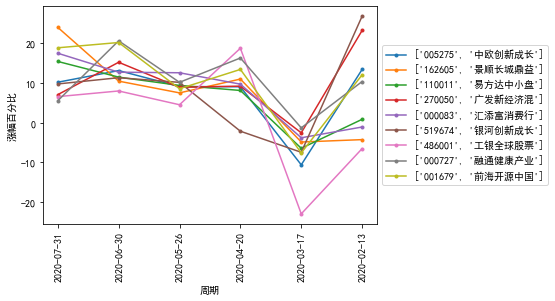

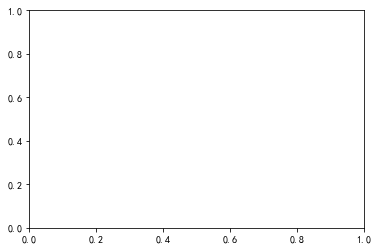

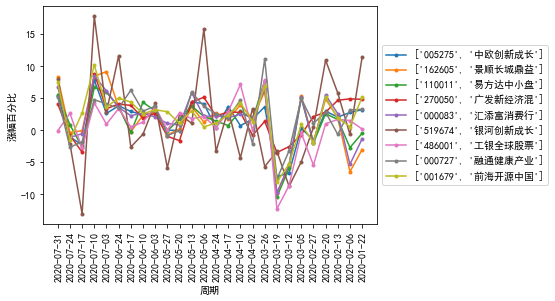

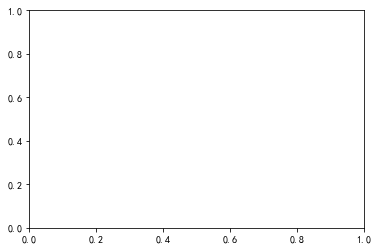

*** fund_top ***
     基金代码    基金简称        最新日期  2020-07-31  2020-06-30  2020-05-26  2020-04-20  \
1  162605  景顺长城鼎益  2020-07-31       24.00       10.45        7.49       10.97   
8  001679  前海开源中国  2020-07-31       18.85       20.18        8.53       13.40   
4  000083  汇添富消费行  2020-07-31       17.48       12.70       12.56        9.69   
2  110011  易方达中小盘  2020-07-31       15.41       11.46        9.37        8.10   
0  005275  中欧创新成长  2020-07-31       10.17       13.11        9.08        9.03   

   2020-03-17  2020-02-13  
1       -4.89       -4.29  
8       -7.63       12.04  
4       -3.82       -1.11  
2       -6.47        0.83  
0      -10.64       13.40  
*** fund_top ***
     基金代码    基金简称        最新日期  2020-07-31  2020-06-30  2020-05-26  2020-04-20  \
7  000727  融通健康产业  2020-07-31        5.50       20.61       10.15       16.28   
8  001679  前海开源中国  2020-07-31       18.85       20.18        8.53       13.40   
3  270050  广发新经济混  2020-07-31        7.04       15.20        8.89   

ConversionError: Failed to convert value(s) to axis units: array(['2020-07-31', '2020-06-30', '2020-05-26', '2020-04-20',
       '2020-03-17', '2020-02-13'], dtype=object)

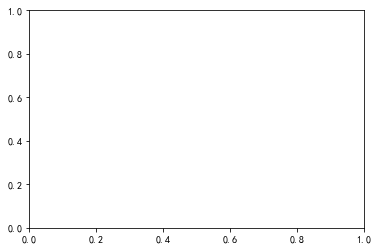

In [13]:

def main():
    url="http://fundf10.eastmoney.com/jjjz_000066.html"
    

if __name__ == '__main__':
    
    #基金详细交易信息获取后，保存到该名称的execl中
    sourceexecl="fund_mingxi"
    #对获取的基金信息进行编辑，增加10列后保存的execl名称
    editexecl="fundedit"
    #对月份进行排序取交集保存的execl名称
    sortexecl="fund_month_sort"
    #对年份进行排序取交集保存的execl名称
    sort1execl="find_year_sort"
    #对基金明细数据进行保存的execl名称
    allfunds_detailexecl="allfund_trans_detail"

    #对我持有基金明细数据进行保存的execl名称
    myfunds_detailexecl="myfunds_trans_detail"

    #获取当天日期
    cur_day=time.strftime("%Y-%m-%d", time.localtime())

    my_funds = ["5275", "162605", "110011", "270050", "83", "519674", "486001", "727","1679"]

    #调用函数，打开url，抓取最后一个交易日日期
    url="http://fundf10.eastmoney.com/jjjz_000066.html"
    driver = open_url(url)
    lasttrans_day=driver.find_element_by_xpath('//*[@id="jztable"]/table/tbody/tr[1]/td[1]').text

    #读取最全的基金的信息，并转换成pd
    edit_funds=pd.read_excel(r"C:\fund_mx_get\fundedit.xls")
    #创建一个pd，只包含两列数据
    all_funds=edit_funds[['基金代码','基金简称']]

    #从全量的基金pd中，获取我持有列表的基金代码和基金名称的pd
    myfunds_numname = fund_num_name(all_funds,*my_funds)

    #对我持有的基金代码和基金名称pd，抓取每只基金的交易明细， 保存为myfunds_detailexecl的execl文件， 并返回一个我持有基金明细数据的pd
    my_f=getfund_mingxi(myfunds_numname,myfunds_detailexecl)
    
    #退出chrome
    driver.quit()

    #读取detailexecl的execl文件， 并去掉首列的内容，获取个全量明细的pd
    #xx=pd.read_excel(myfunds_detailexecl+".xlsx", usecols=[1,2,3,4,5,6])

    #读取我持有基金的基金明细的pd，按照“week/month" 来计算涨幅，日期按照间隔5个工作日来算， 返回我持有基金最近26周的每周涨幅
    my_w_rate1 = fund_rate(my_f,"week","WD",5)

    #读取我持有基金的基金明细的pd，按照“week/month" 来计算涨幅，日期按照间隔23个工作日来算，返回我持有基金最近6月的每月涨幅
    my_m_rate1 = fund_rate(my_f,"month","WD",23)

    #对按月的涨幅进行画图
    pic_execl(my_m_rate1,"my_6month",3,9)
    #对按周的涨幅进行画图
    pic_execl(my_w_rate1,"my_26week",3,29)
    
    #对按月涨幅的全量数据，取每个月的涨幅前五，取交集
    my_sort_inner_rate = myfund_rate_sort(my_m_rate1,"month",5)
    try:
        pic_execl(my_sort_inner_rate,"my_top5_6month",3,9)
    except ValueError:
        print("Can't find inner funds")
    else:
        pass

In [14]:
    filenum = 1
    while len(all_funds) !=0 :
        #计划用3个线程进行明细数据抓取，这里定义每个线程抓取哪些基金
        count = int(len(all_funds)/3)
        funds_part1=all_funds.iloc[:count]
        funds_part2=all_funds.iloc[count:count*2]
        funds_part3=all_funds.iloc[count*2:]

        #启动三个浏览器，进行多线程程的抓取
        driver3 = webdriver.Chrome(executable_path=chrome_driver)
        driver1 = webdriver.Chrome(executable_path=chrome_driver1)
        driver2 = webdriver.Chrome(executable_path=chrome_driver2)

        '''
        启动第一个线程，该线程使用驱动器1，将参数传给多线程抓取函数，处理第一部分基金，抓取1页（20个工作日的基金明细），
        多线程处理抓取的数据结果会放置到全局变量的tmp_funds1 的pd中
        '''
        print("开始多线程抓取时间：")
        print (time.strftime("%Y-%m-%d %H:%M:%S", time.localtime()))
        t1 = threading.Thread(target=getfund_mingxi_mt , args=(funds_part1,driver1,1))
        t1.start()
        t2 = threading.Thread(target=getfund_mingxi_mt , args=(funds_part2,driver2,1))
        t2.start()
        t3 = threading.Thread(target=getfund_mingxi_mt , args=(funds_part3,driver3,1))
        t3.start()
        t1.join()
        t2.join()
        t3.join()
        print("结束多线程抓取时间：")
        print (time.strftime("%Y-%m-%d %H:%M:%S", time.localtime()))

        #上面可能会发生异常退出，并没有抓取完成所有的基金详情，先退出chrome
        driver3.quit()
        driver1.quit()
        driver2.quit()

        #将已经抓取的基金去重，然后基金代码由字符串转为int，因为all_funds中基金代码都是int
        cur_getfunds=tmp_funds1[['基金代码','基金简称']].drop_duplicates()
        cur_getfunds['基金代码'] = pd.to_numeric(cur_getfunds['基金代码'])

        #将all_funds和cur_getfunds取补集，即all_funds中不包含cur_getfunds的部分
        all_funds = all_funds.append(cur_getfunds)
        all_funds = all_funds.append(cur_getfunds)
        all_funds = all_funds.drop_duplicates(subset=['基金代码','基金简称'],keep=False)

        #将重复抓取的内容去掉, 并按照日期进行降序
        tmp_funds1.drop_duplicates(subset=['基金代码','基金简称','净值日期'], keep="first", inplace=True)
        tmp_funds1.sort_values(by='净值日期',ascending=False,inplace=True)

        filenum = filenum + 1 
        #将多线程抓取的基金明细信息保存到execl中，并且不保存index
        tmp_funds1.to_excel("all_fund_" + str(cur_day) + "_" + str(filenum) + ".xlsx",index=False)

开始多线程抓取时间：
2020-08-01 14:59:20
006279
中金瑞祥A http://fundf10.eastmoney.com/jjjz_006279.html
007192007100

中银添利债券 http://fundf10.eastmoney.com/jjjz_007100.html
恒越研究精选 http://fundf10.eastmoney.com/jjjz_007192.html
2020-07-31
恒越研究精选 linenum 20
2020-07-31
恒越研究精选 ['007192', '恒越研究精选', '2020-07-31', '1.5869', '1.5869', '2.63%']
中银添利债券 linenum 20
中银添利债券 ['007100', '中银添利债券', '2020-07-31', '1.3540', '1.3540', '0.15%']
2020-07-31
中金瑞祥A linenum恒越研究精选 20
 ['007192', '恒越研究精选', '2020-07-30', '1.5462', '1.5462', '0.58%']
中金瑞祥A中银添利债券 ['007100', '中银添利债券', '2020-07-30', '1.3520', '1.3520', '0.00%']
 ['006279', '中金瑞祥A', '2020-07-31', '4.5574', '4.5574', '0.82%']
恒越研究精选 ['007192', '恒越研究精选', '2020-07-29', '1.5373', '1.5373', '4.03%']
中银添利债券 ['007100', '中银添利债券', '2020-07-29', '1.3520', '1.3520', '0.22%']
中金瑞祥A ['006279', '中金瑞祥A', '2020-07-30', '4.5203', '4.5203', '-0.32%']
恒越研究精选 ['007192', '恒越研究精选', '2020-07-28', '1.4778', '1.4778', '1.94%']
中银添利债券 ['007100', '中银添利债券', '2020-07-28', '1.3490', '1.3490', '0.15%

诺安成长混合 ['320007', '诺安成长混合', '2020-07-09', '2.0680', '2.5130', '2.83%']
中融新机遇混 ['001261', '中融新机遇混', '2020-07-07', '1.1810', '1.1810', '1.90%']
德邦锐乾债券 ['004246', '德邦锐乾债券', '2020-07-07', '1.0346', '1.1656', '-0.15%']
诺安成长混合 ['320007', '诺安成长混合', '2020-07-08', '2.0110', '2.4560', '3.02%']
中融新机遇混 ['001261', '中融新机遇混', '2020-07-06', '1.1590', '1.1590', '3.85%']
德邦锐乾债券 ['004246', '德邦锐乾债券', '2020-07-06', '1.0362', '1.1672', '-0.14%']
519602
海富通大中华 http://fundf10.eastmoney.com/jjjz_519602.html
诺安成长混合 ['320007', '诺安成长混合', '2020-07-07', '1.9520', '2.3970', '2.09%']
006114
人保鑫利债券 http://fundf10.eastmoney.com/jjjz_006114.html
诺安成长混合 ['320007', '诺安成长混合', '2020-07-06', '1.9120', '2.3570', '8.95%']
003793
泰达宏利溢利 http://fundf10.eastmoney.com/jjjz_003793.html
2020-07-30
海富通大中华 linenum 20
海富通大中华 ['519602', '海富通大中华', '2020-07-30', '1.6240', '1.6240', '0.06%']
2020-07-31
人保鑫利债券 linenum 20
海富通大中华 ['519602', '海富通大中华', '2020-07-29', '1.6230', '1.6230', '1.18%']
人保鑫利债券 ['006114', '人保鑫利债券', '2020-07-31', '1.1273'

广发创新升级 ['002939', '广发创新升级', '2020-07-15', '3.1155', '3.1605', '-1.21%']
九泰盈华量化 ['168106', '九泰盈华量化', '2020-07-10', '1.2818', '1.2818', '-0.60%']
万家3-5年 ['519208', '万家3-5年', '2020-07-14', '1.0179', '1.1040', '0.10%']
广发创新升级 ['002939', '广发创新升级', '2020-07-14', '3.1536', '3.1986', '-0.62%']
九泰盈华量化 ['168106', '九泰盈华量化', '2020-07-09', '1.2896', '1.2896', '1.76%']
万家3-5年 ['519208', '万家3-5年', '2020-07-13', '1.0169', '1.1030', '-0.16%']
广发创新升级 ['002939', '广发创新升级', '2020-07-13', '3.1734', '3.2184', '2.68%']
九泰盈华量化 ['168106', '九泰盈华量化', '2020-07-08', '1.2673', '1.2673', '2.02%']
万家3-5年 ['519208', '万家3-5年', '2020-07-10', '1.0185', '1.1046', '-0.15%']
广发创新升级 ['002939', '广发创新升级', '2020-07-10', '3.0906', '3.1356', '0.41%']
九泰盈华量化 ['168106', '九泰盈华量化', '2020-07-07', '1.2422', '1.2422', '0.98%']
万家3-5年 ['519208', '万家3-5年', '2020-07-09', '1.0200', '1.1061', '-0.21%']
广发创新升级 ['002939', '广发创新升级', '2020-07-09', '3.0781', '3.1231', '3.55%']
九泰盈华量化 ['168106', '九泰盈华量化', '2020-07-06', '1.2302', '1.2302', '4.72%']


工银前沿医疗 ['001717', '工银前沿医疗', '2020-07-20', '3.5330', '3.5330', '-1.56%']
建信睿盈灵活 ['000995', '建信睿盈灵活', '2020-07-16', '1.2410', '1.2410', '-5.48%']
鹏扬泓利债券 ['006059', '鹏扬泓利债券', '2020-07-16', '1.0830', '1.1030', '-0.49%']
工银前沿医疗 ['001717', '工银前沿医疗', '2020-07-17', '3.5890', '3.5890', '2.08%']
建信睿盈灵活 ['000995', '建信睿盈灵活', '2020-07-15', '1.3130', '1.3130', '-2.81%']
鹏扬泓利债券 ['006059', '鹏扬泓利债券', '2020-07-15', '1.0883', '1.1083', '-0.43%']
工银前沿医疗 ['001717', '工银前沿医疗', '2020-07-16', '3.5160', '3.5160', '-5.41%']
建信睿盈灵活 ['000995', '建信睿盈灵活', '2020-07-14', '1.3510', '1.3510', '-0.73%']
鹏扬泓利债券 ['006059', '鹏扬泓利债券', '2020-07-14', '1.0930', '1.1130', '-0.40%']
工银前沿医疗 ['001717', '工银前沿医疗', '2020-07-15', '3.7170', '3.7170', '1.86%']
建信睿盈灵活 ['000995', '建信睿盈灵活', '2020-07-13', '1.3610', '1.3610', '3.73%']
鹏扬泓利债券 ['006059', '鹏扬泓利债券', '2020-07-13', '1.0974', '1.1174', '0.21%']
工银前沿医疗 ['001717', '工银前沿医疗', '2020-07-14', '3.6490', '3.6490', '-0.25%']
建信睿盈灵活 ['000995', '建信睿盈灵活', '2020-07-10', '1.3120', '1.3120', '0.46%

广发多元新兴 ['003745', '广发多元新兴', '2020-07-23', '2.5301', '2.5301', '2.19%']
东吴安盈量化 ['002270', '东吴安盈量化', '2020-07-22', '1.2400', '1.2700', '1.43%']
博时聚盈纯债 ['002929', '博时聚盈纯债', '2020-07-21', '1.1200', '1.1635', '0.13%']
广发多元新兴 ['003745', '广发多元新兴', '2020-07-22', '2.4759', '2.4759', '0.99%']
东吴安盈量化 ['002270', '东吴安盈量化', '2020-07-21', '1.2225', '1.2525', '0.62%']
博时聚盈纯债 ['002929', '博时聚盈纯债', '2020-07-20', '1.1185', '1.1620', '0.08%']
广发多元新兴 ['003745', '广发多元新兴', '2020-07-21', '2.4516', '2.4516', '1.82%']
东吴安盈量化 ['002270', '东吴安盈量化', '2020-07-20', '1.2150', '1.2450', '3.51%']
博时聚盈纯债 ['002929', '博时聚盈纯债', '2020-07-17', '1.1176', '1.1611', '0.06%']
广发多元新兴 ['003745', '广发多元新兴', '2020-07-20', '2.4078', '2.4078', '2.64%']
东吴安盈量化 ['002270', '东吴安盈量化', '2020-07-17', '1.1738', '1.2038', '1.08%']
博时聚盈纯债 ['002929', '博时聚盈纯债', '2020-07-16', '1.1169', '1.1604', '0.06%']
广发多元新兴 ['003745', '广发多元新兴', '2020-07-17', '2.3458', '2.3458', '-0.88%']
东吴安盈量化 ['002270', '东吴安盈量化', '2020-07-16', '1.1613', '1.1913', '-2.88%']
博时聚盈

广发再融资主 ['162717', '广发再融资主', '2020-07-24', '1.3040', '1.3040', '-1.36%']
广发医疗保健 ['004851', '广发医疗保健', '2020-07-27', '3.1128', '3.1128', '0.92%']
鹏扬淳盈6个 ['007429', '鹏扬淳盈6个', '2020-07-24', '1.0162', '1.0462', '--']
广发再融资主 ['162717', '广发再融资主', '2020-07-23', '1.3220', '1.3220', '-0.45%']
广发医疗保健 ['004851', '广发医疗保健', '2020-07-24', '3.0844', '3.0844', '-6.10%']
鹏扬淳盈6个 ['007429', '鹏扬淳盈6个', '2020-07-20', '1.0140', '1.0440', '0.04%']
广发再融资主 ['162717', '广发再融资主', '2020-07-22', '1.3280', '1.3280', '0.53%']
广发医疗保健 ['004851', '广发医疗保健', '2020-07-23', '3.2848', '3.2848', '1.79%']
鹏扬淳盈6个 ['007429', '鹏扬淳盈6个', '2020-07-17', '1.0136', '1.0436', '0.08%']
广发再融资主 ['162717', '广发再融资主', '2020-07-21', '1.3210', '1.3210', '0.08%']
广发医疗保健 ['004851', '广发医疗保健', '2020-07-22', '3.2270', '3.2270', '1.26%']
鹏扬淳盈6个 ['007429', '鹏扬淳盈6个', '2020-07-16', '1.0128', '1.0428', '0.05%']
广发再融资主 ['162717', '广发再融资主', '2020-07-20', '1.3200', '1.3200', '1.46%']
广发医疗保健 ['004851', '广发医疗保健', '2020-07-21', '3.1869', '3.1869', '3.71%']
鹏扬淳盈6个

诺安和鑫灵活诺安行业轮动 ['320015', '诺安行业轮动', '2020-07-31', '1.6114', '1.6114', '0.76%']
 ['002560', '诺安和鑫灵活', '2020-07-30', '1.6880', '1.6880', '0.47%']164808
工银四季收益 http://fundf10.eastmoney.com/jjjz_164808.html

诺安行业轮动 ['320015', '诺安行业轮动', '2020-07-30', '1.5992', '1.5992', '0.41%']
诺安和鑫灵活 ['002560', '诺安和鑫灵活', '2020-07-29', '1.6801', '1.6801', '5.03%']
诺安行业轮动 ['320015', '诺安行业轮动', '2020-07-29', '1.5927', '1.5927', '2.54%']
诺安和鑫灵活 ['002560', '诺安和鑫灵活', '2020-07-28', '1.5997', '1.5997', '0.21%']
2020-07-31
工银四季收益 linenum 20
诺安行业轮动 ['320015', '诺安行业轮动', '2020-07-28', '1.5533', '1.5533', '1.67%']
工银四季收益 ['164808', '工银四季收益', '2020-07-31', '1.0764', '1.6869', '0.04%']
诺安和鑫灵活 ['002560', '诺安和鑫灵活', '2020-07-27', '1.5963', '1.5963', '-0.23%']
诺安行业轮动 ['320015', '诺安行业轮动', '2020-07-27', '1.5278', '1.5278', '0.47%']
工银四季收益 ['164808', '工银四季收益', '2020-07-30', '1.0760', '1.6865', '-0.01%']
诺安和鑫灵活 ['002560', '诺安和鑫灵活', '2020-07-24', '1.5999', '1.5999', '-6.18%']
诺安行业轮动 ['320015', '诺安行业轮动', '2020-07-24', '1.5206', '1.5

宝盈鸿利收益 ['007581', '宝盈鸿利收益', '2020-07-07', '2.1320', '2.2470', '2.45%']
华夏红利混合 ['002011', '华夏红利混合', '2020-07-06', '2.9170', '5.3900', '3.15%']
中融睿祥纯债 ['003072', '中融睿祥纯债', '2020-07-09', '1.1063', '1.1440', '-0.18%']
004193
招商中证50 http://fundf10.eastmoney.com/jjjz_004193.html
宝盈鸿利收益 ['007581', '宝盈鸿利收益', '2020-07-06', '2.0810', '2.1960', '1.51%']
001915
宝盈医疗健康 http://fundf10.eastmoney.com/jjjz_001915.html
中融睿祥纯债 ['003072', '中融睿祥纯债', '2020-07-08', '1.1083', '1.1460', '-0.06%']
中融睿祥纯债 ['003072', '中融睿祥纯债', '2020-07-07', '1.1090', '1.1467', '-0.14%']
2020-07-31
招商中证50 linenum 20
中融睿祥纯债 ['003072', '中融睿祥纯债', '2020-07-06', '1.1105', '1.1482', '-0.06%']
004544
嘉实稳华纯债 http://fundf10.eastmoney.com/jjjz_004544.html
招商中证50 ['004193', '招商中证50', '2020-07-31', '1.2734', '1.2734', '0.74%']
2020-07-31
宝盈医疗健康 linenum 20
招商中证50 ['004193', '招商中证50', '2020-07-30', '1.2641', '1.2641', '-0.43%']
宝盈医疗健康 ['001915', '宝盈医疗健康', '2020-07-31', '2.2360', '2.2360', '0.72%']
招商中证50 ['004193', '招商中证50', '2020-07-29', '1.26

合煦智远嘉选 ['006324', '合煦智远嘉选', '2020-07-09', '1.3954', '1.4454', '0.90%']
中融1-3年 ['003082', '中融1-3年', '2020-07-16', '1.0809', '1.1009', '0.06%']
工银医药健康 ['006002', '工银医药健康', '2020-07-13', '3.0169', '3.0169', '2.97%']
合煦智远嘉选 ['006324', '合煦智远嘉选', '2020-07-08', '1.3830', '1.4330', '1.86%']
中融1-3年 ['003082', '中融1-3年', '2020-07-15', '1.0803', '1.1003', '-0.01%']
工银医药健康 ['006002', '工银医药健康', '2020-07-10', '2.9299', '2.9299', '1.32%']
合煦智远嘉选 ['006324', '合煦智远嘉选', '2020-07-07', '1.3577', '1.4077', '1.06%']
中融1-3年 ['003082', '中融1-3年', '2020-07-14', '1.0804', '1.1004', '-0.05%']
工银医药健康 ['006002', '工银医药健康', '2020-07-09', '2.8918', '2.8918', '3.31%']
合煦智远嘉选 ['006324', '合煦智远嘉选', '2020-07-06', '1.3435', '1.3935', '3.81%']
中融1-3年 ['003082', '中融1-3年', '2020-07-13', '1.0809', '1.1009', '-0.05%']
001048
富国新兴产业 http://fundf10.eastmoney.com/jjjz_001048.html
工银医药健康 ['006002', '工银医药健康', '2020-07-08', '2.7992', '2.7992', '0.39%']
中融1-3年 ['003082', '中融1-3年', '2020-07-10', '1.0814', '1.1014', '-0.11%']
工银医药健康 ['0060

富国中证银行 ['161029', '富国中证银行', '2020-07-22', '1.1310', '1.2170', '0.00%']
方正富邦红利 ['730002', '方正富邦红利', '2020-07-14', '1.3993', '1.6693', '-1.34%']
宝盈先进制造 ['000924', '宝盈先进制造', '2020-07-20', '2.2560', '2.5680', '0.89%']
富国中证银行 ['161029', '富国中证银行', '2020-07-21', '1.1310', '1.2170', '-0.79%']
方正富邦红利 ['730002', '方正富邦红利', '2020-07-13', '1.4183', '1.6883', '1.37%']
宝盈先进制造 ['000924', '宝盈先进制造', '2020-07-17', '2.2360', '2.5480', '1.27%']
富国中证银行 ['161029', '富国中证银行', '2020-07-20', '1.1400', '1.2260', '2.70%']
方正富邦红利 ['730002', '方正富邦红利', '2020-07-10', '1.3992', '1.6692', '-2.04%']
宝盈先进制造 ['000924', '宝盈先进制造', '2020-07-16', '2.2080', '2.5200', '-4.29%']
富国中证银行 ['161029', '富国中证银行', '2020-07-17', '1.1100', '1.1960', '0.18%']
方正富邦红利 ['730002', '方正富邦红利', '2020-07-09', '1.4284', '1.6984', '1.67%']
宝盈先进制造 ['000924', '宝盈先进制造', '2020-07-15', '2.3070', '2.6190', '-1.07%']
富国中证银行 ['161029', '富国中证银行', '2020-07-16', '1.1080', '1.1940', '-0.54%']
方正富邦红利 ['730002', '方正富邦红利', '2020-07-08', '1.4049', '1.6749', '0.90%']


中银医疗保健 ['005689', '中银医疗保健', '2020-07-24', '2.6469', '2.6749', '-5.16%']
嘉实沪港深精 ['001878', '嘉实沪港深精', '2020-07-17', '1.8930', '1.9610', '1.99%']
信诚双盈债券 ['165517', '信诚双盈债券', '2020-07-28', '0.8590', '1.2590', '0.12%']
中银医疗保健 ['005689', '中银医疗保健', '2020-07-23', '2.7908', '2.8188', '2.36%']
嘉实沪港深精 ['001878', '嘉实沪港深精', '2020-07-16', '1.8560', '1.9240', '-5.21%']
信诚双盈债券 ['165517', '信诚双盈债券', '2020-07-27', '0.8580', '1.2580', '0.12%']
中银医疗保健 ['005689', '中银医疗保健', '2020-07-22', '2.7264', '2.7544', '2.10%']
嘉实沪港深精 ['001878', '嘉实沪港深精', '2020-07-15', '1.9580', '2.0260', '-0.66%']
信诚双盈债券 ['165517', '信诚双盈债券', '2020-07-24', '0.8570', '1.2570', '-0.12%']
中银医疗保健 ['005689', '中银医疗保健', '2020-07-21', '2.6702', '2.6982', '3.26%']
嘉实沪港深精 ['001878', '嘉实沪港深精', '2020-07-14', '1.9710', '2.0390', '-1.84%']
信诚双盈债券 ['165517', '信诚双盈债券', '2020-07-23', '0.8580', '1.2580', '0.12%']
中银医疗保健 ['005689', '中银医疗保健', '2020-07-20', '2.5858', '2.6138', '-0.90%']
嘉实沪港深精 ['001878', '嘉实沪港深精', '2020-07-13', '2.0080', '2.0760', '2.82%']


华安沪深30 ['000312', '华安沪深30', '2020-07-24', '2.1208', '2.4808', '-4.66%']
宝盈先进制造 ['007579', '宝盈先进制造', '2020-07-30', '2.2710', '2.4760', '-0.83%']
华安沪深30 ['000312', '华安沪深30', '2020-07-23', '2.2245', '2.5845', '0.42%']
宝盈先进制造 ['007579', '宝盈先进制造', '2020-07-29', '2.2900', '2.4950', '3.57%']
华安沪深30 ['000312', '华安沪深30', '2020-07-22', '2.2151', '2.5751', '0.63%']
宝盈先进制造 ['007579', '宝盈先进制造', '2020-07-28', '2.2110', '2.4160', '1.75%']
华安沪深30 ['000312', '华安沪深30', '2020-07-21', '2.2012', '2.5612', '0.45%']
宝盈先进制造 ['007579', '宝盈先进制造', '2020-07-27', '2.1730', '2.3780', '0.32%']
2020-07-31
建信中债国开 linenum 20
华安沪深30 ['000312', '华安沪深30', '2020-07-20', '2.1913', '2.5513', '2.77%']
建信中债国开 ['007095', '建信中债国开', '2020-07-31', '1.0089', '1.0579', '-0.12%']
宝盈先进制造 ['007579', '宝盈先进制造', '2020-07-24', '2.1660', '2.3710', '-6.31%']
华安沪深30 ['000312', '华安沪深30', '2020-07-17', '2.1322', '2.4922', '1.06%']
建信中债国开 ['007095', '建信中债国开', '2020-07-30', '1.0101', '1.0591', '-0.02%']
宝盈先进制造 ['007579', '宝盈先进制造', '2020-07-23', '

招商双债增强 ['161716', '招商双债增强', '2020-07-09', '1.3160', '1.4550', '-0.23%']
招商双债增强 ['161716', '招商双债增强', '2020-07-08', '1.3190', '1.4580', '0.00%']
2020-07-31
中银证券瑞益 linenum 20
招商双债增强 ['161716', '招商双债增强', '2020-07-07', '1.3190', '1.4580', '-0.23%']
中银证券瑞益 ['003981', '中银证券瑞益', '2020-07-31', '1.5200', '1.5200', '0.64%']
2020-07-31
招商双债增强 ['161716', '招商双债增强', '2020-07-06', '1.3220', '1.4610', '0.08%']
中欧医疗创新 linenum 20
中银证券瑞益004420
汇添富美元债 http://fundf10.eastmoney.com/jjjz_004420.html
 ['003981', '中银证券瑞益', '2020-07-30', '1.5103', '1.5103', '-0.77%']
中欧医疗创新 ['006229', '中欧医疗创新', '2020-07-31', '2.3536', '2.3536', '1.57%']
中银证券瑞益 ['003981', '中银证券瑞益', '2020-07-29', '1.5220', '1.5220', '2.89%']
中欧医疗创新 ['006229', '中欧医疗创新', '2020-07-30', '2.3173', '2.3173', '-0.31%']
中银证券瑞益 ['003981', '中银证券瑞益', '2020-07-28', '1.4792', '1.4792', '1.34%']
中欧医疗创新 ['006229', '中欧医疗创新', '2020-07-29', '2.3245', '2.3245', '2.85%']
中银证券瑞益 ['003981', '中银证券瑞益', '2020-07-27', '1.4596', '1.4596', '0.42%']
中欧医疗创新 ['006229', '中欧医疗创新'

万家瑞隆混合 ['003751', '万家瑞隆混合', '2020-07-08', '1.5571', '1.5571', '3.08%']
先锋聚利混合 ['004833', '先锋聚利混合', '2020-07-14', '1.0551', '1.0551', '-2.12%']
万家行业优选 ['161903', '万家行业优选', '2020-07-07', '1.9677', '5.0051', '3.80%']
万家瑞隆混合 ['003751', '万家瑞隆混合', '2020-07-07', '1.5106', '1.5106', '1.06%']
先锋聚利混合 ['004833', '先锋聚利混合', '2020-07-13', '1.0780', '1.0780', '1.92%']
万家行业优选 ['161903', '万家行业优选', '2020-07-06', '1.8956', '4.8771', '3.04%']
万家瑞隆混合 ['003751', '万家瑞隆混合', '2020-07-06', '1.4948', '1.4948', '4.16%']
002408
中信建投医改 http://fundf10.eastmoney.com/jjjz_002408.html
先锋聚利混合 ['004833', '先锋聚利混合', '2020-07-10', '1.0577', '1.0577', '-0.61%']
210002
金鹰红利价值 http://fundf10.eastmoney.com/jjjz_210002.html
先锋聚利混合 ['004833', '先锋聚利混合', '2020-07-09', '1.0642', '1.0642', '1.65%']
先锋聚利混合 ['004833', '先锋聚利混合', '2020-07-08', '1.0469', '1.0469', '0.62%']
先锋聚利混合 ['004833', '先锋聚利混合', '2020-07-07', '1.0404', '1.0404', '0.98%']
2020-07-31
2020-07-31
中信建投医改金鹰红利价值  linenum 20
linenum 20
金鹰红利价值 ['210002', '金鹰红利价值', '2020-07-31

安信尊享添益 ['005678', '安信尊享添益', '2020-07-20', '1.1440', '1.1440', '0.09%']
长城环保主题 ['000977', '长城环保主题', '2020-07-14', '2.1171', '2.1171', '0.56%']
华商策略精选 ['630008', '华商策略精选', '2020-07-13', '1.4200', '1.9500', '2.16%']
安信尊享添益 ['005678', '安信尊享添益', '2020-07-17', '1.1430', '1.1430', '-0.01%']
长城环保主题 ['000977', '长城环保主题', '2020-07-13', '2.1053', '2.1053', '3.19%']
华商策略精选 ['630008', '华商策略精选', '2020-07-10', '1.3900', '1.9200', '-1.21%']
安信尊享添益 ['005678', '安信尊享添益', '2020-07-16', '1.1431', '1.1431', '-0.16%']
长城环保主题 ['000977', '长城环保主题', '2020-07-10', '2.0403', '2.0403', '0.55%']
华商策略精选 ['630008', '华商策略精选', '2020-07-09', '1.4070', '1.9370', '2.63%']
安信尊享添益 ['005678', '安信尊享添益', '2020-07-15', '1.1449', '1.1449', '-0.10%']
长城环保主题 ['000977', '长城环保主题', '2020-07-09', '2.0291', '2.0291', '1.82%']
华商策略精选 ['630008', '华商策略精选', '2020-07-08', '1.3710', '1.9010', '2.47%']
安信尊享添益 ['005678', '安信尊享添益', '2020-07-14', '1.1460', '1.1460', '-0.12%']
长城环保主题 ['000977', '长城环保主题', '2020-07-08', '1.9928', '1.9928', '1.17%']
华

海富通中小盘 ['519026', '海富通中小盘', '2020-07-17', '1.7100', '1.7100', '1.48%']
泓德裕荣纯债 ['002734', '泓德裕荣纯债', '2020-07-23', '1.1050', '1.5160', '0.09%']
中欧互通精选 ['166007', '中欧互通精选', '2020-07-16', '1.8508', '1.8958', '-3.77%']
海富通中小盘 ['519026', '海富通中小盘', '2020-07-16', '1.6850', '1.6850', '-5.66%']
泓德裕荣纯债 ['002734', '泓德裕荣纯债', '2020-07-22', '1.1040', '1.5150', '0.09%']
中欧互通精选 ['166007', '中欧互通精选', '2020-07-15', '1.9234', '1.9684', '-1.04%']
海富通中小盘 ['519026', '海富通中小盘', '2020-07-15', '1.7860', '1.7860', '-0.56%']
泓德裕荣纯债 ['002734', '泓德裕荣纯债', '2020-07-21', '1.1030', '1.5140', '0.18%']
中欧互通精选 ['166007', '中欧互通精选', '2020-07-14', '1.9437', '1.9887', '-0.65%']
海富通中小盘 ['519026', '海富通中小盘', '2020-07-14', '1.7960', '1.7960', '-1.10%']
泓德裕荣纯债 ['002734', '泓德裕荣纯债', '2020-07-20', '1.1010', '1.5120', '0.09%']
中欧互通精选 ['166007', '中欧互通精选', '2020-07-13', '1.9565', '2.0015', '2.54%']
海富通中小盘 ['519026', '海富通中小盘', '2020-07-13', '1.8160', '1.8160', '3.12%']
泓德裕荣纯债 ['002734', '泓德裕荣纯债', '2020-07-17', '1.1000', '1.5110', '0.09%']


南方医药保健 ['000452', '南方医药保健', '2020-07-22', '3.6770', '3.8920', '2.11%']
华夏军工安全 ['002251', '华夏军工安全', '2020-07-23', '1.3490', '1.3490', '3.53%']
华泰柏瑞丰盛 ['000187', '华泰柏瑞丰盛', '2020-07-28', '1.0850', '1.4226', '-0.02%']
南方医药保健 ['000452', '南方医药保健', '2020-07-21', '3.6010', '3.8160', '3.18%']
华夏军工安全 ['002251', '华夏军工安全', '2020-07-22', '1.3030', '1.3030', '1.64%']
华泰柏瑞丰盛 ['000187', '华泰柏瑞丰盛', '2020-07-27', '1.0852', '1.4228', '0.04%']
南方医药保健 ['000452', '南方医药保健', '2020-07-20', '3.4900', '3.7050', '-1.52%']
华夏军工安全 ['002251', '华夏军工安全', '2020-07-21', '1.2820', '1.2820', '-1.91%']
华泰柏瑞丰盛 ['000187', '华泰柏瑞丰盛', '2020-07-24', '1.0848', '1.4224', '0.14%']
南方医药保健 ['000452', '南方医药保健', '2020-07-17', '3.5440', '3.7590', '2.13%']
华夏军工安全 ['002251', '华夏军工安全', '2020-07-20', '1.3070', '1.3070', '7.22%']
华泰柏瑞丰盛 ['000187', '华泰柏瑞丰盛', '2020-07-23', '1.0833', '1.4209', '0.06%']
南方医药保健 ['000452', '南方医药保健', '2020-07-16', '3.4700', '3.6850', '-5.71%']
华夏军工安全 ['002251', '华夏军工安全', '2020-07-17', '1.2190', '1.2190', '3.74%']
华泰

招商医药健康 ['000960', '招商医药健康', '2020-07-24', '2.8970', '2.8970', '-6.12%']
银华智能汽车 ['005033', '银华智能汽车', '2020-07-27', '1.0053', '1.0053', '0.58%']
光大保德信晟 ['005579', '光大保德信晟', '2020-07-06', '1.0821', '1.0821', '0.97%']
招商医药健康 ['000960', '招商医药健康', '2020-07-23', '3.0860', '3.0860', '2.97%']
004920
富国泓利纯债 http://fundf10.eastmoney.com/jjjz_004920.html
银华智能汽车 ['005033', '银华智能汽车', '2020-07-24', '0.9995', '0.9995', '-3.77%']
招商医药健康 ['000960', '招商医药健康', '2020-07-22', '2.9970', '2.9970', '2.22%']
银华智能汽车 ['005033', '银华智能汽车', '2020-07-23', '1.0387', '1.0387', '-0.24%']
招商医药健康 ['000960', '招商医药健康', '2020-07-21', '2.9320', '2.9320', '3.68%']
银华智能汽车 ['005033', '银华智能汽车', '2020-07-22', '1.0412', '1.0412', '-0.10%']
招商医药健康 ['000960', '招商医药健康', '2020-07-20', '2.8280', '2.8280', '-1.39%']
银华智能汽车 ['005033', '银华智能汽车', '2020-07-21', '1.0422', '1.0422', '1.32%']
2020-07-31
富国泓利纯债 linenum 20
招商医药健康 ['000960', '招商医药健康', '2020-07-17', '2.8680', '2.8680', '1.85%']
富国泓利纯债 ['004920', '富国泓利纯债', '2020-07-31', '1.0484', '1

中融恒信纯债 ['003927', '中融恒信纯债', '2020-07-13', '1.0618', '1.1433', '-0.04%']
招商国证生物 ['161726', '招商国证生物', '2020-07-29', '1.1157', '1.4108', '4.64%']
中融恒信纯债 ['003927', '中融恒信纯债', '2020-07-10', '1.0622', '1.1437', '-0.08%']
招商国证生物 ['161726', '招商国证生物', '2020-07-28', '1.0662', '1.3794', '0.68%']
2020-07-31中融恒信纯债 ['003927', '中融恒信纯债', '2020-07-09', '1.0630', '1.1445', '-0.14%']

华宝智慧产业 linenum 20
招商国证生物 ['161726', '招商国证生物', '2020-07-27', '1.0590', '1.3748', '1.79%']
华宝智慧产业 ['004480', '华宝智慧产业', '2020-07-31', '1.3627', '1.3627', '1.32%']
中融恒信纯债 ['003927', '中融恒信纯债', '2020-07-08', '1.0645', '1.1460', '-0.03%']
招商国证生物 ['161726', '招商国证生物', '2020-07-24', '1.0404', '1.3630', '-6.17%']
华宝智慧产业 ['004480', '华宝智慧产业', '2020-07-30', '1.3449', '1.3449', '-0.72%']
中融恒信纯债 ['003927', '中融恒信纯债', '2020-07-07', '1.0648', '1.1463', '-0.08%']
招商国证生物 ['161726', '招商国证生物', '2020-07-23', '1.1088', '1.4064', '4.24%']
华宝智慧产业 ['004480', '华宝智慧产业', '2020-07-29', '1.3547', '1.3547', '2.96%']
中融恒信纯债 ['003927', '中融恒信纯债', '2020-07-06',

宝盈盈泰纯债 ['005846', '宝盈盈泰纯债', '2020-07-16', '1.0901', '1.1421', '0.05%']
富安达增强收 ['710302', '富安达增强收', '2020-07-08', '1.4948', '1.5148', '0.78%']
南方信息创新 ['007491', '南方信息创新', '2020-07-07', '2.2695', '2.2695', '2.26%']
宝盈盈泰纯债 ['005846', '宝盈盈泰纯债', '2020-07-15', '1.0896', '1.1416', '0.00%']
富安达增强收 ['710302', '富安达增强收', '2020-07-07', '1.4833', '1.5033', '0.52%']
南方信息创新 ['007491', '南方信息创新', '2020-07-06', '2.2194', '2.2194', '5.56%']
宝盈盈泰纯债 ['005846', '宝盈盈泰纯债', '2020-07-14', '1.0896', '1.1416', '-0.01%']
005176
富国精准医疗 http://fundf10.eastmoney.com/jjjz_005176.html
富安达增强收 ['710302', '富安达增强收', '2020-07-06', '1.4757', '1.4957', '5.38%']
000411
景顺长城优质 http://fundf10.eastmoney.com/jjjz_000411.html
宝盈盈泰纯债 ['005846', '宝盈盈泰纯债', '2020-07-13', '1.0897', '1.1417', '-0.04%']
宝盈盈泰纯债 ['005846', '宝盈盈泰纯债', '2020-07-10', '1.0901', '1.1421', '-0.06%']
宝盈盈泰纯债 ['005846', '宝盈盈泰纯债', '2020-07-09', '1.0907', '1.1427', '-0.11%']
宝盈盈泰纯债 ['005846', '宝盈盈泰纯债', '2020-07-08', '1.0919', '1.1439', '-0.04%']
宝盈盈泰纯债 ['005846', '宝盈盈泰

红土创新新兴 ['001753', '红土创新新兴', '2020-07-27', '1.0220', '1.0220', '0.10%']
富国精准医疗 ['005176', '富国精准医疗', '2020-07-17', '3.0838', '3.0838', '2.37%']
红土创新新兴 ['001753', '红土创新新兴', '2020-07-24', '1.0210', '1.0210', '-6.33%']
富国精准医疗 ['005176', '富国精准医疗', '2020-07-16', '3.0124', '3.0124', '-5.32%']
红土创新新兴 ['001753', '红土创新新兴', '2020-07-23', '1.0900', '1.0900', '-0.27%']
富国精准医疗 ['005176', '富国精准医疗', '2020-07-15', '3.1818', '3.1818', '0.99%']
红土创新新兴 ['001753', '红土创新新兴', '2020-07-22', '1.0930', '1.0930', '0.37%']
富国精准医疗 ['005176', '富国精准医疗', '2020-07-14', '3.1507', '3.1507', '-0.10%']
红土创新新兴 ['001753', '红土创新新兴', '2020-07-21', '1.0890', '1.0890', '0.74%']
富国精准医疗 ['005176', '富国精准医疗', '2020-07-13', '3.1540', '3.1540', '2.82%']
红土创新新兴 ['001753', '红土创新新兴', '2020-07-20', '1.0810', '1.0810', '4.55%']
富国精准医疗 ['005176', '富国精准医疗', '2020-07-10', '3.0674', '3.0674', '2.36%']
红土创新新兴 ['001753', '红土创新新兴', '2020-07-17', '1.0340', '1.0340', '0.78%']
富国精准医疗 ['005176', '富国精准医疗', '2020-07-09', '2.9968', '2.9968', '3.67%']
红土

中信建投稳祥 ['003978', '中信建投稳祥', '2020-07-16', '1.0310', '1.1610', '0.05%']
国泰大健康股 ['001645', '国泰大健康股', '2020-07-17', '3.2240', '3.3910', '2.94%']
九泰盈华量化 ['168107', '九泰盈华量化', '2020-07-24', '1.2153', '1.2153', '-4.35%']
中信建投稳祥 ['003978', '中信建投稳祥', '2020-07-15', '1.0305', '1.1605', '0.02%']
国泰大健康股 ['001645', '国泰大健康股', '2020-07-16', '3.1320', '3.2990', '-4.40%']
九泰盈华量化 ['168107', '九泰盈华量化', '2020-07-23', '1.2706', '1.2706', '0.28%']
中信建投稳祥 ['003978', '中信建投稳祥', '2020-07-14', '1.0303', '1.1603', '-0.03%']
国泰大健康股 ['001645', '国泰大健康股', '2020-07-15', '3.2760', '3.4430', '-0.88%']
九泰盈华量化 ['168107', '九泰盈华量化', '2020-07-22', '1.2670', '1.2670', '0.69%']
中信建投稳祥 ['003978', '中信建投稳祥', '2020-07-13', '1.0306', '1.1606', '-0.08%']
国泰大健康股 ['001645', '国泰大健康股', '2020-07-14', '3.3050', '3.4720', '0.52%']
九泰盈华量化 ['168107', '九泰盈华量化', '2020-07-21', '1.2583', '1.2583', '0.37%']
中信建投稳祥 ['003978', '中信建投稳祥', '2020-07-10', '1.0314', '1.1614', '-0.06%']
国泰大健康股 ['001645', '国泰大健康股', '2020-07-13', '3.2880', '3.4550', '4.35%']


中欧医疗健康 ['003095', '中欧医疗健康', '2020-07-23', '3.2110', '3.2860', '2.65%']
国金惠盈纯债 ['006760', '国金惠盈纯债', '2020-07-23', '1.0656', '1.0656', '0.08%']
汇安量化优选 ['005600', '汇安量化优选', '2020-07-29', '1.4247', '1.4247', '2.53%']
中欧医疗健康 ['003095', '中欧医疗健康', '2020-07-22', '3.1280', '3.2030', '1.66%']
国金惠盈纯债 ['006760', '国金惠盈纯债', '2020-07-22', '1.0647', '1.0647', '0.22%']
汇安量化优选 ['005600', '汇安量化优选', '2020-07-28', '1.3896', '1.3896', '1.16%']
中欧医疗健康 ['003095', '中欧医疗健康', '2020-07-21', '3.0770', '3.1520', '4.16%']
国金惠盈纯债 ['006760', '国金惠盈纯债', '2020-07-21', '1.0624', '1.0624', '0.37%']
汇安量化优选 ['005600', '汇安量化优选', '2020-07-27', '1.3736', '1.3736', '-0.15%']
中欧医疗健康 ['003095', '中欧医疗健康', '2020-07-20', '2.9540', '3.0290', '-1.57%']
国金惠盈纯债 ['006760', '国金惠盈纯债', '2020-07-20', '1.0585', '1.0585', '0.13%']
汇安量化优选 ['005600', '汇安量化优选', '2020-07-24', '1.3756', '1.3756', '-4.37%']
中欧医疗健康 ['003095', '中欧医疗健康', '2020-07-17', '3.0010', '3.0760', '1.83%']
国金惠盈纯债 ['006760', '国金惠盈纯债', '2020-07-17', '1.0571', '1.0571', '0.07%']
汇安量

005437
易方达易百智 http://fundf10.eastmoney.com/jjjz_005437.html
南方和元A ['004555', '南方和元A', '2020-07-29', '1.0260', '1.1620', '0.00%']
华泰柏瑞医疗 ['005805', '华泰柏瑞医疗', '2020-07-27', '2.6024', '2.6024', '1.26%']
南方和元A ['004555', '南方和元A', '2020-07-28', '1.0260', '1.1620', '-0.10%']
华泰柏瑞医疗 ['005805', '华泰柏瑞医疗', '2020-07-24', '2.5699', '2.5699', '-5.93%']
南方和元A ['004555', '南方和元A', '2020-07-27', '1.0270', '1.1630', '0.00%']
2020-07-31
易方达易百智 linenum 20
华泰柏瑞医疗 ['005805', '华泰柏瑞医疗', '2020-07-23', '2.7319', '2.7319', '3.29%']
易方达易百智 ['005437', '易方达易百智', '2020-07-31', '1.2481', '1.2481', '1.14%']
南方和元A ['004555', '南方和元A', '2020-07-24', '1.0270', '1.1630', '0.10%']
华泰柏瑞医疗 ['005805', '华泰柏瑞医疗', '2020-07-22', '2.6449', '2.6449', '2.77%']
易方达易百智 ['005437', '易方达易百智', '2020-07-30', '1.2340', '1.2340', '-0.58%']
南方和元A ['004555', '南方和元A', '2020-07-23', '1.0260', '1.1620', '-0.10%']
华泰柏瑞医疗 ['005805', '华泰柏瑞医疗', '2020-07-21', '2.5736', '2.5736', '3.69%']
易方达易百智 ['005437', '易方达易百智', '2020-07-29', '1.2412', '1.2412', '2.

景顺长城支柱 ['260117', '景顺长城支柱', '2020-07-08', '1.7800', '2.0600', '1.42%']
融通健康产业 ['000727', '融通健康产业', '2020-07-30', '2.8870', '2.8870', '0.52%']
景顺长城支柱 ['260117', '景顺长城支柱', '2020-07-07', '1.7550', '2.0350', '1.33%']
融通健康产业 ['000727', '融通健康产业', '2020-07-29', '2.8720', '2.8720', '2.35%']
2020-07-31
嘉实债券 linenum 20
景顺长城支柱 ['260117', '景顺长城支柱', '2020-07-06', '1.7320', '2.0120', '5.22%']
004496嘉实债券
 ['070005', '嘉实债券', '2020-07-31', '1.3500', '2.3700', '0.15%']
前海开源多元 http://fundf10.eastmoney.com/jjjz_004496.html
融通健康产业 ['000727', '融通健康产业', '2020-07-28', '2.8060', '2.8060', '0.29%']
嘉实债券 ['070005', '嘉实债券', '2020-07-30', '1.3480', '2.3680', '0.07%']
融通健康产业 ['000727', '融通健康产业', '2020-07-27', '2.7980', '2.7980', '0.97%']
嘉实债券 ['070005', '嘉实债券', '2020-07-29', '1.3470', '2.3670', '0.15%']
融通健康产业 ['000727', '融通健康产业', '2020-07-24', '2.7710', '2.7710', '-6.07%']
嘉实债券 ['070005', '嘉实债券', '2020-07-28', '1.3450', '2.3650', '0.07%']
2020-07-31
融通健康产业 ['000727', '融通健康产业', '2020-07-23', '2.9500', '2.9500', '0.

交银医药创新 ['004075', '交银医药创新', '2020-07-06', '2.8014', '2.8014', '-0.59%']
中银增利债券 ['163806', '中银增利债券', '2020-07-08', '1.1110', '1.7390', '0.00%']
001822
华商智能生活 http://fundf10.eastmoney.com/jjjz_001822.html
西部利得新动 ['673010', '西部利得新动', '2020-07-14', '1.2860', '1.8210', '-0.31%']
中银增利债券 ['163806', '中银增利债券', '2020-07-07', '1.1110', '1.7390', '-0.18%']
西部利得新动 ['673010', '西部利得新动', '2020-07-13', '1.2900', '1.8250', '1.74%']
中银增利债券 ['163806', '中银增利债券', '2020-07-06', '1.1130', '1.7410', '0.36%']
西部利得新动006797 ['673010', '西部利得新动', '2020-07-10', '1.2680', '1.8030', '0.16%']

嘉实中短债债 http://fundf10.eastmoney.com/jjjz_006797.html
2020-07-31
华商智能生活 linenum 20
西部利得新动 ['673010', '西部利得新动', '2020-07-09', '1.2660', '1.8010', '2.10%']
华商智能生活 ['001822', '华商智能生活', '2020-07-31', '1.7810', '1.7810', '2.42%']
西部利得新动 ['673010', '西部利得新动', '2020-07-08', '1.2400', '1.7750', '1.47%']
华商智能生活 ['001822', '华商智能生活', '2020-07-30', '1.7390', '1.7390', '-0.80%']
西部利得新动 ['673010', '西部利得新动', '2020-07-07', '1.2220', '1.7570', '1.1

华富收益增强 ['410004', '华富收益增强', '2020-07-14', '1.4460', '2.2790', '-0.48%']
博时平衡配置 ['050007', '博时平衡配置', '2020-07-21', '1.2290', '2.7440', '0.33%']
中海顺鑫灵活 ['002213', '中海顺鑫灵活', '2020-07-08', '1.9445', '1.9775', '1.64%']
华富收益增强 ['410004', '华富收益增强', '2020-07-13', '1.4530', '2.2860', '0.44%']
博时平衡配置 ['050007', '博时平衡配置', '2020-07-20', '1.2250', '2.7400', '1.66%']
中海顺鑫灵活 ['002213', '中海顺鑫灵活', '2020-07-07', '1.9131', '1.9461', '2.72%']
华富收益增强 ['410004', '华富收益增强', '2020-07-10', '1.4466', '2.2796', '-0.67%']
博时平衡配置 ['050007', '博时平衡配置', '2020-07-17', '1.2050', '2.7200', '0.58%']
中海顺鑫灵活 ['002213', '中海顺鑫灵活', '2020-07-06', '1.8625', '1.8955', '3.80%']
华富收益增强 ['410004', '华富收益增强', '2020-07-09', '1.4564', '2.2894', '0.08%']
000913
农银医疗保健 http://fundf10.eastmoney.com/jjjz_000913.html
博时平衡配置 ['050007', '博时平衡配置', '2020-07-16', '1.1980', '2.7130', '-2.20%']
华富收益增强 ['410004', '华富收益增强', '2020-07-08', '1.4553', '2.2883', '0.25%']
博时平衡配置 ['050007', '博时平衡配置', '2020-07-15', '1.2250', '2.7400', '-0.24%']
华富收益增强 ['4100

长城医疗保健 ['000339', '长城医疗保健', '2020-07-14', '3.9193', '3.9193', '-1.31%']
交银裕隆纯债 ['519783', '交银裕隆纯债', '2020-07-20', '1.1890', '1.1890', '0.07%']
前海开源多元 ['004497', '前海开源多元', '2020-07-27', '1.9678', '1.9678', '5.40%']
长城医疗保健 ['000339', '长城医疗保健', '2020-07-13', '3.9714', '3.9714', '3.17%']
交银裕隆纯债 ['519783', '交银裕隆纯债', '2020-07-17', '1.1882', '1.1882', '0.04%']
前海开源多元 ['004497', '前海开源多元', '2020-07-24', '1.8670', '1.8670', '-1.08%']
长城医疗保健 ['000339', '长城医疗保健', '2020-07-10', '3.8494', '3.8494', '1.19%']
交银裕隆纯债 ['519783', '交银裕隆纯债', '2020-07-16', '1.1877', '1.1877', '0.07%']
前海开源多元 ['004497', '前海开源多元', '2020-07-23', '1.8874', '1.8874', '0.66%']
长城医疗保健 ['000339', '长城医疗保健', '2020-07-09', '3.8041', '3.8041', '3.81%']
交银裕隆纯债 ['519783', '交银裕隆纯债', '2020-07-15', '1.1869', '1.1869', '-0.01%']
前海开源多元 ['004497', '前海开源多元', '2020-07-22', '1.8751', '1.8751', '2.15%']
长城医疗保健 ['000339', '长城医疗保健', '2020-07-08', '3.6644', '3.6644', '1.01%']
交银裕隆纯债 ['519783', '交银裕隆纯债', '2020-07-14', '1.1870', '1.1870', '-0.05%']
前海

方正富邦富利 ['006732', '方正富邦富利', '2020-07-24', '1.0386', '1.0586', '0.10%']
华安沪深30 ['000313', '华安沪深30', '2020-07-31', '2.1383', '2.4983', '1.20%']
华宝创新优选 ['000601', '华宝创新优选', '2020-07-17', '2.0620', '2.4020', '2.23%']
方正富邦富利 ['006732', '方正富邦富利', '2020-07-23', '1.0376', '1.0576', '-0.03%']
华安沪深30 ['000313', '华安沪深30', '2020-07-30', '2.1129', '2.4729', '-0.55%']
华宝创新优选 ['000601', '华宝创新优选', '2020-07-16', '2.0170', '2.3570', '-4.77%']
方正富邦富利 ['006732', '方正富邦富利', '2020-07-22', '1.0379', '1.0579', '0.03%']
华安沪深30 ['000313', '华安沪深30', '2020-07-29', '2.1245', '2.4845', '2.60%']
华宝创新优选 ['000601', '华宝创新优选', '2020-07-15', '2.1180', '2.4580', '-2.53%']
方正富邦富利 ['006732', '方正富邦富利', '2020-07-21', '1.0376', '1.0576', '0.14%']
华安沪深30 ['000313', '华安沪深30', '2020-07-28', '2.0707', '2.4307', '1.18%']
华宝创新优选 ['000601', '华宝创新优选', '2020-07-14', '2.1730', '2.5130', '-2.56%']
方正富邦富利 ['006732', '方正富邦富利', '2020-07-20', '1.0362', '1.0562', '0.06%']
华安沪深30 ['000313', '华安沪深30', '2020-07-27', '2.0465', '2.4065', '0.63%']
华

金鹰鑫日享债 ['006974', '金鹰鑫日享债', '2020-07-30', '1.0577', '1.0577', '-0.03%']
鹏华医疗保健 ['000780', '鹏华医疗保健', '2020-07-22', '2.6430', '2.6430', '1.93%']
金鹰鑫日享债 ['006974', '金鹰鑫日享债', '2020-07-29', '1.0580', '1.0580', '0.12%']
鹏华医疗保健 ['000780', '鹏华医疗保健', '2020-07-21', '2.5930', '2.5930', '4.43%']
金鹰鑫日享债 ['006974', '金鹰鑫日享债', '2020-07-28', '1.0567', '1.0567', '0.09%']
2020-07-31
鹏华医疗保健 ['000780', '鹏华医疗保健', '2020-07-20', '2.4830', '2.4830', '-2.21%']
西部利得行业 linenum 20
金鹰鑫日享债 ['006974', '金鹰鑫日享债', '2020-07-27', '1.0557', '1.0557', '-0.05%']
西部利得行业 ['673040', '西部利得行业', '2020-07-31', '1.6000', '1.6000', '0.82%']
鹏华医疗保健 ['000780', '鹏华医疗保健', '2020-07-17', '2.5390', '2.5390', '2.63%']
金鹰鑫日享债 ['006974', '金鹰鑫日享债', '2020-07-24', '1.0562', '1.0562', '-0.24%']
西部利得行业 ['673040', '西部利得行业', '2020-07-30', '1.5870', '1.5870', '-0.13%']
鹏华医疗保健 ['000780', '鹏华医疗保健', '2020-07-16', '2.4740', '2.4740', '-6.15%']
金鹰鑫日享债 ['006974', '金鹰鑫日享债', '2020-07-23', '1.0587', '1.0587', '0.04%']
西部利得行业 ['673040', '西部利得行业', '2020-07-29', 

创金合信量化 ['004359', '创金合信量化', '2020-07-09', '1.5493', '1.5993', '1.69%']
国联安科技动 ['001956', '国联安科技动', '2020-07-28', '1.9450', '1.9450', '1.06%']
创金合信量化 ['004359', '创金合信量化', '2020-07-08', '1.5236', '1.5736', '1.84%']
国联安科技动 ['001956', '国联安科技动', '2020-07-27', '1.9246', '1.9246', '-1.05%']
2020-07-31
创金合信量化 ['004359', '创金合信量化', '2020-07-07', '1.4961', '1.5461', '1.03%']
西部利得合享 linenum 20
国联安科技动 ['001956', '国联安科技动', '2020-07-24', '1.9451', '1.9451', '-5.42%']
西部利得合享 ['675041', '西部利得合享', '2020-07-31', '1.0339', '1.1693', '-0.03%']
创金合信量化 ['004359', '创金合信量化', '2020-07-06', '1.4809', '1.5309', '5.24%']
国联安科技动 ['001956', '国联安科技动', '2020-07-23', '2.0566', '2.0566', '0.11%']
005034
银华智能汽车 http://fundf10.eastmoney.com/jjjz_005034.html
西部利得合享 ['675041', '西部利得合享', '2020-07-30', '1.0342', '1.1696', '-0.02%']
国联安科技动 ['001956', '国联安科技动', '2020-07-22', '2.0543', '2.0543', '1.58%']
西部利得合享 ['675041', '西部利得合享', '2020-07-29', '1.0344', '1.1698', '-0.02%']
国联安科技动 ['001956', '国联安科技动', '2020-07-21', '2.0224', '2

人保中证50 ['006611', '人保中证50', '2020-07-16', '1.4817', '1.4817', '-4.44%']
2020-07-31
招商安心收益 ['217011', '招商安心收益', '2020-07-08', '1.5943', '1.9413', '-0.08%']
工银医疗保健 linenum 20
人保中证50 ['006611', '人保中证50', '2020-07-15', '1.5506', '1.5506', '-2.33%']
工银医疗保健 ['000831', '工银医疗保健', '2020-07-31', '3.3000', '3.3000', '0.52%']
招商安心收益 ['217011', '招商安心收益', '2020-07-07', '1.5956', '1.9426', '-0.19%']
人保中证50 ['006611', '人保中证50', '2020-07-14', '1.5876', '1.5876', '-1.19%']
工银医疗保健 ['000831', '工银医疗保健', '2020-07-30', '3.2830', '3.2830', '-0.79%']
招商安心收益 ['217011', '招商安心收益', '2020-07-06', '1.5986', '1.9456', '-0.03%']
人保中证50 ['006611', '人保中证50', '2020-07-13', '1.6068', '1.6068', '3.11%']
004647
新华鼎利债券 http://fundf10.eastmoney.com/jjjz_004647.html
工银医疗保健 ['000831', '工银医疗保健', '2020-07-29', '3.3090', '3.3090', '2.76%']
人保中证50 ['006611', '人保中证50', '2020-07-10', '1.5583', '1.5583', '-0.19%']
工银医疗保健 ['000831', '工银医疗保健', '2020-07-28', '3.2200', '3.2200', '1.32%']
人保中证50 ['006611', '人保中证50', '2020-07-09', '1.5613',

西部利得行业 ['673043', '西部利得行业', '2020-07-22', '1.2730', '1.5040', '0.55%']
中融盈泽中短 ['003009', '中融盈泽中短', '2020-07-15', '1.1920', '1.2891', '0.00%']
华泰柏瑞消费 ['001069', '华泰柏瑞消费', '2020-07-06', '2.1970', '2.1970', '1.38%']
西部利得行业 ['673043', '西部利得行业', '2020-07-21', '1.2660', '1.4970', '0.64%']
005962
宝盈人工智能 http://fundf10.eastmoney.com/jjjz_005962.html
中融盈泽中短 ['003009', '中融盈泽中短', '2020-07-14', '1.1920', '1.2891', '-0.04%']
西部利得行业 ['673043', '西部利得行业', '2020-07-20', '1.2580', '1.4890', '0.48%']
中融盈泽中短 ['003009', '中融盈泽中短', '2020-07-13', '1.1925', '1.2896', '-0.09%']
西部利得行业 ['673043', '西部利得行业', '2020-07-17', '1.2520', '1.4830', '0.08%']
中融盈泽中短 ['003009', '中融盈泽中短', '2020-07-10', '1.1936', '1.2907', '-0.09%']
西部利得行业 ['673043', '西部利得行业', '2020-07-16', '1.2510', '1.4820', '-0.95%']
中融盈泽中短 ['003009', '中融盈泽中短', '2020-07-09', '1.1947', '1.2918', '-0.19%']
2020-07-31
宝盈人工智能 linenum 20
西部利得行业 ['673043', '西部利得行业', '2020-07-15', '1.2630', '1.4940', '-0.08%']
宝盈人工智能 ['005962', '宝盈人工智能', '2020-07-31', '2.7100', '

华泰保兴吉年 ['004374', '华泰保兴吉年', '2020-07-09', '2.0526', '2.1476', '1.87%']
西部利得新动 ['673071', '西部利得新动', '2020-07-27', '1.5134', '1.7264', '0.38%']
创金合信鑫日 ['006824', '创金合信鑫日', '2020-07-20', '1.0681', '1.0681', '0.07%']
华泰保兴吉年 ['004374', '华泰保兴吉年', '2020-07-08', '2.0150', '2.1100', '1.20%']
西部利得新动 ['673071', '西部利得新动', '2020-07-24', '1.5077', '1.7207', '-3.17%']
创金合信鑫日 ['006824', '创金合信鑫日', '2020-07-17', '1.0674', '1.0674', '0.02%']
华泰保兴吉年 ['004374', '华泰保兴吉年', '2020-07-07', '1.9912', '2.0862', '2.11%']
西部利得新动 ['673071', '西部利得新动', '2020-07-23', '1.5571', '1.7701', '0.65%']
创金合信鑫日 ['006824', '创金合信鑫日', '2020-07-16', '1.0672', '1.0672', '0.03%']
华泰保兴吉年 ['004374', '华泰保兴吉年', '2020-07-06', '1.9501', '2.0451', '1.96%']
西部利得新动 ['673071', '西部利得新动', '2020-07-22', '1.5471', '1.7601', '0.98%']
004375
华泰保兴吉年 http://fundf10.eastmoney.com/jjjz_004375.html
创金合信鑫日 ['006824', '创金合信鑫日', '2020-07-15', '1.0669', '1.0669', '0.01%']
西部利得新动 ['673071', '西部利得新动', '2020-07-21', '1.5321', '1.7451', '1.53%']
创金合信鑫日 ['006824'

财通鸿运中短 ['006800', '财通鸿运中短', '2020-07-29', '1.0485', '1.0585', '0.01%']
宝盈人工智能 ['005963', '宝盈人工智能', '2020-07-10', '2.6721', '2.6721', '0.45%']
易方达改革红 ['001076', '易方达改革红', '2020-07-29', '1.5590', '1.5590', '2.23%']
财通鸿运中短 ['006800', '财通鸿运中短', '2020-07-28', '1.0484', '1.0584', '0.02%']
宝盈人工智能 ['005963', '宝盈人工智能', '2020-07-09', '2.6600', '2.6600', '2.70%']
易方达改革红 ['001076', '易方达改革红', '2020-07-28', '1.5250', '1.5250', '1.80%']
财通鸿运中短 ['006800', '财通鸿运中短', '2020-07-27', '1.0482', '1.0582', '0.06%']
宝盈人工智能 ['005963', '宝盈人工智能', '2020-07-08', '2.5900', '2.5900', '2.33%']
易方达改革红 ['001076', '易方达改革红', '2020-07-27', '1.4980', '1.4980', '1.01%']
财通鸿运中短 ['006800', '财通鸿运中短', '2020-07-24', '1.0476', '1.0576', '0.05%']
宝盈人工智能 ['005963', '宝盈人工智能', '2020-07-07', '2.5310', '2.5310', '3.33%']
易方达改革红 ['001076', '易方达改革红', '2020-07-24', '1.4830', '1.4830', '-4.81%']
财通鸿运中短 ['006800', '财通鸿运中短', '2020-07-23', '1.0471', '1.0571', '0.04%']
宝盈人工智能 ['005963', '宝盈人工智能', '2020-07-06', '2.4494', '2.4494', '3.65%']
易方达改革

交银数据产业 ['519773', '交银数据产业', '2020-07-17', '1.8740', '1.8740', '1.41%']
005632
鹏华量化先锋 http://fundf10.eastmoney.com/jjjz_005632.html
交银数据产业 ['519773', '交银数据产业', '2020-07-16', '1.8480', '1.8480', '-4.45%']
交银数据产业 ['519773', '交银数据产业', '2020-07-15', '1.9340', '1.9340', '-1.02%']
2020-07-31
嘉实信用债券 linenum 20
2020-07-31
鹏华量化先锋 linenum 20
交银数据产业 ['519773', '交银数据产业', '2020-07-14', '1.9540', '1.9540', '-2.06%']
嘉实信用债券 ['070025', '嘉实信用债券', '2020-07-31', '1.2500', '1.5150', '0.08%']
鹏华量化先锋 ['005632', '鹏华量化先锋', '2020-07-31', '1.1442', '2.0219', '1.13%']
交银数据产业 ['519773', '交银数据产业', '2020-07-13', '1.9950', '1.9950', '2.99%']
嘉实信用债券 ['070025', '嘉实信用债券', '2020-07-30', '1.2490', '1.5140', '0.00%']
鹏华量化先锋 ['005632', '鹏华量化先锋', '2020-07-30', '1.1314', '1.9993', '-0.23%']
交银数据产业 ['519773', '交银数据产业', '2020-07-10', '1.9370', '1.9370', '0.41%']
嘉实信用债券 ['070025', '嘉实信用债券', '2020-07-29', '1.2490', '1.5140', '0.16%']
鹏华量化先锋 ['005632', '鹏华量化先锋', '2020-07-29', '1.1340', '2.0039', '2.72%']
交银数据产业 ['519773', '交银数据产业'

富国医疗保健 ['000220', '富国医疗保健', '2020-07-22', '4.8490', '4.8490', '1.68%']
鹏扬汇利债券 ['004586', '鹏扬汇利债券', '2020-07-08', '1.0967', '1.1827', '0.04%']
财通量化价值 ['005850', '财通量化价值', '2020-07-08', '1.4086', '1.4086', '1.23%']
富国医疗保健 ['000220', '富国医疗保健', '2020-07-21', '4.7690', '4.7690', '4.33%']
鹏扬汇利债券 ['004586', '鹏扬汇利债券', '2020-07-07', '1.0963', '1.1823', '-0.20%']
财通量化价值 ['005850', '财通量化价值', '2020-07-07', '1.3915', '1.3915', '0.88%']
富国医疗保健 ['000220', '富国医疗保健', '2020-07-20', '4.5710', '4.5710', '-1.68%']
鹏扬汇利债券 ['004586', '鹏扬汇利债券', '2020-07-06', '1.0985', '1.1845', '1.46%']
财通量化价值 ['005850', '财通量化价值', '2020-07-06', '1.3793', '1.3793', '4.57%']
002691
前海开源恒泽 http://fundf10.eastmoney.com/jjjz_002691.html
富国医疗保健 004944
鑫元鑫趋势灵 http://fundf10.eastmoney.com/jjjz_004944.html
['000220', '富国医疗保健', '2020-07-17', '4.6490', '4.6490', '2.22%']
富国医疗保健 ['000220', '富国医疗保健', '2020-07-16', '4.5480', '4.5480', '-5.68%']
富国医疗保健 ['000220', '富国医疗保健', '2020-07-15', '4.8220', '4.8220', '0.98%']
2020-07-31
前海开源恒泽 linenum

南方教育股票 ['003956', '南方教育股票', '2020-07-27', '1.9623', '1.9623', '-1.39%']
新华鑫回报混 ['001682', '新华鑫回报混', '2020-07-14', '1.3660', '1.4760', '1.11%']
中信建投稳裕 ['003573', '中信建投稳裕', '2020-06-30', '1.0887', '1.1537', '--']
南方教育股票 ['003956', '南方教育股票', '2020-07-24', '1.9899', '1.9899', '-6.23%']
新华鑫回报混 ['001682', '新华鑫回报混', '2020-07-13', '1.3510', '1.4610', '1.20%']
中信建投稳裕 ['003573', '中信建投稳裕', '2020-06-24', '1.0877', '1.1527', '--']
南方教育股票 ['003956', '南方教育股票', '2020-07-23', '2.1221', '2.1221', '0.63%']
新华鑫回报混 ['001682', '新华鑫回报混', '2020-07-10', '1.3350', '1.4450', '-1.69%']
中信建投稳裕 ['003573', '中信建投稳裕', '2020-06-19', '1.0888', '1.1538', '--']
南方教育股票 ['003956', '南方教育股票', '2020-07-22', '2.1089', '2.1089', '1.35%']
新华鑫回报混 ['001682', '新华鑫回报混', '2020-07-09', '1.3580', '1.4680', '1.04%']
中信建投稳裕 ['003573', '中信建投稳裕', '2020-06-12', '1.0895', '1.1545', '--']
南方教育股票 ['003956', '南方教育股票', '2020-07-21', '2.0809', '2.0809', '1.89%']
新华鑫回报混 ['001682', '新华鑫回报混', '2020-07-08', '1.3440', '1.4540', '0.45%']
中信建投稳裕 ['003573

嘉实医药健康 ['005303', '嘉实医药健康', '2020-07-30', '2.3258', '2.3258', '0.29%']
华安红利精选 ['005521', '华安红利精选', '2020-07-17', '1.2893', '1.2893', '3.71%']
易方达中债7 ['003358', '易方达中债7', '2020-07-20', '1.0944', '1.0944', '0.10%']
嘉实医药健康 ['005303', '嘉实医药健康', '2020-07-29', '2.3190', '2.3190', '3.37%']
华安红利精选 ['005521', '华安红利精选', '2020-07-16', '1.2432', '1.2432', '-3.76%']
易方达中债7 ['003358', '易方达中债7', '2020-07-17', '1.0933', '1.0933', '0.10%']
嘉实医药健康 ['005303', '嘉实医药健康', '2020-07-28', '2.2435', '2.2435', '0.32%']
华安红利精选 ['005521', '华安红利精选', '2020-07-15', '1.2918', '1.2918', '0.26%']
易方达中债7 ['003358', '易方达中债7', '2020-07-16', '1.0922', '1.0922', '0.17%']
嘉实医药健康 ['005303', '嘉实医药健康', '2020-07-27', '2.2363', '2.2363', '0.79%']
华安红利精选 ['005521', '华安红利精选', '2020-07-14', '1.2885', '1.2885', '-1.16%']
易方达中债7 ['003358', '易方达中债7', '2020-07-15', '1.0903', '1.0903', '0.29%']
嘉实医药健康 ['005303', '嘉实医药健康', '2020-07-24', '2.2187', '2.2187', '-5.26%']
华安红利精选 ['005521', '华安红利精选', '2020-07-13', '1.3036', '1.3036', '1.68%']
易方达

泓德裕和纯债 ['002736', '泓德裕和纯债', '2020-07-29', '1.2070', '1.2070', '0.00%']
长盛战略新兴 ['001834', '长盛战略新兴', '2020-07-22', '1.3630', '1.3630', '1.56%']
2020-07-31
广发新兴产业 linenum 20
泓德裕和纯债 ['002736', '泓德裕和纯债', '2020-07-28', '1.2070', '1.2070', '0.00%']
长盛战略新兴 ['001834', '长盛战略新兴', '2020-07-21', '1.3420', '1.3420', '1.36%']
广发新兴产业 ['002124', '广发新兴产业', '2020-07-31', '2.9200', '2.9200', '1.60%']
泓德裕和纯债 ['002736', '泓德裕和纯债', '2020-07-27', '1.2070', '1.2070', '0.17%']
长盛战略新兴 ['001834', '长盛战略新兴', '2020-07-20', '1.3240', '1.3240', '0.30%']
广发新兴产业 ['002124', '广发新兴产业', '2020-07-30', '2.8740', '2.8740', '0.10%']
泓德裕和纯债 ['002736', '泓德裕和纯债', '2020-07-24', '1.2050', '1.2050', '0.08%']
长盛战略新兴 ['001834', '长盛战略新兴', '2020-07-17', '1.3200', '1.3200', '0.92%']
广发新兴产业 ['002124', '广发新兴产业', '2020-07-29', '2.8710', '2.8710', '3.05%']
泓德裕和纯债 ['002736', '泓德裕和纯债', '2020-07-23', '1.2040', '1.2040', '0.00%']
长盛战略新兴 ['001834', '长盛战略新兴', '2020-07-16', '1.3080', '1.3080', '-3.61%']
广发新兴产业 ['002124', '广发新兴产业', '2020-07-28', '2.78

汇丰晋信沪港 ['002333', '汇丰晋信沪港', '2020-07-29', '1.5461', '1.6011', '2.34%']
006055
鹏扬淳合债券 http://fundf10.eastmoney.com/jjjz_006055.html
光大行业轮动 ['360016', '光大行业轮动', '2020-07-08', '1.9750', '2.8250', '1.75%']
汇丰晋信沪港 ['002333', '汇丰晋信沪港', '2020-07-28', '1.5107', '1.5657', '1.48%']
光大行业轮动 ['360016', '光大行业轮动', '2020-07-07', '1.9410', '2.7910', '3.58%']
汇丰晋信沪港 ['002333', '汇丰晋信沪港', '2020-07-27', '1.4886', '1.5436', '0.15%']
光大行业轮动 ['360016', '光大行业轮动', '2020-07-06', '1.8740', '2.7240', '3.19%']
001643
汇丰晋信智造 http://fundf10.eastmoney.com/jjjz_001643.html
汇丰晋信沪港 ['002333', '汇丰晋信沪港', '2020-07-24', '1.4863', '1.5413', '-5.52%']
2020-07-31
鹏扬淳合债券 linenum 20
汇丰晋信沪港 ['002333', '汇丰晋信沪港', '2020-07-23', '1.5731', '1.6281', '1.85%']
鹏扬淳合债券 ['006055', '鹏扬淳合债券', '2020-07-31', '1.0250', '1.1170', '0.00%']
汇丰晋信沪港 ['002333', '汇丰晋信沪港', '2020-07-22', '1.5445', '1.5995', '-0.55%']
鹏扬淳合债券 ['006055', '鹏扬淳合债券', '2020-07-30', '1.0250', '1.1170', '-0.02%']
汇丰晋信沪港 ['002333', '汇丰晋信沪港', '2020-07-21', '1.5531', '1.6081', '2.74

国联安中证半 ['007301', '国联安中证半', '2020-07-15', '2.3809', '2.3809', '-5.42%']
泰信债券增强 ['291007', '泰信债券增强', '2020-07-10', '1.0997', '1.3767', '-0.90%']
国联安中证半 ['007301', '国联安中证半', '2020-07-14', '2.5173', '2.5173', '-0.19%']
泰信债券增强 ['291007', '泰信债券增强', '2020-07-09', '1.1097', '1.3867', '0.87%']
2020-07-31
国联安中证半 ['007301', '国联安中证半', '2020-07-13', '2.5220', '2.5220', '3.22%']
大成360互 linenum 20
泰信债券增强 ['291007', '泰信债券增强', '2020-07-08', '1.1001', '1.3771', '0.31%']
大成360互 ['002236', '大成360互', '2020-07-31', '1.3680', '1.3680', '1.63%']
国联安中证半 ['007301', '国联安中证半', '2020-07-10', '2.4433', '2.4433', '1.44%']
泰信债券增强 ['291007', '泰信债券增强', '2020-07-07', '1.0967', '1.3737', '0.15%']
大成360互 ['002236', '大成360互', '2020-07-30', '1.3460', '1.3460', '-0.37%']
国联安中证半 ['007301', '国联安中证半', '2020-07-09', '2.4087', '2.4087', '3.32%']
泰信债券增强 ['291007', '泰信债券增强', '2020-07-06', '1.0951', '1.3721', '1.49%']
大成360互 ['002236', '大成360互', '2020-07-29', '1.3510', '1.3510', '2.35%']
006975
金鹰鑫日享债 http://fundf10.eastmoney.com/j

华夏乐享健康 ['002264', '华夏乐享健康', '2020-07-20', '2.3960', '2.3960', '0.93%']
益民优势安享 ['005331', '益民优势安享', '2020-07-08', '1.4255', '1.4255', '1.35%']
万家稳健增利 ['519187', '万家稳健增利', '2020-07-15', '1.1170', '1.6310', '-0.13%']
华夏乐享健康 ['002264', '华夏乐享健康', '2020-07-17', '2.3740', '2.3740', '1.41%']
益民优势安享 ['005331', '益民优势安享', '2020-07-07', '1.4065', '1.4065', '1.73%']
万家稳健增利 ['519187', '万家稳健增利', '2020-07-14', '1.1184', '1.6324', '-0.12%']
华夏乐享健康 ['002264', '华夏乐享健康', '2020-07-16', '2.3410', '2.3410', '-5.68%']
益民优势安享 ['005331', '益民优势安享', '2020-07-06', '1.3826', '1.3826', '3.50%']
万家稳健增利 ['519187', '万家稳健增利', '2020-07-13', '1.1197', '1.6337', '0.10%']
005633
建信中证50 http://fundf10.eastmoney.com/jjjz_005633.html
华夏乐享健康 ['002264', '华夏乐享健康', '2020-07-15', '2.4820', '2.4820', '0.24%']
万家稳健增利 ['519187', '万家稳健增利', '2020-07-10', '1.1186', '1.6326', '-0.13%']
华夏乐享健康 ['002264', '华夏乐享健康', '2020-07-14', '2.4760', '2.4760', '-0.88%']
万家稳健增利 ['519187', '万家稳健增利', '2020-07-09', '1.1201', '1.6341', '-0.04%']
华夏乐享健康 ['00

人保鑫利债券 ['006115', '人保鑫利债券', '2020-07-23', '1.1192', '1.1192', '-0.18%']
华宝医药生物 ['240020', '华宝医药生物', '2020-07-22', '3.8240', '4.2630', '1.14%']
中邮创新优势 ['001275', '中邮创新优势', '2020-07-10', '1.1100', '1.1100', '-1.60%']
人保鑫利债券 ['006115', '人保鑫利债券', '2020-07-22', '1.1212', '1.1212', '0.25%']
华宝医药生物 ['240020', '华宝医药生物', '2020-07-21', '3.7810', '4.2200', '3.93%']
中邮创新优势 ['001275', '中邮创新优势', '2020-07-09', '1.1280', '1.1280', '2.73%']
人保鑫利债券 ['006115', '人保鑫利债券', '2020-07-21', '1.1184', '1.1184', '0.19%']
华宝医药生物 ['240020', '华宝医药生物', '2020-07-20', '3.6380', '4.0770', '-1.46%']
中邮创新优势 ['001275', '中邮创新优势', '2020-07-08', '1.0980', '1.0980', '2.43%']
人保鑫利债券 ['006115', '人保鑫利债券', '2020-07-20', '1.1163', '1.1163', '0.66%']
华宝医药生物 ['240020', '华宝医药生物', '2020-07-17', '3.6920', '4.1310', '2.10%']
中邮创新优势 ['001275', '中邮创新优势', '2020-07-07', '1.0720', '1.0720', '1.61%']
人保鑫利债券 ['006115', '人保鑫利债券', '2020-07-17', '1.1090', '1.1090', '0.37%']
华宝医药生物 ['240020', '华宝医药生物', '2020-07-16', '3.6160', '4.0550', '-4.79%']
中邮

广发制造业精 ['270028', '广发制造业精', '2020-07-28', '4.5920', '4.5920', '1.59%']
博时央调ET ['006439', '博时央调ET', '2020-07-28', '1.0867', '1.0867', '0.51%']
易方达中证5 ['007028', '易方达中证5', '2020-07-15', '1.3410', '1.3410', '-1.92%']
广发制造业精 ['270028', '广发制造业精', '2020-07-27', '4.5200', '4.5200', '0.16%']
博时央调ET ['006439', '博时央调ET', '2020-07-27', '1.0812', '1.0812', '0.11%']
易方达中证5 ['007028', '易方达中证5', '2020-07-14', '1.3673', '1.3673', '-1.24%']
广发制造业精 ['270028', '广发制造业精', '2020-07-24', '4.5130', '4.5130', '-5.66%']
博时央调ET ['006439', '博时央调ET', '2020-07-24', '1.0800', '1.0800', '-3.87%']
易方达中证5 ['007028', '易方达中证5', '2020-07-13', '1.3845', '1.3845', '3.09%']
广发制造业精 ['270028', '广发制造业精', '2020-07-23', '4.7840', '4.7840', '0.72%']
博时央调ET ['006439', '博时央调ET', '2020-07-23', '1.1235', '1.1235', '-0.06%']
易方达中证5 ['007028', '易方达中证5', '2020-07-10', '1.3430', '1.3430', '-0.13%']
广发制造业精 ['270028', '广发制造业精', '2020-07-22', '4.7500', '4.7500', '0.72%']
博时央调ET ['006439', '博时央调ET', '2020-07-22', '1.1242', '1.1242', '0.86%']


农银研究精选 ['000336', '农银研究精选', '2020-07-17', '2.2957', '2.2957', '1.53%']
泰信中证20 ['290010', '泰信中证20', '2020-07-06', '1.2380', '1.2580', '4.38%']
001537
中加改革红利 http://fundf10.eastmoney.com/jjjz_001537.html
农银研究精选 ['000336', '农银研究精选', '2020-07-16', '2.2611', '2.2611', '-4.43%']
农银研究精选 ['000336', '农银研究精选', '2020-07-15', '2.3659', '2.3659', '-0.30%']
农银研究精选 ['000336', '农银研究精选', '2020-07-14', '2.3729', '2.3729', '-3.22%']
2020-07-31
农银研究精选 ['000336', '农银研究精选', '2020-07-13', '2.4519', '2.4519', '3.66%']
中加改革红利 linenum 20
中加改革红利 ['001537', '中加改革红利', '2020-07-31', '1.2874', '1.3474', '1.40%']
农银研究精选 ['000336', '农银研究精选', '2020-07-10', '2.3653', '2.3653', '0.47%']
中加改革红利 ['001537', '中加改革红利', '2020-07-30', '1.2696', '1.3296', '-0.18%']
农银研究精选 ['000336', '农银研究精选', '2020-07-09', '2.3543', '2.3543', '2.84%']
中加改革红利 ['001537', '中加改革红利', '2020-07-29', '1.2719', '1.3319', '3.10%']
农银研究精选 ['000336', '农银研究精选', '2020-07-08', '2.2893', '2.2893', '1.58%']
中加改革红利 ['001537', '中加改革红利', '2020-07-28', '1.2336', '1.

银河智造混合 ['519642', '银河智造混合', '2020-07-08', '2.5130', '2.5130', '2.53%']
招商双债增强 ['003297', '招商双债增强', '2020-07-10', '1.3060', '1.3060', '-0.23%']
申万菱信量化 ['163110', '申万菱信量化', '2020-07-22', '2.0742', '3.1578', '0.69%']
银河智造混合 ['519642', '银河智造混合', '2020-07-07', '2.4510', '2.4510', '3.11%']
招商双债增强 ['003297', '招商双债增强', '2020-07-09', '1.3090', '1.3090', '-0.23%']
申万菱信量化 ['163110', '申万菱信量化', '2020-07-21', '2.0600', '3.1436', '0.62%']
银河智造混合 ['519642', '银河智造混合', '2020-07-06', '2.3770', '2.3770', '2.46%']
招商双债增强 ['003297', '招商双债增强', '2020-07-08', '1.3120', '1.3120', '0.08%']
001984
上投摩根中国 http://fundf10.eastmoney.com/jjjz_001984.html
申万菱信量化 ['163110', '申万菱信量化', '2020-07-20', '2.0473', '3.1309', '2.49%']
招商双债增强 ['003297', '招商双债增强', '2020-07-07', '1.3110', '1.3110', '-0.30%']
申万菱信量化 ['163110', '申万菱信量化', '2020-07-17', '1.9976', '3.0812', '1.67%']
招商双债增强 ['003297', '招商双债增强', '2020-07-06', '1.3150', '1.3150', '0.08%']
申万菱信量化002668 ['163110', '申万菱信量化', '2020-07-16', '1.9648', '3.0484', '-3.74%']

兴业聚丰灵活

南方MSCI ['005788', '南方MSCI', '2020-07-29', '1.5474', '1.5474', '2.21%']
前海开源中国 ['001679', '前海开源中国', '2020-07-10', '2.3950', '2.3950', '0.29%']
建信瑞丰添利 ['003319', '建信瑞丰添利', '2020-07-15', '1.1210', '1.1210', '-0.55%']
南方MSCI ['005788', '南方MSCI', '2020-07-28', '1.5139', '1.5139', '1.03%']
前海开源中国 ['001679', '前海开源中国', '2020-07-09', '2.3880', '2.3880', '1.70%']
建信瑞丰添利 ['003319', '建信瑞丰添利', '2020-07-14', '1.1272', '1.1272', '-0.56%']
南方MSCI ['005788', '南方MSCI', '2020-07-27', '1.4984', '1.4984', '0.46%']
前海开源中国 ['001679', '前海开源中国', '2020-07-08', '2.3480', '2.3480', '1.78%']
建信瑞丰添利 ['003319', '建信瑞丰添利', '2020-07-13', '1.1335', '1.1335', '1.38%']
南方MSCI ['005788', '南方MSCI', '2020-07-24', '1.4915', '1.4915', '-4.45%']
前海开源中国 ['001679', '前海开源中国', '2020-07-07', '2.3070', '2.3070', '4.58%']
建信瑞丰添利 ['003319', '建信瑞丰添利', '2020-07-10', '1.1181', '1.1181', '-0.29%']
南方MSCI ['005788', '南方MSCI', '2020-07-23', '1.5610', '1.5610', '0.03%']
前海开源中国 ['001679', '前海开源中国', '2020-07-06', '2.2060', '2.2060', '1.43%']
建信

博时医疗保健 ['050026', '博时医疗保健', '2020-07-17', '3.9800', '4.1190', '1.74%']
工银1-3年 ['007125', '工银1-3年', '2020-07-22', '1.0150', '1.0473', '0.00%']
博时医疗保健 ['050026', '博时医疗保健', '2020-07-16', '3.9120', '4.0510', '-5.39%']
工银1-3年 ['007125', '工银1-3年', '2020-07-21', '1.0150', '1.0473', '0.13%']
2020-07-30
易标普生物科 linenum 20
博时医疗保健 ['050026', '博时医疗保健', '2020-07-15', '4.1350', '4.2740', '0.39%']
易标普生物科工银1-3年 ['161127', '易标普生物科', '2020-07-30', '1.6337', '1.6337', '1.40%'] ['007125', '工银1-3年', '2020-07-20', '1.0137', '1.0460', '0.06%']

博时医疗保健 ['050026', '博时医疗保健', '2020-07-14', '4.1190', '4.2580', '-1.79%']
工银1-3年 ['007125', '工银1-3年', '2020-07-17', '1.0131', '1.0454', '0.01%']
易标普生物科 ['161127', '易标普生物科', '2020-07-29', '1.6112', '1.6112', '-1.47%']
博时医疗保健 ['050026', '博时医疗保健', '2020-07-13', '4.1940', '4.3330', '3.40%']
工银1-3年 ['007125', '工银1-3年', '2020-07-16', '1.0130', '1.0453', '0.05%']
易标普生物科 ['161127', '易标普生物科', '2020-07-28', '1.6352', '1.6352', '-2.77%']
博时医疗保健 ['050026', '博时医疗保健', '2020-07-10', '4

中融恒裕纯债 ['005931', '中融恒裕纯债', '2020-07-27', '1.0533', '1.0633', '0.05%']
西部利得新盈 ['673050', '西部利得新盈', '2020-07-08', '1.4110', '1.4110', '1.15%']
泰信中小盘精 ['290011', '泰信中小盘精', '2020-07-22', '3.2610', '3.5210', '0.77%']
中融恒裕纯债 ['005931', '中融恒裕纯债', '2020-07-24', '1.0528', '1.0628', '0.02%']
西部利得新盈 ['673050', '西部利得新盈', '2020-07-07', '1.3950', '1.3950', '1.90%']
泰信中小盘精 ['290011', '泰信中小盘精', '2020-07-21', '3.2360', '3.4960', '-0.40%']
中融恒裕纯债 ['005931', '中融恒裕纯债', '2020-07-23', '1.0526', '1.0626', '-0.02%']
西部利得新盈 ['673050', '西部利得新盈', '2020-07-06', '1.3690', '1.3690', '1.94%']
泰信中小盘精007029
易方达中证5 http://fundf10.eastmoney.com/jjjz_007029.html
 ['290011', '泰信中小盘精', '2020-07-20', '3.2490', '3.5090', '3.34%']
中融恒裕纯债 ['005931', '中融恒裕纯债', '2020-07-22', '1.0528', '1.0628', '0.03%']
泰信中小盘精 ['290011', '泰信中小盘精', '2020-07-17', '3.1440', '3.4040', '-0.41%']
中融恒裕纯债 ['005931', '中融恒裕纯债', '2020-07-21', '1.0525', '1.0625', '0.14%']
泰信中小盘精 ['290011', '泰信中小盘精', '2020-07-16', '3.1570', '3.4170', '-7.58%']
中融恒裕纯债 ['0059

东吴优益债券 ['005144', '东吴优益债券', '2020-07-31', '1.0468', '1.0668', '0.41%']
中融策略优选 ['006314', '中融策略优选', '2020-07-28', '2.1572', '2.1572', '2.20%']
大成养老20 ['007297', '大成养老20', '2020-07-08', '1.3022', '1.3022', '1.86%']
东吴优益债券 ['005144', '东吴优益债券', '2020-07-30', '1.0425', '1.0625', '-0.14%']
中融策略优选 ['006314', '中融策略优选', '2020-07-27', '2.1108', '2.1108', '0.81%']
大成养老20 ['007297', '大成养老20', '2020-07-07', '1.2784', '1.2784', '0.90%']
东吴优益债券 ['005144', '东吴优益债券', '2020-07-29', '1.0440', '1.0640', '0.46%']
中融策略优选 ['006314', '中融策略优选', '2020-07-24', '2.0939', '2.0939', '-5.99%']
大成养老20 ['007297', '大成养老20', '2020-07-06', '1.2670', '1.2670', '2.43%']
东吴优益债券 ['005144', '东吴优益债券', '2020-07-28', '1.0392', '1.0592', '0.20%']
中融策略优选 ['006314', '中融策略优选', '2020-07-23', '2.2274', '2.2274', '1.50%']
大成养老20 ['007297', '大成养老20', '2020-07-03', '1.2370', '1.2370', '0.50%']
东吴优益债券 ['005144', '东吴优益债券', '2020-07-27', '1.0371', '1.0571', '0.19%']
中融策略优选 ['006314', '中融策略优选', '2020-07-22', '2.1944', '2.1944', '1.05%']
大成养老

九泰天宝灵活 ['000892', '九泰天宝灵活', '2020-07-20', '1.4900', '1.6270', '0.34%']
浦银安盛稳健 ['004126', '浦银安盛稳健', '2020-07-06', '1.1190', '1.1750', '-0.09%']
九泰天宝灵活 ['000892', '九泰天宝灵活', '2020-07-17', '1.4850', '1.6220', '0.13%']
162210
泰达宏利集利 http://fundf10.eastmoney.com/jjjz_162210.html
2020-07-31
华商万众创新 linenum 20
九泰天宝灵活 ['000892', '九泰天宝灵活', '2020-07-16', '1.4830', '1.6200', '0.27%']
华商万众创新 ['002669', '华商万众创新', '2020-07-31', '1.9290', '1.9290', '3.71%']
九泰天宝灵活 ['000892', '九泰天宝灵活', '2020-07-15', '1.4790', '1.6160', '-2.70%']
华商万众创新 ['002669', '华商万众创新', '2020-07-30', '1.8600', '1.8600', '0.98%']
2020-07-31
九泰天宝灵活 ['000892', '九泰天宝灵活', '2020-07-14', '1.5200', '1.6570', '-1.36%']
泰达宏利集利 linenum 20
华商万众创新 ['002669', '华商万众创新', '2020-07-29', '1.8420', '1.8420', '4.60%']
泰达宏利集利 ['162210', '泰达宏利集利', '2020-07-31', '1.3550', '1.8517', '-0.01%']
九泰天宝灵活 ['000892', '九泰天宝灵活', '2020-07-13', '1.5410', '1.6780', '3.15%']
华商万众创新 ['002669', '华商万众创新', '2020-07-28', '1.7610', '1.7610', '0.74%']
泰达宏利集利 ['162210', '泰达宏利集利'

泰达宏利新思 ['001419', '泰达宏利新思', '2020-07-24', '1.4500', '1.5400', '-3.20%']
海富通改革驱 ['519133', '海富通改革驱', '2020-07-08', '2.1400', '2.3310', '1.57%']
万家鑫悦纯债 ['006172', '万家鑫悦纯债', '2020-07-10', '0.9945', '1.0764', '-0.22%']
泰达宏利新思 ['001419', '泰达宏利新思', '2020-07-23', '1.4980', '1.5880', '0.00%']
海富通改革驱 ['519133', '海富通改革驱', '2020-07-07', '2.1070', '2.2980', '1.10%']
万家鑫悦纯债 ['006172', '万家鑫悦纯债', '2020-07-09', '0.9967', '1.0786', '-0.32%']
泰达宏利新思 ['001419', '泰达宏利新思', '2020-07-22', '1.4980', '1.5880', '0.81%']
海富通改革驱 ['519133', '海富通改革驱', '2020-07-06', '2.0840', '2.2750', '3.84%']
万家鑫悦纯债 ['006172', '万家鑫悦纯债', '2020-07-08', '0.9999', '1.0818', '-0.22%']
470006
汇添富医药保 http://fundf10.eastmoney.com/jjjz_470006.html
泰达宏利新思 ['001419', '泰达宏利新思', '2020-07-21', '1.4860', '1.5760', '-0.07%']
万家鑫悦纯债 ['006172', '万家鑫悦纯债', '2020-07-07', '1.0021', '1.0840', '-0.12%']
泰达宏利新思 ['001419', '泰达宏利新思', '2020-07-20', '1.4870', '1.5770', '2.41%']
万家鑫悦纯债 ['006172', '万家鑫悦纯债', '2020-07-06', '1.0033', '1.0852', '-0.42%']
泰达宏利新思0032

中欧弘涛债券 ['004850', '中欧弘涛债券', '2020-07-16', '1.0338', '1.1438', '-0.48%']
前海开源国家 ['001102', '前海开源国家', '2020-07-15', '3.1660', '3.1660', '0.19%']
前海开源新经 ['000689', '前海开源新经', '2020-07-29', '1.3570', '1.4670', '4.06%']
中欧弘涛债券 ['004850', '中欧弘涛债券', '2020-07-15', '1.0388', '1.1488', '-0.17%']
前海开源国家 ['001102', '前海开源国家', '2020-07-14', '3.1600', '3.1600', '0.25%']
前海开源新经 ['000689', '前海开源新经', '2020-07-28', '1.3040', '1.4140', '1.24%']
中欧弘涛债券 ['004850', '中欧弘涛债券', '2020-07-14', '1.0406', '1.1506', '-0.17%']
前海开源国家 ['001102', '前海开源国家', '2020-07-13', '3.1520', '3.1520', '6.02%']
前海开源新经 ['000689', '前海开源新经', '2020-07-27', '1.2880', '1.3980', '0.08%']
中欧弘涛债券 ['004850', '中欧弘涛债券', '2020-07-13', '1.0424', '1.1524', '0.13%']
前海开源国家 ['001102', '前海开源国家', '2020-07-10', '2.9730', '2.9730', '0.30%']
前海开源新经 ['000689', '前海开源新经', '2020-07-24', '1.2870', '1.3970', '-5.99%']
中欧弘涛债券 ['004850', '中欧弘涛债券', '2020-07-10', '1.0410', '1.1510', '-0.23%']
前海开源国家 ['001102', '前海开源国家', '2020-07-09', '2.9640', '2.9640', '1.68%']
前

前海联合泓鑫 ['002780', '前海联合泓鑫', '2020-07-23', '2.4734', '2.4734', '2.50%']
汇添富高息债 ['000175', '汇添富高息债', '2020-07-22', '1.4880', '1.5230', '0.13%']
前海联合泓鑫 ['002780', '前海联合泓鑫', '2020-07-22', '2.4130', '2.4130', '1.18%']
2020-07-31
金鹰成份优选 linenum 20
汇添富高息债 ['000175', '汇添富高息债', '2020-07-21', '1.4860', '1.5210', '0.20%']
前海联合泓鑫 ['002780', '前海联合泓鑫', '2020-07-21', '2.3848', '2.3848', '2.43%']
金鹰成份优选 ['210001', '金鹰成份优选', '2020-07-31', '1.1956', '3.2882', '1.61%']
汇添富高息债 ['000175', '汇添富高息债', '2020-07-20', '1.4830', '1.5180', '0.27%']
前海联合泓鑫 ['002780', '前海联合泓鑫', '2020-07-20', '2.3282', '2.3282', '1.68%']
金鹰成份优选 ['210001', '金鹰成份优选', '2020-07-30', '1.1767', '3.2594', '-0.68%']
汇添富高息债 ['000175', '汇添富高息债', '2020-07-17', '1.4790', '1.5140', '0.07%']
前海联合泓鑫 ['002780', '前海联合泓鑫', '2020-07-17', '2.2897', '2.2897', '2.47%']
金鹰成份优选 ['210001', '金鹰成份优选', '2020-07-29', '1.1848', '3.2717', '3.13%']
汇添富高息债 ['000175', '汇添富高息债', '2020-07-16', '1.4780', '1.5130', '-0.40%']
前海联合泓鑫 ['002780', '前海联合泓鑫', '2020-07-16', '2.2

华宝绿色主题 ['005728', '华宝绿色主题', '2020-07-09', '1.5111', '1.5111', '0.44%']
国泰民安增利 ['020033', '国泰民安增利', '2020-07-28', '1.1118', '1.5257', '0.16%']
富国生物医药 ['006218', '富国生物医药', '2020-07-28', '2.1850', '2.1850', '0.95%']
华宝绿色主题 ['005728', '华宝绿色主题', '2020-07-08', '1.5045', '1.5045', '1.36%']
国泰民安增利 ['020033', '国泰民安增利', '2020-07-27', '1.1100', '1.5239', '0.27%']
富国生物医药 ['006218', '富国生物医药', '2020-07-27', '2.1645', '2.1645', '0.73%']
华宝绿色主题 ['005728', '华宝绿色主题', '2020-07-07', '1.4843', '1.4843', '0.39%']
国泰民安增利 ['020033', '国泰民安增利', '2020-07-24', '1.1070', '1.5209', '-0.55%']
富国生物医药 ['006218', '富国生物医药', '2020-07-24', '2.1488', '2.1488', '-5.33%']
华宝绿色主题 ['005728', '华宝绿色主题', '2020-07-06', '1.4786', '1.4786', '6.23%']
国泰民安增利 005373['020033', '国泰民安增利', '2020-07-23', '1.1131', '1.5270', '-0.31%']

中加紫金灵活 http://fundf10.eastmoney.com/jjjz_005373.html
富国生物医药 ['006218', '富国生物医药', '2020-07-23', '2.2697', '2.2697', '3.07%']
国泰民安增利 ['020033', '国泰民安增利', '2020-07-22', '1.1166', '1.5305', '0.16%']
富国生物医药 ['00621

天弘中证80 ['001588', '天弘中证80', '2020-07-16', '1.2046', '1.2046', '-4.37%']
2020-07-30
海富通全球收 linenum 20
天弘中证80 ['001588', '天弘中证80', '2020-07-15', '1.2597', '1.2597', '-1.52%']
海富通全球收 ['501300', '海富通全球收', '2020-07-30', '1.0914', '1.0914', '-0.01%']
天弘中证80 ['001588', '天弘中证80', '2020-07-14', '1.2792', '1.2792', '-0.74%']
2020-07-31
信达澳银先进 linenum 20
海富通全球收 ['501300', '海富通全球收', '2020-07-29', '1.0915', '1.0915', '0.42%']
信达澳银先进 ['006257', '信达澳银先进', '2020-07-31', '2.1638', '2.1638', '2.55%']
天弘中证80 ['001588', '天弘中证80', '2020-07-13', '1.2887', '1.2887', '2.42%']
海富通全球收 ['501300', '海富通全球收', '2020-07-28', '1.0869', '1.0869', '-0.06%']
信达澳银先进 ['006257', '信达澳银先进', '2020-07-30', '2.1100', '2.1100', '-0.72%']
天弘中证80 ['001588', '天弘中证80', '2020-07-10', '1.2582', '1.2582', '-1.06%']
海富通全球收 ['501300', '海富通全球收', '2020-07-27', '1.0876', '1.0876', '0.17%']
信达澳银先进 ['006257', '信达澳银先进', '2020-07-29', '2.1254', '2.1254', '3.82%']
天弘中证80 ['001588', '天弘中证80', '2020-07-09', '1.2717', '1.2717', '2.10%']
海富通全球收 ['501

南方驱动混合 ['002160', '南方驱动混合', '2020-07-09', '2.7050', '2.7050', '2.66%']
创金合信聚利 ['001199', '创金合信聚利', '2020-07-07', '1.1811', '1.1811', '-0.14%']
平安量化精选 ['005487', '平安量化精选', '2020-07-22', '1.3231', '1.3231', '0.92%']
南方驱动混合 ['002160', '南方驱动混合', '2020-07-08', '2.6350', '2.6350', '1.58%']
创金合信聚利 ['001199', '创金合信聚利', '2020-07-06', '1.1827', '1.1827', '0.22%']
平安量化精选 ['005487', '平安量化精选', '2020-07-21', '1.3111', '1.3111', '1.54%']
005159
华泰保兴尊合 http://fundf10.eastmoney.com/jjjz_005159.html
南方驱动混合 ['002160', '南方驱动混合', '2020-07-07', '2.5940', '2.5940', '2.57%']
平安量化精选 ['005487', '平安量化精选', '2020-07-20', '1.2912', '1.2912', '1.37%']
南方驱动混合 ['002160', '南方驱动混合', '2020-07-06', '2.5290', '2.5290', '2.10%']
001558
天弘医疗健康 http://fundf10.eastmoney.com/jjjz_001558.html
平安量化精选 ['005487', '平安量化精选', '2020-07-17', '1.2738', '1.2738', '0.81%']
平安量化精选 ['005487', '平安量化精选', '2020-07-16', '1.2636', '1.2636', '-6.37%']
平安量化精选 ['005487', '平安量化精选', '2020-07-15', '1.3495', '1.3495', '-1.03%']
平安量化精选 ['005487', '平安量化精选

汇添富中证生 ['501009', '汇添富中证生', '2020-07-10', '2.2797', '2.2797', '2.35%']
博时沪港深成 ['001824', '博时沪港深成', '2020-07-23', '1.6030', '1.6030', '2.62%']
英大纯债债券 ['650001', '英大纯债债券', '2020-07-20', '1.1500', '1.4380', '0.09%']
汇添富中证生 ['501009', '汇添富中证生', '2020-07-09', '2.2274', '2.2274', '3.95%']
博时沪港深成 ['001824', '博时沪港深成', '2020-07-22', '1.5620', '1.5620', '-2.31%']
英大纯债债券 ['650001', '英大纯债债券', '2020-07-17', '1.1490', '1.4370', '0.03%']
汇添富中证生 ['501009', '汇添富中证生', '2020-07-08', '2.1428', '2.1428', '0.03%']
博时沪港深成 ['001824', '博时沪港深成', '2020-07-21', '1.5990', '1.5990', '3.70%']
英大纯债债券 ['650001', '英大纯债债券', '2020-07-16', '1.1487', '1.4367', '0.07%']
汇添富中证生 ['501009', '汇添富中证生', '2020-07-07', '2.1422', '2.1422', '2.70%']
博时沪港深成 ['001824', '博时沪港深成', '2020-07-20', '1.5420', '1.5420', '0.46%']
英大纯债债券 ['650001', '英大纯债债券', '2020-07-15', '1.1479', '1.4359', '0.13%']
汇添富中证生 ['501009', '汇添富中证生', '2020-07-06', '2.0858', '2.0858', '-0.74%']
博时沪港深成 ['001824', '博时沪港深成', '2020-07-17', '1.5350', '1.5350', '3.02%']
0063

中融恒裕纯债 ['005932', '中融恒裕纯债', '2020-07-24', '1.0515', '1.0615', '0.01%']
招商安泰平衡 ['217002', '招商安泰平衡', '2020-07-30', '1.3735', '3.3512', '0.06%']
中信建投智信 ['001809', '中信建投智信', '2020-07-15', '1.9974', '1.9974', '-3.06%']
中融恒裕纯债 ['005932', '中融恒裕纯债', '2020-07-23', '1.0514', '1.0614', '-0.01%']
招商安泰平衡 ['217002', '招商安泰平衡', '2020-07-29', '1.3727', '3.3504', '1.31%']
中信建投智信 ['001809', '中信建投智信', '2020-07-14', '2.0604', '2.0604', '-3.29%']
中融恒裕纯债 ['005932', '中融恒裕纯债', '2020-07-22', '1.0515', '1.0615', '0.03%']
招商安泰平衡 ['217002', '招商安泰平衡', '2020-07-28', '1.3550', '3.3327', '0.74%']
中信建投智信 ['001809', '中信建投智信', '2020-07-13', '2.1306', '2.1306', '2.35%']
中融恒裕纯债 ['005932', '中融恒裕纯债', '2020-07-21', '1.0512', '1.0612', '0.16%']
招商安泰平衡 ['217002', '招商安泰平衡', '2020-07-27', '1.3450', '3.3227', '-0.10%']
中信建投智信 ['001809', '中信建投智信', '2020-07-10', '2.0816', '2.0816', '-3.02%']
中融恒裕纯债 ['005932', '中融恒裕纯债', '2020-07-20', '1.0495', '1.0595', '0.06%']
招商安泰平衡 ['217002', '招商安泰平衡', '2020-07-24', '1.3464', '3.3241', '-2.47%']


华泰柏瑞激励 ['001815', '华泰柏瑞激励', '2020-07-22', '2.8660', '2.9310', '2.17%']
华泰柏瑞激励 ['001815', '华泰柏瑞激励', '2020-07-21', '2.8050', '2.8700', '2.07%']
华泰柏瑞激励 ['001815', '华泰柏瑞激励', '2020-07-20', '2.7480', '2.8130', '-0.58%']
华泰柏瑞激励 ['001815', '华泰柏瑞激励', '2020-07-17', '2.7640', '2.8290', '1.28%']
华泰柏瑞激励 ['001815', '华泰柏瑞激励', '2020-07-16', '2.7290', '2.7940', '-5.57%']
华泰柏瑞激励 ['001815', '华泰柏瑞激励', '2020-07-15', '2.8900', '2.9550', '0.07%']
华泰柏瑞激励 ['001815', '华泰柏瑞激励', '2020-07-14', '2.8880', '2.9530', '-0.45%']
华泰柏瑞激励 ['001815', '华泰柏瑞激励', '2020-07-13', '2.9010', '2.9660', '3.09%']
华泰柏瑞激励 ['001815', '华泰柏瑞激励', '2020-07-10', '2.8140', '2.8790', '0.90%']
华泰柏瑞激励 ['001815', '华泰柏瑞激励', '2020-07-09', '2.7890', '2.8540', '2.09%']
华泰柏瑞激励 ['001815', '华泰柏瑞激励', '2020-07-08', '2.7320', '2.7970', '0.74%']
华泰柏瑞激励 ['001815', '华泰柏瑞激励', '2020-07-07', '2.7120', '2.7770', '1.61%']
华泰柏瑞激励 ['001815', '华泰柏瑞激励', '2020-07-06', '2.6690', '2.7340', '1.33%']
002980
华夏创新前沿 http://fundf10.eastmoney.com/jjjz_002980.html
2020-07-31
中融盈

嘉实长青竞争 ['007133', '嘉实长青竞争', '2020-07-17', '1.3626', '1.3626', '0.73%']
平安惠享纯债 ['003286', '平安惠享纯债', '2020-07-06', '1.0116', '1.1571', '-0.16%']
汇丰晋信科技 ['540010', '汇丰晋信科技', '2020-07-22', '3.6012', '3.6012', '1.14%']
100058
富国产业债券 http://fundf10.eastmoney.com/jjjz_100058.html
嘉实长青竞争 ['007133', '嘉实长青竞争', '2020-07-16', '1.3527', '1.3527', '-3.52%']
汇丰晋信科技 ['540010', '汇丰晋信科技', '2020-07-21', '3.5607', '3.5607', '0.79%']
嘉实长青竞争 ['007133', '嘉实长青竞争', '2020-07-15', '1.4020', '1.4020', '-1.48%']
汇丰晋信科技 ['540010', '汇丰晋信科技', '2020-07-20', '3.5329', '3.5329', '2.77%']
嘉实长青竞争 ['007133', '嘉实长青竞争', '2020-07-14', '1.4230', '1.4230', '-0.63%']
汇丰晋信科技 ['540010', '汇丰晋信科技', '2020-07-17', '3.4376', '3.4376', '-0.31%']
嘉实长青竞争 ['007133', '嘉实长青竞争', '2020-07-13', '1.4320', '1.4320', '2.78%']
汇丰晋信科技 ['540010', '汇丰晋信科技', '2020-07-16', '3.4484', '3.4484', '-7.11%']
嘉实长青竞争 ['007133', '嘉实长青竞争', '2020-07-10', '1.3933', '1.3933', '-1.22%']
汇丰晋信科技 ['540010', '汇丰晋信科技', '2020-07-15', '3.7122', '3.7122', '-3.45%']
嘉实长青竞争 ['

富国泓利纯债 ['007176', '富国泓利纯债', '2020-07-08', '1.0424', '1.0924', '-0.04%']
大成360互 ['003359', '大成360互', '2020-07-22', '1.3420', '1.3420', '0.60%']
富国泓利纯债 ['007176', '富国泓利纯债', '2020-07-07', '1.0428', '1.0928', '-0.11%']
大成360互 ['003359', '大成360互', '2020-07-21', '1.3340', '1.3340', '0.30%']
富国泓利纯债 ['007176', '富国泓利纯债', '2020-07-06', '1.0440', '1.0940', '-0.10%']
006421
中银弘享债券 http://fundf10.eastmoney.com/jjjz_006421.html
大成360互 ['003359', '大成360互', '2020-07-20', '1.3300', '1.3300', '3.83%']
大成360互 ['003359', '大成360互', '2020-07-17', '1.2810', '1.2810', '-0.08%']
大成360互 ['003359', '大成360互', '2020-07-16', '1.2820', '1.2820', '-3.61%']
大成360互 ['003359', '大成360互', '2020-07-15', '1.3300', '1.3300', '-3.76%']
大成360互 ['003359', '大成360互', '2020-07-14', '1.3820', '1.3820', '-0.58%']
大成360互 ['003359', '大成360互', '2020-07-13', '1.3900', '1.3900', '3.96%']
大成360互 ['003359', '大成360互', '2020-07-10', '1.3370', '1.3370', '-1.47%']
大成360互 ['003359', '大成360互', '2020-07-09', '1.3570', '1.3570', '2.42%']
大成360互202

天弘医疗健康 ['001559', '天弘医疗健康', '2020-07-14', '1.7990', '1.7990', '-0.12%']招商央视财经
 ['004410', '招商央视财经', '2020-07-27', '2.6127', '2.6127', '0.58%']
天弘弘丰增强 ['006898', '天弘弘丰增强', '2020-07-09', '1.0486', '1.0486', '-0.01%']
招商央视财经 ['004410', '招商央视财经', '2020-07-24', '2.5976', '2.5976', '-3.94%']
天弘医疗健康 ['001559', '天弘医疗健康', '2020-07-13', '1.8011', '1.8011', '3.89%']
天弘弘丰增强 ['006898', '天弘弘丰增强', '2020-07-08', '1.0487', '1.0487', '0.00%']
招商央视财经 ['004410', '招商央视财经', '2020-07-23', '2.7041', '2.7041', '-0.49%']
天弘医疗健康 ['001559', '天弘医疗健康', '2020-07-10', '1.7337', '1.7337', '1.30%']
天弘弘丰增强 ['006898', '天弘弘丰增强', '2020-07-07', '1.0487', '1.0487', '0.04%']
招商央视财经 ['004410', '招商央视财经', '2020-07-22', '2.7173', '2.7173', '0.78%']
天弘医疗健康 ['001559', '天弘医疗健康', '2020-07-09', '1.7114', '1.7114', '3.64%']
天弘弘丰增强 ['006898', '天弘弘丰增强', '2020-07-06', '1.0483', '1.0483', '0.25%']
招商央视财经 ['004410', '招商央视财经', '2020-07-21', '2.6963', '2.6963', '0.42%']
002737
泓德裕和纯债 http://fundf10.eastmoney.com/jjjz_002737.html
天弘医疗健康 ['0015

东方臻选纯债 ['006212', '东方臻选纯债', '2020-07-21', '1.0399', '1.0799', '0.29%']
天治量化核心 ['006878', '天治量化核心', '2020-07-22', '1.4002', '1.4002', '0.44%']
中信建投智信 ['004636', '中信建投智信', '2020-07-21', '2.0160', '2.0160', '0.52%']
东方臻选纯债 ['006212', '东方臻选纯债', '2020-07-20', '1.0369', '1.0769', '0.07%']
天治量化核心 ['006878', '天治量化核心', '2020-07-21', '1.3941', '1.3941', '0.73%']
中信建投智信 ['004636', '中信建投智信', '2020-07-20', '2.0056', '2.0056', '2.30%']
东方臻选纯债 ['006212', '东方臻选纯债', '2020-07-17', '1.0362', '1.0762', '0.08%']
天治量化核心 ['006878', '天治量化核心', '2020-07-20', '1.3840', '1.3840', '1.78%']
中信建投智信 ['004636', '中信建投智信', '2020-07-17', '1.9606', '1.9606', '-0.87%']
东方臻选纯债 ['006212', '东方臻选纯债', '2020-07-16', '1.0354', '1.0754', '0.09%']
天治量化核心 ['006878', '天治量化核心', '2020-07-17', '1.3598', '1.3598', '0.74%']
中信建投智信 ['004636', '中信建投智信', '2020-07-16', '1.9779', '1.9779', '-4.42%']
东方臻选纯债 ['006212', '东方臻选纯债', '2020-07-15', '1.0345', '1.0745', '0.04%']
天治量化核心 ['006878', '天治量化核心', '2020-07-16', '1.3498', '1.3498', '-4.65%']
中信建

中融产业升级 ['001701', '中融产业升级', '2020-07-24', '2.0810', '2.0810', '-5.15%']
大成养老20 ['007298', '大成养老20', '2020-07-23', '1.2954', '1.2954', '0.47%']
财通资管鸿达 ['005308', '财通资管鸿达', '2020-07-23', '1.0794', '1.0955', '0.04%']
中融产业升级 ['001701', '中融产业升级', '2020-07-23', '2.1940', '2.1940', '1.76%']
大成养老20 ['007298', '大成养老20', '2020-07-22', '1.2894', '1.2894', '0.51%']
财通资管鸿达 ['005308', '财通资管鸿达', '2020-07-22', '1.0790', '1.0951', '0.04%']
中融产业升级 ['001701', '中融产业升级', '2020-07-22', '2.1560', '2.1560', '1.22%']
大成养老20 ['007298', '大成养老20', '2020-07-21', '1.2828', '1.2828', '0.46%']
财通资管鸿达 ['005308', '财通资管鸿达', '2020-07-21', '1.0786', '1.0947', '0.05%']
中融产业升级 ['001701', '中融产业升级', '2020-07-21', '2.1300', '2.1300', '2.60%']
大成养老20 ['007298', '大成养老20', '2020-07-20', '1.2769', '1.2769', '1.17%']
财通资管鸿达 ['005308', '财通资管鸿达', '2020-07-20', '1.0781', '1.0942', '0.04%']
中融产业升级 ['001701', '中融产业升级', '2020-07-20', '2.0760', '2.0760', '2.17%']
大成养老20 ['007298', '大成养老20', '2020-07-17', '1.2621', '1.2621', '0.62%']
财通资管鸿

建信睿兴纯债 ['006791', '建信睿兴纯债', '2020-07-29', '1.0489', '1.0489', '-0.02%']
广发纳斯达克 ['270042', '广发纳斯达克', '2020-07-30', '3.3009', '', '0.47%']
华润元大信息 ['000522', '华润元大信息', '2020-07-30', '2.7450', '2.7450', '-0.29%']
建信睿兴纯债 ['006791', '建信睿兴纯债', '2020-07-28', '1.0491', '1.0491', '-0.03%']
广发纳斯达克 ['270042', '广发纳斯达克', '2020-07-29', '3.2855', '3.5555', '1.31%']
华润元大信息 ['000522', '华润元大信息', '2020-07-29', '2.7530', '2.7530', '5.04%']
建信睿兴纯债 ['006791', '建信睿兴纯债', '2020-07-27', '1.0494', '1.0494', '-0.04%']
广发纳斯达克 ['270042', '广发纳斯达克', '2020-07-28', '3.2429', '3.5129', '-1.48%']
华润元大信息 ['000522', '华润元大信息', '2020-07-28', '2.6210', '2.6210', '2.54%']
建信睿兴纯债 ['006791', '建信睿兴纯债', '2020-07-24', '1.0498', '1.0498', '0.07%']
广发纳斯达克 ['270042', '广发纳斯达克', '2020-07-27', '3.2916', '3.5616', '1.89%']
华润元大信息 ['000522', '华润元大信息', '2020-07-27', '2.5560', '2.5560', '0.75%']
建信睿兴纯债 ['006791', '建信睿兴纯债', '2020-07-23', '1.0491', '1.0491', '0.03%']
广发纳斯达克 ['270042', '广发纳斯达克', '2020-07-24', '3.2305', '3.5005', '-0.86%']
华润元大信息

红土创新中证 ['006783', '红土创新中证', '2020-07-10', '1.3937', '1.3937', '0.30%']
工银信用纯债 ['485119', '工银信用纯债', '2020-07-24', '1.2853', '1.3263', '0.05%']
富国中证医药 ['161035', '富国中证医药', '2020-07-09', '2.0720', '2.0720', '3.24%']
红土创新中证 ['006783', '红土创新中证', '2020-07-09', '1.3895', '1.3895', '2.46%']
工银信用纯债 ['485119', '工银信用纯债', '2020-07-23', '1.2846', '1.3256', '0.02%']
富国中证医药 ['161035', '富国中证医药', '2020-07-08', '2.0070', '2.0070', '0.25%']
红土创新中证 ['006783', '红土创新中证', '2020-07-08', '1.3561', '1.3561', '2.27%']
工银信用纯债 ['485119', '工银信用纯债', '2020-07-22', '1.2843', '1.3253', '0.05%']
富国中证医药 ['161035', '富国中证医药', '2020-07-07', '2.0020', '2.0020', '2.46%']
红土创新中证 ['006783', '红土创新中证', '2020-07-07', '1.3260', '1.3260', '1.41%']
工银信用纯债 ['485119', '工银信用纯债', '2020-07-21', '1.2837', '1.3247', '0.07%']
富国中证医药 ['161035', '富国中证医药', '2020-07-06', '1.9540', '1.9540', '0.00%']
红土创新中证 ['006783', '红土创新中证', '2020-07-06', '1.3075', '1.3075', '3.71%']
001704
国投瑞银进宝 http://fundf10.eastmoney.com/jjjz_001704.html
工银信用纯债 ['485119',

招商境远灵活 ['002249', '招商境远灵活', '2020-07-17', '2.0028', '2.0028', '1.61%']
华泰柏瑞丰盛 ['000188', '华泰柏瑞丰盛', '2020-07-23', '1.0513', '1.3889', '0.05%']
天弘精选混合 ['420001', '天弘精选混合', '2020-07-21', '1.0349', '2.7260', '0.67%']
招商境远灵活 ['002249', '招商境远灵活', '2020-07-16', '1.9710', '1.9710', '-3.61%']
华泰柏瑞丰盛 ['000188', '华泰柏瑞丰盛', '2020-07-22', '1.0508', '1.3884', '0.10%']
天弘精选混合 ['420001', '天弘精选混合', '2020-07-20', '1.0280', '2.7105', '2.14%']
招商境远灵活 ['002249', '招商境远灵活', '2020-07-15', '2.0449', '2.0449', '-0.46%']
华泰柏瑞丰盛 ['000188', '华泰柏瑞丰盛', '2020-07-21', '1.0498', '1.3874', '0.18%']
天弘精选混合 ['420001', '天弘精选混合', '2020-07-17', '1.0065', '2.6623', '1.28%']
招商境远灵活 ['002249', '招商境远灵活', '2020-07-14', '2.0544', '2.0544', '-0.66%']
华泰柏瑞丰盛 ['000188', '华泰柏瑞丰盛', '2020-07-20', '1.0479', '1.3855', '0.11%']
天弘精选混合 ['420001', '天弘精选混合', '2020-07-16', '0.9938', '2.6338', '-3.57%']
招商境远灵活 ['002249', '招商境远灵活', '2020-07-13', '2.0681', '2.0681', '2.80%']
华泰柏瑞丰盛 ['000188', '华泰柏瑞丰盛', '2020-07-17', '1.0468', '1.3844', '0.07%']
天弘

国泰事件驱动 ['020023', '国泰事件驱动', '2020-07-22', '4.6260', '4.6260', '1.34%']
华安全球美元 ['002393', '华安全球美元', '2020-07-28', '1.1830', '1.1830', '-0.17%']
华商领先企业 ['630001', '华商领先企业', '2020-07-28', '0.9507', '2.4317', '0.96%']
国泰事件驱动 ['020023', '国泰事件驱动', '2020-07-21', '4.5650', '4.5650', '0.73%']
华安全球美元 ['002393', '华安全球美元', '2020-07-27', '1.1850', '1.1850', '0.08%']
华商领先企业 ['630001', '华商领先企业', '2020-07-27', '0.9417', '2.4227', '-0.40%']
国泰事件驱动 ['020023', '国泰事件驱动', '2020-07-20', '4.5320', '4.5320', '0.73%']
华安全球美元 ['002393', '华安全球美元', '2020-07-24', '1.1840', '1.1840', '0.08%']
华商领先企业 ['630001', '华商领先企业', '2020-07-24', '0.9455', '2.4265', '-4.87%']
国泰事件驱动 ['020023', '国泰事件驱动', '2020-07-17', '4.4990', '4.4990', '1.74%']
华安全球美元 ['002393', '华安全球美元', '2020-07-23', '1.1830', '1.1830', '0.34%']
华商领先企业 ['630001', '华商领先企业', '2020-07-23', '0.9939', '2.4749', '-0.25%']
国泰事件驱动 ['020023', '国泰事件驱动', '2020-07-16', '4.4220', '4.4220', '-4.64%']
华安全球美元 ['002393', '华安全球美元', '2020-07-22', '1.1790', '1.1790', '-0.08%']


东吴双动力混 ['580002', '东吴双动力混', '2020-07-30', '1.2536', '2.3164', '-0.61%']
东吴双动力混 ['580002', '东吴双动力混', '2020-07-29', '1.2613', '2.3241', '4.24%']
东吴双动力混 ['580002', '东吴双动力混', '2020-07-28', '1.2100', '2.2728', '1.42%']
2020-07-31
安信消费医药 linenum 20
东吴双动力混 ['580002', '东吴双动力混', '2020-07-27', '1.1931', '2.2559', '0.13%']
安信消费医药 ['000974', '安信消费医药', '2020-07-31', '1.8330', '1.8930', '0.55%']
东吴双动力混 ['580002', '东吴双动力混', '2020-07-24', '1.1916', '2.2544', '-5.95%']
安信消费医药 ['000974', '安信消费医药', '2020-07-30', '1.8230', '1.8830', '-0.65%']
东吴双动力混 ['580002', '东吴双动力混', '2020-07-23', '1.2670', '2.3298', '1.26%']
安信消费医药 ['000974', '安信消费医药', '2020-07-29', '1.8350', '1.8950', '3.38%']
2020-07-31
东吴双动力混 ['580002', '东吴双动力混', '2020-07-22', '1.2512', '2.3140', '2.12%']
博时富腾纯债 linenum 20
安信消费医药 ['000974', '安信消费医药', '2020-07-28', '1.7750', '1.8350', '0.28%']
博时富腾纯债 ['004601', '博时富腾纯债', '2020-07-31', '1.0415', '1.1523', '0.00%']
东吴双动力混 ['580002', '东吴双动力混', '2020-07-21', '1.2252', '2.2880', '1.41%']
安信消费医药 ['000974'

嘉实中短债债 ['006798', '嘉实中短债债', '2020-07-13', '1.0523', '1.0523', '0.03%']
景顺长城量化 ['006201', '景顺长城量化', '2020-07-07', '1.5356', '1.5356', '1.45%']
2020-07-31
前海开源医疗 linenum 20
嘉实中短债债 ['006798', '嘉实中短债债', '2020-07-10', '1.0520', '1.0520', '-0.05%']
前海开源医疗 ['005453', '前海开源医疗', '2020-07-31', '2.3610', '2.3610', '0.88%']
景顺长城量化 ['006201', '景顺长城量化', '2020-07-06', '1.5136', '1.5136', '4.99%']
嘉实中短债债 ['006798', '嘉实中短债债', '2020-07-09', '1.0525', '1.0525', '-0.03%']
160807
长盛沪深30 http://fundf10.eastmoney.com/jjjz_160807.html
前海开源医疗 ['005453', '前海开源医疗', '2020-07-30', '2.3405', '2.3405', '0.31%']
嘉实中短债债 ['006798', '嘉实中短债债', '2020-07-08', '1.0528', '1.0528', '0.01%']
前海开源医疗 ['005453', '前海开源医疗', '2020-07-29', '2.3332', '2.3332', '3.08%']
嘉实中短债债 ['006798', '嘉实中短债债', '2020-07-07', '1.0527', '1.0527', '-0.04%']
前海开源医疗 ['005453', '前海开源医疗', '2020-07-28', '2.2635', '2.2635', '1.46%']
嘉实中短债债 ['006798', '嘉实中短债债', '2020-07-06', '1.0531', '1.0531', '0.08%']
003376
广发中债7- http://fundf10.eastmoney.com/jjjz_003376.h

易方达信息产 ['001513', '易方达信息产', '2020-07-07', '2.4750', '2.4750', '3.04%']
德邦福鑫灵活 ['001229', '德邦福鑫灵活', '2020-07-14', '1.3091', '1.3091', '-1.93%']
鑫元稳利债券 ['000655', '鑫元稳利债券', '2020-07-17', '1.0741', '1.3074', '0.03%']
易方达信息产 ['001513', '易方达信息产', '2020-07-06', '2.4020', '2.4020', '3.89%']
德邦福鑫灵活 ['001229', '德邦福鑫灵活', '2020-07-13', '1.3349', '1.3349', '3.58%']
005454
前海开源医疗 http://fundf10.eastmoney.com/jjjz_005454.html
鑫元稳利债券 ['000655', '鑫元稳利债券', '2020-07-16', '1.0738', '1.3071', '0.03%']
德邦福鑫灵活 ['001229', '德邦福鑫灵活', '2020-07-10', '1.2888', '1.2888', '0.08%']
鑫元稳利债券 ['000655', '鑫元稳利债券', '2020-07-15', '1.0735', '1.3068', '-0.01%']
德邦福鑫灵活 ['001229', '德邦福鑫灵活', '2020-07-09', '1.2878', '1.2878', '2.27%']
鑫元稳利债券 ['000655', '鑫元稳利债券', '2020-07-14', '1.0736', '1.3069', '-0.02%']
德邦福鑫灵活 ['001229', '德邦福鑫灵活', '2020-07-08', '1.2592', '1.2592', '2.06%']
2020-07-31
前海开源医疗 linenum 20
鑫元稳利债券 ['000655', '鑫元稳利债券', '2020-07-13', '1.0738', '1.3071', '-0.07%']
前海开源医疗 德邦福鑫灵活 ['001229', '德邦福鑫灵活', '2020-07-07', '1.233

建信裕利灵活 ['002281', '建信裕利灵活', '2020-07-27', '1.4083', '1.4083', '0.48%']
中银证券中高 ['004955', '中银证券中高', '2020-07-27', '1.0475', '1.0575', '0.07%']
汇添富中证精 ['501005', '汇添富中证精', '2020-07-30', '1.8967', '1.8967', '0.81%']
建信裕利灵活 ['002281', '建信裕利灵活', '2020-07-24', '1.4016', '1.4016', '-4.31%']
中银证券中高 ['004955', '中银证券中高', '2020-07-24', '1.0468', '1.0568', '0.04%']
汇添富中证精 ['501005', '汇添富中证精', '2020-07-29', '1.8814', '1.8814', '4.42%']
建信裕利灵活 ['002281', '建信裕利灵活', '2020-07-23', '1.4648', '1.4648', '-0.10%']
中银证券中高 ['004955', '中银证券中高', '2020-07-23', '1.0464', '1.0564', '0.01%']
汇添富中证精 ['501005', '汇添富中证精', '2020-07-28', '1.8017', '1.8017', '0.24%']
建信裕利灵活 ['002281', '建信裕利灵活', '2020-07-22', '1.4662', '1.4662', '1.52%']
中银证券中高 ['004955', '中银证券中高', '2020-07-22', '1.0463', '1.0563', '0.03%']
汇添富中证精 ['501005', '汇添富中证精', '2020-07-27', '1.7973', '1.7973', '1.80%']
建信裕利灵活 ['002281', '建信裕利灵活', '2020-07-21', '1.4442', '1.4442', '0.63%']
中银证券中高 ['004955', '中银证券中高', '2020-07-21', '1.0460', '1.0560', '0.13%']
汇添富中

天弘互联网混 ['001210', '天弘互联网混', '2020-07-06', '1.2493', '1.2493', '5.80%']
000073
上投摩根成长 http://fundf10.eastmoney.com/jjjz_000073.html
2020-07-31
2020-07-31
长盛国企改革 linenum 20
博时富发纯债 linenum 20
长盛国企改革 ['001239', '长盛国企改革', '2020-07-31', '0.5930', '0.5930', '1.37%']
博时富发纯债 ['003207', '博时富发纯债', '2020-07-31', '1.0853', '1.1758', '-0.01%']
2020-07-31
上投摩根成长 linenum 20
长盛国企改革 ['001239', '长盛国企改革', '2020-07-30', '0.5850', '0.5850', '0.69%']
博时富发纯债 ['003207', '博时富发纯债', '2020-07-30', '1.0854', '1.1759', '-0.05%']
上投摩根成长 ['000073', '上投摩根成长', '2020-07-31', '2.3690', '2.3690', '2.33%']
长盛国企改革 ['001239', '长盛国企改革', '2020-07-29', '0.5810', '0.5810', '3.38%']
博时富发纯债 ['003207', '博时富发纯债', '2020-07-29', '1.0859', '1.1764', '-0.08%']
上投摩根成长 ['000073', '上投摩根成长', '2020-07-30', '2.3150', '2.3150', '0.35%']
长盛国企改革 ['001239', '长盛国企改革', '2020-07-28', '0.5620', '0.5620', '1.08%']
博时富发纯债 ['003207', '博时富发纯债', '2020-07-28', '1.0868', '1.1773', '-0.06%']
上投摩根成长 ['000073', '上投摩根成长', '2020-07-29', '2.3070', '2.3070', '2.81%

上投摩根新兴 ['377240', '上投摩根新兴', '2020-07-10', '5.3000', '5.3000', '-0.73%']
大摩睿成中小 ['003312', '大摩睿成中小', '2020-07-08', '1.0491', '1.0491', '1.88%']
泓德裕荣纯债 ['002735', '泓德裕荣纯债', '2020-07-08', '1.0710', '1.1650', '-0.09%']
上投摩根新兴 ['377240', '上投摩根新兴', '2020-07-09', '5.3390', '5.3390', '2.81%']
大摩睿成中小 ['003312', '大摩睿成中小', '2020-07-07', '1.0297', '1.0297', '1.87%']
泓德裕荣纯债 ['002735', '泓德裕荣纯债', '2020-07-07', '1.0720', '1.1660', '-0.19%']
上投摩根新兴 ['377240', '上投摩根新兴', '2020-07-08', '5.1930', '5.1930', '2.00%']
大摩睿成中小 ['003312', '大摩睿成中小', '2020-07-06', '1.0108', '1.0108', '2.73%']
泓德裕荣纯债 ['002735', '泓德裕荣纯债', '2020-07-06', '1.0740', '1.1680', '-0.19%']
160505
博时主题行业 http://fundf10.eastmoney.com/jjjz_160505.html
上投摩根新兴 ['377240', '上投摩根新兴', '2020-07-07', '5.0910', '5.0910', '3.52%']
006583
中信保诚景泰 http://fundf10.eastmoney.com/jjjz_006583.html
上投摩根新兴 ['377240', '上投摩根新兴', '2020-07-06', '4.9180', '4.9180', '3.12%']
540008
汇丰晋信低碳 http://fundf10.eastmoney.com/jjjz_540008.html
2020-07-31
博时主题行业 linenum 20
博时主题行业

万家信用恒利 ['519188', '万家信用恒利', '2020-07-21', '1.1805', '1.4242', '0.09%']
红土创新中证 ['006784', '红土创新中证', '2020-07-21', '1.3871', '1.3871', '0.69%']
万家信用恒利 ['519188', '万家信用恒利', '2020-07-20', '1.1794', '1.4231', '0.04%']
红土创新中证 ['006784', '红土创新中证', '2020-07-20', '1.3776', '1.3776', '2.52%']
万家信用恒利 ['519188', '万家信用恒利', '2020-07-17', '1.1789', '1.4226', '0.03%']
2020-07-31
红土创新中证 ['006784', '红土创新中证', '2020-07-17', '1.3438', '1.3438', '1.35%']
汇添富创新医 linenum 20
万家信用恒利 ['519188', '万家信用恒利', '2020-07-16', '1.1786', '1.4223', '0.05%']
汇添富创新医 ['006113', '汇添富创新医', '2020-07-31', '2.7902', '2.7902', '1.16%']
红土创新中证 ['006784', '红土创新中证', '2020-07-16', '1.3259', '1.3259', '-4.52%']
万家信用恒利 ['519188', '万家信用恒利', '2020-07-15', '1.1780', '1.4217', '0.01%']
汇添富创新医 ['006113', '汇添富创新医', '2020-07-30', '2.7583', '2.7583', '-0.01%']
红土创新中证 ['006784', '红土创新中证', '2020-07-15', '1.3886', '1.3886', '-2.36%']
万家信用恒利 ['519188', '万家信用恒利', '2020-07-14', '1.1779', '1.4216', '-0.03%']
汇添富创新医 ['006113', '汇添富创新医', '2020-07-29', '2

景顺长城公司 ['260111', '景顺长城公司', '2020-07-27', '1.4680', '2.3560', '0.14%']
富国新动力灵 ['001508', '富国新动力灵', '2020-07-07', '3.3730', '3.3730', '1.11%']
交银境尚收益 ['519784', '交银境尚收益', '2020-07-23', '1.0356', '1.1480', '-0.02%']
景顺长城公司 ['260111', '景顺长城公司', '2020-07-24', '1.4660', '2.3540', '-3.11%']
富国新动力灵 ['001508', '富国新动力灵', '2020-07-06', '3.3360', '3.3360', '1.89%']
交银境尚收益 ['519784', '交银境尚收益', '2020-07-22', '1.0358', '1.1482', '0.03%']
006881
华宝大健康混 http://fundf10.eastmoney.com/jjjz_006881.html
景顺长城公司 ['260111', '景顺长城公司', '2020-07-23', '1.5130', '2.4010', '-0.66%']
交银境尚收益 ['519784', '交银境尚收益', '2020-07-21', '1.0355', '1.1479', '0.12%']
景顺长城公司 ['260111', '景顺长城公司', '2020-07-22', '1.5230', '2.4110', '0.26%']
交银境尚收益 ['519784', '交银境尚收益', '2020-07-20', '1.0343', '1.1467', '0.05%']
景顺长城公司 ['260111', '景顺长城公司', '2020-07-21', '1.5190', '2.4070', '0.26%']
2020-07-31
交银境尚收益 ['519784', '交银境尚收益', '2020-07-17', '1.0338', '1.1462', '0.02%']
华宝大健康混 linenum 20
景顺长城公司 ['260111', '景顺长城公司', '2020-07-20', '1.5150', '2.4

人保优势产业 ['006419', '人保优势产业', '2020-07-31', '1.4229', '1.4229', '1.61%']
信诚景瑞债券 ['003614', '信诚景瑞债券', '2020-07-30', '1.0075', '1.1654', '0.00%']
汇添富中证精 ['501006', '汇添富中证精', '2020-07-09', '1.6437', '1.6437', '3.84%']
人保优势产业 ['006419', '人保优势产业', '2020-07-30', '1.4004', '1.4004', '-0.68%']
信诚景瑞债券 ['003614', '信诚景瑞债券', '2020-07-29', '1.0075', '1.1654', '0.00%']
汇添富中证精 ['501006', '汇添富中证精', '2020-07-08', '1.5829', '1.5829', '0.51%']
人保优势产业 ['006419', '人保优势产业', '2020-07-29', '1.4100', '1.4100', '2.89%']
信诚景瑞债券 ['003614', '信诚景瑞债券', '2020-07-28', '1.0075', '1.1654', '-0.01%']
汇添富中证精 ['501006', '汇添富中证精', '2020-07-07', '1.5748', '1.5748', '2.04%']
人保优势产业 ['006419', '人保优势产业', '2020-07-28', '1.3704', '1.3704', '1.65%']
信诚景瑞债券 ['003614', '信诚景瑞债券', '2020-07-27', '1.0076', '1.1655', '0.02%']
汇添富中证精 ['501006', '汇添富中证精', '2020-07-06', '1.5433', '1.5433', '-0.48%']
人保优势产业 ['006419', '人保优势产业', '2020-07-27', '1.3481', '1.3481', '0.07%']
550009
信诚中小盘混 http://fundf10.eastmoney.com/jjjz_550009.html
信诚景瑞债券 ['00361

中海魅力长三 ['001864', '中海魅力长三', '2020-07-17', '2.2320', '2.2320', '1.36%']
006213
东方臻选纯债 http://fundf10.eastmoney.com/jjjz_006213.html
中泰星元灵活 ['006567', '中泰星元灵活', '2020-07-06', '1.4139', '1.4139', '4.60%']
005826
华夏潜龙精选 http://fundf10.eastmoney.com/jjjz_005826.html
中海魅力长三 ['001864', '中海魅力长三', '2020-07-16', '2.2020', '2.2020', '-4.88%']
中海魅力长三 ['001864', '中海魅力长三', '2020-07-15', '2.3150', '2.3150', '-0.34%']
中海魅力长三 ['001864', '中海魅力长三', '2020-07-14', '2.3230', '2.3230', '-1.02%']
2020-07-31
东方臻选纯债 linenum 20
2020-07-31
华夏潜龙精选 linenum 20
中海魅力长三 ['001864', '中海魅力长三', '2020-07-13', '2.3470', '2.3470', '3.35%']
东方臻选纯债 ['006213', '东方臻选纯债', '2020-07-31', '1.3118', '1.4088', '-0.07%']
华夏潜龙精选 ['005826', '华夏潜龙精选', '2020-07-31', '1.7657', '1.7657', '1.17%']
中海魅力长三 ['001864', '中海魅力长三', '2020-07-10', '2.2710', '2.2710', '0.71%']
东方臻选纯债 ['006213', '东方臻选纯债', '2020-07-30', '1.3127', '1.4097', '-0.06%']
华夏潜龙精选 ['005826', '华夏潜龙精选', '2020-07-30', '1.7452', '1.7452', '0.28%']
中海魅力长三 ['001864', '中海魅力长三', '2020-07

浙商汇金短债 ['006516', '浙商汇金短债', '2020-07-10', '1.0269', '1.0659', '-0.01%']
德邦福鑫灵活 ['002106', '德邦福鑫灵活', '2020-07-10', '1.2694', '1.2694', '0.08%']
融通新能源汽 ['005668', '融通新能源汽', '2020-07-22', '1.9029', '1.9029', '0.18%']
浙商汇金短债 ['006516', '浙商汇金短债', '2020-07-09', '1.0270', '1.0660', '-0.02%']
德邦福鑫灵活 ['002106', '德邦福鑫灵活', '2020-07-09', '1.2684', '1.2684', '2.27%']
融通新能源汽 ['005668', '融通新能源汽', '2020-07-21', '1.8994', '1.8994', '1.66%']
浙商汇金短债 ['006516', '浙商汇金短债', '2020-07-08', '1.0272', '1.0662', '-0.01%']
德邦福鑫灵活 ['002106', '德邦福鑫灵活', '2020-07-08', '1.2402', '1.2402', '2.05%']
融通新能源汽 ['005668', '融通新能源汽', '2020-07-20', '1.8683', '1.8683', '3.54%']
浙商汇金短债 ['006516', '浙商汇金短债', '2020-07-07', '1.0273', '1.0663', '-0.01%']
德邦福鑫灵活 ['002106', '德邦福鑫灵活', '2020-07-07', '1.2153', '1.2153', '2.84%']
融通新能源汽 ['005668', '融通新能源汽', '2020-07-17', '1.8044', '1.8044', '1.33%']
浙商汇金短债 ['006516', '浙商汇金短债', '2020-07-06', '1.0274', '1.0664', '0.02%']
德邦福鑫灵活 ['002106', '德邦福鑫灵活', '2020-07-06', '1.1817', '1.1817', '3.35%']
00

上投摩根医疗 ['001766', '上投摩根医疗', '2020-07-29', '2.2890', '2.2890', '2.55%']
华安添鑫中短 ['040045', '华安添鑫中短', '2020-07-14', '1.0470', '1.3224', '0.01%']
英大睿鑫A ['003446', '英大睿鑫A', '2020-07-16', '1.4241', '1.5241', '-2.69%']
上投摩根医疗 ['001766', '上投摩根医疗', '2020-07-28', '2.2320', '2.2320', '0.00%']
华安添鑫中短 ['040045', '华安添鑫中短', '2020-07-13', '1.0469', '1.3223', '0.00%']
英大睿鑫A ['003446', '英大睿鑫A', '2020-07-15', '1.4635', '1.5635', '-0.98%']
上投摩根医疗 ['001766', '上投摩根医疗', '2020-07-27', '2.2320', '2.2320', '0.27%']
华安添鑫中短 ['040045', '华安添鑫中短', '2020-07-10', '1.0469', '1.3223', '-0.01%']
英大睿鑫A ['003446', '英大睿鑫A', '2020-07-14', '1.4780', '1.5780', '-0.98%']
上投摩根医疗 ['001766', '上投摩根医疗', '2020-07-24', '2.2260', '2.2260', '-5.68%']
华安添鑫中短 ['040045', '华安添鑫中短', '2020-07-09', '1.0470', '1.3224', '-0.02%']
英大睿鑫A ['003446', '英大睿鑫A', '2020-07-13', '1.4927', '1.5927', '1.49%']
上投摩根医疗 ['001766', '上投摩根医疗', '2020-07-23', '2.3600', '2.3600', '2.03%']
华安添鑫中短 ['040045', '华安添鑫中短', '2020-07-08', '1.0472', '1.3226', '-0.01%']
英大睿鑫A [

博时聚源纯债 ['003188', '博时聚源纯债', '2020-07-20', '1.0355', '1.2637', '0.11%']
中融量化智选 ['004212', '中融量化智选', '2020-07-23', '1.4786', '1.4786', '-0.04%']
2020-07-31
华商创新成长 linenum 20
博时聚源纯债 ['003188', '博时聚源纯债', '2020-07-17', '1.0344', '1.2626', '0.07%']
中融量化智选 ['004212', '中融量化智选', '2020-07-22', '1.4792', '1.4792', '0.35%']
华商创新成长 ['000541', '华商创新成长', '2020-07-31', '2.5410', '2.7960', '3.46%']
博时聚源纯债 ['003188', '博时聚源纯债', '2020-07-16', '1.0337', '1.2619', '0.08%']
中融量化智选 ['004212', '中融量化智选', '2020-07-21', '1.4740', '1.4740', '1.35%']
华商创新成长 ['000541', '华商创新成长', '2020-07-30', '2.4560', '2.7110', '0.90%']
博时聚源纯债 ['003188', '博时聚源纯债', '2020-07-15', '1.0329', '1.2611', '0.15%']
中融量化智选 ['004212', '中融量化智选', '2020-07-20', '1.4544', '1.4544', '1.14%']
华商创新成长 ['000541', '华商创新成长', '2020-07-29', '2.4340', '2.6890', '4.82%']
博时聚源纯债 ['003188', '博时聚源纯债', '2020-07-14', '1.0314', '1.2596', '0.07%']
中融量化智选 ['004212', '中融量化智选', '2020-07-17', '1.4380', '1.4380', '1.83%']
华商创新成长 ['000541', '华商创新成长', '2020-07-28', '2.32

国泰聚信价值 ['000362', '国泰聚信价值', '2020-07-07', '2.4400', '3.4380', '1.24%']
华安宏利混合 ['040005', '华安宏利混合', '2020-07-30', '6.3872', '7.0072', '-0.60%']
博时富元纯债 ['004307', '博时富元纯债', '2020-07-24', '1.0318', '1.1598', '0.08%']
国泰聚信价值 ['000362', '国泰聚信价值', '2020-07-06', '2.4100', '3.4080', '2.60%']
华安宏利混合 ['040005', '华安宏利混合', '2020-07-29', '6.4259', '7.0459', '1.67%']
519171
浦银安盛医疗 http://fundf10.eastmoney.com/jjjz_519171.html
博时富元纯债 ['004307', '博时富元纯债', '2020-07-23', '1.0310', '1.1590', '0.05%']
华安宏利混合 ['040005', '华安宏利混合', '2020-07-28', '6.3201', '6.9401', '1.86%']
博时富元纯债 ['004307', '博时富元纯债', '2020-07-22', '1.0305', '1.1585', '0.08%']
华安宏利混合 ['040005', '华安宏利混合', '2020-07-27', '6.2046', '6.8246', '-0.76%']
博时富元纯债 ['004307', '博时富元纯债', '2020-07-21', '1.0297', '1.1577', '0.18%']
华安宏利混合 ['040005', '华安宏利混合', '2020-07-24', '6.2524', '6.8724', '-4.74%']
博时富元纯债 ['004307', '博时富元纯债', '2020-07-20', '1.0278', '1.1558', '0.06%']
华安宏利混合 ['040005', '华安宏利混合', '2020-07-23', '6.5637', '7.1837', '0.14%']
博时富元纯债 ['00430

上投创新商业 ['005593', '上投创新商业', '2020-07-13', '1.9360', '1.9360', '3.21%']
上投创新商业 ['005593', '上投创新商业', '2020-07-10', '1.8758', '1.8758', '0.74%']
上投创新商业 ['005593', '上投创新商业', '2020-07-09', '1.8621', '1.8621', '2.45%']
上投创新商业 ['005593', '上投创新商业', '2020-07-08', '1.8176', '1.8176', '1.46%']
上投创新商业 ['005593', '上投创新商业', '2020-07-07', '1.7914', '1.7914', '3.60%']
上投创新商业 ['005593', '上投创新商业', '2020-07-06', '1.7291', '1.7291', '2.43%']
002300
长盛医疗行业 http://fundf10.eastmoney.com/jjjz_002300.html
2020-07-31
长信利率A linenum 20
长信利率A ['519943', '长信利率A', '2020-07-31', '1.1652', '1.1778', '-0.08%']
长信利率A ['519943', '长信利率A', '2020-07-30', '1.1661', '1.1787', '-0.01%']
长信利率A ['519943', '长信利率A', '2020-07-29', '1.1662', '1.1788', '-0.03%']
长信利率A ['519943', '长信利率A', '2020-07-28', '1.1665', '1.1791', '-0.03%']
2020-07-31
长城量化精选 linenum 20
长城量化精选 ['006926', '长城量化精选', '2020-07-31', '1.3009', '1.3009', '0.29%']
长信利率A ['519943', '长信利率A', '2020-07-27', '1.1669', '1.1795', '-0.02%']
2020-07-31
长盛医疗行业 linenum 20
长城量化精选 

410005
华富收益增强 http://fundf10.eastmoney.com/jjjz_410005.html
汇安丰益混合 ['004560', '汇安丰益混合', '2020-07-09', '1.4988', '1.4988', '0.41%']
信达澳银健康 ['003291', '信达澳银健康', '2020-07-20', '2.0240', '2.0240', '-0.05%']
汇安丰益混合 ['004560', '汇安丰益混合', '2020-07-08', '1.4927', '1.4927', '1.32%']
信达澳银健康 ['003291', '信达澳银健康', '2020-07-17', '2.0250', '2.0250', '1.15%']
汇安丰益混合 ['004560', '汇安丰益混合', '2020-07-07', '1.4733', '1.4733', '0.77%']
信达澳银健康 ['003291', '信达澳银健康', '2020-07-16', '2.0020', '2.0020', '-6.54%']
汇安丰益混合 ['004560', '汇安丰益混合', '2020-07-06', '1.4621', '1.4621', '5.63%']
005585
银河文体娱乐 http://fundf10.eastmoney.com/jjjz_005585.html
信达澳银健康 ['003291', '信达澳银健康', '2020-07-15', '2.1420', '2.1420', '1.04%']
2020-07-31
华富收益增强 linenum 20
信达澳银健康 ['003291', '信达澳银健康', '2020-07-14', '2.1200', '2.1200', '-1.90%']
华富收益增强 ['410005', '华富收益增强', '2020-07-31', '1.4607', '2.2197', '0.24%']
信达澳银健康 ['003291', '信达澳银健康', '2020-07-13', '2.1610', '2.1610', '3.79%']
华富收益增强 ['410005', '华富收益增强', '2020-07-30', '1.4572', '2.2162', '-0.0

天弘中证50 ['000962', '天弘中证50', '2020-07-10', '1.1564', '1.1564', '-0.19%']
国投瑞银精选 ['001218', '国投瑞银精选', '2020-07-24', '1.2280', '1.2280', '-6.04%']
安信永鑫增强 ['003637', '安信永鑫增强', '2020-07-13', '1.0458', '1.1818', '0.10%']
天弘中证50 ['000962', '天弘中证50', '2020-07-09', '1.1586', '1.1586', '2.35%']
国投瑞银精选 ['001218', '国投瑞银精选', '2020-07-23', '1.3070', '1.3070', '2.19%']
安信永鑫增强 ['003637', '安信永鑫增强', '2020-07-10', '1.0448', '1.1808', '-0.22%']
天弘中证50 ['000962', '天弘中证50', '2020-07-08', '1.1320', '1.1320', '2.41%']
国投瑞银精选 ['001218', '国投瑞银精选', '2020-07-22', '1.2790', '1.2790', '2.65%']
安信永鑫增强 ['003637', '安信永鑫增强', '2020-07-09', '1.0471', '1.1831', '-0.19%']
天弘中证50 ['000962', '天弘中证50', '2020-07-07', '1.1054', '1.1054', '1.26%']
国投瑞银精选 ['001218', '国投瑞银精选', '2020-07-21', '1.2460', '1.2460', '2.55%']
安信永鑫增强 ['003637', '安信永鑫增强', '2020-07-08', '1.0491', '1.1851', '-0.03%']
天弘中证50 ['000962', '天弘中证50', '2020-07-06', '1.0916', '1.0916', '3.98%']
国投瑞银精选 ['001218', '国投瑞银精选', '2020-07-20', '1.2150', '1.2150', '1.42%']
5

华安全球美元 ['002426', '华安全球美元', '2020-07-17', '1.1790', '1.1790', '0.26%']
易方达纳斯达 ['161130', '易方达纳斯达', '2020-07-09', '1.7880', '1.7880', '0.61%']
华安全球美元 ['002426', '华安全球美元', '2020-07-16', '1.1760', '1.1760', '-0.09%']
易方达纳斯达 ['161130', '易方达纳斯达', '2020-07-08', '1.7772', '1.7772', '1.15%']
华安全球美元 ['002426', '华安全球美元', '2020-07-15', '1.1770', '1.1770', '0.09%']
易方达纳斯达 ['161130', '易方达纳斯达', '2020-07-07', '1.7570', '1.7570', '-1.23%']
2020-07-31
华安全球美元 ['002426', '华安全球美元', '2020-07-14', '1.1760', '1.1760', '0.00%']
华商鑫安灵活 linenum 20
易方达纳斯达华商鑫安灵活 ['004895', '华商鑫安灵活', '2020-07-31', '1.6850', '1.8110', '3.56%']
 ['161130', '易方达纳斯达', '2020-07-06', '1.7789', '1.7789', '2.45%']
华安全球美元 ['002426', '华安全球美元', '2020-07-13', '1.1760', '1.1760', '0.09%']
华商鑫安灵活 ['004895', '华商鑫安灵活', '2020-07-30', '1.6270', '1.7530', '0.93%']
易方达纳斯达 ['161130', '易方达纳斯达', '2020-07-03', '1.7364', '1.7364', '0.10%']
华安全球美元501036
汇添富中证5 http://fundf10.eastmoney.com/jjjz_501036.html
 ['002426', '华安全球美元', '2020-07-10', '1.1750', '1.17

博时景兴纯债 linenum 20
博时景兴纯债 ['002775', '博时景兴纯债', '2020-07-31', '1.0114', '1.1543', '-0.03%']
华宝可转债债 ['240018', '华宝可转债债', '2020-07-15', '1.3389', '1.3389', '-2.02%']
博时景兴纯债 ['002775', '博时景兴纯债', '2020-07-30', '1.0117', '1.1546', '-0.01%']
华宝可转债债 ['240018', '华宝可转债债', '2020-07-14', '1.3665', '1.3665', '-1.80%']
博时景兴纯债 ['002775', '博时景兴纯债', '2020-07-29', '1.0118', '1.1547', '-0.03%']
华宝可转债债 ['240018', '华宝可转债债', '2020-07-13', '1.3915', '1.3915', '2.05%']
博时景兴纯债 ['002775', '博时景兴纯债', '2020-07-28', '1.0121', '1.1550', '0.01%']
华宝可转债债 ['240018', '华宝可转债债', '2020-07-10', '1.3635', '1.3635', '-1.27%']
博时景兴纯债 ['002775', '博时景兴纯债', '2020-07-27', '1.0120', '1.1549', '0.06%']
华宝可转债债 ['240018', '华宝可转债债', '2020-07-09', '1.3811', '1.3811', '1.63%']
博时景兴纯债 ['002775', '博时景兴纯债', '2020-07-24', '1.0114', '1.1543', '0.09%']
华宝可转债债 ['240018', '华宝可转债债', '2020-07-08', '1.3589', '1.3589', '0.87%']
2020-07-31
博时景兴纯债 ['002775', '博时景兴纯债', '2020-07-23', '1.0105', '1.1534', '0.05%']
平安高端制造 linenum 20
华宝可转债债 ['240018', '华宝可转债

国投瑞银信息 ['000845', '国投瑞银信息', '2020-07-16', '1.3570', '2.0490', '-4.10%']
002807
融通通安债券 http://fundf10.eastmoney.com/jjjz_002807.html
上投摩根民生 ['000524', '上投摩根民生', '2020-07-13', '2.7190', '3.1580', '3.46%']
国投瑞银信息 ['000845', '国投瑞银信息', '2020-07-15', '1.4150', '2.1070', '-0.35%']
上投摩根民生 ['000524', '上投摩根民生', '2020-07-10', '2.6280', '3.0670', '-0.23%']
国投瑞银信息 ['000845', '国投瑞银信息', '2020-07-14', '1.4200', '2.1120', '-1.18%']
2020-07-31
上投摩根民生 ['000524', '上投摩根民生', '2020-07-09', '2.6340', '3.0730', '2.17%']
融通通安债券 linenum 20
国投瑞银信息 ['000845', '国投瑞银信息', '2020-07-13', '1.4370', '2.1290', '1.77%']
融通通安债券 ['002807', '融通通安债券', '2020-07-31', '1.0230', '1.1680', '-0.10%']
上投摩根民生 ['000524', '上投摩根民生', '2020-07-08', '2.5780', '3.0170', '2.22%']
国投瑞银信息 ['000845', '国投瑞银信息', '2020-07-10', '1.4120', '2.1040', '-1.47%']
融通通安债券 ['002807', '融通通安债券', '2020-07-30', '1.0240', '1.1690', '0.00%']
上投摩根民生 ['000524', '上投摩根民生', '2020-07-07', '2.5220', '2.9610', '2.98%']
国投瑞银信息 ['000845', '国投瑞银信息', '2020-07-09', '1.4330', '

长江汇聚量化 ['005757', '长江汇聚量化', '2020-07-21', '1.3253', '1.3253', '0.97%']
国泰聚信价值 ['000363', '国泰聚信价值', '2020-07-17', '2.4640', '3.4580', '1.61%']
嘉实汇达中短 ['007319', '嘉实汇达中短', '2020-07-08', '1.0417', '1.0417', '-0.01%']
长江汇聚量化 ['005757', '长江汇聚量化', '2020-07-20', '1.3126', '1.3126', '1.37%']
国泰聚信价值 ['000363', '国泰聚信价值', '2020-07-16', '2.4250', '3.4190', '-4.60%']
嘉实汇达中短 ['007319', '嘉实汇达中短', '2020-07-07', '1.0418', '1.0418', '-0.02%']
长江汇聚量化 ['005757', '长江汇聚量化', '2020-07-17', '1.2949', '1.2949', '0.90%']
国泰聚信价值 ['000363', '国泰聚信价值', '2020-07-15', '2.5420', '3.5360', '-2.23%']
嘉实汇达中短 ['007319', '嘉实汇达中短', '2020-07-06', '1.0420', '1.0420', '-0.03%']
长江汇聚量化 ['005757', '长江汇聚量化', '2020-07-16', '1.2834', '1.2834', '-5.94%']
004827
平安中短债债 http://fundf10.eastmoney.com/jjjz_004827.html
国泰聚信价值 ['000363', '国泰聚信价值', '2020-07-14', '2.6000', '3.5940', '-1.25%']
长江汇聚量化 ['005757', '长江汇聚量化', '2020-07-15', '1.3644', '1.3644', '-2.07%']
国泰聚信价值 ['000363', '国泰聚信价值', '2020-07-13', '2.6330', '3.6270', '2.13%']
长江汇聚量化 ['

华夏稳定双利 ['288102', '华夏稳定双利', '2020-07-13', '1.0748', '1.9441', '-0.05%']
富国新优享灵 ['004737', '富国新优享灵', '2020-07-28', '1.4962', '1.4962', '0.05%']
宝盈核心优势 ['213006', '宝盈核心优势', '2020-07-21', '1.4001', '2.9161', '0.49%']
华夏稳定双利 ['288102', '华夏稳定双利', '2020-07-10', '1.0753', '1.9446', '-0.06%']
富国新优享灵 ['004737', '富国新优享灵', '2020-07-27', '1.4954', '1.4954', '0.07%']
宝盈核心优势 ['213006', '宝盈核心优势', '2020-07-20', '1.3933', '2.9093', '2.06%']
华夏稳定双利 ['288102', '华夏稳定双利', '2020-07-09', '1.0759', '1.9452', '-0.08%']
富国新优享灵 ['004737', '富国新优享灵', '2020-07-24', '1.4943', '1.4943', '-3.46%']
宝盈核心优势 ['213006', '宝盈核心优势', '2020-07-17', '1.3652', '2.8812', '0.12%']
华夏稳定双利 ['288102', '华夏稳定双利', '2020-07-08', '1.0768', '1.9461', '-0.03%']
富国新优享灵 ['004737', '富国新优享灵', '2020-07-23', '1.5478', '1.5478', '1.52%']
宝盈核心优势 ['213006', '宝盈核心优势', '2020-07-16', '1.3635', '2.8795', '-3.77%']
华夏稳定双利 ['288102', '华夏稳定双利', '2020-07-07', '1.0771', '1.9464', '-0.10%']
富国新优享灵 ['004737', '富国新优享灵', '2020-07-22', '1.5247', '1.5247', '0.72%']

平安养老20中信保诚创新 ['007238', '平安养老20', '2020-07-29', '1.3040', '1.3040', '1.67%']
 ['006392', '中信保诚创新', '2020-07-28', '1.9976', '1.9976', '1.28%']
南方中债10 ['160123', '南方中债10', '2020-07-16', '1.3173', '1.3473', '0.14%']
平安养老20 ['007238', '平安养老20', '2020-07-28', '1.2826', '1.2826', '0.79%']
中信保诚创新 ['006392', '中信保诚创新', '2020-07-27', '1.9724', '1.9724', '0.20%']
南方中债10 ['160123', '南方中债10', '2020-07-15', '1.3155', '1.3455', '0.36%']
平安养老20 ['007238', '平安养老20', '2020-07-27', '1.2726', '1.2726', '0.18%']
中信保诚创新 ['006392', '中信保诚创新', '2020-07-24', '1.9685', '1.9685', '-5.72%']
南方中债10 ['160123', '南方中债10', '2020-07-14', '1.3108', '1.3408', '0.21%']
平安养老20 ['007238', '平安养老20', '2020-07-24', '1.2703', '1.2703', '-2.99%']
中信保诚创新 ['006392', '中信保诚创新', '2020-07-23', '2.0880', '2.0880', '0.54%']
南方中债10 ['160123', '南方中债10', '2020-07-13', '1.3081', '1.3381', '-0.08%']
平安养老20 ['007238', '平安养老20', '2020-07-23', '1.3095', '1.3095', '0.39%']
中信保诚创新 ['006392', '中信保诚创新', '2020-07-22', '2.0768', '2.0768', '0.87%']
南方中

270002
广发稳健增长 http://fundf10.eastmoney.com/jjjz_270002.html
长城久富混合 ['162006', '长城久富混合', '2020-07-31', '2.3083', '5.0381', '2.42%']
宝盈盈泰纯债 ['006572', '宝盈盈泰纯债', '2020-07-27', '1.0864', '1.1384', '0.05%']
长城久富混合 ['162006', '长城久富混合', '2020-07-30', '2.2538', '4.9836', '0.90%']
宝盈盈泰纯债 ['006572', '宝盈盈泰纯债', '2020-07-24', '1.0859', '1.1379', '0.07%']
长城久富混合 ['162006', '长城久富混合', '2020-07-29', '2.2338', '4.9636', '4.14%']
宝盈盈泰纯债 ['006572', '宝盈盈泰纯债', '2020-07-23', '1.0851', '1.1371', '0.06%']
2020-07-31
广发稳健增长 linenum 20
长城久富混合 ['162006', '长城久富混合', '2020-07-28', '2.1450', '4.8748', '2.18%']
广发稳健增长 ['270002', '广发稳健增长', '2020-07-31', '1.7367', '4.6953', '0.67%']
宝盈盈泰纯债 ['006572', '宝盈盈泰纯债', '2020-07-22', '1.0845', '1.1365', '0.06%']
长城久富混合 ['162006', '长城久富混合', '2020-07-27', '2.0992', '4.8290', '0.01%']
广发稳健增长 ['270002', '广发稳健增长', '2020-07-30', '1.7252', '4.6838', '-0.39%']
宝盈盈泰纯债 ['006572', '宝盈盈泰纯债', '2020-07-21', '1.0839', '1.1359', '0.08%']
长城久富混合 ['162006', '长城久富混合', '2020-07-24', '2.0989', '4.828

华宝中证医疗 ['162412', '华宝中证医疗', '2020-07-06', '1.1257', '0.6823', '-0.39%']
融通新蓝筹混 ['161601', '融通新蓝筹混', '2020-07-09', '1.1527', '3.4577', '1.50%']
南方和元C001540 
浙商汇金转型 http://fundf10.eastmoney.com/jjjz_001540.html
['004556', '南方和元C', '2020-07-31', '1.0190', '1.1400', '-0.10%']
融通新蓝筹混 ['161601', '融通新蓝筹混', '2020-07-08', '1.1357', '3.4407', '0.66%']
南方和元C ['004556', '南方和元C', '2020-07-30', '1.0200', '1.1410', '0.00%']
融通新蓝筹混 ['161601', '融通新蓝筹混', '2020-07-07', '1.1282', '3.4332', '1.52%']
南方和元C ['004556', '南方和元C', '2020-07-29', '1.0200', '1.1410', '0.00%']
2020-07-31
融通新蓝筹混 ['161601', '融通新蓝筹混', '2020-07-06', '1.1113', '3.4163', '2.05%']
浙商汇金转型 linenum 20
350002
天治低碳经济南方和元C ['004556', '南方和元C', '2020-07-28', '1.0200', '1.1410', '-0.10%'] 
http://fundf10.eastmoney.com/jjjz_350002.html
浙商汇金转型 ['001540', '浙商汇金转型', '2020-07-31', '1.3240', '1.3240', '2.08%']
南方和元C ['004556', '南方和元C', '2020-07-27', '1.0210', '1.1420', '0.00%']
浙商汇金转型 ['001540', '浙商汇金转型', '2020-07-30', '1.2970', '1.2970', '-0.38%']
南方和元C

天弘中证50 ['005919', '天弘中证50', '2020-07-15', '1.1758', '1.1758', '-2.22%']
富国纯债债券 ['100066', '富国纯债债券', '2020-07-07', '1.0738', '1.3636', '-0.18%']
中融新经济混 ['001388', '中融新经济混', '2020-07-10', '1.9630', '2.1090', '-0.25%']
天弘中证50 ['005919', '天弘中证50', '2020-07-14', '1.2025', '1.2025', '-1.23%']
富国纯债债券 ['100066', '富国纯债债券', '2020-07-06', '1.0846', '1.3656', '-0.12%']
中融新经济混 ['001388', '中融新经济混', '2020-07-09', '1.9680', '2.1140', '2.29%']
519718
交银纯债债券 http://fundf10.eastmoney.com/jjjz_519718.html
天弘中证50 ['005919', '天弘中证50', '2020-07-13', '1.2175', '1.2175', '3.19%']
中融新经济混 ['001388', '中融新经济混', '2020-07-08', '1.9240', '2.0700', '2.01%']
天弘中证50 ['005919', '天弘中证50', '2020-07-10', '1.1799', '1.1799', '-0.19%']
中融新经济混 ['001388', '中融新经济混', '2020-07-07', '1.8860', '2.0320', '2.44%']
天弘中证50 ['005919', '天弘中证50', '2020-07-09', '1.1822', '1.1822', '2.35%']
中融新经济混 ['001388', '中融新经济混', '2020-07-06', '1.8410', '1.9870', '1.71%']
2020-07-31
161219
国投瑞银新兴 http://fundf10.eastmoney.com/jjjz_161219.html
交银纯债债券 line

创金合信科技 ['005496', '创金合信科技', '2020-07-17', '1.7537', '1.7537', '0.26%']
建信全球机遇 ['539001', '建信全球机遇', '2020-07-10', '1.5440', '1.5440', '-0.13%']
泰达宏利沪深 ['003548', '泰达宏利沪深', '2020-07-20', '2.0496', '2.0496', '2.96%']
创金合信科技 ['005496', '创金合信科技', '2020-07-16', '1.7492', '1.7492', '-5.93%']
建信全球机遇 ['539001', '建信全球机遇', '2020-07-09', '1.5460', '1.5460', '0.06%']
泰达宏利沪深 ['003548', '泰达宏利沪深', '2020-07-17', '1.9906', '1.9906', '0.87%']
创金合信科技 ['005496', '创金合信科技', '2020-07-15', '1.8594', '1.8594', '-4.20%']
建信全球机遇 ['539001', '建信全球机遇', '2020-07-08', '1.5450', '1.5450', '1.18%']
泰达宏利沪深 ['003548', '泰达宏利沪深', '2020-07-16', '1.9734', '1.9734', '-3.71%']
创金合信科技 ['005496', '创金合信科技', '2020-07-14', '1.9410', '1.9410', '-2.75%']
建信全球机遇 ['539001', '建信全球机遇', '2020-07-07', '1.5270', '1.5270', '-1.36%']
泰达宏利沪深 ['003548', '泰达宏利沪深', '2020-07-15', '2.0495', '2.0495', '-0.68%']
创金合信科技 ['005496', '创金合信科技', '2020-07-13', '1.9958', '1.9958', '4.62%']
建信全球机遇 ['539001', '建信全球机遇', '2020-07-06', '1.5480', '1.5480', '--']
泰达

平安高端制造 ['007083', '平安高端制造', '2020-07-21', '2.0782', '2.0782', '2.07%']
前海联合沪深 ['003475', '前海联合沪深', '2020-07-23', '1.5483', '1.5483', '-0.05%']
中信保诚景丰 ['006789', '中信保诚景丰', '2020-07-17', '1.0274', '1.0554', '0.04%']
平安高端制造 ['007083', '平安高端制造', '2020-07-20', '2.0361', '2.0361', '0.60%']
前海联合沪深 ['003475', '前海联合沪深', '2020-07-22', '1.5491', '1.5491', '0.49%']
中信保诚景丰 ['006789', '中信保诚景丰', '2020-07-16', '1.0270', '1.0550', '0.09%']
平安高端制造 ['007083', '平安高端制造', '2020-07-17', '2.0240', '2.0240', '1.85%']
前海联合沪深 ['003475', '前海联合沪深', '2020-07-21', '1.5416', '1.5416', '0.31%']
中信保诚景丰 ['006789', '中信保诚景丰', '2020-07-15', '1.0261', '1.0541', '0.00%']
平安高端制造 ['007083', '平安高端制造', '2020-07-16', '1.9872', '1.9872', '-4.86%']
前海联合沪深 ['003475', '前海联合沪深', '2020-07-20', '1.5369', '1.5369', '2.56%']
中信保诚景丰 ['006789', '中信保诚景丰', '2020-07-14', '1.0261', '1.0541', '-0.06%']
平安高端制造 ['007083', '平安高端制造', '2020-07-15', '2.0888', '2.0888', '-0.27%']
前海联合沪深 ['003475', '前海联合沪深', '2020-07-17', '1.4986', '1.4986', '0.83%']
中信

民生加银鑫享 ['003382', '民生加银鑫享', '2020-07-23', '1.1859', '1.1939', '0.03%']
长盛上证50 ['502040', '长盛上证50', '2020-07-28', '1.0130', '', '0.70%']
汇丰晋信新动 ['000965', '汇丰晋信新动', '2020-07-24', '1.4942', '1.4942', '-6.59%']
民生加银鑫享 ['003382', '民生加银鑫享', '2020-07-22', '1.1856', '1.1936', '0.03%']
长盛上证50 ['502040', '长盛上证50', '2020-07-27', '1.0060', '', '0.10%']
汇丰晋信新动 ['000965', '汇丰晋信新动', '2020-07-23', '1.5996', '1.5996', '0.47%']
民生加银鑫享 ['003382', '民生加银鑫享', '2020-07-21', '1.1853', '1.1933', '0.08%']
长盛上证50 ['502040', '长盛上证50', '2020-07-24', '1.0050', '', '-3.55%']
汇丰晋信新动 ['000965', '汇丰晋信新动', '2020-07-22', '1.5921', '1.5921', '1.09%']
民生加银鑫享 ['003382', '民生加银鑫享', '2020-07-20', '1.1844', '1.1924', '0.06%']
长盛上证50 ['502040', '长盛上证50', '2020-07-23', '1.0420', '', '-0.19%']
汇丰晋信新动 ['000965', '汇丰晋信新动', '2020-07-21', '1.5750', '1.5750', '1.13%']
民生加银鑫享 ['003382', '民生加银鑫享', '2020-07-17', '1.1837', '1.1917', '0.03%']
长盛上证50 ['502040', '长盛上证50', '2020-07-22', '1.0440', '', '0.58%']
汇丰晋信新动 ['000965', '汇丰晋信新动', '2020

中庚价值领航 linenum 20
富国产业债券 ['007075', '富国产业债券', '2020-07-28', '1.1021', '1.1421', '0.04%']
中庚价值领航 ['006551', '中庚价值领航', '2020-07-31', '1.6977', '1.6977', '1.24%']
财通成长优选 ['001480', '财通成长优选', '2020-07-29', '1.8270', '1.8270', '3.34%']
富国产业债券 ['007075', '富国产业债券', '2020-07-27', '1.1017', '1.1417', '0.02%']
中庚价值领航 ['006551', '中庚价值领航', '2020-07-30', '1.6769', '1.6769', '-0.26%']
财通成长优选 ['001480', '财通成长优选', '2020-07-28', '1.7680', '1.7680', '1.84%']
富国产业债券 ['007075', '富国产业债券', '2020-07-24', '1.1015', '1.1415', '0.05%']
中庚价值领航 ['006551', '中庚价值领航', '2020-07-29', '1.6812', '1.6812', '2.24%']
财通成长优选 ['001480', '财通成长优选', '2020-07-27', '1.7360', '1.7360', '-0.17%']
富国产业债券 ['007075', '富国产业债券', '2020-07-23', '1.1009', '1.1409', '0.04%']
中庚价值领航 ['006551', '中庚价值领航', '2020-07-28', '1.6443', '1.6443', '0.97%']
财通成长优选 ['001480', '财通成长优选', '2020-07-24', '1.7390', '1.7390', '-6.20%']
富国产业债券 ['007075', '富国产业债券', '2020-07-22', '1.1005', '1.1405', '0.07%']
中庚价值领航 ['006551', '中庚价值领航', '2020-07-27', '1.6285', '1.6

006265
红土创新新科 http://fundf10.eastmoney.com/jjjz_006265.html
银河鑫利混合 ['519652', '银河鑫利混合', '2020-07-08', '1.3920', '1.4240', '0.36%']
银河鑫利混合 ['519652', '银河鑫利混合', '2020-07-07', '1.3870', '1.4190', '1.24%']
银河鑫利混合 ['519652', '银河鑫利混合', '2020-07-06', '1.3700', '1.4020', '1.33%']
200011
长城景气行业 http://fundf10.eastmoney.com/jjjz_200011.html
2020-07-31
中银智享债券 linenum 20
中银智享债券 ['004767', '中银智享债券', '2020-07-31', '1.0901', '1.1431', '-0.01%']
中银智享债券 ['004767', '中银智享债券', '2020-07-30', '1.0902', '1.1432', '-0.05%']
中银智享债券 ['004767', '中银智享债券', '2020-07-29', '1.0907', '1.1437', '-0.05%']
2020-07-31
中银智享债券 ['004767', '中银智享债券', '2020-07-28', '1.0912', '1.1442', '0.00%']
长城景气行业 linenum 20
长城景气行业 ['200011', '长城景气行业', '2020-07-31', '1.2881', '1.3131', '1.96%']
中银智享债券 ['004767', '中银智享债券', '2020-07-27', '1.0912', '1.1442', '0.04%']
2020-07-31
红土创新新科 linenum 20
长城景气行业 ['200011', '长城景气行业', '2020-07-30', '1.2633', '1.2883', '-0.07%']
红土创新新科 ['006265', '红土创新新科', '2020-07-31', '2.3521', '2.3521', '1.92%']
中银智享债券 [

财通资管消费 ['005682', '财通资管消费', '2020-07-30', '2.1940', '2.1940', '-0.03%']
平安养老20 ['007239', '平安养老20', '2020-07-24', '1.2668', '1.2668', '-3.00%']
财通资管消费 ['005682', '财通资管消费', '2020-07-29', '2.1947', '2.1947', '4.74%']
平安养老20 ['007239', '平安养老20', '2020-07-23', '1.3060', '1.3060', '0.40%']
财通资管消费 ['005682', '财通资管消费', '2020-07-28', '2.0954', '2.0954', '1.24%']
平安养老20 ['007239', '平安养老20', '2020-07-22', '1.3008', '1.3008', '0.46%']
财通资管消费 ['005682', '财通资管消费', '2020-07-27', '2.0698', '2.0698', '0.09%']
平安养老20 ['007239', '平安养老20', '2020-07-21', '1.2949', '1.2949', '0.62%']
财通资管消费 ['005682', '财通资管消费', '2020-07-24', '2.0680', '2.0680', '-5.31%']
平安养老20 ['007239', '平安养老20', '2020-07-20', '1.2869', '1.2869', '1.16%']
财通资管消费 ['005682', '财通资管消费', '2020-07-23', '2.1840', '2.1840', '0.58%']
平安养老20 ['007239', '平安养老20', '2020-07-17', '1.2721', '1.2721', '0.44%']
财通资管消费 ['005682', '财通资管消费', '2020-07-22', '2.1715', '2.1715', '1.64%']
平安养老20 ['007239', '平安养老20', '2020-07-16', '1.2665', '1.2665', '-2.91%']
财通

东方创新科技 ['001702', '东方创新科技', '2020-07-28', '1.6324', '1.6324', '1.13%']
华安量化多因 ['160415', '华安量化多因', '2020-07-24', '1.4975', '1.2866', '-5.44%']
新华纯债添利 ['519152', '新华纯债添利', '2020-07-22', '1.2202', '1.5082', '0.01%']
东方创新科技 ['001702', '东方创新科技', '2020-07-27', '1.6141', '1.6141', '0.06%']
华安量化多因 ['160415', '华安量化多因', '2020-07-23', '1.5837', '1.3457', '-0.17%']
新华纯债添利 ['519152', '新华纯债添利', '2020-07-21', '1.2201', '1.5081', '0.02%']
东方创新科技 ['001702', '东方创新科技', '2020-07-24', '1.6131', '1.6131', '-5.77%']
华安量化多因 ['160415', '华安量化多因', '2020-07-22', '1.5864', '1.3476', '0.90%']
新华纯债添利 ['519152', '新华纯债添利', '2020-07-20', '1.2199', '1.5079', '0.03%']
东方创新科技 ['001702', '东方创新科技', '2020-07-23', '1.7118', '1.7118', '1.87%']
华安量化多因 ['160415', '华安量化多因', '2020-07-21', '1.5723', '1.3379', '0.59%']
新华纯债添利 ['519152', '新华纯债添利', '2020-07-17', '1.2195', '1.5075', '0.01%']
东方创新科技 ['001702', '东方创新科技', '2020-07-22', '1.6803', '1.6803', '1.14%']
华安量化多因 ['160415', '华安量化多因', '2020-07-20', '1.5631', '1.3316', '1.70%']
新华纯

前海开源鼎欣 ['006145', '前海开源鼎欣', '2020-07-28', '1.0428', '1.5228', '0.01%']
中金沪深30 ['003015', '中金沪深30', '2020-07-30', '1.6500', '1.6500', '-0.72%']
前海开源鼎欣 ['006145', '前海开源鼎欣', '2020-07-27', '1.0427', '1.5227', '0.07%']
中金沪深30 ['003015', '中金沪深30', '2020-07-29', '1.6619', '1.6619', '2.49%']
前海开源鼎欣 ['006145', '前海开源鼎欣', '2020-07-24', '1.0420', '1.5220', '0.10%']
2020-07-31
长城新兴产业 linenum 20
中金沪深30 ['003015', '中金沪深30', '2020-07-28', '1.6215', '1.6215', '1.08%']
前海开源鼎欣 ['006145', '前海开源鼎欣', '2020-07-23', '1.0410', '1.5210', '0.07%']
长城新兴产业 ['000976', '长城新兴产业', '2020-07-31', '2.5209', '2.5209', '2.48%']
中金沪深30 ['003015', '中金沪深30', '2020-07-27', '1.6041', '1.6041', '0.12%']
前海开源鼎欣 ['006145', '前海开源鼎欣', '2020-07-22', '1.0403', '1.5203', '0.09%']
长城新兴产业 ['000976', '长城新兴产业', '2020-07-30', '2.4599', '2.4599', '0.92%']
中金沪深30 ['003015', '中金沪深30', '2020-07-24', '1.6021', '1.6021', '-4.61%']
前海开源鼎欣 ['006145', '前海开源鼎欣', '2020-07-21', '1.0394', '1.5194', '0.11%']
长城新兴产业 ['000976', '长城新兴产业', '2020-07-29', '2.4

007132
长城港股通混 http://fundf10.eastmoney.com/jjjz_007132.html
前海联合国民 ['003581', '前海联合国民', '2020-07-09', '1.8220', '1.8220', '3.94%']
前海联合国民 ['003581', '前海联合国民', '2020-07-08', '1.7530', '1.7530', '0.40%']
前海联合国民 ['003581', '前海联合国民', '2020-07-07', '1.7460', '1.7460', '2.40%']
2020-07-31
前海联合国民 ['003581', '前海联合国民', '2020-07-06', '1.7050', '1.7050', '-0.70%']
长城港股通混 linenum 20
005311
万家经济新动 http://fundf10.eastmoney.com/jjjz_005311.html
长城港股通混 ['007132', '长城港股通混', '2020-07-31', '1.3155', '1.3355', '0.75%']
长城港股通混 ['007132', '长城港股通混', '2020-07-30', '1.3057', '1.3257', '-0.99%']
长城港股通混 ['007132', '长城港股通混', '2020-07-29', '1.3188', '1.3388', '0.83%']
2020-07-31
万家经济新动 linenum 20
长城港股通混 ['007132', '长城港股通混', '2020-07-28', '1.3079', '1.3279', '1.86%']
万家经济新动 ['005311', '万家经济新动', '2020-07-31', '2.2073', '2.2073', '1.47%']
长城港股通混 ['007132', '长城港股通混', '2020-07-27', '1.2840', '1.3040', '-0.16%']
万家经济新动 ['005311', '万家经济新动', '2020-07-30', '2.1753', '2.1753', '-0.86%']
长城港股通混 ['007132', '长城港股通混', '2020-07-

工银战略新兴 ['006615', '工银战略新兴', '2020-07-27', '1.9644', '1.9644', '-0.41%']
2020-07-31
富国信用债债 linenum 20
富国信用债债 ['000191', '富国信用债债', '2020-07-31', '1.1039', '1.3944', '-0.01%']
工银战略新兴 ['006615', '工银战略新兴', '2020-07-24', '1.9724', '1.9724', '-4.32%']
富国信用债债 ['000191', '富国信用债债', '2020-07-30', '1.1040', '1.3945', '-0.03%']
工银战略新兴 ['006615', '工银战略新兴', '2020-07-23', '2.0614', '2.0614', '1.43%']
富国信用债债 ['000191', '富国信用债债', '2020-07-29', '1.1043', '1.3948', '-0.04%']
工银战略新兴 ['006615', '工银战略新兴', '2020-07-22', '2.0324', '2.0324', '1.18%']
富国信用债债 ['000191', '富国信用债债', '2020-07-28', '1.1047', '1.3952', '0.01%']
工银战略新兴 ['006615', '工银战略新兴', '2020-07-21', '2.0087', '2.0087', '1.85%']
富国信用债债 ['000191', '富国信用债债', '2020-07-27', '1.1046', '1.3951', '0.08%']
工银战略新兴 ['006615', '工银战略新兴', '2020-07-20', '1.9722', '1.9722', '1.60%']
富国信用债债 ['000191', '富国信用债债', '2020-07-24', '1.1037', '1.3942', '0.13%']
工银战略新兴 ['006615', '工银战略新兴', '2020-07-17', '1.9412', '1.9412', '1.33%']
富国信用债债 ['000191', '富国信用债债', '2020-07-23', '

方正富邦中证 ['006656', '方正富邦中证', '2020-07-15', '1.2720', '1.2720', '-2.30%']
华安安信消费 ['519002', '华安安信消费', '2020-07-29', '3.3500', '3.6840', '2.38%']
方正富邦中证 ['006656', '方正富邦中证', '2020-07-14', '1.3019', '1.3019', '-1.22%']
华安安信消费 ['519002', '华安安信消费', '2020-07-28', '3.2720', '3.6050', '1.65%']
方正富邦中证 ['006656', '方正富邦中证', '2020-07-13', '1.3180', '1.3180', '3.07%']
2020-07-31
英大纯债债券 linenum 20
华安安信消费 ['519002', '华安安信消费', '2020-07-27', '3.2190', '3.5510', '0.66%']
英大纯债债券 ['650002', '英大纯债债券', '2020-07-31', '1.1289', '1.3819', '-0.06%']
方正富邦中证 ['006656', '方正富邦中证', '2020-07-10', '1.2787', '1.2787', '-0.20%']
华安安信消费 ['519002', '华安安信消费', '2020-07-24', '3.1980', '3.5300', '-5.16%']
英大纯债债券 ['650002', '英大纯债债券', '2020-07-30', '1.1296', '1.3826', '-0.02%']
方正富邦中证 ['006656', '方正富邦中证', '2020-07-09', '1.2813', '1.2813', '2.25%']
华安安信消费 ['519002', '华安安信消费', '2020-07-23', '3.3720', '3.7070', '1.81%']
英大纯债债券 ['650002', '英大纯债债券', '2020-07-29', '1.1298', '1.3828', '-0.06%']
方正富邦中证 ['006656', '方正富邦中证', '2020-07-08',

平安惠泽纯债 ['004825', '平安惠泽纯债', '2020-07-10', '1.1114', '1.1954', '-0.07%']
鹏华金鼎灵活 ['002505', '鹏华金鼎灵活', '2020-07-17', '1.3940', '1.3940', '0.80%']
平安惠泽纯债 ['004825', '平安惠泽纯债', '2020-07-09', '1.1122', '1.1962', '-0.19%']
鹏华金鼎灵活 ['002505', '鹏华金鼎灵活', '2020-07-16', '1.3830', '1.3830', '-5.47%']
平安惠泽纯债 ['004825', '平安惠泽纯债', '2020-07-08', '1.1143', '1.1983', '-0.04%']
鹏华金鼎灵活 ['002505', '鹏华金鼎灵活', '2020-07-15', '1.4630', '1.4630', '-2.14%']
2020-07-31
华富成长趋势 linenum 20
平安惠泽纯债 ['004825', '平安惠泽纯债', '2020-07-07', '1.1148', '1.1988', '-0.11%']
华富成长趋势 ['410003', '华富成长趋势', '2020-07-31', '1.7828', '2.1228', '1.43%']
鹏华金鼎灵活 ['002505', '鹏华金鼎灵活', '2020-07-14', '1.4950', '1.4950', '-1.26%']
平安惠泽纯债 ['004825', '平安惠泽纯债', '2020-07-06', '1.1160', '1.2000', '-0.07%']
华富成长趋势 ['410003', '华富成长趋势', '2020-07-30', '1.7576', '2.0976', '-1.05%']
675051
西部利得合赢 http://fundf10.eastmoney.com/jjjz_675051.html
鹏华金鼎灵活 ['002505', '鹏华金鼎灵活', '2020-07-13', '1.5140', '1.5140', '2.99%']
华富成长趋势 ['410003', '华富成长趋势', '2020-07-29', '1.7763'

华安低碳生活 ['006122', '华安低碳生活', '2020-07-09', '1.9620', '1.9620', '1.52%']
平安MSCI ['005868', '平安MSCI', '2020-07-22', '1.5047', '1.5047', '1.03%']
汇安短债债券 ['006521', '汇安短债债券', '2020-07-16', '1.0441', '1.0641', '0.01%']
华安低碳生活 ['006122', '华安低碳生活', '2020-07-08', '1.9327', '1.9327', '2.48%']
平安MSCI ['005868', '平安MSCI', '2020-07-21', '1.4894', '1.4894', '0.38%']
汇安短债债券 ['006521', '汇安短债债券', '2020-07-15', '1.0440', '1.0640', '0.01%']
华安低碳生活 ['006122', '华安低碳生活', '2020-07-07', '1.8859', '1.8859', '-0.71%']
平安MSCI ['005868', '平安MSCI', '2020-07-20', '1.4837', '1.4837', '2.30%']
汇安短债债券 ['006521', '汇安短债债券', '2020-07-14', '1.0439', '1.0639', '0.00%']
华安低碳生活 ['006122', '华安低碳生活', '2020-07-06', '1.8993', '1.8993', '5.64%']
平安MSCI ['005868', '平安MSCI', '2020-07-17', '1.4503', '1.4503', '0.69%']
217013
招商中小盘混 http://fundf10.eastmoney.com/jjjz_217013.html
汇安短债债券 ['006521', '汇安短债债券', '2020-07-13', '1.0439', '1.0639', '0.02%']
平安MSCI ['005868', '平安MSCI', '2020-07-16', '1.4404', '1.4404', '-3.32%']
汇安短债债券 ['006521

招商安润混合 ['000126', '招商安润混合', '2020-07-13', '2.1909', '2.5349', '3.77%']
万家量化睿选 ['004641', '万家量化睿选', '2020-07-24', '1.3181', '1.3181', '-5.19%']
汇添富90天 ['007456', '汇添富90天', '2020-07-21', '1.0425', '1.0425', '0.03%']
招商安润混合 ['000126', '招商安润混合', '2020-07-10', '2.1114', '2.4554', '1.37%']
万家量化睿选 ['004641', '万家量化睿选', '2020-07-23', '1.3902', '1.3902', '0.25%']
汇添富90天 ['007456', '汇添富90天', '2020-07-20', '1.0422', '1.0422', '0.03%']
招商安润混合 ['000126', '招商安润混合', '2020-07-09', '2.0829', '2.4269', '2.89%']
万家量化睿选 ['004641', '万家量化睿选', '2020-07-22', '1.3867', '1.3867', '0.61%']
汇添富90天 ['007456', '汇添富90天', '2020-07-17', '1.0419', '1.0419', '0.01%']
招商安润混合 ['000126', '招商安润混合', '2020-07-08', '2.0244', '2.3684', '0.88%']
万家量化睿选 ['004641', '万家量化睿选', '2020-07-21', '1.3783', '1.3783', '0.59%']
汇添富90天 ['007456', '汇添富90天', '2020-07-16', '1.0418', '1.0418', '0.02%']
招商安润混合 ['000126', '招商安润混合', '2020-07-07', '2.0067', '2.3507', '3.64%']
万家量化睿选 ['004641', '万家量化睿选', '2020-07-20', '1.3702', '1.3702', '2.30%']
汇添富90

2020-07-31
兴业安保优选 ['006366', '兴业安保优选', '2020-07-15', '2.2634', '2.2634', '-2.85%']
诺安低碳经济 linenum 20
汇添富90天 ['007458', '汇添富90天', '2020-07-27', '1.0431', '1.0431', '0.03%']
诺安低碳经济 ['001208', '诺安低碳经济', '2020-07-31', '1.5820', '1.5820', '0.57%']
兴业安保优选 ['006366', '兴业安保优选', '2020-07-14', '2.3299', '2.3299', '-1.31%']
汇添富90天 ['007458', '汇添富90天', '2020-07-24', '1.0428', '1.0428', '0.01%']
诺安低碳经济 ['001208', '诺安低碳经济', '2020-07-30', '1.5730', '1.5730', '0.32%']
兴业安保优选 ['006366', '兴业安保优选', '2020-07-13', '2.3609', '2.3609', '3.30%']
汇添富90天 ['007458', '汇添富90天', '2020-07-23', '1.0427', '1.0427', '0.01%']
诺安低碳经济 ['001208', '诺安低碳经济', '2020-07-29', '1.5680', '1.5680', '1.49%']
兴业安保优选 ['006366', '兴业安保优选', '2020-07-10', '2.2854', '2.2854', '-0.61%']
汇添富90天 ['007458', '汇添富90天', '2020-07-22', '1.0426', '1.0426', '0.01%']
诺安低碳经济 ['001208', '诺安低碳经济', '2020-07-28', '1.5450', '1.5450', '0.85%']
兴业安保优选 ['006366', '兴业安保优选', '2020-07-09', '2.2994', '2.2994', '3.14%']
汇添富90天 ['007458', '汇添富90天', '2020-07-21', '1.

招商制造业混 ['001869', '招商制造业混', '2020-07-21', '2.2030', '2.3230', '1.24%']
融通新消费灵 ['002605', '融通新消费灵', '2020-07-08', '1.6620', '1.6620', '0.30%']
2020-07-31
建信中短债纯 linenum招商制造业混 20
 ['001869', '招商制造业混', '2020-07-20', '2.1760', '2.2960', '1.63%']
建信中短债纯 ['006989', '建信中短债纯', '2020-07-31', '1.0199', '1.0512', '0.03%']
融通新消费灵 ['002605', '融通新消费灵', '2020-07-07', '1.6570', '1.6570', '0.36%']
招商制造业混 ['001869', '招商制造业混', '2020-07-17', '2.1410', '2.2610', '0.66%']
建信中短债纯 ['006989', '建信中短债纯', '2020-07-30', '1.0196', '1.0509', '-0.01%']
融通新消费灵 ['002605', '融通新消费灵', '2020-07-06', '1.6510', '1.6510', '0.73%']
招商制造业混 ['001869', '招商制造业混', '2020-07-16', '2.1270', '2.2470', '-3.41%']
169101
东方红睿丰混 http://fundf10.eastmoney.com/jjjz_169101.html
建信中短债纯 ['006989', '建信中短债纯', '2020-07-29', '1.0197', '1.0510', '-0.03%']
招商制造业混 ['001869', '招商制造业混', '2020-07-15', '2.2020', '2.3220', '-1.03%']
建信中短债纯 ['006989', '建信中短债纯', '2020-07-28', '1.0200', '1.0513', '0.06%']
招商制造业混 ['001869', '招商制造业混', '2020-07-14', '2.2250', '2.

国泰金牛创新 ['020010', '国泰金牛创新', '2020-07-27', '1.9210', '3.1880', '1.05%']
上投摩根安鑫 ['001947', '上投摩根安鑫', '2020-07-07', '1.0460', '1.1410', '0.19%']
中银转债增强 ['163817', '中银转债增强', '2020-07-14', '2.6110', '2.6110', '-0.68%']
国泰金牛创新 ['020010', '国泰金牛创新', '2020-07-24', '1.9010', '3.1680', '-5.05%']
上投摩根安鑫 ['001947', '上投摩根安鑫', '2020-07-06', '1.0440', '1.1390', '0.48%']
中银转债增强 ['163817', '中银转债增强', '2020-07-13', '2.6290', '2.6290', '1.90%']
006790
中信保诚景丰 http://fundf10.eastmoney.com/jjjz_006790.html
国泰金牛创新 ['020010', '国泰金牛创新', '2020-07-23', '2.0020', '3.2690', '0.86%']
中银转债增强 ['163817', '中银转债增强', '2020-07-10', '2.5800', '2.5800', '-0.85%']
国泰金牛创新 ['020010', '国泰金牛创新', '2020-07-22', '1.9850', '3.2520', '1.22%']
中银转债增强 ['163817', '中银转债增强', '2020-07-09', '2.6020', '2.6020', '2.00%']
国泰金牛创新 ['020010', '国泰金牛创新', '2020-07-21', '1.9610', '3.2280', '1.50%']
2020-07-31
中信保诚景丰 linenum 20
中银转债增强 ['163817', '中银转债增强', '2020-07-08', '2.5510', '2.5510', '1.71%']
国泰金牛创新 ['020010', '国泰金牛创新', '2020-07-20', '1.9320', '3.1

兴银朝阳债券 ['001794', '兴银朝阳债券', '2020-07-13', '1.0368', '1.1799', '-0.13%']
前海联合沪深 ['007039', '前海联合沪深', '2020-07-17', '1.4910', '1.4910', '0.84%']
万家经济新动 ['005312', '万家经济新动', '2020-07-30', '2.1309', '2.1309', '-0.86%']
兴银朝阳债券 ['001794', '兴银朝阳债券', '2020-07-10', '1.0381', '1.1812', '-0.04%']
前海联合沪深 ['007039', '前海联合沪深', '2020-07-16', '1.4786', '1.4786', '-4.54%']
万家经济新动 ['005312', '万家经济新动', '2020-07-29', '2.1493', '2.1493', '3.55%']
兴银朝阳债券 ['001794', '兴银朝阳债券', '2020-07-09', '1.0385', '1.1816', '-0.22%']
前海联合沪深 ['007039', '前海联合沪深', '2020-07-15', '1.5490', '1.5490', '-1.10%']
万家经济新动 ['005312', '万家经济新动', '2020-07-28', '2.0757', '2.0757', '0.40%']
兴银朝阳债券 ['001794', '兴银朝阳债券', '2020-07-08', '1.0408', '1.1839', '-0.14%']
前海联合沪深 ['007039', '前海联合沪深', '2020-07-14', '1.5662', '1.5662', '-0.89%']
万家经济新动 ['005312', '万家经济新动', '2020-07-27', '2.0674', '2.0674', '0.65%']
兴银朝阳债券 ['001794', '兴银朝阳债券', '2020-07-07', '1.0423', '1.1854', '-0.14%']
前海联合沪深 ['007039', '前海联合沪深', '2020-07-13', '1.5803', '1.5803', '1.86%

大成正向回报 ['001365', '大成正向回报', '2020-07-06', '1.2580', '1.2580', '1.53%']
德邦民裕进取 ['005947', '德邦民裕进取', '2020-07-23', '1.4509', '1.4509', '0.28%']
001694
华安沪港深外 http://fundf10.eastmoney.com/jjjz_001694.html
泰达宏利集利 ['162299', '泰达宏利集利', '2020-07-17', '1.2699', '1.7653', '-0.03%']
德邦民裕进取 ['005947', '德邦民裕进取', '2020-07-22', '1.4469', '1.4469', '0.92%']
泰达宏利集利 ['162299', '泰达宏利集利', '2020-07-16', '1.2703', '1.7657', '-0.49%']
德邦民裕进取 ['005947', '德邦民裕进取', '2020-07-21', '1.4337', '1.4337', '0.15%']
泰达宏利集利 ['162299', '泰达宏利集利', '2020-07-15', '1.2765', '1.7719', '-0.14%']
德邦民裕进取 ['005947', '德邦民裕进取', '2020-07-20', '1.4315', '1.4315', '3.04%']
泰达宏利集利 ['162299', '泰达宏利集利', '2020-07-14', '1.2783', '1.7737', '-0.30%']
2020-07-31
华安沪港深外 linenum 20
德邦民裕进取 ['005947', '德邦民裕进取', '2020-07-17', '1.3892', '1.3892', '0.73%']
华安沪港深外 ['001694', '华安沪港深外', '2020-07-31', '3.2550', '3.3300', '0.37%']
泰达宏利集利 ['162299', '泰达宏利集利', '2020-07-13', '1.2821', '1.7775', '0.15%']
德邦民裕进取 ['005947', '德邦民裕进取', '2020-07-16', '1.3791', '1.

工银战略新兴 ['006616', '工银战略新兴', '2020-07-09', '1.9488', '1.9488', '3.30%']
中海纯债债券 ['000298', '中海纯债债券', '2020-07-24', '1.1210', '1.2610', '0.09%']
工银创新动力 ['000893', '工银创新动力', '2020-07-27', '0.7250', '0.7250', '0.55%']
工银战略新兴 ['006616', '工银战略新兴', '2020-07-08', '1.8866', '1.8866', '1.74%']
中海纯债债券 ['000298', '中海纯债债券', '2020-07-23', '1.1200', '1.2600', '-0.09%']
工银创新动力 ['000893', '工银创新动力', '2020-07-24', '0.7210', '0.7210', '-3.35%']
工银战略新兴 ['006616', '工银战略新兴', '2020-07-07', '1.8544', '1.8544', '1.84%']
中海纯债债券 ['000298', '中海纯债债券', '2020-07-22', '1.1210', '1.2610', '0.00%']
工银创新动力 ['000893', '工银创新动力', '2020-07-23', '0.7460', '0.7460', '-0.40%']
工银战略新兴 ['006616', '工银战略新兴', '2020-07-06', '1.8209', '1.8209', '2.87%']
中海纯债债券 ['000298', '中海纯债债券', '2020-07-21', '1.1210', '1.2610', '0.00%']
000328
上投摩根转型 http://fundf10.eastmoney.com/jjjz_000328.html
工银创新动力 ['000893', '工银创新动力', '2020-07-22', '0.7490', '0.7490', '0.00%']
中海纯债债券 ['000298', '中海纯债债券', '2020-07-20', '1.1210', '1.2610', '0.00%']
工银创新动力 ['00089

浦银安盛稳健 ['166401', '浦银安盛稳健', '2020-07-29', '1.1040', '1.1950', '-0.09%']
银河服务混合 ['519655', '银河服务混合', '2020-07-14', '1.8660', '1.8660', '-0.85%']
浦银安盛稳健 ['166401', '浦银安盛稳健', '2020-07-28', '1.1050', '1.1960', '0.00%']
银河服务混合 ['519655', '银河服务混合', '2020-07-13', '1.8820', '1.8820', '3.12%']
2020-07-31
银河鑫利混合 linenum 20
浦银安盛稳健 ['166401', '浦银安盛稳健', '2020-07-27', '1.1050', '1.1960', '0.18%']
银河服务混合 ['519655', '银河服务混合', '2020-07-10', '1.8250', '1.8250', '-0.05%']
银河鑫利混合 ['519653', '银河鑫利混合', '2020-07-31', '1.4730', '1.4830', '1.31%']
浦银安盛稳健 ['166401', '浦银安盛稳健', '2020-07-24', '1.1030', '1.1940', '0.00%']
银河服务混合 ['519655', '银河服务混合', '2020-07-09', '1.8260', '1.8260', '2.82%']
银河鑫利混合 ['519653', '银河鑫利混合', '2020-07-30', '1.4540', '1.4640', '0.07%']
浦银安盛稳健 ['166401', '浦银安盛稳健', '2020-07-23', '1.1030', '1.1940', '0.00%']
银河服务混合 ['519655', '银河服务混合', '2020-07-08', '1.7760', '1.7760', '1.20%']
银河鑫利混合 ['519653', '银河鑫利混合', '2020-07-29', '1.4530', '1.4630', '2.04%']
浦银安盛稳健 ['166401', '浦银安盛稳健', '2020-07-22', '1.

长城创业板指 ['001879', '长城创业板指', '2020-07-20', '2.1415', '2.1415', '1.23%']
人保沪深30 ['006600', '人保沪深30', '2020-07-09', '1.3778', '1.3778', '1.50%']
长城创业板指 ['001879', '长城创业板指', '2020-07-17', '2.1154', '2.1154', '1.36%']
人保沪深30 ['006600', '人保沪深30', '2020-07-08', '1.3574', '1.3574', '1.48%']
长城创业板指 ['001879', '长城创业板指', '2020-07-16', '2.0871', '2.0871', '-5.61%']
2020-07-31
景顺长城稳定 linenum 20
人保沪深30 ['006600', '人保沪深30', '2020-07-07', '1.3376', '1.3376', '0.82%']
长城创业板指 ['001879', '长城创业板指', '2020-07-15', '2.2111', '2.2111', '-1.22%']
景顺长城稳定 ['261001', '景顺长城稳定', '2020-07-31', '1.0840', '1.3260', '0.00%']
人保沪深30 ['006600', '人保沪深30', '2020-07-06', '1.3267', '1.3267', '5.42%']
长城创业板指 ['001879', '长城创业板指', '2020-07-14', '2.2385', '2.2385', '-0.95%']
006295
工银养老20 http://fundf10.eastmoney.com/jjjz_006295.html
景顺长城稳定 ['261001', '景顺长城稳定', '2020-07-30', '1.0840', '1.3260', '0.00%']
长城创业板指 ['001879', '长城创业板指', '2020-07-13', '2.2600', '2.2600', '3.08%']
景顺长城稳定 ['261001', '景顺长城稳定', '2020-07-29', '1.0840', '1.3

海富通电子传 ['006081', '海富通电子传', '2020-07-23', '2.2080', '2.2080', '-0.41%']
华安策略优选 ['040008', '华安策略优选', '2020-07-14', '2.3489', '3.8852', '-0.63%']
华夏亚债中国 ['001021', '华夏亚债中国', '2020-07-08', '1.1770', '1.3890', '-0.17%']
海富通电子传 ['006081', '海富通电子传', '2020-07-22', '2.2171', '2.2171', '1.73%']
华安策略优选 ['040008', '华安策略优选', '2020-07-13', '2.3637', '3.9000', '2.25%']
华夏亚债中国 ['001021', '华夏亚债中国', '2020-07-07', '1.1790', '1.3910', '-0.17%']
海富通电子传 ['006081', '海富通电子传', '2020-07-21', '2.1794', '2.1794', '0.47%']
华安策略优选 ['040008', '华安策略优选', '2020-07-10', '2.3118', '3.8481', '0.04%']
华夏亚债中国 ['001021', '华夏亚债中国', '2020-07-06', '1.1810', '1.3930', '-0.67%']
海富通电子传002275 
中邮纯债聚利 http://fundf10.eastmoney.com/jjjz_002275.html
['006081', '海富通电子传', '2020-07-20', '2.1691', '2.1691', '1.96%']
华安策略优选 ['040008', '华安策略优选', '2020-07-09', '2.3109', '3.8472', '1.70%']
海富通电子传 ['006081', '海富通电子传', '2020-07-17', '2.1273', '2.1273', '0.42%']
华安策略优选 ['040008', '华安策略优选', '2020-07-08', '2.2723', '3.8086', '0.50%']
海富通电子传 ['006

金鹰策略配置 ['210008', '金鹰策略配置', '2020-07-29', '1.9256', '2.5256', '4.31%']
中融智选红利 ['005570', '中融智选红利', '2020-07-20', '1.3242', '1.3242', '3.69%']
万家鑫悦纯债 ['006173', '万家鑫悦纯债', '2020-07-14', '0.9944', '1.0686', '0.02%']
金鹰策略配置 ['210008', '金鹰策略配置', '2020-07-28', '1.8461', '2.4461', '1.43%']
中融智选红利 ['005570', '中融智选红利', '2020-07-17', '1.2771', '1.2771', '0.96%']
万家鑫悦纯债 ['006173', '万家鑫悦纯债', '2020-07-13', '0.9942', '1.0684', '0.02%']
金鹰策略配置 ['210008', '金鹰策略配置', '2020-07-27', '1.8200', '2.4200', '-0.98%']
中融智选红利 ['005570', '中融智选红利', '2020-07-16', '1.2649', '1.2649', '-4.30%']
万家鑫悦纯债 ['006173', '万家鑫悦纯债', '2020-07-10', '0.9940', '1.0682', '-0.23%']
金鹰策略配置 ['210008', '金鹰策略配置', '2020-07-24', '1.8380', '2.4380', '-7.26%']
中融智选红利 ['005570', '中融智选红利', '2020-07-15', '1.3217', '1.3217', '-1.32%']
万家鑫悦纯债 ['006173', '万家鑫悦纯债', '2020-07-09', '0.9963', '1.0705', '-0.31%']
金鹰策略配置 ['210008', '金鹰策略配置', '2020-07-23', '1.9819', '2.5819', '0.03%']
中融智选红利 ['005570', '中融智选红利', '2020-07-14', '1.3394', '1.3394', '0.49%']


申万菱信中证 ['163115', '申万菱信中证', '2020-07-27', '1.0379', '1.8341', '-0.64%']
前海联合添惠 ['003174', '前海联合添惠', '2020-07-20', '1.1051', '1.1051', '0.08%']
申万菱信中证 ['163115', '申万菱信中证', '2020-07-24', '1.4540', '1.8408', '-3.14%']
前海联合添惠 ['003174', '前海联合添惠', '2020-07-17', '1.1042', '1.1042', '0.05%']
申万菱信中证 ['163115', '申万菱信中证', '2020-07-23', '1.5012', '1.8880', '3.86%']
2020-07-31
前海联合添惠 ['003174', '前海联合添惠', '2020-07-16', '1.1036', '1.1036', '0.09%']
招商制造业混 linenum 20
申万菱信中证 ['163115', '申万菱信中证', '2020-07-22', '1.4454', '1.8322', '1.79%']
招商制造业混 ['004569', '招商制造业混', '2020-07-31', '2.1600', '2.1600', '1.17%']
前海联合添惠 ['003174', '前海联合添惠', '2020-07-15', '1.1026', '1.1026', '0.10%']
申万菱信中证 ['163115', '申万菱信中证', '2020-07-21', '1.4200', '1.8068', '-2.39%']
招商制造业混 ['004569', '招商制造业混', '2020-07-30', '2.1350', '2.1350', '-0.51%']
前海联合添惠 ['003174', '前海联合添惠', '2020-07-14', '1.1015', '1.1015', '0.03%']
申万菱信中证 ['163115', '申万菱信中证', '2020-07-20', '1.4548', '1.8416', '7.52%']
招商制造业混 ['004569', '招商制造业混', '2020-07-29', '2

平安中短债债 ['006851', '平安中短债债', '2020-07-24', '1.0592', '1.0592', '0.09%']
长盛航天海工 ['000535', '长盛航天海工', '2020-07-30', '1.3150', '1.8300', '-0.68%']
前海开源沪港 ['001875', '前海开源沪港', '2020-07-08', '2.5080', '2.9080', '2.45%']
平安中短债债 ['006851', '平安中短债债', '2020-07-23', '1.0582', '1.0582', '0.06%']
长盛航天海工 ['000535', '长盛航天海工', '2020-07-29', '1.3240', '1.8390', '2.16%']
前海开源沪港 ['001875', '前海开源沪港', '2020-07-07', '2.4480', '2.8480', '3.95%']
平安中短债债 ['006851', '平安中短债债', '2020-07-22', '1.0576', '1.0576', '0.07%']
长盛航天海工 ['000535', '长盛航天海工', '2020-07-28', '1.2960', '1.8110', '1.01%']
前海开源沪港 ['001875', '前海开源沪港', '2020-07-06', '2.3550', '2.7550', '1.16%']
平安中短债债 ['006851', '平安中短债债', '2020-07-21', '1.0569', '1.0569', '0.21%']
470008
汇添富策略回 http://fundf10.eastmoney.com/jjjz_470008.html
长盛航天海工 ['000535', '长盛航天海工', '2020-07-27', '1.2830', '1.7980', '-0.93%']
平安中短债债 ['006851', '平安中短债债', '2020-07-20', '1.0547', '1.0547', '0.08%']
长盛航天海工 ['000535', '长盛航天海工', '2020-07-24', '1.2950', '1.8100', '-2.70%']
平安中短债债 ['00685

信诚景瑞债券 ['003615', '信诚景瑞债券', '2020-07-29', '1.0040', '1.1585', '0.01%']
华夏科技成长 ['006868', '华夏科技成长', '2020-07-20', '1.8346', '1.8346', '2.01%']
2020-07-31
景顺长城量化 linenum 20
信诚景瑞债券 ['003615', '信诚景瑞债券', '2020-07-28', '1.0039', '1.1584', '-0.02%']
景顺长城量化 ['005258', '景顺长城量化', '2020-07-31', '1.2993', '1.2993', '0.79%']
华夏科技成长 ['006868', '华夏科技成长', '2020-07-17', '1.7984', '1.7984', '1.14%']
信诚景瑞债券 ['003615', '信诚景瑞债券', '2020-07-27', '1.0041', '1.1586', '0.03%']
景顺长城量化 ['005258', '景顺长城量化', '2020-07-30', '1.2891', '1.2891', '0.05%']
华夏科技成长 ['006868', '华夏科技成长', '2020-07-16', '1.7781', '1.7781', '-5.31%']
信诚景瑞债券 ['003615', '信诚景瑞债券', '2020-07-24', '1.0038', '1.1583', '0.02%']
景顺长城量化 ['005258', '景顺长城量化', '2020-07-29', '1.2885', '1.2885', '2.57%']
华夏科技成长 ['006868', '华夏科技成长', '2020-07-15', '1.8779', '1.8779', '-1.12%']
信诚景瑞债券 ['003615', '信诚景瑞债券', '2020-07-23', '1.0036', '1.1581', '0.01%']
景顺长城量化 ['005258', '景顺长城量化', '2020-07-28', '1.2562', '1.2562', '1.05%']
华夏科技成长 ['006868', '华夏科技成长', '2020-07-14', '1.

上投摩根行业 ['377530', '上投摩根行业', '2020-07-29', '3.1900', '3.5450', '3.94%']
渤海汇金量化 ['005021', '渤海汇金量化', '2020-07-07', '1.3832', '1.3832', '2.09%']
上投摩根行业 ['377530', '上投摩根行业', '2020-07-28', '3.0690', '3.4240', '2.13%']
2020-07-31
博时裕达纯债 linenum 20
渤海汇金量化 ['005021', '渤海汇金量化', '2020-07-06', '1.3549', '1.3549', '2.61%']
004783
中融量化智选 http://fundf10.eastmoney.com/jjjz_004783.html
上投摩根行业 ['377530', '上投摩根行业', '2020-07-27', '3.0050', '3.3600', '-0.56%']
博时裕达纯债 ['002198', '博时裕达纯债', '2020-07-31', '1.0253', '1.1869', '-0.04%']
上投摩根行业 ['377530', '上投摩根行业', '2020-07-24', '3.0220', '3.3770', '-5.80%']
博时裕达纯债 ['002198', '博时裕达纯债', '2020-07-30', '1.0257', '1.1873', '0.00%']
上投摩根行业 ['377530', '上投摩根行业', '2020-07-23', '3.2080', '3.5630', '1.04%']
博时裕达纯债 ['002198', '博时裕达纯债', '2020-07-29', '1.0257', '1.1873', '-0.03%']
上投摩根行业 ['377530', '上投摩根行业', '2020-07-22', '3.1750', '3.5300', '1.57%']
2020-07-31
中融量化智选 linenum 20
博时裕达纯债 ['002198', '博时裕达纯债', '2020-07-28', '1.0260', '1.1876', '-0.05%']
中融量化智选上投摩根行业 ['004783', '

光大量化股票 ['360001', '光大量化股票', '2020-07-14', '1.3468', '3.6120', '0.09%']
博时裕鹏纯债 ['004118', '博时裕鹏纯债', '2020-07-08', '1.0546', '1.2171', '-0.02%']
光大量化股票 ['360001', '光大量化股票', '2020-07-13', '1.3456', '3.6108', '1.59%']
2020-07-31
博时裕鹏纯债 ['004118', '博时裕鹏纯债', '2020-07-07', '1.0548', '1.2173', '-0.10%']
前海联合研究 linenum 20
光大量化股票 ['360001', '光大量化股票', '2020-07-10', '1.3246', '3.5898', '-1.52%']
前海联合研究 ['005671', '前海联合研究', '2020-07-31', '2.1154', '2.1154', '0.89%']
博时裕鹏纯债 ['004118', '博时裕鹏纯债', '2020-07-06', '1.0559', '1.2184', '-0.04%']
光大量化股票 ['360001', '光大量化股票', '2020-07-09', '1.3451', '3.6103', '1.42%']
006349
中金MSCI http://fundf10.eastmoney.com/jjjz_006349.html
前海联合研究 ['005671', '前海联合研究', '2020-07-30', '2.0967', '2.0967', '0.01%']
光大量化股票 ['360001', '光大量化股票', '2020-07-08', '1.3263', '3.5915', '1.41%']
前海联合研究 ['005671', '前海联合研究', '2020-07-29', '2.0965', '2.0965', '2.28%']
光大量化股票 ['360001', '光大量化股票', '2020-07-07', '1.3079', '3.5731', '1.07%']
前海联合研究 ['005671', '前海联合研究', '2020-07-28', '2.0498', '2.

汇添富医疗服 ['001417', '汇添富医疗服', '2020-07-07', '1.8790', '1.8790', '1.95%']
景顺长城中证 ['006682', '景顺长城中证', '2020-07-22', '1.2952', '1.2952', '1.22%']
中欧瑾泰债券 ['004728', '中欧瑾泰债券', '2020-07-13', '1.0365', '1.1175', '-0.23%']
汇添富医疗服 ['001417', '汇添富医疗服', '2020-07-06', '1.8430', '1.8430', '-0.32%']
景顺长城中证 ['006682', '景顺长城中证', '2020-07-21', '1.2796', '1.2796', '0.49%']
001852
融通中国风1 http://fundf10.eastmoney.com/jjjz_001852.html
中欧瑾泰债券 ['004728', '中欧瑾泰债券', '2020-07-10', '1.0389', '1.1199', '-0.02%']
景顺长城中证 ['006682', '景顺长城中证', '2020-07-20', '1.2733', '1.2733', '3.27%']
中欧瑾泰债券 ['004728', '中欧瑾泰债券', '2020-07-09', '1.0391', '1.1201', '-0.26%']
景顺长城中证 ['006682', '景顺长城中证', '2020-07-17', '1.2330', '1.2330', '1.04%']
中欧瑾泰债券 ['004728', '中欧瑾泰债券', '2020-07-08', '1.0418', '1.1228', '-0.15%']
2020-07-31
融通中国风1 linenum 20
景顺长城中证 ['006682', '景顺长城中证', '2020-07-16', '1.2203', '1.2203', '-3.05%']
融通中国风1中欧瑾泰债券 ['004728', '中欧瑾泰债券', '2020-07-07', '1.0434', '1.1244', '-0.11%']
 ['001852', '融通中国风1', '2020-07-31', '2.8040', 

银华中证央企 ['006119', '银华中证央企', '2020-07-17', '1.0268', '1.0268', '0.90%']
汇添富养老2 ['006763', '汇添富养老2', '2020-07-23', '1.3415', '1.3415', '0.69%']
长城创业板指 ['006928', '长城创业板指', '2020-07-10', '2.1709', '2.1709', '0.60%']
银华中证央企 ['006119', '银华中证央企', '2020-07-16', '1.0176', '1.0176', '-3.68%']
汇添富养老2 ['006763', '汇添富养老2', '2020-07-22', '1.3323', '1.3323', '0.85%']
长城创业板指 ['006928', '长城创业板指', '2020-07-09', '2.1580', '2.1580', '4.00%']
银华中证央企 ['006119', '银华中证央企', '2020-07-15', '1.0565', '1.0565', '-2.09%']
汇添富养老2 ['006763', '汇添富养老2', '2020-07-21', '1.3211', '1.3211', '1.10%']
长城创业板指 ['006928', '长城创业板指', '2020-07-08', '2.0751', '2.0751', '2.64%']
银华中证央企 ['006119', '银华中证央企', '2020-07-14', '1.0791', '1.0791', '-1.16%']
汇添富养老2 ['006763', '汇添富养老2', '2020-07-20', '1.3067', '1.3067', '0.83%']
长城创业板指 ['006928', '长城创业板指', '2020-07-07', '2.0218', '2.0218', '2.41%']
银华中证央企 ['006119', '银华中证央企', '2020-07-13', '1.0918', '1.0918', '1.44%']
汇添富养老2 ['006763', '汇添富养老2', '2020-07-17', '1.2960', '1.2960', '1.14%']
长城创

国泰中证生物 ['006757', '国泰中证生物', '2020-07-16', '1.9069', '1.9069', '-5.61%']
嘉实汇达中短 ['007320', '嘉实汇达中短', '2020-07-23', '1.0395', '1.0395', '-0.07%']
2020-07-31
国联安双力中 linenum 20
国泰中证生物 ['006757', '国泰中证生物', '2020-07-15', '2.0203', '2.0203', '-0.25%']
嘉实汇达中短国联安双力中 ['162510', '国联安双力中', '2020-07-31', '1.1380', '1.9260', '1.25%']
 ['007320', '嘉实汇达中短', '2020-07-22', '1.0402', '1.0402', '0.05%']
国泰中证生物 ['006757', '国泰中证生物', '2020-07-14', '2.0254', '2.0254', '-0.39%']
国联安双力中 ['162510', '国联安双力中', '2020-07-30', '1.1240', '1.9120', '-0.27%']
嘉实汇达中短 ['007320', '嘉实汇达中短', '2020-07-21', '1.0397', '1.0397', '0.03%']
国泰中证生物 ['006757', '国泰中证生物', '2020-07-13', '2.0333', '2.0333', '3.57%']
国联安双力中 ['162510', '国联安双力中', '2020-07-29', '1.1270', '1.9150', '2.64%']
嘉实汇达中短 ['007320', '嘉实汇达中短', '2020-07-20', '1.0394', '1.0394', '0.03%']
国泰中证生物 ['006757', '国泰中证生物', '2020-07-10', '1.9632', '1.9632', '2.97%']
国联安双力中 ['162510', '国联安双力中', '2020-07-28', '1.0980', '1.8860', '1.20%']
嘉实汇达中短 ['007320', '嘉实汇达中短', '2020-07-17', '

融通通祺债券 ['003648', '融通通祺债券', '2020-07-29', '1.0439', '1.1649', '-0.09%']
华安研究精选 ['005630', '华安研究精选', '2020-07-22', '2.2326', '2.2326', '1.33%']
汇丰晋信大盘 ['540006', '汇丰晋信大盘', '2020-07-07', '4.4231', '4.4831', '0.06%']
融通通祺债券 ['003648', '融通通祺债券', '2020-07-28', '1.0448', '1.1658', '-0.05%']
华安研究精选 ['005630', '华安研究精选', '2020-07-21', '2.2034', '2.2034', '2.74%']
汇丰晋信大盘 ['540006', '汇丰晋信大盘', '2020-07-06', '4.4205', '4.4805', '5.09%']
融通通祺债券 ['003648', '融通通祺债券', '2020-07-27', '1.0453', '1.1663', '0.05%']
005095
国泰量化成长 http://fundf10.eastmoney.com/jjjz_005095.html
华安研究精选 ['005630', '华安研究精选', '2020-07-20', '2.1447', '2.1447', '0.87%']
融通通祺债券 ['003648', '融通通祺债券', '2020-07-24', '1.0448', '1.1658', '0.11%']
华安研究精选 ['005630', '华安研究精选', '2020-07-17', '2.1262', '2.1262', '2.15%']
融通通祺债券 ['003648', '融通通祺债券', '2020-07-23', '1.0437', '1.1647', '0.01%']
华安研究精选 ['005630', '华安研究精选', '2020-07-16', '2.0814', '2.0814', '-5.32%']
2020-07-31
融通通祺债券 ['003648', '融通通祺债券', '2020-07-22', '1.0436', '1.1646', '0.11%']
国泰量

华商元亨灵活 ['004206', '华商元亨灵活', '2020-07-14', '1.1530', '1.1530', '-0.49%']
国投瑞银美丽 ['000663', '国投瑞银美丽', '2020-07-27', '2.3580', '3.0290', '-0.08%']
华商元亨灵活 ['004206', '华商元亨灵活', '2020-07-13', '1.1587', '1.1587', '0.67%']
国投瑞银美丽 ['000663', '国投瑞银美丽', '2020-07-24', '2.3600', '3.0310', '-5.60%']
华商元亨灵活 ['004206', '华商元亨灵活', '2020-07-10', '1.1510', '1.1510', '-0.17%']
国投瑞银美丽 ['000663', '国投瑞银美丽', '2020-07-23', '2.5000', '3.1710', '1.01%']
华商元亨灵活 ['004206', '华商元亨灵活', '2020-07-09', '1.1530', '1.1530', '0.83%']
国投瑞银美丽 ['000663', '国投瑞银美丽', '2020-07-22', '2.4750', '3.1460', '1.64%']
华商元亨灵活 ['004206', '华商元亨灵活', '2020-07-08', '1.1435', '1.1435', '0.78%']
国投瑞银美丽 ['000663', '国投瑞银美丽', '2020-07-21', '2.4350', '3.1060', '1.54%']
华商元亨灵活 ['004206', '华商元亨灵活', '2020-07-07', '1.1346', '1.1346', '0.78%']
国投瑞银美丽 ['000663', '国投瑞银美丽', '2020-07-20', '2.3980', '3.0690', '1.91%']
华商元亨灵活 ['004206', '华商元亨灵活', '2020-07-06', '1.1258', '1.1258', '1.70%']
006214
平安500E http://fundf10.eastmoney.com/jjjz_006214.html
国投瑞银美丽 ['0006

华宝服务优选 ['000124', '华宝服务优选', '2020-07-29', '3.2240', '3.5240', '3.63%']
英大睿鑫C ['003447', '英大睿鑫C', '2020-07-15', '1.4365', '1.5365', '-0.99%']
东吴优益债券 ['005145', '东吴优益债券', '2020-07-10', '1.0400', '1.0500', '-0.25%']
华宝服务优选 ['000124', '华宝服务优选', '2020-07-28', '3.1110', '3.4110', '1.87%']
英大睿鑫C ['003447', '英大睿鑫C', '2020-07-14', '1.4508', '1.5508', '-0.98%']
东吴优益债券 ['005145', '东吴优益债券', '2020-07-09', '1.0426', '1.0526', '0.13%']
华宝服务优选 ['000124', '华宝服务优选', '2020-07-27', '3.0540', '3.3540', '-0.72%']
英大睿鑫C ['003447', '英大睿鑫C', '2020-07-13', '1.4652', '1.5652', '1.49%']
东吴优益债券 ['005145', '东吴优益债券', '2020-07-08', '1.0412', '1.0512', '0.27%']
华宝服务优选 ['000124', '华宝服务优选', '2020-07-24', '3.0760', '3.3760', '-6.56%']
英大睿鑫C ['003447', '英大睿鑫C', '2020-07-10', '1.4437', '1.5437', '-0.21%']
东吴优益债券 ['005145', '东吴优益债券', '2020-07-07', '1.0384', '1.0484', '0.14%']
华宝服务优选 ['000124', '华宝服务优选', '2020-07-23', '3.2920', '3.5920', '1.73%']
英大睿鑫C ['003447', '英大睿鑫C', '2020-07-09', '1.4467', '1.5467', '1.57%']
东吴优益债券 ['0

先锋聚元灵活 ['004725', '先锋聚元灵活', '2020-07-09', '1.4405', '1.4405', '1.59%']
2020-07-31
光大保德信晟 linenum 20
中银产业精选 ['005029', '中银产业精选', '2020-07-28', '1.9516', '1.9516', '1.70%']
光大保德信晟 ['005580', '光大保德信晟', '2020-07-31', '1.0800', '1.0800', '0.15%']
先锋聚元灵活 ['004725', '先锋聚元灵活', '2020-07-08', '1.4180', '1.4180', '1.69%']
中银产业精选 ['005029', '中银产业精选', '2020-07-27', '1.9189', '1.9189', '0.53%']
光大保德信晟 ['005580', '光大保德信晟', '2020-07-30', '1.0784', '1.0784', '0.09%']
先锋聚元灵活 ['004725', '先锋聚元灵活', '2020-07-07', '1.3944', '1.3944', '1.08%']
中银产业精选 ['005029', '中银产业精选', '2020-07-24', '1.9087', '1.9087', '-4.77%']
光大保德信晟 ['005580', '光大保德信晟', '2020-07-29', '1.0774', '1.0774', '0.63%']
先锋聚元灵活 ['004725', '先锋聚元灵活', '2020-07-06', '1.3795', '1.3795', '3.73%']
中银产业精选 ['005029', '中银产业精选', '2020-07-23', '2.0042', '2.0042', '1.53%']
360013
光大信用添益 http://fundf10.eastmoney.com/jjjz_360013.html
光大保德信晟 ['005580', '光大保德信晟', '2020-07-28', '1.0707', '1.0707', '0.22%']
中银产业精选 ['005029', '中银产业精选', '2020-07-22', '1.9740', '1.974

博时富和纯债 ['004479', '博时富和纯债', '2020-07-07', '1.0411', '1.1342', '-0.12%']
方正富邦中证 ['006657', '方正富邦中证', '2020-07-15', '1.2624', '1.2624', '-2.29%']
博时富和纯债 ['004479', '博时富和纯债', '2020-07-06', '1.0424', '1.1355', '-0.33%']
519746
交银丰享收益 http://fundf10.eastmoney.com/jjjz_519746.html
方正富邦中证 ['006657', '方正富邦中证', '2020-07-14', '1.2920', '1.2920', '-1.23%']
方正富邦中证 ['006657', '方正富邦中证', '2020-07-13', '1.3081', '1.3081', '3.07%']
方正富邦中证 ['006657', '方正富邦中证', '2020-07-10', '1.2691', '1.2691', '-0.20%']
方正富邦中证 ['006657', '方正富邦中证', '2020-07-09', '1.2716', '1.2716', '2.24%']
方正富邦中证 ['006657', '方正富邦中证', '2020-07-08', '1.2437', '1.2437', '2.41%']
方正富邦中证 ['006657', '方正富邦中证', '2020-07-07', '1.2144', '1.2144', '1.22%']
方正富邦中证 ['006657', '方正富邦中证', '2020-07-06', '1.1998', '1.1998', '3.75%']
004561
汇安丰益混合 http://fundf10.eastmoney.com/jjjz_004561.html
2020-07-31
汇安丰益混合 linenum 20
汇安丰益混合 ['004561', '汇安丰益混合', '2020-07-31', '1.2567', '1.2567', '0.66%']
汇安丰益混合 ['004561', '汇安丰益混合', '2020-07-30', '1.2484', '1.2484', '-0

南方高增长混 ['160106', '南方高增长混', '2020-07-27', '1.8004', '4.3464', '0.51%']
前海开源裕源 ['005809', '前海开源裕源', '2020-07-14', '1.6032', '1.6032', '-0.60%']
交银丰享收益 ['519746', '交银丰享收益', '2020-07-28', '2.1256', '2.2166', '-0.01%']
南方高增长混 ['160106', '南方高增长混', '2020-07-24', '1.7913', '4.3373', '-4.54%']
前海开源裕源 ['005809', '前海开源裕源', '2020-07-13', '1.6129', '1.6129', '1.39%']
交银丰享收益 ['519746', '交银丰享收益', '2020-07-27', '2.1259', '2.2169', '0.04%']
南方高增长混 ['160106', '南方高增长混', '2020-07-23', '1.8764', '4.4224', '0.37%']
前海开源裕源 ['005809', '前海开源裕源', '2020-07-10', '1.5908', '1.5908', '-0.67%']
交银丰享收益 ['519746', '交银丰享收益', '2020-07-24', '2.1250', '2.2160', '0.05%']
南方高增长混 ['160106', '南方高增长混', '2020-07-22', '1.8694', '4.4154', '1.08%']
前海开源裕源 ['005809', '前海开源裕源', '2020-07-09', '1.6016', '1.6016', '1.95%']
交银丰享收益 ['519746', '交银丰享收益', '2020-07-23', '2.1240', '2.2150', '0.05%']
南方高增长混 ['160106', '南方高增长混', '2020-07-21', '1.8494', '4.3954', '0.98%']
前海开源裕源 ['005809', '前海开源裕源', '2020-07-08', '1.5709', '1.5709', '1.04%']
交银

财通价值动量 linenum 20
德邦民裕进取 ['005948', '德邦民裕进取', '2020-07-22', '1.4291', '1.4291', '0.92%']
财通价值动量 ['720001', '财通价值动量', '2020-07-31', '3.5710', '4.0420', '2.20%']
德邦民裕进取 ['005948', '德邦民裕进取', '2020-07-21', '1.4161', '1.4161', '0.16%']
财通价值动量 ['720001', '财通价值动量', '2020-07-30', '3.4940', '3.9650', '-0.94%']
德邦民裕进取 ['005948', '德邦民裕进取', '2020-07-20', '1.4139', '1.4139', '3.04%']
2020-07-31
银河丰利纯债 linenum 20
财通价值动量 ['720001', '财通价值动量', '2020-07-29', '3.5270', '3.9980', '2.77%']
银河丰利纯债 ['519654', '银河丰利纯债', '2020-07-31', '1.0411', '1.1111', '-0.07%']
德邦民裕进取 ['005948', '德邦民裕进取', '2020-07-17', '1.3722', '1.3722', '0.73%']
财通价值动量 ['720001', '财通价值动量', '2020-07-28', '3.4320', '3.9030', '2.02%']
银河丰利纯债 ['519654', '银河丰利纯债', '2020-07-30', '1.0418', '1.1118', '-0.03%']
德邦民裕进取 ['005948', '德邦民裕进取', '2020-07-16', '1.3622', '1.3622', '-4.63%']
财通价值动量 ['720001', '财通价值动量', '2020-07-27', '3.3640', '3.8350', '-0.03%']
银河丰利纯债 ['519654', '银河丰利纯债', '2020-07-29', '1.0421', '1.1121', '-0.06%']
德邦民裕进取 ['005948', '德邦民裕进

2020-07-31
前海开源优质 linenum 20
中欧纯债债券 ['166016', '中欧纯债债券', '2020-07-07', '1.2090', '1.4610', '-0.08%']
前海开源优质 ['006775', '前海开源优质', '2020-07-31', '1.3456', '1.3456', '0.77%']
中欧纯债债券 ['166016', '中欧纯债债券', '2020-07-06', '1.2100', '1.4620', '0.00%']
前海开源优质006184 ['006775', '前海开源优质', '2020-07-30', '1.3353', '1.3353', '-0.38%']

格林泓鑫纯债 http://fundf10.eastmoney.com/jjjz_006184.html
2020-07-31
鹏华精选成长 linenum 20
前海开源优质 ['006775', '前海开源优质', '2020-07-29', '1.3404', '1.3404', '1.85%']
鹏华精选成长 ['206002', '鹏华精选成长', '2020-07-31', '2.6650', '2.6650', '1.45%']
前海开源优质 ['006775', '前海开源优质', '2020-07-28', '1.3161', '1.3161', '0.57%']
鹏华精选成长 ['206002', '鹏华精选成长', '2020-07-30', '2.6270', '2.6270', '0.38%']
前海开源优质 ['006775', '前海开源优质', '2020-07-27', '1.3087', '1.3087', '0.90%']
鹏华精选成长 ['206002', '鹏华精选成长', '2020-07-29', '2.6170', '2.6170', '2.83%']
前海开源优质 ['006775', '前海开源优质', '2020-07-24', '1.2970', '1.2970', '-2.81%']
鹏华精选成长 ['206002', '鹏华精选成长', '2020-07-28', '2.5450', '2.5450', '1.43%']
前海开源优质 ['006775', '前海开源优质',

400011
东方核心动力 http://fundf10.eastmoney.com/jjjz_400011.html
工银战略转型 ['000991', '工银战略转型', '2020-07-08', '2.2150', '2.2150', '2.03%']
建信纯债债券 ['531021', '建信纯债债券', '2020-07-14', '1.3680', '1.3680', '-0.01%']
工银战略转型 ['000991', '工银战略转型', '2020-07-07', '2.1710', '2.1710', '2.26%']
建信纯债债券 ['531021', '建信纯债债券', '2020-07-13', '1.3682', '1.3682', '-0.09%']
工银战略转型 ['000991', '工银战略转型', '2020-07-06', '2.1230', '2.1230', '2.96%']
2020-07-31
519679
银河主题混合 http://fundf10.eastmoney.com/jjjz_519679.html
东方核心动力 linenum 20
建信纯债债券 ['531021', '建信纯债债券', '2020-07-10', '1.3695', '1.3695', '-0.05%']
东方核心动力 ['400011', '东方核心动力', '2020-07-31', '1.5773', '1.8543', '0.68%']
建信纯债债券 ['531021', '建信纯债债券', '2020-07-09', '1.3702', '1.3702', '-0.17%']
东方核心动力 ['400011', '东方核心动力', '2020-07-30', '1.5666', '1.8436', '-0.18%']
建信纯债债券 ['531021', '建信纯债债券', '2020-07-08', '1.3725', '1.3725', '-0.07%']
东方核心动力 ['400011', '东方核心动力', '2020-07-29', '1.5694', '1.8464', '2.54%']
2020-07-31
银河主题混合 linenum 20
建信纯债债券 ['531021', '建信纯债债券', '2020-0

嘉实互融精选 ['006603', '嘉实互融精选', '2020-07-09', '1.2979', '1.2979', '1.54%']
平安医疗健康 ['003032', '平安医疗健康', '2020-07-13', '2.0051', '2.0051', '3.54%']
华安添鑫中短 ['007020', '华安添鑫中短', '2020-07-17', '1.0430', '1.0430', '0.01%']
嘉实互融精选 ['006603', '嘉实互融精选', '2020-07-08', '1.2782', '1.2782', '0.88%']
平安医疗健康 ['003032', '平安医疗健康', '2020-07-10', '1.9365', '1.9365', '1.71%']
华安添鑫中短 ['007020', '华安添鑫中短', '2020-07-16', '1.0429', '1.0429', '0.00%']
嘉实互融精选 ['006603', '嘉实互融精选', '2020-07-07', '1.2670', '1.2670', '1.20%']
平安医疗健康 ['003032', '平安医疗健康', '2020-07-09', '1.9039', '1.9039', '3.23%']
华安添鑫中短 ['007020', '华安添鑫中短', '2020-07-15', '1.0429', '1.0429', '0.01%']
嘉实互融精选 ['006603', '嘉实互融精选', '2020-07-06', '1.2520', '1.2520', '3.43%']
平安医疗健康 ['003032', '平安医疗健康', '2020-07-08', '1.8443', '1.8443', '0.11%']
002653
泰康沪港深精 http://fundf10.eastmoney.com/jjjz_002653.html
华安添鑫中短 ['007020', '华安添鑫中短', '2020-07-14', '1.0428', '1.0428', '0.00%']
平安医疗健康 ['003032', '平安医疗健康', '2020-07-07', '1.8422', '1.8422', '2.09%']
华安添鑫中短 ['007020',

工银信用纯债 ['485019', '工银信用纯债', '2020-07-27', '1.2497', '1.2857', '0.10%']
工银中小盘混 ['481010', '工银中小盘混', '2020-07-16', '2.4380', '2.4380', '-4.35%']
华夏行业龙头 ['005449', '华夏行业龙头', '2020-07-13', '1.3404', '1.3404', '3.71%']
工银信用纯债 ['485019', '工银信用纯债', '2020-07-24', '1.2484', '1.2844', '0.05%']
工银中小盘混 ['481010', '工银中小盘混', '2020-07-15', '2.5490', '2.5490', '-0.23%']
华夏行业龙头 ['005449', '华夏行业龙头', '2020-07-10', '1.2925', '1.2925', '-0.23%']
工银信用纯债 ['485019', '工银信用纯债', '2020-07-23', '1.2478', '1.2838', '0.03%']
工银中小盘混 ['481010', '工银中小盘混', '2020-07-14', '2.5550', '2.5550', '-2.33%']
华夏行业龙头 ['005449', '华夏行业龙头', '2020-07-09', '1.2955', '1.2955', '1.86%']
工银信用纯债 ['485019', '工银信用纯债', '2020-07-22', '1.2474', '1.2834', '0.04%']
工银中小盘混 ['481010', '工银中小盘混', '2020-07-13', '2.6160', '2.6160', '2.95%']
华夏行业龙头 ['005449', '华夏行业龙头', '2020-07-08', '1.2718', '1.2718', '0.63%']
工银信用纯债 ['485019', '工银信用纯债', '2020-07-21', '1.2469', '1.2829', '0.06%']
工银中小盘混 ['481010', '工银中小盘混', '2020-07-10', '2.5410', '2.5410', '0.47%']
华夏

南方创新经济 ['001053', '南方创新经济', '2020-07-21', '2.3690', '2.3690', '1.33%']
中银稳健策略 ['163823', '中银稳健策略', '2020-07-17', '1.4770', '2.2736', '0.41%']
安信永鑫增强 ['003638', '安信永鑫增强', '2020-07-29', '1.0472', '1.1792', '0.02%']
南方创新经济 ['001053', '南方创新经济', '2020-07-20', '2.3380', '2.3380', '0.73%']
中银稳健策略 ['163823', '中银稳健策略', '2020-07-16', '1.4709', '2.2642', '-0.70%']
安信永鑫增强 ['003638', '安信永鑫增强', '2020-07-28', '1.0470', '1.1790', '0.03%']
南方创新经济 ['001053', '南方创新经济', '2020-07-17', '2.3210', '2.3210', '2.16%']
中银稳健策略 ['163823', '中银稳健策略', '2020-07-15', '1.4813', '2.2802', '0.20%']
安信永鑫增强 ['003638', '安信永鑫增强', '2020-07-27', '1.0467', '1.1787', '0.04%']
南方创新经济 ['001053', '南方创新经济', '2020-07-16', '2.2720', '2.2720', '-3.97%']
中银稳健策略 ['163823', '中银稳健策略', '2020-07-14', '1.4783', '2.2756', '-0.43%']
安信永鑫增强 ['003638', '安信永鑫增强', '2020-07-24', '1.0463', '1.1783', '-0.01%']
南方创新经济 ['001053', '南方创新经济', '2020-07-15', '2.3660', '2.3660', '0.17%']
中银稳健策略 ['163823', '中银稳健策略', '2020-07-13', '1.4847', '2.2855', '1.48%']
安信

华泰柏瑞量化 ['006531', '华泰柏瑞量化', '2020-07-24', '1.3621', '1.3621', '-4.66%']
鹏华外延成长 ['001222', '鹏华外延成长', '2020-07-27', '2.0060', '2.0060', '0.25%']
华泰柏瑞量化 ['006531', '华泰柏瑞量化', '2020-07-23', '1.4287', '1.4287', '0.15%']
2020-07-31
大成景安短融 linenum 20
鹏华外延成长 ['001222', '鹏华外延成长', '2020-07-24', '2.0010', '2.0010', '-5.52%']
大成景安短融 ['000129', '大成景安短融', '2020-07-31', '1.2967', '1.4017', '0.01%']
华泰柏瑞量化 ['006531', '华泰柏瑞量化', '2020-07-22', '1.4266', '1.4266', '0.92%']
鹏华外延成长 ['001222', '鹏华外延成长', '2020-07-23', '2.1180', '2.1180', '0.81%']
大成景安短融 ['000129', '大成景安短融', '2020-07-30', '1.2966', '1.4016', '0.01%']
华泰柏瑞量化 ['006531', '华泰柏瑞量化', '2020-07-21', '1.4136', '1.4136', '0.22%']
鹏华外延成长 ['001222', '鹏华外延成长', '2020-07-22', '2.1010', '2.1010', '1.35%']
大成景安短融 ['000129', '大成景安短融', '2020-07-29', '1.2965', '1.4015', '0.00%']
华泰柏瑞量化 ['006531', '华泰柏瑞量化', '2020-07-20', '1.4105', '1.4105', '2.51%']
鹏华外延成长 ['001222', '鹏华外延成长', '2020-07-21', '2.0730', '2.0730', '1.87%']
大成景安短融 ['000129', '大成景安短融', '2020-07-28', '1.2

南方中证50 ['160119', '南方中证50', '2020-07-30', '1.6814', '1.7814', '-0.27%']
2020-07-31
鹏华环保产业 linenum 20
广发双债添利 ['270044', '广发双债添利', '2020-07-08', '1.1972', '1.4436', '-0.08%']
鹏华环保产业 南方中证50 ['160119', '南方中证50', '2020-07-29', '1.6860', '1.7860', '2.68%']
['000409', '鹏华环保产业', '2020-07-31', '3.0280', '3.0280', '1.68%']
广发双债添利 ['270044', '广发双债添利', '2020-07-07', '1.1981', '1.4445', '-0.22%']
南方中证50 ['160119', '南方中证50', '2020-07-28', '1.6420', '1.7420', '0.91%']
鹏华环保产业 ['000409', '鹏华环保产业', '2020-07-30', '2.9780', '2.9780', '0.74%']
广发双债添利 ['270044', '广发双债添利', '2020-07-06', '1.2007', '1.4471', '-0.12%']
南方中证50 ['160119', '南方中证50', '2020-07-27', '1.6272', '1.7272', '0.21%']
003377
广发中债7- http://fundf10.eastmoney.com/jjjz_003377.html
鹏华环保产业 ['000409', '鹏华环保产业', '2020-07-29', '2.9560', '2.9560', '3.25%']
南方中证50 ['160119', '南方中证50', '2020-07-24', '1.6238', '1.7238', '-4.90%']
鹏华环保产业 ['000409', '鹏华环保产业', '2020-07-28', '2.8630', '2.8630', '1.35%']
南方中证50 ['160119', '南方中证50', '2020-07-23', '1.7074', '1

前海联合添惠 ['007038', '前海联合添惠', '2020-07-21', '1.1066', '1.1066', '0.23%']
万家臻选混合 ['005094', '万家臻选混合', '2020-07-06', '1.5871', '1.5871', '4.27%']
000584
新华鑫益灵活 http://fundf10.eastmoney.com/jjjz_000584.html
前海联合添惠 ['007038', '前海联合添惠', '2020-07-20', '1.1041', '1.1041', '0.07%']
2020-07-31
中邮核心优势 linenum 20
中邮核心优势 ['590003', '中邮核心优势', '2020-07-31', '1.7920', '1.9720', '1.30%']
前海联合添惠 ['007038', '前海联合添惠', '2020-07-17', '1.1033', '1.1033', '0.05%']
中邮核心优势 ['590003', '中邮核心优势', '2020-07-30', '1.7690', '1.9490', '-0.06%']
前海联合添惠 ['007038', '前海联合添惠', '2020-07-16', '1.1027', '1.1027', '0.10%']
2020-07-31
新华鑫益灵活 linenum 20
中邮核心优势 ['590003', '中邮核心优势', '2020-07-29', '1.7700', '1.9500', '3.51%']
新华鑫益灵活 ['000584', '新华鑫益灵活', '2020-07-31', '3.9770', '3.9770', '0.86%']
前海联合添惠 ['007038', '前海联合添惠', '2020-07-15', '1.1016', '1.1016', '0.09%']
中邮核心优势 ['590003', '中邮核心优势', '2020-07-28', '1.7100', '1.8900', '0.47%']
新华鑫益灵活 ['000584', '新华鑫益灵活', '2020-07-30', '3.9430', '3.9430', '0.25%']
前海联合添惠 ['007038', '前海联合添惠', '

易标普信息科 ['161128', '易标普信息科', '2020-07-08', '2.1240', '2.1240', '1.36%']
海富通瑞合纯 ['004264', '海富通瑞合纯', '2020-07-27', '1.0317', '1.1527', '0.02%']
易方达新经济 ['001018', '易方达新经济', '2020-07-09', '3.1100', '3.1100', '2.67%']
易标普信息科 ['161128', '易标普信息科', '2020-07-07', '2.0954', '2.0954', '-1.51%']
海富通瑞合纯 ['004264', '海富通瑞合纯', '2020-07-24', '1.0315', '1.1525', '0.00%']
易方达新经济 ['001018', '易方达新经济', '2020-07-08', '3.0290', '3.0290', '2.12%']
易标普信息科 ['161128', '易标普信息科', '2020-07-06', '2.1276', '2.1276', '1.73%']
海富通瑞合纯 ['004264', '海富通瑞合纯', '2020-07-23', '1.0315', '1.1525', '0.00%']
易方达新经济 ['001018', '易方达新经济', '2020-07-07', '2.9660', '2.9660', '2.21%']
易标普信息科 ['161128', '易标普信息科', '2020-07-03', '2.0914', '2.0914', '0.10%']
海富通瑞合纯 ['004264', '海富通瑞合纯', '2020-07-22', '1.0315', '1.1525', '-0.01%']
005635
博时量化多策 http://fundf10.eastmoney.com/jjjz_005635.html
易方达新经济 ['001018', '易方达新经济', '2020-07-06', '2.9020', '2.9020', '3.38%']
110013
易方达科翔混 http://fundf10.eastmoney.com/jjjz_110013.html
海富通瑞合纯 ['004264', '海富通瑞合纯'

创金合信鑫收 ['006906', '创金合信鑫收', '2020-07-31', '1.0974', '1.0974', '-0.01%']
嘉实新兴产业 ['000751', '嘉实新兴产业', '2020-07-15', '4.8370', '4.8370', '-0.21%']
国泰金鹿混合 ['020018', '国泰金鹿混合', '2020-07-14', '1.5976', '2.0323', '-0.13%']
创金合信鑫收 ['006906', '创金合信鑫收', '2020-07-30', '1.0975', '1.0975', '-0.12%']
嘉实新兴产业 ['000751', '嘉实新兴产业', '2020-07-14', '4.8470', '4.8470', '-0.98%']
国泰金鹿混合 ['020018', '国泰金鹿混合', '2020-07-13', '1.5997', '2.0342', '2.29%']
创金合信鑫收 ['006906', '创金合信鑫收', '2020-07-29', '1.0988', '1.0988', '0.08%']
嘉实新兴产业 ['000751', '嘉实新兴产业', '2020-07-13', '4.8950', '4.8950', '2.30%']
国泰金鹿混合 ['020018', '国泰金鹿混合', '2020-07-10', '1.5639', '2.0004', '-1.69%']
创金合信鑫收 ['006906', '创金合信鑫收', '2020-07-28', '1.0979', '1.0979', '0.05%']
嘉实新兴产业 ['000751', '嘉实新兴产业', '2020-07-10', '4.7850', '4.7850', '0.48%']
国泰金鹿混合 ['020018', '国泰金鹿混合', '2020-07-09', '1.5908', '2.0258', '2.28%']
创金合信鑫收 ['006906', '创金合信鑫收', '2020-07-27', '1.0974', '1.0974', '0.01%']
嘉实新兴产业 ['000751', '嘉实新兴产业', '2020-07-09', '4.7620', '4.7620', '3.43%']


西部利得成长 ['673020', '西部利得成长', '2020-07-21', '1.4560', '1.4560', '0.90%']
融通新趋势灵 ['002955', '融通新趋势灵', '2020-07-21', '1.7710', '1.7710', '1.66%']
西部利得成长 ['673020', '西部利得成长', '2020-07-20', '1.4430', '1.4430', '4.11%']
融通新趋势灵 ['002955', '融通新趋势灵', '2020-07-20', '1.7420', '1.7420', '2.29%']
西部利得成长 ['673020', '西部利得成长', '2020-07-17', '1.3860', '1.3860', '0.95%']
融通新趋势灵 ['002955', '融通新趋势灵', '2020-07-17', '1.7030', '1.7030', '2.41%']
西部利得成长 ['673020', '西部利得成长', '2020-07-16', '1.3730', '1.3730', '-4.05%']
融通新趋势灵 ['002955', '融通新趋势灵', '2020-07-16', '1.6630', '1.6630', '-4.37%']
西部利得成长 ['673020', '西部利得成长', '2020-07-15', '1.4310', '1.4310', '-1.92%']
2020-07-31
融通新趋势灵 ['002955', '融通新趋势灵', '2020-07-15', '1.7390', '1.7390', '0.46%']
鑫元恒鑫收益 linenum 20
鑫元恒鑫收益 ['000579', '鑫元恒鑫收益', '2020-07-31', '0.9620', '1.0420', '0.48%']
西部利得成长 ['673020', '西部利得成长', '2020-07-14', '1.4590', '1.4590', '-0.75%']
融通新趋势灵 ['002955', '融通新趋势灵', '2020-07-14', '1.7310', '1.7310', '-0.12%']
鑫元恒鑫收益 ['000579', '鑫元恒鑫收益', '2020-07-30', '

光大信用添益 ['360014', '光大信用添益', '2020-07-27', '1.1890', '1.6930', '-0.08%']
大成深证成长 ['090012', '大成深证成长', '2020-07-27', '1.4880', '1.4880', '0.88%']
创金合信鑫收 ['003750', '创金合信鑫收', '2020-07-08', '1.2639', '1.2639', '-0.04%']
光大信用添益 ['360014', '光大信用添益', '2020-07-24', '1.1900', '1.6940', '-2.94%']
大成深证成长 ['090012', '大成深证成长', '2020-07-24', '1.4750', '1.4750', '-5.57%']
创金合信鑫收 ['003750', '创金合信鑫收', '2020-07-07', '1.2644', '1.2644', '-0.23%']
光大信用添益 ['360014', '光大信用添益', '2020-07-23', '1.2260', '1.7300', '-0.16%']
大成深证成长 ['090012', '大成深证成长', '2020-07-23', '1.5620', '1.5620', '-0.26%']
创金合信鑫收 ['003750', '创金合信鑫收', '2020-07-06', '1.2673', '1.2673', '0.25%']
光大信用添益 ['360014', '光大信用添益', '2020-07-22', '1.2280', '1.7320', '1.15%']
161713
招商信用添利 http://fundf10.eastmoney.com/jjjz_161713.html
大成深证成长 ['090012', '大成深证成长', '2020-07-22', '1.5660', '1.5660', '1.10%']
光大信用添益 ['360014', '光大信用添益', '2020-07-21', '1.2140', '1.7180', '0.41%']
大成深证成长 ['090012', '大成深证成长', '2020-07-21', '1.5490', '1.5490', '1.51%']
光大信用添益 ['3

前海开源中药 ['005505', '前海开源中药', '2020-07-31', '1.9237', '1.9237', '1.75%']
建信稳定增利 ['530008', '建信稳定增利', '2020-07-14', '1.7990', '2.0740', '-0.11%']
前海开源中药 ['005505', '前海开源中药', '2020-07-30', '1.8907', '1.8907', '1.59%']
2020-07-31
金鹰医疗健康 linenum 20
建信稳定增利 ['530008', '建信稳定增利', '2020-07-13', '1.8010', '2.0760', '-0.06%']
前海开源中药 ['005505', '前海开源中药', '2020-07-29', '1.8612', '1.8612', '2.70%']
金鹰医疗健康 ['004040', '金鹰医疗健康', '2020-07-31', '2.0101', '2.0101', '0.74%']
建信稳定增利 ['530008', '建信稳定增利', '2020-07-10', '1.8020', '2.0770', '-0.22%']
前海开源中药 ['005505', '前海开源中药', '2020-07-28', '1.8123', '1.8123', '1.08%']
金鹰医疗健康 ['004040', '金鹰医疗健康', '2020-07-30', '1.9953', '1.9953', '-0.18%']
建信稳定增利 ['530008', '建信稳定增利', '2020-07-09', '1.8060', '2.0810', '0.00%']
前海开源中药 ['005505', '前海开源中药', '2020-07-27', '1.7930', '1.7930', '1.07%']
金鹰医疗健康 ['004040', '金鹰医疗健康', '2020-07-29', '1.9989', '1.9989', '3.20%']
建信稳定增利 ['530008', '建信稳定增利', '2020-07-08', '1.8060', '2.0810', '0.00%']
前海开源中药 ['005505', '前海开源中药', '2020-07-24', '1

财通鸿益中短003658 ['006360', '财通鸿益中短', '2020-07-21', '1.0175', '1.0745', '0.04%']

长盛量化多策 http://fundf10.eastmoney.com/jjjz_003658.html
申万菱信新能 ['001156', '申万菱信新能', '2020-07-09', '1.6560', '1.6560', '2.67%']
财通鸿益中短 ['006360', '财通鸿益中短', '2020-07-20', '1.0171', '1.0741', '0.04%']
申万菱信新能 ['001156', '申万菱信新能', '2020-07-08', '1.6130', '1.6130', '1.70%']
财通鸿益中短 ['006360', '财通鸿益中短', '2020-07-17', '1.0167', '1.0737', '0.03%']
申万菱信新能 ['001156', '申万菱信新能', '2020-07-07', '1.5860', '1.5860', '5.95%']
财通鸿益中短 ['006360', '财通鸿益中短', '2020-07-16', '1.0164', '1.0734', '0.01%']
申万菱信新能 ['001156', '申万菱信新能', '2020-07-06', '1.4970', '1.4970', '3.03%']
001790
国泰智能汽车 http://fundf10.eastmoney.com/jjjz_001790.html
财通鸿益中短 ['006360', '财通鸿益中短', '2020-07-15', '1.0163', '1.0733', '0.01%']
财通鸿益中短 ['006360', '财通鸿益中短', '2020-07-14', '1.0162', '1.0732', '-0.02%']
2020-07-31
长盛量化多策 linenum 20
财通鸿益中短 ['006360', '财通鸿益中短', '2020-07-13', '1.0164', '1.0734', '-0.01%']
长盛量化多策 ['003658', '长盛量化多策', '2020-07-31', '1.3080', '1.3080', '0.62%

万家信用恒利 ['519189', '万家信用恒利', '2020-07-24', '1.1689', '1.3806', '0.05%']
中欧创新成长 ['005275', '中欧创新成长', '2020-07-13', '1.9760', '1.9760', '2.46%']
鹏华证券分级 ['160633', '鹏华证券分级', '2020-07-10', '1.3220', '0.7200', '-2.36%']
万家信用恒利 ['519189', '万家信用恒利', '2020-07-23', '1.1683', '1.3800', '0.02%']
中欧创新成长 ['005275', '中欧创新成长', '2020-07-10', '1.9286', '1.9286', '0.32%']
鹏华证券分级 ['160633', '鹏华证券分级', '2020-07-09', '1.3540', '0.7320', '0.59%']
万家信用恒利 ['519189', '万家信用恒利', '2020-07-22', '1.1681', '1.3798', '0.06%']
中欧创新成长 ['005275', '中欧创新成长', '2020-07-09', '1.9224', '1.9224', '2.22%']
鹏华证券分级 ['160633', '鹏华证券分级', '2020-07-08', '1.3460', '0.7290', '6.24%']
万家信用恒利 ['519189', '万家信用恒利', '2020-07-21', '1.1674', '1.3791', '0.09%']
中欧创新成长 ['005275', '中欧创新成长', '2020-07-08', '1.8807', '1.8807', '1.30%']
鹏华证券分级 ['160633', '鹏华证券分级', '2020-07-07', '1.2670', '0.6980', '-2.16%']
万家信用恒利 ['519189', '万家信用恒利', '2020-07-20', '1.1663', '1.3780', '0.03%']
中欧创新成长 ['005275', '中欧创新成长', '2020-07-07', '1.8566', '1.8566', '2.31%']
鹏华证券

鹏华丰盈债券 ['003741', '鹏华丰盈债券', '2020-07-29', '1.2515', '1.4629', '-0.03%']
嘉实物流产业 ['003299', '嘉实物流产业', '2020-07-17', '1.6770', '1.6770', '0.96%']
长盛高端装备 ['000534', '长盛高端装备', '2020-07-17', '2.6470', '2.6470', '0.19%']
鹏华丰盈债券 ['003741', '鹏华丰盈债券', '2020-07-28', '1.2519', '1.4633', '-0.04%']
嘉实物流产业 ['003299', '嘉实物流产业', '2020-07-16', '1.6610', '1.6610', '-2.01%']
长盛高端装备 ['000534', '长盛高端装备', '2020-07-16', '2.6420', '2.6420', '-4.96%']
鹏华丰盈债券 ['003741', '鹏华丰盈债券', '2020-07-27', '1.2524', '1.4638', '0.02%']
嘉实物流产业 ['003299', '嘉实物流产业', '2020-07-15', '1.6950', '1.6950', '-1.22%']
长盛高端装备 ['000534', '长盛高端装备', '2020-07-15', '2.7800', '2.7800', '-3.07%']
鹏华丰盈债券 ['003741', '鹏华丰盈债券', '2020-07-24', '1.2522', '1.4636', '0.02%']
嘉实物流产业 ['003299', '嘉实物流产业', '2020-07-14', '1.7160', '1.7160', '-1.04%']
长盛高端装备 ['000534', '长盛高端装备', '2020-07-14', '2.8680', '2.8680', '-1.81%']
鹏华丰盈债券 ['003741', '鹏华丰盈债券', '2020-07-23', '1.2519', '1.4633', '-0.01%']
嘉实物流产业 ['003299', '嘉实物流产业', '2020-07-13', '1.7340', '1.7340', '2.18%

长盛中小盘精 ['080015', '长盛中小盘精', '2020-07-24', '0.9100', '0.9100', '-4.21%']
2020-07-31
博时悦楚纯债 linenum 20
华商新兴活力 ['001933', '华商新兴活力', '2020-07-24', '1.5730', '1.5730', '-6.70%']
长盛中小盘精 ['080015', '长盛中小盘精', '2020-07-23', '0.9500', '0.9500', '0.21%']
博时悦楚纯债 ['003268', '博时悦楚纯债', '2020-07-31', '1.0126', '1.1079', '0.00%']
华商新兴活力 ['001933', '华商新兴活力', '2020-07-23', '1.6860', '1.6860', '-0.06%']
长盛中小盘精 ['080015', '长盛中小盘精', '2020-07-22', '0.9480', '0.9480', '0.96%']
博时悦楚纯债 ['003268', '博时悦楚纯债', '2020-07-30', '1.0126', '1.1079', '-0.03%']
华商新兴活力 ['001933', '华商新兴活力', '2020-07-22', '1.6870', '1.6870', '2.00%']
长盛中小盘精 ['080015', '长盛中小盘精', '2020-07-21', '0.9390', '0.9390', '0.75%']
博时悦楚纯债 ['003268', '博时悦楚纯债', '2020-07-29', '1.0129', '1.1082', '-0.03%']
华商新兴活力 ['001933', '华商新兴活力', '2020-07-21', '1.6540', '1.6540', '1.35%']
长盛中小盘精 ['080015', '长盛中小盘精', '2020-07-20', '0.9320', '0.9320', '2.87%']
博时悦楚纯债 ['003268', '博时悦楚纯债', '2020-07-28', '1.0132', '1.1085', '-0.03%']
华商新兴活力 ['001933', '华商新兴活力', '2020-07-20', 

建信灵活配置 ['000270', '建信灵活配置', '2020-07-07', '1.0960', '1.6741', '0.57%']
银河君尚混合 ['519613', '银河君尚混合', '2020-07-29', '1.4140', '1.4140', '2.55%']
宝盈睿丰创新 ['000794', '宝盈睿丰创新', '2020-07-30', '2.3510', '2.3510', '-1.43%']
建信灵活配置 ['000270', '建信灵活配置', '2020-07-06', '1.0898', '1.6646', '0.60%']
银河君尚混合 ['519613', '银河君尚混合', '2020-07-28', '1.3789', '1.3789', '1.28%']
002528
泰康安益纯债 http://fundf10.eastmoney.com/jjjz_002528.html
宝盈睿丰创新 ['000794', '宝盈睿丰创新', '2020-07-29', '2.3850', '2.3850', '2.76%']
银河君尚混合 ['519613', '银河君尚混合', '2020-07-27', '1.3615', '1.3615', '0.34%']
宝盈睿丰创新 ['000794', '宝盈睿丰创新', '2020-07-28', '2.3210', '2.3210', '1.35%']
银河君尚混合 ['519613', '银河君尚混合', '2020-07-24', '1.3569', '1.3569', '-4.05%']
宝盈睿丰创新 ['000794', '宝盈睿丰创新', '2020-07-27', '2.2900', '2.2900', '-0.78%']
银河君尚混合 ['519613', '银河君尚混合', '2020-07-23', '1.4141', '1.4141', '0.33%']
2020-07-31
泰康安益纯债 linenum 20
宝盈睿丰创新 ['000794', '宝盈睿丰创新', '2020-07-24', '2.3080', '2.3080', '-6.33%']
泰康安益纯债 ['002528', '泰康安益纯债', '2020-07-31', '1.0972', '1.

财通集成电路 ['006502', '财通集成电路', '2020-07-07', '1.8861', '1.8861', '1.98%']
博时裕康纯债 ['002206', '博时裕康纯债', '2020-07-14', '1.0642', '1.1394', '-0.02%']
财通集成电路 ['006502', '财通集成电路', '2020-07-06', '1.8495', '1.8495', '3.85%']
519097
新华中小市值 http://fundf10.eastmoney.com/jjjz_519097.html
博时裕康纯债 ['002206', '博时裕康纯债', '2020-07-13', '1.0644', '1.1396', '-0.07%']
博时裕康纯债 ['002206', '博时裕康纯债', '2020-07-10', '1.0651', '1.1403', '-0.08%']
2020-07-31
招商沪深30 linenum 20
博时裕康纯债 ['002206', '博时裕康纯债', '2020-07-09', '1.0659', '1.1411', '-0.15%']
招商沪深30 ['004191', '招商沪深30', '2020-07-31', '1.5758', '1.5758', '0.98%']
2020-07-31
博时裕康纯债 ['002206', '博时裕康纯债', '2020-07-08', '1.0675', '1.1427', '-0.05%']
新华中小市值 linenum 20
招商沪深30 ['004191', '招商沪深30', '2020-07-30', '1.5605', '1.5605', '-0.55%']
新华中小市值 ['519097', '新华中小市值', '2020-07-31', '2.7600', '3.5220', '1.32%']
博时裕康纯债 ['002206', '博时裕康纯债', '2020-07-07', '1.0680', '1.1432', '-0.12%']
招商沪深30 ['004191', '招商沪深30', '2020-07-29', '1.5691', '1.5691', '2.35%']
新华中小市值 ['519097', '新华中小

中信保诚景泰 ['006584', '中信保诚景泰', '2020-07-08', '1.0575', '1.0575', '0.03%']
银河康乐股票 ['519673', '银河康乐股票', '2020-07-27', '2.8720', '2.8720', '0.60%']
中信保诚景泰 ['006584', '中信保诚景泰', '2020-07-07', '1.0572', '1.0572', '0.09%']
银河康乐股票 ['519673', '银河康乐股票', '2020-07-24', '2.8550', '2.8550', '-4.93%']
中信保诚景泰 ['006584', '中信保诚景泰', '2020-07-06', '1.0562', '1.0562', '0.04%']
003209
鹏华丰达债券 http://fundf10.eastmoney.com/jjjz_003209.html
银河康乐股票 ['519673', '银河康乐股票', '2020-07-23', '3.0030', '3.0030', '0.27%']
银河康乐股票 ['519673', '银河康乐股票', '2020-07-22', '2.9950', '2.9950', '1.18%']
银河康乐股票 ['519673', '银河康乐股票', '2020-07-21', '2.9600', '2.9600', '1.72%']
银河康乐股票 ['519673', '银河康乐股票', '2020-07-20', '2.9100', '2.9100', '1.08%']
银河康乐股票 ['519673', '银河康乐股票', '2020-07-17', '2.8790', '2.8790', '2.02%']
银河康乐股票 ['519673', '银河康乐股票', '2020-07-16', '2.8220', '2.8220', '-3.95%']
银河康乐股票 ['519673', '银河康乐股票', '2020-07-15', '2.9380', '2.9380', '0.41%']
银河康乐股票 ['519673', '银河康乐股票', '2020-07-14', '2.9260', '2.9260', '-0.71%']
2020-07-31
鹏华丰

中欧瑾泰债券 ['004729', '中欧瑾泰债券', '2020-07-22', '1.0121', '1.0931', '0.05%']
财通资管价值 ['005680', '财通资管价值', '2020-07-29', '2.0730', '2.0730', '2.87%']
中欧瑾泰债券 ['004729', '中欧瑾泰债券', '2020-07-21', '1.0116', '1.0926', '0.23%']
财通资管价值 ['005680', '财通资管价值', '2020-07-28', '2.0152', '2.0152', '1.66%']
中欧瑾泰债券 ['004729', '中欧瑾泰债券', '2020-07-20', '1.0093', '1.0903', '0.09%']
财通资管价值 ['005680', '财通资管价值', '2020-07-27', '1.9823', '1.9823', '0.21%']
中欧瑾泰债券 ['004729', '中欧瑾泰债券', '2020-07-17', '1.0084', '1.0894', '0.06%']
财通资管价值 ['005680', '财通资管价值', '2020-07-24', '1.9781', '1.9781', '-4.96%']
中欧瑾泰债券 ['004729', '中欧瑾泰债券', '2020-07-16', '1.0078', '1.0888', '0.08%']
财通资管价值 ['005680', '财通资管价值', '2020-07-23', '2.0814', '2.0814', '0.29%']
中欧瑾泰债券 ['004729', '中欧瑾泰债券', '2020-07-15', '1.0070', '1.0880', '0.13%']
财通资管价值 ['005680', '财通资管价值', '2020-07-22', '2.0754', '2.0754', '0.99%']
中欧瑾泰债券 ['004729', '中欧瑾泰债券', '2020-07-14', '1.0057', '1.0867', '0.10%']
财通资管价值 ['005680', '财通资管价值', '2020-07-21', '2.0550', '2.0550', '1.65%']
中欧瑾泰债

广发医疗指数 ['502056', '广发医疗指数', '2020-07-24', '1.3056', '1.3197', '-5.90%']
前海开源中药 ['005506', '前海开源中药', '2020-07-27', '1.7875', '1.7875', '1.07%']
交银丰晟收益 ['005577', '交银丰晟收益', '2020-07-16', '1.0509', '1.1409', '0.04%']
广发医疗指数 ['502056', '广发医疗指数', '2020-07-23', '1.3874', '1.3973', '1.90%']
前海开源中药 ['005506', '前海开源中药', '2020-07-24', '1.7686', '1.7686', '-4.55%']
交银丰晟收益 ['005577', '交银丰晟收益', '2020-07-15', '1.0505', '1.1405', '0.00%']
广发医疗指数 ['502056', '广发医疗指数', '2020-07-22', '1.3615', '1.3728', '1.11%']
前海开源中药 ['005506', '前海开源中药', '2020-07-23', '1.8530', '1.8530', '1.33%']
交银丰晟收益 ['005577', '交银丰晟收益', '2020-07-14', '1.0505', '1.1405', '-0.03%']
广发医疗指数 ['502056', '广发医疗指数', '2020-07-21', '1.3466', '1.3586', '3.15%']
前海开源中药 ['005506', '前海开源中药', '2020-07-22', '1.8287', '1.8287', '0.41%']
交银丰晟收益 ['005577', '交银丰晟收益', '2020-07-13', '1.0508', '1.1408', '-0.12%']
广发医疗指数 ['502056', '广发医疗指数', '2020-07-20', '1.3055', '1.3196', '-0.67%']
前海开源中药 ['005506', '前海开源中药', '2020-07-21', '1.8212', '1.8212', '1.40%']
交

华安沪港深优 ['006768', '华安沪港深优', '2020-07-30', '1.4665', '1.4665', '4.04%']
金鹰医疗健康 ['004041', '金鹰医疗健康', '2020-07-29', '2.0919', '2.0919', '3.19%']
长信利率C ['519942', '长信利率C', '2020-07-22', '1.1521', '1.1608', '-0.01%']
华安沪港深优 ['006768', '华安沪港深优', '2020-07-29', '1.4096', '1.4096', '2.06%']
金鹰医疗健康 ['004041', '金鹰医疗健康', '2020-07-28', '2.0272', '2.0272', '-0.08%']
长信利率C ['519942', '长信利率C', '2020-07-21', '1.1522', '1.1609', '0.11%']
华安沪港深优 ['006768', '华安沪港深优', '2020-07-28', '1.3811', '1.3811', '2.27%']
金鹰医疗健康 ['004041', '金鹰医疗健康', '2020-07-27', '2.0289', '2.0289', '0.78%']
长信利率C ['519942', '长信利率C', '2020-07-20', '1.1509', '1.1596', '0.03%']
华安沪港深优 ['006768', '华安沪港深优', '2020-07-27', '1.3505', '1.3505', '0.68%']
金鹰医疗健康 ['004041', '金鹰医疗健康', '2020-07-24', '2.0132', '2.0132', '-6.21%']
长信利率C ['519942', '长信利率C', '2020-07-17', '1.1505', '1.1592', '0.00%']
华安沪港深优 ['006768', '华安沪港深优', '2020-07-24', '1.3414', '1.3414', '-4.18%']
金鹰医疗健康 ['004041', '金鹰医疗健康', '2020-07-23', '2.1465', '2.1465', '1.73%']
长信利率C ['51

交银纯债债券 ['519720', '交银纯债债券', '2020-07-31', '1.0639', '1.2999', '-0.04%']
交银纯债债券 ['519720', '交银纯债债券', '2020-07-30', '1.0643', '1.3003', '-0.02%']
交银纯债债券 ['519720', '交银纯债债券', '2020-07-29', '1.0645', '1.3005', '-0.04%']
2020-07-31
银河智联混合 linenum 20
交银纯债债券 ['519720', '交银纯债债券', '2020-07-28', '1.0649', '1.3009', '0.05%']
2020-07-31
银河智联混合 ['519644', '银河智联混合', '2020-07-31', '2.1480', '2.1480', '1.51%']
诺安利鑫灵活 linenum 20
诺安利鑫灵活 ['002137', '诺安利鑫灵活', '2020-07-31', '1.5385', '1.5385', '1.32%']
交银纯债债券 ['519720', '交银纯债债券', '2020-07-27', '1.0644', '1.3004', '0.13%']
银河智联混合 ['519644', '银河智联混合', '2020-07-30', '2.1160', '2.1160', '0.19%']
诺安利鑫灵活 ['002137', '诺安利鑫灵活', '2020-07-30', '1.5185', '1.5185', '-0.82%']
交银纯债债券 ['519720', '交银纯债债券', '2020-07-24', '1.0630', '1.2990', '0.09%']
银河智联混合 ['519644', '银河智联混合', '2020-07-29', '2.1120', '2.1120', '2.67%']
诺安利鑫灵活 ['002137', '诺安利鑫灵活', '2020-07-29', '1.5311', '1.5311', '3.26%']
交银纯债债券 ['519720', '交银纯债债券', '2020-07-23', '1.0620', '1.2980', '0.09%']
银河智联混合 ['519644

国泰民益混合 ['160220', '国泰民益混合', '2020-07-10', '1.5411', '1.5411', '-0.25%']
519622
银河君怡债券 http://fundf10.eastmoney.com/jjjz_519622.html
富国周期优势 ['005760', '富国周期优势', '2020-07-09', '2.2878', '2.2878', '2.61%']
国泰民益混合 ['160220', '国泰民益混合', '2020-07-09', '1.5450', '1.5450', '0.53%']
富国周期优势 ['005760', '富国周期优势', '2020-07-08', '2.2295', '2.2295', '2.36%']
国泰民益混合 ['160220', '国泰民益混合', '2020-07-08', '1.5368', '1.5368', '0.86%']
富国周期优势 ['005760', '富国周期优势', '2020-07-07', '2.1781', '2.1781', '1.35%']
国泰民益混合 ['160220', '国泰民益混合', '2020-07-07', '1.5237', '1.5237', '0.30%']
富国周期优势 ['005760', '富国周期优势', '2020-07-06', '2.1490', '2.1490', '1.75%']
001313
上投摩根智慧 http://fundf10.eastmoney.com/jjjz_001313.html
2020-07-31
国泰民益混合 ['160220', '国泰民益混合', '2020-07-06', '1.5192', '1.5192', '0.97%']
银河君怡债券 linenum 20
007368
浙商沪港深精 http://fundf10.eastmoney.com/jjjz_007368.html
银河君怡债券 ['519622', '银河君怡债券', '2020-07-31', '1.0322', '1.1416', '-0.01%']
银河君怡债券 ['519622', '银河君怡债券', '2020-07-30', '1.0323', '1.1417', '-0.01%']
2020-07

创金合信MS ['005567', '创金合信MS', '2020-07-15', '1.3559', '1.3559', '-1.32%']
华夏纯债债券 ['000015', '华夏纯债债券', '2020-07-09', '1.2400', '1.3530', '-0.24%']
建信高端医疗 ['004683', '建信高端医疗', '2020-07-14', '1.9175', '1.9175', '-0.12%']
创金合信MS ['005567', '创金合信MS', '2020-07-14', '1.3740', '1.3740', '-0.77%']
华夏纯债债券 ['000015', '华夏纯债债券', '2020-07-08', '1.2430', '1.3560', '-0.16%']
建信高端医疗 ['004683', '建信高端医疗', '2020-07-13', '1.9198', '1.9198', '4.44%']
创金合信MS ['005567', '创金合信MS', '2020-07-13', '1.3846', '1.3846', '2.43%']
华夏纯债债券 ['000015', '华夏纯债债券', '2020-07-07', '1.2450', '1.3580', '-0.08%']
建信高端医疗 ['004683', '建信高端医疗', '2020-07-10', '1.8381', '1.8381', '1.77%']
创金合信MS ['005567', '创金合信MS', '2020-07-10', '1.3517', '1.3517', '-1.07%']
华夏纯债债券 ['000015', '华夏纯债债券', '2020-07-06', '1.2460', '1.3590', '-0.24%']
建信高端医疗 ['004683', '建信高端医疗', '2020-07-09', '1.8062', '1.8062', '2.91%']
003607
博时富益纯债 http://fundf10.eastmoney.com/jjjz_003607.html
创金合信MS ['005567', '创金合信MS', '2020-07-09', '1.3663', '1.3663', '1.69%']
建信高端医疗 ['

海富通稳健添 ['519024', '海富通稳健添', '2020-07-15', '1.2480', '1.5150', '-0.24%']
银河君耀混合 ['519623', '银河君耀混合', '2020-07-20', '1.3910', '1.4510', '2.36%']
上投摩根核心 ['370024', '上投摩根核心', '2020-07-17', '4.3880', '4.6030', '1.67%']
海富通稳健添 ['519024', '海富通稳健添', '2020-07-14', '1.2510', '1.5180', '-0.08%']
银河君耀混合 ['519623', '银河君耀混合', '2020-07-17', '1.3589', '1.4189', '1.40%']
上投摩根核心 ['370024', '上投摩根核心', '2020-07-16', '4.3160', '4.5310', '-5.99%']
海富通稳健添 ['519024', '海富通稳健添', '2020-07-13', '1.2520', '1.5190', '0.08%']
银河君耀混合 ['519623', '银河君耀混合', '2020-07-16', '1.3402', '1.4002', '-2.69%']
上投摩根核心 ['370024', '上投摩根核心', '2020-07-15', '4.5910', '4.8060', '-0.91%']
海富通稳健添 ['519024', '海富通稳健添', '2020-07-10', '1.2510', '1.5180', '0.00%']
银河君耀混合 ['519623', '银河君耀混合', '2020-07-15', '1.3773', '1.4373', '0.19%']
上投摩根核心 ['370024', '上投摩根核心', '2020-07-14', '4.6330', '4.8480', '-1.07%']
海富通稳健添 ['519024', '海富通稳健添', '2020-07-09', '1.2510', '1.5180', '0.08%']
银河君耀混合 ['519623', '银河君耀混合', '2020-07-14', '1.3747', '1.4347', '-0.31%']

南方智造股票 ['001696', '南方智造股票', '2020-07-23', '1.6520', '1.7970', '0.85%']
金信民旺债券 ['004222', '金信民旺债券', '2020-07-23', '1.1939', '1.1939', '-0.92%']
大成景安短融 ['002086', '大成景安短融', '2020-07-17', '1.2776', '1.3826', '0.00%']
南方智造股票 ['001696', '南方智造股票', '2020-07-22', '1.6380', '1.7830', '1.42%']
金信民旺债券 ['004222', '金信民旺债券', '2020-07-22', '1.2050', '1.2050', '1.47%']
大成景安短融 ['002086', '大成景安短融', '2020-07-16', '1.2776', '1.3826', '0.01%']
南方智造股票 ['001696', '南方智造股票', '2020-07-21', '1.6150', '1.7600', '2.09%']
金信民旺债券 ['004222', '金信民旺债券', '2020-07-21', '1.1876', '1.1876', '0.38%']
大成景安短融 ['002086', '大成景安短融', '2020-07-15', '1.2775', '1.3825', '0.02%']
南方智造股票 ['001696', '南方智造股票', '2020-07-20', '1.5820', '1.7270', '-0.38%']
金信民旺债券 ['004222', '金信民旺债券', '2020-07-20', '1.1831', '1.1831', '1.98%']
大成景安短融 ['002086', '大成景安短融', '2020-07-14', '1.2773', '1.3823', '0.01%']
南方智造股票 ['001696', '南方智造股票', '2020-07-17', '1.5880', '1.7330', '1.47%']
金信民旺债券 ['004222', '金信民旺债券', '2020-07-17', '1.1601', '1.1601', '0.03%']
大成景安

浦银安盛中短 ['006436', '浦银安盛中短', '2020-07-24', '1.0677', '1.0677', '0.05%']
工银香港中小 ['002379', '工银香港中小', '2020-07-28', '1.6220', '1.6220', '1.50%']
宝盈睿丰创新 ['000796', '宝盈睿丰创新', '2020-07-28', '2.0860', '2.0860', '1.36%']
浦银安盛中短 ['006436', '浦银安盛中短', '2020-07-23', '1.0672', '1.0672', '0.05%']
工银香港中小 ['002379', '工银香港中小', '2020-07-27', '1.5980', '1.5980', '0.50%']
宝盈睿丰创新 ['000796', '宝盈睿丰创新', '2020-07-27', '2.0580', '2.0580', '-0.77%']
浦银安盛中短 ['006436', '浦银安盛中短', '2020-07-22', '1.0667', '1.0667', '0.06%']
工银香港中小 ['002379', '工银香港中小', '2020-07-24', '1.5900', '1.5900', '-3.75%']
宝盈睿丰创新 ['000796', '宝盈睿丰创新', '2020-07-24', '2.0740', '2.0740', '-6.32%']
浦银安盛中短 ['006436', '浦银安盛中短', '2020-07-21', '1.0661', '1.0661', '0.10%']
工银香港中小 ['002379', '工银香港中小', '2020-07-23', '1.6520', '1.6520', '3.51%']
宝盈睿丰创新 ['000796', '宝盈睿丰创新', '2020-07-23', '2.2140', '2.2140', '-0.27%']
浦银安盛中短 ['006436', '浦银安盛中短', '2020-07-20', '1.0650', '1.0650', '0.07%']
工银香港中小 ['002379', '工银香港中小', '2020-07-22', '1.5960', '1.5960', '-1.91%']
宝

006486
广发中证10 http://fundf10.eastmoney.com/jjjz_006486.html
易方达纯债债 ['110037', '易方达纯债债', '2020-07-30', '1.0940', '1.4270', '-0.09%']
易方达纯债债 ['110037', '易方达纯债债', '2020-07-29', '1.0950', '1.4280', '0.00%']
2020-07-31
嘉实环保低碳 linenum 20
易方达纯债债 ['110037', '易方达纯债债', '2020-07-28', '1.0950', '1.4280', '0.00%']
嘉实环保低碳 ['001616', '嘉实环保低碳', '2020-07-31', '2.5570', '2.5570', '0.95%']
2020-07-31
广发中证10 linenum 20
易方达纯债债 ['110037', '易方达纯债债', '2020-07-27', '1.0950', '1.4280', '0.18%']
嘉实环保低碳 ['001616', '嘉实环保低碳', '2020-07-30', '2.5330', '2.5330', '0.28%']
广发中证10 ['006486', '广发中证10', '2020-07-31', '1.5183', '1.5183', '1.24%']
易方达纯债债 ['110037', '易方达纯债债', '2020-07-24', '1.0930', '1.4260', '0.09%']
嘉实环保低碳 ['001616', '嘉实环保低碳', '2020-07-29', '2.5260', '2.5260', '2.47%']
广发中证10 ['006486', '广发中证10', '2020-07-30', '1.4997', '1.4997', '-0.15%']
易方达纯债债 ['110037', '易方达纯债债', '2020-07-23', '1.0920', '1.4250', '0.09%']
嘉实环保低碳 ['001616', '嘉实环保低碳', '2020-07-28', '2.4650', '2.4650', '0.86%']
广发中证10 ['006486', '广发中证10', 

007169
易方达中债1 http://fundf10.eastmoney.com/jjjz_007169.html
农银信息传媒 ['001319', '农银信息传媒', '2020-07-09', '1.3123', '1.3123', '3.14%']
鹏华养老20 ['006296', '鹏华养老20', '2020-07-08', '1.3195', '1.3195', '0.85%']
农银信息传媒 ['001319', '农银信息传媒', '2020-07-08', '1.2724', '1.2724', '2.90%']
鹏华养老20 ['006296', '鹏华养老20', '2020-07-07', '1.3084', '1.3084', '0.62%']
农银信息传媒 ['001319', '农银信息传媒', '2020-07-07', '1.2365', '1.2365', '3.06%']
鹏华养老20 ['006296', '鹏华养老20', '2020-07-06', '1.3004', '1.3004', '1.02%']
2020-07-31
易方达中债1 linenum 20
农银信息传媒 ['001319', '农银信息传媒', '2020-07-06', '1.1998', '1.1998', '4.09%']
鹏华养老20 ['006296', '鹏华养老20', '2020-07-03', '1.2873', '1.2873', '0.71%']
005472
富国价值驱动 http://fundf10.eastmoney.com/jjjz_005472.html
易方达中债1 ['007169', '易方达中债1', '2020-07-31', '0.9976', '1.0426', '-0.03%']
鹏华养老20 ['006296', '鹏华养老20', '2020-07-02', '1.2782', '1.2782', '--']
000480易方达中债1 ['007169', '易方达中债1', '2020-07-30', '0.9979', '1.0429', '-0.01%']

东方红新动力 http://fundf10.eastmoney.com/jjjz_000480.html
易方达中债1 ['00

泰达宏利行业 ['162204', '泰达宏利行业', '2020-07-15', '6.4058', '8.2108', '1.21%']
泰达宏利恒利 ['004001', '泰达宏利恒利', '2020-07-09', '1.0840', '1.1581', '-0.33%']
博时行业轮动 ['050018', '博时行业轮动', '2020-07-15', '1.4870', '1.4870', '-2.49%']
泰达宏利行业 ['162204', '泰达宏利行业', '2020-07-14', '6.3290', '8.1340', '-0.47%']
泰达宏利恒利 ['004001', '泰达宏利恒利', '2020-07-08', '1.0876', '1.1617', '-0.18%']
博时行业轮动 ['050018', '博时行业轮动', '2020-07-14', '1.5250', '1.5250', '-0.26%']
泰达宏利行业 ['162204', '泰达宏利行业', '2020-07-13', '6.3586', '8.1636', '2.55%']
泰达宏利恒利 ['004001', '泰达宏利恒利', '2020-07-07', '1.0896', '1.1637', '-0.19%']
博时行业轮动 ['050018', '博时行业轮动', '2020-07-13', '1.5290', '1.5290', '0.13%']
泰达宏利行业 ['162204', '泰达宏利行业', '2020-07-10', '6.2002', '8.0052', '0.28%']
泰达宏利恒利 ['004001', '泰达宏利恒利', '2020-07-06', '1.0917', '1.1658', '-0.34%']
博时行业轮动 ['050018', '博时行业轮动', '2020-07-10', '1.5270', '1.5270', '-1.74%']
003824
天弘信利债券 http://fundf10.eastmoney.com/jjjz_003824.html
泰达宏利行业 ['162204', '泰达宏利行业', '2020-07-09', '6.1828', '7.9878', '2.68%']
博时行业轮动 ['

大成中债3- ['007507', '大成中债3-', '2020-07-17', '0.9919', '1.0349', '0.05%']
中欧品质消费 ['005621', '中欧品质消费', '2020-07-17', '2.2966', '2.2966', '2.20%']
银河君耀混合 ['519624', '银河君耀混合', '2020-07-17', '1.3528', '1.4128', '1.39%']
大成中债3- ['007507', '大成中债3-', '2020-07-16', '0.9914', '1.0344', '0.07%']
中欧品质消费 ['005621', '中欧品质消费', '2020-07-16', '2.2471', '2.2471', '-4.48%']
银河君耀混合 ['519624', '银河君耀混合', '2020-07-16', '1.3342', '1.3942', '-2.69%']
大成中债3- ['007507', '大成中债3-', '2020-07-15', '0.9907', '1.0337', '0.19%']
中欧品质消费 ['005621', '中欧品质消费', '2020-07-15', '2.3524', '2.3524', '1.11%']
银河君耀混合 ['519624', '银河君耀混合', '2020-07-15', '1.3711', '1.4311', '0.18%']
大成中债3- ['007507', '大成中债3-', '2020-07-14', '0.9888', '1.0318', '0.10%']
中欧品质消费 ['005621', '中欧品质消费', '2020-07-14', '2.3266', '2.3266', '-0.49%']
银河君耀混合 ['519624', '银河君耀混合', '2020-07-14', '1.3686', '1.4286', '-0.31%']
大成中债3- ['007507', '大成中债3-', '2020-07-13', '0.9878', '1.0308', '-0.26%']
中欧品质消费 ['005621', '中欧品质消费', '2020-07-13', '2.3381', '2.3381', '2.02%']
银

诺安主题精选 ['320012', '诺安主题精选', '2020-07-23', '3.7410', '3.8410', '0.05%']
红塔红土盛弘 ['006547', '红塔红土盛弘', '2020-07-23', '1.3602', '1.3602', '-0.72%']
博时裕新纯债 ['002466', '博时裕新纯债', '2020-07-21', '1.0635', '1.1727', '0.11%']
诺安主题精选 ['320012', '诺安主题精选', '2020-07-22', '3.7390', '3.8390', '0.38%']
红塔红土盛弘 ['006547', '红塔红土盛弘', '2020-07-22', '1.3701', '1.3701', '0.43%']
博时裕新纯债 ['002466', '博时裕新纯债', '2020-07-20', '1.0623', '1.1715', '0.05%']
诺安主题精选 ['320012', '诺安主题精选', '2020-07-21', '3.7250', '3.8250', '3.96%']
红塔红土盛弘 ['006547', '红塔红土盛弘', '2020-07-21', '1.3642', '1.3642', '-0.31%']
博时裕新纯债 ['002466', '博时裕新纯债', '2020-07-17', '1.0618', '1.1710', '0.00%']
诺安主题精选 ['320012', '诺安主题精选', '2020-07-20', '3.5830', '3.6830', '0.36%']
红塔红土盛弘 ['006547', '红塔红土盛弘', '2020-07-20', '1.3684', '1.3684', '2.68%']
博时裕新纯债 ['002466', '博时裕新纯债', '2020-07-16', '1.0618', '1.1710', '0.05%']
诺安主题精选 ['320012', '诺安主题精选', '2020-07-17', '3.5700', '3.6700', '2.62%']
红塔红土盛弘 ['006547', '红塔红土盛弘', '2020-07-17', '1.3327', '1.3327', '0.52%']
博时裕新

泰康稳健增利 ['002245', '泰康稳健增利', '2020-07-27', '1.2068', '1.2068', '0.02%']
宝盈中证10 ['007580', '宝盈中证10', '2020-07-29', '2.0230', '2.0230', '1.81%']
创金合信工业 ['005968', '创金合信工业', '2020-07-28', '1.8147', '1.8147', '0.59%']
泰康稳健增利 ['002245', '泰康稳健增利', '2020-07-24', '1.2065', '1.2065', '-0.17%']
宝盈中证10 ['007580', '宝盈中证10', '2020-07-28', '1.9870', '1.9870', '0.91%']
创金合信工业 ['005968', '创金合信工业', '2020-07-27', '1.8040', '1.8040', '0.93%']
泰康稳健增利 ['002245', '泰康稳健增利', '2020-07-23', '1.2085', '1.2085', '-0.02%']
宝盈中证10 ['007580', '宝盈中证10', '2020-07-27', '1.9690', '1.9690', '0.20%']
创金合信工业 ['005968', '创金合信工业', '2020-07-24', '1.7874', '1.7874', '-5.36%']
泰康稳健增利 ['002245', '泰康稳健增利', '2020-07-22', '1.2088', '1.2088', '0.17%']
宝盈中证10 ['007580', '宝盈中证10', '2020-07-24', '1.9650', '1.9650', '-3.82%']
创金合信工业 ['005968', '创金合信工业', '2020-07-23', '1.8887', '1.8887', '2.20%']
泰康稳健增利 ['002245', '泰康稳健增利', '2020-07-21', '1.2068', '1.2068', '0.23%']
宝盈中证10 ['007580', '宝盈中证10', '2020-07-23', '2.0430', '2.0430', '-0.24%']
创

博时量化多策 ['005636', '博时量化多策', '2020-07-06', '1.2489', '1.2489', '5.49%']
博时裕盛纯债 ['002755', '博时裕盛纯债', '2020-07-31', '1.0300', '1.1810', '0.00%']
005143
中融沪港深大 http://fundf10.eastmoney.com/jjjz_005143.html
博时裕盛纯债 ['002755', '博时裕盛纯债', '2020-07-30', '1.0300', '1.1810', '-0.10%']
2020-07-31
农银主题轮动 linenum 20
博时裕盛纯债 ['002755', '博时裕盛纯债', '2020-07-29', '1.0310', '1.1820', '0.00%']
农银主题轮动 ['000462', '农银主题轮动', '2020-07-31', '2.2366', '2.2366', '2.19%']
2020-07-31
中融沪港深大 linenum 20
博时裕盛纯债 ['002755', '博时裕盛纯债', '2020-07-28', '1.0310', '1.1820', '0.00%']
农银主题轮动 ['000462', '农银主题轮动', '2020-07-30', '2.1887', '2.1887', '0.78%']
中融沪港深大 ['005143', '中融沪港深大', '2020-07-31', '1.0319', '1.0319', '0.11%']
博时裕盛纯债 ['002755', '博时裕盛纯债', '2020-07-27', '1.0310', '1.1820', '0.00%']
农银主题轮动 ['000462', '农银主题轮动', '2020-07-29', '2.1718', '2.1718', '2.91%']
中融沪港深大 ['005143', '中融沪港深大', '2020-07-30', '1.0308', '1.0308', '-0.54%']
博时裕盛纯债 ['002755', '博时裕盛纯债', '2020-07-24', '1.0310', '1.1820', '0.10%']
农银主题轮动 ['000462', '农银主题轮动', 

长信电子信息 ['519929', '长信电子信息', '2020-07-09', '1.4330', '1.4330', '3.62%']
银河君尚混合 ['519614', '银河君尚混合', '2020-07-10', '1.3573', '1.3573', '-1.09%']
博时华盈纯债 ['004458', '博时华盈纯债', '2020-07-07', '1.0417', '1.1509', '-0.12%']
长信电子信息 ['519929', '长信电子信息', '2020-07-08', '1.3830', '1.3830', '3.60%']
银河君尚混合 ['519614', '银河君尚混合', '2020-07-09', '1.3722', '1.3722', '1.29%']
博时华盈纯债 ['004458', '博时华盈纯债', '2020-07-06', '1.0430', '1.1522', '-0.32%']
长信电子信息 ['519929', '长信电子信息', '2020-07-07', '1.3350', '1.3350', '2.61%']
006773
国寿安保尊荣 http://fundf10.eastmoney.com/jjjz_006773.html
银河君尚混合 ['519614', '银河君尚混合', '2020-07-08', '1.3547', '1.3547', '1.23%']
长信电子信息 ['519929', '长信电子信息', '2020-07-06', '1.3010', '1.3010', '3.58%']
002621
中欧消费主题 http://fundf10.eastmoney.com/jjjz_002621.html
银河君尚混合 ['519614', '银河君尚混合', '2020-07-07', '1.3383', '1.3383', '1.03%']
银河君尚混合 ['519614', '银河君尚混合', '2020-07-06', '1.3247', '1.3247', '4.52%']
2020-07-31
国寿安保尊荣 linenum 20
001564
东方红京东大 http://fundf10.eastmoney.com/jjjz_001564.html
国寿安保尊荣 

富国低碳新经 ['001985', '富国低碳新经', '2020-07-13', '2.8350', '2.8350', '3.54%']
东方红中国优 ['001112', '东方红中国优', '2020-07-20', '2.2170', '2.2170', '2.92%']
前海开源润和 ['004602', '前海开源润和', '2020-07-09', '1.1087', '1.1437', '-0.34%']
富国低碳新经 ['001985', '富国低碳新经', '2020-07-10', '2.7380', '2.7380', '0.44%']
东方红中国优 ['001112', '东方红中国优', '2020-07-17', '2.1540', '2.1540', '1.46%']
前海开源润和 ['004602', '前海开源润和', '2020-07-08', '1.1125', '1.1475', '-0.22%']
富国低碳新经 ['001985', '富国低碳新经', '2020-07-09', '2.7260', '2.7260', '3.49%']
东方红中国优 ['001112', '东方红中国优', '2020-07-16', '2.1230', '2.1230', '-3.54%']
前海开源润和 ['004602', '前海开源润和', '2020-07-07', '1.1149', '1.1499', '-0.13%']
富国低碳新经 ['001985', '富国低碳新经', '2020-07-08', '2.6340', '2.6340', '1.62%']
东方红中国优 ['001112', '东方红中国优', '2020-07-15', '2.2010', '2.2010', '-0.68%']
前海开源润和 ['004602', '前海开源润和', '2020-07-06', '1.1164', '1.1514', '-0.45%']
富国低碳新经 ['001985', '富国低碳新经', '2020-07-07', '2.5920', '2.5920', '1.85%']
573003
诺德增强收益 http://fundf10.eastmoney.com/jjjz_573003.html
东方红中国优 ['00

汇添富文体娱 ['004424', '汇添富文体娱', '2020-07-16', '2.1904', '2.1904', '-4.47%']
华宝中短债债 ['006947', '华宝中短债债', '2020-07-16', '1.0479', '1.0479', '0.09%']
广发中证军工 ['003017', '广发中证军工', '2020-07-22', '1.0375', '1.0375', '1.25%']
汇添富文体娱 ['004424', '汇添富文体娱', '2020-07-15', '2.2930', '2.2930', '1.92%']
华宝中短债债 ['006947', '华宝中短债债', '2020-07-15', '1.0470', '1.0470', '0.02%']
广发中证军工 ['003017', '广发中证军工', '2020-07-21', '1.0247', '1.0247', '-2.09%']
汇添富文体娱 ['004424', '汇添富文体娱', '2020-07-14', '2.2497', '2.2497', '-0.73%']
华宝中短债债 ['006947', '华宝中短债债', '2020-07-14', '1.0468', '1.0468', '-0.06%']
广发中证军工 ['003017', '广发中证军工', '2020-07-20', '1.0466', '1.0466', '7.49%']
汇添富文体娱 ['004424', '汇添富文体娱', '2020-07-13', '2.2663', '2.2663', '1.76%']
华宝中短债债 ['006947', '华宝中短债债', '2020-07-13', '1.0474', '1.0474', '-0.10%']
广发中证军工 ['003017', '广发中证军工', '2020-07-17', '0.9737', '0.9737', '2.85%']
汇添富文体娱 ['004424', '汇添富文体娱', '2020-07-10', '2.2270', '2.2270', '0.40%']
华宝中短债债 ['006947', '华宝中短债债', '2020-07-10', '1.0484', '1.0484', '-0.11%']


中融央视财经 ['006744', '中融央视财经', '2020-07-29', '1.3180', '1.3180', '2.13%']
大成健康产业 ['090020', '大成健康产业', '2020-07-21', '1.6190', '1.6190', '4.38%']
长信利保债券 ['519947', '长信利保债券', '2020-07-21', '1.0071', '1.0071', '0.04%']
中融央视财经 ['006744', '中融央视财经', '2020-07-28', '1.2905', '1.2905', '0.93%']
大成健康产业 ['090020', '大成健康产业', '2020-07-20', '1.5510', '1.5510', '-1.08%']
长信利保债券 ['519947', '长信利保债券', '2020-07-20', '1.0067', '1.0067', '0.02%']
中融央视财经 ['006744', '中融央视财经', '2020-07-27', '1.2786', '1.2786', '0.48%']
大成健康产业 ['090020', '大成健康产业', '2020-07-17', '1.5680', '1.5680', '1.55%']
长信利保债券 ['519947', '长信利保债券', '2020-07-17', '1.0065', '1.0065', '0.02%']
中融央视财经 ['006744', '中融央视财经', '2020-07-24', '1.2725', '1.2725', '-3.65%']
大成健康产业 ['090020', '大成健康产业', '2020-07-16', '1.5440', '1.5440', '-4.28%']
长信利保债券 ['519947', '长信利保债券', '2020-07-16', '1.0063', '1.0063', '0.02%']
中融央视财经 ['006744', '中融央视财经', '2020-07-23', '1.3207', '1.3207', '-0.44%']
大成健康产业 ['090020', '大成健康产业', '2020-07-15', '1.6130', '1.6130', '1.26%']
长信

华夏中证50 ['001052', '华夏中证50', '2020-07-31', '0.7286', '0.7286', '0.98%']
上投摩根安鑫 ['002845', '上投摩根安鑫', '2020-07-28', '1.0370', '1.1150', '0.29%']
银华中证全指 ['005112', '银华中证全指', '2020-07-24', '2.0913', '2.0913', '-6.27%']
华夏中证50 ['001052', '华夏中证50', '2020-07-30', '0.7215', '0.7215', '-0.28%']
上投摩根安鑫 ['002845', '上投摩根安鑫', '2020-07-27', '1.0340', '1.1120', '0.10%']
银华中证全指 ['005112', '银华中证全指', '2020-07-23', '2.2311', '2.2311', '0.40%']
华夏中证50 ['001052', '华夏中证50', '2020-07-29', '0.7235', '0.7235', '2.62%']
上投摩根安鑫 ['002845', '上投摩根安鑫', '2020-07-24', '1.0330', '1.1110', '-0.86%']
银华中证全指 ['005112', '银华中证全指', '2020-07-22', '2.2223', '2.2223', '3.18%']
华夏中证50 ['001052', '华夏中证50', '2020-07-28', '0.7050', '0.7050', '0.89%']
上投摩根安鑫 ['002845', '上投摩根安鑫', '2020-07-23', '1.0420', '1.1200', '-0.10%']
银华中证全指 ['005112', '银华中证全指', '2020-07-21', '2.1539', '2.1539', '2.30%']
华夏中证50 ['001052', '华夏中证50', '2020-07-27', '0.6988', '0.6988', '0.22%']
上投摩根安鑫 ['002845', '上投摩根安鑫', '2020-07-22', '1.0430', '1.1210', '0.10%']
银华

红塔红土盛弘 ['006548', '红塔红土盛弘', '2020-07-07', '1.3448', '1.3448', '0.28%']
华安动态灵活 ['040015', '华安动态灵活', '2020-07-31', '2.7390', '3.3520', '1.67%']
红塔红土盛弘 ['006548', '红塔红土盛弘', '2020-07-06', '1.3410', '1.3410', '5.20%']
006749
东兴核心成长 http://fundf10.eastmoney.com/jjjz_006749.html
华安动态灵活 ['040015', '华安动态灵活', '2020-07-30', '2.6940', '3.3070', '-0.92%']
2020-07-31
南华瑞恒中短 linenum 20
华安动态灵活 ['040015', '华安动态灵活', '2020-07-29', '2.7190', '3.3320', '3.74%']
南华瑞恒中短 ['005514', '南华瑞恒中短', '2020-07-31', '1.0499', '1.0499', '0.01%']
华安动态灵活 ['040015', '华安动态灵活', '2020-07-28', '2.6210', '3.2340', '0.61%']
2020-07-31
南华瑞恒中短 ['005514', '南华瑞恒中短', '2020-07-30', '1.0498', '1.0498', '0.01%']
东兴核心成长 linenum 20
东兴核心成长 ['006749', '东兴核心成长', '2020-07-31', '1.1679', '1.1679', '0.69%']
华安动态灵活 ['040015', '华安动态灵活', '2020-07-27', '2.6050', '3.2180', '-0.53%']
南华瑞恒中短 ['005514', '南华瑞恒中短', '2020-07-29', '1.0497', '1.0497', '-0.02%']
东兴核心成长 ['006749', '东兴核心成长', '2020-07-30', '1.1599', '1.1599', '0.12%']
华安动态灵活 ['040015', '华安动态灵活',

富国研究量化 ['005075', '富国研究量化', '2020-07-07', '1.6419', '1.6419', '2.18%']
银华远见混合 ['006610', '银华远见混合', '2020-07-13', '1.4526', '1.4526', '2.70%']
建信稳健回报 ['001205', '建信稳健回报', '2020-07-09', '1.0240', '1.1940', '0.10%']
富国研究量化 ['005075', '富国研究量化', '2020-07-06', '1.6069', '1.6069', '2.95%']
银华远见混合 ['006610', '银华远见混合', '2020-07-10', '1.4144', '1.4144', '-0.65%']
001880
长城中国智造 http://fundf10.eastmoney.com/jjjz_001880.html
建信稳健回报 ['001205', '建信稳健回报', '2020-07-08', '1.0230', '1.1930', '0.00%']
银华远见混合 ['006610', '银华远见混合', '2020-07-09', '1.4236', '1.4236', '3.17%']
建信稳健回报 ['001205', '建信稳健回报', '2020-07-07', '1.0230', '1.1930', '0.10%']
银华远见混合 ['006610', '银华远见混合', '2020-07-08', '1.3798', '1.3798', '2.19%']
建信稳健回报 ['001205', '建信稳健回报', '2020-07-06', '1.0220', '1.1920', '0.20%']
2020-07-31
长城中国智造 linenum 00175020

景顺长城景瑞 http://fundf10.eastmoney.com/jjjz_001750.html
银华远见混合 ['006610', '银华远见混合', '2020-07-07', '1.3502', '1.3502', '2.60%']
长城中国智造 ['001880', '长城中国智造', '2020-07-31', '2.0231', '2.0231', '1.17%'

工银3-5年 ['007078', '工银3-5年', '2020-07-16', '1.0069', '1.0454', '0.10%']
建信鑫稳回报 ['004617', '建信鑫稳回报', '2020-07-17', '1.2470', '1.2870', '0.33%']
鹏华价值精选 ['206012', '鹏华价值精选', '2020-07-10', '2.3470', '2.3470', '0.30%']
工银3-5年 ['007078', '工银3-5年', '2020-07-15', '1.0059', '1.0444', '0.24%']
建信鑫稳回报 ['004617', '建信鑫稳回报', '2020-07-16', '1.2429', '1.2829', '-0.53%']
鹏华价值精选 ['206012', '鹏华价值精选', '2020-07-09', '2.3400', '2.3400', '3.45%']
工银3-5年 ['007078', '工银3-5年', '2020-07-14', '1.0035', '1.0420', '0.12%']
建信鑫稳回报 ['004617', '建信鑫稳回报', '2020-07-15', '1.2495', '1.2895', '-0.08%']
鹏华价值精选 ['206012', '鹏华价值精选', '2020-07-08', '2.2620', '2.2620', '1.57%']
工银3-5年 ['007078', '工银3-5年', '2020-07-13', '1.0023', '1.0408', '-0.32%']
建信鑫稳回报 ['004617', '建信鑫稳回报', '2020-07-14', '1.2505', '1.2905', '-0.22%']
鹏华价值精选 ['206012', '鹏华价值精选', '2020-07-07', '2.2270', '2.2270', '2.39%']
工银3-5年 ['007078', '工银3-5年', '2020-07-10', '1.0055', '1.0440', '0.02%']
建信鑫稳回报 ['004617', '建信鑫稳回报', '2020-07-13', '1.2532', '1.2932', '1.06%']
鹏华

万家颐和灵活 ['519198', '万家颐和灵活', '2020-07-22', '1.5053', '1.5053', '1.83%']
华安创业板5 ['160422', '华安创业板5', '2020-07-15', '2.0384', '1.4375', '-1.56%']
华宝宝丰高等 ['006300', '华宝宝丰高等', '2020-07-22', '1.0198', '1.0748', '0.05%']
万家颐和灵活 ['519198', '万家颐和灵活', '2020-07-21', '1.4782', '1.4782', '-0.57%']
华安创业板5 ['160422', '华安创业板5', '2020-07-14', '2.0706', '1.4602', '-0.78%']
华宝宝丰高等 ['006300', '华宝宝丰高等', '2020-07-21', '1.0193', '1.0743', '0.24%']
万家颐和灵活 ['519198', '万家颐和灵活', '2020-07-20', '1.4867', '1.4867', '3.70%']
华安创业板5 ['160422', '华安创业板5', '2020-07-13', '2.0868', '1.4717', '4.31%']
华宝宝丰高等 ['006300', '华宝宝丰高等', '2020-07-20', '1.0169', '1.0719', '0.13%']
万家颐和灵活 ['519198', '万家颐和灵活', '2020-07-17', '1.4337', '1.4337', '-0.17%']
华安创业板5 ['160422', '华安创业板5', '2020-07-10', '2.0006', '1.4109', '0.78%']
华宝宝丰高等 ['006300', '华宝宝丰高等', '2020-07-17', '1.0156', '1.0706', '0.04%']
万家颐和灵活 ['519198', '万家颐和灵活', '2020-07-16', '1.4361', '1.4361', '-2.82%']
华安创业板5 ['160422', '华安创业板5', '2020-07-09', '1.9851', '1.3999', '3.55%']
华

民生加银鑫享 ['003383', '民生加银鑫享', '2020-07-29', '1.1767', '1.1847', '-0.02%']
鹏华优质治理 ['160611', '鹏华优质治理', '2020-07-21', '1.5420', '1.6820', '1.78%']
南方养老20 ['006290', '南方养老20', '2020-07-23', '1.3824', '1.3824', '0.20%']
民生加银鑫享 ['003383', '民生加银鑫享', '2020-07-28', '1.1769', '1.1849', '0.00%']
鹏华优质治理 ['160611', '鹏华优质治理', '2020-07-20', '1.5150', '1.6550', '0.07%']
南方养老20 ['006290', '南方养老20', '2020-07-22', '1.3796', '1.3796', '0.56%']
民生加银鑫享 ['003383', '民生加银鑫享', '2020-07-27', '1.1769', '1.1849', '0.05%']
鹏华优质治理 ['160611', '鹏华优质治理', '2020-07-17', '1.5140', '1.6540', '2.57%']
南方养老20 ['006290', '南方养老20', '2020-07-21', '1.3719', '1.3719', '0.51%']
民生加银鑫享 ['003383', '民生加银鑫享', '2020-07-24', '1.1763', '1.1843', '0.03%']
鹏华优质治理 ['160611', '鹏华优质治理', '2020-07-16', '1.4760', '1.6160', '-6.17%']
南方养老20 ['006290', '南方养老20', '2020-07-20', '1.3649', '1.3649', '1.65%']
民生加银鑫享 ['003383', '民生加银鑫享', '2020-07-23', '1.1759', '1.1839', '0.03%']
鹏华优质治理 ['160611', '鹏华优质治理', '2020-07-15', '1.5730', '1.7130', '1.03%']
南方养老

2020-07-30
华安香港精选 linenum 20
华安生态优先 ['000294', '华安生态优先', '2020-07-27', '3.9040', '4.3920', '-0.15%']
华安香港精选 ['040018', '华安香港精选', '2020-07-30', '1.9150', '1.9150', '0.58%']
华安生态优先 ['000294', '华安生态优先', '2020-07-24', '3.9100', '4.3980', '-5.67%']
华安香港精选 ['040018', '华安香港精选', '2020-07-29', '1.9040', '1.9040', '1.55%']
2020-07-31
华安生态优先 ['000294', '华安生态优先', '2020-07-23', '4.1450', '4.6330', '1.99%']
嘉实纯债债券 linenum 20
嘉实纯债债券 ['070037', '嘉实纯债债券', '2020-07-31', '1.1900', '1.3480', '0.00%']
华安香港精选 ['040018', '华安香港精选', '2020-07-28', '1.8750', '1.8750', '1.79%']
华安生态优先 ['000294', '华安生态优先', '2020-07-22', '4.0640', '4.5520', '1.45%']
嘉实纯债债券 ['070037', '嘉实纯债债券', '2020-07-30', '1.1900', '1.3480', '0.00%']
华安香港精选 ['040018', '华安香港精选', '2020-07-27', '1.8420', '1.8420', '1.49%']
华安生态优先 ['000294', '华安生态优先', '2020-07-21', '4.0060', '4.4940', '1.65%']
嘉实纯债债券 ['070037', '嘉实纯债债券', '2020-07-29', '1.1900', '1.3480', '0.00%']
华安香港精选 ['040018', '华安香港精选', '2020-07-24', '1.8150', '1.8150', '-4.77%']
华安生态优先 ['000294'

华安全球美元 ['002429', '华安全球美元', '2020-07-08', '1.1570', '1.1570', '-0.17%']
创金合信工业 ['005969', '创金合信工业', '2020-07-31', '1.9061', '1.9061', '1.38%']
建信鑫稳回报 ['004618', '建信鑫稳回报', '2020-07-07', '1.2220', '1.2620', '0.72%']
华安全球美元 ['002429', '华安全球美元', '2020-07-07', '1.1590', '1.1590', '-0.43%']
创金合信工业 ['005969', '创金合信工业', '2020-07-30', '1.8802', '1.8802', '2.20%']
建信鑫稳回报 ['004618', '建信鑫稳回报', '2020-07-06', '1.2133', '1.2533', '1.53%']
华安全球美元 ['002429', '华安全球美元', '2020-07-06', '1.1640', '1.1640', '0.34%']
165508
信诚深度价值 http://fundf10.eastmoney.com/jjjz_165508.html
创金合信工业 ['005969', '创金合信工业', '2020-07-29', '1.8397', '1.8397', '2.85%']
华安全球美元 ['002429', '华安全球美元', '2020-07-03', '1.1600', '1.1600', '0.09%']
000147
易方达高等级 http://fundf10.eastmoney.com/jjjz_000147.html
创金合信工业 ['005969', '创金合信工业', '2020-07-28', '1.7887', '1.7887', '0.59%']
创金合信工业 ['005969', '创金合信工业', '2020-07-27', '1.7782', '1.7782', '0.92%']
2020-07-31
信诚深度价值 linenum 20
信诚深度价值 ['165508', '信诚深度价值', '2020-07-31', '2.1430', '2.1430', '0.52%

上投摩根新兴 ['001482', '上投摩根新兴', '2020-07-07', '1.8810', '1.8810', '2.73%']
中信保诚盛世 ['550003', '中信保诚盛世', '2020-07-13', '2.3502', '3.9899', '1.32%']
融通通和债券 ['002825', '融通通和债券', '2020-07-15', '1.0430', '1.1360', '0.00%']
上投摩根新兴 ['001482', '上投摩根新兴', '2020-07-06', '1.8310', '1.8310', '2.52%']
中信保诚盛世 ['550003', '中信保诚盛世', '2020-07-10', '2.3195', '3.9592', '-1.15%']
519727
交银成长30 http://fundf10.eastmoney.com/jjjz_519727.html
融通通和债券 ['002825', '融通通和债券', '2020-07-14', '1.0430', '1.1360', '-0.10%']
中信保诚盛世 ['550003', '中信保诚盛世', '2020-07-09', '2.3466', '3.9863', '1.81%']
融通通和债券 ['002825', '融通通和债券', '2020-07-13', '1.0440', '1.1370', '-0.10%']
中信保诚盛世 ['550003', '中信保诚盛世', '2020-07-08', '2.3049', '3.9446', '1.51%']
融通通和债券 ['002825', '融通通和债券', '2020-07-10', '1.0450', '1.1380', '-0.10%']
2020-07-31
交银成长30 linenum 20
中信保诚盛世 ['550003', '中信保诚盛世', '2020-07-07', '2.2706', '3.9103', '0.23%']
交银成长30 ['519727', '交银成长30', '2020-07-31', '2.3430', '2.8030', '1.96%']
融通通和债券 ['002825', '融通通和债券', '2020-07-09', '1.0460', '1.

中邮稳定收益 ['590009', '中邮稳定收益', '2020-07-22', '1.0690', '1.4850', '0.09%']
广发中证军工 ['005693', '广发中证军工', '2020-07-16', '0.9458', '0.9458', '-3.68%']
鹏华医药科技 ['001230', '鹏华医药科技', '2020-07-09', '1.0180', '1.0180', '3.88%']
中邮稳定收益 ['590009', '中邮稳定收益', '2020-07-21', '1.0680', '1.4840', '0.09%']
广发中证军工 ['005693', '广发中证军工', '2020-07-15', '0.9819', '0.9819', '-3.15%']
鹏华医药科技 ['001230', '鹏华医药科技', '2020-07-08', '0.9800', '0.9800', '0.20%']
中邮稳定收益 ['590009', '中邮稳定收益', '2020-07-20', '1.0670', '1.4830', '0.19%']
广发中证军工 ['005693', '广发中证军工', '2020-07-14', '1.0138', '1.0138', '0.64%']
鹏华医药科技 ['001230', '鹏华医药科技', '2020-07-07', '0.9780', '0.9780', '2.52%']
中邮稳定收益 ['590009', '中邮稳定收益', '2020-07-17', '1.0650', '1.4810', '0.00%']
广发中证军工 ['005693', '广发中证军工', '2020-07-13', '1.0074', '1.0074', '1.63%']
鹏华医药科技 ['001230', '鹏华医药科技', '2020-07-06', '0.9540', '0.9540', '-0.52%']
中邮稳定收益 ['590009', '中邮稳定收益', '2020-07-16', '1.0650', '1.4810', '0.00%']
005245
国泰聚优价值 http://fundf10.eastmoney.com/jjjz_005245.html
广发中证军工 ['00569

光大均衡精选 ['360010', '光大均衡精选', '2020-07-21', '1.5286', '2.1488', '0.08%']
国联安增瑞政 ['007371', '国联安增瑞政', '2020-07-27', '1.0199', '1.0469', '-0.03%']
泰信国策驱动 ['001569', '泰信国策驱动', '2020-07-15', '1.2080', '1.2080', '-1.71%']
光大均衡精选 ['360010', '光大均衡精选', '2020-07-20', '1.5274', '2.1476', '2.84%']
国联安增瑞政 ['007371', '国联安增瑞政', '2020-07-24', '1.0202', '1.0472', '0.11%']
泰信国策驱动 ['001569', '泰信国策驱动', '2020-07-14', '1.2290', '1.2290', '-2.31%']
光大均衡精选 ['360010', '光大均衡精选', '2020-07-17', '1.4852', '2.1054', '0.99%']
国联安增瑞政 ['007371', '国联安增瑞政', '2020-07-23', '1.0191', '1.0461', '-0.05%']
泰信国策驱动 ['001569', '泰信国策驱动', '2020-07-13', '1.2580', '1.2580', '2.44%']
光大均衡精选 ['360010', '光大均衡精选', '2020-07-16', '1.4706', '2.0908', '-3.67%']
国联安增瑞政 ['007371', '国联安增瑞政', '2020-07-22', '1.0196', '1.0466', '0.05%']
泰信国策驱动 ['001569', '泰信国策驱动', '2020-07-10', '1.2280', '1.2280', '0.08%']
光大均衡精选 ['360010', '光大均衡精选', '2020-07-15', '1.5266', '2.1468', '-1.15%']
国联安增瑞政 ['007371', '国联安增瑞政', '2020-07-21', '1.0191', '1.0461', '0.24%']


中欧预见养老 ['006321', '中欧预见养老', '2020-07-22', '1.4242', '1.4242', '0.52%']
富国高端制造 ['000513', '富国高端制造', '2020-07-21', '3.2280', '3.2280', '1.86%']
南方祥元债券 ['004706', '南方祥元债券', '2020-07-29', '1.1005', '1.1485', '-0.07%']
中欧预见养老 ['006321', '中欧预见养老', '2020-07-21', '1.4169', '1.4169', '0.56%']
富国高端制造 ['000513', '富国高端制造', '2020-07-20', '3.1690', '3.1690', '2.03%']
南方祥元债券 ['004706', '南方祥元债券', '2020-07-28', '1.1013', '1.1493', '-0.05%']
中欧预见养老 ['006321', '中欧预见养老', '2020-07-20', '1.4090', '1.4090', '0.97%']
富国高端制造 ['000513', '富国高端制造', '2020-07-17', '3.1060', '3.1060', '2.44%']
南方祥元债券 ['004706', '南方祥元债券', '2020-07-27', '1.1018', '1.1498', '0.08%']
中欧预见养老 ['006321', '中欧预见养老', '2020-07-17', '1.3955', '1.3955', '0.55%']
富国高端制造 ['000513', '富国高端制造', '2020-07-16', '3.0320', '3.0320', '-5.60%']
南方祥元债券 ['004706', '南方祥元债券', '2020-07-24', '1.1009', '1.1489', '0.05%']
中欧预见养老 ['006321', '中欧预见养老', '2020-07-16', '1.3879', '1.3879', '-0.72%']
富国高端制造 ['000513', '富国高端制造', '2020-07-15', '3.2120', '3.2120', '0.00%']
南方

华夏鼎利债券 ['002459', '华夏鼎利债券', '2020-07-30', '1.3050', '1.4950', '-0.15%']
华安创业板5 ['160424', '华安创业板5', '2020-07-27', '1.9309', '1.9309', '0.24%']
华夏鼎利债券 ['002459', '华夏鼎利债券', '2020-07-29', '1.3070', '1.4970', '1.95%']
华安创业板5 ['160424', '华安创业板5', '2020-07-24', '1.9263', '1.9263', '-6.22%']
华夏鼎利债券 ['002459', '华夏鼎利债券', '2020-07-28', '1.2820', '1.4720', '0.63%']
华安创业板5 ['160424', '华安创业板5', '2020-07-23', '2.0540', '2.0540', '1.65%']
华夏鼎利债券 ['002459', '华夏鼎利债券', '2020-07-27', '1.2740', '1.4640', '-0.47%']
华安创业板5 ['160424', '华安创业板5', '2020-07-22', '2.0206', '2.0206', '1.19%']
华夏鼎利债券 ['002459', '华夏鼎利债券', '2020-07-24', '1.2800', '1.4700', '-3.03%']
华安创业板5 ['160424', '华安创业板5', '2020-07-21', '1.9968', '1.9968', '1.68%']
2020-07-31
兴业天融债券 linenum 20
华夏鼎利债券 ['002459', '华夏鼎利债券', '2020-07-23', '1.3200', '1.5100', '0.61%']
兴业天融债券 ['002638', '兴业天融债券', '2020-07-31', '1.0680', '1.1794', '-0.08%']
华安创业板5 ['160424', '华安创业板5', '2020-07-20', '1.9639', '1.9639', '1.56%']
华夏鼎利债券 ['002459', '华夏鼎利债券', '2020-07-22', '

财通鸿益中短 006231
国融融君混合 http://fundf10.eastmoney.com/jjjz_006231.html
['006361', '财通鸿益中短', '2020-07-09', '1.0148', '1.0718', '-0.07%']
财通鸿益中短 ['006361', '财通鸿益中短', '2020-07-08', '1.0155', '1.0725', '-0.02%']
财通鸿益中短 ['006361', '财通鸿益中短', '2020-07-07', '1.0157', '1.0727', '-0.06%']
2020-07-312020-07-31

国融融君混合 linenum 20
平安核心优势 linenum 20
财通鸿益中短 ['006361', '财通鸿益中短', '2020-07-06', '1.0163', '1.0733', '-0.01%']
国融融君混合 ['006231', '国融融君混合', '2020-07-31', '1.3598', '1.4598', '1.18%']
平安核心优势006350
中金MSCI ['006720', '平安核心优势', '2020-07-31', '1.9706', '1.9706', '1.35%']
 http://fundf10.eastmoney.com/jjjz_006350.html
国融融君混合 ['006231', '国融融君混合', '2020-07-30', '1.3439', '1.4439', '-0.31%']
平安核心优势 ['006720', '平安核心优势', '2020-07-30', '1.9444', '1.9444', '-0.57%']
国融融君混合 ['006231', '国融融君混合', '2020-07-29', '1.3481', '1.4481', '1.56%']
2020-07-31平安核心优势 ['006720', '平安核心优势', '2020-07-29', '1.9556', '1.9556', '3.34%']

中金MSCI linenum 20
国融融君混合 ['006231', '国融融君混合', '2020-07-28', '1.3274', '1.4274', '1.26%']
中金MSCI

上投摩根优选 ['004606', '上投摩根优选', '2020-07-08', '1.3939', '1.3939', '0.99%']
华安智能生活 ['006879', '华安智能生活', '2020-07-09', '2.0150', '2.0150', '2.30%']
建信稳定丰利 ['001948', '建信稳定丰利', '2020-07-13', '1.2020', '1.2020', '0.67%']
上投摩根优选 ['004606', '上投摩根优选', '2020-07-07', '1.3802', '1.3802', '1.18%']
华安智能生活 ['006879', '华安智能生活', '2020-07-08', '1.9697', '1.9697', '1.96%']
建信稳定丰利 ['001948', '建信稳定丰利', '2020-07-10', '1.1940', '1.1940', '-0.33%']
上投摩根优选 ['004606', '上投摩根优选', '2020-07-06', '1.3641', '1.3641', '4.34%']
华安智能生活 ['006879', '华安智能生活', '2020-07-07', '1.9319', '1.9319', '3.43%']
001133
广发中证全指 http://fundf10.eastmoney.com/jjjz_001133.html
建信稳定丰利 ['001948', '建信稳定丰利', '2020-07-09', '1.1980', '1.1980', '0.25%']
华安智能生活 ['006879', '华安智能生活', '2020-07-06', '1.8678', '1.8678', '3.74%']
003238
新华外延增长 http://fundf10.eastmoney.com/jjjz_003238.html
建信稳定丰利 ['001948', '建信稳定丰利', '2020-07-08', '1.1950', '1.1950', '0.25%']
建信稳定丰利 ['001948', '建信稳定丰利', '2020-07-07', '1.1920', '1.1920', '0.00%']
建信稳定丰利 ['001948', '建信稳定丰利',

诺安鸿鑫混合 ['000066', '诺安鸿鑫混合', '2020-07-13', '1.4437', '2.0376', '0.85%']
博时裕恒纯债 ['001911', '博时裕恒纯债', '2020-07-22', '1.0610', '1.2033', '0.10%']
博时互联网主 ['001125', '博时互联网主', '2020-07-10', '1.2810', '1.2810', '0.63%']
诺安鸿鑫混合 ['000066', '诺安鸿鑫混合', '2020-07-10', '1.4315', '2.0203', '-1.54%']
博时裕恒纯债 ['001911', '博时裕恒纯债', '2020-07-21', '1.0599', '1.2022', '0.15%']
博时互联网主 ['001125', '博时互联网主', '2020-07-09', '1.2730', '1.2730', '3.83%']
诺安鸿鑫混合 ['000066', '诺安鸿鑫混合', '2020-07-09', '1.4539', '2.0520', '0.48%']
博时裕恒纯债 ['001911', '博时裕恒纯债', '2020-07-20', '1.0583', '1.2006', '0.09%']
博时互联网主 ['001125', '博时互联网主', '2020-07-08', '1.2260', '1.2260', '1.24%']
诺安鸿鑫混合 ['000066', '诺安鸿鑫混合', '2020-07-08', '1.4470', '2.0422', '1.28%']
博时裕恒纯债 ['001911', '博时裕恒纯债', '2020-07-17', '1.0574', '1.1997', '0.07%']
博时互联网主 ['001125', '博时互联网主', '2020-07-07', '1.2110', '1.2110', '3.33%']
诺安鸿鑫混合 ['000066', '诺安鸿鑫混合', '2020-07-07', '1.4287', '2.0164', '0.54%']
博时裕恒纯债 ['001911', '博时裕恒纯债', '2020-07-16', '1.0567', '1.1990', '0.09%']
博时互联网

易方达中债1 ['007170', '易方达中债1', '2020-07-28', '0.9979', '1.0419', '-0.03%']
万家量化同顺 ['005650', '万家量化同顺', '2020-07-17', '1.3453', '1.3453', '2.06%']
招商安达灵活 ['217020', '招商安达灵活', '2020-07-16', '2.2497', '2.5476', '-4.61%']
易方达中债1 ['007170', '易方达中债1', '2020-07-27', '0.9982', '1.0422', '0.02%']
万家量化同顺 ['005650', '万家量化同顺', '2020-07-16', '1.3182', '1.3182', '-5.03%']
招商安达灵活 ['217020', '招商安达灵活', '2020-07-15', '2.3583', '2.6562', '-1.18%']
易方达中债1 ['007170', '易方达中债1', '2020-07-24', '0.9980', '1.0420', '0.01%']
万家量化同顺 ['005650', '万家量化同顺', '2020-07-15', '1.3880', '1.3880', '0.99%']
招商安达灵活 ['217020', '招商安达灵活', '2020-07-14', '2.3865', '2.6844', '-1.48%']
易方达中债1 ['007170', '易方达中债1', '2020-07-23', '0.9979', '1.0419', '-0.02%']
万家量化同顺 ['005650', '万家量化同顺', '2020-07-14', '1.3744', '1.3744', '-1.12%']
招商安达灵活 ['217020', '招商安达灵活', '2020-07-13', '2.4223', '2.7202', '4.73%']
易方达中债1 ['007170', '易方达中债1', '2020-07-22', '0.9981', '1.0421', '0.01%']
万家量化同顺 ['005650', '万家量化同顺', '2020-07-13', '1.3900', '1.3900', '1.59%']

华夏鼎利债券 ['002460', '华夏鼎利债券', '2020-07-23', '1.3140', '1.5040', '0.61%']
永赢迅利中高 ['006852', '永赢迅利中高', '2020-07-31', '1.0154', '1.0493', '0.01%']
北信瑞丰产业 ['168501', '北信瑞丰产业', '2020-07-21', '1.8284', '1.8284', '-0.71%']
华夏鼎利债券 ['002460', '华夏鼎利债券', '2020-07-22', '1.3060', '1.4960', '0.85%']
永赢迅利中高 ['006852', '永赢迅利中高', '2020-07-30', '1.0153', '1.0492', '0.00%']
北信瑞丰产业 ['168501', '北信瑞丰产业', '2020-07-20', '1.8415', '1.8415', '6.62%']
华夏鼎利债券 ['002460', '华夏鼎利债券', '2020-07-21', '1.2950', '1.4850', '0.31%']
永赢迅利中高 ['006852', '永赢迅利中高', '2020-07-29', '1.0153', '1.0492', '0.01%']
北信瑞丰产业 ['168501', '北信瑞丰产业', '2020-07-17', '1.7272', '1.7272', '1.79%']
华夏鼎利债券 ['002460', '华夏鼎利债券', '2020-07-20', '1.2910', '1.4810', '1.65%']
永赢迅利中高 ['006852', '永赢迅利中高', '2020-07-28', '1.0152', '1.0491', '0.01%']
北信瑞丰产业 ['168501', '北信瑞丰产业', '2020-07-16', '1.6968', '1.6968', '-4.48%']
华夏鼎利债券 ['002460', '华夏鼎利债券', '2020-07-17', '1.2700', '1.4600', '0.40%']
永赢迅利中高 ['006852', '永赢迅利中高', '2020-07-27', '1.0151', '1.0490', '0.03%']
北信瑞丰

南方养老20 ['006291', '南方养老20', '2020-07-28', '1.3487', '1.3487', '0.73%']
农银消费主题 ['660012', '农银消费主题', '2020-07-28', '3.9971', '4.0771', '3.76%']
长信纯债壹号 ['519985', '长信纯债壹号', '2020-07-06', '1.1094', '1.5014', '-0.09%']
南方养老20 006961['006291', '南方养老20', '2020-07-27', '1.3389', '1.3389', '0.13%']
南方7-10 http://fundf10.eastmoney.com/jjjz_006961.html

农银消费主题 ['660012', '农银消费主题', '2020-07-27', '3.8521', '3.9321', '0.12%']
南方养老20 ['006291', '南方养老20', '2020-07-24', '1.3371', '1.3371', '-2.61%']
农银消费主题 ['660012', '农银消费主题', '2020-07-24', '3.8475', '3.9275', '-5.83%']
南方养老20 ['006291', '南方养老20', '2020-07-23', '1.3730', '1.3730', '0.20%']
农银消费主题 ['660012', '农银消费主题', '2020-07-23', '4.0859', '4.1659', '0.25%']
南方养老20 ['006291', '南方养老20', '2020-07-22', '1.3703', '1.3703', '0.57%']
2020-07-31
南方7-10 linenum 20
农银消费主题 ['660012', '农银消费主题', '2020-07-22', '4.0756', '4.1556', '1.04%']
南方养老20 ['006291', '南方养老20', '2020-07-21', '1.3625', '1.3625', '0.50%']
南方7-10 ['006961', '南方7-10', '2020-07-31', '1.0621', '1.0

建信中短债纯 ['006990', '建信中短债纯', '2020-07-13', '1.0125', '1.0405', '-0.11%']
建信中短债纯 ['006990', '建信中短债纯', '2020-07-10', '1.0136', '1.0416', '-0.08%']
2020-07-31
易方达科融混 linenum 20
建信中短债纯 ['006990', '建信中短债纯', '2020-07-09', '1.0283', '1.0424', '-0.22%']
易方达科融混 ['006533', '易方达科融混', '2020-07-31', '1.8816', '1.8816', '2.16%']
2020-07-31
鑫元欣享灵活 linenum 20
建信中短债纯 ['006990', '建信中短债纯', '2020-07-08', '1.0306', '1.0447', '-0.06%']
鑫元欣享灵活 ['005262', '鑫元欣享灵活', '2020-07-31', '1.2826', '1.2826', '1.31%']
易方达科融混 ['006533', '易方达科融混', '2020-07-30', '1.8419', '1.8419', '-0.64%']
建信中短债纯 ['006990', '建信中短债纯', '2020-07-07', '1.0312', '1.0453', '-0.17%']
鑫元欣享灵活 ['005262', '鑫元欣享灵活', '2020-07-30', '1.2660', '1.2660', '-0.07%']
易方达科融混 ['006533', '易方达科融混', '2020-07-29', '1.8538', '1.8538', '3.05%']
建信中短债纯 ['006990', '建信中短债纯', '2020-07-06', '1.0330', '1.0471', '-0.05%']
鑫元欣享灵活 ['005262', '鑫元欣享灵活', '2020-07-29', '1.2669', '1.2669', '2.89%']
002523
光大恒利纯债 http://fundf10.eastmoney.com/jjjz_002523.html
易方达科融混 ['006533', '易方达

华安中国A股 ['040002', '华安中国A股', '2020-07-09', '1.0390', '4.6100', '1.76%']
富国信用债债 ['000192', '富国信用债债', '2020-07-16', '1.0902', '1.3557', '0.07%']
农银工业4. ['001606', '农银工业4.', '2020-07-08', '2.0968', '2.0968', '1.64%']
华安中国A股 ['040002', '华安中国A股', '2020-07-08', '1.0210', '4.5510', '1.69%']
富国信用债债 ['000192', '富国信用债债', '2020-07-15', '1.0894', '1.3549', '0.03%']
农银工业4. ['001606', '农银工业4.', '2020-07-07', '2.0630', '2.0630', '4.02%']
华安中国A股 ['040002', '华安中国A股', '2020-07-07', '1.0040', '4.4950', '0.80%']
富国信用债债 ['000192', '富国信用债债', '2020-07-14', '1.0891', '1.3546', '-0.05%']
农银工业4. ['001606', '农银工业4.', '2020-07-06', '1.9832', '1.9832', '3.53%']
华安中国A股 ['040002', '华安中国A股', '2020-07-06', '0.9960', '4.4690', '4.73%']
000039
农银高增长混 http://fundf10.eastmoney.com/jjjz_000039.html
富国信用债债 ['000192', '富国信用债债', '2020-07-13', '1.0896', '1.3551', '-0.13%']
002597
兴业成长动力 http://fundf10.eastmoney.com/jjjz_002597.html
富国信用债债 ['000192', '富国信用债债', '2020-07-10', '1.0910', '1.3565', '-0.07%']
富国信用债债 ['000192', '富国信用债债

永赢润益债券 ['006088', '永赢润益债券', '2020-07-22', '1.0531', '1.0801', '0.03%']
南方成安优选 ['005742', '南方成安优选', '2020-07-14', '1.8923', '1.8923', '-0.86%']
南方上证38 ['202025', '南方上证38', '2020-07-14', '1.7731', '1.7731', '-1.17%']
永赢润益债券 ['006088', '永赢润益债券', '2020-07-21', '1.0528', '1.0798', '0.20%']
南方成安优选 ['005742', '南方成安优选', '2020-07-13', '1.9087', '1.9087', '3.31%']
南方上证38 ['202025', '南方上证38', '2020-07-13', '1.7941', '1.7941', '2.54%']
永赢润益债券 ['006088', '永赢润益债券', '2020-07-20', '1.0507', '1.0777', '0.10%']
南方成安优选 ['005742', '南方成安优选', '2020-07-10', '1.8476', '1.8476', '0.37%']
南方上证38 ['202025', '南方上证38', '2020-07-10', '1.7496', '1.7496', '-0.55%']
永赢润益债券 ['006088', '永赢润益债券', '2020-07-17', '1.0497', '1.0767', '0.03%']
南方成安优选 ['005742', '南方成安优选', '2020-07-09', '1.8407', '1.8407', '2.06%']
南方上证38 ['202025', '南方上证38', '2020-07-09', '1.7593', '1.7593', '2.33%']
永赢润益债券 ['006088', '永赢润益债券', '2020-07-16', '1.0494', '1.0764', '0.07%']
南方成安优选 ['005742', '南方成安优选', '2020-07-08', '1.8035', '1.8035', '1.73%']
南方上

泰康港股通大 ['006787', '泰康港股通大', '2020-07-20', '1.2278', '1.2278', '-0.74%']
光大铭鑫混合 ['002774', '光大铭鑫混合', '2020-07-21', '1.9246', '1.9246', '2.05%']
大成中债3- ['007508', '大成中债3-', '2020-07-27', '0.9974', '1.0384', '-0.06%']
泰康港股通大 ['006787', '泰康港股通大', '2020-07-17', '1.2370', '1.2370', '2.92%']
光大铭鑫混合 ['002774', '光大铭鑫混合', '2020-07-20', '1.8860', '1.8860', '1.17%']
大成中债3- ['007508', '大成中债3-', '2020-07-24', '0.9980', '1.0390', '0.11%']
泰康港股通大 ['006787', '泰康港股通大', '2020-07-16', '1.2019', '1.2019', '-4.69%']
光大铭鑫混合 ['002774', '光大铭鑫混合', '2020-07-17', '1.8641', '1.8641', '1.45%']
大成中债3- ['007508', '大成中债3-', '2020-07-23', '0.9969', '1.0379', '-0.06%']
泰康港股通大 ['006787', '泰康港股通大', '2020-07-15', '1.2610', '1.2610', '0.69%']
光大铭鑫混合 ['002774', '光大铭鑫混合', '2020-07-16', '1.8374', '1.8374', '-5.57%']
大成中债3- ['007508', '大成中债3-', '2020-07-22', '0.9975', '1.0385', '0.06%']
泰康港股通大 ['006787', '泰康港股通大', '2020-07-14', '1.2523', '1.2523', '-1.44%']
光大铭鑫混合 ['002774', '光大铭鑫混合', '2020-07-15', '1.9457', '1.9457', '-0.14%']

工银尊享短债 ['006834', '工银尊享短债', '2020-07-30', '1.0504', '1.0504', '0.00%']
红塔红土盛隆 ['002717', '红塔红土盛隆', '2020-07-28', '1.3477', '1.3977', '0.75%']
富国产业驱动 ['005840', '富国产业驱动', '2020-07-22', '2.3137', '2.3137', '1.98%']
工银尊享短债 ['006834', '工银尊享短债', '2020-07-29', '1.0504', '1.0504', '0.00%']
红塔红土盛隆 ['002717', '红塔红土盛隆', '2020-07-27', '1.3377', '1.3877', '-0.50%']
富国产业驱动 ['005840', '富国产业驱动', '2020-07-21', '2.2688', '2.2688', '2.34%']
工银尊享短债 ['006834', '工银尊享短债', '2020-07-28', '1.0504', '1.0504', '0.01%']
红塔红土盛隆 ['002717', '红塔红土盛隆', '2020-07-24', '1.3444', '1.3944', '-2.98%']
富国产业驱动 ['005840', '富国产业驱动', '2020-07-20', '2.2170', '2.2170', '0.42%']
工银尊享短债 ['006834', '工银尊享短债', '2020-07-27', '1.0503', '1.0503', '0.10%']
红塔红土盛隆 ['002717', '红塔红土盛隆', '2020-07-23', '1.3857', '1.4357', '-0.44%']
富国产业驱动 ['005840', '富国产业驱动', '2020-07-17', '2.2077', '2.2077', '2.40%']
工银尊享短债 ['006834', '工银尊享短债', '2020-07-24', '1.0493', '1.0493', '0.05%']
红塔红土盛隆 ['002717', '红塔红土盛隆', '2020-07-22', '1.3918', '1.4418', '0.45%']
富国产

博时富华纯债 ['003730', '博时富华纯债', '2020-07-06', '1.0755', '1.1719', '-0.39%']
金鹰信息产业 002650['003853', '金鹰信息产业', '2020-07-30', '2.4421', '2.4601', '-0.68%']

东方红稳添利 http://fundf10.eastmoney.com/jjjz_002650.html
2020-07-31
大成趋势回报 linenum 20
金鹰信息产业 ['003853', '金鹰信息产业', '2020-07-29', '2.4588', '2.4768', '3.32%']
大成趋势回报 ['002383', '大成趋势回报', '2020-07-31', '1.2350', '1.2350', '1.56%']
金鹰信息产业 ['003853', '金鹰信息产业', '2020-07-28', '2.3799', '2.3979', '2.19%']
大成趋势回报 ['002383', '大成趋势回报', '2020-07-30', '1.2160', '1.2160', '-0.49%']
金鹰信息产业 ['003853', '金鹰信息产业', '2020-07-27', '2.3289', '2.3469', '-1.92%']
2020-07-31
东方红稳添利 linenum 20
大成趋势回报 ['002383', '大成趋势回报', '2020-07-29', '1.2220', '1.2220', '1.75%']
东方红稳添利 金鹰信息产业 ['003853', '金鹰信息产业', '2020-07-24', '2.3745', '2.3925', '-6.86%']
['002650', '东方红稳添利', '2020-07-31', '1.0842', '1.1673', '-0.02%']
大成趋势回报 ['002383', '大成趋势回报', '2020-07-28', '1.2010', '1.2010', '0.42%']
金鹰信息产业 ['003853', '金鹰信息产业', '2020-07-23', '2.5494', '2.5674', '-0.20%']
东方红稳添利 ['002650', '东方红稳

长盛量化红利 ['080005', '长盛量化红利', '2020-07-07', '1.5960', '2.5020', '-0.44%']
建信中债1- ['007026', '建信中债1-', '2020-07-10', '1.0123', '1.0443', '-0.04%']
长盛量化红利 ['080005', '长盛量化红利', '2020-07-06', '1.6030', '2.5090', '4.43%']
2020-07-31建信中债1-006322 
中欧预见养老 
['007026', '建信中债1-', '2020-07-09', '1.0127', '1.0447', '-0.24%']
http://fundf10.eastmoney.com/jjjz_006322.html
鹏华价值优势 linenum 20
鹏华价值优势 ['160607', '鹏华价值优势', '2020-07-31', '1.2250', '5.6060', '1.32%']
建信中债1- ['007026', '建信中债1-', '2020-07-08', '1.0151', '1.0471', '-0.09%']
鹏华价值优势 ['160607', '鹏华价值优势', '2020-07-30', '1.2090', '5.5600', '0.42%']
建信中债1- ['007026', '建信中债1-', '2020-07-07', '1.0160', '1.0480', '-0.09%']
鹏华价值优势 ['160607', '鹏华价值优势', '2020-07-29', '1.2040', '5.5450', '2.73%']
2020-07-29
建信中债1- ['007026', '建信中债1-', '2020-07-06', '1.0169', '1.0489', '-0.16%']
中欧预见养老 linenum 20
270048
广发纯债债券 http://fundf10.eastmoney.com/jjjz_270048.html
鹏华价值优势 ['160607', '鹏华价值优势', '2020-07-28', '1.1720', '5.4530', '1.65%']
中欧预见养老 ['006322', '中欧预见养老', '2020-0

中银中小盘成 ['163818', '中银中小盘成', '2020-07-08', '2.2440', '2.2440', '2.23%']
华夏大盘精选 ['000011', '华夏大盘精选', '2020-07-13', '17.0300', '21.9700', '2.15%']
万家1-3年 ['003520', '万家1-3年', '2020-07-15', '1.0003', '1.1303', '0.09%']
中银中小盘成 ['163818', '中银中小盘成', '2020-07-07', '2.1950', '2.1950', '2.00%']
华夏大盘精选 ['000011', '华夏大盘精选', '2020-07-10', '16.6720', '21.6120', '-0.45%']
万家1-3年 ['003520', '万家1-3年', '2020-07-14', '0.9994', '1.1294', '0.05%']
中银中小盘成 ['163818', '中银中小盘成', '2020-07-06', '2.1520', '2.1520', '2.67%']
华夏大盘精选 ['000011', '华夏大盘精选', '2020-07-09', '16.7470', '21.6870', '1.69%']
410007
华富价值增长 http://fundf10.eastmoney.com/jjjz_410007.html
万家1-3年 ['003520', '万家1-3年', '2020-07-13', '0.9989', '1.1289', '-0.07%']
华夏大盘精选 ['000011', '华夏大盘精选', '2020-07-08', '16.4690', '21.4090', '0.58%']
万家1-3年 ['003520', '万家1-3年', '2020-07-10', '0.9996', '1.1296', '-0.07%']
华夏大盘精选 ['000011', '华夏大盘精选', '2020-07-07', '16.3740', '21.3140', '1.04%']
万家1-3年 ['003520', '万家1-3年', '2020-07-09', '1.0003', '1.1303', '-0.27%']
202

工银3-5年 ['007079', '工银3-5年', '2020-07-21', '1.0118', '1.0497', '0.32%']
工银中证50 ['164809', '工银中证50', '2020-07-16', '1.1330', '1.4652', '-4.42%']
平安核心优势 ['006721', '平安核心优势', '2020-07-13', '1.9269', '1.9269', '3.45%']
工银3-5年 ['007079', '工银3-5年', '2020-07-20', '1.0086', '1.0465', '0.18%']
工银中证50 ['164809', '工银中证50', '2020-07-15', '1.1854', '1.5176', '-2.28%']
平安核心优势 ['006721', '平安核心优势', '2020-07-10', '1.8627', '1.8627', '0.06%']
工银3-5年 ['007079', '工银3-5年', '2020-07-17', '1.0068', '1.0447', '0.05%']
工银中证50 ['164809', '工银中证50', '2020-07-14', '1.2130', '1.5452', '-1.27%']
平安核心优势 ['006721', '平安核心优势', '2020-07-09', '1.8616', '1.8616', '2.04%']
工银3-5年 ['007079', '工银3-5年', '2020-07-16', '1.0063', '1.0442', '0.11%']
工银中证50 ['164809', '工银中证50', '2020-07-13', '1.2286', '1.5608', '2.71%']
平安核心优势 ['006721', '平安核心优势', '2020-07-08', '1.8243', '1.8243', '1.22%']
工银3-5年 ['007079', '工银3-5年', '2020-07-15', '1.0052', '1.0431', '0.23%']
工银中证50 ['164809', '工银中证50', '2020-07-10', '1.1962', '1.5284', '-0.23%']
平安

申万菱信沪深 ['310398', '申万菱信沪深', '2020-07-24', '1.3289', '1.6985', '-2.97%']
华泰柏瑞基本 ['007306', '华泰柏瑞基本', '2020-07-20', '1.8247', '1.8247', '0.23%']
金元顺安价值 ['620004', '金元顺安价值', '2020-07-21', '0.8970', '0.8970', '1.36%']
申万菱信沪深 ['310398', '申万菱信沪深', '2020-07-23', '1.3696', '1.7392', '-1.05%']
华泰柏瑞基本 ['007306', '华泰柏瑞基本', '2020-07-17', '1.8205', '1.8205', '2.13%']
金元顺安价值 ['620004', '金元顺安价值', '2020-07-20', '0.8850', '0.8850', '2.08%']
申万菱信沪深 ['310398', '申万菱信沪深', '2020-07-22', '1.3841', '1.7537', '0.03%']
华泰柏瑞基本 ['007306', '华泰柏瑞基本', '2020-07-16', '1.7826', '1.7826', '-6.26%']
金元顺安价值 ['620004', '金元顺安价值', '2020-07-17', '0.8670', '0.8670', '0.70%']
申万菱信沪深 ['310398', '申万菱信沪深', '2020-07-21', '1.3837', '1.7533', '-0.69%']
华泰柏瑞基本 ['007306', '华泰柏瑞基本', '2020-07-15', '1.9016', '1.9016', '-0.56%']
金元顺安价值 ['620004', '金元顺安价值', '2020-07-16', '0.8610', '0.8610', '-6.41%']
申万菱信沪深 ['310398', '申万菱信沪深', '2020-07-20', '1.3933', '1.7629', '3.78%']
华泰柏瑞基本 ['007306', '华泰柏瑞基本', '2020-07-14', '1.9123', '1.9123', '-1.00%']

国泰优势行业 ['005819', '国泰优势行业', '2020-07-24', '1.7827', '1.7827', '-4.31%']
景顺长城中证 ['001455', '景顺长城中证', '2020-07-27', '0.8730', '0.8730', '0.23%']
交银境尚收益 ['519785', '交银境尚收益', '2020-07-29', '1.0337', '1.1261', '-0.04%']
国泰优势行业 ['005819', '国泰优势行业', '2020-07-23', '1.8630', '1.8630', '0.89%']
景顺长城中证 ['001455', '景顺长城中证', '2020-07-24', '0.8710', '0.8710', '-4.70%']
交银境尚收益 ['519785', '交银境尚收益', '2020-07-28', '1.0341', '1.1265', '-0.04%']
国泰优势行业 ['005819', '国泰优势行业', '2020-07-22', '1.8465', '1.8465', '0.52%']
景顺长城中证 ['001455', '景顺长城中证', '2020-07-23', '0.9140', '0.9140', '0.00%']
交银境尚收益 ['519785', '交银境尚收益', '2020-07-27', '1.0345', '1.1269', '0.01%']
国泰优势行业 ['005819', '国泰优势行业', '2020-07-21', '1.8369', '1.8369', '0.99%']
景顺长城中证 ['001455', '景顺长城中证', '2020-07-22', '0.9140', '0.9140', '0.88%']
交银境尚收益 ['519785', '交银境尚收益', '2020-07-24', '1.0344', '1.1268', '0.06%']
国泰优势行业 ['005819', '国泰优势行业', '2020-07-20', '1.8189', '1.8189', '2.07%']
景顺长城中证 ['001455', '景顺长城中证', '2020-07-21', '0.9060', '0.9060', '0.55%']
交银

2020-07-31
中金丰硕混合 linenum 20
诺安研究精选 ['320022', '诺安研究精选', '2020-07-30', '2.1420', '3.7210', '0.05%']
中金丰硕混合 ['005396', '中金丰硕混合', '2020-07-31', '1.2348', '1.2348', '0.94%']
诺安研究精选 ['320022', '诺安研究精选', '2020-07-29', '2.1410', '3.7200', '3.13%']
中金丰硕混合 ['005396', '中金丰硕混合', '2020-07-30', '1.2233', '1.2233', '-0.37%']
诺安研究精选 ['320022', '诺安研究精选', '2020-07-28', '2.0760', '3.6070', '1.17%']
中金丰硕混合 ['005396', '中金丰硕混合', '2020-07-29', '1.2278', '1.2278', '2.14%']
2020-07-31诺安研究精选
 ['320022', '诺安研究精选', '2020-07-27', '2.0520', '3.5650', '0.15%']
泰达宏利纯利 linenum 20
中金丰硕混合 ['005396', '中金丰硕混合', '2020-07-28', '1.2021', '1.2021', '0.75%']
泰达宏利纯利 ['003767', '泰达宏利纯利', '2020-07-31', '1.0456', '1.1314', '0.02%']
诺安研究精选 ['320022', '诺安研究精选', '2020-07-24', '2.0490', '3.5600', '-4.07%']
中金丰硕混合 ['005396', '中金丰硕混合', '2020-07-27', '1.1932', '1.1932', '0.42%']
泰达宏利纯利 ['003767', '泰达宏利纯利', '2020-07-30', '1.0454', '1.1312', '0.01%']
诺安研究精选 ['320022', '诺安研究精选', '2020-07-23', '2.1360', '3.7110', '-0.23%']
中金丰硕混合 ['005396'

鹏华沪深30 ['160615', '鹏华沪深30', '2020-07-06', '2.0640', '2.1240', '5.36%']
270001招商安泰债券 ['217203', '招商安泰债券', '2020-07-09', '1.1869', '2.0404', '-0.29%']

广发聚富混合 http://fundf10.eastmoney.com/jjjz_270001.html
招商安泰债券 ['217203', '招商安泰债券', '2020-07-08', '1.1904', '2.0439', '-0.08%']
2020-07-31
鹏扬景升A linenum 20
招商安泰债券 ['217203', '招商安泰债券', '2020-07-07', '1.1913', '2.0448', '-0.27%']
鹏扬景升A ['005642', '鹏扬景升A', '2020-07-31', '1.9980', '1.9980', '1.71%']
2020-07-31
广发聚富混合 linenum 20
招商安泰债券 ['217203', '招商安泰债券', '2020-07-06', '1.1945', '2.0480', '0.16%']
006089
永赢润益债券 http://fundf10.eastmoney.com/jjjz_006089.html
鹏扬景升A ['005642', '鹏扬景升A', '2020-07-30', '1.9645', '1.9645', '-0.32%']
广发聚富混合 ['270001', '广发聚富混合', '2020-07-31', '1.2169', '4.0329', '0.39%']
鹏扬景升A ['005642', '鹏扬景升A', '2020-07-29', '1.9709', '1.9709', '2.91%']
广发聚富混合 ['270001', '广发聚富混合', '2020-07-30', '1.2122', '4.0282', '-0.29%']
鹏扬景升A ['005642', '鹏扬景升A', '2020-07-28', '1.9151', '1.9151', '1.73%']
广发聚富混合 ['270001', '广发聚富混合', '2020-07-29', '1.

东兴改革精选 ['001708', '东兴改革精选', '2020-07-10', '1.2120', '1.2120', '-0.90%']
鹏扬淳享债券 ['006513', '鹏扬淳享债券', '2020-07-14', '1.0116', '1.0576', '0.03%']
工银文体产业 ['001714', '工银文体产业', '2020-07-08', '2.6660', '2.8550', '1.99%']
东兴改革精选 ['001708', '东兴改革精选', '2020-07-09', '1.2230', '1.2230', '0.99%']
鹏扬淳享债券 ['006513', '鹏扬淳享债券', '2020-07-13', '1.0113', '1.0573', '-0.11%']
工银文体产业 ['001714', '工银文体产业', '2020-07-07', '2.6140', '2.8030', '2.03%']
东兴改革精选 ['001708', '东兴改革精选', '2020-07-08', '1.2110', '1.2110', '1.76%']
鹏扬淳享债券 ['006513', '鹏扬淳享债券', '2020-07-10', '1.0124', '1.0584', '0.00%']
工银文体产业 ['001714', '工银文体产业', '2020-07-06', '2.5620', '2.7510', '2.97%']
东兴改革精选 ['001708', '东兴改革精选', '2020-07-07', '1.1900', '1.1900', '0.76%']
004231
中欧行业成长 http://fundf10.eastmoney.com/jjjz_004231.html
鹏扬淳享债券 ['006513', '鹏扬淳享债券', '2020-07-09', '1.0124', '1.0584', '-0.16%']
东兴改革精选 ['001708', '东兴改革精选', '2020-07-06', '1.1810', '1.1810', '5.07%']
鹏扬淳享债券 519099['006513', '鹏扬淳享债券', '2020-07-08', '1.0140', '1.0600', '-0.07%']

新华灵活主题

红塔红土盛隆 ['002718', '红塔红土盛隆', '2020-07-15', '1.3638', '1.4138', '-0.84%']
泓德裕丰中短 ['006606', '泓德裕丰中短', '2020-07-21', '1.0620', '1.0620', '0.07%']
富国天博创新 ['519035', '富国天博创新', '2020-07-13', '3.0005', '8.7201', '3.28%']
红塔红土盛隆 ['002718', '红塔红土盛隆', '2020-07-14', '1.3754', '1.4254', '-0.89%']
泓德裕丰中短 ['006606', '泓德裕丰中短', '2020-07-20', '1.0613', '1.0613', '0.08%']
富国天博创新 ['519035', '富国天博创新', '2020-07-10', '2.9053', '8.4653', '0.49%']
红塔红土盛隆 ['002718', '红塔红土盛隆', '2020-07-13', '1.3878', '1.4378', '1.09%']
泓德裕丰中短 ['006606', '泓德裕丰中短', '2020-07-17', '1.0605', '1.0605', '0.07%']
富国天博创新 ['519035', '富国天博创新', '2020-07-09', '2.8910', '8.4270', '2.85%']
红塔红土盛隆 ['002718', '红塔红土盛隆', '2020-07-10', '1.3729', '1.4229', '-1.93%']
泓德裕丰中短 ['006606', '泓德裕丰中短', '2020-07-16', '1.0598', '1.0598', '0.06%']
富国天博创新 ['519035', '富国天博创新', '2020-07-08', '2.8108', '8.2124', '0.69%']
红塔红土盛隆 ['002718', '红塔红土盛隆', '2020-07-09', '1.3999', '1.4499', '0.86%']
泓德裕丰中短 ['006606', '泓德裕丰中短', '2020-07-15', '1.0592', '1.0592', '0.00%']
富国天

大成策略回报 ['090007', '大成策略回报', '2020-07-21', '1.2080', '2.9950', '0.75%']
中邮医药健康 ['003284', '中邮医药健康', '2020-07-20', '2.0770', '2.0770', '1.28%']
国寿安保中债 ['007010', '国寿安保中债', '2020-07-24', '1.0022', '1.0442', '0.02%']
大成策略回报 ['090007', '大成策略回报', '2020-07-20', '1.1990', '2.9860', '3.18%']
中邮医药健康 ['003284', '中邮医药健康', '2020-07-17', '2.0508', '2.0508', '0.77%']
国寿安保中债 ['007010', '国寿安保中债', '2020-07-23', '1.0020', '1.0440', '-0.02%']
大成策略回报 ['090007', '大成策略回报', '2020-07-17', '1.1620', '2.9490', '0.09%']
中邮医药健康 ['003284', '中邮医药健康', '2020-07-16', '2.0351', '2.0351', '-5.54%']
国寿安保中债 ['007010', '国寿安保中债', '2020-07-22', '1.0022', '1.0442', '0.01%']
大成策略回报 ['090007', '大成策略回报', '2020-07-16', '1.1610', '2.9480', '-0.77%']
中邮医药健康 ['003284', '中邮医药健康', '2020-07-15', '2.1545', '2.1545', '0.43%']
国寿安保中债 ['007010', '国寿安保中债', '2020-07-21', '1.0021', '1.0441', '0.12%']
大成策略回报 ['090007', '大成策略回报', '2020-07-15', '1.1700', '2.9570', '-1.52%']
中邮医药健康 ['003284', '中邮医药健康', '2020-07-14', '2.1453', '2.1453', '0.38%']
国寿

鹏华优选回报 ['006526', '鹏华优选回报', '2020-07-27', '1.3129', '1.3129', '0.30%']
创金合信恒利 ['006076', '创金合信恒利', '2020-07-31', '1.0826', '1.0826', '0.00%']
泓德泓汇混合 ['002563', '泓德泓汇混合', '2020-07-23', '2.1990', '2.1990', '0.96%']
鹏华优选回报 ['006526', '鹏华优选回报', '2020-07-24', '1.3090', '1.3090', '-5.55%']
创金合信恒利 ['006076', '创金合信恒利', '2020-07-30', '1.0826', '1.0826', '0.01%']
泓德泓汇混合 ['002563', '泓德泓汇混合', '2020-07-22', '2.1780', '2.1780', '0.65%']
鹏华优选回报 ['006526', '鹏华优选回报', '2020-07-23', '1.3859', '1.3859', '0.49%']
创金合信恒利 ['006076', '创金合信恒利', '2020-07-29', '1.0825', '1.0825', '0.01%']
泓德泓汇混合 ['002563', '泓德泓汇混合', '2020-07-21', '2.1640', '2.1640', '1.50%']
鹏华优选回报 ['006526', '鹏华优选回报', '2020-07-22', '1.3792', '1.3792', '1.39%']
创金合信恒利 ['006076', '创金合信恒利', '2020-07-28', '1.0824', '1.0824', '0.01%']
泓德泓汇混合 ['002563', '泓德泓汇混合', '2020-07-20', '2.1320', '2.1320', '0.95%']
鹏华优选回报 ['006526', '鹏华优选回报', '2020-07-21', '1.3603', '1.3603', '1.45%']
创金合信恒利 ['006076', '创金合信恒利', '2020-07-27', '1.0823', '1.0823', '0.02%']
泓德泓汇混

易方达中债3 ['001512', '易方达中债3', '2020-07-08', '1.1880', '1.1880', '-0.08%']
红土创新沪深 ['006698', '红土创新沪深', '2020-07-31', '1.3890', '1.3890', '0.62%']
上投摩根内需 ['377020', '上投摩根内需', '2020-07-29', '1.4245', '2.1762', '2.88%']
易方达中债3 ['001512', '易方达中债3', '2020-07-07', '1.1890', '1.1890', '-0.17%']
红土创新沪深 ['006698', '红土创新沪深', '2020-07-30', '1.3804', '1.3804', '-0.40%']
上投摩根内需 ['377020', '上投摩根内需', '2020-07-28', '1.3846', '2.1363', '2.00%']
易方达中债3 ['001512', '易方达中债3', '2020-07-06', '1.1910', '1.1910', '-0.58%']
红土创新沪深 ['006698', '红土创新沪深', '2020-07-29', '1.3859', '1.3859', '2.40%']
002868
鹏华丰茂债券 http://fundf10.eastmoney.com/jjjz_002868.html
上投摩根内需 ['377020', '上投摩根内需', '2020-07-27', '1.3575', '2.1092', '0.32%']
红土创新沪深 ['006698', '红土创新沪深', '2020-07-28', '1.3534', '1.3534', '0.91%']
上投摩根内需 ['377020', '上投摩根内需', '2020-07-24', '1.3532', '2.1049', '-5.09%']
红土创新沪深 ['006698', '红土创新沪深', '2020-07-27', '1.3412', '1.3412', '0.49%']
上投摩根内需 ['377020', '上投摩根内需', '2020-07-23', '1.4257', '2.1774', '1.49%']
2020-07-31
红

华夏创成长E ['007474', '华夏创成长E', '2020-07-06', '1.6477', '1.6477', '1.03%']
汇添富可转换 ['470058', '汇添富可转换', '2020-07-07', '1.7020', '1.9840', '0.18%']
519126
浦银安盛新经 http://fundf10.eastmoney.com/jjjz_519126.html
长安宏观策略 ['740001', '长安宏观策略', '2020-07-14', '1.2620', '2.0820', '-1.02%']
汇添富可转换 ['470058', '汇添富可转换', '2020-07-06', '1.6990', '1.9810', '3.03%']
长安宏观策略160136
南方中证国有 http://fundf10.eastmoney.com/jjjz_160136.html
 ['740001', '长安宏观策略', '2020-07-13', '1.2750', '2.0950', '3.74%']
长安宏观策略2020-07-31
 ['740001', '长安宏观策略', '2020-07-10', '1.2290', '2.0490', '0.74%']
浦银安盛新经 linenum 20
浦银安盛新经 ['519126', '浦银安盛新经', '2020-07-31', '2.2950', '2.2950', '2.27%']
长安宏观策略2020-07-31
 ['740001', '长安宏观策略', '2020-07-09', '1.2200', '2.0400', '2.69%']
南方中证国有 linenum 20
浦银安盛新经 ['519126', '浦银安盛新经', '2020-07-30', '2.2440', '2.2440', '1.40%']
南方中证国有 ['160136', '南方中证国有', '2020-07-31', '1.1928', '0.9025', '0.94%']
长安宏观策略 ['740001', '长安宏观策略', '2020-07-08', '1.1880', '2.0080', '1.54%']
浦银安盛新经 ['519126', '浦银安盛新经', '2020-07-29'

华泰保兴成长 ['005905', '华泰保兴成长', '2020-07-09', '2.0101', '2.0101', '1.90%']
招商招坤纯债 ['003265', '招商招坤纯债', '2020-07-21', '1.1260', '1.1443', '0.14%']
海富通中证1 ['162307', '海富通中证1', '2020-07-10', '1.3720', '1.7160', '-1.65%']
华泰保兴成长 ['005905', '华泰保兴成长', '2020-07-08', '1.9726', '1.9726', '0.75%']
招商招坤纯债 ['003265', '招商招坤纯债', '2020-07-20', '1.1244', '1.1427', '0.07%']
海富通中证1 ['162307', '海富通中证1', '2020-07-09', '1.3950', '1.7390', '1.01%']
华泰保兴成长 ['005905', '华泰保兴成长', '2020-07-07', '1.9580', '1.9580', '2.30%']
招商招坤纯债 ['003265', '招商招坤纯债', '2020-07-17', '1.1236', '1.1419', '0.04%']
海富通中证1 ['162307', '海富通中证1', '2020-07-08', '1.3810', '1.7250', '1.69%']
华泰保兴成长 ['005905', '华泰保兴成长', '2020-07-06', '1.9139', '1.9139', '2.47%']
招商招坤纯债 ['003265', '招商招坤纯债', '2020-07-16', '1.1231', '1.1414', '0.07%']
005904
华泰保兴成长 http://fundf10.eastmoney.com/jjjz_005904.html
海富通中证1 ['162307', '海富通中证1', '2020-07-07', '1.3580', '1.7020', '0.30%']
招商招坤纯债 ['003265', '招商招坤纯债', '2020-07-15', '1.1223', '1.1406', '0.02%']
海富通中证1 ['162307'

中邮风格轮动 ['001479', '中邮风格轮动', '2020-07-16', '1.3190', '1.4420', '-3.72%']
新华优选成长 ['519089', '新华优选成长', '2020-07-14', '2.1048', '3.3978', '-1.81%']
博时安盈债券 ['000084', '博时安盈债券', '2020-07-24', '1.2692', '1.3052', '0.03%']
中邮风格轮动 ['001479', '中邮风格轮动', '2020-07-15', '1.3700', '1.4930', '-0.65%']
新华优选成长 ['519089', '新华优选成长', '2020-07-13', '2.1435', '3.4365', '4.08%']
博时安盈债券 ['000084', '博时安盈债券', '2020-07-23', '1.2688', '1.3048', '0.02%']
中邮风格轮动 ['001479', '中邮风格轮动', '2020-07-14', '1.3790', '1.5020', '-0.65%']
新华优选成长 ['519089', '新华优选成长', '2020-07-10', '2.0595', '3.3525', '-0.46%']
博时安盈债券 ['000084', '博时安盈债券', '2020-07-22', '1.2685', '1.3045', '0.02%']
中邮风格轮动 ['001479', '中邮风格轮动', '2020-07-13', '1.3880', '1.5110', '1.83%']
新华优选成长 ['519089', '新华优选成长', '2020-07-09', '2.0691', '3.3621', '1.65%']
博时安盈债券 ['000084', '博时安盈债券', '2020-07-21', '1.2682', '1.3042', '0.05%']
中邮风格轮动 ['001479', '中邮风格轮动', '2020-07-10', '1.3630', '1.4860', '-2.15%']
新华优选成长 ['519089', '新华优选成长', '2020-07-08', '2.0356', '3.3286', '1.80%']


万家量化同顺 ['005651', '万家量化同顺', '2020-07-22', '1.3875', '1.3875', '0.98%']
大成景旭纯债 ['000152', '大成景旭纯债', '2020-07-29', '1.0599', '1.4224', '-0.04%']
天弘中证电子 ['001617', '天弘中证电子', '2020-07-20', '1.4819', '1.4819', '2.31%']
万家量化同顺 ['005651', '万家量化同顺', '2020-07-21', '1.3740', '1.3740', '1.30%']
大成景旭纯债 ['000152', '大成景旭纯债', '2020-07-28', '1.0603', '1.4228', '-0.06%']
天弘中证电子 ['001617', '天弘中证电子', '2020-07-17', '1.4485', '1.4485', '1.07%']
万家量化同顺 ['005651', '万家量化同顺', '2020-07-20', '1.3564', '1.3564', '2.10%']
大成景旭纯债 ['000152', '大成景旭纯债', '2020-07-27', '1.0609', '1.4234', '0.00%']
天弘中证电子 ['001617', '天弘中证电子', '2020-07-16', '1.4331', '1.4331', '-5.07%']
万家量化同顺 ['005651', '万家量化同顺', '2020-07-17', '1.3285', '1.3285', '2.05%']
大成景旭纯债 ['000152', '大成景旭纯债', '2020-07-24', '1.0609', '1.4234', '0.05%']
天弘中证电子 ['001617', '天弘中证电子', '2020-07-15', '1.5097', '1.5097', '-4.57%']
万家量化同顺 ['005651', '万家量化同顺', '2020-07-16', '1.3018', '1.3018', '-5.03%']
大成景旭纯债 ['000152', '大成景旭纯债', '2020-07-23', '1.0604', '1.4229', '-0.02%']


鹏扬景升C ['005643', '鹏扬景升C', '2020-07-28', '1.8804', '1.8804', '1.72%']
鹏扬景欣混合 ['005664', '鹏扬景欣混合', '2020-07-28', '1.3609', '1.3609', '0.60%']
鹏扬景升C ['005643', '鹏扬景升C', '2020-07-27', '1.8486', '1.8486', '0.15%']
2020-07-31
鹏扬景欣混合 ['005664', '鹏扬景欣混合', '2020-07-27', '1.3528', '1.3528', '-0.22%']
博时富融纯债 linenum 20
鹏扬景升C ['005643', '鹏扬景升C', '2020-07-24', '1.8458', '1.8458', '-5.49%']
博时富融纯债 ['006929', '博时富融纯债', '2020-07-31', '1.0462', '1.0492', '0.00%']
鹏扬景欣混合 ['005664', '鹏扬景欣混合', '2020-07-24', '1.3558', '1.3558', '-2.11%']
鹏扬景升C ['005643', '鹏扬景升C', '2020-07-23', '1.9530', '1.9530', '1.37%']
博时富融纯债 ['006929', '博时富融纯债', '2020-07-30', '1.0462', '1.0492', '0.01%']
鹏扬景欣混合 ['005664', '鹏扬景欣混合', '2020-07-23', '1.3850', '1.3850', '0.41%']
鹏扬景升C ['005643', '鹏扬景升C', '2020-07-22', '1.9267', '1.9267', '0.49%']
博时富融纯债 ['006929', '博时富融纯债', '2020-07-29', '1.0461', '1.0491', '-0.02%']
鹏扬景欣混合 ['005664', '鹏扬景欣混合', '2020-07-22', '1.3793', '1.3793', '0.54%']
鹏扬景升C ['005643', '鹏扬景升C', '2020-07-21', '1.9173', '1.9

信诚稳悦债券 ['004102', '信诚稳悦债券', '2020-07-09', '1.0177', '1.1547', '-0.14%']
2020-07-31
信诚稳悦债券 ['004102', '信诚稳悦债券', '2020-07-08', '1.0191', '1.1561', '-0.05%']
2020-07-31
泰达宏利量化 linenum 20
华夏经济转型 linenum 20
泰达宏利量化 ['001733', '泰达宏利量化', '2020-07-31', '1.2410', '1.2410', '0.81%']
华夏经济转型 ['002229', '华夏经济转型', '2020-07-31', '2.2210', '2.3850', '1.28%']
信诚稳悦债券 ['004102', '信诚稳悦债券', '2020-07-07', '1.0196', '1.1566', '-0.07%']
泰达宏利量化 ['001733', '泰达宏利量化', '2020-07-30', '1.2310', '1.2310', '-0.73%']
华夏经济转型 ['002229', '华夏经济转型', '2020-07-30', '2.1930', '2.3570', '-0.72%']
信诚稳悦债券 ['004102', '信诚稳悦债券', '2020-07-06', '1.0203', '1.1573', '-0.06%']
泰达宏利量化 ['001733', '泰达宏利量化', '2020-07-29', '1.2400', '1.2400', '2.23%']
007019
平安如意中短 http://fundf10.eastmoney.com/jjjz_007019.html
华夏经济转型 ['002229', '华夏经济转型', '2020-07-29', '2.2090', '2.3730', '2.65%']
泰达宏利量化 ['001733', '泰达宏利量化', '2020-07-28', '1.2130', '1.2130', '1.08%']
华夏经济转型 ['002229', '华夏经济转型', '2020-07-28', '2.1520', '2.3160', '2.43%']
泰达宏利量化 ['001733', '泰达宏利量

万家新兴蓝筹 ['519196', '万家新兴蓝筹', '2020-07-07', '1.5411', '2.0348', '2.88%']
华宝第三产业 ['004481', '华宝第三产业', '2020-07-13', '1.1467', '1.1467', '2.43%']
国泰融信(L ['501027', '国泰融信(L', '2020-07-13', '1.0520', '1.1041', '0.03%']
万家新兴蓝筹 ['519196', '万家新兴蓝筹', '2020-07-06', '1.4979', '1.9916', '4.51%']
华宝第三产业 ['004481', '华宝第三产业', '2020-07-10', '1.1195', '1.1195', '-1.07%']006227

华宝科技先锋 http://fundf10.eastmoney.com/jjjz_006227.html
国泰融信(L ['501027', '国泰融信(L', '2020-07-10', '1.0517', '1.1038', '-0.03%']
华宝第三产业 ['004481', '华宝第三产业', '2020-07-09', '1.1316', '1.1316', '1.60%']
国泰融信(L ['501027', '国泰融信(L', '2020-07-09', '1.0520', '1.1041', '0.00%']
华宝第三产业 ['004481', '华宝第三产业', '2020-07-08', '1.1138', '1.1138', '1.78%']
国泰融信(L ['501027', '国泰融信(L', '2020-07-08', '1.0520', '1.1041', '0.00%']
2020-07-31
华宝科技先锋 linenum 20
华宝第三产业 ['004481', '华宝第三产业', '2020-07-07', '1.0943', '1.0943', '1.08%']
华宝科技先锋 ['006227', '华宝科技先锋', '2020-07-31', '1.8639', '1.8639', '2.45%']
国泰融信(L ['501027', '国泰融信(L', '2020-07-07', '1.0520', '1.10

华宝国策导向 ['001088', '华宝国策导向', '2020-07-16', '0.7930', '0.7930', '-2.82%']
博时信用债纯 ['050027', '博时信用债纯', '2020-07-20', '1.0810', '1.4831', '0.09%']
天弘中证电子 ['001618', '天弘中证电子', '2020-07-09', '1.5473', '1.5473', '2.79%']
华宝国策导向 ['001088', '华宝国策导向', '2020-07-15', '0.8160', '0.8160', '-0.97%']
博时信用债纯 ['050027', '博时信用债纯', '2020-07-17', '1.0800', '1.4821', '0.06%']
天弘中证电子 ['001618', '天弘中证电子', '2020-07-08', '1.5053', '1.5053', '2.72%']
华宝国策导向 ['001088', '华宝国策导向', '2020-07-14', '0.8240', '0.8240', '-0.84%']
博时信用债纯 ['050027', '博时信用债纯', '2020-07-16', '1.0794', '1.4815', '0.10%']
天弘中证电子 ['001618', '天弘中证电子', '2020-07-07', '1.4655', '1.4655', '2.02%']
华宝国策导向 ['001088', '华宝国策导向', '2020-07-13', '0.8310', '0.8310', '1.71%']
博时信用债纯 ['050027', '博时信用债纯', '2020-07-15', '1.0783', '1.4804', '0.05%']
天弘中证电子 ['001618', '天弘中证电子', '2020-07-06', '1.4365', '1.4365', '5.22%']
华宝国策导向 ['001088', '华宝国策导向', '2020-07-10', '0.8170', '0.8170', '-2.27%']
001072
华安智能装备 http://fundf10.eastmoney.com/jjjz_001072.html
博时信用债纯 ['0500

富荣富开1- ['006488', '富荣富开1-', '2020-07-24', '1.0455', '1.0608', '0.02%']
华夏创成长E ['007475', '华夏创成长E', '2020-07-14', '1.8818', '1.8818', '-1.06%']
长城久泰沪深 ['200002', '长城久泰沪深', '2020-07-20', '2.2513', '5.1113', '3.07%']
富荣富开1- ['006488', '富荣富开1-', '2020-07-23', '1.0453', '1.0606', '-0.01%']
华夏创成长E ['007475', '华夏创成长E', '2020-07-13', '1.9020', '1.9020', '4.47%']
长城久泰沪深 ['200002', '长城久泰沪深', '2020-07-17', '2.1842', '5.0442', '0.39%']
富荣富开1- ['006488', '富荣富开1-', '2020-07-22', '1.0454', '1.0607', '0.00%']
华夏创成长E ['007475', '华夏创成长E', '2020-07-10', '1.8206', '1.8206', '1.52%']
长城久泰沪深 ['200002', '长城久泰沪深', '2020-07-16', '2.1758', '5.0358', '-2.87%']
富荣富开1- ['006488', '富荣富开1-', '2020-07-21', '1.0454', '1.0607', '0.14%']
华夏创成长E ['007475', '华夏创成长E', '2020-07-09', '1.7934', '1.7934', '4.13%']
长城久泰沪深 ['200002', '长城久泰沪深', '2020-07-15', '2.2401', '5.1001', '-0.71%']
富荣富开1- ['006488', '富荣富开1-', '2020-07-20', '1.0439', '1.0592', '0.04%']
华夏创成长E ['007475', '华夏创成长E', '2020-07-08', '1.7222', '1.7222', '1.08%']
长城

兴全精选混合 ['163411', '兴全精选混合', '2020-07-20', '3.0175', '3.5027', '1.64%']
南方通利债券 ['000564', '南方通利债券', '2020-07-31', '1.0982', '1.3877', '-0.04%']
华商可转债债 ['005273', '华商可转债债', '2020-07-22', '1.2556', '1.2556', '0.97%']
兴全精选混合 ['163411', '兴全精选混合', '2020-07-17', '2.9687', '3.4460', '1.12%']
南方通利债券 ['000564', '南方通利债券', '2020-07-30', '1.0986', '1.3881', '-0.03%']
华商可转债债 ['005273', '华商可转债债', '2020-07-21', '1.2435', '1.2435', '0.23%']
兴全精选混合 ['163411', '兴全精选混合', '2020-07-16', '2.9357', '3.4077', '-5.36%']
南方通利债券 ['000564', '南方通利债券', '2020-07-29', '1.0989', '1.3884', '-0.04%']
华商可转债债 ['005273', '华商可转债债', '2020-07-20', '1.2406', '1.2406', '3.63%']
兴全精选混合 ['163411', '兴全精选混合', '2020-07-15', '3.1019', '3.6006', '-1.47%']
南方通利债券 ['000564', '南方通利债券', '2020-07-28', '1.0993', '1.3888', '-0.03%']
华商可转债债 ['005273', '华商可转债债', '2020-07-17', '1.1972', '1.1972', '-0.09%']
兴全精选混合 ['163411', '兴全精选混合', '2020-07-14', '3.1481', '3.6543', '-1.79%']
南方通利债券 ['000564', '南方通利债券', '2020-07-27', '1.0996', '1.3891', '0.03%'

人保鑫瑞中短 ['006073', '人保鑫瑞中短', '2020-07-06', '1.0713', '1.0713', '0.00%']
004498
鹏华丰源债券 http://fundf10.eastmoney.com/jjjz_004498.html
中海量化策略 ['398041', '中海量化策略', '2020-07-23', '1.6820', '2.2190', '0.18%']
中海量化策略 ['398041', '中海量化策略', '2020-07-22', '1.6790', '2.2160', '0.60%']
中海量化策略 ['398041', '中海量化策略', '2020-07-21', '1.6690', '2.2060', '-1.18%']
中海量化策略 ['398041', '中海量化策略', '2020-07-20', '1.6890', '2.2260', '4.71%']
中海量化策略 ['398041', '中海量化策略', '2020-07-17', '1.6130', '2.1500', '-2.12%']
中海量化策略 ['398041', '中海量化策略', '2020-07-16', '1.6480', '2.1850', '-2.83%']
2020-07-31
鹏华丰源债券 linenum 20
中海量化策略 ['398041', '中海量化策略', '2020-07-15', '1.6960', '2.2330', '-2.25%']
鹏华丰源债券 ['004498', '鹏华丰源债券', '2020-07-31', '1.0478', '1.1478', '-0.01%']
中海量化策略 ['398041', '中海量化策略', '2020-07-14', '1.7350', '2.2720', '-0.23%']
鹏华丰源债券 ['004498', '鹏华丰源债券', '2020-07-30', '1.0479', '1.1479', '-0.01%']
中海量化策略 ['398041', '中海量化策略', '2020-07-13', '1.7390', '2.2760', '1.40%']
鹏华丰源债券 ['004498', '鹏华丰源债券', '2020-07-29', '1.0480', 

金鹰周期优选 ['004211', '金鹰周期优选', '2020-07-15', '1.2874', '1.2874', '-5.25%']
申万菱信申万 ['163116', '申万菱信申万', '2020-07-23', '1.0171', '1.1116', '-0.76%']
华夏亚债中国 ['001023', '华夏亚债中国', '2020-07-08', '1.1340', '1.3440', '-0.18%']
金鹰周期优选 ['004211', '金鹰周期优选', '2020-07-14', '1.3587', '1.3587', '-1.97%']
申万菱信申万 ['163116', '申万菱信申万', '2020-07-22', '1.0249', '1.1201', '1.36%']
华夏亚债中国 ['001023', '华夏亚债中国', '2020-07-07', '1.1360', '1.3460', '-0.18%']
金鹰周期优选 ['004211', '金鹰周期优选', '2020-07-13', '1.3860', '1.3860', '3.00%']
申万菱信申万 ['163116', '申万菱信申万', '2020-07-21', '1.0111', '1.1050', '0.49%']
华夏亚债中国 ['001023', '华夏亚债中国', '2020-07-06', '1.1380', '1.3480', '-0.61%']
金鹰周期优选 ['004211', '金鹰周期优选', '2020-07-10', '1.3456', '1.3456', '-2.29%']
007246
安信鑫日享中 http://fundf10.eastmoney.com/jjjz_007246.html
申万菱信申万 ['163116', '申万菱信申万', '2020-07-20', '1.0062', '1.0996', '2.43%']
金鹰周期优选 ['004211', '金鹰周期优选', '2020-07-09', '1.3772', '1.3772', '5.23%']
申万菱信申万 ['163116', '申万菱信申万', '2020-07-17', '0.9823', '1.0735', '1.10%']
金鹰周期优选 ['0

大成中小盘混 ['160918', '大成中小盘混', '2020-07-28', '3.3610', '6.5260', '1.69%']
博时中债5- ['006848', '博时中债5-', '2020-07-13', '0.9806', '1.0485', '-0.44%']
红塔红土盛金 ['001283', '红塔红土盛金', '2020-07-22', '1.2087', '1.4417', '0.59%']
大成中小盘混 ['160918', '大成中小盘混', '2020-07-27', '3.3050', '6.4700', '0.79%']
博时中债5- ['006848', '博时中债5-', '2020-07-10', '0.9849', '1.0528', '0.04%']
红塔红土盛金 ['001283', '红塔红土盛金', '2020-07-21', '1.2016', '1.4346', '0.10%']
大成中小盘混 ['160918', '大成中小盘混', '2020-07-24', '3.2790', '6.4440', '-4.71%']
博时中债5- ['006848', '博时中债5-', '2020-07-09', '1.0097', '1.0524', '-0.56%']
红塔红土盛金 ['001283', '红塔红土盛金', '2020-07-20', '1.2004', '1.4334', '1.80%']
大成中小盘混 ['160918', '大成中小盘混', '2020-07-23', '3.4410', '6.6060', '1.09%']
博时中债5- ['006848', '博时中债5-', '2020-07-08', '1.0154', '1.0581', '-0.41%']
红塔红土盛金 ['001283', '红塔红土盛金', '2020-07-17', '1.1792', '1.4122', '0.61%']
大成中小盘混 ['160918', '大成中小盘混', '2020-07-22', '3.4040', '6.5690', '1.19%']
博时中债5- ['006848', '博时中债5-', '2020-07-07', '1.0196', '1.0623', '-0.24%']
红

国投瑞银招财 linenum 20
前海开源顺和 ['004290', '前海开源顺和', '2020-07-20', '1.1246', '1.1246', '-0.03%']
国投瑞银招财 ['001266', '国投瑞银招财', '2020-07-31', '1.5610', '1.5930', '0.56%']
嘉实港股通新 ['501311', '嘉实港股通新', '2020-07-27', '1.2234', '1.2234', '-0.98%']
前海开源顺和 ['004290', '前海开源顺和', '2020-07-17', '1.1249', '1.1249', '0.04%']
国投瑞银招财 ['001266', '国投瑞银招财', '2020-07-30', '1.5523', '1.5843', '-0.70%']
嘉实港股通新 ['501311', '嘉实港股通新', '2020-07-24', '1.2355', '1.2355', '-3.85%']
前海开源顺和 ['004290', '前海开源顺和', '2020-07-16', '1.1244', '1.1244', '0.06%']
国投瑞银招财 ['001266', '国投瑞银招财', '2020-07-29', '1.5632', '1.5952', '1.68%']
嘉实港股通新 ['501311', '嘉实港股通新', '2020-07-23', '1.2850', '1.2850', '2.44%']
前海开源顺和 ['004290', '前海开源顺和', '2020-07-15', '1.1237', '1.1237', '-0.02%']
国投瑞银招财 ['001266', '国投瑞银招财', '2020-07-28', '1.5374', '1.5694', '0.65%']
嘉实港股通新 ['501311', '嘉实港股通新', '2020-07-22', '1.2544', '1.2544', '-3.38%']
前海开源顺和 ['004290', '前海开源顺和', '2020-07-14', '1.1239', '1.1239', '0.22%']
国投瑞银招财 ['001266', '国投瑞银招财', '2020-07-27', '1.5274', '

华商瑞丰短债 ['003403', '华商瑞丰短债', '2020-07-27', '1.0363', '1.0556', '0.04%']
国泰可转债债 ['005246', '国泰可转债债', '2020-07-31', '1.3361', '1.3361', '1.38%']
华安媒体互联 ['001071', '华安媒体互联', '2020-07-07', '2.3960', '2.3960', '3.32%']
华商瑞丰短债 ['003403', '华商瑞丰短债', '2020-07-24', '1.0359', '1.0552', '0.02%']
国泰可转债债 ['005246', '国泰可转债债', '2020-07-30', '1.3179', '1.3179', '0.30%']
华安媒体互联 ['001071', '华安媒体互联', '2020-07-06', '2.3190', '2.3190', '3.71%']
华商瑞丰短债 ['003403', '华商瑞丰短债', '2020-07-23', '1.0357', '1.0550', '-0.01%']
519772
交银新生活力 http://fundf10.eastmoney.com/jjjz_519772.html
国泰可转债债 ['005246', '国泰可转债债', '2020-07-29', '1.3140', '1.3140', '1.69%']
华商瑞丰短债 ['003403', '华商瑞丰短债', '2020-07-22', '1.0358', '1.0551', '0.06%']
国泰可转债债 ['005246', '国泰可转债债', '2020-07-28', '1.2921', '1.2921', '0.78%']
华商瑞丰短债 ['003403', '华商瑞丰短债', '2020-07-21', '1.0352', '1.0545', '0.05%']
国泰可转债债 ['005246', '国泰可转债债', '2020-07-27', '1.2821', '1.2821', '0.20%']
2020-07-31
华商瑞丰短债 ['003403', '华商瑞丰短债', '2020-07-20', '1.0347', '1.0539', '0.03%']
交银新生活

景顺长城智能 ['005914', '景顺长城智能', '2020-07-15', '1.8396', '1.8396', '-0.54%']
广发双债添利 ['270045', '广发双债添利', '2020-07-30', '1.1841', '1.4159', '-0.02%']
兴全安泰养老 ['006580', '兴全安泰养老', '2020-07-02', '1.3375', '1.3375', '0.71%']
景顺长城智能 ['005914', '景顺长城智能', '2020-07-14', '1.8496', '1.8496', '-1.71%']
006755
东兴核心成长 http://fundf10.eastmoney.com/jjjz_006755.html
广发双债添利 ['270045', '广发双债添利', '2020-07-29', '1.1843', '1.4161', '-0.04%']
景顺长城智能 ['005914', '景顺长城智能', '2020-07-13', '1.8818', '1.8818', '1.90%']
广发双债添利 ['270045', '广发双债添利', '2020-07-28', '1.1848', '1.4166', '0.01%']
景顺长城智能 ['005914', '景顺长城智能', '2020-07-10', '1.8467', '1.8467', '-0.54%']
广发双债添利 ['270045', '广发双债添利', '2020-07-27', '1.1847', '1.4165', '0.07%']
2020-07-31
东兴核心成长 linenum 20
景顺长城智能 ['005914', '景顺长城智能', '2020-07-09', '1.8567', '1.8567', '2.97%']
东兴核心成长 ['006755', '东兴核心成长', '2020-07-31', '1.1454', '1.1454', '0.69%']
广发双债添利 ['270045', '广发双债添利', '2020-07-24', '1.1839', '1.4157', '0.08%']
景顺长城智能 ['005914', '景顺长城智能', '2020-07-08', '1.8032', '1

中银金融地产 ['004871', '中银金融地产', '2020-07-10', '1.4310', '1.4310', '-2.75%']
宝盈安泰短债 ['006388', '宝盈安泰短债', '2020-07-06', '1.0271', '1.0591', '0.01%']
新华策略精选 ['001040', '新华策略精选', '2020-07-20', '2.0590', '2.0590', '1.38%']
007000
鹏华中债1- http://fundf10.eastmoney.com/jjjz_007000.html
中银金融地产 ['004871', '中银金融地产', '2020-07-09', '1.4715', '1.4715', '0.77%']
新华策略精选 ['001040', '新华策略精选', '2020-07-17', '2.0310', '2.0310', '2.47%']
中银金融地产 ['004871', '中银金融地产', '2020-07-08', '1.4602', '1.4602', '2.46%']
新华策略精选 ['001040', '新华策略精选', '2020-07-16', '1.9820', '1.9820', '-5.26%']
中银金融地产 ['004871', '中银金融地产', '2020-07-07', '1.4252', '1.4252', '-0.69%']
2020-07-31
新华策略精选 ['001040', '新华策略精选', '2020-07-15', '2.0920', '2.0920', '0.82%']
鹏华中债1- linenum 20
中银金融地产 ['004871', '中银金融地产', '2020-07-06', '1.4351', '1.4351', '8.07%']
鹏华中债1-410008
华富中证10 http://fundf10.eastmoney.com/jjjz_410008.html
 ['007000', '鹏华中债1-', '2020-07-31', '1.0177', '1.0437', '-0.03%']
新华策略精选 ['001040', '新华策略精选', '2020-07-14', '2.0750', '2.0750', '-1.

华泰柏瑞量化 ['004394', '华泰柏瑞量化', '2020-07-29', '1.8078', '1.8078', '3.77%']
永赢沪深30 ['007539', '永赢沪深30', '2020-07-14', '1.3241', '1.3241', '-0.83%']
博时裕昂纯债 ['002970', '博时裕昂纯债', '2020-07-09', '1.0050', '1.1450', '-0.10%']
华泰柏瑞量化 ['004394', '华泰柏瑞量化', '2020-07-28', '1.7422', '1.7422', '1.32%']
永赢沪深30 ['007539', '永赢沪深30', '2020-07-13', '1.3352', '1.3352', '2.04%']
博时裕昂纯债 ['002970', '博时裕昂纯债', '2020-07-08', '1.0060', '1.1460', '-0.10%']
华泰柏瑞量化 ['004394', '华泰柏瑞量化', '2020-07-27', '1.7195', '1.7195', '0.20%']
永赢沪深30 ['007539', '永赢沪深30', '2020-07-10', '1.3085', '1.3085', '-1.42%']
博时裕昂纯债 ['002970', '博时裕昂纯债', '2020-07-07', '1.0070', '1.1470', '0.00%']
华泰柏瑞量化 ['004394', '华泰柏瑞量化', '2020-07-24', '1.7161', '1.7161', '-5.78%']
永赢沪深30 ['007539', '永赢沪深30', '2020-07-09', '1.3274', '1.3274', '1.47%']
博时裕昂纯债 ['002970', '博时裕昂纯债', '2020-07-06', '1.0070', '1.1470', '0.00%']
华泰柏瑞量化 ['004394', '华泰柏瑞量化', '2020-07-23', '1.8213', '1.8213', '0.94%']
007446
中欧增强回报 http://fundf10.eastmoney.com/jjjz_007446.html
永赢沪深30 ['007

国投瑞银恒泽 ['005725', '国投瑞银恒泽', '2020-07-16', '1.0267', '1.0587', '0.06%']
海富通上证非 ['519032', '海富通上证非', '2020-07-20', '1.4910', '1.4910', '1.98%']
国投瑞银恒泽 ['005725', '国投瑞银恒泽', '2020-07-15', '1.0261', '1.0581', '0.00%']
2020-07-31
西部利得量化 linenum 20
海富通上证非 ['519032', '海富通上证非', '2020-07-17', '1.4620', '1.4620', '1.46%']
国投瑞银恒泽 ['005725', '国投瑞银恒泽', '2020-07-14', '1.0261', '1.0581', '-0.07%']
西部利得量化 ['000006', '西部利得量化', '2020-07-31', '1.8733', '1.8733', '1.24%']
海富通上证非 ['519032', '海富通上证非', '2020-07-16', '1.4410', '1.4410', '-5.82%']
国投瑞银恒泽 ['005725', '国投瑞银恒泽', '2020-07-13', '1.0268', '1.0588', '-0.12%']
西部利得量化 ['000006', '西部利得量化', '2020-07-30', '1.8503', '1.8503', '-0.30%']
海富通上证非 ['519032', '海富通上证非', '2020-07-15', '1.5300', '1.5300', '-0.58%']
国投瑞银恒泽 ['005725', '国投瑞银恒泽', '2020-07-10', '1.0280', '1.0600', '-0.09%']
西部利得量化 ['000006', '西部利得量化', '2020-07-29', '1.8558', '1.8558', '3.08%']
海富通上证非 ['519032', '海富通上证非', '2020-07-14', '1.5390', '1.5390', '-0.65%']
国投瑞银恒泽 ['005725', '国投瑞银恒泽', '2020-07-09',

鹏扬景欣混合 ['005665', '鹏扬景欣混合', '2020-07-30', '1.3578', '1.3578', '0.04%']
国富恒久信用 ['450018', '国富恒久信用', '2020-07-07', '1.2569', '1.4569', '-0.21%']
鹏扬景欣混合 ['005665', '鹏扬景欣混合', '2020-07-29', '1.3572', '1.3572', '1.14%']
国富恒久信用 ['450018', '国富恒久信用', '2020-07-06', '1.2595', '1.4595', '0.57%']
005705
永赢恒益债券 http://fundf10.eastmoney.com/jjjz_005705.html
鹏扬景欣混合 ['005665', '鹏扬景欣混合', '2020-07-28', '1.3419', '1.3419', '0.60%']
鹏扬景欣混合 ['005665', '鹏扬景欣混合', '2020-07-27', '1.3339', '1.3339', '-0.22%']
鹏扬景欣混合 ['005665', '鹏扬景欣混合', '2020-07-24', '1.3369', '1.3369', '-2.10%']
鹏扬景欣混合 ['005665', '鹏扬景欣混合', '2020-07-23', '1.3656', '1.3656', '0.40%']
2020-07-31
永赢恒益债券 linenum 20
鹏扬景欣混合 ['005665', '鹏扬景欣混合', '2020-07-22', '1.3601', '1.3601', '0.55%']
永赢恒益债券 ['005705', '永赢恒益债券', '2020-07-31', '1.0485', '1.0955', '-0.05%']
鹏扬景欣混合 ['005665', '鹏扬景欣混合', '2020-07-21', '1.3527', '1.3527', '0.78%']
永赢恒益债券 ['005705', '永赢恒益债券', '2020-07-30', '1.0490', '1.0960', '-0.02%']
鹏扬景欣混合 ['005665', '鹏扬景欣混合', '2020-07-20', '1.3422', '1

国泰大农业股 ['001579', '国泰大农业股', '2020-07-22', '2.4550', '2.4550', '0.41%']
国泰大农业股 ['001579', '国泰大农业股', '2020-07-21', '2.4450', '2.4450', '0.91%']
国泰大农业股 ['001579', '国泰大农业股', '2020-07-20', '2.4230', '2.4230', '1.55%']
国泰大农业股 ['001579', '国泰大农业股', '2020-07-17', '2.3860', '2.3860', '2.23%']
国泰大农业股 ['001579', '国泰大农业股', '2020-07-16', '2.3340', '2.3340', '-3.71%']
国泰大农业股 ['001579', '国泰大农业股', '2020-07-15', '2.4240', '2.4240', '0.08%']
国泰大农业股 ['001579', '国泰大农业股', '2020-07-14', '2.4220', '2.4220', '0.17%']
国泰大农业股 ['001579', '国泰大农业股', '2020-07-13', '2.4180', '2.4180', '4.04%']
国泰大农业股 ['001579', '国泰大农业股', '2020-07-10', '2.3240', '2.3240', '0.17%']
国泰大农业股 ['001579', '国泰大农业股', '2020-07-09', '2.3200', '2.3200', '2.34%']
国泰大农业股 ['001579', '国泰大农业股', '2020-07-08', '2.2670', '2.2670', '0.94%']
国泰大农业股 ['001579', '国泰大农业股', '2020-07-07', '2.2460', '2.2460', '1.08%']
国泰大农业股 ['001579', '国泰大农业股', '2020-07-06', '2.2220', '2.2220', '2.40%']
519692
交银成长混合 http://fundf10.eastmoney.com/jjjz_519692.html
2020-07-31
交银成长混

太平灵活配置 ['000986', '太平灵活配置', '2020-07-14', '0.9240', '0.9240', '-0.11%']
汇添富中债1 ['007290', '汇添富中债1', '2020-07-06', '1.0160', '1.0380', '-0.05%']
长安裕泰混合 ['005342', '长安裕泰混合', '2020-07-22', '2.0341', '2.0341', '1.36%']
002529
泰康安益纯债 http://fundf10.eastmoney.com/jjjz_002529.html
太平灵活配置 ['000986', '太平灵活配置', '2020-07-13', '0.9250', '0.9250', '2.55%']
长安裕泰混合 ['005342', '长安裕泰混合', '2020-07-21', '2.0069', '2.0069', '1.79%']
太平灵活配置 ['000986', '太平灵活配置', '2020-07-10', '0.9020', '0.9020', '-0.11%']
长安裕泰混合 ['005342', '长安裕泰混合', '2020-07-20', '1.9717', '1.9717', '-0.24%']
太平灵活配置 ['000986', '太平灵活配置', '2020-07-09', '0.9030', '0.9030', '2.61%']
长安裕泰混合 ['005342', '长安裕泰混合', '2020-07-17', '1.9765', '1.9765', '2.48%']
太平灵活配置 ['000986', '太平灵活配置', '2020-07-08', '0.8800', '0.8800', '1.38%']
2020-07-31
泰康安益纯债 linenum 20
长安裕泰混合 ['005342', '长安裕泰混合', '2020-07-16', '1.9287', '1.9287', '-6.16%']
泰康安益纯债 ['002529', '泰康安益纯债', '2020-07-31', '1.1776', '1.2886', '0.02%']
太平灵活配置 ['000986', '太平灵活配置', '2020-07-07', '0.8680', '0

华富恒稳纯债 ['000898', '华富恒稳纯债', '2020-07-23', '1.1531', '1.2531', '-0.03%']
2020-07-31
浙商丰利增强 linenum 20
华富恒稳纯债 ['000898', '华富恒稳纯债', '2020-07-22', '1.1534', '1.2534', '0.03%']
浙商丰利增强 ['006102', '浙商丰利增强', '2020-07-31', '1.2936', '1.2936', '0.52%']
华富恒稳纯债 ['000898', '华富恒稳纯债', '2020-07-21', '1.1530', '1.2530', '0.23%']
浙商丰利增强 ['006102', '浙商丰利增强', '2020-07-30', '1.2869', '1.2869', '0.37%']
华富恒稳纯债 ['000898', '华富恒稳纯债', '2020-07-20', '1.1504', '1.2504', '0.13%']
浙商丰利增强 ['006102', '浙商丰利增强', '2020-07-29', '1.2822', '1.2822', '1.63%']
华富恒稳纯债 ['000898', '华富恒稳纯债', '2020-07-17', '1.1489', '1.2489', '0.03%']
浙商丰利增强 ['006102', '浙商丰利增强', '2020-07-28', '1.2616', '1.2616', '0.52%']
华富恒稳纯债 ['000898', '华富恒稳纯债', '2020-07-16', '1.1485', '1.2485', '0.05%']
浙商丰利增强 ['006102', '浙商丰利增强', '2020-07-27', '1.2551', '1.2551', '-0.83%']
华富恒稳纯债 ['000898', '华富恒稳纯债', '2020-07-15', '1.1479', '1.2479', '0.18%']
浙商丰利增强 ['006102', '浙商丰利增强', '2020-07-24', '1.2656', '1.2656', '-2.34%']
华富恒稳纯债 ['000898', '华富恒稳纯债', '2020-07-14', '1.

申万菱信盛利 ['310308', '申万菱信盛利', '2020-07-14', '1.2243', '3.6918', '0.35%']
银河量化稳进 ['005126', '银河量化稳进', '2020-07-27', '1.2413', '1.2413', '-0.27%']
申万菱信盛利 ['310308', '申万菱信盛利', '2020-07-13', '1.2200', '3.6875', '3.30%']
银河量化稳进 ['005126', '银河量化稳进', '2020-07-24', '1.2447', '1.2447', '-4.93%']
申万菱信盛利 ['310308', '申万菱信盛利', '2020-07-10', '1.1810', '3.6485', '1.35%']
银河量化稳进 ['005126', '银河量化稳进', '2020-07-23', '1.3092', '1.3092', '0.17%']
申万菱信盛利 ['310308', '申万菱信盛利', '2020-07-09', '1.1653', '3.6328', '3.22%']
银河量化稳进 ['005126', '银河量化稳进', '2020-07-22', '1.3070', '1.3070', '0.41%']
申万菱信盛利 ['310308', '申万菱信盛利', '2020-07-08', '1.1290', '3.5965', '0.47%']
银河量化稳进 ['005126', '银河量化稳进', '2020-07-21', '1.3017', '1.3017', '0.41%']
申万菱信盛利 ['310308', '申万菱信盛利', '2020-07-07', '1.1237', '3.5912', '1.22%']
银河量化稳进 ['005126', '银河量化稳进', '2020-07-20', '1.2964', '1.2964', '3.09%']
申万菱信盛利 ['310308', '申万菱信盛利', '2020-07-06', '1.1102', '3.5777', '1.59%']
银河量化稳进 ['005126', '银河量化稳进', '2020-07-17', '1.2576', '1.2576', '1.62%']
5196

长城久泰沪深 ['006912', '长城久泰沪深', '2020-07-24', '1.8593', '2.1083', '-4.06%']
长城久泰沪深 ['006912', '长城久泰沪深', '2020-07-23', '1.9380', '2.1870', '-0.27%']
长城久泰沪深 ['006912', '长城久泰沪深', '2020-07-22', '1.9433', '2.1923', '0.31%']
长城久泰沪深 ['006912', '长城久泰沪深', '2020-07-21', '1.9372', '2.1862', '0.10%']
长城久泰沪深 ['006912', '长城久泰沪深', '2020-07-20', '1.9352', '2.1842', '3.07%']
2020-07-31
博时富诚纯债 linenum 20
长城久泰沪深 ['006912', '长城久泰沪深', '2020-07-17', '1.8776', '2.1266', '0.38%']
博时富诚纯债 ['003866', '博时富诚纯债', '2020-07-31', '1.0617', '1.1443', '-0.08%']
长城久泰沪深 ['006912', '长城久泰沪深', '2020-07-16', '1.8704', '2.1194', '-2.87%']
博时富诚纯债 ['003866', '博时富诚纯债', '2020-07-30', '1.0626', '1.1452', '-0.02%']
长城久泰沪深 ['006912', '长城久泰沪深', '2020-07-15', '1.9257', '2.1747', '-0.71%']
博时富诚纯债 ['003866', '博时富诚纯债', '2020-07-29', '1.0628', '1.1454', '-0.09%']
长城久泰沪深 ['006912', '长城久泰沪深', '2020-07-14', '1.9395', '2.1885', '-0.68%']
博时富诚纯债 ['003866', '博时富诚纯债', '2020-07-28', '1.0638', '1.1464', '-0.08%']
长城久泰沪深 ['006912', '长城久泰沪深', '2020-07-13

新华泛资源优 ['519091', '新华泛资源优', '2020-07-10', '4.8950', '4.8950', '-0.35%']
新华泛资源优 ['519091', '新华泛资源优', '2020-07-09', '4.9120', '4.9120', '1.47%']
新华泛资源优 ['519091', '新华泛资源优', '2020-07-08', '4.8410', '4.8410', '1.45%']
新华泛资源优 ['519091', '新华泛资源优', '2020-07-07', '4.7720', '4.7720', '2.18%']
新华泛资源优 ['519091', '新华泛资源优', '2020-07-06', '4.6700', '4.6700', '2.75%']
005341
长安裕泰混合 http://fundf10.eastmoney.com/jjjz_005341.html
2020-07-31
长安裕泰混合 linenum 20
长安裕泰混合 ['005341', '长安裕泰混合', '2020-07-31', '2.0860', '2.0860', '1.73%']
长安裕泰混合 ['005341', '长安裕泰混合', '2020-07-30', '2.0505', '2.0505', '-0.37%']
长安裕泰混合 ['005341', '长安裕泰混合', '2020-07-29', '2.0582', '2.0582', '2.91%']
长安裕泰混合 ['005341', '长安裕泰混合', '2020-07-28', '2.0000', '2.0000', '3.10%']
2020-07-31
富国短债债券 linenum 20
长安裕泰混合 ['005341', '长安裕泰混合', '2020-07-27', '1.9398', '1.9398', '0.73%']
富国短债债券 ['006804', '富国短债债券', '2020-07-31', '1.0483', '1.0483', '0.01%']
长安裕泰混合 ['005341', '长安裕泰混合', '2020-07-24', '1.9257', '1.9257', '-6.44%']
富国短债债券 ['006804', '富国短债债券',

景顺长城政策 ['003315', '景顺长城政策', '2020-07-15', '1.0937', '1.1267', '0.08%']
华安双核驱动 ['006121', '华安双核驱动', '2020-07-14', '1.8993', '1.8993', '-1.04%']
景顺长城政策 ['003315', '景顺长城政策', '2020-07-14', '1.0928', '1.1258', '0.04%']
2020-07-31
华安双核驱动 ['006121', '华安双核驱动', '2020-07-13', '1.9193', '1.9193', '2.58%']
凯石湛混合A linenum 20
景顺长城政策 ['003315', '景顺长城政策', '2020-07-13', '1.0924', '1.1254', '-0.12%']
凯石湛混合A ['006822', '凯石湛混合A', '2020-07-31', '1.2830', '1.2830', '0.74%']
华安双核驱动 ['006121', '华安双核驱动', '2020-07-10', '1.8710', '1.8710', '1.03%']
景顺长城政策 ['003315', '景顺长城政策', '2020-07-10', '1.0937', '1.1267', '-0.03%']
凯石湛混合A ['006822', '凯石湛混合A', '2020-07-30', '1.2736', '1.2736', '-0.75%']
华安双核驱动 ['006121', '华安双核驱动', '2020-07-09', '1.8519', '1.8519', '1.84%']
景顺长城政策 ['003315', '景顺长城政策', '2020-07-09', '1.0940', '1.1270', '-0.22%']
凯石湛混合A ['006822', '凯石湛混合A', '2020-07-29', '1.2832', '1.2832', '1.10%']
华安双核驱动 ['006121', '华安双核驱动', '2020-07-08', '1.8184', '1.8184', '0.99%']
景顺长城政策 ['003315', '景顺长城政策', '2020-07-08', '

泰达宏利恒利 ['004002', '泰达宏利恒利', '2020-07-06', '1.0839', '1.1519', '-0.35%']
160639
鹏华高铁分级 http://fundf10.eastmoney.com/jjjz_160639.html
长安鑫旺价值 ['005050', '长安鑫旺价值', '2020-07-09', '2.1573', '2.1573', '2.12%']
长安鑫旺价值 ['005050', '长安鑫旺价值', '2020-07-08', '2.1126', '2.1126', '1.79%']
长安鑫旺价值 ['005050', '长安鑫旺价值', '2020-07-07', '2.0755', '2.0755', '3.56%']
2020-07-31
鹏华高铁分级 linenum 20
长安鑫旺价值 ['005050', '长安鑫旺价值', '2020-07-06', '2.0041', '2.0041', '0.57%']
鹏华高铁分级100022 ['160639', '鹏华高铁分级', '2020-07-31', '0.8590', '0.3680', '0.47%']

富国天瑞强势 http://fundf10.eastmoney.com/jjjz_100022.html
鹏华高铁分级 ['160639', '鹏华高铁分级', '2020-07-30', '0.8550', '0.3670', '-0.35%']
鹏华高铁分级 ['160639', '鹏华高铁分级', '2020-07-29', '0.8580', '0.3680', '1.54%']
2020-07-31
鹏华高铁分级 ['160639', '鹏华高铁分级', '2020-07-28', '0.8450', '0.3630', '0.60%']
富国天瑞强势 linenum 20
富国天瑞强势 ['100022', '富国天瑞强势', '2020-07-31', '0.9517', '5.4691', '1.42%']
鹏华高铁分级 ['160639', '鹏华高铁分级', '2020-07-27', '0.8400', '0.3610', '-0.83%']
富国天瑞强势 ['100022', '富国天瑞强势', '2020-07-3

中欧天禧债券 ['001963', '中欧天禧债券', '2020-07-15', '1.1440', '1.1440', '0.00%']
融通新区域新 ['001152', '融通新区域新', '2020-07-14', '0.8360', '0.8360', '-0.24%']
中欧天禧债券 ['001963', '中欧天禧债券', '2020-07-14', '1.1440', '1.1440', '0.00%']
融通新区域新 ['001152', '融通新区域新', '2020-07-13', '0.8380', '0.8380', '3.33%']
中欧天禧债券 ['001963', '中欧天禧债券', '2020-07-13', '1.1440', '1.1440', '-0.09%']
融通新区域新 ['001152', '融通新区域新', '2020-07-10', '0.8110', '0.8110', '0.87%']
中欧天禧债券 ['001963', '中欧天禧债券', '2020-07-10', '1.1450', '1.1450', '0.00%']
融通新区域新 ['001152', '融通新区域新', '2020-07-09', '0.8040', '0.8040', '2.16%']
中欧天禧债券 ['001963', '中欧天禧债券', '2020-07-09', '1.1450', '1.1450', '-0.17%']
融通新区域新 ['001152', '融通新区域新', '2020-07-08', '0.7870', '0.7870', '0.90%']
中欧天禧债券 ['001963', '中欧天禧债券', '2020-07-08', '1.1470', '1.1470', '-0.09%']
融通新区域新 ['001152', '融通新区域新', '2020-07-07', '0.7800', '0.7800', '1.96%']
中欧天禧债券 ['001963', '中欧天禧债券', '2020-07-07', '1.1480', '1.1480', '-0.09%']
融通新区域新 ['001152', '融通新区域新', '2020-07-06', '0.7650', '0.7650', '2.55%']
中

汇丰晋信双核 ['000850', '汇丰晋信双核', '2020-07-13', '1.4488', '2.2918', '3.31%']
汇丰晋信双核 ['000850', '汇丰晋信双核', '2020-07-10', '1.4024', '2.2454', '-1.18%']
汇丰晋信双核 ['000850', '汇丰晋信双核', '2020-07-09', '1.4192', '2.2622', '1.64%']
2020-07-31
工银生态环境 linenum 20
汇丰晋信双核 ['000850', '汇丰晋信双核', '2020-07-08', '1.3963', '2.2393', '1.62%']
工银生态环境 ['001245', '工银生态环境', '2020-07-31', '1.2790', '1.2790', '1.91%']
汇丰晋信双核 ['000850', '汇丰晋信双核', '2020-07-07', '1.3741', '2.2171', '0.78%']
工银生态环境 ['001245', '工银生态环境', '2020-07-30', '1.2550', '1.2550', '0.16%']
汇丰晋信双核 ['000850', '汇丰晋信双核', '2020-07-06', '1.3634', '2.2064', '4.56%']
502010
易方达证券公 http://fundf10.eastmoney.com/jjjz_502010.html
工银生态环境 ['001245', '工银生态环境', '2020-07-29', '1.2530', '1.2530', '3.64%']
工银生态环境 ['001245', '工银生态环境', '2020-07-28', '1.2090', '1.2090', '1.51%']
工银生态环境 ['001245', '工银生态环境', '2020-07-27', '1.1910', '1.1910', '0.51%']
2020-07-31
易方达证券公 linenum 20
工银生态环境 ['001245', '工银生态环境', '2020-07-24', '1.1850', '1.1850', '-5.80%']
易方达证券公 ['502010', '易方达证券公', 

万家和谐增长 ['519181', '万家和谐增长', '2020-07-09', '1.3161', '3.0922', '1.48%']
华泰保兴安悦 ['007540', '华泰保兴安悦', '2020-07-20', '1.0311', '1.0311', '0.04%']
嘉实港股通新 ['006614', '嘉实港股通新', '2020-07-29', '1.2508', '1.2508', '0.92%']
万家和谐增长 ['519181', '万家和谐增长', '2020-07-08', '1.2969', '3.0586', '0.43%']
华泰保兴安悦 ['007540', '华泰保兴安悦', '2020-07-17', '1.0307', '1.0307', '0.03%']
嘉实港股通新 ['006614', '嘉实港股通新', '2020-07-28', '1.2394', '1.2394', '1.94%']
万家和谐增长 ['519181', '万家和谐增长', '2020-07-07', '1.2913', '3.0488', '3.01%']
华泰保兴安悦 ['007540', '华泰保兴安悦', '2020-07-16', '1.0304', '1.0304', '0.03%']
嘉实港股通新 ['006614', '嘉实港股通新', '2020-07-27', '1.2158', '1.2158', '-0.99%']
万家和谐增长 ['519181', '万家和谐增长', '2020-07-06', '1.2536', '2.9829', '4.37%']
华泰保兴安悦000649 
长城久鑫灵活 ['007540', '华泰保兴安悦', '2020-07-15', '1.0301', '1.0301', '0.06%']
http://fundf10.eastmoney.com/jjjz_000649.html
嘉实港股通新 ['006614', '嘉实港股通新', '2020-07-24', '1.2279', '1.2279', '-3.85%']
华泰保兴安悦 ['007540', '华泰保兴安悦', '2020-07-14', '1.0295', '1.0295', '0.03%']
嘉实港股通新 ['006614

华商可转债债 ['005284', '华商可转债债', '2020-07-14', '1.2841', '1.2841', '-0.93%']
华泰柏瑞健康 ['001398', '华泰柏瑞健康', '2020-07-28', '1.5850', '1.5850', '3.06%']
华商可转债债 ['005284', '华商可转债债', '2020-07-13', '1.2961', '1.2961', '2.52%']
华泰柏瑞健康 ['001398', '华泰柏瑞健康', '2020-07-27', '1.5380', '1.5380', '-0.65%']
华商可转债债 ['005284', '华商可转债债', '2020-07-10', '1.2643', '1.2643', '-2.85%']
华泰柏瑞健康 ['001398', '华泰柏瑞健康', '2020-07-24', '1.5480', '1.5480', '-4.21%']
华商可转债债 ['005284', '华商可转债债', '2020-07-09', '1.3014', '1.3014', '2.01%']
华泰柏瑞健康 ['001398', '华泰柏瑞健康', '2020-07-23', '1.6160', '1.6160', '0.44%']
华商可转债债 ['005284', '华商可转债债', '2020-07-08', '1.2758', '1.2758', '1.92%']
华泰柏瑞健康 ['001398', '华泰柏瑞健康', '2020-07-22', '1.6090', '1.6090', '1.26%']
华商可转债债 ['005284', '华商可转债债', '2020-07-07', '1.2518', '1.2518', '0.30%']
华泰柏瑞健康 ['001398', '华泰柏瑞健康', '2020-07-21', '1.5890', '1.5890', '1.34%']
华商可转债债 ['005284', '华商可转债债', '2020-07-06', '1.2481', '1.2481', '5.39%']
501002
长信价值优选 http://fundf10.eastmoney.com/jjjz_501002.html
华泰柏瑞健康 ['0013

长安鑫旺价值 ['005049', '长安鑫旺价值', '2020-07-14', '2.2730', '2.2730', '-0.72%']
南方中证全指 ['004069', '南方中证全指', '2020-07-28', '1.2210', '1.2210', '-0.09%']
国寿安保尊荣 ['006774', '国寿安保尊荣', '2020-07-15', '1.0478', '1.0478', '-0.01%']
长安鑫旺价值 ['005049', '长安鑫旺价值', '2020-07-13', '2.2895', '2.2895', '4.56%']
南方中证全指 ['004069', '南方中证全指', '2020-07-27', '1.2221', '1.2221', '0.07%']
国寿安保尊荣 ['006774', '国寿安保尊荣', '2020-07-14', '1.0479', '1.0479', '0.00%']
长安鑫旺价值 ['005049', '长安鑫旺价值', '2020-07-10', '2.1897', '2.1897', '1.98%']
南方中证全指 ['004069', '南方中证全指', '2020-07-24', '1.2212', '1.2212', '-6.32%']
国寿安保尊荣 ['006774', '国寿安保尊荣', '2020-07-13', '1.0479', '1.0479', '0.00%']
长安鑫旺价值 ['005049', '长安鑫旺价值', '2020-07-09', '2.1471', '2.1471', '2.12%']
南方中证全指 ['004069', '南方中证全指', '2020-07-23', '1.3036', '1.3036', '0.46%']
国寿安保尊荣 ['006774', '国寿安保尊荣', '2020-07-10', '1.0479', '1.0479', '-0.03%']
长安鑫旺价值 ['005049', '长安鑫旺价值', '2020-07-08', '2.1026', '2.1026', '1.79%']
南方中证全指 ['004069', '南方中证全指', '2020-07-22', '1.2976', '1.2976', '1.06%']
国

诺安中证10 ['320010', '诺安中证10', '2020-07-24', '1.6780', '1.7980', '-3.78%']
南方新优享灵 ['006590', '南方新优享灵', '2020-07-09', '4.2630', '4.2630', '2.30%']
海富通稳健添 ['519023', '海富通稳健添', '2020-07-09', '1.2170', '1.4810', '0.08%']
诺安中证10 ['320010', '诺安中证10', '2020-07-23', '1.7440', '1.8640', '-0.23%']
南方新优享灵 ['006590', '南方新优享灵', '2020-07-08', '4.1670', '4.1670', '1.39%']
海富通稳健添 ['519023', '海富通稳健添', '2020-07-08', '1.2160', '1.4800', '0.33%']
诺安中证10 ['320010', '诺安中证10', '2020-07-22', '1.7480', '1.8680', '0.69%']
南方新优享灵 ['006590', '南方新优享灵', '2020-07-07', '4.1100', '4.1100', '2.98%']
海富通稳健添 ['519023', '海富通稳健添', '2020-07-07', '1.2120', '1.4760', '-0.16%']
诺安中证10 ['320010', '诺安中证10', '2020-07-21', '1.7360', '1.8560', '0.12%']
南方新优享灵 ['006590', '南方新优享灵', '2020-07-06', '3.9910', '3.9910', '1.99%']
海富通稳健添 ['519023', '海富通稳健添', '2020-07-06', '1.2140', '1.4780', '0.58%']
460007
华泰柏瑞行业 http://fundf10.eastmoney.com/jjjz_460007.html
诺安中证10 ['320010', '诺安中证10', '2020-07-20', '1.7340', '1.8540', '2.79%']
004042
华夏鼎茂债券 

浙商汇金量化 ['006449', '浙商汇金量化', '2020-07-14', '1.8401', '1.8401', '-1.49%']
中航混改精选 ['004936', '中航混改精选', '2020-07-29', '1.2727', '1.2727', '2.04%']
汇添富中债1 ['007097', '汇添富中债1', '2020-07-15', '1.0028', '1.0388', '0.08%']
浙商汇金量化 ['006449', '浙商汇金量化', '2020-07-13', '1.8680', '1.8680', '2.87%']
中航混改精选 ['004936', '中航混改精选', '2020-07-28', '1.2472', '1.2472', '0.93%']
汇添富中债1 ['007097', '汇添富中债1', '2020-07-14', '1.0020', '1.0380', '0.07%']
浙商汇金量化 ['006449', '浙商汇金量化', '2020-07-10', '1.8158', '1.8158', '-1.23%']
中航混改精选 ['004936', '中航混改精选', '2020-07-27', '1.2357', '1.2357', '-0.19%']
汇添富中债1 ['007097', '汇添富中债1', '2020-07-13', '1.0013', '1.0373', '-0.14%']
浙商汇金量化 ['006449', '浙商汇金量化', '2020-07-09', '1.8385', '1.8385', '2.02%']
中航混改精选 ['004936', '中航混改精选', '2020-07-24', '1.2381', '1.2381', '-3.45%']
汇添富中债1 ['007097', '汇添富中债1', '2020-07-10', '1.0027', '1.0387', '-0.01%']
浙商汇金量化 ['006449', '浙商汇金量化', '2020-07-08', '1.8021', '1.8021', '1.65%']
中航混改精选 ['004936', '中航混改精选', '2020-07-23', '1.2823', '1.2823', '-1.48%']

华富产业升级 ['002064', '华富产业升级', '2020-07-14', '1.6070', '1.9070', '-1.89%']
诺德成长精选 ['003561', '诺德成长精选', '2020-07-29', '1.3458', '1.3458', '1.15%']
华富产业升级 ['002064', '华富产业升级', '2020-07-13', '1.6380', '1.9380', '2.44%']
2020-07-31
创金合信尊丰 linenum 20
诺德成长精选 ['003561', '诺德成长精选', '2020-07-28', '1.3305', '1.3305', '0.55%']
创金合信尊丰 ['003192', '创金合信尊丰', '2020-07-31', '1.0783', '1.1586', '-0.05%']
华富产业升级 ['002064', '华富产业升级', '2020-07-10', '1.5990', '1.8990', '-0.50%']
诺德成长精选 ['003561', '诺德成长精选', '2020-07-27', '1.3232', '1.3232', '0.00%']
创金合信尊丰 ['003192', '创金合信尊丰', '2020-07-30', '1.0788', '1.1591', '-0.04%']
华富产业升级 ['002064', '华富产业升级', '2020-07-09', '1.6070', '1.9070', '1.84%']
诺德成长精选 ['003561', '诺德成长精选', '2020-07-24', '1.3232', '1.3232', '-2.77%']
创金合信尊丰 ['003192', '创金合信尊丰', '2020-07-29', '1.0792', '1.1595', '-0.06%']
华富产业升级 ['002064', '华富产业升级', '2020-07-08', '1.5780', '1.8780', '2.07%']
诺德成长精选 ['003561', '诺德成长精选', '2020-07-23', '1.3609', '1.3609', '0.14%']
创金合信尊丰 ['003192', '创金合信尊丰', '2020-07-28', 

平安惠隆纯债 ['003486', '平安惠隆纯债', '2020-07-08', '1.0576', '1.0876', '-0.05%']
国泰国证医药 ['160219', '国泰国证医药', '2020-07-21', '1.4413', '2.2989', '3.32%']
平安惠隆纯债 ['003486', '平安惠隆纯债', '2020-07-07', '1.0581', '1.0881', '-0.09%']
国泰国证医药 ['160219', '国泰国证医药', '2020-07-20', '1.3950', '2.2526', '-0.41%']
平安惠隆纯债 ['003486', '平安惠隆纯债', '2020-07-06', '1.0590', '1.0890', '-0.02%']
002795
平安惠盈纯债 http://fundf10.eastmoney.com/jjjz_002795.html
国泰国证医药 ['160219', '国泰国证医药', '2020-07-17', '1.4008', '2.2584', '1.43%']
2020-07-30
浦银安盛全球国泰国证医药  linenum 20['160219', '国泰国证医药', '2020-07-16', '1.3810', '2.2386', '-4.70%']

浦银安盛全球 ['006555', '浦银安盛全球', '2020-07-30', '1.4044', '1.4044', '-0.06%']
国泰国证医药 ['160219', '国泰国证医药', '2020-07-15', '1.4491', '2.3067', '1.68%']
2020-07-31
浦银安盛全球 ['006555', '浦银安盛全球', '2020-07-29', '1.4052', '1.4052', '1.42%']
平安惠盈纯债 linenum 20
国泰国证医药 ['160219', '国泰国证医药', '2020-07-14', '1.4252', '2.2828', '-0.18%']
浦银安盛全球平安惠盈纯债 ['002795', '平安惠盈纯债', '2020-07-31', '1.0580', '1.1460', '0.00%']
 ['006555', '浦银安盛

建信丰裕多策 ['165317', '建信丰裕多策', '2020-07-27', '1.8168', '1.8168', '0.54%']
招商财经大数 ['003416', '招商财经大数', '2020-07-08', '0.9637', '0.9637', '0.45%']
万家1-3年 ['003521', '万家1-3年', '2020-07-13', '0.9989', '1.1299', '-0.07%']
建信丰裕多策 ['165317', '建信丰裕多策', '2020-07-24', '1.8071', '1.8071', '-5.19%']
招商财经大数 ['003416', '招商财经大数', '2020-07-07', '0.9594', '0.9594', '1.14%']
万家1-3年 ['003521', '万家1-3年', '2020-07-10', '0.9996', '1.1306', '-0.07%']
建信丰裕多策 ['165317', '建信丰裕多策', '2020-07-23', '1.9061', '1.9061', '0.78%']
招商财经大数 ['003416', '招商财经大数', '2020-07-06', '0.9486', '0.9486', '1.03%']
万家1-3年 ['003521', '万家1-3年', '2020-07-09', '1.0003', '1.1313', '-0.27%']
006128
银河和美生活 http://fundf10.eastmoney.com/jjjz_006128.html
建信丰裕多策 ['165317', '建信丰裕多策', '2020-07-22', '1.8914', '1.8914', '0.86%']
万家1-3年 ['003521', '万家1-3年', '2020-07-08', '1.0030', '1.1340', '-0.17%']
建信丰裕多策 ['165317', '建信丰裕多策', '2020-07-21', '1.8753', '1.8753', '1.68%']
万家1-3年 ['003521', '万家1-3年', '2020-07-07', '1.0047', '1.1357', '-0.08%']
建信丰裕多策 ['16

建信鑫泽回报 ['004668', '建信鑫泽回报', '2020-07-13', '1.2528', '1.2528', '1.72%']
南方1-3年 ['006492', '南方1-3年', '2020-07-21', '1.0081', '1.0571', '0.13%']
广发聚瑞混合 ['270021', '广发聚瑞混合', '2020-07-27', '3.6610', '3.6610', '-0.03%']
建信鑫泽回报 ['004668', '建信鑫泽回报', '2020-07-10', '1.2316', '1.2316', '-0.41%']
南方1-3年 ['006492', '南方1-3年', '2020-07-20', '1.0068', '1.0558', '0.06%']
广发聚瑞混合 ['270021', '广发聚瑞混合', '2020-07-24', '3.6620', '3.6620', '-5.42%']
建信鑫泽回报 ['004668', '建信鑫泽回报', '2020-07-09', '1.2367', '1.2367', '1.10%']
南方1-3年 ['006492', '南方1-3年', '2020-07-17', '1.0062', '1.0552', '0.02%']
广发聚瑞混合 ['270021', '广发聚瑞混合', '2020-07-23', '3.8720', '3.8720', '0.28%']
建信鑫泽回报 ['004668', '建信鑫泽回报', '2020-07-08', '1.2232', '1.2232', '1.14%']
南方1-3年 ['006492', '南方1-3年', '2020-07-16', '1.0060', '1.0550', '0.05%']
广发聚瑞混合 ['270021', '广发聚瑞混合', '2020-07-22', '3.8610', '3.8610', '1.34%']
建信鑫泽回报 ['004668', '建信鑫泽回报', '2020-07-07', '1.2094', '1.2094', '0.91%']
南方1-3年 ['006492', '南方1-3年', '2020-07-15', '1.0055', '1.0545', '0.07%']
广发聚

鹏华中债1- ['007001', '鹏华中债1-', '2020-07-28', '1.0186', '1.0484', '-0.04%']
大摩量化配置 ['233015', '大摩量化配置', '2020-07-15', '2.0450', '2.4450', '-0.78%']
南方香港成长 ['001691', '南方香港成长', '2020-07-29', '1.8030', '1.8030', '0.17%']
鹏华中债1- ['007001', '鹏华中债1-', '2020-07-27', '1.0190', '1.0488', '0.01%']
大摩量化配置 ['233015', '大摩量化配置', '2020-07-14', '2.0610', '2.4610', '-0.48%']
南方香港成长 ['001691', '南方香港成长', '2020-07-28', '1.8000', '1.8000', '0.90%']
鹏华中债1- ['007001', '鹏华中债1-', '2020-07-24', '1.0189', '1.0487', '0.02%']
大摩量化配置 ['233015', '大摩量化配置', '2020-07-13', '2.0710', '2.4710', '2.63%']
南方香港成长 ['001691', '南方香港成长', '2020-07-27', '1.7840', '1.7840', '0.79%']
鹏华中债1- ['007001', '鹏华中债1-', '2020-07-23', '1.0187', '1.0485', '-0.01%']
大摩量化配置 ['233015', '大摩量化配置', '2020-07-10', '2.0180', '2.4180', '-0.88%']
南方香港成长 ['001691', '南方香港成长', '2020-07-24', '1.7700', '1.7700', '-3.96%']
鹏华中债1- ['007001', '鹏华中债1-', '2020-07-22', '1.0188', '1.0486', '0.00%']
大摩量化配置 ['233015', '大摩量化配置', '2020-07-09', '2.0360', '2.4360', '1.14%']


华安新丝路主 ['001104', '华安新丝路主', '2020-07-07', '2.0500', '2.0500', '2.30%']
诺德成长精选 ['003562', '诺德成长精选', '2020-07-22', '1.3558', '1.3558', '0.67%']
2020-07-31
国泰信用互利 linenum 20
华安新丝路主 ['001104', '华安新丝路主', '2020-07-06', '2.0040', '2.0040', '2.30%']
国泰信用互利005855
中科沃土沃瑞 http://fundf10.eastmoney.com/jjjz_005855.html
诺德成长精选 ['003562', '诺德成长精选', '2020-07-21', '1.3468', '1.3468', '-0.09%']
 ['160217', '国泰信用互利', '2020-07-31', '1.1442', '1.5362', '0.16%']
诺德成长精选 ['003562', '诺德成长精选', '2020-07-20', '1.3480', '1.3480', '1.84%']
国泰信用互利 ['160217', '国泰信用互利', '2020-07-30', '1.1424', '1.5344', '-0.07%']
诺德成长精选 ['003562', '诺德成长精选', '2020-07-17', '1.3236', '1.3236', '0.55%']
国泰信用互利 ['160217', '国泰信用互利', '2020-07-29', '1.1432', '1.5352', '0.00%']
2020-07-31
中科沃土沃瑞 linenum 20
诺德成长精选 ['003562', '诺德成长精选', '2020-07-16', '1.3163', '1.3163', '-2.30%']
中科沃土沃瑞 国泰信用互利['005855', '中科沃土沃瑞', '2020-07-31', '1.8581', '1.8581', '1.92%']
 ['160217', '国泰信用互利', '2020-07-28', '1.1432', '1.5352', '0.06%']
诺德成长精选 ['003562', '诺德成长精选',

广发增强债券 ['270009', '广发增强债券', '2020-07-08', '1.1980', '1.7320', '-0.08%']
易方达瑞享混 ['001438', '易方达瑞享混', '2020-07-10', '1.8460', '1.8460', '0.38%']
南方大数据3 ['001426', '南方大数据3', '2020-07-28', '1.2958', '1.2958', '0.99%']
广发增强债券 ['270009', '广发增强债券', '2020-07-07', '1.1990', '1.7330', '-0.25%']
易方达瑞享混 ['001438', '易方达瑞享混', '2020-07-09', '1.8390', '1.8390', '2.34%']
南方大数据3 ['001426', '南方大数据3', '2020-07-27', '1.2831', '1.2831', '0.38%']
广发增强债券 ['270009', '广发增强债券', '2020-07-06', '1.2020', '1.7360', '0.00%']
易方达瑞享混 ['001438', '易方达瑞享混', '2020-07-08', '1.7970', '1.7970', '2.92%']
006849
博时中债5- http://fundf10.eastmoney.com/jjjz_006849.html
南方大数据3 ['001426', '南方大数据3', '2020-07-24', '1.2783', '1.2783', '-4.03%']
易方达瑞享混 ['001438', '易方达瑞享混', '2020-07-07', '1.7460', '1.7460', '3.31%']
南方大数据3 ['001426', '南方大数据3', '2020-07-23', '1.3320', '1.3320', '-0.45%']
易方达瑞享混 ['001438', '易方达瑞享混', '2020-07-06', '1.6900', '1.6900', '3.87%']
002252
融通成长30 http://fundf10.eastmoney.com/jjjz_002252.html
南方大数据3 ['001426', '南方大数据

中邮定开债C ['000272', '中邮定开债C', '2020-06-19', '1.0590', '1.4140', '--']
农银中证50 ['660011', '农银中证50', '2020-07-23', '1.6672', '1.6672', '0.01%']
易方达环保主 ['001856', '易方达环保主', '2020-07-20', '2.2690', '2.2690', '4.27%']
中邮定开债C ['000272', '中邮定开债C', '2020-06-12', '1.0590', '1.4140', '--']
农银中证50 ['660011', '农银中证50', '2020-07-22', '1.6671', '1.6671', '0.83%']
易方达环保主 ['001856', '易方达环保主', '2020-07-17', '2.1760', '2.1760', '2.35%']
中邮定开债C ['000272', '中邮定开债C', '2020-06-05', '1.0580', '1.4130', '--']
农银中证50 ['660011', '农银中证50', '2020-07-21', '1.6534', '1.6534', '0.53%']
易方达环保主 ['001856', '易方达环保主', '2020-07-16', '2.1260', '2.1260', '-4.02%']
中邮定开债C ['000272', '中邮定开债C', '2020-05-29', '1.0650', '1.4200', '--']
农银中证50 ['660011', '农银中证50', '2020-07-20', '1.6447', '1.6447', '2.76%']
易方达环保主 ['001856', '易方达环保主', '2020-07-15', '2.2150', '2.2150', '-0.32%']
中邮定开债C ['000272', '中邮定开债C', '2020-05-22', '1.0670', '1.4220', '--']
农银中证50 ['660011', '农银中证50', '2020-07-17', '1.6005', '1.6005', '0.39%']
易方达环保主 ['001856', '

先锋量化优选 ['006401', '先锋量化优选', '2020-07-31', '1.3272', '62.0312', '0.81%']
农银中国优势 ['001656', '农银中国优势', '2020-07-28', '1.6234', '1.6234', '2.23%']
工银国债(7 ['004086', '工银国债(7', '2020-07-17', '1.0963', '1.0963', '-0.04%']
先锋量化优选 ['006401', '先锋量化优选', '2020-07-30', '1.3166', '61.5358', '-0.44%']
农银中国优势 ['001656', '农银中国优势', '2020-07-27', '1.5880', '1.5880', '-0.91%']
工银国债(7 ['004086', '工银国债(7', '2020-07-16', '1.0967', '1.0967', '0.13%']
先锋量化优选 ['006401', '先锋量化优选', '2020-07-29', '1.3224', '61.8069', '1.95%']
农银中国优势 ['001656', '农银中国优势', '2020-07-24', '1.6026', '1.6026', '-7.07%']
工银国债(7 ['004086', '工银国债(7', '2020-07-15', '1.0953', '1.0953', '0.35%']
先锋量化优选 ['006401', '先锋量化优选', '2020-07-28', '1.2971', '60.6244', '1.68%']
农银中国优势 ['001656', '农银中国优势', '2020-07-23', '1.7246', '1.7246', '1.09%']
工银国债(7 ['004086', '工银国债(7', '2020-07-14', '1.0915', '1.0915', '0.23%']
先锋量化优选 ['006401', '先锋量化优选', '2020-07-27', '1.2757', '59.6242', '0.74%']
农银中国优势 ['001656', '农银中国优势', '2020-07-22', '1.7060', '1.7060', '1.66%

安信新回报混 ['002770', '安信新回报混', '2020-07-31', '2.7316', '2.7816', '0.33%']
中欧短债债券 ['002920', '中欧短债债券', '2020-07-30', '1.0472', '1.1452', '0.01%']
安信新回报混 ['002770', '安信新回报混', '2020-07-30', '2.7227', '2.7727', '-0.40%']
中欧短债债券 ['002920', '中欧短债债券', '2020-07-29', '1.0471', '1.1451', '0.00%']
安信新回报混 ['002770', '安信新回报混', '2020-07-29', '2.7337', '2.7837', '2.35%']
2020-07-31
东兴量化优享 linenum 20
中欧短债债券 ['002920', '中欧短债债券', '2020-07-28', '1.0471', '1.1451', '0.01%']
东兴量化优享 ['004696', '东兴量化优享', '2020-07-31', '1.2431', '1.2431', '0.75%']
安信新回报混 ['002770', '安信新回报混', '2020-07-28', '2.6709', '2.7209', '1.27%']
中欧短债债券 ['002920', '中欧短债债券', '2020-07-27', '1.0470', '1.1450', '0.03%']
东兴量化优享 ['004696', '东兴量化优享', '2020-07-30', '1.2338', '1.2338', '-1.07%']
安信新回报混 ['002770', '安信新回报混', '2020-07-27', '2.6373', '2.6873', '1.28%']
中欧短债债券 ['002920', '中欧短债债券', '2020-07-24', '1.0467', '1.1447', '0.02%']
东兴量化优享 ['004696', '东兴量化优享', '2020-07-29', '1.2472', '1.2472', '2.31%']
安信新回报混 ['002770', '安信新回报混', '2020-07-24', '2.6

招商大盘蓝筹 ['217010', '招商大盘蓝筹', '2020-07-07', '2.6300', '3.3430', '1.82%']
银河睿利混合 ['519629', '银河睿利混合', '2020-07-10', '1.2130', '1.3930', '-0.74%']
易方达中债新 ['161119', '易方达中债新', '2020-07-06', '1.4288', '1.4288', '-0.24%']
招商大盘蓝筹 ['217010', '招商大盘蓝筹', '2020-07-06', '2.5830', '3.2960', '2.99%']
004661
银河如意债券 http://fundf10.eastmoney.com/jjjz_004661.html
银河睿利混合 ['519629', '银河睿利混合', '2020-07-09', '1.2220', '1.4020', '0.49%']
000967
华泰柏瑞创新 http://fundf10.eastmoney.com/jjjz_000967.html
银河睿利混合 ['519629', '银河睿利混合', '2020-07-08', '1.2160', '1.3960', '0.41%']
银河睿利混合 ['519629', '银河睿利混合', '2020-07-07', '1.2110', '1.3910', '0.33%']
2020-07-31
银河睿利混合 ['519629', '银河睿利混合', '2020-07-06', '1.2070', '1.3870', '2.99%']
2020-07-31
银河如意债券 linenum 20
华泰柏瑞创新 linenum 20
004917
中银证券祥瑞 http://fundf10.eastmoney.com/jjjz_004917.html
银河如意债券 ['004661', '银河如意债券', '2020-07-31', '1.0493', '1.0493', '-0.21%']
华泰柏瑞创新 ['000967', '华泰柏瑞创新', '2020-07-31', '2.7490', '2.7490', '1.74%']
银河如意债券 ['004661', '银河如意债券', '2020-07-30', '1.0515

银华体育文化 ['003397', '银华体育文化', '2020-07-13', '1.8820', '1.8820', '2.90%']
交银丰享收益 ['519748', '交银丰享收益', '2020-07-10', '1.0970', '1.2390', '-0.09%']
广发百发大数 ['001731', '广发百发大数', '2020-07-15', '1.1410', '1.1410', '-1.30%']
银华体育文化 ['003397', '银华体育文化', '2020-07-10', '1.8290', '1.8290', '1.11%']
交银丰享收益 ['519748', '交银丰享收益', '2020-07-09', '1.0980', '1.2400', '-0.18%']
广发百发大数 ['001731', '广发百发大数', '2020-07-14', '1.1560', '1.1560', '-0.69%']
银华体育文化 ['003397', '银华体育文化', '2020-07-09', '1.8090', '1.8090', '3.97%']
交银丰享收益 ['519748', '交银丰享收益', '2020-07-08', '1.1000', '1.2420', '-0.18%']
广发百发大数 ['001731', '广发百发大数', '2020-07-13', '1.1640', '1.1640', '2.02%']
银华体育文化 ['003397', '银华体育文化', '2020-07-08', '1.7400', '1.7400', '1.46%']
交银丰享收益 ['519748', '交银丰享收益', '2020-07-07', '1.1020', '1.2440', '-0.09%']
广发百发大数 ['001731', '广发百发大数', '2020-07-10', '1.1410', '1.1410', '-1.72%']
银华体育文化 ['003397', '银华体育文化', '2020-07-07', '1.7150', '1.7150', '3.94%']
交银丰享收益 ['519748', '交银丰享收益', '2020-07-06', '1.1030', '1.2450', '-0.09%'

前海开源健康 ['164401', '前海开源健康', '2020-07-17', '1.0270', '1.7280', '1.58%']
招商安元灵活 ['002456', '招商安元灵活', '2020-07-21', '1.2655', '1.3550', '0.64%']
海富通上清所 ['007073', '海富通上清所', '2020-07-15', '1.0094', '1.0437', '0.01%']
前海开源健康 ['164401', '前海开源健康', '2020-07-16', '1.0110', '1.7120', '-4.44%']
招商安元灵活 ['002456', '招商安元灵活', '2020-07-20', '1.2575', '1.3470', '0.42%']
海富通上清所 ['007073', '海富通上清所', '2020-07-14', '1.0093', '1.0436', '-0.01%']
前海开源健康 ['164401', '前海开源健康', '2020-07-15', '1.0580', '1.7590', '1.93%']
招商安元灵活 ['002456', '招商安元灵活', '2020-07-17', '1.2523', '1.3418', '0.38%']
海富通上清所 ['007073', '海富通上清所', '2020-07-13', '1.0094', '1.0437', '0.02%']
前海开源健康 ['164401', '前海开源健康', '2020-07-14', '1.0380', '1.7390', '0.10%']
招商安元灵活 ['002456', '招商安元灵活', '2020-07-16', '1.2475', '1.3370', '-0.65%']
海富通上清所 ['007073', '海富通上清所', '2020-07-10', '1.0092', '1.0435', '-0.03%']
前海开源健康 ['164401', '前海开源健康', '2020-07-13', '1.0370', '1.7380', '3.70%']
招商安元灵活 ['002456', '招商安元灵活', '2020-07-15', '1.2557', '1.3452', '0.16%']
海富

华富天鑫灵活 ['003153', '华富天鑫灵活', '2020-07-21', '1.4106', '1.4106', '0.88%']
融通巨潮10 ['004874', '融通巨潮10', '2020-07-24', '1.1640', '1.5480', '-4.43%']
中银证券安誉 ['004956', '中银证券安誉', '2020-07-22', '1.0260', '1.0820', '0.03%']
华富天鑫灵活 ['003153', '华富天鑫灵活', '2020-07-20', '1.3983', '1.3983', '0.65%']
融通巨潮10 ['004874', '融通巨潮10', '2020-07-23', '1.2180', '1.6020', '0.08%']
中银证券安誉 ['004956', '中银证券安誉', '2020-07-21', '1.0257', '1.0817', '0.13%']
华富天鑫灵活 ['003153', '华富天鑫灵活', '2020-07-17', '1.3893', '1.3893', '0.02%']
融通巨潮10 ['004874', '融通巨潮10', '2020-07-22', '1.2170', '1.6010', '0.50%']
中银证券安誉 ['004956', '中银证券安誉', '2020-07-20', '1.0244', '1.0804', '0.06%']
华富天鑫灵活 ['003153', '华富天鑫灵活', '2020-07-16', '1.3890', '1.3890', '-6.79%']
融通巨潮10 ['004874', '融通巨潮10', '2020-07-21', '1.2110', '1.5950', '0.17%']
中银证券安誉 ['004956', '中银证券安誉', '2020-07-17', '1.0238', '1.0798', '0.04%']
华富天鑫灵活 ['003153', '华富天鑫灵活', '2020-07-15', '1.4902', '1.4902', '-1.10%']
融通巨潮10 ['004874', '融通巨潮10', '2020-07-20', '1.2090', '1.5930', '2.98%']
中银证

博时量化价值 ['005960', '博时量化价值', '2020-07-21', '1.3195', '1.3195', '-0.04%']
富国臻选成长 ['005732', '富国臻选成长', '2020-07-31', '2.1218', '2.1218', '1.18%']
博时量化价值 ['005960', '博时量化价值', '2020-07-20', '1.3200', '1.3200', '3.31%']
富国臻选成长 ['005732', '富国臻选成长', '2020-07-30', '2.0970', '2.0970', '0.02%']
2020-07-31
汇丰晋信平稳 linenum 20
博时量化价值 ['005960', '博时量化价值', '2020-07-17', '1.2777', '1.2777', '0.35%']
汇丰晋信平稳 ['541005', '汇丰晋信平稳', '2020-07-31', '1.1205', '1.3244', '-0.06%']
富国臻选成长 ['005732', '富国臻选成长', '2020-07-29', '2.0966', '2.0966', '1.92%']
博时量化价值 ['005960', '博时量化价值', '2020-07-16', '1.2733', '1.2733', '-3.73%']
汇丰晋信平稳 ['541005', '汇丰晋信平稳', '2020-07-30', '1.1212', '1.3251', '0.00%']
富国臻选成长 ['005732', '富国臻选成长', '2020-07-28', '2.0572', '2.0572', '2.22%']
博时量化价值 ['005960', '博时量化价值', '2020-07-15', '1.3227', '1.3227', '-1.10%']
汇丰晋信平稳 ['541005', '汇丰晋信平稳', '2020-07-29', '1.1212', '1.3251', '-0.04%']
富国臻选成长 ['005732', '富国臻选成长', '2020-07-27', '2.0125', '2.0125', '-0.22%']
博时量化价值 ['005960', '博时量化价值', '2020-07-14', 

农银恒久增利 ['660002', '农银恒久增利', '2020-07-10', '1.2906', '1.7487', '-0.17%']
融通红利机会 ['005618', '融通红利机会', '2020-07-06', '1.6756', '1.6756', '2.72%']
博时转债增强 ['050019', '博时转债增强', '2020-07-27', '1.7210', '1.7260', '-0.58%']
002771
安信新回报混 http://fundf10.eastmoney.com/jjjz_002771.html
农银恒久增利 ['660002', '农银恒久增利', '2020-07-09', '1.2928', '1.7509', '-0.22%']
博时转债增强 ['050019', '博时转债增强', '2020-07-24', '1.7310', '1.7360', '-4.31%']
农银恒久增利 ['660002', '农银恒久增利', '2020-07-08', '1.2957', '1.7538', '-0.05%']
博时转债增强 ['050019', '博时转债增强', '2020-07-23', '1.8090', '1.8140', '0.72%']
农银恒久增利 ['660002', '农银恒久增利', '2020-07-07', '1.2964', '1.7545', '-0.22%']
2020-07-31
博时转债增强 ['050019', '博时转债增强', '2020-07-22', '1.7960', '1.8010', '1.81%']
安信新回报混 linenum 20
农银恒久增利 ['660002', '农银恒久增利', '2020-07-06', '1.2993', '1.7574', '0.04%']
安信新回报混 ['002771', '安信新回报混', '2020-07-31', '2.7060', '2.7560', '0.33%']
000422
华泰柏瑞丰汇 http://fundf10.eastmoney.com/jjjz_000422.html
博时转债增强 ['050019', '博时转债增强', '2020-07-21', '1.7640', '1.7690', '0

华夏纯债债券 ['000016', '华夏纯债债券', '2020-07-16', '1.2100', '1.3160', '0.08%']
2020-07-31
南方中证全指 linenum 20
华夏战略新兴 ['006909', '华夏战略新兴', '2020-07-10', '1.8545', '1.8545', '-0.45%']
南方中证全指华夏纯债债券 ['000016', '华夏纯债债券', '2020-07-15', '1.2090', '1.3150', '0.08%']
 ['004070', '南方中证全指', '2020-07-31', '1.2599', '1.2599', '1.58%']
华夏战略新兴 ['006909', '华夏战略新兴', '2020-07-09', '1.8629', '1.8629', '3.22%']
南方中证全指 ['004070', '南方中证全指', '2020-07-30', '1.2403', '1.2403', '-1.07%']
华夏纯债债券 ['000016', '华夏纯债债券', '2020-07-14', '1.2080', '1.3140', '0.08%']
华夏战略新兴 ['006909', '华夏战略新兴', '2020-07-08', '1.8048', '1.8048', '1.48%']
南方中证全指 ['004070', '南方中证全指', '2020-07-29', '1.2537', '1.2537', '4.10%']
华夏纯债债券 ['000016', '华夏纯债债券', '2020-07-13', '1.2070', '1.3130', '-0.17%']
华夏战略新兴 ['006909', '华夏战略新兴', '2020-07-07', '1.7785', '1.7785', '2.92%']
南方中证全指 ['004070', '南方中证全指', '2020-07-28', '1.2043', '1.2043', '-0.09%']
华夏纯债债券 ['000016', '华夏纯债债券', '2020-07-10', '1.2090', '1.3150', '0.00%']
华夏战略新兴 ['006909', '华夏战略新兴', '2020-07-06', '1

博时逆向投资 ['004434', '博时逆向投资', '2020-07-13', '1.5746', '1.5746', '3.10%']
博时逆向投资 ['004434', '博时逆向投资', '2020-07-10', '1.5273', '1.5273', '-0.65%']
博时逆向投资 ['004434', '博时逆向投资', '2020-07-09', '1.5373', '1.5373', '2.60%']
博时逆向投资 ['004434', '博时逆向投资', '2020-07-08', '1.4984', '1.4984', '1.16%']
博时逆向投资 ['004434', '博时逆向投资', '2020-07-07', '1.4812', '1.4812', '1.98%']
博时逆向投资 ['004434', '博时逆向投资', '2020-07-06', '1.4525', '1.4525', '2.23%']
005241
中欧时代智慧 http://fundf10.eastmoney.com/jjjz_005241.html
2020-07-31
中欧时代智慧 linenum 20
中欧时代智慧 ['005241', '中欧时代智慧', '2020-07-31', '1.7711', '1.8717', '2.27%']
中欧时代智慧 ['005241', '中欧时代智慧', '2020-07-30', '1.7318', '1.8324', '-0.15%']
中欧时代智慧 ['005241', '中欧时代智慧', '2020-07-29', '1.7344', '1.8350', '2.41%']
中欧时代智慧 ['005241', '中欧时代智慧', '2020-07-28', '1.6936', '1.7942', '2.89%']
中欧时代智慧 ['005241', '中欧时代智慧', '2020-07-27', '1.6461', '1.7467', '0.12%']
中欧时代智慧 ['005241', '中欧时代智慧', '2020-07-24', '1.6442', '1.7448', '-6.14%']
中欧时代智慧 ['005241', '中欧时代智慧', '2020-07-23', '1.7518', '1.8

平安量化先锋 ['005084', '平安量化先锋', '2020-07-07', '1.2120', '1.2120', '2.56%']
银华信用四季 ['000194', '银华信用四季', '2020-07-24', '1.0760', '1.4640', '0.00%']
平安量化先锋 ['005084', '平安量化先锋', '2020-07-06', '1.1817', '1.1817', '2.61%']
2020-07-31
002415
融通通盈灵活 http://fundf10.eastmoney.com/jjjz_002415.html
长盛养老健康 linenum 20
银华信用四季 ['000194', '银华信用四季', '2020-07-23', '1.0760', '1.4640', '0.09%']
长盛养老健康 ['000684', '长盛养老健康', '2020-07-31', '2.1500', '2.1500', '0.89%']
银华信用四季 ['000194', '银华信用四季', '2020-07-22', '1.0750', '1.4630', '0.19%']
长盛养老健康 ['000684', '长盛养老健康', '2020-07-30', '2.1310', '2.1310', '-0.47%']
银华信用四季 ['000194', '银华信用四季', '2020-07-21', '1.0730', '1.4610', '0.09%']
2020-07-31
长盛养老健康 ['000684', '长盛养老健康', '2020-07-29', '2.1410', '2.1410', '2.24%']
融通通盈灵活 linenum 20
银华信用四季 ['000194', '银华信用四季', '2020-07-20', '1.0720', '1.4600', '0.09%']
融通通盈灵活 ['002415', '融通通盈灵活', '2020-07-31', '1.4688', '1.4688', '0.40%']
长盛养老健康 ['000684', '长盛养老健康', '2020-07-28', '2.0940', '2.0940', '2.00%']
银华信用四季 ['000194', '银华信用四季', '

建信中国制造 ['001825', '建信中国制造', '2020-07-21', '1.5791', '1.5791', '1.26%']
银河睿利混合 ['519630', '银河睿利混合', '2020-07-27', '1.1940', '1.3740', '0.34%']
建信中国制造 ['001825', '建信中国制造', '2020-07-20', '1.5595', '1.5595', '1.58%']
银河睿利混合 ['519630', '银河睿利混合', '2020-07-24', '1.1900', '1.3700', '-2.62%']
建信中国制造 ['001825', '建信中国制造', '2020-07-17', '1.5353', '1.5353', '0.94%']
银河睿利混合 ['519630', '银河睿利混合', '2020-07-23', '1.2220', '1.4020', '-0.16%']
建信中国制造 ['001825', '建信中国制造', '2020-07-16', '1.5210', '1.5210', '-4.68%']
银河睿利混合 ['519630', '银河睿利混合', '2020-07-22', '1.2240', '1.4040', '0.58%']
建信中国制造 ['001825', '建信中国制造', '2020-07-15', '1.5956', '1.5956', '-0.55%']
银河睿利混合 ['519630', '银河睿利混合', '2020-07-21', '1.2170', '1.3970', '0.33%']
建信中国制造 ['001825', '建信中国制造', '2020-07-14', '1.6045', '1.6045', '-2.83%']
银河睿利混合 ['519630', '银河睿利混合', '2020-07-20', '1.2130', '1.3930', '1.08%']
建信中国制造 ['001825', '建信中国制造', '2020-07-13', '1.6512', '1.6512', '3.25%']
银河睿利混合 ['519630', '银河睿利混合', '2020-07-17', '1.2000', '1.3800', '0.59%']
建

信达澳银精华 ['610002', '信达澳银精华', '2020-07-30', '1.3690', '3.3060', '-0.36%']
2020-07-31
融通通源短融 linenum 20
信达澳银精华 ['610002', '信达澳银精华', '2020-07-29', '1.3740', '3.3110', '3.31%']
融通通源短融 ['000394', '融通通源短融', '2020-07-31', '1.0586', '1.2696', '0.00%']
信达澳银精华 ['610002', '信达澳银精华', '2020-07-28', '1.3300', '3.2670', '1.45%']
融通通源短融 ['000394', '融通通源短融', '2020-07-30', '1.0586', '1.2696', '0.00%']
信达澳银精华 ['610002', '信达澳银精华', '2020-07-27', '1.3110', '3.2480', '-0.23%']
融通通源短融 ['000394', '融通通源短融', '2020-07-29', '1.0586', '1.2696', '0.00%']
信达澳银精华 ['610002', '信达澳银精华', '2020-07-24', '1.3140', '3.2510', '-4.99%']
融通通源短融 ['000394', '融通通源短融', '2020-07-28', '1.0586', '1.2696', '0.00%']
信达澳银精华 ['610002', '信达澳银精华', '2020-07-23', '1.3830', '3.3200', '-0.86%']
融通通源短融 ['000394', '融通通源短融', '2020-07-27', '1.0586', '1.2696', '0.02%']
信达澳银精华 ['610002', '信达澳银精华', '2020-07-22', '1.3950', '3.3320', '0.58%']
融通通源短融 ['000394', '融通通源短融', '2020-07-24', '1.0584', '1.2694', '0.01%']
信达澳银精华 ['610002', '信达澳银精华', '2020-07-21', '1

农银策略价值 ['660004', '农银策略价值', '2020-07-27', '3.2674', '3.2674', '-0.10%']
广发中证环保 ['001064', '广发中证环保', '2020-07-22', '0.7210', '0.7210', '0.31%']
财通安瑞短债 ['006966', '财通安瑞短债', '2020-07-30', '1.0366', '1.0429', '0.04%']
农银策略价值 ['660004', '农银策略价值', '2020-07-24', '3.2706', '3.2706', '-6.08%']
广发中证环保 ['001064', '广发中证环保', '2020-07-21', '0.7188', '0.7188', '-0.04%']
财通安瑞短债 ['006966', '财通安瑞短债', '2020-07-29', '1.0362', '1.0425', '-0.01%']
农银策略价值 ['660004', '农银策略价值', '2020-07-23', '3.4823', '3.4823', '1.10%']
广发中证环保 ['001064', '广发中证环保', '2020-07-20', '0.7191', '0.7191', '3.62%']
财通安瑞短债 ['006966', '财通安瑞短债', '2020-07-28', '1.0363', '1.0426', '0.01%']
农银策略价值 ['660004', '农银策略价值', '2020-07-22', '3.4444', '3.4444', '1.08%']
广发中证环保 ['001064', '广发中证环保', '2020-07-17', '0.6940', '0.6940', '0.55%']
财通安瑞短债 ['006966', '财通安瑞短债', '2020-07-27', '1.0362', '1.0425', '0.03%']
农银策略价值 ['660004', '农银策略价值', '2020-07-21', '3.4075', '3.4075', '1.86%']
广发中证环保 ['001064', '广发中证环保', '2020-07-16', '0.6902', '0.6902', '-3.93%']
财

恒生前海中证005010 ['006144', '恒生前海中证', '2020-07-28', '1.3212', '1.3212', '1.01%']

金鹰添瑞中短 http://fundf10.eastmoney.com/jjjz_005010.html
国投瑞银成长 ['121008', '国投瑞银成长', '2020-07-31', '0.9682', '3.6353', '1.95%']
恒生前海中证 ['006144', '恒生前海中证', '2020-07-27', '1.3080', '1.3080', '0.91%']
国投瑞银成长 ['121008', '国投瑞银成长', '2020-07-30', '0.9497', '3.5948', '-1.00%']
恒生前海中证 ['006144', '恒生前海中证', '2020-07-24', '1.2962', '1.2962', '-4.29%']
国投瑞银成长 ['121008', '国投瑞银成长', '2020-07-29', '0.9593', '3.6158', '2.49%']
2020-07-31
金鹰添瑞中短 恒生前海中证 ['006144', '恒生前海中证', '2020-07-23', '1.3543', '1.3543', '1.06%']
linenum 20
金鹰添瑞中短 ['005010', '金鹰添瑞中短', '2020-07-31', '1.0232', '1.1212', '0.01%']
国投瑞银成长 ['121008', '国投瑞银成长', '2020-07-28', '0.9360', '3.5647', '2.69%']
恒生前海中证 ['006144', '恒生前海中证', '2020-07-22', '1.3401', '1.3401', '0.54%']
金鹰添瑞中短 ['005010', '金鹰添瑞中短', '2020-07-30', '1.0231', '1.1211', '-0.01%']
国投瑞银成长 ['121008', '国投瑞银成长', '2020-07-27', '0.9115', '3.5110', '0.00%']
恒生前海中证 ['006144', '恒生前海中证', '2020-07-21', '1.3329', '1.3

长信易进混合 ['003126', '长信易进混合', '2020-07-28', '1.1252', '1.1252', '-0.02%']
鹏华环保分级 ['160634', '鹏华环保分级', '2020-07-17', '0.9190', '0.6790', '0.55%']
长信易进混合 ['003126', '长信易进混合', '2020-07-27', '1.1254', '1.1254', '0.02%']
鹏华环保分级 ['160634', '鹏华环保分级', '2020-07-16', '0.9140', '0.6750', '-3.89%']
长信易进混合 ['003126', '长信易进混合', '2020-07-24', '1.1252', '1.1252', '0.03%']
鹏华环保分级 ['160634', '鹏华环保分级', '2020-07-15', '0.9510', '0.7000', '-1.55%']
长信易进混合 ['003126', '长信易进混合', '2020-07-23', '1.1249', '1.1249', '0.00%']
鹏华环保分级 ['160634', '鹏华环保分级', '2020-07-14', '0.9660', '0.7100', '-1.53%']
长信易进混合 ['003126', '长信易进混合', '2020-07-22', '1.1249', '1.1249', '0.00%']
鹏华环保分级 ['160634', '鹏华环保分级', '2020-07-13', '0.9810', '0.7200', '3.92%']
长信易进混合 ['003126', '长信易进混合', '2020-07-21', '1.1249', '1.1249', '0.08%']
鹏华环保分级 ['160634', '鹏华环保分级', '2020-07-10', '0.9440', '0.6950', '-1.05%']
长信易进混合 ['003126', '长信易进混合', '2020-07-20', '1.1240', '1.1240', '0.03%']
鹏华环保分级 ['160634', '鹏华环保分级', '2020-07-09', '0.9540', '0.7020', '1.92%']
长

华夏鼎茂债券 ['004043', '华夏鼎茂债券', '2020-07-06', '1.1317', '1.1820', '-0.28%']
中银蓝筹混合 ['163809', '中银蓝筹混合', '2020-07-28', '2.3640', '2.3840', '0.98%']
006319
易方达安瑞短 http://fundf10.eastmoney.com/jjjz_006319.html
财通资管鑫锐 ['004900', '财通资管鑫锐', '2020-07-30', '1.3811', '1.3811', '0.18%']
中银蓝筹混合 ['163809', '中银蓝筹混合', '2020-07-27', '2.3410', '2.3610', '-0.04%']
财通资管鑫锐 ['004900', '财通资管鑫锐', '2020-07-29', '1.3786', '1.3786', '1.42%']
中银蓝筹混合 ['163809', '中银蓝筹混合', '2020-07-24', '2.3420', '2.3620', '-5.22%']
财通资管鑫锐 ['004900', '财通资管鑫锐', '2020-07-28', '1.3593', '1.3593', '0.99%']
2020-07-31
易方达安瑞短 linenum 20
中银蓝筹混合 ['163809', '中银蓝筹混合', '2020-07-23', '2.4710', '2.4910', '1.02%']
易方达安瑞短 ['006319', '易方达安瑞短', '2020-07-31', '1.0042', '1.0552', '0.00%']
财通资管鑫锐 ['004900', '财通资管鑫锐', '2020-07-27', '1.3460', '1.3460', '-0.01%']
中银蓝筹混合 ['163809', '中银蓝筹混合', '2020-07-22', '2.4460', '2.4660', '1.96%']
易方达安瑞短 ['006319', '易方达安瑞短', '2020-07-30', '1.0042', '1.0552', '0.01%']
财通资管鑫锐 ['004900', '财通资管鑫锐', '2020-07-24', '1.3461', '1.

民生加银鑫升 ['004124', '民生加银鑫升', '2020-07-08', '1.0184', '1.1571', '-0.12%']
汇安核心成长 ['006270', '汇安核心成长', '2020-07-15', '1.2797', '1.2797', '-2.70%']
华安逆向策略 ['040035', '华安逆向策略', '2020-07-27', '4.8190', '5.1990', '1.58%']
民生加银鑫升 ['004124', '民生加银鑫升', '2020-07-07', '1.0196', '1.1583', '-0.15%']
汇安核心成长 ['006270', '汇安核心成长', '2020-07-14', '1.3152', '1.3152', '-1.22%']
华安逆向策略 ['040035', '华安逆向策略', '2020-07-24', '4.7440', '5.1240', '-4.28%']
民生加银鑫升 ['004124', '民生加银鑫升', '2020-07-06', '1.0211', '1.1598', '-0.29%']
汇安核心成长 ['006270', '汇安核心成长', '2020-07-13', '1.3315', '1.3315', '2.62%']
040041
华安纯债债券 http://fundf10.eastmoney.com/jjjz_040041.html
华安逆向策略 ['040035', '华安逆向策略', '2020-07-23', '4.9560', '5.3360', '1.64%']
汇安核心成长 ['006270', '汇安核心成长', '2020-07-10', '1.2975', '1.2975', '-0.82%']
华安逆向策略 ['040035', '华安逆向策略', '2020-07-22', '4.8760', '5.2560', '0.29%']
汇安核心成长 ['006270', '汇安核心成长', '2020-07-09', '1.3082', '1.3082', '2.00%']
华安逆向策略 ['040035', '华安逆向策略', '2020-07-21', '4.8620', '5.2420', '0.85%']
2020-07-31

凯石淳行业精 ['006814', '凯石淳行业精', '2020-07-22', '1.1159', '1.1159', '0.87%']
大成国家安全 ['002567', '大成国家安全', '2020-07-31', '1.5290', '1.5290', '2.27%']
华宝中短债债 ['006948', '华宝中短债债', '2020-07-13', '1.0419', '1.0419', '-0.10%']
凯石淳行业精 ['006814', '凯石淳行业精', '2020-07-21', '1.1063', '1.1063', '1.61%']
大成国家安全 ['002567', '大成国家安全', '2020-07-30', '1.4950', '1.4950', '-0.53%']
华宝中短债债 ['006948', '华宝中短债债', '2020-07-10', '1.0429', '1.0429', '-0.11%']
凯石淳行业精 ['006814', '凯石淳行业精', '2020-07-20', '1.0888', '1.0888', '1.45%']
大成国家安全 ['002567', '大成国家安全', '2020-07-29', '1.5030', '1.5030', '2.38%']
华宝中短债债 ['006948', '华宝中短债债', '2020-07-09', '1.0441', '1.0441', '-0.23%']
凯石淳行业精 ['006814', '凯石淳行业精', '2020-07-17', '1.0732', '1.0732', '0.36%']
大成国家安全 ['002567', '大成国家安全', '2020-07-28', '1.4680', '1.4680', '1.59%']
华宝中短债债 ['006948', '华宝中短债债', '2020-07-08', '1.0465', '1.0465', '-0.10%']
凯石淳行业精 ['006814', '凯石淳行业精', '2020-07-16', '1.0694', '1.0694', '-4.22%']
大成国家安全 ['002567', '大成国家安全', '2020-07-27', '1.4450', '1.4450', '0.56%']


鹏华丰瑞债券 ['004499', '鹏华丰瑞债券', '2020-07-17', '1.0220', '1.1570', '0.05%']
鹏华丰瑞债券 ['004499', '鹏华丰瑞债券', '2020-07-16', '1.0215', '1.1565', '0.04%']
2020-07-31
鹏华丰瑞债券 ['004499', '鹏华丰瑞债券', '2020-07-15', '1.0211', '1.1561', '0.05%']
前海开源人工 linenum 20
前海开源人工 ['001986', '前海开源人工', '2020-07-31', '1.9960', '1.9960', '3.53%']
鹏华丰瑞债券 ['004499', '鹏华丰瑞债券', '2020-07-14', '1.0206', '1.1556', '-0.02%']
前海开源人工 ['001986', '前海开源人工', '2020-07-30', '1.9280', '1.9280', '-0.46%']
鹏华丰瑞债券 ['004499', '鹏华丰瑞债券', '2020-07-13', '1.0208', '1.1558', '-0.13%']
前海开源人工 ['001986', '前海开源人工', '2020-07-29', '1.9370', '1.9370', '3.31%']
鹏华丰瑞债券 ['004499', '鹏华丰瑞债券', '2020-07-10', '1.0221', '1.1571', '-0.01%']
前海开源人工 ['001986', '前海开源人工', '2020-07-28', '1.8750', '1.8750', '2.46%']
鹏华丰瑞债券 ['004499', '鹏华丰瑞债券', '2020-07-09', '1.0222', '1.1572', '-0.19%']
前海开源人工 ['001986', '前海开源人工', '2020-07-27', '1.8300', '1.8300', '-0.16%']
鹏华丰瑞债券 ['004499', '鹏华丰瑞债券', '2020-07-08', '1.0241', '1.1591', '-0.19%']
前海开源人工 ['001986', '前海开源人工', '2020-07-24',

汇添富短债债 ['006647', '汇添富短债债', '2020-07-06', '1.0520', '1.0520', '0.00%']
006074
人保鑫瑞中短 http://fundf10.eastmoney.com/jjjz_006074.html
2020-07-31
凯石湛混合C linenum 20
凯石湛混合C ['006823', '凯石湛混合C', '2020-07-31', '1.2671', '1.2671', '0.73%']
凯石湛混合C ['006823', '凯石湛混合C', '2020-07-30', '1.2579', '1.2579', '-0.75%']
2020-07-31
人保鑫瑞中短 linenum 20
人保鑫瑞中短 ['006074', '人保鑫瑞中短', '2020-07-31', '1.0687', '1.0687', '0.03%']
凯石湛混合C ['006823', '凯石湛混合C', '2020-07-29', '1.2674', '1.2674', '1.11%']
人保鑫瑞中短 ['006074', '人保鑫瑞中短', '2020-07-30', '1.0684', '1.0684', '0.00%']
凯石湛混合C ['006823', '凯石湛混合C', '2020-07-28', '1.2535', '1.2535', '0.32%']
人保鑫瑞中短 ['006074', '人保鑫瑞中短', '2020-07-29', '1.0684', '1.0684', '0.02%']
凯石湛混合C ['006823', '凯石湛混合C', '2020-07-27', '1.2495', '1.2495', '1.93%']
人保鑫瑞中短 ['006074', '人保鑫瑞中短', '2020-07-28', '1.0682', '1.0682', '0.01%']
凯石湛混合C ['006823', '凯石湛混合C', '2020-07-24', '1.2258', '1.2258', '-3.84%']
人保鑫瑞中短 ['006074', '人保鑫瑞中短', '2020-07-27', '1.0681', '1.0681', '0.11%']
凯石湛混合C ['006823', '凯石湛混合C', 

融通红利机会 ['005619', '融通红利机会', '2020-07-15', '1.8061', '1.8061', '-0.45%']
长盛安鑫中短 ['006902', '长盛安鑫中短', '2020-07-06', '1.0239', '1.0455', '-0.06%']
006517
南方吉元短债 http://fundf10.eastmoney.com/jjjz_006517.html
融通红利机会 ['005619', '融通红利机会', '2020-07-14', '1.8143', '1.8143', '-0.11%']
2020-07-31
银河量化价值 linenum 20
融通红利机会 ['005619', '融通红利机会', '2020-07-13', '1.8163', '1.8163', '3.63%']
银河量化价值 ['005053', '银河量化价值', '2020-07-31', '1.2713', '1.2713', '0.86%']
融通红利机会 ['005619', '融通红利机会', '2020-07-10', '1.7527', '1.7527', '-0.17%']
银河量化价值 ['005053', '银河量化价值', '2020-07-30', '1.2604', '1.2604', '-0.28%']
2020-07-31
南方吉元短债 linenum 20
融通红利机会 ['005619', '融通红利机会', '2020-07-09', '1.7557', '1.7557', '2.23%']
南方吉元短债银河量化价值 ['005053', '银河量化价值', '2020-07-29', '1.2640', '1.2640', '2.33%']
 ['006517', '南方吉元短债', '2020-07-31', '1.0246', '1.0546', '0.00%']
融通红利机会 ['005619', '融通红利机会', '2020-07-08', '1.7174', '1.7174', '1.86%']
银河量化价值 ['005053', '银河量化价值', '2020-07-28', '1.2352', '1.2352', '0.92%']
南方吉元短债 ['006517', '南方吉元短债

农银汇理国企 ['002189', '农银汇理国企', '2020-07-20', '2.3740', '2.3740', '0.69%']
国投瑞银顺昌 ['005996', '国投瑞银顺昌', '2020-07-13', '0.9977', '1.0647', '-0.12%']
广发中证环保 ['002984', '广发中证环保', '2020-07-07', '0.6839', '0.6839', '1.24%']
农银汇理国企 ['002189', '农银汇理国企', '2020-07-17', '2.3578', '2.3578', '1.44%']
国投瑞银顺昌 ['005996', '国投瑞银顺昌', '2020-07-10', '0.9989', '1.0659', '-0.01%']
广发中证环保 ['002984', '广发中证环保', '2020-07-06', '0.6755', '0.6755', '3.96%']
农银汇理国企 ['002189', '农银汇理国企', '2020-07-16', '2.3244', '2.3244', '-4.50%']
007143
国投瑞银沪深 http://fundf10.eastmoney.com/jjjz_007143.html
国投瑞银顺昌 ['005996', '国投瑞银顺昌', '2020-07-09', '0.9990', '1.0660', '-0.26%']
农银汇理国企 ['002189', '农银汇理国企', '2020-07-15', '2.4340', '2.4340', '0.44%']
国投瑞银顺昌 ['005996', '国投瑞银顺昌', '2020-07-08', '1.0016', '1.0686', '-0.11%']
农银汇理国企 ['002189', '农银汇理国企', '2020-07-14', '2.4234', '2.4234', '-1.75%']
2020-07-31
国投瑞银顺昌 ['005996', '国投瑞银顺昌', '2020-07-07', '1.0027', '1.0697', '-0.16%']
国投瑞银沪深 linenum 20
国投瑞银沪深 ['007143', '国投瑞银沪深', '2020-07-31', '1.3206', 

长城久益混合 ['002543', '长城久益混合', '2020-07-09', '1.3719', '1.3719', '2.37%']
兴业短债债券 ['002301', '兴业短债债券', '2020-07-21', '1.0452', '1.1502', '0.05%']
财通可持续混 ['000017', '财通可持续混', '2020-07-21', '2.3510', '3.4450', '2.31%']
长城久益混合 ['002543', '长城久益混合', '2020-07-08', '1.3402', '1.3402', '1.26%']
兴业短债债券 ['002301', '兴业短债债券', '2020-07-20', '1.0447', '1.1497', '0.05%']
财通可持续混 ['000017', '财通可持续混', '2020-07-20', '2.2980', '3.3920', '0.75%']
长城久益混合 ['002543', '长城久益混合', '2020-07-07', '1.3235', '1.3235', '1.75%']
兴业短债债券 ['002301', '兴业短债债券', '2020-07-17', '1.0442', '1.1492', '0.02%']
财通可持续混 ['000017', '财通可持续混', '2020-07-17', '2.2810', '3.3750', '1.38%']
长城久益混合 ['002543', '长城久益混合', '2020-07-06', '1.3008', '1.3008', '2.96%']
兴业短债债券 ['002301', '兴业短债债券', '2020-07-16', '1.0440', '1.1490', '0.01%']
160419
华安中证全指 http://fundf10.eastmoney.com/jjjz_160419.html
财通可持续混 ['000017', '财通可持续混', '2020-07-16', '2.2500', '3.3440', '-3.89%']
兴业短债债券 ['002301', '兴业短债债券', '2020-07-15', '1.0439', '1.1489', '0.02%']
财通可持续混 ['000017'

民生加银创新 ['006072', '民生加银创新', '2020-07-28', '1.8681', '1.8681', '2.34%']
鹏华纯债债券 ['206015', '鹏华纯债债券', '2020-07-27', '1.0220', '1.4420', '0.00%']
易方达黄金E ['000307', '易方达黄金E', '2020-07-09', '1.4005', '1.4005', '0.65%']
民生加银创新 ['006072', '民生加银创新', '2020-07-27', '1.8254', '1.8254', '-0.73%']
鹏华纯债债券 ['206015', '鹏华纯债债券', '2020-07-24', '1.0220', '1.4420', '0.10%']
易方达黄金E ['000307', '易方达黄金E', '2020-07-08', '1.3915', '1.3915', '0.48%']
民生加银创新 ['006072', '民生加银创新', '2020-07-24', '1.8388', '1.8388', '-4.55%']
鹏华纯债债券 ['206015', '鹏华纯债债券', '2020-07-23', '1.0210', '1.4410', '0.10%']
易方达黄金E ['000307', '易方达黄金E', '2020-07-07', '1.3849', '1.3849', '0.12%']
民生加银创新 ['006072', '民生加银创新', '2020-07-23', '1.9265', '1.9265', '0.71%']
鹏华纯债债券 ['206015', '鹏华纯债债券', '2020-07-22', '1.0200', '1.4400', '0.00%']
易方达黄金E ['000307', '易方达黄金E', '2020-07-06', '1.3833', '1.3833', '-0.14%']
民生加银创新004889
财通资管鑫逸 http://fundf10.eastmoney.com/jjjz_004889.html
 ['006072', '民生加银创新', '2020-07-22', '1.9129', '1.9129', '1.15%']
鹏华纯债债券 ['20601

民生加银新动 ['001273', '民生加银新动', '2020-07-16', '1.0580', '1.0580', '-1.40%']
鹏华信息分级 ['160626', '鹏华信息分级', '2020-07-31', '1.1400', '2.0400', '2.15%']
民生加银新动 ['001273', '民生加银新动', '2020-07-15', '1.0730', '1.0730', '-1.01%']
鹏华信息分级 ['160626', '鹏华信息分级', '2020-07-30', '1.1160', '2.0270', '-1.33%']
2020-07-31
上投摩根纯债 linenum 20
民生加银新动 ['001273', '民生加银新动', '2020-07-14', '1.0840', '1.0840', '-0.28%']
鹏华信息分级上投摩根纯债 ['000889', '上投摩根纯债', '2020-07-31', '1.0530', '1.1820', '0.00%']
 ['160626', '鹏华信息分级', '2020-07-29', '1.1310', '2.0350', '3.76%']
民生加银新动 ['001273', '民生加银新动', '2020-07-13', '1.0870', '1.0870', '1.12%']
上投摩根纯债 ['000889', '上投摩根纯债', '2020-07-30', '1.0530', '1.1820', '-0.09%']
鹏华信息分级 ['160626', '鹏华信息分级', '2020-07-28', '1.0900', '2.0130', '1.58%']
民生加银新动 ['001273', '民生加银新动', '2020-07-10', '1.0750', '1.0750', '-2.63%']
上投摩根纯债 ['000889', '上投摩根纯债', '2020-07-29', '1.0540', '1.1830', '0.00%']
鹏华信息分级 ['160626', '鹏华信息分级', '2020-07-27', '1.0730', '2.0030', '0.75%']
民生加银新动 ['001273', '民生加银新动', '2020-07-09', 

民生加银转债 ['000067', '民生加银转债', '2020-07-23', '0.8600', '1.2600', '0.00%']
嘉合磐稳纯债 ['006422', '嘉合磐稳纯债', '2020-07-09', '0.9899', '1.0679', '-0.40%']
泰达宏利首选 ['162208', '泰达宏利首选', '2020-07-06', '1.4404', '2.6187', '3.23%']
民生加银转债 ['000067', '民生加银转债', '2020-07-22', '0.8600', '1.2600', '0.58%']
002307
银华多元视野 http://fundf10.eastmoney.com/jjjz_002307.html
嘉合磐稳纯债 ['006422', '嘉合磐稳纯债', '2020-07-08', '0.9939', '1.0719', '-0.18%']
民生加银转债 ['000067', '民生加银转债', '2020-07-21', '0.8550', '1.2550', '0.23%']
嘉合磐稳纯债 ['006422', '嘉合磐稳纯债', '2020-07-07', '0.9957', '1.0737', '-0.15%']
民生加银转债 ['000067', '民生加银转债', '2020-07-20', '0.8530', '1.2530', '1.67%']
嘉合磐稳纯债 ['006422', '嘉合磐稳纯债', '2020-07-06', '0.9972', '1.0752', '-0.39%']
2020-07-31
银华多元视野民生加银转债  070038
嘉实纯债债券 http://fundf10.eastmoney.com/jjjz_070038.html
linenum 20
['000067', '民生加银转债', '2020-07-17', '0.8390', '1.2390', '0.72%']
银华多元视野 ['002307', '银华多元视野', '2020-07-31', '2.4470', '2.4470', '1.62%']
民生加银转债 ['000067', '民生加银转债', '2020-07-16', '0.8330', '1.2330', '-3.

华安制造先锋 ['006154', '华安制造先锋', '2020-07-13', '2.6186', '2.6186', '3.77%']
工银新经济人 ['005699', '工银新经济人', '2020-07-27', '1.2223', '1.2223', '-0.25%']
中融1-3年 ['003083', '中融1-3年', '2020-07-15', '1.0149', '1.0899', '0.01%']
华安制造先锋 ['006154', '华安制造先锋', '2020-07-10', '2.5235', '2.5235', '-0.47%']
工银新经济人 ['005699', '工银新经济人', '2020-07-24', '1.2254', '1.2254', '-3.87%']
中融1-3年 ['003083', '中融1-3年', '2020-07-14', '1.0148', '1.0898', '-0.01%']
华安制造先锋 ['006154', '华安制造先锋', '2020-07-09', '2.5353', '2.5353', '2.81%']
工银新经济人 ['005699', '工银新经济人', '2020-07-23', '1.2747', '1.2747', '1.55%']
中融1-3年 ['003083', '中融1-3年', '2020-07-13', '1.0149', '1.0899', '-0.02%']
华安制造先锋 ['006154', '华安制造先锋', '2020-07-08', '2.4659', '2.4659', '2.27%']
工银新经济人 ['005699', '工银新经济人', '2020-07-22', '1.2553', '1.2553', '-2.52%']
中融1-3年 ['003083', '中融1-3年', '2020-07-10', '1.0151', '1.0901', '-0.09%']
华安制造先锋 ['006154', '华安制造先锋', '2020-07-07', '2.4112', '2.4112', '1.96%']
工银新经济人 ['005699', '工银新经济人', '2020-07-21', '1.2877', '1.2877', '3.11%']

建信稳定丰利 ['001949', '建信稳定丰利', '2020-07-22', '1.1760', '1.1760', '0.09%']
中欧嘉泽灵活 ['005421', '中欧嘉泽灵活', '2020-07-17', '1.8917', '1.8917', '2.23%']
2020-07-30
嘉实黄金 linenum 20
建信稳定丰利 ['001949', '建信稳定丰利', '2020-07-21', '1.1750', '1.1750', '0.17%']
嘉实黄金 ['160719', '嘉实黄金', '2020-07-30', '1.0520', '1.0520', '-0.75%']
中欧嘉泽灵活 ['005421', '中欧嘉泽灵活', '2020-07-16', '1.8505', '1.8505', '-3.74%']
建信稳定丰利 ['001949', '建信稳定丰利', '2020-07-20', '1.1730', '1.1730', '0.17%']
嘉实黄金 ['160719', '嘉实黄金', '2020-07-29', '1.0600', '1.0600', '0.57%']
中欧嘉泽灵活 ['005421', '中欧嘉泽灵活', '2020-07-15', '1.9223', '1.9223', '0.30%']
建信稳定丰利 ['001949', '建信稳定丰利', '2020-07-17', '1.1710', '1.1710', '0.09%']
嘉实黄金 ['160719', '嘉实黄金', '2020-07-28', '1.0540', '1.0540', '0.48%']
中欧嘉泽灵活 ['005421', '中欧嘉泽灵活', '2020-07-14', '1.9166', '1.9166', '-1.64%']
建信稳定丰利 ['001949', '建信稳定丰利', '2020-07-16', '1.1700', '1.1700', '-0.68%']
嘉实黄金 ['160719', '嘉实黄金', '2020-07-27', '1.0490', '1.0490', '2.04%']
中欧嘉泽灵活 ['005421', '中欧嘉泽灵活', '2020-07-13', '1.9486', '1.9486', 

万家成长优选 ['005300', '万家成长优选', '2020-07-23', '1.9159', '1.9159', '1.35%']
广发聚鑫债券 ['000118', '广发聚鑫债券', '2020-07-06', '1.5100', '2.0740', '1.07%']
工银1-3年110003
易方达上证5 http://fundf10.eastmoney.com/jjjz_110003.html
 ['007122', '工银1-3年', '2020-07-27', '1.0030', '1.0320', '0.00%']
万家成长优选 ['005300', '万家成长优选', '2020-07-22', '1.8903', '1.8903', '1.48%']
工银1-3年 ['007122', '工银1-3年', '2020-07-24', '1.0030', '1.0320', '0.02%']
万家成长优选 ['005300', '万家成长优选', '2020-07-21', '1.8628', '1.8628', '1.53%']
工银1-3年 ['007122', '工银1-3年', '2020-07-23', '1.0028', '1.0318', '-0.01%']
2020-07-31万家成长优选 ['005300', '万家成长优选', '2020-07-20', '1.8347', '1.8347', '3.38%']

易方达上证5 linenum 20
工银1-3年 ['007122', '工银1-3年', '2020-07-22', '1.0029', '1.0319', '0.00%']
易方达上证5 ['110003', '易方达上证5', '2020-07-31', '2.1881', '4.0881', '0.76%']
万家成长优选 ['005300', '万家成长优选', '2020-07-17', '1.7747', '1.7747', '0.37%']
工银1-3年 ['007122', '工银1-3年', '2020-07-21', '1.0029', '1.0319', '0.13%']
易方达上证5 ['110003', '易方达上证5', '2020-07-30', '2.1715', '4.071

银华纯债信用 ['161820', '银华纯债信用', '2020-07-31', '1.1210', '1.4790', '-0.09%']
诺德周期策略 ['570008', '诺德周期策略', '2020-07-27', '2.8200', '3.7150', '2.62%']
东吴安享量化 ['580007', '东吴安享量化', '2020-07-14', '1.2788', '1.8588', '0.24%']
银华纯债信用 ['161820', '银华纯债信用', '2020-07-30', '1.1220', '1.4800', '0.00%']
诺德周期策略 ['570008', '诺德周期策略', '2020-07-24', '2.7480', '3.6430', '-3.82%']
东吴安享量化 ['580007', '东吴安享量化', '2020-07-13', '1.2758', '1.8558', '0.28%']
银华纯债信用 ['161820', '银华纯债信用', '2020-07-29', '1.1220', '1.4800', '-0.09%']
诺德周期策略 ['570008', '诺德周期策略', '2020-07-23', '2.8570', '3.7520', '2.84%']
东吴安享量化 ['580007', '东吴安享量化', '2020-07-10', '1.2722', '1.8522', '-0.29%']
银华纯债信用 ['161820', '银华纯债信用', '2020-07-28', '1.1230', '1.4810', '0.00%']
诺德周期策略 ['570008', '诺德周期策略', '2020-07-22', '2.7780', '3.6730', '0.43%']
东吴安享量化 ['580007', '东吴安享量化', '2020-07-09', '1.2759', '1.8559', '0.24%']
银华纯债信用 ['161820', '银华纯债信用', '2020-07-27', '1.1230', '1.4810', '0.09%']
诺德周期策略 ['570008', '诺德周期策略', '2020-07-21', '2.7660', '3.6610', '2.83%']
东吴

国联安双禧中2020-07-31
 ['162509', '国联安双禧中', '2020-07-21', '1.2870', '1.5480', '0.00%']
中欧时代智慧 linenum 20
广发聚财信用 ['270029', '广发聚财信用', '2020-07-06', '1.1730', '1.6360', '0.09%']
中欧时代智慧 ['005242', '中欧时代智慧', '2020-07-31', '1.7307', '1.8313', '2.27%']
国联安双禧中004291
前海开源顺和 http://fundf10.eastmoney.com/jjjz_004291.html
 ['162509', '国联安双禧中', '2020-07-20', '1.2870', '1.5480', '2.80%']
中欧时代智慧 ['005242', '中欧时代智慧', '2020-07-30', '1.6923', '1.7929', '-0.15%']
国联安双禧中 ['162509', '国联安双禧中', '2020-07-17', '1.2520', '1.5230', '0.72%']
中欧时代智慧 ['005242', '中欧时代智慧', '2020-07-29', '1.6949', '1.7955', '2.40%']
国联安双禧中 ['162509', '国联安双禧中', '2020-07-16', '1.2430', '1.5170', '-2.97%']
2020-07-31
前海开源顺和 linenum 20
中欧时代智慧 ['005242', '中欧时代智慧', '2020-07-28', '1.6551', '1.7557', '2.88%']
前海开源顺和 ['004291', '前海开源顺和', '2020-07-31', '1.1179', '1.1179', '0.00%']
国联安双禧中 ['162509', '国联安双禧中', '2020-07-15', '1.2810', '1.5440', '-0.39%']
中欧时代智慧 ['005242', '中欧时代智慧', '2020-07-27', '1.6087', '1.7093', '0.11%']
前海开源顺和 ['004291', '前海开源顺和',

长信易进混合 ['003127', '长信易进混合', '2020-07-10', '1.1128', '1.1128', '0.06%']
博时黄金ET ['002610', '博时黄金ET', '2020-07-27', '1.4873', '1.4873', '2.11%']
长城久嘉创新 ['004666', '长城久嘉创新', '2020-07-06', '1.5948', '1.5948', '9.11%']
长信易进混合 ['003127', '长信易进混合', '2020-07-09', '1.1121', '1.1121', '-0.23%']
481015
工银主题策略 http://fundf10.eastmoney.com/jjjz_481015.html
博时黄金ET ['002610', '博时黄金ET', '2020-07-24', '1.4566', '1.4566', '1.27%']
长信易进混合 ['003127', '长信易进混合', '2020-07-08', '1.1147', '1.1147', '-0.07%']
博时黄金ET ['002610', '博时黄金ET', '2020-07-23', '1.4383', '1.4383', '0.53%']
长信易进混合 ['003127', '长信易进混合', '2020-07-07', '1.1155', '1.1155', '-0.04%']
博时黄金ET2020-07-31 ['002610', '博时黄金ET', '2020-07-22', '1.4307', '1.4307', '2.18%']

工银主题策略 linenum 20
长信易进混合 ['003127', '长信易进混合', '2020-07-06', '1.1160', '1.1160', '-0.08%']
工银主题策略 ['481015', '工银主题策略', '2020-07-31', '3.4390', '3.4390', '1.42%']
博时黄金ET ['002610', '博时黄金ET', '2020-07-21', '1.4002', '1.4002', '0.73%']
000085
博时安盈债券 http://fundf10.eastmoney.com/jjjz_000085.

汇添富新睿精 ['001816', '汇添富新睿精', '2020-07-31', '1.4200', '1.4750', '0.64%']
华富恒定久期 ['006451', '华富恒定久期', '2020-07-16', '1.0193', '1.0523', '0.12%']
东吴行业轮动 ['580003', '东吴行业轮动', '2020-07-09', '1.0621', '1.1421', '2.55%']
汇添富新睿精 ['001816', '汇添富新睿精', '2020-07-30', '1.4110', '1.4660', '-0.07%']
华富恒定久期 ['006451', '华富恒定久期', '2020-07-15', '1.0181', '1.0511', '0.24%']
东吴行业轮动 ['580003', '东吴行业轮动', '2020-07-08', '1.0357', '1.1157', '1.56%']
汇添富新睿精 ['001816', '汇添富新睿精', '2020-07-29', '1.4120', '1.4670', '0.93%']
华富恒定久期 ['006451', '华富恒定久期', '2020-07-14', '1.0157', '1.0487', '0.15%']
东吴行业轮动 ['580003', '东吴行业轮动', '2020-07-07', '1.0198', '1.0998', '1.55%']
汇添富新睿精 ['001816', '汇添富新睿精', '2020-07-28', '1.3990', '1.4540', '0.87%']
华富恒定久期 ['006451', '华富恒定久期', '2020-07-13', '1.0142', '1.0472', '-0.39%']
东吴行业轮动 ['580003', '东吴行业轮动', '2020-07-06', '1.0042', '1.0842', '3.69%']
汇添富新睿精 ['001816', '汇添富新睿精', '2020-07-27', '1.3870', '1.4420', '-0.22%']
004476
景顺长城沪港 http://fundf10.eastmoney.com/jjjz_004476.html
华富恒定久期 ['00645

华安黄金易E ['000217', '华安黄金易E', '2020-07-06', '1.4406', '1.4406', '-0.15%']
银华成长先锋 ['180020', '银华成长先锋', '2020-07-15', '1.9190', '1.9440', '-3.03%']
001602
鑫元鑫新收益 http://fundf10.eastmoney.com/jjjz_001602.html
博时裕诚纯债 ['002140', '博时裕诚纯债', '2020-07-21', '1.0320', '1.1470', '0.19%']
银华成长先锋 ['180020', '银华成长先锋', '2020-07-14', '1.9790', '2.0040', '-1.15%']
博时裕诚纯债 ['002140', '博时裕诚纯债', '2020-07-20', '1.0300', '1.1450', '0.10%']
银华成长先锋 ['180020', '银华成长先锋', '2020-07-13', '2.0020', '2.0270', '6.21%']
博时裕诚纯债 ['002140', '博时裕诚纯债', '2020-07-17', '1.0290', '1.1440', '0.10%']
银华成长先锋 ['180020', '银华成长先锋', '2020-07-10', '1.8850', '1.9100', '-1.72%']
博时裕诚纯债2020-07-31
 ['002140', '博时裕诚纯债', '2020-07-16', '1.0280', '1.1430', '0.10%']
鑫元鑫新收益 linenum 20
银华成长先锋 ['180020', '银华成长先锋', '2020-07-09', '1.9180', '1.9430', '3.17%']
鑫元鑫新收益 ['001602', '鑫元鑫新收益', '2020-07-31', '1.3132', '1.3232', '1.96%']
博时裕诚纯债 ['002140', '博时裕诚纯债', '2020-07-15', '1.0270', '1.1420', '0.00%']
银华成长先锋 ['180020', '银华成长先锋', '2020-07-08', '1.8590', '1.

鹏华丰泽债券 ['160618', '鹏华丰泽债券', '2020-07-29', '1.3519', '1.7169', '0.04%']
上投摩根中国 ['375010', '上投摩根中国', '2020-07-20', '1.8166', '5.8686', '1.98%']
易方达双债增 ['110035', '易方达双债增', '2020-07-08', '1.7330', '1.8830', '0.70%']
鹏华丰泽债券 ['160618', '鹏华丰泽债券', '2020-07-28', '1.3514', '1.7164', '0.06%']
上投摩根中国 ['375010', '上投摩根中国', '2020-07-17', '1.7814', '5.8334', '1.89%']
易方达双债增 ['110035', '易方达双债增', '2020-07-07', '1.7210', '1.8710', '0.06%']
鹏华丰泽债券 ['160618', '鹏华丰泽债券', '2020-07-27', '1.3506', '1.7156', '0.04%']
上投摩根中国 ['375010', '上投摩根中国', '2020-07-16', '1.7484', '5.8004', '-5.24%']
易方达双债增 ['110035', '易方达双债增', '2020-07-06', '1.7200', '1.8700', '2.69%']
鹏华丰泽债券 ['160618', '鹏华丰泽债券', '2020-07-24', '1.3501', '1.7151', '-0.02%']
000003
中海可转债债 http://fundf10.eastmoney.com/jjjz_000003.html
上投摩根中国 ['375010', '上投摩根中国', '2020-07-15', '1.8450', '5.8970', '-0.75%']
鹏华丰泽债券 ['160618', '鹏华丰泽债券', '2020-07-23', '1.3504', '1.7154', '0.06%']
上投摩根中国 ['375010', '上投摩根中国', '2020-07-14', '1.8590', '5.9110', '-1.18%']
鹏华丰泽债券 ['1606

汇添富中证全 ['501047', '汇添富中证全', '2020-07-14', '1.3819', '1.3819', '0.33%']
中融医疗健康 ['006240', '中融医疗健康', '2020-07-24', '2.0539', '2.0539', '-5.91%']
汇添富中证全 ['501047', '汇添富中证全', '2020-07-13', '1.3774', '1.3774', '1.89%']
中融医疗健康 ['006240', '中融医疗健康', '2020-07-23', '2.1828', '2.1828', '1.29%']
2020-07-31
华宸未来稳健 linenum 20
汇添富中证全 ['501047', '汇添富中证全', '2020-07-10', '1.3518', '1.3518', '-2.25%']
华宸未来稳健 ['000104', '华宸未来稳健', '2020-07-31', '1.1253', '1.3353', '-0.06%']
中融医疗健康 ['006240', '中融医疗健康', '2020-07-22', '2.1550', '2.1550', '2.65%']
汇添富中证全 ['501047', '汇添富中证全', '2020-07-09', '1.3829', '1.3829', '0.49%']
华宸未来稳健 ['000104', '华宸未来稳健', '2020-07-30', '1.1260', '1.3360', '-0.05%']
中融医疗健康 ['006240', '中融医疗健康', '2020-07-21', '2.0993', '2.0993', '3.29%']
汇添富中证全 ['501047', '汇添富中证全', '2020-07-08', '1.3762', '1.3762', '5.58%']
华宸未来稳健 ['000104', '华宸未来稳健', '2020-07-29', '1.1266', '1.3366', '-0.04%']
中融医疗健康 ['006240', '中融医疗健康', '2020-07-20', '2.0325', '2.0325', '-2.18%']
汇添富中证全 ['501047', '汇添富中证全', '2020-07-07', 

信诚至远A ['550015', '信诚至远A', '2020-07-31', '1.9583', '1.9583', '2.81%']
鹏扬利泽债券 ['004614', '鹏扬利泽债券', '2020-07-09', '1.0496', '1.1186', '-0.05%']
国泰多策略收 ['001922', '国泰多策略收', '2020-07-16', '1.3329', '1.3329', '-0.74%']
信诚至远A ['550015', '信诚至远A', '2020-07-30', '1.9047', '1.9047', '-0.24%']
鹏扬利泽债券 ['004614', '鹏扬利泽债券', '2020-07-08', '1.0501', '1.1191', '-0.03%']
国泰多策略收 ['001922', '国泰多策略收', '2020-07-15', '1.3428', '1.3428', '-0.27%']
信诚至远A ['550015', '信诚至远A', '2020-07-29', '1.9093', '1.9093', '3.68%']
鹏扬利泽债券 ['004614', '鹏扬利泽债券', '2020-07-07', '1.0504', '1.1194', '-0.06%']
国泰多策略收 ['001922', '国泰多策略收', '2020-07-14', '1.3464', '1.3464', '-0.45%']
信诚至远A ['550015', '信诚至远A', '2020-07-28', '1.8416', '1.8416', '1.20%']
鹏扬利泽债券 ['004614', '鹏扬利泽债券', '2020-07-06', '1.0510', '1.1200', '-0.04%']
国泰多策略收 ['001922', '国泰多策略收', '2020-07-13', '1.3525', '1.3525', '0.96%']
004168
博时富嘉纯债 http://fundf10.eastmoney.com/jjjz_004168.html
信诚至远A ['550015', '信诚至远A', '2020-07-27', '1.8197', '1.8197', '-0.16%']
国泰多策略收 ['001922', 

鹏华研究智选 ['007146', '鹏华研究智选', '2020-07-06', '1.6535', '1.6535', '2.07%']
富国国有企业 ['000139', '富国国有企业', '2020-07-15', '1.0015', '1.3350', '0.00%']
161037
富国中证高端 http://fundf10.eastmoney.com/jjjz_161037.html
前海开源工业 ['001103', '前海开源工业', '2020-07-21', '1.9090', '2.0340', '0.63%']
富国国有企业 ['000139', '富国国有企业', '2020-07-14', '1.0015', '1.3350', '-0.01%']
前海开源工业 ['001103', '前海开源工业', '2020-07-20', '1.8970', '2.0220', '0.96%']
富国国有企业 ['000139', '富国国有企业', '2020-07-13', '1.0016', '1.3351', '-0.01%']
前海开源工业 ['001103', '前海开源工业', '2020-07-17', '1.8790', '2.0040', '0.97%']
2020-07-31
富国中证高端 linenum 20
富国国有企业 ['000139', '富国国有企业', '2020-07-10', '1.0017', '1.3352', '-0.03%']
富国中证高端前海开源工业 ['161037', '富国中证高端', '2020-07-31', '1.8973', '1.8973', '1.43%']
 ['001103', '前海开源工业', '2020-07-16', '1.8610', '1.9860', '-2.36%']
富国国有企业 ['000139', '富国国有企业', '2020-07-09', '1.0020', '1.3355', '-0.08%']
富国中证高端 ['161037', '富国中证高端', '2020-07-30', '1.8705', '1.8705', '-0.36%']
前海开源工业 ['001103', '前海开源工业', '2020-07-15', '1.9060', '

易方达黄金E ['002963', '易方达黄金E', '2020-07-27', '1.4695', '1.4695', '2.06%']
中欧电子信息 ['004616', '中欧电子信息', '2020-07-09', '2.2012', '2.2012', '2.61%']
招商中债1- ['006474', '招商中债1-', '2020-07-17', '1.0079', '1.0453', '0.04%']
易方达黄金E ['002963', '易方达黄金E', '2020-07-24', '1.4398', '1.4398', '1.25%']
中欧电子信息 ['004616', '中欧电子信息', '2020-07-08', '2.1452', '2.1452', '3.79%']
招商中债1- ['006474', '招商中债1-', '2020-07-16', '1.0075', '1.0449', '0.08%']
易方达黄金E ['002963', '易方达黄金E', '2020-07-23', '1.4220', '1.4220', '0.53%']
中欧电子信息 ['004616', '中欧电子信息', '2020-07-07', '2.0669', '2.0669', '2.14%']
招商中债1- ['006474', '招商中债1-', '2020-07-15', '1.0067', '1.0441', '0.12%']
易方达黄金E ['002963', '易方达黄金E', '2020-07-22', '1.4145', '1.4145', '2.16%']
中欧电子信息 ['004616', '中欧电子信息', '2020-07-06', '2.0236', '2.0236', '3.90%']
招商中债1- ['006474', '招商中债1-', '2020-07-14', '1.0055', '1.0429', '0.06%']
001404
招商移动互联 http://fundf10.eastmoney.com/jjjz_001404.html
易方达黄金E ['002963', '易方达黄金E', '2020-07-21', '1.3846', '1.3846', '0.73%']
招商中债1- ['006474',

中融鑫思路混 ['004008', '中融鑫思路混', '2020-07-30', '1.6707', '2.0537', '-0.33%']
海富通领先成 ['519025', '海富通领先成', '2020-07-15', '2.1950', '2.3450', '-1.13%']
中金MSCI ['006351', '中金MSCI', '2020-07-24', '1.1443', '1.1443', '-3.01%']
中融鑫思路混 ['004008', '中融鑫思路混', '2020-07-29', '1.6763', '2.0593', '1.78%']
海富通领先成 ['519025', '海富通领先成', '2020-07-14', '2.2200', '2.3700', '-1.86%']
中金MSCI ['006351', '中金MSCI', '2020-07-23', '1.1798', '1.1798', '-0.89%']
中融鑫思路混 ['004008', '中融鑫思路混', '2020-07-28', '1.6470', '2.0300', '0.67%']
海富通领先成 ['519025', '海富通领先成', '2020-07-13', '2.2620', '2.4120', '2.72%']
中金MSCI ['006351', '中金MSCI', '2020-07-22', '1.1904', '1.1904', '0.29%']
中融鑫思路混 ['004008', '中融鑫思路混', '2020-07-27', '1.6361', '2.0191', '0.07%']
海富通领先成 ['519025', '海富通领先成', '2020-07-10', '2.2020', '2.3520', '0.36%']
中金MSCI ['006351', '中金MSCI', '2020-07-21', '1.1870', '1.1870', '-0.17%']
中融鑫思路混 ['004008', '中融鑫思路混', '2020-07-24', '1.6350', '2.0180', '-2.98%']
海富通领先成 ['519025', '海富通领先成', '2020-07-09', '2.1940', '2.3440', '3.00%']

国泰黄金ET ['000218', '国泰黄金ET', '2020-07-06', '1.4837', '1.4837', '-0.13%']
中金金元A ['006570', '中金金元A', '2020-07-31', '1.0084', '1.0474', '-0.06%']
620006
金元顺安消费 http://fundf10.eastmoney.com/jjjz_620006.html
长盛研发回报 ['007063', '长盛研发回报', '2020-07-21', '1.8227', '1.8227', '2.12%']
中金金元A ['006570', '中金金元A', '2020-07-30', '1.0090', '1.0480', '-0.02%']
长盛研发回报 ['007063', '长盛研发回报', '2020-07-20', '1.7849', '1.7849', '2.32%']
中金金元A ['006570', '中金金元A', '2020-07-29', '1.0092', '1.0482', '-0.05%']
2020-07-31长盛研发回报 ['007063', '长盛研发回报', '2020-07-17', '1.7445', '1.7445', '1.20%']

金元顺安消费 linenum 20
中金金元A ['006570', '中金金元A', '2020-07-28', '1.0097', '1.0487', '-0.02%']
金元顺安消费 ['620006', '金元顺安消费', '2020-07-31', '1.3650', '1.3650', '0.37%']
长盛研发回报 ['007063', '长盛研发回报', '2020-07-16', '1.7239', '1.7239', '-5.91%']
中金金元A ['006570', '中金金元A', '2020-07-27', '1.0099', '1.0489', '0.03%']
金元顺安消费 ['620006', '金元顺安消费', '2020-07-30', '1.3600', '1.3600', '-0.80%']
长盛研发回报 ['007063', '长盛研发回报', '2020-07-15', '1.8321', '1.8321', 

易方达上证5 ['004746', '易方达上证5', '2020-07-10', '2.1372', '2.1872', '-1.29%']
鹏华动力增长 ['160610', '鹏华动力增长', '2020-07-28', '1.5480', '2.5090', '3.06%']
创金合信恒利 ['006077', '创金合信恒利', '2020-07-06', '1.0755', '1.0755', '0.01%']
易方达上证5 ['004746', '易方达上证5', '2020-07-09', '2.1652', '2.2152', '0.52%']
590010
中邮稳定收益 http://fundf10.eastmoney.com/jjjz_590010.html
鹏华动力增长 ['160610', '鹏华动力增长', '2020-07-27', '1.5020', '2.4630', '-0.46%']
易方达上证5 ['004746', '易方达上证5', '2020-07-08', '2.1539', '2.2039', '0.76%']
鹏华动力增长 ['160610', '鹏华动力增长', '2020-07-24', '1.5090', '2.4700', '-5.86%']
易方达上证5 ['004746', '易方达上证5', '2020-07-07', '2.1376', '2.1876', '1.37%']
鹏华动力增长 ['160610', '鹏华动力增长', '2020-07-23', '1.6030', '2.5640', '1.01%']
2020-07-31
中邮稳定收益 linenum 20
易方达上证5 ['004746', '易方达上证5', '2020-07-06', '2.1087', '2.1587', '5.13%']
鹏华动力增长中邮稳定收益  ['160610', '鹏华动力增长', '2020-07-22', '1.5870', '2.5480', '1.67%']
['590010', '中邮稳定收益', '2020-07-31', '1.0690', '1.4570', '0.00%']
005587
安信比较优势 http://fundf10.eastmoney.com/jjjz_005587.h

国投瑞银沪深 ['007144', '国投瑞银沪深', '2020-07-17', '1.2570', '1.2570', '0.58%']
嘉实稳祥纯债 ['002549', '嘉实稳祥纯债', '2020-07-10', '1.2076', '1.2076', '-0.06%']
光大一带一路 ['001463', '光大一带一路', '2020-07-29', '1.3080', '1.3080', '3.81%']
国投瑞银沪深 ['007144', '国投瑞银沪深', '2020-07-16', '1.2497', '1.2497', '-4.30%']
嘉实稳祥纯债 ['002549', '嘉实稳祥纯债', '2020-07-09', '1.2083', '1.2083', '-0.15%']
光大一带一路 ['001463', '光大一带一路', '2020-07-28', '1.2600', '1.2600', '1.78%']
国投瑞银沪深 ['007144', '国投瑞银沪深', '2020-07-15', '1.3059', '1.3059', '-0.99%']
嘉实稳祥纯债 ['002549', '嘉实稳祥纯债', '2020-07-08', '1.2101', '1.2101', '-0.07%']
光大一带一路 ['001463', '光大一带一路', '2020-07-27', '1.2380', '1.2380', '-0.16%']
国投瑞银沪深 ['007144', '国投瑞银沪深', '2020-07-14', '1.3189', '1.3189', '-0.51%']
嘉实稳祥纯债 ['002549', '嘉实稳祥纯债', '2020-07-07', '1.2109', '1.2109', '-0.09%']
光大一带一路 ['001463', '光大一带一路', '2020-07-24', '1.2400', '1.2400', '-6.20%']
国投瑞银沪深 ['007144', '国投瑞银沪深', '2020-07-13', '1.3257', '1.3257', '1.86%']
嘉实稳祥纯债 ['002549', '嘉实稳祥纯债', '2020-07-06', '1.2120', '1.2120', '-0.07

诺安优化收益 ['320004', '诺安优化收益', '2020-07-23', '1.4644', '2.1980', '0.54%']
万家瑞盈灵活 ['003735', '万家瑞盈灵活', '2020-07-20', '1.1690', '1.1690', '0.10%']
2020-07-31
融通跨界成长 linenum 20
诺安优化收益 ['320004', '诺安优化收益', '2020-07-22', '1.4565', '2.1901', '1.12%']
融通跨界成长 ['001830', '融通跨界成长', '2020-07-31', '2.2610', '2.2610', '1.66%']
万家瑞盈灵活 ['003735', '万家瑞盈灵活', '2020-07-17', '1.1678', '1.1678', '0.04%']
诺安优化收益 ['320004', '诺安优化收益', '2020-07-21', '1.4404', '2.1740', '0.38%']
融通跨界成长 ['001830', '融通跨界成长', '2020-07-30', '2.2240', '2.2240', '-0.49%']
万家瑞盈灵活 ['003735', '万家瑞盈灵活', '2020-07-16', '1.1673', '1.1673', '0.06%']
诺安优化收益 ['320004', '诺安优化收益', '2020-07-20', '1.4350', '2.1686', '2.55%']
融通跨界成长 ['001830', '融通跨界成长', '2020-07-29', '2.2350', '2.2350', '3.00%']
万家瑞盈灵活 ['003735', '万家瑞盈灵活', '2020-07-15', '1.1666', '1.1666', '0.01%']
诺安优化收益 ['320004', '诺安优化收益', '2020-07-17', '1.3993', '2.1329', '-0.06%']
融通跨界成长 ['001830', '融通跨界成长', '2020-07-28', '2.1700', '2.1700', '1.64%']
万家瑞盈灵活 ['003735', '万家瑞盈灵活', '2020-07-14', '1.1

信诚稳鑫C ['004105', '信诚稳鑫C', '2020-07-27', '1.0142', '1.1612', '0.06%']
海富通收益增 ['519003', '海富通收益增', '2020-07-08', '1.8130', '3.4530', '1.12%']
民生加银转债 ['000068', '民生加银转债', '2020-07-28', '0.8280', '1.2180', '1.10%']
信诚稳鑫C ['004105', '信诚稳鑫C', '2020-07-24', '1.0136', '1.1606', '0.09%']
海富通收益增 ['519003', '海富通收益增', '2020-07-07', '1.7930', '3.4330', '0.96%']
民生加银转债 ['000068', '民生加银转债', '2020-07-27', '0.8190', '1.2090', '0.00%']
信诚稳鑫C ['004105', '信诚稳鑫C', '2020-07-23', '1.0127', '1.1597', '0.06%']
海富通收益增 ['519003', '海富通收益增', '2020-07-06', '1.7760', '3.4160', '3.32%']
民生加银转债 ['000068', '民生加银转债', '2020-07-24', '0.8190', '1.2090', '-2.96%']
450004
国富深化价值 http://fundf10.eastmoney.com/jjjz_450004.html
信诚稳鑫C ['004105', '信诚稳鑫C', '2020-07-22', '1.0121', '1.1591', '0.09%']
民生加银转债 ['000068', '民生加银转债', '2020-07-23', '0.8440', '1.2340', '0.00%']
信诚稳鑫C ['004105', '信诚稳鑫C', '2020-07-21', '1.0112', '1.1582', '0.17%']
民生加银转债 ['000068', '民生加银转债', '2020-07-22', '0.8440', '1.2340', '0.60%']
信诚稳鑫C ['004105', '信诚稳鑫C', 

信诚至远C ['550016', '信诚至远C', '2020-07-14', '2.6917', '2.6917', '-1.48%']
嘉实超短债债 ['070009', '嘉实超短债债', '2020-07-31', '1.0510', '1.4979', '-0.01%']
信诚至远C ['550016', '信诚至远C', '2020-07-13', '2.7321', '2.7321', '3.25%']
嘉实超短债债 ['070009', '嘉实超短债债', '2020-07-30', '1.0511', '1.4980', '-0.02%']
2020-07-31
平安量化先锋 linenum 20
信诚至远C ['550016', '信诚至远C', '2020-07-10', '2.6460', '2.6460', '0.01%']
平安量化先锋 ['005085', '平安量化先锋', '2020-07-31', '1.2361', '1.2361', '1.59%']
嘉实超短债债 ['070009', '嘉实超短债债', '2020-07-29', '1.0513', '1.4982', '-0.01%']
信诚至远C ['550016', '信诚至远C', '2020-07-09', '2.6457', '2.6457', '2.49%']
平安量化先锋 ['005085', '平安量化先锋', '2020-07-30', '1.2168', '1.2168', '-0.60%']
嘉实超短债债 ['070009', '嘉实超短债债', '2020-07-28', '1.0514', '1.4983', '0.00%']
信诚至远C ['550016', '信诚至远C', '2020-07-08', '2.5813', '2.5813', '3.01%']
平安量化先锋 ['005085', '平安量化先锋', '2020-07-29', '1.2241', '1.2241', '3.04%']
嘉实超短债债 ['070009', '嘉实超短债债', '2020-07-27', '1.0514', '1.4983', '0.01%']
信诚至远C ['550016', '信诚至远C', '2020-07-07', '2.5058', '2.

长信纯债壹号 ['004220', '长信纯债壹号', '2020-07-07', '1.0506', '1.4696', '-0.12%']
广发趋势动力 ['006377', '广发趋势动力', '2020-07-08', '1.4854', '1.4854', '1.96%']
中融医疗健康 ['006241', '中融医疗健康', '2020-07-17', '2.0543', '2.0543', '1.69%']
长信纯债壹号 ['004220', '长信纯债壹号', '2020-07-06', '1.0519', '1.4709', '-0.09%']
广发趋势动力 ['006377', '广发趋势动力', '2020-07-07', '1.4569', '1.4569', '1.72%']
380005
中银纯债债券 http://fundf10.eastmoney.com/jjjz_380005.html
中融医疗健康 ['006241', '中融医疗健康', '2020-07-16', '2.0202', '2.0202', '-6.50%']
广发趋势动力 ['006377', '广发趋势动力', '2020-07-06', '1.4323', '1.4323', '3.12%']
004009
中融鑫思路混 http://fundf10.eastmoney.com/jjjz_004009.html
中融医疗健康 ['006241', '中融医疗健康', '2020-07-15', '2.1606', '2.1606', '-0.26%']
中融医疗健康 ['006241', '中融医疗健康', '2020-07-14', '2.1663', '2.1663', '-1.02%']
2020-07-31
中银纯债债券 linenum 20
中银纯债债券 ['380005', '中银纯债债券', '2020-07-31', '1.0530', '1.3820', '0.00%']
中融医疗健康 ['006241', '中融医疗健康', '2020-07-13', '2.1886', '2.1886', '2.76%']
中银纯债债券 ['380005', '中银纯债债券', '2020-07-30', '1.0530', '1.3820', '0.

嘉实泰和混合 ['000595', '嘉实泰和混合', '2020-07-23', '3.9660', '8.5470', '0.66%']
广发聚鑫债券 ['000119', '广发聚鑫债券', '2020-07-14', '1.5170', '2.0790', '-0.46%']
易方达投资级 ['000206', '易方达投资级', '2020-07-09', '1.1220', '1.4090', '-0.36%']
嘉实泰和混合 ['000595', '嘉实泰和混合', '2020-07-22', '3.9400', '8.5190', '0.92%']
广发聚鑫债券 ['000119', '广发聚鑫债券', '2020-07-13', '1.5240', '2.0860', '0.86%']
易方达投资级 ['000206', '易方达投资级', '2020-07-08', '1.1260', '1.4130', '-0.09%']
嘉实泰和混合 ['000595', '嘉实泰和混合', '2020-07-21', '3.9040', '8.4810', '2.01%']
广发聚鑫债券 ['000119', '广发聚鑫债券', '2020-07-10', '1.5110', '2.0730', '-0.07%']
易方达投资级 ['000206', '易方达投资级', '2020-07-07', '1.1370', '1.4140', '-0.26%']
嘉实泰和混合 ['000595', '嘉实泰和混合', '2020-07-20', '3.8270', '8.4000', '0.50%']
广发聚鑫债券 ['000119', '广发聚鑫债券', '2020-07-09', '1.5320', '2.0740', '0.72%']
易方达投资级 ['000206', '易方达投资级', '2020-07-06', '1.1400', '1.4170', '-0.18%']
嘉实泰和混合 ['000595', '嘉实泰和混合', '2020-07-17', '3.8080', '8.3790', '1.14%']
003734
万家瑞盈灵活 http://fundf10.eastmoney.com/jjjz_003734.html
广发聚鑫债券 ['00

银华稳利灵活 ['001303', '银华稳利灵活', '2020-07-23', '1.1890', '1.1890', '-0.75%']
英大策略优选 ['001607', '英大策略优选', '2020-07-27', '1.9106', '2.0906', '0.06%']
融通债券A/ ['161603', '融通债券A/', '2020-07-14', '1.0390', '1.9910', '0.00%']
银华稳利灵活 ['001303', '银华稳利灵活', '2020-07-22', '1.1980', '1.1980', '1.01%']
英大策略优选 ['001607', '英大策略优选', '2020-07-24', '1.9094', '2.0894', '-1.90%']
融通债券A/ ['161603', '融通债券A/', '2020-07-13', '1.0390', '1.9910', '-0.10%']
银华稳利灵活 ['001303', '银华稳利灵活', '2020-07-21', '1.1860', '1.1860', '0.25%']
英大策略优选 ['001607', '英大策略优选', '2020-07-23', '1.9463', '2.1263', '-0.12%']
融通债券A/ ['161603', '融通债券A/', '2020-07-10', '1.0400', '1.9920', '0.00%']
银华稳利灵活 ['001303', '银华稳利灵活', '2020-07-20', '1.1830', '1.1830', '0.77%']
英大策略优选 ['001607', '英大策略优选', '2020-07-22', '1.9487', '2.1287', '0.52%']
融通债券A/ ['161603', '融通债券A/', '2020-07-09', '1.0400', '1.9920', '-0.19%']
银华稳利灵活 ['001303', '银华稳利灵活', '2020-07-17', '1.1740', '1.1740', '0.69%']
英大策略优选 ['001607', '英大策略优选', '2020-07-21', '1.9387', '2.1187', '0.10%']
融

信诚新悦回报 ['004154', '信诚新悦回报', '2020-07-29', '1.3170', '1.4700', '0.69%']
招商行业领先 ['217012', '招商行业领先', '2020-07-30', '2.2140', '2.5140', '0.05%']
海富通聚利债 ['519220', '海富通聚利债', '2020-07-20', '1.0666', '1.1349', '0.05%']
信诚新悦回报 ['004154', '信诚新悦回报', '2020-07-28', '1.3080', '1.4610', '0.62%']
招商行业领先 ['217012', '招商行业领先', '2020-07-29', '2.2130', '2.5130', '3.46%']
海富通聚利债 ['519220', '海富通聚利债', '2020-07-17', '1.0661', '1.1344', '0.03%']
信诚新悦回报 ['004154', '信诚新悦回报', '2020-07-27', '1.3000', '1.4530', '0.15%']
招商行业领先 ['217012', '招商行业领先', '2020-07-28', '2.1390', '2.4390', '2.20%']
海富通聚利债 ['519220', '海富通聚利债', '2020-07-16', '1.0658', '1.1341', '0.04%']
信诚新悦回报 ['004154', '信诚新悦回报', '2020-07-24', '1.2980', '1.4510', '-1.59%']
招商行业领先 ['217012', '招商行业领先', '2020-07-27', '2.0930', '2.3930', '0.53%']
海富通聚利债 ['519220', '海富通聚利债', '2020-07-15', '1.0654', '1.1337', '-0.03%']
信诚新悦回报 ['004154', '信诚新悦回报', '2020-07-23', '1.3190', '1.4720', '-0.23%']
招商行业领先 ['217012', '招商行业领先', '2020-07-24', '2.0820', '2.3820', '-5.71%']
海富

工银新焦点混 ['001715', '工银新焦点混', '2020-07-13', '1.9710', '1.9710', '3.90%']
汇添富沪深3 ['501043', '汇添富沪深3', '2020-07-09', '1.3586', '1.3586', '1.45%']
2020-07-31
东方红益鑫纯 linenum 20
工银新焦点混 ['001715', '工银新焦点混', '2020-07-10', '1.8970', '1.8970', '-0.84%']
汇添富沪深3 ['501043', '汇添富沪深3', '2020-07-08', '1.3392', '1.3392', '1.54%']
东方红益鑫纯 ['003668', '东方红益鑫纯', '2020-07-31', '1.0462', '1.1612', '-0.02%']
工银新焦点混 ['001715', '工银新焦点混', '2020-07-09', '1.9130', '1.9130', '3.24%']
汇添富沪深3 ['501043', '汇添富沪深3', '2020-07-07', '1.3189', '1.3189', '0.72%']
东方红益鑫纯 ['003668', '东方红益鑫纯', '2020-07-30', '1.0464', '1.1614', '0.01%']
工银新焦点混 ['001715', '工银新焦点混', '2020-07-08', '1.8530', '1.8530', '1.81%']
汇添富沪深3 ['501043', '汇添富沪深3', '2020-07-06', '1.3095', '1.3095', '5.51%']
东方红益鑫纯 ['003668', '东方红益鑫纯', '2020-07-29', '1.0463', '1.1613', '0.00%']
002358
国投瑞银瑞祥 http://fundf10.eastmoney.com/jjjz_002358.html
工银新焦点混 ['001715', '工银新焦点混', '2020-07-07', '1.8200', '1.8200', '3.59%']
东方红益鑫纯 ['003668', '东方红益鑫纯', '2020-07-28', '1.0463', '1.16

银华永兴纯债 ['161824', '银华永兴纯债', '2020-07-07', '1.1370', '1.1370', '-0.18%']
万家潜力价值 ['005401', '万家潜力价值', '2020-07-17', '1.8754', '1.8754', '0.10%']
银华MSCI ['006339', '银华MSCI', '2020-07-15', '1.3391', '1.3391', '-1.25%']
银华永兴纯债 ['161824', '银华永兴纯债', '2020-07-06', '1.1390', '1.1390', '-0.18%']
万家潜力价值 ['005401', '万家潜力价值', '2020-07-16', '1.8735', '1.8735', '-3.21%']
007150
南方初元中短 http://fundf10.eastmoney.com/jjjz_007150.html
银华MSCI ['006339', '银华MSCI', '2020-07-14', '1.3560', '1.3560', '-0.82%']
万家潜力价值 ['005401', '万家潜力价值', '2020-07-15', '1.9357', '1.9357', '-1.34%']
银华MSCI ['006339', '银华MSCI', '2020-07-13', '1.3672', '1.3672', '2.40%']
万家潜力价值 ['005401', '万家潜力价值', '2020-07-14', '1.9619', '1.9619', '-0.70%']
银华MSCI ['006339', '银华MSCI', '2020-07-10', '1.3351', '1.3351', '-0.96%']
2020-07-31
南方初元中短 linenum 20
万家潜力价值 ['005401', '万家潜力价值', '2020-07-13', '1.9758', '1.9758', '1.48%']
银华MSCI ['006339', '银华MSCI', '2020-07-09', '1.3481', '1.3481', '1.70%']
南方初元中短 ['007150', '南方初元中短', '2020-07-31', '1.0326',

银华医疗健康 ['005237', '银华医疗健康', '2020-07-23', '1.8691', '1.8691', '1.92%']
永赢稳益债券 ['002169', '永赢稳益债券', '2020-07-10', '1.0333', '1.1515', '-0.10%']
华夏全球科技 ['005698', '华夏全球科技', '2020-07-20', '1.3069', '1.3069', '1.48%']
银华医疗健康 ['005237', '银华医疗健康', '2020-07-22', '1.8339', '1.8339', '1.29%']
永赢稳益债券 ['002169', '永赢稳益债券', '2020-07-09', '1.0343', '1.1525', '-0.27%']
华夏全球科技 ['005698', '华夏全球科技', '2020-07-17', '1.2879', '1.2879', '1.49%']
银华医疗健康 ['005237', '银华医疗健康', '2020-07-21', '1.8105', '1.8105', '3.33%']
永赢稳益债券 ['002169', '永赢稳益债券', '2020-07-08', '1.0371', '1.1553', '-0.13%']
华夏全球科技 ['005698', '华夏全球科技', '2020-07-16', '1.2690', '1.2690', '-4.72%']
银华医疗健康 ['005237', '银华医疗健康', '2020-07-20', '1.7522', '1.7522', '-0.71%']
永赢稳益债券 ['002169', '永赢稳益债券', '2020-07-07', '1.0384', '1.1566', '-0.20%']
华夏全球科技 ['005698', '华夏全球科技', '2020-07-15', '1.3318', '1.3318', '-0.84%']
银华医疗健康 ['005237', '银华医疗健康', '2020-07-17', '1.7647', '1.7647', '1.25%']
永赢稳益债券 ['002169', '永赢稳益债券', '2020-07-06', '1.0405', '1.1587', '-0.12%'

建信弘利灵活 ['002378', '建信弘利灵活', '2020-07-29', '1.9339', '1.9339', '2.78%']
长城久益混合 ['002544', '长城久益混合', '2020-07-27', '1.2280', '1.2780', '-0.32%']
国金惠鑫短债 ['006734', '国金惠鑫短债', '2020-07-16', '1.0391', '1.0391', '0.02%']
建信弘利灵活 ['002378', '建信弘利灵活', '2020-07-28', '1.8816', '1.8816', '1.35%']
长城久益混合 ['002544', '长城久益混合', '2020-07-24', '1.2320', '1.2820', '-6.13%']
国金惠鑫短债 ['006734', '国金惠鑫短债', '2020-07-15', '1.0389', '1.0389', '0.01%']
建信弘利灵活 ['002378', '建信弘利灵活', '2020-07-27', '1.8565', '1.8565', '0.42%']
长城久益混合 ['002544', '长城久益混合', '2020-07-23', '1.3124', '1.3624', '0.37%']
国金惠鑫短债 ['006734', '国金惠鑫短债', '2020-07-14', '1.0388', '1.0388', '-0.01%']
建信弘利灵活 ['002378', '建信弘利灵活', '2020-07-24', '1.8487', '1.8487', '-5.19%']
长城久益混合 ['002544', '长城久益混合', '2020-07-22', '1.3075', '1.3575', '0.55%']
国金惠鑫短债 ['006734', '国金惠鑫短债', '2020-07-13', '1.0389', '1.0389', '-0.01%']
建信弘利灵活 ['002378', '建信弘利灵活', '2020-07-23', '1.9498', '1.9498', '0.46%']
长城久益混合 ['002544', '长城久益混合', '2020-07-21', '1.3003', '1.3503', '1.60%']
国

交银双轮动债 ['519723', '交银双轮动债', '2020-07-23', '1.0570', '1.3630', '0.09%']
2020-07-31
先锋量化优选 linenum 20
交银双轮动债 ['519723', '交银双轮动债', '2020-07-22', '1.0560', '1.3620', '0.00%']
先锋量化优选 ['006402', '先锋量化优选', '2020-07-31', '1.3068', '1.3068', '0.80%']
交银双轮动债 ['519723', '交银双轮动债', '2020-07-21', '1.0560', '1.3620', '0.09%']
先锋量化优选 ['006402', '先锋量化优选', '2020-07-30', '1.2964', '1.2964', '-0.44%']
交银双轮动债 ['519723', '交银双轮动债', '2020-07-20', '1.0550', '1.3610', '0.09%']
先锋量化优选 ['006402', '先锋量化优选', '2020-07-29', '1.3021', '1.3021', '1.96%']
交银双轮动债 ['519723', '交银双轮动债', '2020-07-17', '1.0540', '1.3600', '0.00%']
2020-07-31
富国产业升级 linenum 20
先锋量化优选 ['006402', '先锋量化优选', '2020-07-28', '1.2771', '1.2771', '1.67%']
富国产业升级 ['004183', '富国产业升级', '2020-07-31', '2.2109', '2.2109', '1.66%']
交银双轮动债 ['519723', '交银双轮动债', '2020-07-16', '1.0540', '1.3600', '0.10%']
先锋量化优选 ['006402', '先锋量化优选', '2020-07-27', '1.2561', '1.2561', '0.74%']
富国产业升级 ['004183', '富国产业升级', '2020-07-30', '2.1748', '2.1748', '-0.23%']
交银双轮动债 ['519723',

嘉实中债1- ['007021', '嘉实中债1-', '2020-07-29', '0.9980', '1.0373', '-0.02%']
中欧数据挖掘 ['001990', '中欧数据挖掘', '2020-07-10', '1.7807', '1.8687', '-0.04%']
易方达双债增 ['110036', '易方达双债增', '2020-07-06', '1.6640', '1.8140', '2.72%']
嘉实中债1- ['007021', '嘉实中债1-', '2020-07-28', '0.9982', '1.0375', '-0.03%']
004253
国泰黄金ET http://fundf10.eastmoney.com/jjjz_004253.html
中欧数据挖掘 ['001990', '中欧数据挖掘', '2020-07-09', '1.7814', '1.8694', '2.62%']
嘉实中债1- ['007021', '嘉实中债1-', '2020-07-27', '0.9985', '1.0378', '0.01%']
中欧数据挖掘 ['001990', '中欧数据挖掘', '2020-07-08', '1.7360', '1.8240', '1.59%']
嘉实中债1- ['007021', '嘉实中债1-', '2020-07-24', '0.9984', '1.0377', '0.01%']
2020-07-31中欧数据挖掘 ['001990', '中欧数据挖掘', '2020-07-07', '1.7088', '1.7968', '1.56%']

国泰黄金ET linenum 20
嘉实中债1- ['007021', '嘉实中债1-', '2020-07-23', '0.9983', '1.0376', '-0.01%']
国泰黄金ET ['004253', '国泰黄金ET', '2020-07-31', '1.5941', '1.5941', '1.45%']
中欧数据挖掘 ['001990', '中欧数据挖掘', '2020-07-06', '1.6826', '1.7706', '3.49%']
嘉实中债1- ['007021', '嘉实中债1-', '2020-07-22', '0.9984', '1.

汇添富新睿精 ['002164', '汇添富新睿精', '2020-07-13', '1.4150', '1.4700', '0.93%']
嘉实优质企业 ['070099', '嘉实优质企业', '2020-07-16', '2.3400', '3.6930', '-5.72%']
汇添富新睿精 ['002164', '汇添富新睿精', '2020-07-10', '1.4020', '1.4570', '0.07%']
嘉实优质企业 ['070099', '嘉实优质企业', '2020-07-15', '2.4820', '3.8360', '0.28%']
2020-07-31
易方达信用债 linenum 20
汇添富新睿精 ['002164', '汇添富新睿精', '2020-07-09', '1.4010', '1.4560', '1.16%']
易方达信用债 ['000033', '易方达信用债', '2020-07-31', '1.0920', '1.3740', '0.00%']
嘉实优质企业 ['070099', '嘉实优质企业', '2020-07-14', '2.4750', '3.8290', '-0.28%']
汇添富新睿精 ['002164', '汇添富新睿精', '2020-07-08', '1.3850', '1.4400', '0.44%']
易方达信用债 ['000033', '易方达信用债', '2020-07-30', '1.0920', '1.3740', '0.00%']
嘉实优质企业 ['070099', '嘉实优质企业', '2020-07-13', '2.4820', '3.8360', '2.22%']
汇添富新睿精 ['002164', '汇添富新睿精', '2020-07-07', '1.3790', '1.4340', '0.88%']
易方达信用债 ['000033', '易方达信用债', '2020-07-29', '1.0920', '1.3740', '-0.09%']
嘉实优质企业 ['070099', '嘉实优质企业', '2020-07-10', '2.4280', '3.7820', '1.17%']
汇添富新睿精 ['002164', '汇添富新睿精', '2020-07-06', '1.

国富恒久信用 ['450019', '国富恒久信用', '2020-07-09', '1.2429', '1.4311', '0.03%']
诺安沪深30 ['320014', '诺安沪深30', '2020-07-16', '1.3657', '1.3987', '-4.29%']
富国中证体育 ['161030', '富国中证体育', '2020-07-21', '1.2610', '0.7700', '1.29%']
国富恒久信用 ['450019', '国富恒久信用', '2020-07-08', '1.2425', '1.4307', '0.15%']
诺安沪深30 ['320014', '诺安沪深30', '2020-07-15', '1.4269', '1.4614', '-0.69%']
富国中证体育 ['161030', '富国中证体育', '2020-07-20', '1.2450', '0.7640', '0.65%']
国富恒久信用 ['450019', '国富恒久信用', '2020-07-07', '1.2406', '1.4288', '-0.22%']
诺安沪深30 ['320014', '诺安沪深30', '2020-07-14', '1.4368', '1.4716', '-0.73%']
富国中证体育 ['161030', '富国中证体育', '2020-07-17', '1.2370', '0.7600', '2.40%']
国富恒久信用 ['450019', '国富恒久信用', '2020-07-06', '1.2433', '1.4315', '0.57%']
诺安沪深30 ['320014', '诺安沪深30', '2020-07-13', '1.4473', '1.4823', '1.88%']
006765
招商中债1- http://fundf10.eastmoney.com/jjjz_006765.html
富国中证体育 ['161030', '富国中证体育', '2020-07-16', '1.2080', '0.7490', '-4.66%']
诺安沪深30 ['320014', '诺安沪深30', '2020-07-10', '1.4206', '1.4550', '-1.61%']
富国中证体育 ['16

汇添富达欣混 ['001801', '汇添富达欣混', '2020-07-22', '1.3260', '1.3810', '0.91%']
泰信竞争优选 ['005535', '泰信竞争优选', '2020-07-27', '2.0980', '2.0980', '-0.43%']
鹏扬淳享债券 ['006514', '鹏扬淳享债券', '2020-07-15', '1.0103', '1.0513', '0.05%']
汇添富达欣混 ['001801', '汇添富达欣混', '2020-07-21', '1.3140', '1.3690', '0.92%']
泰信竞争优选 ['005535', '泰信竞争优选', '2020-07-24', '2.1071', '2.1071', '-5.69%']
鹏扬淳享债券 ['006514', '鹏扬淳享债券', '2020-07-14', '1.0098', '1.0508', '0.03%']
汇添富达欣混 ['001801', '汇添富达欣混', '2020-07-20', '1.3020', '1.3570', '0.39%']
泰信竞争优选 ['005535', '泰信竞争优选', '2020-07-23', '2.2342', '2.2342', '0.37%']
鹏扬淳享债券 ['006514', '鹏扬淳享债券', '2020-07-13', '1.0095', '1.0505', '-0.11%']
汇添富达欣混 ['001801', '汇添富达欣混', '2020-07-17', '1.2970', '1.3520', '1.33%']
泰信竞争优选 ['005535', '泰信竞争优选', '2020-07-22', '2.2259', '2.2259', '0.98%']
鹏扬淳享债券 ['006514', '鹏扬淳享债券', '2020-07-10', '1.0106', '1.0516', '-0.01%']
汇添富达欣混 ['001801', '汇添富达欣混', '2020-07-16', '1.2800', '1.3350', '-2.44%']
泰信竞争优选 ['005535', '泰信竞争优选', '2020-07-21', '2.2043', '2.2043', '0.93%']
鹏

中银中债3- ['006224', '中银中债3-', '2020-07-20', '1.0229', '1.0734', '0.12%']
银华多元动力 ['005251', '银华多元动力', '2020-07-28', '1.8269', '1.8269', '1.19%']
中银中债3- ['006224', '中银中债3-', '2020-07-17', '1.0217', '1.0722', '0.03%']
银华多元动力 ['005251', '银华多元动力', '2020-07-27', '1.8054', '1.8054', '0.86%']
中银中债3- ['006224', '中银中债3-', '2020-07-16', '1.0214', '1.0719', '0.15%']
银华多元动力 ['005251', '银华多元动力', '2020-07-24', '1.7900', '1.7900', '-4.74%']
中银中债3- ['006224', '中银中债3-', '2020-07-15', '1.0199', '1.0704', '0.17%']
银华多元动力 ['005251', '银华多元动力', '2020-07-23', '1.8790', '1.8790', '0.52%']
中银中债3- ['006224', '中银中债3-', '2020-07-14', '1.0182', '1.0687', '0.12%']
2020-07-31
银华多元动力 ['005251', '银华多元动力', '2020-07-22', '1.8692', '1.8692', '1.64%']
泰达宏利品质 linenum 20
中银中债3- ['006224', '中银中债3-', '2020-07-13', '1.0170', '1.0675', '-0.22%']
泰达宏利品质 ['162211', '泰达宏利品质', '2020-07-31', '0.9220', '1.3820', '1.10%']
银华多元动力 ['005251', '银华多元动力', '2020-07-21', '1.8390', '1.8390', '2.25%']
中银中债3- ['006224', '中银中债3-', '2020-07-10', '1.0

国泰民安增益 ['004101', '国泰民安增益', '2020-07-23', '1.0403', '1.0762', '-0.01%']
2020-07-31
银华医疗健康 linenum 20
南方沪深30 ['202015', '南方沪深30', '2020-07-09', '1.8778', '2.0378', '1.44%']
银华医疗健康 ['005238', '银华医疗健康', '2020-07-31', '1.8771', '1.8771', '1.38%']
国泰民安增益 ['004101', '国泰民安增益', '2020-07-22', '1.0404', '1.0763', '0.03%']
南方沪深30 ['202015', '南方沪深30', '2020-07-08', '1.8512', '2.0112', '1.65%']
银华医疗健康 ['005238', '银华医疗健康', '2020-07-30', '1.8516', '1.8516', '0.18%']
国泰民安增益 ['004101', '国泰民安增益', '2020-07-21', '1.0401', '1.0760', '0.17%']
南方沪深30 ['202015', '南方沪深30', '2020-07-07', '1.8212', '1.9812', '0.64%']
银华医疗健康 ['005238', '银华医疗健康', '2020-07-29', '1.8483', '1.8483', '3.49%']
国泰民安增益 ['004101', '国泰民安增益', '2020-07-20', '1.0383', '1.0742', '0.08%']
南方沪深30 ['202015', '南方沪深30', '2020-07-06', '1.8097', '1.9697', '5.61%']
银华医疗健康 ['005238', '银华医疗健康', '2020-07-28', '1.7860', '1.7860', '0.83%']
163808
中银中证10 http://fundf10.eastmoney.com/jjjz_163808.html
国泰民安增益 ['004101', '国泰民安增益', '2020-07-17', '1.0375', '1.073

长盛环球行业 ['080006', '长盛环球行业', '2020-07-14', '1.5880', '1.6380', '-1.37%']
招商招坤纯债 ['003266', '招商招坤纯债', '2020-07-29', '1.1125', '1.1308', '-0.01%']
嘉实新收益混 ['000870', '嘉实新收益混', '2020-07-06', '1.9870', '2.3000', '4.63%']
长盛环球行业 ['080006', '长盛环球行业', '2020-07-13', '1.6100', '1.6600', '0.88%']
519115
浦银安盛红利 http://fundf10.eastmoney.com/jjjz_519115.html
招商招坤纯债 ['003266', '招商招坤纯债', '2020-07-28', '1.1126', '1.1309', '0.02%']
长盛环球行业 ['080006', '长盛环球行业', '2020-07-10', '1.5960', '1.6460', '-1.05%']
招商招坤纯债 ['003266', '招商招坤纯债', '2020-07-27', '1.1124', '1.1307', '0.07%']
长盛环球行业 ['080006', '长盛环球行业', '2020-07-09', '1.6130', '1.6630', '1.45%']
招商招坤纯债 ['003266', '招商招坤纯债', '2020-07-24', '1.1116', '1.1299', '0.11%']
长盛环球行业 ['080006', '长盛环球行业', '2020-07-08', '1.5900', '1.6400', '2.78%']
2020-07-31
浦银安盛红利 linenum 20
招商招坤纯债 ['003266', '招商招坤纯债', '2020-07-23', '1.1104', '1.1287', '0.11%']
长盛环球行业 ['080006', '长盛环球行业', '2020-07-07', '1.5470', '1.5970', '-1.65%']
浦银安盛红利 ['519115', '浦银安盛红利', '2020-07-31', '2.8810', '2.

富国中证新能 ['161028', '富国中证新能', '2020-07-13', '1.1850', '1.1000', '4.77%']
景顺长城量化 ['000978', '景顺长城量化', '2020-07-20', '1.5880', '1.6410', '3.18%']
富国中证新能 ['161028', '富国中证新能', '2020-07-10', '1.1310', '1.0670', '-0.26%']
景顺长城量化 ['000978', '景顺长城量化', '2020-07-17', '1.5390', '1.5920', '1.12%']
2020-07-31
交银丰晟收益 linenum 20
富国中证新能 ['161028', '富国中证新能', '2020-07-09', '1.1340', '1.0690', '1.98%']
交银丰晟收益 ['005578', '交银丰晟收益', '2020-07-31', '1.0507', '1.1307', '-0.01%']
景顺长城量化 ['000978', '景顺长城量化', '2020-07-16', '1.5220', '1.5750', '-3.00%']
富国中证新能 ['161028', '富国中证新能', '2020-07-08', '1.1120', '1.0550', '1.28%']
交银丰晟收益 ['005578', '交银丰晟收益', '2020-07-30', '1.0508', '1.1308', '0.00%']
景顺长城量化 ['000978', '景顺长城量化', '2020-07-15', '1.5690', '1.6220', '-2.67%']
富国中证新能 ['161028', '富国中证新能', '2020-07-07', '1.0980', '1.0470', '4.97%']
交银丰晟收益 ['005578', '交银丰晟收益', '2020-07-29', '1.0508', '1.1308', '0.00%']
景顺长城量化 ['000978', '景顺长城量化', '2020-07-14', '1.6120', '1.6650', '-0.80%']
富国中证新能 ['161028', '富国中证新能', '2020-07-06', '

工银新焦点混 ['001998', '工银新焦点混', '2020-07-17', '1.7800', '1.7800', '0.57%']
中银稳汇短债 ['006677', '中银稳汇短债', '2020-07-08', '1.0222', '1.0486', '-0.05%']
富国中证军工 ['161024', '富国中证军工', '2020-07-23', '1.0970', '1.7490', '3.88%']
工银新焦点混 ['001998', '工银新焦点混', '2020-07-16', '1.7700', '1.7700', '-5.45%']
中银稳汇短债 ['006677', '中银稳汇短债', '2020-07-07', '1.0227', '1.0491', '-0.05%']
富国中证军工 ['161024', '富国中证军工', '2020-07-22', '1.0560', '1.7320', '1.73%']
工银新焦点混 ['001998', '工银新焦点混', '2020-07-15', '1.8720', '1.8720', '-1.32%']
中银稳汇短债 ['006677', '中银稳汇短债', '2020-07-06', '1.0232', '1.0496', '-0.02%']
富国中证军工 ['161024', '富国中证军工', '2020-07-21', '1.0380', '1.7250', '-2.44%']
006907
银华安鑫短债 http://fundf10.eastmoney.com/jjjz_006907.html
工银新焦点混 ['001998', '工银新焦点混', '2020-07-14', '1.8970', '1.8970', '-1.45%']
富国中证军工 ['161024', '富国中证军工', '2020-07-20', '1.0640', '1.7350', '7.47%']
工银新焦点混 ['001998', '工银新焦点混', '2020-07-13', '1.9250', '1.9250', '3.89%']
富国中证军工 ['161024', '富国中证军工', '2020-07-17', '0.9900', '1.7050', '2.80%']
工银新焦点混 ['0

鹏华弘华混合 ['001328', '鹏华弘华混合', '2020-07-28', '1.1711', '1.1711', '0.23%']
华富恒定久期 ['006452', '华富恒定久期', '2020-07-15', '1.0164', '1.0494', '0.24%']
长城优化升级 ['200015', '长城优化升级', '2020-07-22', '3.3015', '3.4165', '0.68%']
鹏华弘华混合 ['001328', '鹏华弘华混合', '2020-07-27', '1.1684', '1.1684', '-0.03%']
华富恒定久期 ['006452', '华富恒定久期', '2020-07-14', '1.0140', '1.0470', '0.15%']
长城优化升级 ['200015', '长城优化升级', '2020-07-21', '3.2792', '3.3942', '2.43%']
鹏华弘华混合 ['001328', '鹏华弘华混合', '2020-07-24', '1.1688', '1.1688', '-1.18%']
华富恒定久期 ['006452', '华富恒定久期', '2020-07-13', '1.0125', '1.0455', '-0.38%']
长城优化升级 ['200015', '长城优化升级', '2020-07-20', '3.2013', '3.3163', '1.16%']
鹏华弘华混合 ['001328', '鹏华弘华混合', '2020-07-23', '1.1828', '1.1828', '0.29%']
华富恒定久期 ['006452', '华富恒定久期', '2020-07-10', '1.0164', '1.0494', '0.05%']
长城优化升级 ['200015', '长城优化升级', '2020-07-17', '3.1645', '3.2795', '2.02%']
鹏华弘华混合 ['001328', '鹏华弘华混合', '2020-07-22', '1.1794', '1.1794', '0.47%']
华富恒定久期 ['006452', '华富恒定久期', '2020-07-09', '1.0159', '1.0489', '-0.43%']
长城

富国品质生活 ['006179', '富国品质生活', '2020-07-29', '1.8324', '1.8324', '2.51%']
博时民丰纯债2020-07-31
 ['003709', '博时民丰纯债', '2020-07-21', '1.0342', '1.1336', '0.20%']
浦银安盛盛世 linenum 20
富国品质生活 ['006179', '富国品质生活', '2020-07-28', '1.7876', '1.7876', '2.33%']
浦银安盛盛世 ['519127', '浦银安盛盛世', '2020-07-31', '2.0320', '2.0320', '0.79%']
博时民丰纯债 ['003709', '博时民丰纯债', '2020-07-20', '1.0321', '1.1315', '0.12%']
富国品质生活 ['006179', '富国品质生活', '2020-07-27', '1.7469', '1.7469', '0.39%']
浦银安盛盛世 ['519127', '浦银安盛盛世', '2020-07-30', '2.0160', '2.0160', '0.05%']
博时民丰纯债 ['003709', '博时民丰纯债', '2020-07-17', '1.0309', '1.1303', '0.03%']
富国品质生活 ['006179', '富国品质生活', '2020-07-24', '1.7402', '1.7402', '-5.52%']
浦银安盛盛世 ['519127', '浦银安盛盛世', '2020-07-29', '2.0150', '2.0150', '1.21%']
博时民丰纯债 ['003709', '博时民丰纯债', '2020-07-16', '1.0306', '1.1300', '0.08%']
富国品质生活 ['006179', '富国品质生活', '2020-07-23', '1.8419', '1.8419', '1.96%']
浦银安盛盛世 ['519127', '浦银安盛盛世', '2020-07-28', '1.9910', '1.9910', '0.86%']
博时民丰纯债 ['003709', '博时民丰纯债', '2020-07-15', '1.02

鹏华兴安定期 ['003186', '鹏华兴安定期', '2020-06-24', '1.2138', '1.2138', '--']
华安信用四季 ['040026', '华安信用四季', '2020-07-29', '1.0510', '1.4890', '0.00%']
银华鑫盛灵活 ['501022', '银华鑫盛灵活', '2020-07-31', '1.7520', '1.7520', '0.69%']
鹏华兴安定期 ['003186', '鹏华兴安定期', '2020-06-19', '1.2053', '1.2053', '--']
华安信用四季 ['040026', '华安信用四季', '2020-07-28', '1.0510', '1.4890', '0.00%']
004933
招商丰拓灵活 http://fundf10.eastmoney.com/jjjz_004933.html
银华鑫盛灵活 ['501022', '银华鑫盛灵活', '2020-07-30', '1.7400', '1.7400', '0.00%']
华安信用四季 ['040026', '华安信用四季', '2020-07-27', '1.0510', '1.4890', '0.10%']
银华鑫盛灵活 ['501022', '银华鑫盛灵活', '2020-07-29', '1.7400', '1.7400', '1.64%']
华安信用四季 ['040026', '华安信用四季', '2020-07-24', '1.0500', '1.4880', '0.10%']
银华鑫盛灵活 ['501022', '银华鑫盛灵活', '2020-07-28', '1.7120', '1.7120', '0.12%']
2020-07-31
华安信用四季 ['040026', '华安信用四季', '2020-07-23', '1.0490', '1.4870', '0.00%']
招商丰拓灵活 linenum 20
银华鑫盛灵活 ['501022', '银华鑫盛灵活', '2020-07-27', '1.7100', '1.7100', '2.27%']
招商丰拓灵活 ['004933', '招商丰拓灵活', '2020-07-31', '1.4104', '1.4104', '-0

广发全球精选 ['270023', '广发全球精选', '2020-07-03', '2.3250', '2.7640', '1.71%']
004076
国联安锐意成 http://fundf10.eastmoney.com/jjjz_004076.html
诺安中小盘精 ['320011', '诺安中小盘精', '2020-07-13', '2.4720', '3.5020', '2.91%']
2020-07-31
诺安中小盘精 ['320011', '诺安中小盘精', '2020-07-10', '2.4020', '3.4320', '-1.07%']
中金金元C linenum 20
中金金元C ['006571', '中金金元C', '2020-07-31', '1.0171', '1.0561', '-0.05%']
诺安中小盘精 ['320011', '诺安中小盘精', '2020-07-09', '2.4280', '3.4580', '2.79%']
2020-07-31
国联安锐意成 linenum 20
中金金元C ['006571', '中金金元C', '2020-07-30', '1.0176', '1.0566', '-0.03%']
诺安中小盘精 ['320011', '诺安中小盘精', '2020-07-08', '2.3620', '3.3920', '1.33%']
国联安锐意成 ['004076', '国联安锐意成', '2020-07-31', '2.2518', '2.2518', '1.44%']
中金金元C ['006571', '中金金元C', '2020-07-29', '1.0179', '1.0569', '-0.05%']
诺安中小盘精 ['320011', '诺安中小盘精', '2020-07-07', '2.3310', '3.3610', '1.26%']
国联安锐意成 ['004076', '国联安锐意成', '2020-07-30', '2.2198', '2.2198', '-0.04%']
中金金元C ['006571', '中金金元C', '2020-07-28', '1.0184', '1.0574', '-0.02%']
诺安中小盘精 ['320011', '诺安中小盘精', '2020

易方达瑞选灵 ['001443', '易方达瑞选灵', '2020-07-16', '1.3860', '1.5730', '-2.26%']
人保鑫裕增强 ['006459', '人保鑫裕增强', '2020-07-08', '1.0944', '1.0944', '0.54%']
南方新兴消费 ['160127', '南方新兴消费', '2020-07-10', '1.4440', '4.0720', '1.19%']
易方达瑞选灵 ['001443', '易方达瑞选灵', '2020-07-15', '1.4180', '1.6050', '-0.21%']
人保鑫裕增强 ['006459', '人保鑫裕增强', '2020-07-07', '1.0885', '1.0885', '0.17%']
南方新兴消费 ['160127', '南方新兴消费', '2020-07-09', '1.4270', '4.0240', '2.00%']
易方达瑞选灵 ['001443', '易方达瑞选灵', '2020-07-14', '1.4210', '1.6080', '-0.56%']
人保鑫裕增强 ['006459', '人保鑫裕增强', '2020-07-06', '1.0867', '1.0867', '1.78%']
007124南方新兴消费 ['160127', '南方新兴消费', '2020-07-08', '1.3990', '3.9450', '1.16%']

工银1-3年 http://fundf10.eastmoney.com/jjjz_007124.html
易方达瑞选灵 ['001443', '易方达瑞选灵', '2020-07-13', '1.4290', '1.6160', '0.99%']
南方新兴消费 ['160127', '南方新兴消费', '2020-07-07', '1.3830', '3.9000', '2.75%']
易方达瑞选灵 ['001443', '易方达瑞选灵', '2020-07-10', '1.4150', '1.6020', '-0.21%']
南方新兴消费 ['160127', '南方新兴消费', '2020-07-06', '1.3460', '3.7950', '2.20%']
000592
建信改革红利

平安策略先锋 ['700003', '平安策略先锋', '2020-07-15', '3.0940', '3.1940', '-2.21%']
博时信用债纯 ['001661', '博时信用债纯', '2020-07-10', '1.0369', '1.2678', '-0.06%']
鹏华沪深30 ['005870', '鹏华沪深30', '2020-07-23', '1.2716', '1.2716', '-0.09%']
平安策略先锋 ['700003', '平安策略先锋', '2020-07-14', '3.1640', '3.2640', '-2.47%']
博时信用债纯 ['001661', '博时信用债纯', '2020-07-09', '1.0375', '1.2684', '-0.36%']
鹏华沪深30 ['005870', '鹏华沪深30', '2020-07-22', '1.2727', '1.2727', '0.24%']
平安策略先锋 ['700003', '平安策略先锋', '2020-07-13', '3.2440', '3.3440', '2.11%']
博时信用债纯 ['001661', '博时信用债纯', '2020-07-08', '1.0412', '1.2721', '-0.15%']
鹏华沪深30 ['005870', '鹏华沪深30', '2020-07-21', '1.2697', '1.2697', '0.03%']
平安策略先锋 ['700003', '平安策略先锋', '2020-07-10', '3.1770', '3.2770', '1.05%']
博时信用债纯 ['001661', '博时信用债纯', '2020-07-07', '1.0428', '1.2737', '-0.29%']
鹏华沪深30 ['005870', '鹏华沪深30', '2020-07-20', '1.2693', '1.2693', '2.96%']
平安策略先锋 ['700003', '平安策略先锋', '2020-07-09', '3.1440', '3.2440', '2.48%']
博时信用债纯 ['001661', '博时信用债纯', '2020-07-06', '1.0458', '1.2767', '-0.31%'

招商MSCI ['005762', '招商MSCI', '2020-07-30', '1.3641', '1.3641', '-0.35%']
嘉实智能汽车 ['002168', '嘉实智能汽车', '2020-07-20', '2.5980', '2.5980', '2.73%']
国投瑞银恒泽 ['006553', '国投瑞银恒泽', '2020-07-15', '1.0202', '1.0522', '0.00%']
招商MSCI ['005762', '招商MSCI', '2020-07-29', '1.3689', '1.3689', '2.16%']
嘉实智能汽车 ['002168', '嘉实智能汽车', '2020-07-17', '2.5290', '2.5290', '0.28%']
国投瑞银恒泽 ['006553', '国投瑞银恒泽', '2020-07-14', '1.0202', '1.0522', '-0.07%']
招商MSCI ['005762', '招商MSCI', '2020-07-28', '1.3400', '1.3400', '1.03%']
嘉实智能汽车 ['002168', '嘉实智能汽车', '2020-07-16', '2.5220', '2.5220', '-4.94%']
国投瑞银恒泽 ['006553', '国投瑞银恒泽', '2020-07-13', '1.0209', '1.0529', '-0.12%']
招商MSCI ['005762', '招商MSCI', '2020-07-27', '1.3263', '1.3263', '0.45%']
嘉实智能汽车 ['002168', '嘉实智能汽车', '2020-07-15', '2.6530', '2.6530', '-2.28%']
国投瑞银恒泽 ['006553', '国投瑞银恒泽', '2020-07-10', '1.0221', '1.0541', '-0.09%']
招商MSCI ['005762', '招商MSCI', '2020-07-24', '1.3204', '1.3204', '-4.35%']
嘉实智能汽车 ['002168', '嘉实智能汽车', '2020-07-14', '2.7150', '2.7150', '-2.48%'

富荣沪深30 ['004788', '富荣沪深30', '2020-07-27', '1.4991', '1.4991', '0.38%']
240014
华宝中证10 http://fundf10.eastmoney.com/jjjz_240014.html
南方启元债券 ['000562', '南方启元债券', '2020-07-22', '1.1500', '1.2120', '0.00%']
富荣沪深30 ['004788', '富荣沪深30', '2020-07-24', '1.4934', '1.4934', '-4.36%']
南方启元债券 ['000562', '南方启元债券', '2020-07-21', '1.1500', '1.2120', '0.00%']
富荣沪深30 ['004788', '富荣沪深30', '2020-07-23', '1.5614', '1.5614', '2.01%']
南方启元债券 ['000562', '南方启元债券', '2020-07-20', '1.1500', '1.2120', '0.09%']
2020-07-31
华宝中证10 linenum 20
富荣沪深30 ['004788', '富荣沪深30', '2020-07-22', '1.5306', '1.5306', '1.29%']
华宝中证10南方启元债券 ['240014', '华宝中证10', '2020-07-31', '1.8161', '1.8161', '0.68%']
 ['000562', '南方启元债券', '2020-07-17', '1.1490', '1.2110', '0.00%']
富荣沪深30 ['004788', '富荣沪深30', '2020-07-21', '1.5111', '1.5111', '1.10%']
华宝中证10 ['240014', '华宝中证10', '2020-07-30', '1.8038', '1.8038', '-0.67%']
南方启元债券 ['000562', '南方启元债券', '2020-07-16', '1.1490', '1.2110', '0.00%']
富荣沪深30 ['004788', '富荣沪深30', '2020-07-20', '1.4946', '1.49

博时新兴成长 ['050009', '博时新兴成长', '2020-07-30', '1.1000', '4.6970', '-0.63%']
工银纯债债券 ['000402', '工银纯债债券', '2020-07-29', '1.1375', '1.3534', '-0.10%']
富荣福康混合 ['005105', '富荣福康混合', '2020-07-08', '0.9698', '0.9698', '2.16%']
博时新兴成长 ['050009', '博时新兴成长', '2020-07-29', '1.1070', '4.7230', '2.60%']
工银纯债债券 ['000402', '工银纯债债券', '2020-07-28', '1.1386', '1.3545', '-0.07%']
富荣福康混合 ['005105', '富荣福康混合', '2020-07-07', '0.9493', '0.9493', '3.35%']
博时新兴成长 ['050009', '博时新兴成长', '2020-07-28', '1.0790', '4.6180', '2.18%']
工银纯债债券 ['000402', '工银纯债债券', '2020-07-27', '1.1394', '1.3553', '0.06%']
富荣福康混合 ['005105', '富荣福康混合', '2020-07-06', '0.9185', '0.9185', '2.09%']
博时新兴成长 ['050009', '博时新兴成长', '2020-07-27', '1.0560', '4.5320', '-0.75%']
005829
建信MSCI http://fundf10.eastmoney.com/jjjz_005829.html
工银纯债债券 ['000402', '工银纯债债券', '2020-07-24', '1.1387', '1.3546', '0.18%']
博时新兴成长 ['050009', '博时新兴成长', '2020-07-24', '1.0640', '4.5620', '-5.84%']
工银纯债债券 ['000402', '工银纯债债券', '2020-07-23', '1.1367', '1.3526', '0.03%']
博时新兴成长 ['050

大成积极成长 ['519017', '大成积极成长', '2020-07-07', '1.5030', '3.4540', '2.73%']
浦银安盛盛世 ['519177', '浦银安盛盛世', '2020-07-15', '1.6500', '1.6500', '-0.06%']
大成积极成长 ['519017', '大成积极成长', '2020-07-06', '1.4630', '3.4140', '3.39%']
470009
汇添富民营活 http://fundf10.eastmoney.com/jjjz_470009.html
浦银安盛盛世 ['519177', '浦银安盛盛世', '2020-07-14', '1.6510', '1.6510', '-0.24%']
浦银安盛盛世 ['519177', '浦银安盛盛世', '2020-07-13', '1.6550', '1.6550', '1.47%']
2020-07-31
交银稳鑫短债 linenum 20
浦银安盛盛世 ['519177', '浦银安盛盛世', '2020-07-10', '1.6310', '1.6310', '0.25%']
交银稳鑫短债 ['006794', '交银稳鑫短债', '2020-07-31', '1.0324', '1.0424', '-0.01%']
浦银安盛盛世 ['519177', '浦银安盛盛世', '2020-07-09', '1.6270', '1.6270', '0.99%']
交银稳鑫短债2020-07-31
 ['006794', '交银稳鑫短债', '2020-07-30', '1.0325', '1.0425', '0.00%']
汇添富民营活 linenum 20
汇添富民营活 ['470009', '汇添富民营活', '2020-07-31', '5.1100', '5.3600', '1.11%']
浦银安盛盛世 ['519177', '浦银安盛盛世', '2020-07-08', '1.6110', '1.6110', '0.69%']
交银稳鑫短债 ['006794', '交银稳鑫短债', '2020-07-29', '1.0325', '1.0425', '0.00%']
汇添富民营活 ['470009', '汇添富民营活',

富荣沪深30 ['004789', '富荣沪深30', '2020-07-13', '1.5193', '1.5193', '2.43%']
建信瑞福添利 ['004182', '建信瑞福添利', '2020-07-08', '0.9881', '0.9881', '0.11%']
南方沪深30 ['004342', '南方沪深30', '2020-07-17', '1.7968', '1.9568', '0.54%']
富荣沪深30 ['004789', '富荣沪深30', '2020-07-10', '1.4833', '1.4833', '-0.46%']
建信瑞福添利 ['004182', '建信瑞福添利', '2020-07-07', '0.9870', '0.9870', '0.57%']
南方沪深30 ['004342', '南方沪深30', '2020-07-16', '1.7872', '1.9472', '-3.47%']
富荣沪深30 ['004789', '富荣沪深30', '2020-07-09', '1.4901', '1.4901', '1.39%']
建信瑞福添利 ['004182', '建信瑞福添利', '2020-07-06', '0.9814', '0.9814', '0.57%']
南方沪深30 ['004342', '南方沪深30', '2020-07-15', '1.8515', '2.0115', '-0.94%']
167504
安信中短利率 http://fundf10.eastmoney.com/jjjz_167504.html
富荣沪深30 ['004789', '富荣沪深30', '2020-07-08', '1.4696', '1.4696', '1.00%']
南方沪深30 ['004342', '南方沪深30', '2020-07-14', '1.8691', '2.0291', '-0.90%']
富荣沪深30 ['004789', '富荣沪深30', '2020-07-07', '1.4551', '1.4551', '0.36%']
南方沪深30 ['004342', '南方沪深30', '2020-07-13', '1.8861', '2.0461', '2.16%']
2020-07-31
富荣

泰康产业升级 ['006904', '泰康产业升级', '2020-07-17', '1.6433', '1.7245', '1.35%']
华宝券商ET ['006098', '华宝券商ET', '2020-07-23', '1.7483', '1.7483', '0.43%']
兴业中债1- ['002659', '兴业中债1-', '2020-07-13', '1.0980', '1.1680', '-0.11%']
泰康产业升级 ['006904', '泰康产业升级', '2020-07-16', '1.6214', '1.7026', '-5.46%']
华宝券商ET ['006098', '华宝券商ET', '2020-07-22', '1.7408', '1.7408', '0.96%']
兴业中债1- ['002659', '兴业中债1-', '2020-07-10', '1.0992', '1.1692', '-0.03%']
泰康产业升级 ['006904', '泰康产业升级', '2020-07-15', '1.7151', '1.7963', '0.65%']
华宝券商ET ['006098', '华宝券商ET', '2020-07-21', '1.7243', '1.7243', '-1.41%']
兴业中债1- ['002659', '兴业中债1-', '2020-07-09', '1.0995', '1.1695', '-0.29%']
泰康产业升级 ['006904', '泰康产业升级', '2020-07-14', '1.7041', '1.7853', '-1.78%']
华宝券商ET ['006098', '华宝券商ET', '2020-07-20', '1.7490', '1.7490', '5.06%']
兴业中债1- ['002659', '兴业中债1-', '2020-07-08', '1.1027', '1.1727', '-0.08%']
泰康产业升级 ['006904', '泰康产业升级', '2020-07-13', '1.8176', '1.8176', '3.28%']
华宝券商ET ['006098', '华宝券商ET', '2020-07-17', '1.6648', '1.6648', '-2.96%'

永赢消费主题 ['006252', '永赢消费主题', '2020-07-22', '2.3531', '2.3531', '0.91%']
银华中小市值 ['005516', '银华中小市值', '2020-07-28', '1.1344', '1.1344', '1.39%']
广发中债1- ['005623', '广发中债1-', '2020-07-17', '1.0236', '1.0872', '0.01%']
永赢消费主题 ['006252', '永赢消费主题', '2020-07-21', '2.3318', '2.3318', '0.55%']
银华中小市值 ['005516', '银华中小市值', '2020-07-27', '1.1189', '1.1189', '-0.04%']
广发中债1- ['005623', '广发中债1-', '2020-07-16', '1.0235', '1.0871', '0.06%']
永赢消费主题 ['006252', '永赢消费主题', '2020-07-20', '2.3190', '2.3190', '2.57%']
银华中小市值 ['005516', '银华中小市值', '2020-07-24', '1.1194', '1.1194', '-4.65%']
广发中债1- ['005623', '广发中债1-', '2020-07-15', '1.0229', '1.0865', '0.08%']
永赢消费主题 ['006252', '永赢消费主题', '2020-07-17', '2.2609', '2.2609', '1.98%']
银华中小市值 ['005516', '银华中小市值', '2020-07-23', '1.1740', '1.1740', '-0.25%']
广发中债1- ['005623', '广发中债1-', '2020-07-14', '1.0221', '1.0857', '0.03%']
永赢消费主题 ['006252', '永赢消费主题', '2020-07-16', '2.2170', '2.2170', '-5.00%']
银华中小市值 ['005516', '银华中小市值', '2020-07-22', '1.1769', '1.1769', '0.87%']
广发

国泰企业信用 ['004161', '国泰企业信用', '2020-07-23', '1.1537', '1.1537', '0.45%']
中欧数据挖掘 ['004234', '中欧数据挖掘', '2020-07-28', '1.7051', '1.7051', '1.36%']
国泰企业信用 ['004161', '国泰企业信用', '2020-07-22', '1.1485', '1.1485', '0.00%']
中欧数据挖掘 ['004234', '中欧数据挖掘', '2020-07-27', '1.6823', '1.6823', '0.08%']
2020-07-31
前海开源沪港 linenum 20
国泰企业信用 ['004161', '国泰企业信用', '2020-07-21', '1.1485', '1.1485', '0.10%']
中欧数据挖掘前海开源沪港 ['006923', '前海开源沪港', '2020-07-31', '1.2821', '1.2821', '-0.12%']
 ['004234', '中欧数据挖掘', '2020-07-24', '1.6810', '1.6810', '-5.11%']
国泰企业信用 ['004161', '国泰企业信用', '2020-07-20', '1.1474', '1.1474', '-0.07%']
前海开源沪港 ['006923', '前海开源沪港', '2020-07-30', '1.2836', '1.2836', '0.12%']
中欧数据挖掘 ['004234', '中欧数据挖掘', '2020-07-23', '1.7715', '1.7715', '0.48%']
国泰企业信用 ['004161', '国泰企业信用', '2020-07-17', '1.1482', '1.1482', '0.24%']
前海开源沪港 ['006923', '前海开源沪港', '2020-07-29', '1.2820', '1.2820', '0.17%']
中欧数据挖掘 ['004234', '中欧数据挖掘', '2020-07-22', '1.7630', '1.7630', '1.08%']
国泰企业信用 ['004161', '国泰企业信用', '2020-07-16', '1.

华泰柏瑞稳本 ['519519', '华泰柏瑞稳本', '2020-07-24', '1.0547', '1.5476', '0.14%']
新华中证环保 ['164304', '新华中证环保', '2020-07-15', '1.4220', '1.0320', '-1.59%']
招商盛达混合 ['002823', '招商盛达混合', '2020-07-29', '1.8730', '1.8730', '4.11%']
华泰柏瑞稳本 ['519519', '华泰柏瑞稳本', '2020-07-23', '1.0532', '1.5461', '0.09%']
新华中证环保 ['164304', '新华中证环保', '2020-07-14', '1.4450', '1.0480', '-1.50%']
招商盛达混合 ['002823', '招商盛达混合', '2020-07-28', '1.7990', '1.7990', '1.24%']
华泰柏瑞稳本 ['519519', '华泰柏瑞稳本', '2020-07-22', '1.0523', '1.5452', '0.17%']
新华中证环保 ['164304', '新华中证环保', '2020-07-13', '1.4670', '1.0640', '3.82%']
招商盛达混合 ['002823', '招商盛达混合', '2020-07-27', '1.7770', '1.7770', '-0.89%']
华泰柏瑞稳本 ['519519', '华泰柏瑞稳本', '2020-07-21', '1.0505', '1.5434', '0.16%']
新华中证环保 ['164304', '新华中证环保', '2020-07-10', '1.4130', '1.0250', '-1.05%']
招商盛达混合 ['002823', '招商盛达混合', '2020-07-24', '1.7930', '1.7930', '-6.95%']
华泰柏瑞稳本 ['519519', '华泰柏瑞稳本', '2020-07-20', '1.0488', '1.5417', '0.06%']
新华中证环保 ['164304', '新华中证环保', '2020-07-09', '1.4280', '1.0360', '1.93%']
招

东兴众智优选 ['002465', '东兴众智优选', '2020-07-22', '1.0330', '1.0330', '0.29%']
001808
银华互联网主 http://fundf10.eastmoney.com/jjjz_001808.html
中信建投景和 ['000503', '中信建投景和', '2020-07-30', '1.1168', '1.2758', '-0.01%']
东兴众智优选 ['002465', '东兴众智优选', '2020-07-21', '1.0300', '1.0300', '0.78%']
中信建投景和 ['000503', '中信建投景和', '2020-07-29', '1.1169', '1.2759', '-0.04%']
东兴众智优选 ['002465', '东兴众智优选', '2020-07-20', '1.0220', '1.0220', '2.71%']
中信建投景和 ['000503', '中信建投景和', '2020-07-28', '1.1173', '1.2763', '-0.01%']
2020-07-31
银华互联网主 linenum 20
东兴众智优选 ['002465', '东兴众智优选', '2020-07-17', '0.9950', '0.9950', '-0.20%']
银华互联网主 ['001808', '银华互联网主', '2020-07-31', '1.6330', '1.6330', '0.74%']
中信建投景和 ['000503', '中信建投景和', '2020-07-27', '1.1174', '1.2764', '0.04%']
东兴众智优选 ['002465', '东兴众智优选', '2020-07-16', '0.9970', '0.9970', '-4.96%']
银华互联网主 ['001808', '银华互联网主', '2020-07-30', '1.6210', '1.6210', '1.31%']
中信建投景和 ['000503', '中信建投景和', '2020-07-24', '1.1170', '1.2760', '0.08%']
东兴众智优选 ['002465', '东兴众智优选', '2020-07-15', '1.0490', '1

华安物联网主 ['001028', '华安物联网主', '2020-07-09', '1.2460', '1.2460', '2.55%']
景顺中证50 ['003318', '景顺中证50', '2020-07-27', '1.1535', '1.1535', '0.13%']
招商中债1- ['006766', '招商中债1-', '2020-07-06', '1.0104', '1.0433', '-0.25%']
华安物联网主 ['001028', '华安物联网主', '2020-07-08', '1.2150', '1.2150', '2.79%']
006662
易方达安悦超 http://fundf10.eastmoney.com/jjjz_006662.html
景顺中证50 ['003318', '景顺中证50', '2020-07-24', '1.1520', '1.1520', '-4.24%']
华安物联网主 ['001028', '华安物联网主', '2020-07-07', '1.1820', '1.1820', '1.98%']
景顺中证50 ['003318', '景顺中证50', '2020-07-23', '1.2030', '1.2030', '-0.14%']
华安物联网主 ['001028', '华安物联网主', '2020-07-06', '1.1590', '1.1590', '4.32%']
519606
国泰金鑫股票 http://fundf10.eastmoney.com/jjjz_519606.html
景顺中证50 ['003318', '景顺中证50', '2020-07-22', '1.2047', '1.2047', '0.60%']
2020-07-31
易方达安悦超 linenum 20
易方达安悦超 ['006662', '易方达安悦超', '2020-07-31', '1.0077', '1.0527', '0.01%']
景顺中证50 ['003318', '景顺中证50', '2020-07-21', '1.1975', '1.1975', '0.30%']
景顺中证50 ['003318', '景顺中证50', '2020-07-20', '1.1939', '1.1939', '3.24

申万菱信可转 ['310518', '申万菱信可转', '2020-07-30', '1.6700', '1.8200', '0.00%']
中邮未来新蓝 ['002620', '中邮未来新蓝', '2020-07-14', '2.3610', '2.3610', '-0.96%']
华商瑞丰短债 ['007210', '华商瑞丰短债', '2020-07-09', '1.0296', '1.0296', '-0.09%']
申万菱信可转 ['310518', '申万菱信可转', '2020-07-29', '1.6700', '1.8200', '1.58%']
中邮未来新蓝 ['002620', '中邮未来新蓝', '2020-07-13', '2.3840', '2.3840', '1.02%']
华商瑞丰短债 ['007210', '华商瑞丰短债', '2020-07-08', '1.0305', '1.0305', '-0.04%']
申万菱信可转 ['310518', '申万菱信可转', '2020-07-28', '1.6440', '1.7940', '1.86%']
中邮未来新蓝 ['002620', '中邮未来新蓝', '2020-07-10', '2.3600', '2.3600', '-1.79%']
华商瑞丰短债 ['007210', '华商瑞丰短债', '2020-07-07', '1.0309', '1.0309', '-0.09%']
申万菱信可转 ['310518', '申万菱信可转', '2020-07-27', '1.6140', '1.7640', '-0.43%']
中邮未来新蓝 ['002620', '中邮未来新蓝', '2020-07-09', '2.4030', '2.4030', '1.65%']
华商瑞丰短债 ['007210', '华商瑞丰短债', '2020-07-06', '1.0318', '1.0318', '-0.02%']
申万菱信可转 ['310518', '申万菱信可转', '2020-07-24', '1.6210', '1.7710', '-1.82%']
660102
农银恒久增利 http://fundf10.eastmoney.com/jjjz_660102.html
中邮未来新蓝 ['

007405
华宝中证10 http://fundf10.eastmoney.com/jjjz_007405.html
中欧盛世成长 ['166011', '中欧盛世成长', '2020-07-21', '2.3084', '3.5374', '1.38%']
中科沃土沃安 ['004596', '中科沃土沃安', '2020-07-16', '1.0027', '1.1090', '0.10%']
中欧盛世成长 ['166011', '中欧盛世成长', '2020-07-20', '2.2770', '3.5060', '2.52%']
中科沃土沃安 ['004596', '中科沃土沃安', '2020-07-15', '1.0017', '1.1080', '0.08%']
中欧盛世成长 ['166011', '中欧盛世成长', '2020-07-17', '2.2210', '3.4500', '1.88%']
2020-07-31
华宝中证10 linenum 20
中科沃土沃安 ['004596', '中科沃土沃安', '2020-07-14', '1.0009', '1.1072', '0.03%']
华宝中证10 ['007405', '华宝中证10', '2020-07-31', '1.8076', '1.8076', '0.68%']
中欧盛世成长 ['166011', '中欧盛世成长', '2020-07-16', '2.1800', '3.4090', '-3.53%']
中科沃土沃安 ['004596', '中科沃土沃安', '2020-07-13', '1.0006', '1.1069', '-0.04%']
华宝中证10 ['007405', '华宝中证10', '2020-07-30', '1.7954', '1.7954', '-0.67%']
中欧盛世成长 ['166011', '中欧盛世成长', '2020-07-15', '2.2598', '3.4888', '-0.03%']
中科沃土沃安 ['004596', '中科沃土沃安', '2020-07-10', '1.0010', '1.1073', '0.00%']
华宝中证10 ['007405', '华宝中证10', '2020-07-29', '1.8075', '1.

工银瑞福纯债 ['006169', '工银瑞福纯债', '2020-07-23', '1.0581', '1.0581', '0.02%']
前海开源沪港 ['001942', '前海开源沪港', '2020-07-08', '1.8330', '1.8330', '2.23%']
工银互联网加 ['001409', '工银互联网加', '2020-07-24', '0.5470', '0.5470', '-5.20%']
工银瑞福纯债 ['006169', '工银瑞福纯债', '2020-07-22', '1.0579', '1.0579', '0.11%']
前海开源沪港 ['001942', '前海开源沪港', '2020-07-07', '1.7930', '1.7930', '1.19%']
工银互联网加 ['001409', '工银互联网加', '2020-07-23', '0.5770', '0.5770', '-0.17%']
工银瑞福纯债 ['006169', '工银瑞福纯债', '2020-07-21', '1.0567', '1.0567', '0.21%']
前海开源沪港 ['001942', '前海开源沪港', '2020-07-06', '1.7720', '1.7720', '2.61%']
工银互联网加 ['001409', '工银互联网加', '2020-07-22', '0.5780', '0.5780', '0.70%']
161116
易方达黄金主 http://fundf10.eastmoney.com/jjjz_161116.html
工银瑞福纯债 ['006169', '工银瑞福纯债', '2020-07-20', '1.0545', '1.0545', '0.07%']
工银互联网加 ['001409', '工银互联网加', '2020-07-21', '0.5740', '0.5740', '1.06%']
工银瑞福纯债 ['006169', '工银瑞福纯债', '2020-07-17', '1.0538', '1.0538', '0.06%']
工银互联网加 ['001409', '工银互联网加', '2020-07-20', '0.5680', '0.5680', '1.79%']
2020-07-30
工银瑞福

大成景阳领先 ['519019', '大成景阳领先', '2020-07-29', '0.9310', '4.3910', '2.76%']
南方转型混合 ['001667', '南方转型混合', '2020-07-22', '1.4880', '1.4880', '1.50%']
天弘弘利债券 ['000306', '天弘弘利债券', '2020-07-20', '1.2537', '1.3697', '0.06%']
大成景阳领先 ['519019', '大成景阳领先', '2020-07-28', '0.9060', '4.3660', '2.14%']
南方转型混合 ['001667', '南方转型混合', '2020-07-21', '1.4660', '1.4660', '1.31%']
天弘弘利债券 ['000306', '天弘弘利债券', '2020-07-17', '1.2529', '1.3689', '0.09%']
大成景阳领先 ['519019', '大成景阳领先', '2020-07-27', '0.8870', '4.3470', '1.37%']
南方转型混合 ['001667', '南方转型混合', '2020-07-20', '1.4470', '1.4470', '3.06%']
天弘弘利债券 ['000306', '天弘弘利债券', '2020-07-16', '1.2518', '1.3678', '0.10%']
大成景阳领先 ['519019', '大成景阳领先', '2020-07-24', '0.8750', '4.3350', '-4.68%']
南方转型混合 ['001667', '南方转型混合', '2020-07-17', '1.4040', '1.4040', '1.74%']
天弘弘利债券 ['000306', '天弘弘利债券', '2020-07-15', '1.2506', '1.3666', '0.01%']
大成景阳领先 ['519019', '大成景阳领先', '2020-07-23', '0.9180', '4.3780', '-0.11%']
南方转型混合 ['001667', '南方转型混合', '2020-07-16', '1.3800', '1.3800', '-2.54%']
天弘弘

博时裕景纯债 ['002519', '博时裕景纯债', '2020-07-27', '1.0310', '1.1490', '0.10%']
汇丰晋信中小 ['540007', '汇丰晋信中小', '2020-07-27', '1.9232', '1.9432', '0.89%']
博时裕景纯债 ['002519', '博时裕景纯债', '2020-07-24', '1.0300', '1.1480', '0.00%']
汇丰晋信中小 ['540007', '汇丰晋信中小', '2020-07-24', '1.9063', '1.9263', '-5.48%']
博时裕景纯债 ['002519', '博时裕景纯债', '2020-07-23', '1.0300', '1.1480', '0.10%']
汇丰晋信中小 ['540007', '汇丰晋信中小', '2020-07-23', '2.0169', '2.0369', '0.33%']
博时裕景纯债 ['002519', '博时裕景纯债', '2020-07-22', '1.0290', '1.1470', '0.00%']
汇丰晋信中小 ['540007', '汇丰晋信中小', '2020-07-22', '2.0102', '2.0302', '0.80%']
博时裕景纯债 ['002519', '博时裕景纯债', '2020-07-21', '1.0290', '1.1470', '0.10%']
汇丰晋信中小 ['540007', '汇丰晋信中小', '2020-07-21', '1.9942', '2.0142', '1.23%']
博时裕景纯债 ['002519', '博时裕景纯债', '2020-07-20', '1.0280', '1.1460', '0.10%']
汇丰晋信中小 ['540007', '汇丰晋信中小', '2020-07-20', '1.9699', '1.9899', '2.50%']
博时裕景纯债 ['002519', '博时裕景纯债', '2020-07-17', '1.0270', '1.1450', '0.00%']
汇丰晋信中小 ['540007', '汇丰晋信中小', '2020-07-17', '1.9218', '1.9418', '1.17%']
博时裕景纯

前海开源沪港 ['006924', '前海开源沪港', '2020-07-14', '1.2962', '1.2962', '-1.32%']
中银稳汇短债 ['006678', '中银稳汇短债', '2020-07-28', '1.0221', '1.0485', '0.01%']
永赢消费主题 ['006253', '永赢消费主题', '2020-07-28', '2.3005', '2.3005', '1.13%']
前海开源沪港 ['006924', '前海开源沪港', '2020-07-13', '1.3136', '1.3136', '2.45%']
中银稳汇短债 ['006678', '中银稳汇短债', '2020-07-27', '1.0220', '1.0484', '0.01%']
永赢消费主题 ['006253', '永赢消费主题', '2020-07-27', '2.2749', '2.2749', '0.61%']
前海开源沪港 ['006924', '前海开源沪港', '2020-07-10', '1.2822', '1.2822', '-0.59%']
中银稳汇短债 ['006678', '中银稳汇短债', '2020-07-24', '1.0219', '1.0483', '0.02%']
永赢消费主题 ['006253', '永赢消费主题', '2020-07-24', '2.2612', '2.2612', '-4.98%']
前海开源沪港 ['006924', '前海开源沪港', '2020-07-09', '1.2898', '1.2898', '1.27%']
中银稳汇短债 ['006678', '中银稳汇短债', '2020-07-23', '1.0217', '1.0481', '0.00%']
永赢消费主题 ['006253', '永赢消费主题', '2020-07-23', '2.3798', '2.3798', '1.61%']
前海开源沪港 ['006924', '前海开源沪港', '2020-07-08', '1.2736', '1.2736', '1.64%']
中银稳汇短债 ['006678', '中银稳汇短债', '2020-07-22', '1.0217', '1.0481', '0.02%']
永赢消

前海开源沪港 ['001943', '前海开源沪港', '2020-07-21', '1.8240', '1.8240', '0.77%']
前海开源沪港 ['001943', '前海开源沪港', '2020-07-20', '1.8100', '1.8100', '2.38%']
前海开源沪港 ['001943', '前海开源沪港', '2020-07-17', '1.7680', '1.7680', '-0.28%']
前海开源沪港 ['001943', '前海开源沪港', '2020-07-16', '1.7730', '1.7730', '-2.96%']
2020-07-31
交银丰润收益 linenum 20
交银丰润收益 ['519743', '交银丰润收益', '2020-07-31', '1.0031', '1.2711', '-0.13%']
前海开源沪港 ['001943', '前海开源沪港', '2020-07-15', '1.8270', '1.8270', '-0.33%']
2020-07-31
交银丰润收益 ['519743', '交银丰润收益', '2020-07-30', '1.0044', '1.2724', '-0.02%']
民生加银内需 linenum 20
前海开源沪港民生加银内需 ['001943', '前海开源沪港', '2020-07-14', '1.8330', '1.8330', '-1.13%']
 ['690005', '民生加银内需', '2020-07-31', '2.7030', '3.0850', '0.71%']
交银丰润收益 ['519743', '交银丰润收益', '2020-07-29', '1.0046', '1.2726', '-0.07%']
前海开源沪港 ['001943', '前海开源沪港', '2020-07-13', '1.8540', '1.8540', '2.66%']
民生加银内需 ['690005', '民生加银内需', '2020-07-30', '2.6840', '3.0660', '0.04%']
交银丰润收益 ['519743', '交银丰润收益', '2020-07-28', '1.0053', '1.2733', '-0.07%']
前海开源沪港 ['00

前海开源泽鑫 ['005324', '前海开源泽鑫', '2020-07-23', '1.7018', '1.7018', '0.04%']
工银新能源汽 ['005940', '工银新能源汽', '2020-07-10', '1.8899', '1.8899', '-0.33%']
华富恒稳纯债 ['000899', '华富恒稳纯债', '2020-07-08', '1.1199', '1.2199', '-0.22%']
前海开源泽鑫 ['005324', '前海开源泽鑫', '2020-07-22', '1.7011', '1.7011', '0.34%']
工银新能源汽 ['005940', '工银新能源汽', '2020-07-09', '1.8962', '1.8962', '1.50%']
华富恒稳纯债 ['000899', '华富恒稳纯债', '2020-07-07', '1.1224', '1.2224', '-0.14%']
前海开源泽鑫 ['005324', '前海开源泽鑫', '2020-07-21', '1.6953', '1.6953', '0.15%']
工银新能源汽 ['005940', '工银新能源汽', '2020-07-08', '1.8681', '1.8681', '0.98%']
华富恒稳纯债 ['000899', '华富恒稳纯债', '2020-07-06', '1.1240', '1.2240', '-0.30%']
前海开源泽鑫 ['005324', '前海开源泽鑫', '2020-07-20', '1.6928', '1.6928', '0.80%']
501105
建信金融债8 http://fundf10.eastmoney.com/jjjz_501105.html
工银新能源汽 ['005940', '工银新能源汽', '2020-07-07', '1.8499', '1.8499', '6.10%']
前海开源泽鑫 ['005324', '前海开源泽鑫', '2020-07-17', '1.6794', '1.6794', '0.37%']
工银新能源汽 ['005940', '工银新能源汽', '2020-07-06', '1.7436', '1.7436', '3.53%']
006649
汇安多因子混

南华瑞恒中短 ['005513', '南华瑞恒中短', '2020-07-15', '1.0433', '1.0433', '0.08%']
中金优选30 ['501060', '中金优选30', '2020-07-28', '1.4645', '1.4645', '1.01%']
上投摩根双核 ['373020', '上投摩根双核', '2020-07-16', '2.4230', '3.2551', '-4.62%']
南华瑞恒中短 ['005513', '南华瑞恒中短', '2020-07-14', '1.0425', '1.0425', '0.05%']
中金优选30 ['501060', '中金优选30', '2020-07-27', '1.4498', '1.4498', '0.23%']
上投摩根双核 ['373020', '上投摩根双核', '2020-07-15', '2.5403', '3.3724', '-0.58%']
南华瑞恒中短 ['005513', '南华瑞恒中短', '2020-07-13', '1.0420', '1.0420', '-0.01%']
中金优选30 ['501060', '中金优选30', '2020-07-24', '1.4465', '1.4465', '-3.62%']
上投摩根双核 ['373020', '上投摩根双核', '2020-07-14', '2.5551', '3.3872', '-0.75%']
南华瑞恒中短 ['005513', '南华瑞恒中短', '2020-07-10', '1.0421', '1.0421', '0.01%']
中金优选30 ['501060', '中金优选30', '2020-07-23', '1.5008', '1.5008', '-0.56%']
上投摩根双核 ['373020', '上投摩根双核', '2020-07-13', '2.5743', '3.4064', '2.39%']
南华瑞恒中短 ['005513', '南华瑞恒中短', '2020-07-09', '1.0420', '1.0420', '-0.07%']
中金优选30 ['501060', '中金优选30', '2020-07-22', '1.5092', '1.5092', '0.48%']

博时裕乾纯债 ['002404', '博时裕乾纯债', '2020-07-21', '1.0645', '1.1457', '0.17%']
新华鑫动力灵 ['002083', '新华鑫动力灵', '2020-07-23', '1.5370', '1.5370', '0.46%']
博时裕乾纯债 ['002404', '博时裕乾纯债', '2020-07-20', '1.0627', '1.1439', '0.09%']
新华鑫动力灵 ['002083', '新华鑫动力灵', '2020-07-22', '1.5300', '1.5300', '0.92%']
博时裕乾纯债 ['002404', '博时裕乾纯债', '2020-07-17', '1.0617', '1.1429', '0.04%']
新华鑫动力灵 ['002083', '新华鑫动力灵', '2020-07-21', '1.5160', '1.5160', '1.07%']
博时裕乾纯债 ['002404', '博时裕乾纯债', '2020-07-16', '1.0613', '1.1425', '0.07%']
新华鑫动力灵 ['002083', '新华鑫动力灵', '2020-07-20', '1.5000', '1.5000', '1.69%']
博时裕乾纯债 ['002404', '博时裕乾纯债', '2020-07-15', '1.0606', '1.1418', '0.08%']
新华鑫动力灵 ['002083', '新华鑫动力灵', '2020-07-17', '1.4750', '1.4750', '-0.07%']
博时裕乾纯债 ['002404', '博时裕乾纯债', '2020-07-14', '1.0598', '1.1410', '0.03%']
新华鑫动力灵 ['002083', '新华鑫动力灵', '2020-07-16', '1.4760', '1.4760', '-6.17%']
博时裕乾纯债 ['002404', '博时裕乾纯债', '2020-07-13', '1.0595', '1.1407', '-0.18%']
新华鑫动力灵 ['002083', '新华鑫动力灵', '2020-07-15', '1.5730', '1.5730', '-2.36%']
博时

富国短债债券 ['006805', '富国短债债券', '2020-07-23', '1.0413', '1.0413', '0.00%']
银华中小市值 ['005515', '银华中小市值', '2020-07-14', '1.1578', '1.1578', '-0.58%']
泰达转型机遇 ['000828', '泰达转型机遇', '2020-07-24', '1.4850', '1.7050', '-6.49%']
富国短债债券 ['006805', '富国短债债券', '2020-07-22', '1.0413', '1.0413', '0.02%']
银华中小市值 ['005515', '银华中小市值', '2020-07-13', '1.1645', '1.1645', '2.83%']
泰达转型机遇 ['000828', '泰达转型机遇', '2020-07-23', '1.5880', '1.8080', '0.51%']
富国短债债券 ['006805', '富国短债债券', '2020-07-21', '1.0411', '1.0411', '0.03%']
银华中小市值 ['005515', '银华中小市值', '2020-07-10', '1.1325', '1.1325', '-0.08%']
泰达转型机遇 ['000828', '泰达转型机遇', '2020-07-22', '1.5800', '1.8000', '1.15%']
富国短债债券 ['006805', '富国短债债券', '2020-07-20', '1.0408', '1.0408', '0.03%']
银华中小市值 ['005515', '银华中小市值', '2020-07-09', '1.1334', '1.1334', '2.21%']
泰达转型机遇 ['000828', '泰达转型机遇', '2020-07-21', '1.5620', '1.7820', '1.03%']
富国短债债券 ['006805', '富国短债债券', '2020-07-17', '1.0405', '1.0405', '0.00%']
银华中小市值 ['005515', '银华中小市值', '2020-07-08', '1.1089', '1.1089', '1.57%']
泰达转

金鹰智慧生活 ['002303', '金鹰智慧生活', '2020-07-30', '1.6410', '1.6410', '0.24%']
交银信用添利 ['164902', '交银信用添利', '2020-07-28', '1.1622', '1.6482', '0.03%']
上投摩根香港 ['005701', '上投摩根香港', '2020-07-17', '1.2240', '1.2240', '2.20%']
金鹰智慧生活 ['002303', '金鹰智慧生活', '2020-07-29', '1.6370', '1.6370', '2.76%']
交银信用添利 ['164902', '交银信用添利', '2020-07-27', '1.1618', '1.6478', '0.07%']
上投摩根香港 ['005701', '上投摩根香港', '2020-07-16', '1.1977', '1.1977', '-5.18%']
金鹰智慧生活 ['002303', '金鹰智慧生活', '2020-07-28', '1.5930', '1.5930', '2.18%']
交银信用添利 ['164902', '交银信用添利', '2020-07-24', '1.1610', '1.6470', '0.09%']
上投摩根香港 ['005701', '上投摩根香港', '2020-07-15', '1.2631', '1.2631', '0.39%']
金鹰智慧生活 ['002303', '金鹰智慧生活', '2020-07-27', '1.5590', '1.5590', '-1.95%']
交银信用添利 ['164902', '交银信用添利', '2020-07-23', '1.1600', '1.6460', '0.00%']
上投摩根香港 ['005701', '上投摩根香港', '2020-07-14', '1.2582', '1.2582', '-2.30%']
金鹰智慧生活 ['002303', '金鹰智慧生活', '2020-07-24', '1.5900', '1.5900', '-7.45%']
交银信用添利 ['164902', '交银信用添利', '2020-07-22', '1.1600', '1.6460', '0.09%']
上投

华夏聚利债券 ['000014', '华夏聚利债券', '2020-07-27', '1.4740', '1.4740', '-0.14%']
大成盛世精选 ['002945', '大成盛世精选', '2020-07-06', '1.4660', '1.4660', '1.95%']
002424
博时文体娱乐 http://fundf10.eastmoney.com/jjjz_002424.html
华夏聚利债券 ['000014', '华夏聚利债券', '2020-07-24', '1.4760', '1.4760', '-1.80%']
2020-07-31
金鹰鑫瑞混合 linenum 20
金鹰鑫瑞混合 ['003502', '金鹰鑫瑞混合', '2020-07-31', '1.1668', '1.1668', '-0.06%']
华夏聚利债券 ['000014', '华夏聚利债券', '2020-07-23', '1.5030', '1.5030', '0.40%']
金鹰鑫瑞混合 ['003502', '金鹰鑫瑞混合', '2020-07-30', '1.1675', '1.1675', '-0.17%']
2020-07-31华夏聚利债券 ['000014', '华夏聚利债券', '2020-07-22', '1.4970', '1.4970', '0.67%']

博时文体娱乐 linenum 20
金鹰鑫瑞混合 ['003502', '金鹰鑫瑞混合', '2020-07-29', '1.1695', '1.1695', '0.13%']
博时文体娱乐 ['002424', '博时文体娱乐', '2020-07-31', '1.9580', '1.9580', '2.03%']
华夏聚利债券 ['000014', '华夏聚利债券', '2020-07-21', '1.4870', '1.4870', '-0.13%']
金鹰鑫瑞混合 ['003502', '金鹰鑫瑞混合', '2020-07-28', '1.1680', '1.1680', '0.05%']
博时文体娱乐 ['002424', '博时文体娱乐', '2020-07-30', '1.9190', '1.9190', '-0.93%']
华夏聚利债券 ['000014', '华夏聚利债

景顺长城优信 ['261002', '景顺长城优信', '2020-07-07', '1.3745', '1.4935', '-0.09%']
浦银安盛精致 ['519113', '浦银安盛精致', '2020-07-13', '2.7280', '2.7880', '3.22%']
天弘港股通精 ['006753', '天弘港股通精', '2020-07-28', '1.2536', '1.2536', '2.09%']
景顺长城优信 ['261002', '景顺长城优信', '2020-07-06', '1.3758', '1.4948', '-0.24%']
浦银安盛精致 ['519113', '浦银安盛精致', '2020-07-10', '2.6430', '2.7030', '1.23%']
003650
融通通润债券 http://fundf10.eastmoney.com/jjjz_003650.html
天弘港股通精 ['006753', '天弘港股通精', '2020-07-27', '1.2279', '1.2279', '-0.35%']
浦银安盛精致 ['519113', '浦银安盛精致', '2020-07-09', '2.6110', '2.6710', '2.75%']
天弘港股通精 ['006753', '天弘港股通精', '2020-07-24', '1.2322', '1.2322', '-4.31%']
浦银安盛精致 ['519113', '浦银安盛精致', '2020-07-08', '2.5410', '2.6010', '1.40%']
天弘港股通精 ['006753', '天弘港股通精', '2020-07-23', '1.2877', '1.2877', '3.33%']
浦银安盛精致 ['519113', '浦银安盛精致', '2020-07-07', '2.5060', '2.5660', '2.20%']
天弘港股通精 ['006753', '天弘港股通精', '2020-07-22', '1.2462', '1.2462', '-2.71%']
2020-07-31
浦银安盛精致 ['519113', '浦银安盛精致', '2020-07-06', '2.4520', '2.5120', '1.83%']
融

中海分红增利 ['398011', '中海分红增利', '2020-07-16', '1.2555', '2.6835', '-3.97%']
广发养老20 ['007250', '广发养老20', '2020-07-28', '1.2153', '1.2153', '0.92%']
泰康安惠纯债 ['003078', '泰康安惠纯债', '2020-07-16', '1.0323', '1.1471', '0.07%']
中海分红增利 ['398011', '中海分红增利', '2020-07-15', '1.3074', '2.7354', '-0.57%']
广发养老20 ['007250', '广发养老20', '2020-07-27', '1.2042', '1.2042', '0.31%']
泰康安惠纯债 ['003078', '泰康安惠纯债', '2020-07-15', '1.0316', '1.1464', '0.00%']
中海分红增利 ['398011', '中海分红增利', '2020-07-14', '1.3149', '2.7429', '-2.25%']
广发养老20 ['007250', '广发养老20', '2020-07-24', '1.2005', '1.2005', '-3.43%']
泰康安惠纯债 ['003078', '泰康安惠纯债', '2020-07-14', '1.0316', '1.1464', '-0.02%']
中海分红增利 ['398011', '中海分红增利', '2020-07-13', '1.3451', '2.7731', '2.74%']
广发养老20 ['007250', '广发养老20', '2020-07-23', '1.2431', '1.2431', '0.36%']
泰康安惠纯债 ['003078', '泰康安惠纯债', '2020-07-13', '1.0318', '1.1466', '-0.10%']
中海分红增利 ['398011', '中海分红增利', '2020-07-10', '1.3092', '2.7372', '0.87%']
广发养老20 ['007250', '广发养老20', '2020-07-22', '1.2386', '1.2386', '0.78%']


004316
前海开源沪港 http://fundf10.eastmoney.com/jjjz_004316.html
南方稳健成长 ['202002', '南方稳健成长', '2020-07-22', '0.6980', '2.9544', '1.13%']
广发中债1- ['005624', '广发中债1-', '2020-07-23', '1.0561', '1.1274', '-0.01%']
南方稳健成长 ['202002', '南方稳健成长', '2020-07-21', '0.6902', '2.9378', '1.68%']
广发中债1- ['005624', '广发中债1-', '2020-07-22', '1.0562', '1.1275', '0.02%']
南方稳健成长 ['202002', '南方稳健成长', '2020-07-20', '0.6788', '2.9136', '-0.34%']
广发中债1- ['005624', '广发中债1-', '2020-07-21', '1.0560', '1.1273', '0.13%']
2020-07-31
前海开源沪港 linenum 20
南方稳健成长 ['202002', '南方稳健成长', '2020-07-17', '0.6811', '2.9184', '1.20%']
前海开源沪港 ['004316', '前海开源沪港', '2020-07-31', '1.5374', '1.5374', '0.99%']
广发中债1- ['005624', '广发中债1-', '2020-07-20', '1.0546', '1.1259', '0.05%']
南方稳健成长 ['202002', '南方稳健成长', '2020-07-16', '0.6730', '2.9012', '-4.13%']
前海开源沪港 ['004316', '前海开源沪港', '2020-07-30', '1.5224', '1.5224', '-0.70%']
广发中债1- ['005624', '广发中债1-', '2020-07-17', '1.0541', '1.1254', '0.01%']
南方稳健成长 ['202002', '南方稳健成长', '2020-07-15', '0.7020', '2.

景顺长城研究 ['000688', '景顺长城研究', '2020-07-09', '1.9180', '1.9380', '1.64%']
交银裕盈纯债 ['519776', '交银裕盈纯债', '2020-07-29', '1.0988', '1.1488', '-0.03%']
平安新鑫先锋 ['001515', '平安新鑫先锋', '2020-07-27', '1.6760', '1.6760', '0.96%']
景顺长城研究 ['000688', '景顺长城研究', '2020-07-08', '1.8870', '1.9070', '1.51%']
交银裕盈纯债 ['519776', '交银裕盈纯债', '2020-07-28', '1.0991', '1.1491', '-0.05%']
平安新鑫先锋 ['001515', '平安新鑫先锋', '2020-07-24', '1.6600', '1.6600', '-6.43%']
景顺长城研究 ['000688', '景顺长城研究', '2020-07-07', '1.8590', '1.8790', '1.03%']
交银裕盈纯债 ['519776', '交银裕盈纯债', '2020-07-27', '1.0997', '1.1497', '0.00%']
平安新鑫先锋 ['001515', '平安新鑫先锋', '2020-07-23', '1.7740', '1.7740', '1.26%']
景顺长城研究 ['000688', '景顺长城研究', '2020-07-06', '1.8400', '1.8600', '4.96%']
交银裕盈纯债 ['519776', '交银裕盈纯债', '2020-07-24', '1.0997', '1.1497', '0.02%']
001648
工银新价值灵 http://fundf10.eastmoney.com/jjjz_001648.html
平安新鑫先锋 ['001515', '平安新鑫先锋', '2020-07-22', '1.7520', '1.7520', '1.21%']
交银裕盈纯债 ['519776', '交银裕盈纯债', '2020-07-23', '1.0995', '1.1495', '0.00%']
平安新鑫先锋 ['00151

中金优选30 ['501061', '中金优选30', '2020-07-30', '1.4781', '1.4781', '-0.21%']
汇安丰恒灵活 ['003845', '汇安丰恒灵活', '2020-07-17', '0.9039', '0.9039', '0.12%']
中金优选30 ['501061', '中金优选30', '2020-07-29', '1.4812', '1.4812', '1.81%']
汇安丰恒灵活 ['003845', '汇安丰恒灵活', '2020-07-16', '0.9028', '0.9028', '-0.44%']
中金优选30 ['501061', '中金优选30', '2020-07-28', '1.4549', '1.4549', '1.01%']
汇安丰恒灵活 ['003845', '汇安丰恒灵活', '2020-07-15', '0.9068', '0.9068', '-0.08%']
中金优选30 ['501061', '中金优选30', '2020-07-27', '1.4404', '1.4404', '0.23%']
汇安丰恒灵活 ['003845', '汇安丰恒灵活', '2020-07-14', '0.9075', '0.9075', '-0.09%']
中金优选30 ['501061', '中金优选30', '2020-07-24', '1.4371', '1.4371', '-3.62%']
汇安丰恒灵活 ['003845', '汇安丰恒灵活', '2020-07-13', '0.9083', '0.9083', '0.09%']
中金优选30 ['501061', '中金优选30', '2020-07-23', '1.4910', '1.4910', '-0.57%']
汇安丰恒灵活 ['003845', '汇安丰恒灵活', '2020-07-10', '0.9075', '0.9075', '-0.15%']
中金优选30 ['501061', '中金优选30', '2020-07-22', '1.4995', '1.4995', '0.48%']
汇安丰恒灵活 ['003845', '汇安丰恒灵活', '2020-07-09', '0.9089', '0.9089', '-0.13%'

工银新金融股 ['001054', '工银新金融股', '2020-07-13', '2.0100', '2.0100', '3.02%']
前海开源清洁 ['001278', '前海开源清洁', '2020-07-23', '1.5260', '1.8860', '-0.39%']
工银尊利中短 ['006741', '工银尊利中短', '2020-07-29', '1.0403', '1.0403', '-0.02%']
工银新金融股 ['001054', '工银新金融股', '2020-07-10', '1.9510', '1.9510', '-0.71%']
前海开源清洁 ['001278', '前海开源清洁', '2020-07-22', '1.5320', '1.8920', '0.39%']
工银尊利中短 ['006741', '工银尊利中短', '2020-07-28', '1.0405', '1.0405', '0.03%']
工银新金融股 ['001054', '工银新金融股', '2020-07-09', '1.9650', '1.9650', '2.50%']
前海开源清洁 ['001278', '前海开源清洁', '2020-07-21', '1.5260', '1.8860', '0.53%']
工银尊利中短 ['006741', '工银尊利中短', '2020-07-27', '1.0402', '1.0402', '0.07%']
工银新金融股 ['001054', '工银新金融股', '2020-07-08', '1.9170', '1.9170', '2.40%']
前海开源清洁 ['001278', '前海开源清洁', '2020-07-20', '1.5180', '1.8780', '0.80%']
工银尊利中短 ['006741', '工银尊利中短', '2020-07-24', '1.0395', '1.0395', '0.13%']
工银新金融股 ['001054', '工银新金融股', '2020-07-07', '1.8720', '1.8720', '1.74%']
前海开源清洁 ['001278', '前海开源清洁', '2020-07-17', '1.5060', '1.8660', '0.94%']
工银尊

国泰中证50 ['003761', '国泰中证50', '2020-07-06', '1.2802', '1.2802', '3.63%']
004926
中航军民融合 http://fundf10.eastmoney.com/jjjz_004926.html
中信保诚稳丰 ['004107', '中信保诚稳丰', '2020-07-14', '1.0368', '1.1398', '0.07%']
中信保诚稳丰 ['004107', '中信保诚稳丰', '2020-07-13', '1.0361', '1.1391', '-0.20%']
中信保诚稳丰 ['004107', '中信保诚稳丰', '2020-07-10', '1.0382', '1.1412', '0.03%']
中信保诚稳丰 ['004107', '中信保诚稳丰', '2020-07-09', '1.0379', '1.1409', '-0.38%']
2020-07-31
中航军民融合 linenum 20
中航军民融合 ['004926', '中航军民融合', '2020-07-31', '1.2428', '1.2428', '0.35%']
中信保诚稳丰 ['004107', '中信保诚稳丰', '2020-07-08', '1.0419', '1.1449', '-0.17%']
中航军民融合 ['004926', '中航军民融合', '2020-07-30', '1.2385', '1.2385', '0.15%']
中信保诚稳丰 ['004107', '中信保诚稳丰', '2020-07-07', '1.0437', '1.1467', '-0.16%']
2020-07-31
中航军民融合 ['004926', '中航军民融合', '2020-07-29', '1.2367', '1.2367', '2.20%']
中银收益混合 linenum 20
中信保诚稳丰 ['004107', '中信保诚稳丰', '2020-07-06', '1.0454', '1.1484', '-0.39%']
中银收益混合 ['163804', '中银收益混合', '2020-07-31', '2.0763', '4.0687', '1.01%']
005992
光大保德信超 http://fund

易方达安悦超 ['006664', '易方达安悦超', '2020-07-17', '1.0054', '1.0504', '0.01%']
中航新起航灵 ['005537', '中航新起航灵', '2020-07-08', '1.2947', '1.2947', '3.04%']
金信消费升级 ['006693', '金信消费升级', '2020-07-13', '1.9274', '1.9790', '3.51%']
易方达安悦超 ['006664', '易方达安悦超', '2020-07-16', '1.0053', '1.0503', '0.01%']
中航新起航灵 ['005537', '中航新起航灵', '2020-07-07', '1.2565', '1.2565', '2.38%']
金信消费升级 ['006693', '金信消费升级', '2020-07-10', '1.8621', '1.9137', '1.34%']
易方达安悦超 ['006664', '易方达安悦超', '2020-07-15', '1.0052', '1.0502', '0.01%']
中航新起航灵 ['005537', '中航新起航灵', '2020-07-06', '1.2273', '1.2273', '3.39%']
金信消费升级 ['006693', '金信消费升级', '2020-07-09', '1.8374', '1.8890', '2.49%']
004317
前海开源沪港 http://fundf10.eastmoney.com/jjjz_004317.html
易方达安悦超 ['006664', '易方达安悦超', '2020-07-14', '1.0121', '1.0501', '-0.01%']
金信消费升级 ['006693', '金信消费升级', '2020-07-08', '1.7927', '1.8443', '0.11%']
易方达安悦超 ['006664', '易方达安悦超', '2020-07-13', '1.0122', '1.0502', '-0.01%']
金信消费升级 ['006693', '金信消费升级', '2020-07-07', '1.7907', '1.8423', '3.72%']
易方达安悦超 ['006664

长信内需成长 ['519979', '长信内需成长', '2020-07-23', '2.4970', '3.3490', '0.48%']
上投摩根丰瑞 ['005366', '上投摩根丰瑞', '2020-07-29', '1.0146', '1.1101', '-0.03%']
长信内需成长 ['519979', '长信内需成长', '2020-07-22', '2.4850', '3.3370', '1.35%']
上投摩根丰瑞 ['005366', '上投摩根丰瑞', '2020-07-28', '1.0149', '1.1104', '-0.04%']
长信内需成长 ['519979', '长信内需成长', '2020-07-21', '2.4520', '3.3040', '3.03%']
上投摩根丰瑞 ['005366', '上投摩根丰瑞', '2020-07-27', '1.0153', '1.1108', '0.00%']
长信内需成长 ['519979', '长信内需成长', '2020-07-20', '2.3800', '3.2320', '-0.71%']
上投摩根丰瑞 ['005366', '上投摩根丰瑞', '2020-07-24', '1.0153', '1.1108', '0.02%']
长信内需成长 ['519979', '长信内需成长', '2020-07-17', '2.3970', '3.2490', '2.09%']
上投摩根丰瑞 ['005366', '上投摩根丰瑞', '2020-07-23', '1.0151', '1.1106', '-0.01%']
长信内需成长 ['519979', '长信内需成长', '2020-07-16', '2.3480', '3.2000', '-5.85%']
上投摩根丰瑞 ['005366', '上投摩根丰瑞', '2020-07-22', '1.0152', '1.1107', '0.01%']
长信内需成长 ['519979', '长信内需成长', '2020-07-15', '2.4940', '3.3460', '3.19%']
上投摩根丰瑞 ['005366', '上投摩根丰瑞', '2020-07-21', '1.0151', '1.1106', '0.11%']
长

前海开源沪港 ['004317', '前海开源沪港', '2020-07-31', '1.5302', '1.5302', '0.98%']
兴银稳健债券 ['001575', '兴银稳健债券', '2020-07-06', '1.0114', '1.1223', '-0.36%']
006340
国泰民安增益 http://fundf10.eastmoney.com/jjjz_006340.html
前海开源沪港 ['004317', '前海开源沪港', '2020-07-30', '1.5153', '1.5153', '-0.70%']
2020-07-31
华商产业升级 linenum 20
前海开源沪港 ['004317', '前海开源沪港', '2020-07-29', '1.5260', '1.5260', '0.72%']
华商产业升级 ['630006', '华商产业升级', '2020-07-31', '1.8480', '2.0780', '2.67%']
前海开源沪港 ['004317', '前海开源沪港', '2020-07-28', '1.5151', '1.5151', '-0.64%']
华商产业升级 ['630006', '华商产业升级', '2020-07-30', '1.8000', '2.0300', '0.45%']
前海开源沪港 ['004317', '前海开源沪港', '2020-07-27', '1.5249', '1.5249', '1.48%']
华商产业升级 ['630006', '华商产业升级', '2020-07-29', '1.7920', '2.0220', '3.40%']
前海开源沪港 ['004317', '前海开源沪港', '2020-07-24', '1.5027', '1.5027', '-0.73%']
华商产业升级 ['630006', '华商产业升级', '2020-07-28', '1.7330', '1.9630', '0.29%']
前海开源沪港 ['004317', '前海开源沪港', '2020-07-23', '1.5137', '1.5137', '0.27%']
华商产业升级 ['630006', '华商产业升级', '2020-07-27', '1.7280', '1.

大成内需增长 ['090015', '大成内需增长', '2020-07-14', '4.3050', '4.3050', '-0.44%']
前海开源清洁 ['002360', '前海开源清洁', '2020-07-10', '1.4740', '1.8340', '-0.74%']
大成内需增长 ['090015', '大成内需增长', '2020-07-13', '4.3240', '4.3240', '2.98%']
前海开源清洁 ['002360', '前海开源清洁', '2020-07-09', '1.4850', '1.8450', '1.23%']
大成内需增长 ['090015', '大成内需增长', '2020-07-10', '4.1990', '4.1990', '0.62%']
前海开源清洁 ['002360', '前海开源清洁', '2020-07-08', '1.4670', '1.8270', '0.62%']
大成内需增长 ['090015', '大成内需增长', '2020-07-09', '4.1730', '4.1730', '1.86%']
前海开源清洁 ['002360', '前海开源清洁', '2020-07-07', '1.4580', '1.8180', '0.76%']
大成内需增长 ['090015', '大成内需增长', '2020-07-08', '4.0970', '4.0970', '1.39%']
前海开源清洁 ['002360', '前海开源清洁', '2020-07-06', '1.4470', '1.8070', '1.62%']
519175
浦银安盛经济 http://fundf10.eastmoney.com/jjjz_519175.html
2020-07-31
大成内需增长 ['090015', '大成内需增长', '2020-07-07', '4.0410', '4.0410', '1.99%']
国泰民安增益 linenum 20
国泰民安增益 ['006340', '国泰民安增益', '2020-07-31', '1.0326', '1.0413', '-0.04%']
大成内需增长 ['090015', '大成内需增长', '2020-07-06', '3.9620', '3.9

蜂巢添鑫纯债 ['007184', '蜂巢添鑫纯债', '2020-07-10', '0.9929', '1.0394', '0.00%']
泰达宏利复兴 ['001170', '泰达宏利复兴', '2020-07-16', '1.5670', '1.5670', '-6.00%']
国泰民福策略 ['002489', '国泰民福策略', '2020-07-14', '1.3118', '1.3118', '-0.31%']
蜂巢添鑫纯债 ['007184', '蜂巢添鑫纯债', '2020-07-09', '0.9929', '1.0394', '-0.31%']
泰达宏利复兴 ['001170', '泰达宏利复兴', '2020-07-15', '1.6670', '1.6670', '0.97%']
国泰民福策略 ['002489', '国泰民福策略', '2020-07-13', '1.3159', '1.3159', '1.01%']
蜂巢添鑫纯债 ['007184', '蜂巢添鑫纯债', '2020-07-08', '0.9960', '1.0425', '-0.13%']
泰达宏利复兴 ['001170', '泰达宏利复兴', '2020-07-14', '1.6510', '1.6510', '-0.60%']
国泰民福策略 ['002489', '国泰民福策略', '2020-07-10', '1.3027', '1.3027', '-0.29%']
蜂巢添鑫纯债 ['007184', '蜂巢添鑫纯债', '2020-07-07', '0.9973', '1.0438', '-0.07%']
泰达宏利复兴 ['001170', '泰达宏利复兴', '2020-07-13', '1.6610', '1.6610', '2.78%']
国泰民福策略 ['002489', '国泰民福策略', '2020-07-09', '1.3065', '1.3065', '0.48%']
蜂巢添鑫纯债 ['007184', '蜂巢添鑫纯债', '2020-07-06', '0.9980', '1.0445', '-0.38%']
泰达宏利复兴 ['001170', '泰达宏利复兴', '2020-07-10', '1.6160', '1.6160', '0.25%'

中邮低碳配置 ['001983', '中邮低碳配置', '2020-07-22', '1.1420', '1.1420', '0.79%']
华夏中短债债 ['006668', '华夏中短债债', '2020-07-15', '1.0181', '1.0441', '0.02%']
中航军民融合 ['004927', '中航军民融合', '2020-07-21', '1.2075', '1.2075', '0.74%']
中邮低碳配置 ['001983', '中邮低碳配置', '2020-07-21', '1.1330', '1.1330', '0.35%']
华夏中短债债 ['006668', '华夏中短债债', '2020-07-14', '1.0179', '1.0439', '-0.05%']
中航军民融合 ['004927', '中航军民融合', '2020-07-20', '1.1986', '1.1986', '1.67%']
中邮低碳配置 ['001983', '中邮低碳配置', '2020-07-20', '1.1290', '1.1290', '2.08%']
华夏中短债债 ['006668', '华夏中短债债', '2020-07-13', '1.0184', '1.0444', '-0.10%']
中航军民融合 ['004927', '中航军民融合', '2020-07-17', '1.1789', '1.1789', '1.84%']
中邮低碳配置 ['001983', '中邮低碳配置', '2020-07-17', '1.1060', '1.1060', '0.09%']
华夏中短债债 ['006668', '华夏中短债债', '2020-07-10', '1.0194', '1.0454', '-0.11%']
中航军民融合 ['004927', '中航军民融合', '2020-07-16', '1.1576', '1.1576', '-3.18%']
中邮低碳配置 ['001983', '中邮低碳配置', '2020-07-16', '1.1050', '1.1050', '-6.44%']
华夏中短债债 ['006668', '华夏中短债债', '2020-07-09', '1.0205', '1.0465', '-0.24%']


广发景明中短 ['006592', '广发景明中短', '2020-07-21', '1.0144', '1.0501', '0.03%']
华润元大润鑫 ['006471', '华润元大润鑫', '2020-07-27', '1.5669', '1.8657', '0.01%']
金鹰持久增利 ['004267', '金鹰持久增利', '2020-07-24', '1.3295', '1.3295', '-3.49%']
广发景明中短 ['006592', '广发景明中短', '2020-07-20', '1.0141', '1.0498', '0.03%']
华润元大润鑫 ['006471', '华润元大润鑫', '2020-07-24', '1.5667', '1.8655', '0.00%']
金鹰持久增利 ['004267', '金鹰持久增利', '2020-07-23', '1.3776', '1.3776', '-0.12%']
广发景明中短 ['006592', '广发景明中短', '2020-07-17', '1.0138', '1.0495', '0.02%']
华润元大润鑫 ['006471', '华润元大润鑫', '2020-07-23', '1.5667', '1.8655', '0.00%']
金鹰持久增利 ['004267', '金鹰持久增利', '2020-07-22', '1.3793', '1.3793', '0.67%']
广发景明中短 ['006592', '广发景明中短', '2020-07-16', '1.0136', '1.0493', '0.02%']
华润元大润鑫 ['006471', '华润元大润鑫', '2020-07-22', '1.5667', '1.8655', '-0.01%']
金鹰持久增利 ['004267', '金鹰持久增利', '2020-07-21', '1.3701', '1.3701', '0.18%']
广发景明中短 ['006592', '广发景明中短', '2020-07-15', '1.0134', '1.0491', '0.01%']
华润元大润鑫 ['006471', '华润元大润鑫', '2020-07-21', '1.5668', '1.8656', '0.08%']
金鹰持

汇添富消费升 ['006408', '汇添富消费升', '2020-07-30', '2.1626', '2.1626', '-0.06%']
金鹰添祥中短 ['006390', '金鹰添祥中短', '2020-07-24', '1.0464', '1.0664', '0.05%']
汇添富消费升 ['006408', '汇添富消费升', '2020-07-29', '2.1639', '2.1639', '1.85%']
金鹰添祥中短 ['006390', '金鹰添祥中短', '2020-07-23', '1.0459', '1.0659', '0.00%']
汇添富消费升 ['006408', '汇添富消费升', '2020-07-28', '2.1245', '2.1245', '2.89%']
金鹰添祥中短 ['006390', '金鹰添祥中短', '2020-07-22', '1.0459', '1.0659', '0.06%']
汇添富消费升 ['006408', '汇添富消费升', '2020-07-27', '2.0648', '2.0648', '-0.16%']
金鹰添祥中短 ['006390', '金鹰添祥中短', '2020-07-21', '1.0453', '1.0653', '0.13%']
汇添富消费升 ['006408', '汇添富消费升', '2020-07-24', '2.0681', '2.0681', '-5.20%']
金鹰添祥中短 ['006390', '金鹰添祥中短', '2020-07-20', '1.0439', '1.0639', '0.22%']
汇添富消费升 ['006408', '汇添富消费升', '2020-07-23', '2.1816', '2.1816', '2.28%']
金鹰添祥中短 ['006390', '金鹰添祥中短', '2020-07-17', '1.0416', '1.0616', '0.06%']
汇添富消费升 ['006408', '汇添富消费升', '2020-07-22', '2.1329', '2.1329', '0.35%']
金鹰添祥中短 ['006390', '金鹰添祥中短', '2020-07-16', '1.0410', '1.0610', '0.05%']
汇添富

南方高端装备 ['202027', '南方高端装备', '2020-07-30', '2.6220', '2.9970', '0.46%']
上投摩根纯债 ['000890', '上投摩根纯债', '2020-07-27', '1.0540', '1.1290', '0.00%']
中金金序量化 ['005405', '中金金序量化', '2020-07-15', '1.2843', '1.2843', '-0.88%']
南方高端装备 ['202027', '南方高端装备', '2020-07-29', '2.6100', '2.9850', '3.24%']
上投摩根纯债 ['000890', '上投摩根纯债', '2020-07-24', '1.0540', '1.1290', '0.10%']
中金金序量化 ['005405', '中金金序量化', '2020-07-14', '1.2957', '1.2957', '-0.68%']
南方高端装备 ['202027', '南方高端装备', '2020-07-28', '2.5280', '2.9030', '0.28%']
上投摩根纯债 ['000890', '上投摩根纯债', '2020-07-23', '1.0530', '1.1280', '0.00%']
中金金序量化 ['005405', '中金金序量化', '2020-07-13', '1.3046', '1.3046', '1.75%']
南方高端装备 ['202027', '南方高端装备', '2020-07-27', '2.5210', '2.8960', '0.04%']
上投摩根纯债 ['000890', '上投摩根纯债', '2020-07-22', '1.0530', '1.1280', '0.00%']
中金金序量化 ['005405', '中金金序量化', '2020-07-10', '1.2822', '1.2822', '-1.28%']
南方高端装备 ['202027', '南方高端装备', '2020-07-24', '2.5200', '2.8950', '-5.41%']
上投摩根纯债 ['000890', '上投摩根纯债', '2020-07-21', '1.0530', '1.1280', '0.19%']
中金

国寿安保新蓝 ['007074', '国寿安保新蓝', '2020-07-23', '1.2778', '1.2778', '0.10%']
蜂巢添鑫纯债 ['007185', '蜂巢添鑫纯债', '2020-07-30', '0.9967', '1.0432', '-0.02%']
国寿安保新蓝 ['007074', '国寿安保新蓝', '2020-07-22', '1.2765', '1.2765', '1.17%']
蜂巢添鑫纯债 ['007185', '蜂巢添鑫纯债', '2020-07-29', '0.9969', '1.0434', '-0.07%']
2020-07-31
华安大国新经 linenum 20
国寿安保新蓝 ['007074', '国寿安保新蓝', '2020-07-21', '1.2617', '1.2617', '0.07%']
华安大国新经 ['000549', '华安大国新经', '2020-07-31', '3.0270', '3.0270', '1.88%']
蜂巢添鑫纯债 ['007185', '蜂巢添鑫纯债', '2020-07-28', '0.9976', '1.0441', '-0.08%']
国寿安保新蓝 ['007074', '国寿安保新蓝', '2020-07-20', '1.2608', '1.2608', '2.14%']
华安大国新经 ['000549', '华安大国新经', '2020-07-30', '2.9710', '2.9710', '-0.70%']
蜂巢添鑫纯债 ['007185', '蜂巢添鑫纯债', '2020-07-27', '0.9984', '1.0449', '-0.01%']
国寿安保新蓝 ['007074', '国寿安保新蓝', '2020-07-17', '1.2344', '1.2344', '0.97%']
华安大国新经 ['000549', '华安大国新经', '2020-07-29', '2.9920', '2.9920', '3.39%']
蜂巢添鑫纯债 ['007185', '蜂巢添鑫纯债', '2020-07-24', '0.9985', '1.0450', '0.09%']
国寿安保新蓝 ['007074', '国寿安保新蓝', '2020-07-16', '

泰康产业升级 ['006905', '泰康产业升级', '2020-07-08', '1.6894', '1.6894', '1.98%']
浙商鼎盈事件 ['169201', '浙商鼎盈事件', '2020-07-29', '1.4204', '1.4204', '2.69%']
中银纯债债券 ['380006', '中银纯债债券', '2020-07-06', '1.0540', '1.3530', '0.00%']
泰康产业升级 ['006905', '泰康产业升级', '2020-07-07', '1.6566', '1.6566', '2.03%']
005011
金鹰添瑞中短 http://fundf10.eastmoney.com/jjjz_005011.html
浙商鼎盈事件 ['169201', '浙商鼎盈事件', '2020-07-28', '1.3832', '1.3832', '1.74%']
泰康产业升级 ['006905', '泰康产业升级', '2020-07-06', '1.6236', '1.6236', '2.58%']
002080
前海开源一带 http://fundf10.eastmoney.com/jjjz_002080.html
浙商鼎盈事件 ['169201', '浙商鼎盈事件', '2020-07-27', '1.3595', '1.3595', '-0.02%']
浙商鼎盈事件 ['169201', '浙商鼎盈事件', '2020-07-24', '1.3598', '1.3598', '-5.56%']
2020-07-31
金鹰添瑞中短 linenum 20
浙商鼎盈事件 ['169201', '浙商鼎盈事件', '2020-07-23', '1.4398', '1.4398', '1.22%']
金鹰添瑞中短 ['005011', '金鹰添瑞中短', '2020-07-31', '1.0121', '1.1091', '0.02%']
2020-07-31
前海开源一带 linenum 20
浙商鼎盈事件 ['169201', '浙商鼎盈事件', '2020-07-22', '1.4225', '1.4225', '0.47%']
金鹰添瑞中短 ['005011', '金鹰添瑞中短', '2020-07-30

博时睿远 ['160518', '博时睿远', '2020-07-14', '1.9340', '1.9340', '-1.43%']
长安产业精选 ['000496', '长安产业精选', '2020-07-10', '1.3183', '1.5583', '-2.09%']
博时睿远 ['160518', '博时睿远', '2020-07-13', '1.9620', '1.9620', '3.32%']
2020-07-31
长安产业精选 ['000496', '长安产业精选', '2020-07-09', '1.3465', '1.5865', '0.83%']
大成中证互联 linenum 20
博时睿远 ['160518', '博时睿远', '2020-07-10', '1.8990', '1.8990', '-1.04%']
大成中证互联 ['502036', '大成中证互联', '2020-07-31', '1.0275', '0.7503', '1.55%']
长安产业精选 ['000496', '长安产业精选', '2020-07-08', '1.3354', '1.5754', '2.54%']
博时睿远 ['160518', '博时睿远', '2020-07-09', '1.9190', '1.9190', '2.84%']
大成中证互联 ['502036', '大成中证互联', '2020-07-30', '1.0118', '0.7401', '-1.25%']
长安产业精选 ['000496', '长安产业精选', '2020-07-07', '1.3023', '1.5423', '0.25%']
博时睿远 ['160518', '博时睿远', '2020-07-08', '1.8660', '1.8660', '2.25%']
大成中证互联 ['502036', '大成中证互联', '2020-07-29', '1.0246', '0.7484', '2.74%']
长安产业精选 ['000496', '长安产业精选', '2020-07-06', '1.2991', '1.5391', '2.65%']
博时睿远 ['160518', '博时睿远', '2020-07-07', '1.8250', '1.8250', '2.93%

银华安鑫短债 ['006908', '银华安鑫短债', '2020-07-16', '1.0074', '1.0364', '0.01%']
长盛中证证券 ['502053', '长盛中证证券', '2020-07-07', '1.1090', '', '-1.16%']
银华积极成长 ['005498', '银华积极成长', '2020-07-17', '1.7319', '1.7319', '1.60%']
银华安鑫短债 ['006908', '银华安鑫短债', '2020-07-15', '1.0073', '1.0363', '0.01%']
长盛中证证券 ['502053', '长盛中证证券', '2020-07-06', '1.1220', '', '8.62%']
银华积极成长 ['005498', '银华积极成长', '2020-07-16', '1.7047', '1.7047', '-5.04%']
320020
诺安策略精选 http://fundf10.eastmoney.com/jjjz_320020.html
银华安鑫短债 ['006908', '银华安鑫短债', '2020-07-14', '1.0072', '1.0362', '0.00%']
银华积极成长 ['005498', '银华积极成长', '2020-07-15', '1.7952', '1.7952', '0.32%']
银华安鑫短债 ['006908', '银华安鑫短债', '2020-07-13', '1.0072', '1.0362', '-0.01%']
银华积极成长 ['005498', '银华积极成长', '2020-07-14', '1.7894', '1.7894', '-0.96%']
银华安鑫短债 ['006908', '银华安鑫短债', '2020-07-10', '1.0073', '1.0363', '-0.02%']
2020-07-31
诺安策略精选 linenum 20
银华积极成长 ['005498', '银华积极成长', '2020-07-13', '1.8067', '1.8067', '2.85%']
诺安策略精选 ['320020', '诺安策略精选', '2020-07-31', '1.5162', '2.2100', '0.4

上投摩根纯债 ['000840', '上投摩根纯债', '2020-07-22', '1.0090', '1.1570', '0.00%']
建信沪深30 ['165309', '建信沪深30', '2020-07-13', '1.5761', '1.5761', '2.15%']
民生加银优选 ['000884', '民生加银优选', '2020-07-23', '2.3220', '2.3220', '0.69%']
上投摩根纯债 ['000840', '上投摩根纯债', '2020-07-21', '1.0090', '1.1570', '0.10%']
建信沪深30 ['165309', '建信沪深30', '2020-07-10', '1.5430', '1.5430', '-1.45%']
民生加银优选 ['000884', '民生加银优选', '2020-07-22', '2.3060', '2.3060', '1.59%']
上投摩根纯债 ['000840', '上投摩根纯债', '2020-07-20', '1.0080', '1.1560', '0.10%']
建信沪深30 ['165309', '建信沪深30', '2020-07-09', '1.5657', '1.5657', '1.52%']
民生加银优选 ['000884', '民生加银优选', '2020-07-21', '2.2700', '2.2700', '1.34%']
上投摩根纯债 ['000840', '上投摩根纯债', '2020-07-17', '1.0070', '1.1550', '0.00%']
建信沪深30 ['165309', '建信沪深30', '2020-07-08', '1.5423', '1.5423', '1.57%']
民生加银优选 ['000884', '民生加银优选', '2020-07-20', '2.2400', '2.2400', '1.08%']
上投摩根纯债 ['000840', '上投摩根纯债', '2020-07-16', '1.0070', '1.1550', '0.00%']
建信沪深30 ['165309', '建信沪深30', '2020-07-07', '1.5184', '1.5184', '0.67%']
民生加银优

富国可转债A ['100051', '富国可转债A', '2020-07-16', '1.8140', '1.8140', '-3.87%']
浦银安盛优化 ['519112', '浦银安盛优化', '2020-07-27', '1.3740', '1.5740', '0.15%']
长信量化中小 ['519975', '长信量化中小', '2020-07-28', '1.2770', '1.6770', '2.57%']
富国可转债A ['100051', '富国可转债A', '2020-07-15', '1.8870', '1.8870', '-1.87%']
浦银安盛优化 ['519112', '浦银安盛优化', '2020-07-24', '1.3720', '1.5720', '0.00%']
长信量化中小 ['519975', '长信量化中小', '2020-07-27', '1.2450', '1.6450', '0.40%']
富国可转债A ['100051', '富国可转债A', '2020-07-14', '1.9230', '1.9230', '-0.52%']
浦银安盛优化 ['519112', '浦银安盛优化', '2020-07-23', '1.3720', '1.5720', '0.07%']
长信量化中小 ['519975', '长信量化中小', '2020-07-24', '1.2400', '1.6400', '-5.63%']
富国可转债A ['100051', '富国可转债A', '2020-07-13', '1.9330', '1.9330', '2.71%']
浦银安盛优化 ['519112', '浦银安盛优化', '2020-07-22', '1.3710', '1.5710', '0.07%']
长信量化中小 ['519975', '长信量化中小', '2020-07-23', '1.3140', '1.7140', '-0.08%']
富国可转债A ['100051', '富国可转债A', '2020-07-10', '1.8820', '1.8820', '-1.21%']
浦银安盛优化 ['519112', '浦银安盛优化', '2020-07-21', '1.3700', '1.5700', '0.15%']


大成沪深30 ['519300', '大成沪深30', '2020-07-22', '1.2523', '2.8969', '0.46%']
大成沪深30 ['519300', '大成沪深30', '2020-07-21', '1.2466', '2.8912', '0.15%']
2020-07-31
中信保诚稳丰 linenum 20
2020-07-31
大成沪深30 ['519300', '大成沪深30', '2020-07-20', '1.2447', '2.8893', '3.05%']
国泰估值优势 linenum 20
中信保诚稳丰 ['004106', '中信保诚稳丰', '2020-07-31', '1.0441', '1.1471', '-0.04%']
国泰估值优势 ['160212', '国泰估值优势', '2020-07-31', '3.5420', '3.5420', '1.52%']
大成沪深30 ['519300', '大成沪深30', '2020-07-17', '1.2079', '2.8525', '0.54%']
中信保诚稳丰 ['004106', '中信保诚稳丰', '2020-07-30', '1.0445', '1.1475', '-0.01%']
国泰估值优势 ['160212', '国泰估值优势', '2020-07-30', '3.4890', '3.4890', '-0.46%']
大成沪深30 ['519300', '大成沪深30', '2020-07-16', '1.2014', '2.8460', '-3.08%']
中信保诚稳丰 ['004106', '中信保诚稳丰', '2020-07-29', '1.0446', '1.1476', '-0.08%']
国泰估值优势 ['160212', '国泰估值优势', '2020-07-29', '3.5050', '3.5050', '3.06%']
大成沪深30 ['519300', '大成沪深30', '2020-07-15', '1.2396', '2.8842', '-1.13%']
中信保诚稳丰 ['004106', '中信保诚稳丰', '2020-07-28', '1.0454', '1.1484', '-0.05%']
国泰估值优势 ['160

民生加银1- ['007259', '民生加银1-', '2020-07-09', '1.0038', '1.0307', '-0.20%']
南方隆元产业 ['202007', '南方隆元产业', '2020-07-09', '1.4380', '1.4860', '3.38%']
金鹰量化精选 ['162107', '金鹰量化精选', '2020-07-27', '0.8735', '0.8735', '-0.07%']
民生加银1- ['007259', '民生加银1-', '2020-07-08', '1.0058', '1.0327', '-0.07%']
南方隆元产业 ['202007', '南方隆元产业', '2020-07-08', '1.3910', '1.4390', '0.94%']
金鹰量化精选 ['162107', '金鹰量化精选', '2020-07-24', '0.8741', '0.8741', '-5.13%']
民生加银1- ['007259', '民生加银1-', '2020-07-07', '1.0065', '1.0334', '-0.08%']
南方隆元产业 ['202007', '南方隆元产业', '2020-07-07', '1.3780', '1.4260', '2.68%']
金鹰量化精选 ['162107', '金鹰量化精选', '2020-07-23', '0.9214', '0.9214', '0.78%']
民生加银1- ['007259', '民生加银1-', '2020-07-06', '1.0073', '1.0342', '-0.09%']
南方隆元产业 ['202007', '南方隆元产业', '2020-07-06', '1.3420', '1.3900', '2.29%']
007335
中银中债1- http://fundf10.eastmoney.com/jjjz_007335.html
金鹰量化精选 ['162107', '金鹰量化精选', '2020-07-22', '0.9143', '0.9143', '1.06%']
161613
融通创业板指 http://fundf10.eastmoney.com/jjjz_161613.html
金鹰量化精选 ['162107', '金鹰量

农银物联网混 ['002191', '农银物联网混', '2020-07-15', '1.8560', '1.8560', '-3.93%']
国泰上证18 ['020021', '国泰上证18', '2020-07-14', '1.2783', '1.8083', '-1.14%']
农银物联网混 ['002191', '农银物联网混', '2020-07-14', '1.9320', '1.9320', '-0.34%']
2020-07-31
国泰上证18 ['020021', '国泰上证18', '2020-07-13', '1.2931', '1.8231', '0.54%']
国泰融丰外延 linenum 20
国泰融丰外延 ['501017', '国泰融丰外延', '2020-07-31', '1.0048', '1.0216', '0.34%']
农银物联网混 ['002191', '农银物联网混', '2020-07-13', '1.9385', '1.9385', '2.54%']
国泰上证18 ['020021', '国泰上证18', '2020-07-10', '1.2861', '1.8161', '-3.05%']
国泰融丰外延 ['501017', '国泰融丰外延', '2020-07-30', '1.0014', '1.0182', '0.05%']
农银物联网混 ['002191', '农银物联网混', '2020-07-10', '1.8905', '1.8905', '0.16%']
国泰上证18 ['020021', '国泰上证18', '2020-07-09', '1.3265', '1.8565', '-0.49%']
国泰融丰外延 ['501017', '国泰融丰外延', '2020-07-29', '1.0009', '1.0177', '0.65%']
农银物联网混 ['002191', '农银物联网混', '2020-07-09', '1.8874', '1.8874', '2.81%']
国泰上证18 ['020021', '国泰上证18', '2020-07-08', '1.3330', '1.8630', '2.43%']
国泰融丰外延 ['501017', '国泰融丰外延', '2020-07-28', '

银华稳利灵活 ['002323', '银华稳利灵活', '2020-07-07', '1.2110', '1.2110', '0.75%']
广发中债1- ['006485', '广发中债1-', '2020-07-20', '1.0130', '1.0471', '0.05%']
南方创业板E ['002656', '南方创业板E', '2020-07-20', '1.3018', '1.3018', '1.26%']
银华稳利灵活 ['002323', '银华稳利灵活', '2020-07-06', '1.2020', '1.2020', '1.43%']
广发中债1- ['006485', '广发中债1-', '2020-07-17', '1.0125', '1.0466', '0.04%']
001741
广发百发大数 http://fundf10.eastmoney.com/jjjz_001741.html
南方创业板E ['002656', '南方创业板E', '2020-07-17', '1.2856', '1.2856', '0.59%']
广发中债1- ['006485', '广发中债1-', '2020-07-16', '1.0121', '1.0462', '0.06%']
南方创业板E ['002656', '南方创业板E', '2020-07-16', '1.2780', '1.2780', '-5.61%']
广发中债1- ['006485', '广发中债1-', '2020-07-15', '1.0115', '1.0456', '0.13%']
南方创业板E ['002656', '南方创业板E', '2020-07-15', '1.3540', '1.3540', '-1.51%']
2020-07-31
广发百发大数 linenum 20
广发中债1- ['006485', '广发中债1-', '2020-07-14', '1.0102', '1.0443', '0.07%']
南方创业板E ['002656', '南方创业板E', '2020-07-14', '1.3747', '1.3747', '-0.99%']
广发百发大数 ['001741', '广发百发大数', '2020-07-31', '1.2620', '1.2

易方达汇诚养 ['006292', '易方达汇诚养', '2020-07-09', '1.2713', '1.2713', '1.12%']
民生加银研究 ['001220', '民生加银研究', '2020-07-24', '1.2440', '1.2440', '-5.90%']
天弘优选债券 ['000606', '天弘优选债券', '2020-07-23', '1.0490', '1.1271', '-0.03%']
易方达汇诚养 ['006292', '易方达汇诚养', '2020-07-08', '1.2572', '1.2572', '0.81%']
民生加银研究 ['001220', '民生加银研究', '2020-07-23', '1.3220', '1.3220', '0.23%']
天弘优选债券 ['000606', '天弘优选债券', '2020-07-22', '1.0493', '1.1274', '0.08%']
易方达汇诚养 ['006292', '易方达汇诚养', '2020-07-07', '1.2471', '1.2471', '0.80%']
民生加银研究 ['001220', '民生加银研究', '2020-07-22', '1.3190', '1.3190', '1.23%']
天弘优选债券 ['000606', '天弘优选债券', '2020-07-21', '1.0485', '1.1266', '0.30%']
易方达汇诚养 ['006292', '易方达汇诚养', '2020-07-06', '1.2372', '1.2372', '1.67%']
民生加银研究 ['001220', '民生加银研究', '2020-07-21', '1.3030', '1.3030', '1.48%']
天弘优选债券 ['000606', '天弘优选债券', '2020-07-20', '1.0454', '1.1235', '0.11%']
易方达汇诚养 ['006292', '易方达汇诚养', '2020-07-03', '1.2169', '1.2169', '0.35%']
民生加银研究 ['001220', '民生加银研究', '2020-07-20', '1.2840', '1.2840', '1.82%']
天弘优选

南方吉元短债 ['006518', '南方吉元短债', '2020-07-22', '1.0172', '1.0472', '0.02%']
招商国企改革 ['001403', '招商国企改革', '2020-07-21', '1.4420', '1.4420', '0.63%']
南方吉元短债 ['006518', '南方吉元短债', '2020-07-21', '1.0170', '1.0470', '0.06%']
招商国企改革 ['001403', '招商国企改革', '2020-07-20', '1.4330', '1.4330', '1.49%']
南方吉元短债 ['006518', '南方吉元短债', '2020-07-20', '1.0164', '1.0464', '0.04%']
招商国企改革 ['001403', '招商国企改革', '2020-07-17', '1.4120', '1.4120', '0.79%']
南方吉元短债 ['006518', '南方吉元短债', '2020-07-17', '1.0160', '1.0460', '0.01%']
招商国企改革 ['001403', '招商国企改革', '2020-07-16', '1.4010', '1.4010', '-4.89%']
南方吉元短债 ['006518', '南方吉元短债', '2020-07-16', '1.0159', '1.0459', '0.01%']
招商国企改革 ['001403', '招商国企改革', '2020-07-15', '1.4730', '1.4730', '-2.64%']
南方吉元短债 ['006518', '南方吉元短债', '2020-07-15', '1.0158', '1.0458', '0.04%']
招商国企改革 ['001403', '招商国企改革', '2020-07-14', '1.5130', '1.5130', '-0.66%']
南方吉元短债 ['006518', '南方吉元短债', '2020-07-14', '1.0154', '1.0454', '0.01%']
招商国企改革 ['001403', '招商国企改革', '2020-07-13', '1.5230', '1.5230', '4.67%']
南方吉

国寿安保健康 ['005043', '国寿安保健康', '2020-07-24', '1.6256', '1.6256', '-5.81%']
国泰利享中短 ['006597', '国泰利享中短', '2020-07-24', '1.0483', '1.0483', '0.05%']
富荣价值精选 ['006109', '富荣价值精选', '2020-07-13', '1.6934', '2.0874', '0.02%']
国寿安保健康 ['005043', '国寿安保健康', '2020-07-23', '1.7258', '1.7258', '3.19%']
国泰利享中短 ['006597', '国泰利享中短', '2020-07-23', '1.0478', '1.0478', '-0.02%']
富荣价值精选 ['006109', '富荣价值精选', '2020-07-10', '1.6931', '2.0871', '-0.01%']
国寿安保健康 ['005043', '国寿安保健康', '2020-07-22', '1.6724', '1.6724', '1.98%']
国泰利享中短 ['006597', '国泰利享中短', '2020-07-22', '1.0480', '1.0480', '0.04%']
富荣价值精选 ['006109', '富荣价值精选', '2020-07-09', '1.6933', '2.0873', '0.01%']
国寿安保健康 ['005043', '国寿安保健康', '2020-07-21', '1.6400', '1.6400', '3.44%']
国泰利享中短 ['006597', '国泰利享中短', '2020-07-21', '1.0476', '1.0476', '0.17%']
富荣价值精选 ['006109', '富荣价值精选', '2020-07-08', '1.6932', '2.0872', '0.00%']
国寿安保健康 ['005043', '国寿安保健康', '2020-07-20', '1.5855', '1.5855', '-1.13%']
国泰利享中短 ['006597', '国泰利享中短', '2020-07-20', '1.0458', '1.0458', '0.08%']
富荣

广发百发大数 ['001742', '广发百发大数', '2020-07-17', '1.1620', '1.1620', '1.31%']
兴银鼎新灵活 ['001339', '兴银鼎新灵活', '2020-07-28', '1.4310', '1.4880', '1.20%']
信达澳银安益 ['004838', '信达澳银安益', '2020-07-29', '1.0163', '1.0847', '-0.07%']
广发百发大数 ['001742', '广发百发大数', '2020-07-16', '1.1470', '1.1470', '-3.69%']
兴银鼎新灵活 ['001339', '兴银鼎新灵活', '2020-07-27', '1.4140', '1.4710', '0.35%']
信达澳银安益 ['004838', '信达澳银安益', '2020-07-28', '1.0170', '1.0854', '-0.07%']
广发百发大数 ['001742', '广发百发大数', '2020-07-15', '1.1910', '1.1910', '-1.98%']
兴银鼎新灵活 ['001339', '兴银鼎新灵活', '2020-07-24', '1.4090', '1.4660', '-5.50%']
信达澳银安益 ['004838', '信达澳银安益', '2020-07-27', '1.0177', '1.0861', '-0.02%']
广发百发大数 ['001742', '广发百发大数', '2020-07-14', '1.2150', '1.2150', '0.08%']
兴银鼎新灵活 ['001339', '兴银鼎新灵活', '2020-07-23', '1.4910', '1.5480', '1.50%']
信达澳银安益 ['004838', '信达澳银安益', '2020-07-24', '1.0179', '1.0863', '0.07%']
广发百发大数 ['001742', '广发百发大数', '2020-07-13', '1.2140', '1.2140', '3.41%']
兴银鼎新灵活 ['001339', '兴银鼎新灵活', '2020-07-22', '1.4690', '1.5260', '1.03%']


汇安丰恒灵活 ['003846', '汇安丰恒灵活', '2020-07-30', '0.9898', '0.9898', '-0.08%']
长盛动态精选 ['510081', '长盛动态精选', '2020-07-28', '1.6127', '3.9388', '1.41%']
汇安丰恒灵活 ['003846', '汇安丰恒灵活', '2020-07-29', '0.9906', '0.9906', '0.26%']
长盛动态精选 ['510081', '长盛动态精选', '2020-07-27', '1.5902', '3.9163', '0.30%']
汇安丰恒灵活 ['003846', '汇安丰恒灵活', '2020-07-28', '0.9880', '0.9880', '0.13%']
长盛动态精选 ['510081', '长盛动态精选', '2020-07-24', '1.5854', '3.9115', '-5.41%']
汇安丰恒灵活 ['003846', '汇安丰恒灵活', '2020-07-27', '0.9867', '0.9867', '0.23%']
长盛动态精选 ['510081', '长盛动态精选', '2020-07-23', '1.6761', '4.0022', '0.66%']
汇安丰恒灵活 ['003846', '汇安丰恒灵活', '2020-07-24', '0.9844', '0.9844', '-0.39%']
长盛动态精选 ['510081', '长盛动态精选', '2020-07-22', '1.6651', '3.9912', '1.95%']
汇安丰恒灵活 ['003846', '汇安丰恒灵活', '2020-07-23', '0.9883', '0.9883', '0.03%']
长盛动态精选 ['510081', '长盛动态精选', '2020-07-21', '1.6333', '3.9594', '1.07%']
汇安丰恒灵活 ['003846', '汇安丰恒灵活', '2020-07-22', '0.9880', '0.9880', '0.10%']
长盛动态精选 ['510081', '长盛动态精选', '2020-07-20', '1.6160', '3.9421', '1.63%']
汇安丰

申万菱信多策 ['001724', '申万菱信多策', '2020-07-20', '1.2580', '1.3640', '2.28%']
长盛安鑫中短 ['006903', '长盛安鑫中短', '2020-07-08', '1.0194', '1.0384', '-0.05%']
广发新兴成长 ['002125', '广发新兴成长', '2020-07-17', '1.3900', '1.3900', '1.83%']
申万菱信多策 ['001724', '申万菱信多策', '2020-07-17', '1.2300', '1.3360', '2.24%']
长盛安鑫中短 ['006903', '长盛安鑫中短', '2020-07-07', '1.0199', '1.0389', '-0.10%']
广发新兴成长 ['002125', '广发新兴成长', '2020-07-16', '1.3650', '1.3650', '-4.01%']
申万菱信多策 ['001724', '申万菱信多策', '2020-07-16', '1.2030', '1.3090', '-0.99%']
长盛安鑫中短 ['006903', '长盛安鑫中短', '2020-07-06', '1.0209', '1.0399', '-0.06%']
广发新兴成长 ['002125', '广发新兴成长', '2020-07-15', '1.4220', '1.4220', '0.85%']
004672
华夏短债债券 http://fundf10.eastmoney.com/jjjz_004672.html
申万菱信多策 ['001724', '申万菱信多策', '2020-07-15', '1.2150', '1.3210', '0.16%']
广发新兴成长 ['002125', '广发新兴成长', '2020-07-14', '1.4100', '1.4100', '-0.35%']
申万菱信多策 ['001724', '申万菱信多策', '2020-07-14', '1.2130', '1.3190', '0.25%']
广发新兴成长 ['002125', '广发新兴成长', '2020-07-13', '1.4150', '1.4150', '2.61%']
申万菱信多策 ['00

银河泰利纯债 ['519675', '银河泰利纯债', '2020-07-21', '1.0916', '1.5270', '0.06%']
融通通慧混合 ['002612', '融通通慧混合', '2020-07-20', '1.4363', '1.4363', '0.98%']
农银行业领先 ['000127', '农银行业领先', '2020-07-20', '3.2548', '3.6493', '0.49%']
银河泰利纯债 ['519675', '银河泰利纯债', '2020-07-20', '1.0910', '1.5264', '0.04%']
融通通慧混合 ['002612', '融通通慧混合', '2020-07-17', '1.4224', '1.4224', '0.70%']
农银行业领先 ['000127', '农银行业领先', '2020-07-17', '3.2389', '3.6334', '1.50%']
银河泰利纯债 ['519675', '银河泰利纯债', '2020-07-17', '1.0906', '1.5260', '0.00%']
融通通慧混合 ['002612', '融通通慧混合', '2020-07-16', '1.4125', '1.4125', '-0.50%']
农银行业领先 ['000127', '农银行业领先', '2020-07-16', '3.1911', '3.5856', '-4.81%']
银河泰利纯债 ['519675', '银河泰利纯债', '2020-07-16', '1.0906', '1.5260', '0.01%']
融通通慧混合 ['002612', '融通通慧混合', '2020-07-15', '1.4196', '1.4196', '0.34%']
农银行业领先 ['000127', '农银行业领先', '2020-07-15', '3.3524', '3.7469', '0.43%']
银河泰利纯债 ['519675', '银河泰利纯债', '2020-07-15', '1.0905', '1.5259', '0.04%']
融通通慧混合 ['002612', '融通通慧混合', '2020-07-14', '1.4148', '1.4148', '-0.07%']
农银行

农银汇理研究 ['005492', '农银汇理研究', '2020-07-23', '1.7755', '1.7755', '0.89%']
长盛创新先锋 ['080002', '长盛创新先锋', '2020-07-24', '1.3262', '2.5725', '-4.40%']
太平恒利纯债 ['005872', '太平恒利纯债', '2020-07-27', '1.0055', '1.0701', '0.03%']
农银汇理研究 ['005492', '农银汇理研究', '2020-07-22', '1.7599', '1.7599', '0.98%']
长盛创新先锋 ['080002', '长盛创新先锋', '2020-07-23', '1.3872', '2.6335', '0.60%']
太平恒利纯债 ['005872', '太平恒利纯债', '2020-07-24', '1.0052', '1.0698', '0.03%']
农银汇理研究 ['005492', '农银汇理研究', '2020-07-21', '1.7429', '1.7429', '1.76%']
长盛创新先锋 ['080002', '长盛创新先锋', '2020-07-22', '1.3789', '2.6252', '1.05%']
太平恒利纯债 ['005872', '太平恒利纯债', '2020-07-23', '1.0049', '1.0695', '0.01%']
农银汇理研究 ['005492', '农银汇理研究', '2020-07-20', '1.7128', '1.7128', '1.18%']
长盛创新先锋 ['080002', '长盛创新先锋', '2020-07-21', '1.3646', '2.6109', '1.01%']
太平恒利纯债 ['005872', '太平恒利纯债', '2020-07-22', '1.0048', '1.0694', '0.03%']
农银汇理研究 ['005492', '农银汇理研究', '2020-07-17', '1.6928', '1.6928', '1.98%']
长盛创新先锋 ['080002', '长盛创新先锋', '2020-07-20', '1.3510', '2.5973', '0.87%']
太平恒利纯

2020-07-31
中银景福回报 linenum 20
汇添富均衡增 ['519018', '汇添富均衡增', '2020-07-27', '0.9361', '4.0861', '0.20%']
中银景福回报 ['005274', '中银景福回报', '2020-07-31', '1.2157', '1.3157', '0.27%']
嘉实中证金融 ['001539', '嘉实中证金融', '2020-07-30', '1.3271', '1.3271', '-1.05%']
汇添富均衡增 ['519018', '汇添富均衡增', '2020-07-24', '0.9342', '4.0812', '-5.60%']
中银景福回报 ['005274', '中银景福回报', '2020-07-30', '1.2124', '1.3124', '0.00%']
嘉实中证金融 ['001539', '嘉实中证金融', '2020-07-29', '1.3412', '1.3412', '2.10%']
汇添富均衡增 ['519018', '汇添富均衡增', '2020-07-23', '0.9896', '4.2251', '1.12%']
中银景福回报 ['005274', '中银景福回报', '2020-07-29', '1.2124', '1.3124', '0.59%']
嘉实中证金融 ['001539', '嘉实中证金融', '2020-07-28', '1.3136', '1.3136', '0.24%']
汇添富均衡增 ['519018', '汇添富均衡增', '2020-07-22', '0.9786', '4.1965', '1.25%']
中银景福回报 ['005274', '中银景福回报', '2020-07-28', '1.2053', '1.3053', '0.28%']
嘉实中证金融 ['001539', '嘉实中证金融', '2020-07-27', '1.3105', '1.3105', '-0.54%']
汇添富均衡增 ['519018', '汇添富均衡增', '2020-07-21', '0.9665', '4.1651', '1.18%']
中银景福回报 ['005274', '中银景福回报', '2020-07-27', '1.

博时鑫瑞混合 ['002558', '博时鑫瑞混合', '2020-07-08', '1.7300', '1.7300', '1.76%']
建信润利增强2020-07-31
 ['006500', '建信润利增强', '2020-07-07', '1.0240', '1.0240', '0.02%']
华宝大盘精选 linenum 20
博时鑫瑞混合 ['002558', '博时鑫瑞混合', '2020-07-07', '1.7000', '1.7000', '0.89%']
华宝大盘精选 ['240011', '华宝大盘精选', '2020-07-31', '3.1736', '3.4920', '2.00%']
建信润利增强 ['006500', '建信润利增强', '2020-07-06', '1.0238', '1.0238', '0.38%']
博时鑫瑞混合 ['002558', '博时鑫瑞混合', '2020-07-06', '1.6850', '1.6850', '3.31%']
202108
南方润元纯债 http://fundf10.eastmoney.com/jjjz_202108.html
华宝大盘精选 ['240011', '华宝大盘精选', '2020-07-30', '3.1113', '3.4297', '0.11%']
005228
添富港股通专 http://fundf10.eastmoney.com/jjjz_005228.html
华宝大盘精选 ['240011', '华宝大盘精选', '2020-07-29', '3.1079', '3.4263', '2.48%']
华宝大盘精选 ['240011', '华宝大盘精选', '2020-07-28', '3.0327', '3.3511', '1.54%']
2020-07-31
南方润元纯债 linenum 20
2020-07-31
华宝大盘精选 ['240011', '华宝大盘精选', '2020-07-27', '2.9868', '3.3052', '0.98%']
添富港股通专 linenum 20
南方润元纯债 ['202108', '南方润元纯债', '2020-07-31', '1.3423', '1.3723', '0.00%']
添富港股通专 ['005

农银现代农业 ['001940', '农银现代农业', '2020-07-06', '1.7359', '1.7359', '2.10%']
博时裕利纯债 ['002698', '博时裕利纯债', '2020-07-15', '0.9851', '1.1557', '0.03%']
002142
博时外延增长 http://fundf10.eastmoney.com/jjjz_002142.html
光大吉鑫混合 ['003118', '光大吉鑫混合', '2020-07-10', '1.2640', '1.3120', '-0.32%']
博时裕利纯债 ['002698', '博时裕利纯债', '2020-07-14', '0.9848', '1.1554', '-0.05%']
光大吉鑫混合 ['003118', '光大吉鑫混合', '2020-07-09', '1.2680', '1.3160', '0.56%']
博时裕利纯债 ['002698', '博时裕利纯债', '2020-07-13', '0.9853', '1.1559', '-0.18%']
光大吉鑫混合 ['003118', '光大吉鑫混合', '2020-07-08', '1.2610', '1.3090', '0.56%']
2020-07-31
博时外延增长 linenum 20
博时裕利纯债 ['002698', '博时裕利纯债', '2020-07-10', '0.9871', '1.1577', '-0.10%']
博时外延增长 ['002142', '博时外延增长', '2020-07-31', '1.9000', '2.3230', '0.96%']
光大吉鑫混合 ['003118', '光大吉鑫混合', '2020-07-07', '1.2540', '1.3020', '0.56%']
博时裕利纯债 ['002698', '博时裕利纯债', '2020-07-09', '0.9881', '1.1587', '-0.35%']
博时外延增长 ['002142', '博时外延增长', '2020-07-30', '1.8820', '2.3050', '-0.27%']
光大吉鑫混合 ['003118', '光大吉鑫混合', '2020-07-06', '1.2470', '

中信保诚稳益 ['003288', '中信保诚稳益', '2020-07-21', '1.0447', '1.1177', '0.20%']
鹏华丰和债券 ['160621', '鹏华丰和债券', '2020-07-16', '1.3680', '1.7100', '-2.22%']
国寿安保健康 ['005044', '国寿安保健康', '2020-07-08', '1.5624', '1.5624', '1.02%']
中信保诚稳益 ['003288', '中信保诚稳益', '2020-07-20', '1.0426', '1.1156', '0.10%']
鹏华丰和债券 ['160621', '鹏华丰和债券', '2020-07-15', '1.3990', '1.7410', '-0.78%']
国寿安保健康 ['005044', '国寿安保健康', '2020-07-07', '1.5466', '1.5466', '2.63%']
中信保诚稳益 ['003288', '中信保诚稳益', '2020-07-17', '1.0416', '1.1146', '0.05%']
鹏华丰和债券 ['160621', '鹏华丰和债券', '2020-07-14', '1.4100', '1.7520', '-1.19%']
国寿安保健康 ['005044', '国寿安保健康', '2020-07-06', '1.5069', '1.5069', '0.14%']
中信保诚稳益 ['003288', '中信保诚稳益', '2020-07-16', '1.0411', '1.1141', '0.06%']
004870
融通创业板指 http://fundf10.eastmoney.com/jjjz_004870.html
鹏华丰和债券 ['160621', '鹏华丰和债券', '2020-07-13', '1.4270', '1.7690', '1.93%']
中信保诚稳益 ['003288', '中信保诚稳益', '2020-07-15', '1.0405', '1.1135', '0.14%']
鹏华丰和债券 ['160621', '鹏华丰和债券', '2020-07-10', '1.4000', '1.7420', '-0.50%']
中信保诚稳益 ['0032

中银丰利混合 ['002430', '中银丰利混合', '2020-07-22', '1.1140', '1.4120', '0.45%']
圆信永丰兴源 ['001966', '圆信永丰兴源', '2020-07-14', '1.8030', '1.8030', '-0.50%']
华宝港股通香 ['005883', '华宝港股通香', '2020-07-24', '1.0801', '1.0801', '-3.14%']
中银丰利混合 ['002430', '中银丰利混合', '2020-07-21', '1.1090', '1.4070', '0.45%']
圆信永丰兴源 ['001966', '圆信永丰兴源', '2020-07-13', '1.8120', '1.8120', '1.91%']
华宝港股通香 ['005883', '华宝港股通香', '2020-07-23', '1.1151', '1.1151', '1.54%']
中银丰利混合 ['002430', '中银丰利混合', '2020-07-20', '1.1040', '1.4020', '0.82%']
圆信永丰兴源 ['001966', '圆信永丰兴源', '2020-07-10', '1.7780', '1.7780', '-0.78%']
华宝港股通香 ['005883', '华宝港股通香', '2020-07-22', '1.0982', '1.0982', '-1.76%']
中银丰利混合 ['002430', '中银丰利混合', '2020-07-17', '1.0950', '1.3930', '0.00%']
圆信永丰兴源 ['001966', '圆信永丰兴源', '2020-07-09', '1.7920', '1.7920', '1.88%']
华宝港股通香 ['005883', '华宝港股通香', '2020-07-21', '1.1179', '1.1179', '0.88%']
中银丰利混合 ['002430', '中银丰利混合', '2020-07-16', '1.0950', '1.3930', '0.46%']
圆信永丰兴源 ['001966', '圆信永丰兴源', '2020-07-08', '1.7590', '1.7590', '0.74%']
华宝

南方创业板E ['004343', '南方创业板E', '2020-07-17', '1.2947', '1.2947', '0.60%']
西部利得稳健 ['675011', '西部利得稳健', '2020-07-27', '1.2730', '1.4280', '-0.08%']
博时利发纯债 ['003260', '博时利发纯债', '2020-07-29', '0.9895', '1.1242', '-0.20%']
南方创业板E ['004343', '南方创业板E', '2020-07-16', '1.2870', '1.2870', '-5.62%']
西部利得稳健 ['675011', '西部利得稳健', '2020-07-24', '1.2740', '1.4290', '-3.48%']
博时利发纯债 ['003260', '博时利发纯债', '2020-07-28', '0.9915', '1.1262', '-0.23%']
南方创业板E ['004343', '南方创业板E', '2020-07-15', '1.3636', '1.3636', '-1.51%']
西部利得稳健 ['675011', '西部利得稳健', '2020-07-23', '1.3200', '1.4750', '0.92%']
博时利发纯债 ['003260', '博时利发纯债', '2020-07-27', '0.9938', '1.1285', '-0.04%']
南方创业板E ['004343', '南方创业板E', '2020-07-14', '1.3845', '1.3845', '-0.99%']
西部利得稳健 ['675011', '西部利得稳健', '2020-07-22', '1.3080', '1.4630', '1.00%']
博时利发纯债 ['003260', '博时利发纯债', '2020-07-24', '0.9942', '1.1289', '0.28%']
南方创业板E ['004343', '南方创业板E', '2020-07-13', '1.3983', '1.3983', '3.75%']
西部利得稳健 ['675011', '西部利得稳健', '2020-07-21', '1.2950', '1.4500', '0.62%'

华夏新兴消费 ['005888', '华夏新兴消费', '2020-07-27', '2.1716', '2.1716', '-0.20%']
长信利泰灵活 ['519951', '长信利泰灵活', '2020-07-30', '1.4543', '1.4733', '0.09%']
华夏新兴消费 ['005888', '华夏新兴消费', '2020-07-24', '2.1760', '2.1760', '-4.07%']
2020-07-31
长信利泰灵活 诺安优选回报 ['519951', '长信利泰灵活', '2020-07-29', '1.4530', '1.4720', '0.64%']
linenum 20
诺安优选回报 ['001743', '诺安优选回报', '2020-07-31', '1.0520', '1.3020', '0.00%']
华夏新兴消费 ['005888', '华夏新兴消费', '2020-07-23', '2.2684', '2.2684', '1.43%']
长信利泰灵活 ['519951', '长信利泰灵活', '2020-07-28', '1.4438', '1.4628', '0.45%']
诺安优选回报 ['001743', '诺安优选回报', '2020-07-30', '1.0520', '1.3020', '0.00%']
华夏新兴消费 ['005888', '华夏新兴消费', '2020-07-22', '2.2364', '2.2364', '0.55%']
长信利泰灵活 ['519951', '长信利泰灵活', '2020-07-27', '1.4374', '1.4564', '0.27%']
诺安优选回报 ['001743', '诺安优选回报', '2020-07-29', '1.0520', '1.3020', '0.00%']
华夏新兴消费 ['005888', '华夏新兴消费', '2020-07-21', '2.2241', '2.2241', '2.39%']
长信利泰灵活 ['519951', '长信利泰灵活', '2020-07-24', '1.4336', '1.4526', '-1.27%']
诺安优选回报 ['001743', '诺安优选回报', '2020-07-28', '1.

光大中国制造164508
国富中证10 http://fundf10.eastmoney.com/jjjz_164508.html
 ['001740', '光大中国制造', '2020-07-31', '1.7930', '1.8920', '1.99%']
广发招财短债 ['006672', '广发招财短债', '2020-07-09', '1.0305', '1.0425', '-0.03%']
光大中国制造 ['001740', '光大中国制造', '2020-07-30', '1.7580', '1.8570', '-0.57%']
广发招财短债 ['006672', '广发招财短债', '2020-07-08', '1.0308', '1.0428', '-0.01%']
光大中国制造 ['001740', '光大中国制造', '2020-07-29', '1.7680', '1.8670', '3.27%']
广发招财短债 ['006672', '广发招财短债', '2020-07-07', '1.0309', '1.0429', '-0.02%']
2020-07-31
国富中证10 linenum 20
光大中国制造 ['001740', '光大中国制造', '2020-07-28', '1.7120', '1.8110', '2.15%']
国富中证10 ['164508', '国富中证10', '2020-07-31', '1.2890', '1.4120', '0.55%']
广发招财短债 ['006672', '广发招财短债', '2020-07-06', '1.0311', '1.0431', '0.02%']
光大中国制造 ['001740', '光大中国制造', '2020-07-27', '1.6760', '1.7750', '-0.53%']
006837
银华信用四季 http://fundf10.eastmoney.com/jjjz_006837.html
国富中证10 ['164508', '国富中证10', '2020-07-30', '1.2820', '1.4050', '-0.62%']
光大中国制造 ['001740', '光大中国制造', '2020-07-24', '1.6850', '1.7840', '-

南方中证10 ['005691', '南方中证10', '2020-07-10', '1.4133', '1.8886', '-1.92%']
中海医药健康 ['000878', '中海医药健康', '2020-07-06', '2.2220', '2.6260', '-0.80%']
富国国有企业 ['000141', '富国国有企业', '2020-07-15', '1.0003', '1.3068', '0.00%']
005207
南方高端装备 http://fundf10.eastmoney.com/jjjz_005207.html
南方中证10 ['005691', '南方中证10', '2020-07-09', '1.4409', '1.9164', '0.97%']
富国国有企业 ['000141', '富国国有企业', '2020-07-14', '1.0003', '1.3068', '-0.01%']
南方中证10 ['005691', '南方中证10', '2020-07-08', '1.4271', '1.9025', '1.34%']
富国国有企业 ['000141', '富国国有企业', '2020-07-13', '1.0004', '1.3069', '-0.01%']
南方中证10 ['005691', '南方中证10', '2020-07-07', '1.4082', '1.8835', '0.44%']
2020-07-31
南方高端装备 linenum 20
富国国有企业 ['000141', '富国国有企业', '2020-07-10', '1.0005', '1.3070', '-0.03%']
南方高端装备南方中证10 ['005691', '南方中证10', '2020-07-06', '1.4021', '1.8774', '5.61%']
 ['005207', '南方高端装备', '2020-07-31', '2.6040', '2.9790', '1.40%']
519100
长盛中证10 http://fundf10.eastmoney.com/jjjz_519100.html
富国国有企业 ['000141', '富国国有企业', '2020-07-09', '1.0008', '1.3073', '-0

国泰全球绝对 ['001936', '国泰全球绝对', '2020-07-22', '1.0460', '1.0460', '-0.38%']
华夏创业板E ['006248', '华夏创业板E', '2020-07-10', '1.8621', '1.8621', '0.67%']
富国中证价值 ['006748', '富国中证价值', '2020-07-14', '1.4675', '1.4675', '-0.35%']
国泰全球绝对 ['001936', '国泰全球绝对', '2020-07-21', '1.0500', '1.0500', '0.29%']
华夏创业板E ['006248', '华夏创业板E', '2020-07-09', '1.8497', '1.8497', '3.71%']
富国中证价值 ['006748', '富国中证价值', '2020-07-13', '1.4727', '1.4727', '2.27%']
国泰全球绝对 ['001936', '国泰全球绝对', '2020-07-20', '1.0470', '1.0470', '0.10%']
华夏创业板E ['006248', '华夏创业板E', '2020-07-08', '1.7836', '1.7836', '2.20%']
富国中证价值 ['006748', '富国中证价值', '2020-07-10', '1.4400', '1.4400', '-1.44%']
国泰全球绝对 ['001936', '国泰全球绝对', '2020-07-17', '1.0460', '1.0460', '0.19%']
华夏创业板E ['006248', '华夏创业板E', '2020-07-07', '1.7452', '1.7452', '2.23%']
富国中证价值 ['006748', '富国中证价值', '2020-07-09', '1.4611', '1.4611', '1.84%']
国泰全球绝对 ['001936', '国泰全球绝对', '2020-07-16', '1.0440', '1.0440', '0.00%']
华夏创业板E ['006248', '华夏创业板E', '2020-07-06', '1.7071', '1.7071', '2.51%']
富国中

博时景发纯债 ['003023', '博时景发纯债', '2020-07-29', '1.0365', '1.0788', '-0.22%']
农银汇理永安 ['006685', '农银汇理永安', '2020-07-17', '1.2669', '1.2669', '0.31%']
广发轮动配置 ['000117', '广发轮动配置', '2020-07-15', '2.9490', '2.9490', '0.86%']
博时景发纯债 ['003023', '博时景发纯债', '2020-07-28', '1.0388', '1.0811', '-0.22%']
农银汇理永安 ['006685', '农银汇理永安', '2020-07-16', '1.2630', '1.2630', '-1.80%']
广发轮动配置 ['000117', '广发轮动配置', '2020-07-14', '2.9240', '2.9240', '-0.78%']
博时景发纯债 ['003023', '博时景发纯债', '2020-07-27', '1.0411', '1.0834', '-0.03%']
农银汇理永安 ['006685', '农银汇理永安', '2020-07-15', '1.2862', '1.2862', '-0.19%']
广发轮动配置 ['000117', '广发轮动配置', '2020-07-13', '2.9470', '2.9470', '3.04%']
博时景发纯债 ['003023', '博时景发纯债', '2020-07-24', '1.0414', '1.0837', '0.29%']
农银汇理永安 ['006685', '农银汇理永安', '2020-07-14', '1.2887', '1.2887', '-0.57%']
广发轮动配置 ['000117', '广发轮动配置', '2020-07-10', '2.8600', '2.8600', '0.18%']
博时景发纯债 ['003023', '博时景发纯债', '2020-07-23', '1.0384', '1.0807', '-0.05%']
农银汇理永安 ['006685', '农银汇理永安', '2020-07-13', '1.2961', '1.2961', '1.06%'

汇添富香港混 ['470888', '汇添富香港混', '2020-07-23', '1.2730', '1.4230', '2.25%']
农银策略精选 ['660010', '农银策略精选', '2020-07-21', '1.9013', '1.9013', '1.54%']
汇添富香港混 ['470888', '汇添富香港混', '2020-07-22', '1.2450', '1.3950', '-2.96%']
农银策略精选 ['660010', '农银策略精选', '2020-07-20', '1.8725', '1.8725', '0.32%']
汇添富香港混 ['470888', '汇添富香港混', '2020-07-21', '1.2830', '1.4330', '4.06%']
2020-07-31
国联安增利债 linenum 20
农银策略精选 ['660010', '农银策略精选', '2020-07-17', '1.8665', '1.8665', '1.48%']
国联安增利债 ['253020', '国联安增利债', '2020-07-31', '1.3110', '1.5560', '0.15%']
汇添富香港混 ['470888', '汇添富香港混', '2020-07-20', '1.2330', '1.3830', '0.33%']
农银策略精选 ['660010', '农银策略精选', '2020-07-16', '1.8393', '1.8393', '-5.61%']
国联安增利债 ['253020', '国联安增利债', '2020-07-30', '1.3090', '1.5540', '0.15%']
汇添富香港混 ['470888', '汇添富香港混', '2020-07-17', '1.2290', '1.3790', '1.99%']
农银策略精选 ['660010', '农银策略精选', '2020-07-15', '1.9487', '1.9487', '0.45%']
国联安增利债 ['253020', '国联安增利债', '2020-07-29', '1.3070', '1.5520', '0.23%']
汇添富香港混 ['470888', '汇添富香港混', '2020-07-16', '1.2

招商添盈纯债 ['006383', '招商添盈纯债', '2020-07-08', '1.0520', '1.0520', '-0.13%']
富荣价值精选 ['006110', '富荣价值精选', '2020-07-29', '1.0216', '1.0216', '0.00%']
景顺长城资源 ['162607', '景顺长城资源', '2020-07-24', '0.6930', '3.3210', '-3.08%']
招商添盈纯债 ['006383', '招商添盈纯债', '2020-07-07', '1.0534', '1.0534', '-0.28%']
富荣价值精选 ['006110', '富荣价值精选', '2020-07-28', '1.0216', '1.0216', '0.00%']
景顺长城资源 ['162607', '景顺长城资源', '2020-07-23', '0.7150', '3.3430', '-0.56%']
招商添盈纯债 ['006383', '招商添盈纯债', '2020-07-06', '1.0564', '1.0564', '-0.19%']
富荣价值精选 ['006110', '富荣价值精选', '2020-07-27', '1.0216', '1.0216', '0.01%']
003357
嘉实稳祥纯债 http://fundf10.eastmoney.com/jjjz_003357.html
景顺长城资源 ['162607', '景顺长城资源', '2020-07-22', '0.7190', '3.3470', '0.14%']
富荣价值精选 ['006110', '富荣价值精选', '2020-07-24', '1.0215', '1.0215', '0.01%']
景顺长城资源 ['162607', '景顺长城资源', '2020-07-21', '0.7180', '3.3460', '0.28%']
富荣价值精选 ['006110', '富荣价值精选', '2020-07-23', '1.0214', '1.0214', '0.00%']
景顺长城资源 ['162607', '景顺长城资源', '2020-07-20', '0.7160', '3.3440', '1.85%']
2020-07-31
嘉

广发聚优灵活 ['000167', '广发聚优灵活', '2020-07-31', '2.5270', '2.7370', '1.08%']
浙商惠南纯债 ['003314', '浙商惠南纯债', '2020-07-14', '1.0023', '1.1382', '-0.02%']
广发聚优灵活 ['000167', '广发聚优灵活', '2020-07-30', '2.5000', '2.7100', '0.36%']
浙商惠南纯债 ['003314', '浙商惠南纯债', '2020-07-13', '1.0025', '1.1384', '-0.07%']
广发聚优灵活 ['000167', '广发聚优灵活', '2020-07-29', '2.4910', '2.7010', '1.72%']
2020-07-31
融通通慧混合 linenum 20
浙商惠南纯债 ['003314', '浙商惠南纯债', '2020-07-10', '1.0032', '1.1391', '-0.08%']
广发聚优灵活 ['000167', '广发聚优灵活', '2020-07-28', '2.4490', '2.6590', '1.45%']
融通通慧混合 ['007387', '融通通慧混合', '2020-07-31', '1.4541', '1.4541', '0.69%']
浙商惠南纯债 ['003314', '浙商惠南纯债', '2020-07-09', '1.0040', '1.1399', '-0.15%']
广发聚优灵活 ['000167', '广发聚优灵活', '2020-07-27', '2.4140', '2.6240', '0.92%']
融通通慧混合 ['007387', '融通通慧混合', '2020-07-30', '1.4442', '1.4442', '0.01%']
浙商惠南纯债 ['003314', '浙商惠南纯债', '2020-07-08', '1.0055', '1.1414', '-0.06%']
广发聚优灵活 ['000167', '广发聚优灵活', '2020-07-24', '2.3920', '2.6020', '-4.93%']
融通通慧混合 ['007387', '融通通慧混合', '2020-07-29', 

长盛同益成长 ['160812', '长盛同益成长', '2020-07-06', '2.1920', '5.5070', '4.13%']
大摩优质信价 ['000419', '大摩优质信价', '2020-07-20', '1.0430', '1.3080', '0.10%']
000729
建信中小盘先 http://fundf10.eastmoney.com/jjjz_000729.html
华夏养老20 ['006623', '华夏养老20', '2020-07-08', '1.2020', '1.2020', '1.01%']
大摩优质信价 ['000419', '大摩优质信价', '2020-07-17', '1.0420', '1.3070', '0.00%']
华夏养老20 ['006623', '华夏养老20', '2020-07-07', '1.1900', '1.1900', '0.92%']
大摩优质信价 ['000419', '大摩优质信价', '2020-07-16', '1.0420', '1.3070', '0.10%']
2020-07-31
华夏养老20 ['006623', '华夏养老20', '2020-07-06', '1.1792', '1.1792', '2.03%']
建信中小盘先 linenum 20
大摩优质信价 ['000419', '大摩优质信价', '2020-07-15', '1.0410', '1.3060', '0.00%']
建信中小盘先 ['000729', '建信中小盘先', '2020-07-31', '2.1280', '2.1280', '1.14%']
华夏养老20 ['006623', '华夏养老20', '2020-07-03', '1.1557', '1.1557', '0.74%']
大摩优质信价 ['000419', '大摩优质信价', '2020-07-14', '1.0410', '1.3060', '-0.10%']
建信中小盘先 ['000729', '建信中小盘先', '2020-07-30', '2.1040', '2.1040', '-0.85%']
华夏养老20 ['006623', '华夏养老20', '2020-07-02', '1.1472', '1.14

万家人工智能 ['006281', '万家人工智能', '2020-07-09', '1.8666', '1.8666', '2.42%']
中信保诚稳利 ['003121', '中信保诚稳利', '2020-07-24', '1.0443', '1.1163', '0.08%']
融通核心价值 ['161620', '融通核心价值', '2020-07-15', '0.9255', '0.9255', '-1.21%']
万家人工智能 ['006281', '万家人工智能', '2020-07-08', '1.8225', '1.8225', '4.34%']
中信保诚稳利 ['003121', '中信保诚稳利', '2020-07-23', '1.0435', '1.1155', '-0.01%']
融通核心价值 ['161620', '融通核心价值', '2020-07-14', '0.9368', '0.9368', '-1.43%']
万家人工智能 ['006281', '万家人工智能', '2020-07-07', '1.7467', '1.7467', '1.23%']
中信保诚稳利 ['003121', '中信保诚稳利', '2020-07-22', '1.0436', '1.1156', '0.07%']
融通核心价值 ['161620', '融通核心价值', '2020-07-13', '0.9504', '0.9504', '0.70%']
万家人工智能 ['006281', '万家人工智能', '2020-07-06', '1.7255', '1.7255', '5.19%']
中信保诚稳利 ['003121', '中信保诚稳利', '2020-07-21', '1.0429', '1.1149', '0.24%']
001592
天弘创业板E http://fundf10.eastmoney.com/jjjz_001592.html
融通核心价值 ['161620', '融通核心价值', '2020-07-10', '0.9438', '0.9438', '-0.27%']
中信保诚稳利 ['003121', '中信保诚稳利', '2020-07-20', '1.0404', '1.1124', '0.11%']
融通核心价值 ['1616

农银平衡双利 ['660003', '农银平衡双利', '2020-07-14', '2.2571', '3.0024', '-0.77%']
2020-07-31
华泰柏瑞稳本 linenum 20银河君盛混合
 ['519625', '银河君盛混合', '2020-07-21', '1.2250', '1.3950', '0.39%']
华泰柏瑞稳本 ['460003', '华泰柏瑞稳本', '2020-07-31', '1.0412', '1.5015', '-0.07%']
农银平衡双利 ['660003', '农银平衡双利', '2020-07-13', '2.2747', '3.0200', '2.84%']
银河君盛混合 ['519625', '银河君盛混合', '2020-07-20', '1.2203', '1.3903', '1.17%']
华泰柏瑞稳本 ['460003', '华泰柏瑞稳本', '2020-07-30', '1.0419', '1.5022', '-0.06%']
农银平衡双利 ['660003', '农银平衡双利', '2020-07-10', '2.2118', '2.9571', '0.29%']
银河君盛混合 ['519625', '银河君盛混合', '2020-07-17', '1.2062', '1.3762', '0.67%']
华泰柏瑞稳本 ['460003', '华泰柏瑞稳本', '2020-07-29', '1.0425', '1.5028', '-0.03%']
农银平衡双利 ['660003', '农银平衡双利', '2020-07-09', '2.2054', '2.9507', '1.76%']
银河君盛混合 ['519625', '银河君盛混合', '2020-07-16', '1.1982', '1.3682', '-0.93%']
华泰柏瑞稳本 ['460003', '华泰柏瑞稳本', '2020-07-28', '1.0428', '1.5031', '0.02%']
农银平衡双利 ['660003', '农银平衡双利', '2020-07-08', '2.1672', '2.9125', '1.74%']
银河君盛混合 ['519625', '银河君盛混合', '2020-07-15', '

汇安丰利混合 ['003887', '汇安丰利混合', '2020-07-20', '1.5071', '1.6322', '2.43%']
国联安鑫享灵 ['001228', '国联安鑫享灵', '2020-07-07', '1.0451', '1.1651', '0.38%']
华夏短债债券 ['004673', '华夏短债债券', '2020-07-28', '1.0982', '1.0982', '0.00%']
汇安丰利混合 ['003887', '汇安丰利混合', '2020-07-17', '1.4713', '1.5964', '0.38%']
国联安鑫享灵 ['001228', '国联安鑫享灵', '2020-07-06', '1.0411', '1.1611', '1.08%']
华夏短债债券 ['004673', '华夏短债债券', '2020-07-27', '1.0982', '1.0982', '0.05%']
000572
中银多策略混 http://fundf10.eastmoney.com/jjjz_000572.html
汇安丰利混合 ['003887', '汇安丰利混合', '2020-07-16', '1.4657', '1.5908', '-6.19%']
华夏短债债券 ['004673', '华夏短债债券', '2020-07-24', '1.0977', '1.0977', '0.04%']
汇安丰利混合 ['003887', '汇安丰利混合', '2020-07-15', '1.5624', '1.6875', '-2.28%']
华夏短债债券 ['004673', '华夏短债债券', '2020-07-23', '1.0973', '1.0973', '0.02%']
汇安丰利混合 ['003887', '汇安丰利混合', '2020-07-14', '1.5989', '1.7240', '-2.42%']
2020-07-31
华夏短债债券 ['004673', '华夏短债债券', '2020-07-22', '1.0971', '1.0971', '0.04%']
中银多策略混 linenum 20
汇安丰利混合 ['003887', '汇安丰利混合', '2020-07-13', '1.6385', '1.7

诺安恒鑫混合 ['006429', '诺安恒鑫混合', '2020-07-14', '1.2622', '1.2622', '-0.31%']
中海医疗保健 ['399011', '中海医疗保健', '2020-07-23', '2.4000', '3.4880', '2.52%']
诺安恒鑫混合 ['006429', '诺安恒鑫混合', '2020-07-13', '1.2661', '1.2661', '2.58%']
2020-07-31
嘉实致享纯债 linenum 20
中海医疗保健 ['399011', '中海医疗保健', '2020-07-22', '2.3410', '3.4290', '2.14%']
诺安恒鑫混合嘉实致享纯债 ['006841', '嘉实致享纯债', '2020-07-31', '0.9992', '1.0370', '-0.03%']
 ['006429', '诺安恒鑫混合', '2020-07-10', '1.2343', '1.2343', '-0.96%']
中海医疗保健 ['399011', '中海医疗保健', '2020-07-21', '2.2920', '3.3800', '3.76%']
嘉实致享纯债 ['006841', '嘉实致享纯债', '2020-07-30', '0.9995', '1.0373', '0.00%']
诺安恒鑫混合 ['006429', '诺安恒鑫混合', '2020-07-09', '1.2463', '1.2463', '2.86%']
中海医疗保健 ['399011', '中海医疗保健', '2020-07-20', '2.2090', '3.2970', '-1.21%']
嘉实致享纯债 ['006841', '嘉实致享纯债', '2020-07-29', '0.9995', '1.0373', '-0.02%']
诺安恒鑫混合 ['006429', '诺安恒鑫混合', '2020-07-08', '1.2117', '1.2117', '1.49%']
中海医疗保健 ['399011', '中海医疗保健', '2020-07-17', '2.2360', '3.3240', '1.31%']
嘉实致享纯债 ['006841', '嘉实致享纯债', '2020-07-28', '

融通债券C ['161693', '融通债券C', '2020-07-08', '1.0390', '1.9530', '-0.10%']
东海科技动力 ['007439', '东海科技动力', '2020-07-29', '1.7039', '1.7039', '4.09%']
广发沪港深龙 ['005644', '广发沪港深龙', '2020-07-20', '1.1337', '1.1337', '1.44%']
融通债券C ['161693', '融通债券C', '2020-07-07', '1.0400', '1.9540', '-0.19%']
东海科技动力 ['007439', '东海科技动力', '2020-07-28', '1.6369', '1.6369', '1.79%']
广发沪港深龙 ['005644', '广发沪港深龙', '2020-07-17', '1.1176', '1.1176', '2.05%']
融通债券C ['161693', '融通债券C', '2020-07-06', '1.0420', '1.9560', '-0.10%']
东海科技动力 ['007439', '东海科技动力', '2020-07-27', '1.6081', '1.6081', '-0.62%']
006090
前海开源鼎康 http://fundf10.eastmoney.com/jjjz_006090.html
广发沪港深龙 ['005644', '广发沪港深龙', '2020-07-16', '1.0952', '1.0952', '-4.86%']
东海科技动力 ['007439', '东海科技动力', '2020-07-24', '1.6182', '1.6182', '-6.71%']
广发沪港深龙 ['005644', '广发沪港深龙', '2020-07-15', '1.1512', '1.1512', '0.90%']
东海科技动力 ['007439', '东海科技动力', '2020-07-23', '1.7345', '1.7345', '0.05%']
广发沪港深龙 ['005644', '广发沪港深龙', '2020-07-14', '1.1409', '1.1409', '-2.35%']
2020-07-31
东海科技动

平安高等级债 ['006097', '平安高等级债', '2020-07-15', '1.0264', '1.0264', '0.07%']
鹏华丰和债券 ['006057', '鹏华丰和债券', '2020-07-27', '1.2590', '1.2590', '0.16%']
平安高等级债 ['006097', '平安高等级债', '2020-07-14', '1.0257', '1.0257', '0.02%']
鹏华丰和债券 ['006057', '鹏华丰和债券', '2020-07-24', '1.2570', '1.2570', '-2.10%']
2020-07-31
平安高等级债 ['006097', '平安高等级债', '2020-07-13', '1.0255', '1.0255', '-0.07%']
海富通风格优 linenum 20
鹏华丰和债券 ['006057', '鹏华丰和债券', '2020-07-23', '1.2840', '1.2840', '-0.62%']
海富通风格优 ['519013', '海富通风格优', '2020-07-31', '1.1120', '2.2180', '1.83%']
平安高等级债 ['006097', '平安高等级债', '2020-07-10', '1.0262', '1.0262', '-0.04%']
鹏华丰和债券 ['006057', '鹏华丰和债券', '2020-07-22', '1.2920', '1.2920', '0.62%']
海富通风格优 ['519013', '海富通风格优', '2020-07-30', '1.0920', '2.1980', '-0.09%']
平安高等级债 ['006097', '平安高等级债', '2020-07-09', '1.0266', '1.0266', '-0.16%']
鹏华丰和债券 ['006057', '鹏华丰和债券', '2020-07-21', '1.2840', '1.2840', '0.63%']
海富通风格优 ['519013', '海富通风格优', '2020-07-29', '1.0930', '2.1990', '3.41%']
平安高等级债 ['006097', '平安高等级债', '2020-07-08', 

方正富邦睿利 ['003795', '方正富邦睿利', '2020-07-21', '1.0284', '1.1554', '0.27%']
富国收益增强 ['000810', '富国收益增强', '2020-07-30', '1.4600', '1.5800', '-0.41%']
中海积极增利 ['001279', '中海积极增利', '2020-07-08', '1.5880', '1.5880', '3.45%']
方正富邦睿利 ['003795', '方正富邦睿利', '2020-07-20', '1.0256', '1.1526', '0.13%']
富国收益增强 ['000810', '富国收益增强', '2020-07-29', '1.4660', '1.5860', '1.66%']
中海积极增利 ['001279', '中海积极增利', '2020-07-07', '1.5350', '1.5350', '3.44%']
方正富邦睿利 ['003795', '方正富邦睿利', '2020-07-17', '1.0243', '1.1513', '0.06%']
富国收益增强 ['000810', '富国收益增强', '2020-07-28', '1.4420', '1.5620', '0.63%']
中海积极增利 ['001279', '中海积极增利', '2020-07-06', '1.4840', '1.4840', '4.14%']
方正富邦睿利 ['003795', '方正富邦睿利', '2020-07-16', '1.0237', '1.1507', '0.13%']
005875
易方达中盘成 http://fundf10.eastmoney.com/jjjz_005875.html
富国收益增强 ['000810', '富国收益增强', '2020-07-27', '1.4330', '1.5530', '0.07%']
方正富邦睿利 ['003795', '方正富邦睿利', '2020-07-15', '1.0224', '1.1494', '0.15%']
富国收益增强 ['000810', '富国收益增强', '2020-07-24', '1.4320', '1.5520', '-2.12%']
方正富邦睿利 ['003795

农银沪深30 ['660008', '农银沪深30', '2020-07-06', '1.6185', '1.6185', '5.41%']
工银创业板E ['005390', '工银创业板E', '2020-07-14', '1.5395', '1.5395', '-0.98%']
005886
华夏鼎沛债券 http://fundf10.eastmoney.com/jjjz_005886.html
浙商汇金中高 ['007425', '浙商汇金中高', '2020-07-17', '1.0028', '1.0278', '--']
工银创业板E ['005390', '工银创业板E', '2020-07-13', '1.5548', '1.5548', '3.78%']
浙商汇金中高 ['007425', '浙商汇金中高', '2020-07-10', '1.0035', '1.0285', '--']
工银创业板E ['005390', '工银创业板E', '2020-07-10', '1.4982', '1.4982', '0.70%']
浙商汇金中高 ['007425', '浙商汇金中高', '2020-07-03', '1.0062', '1.0312', '--']
2020-07-31工银创业板E 
['005390', '工银创业板E', '2020-07-09', '1.4878', '1.4878', '3.72%']
华夏鼎沛债券 linenum 20
浙商汇金中高 ['007425', '浙商汇金中高', '2020-06-30', '1.0027', '1.0277', '--']
华夏鼎沛债券 ['005886', '华夏鼎沛债券', '2020-07-31', '1.4905', '1.5271', '1.28%']
工银创业板E ['005390', '工银创业板E', '2020-07-08', '1.4345', '1.4345', '2.19%']
浙商汇金中高 ['007425', '浙商汇金中高', '2020-06-24', '1.0028', '1.0278', '--']
华夏鼎沛债券 ['005886', '华夏鼎沛债券', '2020-07-30', '1.4717', '1.5083', '0.62%']
工银

富国天源沪港 ['100016', '富国天源沪港', '2020-07-23', '2.7660', '4.4790', '1.32%']
兴业养老20 ['006894', '兴业养老20', '2020-07-03', '1.1413', '1.1413', '0.22%']
中信保诚稳利 ['003130', '中信保诚稳利', '2020-07-28', '1.0503', '1.1223', '-0.06%']
富国天源沪港 ['100016', '富国天源沪港', '2020-07-22', '2.7300', '4.4430', '0.18%']
兴业养老20 ['006894', '兴业养老20', '2020-07-02', '1.1388', '1.1388', '0.36%']
中信保诚稳利 ['003130', '中信保诚稳利', '2020-07-27', '1.0509', '1.1229', '0.02%']
002177
信诚新泽B http://fundf10.eastmoney.com/jjjz_002177.html
富国天源沪港 ['100016', '富国天源沪港', '2020-07-21', '2.7250', '4.4380', '2.25%']
中信保诚稳利 ['003130', '中信保诚稳利', '2020-07-24', '1.0507', '1.1227', '0.08%']
富国天源沪港 ['100016', '富国天源沪港', '2020-07-20', '2.6650', '4.3780', '0.76%']
中信保诚稳利 ['003130', '中信保诚稳利', '2020-07-23', '1.0499', '1.1219', '-0.01%']
富国天源沪港 ['100016', '富国天源沪港', '2020-07-17', '2.6450', '4.3580', '1.42%']
2020-07-31
信诚新泽B linenum 20
中信保诚稳利 ['003130', '中信保诚稳利', '2020-07-22', '1.0500', '1.1220', '0.07%']
信诚新泽B富国天源沪港 ['002177', '信诚新泽B', '2020-07-31', '1.2250', '1.

上投安裕回报 ['004824', '上投安裕回报', '2020-07-10', '1.2644', '1.2644', '-0.57%']
前海开源价值 ['005328', '前海开源价值', '2020-07-28', '1.3775', '1.3775', '2.23%']
上投安裕回报 ['004824', '上投安裕回报', '2020-07-09', '1.2716', '1.2716', '0.32%']
2020-07-31
前海开源价值 ['005328', '前海开源价值', '2020-07-27', '1.3475', '1.3475', '-0.38%']
银华安盈短债 linenum 20
银华安盈短债 ['006497', '银华安盈短债', '2020-07-31', '1.0278', '1.0438', '0.00%']
上投安裕回报 ['004824', '上投安裕回报', '2020-07-08', '1.2676', '1.2676', '0.33%']
前海开源价值 ['005328', '前海开源价值', '2020-07-24', '1.3527', '1.3527', '-5.19%']
银华安盈短债 ['006497', '银华安盈短债', '2020-07-30', '1.0278', '1.0438', '0.01%']
上投安裕回报 ['004824', '上投安裕回报', '2020-07-07', '1.2634', '1.2634', '-0.04%']
前海开源价值 ['005328', '前海开源价值', '2020-07-23', '1.4267', '1.4267', '1.41%']
银华安盈短债 ['006497', '银华安盈短债', '2020-07-29', '1.0277', '1.0437', '0.00%']
上投安裕回报 ['004824', '上投安裕回报', '2020-07-06', '1.2639', '1.2639', '1.10%']
前海开源价值 ['005328', '前海开源价值', '2020-07-22', '1.4068', '1.4068', '0.78%']
006895
兴业养老20 http://fundf10.eastmoney.com/j

博时鑫源混合 ['003119', '博时鑫源混合', '2020-07-17', '1.7420', '1.7420', '0.58%']
方正富邦惠利 ['003787', '方正富邦惠利', '2020-07-08', '1.0420', '1.1100', '-0.15%']
博时鑫源混合 ['003119', '博时鑫源混合', '2020-07-16', '1.7320', '1.7320', '-1.37%']
2020-07-31
方正富邦惠利 ['003787', '方正富邦惠利', '2020-07-07', '1.0436', '1.1116', '-0.21%']
中欧新动力混 linenum 20
博时鑫源混合 ['003119', '博时鑫源混合', '2020-07-15', '1.7560', '1.7560', '-0.62%']
中欧新动力混 ['004236', '中欧新动力混', '2020-07-31', '3.0056', '3.5466', '1.64%']
方正富邦惠利 ['003787', '方正富邦惠利', '2020-07-06', '1.0458', '1.1138', '-0.42%']
博时鑫源混合 ['003119', '博时鑫源混合', '2020-07-14', '1.7670', '1.7670', '-0.28%']
519725
交银双轮动债 http://fundf10.eastmoney.com/jjjz_519725.html
中欧新动力混 ['004236', '中欧新动力混', '2020-07-30', '2.9571', '3.4981', '0.47%']
博时鑫源混合 ['003119', '博时鑫源混合', '2020-07-13', '1.7720', '1.7720', '2.19%']
中欧新动力混 ['004236', '中欧新动力混', '2020-07-29', '2.9432', '3.4842', '3.06%']
博时鑫源混合 ['003119', '博时鑫源混合', '2020-07-10', '1.7340', '1.7340', '-0.97%']
中欧新动力混 ['004236', '中欧新动力混', '2020-07-28', '2.8557', 

西部汇逸债券 ['675123', '西部汇逸债券', '2020-07-14', '1.1478', '1.1478', '0.04%']
国寿安保策略 ['168002', '国寿安保策略', '2020-07-07', '1.8426', '1.8926', '1.79%']
南方有色金属 ['004432', '南方有色金属', '2020-07-22', '0.8523', '0.8523', '1.40%']
西部汇逸债券 ['675123', '西部汇逸债券', '2020-07-13', '1.1473', '1.1473', '-0.12%']
国寿安保策略 ['168002', '国寿安保策略', '2020-07-06', '1.8102', '1.8602', '2.09%']
南方有色金属 ['004432', '南方有色金属', '2020-07-21', '0.8405', '0.8405', '-0.07%']
001551
天弘中证医药 http://fundf10.eastmoney.com/jjjz_001551.html
西部汇逸债券 ['675123', '西部汇逸债券', '2020-07-10', '1.1487', '1.1487', '-0.01%']
南方有色金属 ['004432', '南方有色金属', '2020-07-20', '0.8411', '0.8411', '5.07%']
西部汇逸债券 ['675123', '西部汇逸债券', '2020-07-09', '1.1488', '1.1488', '-0.16%']
南方有色金属 ['004432', '南方有色金属', '2020-07-17', '0.8005', '0.8005', '-0.20%']
2020-07-31
西部汇逸债券 ['675123', '西部汇逸债券', '2020-07-08', '1.1506', '1.1506', '-0.10%']
天弘中证医药 linenum 20
南方有色金属 ['004432', '南方有色金属', '2020-07-16', '0.8021', '0.8021', '-3.85%']
天弘中证医药 ['001551', '天弘中证医药', '2020-07-31', '1.2503', 

广发景和中短 ['006871', '广发景和中短', '2020-07-20', '1.0241', '1.0339', '0.01%']
兴业聚惠灵活 ['002923', '兴业聚惠灵活', '2020-07-27', '1.5340', '1.5340', '0.20%']
湘财长顺混合 ['007012', '湘财长顺混合', '2020-07-10', '1.3295', '1.5973', '-0.65%']
广发景和中短 ['006871', '广发景和中短', '2020-07-17', '1.0240', '1.0338', '0.02%']
兴业聚惠灵活 ['002923', '兴业聚惠灵活', '2020-07-24', '1.5310', '1.5310', '-1.16%']
湘财长顺混合 ['007012', '湘财长顺混合', '2020-07-09', '1.3382', '1.6060', '2.02%']
广发景和中短 ['006871', '广发景和中短', '2020-07-16', '1.0238', '1.0336', '0.02%']
兴业聚惠灵活 ['002923', '兴业聚惠灵活', '2020-07-23', '1.5490', '1.5490', '0.06%']
湘财长顺混合 ['007012', '湘财长顺混合', '2020-07-08', '1.3117', '1.5795', '2.05%']
广发景和中短 ['006871', '广发景和中短', '2020-07-15', '1.0236', '1.0334', '0.04%']
兴业聚惠灵活 ['002923', '兴业聚惠灵活', '2020-07-22', '1.5480', '1.5480', '0.39%']
湘财长顺混合 ['007012', '湘财长顺混合', '2020-07-07', '1.2854', '1.5532', '1.60%']
广发景和中短 ['006871', '广发景和中短', '2020-07-14', '1.0232', '1.0330', '0.02%']
兴业聚惠灵活 ['002923', '兴业聚惠灵活', '2020-07-21', '1.5420', '1.5420', '0.13%']
湘财长顺

工银纯债债券 ['000403', '工银纯债债券', '2020-07-27', '1.1266', '1.3250', '0.06%']
富国新机遇灵 ['004674', '富国新机遇灵', '2020-07-30', '1.4104', '1.4104', '0.23%']
长城核心优势 ['007047', '长城核心优势', '2020-07-16', '1.5927', '1.6427', '-5.59%']
工银纯债债券 ['000403', '工银纯债债券', '2020-07-24', '1.1259', '1.3243', '0.17%']
富国新机遇灵 ['004674', '富国新机遇灵', '2020-07-29', '1.4071', '1.4071', '2.54%']
长城核心优势 ['007047', '长城核心优势', '2020-07-15', '1.6870', '1.7370', '2.17%']
工银纯债债券 ['000403', '工银纯债债券', '2020-07-23', '1.1240', '1.3224', '0.03%']
富国新机遇灵 ['004674', '富国新机遇灵', '2020-07-28', '1.3722', '1.3722', '1.37%']
长城核心优势 ['007047', '长城核心优势', '2020-07-14', '1.6512', '1.7012', '0.50%']
工银纯债债券 ['000403', '工银纯债债券', '2020-07-22', '1.1237', '1.3221', '0.13%']
富国新机遇灵 ['004674', '富国新机遇灵', '2020-07-27', '1.3537', '1.3537', '0.33%']
长城核心优势 ['007047', '长城核心优势', '2020-07-13', '1.6430', '1.6930', '4.58%']
工银纯债债券 ['000403', '工银纯债债券', '2020-07-21', '1.1222', '1.3206', '0.28%']
富国新机遇灵 ['004674', '富国新机遇灵', '2020-07-24', '1.3493', '1.3493', '-4.47%']
长城核心

银河君盛混合 ['519626', '银河君盛混合', '2020-07-20', '1.2105', '1.3805', '1.17%']
融通人工智能 ['161631', '融通人工智能', '2020-07-20', '1.6123', '1.6123', '2.45%']
上银中债1- ['007390', '上银中债1-', '2020-07-22', '1.0044', '1.0266', '0.01%']
银河君盛混合 ['519626', '银河君盛混合', '2020-07-17', '1.1965', '1.3665', '0.66%']
融通人工智能 ['161631', '融通人工智能', '2020-07-17', '1.5737', '1.5737', '-0.27%']
上银中债1- ['007390', '上银中债1-', '2020-07-21', '1.0043', '1.0265', '0.11%']
银河君盛混合 ['519626', '银河君盛混合', '2020-07-16', '1.1886', '1.3586', '-0.93%']
融通人工智能 ['161631', '融通人工智能', '2020-07-16', '1.5780', '1.5780', '-4.38%']
上银中债1- ['007390', '上银中债1-', '2020-07-20', '1.0032', '1.0254', '0.04%']
银河君盛混合 ['519626', '银河君盛混合', '2020-07-15', '1.1997', '1.3697', '-0.15%']
融通人工智能 ['161631', '融通人工智能', '2020-07-15', '1.6503', '1.6503', '-3.94%']
上银中债1- ['007390', '上银中债1-', '2020-07-17', '1.0028', '1.0250', '-0.01%']
银河君盛混合 ['519626', '银河君盛混合', '2020-07-14', '1.2015', '1.3715', '0.08%']
融通人工智能 ['161631', '融通人工智能', '2020-07-14', '1.7180', '1.7180', '-2.18%']

大成行业轮动 ['090009', '大成行业轮动', '2020-07-23', '2.6500', '2.6500', '1.22%']
诺安联创顺鑫 ['005480', '诺安联创顺鑫', '2020-07-28', '1.1680', '1.2687', '0.04%']
中信保诚至泰 ['004155', '中信保诚至泰', '2020-07-27', '1.0884', '1.0884', '0.05%']
大成行业轮动 ['090009', '大成行业轮动', '2020-07-22', '2.6180', '2.6180', '1.28%']
诺安联创顺鑫 ['005480', '诺安联创顺鑫', '2020-07-27', '1.1675', '1.2682', '0.03%']
中信保诚至泰 ['004155', '中信保诚至泰', '2020-07-24', '1.0879', '1.0879', '0.05%']
大成行业轮动 ['090009', '大成行业轮动', '2020-07-21', '2.5850', '2.5850', '1.77%']
诺安联创顺鑫 ['005480', '诺安联创顺鑫', '2020-07-24', '1.1671', '1.2678', '0.06%']
中信保诚至泰 ['004155', '中信保诚至泰', '2020-07-23', '1.0874', '1.0874', '0.03%']
大成行业轮动 ['090009', '大成行业轮动', '2020-07-20', '2.5400', '2.5400', '2.09%']
诺安联创顺鑫 ['005480', '诺安联创顺鑫', '2020-07-23', '1.1664', '1.2671', '0.02%']
中信保诚至泰 ['004155', '中信保诚至泰', '2020-07-22', '1.0871', '1.0871', '0.05%']
大成行业轮动 ['090009', '大成行业轮动', '2020-07-17', '2.4880', '2.4880', '0.48%']
诺安联创顺鑫 ['005480', '诺安联创顺鑫', '2020-07-22', '1.1662', '1.2669', '0.05%']
中信保诚至泰

2020-07-31
新华战略新兴 ['001294', '新华战略新兴', '2020-07-29', '0.9780', '0.9780', '3.27%']
银河久益回报 linenum 20
银河久益回报 ['519663', '银河久益回报', '2020-07-31', '1.0924', '1.7354', '--']
新华战略新兴 ['001294', '新华战略新兴', '2020-07-28', '0.9470', '0.9470', '1.07%']
银河久益回报 ['519663', '银河久益回报', '2020-07-24', '1.0915', '1.7345', '--']
新华战略新兴 ['001294', '新华战略新兴', '2020-07-27', '0.9370', '0.9370', '0.21%']
2020-07-31
嘉实富时中国 linenum 20
银河久益回报 ['519663', '银河久益回报', '2020-07-20', '1.0891', '1.7321', '0.02%']
嘉实富时中国 ['005229', '嘉实富时中国', '2020-07-31', '1.2744', '1.2744', '0.74%']
新华战略新兴 ['001294', '新华战略新兴', '2020-07-24', '0.9350', '0.9350', '-4.49%']
银河久益回报 ['519663', '银河久益回报', '2020-07-17', '1.0889', '1.7319', '0.02%']
嘉实富时中国 ['005229', '嘉实富时中国', '2020-07-30', '1.2651', '1.2651', '-0.64%']
新华战略新兴 ['001294', '新华战略新兴', '2020-07-23', '0.9790', '0.9790', '0.62%']
银河久益回报 ['519663', '银河久益回报', '2020-07-16', '1.0887', '1.7317', '0.01%']
嘉实富时中国 ['005229', '嘉实富时中国', '2020-07-29', '1.2733', '1.2733', '1.54%']
新华战略新兴 ['001294', '新华战略

博时汇享纯债 ['004366', '博时汇享纯债', '2020-07-07', '1.0012', '1.0945', '-0.22%']
华安MSCI ['005748', '华安MSCI', '2020-07-09', '1.4573', '1.4573', '1.57%']
博时汇享纯债 ['004366', '博时汇享纯债', '2020-07-06', '1.0034', '1.0967', '-0.69%']
华安MSCI ['005748', '华安MSCI', '2020-07-08', '1.4348', '1.4348', '1.51%']
001988
南方纯元A http://fundf10.eastmoney.com/jjjz_001988.html
2020-07-31
国联安主题驱 linenum 20
华安MSCI ['005748', '华安MSCI', '2020-07-07', '1.4135', '1.4135', '1.01%']
国联安主题驱 ['257050', '国联安主题驱', '2020-07-31', '2.3297', '2.4437', '1.51%']
华安MSCI ['005748', '华安MSCI', '2020-07-06', '1.3994', '1.3994', '4.61%']
国联安主题驱002087 ['257050', '国联安主题驱', '2020-07-30', '2.2950', '2.4090', '-0.21%']

国富新机遇混 http://fundf10.eastmoney.com/jjjz_002087.html
2020-07-31
南方纯元A linenum 20
国联安主题驱 ['257050', '国联安主题驱', '2020-07-29', '2.2999', '2.4139', '2.91%']
南方纯元A ['001988', '南方纯元A', '2020-07-31', '1.0299', '1.1370', '-0.02%']
国联安主题驱 ['257050', '国联安主题驱', '2020-07-28', '2.2349', '2.3489', '1.75%']
南方纯元A ['001988', '南方纯元A', '2020-07-30', '

工银瑞信灵活 ['487016', '工银瑞信灵活', '2020-07-08', '1.9581', '2.3631', '1.50%']
博时中债1- ['007148', '博时中债1-', '2020-07-13', '0.9922', '1.0295', '-0.20%']
华夏双债债券 ['000047', '华夏双债债券', '2020-07-14', '1.5550', '1.7750', '0.06%']
工银瑞信灵活 ['487016', '工银瑞信灵活', '2020-07-07', '1.9292', '2.3283', '2.07%']
博时中债1- ['007148', '博时中债1-', '2020-07-10', '1.0047', '1.0315', '0.00%']
华夏双债债券 ['000047', '华夏双债债券', '2020-07-13', '1.5540', '1.7740', '1.77%']
工银瑞信灵活 ['487016', '工银瑞信灵活', '2020-07-06', '1.8900', '2.2810', '2.73%']
博时中债1- ['007148', '博时中债1-', '2020-07-09', '1.0047', '1.0315', '-0.29%']
001143
华商量化进取 http://fundf10.eastmoney.com/jjjz_001143.html
华夏双债债券 ['000047', '华夏双债债券', '2020-07-10', '1.5270', '1.7470', '-0.13%']
博时中债1- ['007148', '博时中债1-', '2020-07-08', '1.0076', '1.0344', '-0.12%']
华夏双债债券 ['000047', '华夏双债债券', '2020-07-09', '1.5290', '1.7490', '0.66%']
博时中债1- ['007148', '博时中债1-', '2020-07-07', '1.0088', '1.0356', '-0.10%']
2020-07-31
华夏双债债券 ['000047', '华夏双债债券', '2020-07-08', '1.5190', '1.7390', '1.20%']
华

鹏华丰腾债券 ['003527', '鹏华丰腾债券', '2020-07-17', '1.0526', '1.1111', '0.03%']
广发估值优势 ['006136', '广发估值优势', '2020-07-13', '2.2823', '2.2823', '1.47%']
创金合信国企 ['004112', '创金合信国企', '2020-07-20', '1.2920', '1.2920', '4.36%']
鹏华丰腾债券 ['003527', '鹏华丰腾债券', '2020-07-16', '1.0523', '1.1108', '0.06%']
广发估值优势 ['006136', '广发估值优势', '2020-07-10', '2.2493', '2.2493', '-0.72%']
创金合信国企 ['004112', '创金合信国企', '2020-07-17', '1.2380', '1.2380', '0.65%']
鹏华丰腾债券 ['003527', '鹏华丰腾债券', '2020-07-15', '1.0517', '1.1102', '0.02%']
广发估值优势 ['006136', '广发估值优势', '2020-07-09', '2.2655', '2.2655', '1.61%']
创金合信国企 ['004112', '创金合信国企', '2020-07-16', '1.2300', '1.2300', '-4.28%']
鹏华丰腾债券 ['003527', '鹏华丰腾债券', '2020-07-14', '1.0515', '1.1100', '-0.01%']
广发估值优势 ['006136', '广发估值优势', '2020-07-08', '2.2296', '2.2296', '1.46%']
创金合信国企 ['004112', '创金合信国企', '2020-07-15', '1.2850', '1.2850', '-1.31%']
鹏华丰腾债券 ['003527', '鹏华丰腾债券', '2020-07-13', '1.0516', '1.1101', '-0.05%']
广发估值优势 ['006136', '广发估值优势', '2020-07-07', '2.1976', '2.1976', '-0.11%']


泰信优势增长 ['290005', '泰信优势增长', '2020-07-13', '2.0070', '2.6170', '2.45%']
工银成长收益 ['000195', '工银成长收益', '2020-07-20', '1.3500', '1.8370', '1.50%']
泰信优势增长 ['290005', '泰信优势增长', '2020-07-10', '1.9590', '2.5690', '1.08%']
工银成长收益 ['000195', '工银成长收益', '2020-07-17', '1.3300', '1.8090', '0.53%']
泰信优势增长 ['290005', '泰信优势增长', '2020-07-09', '1.9380', '2.5480', '2.11%']
2020-07-31
兴银合盈债券 linenum 20
工银成长收益 ['000195', '工银成长收益', '2020-07-16', '1.3230', '1.8000', '-0.53%']
兴银合盈债券 ['001783', '兴银合盈债券', '2020-07-31', '1.0052', '1.0332', '-0.06%']
泰信优势增长 ['290005', '泰信优势增长', '2020-07-08', '1.8980', '2.5080', '2.15%']
工银成长收益 ['000195', '工银成长收益', '2020-07-15', '1.3300', '1.8090', '-0.08%']
兴银合盈债券 ['001783', '兴银合盈债券', '2020-07-30', '1.0058', '1.0338', '-0.05%']
泰信优势增长 ['290005', '泰信优势增长', '2020-07-07', '1.8580', '2.4680', '1.47%']
工银成长收益 ['000195', '工银成长收益', '2020-07-14', '1.3310', '1.8110', '-0.30%']
兴银合盈债券 ['001783', '兴银合盈债券', '2020-07-29', '1.0063', '1.0343', '-0.07%']
泰信优势增长 ['290005', '泰信优势增长', '2020-07-06', 

国泰央企改革 ['001626', '国泰央企改革', '2020-07-16', '1.8900', '1.8900', '-4.16%']
富国收益增强 ['000812', '富国收益增强', '2020-07-23', '1.4250', '1.5450', '-0.35%']
易方达安源中 ['110053', '易方达安源中', '2020-07-08', '1.0318', '1.0318', '-0.08%']
国泰央企改革 ['001626', '国泰央企改革', '2020-07-15', '1.9720', '1.9720', '-1.35%']
富国收益增强 ['000812', '富国收益增强', '2020-07-22', '1.4300', '1.5500', '0.70%']
易方达安源中 ['110053', '易方达安源中', '2020-07-07', '1.0326', '1.0326', '-0.16%']
国泰央企改革 ['001626', '国泰央企改革', '2020-07-14', '1.9990', '1.9990', '-1.48%']
富国收益增强 ['000812', '富国收益增强', '2020-07-21', '1.4200', '1.5400', '0.14%']
易方达安源中 ['110053', '易方达安源中', '2020-07-06', '1.0343', '1.0343', '-0.09%']
国泰央企改革 005864['001626', '国泰央企改革', '2020-07-13', '2.0290', '2.0290', '3.47%']
国投瑞银顺达 http://fundf10.eastmoney.com/jjjz_005864.html

富国收益增强 ['000812', '富国收益增强', '2020-07-20', '1.4180', '1.5380', '2.16%']
国泰央企改革 ['001626', '国泰央企改革', '2020-07-10', '1.9610', '1.9610', '-0.46%']
富国收益增强 ['000812', '富国收益增强', '2020-07-17', '1.3880', '1.5080', '0.14%']
国泰央企改革 ['

国泰企业信用 ['004164', '国泰企业信用', '2020-07-13', '1.1323', '1.1323', '0.09%']
招商中证全指 ['161720', '招商中证全指', '2020-07-28', '1.2613', '0.7708', '-0.10%']
中欧永裕混合 ['001307', '中欧永裕混合', '2020-07-20', '1.5440', '1.5440', '2.59%']
国泰企业信用 ['004164', '国泰企业信用', '2020-07-10', '1.1313', '1.1313', '-0.27%']
招商中证全指 ['161720', '招商中证全指', '2020-07-27', '1.2625', '0.7712', '0.06%']
中欧永裕混合 ['001307', '中欧永裕混合', '2020-07-17', '1.5050', '1.5050', '1.83%']
国泰企业信用 ['004164', '国泰企业信用', '2020-07-09', '1.1344', '1.1344', '-0.15%']
招商中证全指 ['161720', '招商中证全指', '2020-07-24', '1.2617', '0.7709', '-6.30%']
中欧永裕混合 ['001307', '中欧永裕混合', '2020-07-16', '1.4780', '1.4780', '-3.34%']
国泰企业信用 ['004164', '国泰企业信用', '2020-07-08', '1.1361', '1.1361', '-0.16%']
招商中证全指 ['161720', '招商中证全指', '2020-07-23', '1.3466', '0.8001', '0.44%']
中欧永裕混合 ['001307', '中欧永裕混合', '2020-07-15', '1.5290', '1.5290', '-0.33%']
国泰企业信用 ['004164', '国泰企业信用', '2020-07-07', '1.1379', '1.1379', '-0.44%']
招商中证全指 ['161720', '招商中证全指', '2020-07-22', '1.3407', '0.7981', '1.03%'

华夏鼎沛债券 ['005887', '华夏鼎沛债券', '2020-07-31', '1.4782', '1.5145', '1.27%']
工银瑞福纯债 ['006170', '工银瑞福纯债', '2020-07-17', '1.0467', '1.0467', '0.06%']
汇添富行业整 ['005351', '汇添富行业整', '2020-07-24', '1.5987', '1.5987', '-4.88%']
华夏鼎沛债券 ['005887', '华夏鼎沛债券', '2020-07-30', '1.4596', '1.4959', '0.61%']
工银瑞福纯债 ['006170', '工银瑞福纯债', '2020-07-16', '1.0461', '1.0461', '0.11%']
汇添富行业整 ['005351', '汇添富行业整', '2020-07-23', '1.6807', '1.6807', '1.44%']
华夏鼎沛债券 ['005887', '华夏鼎沛债券', '2020-07-29', '1.4507', '1.4870', '2.19%']
工银瑞福纯债 ['006170', '工银瑞福纯债', '2020-07-15', '1.0449', '1.0449', '0.07%']
汇添富行业整 ['005351', '汇添富行业整', '2020-07-22', '1.6568', '1.6568', '-0.16%']
华夏鼎沛债券 ['005887', '华夏鼎沛债券', '2020-07-28', '1.4196', '1.4559', '0.84%']
工银瑞福纯债 ['006170', '工银瑞福纯债', '2020-07-14', '1.0442', '1.0442', '0.02%']
汇添富行业整 ['005351', '汇添富行业整', '2020-07-21', '1.6594', '1.6594', '3.04%']
华夏鼎沛债券 ['005887', '华夏鼎沛债券', '2020-07-27', '1.4078', '1.4441', '0.40%']
工银瑞福纯债 ['006170', '工银瑞福纯债', '2020-07-13', '1.0440', '1.0440', '-0.18%']
汇添富

华夏聚惠(F ['005218', '华夏聚惠(F', '2020-07-02', '1.1951', '1.1951', '0.34%']
004433
南方有色金属 http://fundf10.eastmoney.com/jjjz_004433.html
中信保诚稳鸿 ['006011', '中信保诚稳鸿', '2020-07-24', '6.3395', '6.8195', '0.10%']
2020-07-31
农银行业成长 linenum 20
农银行业成长 ['660001', '农银行业成长', '2020-07-31', '3.4359', '4.0359', '2.56%']
中信保诚稳鸿 ['006011', '中信保诚稳鸿', '2020-07-23', '6.3330', '6.8130', '0.06%']
农银行业成长 ['660001', '农银行业成长', '2020-07-30', '3.3502', '3.9502', '-0.39%']
中信保诚稳鸿 ['006011', '中信保诚稳鸿', '2020-07-22', '6.3290', '6.8090', '0.10%']
农银行业成长2020-07-31
 ['660001', '农银行业成长', '2020-07-29', '3.3634', '3.9634', '3.45%']
南方有色金属 linenum 20
中信保诚稳鸿 ['006011', '中信保诚稳鸿', '2020-07-21', '6.3229', '6.8029', '0.12%']
南方有色金属 ['004433', '南方有色金属', '2020-07-31', '0.8475', '0.8475', '1.19%']
农银行业成长 ['660001', '农银行业成长', '2020-07-28', '3.2511', '3.8511', '1.93%']
中信保诚稳鸿 ['006011', '中信保诚稳鸿', '2020-07-20', '6.3153', '6.7953', '0.09%']
南方有色金属 ['004433', '南方有色金属', '2020-07-30', '0.8375', '0.8375', '-1.51%']
农银行业成长 ['660001', '农银行业成长', 

国富新机遇混 ['002088', '国富新机遇混', '2020-07-10', '1.3450', '1.3770', '-0.44%']
前海开源沪港 ['004314', '前海开源沪港', '2020-07-07', '1.7610', '1.7610', '2.41%']
汇添富理财6 ['005503', '汇添富理财6', '2020-07-30', '1.0316', '1.0316', '0.01%']
国富新机遇混 ['002088', '国富新机遇混', '2020-07-09', '1.3510', '1.3830', '0.67%']
前海开源沪港 ['004314', '前海开源沪港', '2020-07-06', '1.7195', '1.7195', '4.40%']
汇添富理财6 ['005503', '汇添富理财6', '2020-07-29', '1.0315', '1.0315', '0.00%']
001473
建信大安全战 http://fundf10.eastmoney.com/jjjz_001473.html
国富新机遇混 ['002088', '国富新机遇混', '2020-07-08', '1.3420', '1.3740', '0.37%']
汇添富理财6 ['005503', '汇添富理财6', '2020-07-28', '1.0315', '1.0315', '0.01%']
国富新机遇混 ['002088', '国富新机遇混', '2020-07-07', '1.3370', '1.3690', '0.07%']
汇添富理财6 ['005503', '汇添富理财6', '2020-07-27', '1.0314', '1.0314', '0.01%']
2020-07-31国富新机遇混 ['002088', '国富新机遇混', '2020-07-06', '1.3360', '1.3680', '1.29%']

建信大安全战 linenum 20
165520
信诚中证80 http://fundf10.eastmoney.com/jjjz_165520.html
汇添富理财6 ['005503', '汇添富理财6', '2020-07-24', '1.0313', '1.0313', '-0.02%

银华聚利灵活 ['002326', '银华聚利灵活', '2020-07-13', '1.9770', '2.2050', '2.92%']
景顺长城优信 ['261102', '景顺长城优信', '2020-07-06', '1.3439', '1.4619', '-0.24%']
诺安联创顺鑫 ['005448', '诺安联创顺鑫', '2020-07-15', '1.1593', '1.2614', '0.03%']
006934
平安3-5年 http://fundf10.eastmoney.com/jjjz_006934.html
银华聚利灵活 ['002326', '银华聚利灵活', '2020-07-10', '1.9210', '2.1490', '0.26%']
诺安联创顺鑫 ['005448', '诺安联创顺鑫', '2020-07-14', '1.1589', '1.2610', '-0.03%']
银华聚利灵活 ['002326', '银华聚利灵活', '2020-07-09', '1.9160', '2.1440', '1.64%']
诺安联创顺鑫 ['005448', '诺安联创顺鑫', '2020-07-13', '1.1592', '1.2613', '-0.06%']
银华聚利灵活 ['002326', '银华聚利灵活', '2020-07-08', '1.8850', '2.1130', '0.69%']
诺安联创顺鑫 ['005448', '诺安联创顺鑫', '2020-07-10', '1.1599', '1.2620', '-0.06%']
2020-07-31
平安3-5年 linenum 20
银华聚利灵活 ['002326', '银华聚利灵活', '2020-07-07', '1.8720', '2.1000', '1.24%']
诺安联创顺鑫 ['005448', '诺安联创顺鑫', '2020-07-09', '1.1606', '1.2627', '-0.09%']
平安3-5年 ['006934', '平安3-5年', '2020-07-31', '1.0126', '1.0326', '-0.15%']
银华聚利灵活 ['002326', '银华聚利灵活', '2020-07-06', '1.8490', '

国富沪港深成 ['001605', '国富沪港深成', '2020-07-16', '1.9610', '1.9610', '-3.45%']
华夏双债债券 ['000048', '华夏双债债券', '2020-07-21', '1.4910', '1.7060', '0.13%']
交银丰润收益 ['519745', '交银丰润收益', '2020-07-13', '1.0699', '1.2039', '-0.25%']
国富沪港深成 ['001605', '国富沪港深成', '2020-07-15', '2.0310', '2.0310', '-0.29%']
华夏双债债券 ['000048', '华夏双债债券', '2020-07-20', '1.4890', '1.7040', '0.88%']
交银丰润收益 ['519745', '交银丰润收益', '2020-07-10', '1.0726', '1.2066', '0.04%']
国富沪港深成 ['001605', '国富沪港深成', '2020-07-14', '2.0370', '2.0370', '-2.11%']
华夏双债债券 ['000048', '华夏双债债券', '2020-07-17', '1.4760', '1.6910', '0.20%']
交银丰润收益 ['519745', '交银丰润收益', '2020-07-09', '1.0722', '1.2062', '-0.34%']
国富沪港深成 ['001605', '国富沪港深成', '2020-07-13', '2.0810', '2.0810', '3.12%']
华夏双债债券 ['000048', '华夏双债债券', '2020-07-16', '1.4730', '1.6880', '-2.51%']
交银丰润收益 ['519745', '交银丰润收益', '2020-07-08', '1.0759', '1.2099', '-0.17%']
国富沪港深成 ['001605', '国富沪港深成', '2020-07-10', '2.0180', '2.0180', '-1.75%']
华夏双债债券 ['000048', '华夏双债债券', '2020-07-15', '1.5110', '1.7260', '-1.18%

万家平衡养老 ['007232', '万家平衡养老', '2020-07-24', '1.1927', '1.1927', '-2.32%']
工银中高等级 ['000944', '工银中高等级', '2020-07-17', '1.1224', '1.1224', '0.09%']
博时创业板E ['050021', '博时创业板E', '2020-07-21', '2.2034', '2.2034', '1.35%']
万家平衡养老 ['007232', '万家平衡养老', '2020-07-23', '1.2210', '1.2210', '-0.11%']
工银中高等级 ['000944', '工银中高等级', '2020-07-16', '1.1214', '1.1214', '0.08%']
博时创业板E ['050021', '博时创业板E', '2020-07-20', '2.1740', '2.1740', '1.25%']
万家平衡养老 ['007232', '万家平衡养老', '2020-07-22', '1.2223', '1.2223', '0.39%']
工银中高等级 ['000944', '工银中高等级', '2020-07-15', '1.1205', '1.1205', '0.04%']
博时创业板E ['050021', '博时创业板E', '2020-07-17', '2.1471', '2.1471', '0.60%']
万家平衡养老 ['007232', '万家平衡养老', '2020-07-21', '1.2175', '1.2175', '0.26%']
工银中高等级 ['000944', '工银中高等级', '2020-07-14', '1.1201', '1.1201', '-0.09%']
博时创业板E ['050021', '博时创业板E', '2020-07-16', '2.1343', '2.1343', '-5.58%']
万家平衡养老 ['007232', '万家平衡养老', '2020-07-20', '1.2143', '1.2143', '1.32%']
工银中高等级 ['000944', '工银中高等级', '2020-07-13', '1.1211', '1.1211', '-0.26%']
博

万家瑞和灵活 ['002665', '万家瑞和灵活', '2020-07-23', '1.1209', '1.1939', '-0.07%']
中海医药健康 ['000879', '中海医药健康', '2020-07-27', '2.3020', '2.7060', '0.35%']
万家瑞和灵活 ['002665', '万家瑞和灵活', '2020-07-22', '1.1217', '1.1947', '0.09%']
2020-07-31中海医药健康 
['000879', '中海医药健康', '2020-07-24', '2.2940', '2.6980', '-6.29%']
长信可转债债 linenum 20
万家瑞和灵活 ['002665', '万家瑞和灵活', '2020-07-21', '1.1207', '1.1937', '0.04%']
长信可转债债 ['519977', '长信可转债债', '2020-07-31', '1.6699', '2.6299', '0.97%']
中海医药健康 ['000879', '中海医药健康', '2020-07-23', '2.4480', '2.8520', '2.38%']
万家瑞和灵活 ['002665', '万家瑞和灵活', '2020-07-20', '1.1203', '1.1933', '0.37%']
长信可转债债 ['519977', '长信可转债债', '2020-07-30', '1.6538', '2.6138', '-0.02%']
中海医药健康 ['000879', '中海医药健康', '2020-07-22', '2.3910', '2.7950', '3.02%']
万家瑞和灵活 ['002665', '万家瑞和灵活', '2020-07-17', '1.1162', '1.1892', '0.14%']
长信可转债债 ['519977', '长信可转债债', '2020-07-29', '1.6542', '2.6142', '2.36%']
中海医药健康 ['000879', '中海医药健康', '2020-07-21', '2.3210', '2.7250', '3.62%']
万家瑞和灵活 ['002665', '万家瑞和灵活', '2020-07-16', '1.

前海开源沪港平安3-5年 ['006935', '平安3-5年', '2020-07-29', '1.0136', '1.0336', '-0.13%']
 linenum 20
广发中证10 ['007135', '广发中证10', '2020-07-08', '1.2353', '1.2353', '1.33%']
前海开源沪港 ['004315', '前海开源沪港', '2020-07-31', '2.1103', '2.1103', '2.37%']
平安3-5年 ['006935', '平安3-5年', '2020-07-28', '1.0149', '1.0349', '-0.15%']
广发中证10 ['007135', '广发中证10', '2020-07-07', '1.2191', '1.2191', '0.27%']
前海开源沪港 ['004315', '前海开源沪港', '2020-07-30', '2.0615', '2.0615', '-1.39%']
平安3-5年 ['006935', '平安3-5年', '2020-07-27', '1.0164', '1.0364', '-0.05%']
广发中证10 ['007135', '广发中证10', '2020-07-06', '1.2158', '1.2158', '5.74%']
前海开源沪港 ['004315', '前海开源沪港', '2020-07-29', '2.0905', '2.0905', '3.72%']
004675
富国新机遇灵 http://fundf10.eastmoney.com/jjjz_004675.html
平安3-5年 ['006935', '平安3-5年', '2020-07-24', '1.0169', '1.0369', '0.14%']
前海开源沪港 ['004315', '前海开源沪港', '2020-07-28', '2.0155', '2.0155', '1.41%']
平安3-5年 ['006935', '平安3-5年', '2020-07-23', '1.0155', '1.0355', '-0.06%']
前海开源沪港 ['004315', '前海开源沪港', '2020-07-27', '1.9874', '1.9874', '-0

大成景恒混合 ['090019', '大成景恒混合', '2020-07-15', '1.6270', '2.1780', '-2.05%']
泰达宏利成长 ['162201', '泰达宏利成长', '2020-07-08', '1.9259', '4.3224', '2.27%']
大成景恒混合 ['090019', '大成景恒混合', '2020-07-14', '1.6610', '2.2240', '0.12%']
2020-07-31
泰达宏利成长 ['162201', '泰达宏利成长', '2020-07-07', '1.8831', '4.2796', '1.87%']
华富恒欣纯债 linenum 20
华富恒欣纯债 ['006636', '华富恒欣纯债', '2020-07-31', '1.0304', '1.0304', '0.00%']
大成景恒混合 ['090019', '大成景恒混合', '2020-07-13', '1.6590', '2.2210', '3.62%']
泰达宏利成长 ['162201', '泰达宏利成长', '2020-07-06', '1.8486', '4.2451', '4.33%']
华富恒欣纯债 ['006636', '华富恒欣纯债', '2020-07-30', '1.0304', '1.0304', '0.02%']
006568
国联安行业领 http://fundf10.eastmoney.com/jjjz_006568.html
大成景恒混合 ['090019', '大成景恒混合', '2020-07-10', '1.6010', '2.1430', '-1.23%']
华富恒欣纯债 ['006636', '华富恒欣纯债', '2020-07-29', '1.0302', '1.0302', '-0.03%']
大成景恒混合 ['090019', '大成景恒混合', '2020-07-09', '1.6210', '2.1700', '1.25%']
华富恒欣纯债 ['006636', '华富恒欣纯债', '2020-07-28', '1.0305', '1.0305', '-0.03%']
大成景恒混合 ['090019', '大成景恒混合', '2020-07-08', '1.6010', '2.

华安升级主题 ['040020', '华安升级主题', '2020-07-17', '2.1880', '2.6880', '2.29%']
中海合嘉增强 ['002966', '中海合嘉增强', '2020-07-17', '1.1790', '1.1790', '-0.04%']
华安升级主题 ['040020', '华安升级主题', '2020-07-16', '2.1390', '2.6390', '-3.04%']
中海合嘉增强 ['002966', '中海合嘉增强', '2020-07-16', '1.1795', '1.1795', '-1.20%']
华安升级主题2020-07-31
 ['040020', '华安升级主题', '2020-07-15', '2.2060', '2.7060', '-0.05%']
交银裕盈纯债 linenum 20
中海合嘉增强 ['002966', '中海合嘉增强', '2020-07-15', '1.1938', '1.1938', '-0.64%']
交银裕盈纯债 ['519777', '交银裕盈纯债', '2020-07-31', '1.1493', '1.1493', '-0.03%']
华安升级主题 ['040020', '华安升级主题', '2020-07-14', '2.2070', '2.7070', '-0.76%']
中海合嘉增强 ['002966', '中海合嘉增强', '2020-07-14', '1.2015', '1.2015', '-0.27%']
交银裕盈纯债 ['519777', '交银裕盈纯债', '2020-07-30', '1.1497', '1.1497', '-0.02%']
华安升级主题 ['040020', '华安升级主题', '2020-07-13', '2.2240', '2.7240', '2.11%']
中海合嘉增强 ['002966', '中海合嘉增强', '2020-07-13', '1.2047', '1.2047', '0.46%']
交银裕盈纯债 ['519777', '交银裕盈纯债', '2020-07-29', '1.1499', '1.1499', '-0.03%']
华安升级主题 ['040020', '华安升级主题', '2020-07-1

前海开源周期 ['003857', '前海开源周期', '2020-07-21', '1.7056', '1.7056', '0.70%']
益民核心增长 ['560006', '益民核心增长', '2020-07-23', '1.7930', '1.7930', '-0.11%']
鑫元合丰纯债 ['000910', '鑫元合丰纯债', '2020-07-08', '1.0106', '1.2268', '-0.26%']
前海开源周期 ['003857', '前海开源周期', '2020-07-20', '1.6937', '1.6937', '2.24%']
益民核心增长 ['560006', '益民核心增长', '2020-07-22', '1.7950', '1.7950', '0.00%']
鑫元合丰纯债 ['000910', '鑫元合丰纯债', '2020-07-07', '1.0132', '1.2297', '-0.17%']
前海开源周期 ['003857', '前海开源周期', '2020-07-17', '1.6566', '1.6566', '2.31%']
益民核心增长 ['560006', '益民核心增长', '2020-07-21', '1.7950', '1.7950', '0.90%']
鑫元合丰纯债 ['000910', '鑫元合丰纯债', '2020-07-06', '1.0149', '1.2315', '-0.48%']
前海开源周期 ['003857', '前海开源周期', '2020-07-16', '1.6192', '1.6192', '-4.43%']
519059
海富通可转债 http://fundf10.eastmoney.com/jjjz_519059.html
益民核心增长 ['560006', '益民核心增长', '2020-07-20', '1.7790', '1.7790', '2.12%']
前海开源周期 ['003857', '前海开源周期', '2020-07-15', '1.6943', '1.6943', '0.15%']
益民核心增长 ['560006', '益民核心增长', '2020-07-17', '1.7420', '1.7420', '1.16%']
前海开源周期 ['003

信诚中证80 ['165519', '信诚中证80', '2020-07-24', '1.3450', '2.0260', '-5.28%']
汇添富增强收 ['470078', '汇添富增强收', '2020-07-13', '1.1490', '1.6100', '0.00%']
光大鼎鑫混合 ['001464', '光大鼎鑫混合', '2020-07-28', '1.2290', '1.2950', '0.33%']
信诚中证80 ['165519', '信诚中证80', '2020-07-23', '1.4200', '2.1010', '2.38%']
汇添富增强收 ['470078', '汇添富增强收', '2020-07-10', '1.1490', '1.6100', '-0.09%']
光大鼎鑫混合 ['001464', '光大鼎鑫混合', '2020-07-27', '1.2250', '1.2910', '0.08%']
信诚中证80 ['165519', '信诚中证80', '2020-07-22', '1.3870', '2.0680', '1.39%']
汇添富增强收 ['470078', '汇添富增强收', '2020-07-09', '1.1500', '1.6110', '-0.17%']
光大鼎鑫混合 ['001464', '光大鼎鑫混合', '2020-07-24', '1.2240', '1.2900', '-1.29%']
信诚中证80 ['165519', '信诚中证80', '2020-07-21', '1.3680', '2.0490', '3.56%']
汇添富增强收 ['470078', '汇添富增强收', '2020-07-08', '1.1520', '1.6130', '0.17%']
光大鼎鑫混合 ['001464', '光大鼎鑫混合', '2020-07-23', '1.2400', '1.3060', '0.24%']
信诚中证80 ['165519', '信诚中证80', '2020-07-20', '1.3210', '2.0020', '-0.08%']
汇添富增强收 ['470078', '汇添富增强收', '2020-07-07', '1.1500', '1.6110', '-0.52%']


光大保德信超 ['005993', '光大保德信超', '2020-07-17', '1.0296', '1.0602', '0.01%']
泰达宏利绩优 ['005903', '泰达宏利绩优', '2020-07-30', '1.9490', '1.9490', '-0.73%']
光大保德信超 ['005993', '光大保德信超', '2020-07-16', '1.0295', '1.0601', '0.01%']
2020-07-31
泰达宏利绩优 ['005903', '泰达宏利绩优', '2020-07-29', '1.9633', '1.9633', '2.26%']
兴业量化混合 linenum 20
光大保德信超 ['005993', '光大保德信超', '2020-07-15', '1.0294', '1.0600', '0.01%']
兴业量化混合 ['005133', '兴业量化混合', '2020-07-31', '1.2045', '1.2045', '1.57%']
泰达宏利绩优 ['005903', '泰达宏利绩优', '2020-07-28', '1.9199', '1.9199', '1.02%']
光大保德信超 ['005993', '光大保德信超', '2020-07-14', '1.0293', '1.0599', '0.00%']
兴业量化混合 ['005133', '兴业量化混合', '2020-07-30', '1.1859', '1.1859', '0.50%']
泰达宏利绩优 ['005903', '泰达宏利绩优', '2020-07-27', '1.9006', '1.9006', '1.10%']
光大保德信超 ['005993', '光大保德信超', '2020-07-13', '1.0293', '1.0599', '0.01%']
兴业量化混合 ['005133', '兴业量化混合', '2020-07-29', '1.1800', '1.1800', '3.33%']
泰达宏利绩优 ['005903', '泰达宏利绩优', '2020-07-24', '1.8799', '1.8799', '-4.74%']
光大保德信超 ['005993', '光大保德信超', '2020-07-10', '1.0

银河中债央企 ['007155', '银河中债央企', '2020-07-23', '1.0188', '1.0338', '0.08%']
鹏华创业板分 ['160637', '鹏华创业板分', '2020-07-06', '1.0760', '0.6890', '2.48%']
嘉实海外中国 ['070012', '嘉实海外中国', '2020-07-07', '1.0480', '1.0480', '-1.23%']
003858
前海开源周期 http://fundf10.eastmoney.com/jjjz_003858.html
银河中债央企 ['007155', '银河中债央企', '2020-07-22', '1.0180', '1.0330', '0.12%']
嘉实海外中国 ['070012', '嘉实海外中国', '2020-07-06', '1.0610', '1.0610', '2.41%']
银河中债央企 ['007155', '银河中债央企', '2020-07-21', '1.0168', '1.0318', '0.26%']
嘉实海外中国 ['070012', '嘉实海外中国', '2020-07-03', '1.0360', '1.0360', '1.17%']
银河中债央企002385
博时沪深30 http://fundf10.eastmoney.com/jjjz_002385.html
 ['007155', '银河中债央企', '2020-07-20', '1.0142', '1.0292', '0.10%']
2020-07-31
银河中债央企 ['007155', '银河中债央企', '2020-07-17', '1.0132', '1.0282', '0.11%']
前海开源周期 linenum 20
前海开源周期 ['003858', '前海开源周期', '2020-07-31', '1.7257', '1.7257', '1.43%']
银河中债央企 ['007155', '银河中债央企', '2020-07-16', '1.0121', '1.0271', '0.13%']
2020-07-31
前海开源周期 ['003858', '前海开源周期', '2020-07-30', '1.7014', '1.701

富安达行业轮 ['001660', '富安达行业轮', '2020-07-14', '1.3450', '1.3450', '-1.03%']
中信保诚至泰 ['004156', '中信保诚至泰', '2020-07-28', '1.1487', '1.1487', '0.03%']
中海混改红利 ['001574', '中海混改红利', '2020-07-13', '1.7810', '1.7810', '2.77%']
富安达行业轮 ['001660', '富安达行业轮', '2020-07-13', '1.3590', '1.3590', '2.95%']
中信保诚至泰 ['004156', '中信保诚至泰', '2020-07-27', '1.1483', '1.1483', '0.05%']
中海混改红利 ['001574', '中海混改红利', '2020-07-10', '1.7330', '1.7330', '0.76%']
富安达行业轮 ['001660', '富安达行业轮', '2020-07-10', '1.3200', '1.3200', '-0.75%']
中信保诚至泰 ['004156', '中信保诚至泰', '2020-07-24', '1.1477', '1.1477', '0.04%']
中海混改红利 ['001574', '中海混改红利', '2020-07-09', '1.7200', '1.7200', '2.26%']
富安达行业轮 ['001660', '富安达行业轮', '2020-07-09', '1.3300', '1.3300', '2.39%']
中信保诚至泰 ['004156', '中信保诚至泰', '2020-07-23', '1.1472', '1.1472', '0.03%']
中海混改红利 ['001574', '中海混改红利', '2020-07-08', '1.6820', '1.6820', '2.06%']
富安达行业轮 ['001660', '富安达行业轮', '2020-07-08', '1.2990', '1.2990', '1.25%']
中信保诚至泰 ['004156', '中信保诚至泰', '2020-07-22', '1.1469', '1.1469', '0.05%']
中海混改

上投摩根文体 ['001795', '上投摩根文体', '2020-07-15', '1.4660', '1.4660', '-3.49%']
易方达沪深3 ['007339', '易方达沪深3', '2020-07-23', '1.6600', '1.6600', '0.02%']
方正富邦惠利 ['003788', '方正富邦惠利', '2020-07-30', '1.0394', '1.3404', '-0.02%']
上投摩根文体 ['001795', '上投摩根文体', '2020-07-14', '1.5190', '1.5190', '-1.68%']
易方达沪深3 ['007339', '易方达沪深3', '2020-07-22', '1.6597', '1.6597', '0.58%']
方正富邦惠利 ['003788', '方正富邦惠利', '2020-07-29', '1.0396', '1.3406', '-0.04%']
上投摩根文体 ['001795', '上投摩根文体', '2020-07-13', '1.5450', '1.5450', '2.93%']
易方达沪深3 ['007339', '易方达沪深3', '2020-07-21', '1.6502', '1.6502', '0.23%']
方正富邦惠利 ['003788', '方正富邦惠利', '2020-07-28', '1.0400', '1.3410', '-0.10%']
上投摩根文体 ['001795', '上投摩根文体', '2020-07-10', '1.5010', '1.5010', '0.27%']
易方达沪深3 ['007339', '易方达沪深3', '2020-07-20', '1.6464', '1.6464', '2.84%']
方正富邦惠利 ['003788', '方正富邦惠利', '2020-07-27', '1.0410', '1.3420', '0.00%']
上投摩根文体 ['001795', '上投摩根文体', '2020-07-09', '1.4970', '1.4970', '3.10%']
易方达沪深3 ['007339', '易方达沪深3', '2020-07-17', '1.6010', '1.6010', '0.69%']
方

华夏中短债债 ['006669', '华夏中短债债', '2020-07-08', '1.0178', '1.0428', '-0.06%']
汇添富消费行 ['000083', '汇添富消费行', '2020-07-22', '7.1280', '7.1280', '1.31%']
中银新趋势混 ['001370', '中银新趋势混', '2020-07-27', '1.4010', '1.4010', '0.21%']
华夏中短债债 ['006669', '华夏中短债债', '2020-07-07', '1.0184', '1.0434', '-0.18%']
汇添富消费行 ['000083', '汇添富消费行', '2020-07-21', '7.0360', '7.0360', '1.85%']
中银新趋势混 ['001370', '中银新趋势混', '2020-07-24', '1.3980', '1.3980', '-1.20%']
华夏中短债债 ['006669', '华夏中短债债', '2020-07-06', '1.0202', '1.0452', '-0.07%']
汇添富消费行 ['000083', '汇添富消费行', '2020-07-20', '6.9080', '6.9080', '0.03%']
006091
前海开源鼎康 http://fundf10.eastmoney.com/jjjz_006091.html
中银新趋势混 ['001370', '中银新趋势混', '2020-07-23', '1.4150', '1.4150', '0.50%']
汇添富消费行 ['000083', '汇添富消费行', '2020-07-17', '6.9060', '6.9060', '2.95%']
中银新趋势混 ['001370', '中银新趋势混', '2020-07-22', '1.4080', '1.4080', '0.36%']
汇添富消费行 ['000083', '汇添富消费行', '2020-07-16', '6.7080', '6.7080', '-6.21%']
中银新趋势混 ['001370', '中银新趋势混', '2020-07-21', '1.4030', '1.4030', '0.36%']
汇添富消费行 ['000

浦银安盛基本 linenum 20
国泰金龙行业 ['020003', '国泰金龙行业', '2020-07-27', '0.7940', '5.8080', '0.76%']
浦银安盛基本富国港股通量 ['005707', '富国港股通量', '2020-07-14', '1.0433', '1.0433', '-1.75%']
 ['519117', '浦银安盛基本', '2020-07-31', '1.7680', '1.7680', '1.20%']
国泰金龙行业 ['020003', '国泰金龙行业', '2020-07-24', '0.7880', '5.7890', '-5.06%']
富国港股通量 ['005707', '富国港股通量', '2020-07-13', '1.0619', '1.0619', '0.66%']
浦银安盛基本 ['519117', '浦银安盛基本', '2020-07-30', '1.7470', '1.7470', '0.23%']
国泰金龙行业 ['020003', '国泰金龙行业', '2020-07-23', '0.8300', '5.9190', '0.85%']
富国港股通量 ['005707', '富国港股通量', '2020-07-10', '1.0549', '1.0549', '-2.06%']
浦银安盛基本 ['519117', '浦银安盛基本', '2020-07-29', '1.7430', '1.7430', '2.53%']
国泰金龙行业 ['020003', '国泰金龙行业', '2020-07-22', '0.8230', '5.8980', '1.48%']
富国港股通量 ['005707', '富国港股通量', '2020-07-09', '1.0771', '1.0771', '0.62%']
浦银安盛基本 ['519117', '浦银安盛基本', '2020-07-28', '1.7000', '1.7000', '0.71%']
国泰金龙行业 ['020003', '国泰金龙行业', '2020-07-21', '0.8110', '5.8600', '1.76%']
富国港股通量 ['005707', '富国港股通量', '2020-07-08', '1.0705', '1.0

汇添富安心中 ['000395', '汇添富安心中', '2020-07-21', '1.2760', '1.2760', '0.16%']
易方达创业板 ['004744', '易方达创业板', '2020-07-31', '2.7796', '2.7796', '1.78%']
招商丰德灵活 ['003000', '招商丰德灵活', '2020-07-07', '1.1173', '1.1173', '0.68%']
汇添富安心中 ['000395', '汇添富安心中', '2020-07-20', '1.2740', '1.2740', '0.08%']
易方达创业板 ['004744', '易方达创业板', '2020-07-30', '2.7309', '2.7309', '-0.82%']
招商丰德灵活 ['003000', '招商丰德灵活', '2020-07-06', '1.1098', '1.1098', '0.86%']
汇添富安心中 ['000395', '汇添富安心中', '2020-07-17', '1.2730', '1.2730', '0.00%']
005219
华夏聚惠(F http://fundf10.eastmoney.com/jjjz_005219.html
易方达创业板 ['004744', '易方达创业板', '2020-07-29', '2.7534', '2.7534', '3.56%']
汇添富安心中 ['000395', '汇添富安心中', '2020-07-16', '1.2730', '1.2730', '0.08%']
易方达创业板 ['004744', '易方达创业板', '2020-07-28', '2.6588', '2.6588', '1.24%']
汇添富安心中 ['000395', '汇添富安心中', '2020-07-15', '1.2720', '1.2720', '0.00%']
易方达创业板 ['004744', '易方达创业板', '2020-07-27', '2.6262', '2.6262', '0.13%']
2020-07-29
汇添富安心中 ['000395', '汇添富安心中', '2020-07-14', '1.2720', '1.2720', '-0.08%']
华夏聚惠

中海合嘉增强 ['002965', '中海合嘉增强', '2020-07-17', '1.1811', '1.1811', '-0.04%']
博时裕发纯债 ['002568', '博时裕发纯债', '2020-07-23', '1.0300', '1.1260', '0.00%']
中海合嘉增强 ['002965', '中海合嘉增强', '2020-07-16', '1.1816', '1.1816', '-1.20%']
2020-07-31
博时裕发纯债 ['002568', '博时裕发纯债', '2020-07-22', '1.0300', '1.1260', '0.10%']
诺安积极配置 linenum 20
中海合嘉增强 ['002965', '中海合嘉增强', '2020-07-15', '1.1960', '1.1960', '-0.64%']
诺安积极配置 ['006007', '诺安积极配置', '2020-07-31', '2.1190', '2.1190', '0.54%']
博时裕发纯债 ['002568', '博时裕发纯债', '2020-07-21', '1.0290', '1.1250', '0.10%']
中海合嘉增强 ['002965', '中海合嘉增强', '2020-07-14', '1.2037', '1.2037', '-0.26%']
诺安积极配置 ['006007', '诺安积极配置', '2020-07-30', '2.1076', '2.1076', '-0.13%']
博时裕发纯债 ['002568', '博时裕发纯债', '2020-07-20', '1.0280', '1.1240', '0.10%']
中海合嘉增强 ['002965', '中海合嘉增强', '2020-07-13', '1.2068', '1.2068', '0.45%']
诺安积极配置 ['006007', '诺安积极配置', '2020-07-29', '2.1104', '2.1104', '1.78%']
博时裕发纯债 ['002568', '博时裕发纯债', '2020-07-17', '1.0270', '1.1230', '0.00%']
中海合嘉增强 ['002965', '中海合嘉增强', '2020-07-10', '

国联安鑫安灵 ['001007', '国联安鑫安灵', '2020-07-08', '1.4288', '1.8748', '0.61%']
光大鼎鑫混合 ['001823', '光大鼎鑫混合', '2020-07-22', '1.2070', '1.2720', '0.50%']
兴银合盈债券 ['001784', '兴银合盈债券', '2020-07-28', '1.0113', '1.0343', '-0.01%']
国联安鑫安灵 ['001007', '国联安鑫安灵', '2020-07-07', '1.4201', '1.8661', '0.98%']
光大鼎鑫混合 ['001823', '光大鼎鑫混合', '2020-07-21', '1.2010', '1.2660', '0.67%']
兴银合盈债券 ['001784', '兴银合盈债券', '2020-07-27', '1.0114', '1.0344', '0.03%']
国联安鑫安灵 ['001007', '国联安鑫安灵', '2020-07-06', '1.4063', '1.8523', '1.03%']
光大鼎鑫混合 ['001823', '光大鼎鑫混合', '2020-07-20', '1.1930', '1.2580', '0.08%']
006348
银华盛利混合 http://fundf10.eastmoney.com/jjjz_006348.html
兴银合盈债券 ['001784', '兴银合盈债券', '2020-07-24', '1.0111', '1.0341', '0.15%']
光大鼎鑫混合 ['001823', '光大鼎鑫混合', '2020-07-17', '1.1920', '1.2570', '0.42%']
兴银合盈债券 ['001784', '兴银合盈债券', '2020-07-23', '1.0096', '1.0326', '0.03%']
光大鼎鑫混合 ['001823', '光大鼎鑫混合', '2020-07-16', '1.1870', '1.2520', '-1.25%']
兴银合盈债券 ['001784', '兴银合盈债券', '2020-07-22', '1.0093', '1.0323', '0.09%']
2020-07-31
银华盛利

建信创业板E ['005873', '建信创业板E', '2020-07-14', '1.7200', '1.7200', '-0.89%']
2020-07-31
天弘中证银行安信鑫发优选 linenum 20
 ['000433', '安信鑫发优选', '2020-07-29', '1.5380', '1.5380', '1.92%']
天弘中证银行 ['001594', '天弘中证银行', '2020-07-31', '1.1490', '1.1490', '0.01%']
建信创业板E ['005873', '建信创业板E', '2020-07-13', '1.7354', '1.7354', '3.66%']
安信鑫发优选 ['000433', '安信鑫发优选', '2020-07-28', '1.5090', '1.5090', '1.34%']
天弘中证银行 ['001594', '天弘中证银行', '2020-07-30', '1.1489', '1.1489', '-1.01%']
建信创业板E ['005873', '建信创业板E', '2020-07-10', '1.6741', '1.6741', '0.68%']
安信鑫发优选 ['000433', '安信鑫发优选', '2020-07-27', '1.4890', '1.4890', '1.50%']
天弘中证银行 ['001594', '天弘中证银行', '2020-07-29', '1.1606', '1.1606', '1.28%']
建信创业板E ['005873', '建信创业板E', '2020-07-09', '1.6628', '1.6628', '3.68%']
安信鑫发优选 ['000433', '安信鑫发优选', '2020-07-24', '1.4670', '1.4670', '-4.43%']
天弘中证银行 ['001594', '天弘中证银行', '2020-07-28', '1.1459', '1.1459', '0.43%']
建信创业板E ['005873', '建信创业板E', '2020-07-08', '1.6038', '1.6038', '2.14%']
安信鑫发优选 ['000433', '安信鑫发优选', '2020-07-23', '1.

海富通纯债债 ['519061', '海富通纯债债', '2020-07-08', '1.1940', '2.3920', '0.25%']
广发内需增长 ['270022', '广发内需增长', '2020-07-21', '1.4910', '1.5910', '1.02%']
海富通纯债债 ['519061', '海富通纯债债', '2020-07-07', '1.1910', '2.3890', '-0.17%']
广发内需增长 ['270022', '广发内需增长', '2020-07-20', '1.4760', '1.5760', '2.22%']
海富通纯债债 ['519061', '海富通纯债债', '2020-07-06', '1.1930', '2.3910', '1.02%']
2020-07-31
660013
农银信用添利 http://fundf10.eastmoney.com/jjjz_660013.html
招商兴福混合 linenum 20
广发内需增长 ['270022', '广发内需增长', '2020-07-17', '1.4440', '1.5440', '2.19%']
招商兴福混合 ['003861', '招商兴福混合', '2020-07-31', '1.2696', '1.2696', '0.80%']
广发内需增长 ['270022', '广发内需增长', '2020-07-16', '1.4130', '1.5130', '-3.42%']
招商兴福混合 ['003861', '招商兴福混合', '2020-07-30', '1.2595', '1.2595', '-0.02%']
广发内需增长 ['270022', '广发内需增长', '2020-07-15', '1.4630', '1.5630', '-0.41%']
招商兴福混合 ['003861', '招商兴福混合', '2020-07-29', '1.2597', '1.2597', '0.72%']
2020-07-31
农银信用添利 linenum 20
广发内需增长 ['270022', '广发内需增长', '2020-07-14', '1.4690', '1.5690', '-1.87%']
农银信用添利 ['660013', '农银信用添利

招商添盈纯债 ['006384', '招商添盈纯债', '2020-07-14', '1.0381', '1.0381', '-0.15%']
广发中证全指 ['005063', '广发中证全指', '2020-07-09', '1.1850', '1.1850', '1.07%']
兴全商业模式 ['163415', '兴全商业模式', '2020-07-24', '3.0030', '3.8630', '-5.00%']
招商添盈纯债 ['006384', '招商添盈纯债', '2020-07-13', '1.0397', '1.0397', '-0.19%']
广发中证全指 ['005063', '广发中证全指', '2020-07-08', '1.1725', '1.1725', '0.43%']
兴全商业模式 ['163415', '兴全商业模式', '2020-07-23', '3.1610', '4.0210', '0.00%']
招商添盈纯债 ['006384', '招商添盈纯债', '2020-07-10', '1.0417', '1.0417', '-0.16%']
广发中证全指 ['005063', '广发中证全指', '2020-07-07', '1.1675', '1.1675', '0.13%']
兴全商业模式 ['163415', '兴全商业模式', '2020-07-22', '3.1610', '4.0210', '0.73%']
招商添盈纯债 ['006384', '招商添盈纯债', '2020-07-09', '1.0434', '1.0434', '-0.37%']
广发中证全指 ['005063', '广发中证全指', '2020-07-06', '1.1660', '1.1660', '3.16%']
兴全商业模式 519976
['163415', '兴全商业模式', '2020-07-21', '3.1380', '3.9980', '1.23%']
长信可转债债 http://fundf10.eastmoney.com/jjjz_519976.html
招商添盈纯债 ['006384', '招商添盈纯债', '2020-07-08', '1.0473', '1.0473', '-0.13%']
兴全商业模式 ['16

工银聚焦30 ['001496', '工银聚焦30', '2020-07-30', '1.2140', '1.2140', '-0.25%']
招商丰德灵活 ['003001', '招商丰德灵活', '2020-07-15', '1.1300', '1.1300', '0.25%']
中加丰润纯债 ['002882', '中加丰润纯债', '2020-07-20', '1.1478', '1.1478', '0.06%']
工银聚焦30 ['001496', '工银聚焦30', '2020-07-29', '1.2170', '1.2170', '2.87%']
招商丰德灵活 ['003001', '招商丰德灵活', '2020-07-14', '1.1272', '1.1272', '-0.11%']
中加丰润纯债 ['002882', '中加丰润纯债', '2020-07-17', '1.1471', '1.1471', '0.06%']
工银聚焦30 ['001496', '工银聚焦30', '2020-07-28', '1.1830', '1.1830', '2.16%']
招商丰德灵活 ['003001', '招商丰德灵活', '2020-07-13', '1.1284', '1.1284', '1.34%']
中加丰润纯债 ['002882', '中加丰润纯债', '2020-07-16', '1.1464', '1.1464', '0.04%']
工银聚焦30 ['001496', '工银聚焦30', '2020-07-27', '1.1580', '1.1580', '-0.52%']
招商丰德灵活 ['003001', '招商丰德灵活', '2020-07-10', '1.1135', '1.1135', '0.01%']
中加丰润纯债 ['002882', '中加丰润纯债', '2020-07-15', '1.1459', '1.1459', '0.00%']
工银聚焦30 ['001496', '工银聚焦30', '2020-07-24', '1.1640', '1.1640', '-5.75%']
招商丰德灵活 ['003001', '招商丰德灵活', '2020-07-09', '1.1134', '1.1134', '1.13%']
中加

国泰睿吉灵活 ['000953', '国泰睿吉灵活', '2020-07-21', '1.0410', '1.2070', '0.10%']
519918
华夏兴和混合 http://fundf10.eastmoney.com/jjjz_519918.html
浦银安盛季季 ['519123', '浦银安盛季季', '2020-07-10', '1.3890', '1.3890', '--']
国泰睿吉灵活 ['000953', '国泰睿吉灵活', '2020-07-20', '1.0400', '1.2060', '1.17%']
浦银安盛季季 ['519123', '浦银安盛季季', '2020-07-03', '1.3940', '1.3940', '--']
国泰睿吉灵活 ['000953', '国泰睿吉灵活', '2020-07-17', '1.0280', '1.1940', '0.69%']
浦银安盛季季2020-07-31
 ['519123', '浦银安盛季季', '2020-06-30', '1.3890', '1.3890', '--']
华夏兴和混合 linenum 20
国泰睿吉灵活 ['000953', '国泰睿吉灵活', '2020-07-16', '1.0210', '1.1870', '0.20%']
华夏兴和混合 ['519918', '华夏兴和混合', '2020-07-31', '2.2620', '4.5260', '1.39%']
浦银安盛季季 ['519123', '浦银安盛季季', '2020-06-24', '1.3890', '1.3890', '--']
国泰睿吉灵活 ['000953', '国泰睿吉灵活', '2020-07-15', '1.0190', '1.1850', '0.00%']
华夏兴和混合 ['519918', '华夏兴和混合', '2020-07-30', '2.2310', '4.4970', '-1.20%']
浦银安盛季季 ['519123', '浦银安盛季季', '2020-06-19', '1.3920', '1.3920', '--']
国泰睿吉灵活 ['000953', '国泰睿吉灵活', '2020-07-14', '1.0190', '1.1850', '-0.20%']
华

南方润元纯债 ['202110', '南方润元纯债', '2020-07-31', '1.3005', '1.3305', '0.00%']
鹏华弘益混合 ['001336', '鹏华弘益混合', '2020-07-24', '1.4065', '1.4065', '-1.65%']
光大保德信先 ['002472', '光大保德信先', '2020-07-08', '1.2979', '1.2979', '0.88%']
南方润元纯债 ['202110', '南方润元纯债', '2020-07-30', '1.3005', '1.3305', '-0.02%']
鹏华弘益混合 ['001336', '鹏华弘益混合', '2020-07-23', '1.4301', '1.4301', '0.51%']
光大保德信先 ['002472', '光大保德信先', '2020-07-07', '1.2866', '1.2866', '1.30%']
南方润元纯债 ['202110', '南方润元纯债', '2020-07-29', '1.3007', '1.3307', '0.02%']
鹏华弘益混合 ['001336', '鹏华弘益混合', '2020-07-22', '1.4229', '1.4229', '0.50%']
光大保德信先 ['002472', '光大保德信先', '2020-07-06', '1.2701', '1.2701', '1.20%']
南方润元纯债 ['202110', '南方润元纯债', '2020-07-28', '1.3005', '1.3305', '-0.08%']
004958
圆信永丰优享 http://fundf10.eastmoney.com/jjjz_004958.html
鹏华弘益混合 ['001336', '鹏华弘益混合', '2020-07-21', '1.4158', '1.4158', '0.69%']
南方润元纯债 ['202110', '南方润元纯债', '2020-07-27', '1.3016', '1.3316', '0.08%']
鹏华弘益混合 ['001336', '鹏华弘益混合', '2020-07-20', '1.4061', '1.4061', '0.72%']
南方润元纯债 ['20211

国泰睿吉灵活 ['000954', '国泰睿吉灵活', '2020-07-30', '1.0350', '1.1460', '0.00%']
浙商汇金中高 ['007442', '浙商汇金中高', '2020-06-30', '1.0001', '1.0251', '--']
诺安安鑫灵活 ['002291', '诺安安鑫灵活', '2020-07-29', '1.9606', '1.9606', '3.09%']
国泰睿吉灵活 ['000954', '国泰睿吉灵活', '2020-07-29', '1.0350', '1.1460', '0.78%']
浙商汇金中高 ['007442', '浙商汇金中高', '2020-06-24', '1.0003', '1.0253', '--']
诺安安鑫灵活 ['002291', '诺安安鑫灵活', '2020-07-28', '1.9018', '1.9018', '1.86%']
国泰睿吉灵活 ['000954', '国泰睿吉灵活', '2020-07-28', '1.0270', '1.1380', '0.29%']
浙商汇金中高 ['007442', '浙商汇金中高', '2020-06-19', '1.0024', '1.0274', '--']
诺安安鑫灵活 ['002291', '诺安安鑫灵活', '2020-07-27', '1.8671', '1.8671', '0.17%']
国泰睿吉灵活 ['000954', '国泰睿吉灵活', '2020-07-27', '1.0240', '1.1350', '-0.10%']
浙商汇金中高 ['007442', '浙商汇金中高', '2020-06-12', '1.0019', '1.0269', '--']
诺安安鑫灵活 ['002291', '诺安安鑫灵活', '2020-07-24', '1.8639', '1.8639', '-4.09%']
国泰睿吉灵活 ['000954', '国泰睿吉灵活', '2020-07-24', '1.0250', '1.1360', '-1.16%']
浙商汇金中高 ['007442', '浙商汇金中高', '2020-06-05', '1.0024', '1.0274', '--']
诺安安鑫灵活 ['002291', 

国富新趋势混 ['005553', '国富新趋势混', '2020-07-29', '1.0673', '1.0673', '0.00%']
国富新趋势混 ['005553', '国富新趋势混', '2020-07-28', '1.0673', '1.0673', '0.00%']
国富新趋势混 ['005553', '国富新趋势混', '2020-07-27', '1.0673', '1.0673', '0.03%']
2020-07-31
2020-07-31
华泰柏瑞新经 linenum 20
华夏沪深30 linenum 20
华泰柏瑞新经 ['003413', '华泰柏瑞新经', '2020-07-31', '2.0792', '2.0792', '1.03%']
国富新趋势混 ['005553', '国富新趋势混', '2020-07-24', '1.0670', '1.0670', '-0.01%']
华夏沪深30 ['000051', '华夏沪深30', '2020-07-31', '1.5806', '1.5806', '0.80%']
华泰柏瑞新经 ['003413', '华泰柏瑞新经', '2020-07-30', '2.0580', '2.0580', '-0.85%']
国富新趋势混 ['005553', '国富新趋势混', '2020-07-23', '1.0671', '1.0671', '0.02%']
华夏沪深30 ['000051', '华夏沪深30', '2020-07-30', '1.5681', '1.5681', '-0.46%']
华泰柏瑞新经 ['003413', '华泰柏瑞新经', '2020-07-29', '2.0756', '2.0756', '1.96%']
国富新趋势混 ['005553', '国富新趋势混', '2020-07-22', '1.0669', '1.0669', '-0.01%']
华夏沪深30 ['000051', '华夏沪深30', '2020-07-29', '1.5753', '1.5753', '2.32%']
华泰柏瑞新经 ['003413', '华泰柏瑞新经', '2020-07-28', '2.0357', '2.0357', '1.67%']
国富新趋势混 ['005553

华宝稳健回报 ['000993', '华宝稳健回报', '2020-07-08', '1.2230', '1.2230', '1.33%']
招商兴福混合 ['003862', '招商兴福混合', '2020-07-09', '1.2027', '1.2027', '0.74%']
2020-07-31
广发招财短债 linenum 20
华宝稳健回报 ['000993', '华宝稳健回报', '2020-07-07', '1.2070', '1.2070', '2.64%']
招商兴福混合 ['003862', '招商兴福混合', '2020-07-08', '1.1939', '1.1939', '0.59%']
广发招财短债 ['006673', '广发招财短债', '2020-07-31', '1.0265', '1.0373', '0.01%']
华宝稳健回报 ['000993', '华宝稳健回报', '2020-07-06', '1.1760', '1.1760', '3.25%']
招商兴福混合 ['003862', '招商兴福混合', '2020-07-07', '1.1869', '1.1869', '0.84%']
000826
广发百发10 http://fundf10.eastmoney.com/jjjz_000826.html
广发招财短债 ['006673', '广发招财短债', '2020-07-30', '1.0264', '1.0372', '-0.01%']
招商兴福混合 ['003862', '招商兴福混合', '2020-07-06', '1.1770', '1.1770', '1.01%']
001337
鹏华弘益混合 http://fundf10.eastmoney.com/jjjz_001337.html
广发招财短债 ['006673', '广发招财短债', '2020-07-29', '1.0265', '1.0373', '0.00%']
2020-07-31
广发招财短债 ['006673', '广发招财短债', '2020-07-28', '1.0265', '1.0373', '0.00%']
广发百发10 linenum 20
广发百发10 ['000826', '广发百发10', '2020-07-31'

嘉实前沿科技 ['004450', '嘉实前沿科技', '2020-07-13', '2.0569', '2.0569', '1.48%']
广发中证全指 ['005064', '广发中证全指', '2020-07-16', '1.1327', '1.1327', '-4.80%']
融通增鑫债券 ['002635', '融通增鑫债券', '2020-07-08', '1.0050', '1.1220', '0.00%']
嘉实前沿科技 ['004450', '嘉实前沿科技', '2020-07-10', '2.0270', '2.0270', '-0.11%']
广发中证全指 ['005064', '广发中证全指', '2020-07-15', '1.1898', '1.1898', '0.54%']
融通增鑫债券 ['002635', '融通增鑫债券', '2020-07-07', '1.0050', '1.1220', '-0.10%']
嘉实前沿科技 ['004450', '嘉实前沿科技', '2020-07-09', '2.0292', '2.0292', '2.73%']
广发中证全指 ['005064', '广发中证全指', '2020-07-14', '1.1834', '1.1834', '-0.05%']
融通增鑫债券 ['002635', '融通增鑫债券', '2020-07-06', '1.0060', '1.1230', '-0.20%']
嘉实前沿科技 ['004450', '嘉实前沿科技', '2020-07-08', '1.9753', '1.9753', '2.42%']
006009
国融融银灵活 http://fundf10.eastmoney.com/jjjz_006009.html
广发中证全指 ['005064', '广发中证全指', '2020-07-13', '1.1840', '1.1840', '1.81%']
嘉实前沿科技 ['004450', '嘉实前沿科技', '2020-07-07', '1.9287', '1.9287', '1.78%']
广发中证全指 ['005064', '广发中证全指', '2020-07-10', '1.1629', '1.1629', '-1.55%']
嘉实前沿科技 ['00

大成景恒混合 ['006038', '大成景恒混合', '2020-07-22', '1.6800', '1.6800', '-0.06%']
建信创业板E ['005874', '建信创业板E', '2020-07-17', '1.6050', '1.6050', '0.58%']
大摩优质信价 ['000420', '大摩优质信价', '2020-07-14', '1.0340', '1.2850', '-0.10%']
大成景恒混合 ['006038', '大成景恒混合', '2020-07-21', '1.6810', '1.6810', '0.00%']
建信创业板E ['005874', '建信创业板E', '2020-07-16', '1.5958', '1.5958', '-5.50%']
大摩优质信价 ['000420', '大摩优质信价', '2020-07-13', '1.0350', '1.2860', '-0.19%']
大成景恒混合 ['006038', '大成景恒混合', '2020-07-20', '1.6810', '1.6810', '4.15%']
建信创业板E ['005874', '建信创业板E', '2020-07-15', '1.6887', '1.6887', '-1.50%']
大摩优质信价 ['000420', '大摩优质信价', '2020-07-10', '1.0370', '1.2880', '-0.10%']
大成景恒混合 ['006038', '大成景恒混合', '2020-07-17', '1.6140', '1.6140', '0.19%']
建信创业板E ['005874', '建信创业板E', '2020-07-14', '1.7144', '1.7144', '-0.88%']
大摩优质信价 ['000420', '大摩优质信价', '2020-07-09', '1.0380', '1.2890', '-0.29%']
大成景恒混合 ['006038', '大成景恒混合', '2020-07-16', '1.6110', '1.6110', '-3.30%']
建信创业板E ['005874', '建信创业板E', '2020-07-13', '1.7297', '1.7297', '3.66%

长城稳健成长 ['200016', '长城稳健成长', '2020-07-23', '1.9753', '3.0430', '1.54%']
华泰柏瑞稳健 ['460008', '华泰柏瑞稳健', '2020-07-20', '1.2491', '1.4591', '0.10%']
长信利信混合 ['519949', '长信利信混合', '2020-07-28', '1.2520', '1.3120', '0.64%']
长城稳健成长 ['200016', '长城稳健成长', '2020-07-22', '1.9453', '2.9968', '0.43%']
华泰柏瑞稳健 ['460008', '华泰柏瑞稳健', '2020-07-17', '1.2478', '1.4578', '0.06%']
长信利信混合 ['519949', '长信利信混合', '2020-07-27', '1.2440', '1.3040', '0.40%']
长城稳健成长 ['200016', '长城稳健成长', '2020-07-21', '1.9369', '2.9839', '2.01%']
华泰柏瑞稳健 ['460008', '华泰柏瑞稳健', '2020-07-16', '1.2470', '1.4570', '0.07%']
长信利信混合 ['519949', '长信利信混合', '2020-07-24', '1.2390', '1.2990', '-2.13%']
长城稳健成长 ['200016', '长城稳健成长', '2020-07-20', '1.8988', '2.9252', '1.09%']
华泰柏瑞稳健 ['460008', '华泰柏瑞稳健', '2020-07-15', '1.2461', '1.4561', '0.08%']
长信利信混合 ['519949', '长信利信混合', '2020-07-23', '1.2660', '1.3260', '0.40%']
长城稳健成长 ['200016', '长城稳健成长', '2020-07-17', '1.8784', '2.8938', '1.78%']
华泰柏瑞稳健 ['460008', '华泰柏瑞稳健', '2020-07-14', '1.2451', '1.4551', '0.00%']
长信利信混

广发百发10 ['000827', '广发百发10', '2020-07-24', '1.4740', '1.8340', '-5.99%']
中金金利A ['003811', '中金金利A', '2020-07-21', '1.0250', '1.1355', '-0.01%']
华安安康灵活 ['002363', '华安安康灵活', '2020-07-13', '1.4900', '1.4900', '0.92%']
广发百发10 ['000827', '广发百发10', '2020-07-23', '1.5680', '1.9280', '-0.76%']
中金金利A ['003811', '中金金利A', '2020-07-20', '1.0251', '1.1356', '0.00%']
华安安康灵活 ['002363', '华安安康灵活', '2020-07-10', '1.4764', '1.4764', '-0.03%']
广发百发10 ['000827', '广发百发10', '2020-07-22', '1.5800', '1.9400', '1.35%']
中金金利A ['003811', '中金金利A', '2020-07-17', '1.0251', '1.1356', '-0.01%']
华安安康灵活 ['002363', '华安安康灵活', '2020-07-09', '1.4769', '1.4769', '1.23%']
广发百发10 ['000827', '广发百发10', '2020-07-21', '1.5590', '1.9190', '0.58%']
中金金利A ['003811', '中金金利A', '2020-07-16', '1.0252', '1.1357', '0.00%']
华安安康灵活 ['002363', '华安安康灵活', '2020-07-08', '1.4589', '1.4589', '0.56%']
广发百发10 ['000827', '广发百发10', '2020-07-20', '1.5500', '1.9100', '2.24%']
中金金利A ['003811', '中金金利A', '2020-07-15', '1.0252', '1.1357', '0.02%']
华安安康灵活 ['00

前海开源公用 ['005669', '前海开源公用', '2020-07-27', '1.0617', '1.0617', '1.38%']
国联安安泰灵 ['000058', '国联安安泰灵', '2020-07-20', '1.3040', '1.5277', '0.87%']
南方平衡配置 ['202212', '南方平衡配置', '2020-07-29', '2.4375', '2.5562', '2.06%']
前海开源公用 ['005669', '前海开源公用', '2020-07-24', '1.0473', '1.0473', '-2.78%']
国联安安泰灵 ['000058', '国联安安泰灵', '2020-07-17', '1.2928', '1.5146', '0.67%']
南方平衡配置 ['202212', '南方平衡配置', '2020-07-28', '2.3882', '2.5068', '1.36%']
前海开源公用 ['005669', '前海开源公用', '2020-07-23', '1.0773', '1.0773', '1.46%']
国联安安泰灵 ['000058', '国联安安泰灵', '2020-07-16', '1.2842', '1.5045', '-0.45%']
南方平衡配置 ['202212', '南方平衡配置', '2020-07-27', '2.3562', '2.4747', '-0.17%']
前海开源公用 ['005669', '前海开源公用', '2020-07-22', '1.0618', '1.0618', '-0.62%']
国联安安泰灵 ['000058', '国联安安泰灵', '2020-07-15', '1.2900', '1.5113', '0.17%']
南方平衡配置 ['202212', '南方平衡配置', '2020-07-24', '2.3601', '2.4786', '-4.12%']
前海开源公用 ['005669', '前海开源公用', '2020-07-21', '1.0684', '1.0684', '0.50%']
国联安安泰灵 ['000058', '国联安安泰灵', '2020-07-14', '1.2878', '1.5087', '-0.37%']


浦银安盛量化020015 ['005865', '浦银安盛量化', '2020-07-27', '1.3399', '1.3399', '-0.24%']

国泰区位优势 http://fundf10.eastmoney.com/jjjz_020015.html
嘉实中证金融 ['005999', '嘉实中证金融', '2020-07-31', '1.2369', '1.2369', '0.71%']
浦银安盛量化 ['005865', '浦银安盛量化', '2020-07-24', '1.3431', '1.3431', '-4.17%']
嘉实中证金融 ['005999', '嘉实中证金融', '2020-07-30', '1.2282', '1.2282', '-1.05%']
浦银安盛量化 ['005865', '浦银安盛量化', '2020-07-23', '1.4016', '1.4016', '-0.49%']
嘉实中证金融 ['005999', '嘉实中证金融', '2020-07-29', '1.2412', '1.2412', '2.10%']
2020-07-31
国泰区位优势 linenum 20
浦银安盛量化 ['005865', '浦银安盛量化', '2020-07-22', '1.4085', '1.4085', '0.37%']
国泰区位优势 ['020015', '国泰区位优势', '2020-07-31', '4.0650', '4.1100', '1.32%']
嘉实中证金融 ['005999', '嘉实中证金融', '2020-07-28', '1.2157', '1.2157', '0.24%']
浦银安盛量化 ['005865', '浦银安盛量化', '2020-07-21', '1.4033', '1.4033', '0.14%']
国泰区位优势 ['020015', '国泰区位优势', '2020-07-30', '4.0120', '4.0570', '-0.47%']
嘉实中证金融 ['005999', '嘉实中证金融', '2020-07-27', '1.2128', '1.2128', '-0.55%']
浦银安盛量化 ['005865', '浦银安盛量化', '2020-07-20', '1.4013', '

金鹰产业整合 ['001366', '金鹰产业整合', '2020-07-10', '1.1430', '1.1430', '-0.17%']
国联安增利债 ['253021', '国联安增利债', '2020-07-07', '1.2750', '1.5030', '-0.16%']
2020-07-31
中欧可转债债 linenum 20
金鹰产业整合 ['001366', '金鹰产业整合', '2020-07-09', '1.1450', '1.1450', '2.60%']
国联安增利债 ['253021', '国联安增利债', '2020-07-06', '1.2770', '1.5050', '-0.08%']
中欧可转债债 ['004993', '中欧可转债债', '2020-07-31', '1.4037', '1.4037', '1.31%']
003277
信诚稳瑞债券 http://fundf10.eastmoney.com/jjjz_003277.html
金鹰产业整合 ['001366', '金鹰产业整合', '2020-07-08', '1.1160', '1.1160', '1.36%']
中欧可转债债 ['004993', '中欧可转债债', '2020-07-30', '1.3856', '1.3856', '-0.04%']
金鹰产业整合 ['001366', '金鹰产业整合', '2020-07-07', '1.1010', '1.1010', '2.04%']
中欧可转债债 ['004993', '中欧可转债债', '2020-07-29', '1.3862', '1.3862', '2.51%']
金鹰产业整合 ['001366', '金鹰产业整合', '2020-07-06', '1.0790', '1.0790', '3.45%']
007463
东海科技动力 http://fundf10.eastmoney.com/jjjz_007463.html
2020-07-31
中欧可转债债 ['004993', '中欧可转债债', '2020-07-28', '1.3523', '1.3523', '1.22%']
信诚稳瑞债券 linenum 20
信诚稳瑞债券 ['003277', '信诚稳瑞债券', '2020-07-

华安中证银行 ['160418', '华安中证银行', '2020-07-13', '0.8838', '1.0102', '-0.08%']
博时产业新动 ['000936', '博时产业新动', '2020-07-16', '2.4400', '2.4660', '-3.86%']
易方达上证中 ['004743', '易方达上证中', '2020-07-08', '1.6906', '1.6906', '2.42%']
华安中证银行 ['160418', '华安中证银行', '2020-07-10', '0.8845', '1.0109', '-3.21%']
博时产业新动 ['000936', '博时产业新动', '2020-07-15', '2.5380', '2.5640', '0.95%']
易方达上证中 ['004743', '易方达上证中', '2020-07-07', '1.6506', '1.6506', '0.36%']
华安中证银行 ['160418', '华安中证银行', '2020-07-09', '0.9138', '1.0402', '-0.87%']
博时产业新动 ['000936', '博时产业新动', '2020-07-14', '2.5140', '2.5400', '-0.67%']
易方达上证中 ['004743', '易方达上证中', '2020-07-06', '1.6446', '1.6446', '5.42%']
华安中证银行 ['160418', '华安中证银行', '2020-07-08', '0.9218', '1.0482', '0.57%']
006131
华泰柏瑞沪深 http://fundf10.eastmoney.com/jjjz_006131.html
博时产业新动 ['000936', '博时产业新动', '2020-07-13', '2.5310', '2.5570', '3.18%']
华安中证银行 ['160418', '华安中证银行', '2020-07-07', '0.9166', '1.0430', '-0.35%']
博时产业新动 ['000936', '博时产业新动', '2020-07-10', '2.4530', '2.4790', '-0.85%']
华安中证银行 ['1

长盛盛康纯债 ['003922', '长盛盛康纯债', '2020-07-16', '1.0352', '1.1130', '0.07%']
民生加银量化 ['002449', '民生加银量化', '2020-07-14', '1.1150', '1.1150', '-0.80%']
国泰金泰灵活 ['519020', '国泰金泰灵活', '2020-07-23', '1.9293', '1.8346', '0.13%']
长盛盛康纯债 ['003922', '长盛盛康纯债', '2020-07-15', '1.0345', '1.1123', '0.14%']
民生加银量化 ['002449', '民生加银量化', '2020-07-13', '1.1240', '1.1240', '0.54%']
国泰金泰灵活 ['519020', '国泰金泰灵活', '2020-07-22', '1.9268', '1.8323', '0.35%']
长盛盛康纯债 ['003922', '长盛盛康纯债', '2020-07-14', '1.0331', '1.1109', '0.12%']
民生加银量化 ['002449', '民生加银量化', '2020-07-10', '1.1180', '1.1180', '2.10%']
国泰金泰灵活 ['519020', '国泰金泰灵活', '2020-07-21', '1.9200', '1.8261', '1.57%']
长盛盛康纯债 ['003922', '长盛盛康纯债', '2020-07-13', '1.0319', '1.1097', '-0.24%']
民生加银量化 ['002449', '民生加银量化', '2020-07-09', '1.0950', '1.0950', '0.46%']
国泰金泰灵活 ['519020', '国泰金泰灵活', '2020-07-20', '1.8903', '1.7988', '2.95%']
长盛盛康纯债 ['003922', '长盛盛康纯债', '2020-07-10', '1.0344', '1.1122', '0.05%']
民生加银量化 ['002449', '民生加银量化', '2020-07-08', '1.0900', '1.0900', '0.00%']
国泰金泰

华安行业轮动 ['040016', '华安行业轮动', '2020-07-28', '2.6995', '3.4355', '1.04%']
建信上证50 ['005880', '建信上证50', '2020-07-17', '1.3732', '1.3782', '0.74%']
南方纯元C ['001989', '南方纯元C', '2020-07-21', '1.0178', '1.1197', '0.08%']
华安行业轮动 ['040016', '华安行业轮动', '2020-07-27', '2.6717', '3.4077', '0.32%']
建信上证50 ['005880', '建信上证50', '2020-07-16', '1.3631', '1.3681', '-3.66%']
南方纯元C ['001989', '南方纯元C', '2020-07-20', '1.0170', '1.1189', '0.04%']
华安行业轮动 ['040016', '华安行业轮动', '2020-07-24', '2.6631', '3.3991', '-4.03%']
建信上证50 ['005880', '建信上证50', '2020-07-15', '1.4149', '1.4199', '-0.75%']
南方纯元C ['001989', '南方纯元C', '2020-07-17', '1.0166', '1.1185', '0.00%']
华安行业轮动 ['040016', '华安行业轮动', '2020-07-23', '2.7749', '3.5109', '0.92%']
建信上证50 ['005880', '建信上证50', '2020-07-14', '1.4256', '1.4306', '-0.98%']
南方纯元C ['001989', '南方纯元C', '2020-07-16', '1.0166', '1.1185', '0.02%']
华安行业轮动 ['040016', '华安行业轮动', '2020-07-22', '2.7496', '3.4856', '0.45%']
建信上证50 ['005880', '建信上证50', '2020-07-13', '1.4397', '1.4447', '1.08%']
南方纯元C ['00

新华增怡债券 ['519162', '新华增怡债券', '2020-07-27', '1.2262', '1.4532', '-0.06%']
诺安进取回报 ['001744', '诺安进取回报', '2020-07-22', '1.1060', '1.1340', '-0.09%']
2020-07-31
富国优质发展 linenum 20
新华增怡债券 ['519162', '新华增怡债券', '2020-07-24', '1.2269', '1.4539', '-0.31%']
诺安进取回报富国优质发展 ['006528', '富国优质发展', '2020-07-31', '1.8700', '1.8700', '0.51%']
 ['001744', '诺安进取回报', '2020-07-21', '1.1070', '1.1350', '0.00%']
新华增怡债券 ['519162', '新华增怡债券', '2020-07-23', '1.2307', '1.4577', '-0.12%']
富国优质发展 ['006528', '富国优质发展', '2020-07-30', '1.8605', '1.8605', '0.96%']
诺安进取回报 ['001744', '诺安进取回报', '2020-07-20', '1.1070', '1.1350', '0.09%']
新华增怡债券 ['519162', '新华增怡债券', '2020-07-22', '1.2322', '1.4592', '-0.03%']
富国优质发展 ['006528', '富国优质发展', '2020-07-29', '1.8429', '1.8429', '3.56%']
诺安进取回报 ['001744', '诺安进取回报', '2020-07-17', '1.1060', '1.1340', '-0.18%']
新华增怡债券 ['519162', '新华增怡债券', '2020-07-21', '1.2326', '1.4596', '-0.13%']
富国优质发展 ['006528', '富国优质发展', '2020-07-28', '1.7795', '1.7795', '0.43%']
诺安进取回报 ['001744', '诺安进取回报', '2020-07-16',

信达澳银红利 ['610005', '信达澳银红利', '2020-07-07', '1.4130', '1.6220', '1.73%']
长盛同锦研究 ['006199', '长盛同锦研究', '2020-07-28', '1.2797', '1.2797', '1.18%']
2020-07-31
信达澳银红利 ['610005', '信达澳银红利', '2020-07-06', '1.3890', '1.5980', '3.27%']
信诚稳瑞债券 linenum 20
001709
华富物联世界 http://fundf10.eastmoney.com/jjjz_001709.html
长盛同锦研究 ['006199', '长盛同锦研究', '2020-07-27', '1.2648', '1.2648', '0.85%']
信诚稳瑞债券 ['003278', '信诚稳瑞债券', '2020-07-31', '1.0010', '1.1355', '0.07%']
长盛同锦研究 ['006199', '长盛同锦研究', '2020-07-24', '1.2542', '1.2542', '-4.87%']
信诚稳瑞债券 ['003278', '信诚稳瑞债券', '2020-07-30', '1.0003', '1.1348', '-0.02%']
长盛同锦研究 ['006199', '长盛同锦研究', '2020-07-23', '1.3184', '1.3184', '0.76%']
2020-07-31信诚稳瑞债券 ['003278', '信诚稳瑞债券', '2020-07-29', '1.0005', '1.1350', '-0.03%']

华富物联世界 linenum 20
长盛同锦研究 ['006199', '长盛同锦研究', '2020-07-22', '1.3084', '1.3084', '1.71%']
华富物联世界 ['001709', '华富物联世界', '2020-07-31', '1.7360', '1.7360', '3.15%']
信诚稳瑞债券 ['003278', '信诚稳瑞债券', '2020-07-28', '1.0008', '1.1353', '-0.02%']
长盛同锦研究 ['006199', '长盛同锦研究'

景顺长城景兴 ['000252', '景顺长城景兴', '2020-07-09', '1.1410', '1.3720', '-0.26%']
银华农业产业 ['005106', '银华农业产业', '2020-07-10', '2.0888', '2.0888', '-0.76%']
2020-07-31
景顺长城景兴 ['000252', '景顺长城景兴', '2020-07-08', '1.1440', '1.3750', '-0.17%']
嘉实沪深30 linenum 20
银华农业产业嘉实沪深30  ['005106', '银华农业产业', '2020-07-09', '2.1048', '2.1048', '2.98%']
['160706', '嘉实沪深30', '2020-07-31', '1.3265', '3.2478', '0.81%']
景顺长城景兴 ['000252', '景顺长城景兴', '2020-07-07', '1.1460', '1.3770', '-0.09%']
银华农业产业 ['005106', '银华农业产业', '2020-07-08', '2.0438', '2.0438', '1.34%']
嘉实沪深30 ['160706', '嘉实沪深30', '2020-07-30', '1.3159', '3.2372', '-0.46%']
景顺长城景兴 ['000252', '景顺长城景兴', '2020-07-06', '1.1470', '1.3780', '-0.09%']
银华农业产业 ['005106', '银华农业产业', '2020-07-07', '2.0168', '2.0168', '1.44%']
006178
中信保诚稳达 http://fundf10.eastmoney.com/jjjz_006178.html
嘉实沪深30 ['160706', '嘉实沪深30', '2020-07-29', '1.3220', '3.2433', '2.29%']
银华农业产业 ['005106', '银华农业产业', '2020-07-06', '1.9882', '1.9882', '2.45%']
005270
太平改革红利 http://fundf10.eastmoney.com/jjjz_00527

广发沪深30 ['270010', '广发沪深30', '2020-07-07', '2.2215', '2.5115', '0.56%']
天弘中证银行 ['001595', '天弘中证银行', '2020-07-15', '1.1662', '1.1662', '-1.64%']
招商丰利灵活 ['000679', '招商丰利灵活', '2020-07-16', '1.7400', '1.7400', '-6.70%']
广发沪深30 ['270010', '广发沪深30', '2020-07-06', '2.2091', '2.4991', '5.17%']
天弘中证银行 ['001595', '天弘中证银行', '2020-07-14', '1.1857', '1.1857', '-1.47%']
373010
上投摩根双息 http://fundf10.eastmoney.com/jjjz_373010.html
招商丰利灵活 ['000679', '招商丰利灵活', '2020-07-15', '1.8650', '1.8650', '-2.10%']
天弘中证银行 ['001595', '天弘中证银行', '2020-07-13', '1.2034', '1.2034', '-0.05%']
招商丰利灵活 ['000679', '招商丰利灵活', '2020-07-14', '1.9050', '1.9050', '0.42%']
天弘中证银行 ['001595', '天弘中证银行', '2020-07-10', '1.2040', '1.2040', '-3.35%']
招商丰利灵活 ['000679', '招商丰利灵活', '2020-07-13', '1.8970', '1.8970', '5.56%']
天弘中证银行 ['001595', '天弘中证银行', '2020-07-09', '1.2457', '1.2457', '-1.02%']
2020-07-31
上投摩根双息 linenum 20
招商丰利灵活 ['000679', '招商丰利灵活', '2020-07-10', '1.7970', '1.7970', '1.87%']
上投摩根双息 ['373010', '上投摩根双息', '2020-07-31', '0.8726', 

建信上证50 ['005881', '建信上证50', '2020-07-06', '1.4208', '1.4258', '6.21%']
嘉合磐石A ['001571', '嘉合磐石A', '2020-07-13', '1.0435', '1.2935', '-0.40%']
001727
申万菱信安鑫 http://fundf10.eastmoney.com/jjjz_001727.html
银华永祥灵活 ['180028', '银华永祥灵活', '2020-07-07', '1.6570', '2.7400', '2.03%']
嘉合磐石A ['001571', '嘉合磐石A', '2020-07-10', '1.0477', '1.2977', '-0.18%']
银华永祥灵活 ['180028', '银华永祥灵活', '2020-07-06', '1.6240', '2.6850', '1.06%']
003069
光大保德信创 http://fundf10.eastmoney.com/jjjz_003069.html
嘉合磐石A ['001571', '嘉合磐石A', '2020-07-09', '1.0496', '1.2996', '-0.47%']
嘉合磐石A ['001571', '嘉合磐石A', '2020-07-08', '1.0546', '1.3046', '-0.16%']
2020-07-31
申万菱信安鑫 linenum 20
申万菱信安鑫 ['001727', '申万菱信安鑫', '2020-07-31', '1.3320', '1.3880', '0.45%']
嘉合磐石A ['001571', '嘉合磐石A', '2020-07-07', '1.0563', '1.3063', '-0.35%']
2020-07-31
光大保德信创 linenum 20
申万菱信安鑫 ['001727', '申万菱信安鑫', '2020-07-30', '1.3260', '1.3820', '0.00%']
光大保德信创嘉合磐石A ['003069', '光大保德信创', '2020-07-31', '1.5336', '1.5336', '1.49%']
 ['001571', '嘉合磐石A', '2020-07-06', '1.060

华商大盘量化 ['630015', '华商大盘量化', '2020-07-13', '2.1510', '2.8310', '4.06%']
国金鑫瑞灵活 ['002155', '国金鑫瑞灵活', '2020-07-09', '1.3450', '1.3450', '-0.19%']
华夏中债3- ['007186', '华夏中债3-', '2020-07-17', '0.9954', '1.0195', '0.05%']
华商大盘量化 ['630015', '华商大盘量化', '2020-07-10', '2.0670', '2.7470', '0.39%']
国金鑫瑞灵活 ['002155', '国金鑫瑞灵活', '2020-07-08', '1.3476', '1.3476', '-0.27%']
华夏中债3- ['007186', '华夏中债3-', '2020-07-16', '0.9949', '1.0190', '0.08%']
华商大盘量化 ['630015', '华商大盘量化', '2020-07-09', '2.0590', '2.7390', '1.98%']
国金鑫瑞灵活 ['002155', '国金鑫瑞灵活', '2020-07-07', '1.3512', '1.3512', '-0.33%']
华夏中债3- ['007186', '华夏中债3-', '2020-07-15', '0.9941', '1.0182', '0.17%']
华商大盘量化 ['630015', '华商大盘量化', '2020-07-08', '2.0190', '2.6990', '2.85%']
国金鑫瑞灵活 ['002155', '国金鑫瑞灵活', '2020-07-06', '1.3557', '1.3557', '-0.99%']
华夏中债3- ['007186', '华夏中债3-', '2020-07-14', '0.9924', '1.0165', '0.11%']
000613
国寿安保沪深 http://fundf10.eastmoney.com/jjjz_000613.html
华商大盘量化 ['630015', '华商大盘量化', '2020-07-07', '1.9630', '2.6430', '2.51%']
华夏中债3- ['0071

新华钻石品质 ['519093', '新华钻石品质', '2020-07-17', '3.1150', '3.1150', '2.20%']
华润元大润泽 ['004894', '华润元大润泽', '2020-07-24', '1.0687', '1.0687', '-0.03%']
汇安丰融混合 ['003684', '汇安丰融混合', '2020-07-14', '1.3712', '1.3712', '-0.90%']
新华钻石品质 ['519093', '新华钻石品质', '2020-07-16', '3.0480', '3.0480', '-4.48%']
华润元大润泽 ['004894', '华润元大润泽', '2020-07-23', '1.0690', '1.0690', '0.01%']
汇安丰融混合 ['003684', '汇安丰融混合', '2020-07-13', '1.3837', '1.3837', '1.82%']
新华钻石品质 ['519093', '新华钻石品质', '2020-07-15', '3.1910', '3.1910', '2.14%']
华润元大润泽 ['004894', '华润元大润泽', '2020-07-22', '1.0689', '1.0689', '0.00%']
汇安丰融混合 ['003684', '汇安丰融混合', '2020-07-10', '1.3590', '1.3590', '-1.39%']
新华钻石品质 ['519093', '新华钻石品质', '2020-07-14', '3.1240', '3.1240', '-0.67%']
华润元大润泽 ['004894', '华润元大润泽', '2020-07-21', '1.0689', '1.0689', '0.07%']
汇安丰融混合 ['003684', '汇安丰融混合', '2020-07-09', '1.3781', '1.3781', '1.79%']
新华钻石品质 ['519093', '新华钻石品质', '2020-07-13', '3.1450', '3.1450', '3.28%']
华润元大润泽 ['004894', '华润元大润泽', '2020-07-20', '1.0681', '1.0681', '0.01%']
汇

华安上证龙头 ['040190', '华安上证龙头', '2020-07-21', '1.5360', '1.5360', '0.46%']
华宝事件驱动 ['001118', '华宝事件驱动', '2020-07-23', '1.1260', '1.1260', '1.35%']
博时汇享纯债 ['004367', '博时汇享纯债', '2020-07-29', '0.9991', '1.1008', '-0.21%']
华安上证龙头 ['040190', '华安上证龙头', '2020-07-20', '1.5290', '1.5290', '3.24%']
华宝事件驱动 ['001118', '华宝事件驱动', '2020-07-22', '1.1110', '1.1110', '1.09%']
博时汇享纯债 ['004367', '博时汇享纯债', '2020-07-28', '1.0012', '1.1029', '-0.26%']
华安上证龙头 ['040190', '华安上证龙头', '2020-07-17', '1.4810', '1.4810', '0.14%']
华宝事件驱动 ['001118', '华宝事件驱动', '2020-07-21', '1.0990', '1.0990', '1.38%']
博时汇享纯债 ['004367', '博时汇享纯债', '2020-07-27', '1.0038', '1.1055', '-0.05%']
华安上证龙头 ['040190', '华安上证龙头', '2020-07-16', '1.4790', '1.4790', '-5.13%']
华宝事件驱动 ['001118', '华宝事件驱动', '2020-07-20', '1.0840', '1.0840', '1.03%']
博时汇享纯债 ['004367', '博时汇享纯债', '2020-07-24', '1.0043', '1.1060', '0.29%']
华安上证龙头 ['040190', '华安上证龙头', '2020-07-15', '1.5590', '1.5590', '-0.83%']
华宝事件驱动 ['001118', '华宝事件驱动', '2020-07-17', '1.0730', '1.0730', '3.07%']
博

中信建投聚利 ['001914', '中信建投聚利', '2020-07-27', '1.0715', '1.1155', '0.42%']
中银价值混合 ['163810', '中银价值混合', '2020-07-29', '2.5720', '2.5920', '1.98%']
中信建投聚利 ['001914', '中信建投聚利', '2020-07-24', '1.0670', '1.1110', '-2.36%']
中银价值混合 ['163810', '中银价值混合', '2020-07-28', '2.5220', '2.5420', '1.61%']
中信建投聚利 ['001914', '中信建投聚利', '2020-07-23', '1.0928', '1.1368', '0.73%']
中银价值混合 ['163810', '中银价值混合', '2020-07-27', '2.4820', '2.5020', '0.98%']
2020-07-31
东吴悦秀A linenum 20
中信建投聚利 ['001914', '中信建投聚利', '2020-07-22', '1.0849', '1.1289', '0.59%']
中银价值混合 ['163810', '中银价值混合', '2020-07-24', '2.4580', '2.4780', '-4.32%']
东吴悦秀A ['005573', '东吴悦秀A', '2020-07-31', '1.0619', '1.0919', '0.13%']
中信建投聚利 ['001914', '中信建投聚利', '2020-07-21', '1.0785', '1.1225', '1.92%']
中银价值混合 ['163810', '中银价值混合', '2020-07-23', '2.5690', '2.5890', '-0.16%']
东吴悦秀A ['005573', '东吴悦秀A', '2020-07-30', '1.0605', '1.0905', '-0.04%']
中信建投聚利 ['001914', '中信建投聚利', '2020-07-20', '1.0582', '1.1022', '-0.42%']
中银价值混合 ['163810', '中银价值混合', '2020-07-22', '2.573

中金金利C ['003812', '中金金利C', '2020-07-09', '1.0245', '1.1356', '-0.02%']
天弘新活力混 ['001250', '天弘新活力混', '2020-07-30', '1.4188', '1.4188', '-0.18%']
中金金利C ['003812', '中金金利C', '2020-07-08', '1.0247', '1.1358', '-0.01%']
天弘新活力混 ['001250', '天弘新活力混', '2020-07-29', '1.4214', '1.4214', '0.89%']
中金金利C ['003812', '中金金利C', '2020-07-07', '1.0248', '1.1359', '0.01%']
天弘新活力混 ['001250', '天弘新活力混', '2020-07-28', '1.4089', '1.4089', '0.29%']
中金金利C ['003812', '中金金利C', '2020-07-06', '1.0247', '1.1358', '-0.02%']
天弘新活力混 ['001250', '天弘新活力混', '2020-07-27', '1.4048', '1.4048', '0.06%']
000616
上投摩根优信 http://fundf10.eastmoney.com/jjjz_000616.html
天弘新活力混 ['001250', '天弘新活力混', '2020-07-24', '1.4039', '1.4039', '-1.26%']
天弘新活力混 ['001250', '天弘新活力混', '2020-07-23', '1.4218', '1.4218', '0.00%']
2020-07-31
天弘新活力混 ['001250', '天弘新活力混', '2020-07-22', '1.4218', '1.4218', '0.35%']
上投摩根优信 linenum 20
2020-07-31
上投摩根优信 ['000616', '上投摩根优信', '2020-07-31', '1.2800', '1.4990', '0.47%']
建信核心精选 linenum 20
天弘新活力混 ['001250', '天弘新活力混', '2020

华夏中债3- ['007187', '华夏中债3-', '2020-07-15', '0.9937', '1.0176', '0.17%']
2020-07-31
华安安顺混合 ['519909', '华安安顺混合', '2020-07-13', '2.8270', '3.0690', '2.69%']
中欧成长优选 linenum 20
华夏中债3- ['007187', '华夏中债3-', '2020-07-14', '0.9920', '1.0159', '0.11%']
中欧成长优选 ['001891', '中欧成长优选', '2020-07-31', '1.3995', '1.7795', '1.00%']
华安安顺混合 ['519909', '华安安顺混合', '2020-07-10', '2.7530', '2.9890', '1.14%']
华夏中债3- ['007187', '华夏中债3-', '2020-07-13', '0.9909', '1.0148', '-0.28%']
中欧成长优选 ['001891', '中欧成长优选', '2020-07-30', '1.3856', '1.7656', '-0.55%']
华安安顺混合 ['519909', '华安安顺混合', '2020-07-09', '2.7220', '2.9550', '2.60%']
华夏中债3- ['007187', '华夏中债3-', '2020-07-10', '0.9937', '1.0176', '0.03%']
中欧成长优选 ['001891', '中欧成长优选', '2020-07-29', '1.3932', '1.7732', '2.35%']
华安安顺混合 ['519909', '华安安顺混合', '2020-07-08', '2.6530', '2.8800', '2.35%']
华夏中债3- ['007187', '华夏中债3-', '2020-07-09', '0.9934', '1.0173', '-0.38%']
中欧成长优选 ['001891', '中欧成长优选', '2020-07-28', '1.3612', '1.7412', '-0.26%']
华安安顺混合 ['519909', '华安安顺混合', '2020-07-07', '2

国泰浓益灵活 ['000526', '国泰浓益灵活', '2020-07-21', '1.3480', '1.5130', '0.07%']
兴业优债增利 ['002338', '兴业优债增利', '2020-07-27', '1.0263', '1.1163', '-0.38%']
博时回报混合 ['050022', '博时回报混合', '2020-07-29', '1.8690', '2.7410', '3.15%']
国泰浓益灵活 ['000526', '国泰浓益灵活', '2020-07-20', '1.3470', '1.5120', '1.20%']
兴业优债增利 ['002338', '兴业优债增利', '2020-07-24', '1.0302', '1.1202', '0.46%']
博时回报混合 ['050022', '博时回报混合', '2020-07-28', '1.8120', '2.6840', '1.80%']
国泰浓益灵活 ['000526', '国泰浓益灵活', '2020-07-17', '1.3310', '1.4960', '0.53%']
兴业优债增利 ['002338', '兴业优债增利', '2020-07-23', '1.0255', '1.1155', '0.00%']
博时回报混合 ['050022', '博时回报混合', '2020-07-27', '1.7800', '2.6520', '0.00%']
国泰浓益灵活 ['000526', '国泰浓益灵活', '2020-07-16', '1.3240', '1.4890', '-0.08%']
兴业优债增利 ['002338', '兴业优债增利', '2020-07-22', '1.0255', '1.1155', '0.03%']
博时回报混合 ['050022', '博时回报混合', '2020-07-24', '1.7800', '2.6520', '-5.57%']
国泰浓益灵活 ['000526', '国泰浓益灵活', '2020-07-15', '1.3250', '1.4900', '-0.60%']
兴业优债增利 ['002338', '兴业优债增利', '2020-07-21', '1.0252', '1.1152', '0.05%']
博时

广发沪深30 ['002987', '广发沪深30', '2020-07-28', '2.1494', '2.1494', '0.80%']
2020-07-31
广发景兴中短 linenum 20
广发沪深30 ['002987', '广发沪深30', '2020-07-27', '2.1323', '2.1323', '0.44%']
广发景兴中短 ['006999', '广发景兴中短', '2020-07-31', '1.0192', '1.0297', '-0.02%']
广发沪深30 ['002987', '广发沪深30', '2020-07-24', '2.1230', '2.1230', '-4.16%']
2020-07-31
富国消费主题 linenum 20
广发景兴中短 ['006999', '广发景兴中短', '2020-07-30', '1.0194', '1.0299', '0.00%']
富国消费主题 ['519915', '富国消费主题', '2020-07-31', '2.6790', '2.6790', '1.67%']
广发沪深30 ['002987', '广发沪深30', '2020-07-23', '2.2152', '2.2152', '0.01%']
广发景兴中短 ['006999', '广发景兴中短', '2020-07-29', '1.0194', '1.0299', '-0.02%']
富国消费主题 ['519915', '富国消费主题', '2020-07-30', '2.6350', '2.6350', '0.08%']
广发沪深30 ['002987', '广发沪深30', '2020-07-22', '2.2150', '2.2150', '0.54%']
广发景兴中短 ['006999', '广发景兴中短', '2020-07-28', '1.0196', '1.0301', '-0.02%']
富国消费主题 ['519915', '富国消费主题', '2020-07-29', '2.6330', '2.6330', '2.53%']
广发沪深30 ['002987', '广发沪深30', '2020-07-21', '2.2031', '2.2031', '0.22%']
广发景兴中短 ['006999

汇添富安心中 ['000396', '汇添富安心中', '2020-07-08', '1.2870', '1.2870', '0.08%']
天治转型升级 ['007084', '天治转型升级', '2020-07-09', '1.6184', '1.6184', '2.18%']
汇添富安心中 ['000396', '汇添富安心中', '2020-07-07', '1.2860', '1.2860', '-0.23%']
2020-07-31
中欧可转债债 linenum 20
天治转型升级 ['007084', '天治转型升级', '2020-07-08', '1.5838', '1.5838', '1.20%']
汇添富安心中 ['000396', '汇添富安心中', '2020-07-06', '1.2890', '1.2890', '-0.15%']
中欧可转债债 ['004994', '中欧可转债债', '2020-07-31', '1.3903', '1.3903', '1.30%']
004108
信诚稳泰A http://fundf10.eastmoney.com/jjjz_004108.html
天治转型升级 ['007084', '天治转型升级', '2020-07-07', '1.5650', '1.5650', '0.95%']
中欧可转债债 ['004994', '中欧可转债债', '2020-07-30', '1.3724', '1.3724', '-0.04%']
天治转型升级 ['007084', '天治转型升级', '2020-07-06', '1.5503', '1.5503', '3.55%']
240004
华宝动力组合 http://fundf10.eastmoney.com/jjjz_240004.html
中欧可转债债 ['004994', '中欧可转债债', '2020-07-29', '1.3730', '1.3730', '2.51%']
中欧可转债债 ['004994', '中欧可转债债', '2020-07-28', '1.3394', '1.3394', '1.22%']
2020-07-31
信诚稳泰A linenum 20
信诚稳泰A ['004108', '信诚稳泰A', '2020-07-31', 

国寿安保消费 ['005175', '国寿安保消费', '2020-07-15', '1.6917', '1.6917', '0.83%']
博时新策略灵 ['001522', '博时新策略灵', '2020-07-09', '1.3640', '1.4165', '0.18%']
国投瑞银融华 ['121001', '国投瑞银融华', '2020-07-13', '1.5002', '3.0502', '-0.15%']
国寿安保消费 ['005175', '国寿安保消费', '2020-07-14', '1.6777', '1.6777', '-0.78%']
博时新策略灵 ['001522', '博时新策略灵', '2020-07-08', '1.3616', '1.4141', '0.48%']
国投瑞银融华 ['121001', '国投瑞银融华', '2020-07-10', '1.5024', '3.0524', '-0.96%']
国寿安保消费 ['005175', '国寿安保消费', '2020-07-13', '1.6909', '1.6909', '3.76%']
博时新策略灵 ['001522', '博时新策略灵', '2020-07-07', '1.3551', '1.4076', '0.30%']
国投瑞银融华 ['121001', '国投瑞银融华', '2020-07-09', '1.5170', '3.0670', '0.05%']
国寿安保消费 ['005175', '国寿安保消费', '2020-07-10', '1.6297', '1.6297', '0.23%']
博时新策略灵 ['001522', '博时新策略灵', '2020-07-06', '1.3510', '1.4035', '1.18%']
国投瑞银融华 ['121001', '国投瑞银融华', '2020-07-08', '1.5162', '3.0662', '-0.01%']
001425
博时新起点混 http://fundf10.eastmoney.com/jjjz_001425.html
国寿安保消费 ['005175', '国寿安保消费', '2020-07-09', '1.6259', '1.6259', '2.63%']
国投瑞银融华 ['1210

鹏华弘泰C ['001775', '鹏华弘泰C', '2020-07-14', '1.1450', '1.1450', '0.00%']
工银沪深30 ['481009', '工银沪深30', '2020-07-20', '1.2180', '1.8797', '2.83%']
广发创业板E ['003765', '广发创业板E', '2020-07-20', '1.4539', '1.4539', '1.22%']
鹏华弘泰C ['001775', '鹏华弘泰C', '2020-07-13', '1.1450', '1.1450', '-0.03%']
工银沪深30 ['481009', '工银沪深30', '2020-07-17', '1.1845', '1.8462', '0.74%']
广发创业板E ['003765', '广发创业板E', '2020-07-17', '1.4364', '1.4364', '0.60%']
鹏华弘泰C ['001775', '鹏华弘泰C', '2020-07-10', '1.1454', '1.1454', '-0.06%']
工银沪深30 ['481009', '工银沪深30', '2020-07-16', '1.1758', '1.8375', '-4.51%']
广发创业板E ['003765', '广发创业板E', '2020-07-16', '1.4279', '1.4279', '-5.58%']
鹏华弘泰C ['001775', '鹏华弘泰C', '2020-07-09', '1.1461', '1.1461', '-0.08%']
工银沪深30 ['481009', '工银沪深30', '2020-07-15', '1.2313', '1.8930', '-1.12%']
广发创业板E ['003765', '广发创业板E', '2020-07-15', '1.5123', '1.5123', '-1.48%']
鹏华弘泰C ['001775', '鹏华弘泰C', '2020-07-08', '1.1470', '1.1470', '-0.06%']
工银沪深30 ['481009', '工银沪深30', '2020-07-14', '1.2452', '1.9069', '-0.85%']
广发创业板E 

华安安康灵活 ['002364', '华安安康灵活', '2020-07-23', '1.4705', '1.4705', '0.32%']
诺安新经济股 ['000971', '诺安新经济股', '2020-07-24', '1.4170', '1.4170', '-5.03%']
西部利得添盈 ['006806', '西部利得添盈', '2020-07-17', '1.0218', '1.0218', '0.00%']
华安安康灵活 ['002364', '华安安康灵活', '2020-07-22', '1.4658', '1.4658', '0.43%']
诺安新经济股 ['000971', '诺安新经济股', '2020-07-23', '1.4920', '1.4920', '0.47%']
西部利得添盈 ['006806', '西部利得添盈', '2020-07-16', '1.0218', '1.0218', '0.01%']
华安安康灵活 ['002364', '华安安康灵活', '2020-07-21', '1.4595', '1.4595', '0.11%']
诺安新经济股 ['000971', '诺安新经济股', '2020-07-22', '1.4850', '1.4850', '1.23%']
西部利得添盈 ['006806', '西部利得添盈', '2020-07-15', '1.0217', '1.0217', '0.00%']
华安安康灵活 ['002364', '华安安康灵活', '2020-07-20', '1.4579', '1.4579', '1.47%']
诺安新经济股 ['000971', '诺安新经济股', '2020-07-21', '1.4670', '1.4670', '2.09%']
西部利得添盈 ['006806', '西部利得添盈', '2020-07-14', '1.0217', '1.0217', '-0.01%']
华安安康灵活 ['002364', '华安安康灵活', '2020-07-17', '1.4368', '1.4368', '0.16%']
诺安新经济股 ['000971', '诺安新经济股', '2020-07-20', '1.4370', '1.4370', '1.48%']
西部利得

广发鑫益混合 ['002133', '广发鑫益混合', '2020-07-30', '1.7350', '1.7350', '-0.69%']
交银增利增强 ['004428', '交银增利增强', '2020-07-28', '1.3518', '1.3518', '0.90%']
东吴悦秀C ['005574', '东吴悦秀C', '2020-07-22', '1.0594', '1.0894', '0.20%']
广发鑫益混合 ['002133', '广发鑫益混合', '2020-07-29', '1.7470', '1.7470', '2.95%']
交银增利增强 ['004428', '交银增利增强', '2020-07-27', '1.3397', '1.3397', '-0.25%']
东吴悦秀C ['005574', '东吴悦秀C', '2020-07-21', '1.0573', '1.0873', '0.11%']
广发鑫益混合 ['002133', '广发鑫益混合', '2020-07-28', '1.6970', '1.6970', '0.95%']
交银增利增强 ['004428', '交银增利增强', '2020-07-24', '1.3430', '1.3430', '-2.11%']
东吴悦秀C ['005574', '东吴悦秀C', '2020-07-20', '1.0561', '1.0861', '0.33%']
广发鑫益混合 ['002133', '广发鑫益混合', '2020-07-27', '1.6810', '1.6810', '0.06%']
交银增利增强 ['004428', '交银增利增强', '2020-07-23', '1.3720', '1.3720', '0.00%']
东吴悦秀C ['005574', '东吴悦秀C', '2020-07-17', '1.0526', '1.0826', '0.03%']
广发鑫益混合 ['002133', '广发鑫益混合', '2020-07-24', '1.6800', '1.6800', '-4.87%']
交银增利增强 ['004428', '交银增利增强', '2020-07-22', '1.3720', '1.3720', '0.81%']
东吴悦秀C ['00

华夏能源革新 ['003834', '华夏能源革新', '2020-07-06', '1.5130', '1.5130', '3.14%']
519732
交银定期支付 http://fundf10.eastmoney.com/jjjz_519732.html
前海联合泳辉 ['007327', '前海联合泳辉', '2020-07-29', '1.0209', '1.0209', '-0.09%']
前海联合泳辉 ['007327', '前海联合泳辉', '2020-07-28', '1.0218', '1.0218', '-0.08%']
前海联合泳辉 ['007327', '前海联合泳辉', '2020-07-27', '1.0226', '1.0226', '0.01%']
2020-07-31
鹏扬景兴混合 linenum 20
前海联合泳辉 ['007327', '前海联合泳辉', '2020-07-24', '1.0225', '1.0225', '0.11%']
鹏扬景兴混合 ['005040', '鹏扬景兴混合', '2020-07-31', '1.2081', '1.3631', '0.31%']
2020-07-31
交银定期支付 linenum 20
前海联合泳辉 ['007327', '前海联合泳辉', '2020-07-23', '1.0214', '1.0214', '-0.02%']
交银定期支付 ['519732', '交银定期支付', '2020-07-31', '5.1890', '5.1890', '0.76%']
鹏扬景兴混合 ['005040', '鹏扬景兴混合', '2020-07-30', '1.2044', '1.3594', '-0.23%']
前海联合泳辉 ['007327', '前海联合泳辉', '2020-07-22', '1.0216', '1.0216', '0.10%']
交银定期支付 ['519732', '交银定期支付', '2020-07-30', '5.1500', '5.1500', '-0.54%']
鹏扬景兴混合 ['005040', '鹏扬景兴混合', '2020-07-29', '1.2072', '1.3622', '0.84%']
前海联合泳辉 ['007327', '前海联合泳辉

博时新策略灵 ['001523', '博时新策略灵', '2020-07-09', '1.3626', '1.3626', '0.18%']
金鹰核心资源 ['210009', '金鹰核心资源', '2020-07-13', '1.4600', '1.5600', '3.47%']
博时新策略灵 ['001523', '博时新策略灵', '2020-07-08', '1.3602', '1.3602', '0.48%']
2020-07-31
海富通集利债 linenum 20
金鹰核心资源 ['210009', '金鹰核心资源', '2020-07-10', '1.4110', '1.5110', '-1.88%']
海富通集利债 ['519225', '海富通集利债', '2020-07-31', '0.9928', '0.9928', '0.00%']
博时新策略灵 ['001523', '博时新策略灵', '2020-07-07', '1.3537', '1.3537', '0.30%']
金鹰核心资源 ['210009', '金鹰核心资源', '2020-07-09', '1.4380', '1.5380', '3.30%']
海富通集利债 ['519225', '海富通集利债', '2020-07-30', '0.9928', '0.9928', '0.01%']
博时新策略灵 ['001523', '博时新策略灵', '2020-07-06', '1.3496', '1.3496', '1.18%']
金鹰核心资源 ['210009', '金鹰核心资源', '2020-07-08', '1.3920', '1.4920', '2.43%']
002643
鹏华兴利混合 http://fundf10.eastmoney.com/jjjz_002643.html
海富通集利债 ['519225', '海富通集利债', '2020-07-29', '0.9927', '0.9927', '-0.02%']
金鹰核心资源 ['210009', '金鹰核心资源', '2020-07-07', '1.3590', '1.4590', '1.04%']
海富通集利债 ['519225', '海富通集利债', '2020-07-28', '0.9929', '0.99

招商丰利灵活 ['002416', '招商丰利灵活', '2020-07-17', '1.7410', '1.7410', '1.81%']
前海开源沪港 ['002860', '前海开源沪港', '2020-07-07', '0.9770', '1.0770', '0.00%']
招商安德灵活 ['002389', '招商安德灵活', '2020-07-16', '1.1572', '1.2572', '0.83%']
招商丰利灵活 ['002416', '招商丰利灵活', '2020-07-16', '1.7100', '1.7100', '-6.71%']
前海开源沪港 ['002860', '前海开源沪港', '2020-07-06', '0.9770', '1.0770', '0.93%']
招商安德灵活 ['002389', '招商安德灵活', '2020-07-15', '1.1477', '1.2477', '-0.20%']
370021
上投摩根分红 http://fundf10.eastmoney.com/jjjz_370021.html
招商丰利灵活 ['002416', '招商丰利灵活', '2020-07-15', '1.8330', '1.8330', '-2.14%']
招商安德灵活 ['002389', '招商安德灵活', '2020-07-14', '1.1500', '1.2500', '-0.49%']
招商丰利灵活 ['002416', '招商丰利灵活', '2020-07-14', '1.8730', '1.8730', '0.38%']
招商安德灵活 ['002389', '招商安德灵活', '2020-07-13', '1.1557', '1.2557', '0.52%']
招商丰利灵活 ['002416', '招商丰利灵活', '2020-07-13', '1.8660', '1.8660', '5.66%']
2020-07-31
招商安德灵活上投摩根分红 linenum 20
 ['002389', '招商安德灵活', '2020-07-10', '1.1497', '1.2497', '-0.92%']
招商丰利灵活 ['002416', '招商丰利灵活', '2020-07-10', '1.7660', '1

信诚稳泰C ['004109', '信诚稳泰C', '2020-07-06', '0.9946', '1.1267', '-0.44%']
中欧瑾灵灵活 ['004734', '中欧瑾灵灵活', '2020-07-27', '1.2575', '1.2575', '0.00%']
519124
浦银安盛季季 http://fundf10.eastmoney.com/jjjz_519124.html
广发创业板E ['003766', '广发创业板E', '2020-07-27', '1.4185', '1.4185', '0.12%']
中欧瑾灵灵活 ['004734', '中欧瑾灵灵活', '2020-07-24', '1.2575', '1.2575', '-1.67%']
广发创业板E ['003766', '广发创业板E', '2020-07-24', '1.4168', '1.4168', '-5.83%']
中欧瑾灵灵活 ['004734', '中欧瑾灵灵活', '2020-07-23', '1.2789', '1.2789', '-0.05%']
广发创业板E ['003766', '广发创业板E', '2020-07-23', '1.5045', '1.5045', '1.03%']
2020-07-31
中欧瑾灵灵活 ['004734', '中欧瑾灵灵活', '2020-07-22', '1.2796', '1.2796', '0.42%']
浦银安盛季季 linenum 20
广发创业板E ['003766', '广发创业板E', '2020-07-22', '1.4891', '1.4891', '1.12%']
浦银安盛季季 ['519124', '浦银安盛季季', '2020-07-31', '1.3600', '1.3600', '--']
中欧瑾灵灵活 ['004734', '中欧瑾灵灵活', '2020-07-21', '1.2742', '1.2742', '0.23%']
广发创业板E ['003766', '广发创业板E', '2020-07-21', '1.4726', '1.4726', '1.34%']
浦银安盛季季 ['519124', '浦银安盛季季', '2020-07-24', '1.3590', '1.3590'

嘉实沪深30 ['160724', '嘉实沪深30', '2020-07-30', '1.3733', '1.4083', '-0.46%']
大成国企改革 ['002258', '大成国企改革', '2020-07-30', '1.7090', '1.7090', '-0.35%']
江信添福C ['003426', '江信添福C', '2020-07-07', '1.0819', '1.0919', '-0.06%']
嘉实沪深30 ['160724', '嘉实沪深30', '2020-07-29', '1.3796', '1.4146', '2.29%']
大成国企改革 ['002258', '大成国企改革', '2020-07-29', '1.7150', '1.7150', '1.84%']
江信添福C ['003426', '江信添福C', '2020-07-06', '1.0826', '1.0926', '-0.06%']
嘉实沪深30 ['160724', '嘉实沪深30', '2020-07-28', '1.3487', '1.3837', '0.83%']
006807
西部利得添盈 http://fundf10.eastmoney.com/jjjz_006807.html
大成国企改革 ['002258', '大成国企改革', '2020-07-28', '1.6840', '1.6840', '1.94%']
嘉实沪深30 ['160724', '嘉实沪深30', '2020-07-27', '1.3376', '1.3726', '0.47%']
大成国企改革 ['002258', '大成国企改革', '2020-07-27', '1.6520', '1.6520', '0.85%']
嘉实沪深30 ['160724', '嘉实沪深30', '2020-07-24', '1.3314', '1.3664', '-4.18%']
大成国企改革 ['002258', '大成国企改革', '2020-07-24', '1.6380', '1.6380', '-5.54%']
嘉实沪深30 ['160724', '嘉实沪深30', '2020-07-23', '1.3895', '1.4245', '0.02%']
2020-07-31
西部利得

中信建投聚利 ['006845', '中信建投聚利', '2020-07-06', '1.1630', '1.1630', '-0.48%']
004609
长信乐信灵活 http://fundf10.eastmoney.com/jjjz_004609.html
万家智造优势 ['006132', '万家智造优势', '2020-07-06', '2.0881', '2.0881', '2.90%']
天治稳健双盈 ['350006', '天治稳健双盈', '2020-07-14', '1.2354', '1.9775', '-0.16%']
460001
华泰柏瑞盛世 http://fundf10.eastmoney.com/jjjz_460001.html
天治稳健双盈 ['350006', '天治稳健双盈', '2020-07-13', '1.2374', '1.9795', '0.04%']
天治稳健双盈 ['350006', '天治稳健双盈', '2020-07-10', '1.2369', '1.9790', '-0.32%']
2020-07-31
长信乐信灵活2020-07-31 linenum 20

天治稳健双盈 ['350006', '天治稳健双盈', '2020-07-09', '1.2409', '1.9830', '-0.02%']
华泰柏瑞盛世 linenum 20
长信乐信灵活 ['004609', '长信乐信灵活', '2020-07-31', '1.3530', '1.3710', '0.30%']
华泰柏瑞盛世 ['460001', '华泰柏瑞盛世', '2020-07-31', '0.7088', '3.8898', '1.84%']
天治稳健双盈 ['350006', '天治稳健双盈', '2020-07-08', '1.2411', '1.9832', '0.00%']
长信乐信灵活 ['004609', '长信乐信灵活', '2020-07-30', '1.3490', '1.3670', '-0.02%']
华泰柏瑞盛世 ['460001', '华泰柏瑞盛世', '2020-07-30', '0.6960', '3.8592', '1.15%']
天治稳健双盈 ['350006', '天治稳健双盈', '2020-07

融通沪港深智 ['003279', '融通沪港深智', '2020-07-09', '1.2112', '1.2112', '0.29%']
泓德泓信混合 ['002801', '泓德泓信混合', '2020-07-09', '1.6960', '1.6960', '2.23%']
中海惠裕纯债 ['163907', '中海惠裕纯债', '2020-07-17', '0.8070', '1.4040', '0.00%']
融通沪港深智 ['003279', '融通沪港深智', '2020-07-08', '1.2077', '1.2077', '0.62%']
泓德泓信混合 ['002801', '泓德泓信混合', '2020-07-08', '1.6590', '1.6590', '1.34%']
中海惠裕纯债 ['163907', '中海惠裕纯债', '2020-07-16', '0.8070', '1.4040', '0.12%']
融通沪港深智 ['003279', '融通沪港深智', '2020-07-07', '1.2003', '1.2003', '0.15%']
泓德泓信混合 ['002801', '泓德泓信混合', '2020-07-07', '1.6370', '1.6370', '2.76%']
中海惠裕纯债 ['163907', '中海惠裕纯债', '2020-07-15', '0.8060', '1.4030', '0.00%']
融通沪港深智 ['003279', '融通沪港深智', '2020-07-06', '1.1985', '1.1985', '2.53%']
泓德泓信混合 ['002801', '泓德泓信混合', '2020-07-06', '1.5930', '1.5930', '2.25%']
005771
银华可转债债 http://fundf10.eastmoney.com/jjjz_005771.html
中海惠裕纯债 ['163907', '中海惠裕纯债', '2020-07-14', '0.8060', '1.4030', '-0.12%']
002967
浙商大数据智 http://fundf10.eastmoney.com/jjjz_002967.html
中海惠裕纯债 ['163907', '中海惠裕纯债',

工银深证红利 ['481012', '工银深证红利', '2020-07-15', '1.8733', '2.0515', '-0.37%']
鹏华普天债券 ['160602', '鹏华普天债券', '2020-07-23', '1.2940', '2.0080', '0.00%']
华商价值精选 ['630010', '华商价值精选', '2020-07-14', '1.9270', '2.8370', '-0.41%']
工银深证红利 ['481012', '工银深证红利', '2020-07-14', '1.8803', '2.0585', '-0.66%']
鹏华普天债券 ['160602', '鹏华普天债券', '2020-07-22', '1.2940', '2.0080', '0.08%']
华商价值精选 ['630010', '华商价值精选', '2020-07-13', '1.9350', '2.8450', '3.75%']
工银深证红利 ['481012', '工银深证红利', '2020-07-13', '1.8927', '2.0709', '2.12%']
鹏华普天债券 ['160602', '鹏华普天债券', '2020-07-21', '1.2930', '2.0070', '0.08%']
华商价值精选 ['630010', '华商价值精选', '2020-07-10', '1.8650', '2.7750', '0.87%']
工银深证红利 ['481012', '工银深证红利', '2020-07-10', '1.8534', '2.0316', '-1.55%']
鹏华普天债券 ['160602', '鹏华普天债券', '2020-07-20', '1.2920', '2.0060', '0.08%']
华商价值精选 ['630010', '华商价值精选', '2020-07-09', '1.8490', '2.7590', '2.78%']
工银深证红利 ['481012', '工银深证红利', '2020-07-09', '1.8826', '2.0608', '1.60%']
鹏华普天债券 ['160602', '鹏华普天债券', '2020-07-17', '1.2910', '2.0050', '0.00%']
华商

汇添富中证新 ['501057', '汇添富中证新', '2020-07-20', '1.4090', '1.4090', '3.14%']
天弘裕利灵活 ['002388', '天弘裕利灵活', '2020-07-28', '1.1677', '1.1770', '-0.03%']
国联安鑫享灵 ['002186', '国联安鑫享灵', '2020-07-20', '1.0558', '1.5858', '0.78%']
汇添富中证新 ['501057', '汇添富中证新', '2020-07-17', '1.3661', '1.3661', '0.12%']
天弘裕利灵活 ['002388', '天弘裕利灵活', '2020-07-27', '1.1681', '1.1774', '0.08%']
国联安鑫享灵 ['002186', '国联安鑫享灵', '2020-07-17', '1.0476', '1.5776', '0.68%']
汇添富中证新 ['501057', '汇添富中证新', '2020-07-16', '1.3644', '1.3644', '-3.93%']
天弘裕利灵活 ['002388', '天弘裕利灵活', '2020-07-24', '1.1672', '1.1765', '0.00%']
国联安鑫享灵 ['002186', '国联安鑫享灵', '2020-07-16', '1.0405', '1.5705', '0.20%']
汇添富中证新 ['501057', '汇添富中证新', '2020-07-15', '1.4202', '1.4202', '-2.13%']
天弘裕利灵活 ['002388', '天弘裕利灵活', '2020-07-23', '1.1672', '1.1765', '0.03%']
国联安鑫享灵 ['002186', '国联安鑫享灵', '2020-07-15', '1.0384', '1.5684', '0.31%']
汇添富中证新 ['501057', '汇添富中证新', '2020-07-14', '1.4511', '1.4511', '-2.96%']
天弘裕利灵活 ['002388', '天弘裕利灵活', '2020-07-22', '1.1669', '1.1762', '0.00%']
国联

长安产业精选 ['002071', '长安产业精选', '2020-07-07', '1.2780', '1.3280', '0.24%']
中金消费升级 ['001193', '中金消费升级', '2020-07-23', '1.3070', '1.3070', '1.08%']
国寿安保核心 ['002376', '国寿安保核心', '2020-07-22', '1.2590', '1.3590', '1.12%']
长安产业精选 ['002071', '长安产业精选', '2020-07-06', '1.2749', '1.3249', '2.65%']
中金消费升级 ['001193', '中金消费升级', '2020-07-22', '1.2930', '1.2930', '1.65%']
460108
华泰柏瑞稳健 http://fundf10.eastmoney.com/jjjz_460108.html
国寿安保核心 ['002376', '国寿安保核心', '2020-07-21', '1.2450', '1.3450', '1.72%']
中金消费升级 ['001193', '中金消费升级', '2020-07-21', '1.2720', '1.2720', '1.92%']
国寿安保核心 ['002376', '国寿安保核心', '2020-07-20', '1.2240', '1.3240', '1.07%']
中金消费升级 ['001193', '中金消费升级', '2020-07-20', '1.2480', '1.2480', '0.16%']
国寿安保核心 ['002376', '国寿安保核心', '2020-07-17', '1.2110', '1.3110', '1.00%']
中金消费升级 ['001193', '中金消费升级', '2020-07-17', '1.2460', '1.2460', '2.47%']
国寿安保核心 ['002376', '国寿安保核心', '2020-07-16', '1.1990', '1.2990', '-5.07%']
中金消费升级 ['001193', '中金消费升级', '2020-07-16', '1.2160', '1.2160', '-4.70%']
国寿安保核心 ['002376

长江可转债债 ['006619', '长江可转债债', '2020-07-28', '1.2359', '1.2359', '1.10%']
中信建投轮换 ['003822', '中信建投轮换', '2020-07-28', '1.7992', '1.7992', '0.75%']
万家家享中短 ['519199', '万家家享中短', '2020-07-10', '1.0676', '1.1096', '-0.07%']
长江可转债债 ['006619', '长江可转债债', '2020-07-27', '1.2225', '1.2225', '0.07%']
中信建投轮换 ['003822', '中信建投轮换', '2020-07-27', '1.7858', '1.7858', '0.97%']
万家家享中短 ['519199', '万家家享中短', '2020-07-09', '1.0684', '1.1104', '-0.33%']
长江可转债债 ['006619', '长江可转债债', '2020-07-24', '1.2216', '1.2216', '-3.06%']
中信建投轮换 ['003822', '中信建投轮换', '2020-07-24', '1.7686', '1.7686', '-4.89%']
万家家享中短 ['519199', '万家家享中短', '2020-07-08', '1.0719', '1.1139', '-0.29%']
长江可转债债 ['006619', '长江可转债债', '2020-07-23', '1.2602', '1.2602', '0.14%']
中信建投轮换 ['003822', '中信建投轮换', '2020-07-23', '1.8595', '1.8595', '0.37%']
万家家享中短 ['519199', '万家家享中短', '2020-07-07', '1.0750', '1.1170', '-0.27%']
长江可转债债 ['006619', '长江可转债债', '2020-07-22', '1.2584', '1.2584', '0.89%']
中信建投轮换 ['003822', '中信建投轮换', '2020-07-22', '1.8526', '1.8526', '1.22%']


新华增怡债券 ['519163', '新华增怡债券', '2020-07-17', '1.2545', '1.4875', '0.02%']
东方惠新灵活 linenum 20
平安安盈灵活 linenum 20
平安安盈灵活 ['002537', '平安安盈灵活', '2020-07-31', '1.9247', '1.9247', '2.04%']
东方惠新灵活 ['002163', '东方惠新灵活', '2020-07-31', '1.3170', '2.3517', '1.31%']
新华增怡债券 ['519163', '新华增怡债券', '2020-07-16', '1.2543', '1.4873', '-0.20%']
平安安盈灵活 ['002537', '平安安盈灵活', '2020-07-30', '1.8862', '1.8862', '-0.39%']
东方惠新灵活 ['002163', '东方惠新灵活', '2020-07-30', '1.3000', '2.3347', '-0.29%']
新华增怡债券 ['519163', '新华增怡债券', '2020-07-15', '1.2568', '1.4898', '-0.30%']
平安安盈灵活 ['002537', '平安安盈灵活', '2020-07-29', '1.8935', '1.8935', '3.73%']
东方惠新灵活 ['002163', '东方惠新灵活', '2020-07-29', '1.3038', '2.3385', '1.93%']
新华增怡债券 ['519163', '新华增怡债券', '2020-07-14', '1.2606', '1.4936', '-0.13%']
平安安盈灵活 ['002537', '平安安盈灵活', '2020-07-28', '1.8255', '1.8255', '2.38%']
东方惠新灵活 ['002163', '东方惠新灵活', '2020-07-28', '1.2791', '2.3138', '1.40%']
新华增怡债券 ['519163', '新华增怡债券', '2020-07-13', '1.2622', '1.4952', '0.05%']
平安安盈灵活 ['002537', '平安安盈灵活', '2020-07

申万菱信安鑫 ['003601', '申万菱信安鑫', '2020-07-08', '1.1860', '1.2960', '0.08%']
东方民丰回报 ['004005', '东方民丰回报', '2020-07-27', '1.0166', '1.0311', '0.24%']
国富潜力组合 ['450003', '国富潜力组合', '2020-07-06', '1.6340', '2.7350', '3.81%']
申万菱信安鑫 ['003601', '申万菱信安鑫', '2020-07-07', '1.1850', '1.2950', '0.51%']
004703
南方兴盛混合 http://fundf10.eastmoney.com/jjjz_004703.html
东方民丰回报 ['004005', '东方民丰回报', '2020-07-24', '1.0142', '1.0287', '-1.02%']
申万菱信安鑫 ['003601', '申万菱信安鑫', '2020-07-06', '1.1790', '1.2890', '1.29%']
501011
汇添富中证中 http://fundf10.eastmoney.com/jjjz_501011.html
东方民丰回报 ['004005', '东方民丰回报', '2020-07-23', '1.0247', '1.0392', '0.17%']
东方民丰回报 ['004005', '东方民丰回报', '2020-07-22', '1.0230', '1.0375', '0.13%']
2020-07-31
南方兴盛混合 linenum 20
东方民丰回报 ['004005', '东方民丰回报', '2020-07-21', '1.0217', '1.0362', '0.36%']
南方兴盛混合 ['004703', '南方兴盛混合', '2020-07-31', '1.7290', '1.7290', '1.11%']
东方民丰回报 ['004005', '东方民丰回报', '2020-07-20', '1.0180', '1.0325', '0.38%']
2020-07-31南方兴盛混合 ['004703', '南方兴盛混合', '2020-07-30', '1.7100', '1.7100

天弘裕利灵活 ['005997', '天弘裕利灵活', '2020-07-31', '1.0573', '1.0573', '0.01%']
光大保德信中 ['002406', '光大保德信中', '2020-07-14', '1.1926', '1.2327', '-1.00%']
华宝品质生活 ['000867', '华宝品质生活', '2020-07-10', '1.6580', '1.7080', '0.06%']
天弘裕利灵活 ['005997', '天弘裕利灵活', '2020-07-30', '1.0572', '1.0572', '0.01%']
光大保德信中 ['002406', '光大保德信中', '2020-07-13', '1.2047', '1.2448', '1.13%']
华宝品质生活 ['000867', '华宝品质生活', '2020-07-09', '1.6570', '1.7070', '2.09%']
光大保德信中 ['002406', '光大保德信中', '2020-07-10', '1.1912', '1.2313', '-0.87%']
天弘裕利灵活 ['005997', '天弘裕利灵活', '2020-07-29', '1.0571', '1.0571', '-0.02%']
华宝品质生活 ['000867', '华宝品质生活', '2020-07-08', '1.6230', '1.6730', '1.12%']
光大保德信中 ['002406', '光大保德信中', '2020-07-09', '1.2017', '1.2418', '0.92%']
天弘裕利灵活 ['005997', '天弘裕利灵活', '2020-07-28', '1.0573', '1.0573', '-0.05%']
华宝品质生活 ['000867', '华宝品质生活', '2020-07-07', '1.6050', '1.6550', '2.49%']
光大保德信中 ['002406', '光大保德信中', '2020-07-08', '1.1907', '1.2308', '0.24%']
天弘裕利灵活 ['005997', '天弘裕利灵活', '2020-07-27', '1.0578', '1.0578', '0.09%']
华宝

西部利得添盈 ['006808', '西部利得添盈', '2020-07-06', '1.0191', '1.0191', '0.01%']
工银沪深30 ['006937', '工银沪深30', '2020-07-20', '1.2125', '1.3108', '2.82%']
000497
财通纯债债券 http://fundf10.eastmoney.com/jjjz_000497.html
宝盈新锐混合 ['001543', '宝盈新锐混合', '2020-07-15', '2.7650', '2.7650', '0.88%']
工银沪深30 ['006937', '工银沪深30', '2020-07-17', '1.1793', '1.2776', '0.75%']
宝盈新锐混合 ['001543', '宝盈新锐混合', '2020-07-14', '2.7410', '2.7410', '1.11%']
工银沪深30 ['006937', '工银沪深30', '2020-07-16', '1.1705', '1.2688', '-4.52%']
宝盈新锐混合 ['001543', '宝盈新锐混合', '2020-07-13', '2.7110', '2.7110', '4.71%']
2020-07-31
工银沪深30 ['006937', '工银沪深30', '2020-07-15', '1.2259', '1.3242', '-1.11%']
财通纯债债券 linenum 20
宝盈新锐混合 ['001543', '宝盈新锐混合', '2020-07-10', '2.5890', '2.5890', '1.73%']
财通纯债债券 ['000497', '财通纯债债券', '2020-07-31', '1.0832', '1.1587', '-0.01%']
工银沪深30 ['006937', '工银沪深30', '2020-07-14', '1.2397', '1.3380', '-0.86%']
宝盈新锐混合 ['001543', '宝盈新锐混合', '2020-07-09', '2.5450', '2.5450', '2.25%']
财通纯债债券 ['000497', '财通纯债债券', '2020-07-30', '1.0833', '1.

汇添富中证新 ['501058', '汇添富中证新', '2020-07-16', '1.3555', '1.3555', '-3.93%']
2020-07-31
招商安裕灵活 linenum 20
鹏华普天债券 ['160608', '鹏华普天债券', '2020-07-06', '1.2560', '1.9180', '-0.08%']
招商安裕灵活519981
长信标普10 http://fundf10.eastmoney.com/jjjz_519981.html
 ['002658', '招商安裕灵活', '2020-07-31', '1.3502', '1.3502', '0.29%']
汇添富中证新 ['501058', '汇添富中证新', '2020-07-15', '1.4110', '1.4110', '-2.13%']
招商安裕灵活 ['002658', '招商安裕灵活', '2020-07-30', '1.3463', '1.3463', '-0.03%']
汇添富中证新 ['501058', '汇添富中证新', '2020-07-14', '1.4417', '1.4417', '-2.96%']
招商安裕灵活 ['002658', '招商安裕灵活', '2020-07-29', '1.3467', '1.3467', '0.56%']
汇添富中证新 ['501058', '汇添富中证新', '2020-07-13', '1.4857', '1.4857', '5.34%']
招商安裕灵活 ['002658', '招商安裕灵活', '2020-07-28', '1.3392', '1.3392', '0.14%']
汇添富中证新 ['501058', '汇添富中证新', '2020-07-10', '1.4104', '1.4104', '-0.11%']
2020-07-30
长信标普10 linenum 20
招商安裕灵活 ['002658', '招商安裕灵活', '2020-07-27', '1.3373', '1.3373', '-0.10%']
长信标普10 ['519981', '长信标普10', '2020-07-30', '1.2580', '1.7750', '-1.02%']
汇添富中证新 ['501058', '汇添富

嘉实中证企业 ['160720', '嘉实中证企业', '2020-07-13', '1.1586', '1.2670', '-0.04%']
中证财通可持 ['000042', '中证财通可持', '2020-07-07', '1.5302', '2.0190', '0.45%']
嘉实企业变革 ['001036', '嘉实企业变革', '2020-07-22', '1.5920', '1.5920', '0.70%']
嘉实中证企业 ['160720', '嘉实中证企业', '2020-07-10', '1.1591', '1.2675', '-0.08%']
中证财通可持 ['000042', '中证财通可持', '2020-07-06', '1.5234', '2.0122', '5.10%']
嘉实企业变革 ['001036', '嘉实企业变革', '2020-07-21', '1.5810', '1.5810', '0.51%']
007293
长信利信混合 http://fundf10.eastmoney.com/jjjz_007293.html
嘉实中证企业 ['160720', '嘉实中证企业', '2020-07-09', '1.1600', '1.2684', '-0.09%']
嘉实企业变革 ['001036', '嘉实企业变革', '2020-07-20', '1.5730', '1.5730', '2.48%']
嘉实中证企业 ['160720', '嘉实中证企业', '2020-07-08', '1.1610', '1.2694', '-0.01%']
嘉实企业变革 ['001036', '嘉实企业变革', '2020-07-17', '1.5350', '1.5350', '0.39%']
嘉实中证企业 ['160720', '嘉实中证企业', '2020-07-07', '1.1611', '1.2695', '-0.07%']
嘉实企业变革 ['001036', '嘉实企业变革', '2020-07-16', '1.5290', '1.5290', '-3.41%']
2020-07-31
长信利信混合嘉实中证企业 linenum 20
 ['160720', '嘉实中证企业', '2020-07-06', '1.1619', '

天弘价值精选 ['002639', '天弘价值精选', '2020-07-13', '1.2576', '1.2576', '0.51%']
景顺长城景盛 ['002066', '景顺长城景盛', '2020-07-17', '1.1100', '1.1100', '0.09%']
华宝制造股票 ['000866', '华宝制造股票', '2020-07-27', '1.7570', '1.7570', '0.23%']
天弘价值精选 ['002639', '天弘价值精选', '2020-07-10', '1.2512', '1.2512', '-0.56%']
景顺长城景盛 ['002066', '景顺长城景盛', '2020-07-16', '1.1090', '1.1090', '0.00%']
华宝制造股票 ['000866', '华宝制造股票', '2020-07-24', '1.7530', '1.7530', '-5.45%']
天弘价值精选 ['002639', '天弘价值精选', '2020-07-09', '1.2583', '1.2583', '0.37%']
景顺长城景盛 ['002066', '景顺长城景盛', '2020-07-15', '1.1090', '1.1090', '-0.09%']
华宝制造股票 ['000866', '华宝制造股票', '2020-07-23', '1.8540', '1.8540', '1.87%']
天弘价值精选 ['002639', '天弘价值精选', '2020-07-08', '1.2536', '1.2536', '0.49%']
景顺长城景盛 ['002066', '景顺长城景盛', '2020-07-14', '1.1100', '1.1100', '-0.09%']
华宝制造股票 ['000866', '华宝制造股票', '2020-07-22', '1.8200', '1.8200', '1.73%']
天弘价值精选 ['002639', '天弘价值精选', '2020-07-07', '1.2475', '1.2475', '0.16%']
景顺长城景盛 ['002066', '景顺长城景盛', '2020-07-13', '1.1110', '1.1110', '-0.09%']
华

国投瑞银瑞盛 ['161232', '国投瑞银瑞盛', '2020-07-31', '1.1580', '1.1580', '1.31%']
金信民兴债券 ['004401', '金信民兴债券', '2020-07-24', '1.2028', '1.2028', '0.07%']
合煦智远消费 ['007287', '合煦智远消费', '2020-07-16', '1.1599', '1.1599', '-3.67%']
国投瑞银瑞盛 ['161232', '国投瑞银瑞盛', '2020-07-30', '1.1430', '1.1430', '-0.87%']
金信民兴债券 ['004401', '金信民兴债券', '2020-07-23', '1.2020', '1.2020', '0.04%']
合煦智远消费 ['007287', '合煦智远消费', '2020-07-15', '1.2041', '1.2041', '1.20%']
国投瑞银瑞盛 ['161232', '国投瑞银瑞盛', '2020-07-29', '1.1530', '1.1530', '2.49%']
金信民兴债券 ['004401', '金信民兴债券', '2020-07-22', '1.2015', '1.2015', '0.09%']
合煦智远消费 ['007287', '合煦智远消费', '2020-07-14', '1.1898', '1.1898', '-1.70%']
国投瑞银瑞盛 ['161232', '国投瑞银瑞盛', '2020-07-28', '1.1250', '1.1250', '0.90%']
金信民兴债券 ['004401', '金信民兴债券', '2020-07-21', '1.2004', '1.2004', '0.08%']
合煦智远消费 ['007287', '合煦智远消费', '2020-07-13', '1.2104', '1.2104', '2.14%']
国投瑞银瑞盛 ['161232', '国投瑞银瑞盛', '2020-07-27', '1.1150', '1.1150', '0.36%']
金信民兴债券 ['004401', '金信民兴债券', '2020-07-20', '1.1994', '1.1994', '0.06%']
合煦智

嘉合磐石C ['001572', '嘉合磐石C', '2020-07-31', '1.0297', '1.2797', '-0.08%']
华商改革创新 ['002289', '华商改革创新', '2020-07-06', '1.7795', '1.7795', '4.87%']
诺安多策略混 ['320016', '诺安多策略混', '2020-07-22', '1.9590', '1.9590', '0.51%']
003940
银华盛世精选 http://fundf10.eastmoney.com/jjjz_003940.html
嘉合磐石C ['001572', '嘉合磐石C', '2020-07-30', '1.0305', '1.2805', '-0.04%']
诺安多策略混 ['320016', '诺安多策略混', '2020-07-21', '1.9490', '1.9490', '-0.15%']
嘉合磐石C ['001572', '嘉合磐石C', '2020-07-29', '1.0309', '1.2809', '-0.08%']
诺安多策略混 ['320016', '诺安多策略混', '2020-07-20', '1.9520', '1.9520', '2.79%']
嘉合磐石C ['001572', '嘉合磐石C', '2020-07-28', '1.0317', '1.2817', '-0.02%']
2020-07-31
银华盛世精选 linenum 20
诺安多策略混 ['320016', '诺安多策略混', '2020-07-17', '1.8990', '1.8990', '0.48%']
银华盛世精选 ['003940', '银华盛世精选', '2020-07-31', '1.9778', '2.4639', '1.12%']
嘉合磐石C ['001572', '嘉合磐石C', '2020-07-27', '1.0319', '1.2819', '0.06%']
诺安多策略混 ['320016', '诺安多策略混', '2020-07-16', '1.8900', '1.8900', '-3.42%']
银华盛世精选 ['003940', '银华盛世精选', '2020-07-30', '1.9558', '2.4419', '

广发竞争优势 ['000529', '广发竞争优势', '2020-07-10', '3.1260', '3.1260', '1.00%']
嘉实深证基本 ['070023', '嘉实深证基本', '2020-07-28', '2.1685', '2.1685', '0.84%']
东方民丰回报 ['004006', '东方民丰回报', '2020-07-07', '1.0094', '1.0224', '0.21%']
广发竞争优势 ['000529', '广发竞争优势', '2020-07-09', '3.0950', '3.0950', '2.21%']
嘉实深证基本 ['070023', '嘉实深证基本', '2020-07-27', '2.1505', '2.1505', '-0.10%']
东方民丰回报 ['004006', '东方民丰回报', '2020-07-06', '1.0073', '1.0203', '0.46%']
广发竞争优势005350 ['000529', '广发竞争优势', '2020-07-08', '3.0280', '3.0280', '0.70%']
诺德短债债券 http://fundf10.eastmoney.com/jjjz_005350.html

嘉实深证基本 ['070023', '嘉实深证基本', '2020-07-24', '2.1526', '2.1526', '-4.00%']
广发竞争优势 ['000529', '广发竞争优势', '2020-07-07', '3.0070', '3.0070', '2.21%']
嘉实深证基本 ['070023', '嘉实深证基本', '2020-07-23', '2.2424', '2.2424', '-0.47%']
广发竞争优势 ['000529', '广发竞争优势', '2020-07-06', '2.9420', '2.9420', '1.94%']
嘉实深证基本006133 ['070023', '嘉实深证基本', '2020-07-22', '2.2531', '2.2531', '0.29%']
万家智造优势 http://fundf10.eastmoney.com/jjjz_006133.html

2020-07-31
诺德短债债券 linenum

招商安德灵活 ['002390', '招商安德灵活', '2020-07-10', '1.1448', '1.2448', '-0.93%']
银华信息科技 ['005035', '银华信息科技', '2020-07-15', '1.3336', '1.3336', '-3.85%']
招商安德灵活 ['002390', '招商安德灵活', '2020-07-09', '1.1555', '1.2555', '0.36%']
银华信息科技 ['005035', '银华信息科技', '2020-07-14', '1.3870', '1.3870', '-1.97%']
2020-07-31
招商安德灵活 ['002390', '招商安德灵活', '2020-07-08', '1.1513', '1.2513', '0.24%']
平安0-3年 linenum 20
银华信息科技 ['005035', '银华信息科技', '2020-07-13', '1.4149', '1.4149', '2.95%']
平安0-3年 ['006932', '平安0-3年', '2020-07-31', '0.9957', '1.0207', '-0.05%']
招商安德灵活 ['002390', '招商安德灵活', '2020-07-07', '1.1486', '1.2486', '0.21%']
银华信息科技 ['005035', '银华信息科技', '2020-07-10', '1.3744', '1.3744', '-0.59%']
平安0-3年 ['006932', '平安0-3年', '2020-07-30', '0.9962', '1.0212', '-0.02%']
招商安德灵活 ['002390', '招商安德灵活', '2020-07-06', '1.1462', '1.2462', '2.05%']
银华信息科技 ['005035', '银华信息科技', '2020-07-09', '1.3826', '1.3826', '2.20%']
003641
长盛盛丰灵活 http://fundf10.eastmoney.com/jjjz_003641.html
平安0-3年 ['006932', '平安0-3年', '2020-07-29', '0.9964', '

中信建投轮换 ['003823', '中信建投轮换', '2020-07-17', '1.7657', '1.7657', '0.62%']
天治可转债增 ['000080', '天治可转债增', '2020-07-20', '1.4440', '1.4440', '1.98%']
招商标普金砖 ['161714', '招商标普金砖', '2020-07-02', '1.0600', '1.0600', '--']
中信建投轮换 ['003823', '中信建投轮换', '2020-07-16', '1.7548', '1.7548', '-4.51%']
690008
民生中证内地 http://fundf10.eastmoney.com/jjjz_690008.html
天治可转债增 ['000080', '天治可转债增', '2020-07-17', '1.4160', '1.4160', '0.28%']
中信建投轮换 ['003823', '中信建投轮换', '2020-07-15', '1.8377', '1.8377', '-2.30%']
天治可转债增 ['000080', '天治可转债增', '2020-07-16', '1.4120', '1.4120', '-3.75%']
中信建投轮换 ['003823', '中信建投轮换', '2020-07-14', '1.8810', '1.8810', '-2.11%']
天治可转债增 ['000080', '天治可转债增', '2020-07-15', '1.4670', '1.4670', '-0.88%']
中信建投轮换 ['003823', '中信建投轮换', '2020-07-13', '1.9216', '1.9216', '3.40%']
2020-07-31
民生中证内地 linenum 20
天治可转债增 ['000080', '天治可转债增', '2020-07-14', '1.4800', '1.4800', '-1.00%']
民生中证内地 ['690008', '民生中证内地', '2020-07-31', '0.6570', '0.6570', '0.61%']
中信建投轮换 ['003823', '中信建投轮换', '2020-07-10', '1.8585', '1.8

350001
天治财富增长 http://fundf10.eastmoney.com/jjjz_350001.html
国投瑞银新机 ['000557', '国投瑞银新机', '2020-07-20', '2.3840', '2.6200', '3.79%']
南方亚洲美元 ['002400', '南方亚洲美元', '2020-07-06', '1.1896', '1.2096', '0.75%']
国投瑞银新机 ['000557', '国投瑞银新机', '2020-07-17', '2.2970', '2.5330', '1.37%']
南方亚洲美元 ['002400', '南方亚洲美元', '2020-07-03', '1.1808', '1.2008', '0.12%']
050024
博时上证自然 http://fundf10.eastmoney.com/jjjz_050024.html
国投瑞银新机 ['000557', '国投瑞银新机', '2020-07-16', '2.2660', '2.5020', '-4.55%']
2020-07-31
天治财富增长 linenum 20
国投瑞银新机 ['000557', '国投瑞银新机', '2020-07-15', '2.3740', '2.6100', '-1.33%']
天治财富增长 ['350001', '天治财富增长', '2020-07-31', '1.4925', '3.3378', '2.00%']
国投瑞银新机 ['000557', '国投瑞银新机', '2020-07-14', '2.4060', '2.6420', '-0.08%']
天治财富增长 ['350001', '天治财富增长', '2020-07-30', '1.4633', '3.3086', '-0.46%']
2020-07-31
博时上证自然 linenum 20
国投瑞银新机 ['000557', '国投瑞银新机', '2020-07-13', '2.4080', '2.6440', '2.82%']
博时上证自然 ['050024', '博时上证自然', '2020-07-31', '0.6582', '0.6582', '0.69%']
天治财富增长 ['350001', '天治财富增长', '2020-07-

前海开源裕和 ['004218', '前海开源裕和', '2020-07-10', '1.1916', '1.1916', '0.22%']
德邦锐兴债券 ['002705', '德邦锐兴债券', '2020-07-13', '1.0352', '1.0852', '-0.04%']
中邮信息产业 ['001227', '中邮信息产业', '2020-07-23', '1.0390', '1.0390', '-0.10%']
前海开源裕和 ['004218', '前海开源裕和', '2020-07-09', '1.1890', '1.1890', '0.31%']
德邦锐兴债券 ['002705', '德邦锐兴债券', '2020-07-10', '1.0356', '1.0856', '-0.05%']
中邮信息产业 ['001227', '中邮信息产业', '2020-07-22', '1.0400', '1.0400', '0.48%']
前海开源裕和 ['004218', '前海开源裕和', '2020-07-08', '1.1853', '1.1853', '-0.03%']
德邦锐兴债券 ['002705', '德邦锐兴债券', '2020-07-09', '1.0361', '1.0861', '-0.13%']
中邮信息产业 ['001227', '中邮信息产业', '2020-07-21', '1.0350', '1.0350', '0.19%']
前海开源裕和 ['004218', '前海开源裕和', '2020-07-07', '1.1857', '1.1857', '0.63%']
德邦锐兴债券 ['002705', '德邦锐兴债券', '2020-07-08', '1.0374', '1.0874', '-0.02%']
中邮信息产业 ['001227', '中邮信息产业', '2020-07-20', '1.0330', '1.0330', '3.20%']
前海开源裕和 ['004218', '前海开源裕和', '2020-07-06', '1.1783', '1.1783', '-0.28%']
德邦锐兴债券 ['002705', '德邦锐兴债券', '2020-07-07', '1.0376', '1.0876', '-0.22%'

北信瑞丰鼎利 ['004564', '北信瑞丰鼎利', '2020-07-17', '1.0538', '1.0538', '0.10%']
华宝新价值混 ['001324', '华宝新价值混', '2020-07-15', '1.4033', '1.4033', '0.24%']
国联安中证医 ['000059', '国联安中证医', '2020-07-28', '1.4328', '1.9928', '0.60%']
北信瑞丰鼎利 ['004564', '北信瑞丰鼎利', '2020-07-16', '1.0527', '1.0527', '-1.18%']
华宝新价值混 ['001324', '华宝新价值混', '2020-07-14', '1.4000', '1.4000', '-0.07%']
国联安中证医 ['000059', '国联安中证医', '2020-07-27', '1.4243', '1.9843', '0.74%']
北信瑞丰鼎利 ['004564', '北信瑞丰鼎利', '2020-07-15', '1.0653', '1.0653', '-0.83%']
华宝新价值混 ['001324', '华宝新价值混', '2020-07-13', '1.4010', '1.4010', '0.34%']
国联安中证医 ['000059', '国联安中证医', '2020-07-24', '1.4139', '1.9739', '-5.67%']
北信瑞丰鼎利 ['004564', '北信瑞丰鼎利', '2020-07-14', '1.0742', '1.0742', '-0.53%']
华宝新价值混 ['001324', '华宝新价值混', '2020-07-10', '1.3962', '1.3962', '-0.31%']
国联安中证医 ['000059', '国联安中证医', '2020-07-23', '1.4989', '2.0589', '2.08%']
北信瑞丰鼎利 ['004564', '北信瑞丰鼎利', '2020-07-13', '1.0799', '1.0799', '0.65%']
华宝新价值混 ['001324', '华宝新价值混', '2020-07-09', '1.4006', '1.4006', '-0.04%']

工银深证红利 ['006724', '工银深证红利', '2020-07-22', '1.8592', '1.8592', '0.46%']
民生加银中证 ['004532', '民生加银中证', '2020-07-23', '0.9458', '0.9458', '0.89%']
2020-07-31
工银深证红利 ['006724', '工银深证红利', '2020-07-21', '1.8507', '1.8507', '0.11%']
华商研究精选 linenum 20
民生加银中证 ['004532', '民生加银中证', '2020-07-22', '0.9375', '0.9375', '-1.38%']
华商研究精选 ['004423', '华商研究精选', '2020-07-31', '2.2580', '2.2580', '1.39%']
工银深证红利 ['006724', '工银深证红利', '2020-07-20', '1.8487', '1.8487', '2.59%']
民生加银中证 ['004532', '民生加银中证', '2020-07-21', '0.9506', '0.9506', '-0.14%']
华商研究精选 ['004423', '华商研究精选', '2020-07-30', '2.2270', '2.2270', '0.13%']
工银深证红利 ['006724', '工银深证红利', '2020-07-17', '1.8020', '1.8020', '1.48%']
民生加银中证 ['004532', '民生加银中证', '2020-07-20', '0.9519', '0.9519', '2.55%']
华商研究精选 ['004423', '华商研究精选', '2020-07-29', '2.2240', '2.2240', '2.58%']
工银深证红利 ['006724', '工银深证红利', '2020-07-16', '1.7757', '1.7757', '-4.75%']
民生加银中证 ['004532', '民生加银中证', '2020-07-17', '0.9282', '0.9282', '1.39%']
华商研究精选 ['004423', '华商研究精选', '2020-07-28', '2.

长盛盛景纯债 ['003100', '长盛盛景纯债', '2020-07-23', '1.0034', '1.1032', '0.09%']
浦银安盛量化 ['005866', '浦银安盛量化', '2020-07-28', '1.2814', '1.2814', '0.72%']
交银股息优化 ['004868', '交银股息优化', '2020-07-13', '2.0453', '2.0453', '2.85%']
长盛盛景纯债 ['003100', '长盛盛景纯债', '2020-07-22', '1.0025', '1.1023', '0.09%']
浦银安盛量化 ['005866', '浦银安盛量化', '2020-07-27', '1.2722', '1.2722', '-0.25%']
交银股息优化 ['004868', '交银股息优化', '2020-07-10', '1.9886', '1.9886', '0.54%']
长盛盛景纯债 ['003100', '长盛盛景纯债', '2020-07-21', '1.0016', '1.1014', '0.18%']
浦银安盛量化 ['005866', '浦银安盛量化', '2020-07-24', '1.2754', '1.2754', '-4.18%']
交银股息优化 ['004868', '交银股息优化', '2020-07-09', '1.9779', '1.9779', '1.87%']
长盛盛景纯债 ['003100', '长盛盛景纯债', '2020-07-20', '0.9998', '1.0996', '0.05%']
浦银安盛量化 ['005866', '浦银安盛量化', '2020-07-23', '1.3311', '1.3311', '-0.49%']
交银股息优化 ['004868', '交银股息优化', '2020-07-08', '1.9415', '1.9415', '0.45%']
长盛盛景纯债 ['003100', '长盛盛景纯债', '2020-07-17', '0.9993', '1.0991', '0.08%']
浦银安盛量化 ['005866', '浦银安盛量化', '2020-07-22', '1.3376', '1.3376', '0.37%']
交银股

前海开源盈鑫 ['004453', '前海开源盈鑫', '2020-07-14', '1.3749', '1.4289', '-0.57%']
前海开源盈鑫 ['004453', '前海开源盈鑫', '2020-07-13', '1.3828', '1.4368', '1.48%']
前海开源盈鑫 ['004453', '前海开源盈鑫', '2020-07-10', '1.3626', '1.4166', '-1.41%']
2020-07-31
新华行业灵活 linenum 20
前海开源盈鑫 ['004453', '前海开源盈鑫', '2020-07-09', '1.3821', '1.4361', '0.17%']
新华行业灵活 ['519156', '新华行业灵活', '2020-07-31', '2.3440', '3.2880', '0.95%']
前海开源盈鑫 ['004453', '前海开源盈鑫', '2020-07-08', '1.3798', '1.4338', '0.46%']
新华行业灵活 ['519156', '新华行业灵活', '2020-07-30', '2.3220', '3.2660', '-0.77%']
前海开源盈鑫 ['004453', '前海开源盈鑫', '2020-07-07', '1.3735', '1.4275', '0.50%']
新华行业灵活 ['519156', '新华行业灵活', '2020-07-29', '2.3400', '3.2840', '2.81%']
前海开源盈鑫 ['004453', '前海开源盈鑫', '2020-07-06', '1.3667', '1.4207', '4.65%']
002776新华行业灵活 ['519156', '新华行业灵活', '2020-07-28', '2.2760', '3.2200', '1.74%']

招商安荣混合 http://fundf10.eastmoney.com/jjjz_002776.html
新华行业灵活 ['519156', '新华行业灵活', '2020-07-27', '2.2370', '3.1810', '0.31%']
新华行业灵活 ['519156', '新华行业灵活', '2020-07-24', '2.2300', '3.1

前海开源盈鑫 ['004454', '前海开源盈鑫', '2020-07-14', '1.3844', '1.4384', '-0.57%']
西部利得祥逸 ['675091', '西部利得祥逸', '2020-07-16', '1.0519', '1.1069', '0.05%']
前海开源盈鑫 ['004454', '前海开源盈鑫', '2020-07-13', '1.3924', '1.4464', '1.49%']
2020-07-31西部利得祥逸 
['675091', '西部利得祥逸', '2020-07-15', '1.0514', '1.1064', '0.09%']
易方达沪深3 linenum 20
前海开源盈鑫 ['004454', '前海开源盈鑫', '2020-07-10', '1.3720', '1.4260', '-1.42%']
易方达沪深3 ['001344', '易方达沪深3', '2020-07-31', '1.7820', '1.7820', '1.33%']
西部利得祥逸 ['675091', '西部利得祥逸', '2020-07-14', '1.0505', '1.1055', '0.05%']
前海开源盈鑫 ['004454', '前海开源盈鑫', '2020-07-09', '1.3917', '1.4457', '0.17%']
易方达沪深3 ['001344', '易方达沪深3', '2020-07-30', '1.7586', '1.7586', '0.45%']
西部利得祥逸 ['675091', '西部利得祥逸', '2020-07-13', '1.0500', '1.1050', '-0.10%']
前海开源盈鑫 ['004454', '前海开源盈鑫', '2020-07-08', '1.3894', '1.4434', '0.46%']
易方达沪深3 ['001344', '易方达沪深3', '2020-07-29', '1.7507', '1.7507', '3.81%']
西部利得祥逸 ['675091', '西部利得祥逸', '2020-07-10', '1.0510', '1.1060', '-0.01%']
前海开源盈鑫 ['004454', '前海开源盈鑫', '2020-07-07', '1

益民品质升级 ['001135', '益民品质升级', '2020-07-07', '0.9010', '0.9010', '1.92%']
长盛盛世混合 ['002156', '长盛盛世混合', '2020-07-17', '1.1650', '1.3120', '0.26%']
南华瑞扬纯债 ['005047', '南华瑞扬纯债', '2020-07-24', '0.8845', '0.8845', '-0.01%']
益民品质升级 ['001135', '益民品质升级', '2020-07-06', '0.8840', '0.8840', '1.61%']
长盛盛世混合 ['002156', '长盛盛世混合', '2020-07-16', '1.1620', '1.3090', '-0.60%']
002145
诺安景鑫灵活 http://fundf10.eastmoney.com/jjjz_002145.html
南华瑞扬纯债 ['005047', '南华瑞扬纯债', '2020-07-23', '0.8846', '0.8846', '0.06%']
长盛盛世混合 ['002156', '长盛盛世混合', '2020-07-15', '1.1690', '1.3160', '0.09%']
南华瑞扬纯债 ['005047', '南华瑞扬纯债', '2020-07-22', '0.8841', '0.8841', '-0.02%']
长盛盛世混合 ['002156', '长盛盛世混合', '2020-07-14', '1.1680', '1.3150', '-0.17%']
南华瑞扬纯债 ['005047', '南华瑞扬纯债', '2020-07-21', '0.8843', '0.8843', '0.06%']
长盛盛世混合 ['002156', '长盛盛世混合', '2020-07-13', '1.1700', '1.3170', '0.69%']
南华瑞扬纯债 ['005047', '南华瑞扬纯债', '2020-07-20', '0.8838', '0.8838', '-0.03%']
2020-07-31
诺安景鑫灵活 linenum 20
长盛盛世混合 ['002156', '长盛盛世混合', '2020-07-10', '1.1620', '1

前海开源裕和 ['007502', '前海开源裕和', '2020-07-23', '1.2277', '1.2277', '0.02%']
华安文体健康 ['001532', '华安文体健康', '2020-07-10', '2.0460', '2.0460', '0.74%']
北信瑞丰丰利 ['002745', '北信瑞丰丰利', '2020-07-29', '1.0594', '1.0594', '1.96%']
前海开源裕和 ['007502', '前海开源裕和', '2020-07-22', '1.2274', '1.2274', '0.18%']
华安文体健康 ['001532', '华安文体健康', '2020-07-09', '2.0310', '2.0310', '2.06%']
北信瑞丰丰利 ['002745', '北信瑞丰丰利', '2020-07-28', '1.0390', '1.0390', '0.59%']
前海开源裕和 ['007502', '前海开源裕和', '2020-07-21', '1.2252', '1.2252', '0.42%']
华安文体健康 ['001532', '华安文体健康', '2020-07-08', '1.9900', '1.9900', '2.68%']
北信瑞丰丰利 ['002745', '北信瑞丰丰利', '2020-07-27', '1.0329', '1.0329', '-0.44%']
前海开源裕和 ['007502', '前海开源裕和', '2020-07-20', '1.2201', '1.2201', '-0.06%']
华安文体健康 ['001532', '华安文体健康', '2020-07-07', '1.9380', '1.9380', '1.89%']
北信瑞丰丰利 ['002745', '北信瑞丰丰利', '2020-07-24', '1.0375', '1.0375', '-3.22%']
前海开源裕和 ['007502', '前海开源裕和', '2020-07-17', '1.2208', '1.2208', '0.30%']
华安文体健康 ['001532', '华安文体健康', '2020-07-06', '1.9020', '1.9020', '3.76%']
北信瑞

中海沪港深价 ['002214', '中海沪港深价', '2020-07-30', '1.6230', '1.7430', '-0.49%']
银华信息科技 ['005036', '银华信息科技', '2020-07-15', '1.3347', '1.3347', '-3.85%']
中海沪港深价 ['002214', '中海沪港深价', '2020-07-29', '1.6310', '1.7510', '0.99%']
银华信息科技 ['005036', '银华信息科技', '2020-07-14', '1.3882', '1.3882', '-1.98%']
中海沪港深价 ['002214', '中海沪港深价', '2020-07-28', '1.6150', '1.7350', '1.00%']
银华信息科技 ['005036', '银华信息科技', '2020-07-13', '1.4162', '1.4162', '2.95%']
中海沪港深价 ['002214', '中海沪港深价', '2020-07-27', '1.5990', '1.7190', '-0.56%']
2020-07-31
诺安聚利债券 linenum 20
银华信息科技 ['005036', '银华信息科技', '2020-07-10', '1.3756', '1.3756', '-0.60%']
诺安聚利债券 ['000736', '诺安聚利债券', '2020-07-31', '1.2161', '1.2801', '-0.23%']
中海沪港深价 ['002214', '中海沪港深价', '2020-07-24', '1.6080', '1.7280', '-3.83%']
银华信息科技 ['005036', '银华信息科技', '2020-07-09', '1.3839', '1.3839', '2.21%']
诺安聚利债券 ['000736', '诺安聚利债券', '2020-07-30', '1.2189', '1.2829', '-0.03%']
中海沪港深价 ['002214', '中海沪港深价', '2020-07-23', '1.6720', '1.7920', '2.89%']
银华信息科技 ['005036', '银华信息科技', '2020-07-08'

民生加银中证 ['004533', '民生加银中证', '2020-07-09', '0.9484', '0.9484', '-0.23%']
国泰新经济灵 ['000742', '国泰新经济灵', '2020-07-20', '2.4080', '3.3140', '1.86%']
民生加银中证 ['004533', '民生加银中证', '2020-07-08', '0.9506', '0.9506', '1.79%']
国泰新经济灵 ['000742', '国泰新经济灵', '2020-07-17', '2.3640', '3.2700', '1.24%']
2020-07-31
民生加银中证 ['004533', '民生加银中证', '2020-07-07', '0.9339', '0.9339', '-1.37%']
长盛互联网+ linenum 20
国泰新经济灵 ['000742', '国泰新经济灵', '2020-07-16', '2.3350', '3.2410', '-2.87%']
长盛互联网+ ['002085', '长盛互联网+', '2020-07-31', '1.3190', '1.3190', '1.07%']
民生加银中证 ['004533', '民生加银中证', '2020-07-06', '0.9469', '0.9469', '3.92%']
国泰新经济灵 ['000742', '国泰新经济灵', '2020-07-15', '2.4040', '3.3100', '-1.84%']
002401
南方亚洲美元 http://fundf10.eastmoney.com/jjjz_002401.html
长盛互联网+ ['002085', '长盛互联网+', '2020-07-30', '1.3050', '1.3050', '0.00%']
国泰新经济灵 ['000742', '国泰新经济灵', '2020-07-14', '2.4490', '3.3550', '-2.08%']
长盛互联网+ ['002085', '长盛互联网+', '2020-07-29', '1.3050', '1.3050', '2.84%']
国泰新经济灵 ['000742', '国泰新经济灵', '2020-07-13', '2.5010', '3

新华行业灵活 ['519157', '新华行业灵活', '2020-07-24', '1.9630', '1.9630', '-5.17%']
建信转债增强 ['530020', '建信转债增强', '2020-07-08', '2.8540', '2.8540', '1.67%']
国富恒嘉短债 ['006702', '国富恒嘉短债', '2020-07-13', '1.0200', '1.0200', '0.02%']
新华行业灵活 ['519157', '新华行业灵活', '2020-07-23', '2.0700', '2.0700', '0.44%']
建信转债增强 ['530020', '建信转债增强', '2020-07-07', '2.8070', '2.8070', '1.81%']
国富恒嘉短债 ['006702', '国富恒嘉短债', '2020-07-10', '1.0198', '1.0198', '-0.01%']
新华行业灵活 ['519157', '新华行业灵活', '2020-07-22', '2.0610', '2.0610', '1.28%']
建信转债增强 ['530020', '建信转债增强', '2020-07-06', '2.7570', '2.7570', '3.53%']
国富恒嘉短债 ['006702', '国富恒嘉短债', '2020-07-09', '1.0199', '1.0199', '-0.02%']
004735
中欧瑾灵灵活 http://fundf10.eastmoney.com/jjjz_004735.html
新华行业灵活 ['519157', '新华行业灵活', '2020-07-21', '2.0350', '2.0350', '1.90%']
国富恒嘉短债 ['006702', '国富恒嘉短债', '2020-07-08', '1.0201', '1.0201', '-0.01%']
新华行业灵活 ['519157', '新华行业灵活', '2020-07-20', '1.9970', '1.9970', '1.42%']
国富恒嘉短债 ['006702', '国富恒嘉短债', '2020-07-07', '1.0202', '1.0202', '-0.01%']
新华行业灵活 ['519

申万菱信行业 ['005009', '申万菱信行业', '2020-07-30', '1.4208', '1.4208', '1.13%']
海富通上证周 ['519027', '海富通上证周', '2020-07-17', '1.3210', '1.3210', '-0.38%']
中银瑞利混合 ['002413', '中银瑞利混合', '2020-07-14', '1.1380', '1.3620', '-0.26%']
申万菱信行业 ['005009', '申万菱信行业', '2020-07-29', '1.4049', '1.4049', '3.77%']
海富通上证周 ['519027', '海富通上证周', '2020-07-16', '1.3260', '1.3260', '-2.64%']
中银瑞利混合 ['002413', '中银瑞利混合', '2020-07-13', '1.1410', '1.3650', '0.44%']
申万菱信行业 ['005009', '申万菱信行业', '2020-07-28', '1.3538', '1.3538', '0.91%']
海富通上证周 ['519027', '海富通上证周', '2020-07-15', '1.3620', '1.3620', '-1.52%']
中银瑞利混合 ['002413', '中银瑞利混合', '2020-07-10', '1.1360', '1.3600', '-0.26%']
申万菱信行业 ['005009', '申万菱信行业', '2020-07-27', '1.3416', '1.3416', '0.74%']
海富通上证周 ['519027', '海富通上证周', '2020-07-14', '1.3830', '1.3830', '-1.07%']
中银瑞利混合 ['002413', '中银瑞利混合', '2020-07-09', '1.1390', '1.3630', '0.09%']
申万菱信行业 ['005009', '申万菱信行业', '2020-07-24', '1.3317', '1.3317', '-5.87%']
海富通上证周 ['519027', '海富通上证周', '2020-07-13', '1.3980', '1.3980', '0.65%']

富荣富安债券 ['005174', '富荣富安债券', '2020-07-22', '1.1933', '1.2411', '0.65%']
华润元大稳健 ['001212', '华润元大稳健', '2020-07-24', '1.0500', '1.0770', '0.10%']
富荣富安债券 ['005174', '富荣富安债券', '2020-07-21', '1.1856', '1.2334', '0.14%']
华润元大稳健 ['001212', '华润元大稳健', '2020-07-23', '1.0490', '1.0760', '0.10%']
2020-07-31
信达澳银产业 linenum 20
富荣富安债券 ['005174', '富荣富安债券', '2020-07-20', '1.1840', '1.2318', '1.26%']
华润元大稳健 ['001212', '华润元大稳健', '2020-07-22', '1.0480', '1.0750', '0.10%']
信达澳银产业 ['610006', '信达澳银产业', '2020-07-31', '1.8780', '2.3480', '2.68%']
富荣富安债券 ['005174', '富荣富安债券', '2020-07-17', '1.1693', '1.2171', '0.16%']
华润元大稳健 ['001212', '华润元大稳健', '2020-07-21', '1.0470', '1.0740', '0.19%']
信达澳银产业 ['610006', '信达澳银产业', '2020-07-30', '1.8290', '2.2990', '-0.71%']
富荣富安债券 ['005174', '富荣富安债券', '2020-07-16', '1.1674', '1.2152', '-2.47%']
华润元大稳健 ['001212', '华润元大稳健', '2020-07-20', '1.0450', '1.0720', '0.00%']
信达澳银产业 ['610006', '信达澳银产业', '2020-07-29', '1.8420', '2.3120', '3.83%']
富荣富安债券 ['005174', '富荣富安债券', '2020-07-15', '1.1

博时鑫润混合 ['003950', '博时鑫润混合', '2020-07-27', '1.2535', '1.3914', '0.14%']
华宝中证银行 ['240019', '华宝中证银行', '2020-07-29', '1.0850', '1.6498', '1.25%']
宝盈新锐混合 ['007578', '宝盈新锐混合', '2020-07-08', '2.4720', '2.4720', '0.24%']
博时鑫润混合 ['003950', '博时鑫润混合', '2020-07-24', '1.2518', '1.3897', '-1.42%']
华宝中证银行 ['240019', '华宝中证银行', '2020-07-28', '1.0716', '1.6364', '0.43%']
宝盈新锐混合 ['007578', '宝盈新锐混合', '2020-07-07', '2.4660', '2.4660', '2.92%']
博时鑫润混合 ['003950', '博时鑫润混合', '2020-07-23', '1.2698', '1.4077', '-0.09%']
华宝中证银行 ['240019', '华宝中证银行', '2020-07-27', '1.0670', '1.6318', '-0.72%']
宝盈新锐混合 ['007578', '宝盈新锐混合', '2020-07-06', '2.3960', '2.3960', '2.09%']
博时鑫润混合 ['003950', '博时鑫润混合', '2020-07-22', '1.2709', '1.4088', '0.49%']
000242
景顺长城策略 http://fundf10.eastmoney.com/jjjz_000242.html
华宝中证银行 ['240019', '华宝中证银行', '2020-07-24', '1.0747', '1.6395', '-2.40%']
博时鑫润混合 ['003950', '博时鑫润混合', '2020-07-21', '1.2647', '1.4026', '0.26%']
华宝中证银行 ['240019', '华宝中证银行', '2020-07-23', '1.1011', '1.6659', '-1.31%']
博时鑫润混合 ['003

中金衡优灵活 linenum 20
中金衡优灵活 ['005489', '中金衡优灵活', '2020-07-31', '1.3427', '1.3827', '0.95%']
招商丰盛稳定 ['000530', '招商丰盛稳定', '2020-07-15', '1.9530', '1.9530', '-0.96%']
中金衡优灵活 ['005489', '中金衡优灵活', '2020-07-30', '1.3300', '1.3700', '0.23%']
招商丰盛稳定 ['000530', '招商丰盛稳定', '2020-07-14', '1.9720', '1.9720', '-1.50%']
2020-07-31
中金衡优灵活 ['005489', '中金衡优灵活', '2020-07-29', '1.3269', '1.3669', '1.92%']
汇安鼎利纯债 linenum 20
招商丰盛稳定 ['000530', '招商丰盛稳定', '2020-07-13', '2.0020', '2.0020', '4.43%']
汇安鼎利纯债 ['006432', '汇安鼎利纯债', '2020-07-31', '1.0047', '1.0047', '0.01%']
中金衡优灵活 ['005489', '中金衡优灵活', '2020-07-28', '1.3019', '1.3419', '1.39%']
招商丰盛稳定 ['000530', '招商丰盛稳定', '2020-07-10', '1.9170', '1.9170', '1.05%']
汇安鼎利纯债 ['006432', '汇安鼎利纯债', '2020-07-30', '1.0046', '1.0046', '0.01%']
中金衡优灵活 ['005489', '中金衡优灵活', '2020-07-27', '1.2841', '1.3241', '0.26%']
招商丰盛稳定 ['000530', '招商丰盛稳定', '2020-07-09', '1.8970', '1.8970', '2.37%']
汇安鼎利纯债 ['006432', '汇安鼎利纯债', '2020-07-29', '1.0045', '1.0045', '-0.03%']
中金衡优灵活 ['005489', '中金衡优灵活',

华夏新时代混 ['005534', '华夏新时代混', '2020-07-21', '1.6492', '1.6492', '2.50%']
南方昌元转债 ['006030', '南方昌元转债', '2020-07-06', '1.1529', '1.1529', '5.12%']
诺安聚利债券 ['000737', '诺安聚利债券', '2020-07-07', '1.1976', '1.2556', '-0.18%']
002157
长盛盛世混合 http://fundf10.eastmoney.com/jjjz_002157.html
华夏新时代混 ['005534', '华夏新时代混', '2020-07-20', '1.6090', '1.6090', '1.43%']
诺安聚利债券 ['000737', '诺安聚利债券', '2020-07-06', '1.1998', '1.2578', '-0.42%']
006703华夏新时代混
 ['005534', '华夏新时代混', '2020-07-17', '1.5863', '1.5863', '2.18%']
国富恒嘉短债 http://fundf10.eastmoney.com/jjjz_006703.html
华夏新时代混 ['005534', '华夏新时代混', '2020-07-16', '1.5525', '1.5525', '-5.93%']
华夏新时代混 ['005534', '华夏新时代混', '2020-07-15', '1.6504', '1.6504', '2.52%']
2020-07-31
华夏新时代混 ['005534', '华夏新时代混', '2020-07-14', '1.6098', '1.6098', '-1.92%']
国富恒嘉短债 linenum 20
国富恒嘉短债 ['006703', '国富恒嘉短债', '2020-07-31', '1.0154', '1.0154', '0.01%']
华夏新时代混 ['005534', '华夏新时代混', '2020-07-13', '1.6413', '1.6413', '0.42%']
国富恒嘉短债 ['006703', '国富恒嘉短债', '2020-07-30', '1.0153', '1.0153', '-0.

中海进取收益 ['001252', '中海进取收益', '2020-07-27', '1.6650', '1.6650', '-0.24%']
博时鑫润混合 ['003951', '博时鑫润混合', '2020-07-15', '1.2681', '1.4067', '0.18%']
鹏华钢铁分级 ['502023', '鹏华钢铁分级', '2020-07-08', '1.2450', '0.8840', '3.58%']
中海进取收益 ['001252', '中海进取收益', '2020-07-24', '1.6690', '1.6690', '-4.19%']
博时鑫润混合 ['003951', '博时鑫润混合', '2020-07-14', '1.2658', '1.4044', '-0.30%']
鹏华钢铁分级 ['502023', '鹏华钢铁分级', '2020-07-07', '1.2020', '0.8570', '-0.17%']
中海进取收益 ['001252', '中海进取收益', '2020-07-23', '1.7420', '1.7420', '-0.68%']
博时鑫润混合 ['003951', '博时鑫润混合', '2020-07-13', '1.2696', '1.4082', '0.83%']
鹏华钢铁分级 ['502023', '鹏华钢铁分级', '2020-07-06', '1.2040', '0.8580', '4.97%']
中海进取收益 ['001252', '中海进取收益', '2020-07-22', '1.7540', '1.7540', '0.34%']
006406
华富恒盛纯债 http://fundf10.eastmoney.com/jjjz_006406.html
博时鑫润混合 ['003951', '博时鑫润混合', '2020-07-10', '1.2591', '1.3977', '-0.53%']
中海进取收益 ['001252', '中海进取收益', '2020-07-21', '1.7480', '1.7480', '1.75%']
博时鑫润混合 ['003951', '博时鑫润混合', '2020-07-09', '1.2658', '1.4044', '0.64%']
中海进取收益 ['00

易方达上证5 ['502048', '易方达上证5', '2020-07-21', '1.1301', '', '0.10%']
中欧价值智选 ['166019', '中欧价值智选', '2020-07-29', '3.1504', '3.4704', '2.35%']
华泰柏瑞港股 ['005269', '华泰柏瑞港股', '2020-07-15', '0.9409', '0.9409', '-0.16%']
易方达上证5 ['502048', '易方达上证5', '2020-07-20', '1.1290', '', '3.11%']
中欧价值智选 ['166019', '中欧价值智选', '2020-07-28', '3.0781', '3.3981', '0.29%']
华泰柏瑞港股 ['005269', '华泰柏瑞港股', '2020-07-14', '0.9424', '0.9424', '-2.08%']
易方达上证5 ['502048', '易方达上证5', '2020-07-17', '1.0950', '', '0.85%']
中欧价值智选 ['166019', '中欧价值智选', '2020-07-27', '3.0693', '3.3893', '0.09%']
华泰柏瑞港股 ['005269', '华泰柏瑞港股', '2020-07-13', '0.9624', '0.9624', '1.54%']
易方达上证5 ['502048', '易方达上证5', '2020-07-16', '1.0858', '', '-4.19%']
中欧价值智选 ['166019', '中欧价值智选', '2020-07-24', '3.0665', '3.3865', '-3.99%']
华泰柏瑞港股 ['005269', '华泰柏瑞港股', '2020-07-10', '0.9478', '0.9478', '-2.23%']
易方达上证5 ['502048', '易方达上证5', '2020-07-15', '1.1333', '', '-0.47%']
中欧价值智选 ['166019', '中欧价值智选', '2020-07-23', '3.1939', '3.5139', '-0.63%']
华泰柏瑞港股 ['005269', '华泰柏瑞港股', '

华润元大稳健 ['001213', '华润元大稳健', '2020-07-22', '1.0370', '1.0570', '0.10%']
凯石浩品质经 ['007399', '凯石浩品质经', '2020-07-27', '1.1656', '1.1656', '-0.40%']
华润元大稳健 ['001213', '华润元大稳健', '2020-07-21', '1.0360', '1.0560', '0.19%']
凯石浩品质经 ['007399', '凯石浩品质经', '2020-07-24', '1.1703', '1.1703', '-2.99%']
2020-07-31
博时卓越品牌 linenum 20
华润元大稳健 ['001213', '华润元大稳健', '2020-07-20', '1.0340', '1.0540', '0.00%']
凯石浩品质经博时卓越品牌 ['007399', '凯石浩品质经', '2020-07-23', '1.2064', '1.2064', '-0.40%']
 ['160512', '博时卓越品牌', '2020-07-31', '2.8160', '2.9950', '1.15%']
华润元大稳健 ['001213', '华润元大稳健', '2020-07-17', '1.0340', '1.0540', '-0.10%']
凯石浩品质经 ['007399', '凯石浩品质经', '2020-07-22', '1.2112', '1.2112', '0.21%']
博时卓越品牌 ['160512', '博时卓越品牌', '2020-07-30', '2.7840', '2.9630', '-0.61%']
凯石浩品质经 ['007399', '凯石浩品质经', '2020-07-21', '1.2087', '1.2087', '-0.25%']
华润元大稳健 ['001213', '华润元大稳健', '2020-07-16', '1.0350', '1.0550', '-0.10%']
博时卓越品牌 ['160512', '博时卓越品牌', '2020-07-29', '2.8010', '2.9800', '1.82%']
凯石浩品质经 ['007399', '凯石浩品质经', '2020-07-20',

平安睿享文娱 ['002450', '平安睿享文娱', '2020-07-08', '2.3740', '2.3740', '1.50%']
华夏大中华信 ['002877', '华夏大中华信', '2020-07-27', '1.0130', '1.0930', '0.00%']
泰信基本面4 ['162907', '泰信基本面4', '2020-07-30', '1.1550', '1.7190', '0.26%']
平安睿享文娱 ['002450', '平安睿享文娱', '2020-07-07', '2.3390', '2.3390', '2.32%']
华夏大中华信 ['002877', '华夏大中华信', '2020-07-24', '1.0130', '1.0930', '-0.20%']
泰信基本面4 ['162907', '泰信基本面4', '2020-07-29', '1.1520', '1.7150', '2.40%']
平安睿享文娱 ['002450', '平安睿享文娱', '2020-07-06', '2.2860', '2.2860', '1.51%']
华夏大中华信 ['002877', '华夏大中华信', '2020-07-23', '1.0150', '1.0950', '0.30%']
202213
南方核心竞争 http://fundf10.eastmoney.com/jjjz_202213.html
泰信基本面4 ['162907', '泰信基本面4', '2020-07-28', '1.1250', '1.6810', '0.72%']
华夏大中华信 ['002877', '华夏大中华信', '2020-07-22', '1.0120', '1.0920', '0.10%']
泰信基本面4 ['162907', '泰信基本面4', '2020-07-27', '1.1170', '1.6710', '0.36%']
华夏大中华信 ['002877', '华夏大中华信', '2020-07-21', '1.0110', '1.0910', '0.10%']
泰信基本面4 ['162907', '泰信基本面4', '2020-07-24', '1.1130', '1.6660', '-4.38%']
华夏大中华信 ['002877

泓德泓益量化 ['002562', '泓德泓益量化', '2020-07-15', '1.7100', '1.9400', '0.41%']
建信鑫丰回报 ['001408', '建信鑫丰回报', '2020-07-06', '1.2413', '1.2413', '3.43%']
泓德泓益量化 ['002562', '泓德泓益量化', '2020-07-14', '1.7030', '1.9330', '-1.22%']000916
前海开源股息 http://fundf10.eastmoney.com/jjjz_000916.html

2020-07-31
圆信永丰兴利 linenum 20
圆信永丰兴利 ['001919', '圆信永丰兴利', '2020-07-31', '1.1000', '1.1260', '0.00%']
泓德泓益量化 ['002562', '泓德泓益量化', '2020-07-13', '1.7240', '1.9540', '2.68%']
圆信永丰兴利 ['001919', '圆信永丰兴利', '2020-07-30', '1.1000', '1.1260', '0.00%']
泓德泓益量化 ['002562', '泓德泓益量化', '2020-07-10', '1.6790', '1.9090', '-0.53%']
圆信永丰兴利 ['001919', '圆信永丰兴利', '2020-07-29', '1.1000', '1.1260', '0.00%']
泓德泓益量化 ['002562', '泓德泓益量化', '2020-07-09', '1.6880', '1.9180', '2.30%']
2020-07-31
圆信永丰兴利 ['001919', '圆信永丰兴利', '2020-07-28', '1.1000', '1.1260', '-0.09%']
前海开源股息 linenum 20
泓德泓益量化 ['002562', '泓德泓益量化', '2020-07-08', '1.6500', '1.8800', '1.29%']
前海开源股息 ['000916', '前海开源股息', '2020-07-31', '1.4140', '1.7150', '1.00%']
圆信永丰兴利 ['001919', '圆信永丰兴利',

合煦智远消费 ['007288', '合煦智远消费', '2020-07-08', '1.1769', '1.1769', '0.81%']
兴银大健康 ['001730', '兴银大健康', '2020-07-28', '1.1380', '1.1380', '1.25%']
合煦智远消费 ['007288', '合煦智远消费', '2020-07-07', '1.1675', '1.1675', '0.37%']
兴银大健康 ['001730', '兴银大健康', '2020-07-27', '1.1240', '1.1240', '0.36%']
2020-07-30
国泰中国企业 linenum 20
合煦智远消费 ['007288', '合煦智远消费', '2020-07-06', '1.1632', '1.1632', '2.50%']
001770兴银大健康 ['001730', '兴银大健康', '2020-07-24', '1.1200', '1.1200', '-5.80%']

前海开源嘉鑫 http://fundf10.eastmoney.com/jjjz_001770.html
国泰中国企业 ['000103', '国泰中国企业', '2020-07-30', '1.4398', '1.4398', '-0.10%']
兴银大健康 ['001730', '兴银大健康', '2020-07-23', '1.1890', '1.1890', '-0.25%']
国泰中国企业 ['000103', '国泰中国企业', '2020-07-29', '1.4413', '1.4413', '0.09%']
兴银大健康 ['001730', '兴银大健康', '2020-07-22', '1.1920', '1.1920', '0.17%']
国泰中国企业 ['000103', '国泰中国企业', '2020-07-28', '1.4400', '1.4400', '-0.15%']
兴银大健康 ['001730', '兴银大健康', '2020-07-21', '1.1900', '1.1900', '2.23%']
国泰中国企业 ['000103', '国泰中国企业', '2020-07-27', '1.4422', '1.4422', '0.10

新华鑫利灵活 ['519165', '新华鑫利灵活', '2020-07-22', '1.4800', '1.4800', '0.14%']
南方中证50 ['002900', '南方中证50', '2020-07-30', '1.3700', '1.3700', '-1.47%']
新华鑫利灵活 ['519165', '新华鑫利灵活', '2020-07-21', '1.4780', '1.4780', '0.20%']
南方中证50 ['002900', '南方中证50', '2020-07-29', '1.3904', '1.3904', '3.89%']
2020-07-31
宝盈祥瑞混合 linenum 20
新华鑫利灵活 ['519165', '新华鑫利灵活', '2020-07-20', '1.4750', '1.4750', '0.48%']
南方中证50宝盈祥瑞混合 ['002900', '南方中证50', '2020-07-28', '1.3384', '1.3384', '1.30%']
 ['000639', '宝盈祥瑞混合', '2020-07-31', '1.1130', '1.4390', '-0.18%']
新华鑫利灵活 ['519165', '新华鑫利灵活', '2020-07-17', '1.4680', '1.4680', '0.14%']
南方中证50 ['002900', '南方中证50', '2020-07-27', '1.3212', '1.3212', '0.26%']
宝盈祥瑞混合 ['000639', '宝盈祥瑞混合', '2020-07-30', '1.1150', '1.4410', '-0.09%']
新华鑫利灵活 ['519165', '新华鑫利灵活', '2020-07-16', '1.4660', '1.4660', '-1.41%']
南方中证50 ['002900', '南方中证50', '2020-07-24', '1.3178', '1.3178', '-5.15%']
宝盈祥瑞混合 ['000639', '宝盈祥瑞混合', '2020-07-29', '1.1160', '1.4420', '0.00%']
新华鑫利灵活 ['519165', '新华鑫利灵活', '2020-07-15', '

鹏华弘嘉混合 ['003165', '鹏华弘嘉混合', '2020-07-06', '1.6932', '1.6932', '2.94%']
海富通强化回 ['519007', '海富通强化回', '2020-07-28', '0.9180', '2.4140', '0.11%']
004448
博时汇智回报 http://fundf10.eastmoney.com/jjjz_004448.html
长盛盛和纯债 ['002927', '长盛盛和纯债', '2020-07-09', '0.9909', '1.0767', '-0.34%']
海富通强化回 ['519007', '海富通强化回', '2020-07-27', '0.9170', '2.4130', '0.00%']
长盛盛和纯债 ['002927', '长盛盛和纯债', '2020-07-08', '0.9943', '1.0801', '-0.14%']
海富通强化回 ['519007', '海富通强化回', '2020-07-24', '0.9170', '2.4130', '-0.86%']
长盛盛和纯债 ['002927', '长盛盛和纯债', '2020-07-07', '0.9957', '1.0815', '-0.27%']
2020-07-31
博时汇智回报 linenum 20
海富通强化回 ['519007', '海富通强化回', '2020-07-23', '0.9250', '2.4210', '-0.11%']
博时汇智回报 ['004448', '博时汇智回报', '2020-07-31', '2.5050', '2.5050', '2.65%']
长盛盛和纯债 ['002927', '长盛盛和纯债', '2020-07-06', '0.9984', '1.0842', '-0.32%']
海富通强化回 ['519007', '海富通强化回', '2020-07-22', '0.9260', '2.4220', '0.54%']
160716
嘉实基本面5 http://fundf10.eastmoney.com/jjjz_160716.html
博时汇智回报 ['004448', '博时汇智回报', '2020-07-30', '2.4404', '2.4404', '-

金信深圳成长 ['002863', '金信深圳成长', '2020-07-10', '1.8730', '1.8730', '1.57%']
华夏大中华信 ['002880', '华夏大中华信', '2020-07-15', '1.0080', '1.0690', '0.10%']
金信深圳成长 ['002863', '金信深圳成长', '2020-07-09', '1.8440', '1.8440', '0.99%']
华夏大中华信 ['002880', '华夏大中华信', '2020-07-14', '1.0070', '1.0680', '0.10%']
2020-07-31
南方广利回报 linenum 20
金信深圳成长 ['002863', '金信深圳成长', '2020-07-08', '1.8260', '1.8260', '2.82%']
南方广利回报 ['202107', '南方广利回报', '2020-07-31', '1.5300', '1.7180', '0.66%']
华夏大中华信 ['002880', '华夏大中华信', '2020-07-13', '1.0060', '1.0670', '0.10%']
金信深圳成长 ['002863', '金信深圳成长', '2020-07-07', '1.7760', '1.7760', '1.72%']
南方广利回报 ['202107', '南方广利回报', '2020-07-30', '1.5200', '1.7080', '-0.39%']
华夏大中华信 ['002880', '华夏大中华信', '2020-07-10', '1.0050', '1.0660', '-0.20%']
金信深圳成长 ['002863', '金信深圳成长', '2020-07-06', '1.7460', '1.7460', '2.34%']
南方广利回报 ['202107', '南方广利回报', '2020-07-29', '1.5260', '1.7140', '1.46%']
160627
鹏华策略优选 http://fundf10.eastmoney.com/jjjz_160627.html
华夏大中华信 ['002880', '华夏大中华信', '2020-07-09', '1.0070', '1.06

建信恒久价值 ['530001', '建信恒久价值', '2020-07-16', '1.0913', '3.5620', '-4.41%']
建信鑫丰回报 ['002141', '建信鑫丰回报', '2020-07-07', '1.2480', '1.2480', '1.32%']
交银中证环境 ['164908', '交银中证环境', '2020-07-21', '0.5690', '0.5690', '-1.22%']
建信恒久价值 ['530001', '建信恒久价值', '2020-07-15', '1.1416', '3.6573', '-1.32%']
建信鑫丰回报 ['002141', '建信鑫丰回报', '2020-07-06', '1.2318', '1.2318', '3.43%']
交银中证环境 ['164908', '交银中证环境', '2020-07-20', '0.5760', '0.5760', '3.23%']
003495
鹏华弘尚灵活 http://fundf10.eastmoney.com/jjjz_003495.html
建信恒久价值 ['530001', '建信恒久价值', '2020-07-14', '1.1569', '3.6863', '-1.18%']
交银中证环境 ['164908', '交银中证环境', '2020-07-17', '0.5580', '0.5580', '2.57%']
建信恒久价值 ['530001', '建信恒久价值', '2020-07-13', '1.1707', '3.7124', '3.35%']
交银中证环境 ['164908', '交银中证环境', '2020-07-16', '0.5440', '0.5440', '-1.81%']
建信恒久价值 ['530001', '建信恒久价值', '2020-07-10', '1.1327', '3.6404', '0.61%']
交银中证环境 ['164908', '交银中证环境', '2020-07-15', '0.5540', '0.5540', '-1.95%']
2020-07-31
鹏华弘尚灵活 linenum 20
建信恒久价值 ['530001', '建信恒久价值', '2020-07-09', '1.1258', '

长盛盛和纯债 ['002928', '长盛盛和纯债', '2020-07-28', '0.9926', '1.0770', '0.00%']
中银腾利混合 ['002503', '中银腾利混合', '2020-07-10', '1.0510', '1.2880', '-0.28%']
易方达蓝筹精 ['005827', '易方达蓝筹精', '2020-07-20', '2.1295', '2.1295', '-0.71%']
长盛盛和纯债 ['002928', '长盛盛和纯债', '2020-07-27', '0.9926', '1.0770', '0.06%']
中银腾利混合 ['002503', '中银腾利混合', '2020-07-09', '1.0540', '1.2910', '0.10%']
易方达蓝筹精 ['005827', '易方达蓝筹精', '2020-07-17', '2.1448', '2.1448', '1.45%']
长盛盛和纯债 ['002928', '长盛盛和纯债', '2020-07-24', '0.9920', '1.0764', '0.12%']
中银腾利混合 ['002503', '中银腾利混合', '2020-07-08', '1.0530', '1.2900', '0.19%']
易方达蓝筹精 ['005827', '易方达蓝筹精', '2020-07-16', '2.1142', '2.1142', '-6.93%']
长盛盛和纯债 ['002928', '长盛盛和纯债', '2020-07-23', '0.9908', '1.0752', '0.09%']
中银腾利混合 ['002503', '中银腾利混合', '2020-07-07', '1.0510', '1.2880', '0.00%']
易方达蓝筹精 ['005827', '易方达蓝筹精', '2020-07-15', '2.2717', '2.2717', '1.47%']
长盛盛和纯债 ['002928', '长盛盛和纯债', '2020-07-22', '0.9899', '1.0743', '0.10%']
中银腾利混合 ['002503', '中银腾利混合', '2020-07-06', '1.0510', '1.2880', '0.96%']
易方达

建信健康民生 ['000547', '建信健康民生', '2020-07-27', '3.9310', '3.9310', '0.64%']
2020-07-31
宝盈祥瑞混合 linenum 20
融通新机遇灵 ['002049', '融通新机遇灵', '2020-07-15', '1.2930', '1.3340', '0.15%']
建信健康民生 ['000547', '建信健康民生', '2020-07-24', '3.9060', '3.9060', '-5.45%']
宝盈祥瑞混合 ['007577', '宝盈祥瑞混合', '2020-07-31', '1.1080', '1.1080', '-0.18%']
融通新机遇灵 ['002049', '融通新机遇灵', '2020-07-14', '1.2910', '1.3320', '-0.08%']
建信健康民生 ['000547', '建信健康民生', '2020-07-23', '4.1310', '4.1310', '0.51%']
宝盈祥瑞混合 ['007577', '宝盈祥瑞混合', '2020-07-30', '1.1100', '1.1100', '-0.09%']
融通新机遇灵 ['002049', '融通新机遇灵', '2020-07-13', '1.2920', '1.3330', '1.02%']
建信健康民生 ['000547', '建信健康民生', '2020-07-22', '4.1100', '4.1100', '1.91%']
宝盈祥瑞混合 ['007577', '宝盈祥瑞混合', '2020-07-29', '1.1110', '1.1110', '0.00%']
融通新机遇灵 ['002049', '融通新机遇灵', '2020-07-10', '1.2790', '1.3200', '0.00%']
建信健康民生 ['000547', '建信健康民生', '2020-07-21', '4.0330', '4.0330', '1.89%']
宝盈祥瑞混合 ['007577', '宝盈祥瑞混合', '2020-07-28', '1.1110', '1.1110', '-0.18%']
融通新机遇灵 ['002049', '融通新机遇灵', '2020-07-09', '

诺安鼎利混合 ['006005', '诺安鼎利混合', '2020-07-31', '1.2048', '1.2048', '0.69%']
2020-07-31
大摩品质生活 ['000309', '大摩品质生活', '2020-07-27', '2.7910', '2.7910', '-0.18%']
中邮睿利增强 linenum 20
诺安鼎利混合 ['006005', '诺安鼎利混合', '2020-07-30', '1.1966', '1.1966', '-0.37%']
中邮睿利增强 ['002475', '中邮睿利增强', '2020-07-31', '0.9580', '0.9580', '0.00%']
大摩品质生活 ['000309', '大摩品质生活', '2020-07-24', '2.7960', '2.7960', '-5.60%']
诺安鼎利混合 ['006005', '诺安鼎利混合', '2020-07-29', '1.2011', '1.2011', '2.26%']
中邮睿利增强 ['002475', '中邮睿利增强', '2020-07-30', '0.9580', '0.9580', '0.00%']
大摩品质生活 ['000309', '大摩品质生活', '2020-07-23', '2.9620', '2.9620', '0.54%']
诺安鼎利混合 ['006005', '诺安鼎利混合', '2020-07-28', '1.1745', '1.1745', '0.59%']
中邮睿利增强 ['002475', '中邮睿利增强', '2020-07-29', '0.9580', '0.9580', '0.00%']
大摩品质生活 ['000309', '大摩品质生活', '2020-07-22', '2.9460', '2.9460', '0.14%']
诺安鼎利混合 ['006005', '诺安鼎利混合', '2020-07-27', '1.1676', '1.1676', '-0.06%']
中邮睿利增强 ['002475', '中邮睿利增强', '2020-07-28', '0.9580', '0.9580', '0.00%']
大摩品质生活 ['000309', '大摩品质生活', '2020-07-21', '2

博时宏观回报 ['050016', '博时宏观回报', '2020-07-07', '1.4500', '1.5840', '0.21%']
华安CES港 ['005814', '华安CES港', '2020-07-09', '1.0670', '1.0670', '0.64%']
2020-07-31
融通动力先锋博时宏观回报 ['050016', '博时宏观回报', '2020-07-06', '1.4470', '1.5810', '0.63%']
 linenum 20
003496
鹏华弘尚灵活 http://fundf10.eastmoney.com/jjjz_003496.html
融通动力先锋 ['161609', '融通动力先锋', '2020-07-31', '2.1050', '3.0680', '1.40%']
华安CES港 ['005814', '华安CES港', '2020-07-08', '1.0602', '1.0602', '1.24%']
融通动力先锋 ['161609', '融通动力先锋', '2020-07-30', '2.0760', '3.0390', '-0.57%']
华安CES港 ['005814', '华安CES港', '2020-07-07', '1.0472', '1.0472', '-1.96%']
融通动力先锋 ['161609', '融通动力先锋', '2020-07-29', '2.0880', '3.0510', '4.04%']
华安CES港 ['005814', '华安CES港', '2020-07-06', '1.0681', '1.0681', '2.56%']
融通动力先锋501023
鹏华香港中小 http://fundf10.eastmoney.com/jjjz_501023.html
 ['161609', '融通动力先锋', '2020-07-28', '2.0070', '2.9700', '1.88%']
2020-07-31
鹏华弘尚灵活 linenum 20
融通动力先锋 ['161609', '融通动力先锋', '2020-07-27', '1.9700', '2.9330', '0.56%']
鹏华弘尚灵活 ['003496', '鹏华弘尚灵活', '2020-07-31

泰康中证港股 ['006578', '泰康中证港股', '2020-07-16', '1.1810', '1.1810', '-3.67%']
006608
泓德研究优选 http://fundf10.eastmoney.com/jjjz_006608.html
中欧量化驱动 ['001980', '中欧量化驱动', '2020-07-13', '1.2520', '1.2520', '2.45%']
泰康中证港股 ['006578', '泰康中证港股', '2020-07-15', '1.2260', '1.2260', '-0.83%']
中欧量化驱动 ['001980', '中欧量化驱动', '2020-07-10', '1.2221', '1.2221', '-0.78%']
泰康中证港股 ['006578', '泰康中证港股', '2020-07-14', '1.2362', '1.2362', '-2.04%']
中欧量化驱动 ['001980', '中欧量化驱动', '2020-07-09', '1.2317', '1.2317', '1.89%']
2020-07-31
泰康中证港股 ['006578', '泰康中证港股', '2020-07-13', '1.2619', '1.2619', '0.40%']
泓德研究优选 linenum 20
中欧量化驱动 ['001980', '中欧量化驱动', '2020-07-08', '1.2088', '1.2088', '1.76%']
泓德研究优选 ['006608', '泓德研究优选', '2020-07-31', '1.4795', '1.6395', '0.73%']
泰康中证港股 ['006578', '泰康中证港股', '2020-07-10', '1.2569', '1.2569', '-3.52%']
中欧量化驱动 ['001980', '中欧量化驱动', '2020-07-07', '1.1879', '1.1879', '-0.03%']
泓德研究优选 ['006608', '泓德研究优选', '2020-07-30', '1.4688', '1.6288', '-0.24%']
泰康中证港股 ['006578', '泰康中证港股', '2020-07-09', '1.3027', 

融通研究优选 ['006084', '融通研究优选', '2020-07-09', '1.5010', '1.5410', '1.72%']
申万菱信申万 ['163113', '申万菱信申万', '2020-07-16', '1.0922', '2.1311', '-4.18%']
华商双翼平衡 ['001448', '华商双翼平衡', '2020-07-21', '1.1460', '1.1460', '0.70%']
融通研究优选 ['006084', '融通研究优选', '2020-07-08', '1.4756', '1.5156', '1.05%']
申万菱信申万 ['163113', '申万菱信申万', '2020-07-15', '1.1399', '2.1788', '-2.43%']
华商双翼平衡 ['001448', '华商双翼平衡', '2020-07-20', '1.1380', '1.1380', '1.34%']
融通研究优选 ['006084', '融通研究优选', '2020-07-07', '1.4602', '1.5002', '1.88%']
申万菱信申万 ['163113', '申万菱信申万', '2020-07-14', '1.1683', '2.2072', '-0.43%']
华商双翼平衡 ['001448', '华商双翼平衡', '2020-07-17', '1.1230', '1.1230', '0.45%']
融通研究优选 ['006084', '融通研究优选', '2020-07-06', '1.4333', '1.4733', '2.35%']
申万菱信申万 ['163113', '申万菱信申万', '2020-07-13', '1.1734', '2.2123', '1.43%']
003166
鹏华弘嘉混合 http://fundf10.eastmoney.com/jjjz_003166.html
华商双翼平衡 ['001448', '华商双翼平衡', '2020-07-16', '1.1180', '1.1180', '-3.20%']
申万菱信申万 ['163113', '申万菱信申万', '2020-07-10', '1.1569', '2.1958', '-2.26%']
华商双翼平衡 ['001

平安优势产业 ['006101', '平安优势产业', '2020-07-15', '1.9568', '2.2058', '-0.15%']
招商中证煤炭 ['161724', '招商中证煤炭', '2020-07-27', '0.8622', '0.6411', '-0.28%']
华夏磐泰混合 ['160323', '华夏磐泰混合', '2020-07-22', '1.1930', '1.1930', '0.22%']
平安优势产业 ['006101', '平安优势产业', '2020-07-14', '1.9598', '2.2088', '-1.70%']
招商中证煤炭 ['161724', '招商中证煤炭', '2020-07-24', '0.8646', '0.6427', '-2.72%']
华夏磐泰混合 ['160323', '华夏磐泰混合', '2020-07-21', '1.1904', '1.1904', '0.22%']
平安优势产业 ['006101', '平安优势产业', '2020-07-13', '1.9937', '2.2427', '2.69%']
招商中证煤炭 ['161724', '招商中证煤炭', '2020-07-23', '0.8888', '0.6587', '-0.75%']
华夏磐泰混合 ['160323', '华夏磐泰混合', '2020-07-20', '1.1878', '1.1878', '0.62%']
平安优势产业 ['006101', '平安优势产业', '2020-07-10', '1.9414', '2.1904', '-0.25%']
招商中证煤炭 ['161724', '招商中证煤炭', '2020-07-22', '0.8955', '0.6632', '0.06%']
华夏磐泰混合 ['160323', '华夏磐泰混合', '2020-07-17', '1.1805', '1.1805', '-0.29%']
平安优势产业 ['006101', '平安优势产业', '2020-07-09', '1.9463', '2.1953', '2.98%']
招商中证煤炭 ['161724', '招商中证煤炭', '2020-07-21', '0.8950', '0.6629', '-0.79%'

广发海外多元 ['005557', '广发海外多元', '2020-07-28', '1.0888', '1.0888', '-0.14%']
2020-07-31
大成消费主题 ['090016', '大成消费主题', '2020-07-20', '1.3960', '1.6530', '1.23%']
中邮稳健合赢 linenum 20
广发海外多元 ['005557', '广发海外多元', '2020-07-27', '1.0903', '1.0903', '0.73%']
中邮稳健合赢 ['002278', '中邮稳健合赢', '2020-07-31', '1.0390', '1.0590', '0.10%']
大成消费主题 ['090016', '大成消费主题', '2020-07-17', '1.3790', '1.6360', '1.55%']
广发海外多元 ['005557', '广发海外多元', '2020-07-24', '1.0824', '1.0824', '-1.55%']
中邮稳健合赢 ['002278', '中邮稳健合赢', '2020-07-30', '1.0380', '1.0580', '0.00%']
大成消费主题 ['090016', '大成消费主题', '2020-07-16', '1.3580', '1.6150', '-5.76%']
广发海外多元 ['005557', '广发海外多元', '2020-07-23', '1.0994', '1.0994', '0.06%']
中邮稳健合赢 ['002278', '中邮稳健合赢', '2020-07-29', '1.0380', '1.0580', '0.00%']
大成消费主题 ['090016', '大成消费主题', '2020-07-15', '1.4410', '1.6980', '0.42%']
广发海外多元 ['005557', '广发海外多元', '2020-07-22', '1.0987', '1.0987', '-0.23%']
中邮稳健合赢 ['002278', '中邮稳健合赢', '2020-07-28', '1.0380', '1.0580', '0.00%']
大成消费主题 ['090016', '大成消费主题', '2020-07-14', '1

华宝生态中国 ['000612', '华宝生态中国', '2020-07-24', '2.8760', '3.0760', '-5.08%']
人保鑫泽纯债 ['006854', '人保鑫泽纯债', '2020-07-07', '0.9873', '0.9873', '0.01%']
南方昌元C ['006031', '南方昌元C', '2020-07-07', '1.1540', '1.1540', '0.87%']
华宝生态中国 ['000612', '华宝生态中国', '2020-07-23', '3.0300', '3.2300', '0.33%']
人保鑫泽纯债 ['006854', '人保鑫泽纯债', '2020-07-06', '0.9872', '0.9872', '0.50%']
南方昌元C 006779
广发恒生中国 http://fundf10.eastmoney.com/jjjz_006779.html
['006031', '南方昌元C', '2020-07-06', '1.1441', '1.1441', '5.13%']
华宝生态中国 ['000612', '华宝生态中国', '2020-07-22', '3.0200', '3.2200', '0.37%']
001518
万家瑞兴 http://fundf10.eastmoney.com/jjjz_001518.html
华宝生态中国 ['000612', '华宝生态中国', '2020-07-21', '3.0090', '3.2090', '0.53%']
华宝生态中国 ['000612', '华宝生态中国', '2020-07-20', '2.9930', '3.1930', '4.03%']
2020-07-30
广发恒生中国 linenum 20
华宝生态中国 ['000612', '华宝生态中国', '2020-07-17', '2.8770', '3.0770', '0.24%']
广发恒生中国 ['006779', '广发恒生中国', '2020-07-30', '0.9634', '', '-0.92%']
2020-07-31
万家瑞兴 linenum 20
华宝生态中国 ['000612', '华宝生态中国', '2020-07-16', '2.8700', '

上投欧洲动力 ['006282', '上投欧洲动力', '2020-07-13', '1.0370', '1.0370', '1.22%']
兴业聚盈灵活 ['002494', '兴业聚盈灵活', '2020-07-10', '1.3170', '1.3170', '-0.45%']
天治核心成长 ['163503', '天治核心成长', '2020-07-27', '0.6458', '2.6760', '0.39%']
上投欧洲动力 ['006282', '上投欧洲动力', '2020-07-10', '1.0245', '1.0245', '0.24%']
兴业聚盈灵活 ['002494', '兴业聚盈灵活', '2020-07-09', '1.3230', '1.3230', '0.23%']
天治核心成长 ['163503', '天治核心成长', '2020-07-24', '0.6433', '2.6711', '-5.65%']
上投欧洲动力 ['006282', '上投欧洲动力', '2020-07-09', '1.0220', '1.0220', '-0.35%']
兴业聚盈灵活 ['002494', '兴业聚盈灵活', '2020-07-08', '1.3200', '1.3200', '0.46%']
天治核心成长 ['163503', '天治核心成长', '2020-07-23', '0.6818', '2.7462', '0.19%']
上投欧洲动力 ['006282', '上投欧洲动力', '2020-07-08', '1.0256', '1.0256', '-0.86%']
兴业聚盈灵活 ['002494', '兴业聚盈灵活', '2020-07-07', '1.3140', '1.3140', '0.00%']
天治核心成长 ['163503', '天治核心成长', '2020-07-22', '0.6805', '2.7437', '0.98%']
上投欧洲动力 ['006282', '上投欧洲动力', '2020-07-07', '1.0345', '1.0345', '-0.56%']
兴业聚盈灵活 ['002494', '兴业聚盈灵活', '2020-07-06', '1.3140', '1.3140', '0.92%']
天

2020-07-31
建信优势动力 linenum 20
南方H股联接 ['005554', '南方H股联接', '2020-07-20', '0.9787', '0.9787', '0.68%']
建信优势动力 ['165313', '建信优势动力', '2020-07-31', '2.4410', '2.4410', '1.20%']
招商安荣混合 ['002777', '招商安荣混合', '2020-07-16', '1.2179', '1.2179', '-0.70%']
南方H股联接 ['005554', '南方H股联接', '2020-07-17', '0.9721', '0.9721', '0.81%']
建信优势动力 ['165313', '建信优势动力', '2020-07-30', '2.4120', '2.4120', '0.63%']
招商安荣混合 ['002777', '招商安荣混合', '2020-07-15', '1.2265', '1.2265', '-0.42%']
南方H股联接 ['005554', '南方H股联接', '2020-07-16', '0.9643', '0.9643', '-2.39%']
建信优势动力 ['165313', '建信优势动力', '2020-07-29', '2.3970', '2.3970', '3.27%']
招商安荣混合 ['002777', '招商安荣混合', '2020-07-14', '1.2317', '1.2317', '0.03%']
南方H股联接 ['005554', '南方H股联接', '2020-07-15', '0.9879', '0.9879', '-0.15%']
建信优势动力 ['165313', '建信优势动力', '2020-07-28', '2.3210', '2.3210', '1.04%']
招商安荣混合 ['002777', '招商安荣混合', '2020-07-13', '1.2313', '1.2313', '0.54%']
南方H股联接 ['005554', '南方H股联接', '2020-07-14', '0.9894', '0.9894', '-1.46%']
建信优势动力 ['165313', '建信优势动力', '2020-07-27', '

平安股息精选 ['004403', '平安股息精选', '2020-07-23', '1.3379', '1.3379', '0.22%']
银河君欣债券 ['519631', '银河君欣债券', '2020-07-24', '0.9861', '1.2046', '0.04%']
南方中证50 ['004347', '南方中证50', '2020-07-06', '1.3505', '1.3505', '3.83%']
平安股息精选 ['004403', '平安股息精选', '2020-07-22', '1.3350', '1.3350', '0.59%']
004995
广发品牌消费 http://fundf10.eastmoney.com/jjjz_004995.html
银河君欣债券 ['519631', '银河君欣债券', '2020-07-23', '0.9857', '1.2042', '0.01%']
平安股息精选 ['004403', '平安股息精选', '2020-07-21', '1.3272', '1.3272', '0.86%']
银河君欣债券 ['519631', '银河君欣债券', '2020-07-22', '0.9856', '1.2041', '-0.05%']
平安股息精选 ['004403', '平安股息精选', '2020-07-20', '1.3159', '1.3159', '2.97%']
银河君欣债券 ['519631', '银河君欣债券', '2020-07-21', '0.9861', '1.2046', '0.09%']
平安股息精选 ['004403', '平安股息精选', '2020-07-17', '1.2779', '1.2779', '0.80%']
2020-07-31
广发品牌消费 linenum 20
银河君欣债券 ['519631', '银河君欣债券', '2020-07-20', '0.9852', '1.2037', '-0.03%']
平安股息精选广发品牌消费 ['004995', '广发品牌消费', '2020-07-31', '1.7787', '1.7787', '1.72%']
 ['004403', '平安股息精选', '2020-07-16', '1.2677', '1.26

金鹰行业优势 ['210003', '金鹰行业优势', '2020-07-10', '1.9874', '2.3774', '-0.31%']
易方达恒生国 ['110031', '易方达恒生国', '2020-07-29', '1.1864', '1.1864', '0.41%']
中银证券聚瑞 ['004914', '中银证券聚瑞', '2020-07-28', '1.1934', '1.1934', '0.34%']
金鹰行业优势 ['210003', '金鹰行业优势', '2020-07-09', '1.9935', '2.3835', '3.24%']
易方达恒生国 ['110031', '易方达恒生国', '2020-07-28', '1.1815', '1.1815', '0.52%']
中银证券聚瑞 ['004914', '中银证券聚瑞', '2020-07-27', '1.1894', '1.1894', '0.06%']
金鹰行业优势 ['210003', '金鹰行业优势', '2020-07-08', '1.9310', '2.3210', '2.15%']
易方达恒生国 ['110031', '易方达恒生国', '2020-07-27', '1.1754', '1.1754', '0.09%']
中银证券聚瑞 ['004914', '中银证券聚瑞', '2020-07-24', '1.1887', '1.1887', '-1.48%']
金鹰行业优势 ['210003', '金鹰行业优势', '2020-07-07', '1.8904', '2.2804', '2.57%']
易方达恒生国 ['110031', '易方达恒生国', '2020-07-24', '1.1744', '1.1744', '-2.21%']
中银证券聚瑞 ['004914', '中银证券聚瑞', '2020-07-23', '1.2065', '1.2065', '0.51%']
金鹰行业优势 ['210003', '金鹰行业优势', '2020-07-06', '1.8431', '2.2331', '3.70%']
易方达恒生国 ['110031', '易方达恒生国', '2020-07-23', '1.2009', '1.2009', '1.01%']
005

易方达量化策 ['002216', '易方达量化策', '2020-07-17', '1.4840', '1.4840', '1.64%']
005555
南方H股联接 http://fundf10.eastmoney.com/jjjz_005555.html
易方达量化策 ['002216', '易方达量化策', '2020-07-16', '1.4600', '1.4600', '-5.19%']
易方达量化策 ['002216', '易方达量化策', '2020-07-15', '1.5400', '1.5400', '-1.09%']
易方达量化策 ['002216', '易方达量化策', '2020-07-14', '1.5570', '1.5570', '0.06%']
2020-07-31
2020-07-31
银华万物互联 linenum 20
南方H股联接 linenum 20
银华万物互联 ['002161', '银华万物互联', '2020-07-31', '1.2240', '1.2240', '0.58%']
南方H股联接 ['005555', '南方H股联接', '2020-07-31', '0.9457', '0.9457', '-0.61%']
易方达量化策 ['002216', '易方达量化策', '2020-07-13', '1.5560', '1.5560', '3.18%']
银华万物互联 ['002161', '银华万物互联', '2020-07-30', '1.2170', '1.2170', '0.50%']
南方H股联接 ['005555', '南方H股联接', '2020-07-30', '0.9515', '0.9515', '-0.90%']
易方达量化策 ['002216', '易方达量化策', '2020-07-10', '1.5080', '1.5080', '0.33%']
银华万物互联 ['002161', '银华万物互联', '2020-07-29', '1.2110', '1.2110', '1.09%']
南方H股联接 ['005555', '南方H股联接', '2020-07-29', '0.9601', '0.9601', '0.40%']
易方达量化策 ['002216', '易方达量化策'

泰达宏利创益 ['001418', '泰达宏利创益', '2020-07-09', '1.5490', '1.5490', '0.32%']
平安转型创新 ['004390', '平安转型创新', '2020-07-22', '1.7676', '1.8576', '1.39%']
添富中证银行 ['007153', '添富中证银行', '2020-07-09', '1.0629', '1.0629', '-1.02%']
泰达宏利创益 ['001418', '泰达宏利创益', '2020-07-08', '1.5440', '1.5440', '1.25%']
平安转型创新 ['004390', '平安转型创新', '2020-07-21', '1.7434', '1.8334', '1.61%']
添富中证银行 ['007153', '添富中证银行', '2020-07-08', '1.0739', '1.0739', '0.47%']
泰达宏利创益 ['001418', '泰达宏利创益', '2020-07-07', '1.5250', '1.5250', '-0.33%']
平安转型创新 ['004390', '平安转型创新', '2020-07-20', '1.7157', '1.8057', '1.51%']
添富中证银行 ['007153', '添富中证银行', '2020-07-07', '1.0689', '1.0689', '-0.74%']
泰达宏利创益 ['001418', '泰达宏利创益', '2020-07-06', '1.5300', '1.5300', '3.38%']
平安转型创新 ['004390', '平安转型创新', '2020-07-17', '1.6901', '1.7801', '1.14%']
002058
中银新机遇混 http://fundf10.eastmoney.com/jjjz_002058.html
添富中证银行 ['007153', '添富中证银行', '2020-07-06', '1.0769', '1.0769', '8.44%']
007154
添富中证银行 http://fundf10.eastmoney.com/jjjz_007154.html
平安转型创新 ['004390', '平安转型创新

大成多策略混 ['160921', '大成多策略混', '2020-07-27', '1.2540', '1.4760', '1.05%']
华夏收益债券 ['001061', '华夏收益债券', '2020-07-15', '1.2770', '1.4790', '0.31%']
博时宏观回报 ['050116', '博时宏观回报', '2020-07-13', '1.4630', '1.5820', '0.97%']
大成多策略混 ['160921', '大成多策略混', '2020-07-24', '1.2410', '1.4630', '-3.42%']
华夏收益债券 ['001061', '华夏收益债券', '2020-07-14', '1.2730', '1.4750', '-0.08%']
博时宏观回报 ['050116', '博时宏观回报', '2020-07-10', '1.4490', '1.5680', '-0.07%']
大成多策略混 ['160921', '大成多策略混', '2020-07-23', '1.2850', '1.5070', '-0.08%']
华夏收益债券 ['001061', '华夏收益债券', '2020-07-13', '1.2740', '1.4760', '0.24%']
博时宏观回报 ['050116', '博时宏观回报', '2020-07-09', '1.4500', '1.5690', '0.49%']
大成多策略混 ['160921', '大成多策略混', '2020-07-22', '1.2860', '1.5080', '1.50%']
华夏收益债券 ['001061', '华夏收益债券', '2020-07-10', '1.2710', '1.4730', '-0.39%']
博时宏观回报 ['050116', '博时宏观回报', '2020-07-08', '1.4430', '1.5620', '0.56%']
大成多策略混 ['160921', '大成多策略混', '2020-07-21', '1.2670', '1.4890', '1.12%']
华夏收益债券 ['001061', '华夏收益债券', '2020-07-09', '1.2760', '1.4780', '-0.08%']


格林伯锐灵活 ['006182', '格林伯锐灵活', '2020-07-22', '0.9299', '0.9299', '0.55%']
中银证券聚瑞 ['004913', '中银证券聚瑞', '2020-07-17', '1.1810', '1.1810', '0.43%']
兴全绿色投资 ['163409', '兴全绿色投资', '2020-07-29', '2.6690', '3.3490', '2.73%']
格林伯锐灵活 ['006182', '格林伯锐灵活', '2020-07-21', '0.9248', '0.9248', '0.73%']
中银证券聚瑞 ['004913', '中银证券聚瑞', '2020-07-16', '1.1759', '1.1759', '-1.21%']
兴全绿色投资 ['163409', '兴全绿色投资', '2020-07-28', '2.5980', '3.2780', '0.46%']
格林伯锐灵活 ['006182', '格林伯锐灵活', '2020-07-20', '0.9181', '0.9181', '2.46%']
中银证券聚瑞 ['004913', '中银证券聚瑞', '2020-07-15', '1.1903', '1.1903', '-0.35%']
兴全绿色投资 ['163409', '兴全绿色投资', '2020-07-27', '2.5860', '3.2660', '0.31%']
格林伯锐灵活 ['006182', '格林伯锐灵活', '2020-07-17', '0.8961', '0.8961', '1.76%']
中银证券聚瑞 ['004913', '中银证券聚瑞', '2020-07-14', '1.1945', '1.1945', '-0.07%']
兴全绿色投资 ['163409', '兴全绿色投资', '2020-07-24', '2.5780', '3.2580', '-3.77%']
格林伯锐灵活 ['006182', '格林伯锐灵活', '2020-07-16', '0.8806', '0.8806', '-4.45%']
中银证券聚瑞 ['004913', '中银证券聚瑞', '2020-07-13', '1.1953', '1.1953', '1.06%']
兴

广发中证基建 ['005223', '广发中证基建', '2020-07-29', '0.7674', '0.7674', '1.53%']
嘉实领航资产 ['005156', '嘉实领航资产', '2020-07-22', '1.1856', '1.1856', '0.50%']
广发中证基建 ['005223', '广发中证基建', '2020-07-28', '0.7558', '0.7558', '0.47%']
嘉实领航资产 ['005156', '嘉实领航资产', '2020-07-21', '1.1797', '1.1797', '0.16%']
广发中证基建 ['005223', '广发中证基建', '2020-07-27', '0.7523', '0.7523', '-0.84%']
2020-07-31
嘉实领航资产 ['005156', '嘉实领航资产', '2020-07-20', '1.1778', '1.1778', '2.57%']
平安睿享文娱 linenum 20
平安睿享文娱 ['002451', '平安睿享文娱', '2020-07-31', '2.4500', '2.4500', '1.96%']
广发中证基建 ['005223', '广发中证基建', '2020-07-24', '0.7587', '0.7587', '-3.23%']
嘉实领航资产 ['005156', '嘉实领航资产', '2020-07-17', '1.1483', '1.1483', '0.87%']
平安睿享文娱 ['002451', '平安睿享文娱', '2020-07-30', '2.4030', '2.4030', '-0.33%']
广发中证基建 ['005223', '广发中证基建', '2020-07-23', '0.7840', '0.7840', '-0.13%']
嘉实领航资产 ['005156', '嘉实领航资产', '2020-07-16', '1.1384', '1.1384', '-2.84%']
平安睿享文娱 ['002451', '平安睿享文娱', '2020-07-29', '2.4110', '2.4110', '3.48%']
广发中证基建 ['005223', '广发中证基建', '2020-07-22', '

景顺长城沪港 ['000979', '景顺长城沪港', '2020-07-31', '1.3720', '1.3720', '0.59%']
工银美丽城镇 ['001043', '工银美丽城镇', '2020-07-08', '1.9180', '1.9180', '1.80%']
景顺长城沪港 ['000979', '景顺长城沪港', '2020-07-30', '1.3640', '1.3640', '-0.15%']
工银美丽城镇 ['001043', '工银美丽城镇', '2020-07-07', '1.8840', '1.8840', '1.56%']
景顺长城沪港 ['000979', '景顺长城沪港', '2020-07-29', '1.3660', '1.3660', '0.74%']
工银美丽城镇 ['001043', '工银美丽城镇', '2020-07-06', '1.8550', '1.8550', '4.10%']
2020-07-31
005765
中欧明睿新常 http://fundf10.eastmoney.com/jjjz_005765.html
广发中证基建 linenum 20
景顺长城沪港 ['000979', '景顺长城沪港', '2020-07-28', '1.3560', '1.3560', '1.42%']
广发中证基建 ['005224', '广发中证基建', '2020-07-31', '0.7688', '0.7688', '0.51%']
景顺长城沪港 ['000979', '景顺长城沪港', '2020-07-27', '1.3370', '1.3370', '0.00%']
广发中证基建 ['005224', '广发中证基建', '2020-07-30', '0.7649', '0.7649', '-0.08%']
景顺长城沪港 ['000979', '景顺长城沪港', '2020-07-24', '1.3370', '1.3370', '-3.60%']
广发中证基建 ['005224', '广发中证基建', '2020-07-29', '0.7655', '0.7655', '1.53%']
2020-07-31
中欧明睿新常 linenum 20
景顺长城沪港 ['000979', '景顺长城沪港',

交银新成长混 ['519736', '交银新成长混', '2020-07-14', '3.6300', '4.0300', '-1.39%']
001548
天弘上证50 http://fundf10.eastmoney.com/jjjz_001548.html
银河中证沪港 ['501307', '银河中证沪港', '2020-07-09', '0.9957', '0.9957', '0.18%']
交银新成长混 ['519736', '交银新成长混', '2020-07-13', '3.6810', '4.0810', '1.83%']
银河中证沪港 ['501307', '银河中证沪港', '2020-07-08', '0.9939', '0.9939', '0.62%']
交银新成长混 ['519736', '交银新成长混', '2020-07-10', '3.6150', '4.0150', '-0.63%']
银河中证沪港 ['501307', '银河中证沪港', '2020-07-07', '0.9878', '0.9878', '-1.86%']
交银新成长混 ['519736', '交银新成长混', '2020-07-09', '3.6380', '4.0380', '2.45%']
2020-07-31
天弘上证50 linenum 20
银河中证沪港 ['501307', '银河中证沪港', '2020-07-06', '1.0065', '1.0065', '4.68%']
501301
华宝香港大盘 http://fundf10.eastmoney.com/jjjz_501301.html
天弘上证50 ['001548', '天弘上证50', '2020-07-31', '1.4015', '1.4015', '0.62%']
交银新成长混 ['519736', '交银新成长混', '2020-07-08', '3.5510', '3.9510', '1.05%']
天弘上证50 ['001548', '天弘上证50', '2020-07-30', '1.3929', '1.3929', '-0.34%']
交银新成长混 ['519736', '交银新成长混', '2020-07-07', '3.5140', '3.9140', '2.0

中银宏利混合 ['002435', '中银宏利混合', '2020-07-09', '1.0670', '1.3740', '0.19%']
大成互联网思 ['001144', '大成互联网思', '2020-07-17', '1.4340', '1.4340', '2.21%']
北信瑞丰稳定 ['000745', '北信瑞丰稳定', '2020-07-14', '1.0380', '1.2970', '0.00%']
中银宏利混合 ['002435', '中银宏利混合', '2020-07-08', '1.0650', '1.3720', '0.09%']
大成互联网思 ['001144', '大成互联网思', '2020-07-16', '1.4030', '1.4030', '-3.90%']
北信瑞丰稳定 ['000745', '北信瑞丰稳定', '2020-07-13', '1.0380', '1.2970', '0.00%']
中银宏利混合 ['002435', '中银宏利混合', '2020-07-07', '1.0640', '1.3710', '-0.09%']
大成互联网思 ['001144', '大成互联网思', '2020-07-15', '1.4600', '1.4600', '0.69%']
北信瑞丰稳定 ['000745', '北信瑞丰稳定', '2020-07-10', '1.0380', '1.2970', '-0.10%']
中银宏利混合 ['002435', '中银宏利混合', '2020-07-06', '1.0650', '1.3720', '0.66%']
大成互联网思 ['001144', '大成互联网思', '2020-07-14', '1.4500', '1.4500', '-0.48%']
000667
工银绝对收益 http://fundf10.eastmoney.com/jjjz_000667.html
北信瑞丰稳定 ['000745', '北信瑞丰稳定', '2020-07-09', '1.0390', '1.2980', '-0.10%']
大成互联网思 ['001144', '大成互联网思', '2020-07-13', '1.4570', '1.4570', '3.04%']
北信瑞丰稳定 ['000

信达澳银鑫安 ['166105', '信达澳银鑫安', '2020-07-14', '1.1190', '1.2680', '-0.89%']
银河中证沪港 ['501308', '银河中证沪港', '2020-07-21', '0.9836', '0.9836', '-0.30%']
信达澳银消费 ['610007', '信达澳银消费', '2020-07-21', '1.8780', '2.3680', '2.12%']
信达澳银鑫安 ['166105', '信达澳银鑫安', '2020-07-13', '1.1290', '1.2780', '0.98%']
银河中证沪港 ['501308', '银河中证沪港', '2020-07-20', '0.9866', '0.9866', '3.11%']
信达澳银消费 ['610007', '信达澳银消费', '2020-07-20', '1.8390', '2.3290', '0.77%']
信达澳银鑫安 ['166105', '信达澳银鑫安', '2020-07-10', '1.1180', '1.2670', '-0.97%']
银河中证沪港 ['501308', '银河中证沪港', '2020-07-17', '0.9568', '0.9568', '0.79%']
信达澳银消费 ['610007', '信达澳银消费', '2020-07-17', '1.8250', '2.3150', '2.07%']
信达澳银鑫安 ['166105', '信达澳银鑫安', '2020-07-09', '1.1290', '1.2780', '1.07%']
银河中证沪港 ['501308', '银河中证沪港', '2020-07-16', '0.9493', '0.9493', '-2.32%']
信达澳银消费 ['610007', '信达澳银消费', '2020-07-16', '1.7880', '2.2780', '-5.94%']
信达澳银鑫安 ['166105', '信达澳银鑫安', '2020-07-08', '1.1170', '1.2660', '0.99%']
银河中证沪港 ['501308', '银河中证沪港', '2020-07-15', '0.9718', '0.9718', '-0.64%']


嘉实新兴市场 ['000342', '嘉实新兴市场', '2020-07-24', '1.3080', '1.5760', '-0.08%']
中金瑞祥C ['006280', '中金瑞祥C', '2020-07-20', '1.1920', '1.1920', '2.68%']
招商深证TM ['217019', '招商深证TM', '2020-07-27', '1.9198', '1.9198', '0.89%']
嘉实新兴市场 ['000342', '嘉实新兴市场', '2020-07-23', '1.3090', '1.5770', '0.69%']
中金瑞祥C ['006280', '中金瑞祥C', '2020-07-17', '1.1609', '1.1609', '0.60%']
招商深证TM ['217019', '招商深证TM', '2020-07-24', '1.9029', '1.9029', '-5.62%']
嘉实新兴市场 ['000342', '嘉实新兴市场', '2020-07-22', '1.3000', '1.5680', '0.08%']
中金瑞祥C ['006280', '中金瑞祥C', '2020-07-16', '1.1540', '1.1540', '-3.37%']
招商深证TM ['217019', '招商深证TM', '2020-07-23', '2.0162', '2.0162', '-1.00%']
嘉实新兴市场 ['000342', '嘉实新兴市场', '2020-07-21', '1.2990', '1.5670', '0.39%']
中金瑞祥C ['006280', '中金瑞祥C', '2020-07-15', '1.1942', '1.1942', '-0.84%']
招商深证TM ['217019', '招商深证TM', '2020-07-22', '2.0365', '2.0365', '1.64%']
嘉实新兴市场 ['000342', '嘉实新兴市场', '2020-07-20', '1.2940', '1.5620', '0.15%']
中金瑞祥C ['006280', '中金瑞祥C', '2020-07-14', '1.2043', '1.2043', '-0.76%']
招商深证TM ['2

中海环保新能东方红领先精 ['001202', '东方红领先精', '2020-07-24', '1.3590', '1.4790', '-0.88%']
 ['398051', '中海环保新能', '2020-07-31', '1.4710', '1.4710', '1.17%']
华宝香港大盘 ['006355', '华宝香港大盘', '2020-07-30', '1.1249', '1.1249', '-0.96%']
东方红领先精 ['001202', '东方红领先精', '2020-07-23', '1.3710', '1.4910', '0.00%']
中海环保新能 ['398051', '中海环保新能', '2020-07-30', '1.4540', '1.4540', '0.90%']
华宝香港大盘 ['006355', '华宝香港大盘', '2020-07-29', '1.1358', '1.1358', '0.40%']
东方红领先精 ['001202', '东方红领先精', '2020-07-22', '1.3710', '1.4910', '0.29%']
中海环保新能 ['398051', '中海环保新能', '2020-07-29', '1.4410', '1.4410', '3.00%']
华宝香港大盘 ['006355', '华宝香港大盘', '2020-07-28', '1.1313', '1.1313', '0.52%']
东方红领先精 ['001202', '东方红领先精', '2020-07-21', '1.3670', '1.4870', '0.07%']
中海环保新能 ['398051', '中海环保新能', '2020-07-28', '1.3990', '1.3990', '0.72%']
华宝香港大盘 ['006355', '华宝香港大盘', '2020-07-27', '1.1254', '1.1254', '0.09%']
东方红领先精 ['001202', '东方红领先精', '2020-07-20', '1.3660', '1.4860', '1.04%']
中海环保新能 ['398051', '中海环保新能', '2020-07-27', '1.3890', '1.3890', '0.36%']
华宝香港

东海核心价值 ['006538', '东海核心价值', '2020-07-07', '1.7102', '1.7102', '1.45%']
183001
银华全球优选 http://fundf10.eastmoney.com/jjjz_183001.html
诺安平衡混合 ['320001', '诺安平衡混合', '2020-07-30', '1.1431', '3.4031', '0.29%']
东海核心价值 ['006538', '东海核心价值', '2020-07-06', '1.6857', '1.6857', '2.95%']
000376
华安中证细分 http://fundf10.eastmoney.com/jjjz_000376.html
诺安平衡混合 ['320001', '诺安平衡混合', '2020-07-29', '1.1398', '3.3998', '1.13%']
诺安平衡混合 ['320001', '诺安平衡混合', '2020-07-28', '1.1271', '3.3871', '0.52%']
2020-07-30
银华全球优选 linenum 20
诺安平衡混合 ['320001', '诺安平衡混合', '2020-07-27', '1.1213', '3.3813', '0.21%']
银华全球优选 ['183001', '银华全球优选', '2020-07-30', '1.1800', '1.1800', '-1.01%']
诺安平衡混合 ['320001', '诺安平衡混合', '2020-07-24', '1.1189', '3.3789', '-3.22%']
银华全球优选 ['183001', '银华全球优选', '2020-07-29', '1.1920', '1.1920', '1.27%']
诺安平衡混合 ['320001', '诺安平衡混合', '2020-07-23', '1.1561', '3.4161', '-0.46%']
银华全球优选 ['183001', '银华全球优选', '2020-07-28', '1.1770', '1.1770', '-0.42%']
诺安平衡混合 ['320001', '诺安平衡混合', '2020-07-22', '1.1615', '3.4215', '0.5

汇添富优势精 ['519008', '汇添富优势精', '2020-07-21', '4.3157', '8.4459', '1.53%']
华商收益增强 ['630003', '华商收益增强', '2020-07-06', '1.1610', '1.6860', '1.31%']
汇添富优势精 ['519008', '汇添富优势精', '2020-07-20', '4.2505', '8.3807', '0.31%']003194

汇添富中证上 http://fundf10.eastmoney.com/jjjz_003194.html
2020-07-31
天弘上证50 linenum 20
汇添富优势精 ['519008', '汇添富优势精', '2020-07-17', '4.2375', '8.3677', '1.82%']
天弘上证50 ['001549', '天弘上证50', '2020-07-31', '1.3842', '1.3842', '0.61%']
汇添富优势精 ['519008', '汇添富优势精', '2020-07-16', '4.1616', '8.2918', '-4.73%']
天弘上证50 ['001549', '天弘上证50', '2020-07-30', '1.3758', '1.3758', '-0.34%']
汇添富优势精 ['519008', '汇添富优势精', '2020-07-15', '4.3684', '8.4986', '-0.70%']
天弘上证50 ['001549', '天弘上证50', '2020-07-29', '1.3805', '1.3805', '1.81%']
2020-07-31
汇添富优势精 ['519008', '汇添富优势精', '2020-07-14', '4.3993', '8.5295', '-1.71%']
汇添富中证上 linenum 20
天弘上证50 ['001549', '天弘上证50', '2020-07-28', '1.3559', '1.3559', '0.69%']
汇添富中证上 ['003194', '汇添富中证上', '2020-07-31', '0.9264', '0.9264', '0.48%']
汇添富优势精 ['519008', '汇添富优势精'

大成一带一路 ['002319', '大成一带一路', '2020-07-09', '1.6290', '1.7090', '2.39%']
大成一带一路 ['002319', '大成一带一路', '2020-07-08', '1.5910', '1.6710', '1.08%']
大成一带一路 ['002319', '大成一带一路', '2020-07-07', '1.5740', '1.6540', '1.55%']
大成一带一路 ['002319', '大成一带一路', '2020-07-06', '1.5500', '1.6300', '1.77%']
004241
中欧时代先锋 http://fundf10.eastmoney.com/jjjz_004241.html
2020-07-31
中欧时代先锋 linenum 20
中欧时代先锋 ['004241', '中欧时代先锋', '2020-07-31', '1.9536', '2.3858', '1.79%']
中欧时代先锋 ['004241', '中欧时代先锋', '2020-07-30', '1.9192', '2.3514', '-0.75%']
中欧时代先锋 ['004241', '中欧时代先锋', '2020-07-29', '1.9337', '2.3659', '3.15%']
中欧时代先锋 ['004241', '中欧时代先锋', '2020-07-28', '1.8746', '2.3068', '2.06%']
中欧时代先锋 ['004241', '中欧时代先锋', '2020-07-27', '1.8368', '2.2690', '0.65%']
中欧时代先锋 ['004241', '中欧时代先锋', '2020-07-24', '1.8250', '2.2572', '-5.59%']
中欧时代先锋 ['004241', '中欧时代先锋', '2020-07-23', '1.9330', '2.3652', '0.50%']
中欧时代先锋 ['004241', '中欧时代先锋', '2020-07-22', '1.9233', '2.3555', '1.16%']
中欧时代先锋 ['004241', '中欧时代先锋', '2020-07-21', '1.9012', '2.33

国泰金龙债券 ['020002', '国泰金龙债券', '2020-07-15', '1.0190', '1.7910', '-0.20%']
宝盈转型动力 ['001075', '宝盈转型动力', '2020-07-16', '0.9390', '0.9390', '-5.44%']
中银宝利混合 ['002262', '中银宝利混合', '2020-07-30', '1.0730', '1.3870', '-0.09%']
国泰金龙债券 ['020002', '国泰金龙债券', '2020-07-14', '1.0210', '1.7930', '0.10%']
宝盈转型动力 ['001075', '宝盈转型动力', '2020-07-15', '0.9930', '0.9930', '-3.97%']
中银宝利混合 ['002262', '中银宝利混合', '2020-07-29', '1.0740', '1.3880', '0.47%']
国泰金龙债券 ['020002', '国泰金龙债券', '2020-07-13', '1.0200', '1.7920', '0.10%']
宝盈转型动力 ['001075', '宝盈转型动力', '2020-07-14', '1.0340', '1.0340', '-2.54%']
中银宝利混合 ['002262', '中银宝利混合', '2020-07-28', '1.0690', '1.3830', '0.09%']
国泰金龙债券 ['020002', '国泰金龙债券', '2020-07-10', '1.0190', '1.7910', '-0.20%']
宝盈转型动力 ['001075', '宝盈转型动力', '2020-07-13', '1.0610', '1.0610', '5.47%']
中银宝利混合 ['002262', '中银宝利混合', '2020-07-27', '1.0680', '1.3820', '0.09%']
国泰金龙债券 ['020002', '国泰金龙债券', '2020-07-09', '1.0210', '1.7930', '-0.10%']
宝盈转型动力 ['001075', '宝盈转型动力', '2020-07-10', '1.0060', '1.0060', '-0.59%'

银华和谐主题 ['180018', '银华和谐主题', '2020-07-23', '3.8590', '3.9390', '0.44%']
国泰金龙债券 ['020012', '国泰金龙债券', '2020-07-21', '0.9650', '1.7580', '0.21%']
南方全天候策 ['005216', '南方全天候策', '2020-07-03', '1.1563', '1.1563', '0.36%']
银华和谐主题 ['180018', '银华和谐主题', '2020-07-22', '3.8420', '3.9220', '0.97%']
003704
光大保德信事 http://fundf10.eastmoney.com/jjjz_003704.html
国泰金龙债券 ['020012', '国泰金龙债券', '2020-07-20', '0.9630', '1.7560', '0.31%']
银华和谐主题 ['180018', '银华和谐主题', '2020-07-21', '3.8050', '3.8850', '1.63%']
国泰金龙债券 ['020012', '国泰金龙债券', '2020-07-17', '0.9600', '1.7530', '0.00%']
银华和谐主题 ['180018', '银华和谐主题', '2020-07-20', '3.7440', '3.8240', '0.21%']
国泰金龙债券 ['020012', '国泰金龙债券', '2020-07-16', '0.9600', '1.7530', '-0.52%']
2020-07-31
银华和谐主题 ['180018', '银华和谐主题', '2020-07-17', '3.7360', '3.8160', '0.65%']
光大保德信事 linenum 20
国泰金龙债券 ['020012', '国泰金龙债券', '2020-07-15', '0.9650', '1.7580', '-0.10%']
光大保德信事 ['003704', '光大保德信事', '2020-07-31', '1.1710', '1.1710', '0.59%']
银华和谐主题 ['180018', '银华和谐主题', '2020-07-16', '3.7120', '3.79

长安鑫禧灵活 ['005478', '长安鑫禧灵活', '2020-07-27', '0.8492', '0.8492', '0.69%']
国联安新精选 ['000417', '国联安新精选', '2020-07-29', '1.5205', '1.7585', '1.76%']
长城久源灵活 ['002703', '长城久源灵活', '2020-07-10', '1.2789', '1.2789', '-0.15%']
长安鑫禧灵活 ['005478', '长安鑫禧灵活', '2020-07-24', '0.8434', '0.8434', '-3.64%']
国联安新精选 ['000417', '国联安新精选', '2020-07-28', '1.4942', '1.7322', '0.75%']
长城久源灵活 ['002703', '长城久源灵活', '2020-07-09', '1.2808', '1.2808', '2.26%']
长安鑫禧灵活 ['005478', '长安鑫禧灵活', '2020-07-23', '0.8753', '0.8753', '0.38%']
国联安新精选 ['000417', '国联安新精选', '2020-07-27', '1.4831', '1.7211', '0.81%']
长城久源灵活 ['002703', '长城久源灵活', '2020-07-08', '1.2525', '1.2525', '1.03%']
长安鑫禧灵活 ['005478', '长安鑫禧灵活', '2020-07-22', '0.8720', '0.8720', '0.95%']
国联安新精选 ['000417', '国联安新精选', '2020-07-24', '1.4712', '1.7092', '-4.17%']
长城久源灵活 ['002703', '长城久源灵活', '2020-07-07', '1.2397', '1.2397', '0.40%']
长安鑫禧灵活 ['005478', '长安鑫禧灵活', '2020-07-21', '0.8638', '0.8638', '0.62%']
国联安新精选 ['000417', '国联安新精选', '2020-07-23', '1.5352', '1.7732', '-0.20%']
长城

前海开源港股 linenum 20
泰达宏利创益 ['002273', '泰达宏利创益', '2020-07-17', '1.5360', '1.5360', '0.07%']
前海开源港股 ['004098', '前海开源港股', '2020-07-31', '0.8895', '0.8895', '-0.37%']
泰达宏利创益 ['002273', '泰达宏利创益', '2020-07-16', '1.5350', '1.5350', '0.26%']
前海开源港股 ['004098', '前海开源港股', '2020-07-30', '0.8928', '0.8928', '-0.15%']
2020-07-31
博时厚泽回报 linenum 20
泰达宏利创益 ['002273', '泰达宏利创益', '2020-07-15', '1.5310', '1.5310', '-0.39%']
前海开源港股 ['004098', '前海开源港股', '2020-07-29', '0.8941', '0.8941', '0.87%']
博时厚泽回报 ['005266', '博时厚泽回报', '2020-07-31', '1.6313', '1.6313', '0.57%']
泰达宏利创益 ['002273', '泰达宏利创益', '2020-07-14', '1.5370', '1.5370', '0.00%']
前海开源港股 ['004098', '前海开源港股', '2020-07-28', '0.8864', '0.8864', '0.60%']
博时厚泽回报 ['005266', '博时厚泽回报', '2020-07-30', '1.6220', '1.6220', '-0.20%']
泰达宏利创益 ['002273', '泰达宏利创益', '2020-07-13', '1.5370', '1.5370', '0.20%']
前海开源港股 ['004098', '前海开源港股', '2020-07-27', '0.8811', '0.8811', '-0.43%']
博时厚泽回报 ['005266', '博时厚泽回报', '2020-07-29', '1.6252', '1.6252', '2.96%']
泰达宏利创益 ['002273', '泰达宏利创益

易方达量化策 ['002217', '易方达量化策', '2020-07-09', '1.4830', '1.4830', '2.63%']
国寿安保灵活 ['001932', '国寿安保灵活', '2020-07-24', '1.2040', '1.2520', '-1.24%']
人保鑫盛纯债 ['006639', '人保鑫盛纯债', '2020-07-06', '0.9552', '0.9552', '0.28%']
易方达量化策 ['002217', '易方达量化策', '2020-07-08', '1.4450', '1.4450', '1.62%']
006816
泰康港股通地 http://fundf10.eastmoney.com/jjjz_006816.html
国寿安保灵活 ['001932', '国寿安保灵活', '2020-07-23', '1.2191', '1.2671', '0.05%']
易方达量化策 ['002217', '易方达量化策', '2020-07-07', '1.4220', '1.4220', '2.30%']
国寿安保灵活 ['001932', '国寿安保灵活', '2020-07-22', '1.2185', '1.2665', '0.55%']
易方达量化策 ['002217', '易方达量化策', '2020-07-06', '1.3900', '1.3900', '2.43%']
国寿安保灵活161910
万家新机遇价 http://fundf10.eastmoney.com/jjjz_161910.html
 ['001932', '国寿安保灵活', '2020-07-21', '1.2118', '1.2598', '0.30%']
2020-07-31
泰康港股通地 linenum 20
国寿安保灵活 ['001932', '国寿安保灵活', '2020-07-20', '1.2082', '1.2562', '0.82%']
泰康港股通地 ['006816', '泰康港股通地', '2020-07-31', '0.9913', '0.9913', '0.60%']
国寿安保灵活 ['001932', '国寿安保灵活', '2020-07-17', '1.1984', '1.2464', '0.38%'

嘉实新消费股 ['001044', '嘉实新消费股', '2020-07-14', '2.1770', '2.2470', '0.46%']
华夏聚丰混合 ['005957', '华夏聚丰混合', '2020-07-28', '1.1629', '1.1629', '1.36%']
华夏沪港通恒 ['000948', '华夏沪港通恒', '2020-07-09', '1.2741', '1.2741', '0.39%']
嘉实新消费股 ['001044', '嘉实新消费股', '2020-07-13', '2.1670', '2.2370', '3.68%']
华夏聚丰混合 ['005957', '华夏聚丰混合', '2020-07-27', '1.1473', '1.1473', '0.56%']
华夏沪港通恒 ['000948', '华夏沪港通恒', '2020-07-08', '1.2691', '1.2691', '0.60%']
嘉实新消费股 ['001044', '嘉实新消费股', '2020-07-10', '2.0900', '2.1600', '0.43%']
华夏聚丰混合 ['005957', '华夏聚丰混合', '2020-07-24', '1.1409', '1.1409', '-4.34%']
华夏沪港通恒 ['000948', '华夏沪港通恒', '2020-07-07', '1.2615', '1.2615', '-1.35%']
嘉实新消费股 ['001044', '嘉实新消费股', '2020-07-09', '2.0810', '2.1510', '2.46%']
华夏聚丰混合 ['005957', '华夏聚丰混合', '2020-07-23', '1.1926', '1.1926', '0.71%']
华夏沪港通恒 ['000948', '华夏沪港通恒', '2020-07-06', '1.2788', '1.2788', '2.68%']
嘉实新消费股 ['001044', '嘉实新消费股', '2020-07-08', '2.0310', '2.1010', '1.50%']
006817
泰康港股通地 http://fundf10.eastmoney.com/jjjz_006817.html
华夏聚丰混合 ['005957

汇添富中证港 ['501305', '汇添富中证港', '2020-07-16', '0.8610', '0.8610', '-1.69%']
融通通鑫灵活 ['001470', '融通通鑫灵活', '2020-07-06', '1.2820', '1.3410', '0.55%']
富国城镇发展 ['000471', '富国城镇发展', '2020-07-17', '2.0030', '2.5030', '2.88%']
002582
招商丰凯混合 http://fundf10.eastmoney.com/jjjz_002582.html
汇添富中证港 ['501305', '汇添富中证港', '2020-07-15', '0.8758', '0.8758', '-0.57%']
富国城镇发展 ['000471', '富国城镇发展', '2020-07-16', '1.9470', '2.4470', '-4.89%']
汇添富中证港 ['501305', '汇添富中证港', '2020-07-14', '0.8808', '0.8808', '-1.33%']
富国城镇发展 ['000471', '富国城镇发展', '2020-07-15', '2.0470', '2.5470', '1.34%']
汇添富中证港 ['501305', '汇添富中证港', '2020-07-13', '0.8927', '0.8927', '0.68%']
富国城镇发展 ['000471', '富国城镇发展', '2020-07-14', '2.0200', '2.5200', '-0.54%']
2020-07-31
招商丰凯混合汇添富中证港 linenum 20
 ['501305', '汇添富中证港', '2020-07-10', '0.8867', '0.8867', '-1.87%']
招商丰凯混合 ['002582', '招商丰凯混合', '2020-07-31', '1.3200', '1.3200', '0.38%']
富国城镇发展 ['000471', '富国城镇发展', '2020-07-13', '2.0310', '2.5310', '2.06%']
汇添富中证港 ['501305', '汇添富中证港', '2020-07-09', '0.9036', '

华宝新机遇混 ['162414', '华宝新机遇混', '2020-07-21', '1.4507', '1.4507', '0.67%']
华宝新机遇混 ['162414', '华宝新机遇混', '2020-07-20', '1.4411', '1.4411', '0.91%']
华宝新机遇混 ['162414', '华宝新机遇混', '2020-07-17', '1.4281', '1.4281', '0.54%']
华宝新机遇混 ['162414', '华宝新机遇混', '2020-07-16', '1.4205', '1.4205', '-0.03%']
华宝新机遇混 ['162414', '华宝新机遇混', '2020-07-15', '1.4209', '1.4209', '-0.10%']
华宝新机遇混 ['162414', '华宝新机遇混', '2020-07-14', '1.4223', '1.4223', '-0.03%']
华宝新机遇混 ['162414', '华宝新机遇混', '2020-07-13', '1.4227', '1.4227', '0.39%']
华宝新机遇混 ['162414', '华宝新机遇混', '2020-07-10', '1.4172', '1.4172', '-0.28%']
华宝新机遇混 ['162414', '华宝新机遇混', '2020-07-09', '1.4212', '1.4212', '-0.48%']
华宝新机遇混 ['162414', '华宝新机遇混', '2020-07-08', '1.4280', '1.4280', '0.41%']
华宝新机遇混 ['162414', '华宝新机遇混', '2020-07-07', '1.4222', '1.4222', '0.30%']
华宝新机遇混 ['162414', '华宝新机遇混', '2020-07-06', '1.4180', '1.4180', '0.80%']
001142
泰达宏利创盈 http://fundf10.eastmoney.com/jjjz_001142.html
2020-07-31
大成恒生指数 linenum 20
大成恒生指数 ['160924', '大成恒生指数', '2020-07-31', '0.9460', '0

华安成长创新 ['007460', '华安成长创新', '2020-07-29', '1.5955', '1.5955', '2.46%']
泰达宏利创盈 ['001142', '泰达宏利创盈', '2020-07-10', '1.6620', '1.6620', '-0.42%']
华安成长创新 ['007460', '华安成长创新', '2020-07-28', '1.5572', '1.5572', '1.25%']
泰达宏利创盈 ['001142', '泰达宏利创盈', '2020-07-09', '1.6690', '1.6690', '0.42%']
华安成长创新 ['007460', '华安成长创新', '2020-07-27', '1.5380', '1.5380', '-0.72%']
泰达宏利创盈 ['001142', '泰达宏利创盈', '2020-07-08', '1.6620', '1.6620', '1.03%']
2020-07-31
南方恒指ET linenum 20
华安成长创新 ['007460', '华安成长创新', '2020-07-24', '1.5492', '1.5492', '-5.63%']
南方恒指ET ['501302', '南方恒指ET', '2020-07-31', '1.0032', '1.0032', '-0.51%']
泰达宏利创盈 ['001142', '泰达宏利创盈', '2020-07-07', '1.6450', '1.6450', '-0.24%']
华安成长创新 ['007460', '华安成长创新', '2020-07-23', '1.6417', '1.6417', '-0.75%']
南方恒指ET ['501302', '南方恒指ET', '2020-07-30', '1.0083', '1.0083', '-0.76%']
泰达宏利创盈 ['001142', '泰达宏利创盈', '2020-07-06', '1.6490', '1.6490', '3.39%']
华安成长创新 ['007460', '华安成长创新', '2020-07-22', '1.6541', '1.6541', '1.11%']
001331
鹏华弘信混合 http://fundf10.eastmoney.co

中银珍利混合 ['002461', '中银珍利混合', '2020-07-16', '1.0570', '1.3470', '0.19%']
2020-07-31
新沃通盈灵活 linenum 20
财通中证香港 ['006658', '财通中证香港', '2020-07-08', '0.9760', '0.9760', '-0.04%']
新沃通盈灵活中银珍利混合 ['002461', '中银珍利混合', '2020-07-15', '1.0550', '1.3450', '0.29%']
 ['002564', '新沃通盈灵活', '2020-07-31', '1.6460', '1.9960', '2.11%']
财通中证香港 ['006658', '财通中证香港', '2020-07-07', '0.9764', '0.9764', '-2.82%']
中银珍利混合 ['002461', '中银珍利混合', '2020-07-14', '1.0520', '1.3420', '-0.19%']
新沃通盈灵活 ['002564', '新沃通盈灵活', '2020-07-30', '1.6120', '1.9620', '-1.23%']
财通中证香港 ['006658', '财通中证香港', '2020-07-06', '1.0047', '1.0047', '4.57%']
中银珍利混合 ['002461', '中银珍利混合', '2020-07-13', '1.0540', '1.3440', '0.29%']
006381
华夏恒生ET http://fundf10.eastmoney.com/jjjz_006381.html
新沃通盈灵活 ['002564', '新沃通盈灵活', '2020-07-29', '1.6320', '1.9820', '3.36%']
中银珍利混合 ['002461', '中银珍利混合', '2020-07-10', '1.0510', '1.3410', '-0.19%']
新沃通盈灵活 ['002564', '新沃通盈灵活', '2020-07-28', '1.5790', '1.9290', '0.89%']
中银珍利混合 ['002461', '中银珍利混合', '2020-07-09', '1.0530', '1

华夏聚丰混合 ['005958', '华夏聚丰混合', '2020-07-28', '1.1608', '1.1608', '1.36%']
汇添富恒生指 ['164705', '汇添富恒生指', '2020-07-09', '1.1520', '1.2970', '0.09%']
华夏聚丰混合 ['005958', '华夏聚丰混合', '2020-07-27', '1.1452', '1.1452', '0.55%']
汇添富恒生指 ['164705', '汇添富恒生指', '2020-07-08', '1.1510', '1.2960', '0.44%']
华夏聚丰混合 ['005958', '华夏聚丰混合', '2020-07-24', '1.1389', '1.1389', '-4.33%']
汇添富恒生指 ['164705', '汇添富恒生指', '2020-07-07', '1.1460', '1.2910', '-1.63%']
华夏聚丰混合 ['005958', '华夏聚丰混合', '2020-07-23', '1.1905', '1.1905', '0.71%']
汇添富恒生指 ['164705', '汇添富恒生指', '2020-07-06', '1.1650', '1.3100', '3.65%']
2020-07-31
006659
财通中证香港 http://fundf10.eastmoney.com/jjjz_006659.html
博时创业成长 linenum 20
华夏聚丰混合 ['005958', '华夏聚丰混合', '2020-07-22', '1.1821', '1.1821', '0.82%']
博时创业成长 ['050014', '博时创业成长', '2020-07-31', '3.0690', '3.1410', '0.79%']
华夏聚丰混合 ['005958', '华夏聚丰混合', '2020-07-21', '1.1725', '1.1725', '1.12%']
博时创业成长 ['050014', '博时创业成长', '2020-07-30', '3.0450', '3.1170', '-0.65%']
华夏聚丰混合 ['005958', '华夏聚丰混合', '2020-07-20', '1.1595', '1.1

宝盈新兴产业 ['001128', '宝盈新兴产业', '2020-07-10', '0.9090', '0.9090', '1.79%']
南方恒指ET ['005659', '南方恒指ET', '2020-07-15', '1.0291', '1.0291', '0.00%']
宝盈新兴产业 ['001128', '宝盈新兴产业', '2020-07-09', '0.8930', '0.8930', '2.76%']
南方恒指ET ['005659', '南方恒指ET', '2020-07-14', '1.0291', '1.0291', '-1.01%']
2020-07-31
宝盈新兴产业 ['001128', '宝盈新兴产业', '2020-07-08', '0.8690', '0.8690', '0.00%']
前海开源裕瑞 linenum 20
南方恒指ET ['005659', '南方恒指ET', '2020-07-13', '1.0396', '1.0396', '0.17%']
前海开源裕瑞 ['006190', '前海开源裕瑞', '2020-07-31', '1.2059', '1.2059', '-0.02%']
宝盈新兴产业 ['001128', '宝盈新兴产业', '2020-07-07', '0.8690', '0.8690', '2.36%']
南方恒指ET ['005659', '南方恒指ET', '2020-07-10', '1.0378', '1.0378', '-1.93%']
前海开源裕瑞 ['006190', '前海开源裕瑞', '2020-07-30', '1.2062', '1.2062', '0.01%']
宝盈新兴产业 ['001128', '宝盈新兴产业', '2020-07-06', '0.8490', '0.8490', '0.00%']
南方恒指ET ['005659', '南方恒指ET', '2020-07-09', '1.0582', '1.0582', '0.16%']
002593
富国美丽中国 http://fundf10.eastmoney.com/jjjz_002593.html
前海开源裕瑞 ['006190', '前海开源裕瑞', '2020-07-29', '1.2061', '1.2

浦银安盛沪港 ['166402', '浦银安盛沪港', '2020-07-21', '1.0180', '1.0180', '0.15%']
诺安双利债券 ['320021', '诺安双利债券', '2020-07-07', '2.3550', '2.3550', '0.64%']
信诚新兴产业 ['000209', '信诚新兴产业', '2020-07-17', '1.8380', '1.8380', '0.00%']
浦银安盛沪港 ['166402', '浦银安盛沪港', '2020-07-20', '1.0165', '1.0165', '1.29%']
诺安双利债券 ['320021', '诺安双利债券', '2020-07-06', '2.3400', '2.3400', '2.32%']
信诚新兴产业003154 
华宝新活力混 http://fundf10.eastmoney.com/jjjz_003154.html
['000209', '信诚新兴产业', '2020-07-16', '1.8380', '1.8380', '-6.08%']
浦银安盛沪港 ['166402', '浦银安盛沪港', '2020-07-17', '1.0036', '1.0036', '0.09%']
信诚新兴产业 ['000209', '信诚新兴产业', '2020-07-15', '1.9570', '1.9570', '-1.36%']
浦银安盛沪港 ['166402', '浦银安盛沪港', '2020-07-16', '1.0027', '1.0027', '-1.62%']
信诚新兴产业 ['000209', '信诚新兴产业', '2020-07-14', '1.9840', '1.9840', '-2.65%']
浦银安盛沪港 ['166402', '浦银安盛沪港', '2020-07-15', '1.0192', '1.0192', '-0.84%']
信诚新兴产业 ['000209', '信诚新兴产业', '2020-07-13', '2.0380', '2.0380', '4.73%']
2020-07-31
华宝新活力混 linenum 20
浦银安盛沪港 ['166402', '浦银安盛沪港', '2020-07-14', '1.0278', '1

银华心诚灵活 ['005543', '银华心诚灵活', '2020-07-23', '1.7212', '1.7212', '1.53%']
鹏华弘信混合 ['001332', '鹏华弘信混合', '2020-07-13', '1.2771', '1.3231', '0.34%']
华夏全球聚享 ['006448', '华夏全球聚享', '2020-07-23', '0.9581', '0.9581', '0.30%']
银华心诚灵活 ['005543', '银华心诚灵活', '2020-07-22', '1.6953', '1.6953', '1.28%']
鹏华弘信混合 ['001332', '鹏华弘信混合', '2020-07-10', '1.2728', '1.3188', '-0.27%']
华夏全球聚享 ['006448', '华夏全球聚享', '2020-07-22', '0.9552', '0.9552', '-0.14%']
银华心诚灵活 ['005543', '银华心诚灵活', '2020-07-21', '1.6739', '1.6739', '2.45%']
鹏华弘信混合 ['001332', '鹏华弘信混合', '2020-07-09', '1.2762', '1.3222', '0.26%']
华夏全球聚享 ['006448', '华夏全球聚享', '2020-07-21', '0.9565', '0.9565', '0.83%']
银华心诚灵活 ['005543', '银华心诚灵活', '2020-07-20', '1.6338', '1.6338', '-0.06%']
鹏华弘信混合 ['001332', '鹏华弘信混合', '2020-07-08', '1.2729', '1.3189', '0.15%']
华夏全球聚享 ['006448', '华夏全球聚享', '2020-07-20', '0.9486', '0.9486', '0.15%']
银华心诚灵活 ['005543', '银华心诚灵活', '2020-07-17', '1.6347', '1.6347', '2.12%']
鹏华弘信混合 ['001332', '鹏华弘信混合', '2020-07-07', '1.2710', '1.3170', '-0.06%']
华夏

泰达宏利印度 ['006105', '泰达宏利印度', '2020-07-29', '0.9634', '0.9634', '-0.57%']
创金合信优选 ['005076', '创金合信优选', '2020-07-28', '1.4614', '1.5714', '2.43%']
建信深证基本 ['530015', '建信深证基本', '2020-07-17', '2.4880', '2.4880', '0.56%']
泰达宏利印度 ['006105', '泰达宏利印度', '2020-07-28', '0.9689', '0.9689', '0.62%']
创金合信优选 ['005076', '创金合信优选', '2020-07-27', '1.4267', '1.5367', '0.87%']
建信深证基本 ['530015', '建信深证基本', '2020-07-16', '2.4741', '2.4741', '-3.90%']
泰达宏利印度 ['006105', '泰达宏利印度', '2020-07-27', '0.9629', '0.9629', '-0.34%']
创金合信优选 ['005076', '创金合信优选', '2020-07-24', '1.4144', '1.5244', '-6.20%']
建信深证基本 ['530015', '建信深证基本', '2020-07-15', '2.5745', '2.5745', '-1.61%']
泰达宏利印度 ['006105', '泰达宏利印度', '2020-07-24', '0.9662', '0.9662', '0.05%']
创金合信优选 ['005076', '创金合信优选', '2020-07-23', '1.5079', '1.6179', '1.30%']
建信深证基本 ['530015', '建信深证基本', '2020-07-14', '2.6166', '2.6166', '-1.08%']
泰达宏利印度 ['006105', '泰达宏利印度', '2020-07-23', '0.9657', '0.9657', '1.12%']
创金合信优选 ['005076', '创金合信优选', '2020-07-22', '1.4885', '1.5985', '0.91%']


海富通沪深3 ['004512', '海富通沪深3', '2020-07-27', '1.2842', '1.3272', '0.46%']
2020-07-30
国富全球科技 linenum 20
国富全球科技 ['006373', '国富全球科技', '2020-07-30', '1.9167', '1.9167', '0.70%']
海富通沪深3 ['004512', '海富通沪深3', '2020-07-24', '1.2783', '1.3213', '-4.01%']
2020-07-30
国富全球科技 ['006373', '国富全球科技', '2020-07-29', '1.9033', '1.9033', '1.72%']
工银印度基金 linenum 20
海富通沪深3 ['004512', '海富通沪深3', '2020-07-23', '1.3317', '1.3747', '-0.14%']
工银印度基金 ['164824', '工银印度基金', '2020-07-30', '0.9028', '0.9028', '-0.97%']
国富全球科技 ['006373', '国富全球科技', '2020-07-28', '1.8711', '1.8711', '0.15%']
海富通沪深3 ['004512', '海富通沪深3', '2020-07-22', '1.3336', '1.3766', '0.32%']
工银印度基金 ['164824', '工银印度基金', '2020-07-29', '0.9116', '0.9116', '-0.26%']
国富全球科技 ['006373', '国富全球科技', '2020-07-27', '1.8683', '1.8683', '1.00%']
海富通沪深3 ['004512', '海富通沪深3', '2020-07-21', '1.3293', '1.3723', '0.37%']
工银印度基金 ['164824', '工银印度基金', '2020-07-28', '0.9140', '0.9140', '0.64%']
国富全球科技 ['006373', '国富全球科技', '2020-07-24', '1.8498', '1.8498', '-2.39%']
海富通沪深3 ['00451

泰康香港银行 ['006809', '泰康香港银行', '2020-07-09', '0.8893', '0.8893', '-1.12%']
国投瑞银策略 ['000165', '国投瑞银策略', '2020-07-07', '2.3650', '3.1090', '2.16%']
泰康香港银行 ['006809', '泰康香港银行', '2020-07-08', '0.8994', '0.8994', '-0.88%']
国投瑞银策略 ['000165', '国投瑞银策略', '2020-07-06', '2.3150', '3.0590', '2.75%']
233001
大摩基础行业 http://fundf10.eastmoney.com/jjjz_233001.html
泰康香港银行 ['006809', '泰康香港银行', '2020-07-07', '0.9074', '0.9074', '-1.76%']
泰康香港银行 ['006809', '泰康香港银行', '2020-07-06', '0.9237', '0.9237', '4.85%']
070031
嘉实全球房地 http://fundf10.eastmoney.com/jjjz_070031.html
2020-07-31
易方达丰华债 linenum 20
2020-07-31
大摩基础行业 linenum 20
易方达丰华债 ['006867', '易方达丰华债', '2020-07-31', '1.2304', '1.2304', '0.41%']
大摩基础行业 ['233001', '大摩基础行业', '2020-07-31', '1.1968', '3.0615', '0.13%']
易方达丰华债 ['006867', '易方达丰华债', '2020-07-30', '1.2254', '1.2254', '0.29%']
2020-07-30
嘉实全球房地 linenum 20
大摩基础行业 ['233001', '大摩基础行业', '2020-07-30', '1.1952', '3.0599', '-0.36%']
易方达丰华债 ['006867', '易方达丰华债', '2020-07-29', '1.2218', '1.2218', '1.06%']
嘉实全球房地 [

中银润利混合 ['003966', '中银润利混合', '2020-07-10', '1.0613', '1.3403', '-0.17%']
平安转型创新 ['004391', '平安转型创新', '2020-07-13', '1.8293', '1.9143', '2.27%']
恒生前海港股 ['005702', '恒生前海港股', '2020-07-13', '0.9058', '0.9058', '0.45%']
中银润利混合 ['003966', '中银润利混合', '2020-07-09', '1.0631', '1.3421', '0.18%']
平安转型创新 ['004391', '平安转型创新', '2020-07-10', '1.7887', '1.8737', '0.94%']
恒生前海港股 ['005702', '恒生前海港股', '2020-07-10', '0.9017', '0.9017', '-2.02%']
中银润利混合 ['003966', '中银润利混合', '2020-07-08', '1.0612', '1.3402', '0.18%']
平安转型创新 ['004391', '平安转型创新', '2020-07-09', '1.7721', '1.8571', '2.55%']
恒生前海港股 ['005702', '恒生前海港股', '2020-07-09', '0.9203', '0.9203', '-0.66%']
中银润利混合 ['003966', '中银润利混合', '2020-07-07', '1.0593', '1.3383', '-0.11%']
平安转型创新 ['004391', '平安转型创新', '2020-07-08', '1.7280', '1.8130', '2.09%']
恒生前海港股 ['005702', '恒生前海港股', '2020-07-08', '0.9264', '0.9264', '0.29%']
中银润利混合 ['003966', '中银润利混合', '2020-07-06', '1.0605', '1.3395', '0.69%']
平安转型创新 ['004391', '平安转型创新', '2020-07-07', '1.6926', '1.7776', '2.53%']
00

鹏华香港银行 ['501025', '鹏华香港银行', '2020-07-20', '0.9445', '0.9945', '-0.10%']
中银珍利混合 ['002462', '中银珍利混合', '2020-07-16', '1.0610', '1.3490', '0.19%']
国投瑞银核心 ['121003', '国投瑞银核心', '2020-07-16', '1.1177', '2.7627', '-4.90%']
鹏华香港银行 ['501025', '鹏华香港银行', '2020-07-17', '0.9454', '0.9954', '0.07%']
中银珍利混合 ['002462', '中银珍利混合', '2020-07-15', '1.0590', '1.3470', '0.28%']
国投瑞银核心 ['121003', '国投瑞银核心', '2020-07-15', '1.1753', '2.8203', '-0.96%']
鹏华香港银行 ['501025', '鹏华香港银行', '2020-07-16', '0.9447', '0.9947', '-0.25%']
中银珍利混合 ['002462', '中银珍利混合', '2020-07-14', '1.0560', '1.3440', '-0.19%']
国投瑞银核心 ['121003', '国投瑞银核心', '2020-07-14', '1.1867', '2.8317', '-1.26%']
鹏华香港银行 ['501025', '鹏华香港银行', '2020-07-15', '0.9471', '0.9971', '-0.71%']
中银珍利混合 ['002462', '中银珍利混合', '2020-07-13', '1.0580', '1.3460', '0.28%']
国投瑞银核心 ['121003', '国投瑞银核心', '2020-07-13', '1.2018', '2.8468', '2.73%']
鹏华香港银行 ['501025', '鹏华香港银行', '2020-07-14', '0.9539', '1.0039', '-0.66%']
中银珍利混合 ['002462', '中银珍利混合', '2020-07-10', '1.0550', '1.3430', '-0.19%

建信富时10 ['539003', '建信富时10', '2020-07-23', '0.7528', '0.7848', '0.41%']
诺安汇利灵活 ['005901', '诺安汇利灵活', '2020-07-21', '1.3065', '1.3065', '0.25%']
长信多利混合 ['519959', '长信多利混合', '2020-07-21', '1.8830', '2.0930', '2.17%']
建信富时10 ['539003', '建信富时10', '2020-07-22', '0.7497', '0.7817', '-1.07%']
诺安汇利灵活 ['005901', '诺安汇利灵活', '2020-07-20', '1.3033', '1.3033', '1.65%']
长信多利混合 ['519959', '长信多利混合', '2020-07-20', '1.8430', '2.0530', '-0.70%']
建信富时10 ['539003', '建信富时10', '2020-07-21', '0.7578', '0.7898', '0.76%']
诺安汇利灵活 ['005901', '诺安汇利灵活', '2020-07-17', '1.2822', '1.2822', '0.91%']
长信多利混合 ['519959', '长信多利混合', '2020-07-17', '1.8560', '2.0660', '2.65%']
建信富时10 ['539003', '建信富时10', '2020-07-20', '0.7521', '0.7841', '-0.65%']
诺安汇利灵活 ['005901', '诺安汇利灵活', '2020-07-16', '1.2706', '1.2706', '-3.85%']
长信多利混合 ['519959', '长信多利混合', '2020-07-16', '1.8080', '2.0180', '-6.80%']
建信富时10 ['539003', '建信富时10', '2020-07-17', '0.7570', '0.7890', '0.60%']
诺安汇利灵活 ['005901', '诺安汇利灵活', '2020-07-15', '1.3215', '1.3215', '-0.51%']


上投标普港股 ['005051', '上投标普港股', '2020-07-30', '0.7941', '0.7941', '-0.09%']
中银益利混合 ['002617', '中银益利混合', '2020-07-28', '1.3480', '1.4010', '0.15%']
易方达平稳增 ['110001', '易方达平稳增', '2020-07-24', '4.2460', '5.5710', '-3.35%']
上投标普港股 ['005051', '上投标普港股', '2020-07-29', '0.7948', '0.7948', '0.34%']
中银益利混合 ['002617', '中银益利混合', '2020-07-27', '1.3460', '1.3990', '0.15%']
易方达平稳增 ['110001', '易方达平稳增', '2020-07-23', '4.3930', '5.7180', '0.14%']
上投标普港股 ['005051', '上投标普港股', '2020-07-28', '0.7921', '0.7921', '-0.18%']
中银益利混合 ['002617', '中银益利混合', '2020-07-24', '1.3440', '1.3970', '-1.18%']
易方达平稳增 ['110001', '易方达平稳增', '2020-07-22', '4.3870', '5.7120', '1.36%']
上投标普港股 ['005051', '上投标普港股', '2020-07-27', '0.7935', '0.7935', '-0.45%']
中银益利混合 ['002617', '中银益利混合', '2020-07-23', '1.3600', '1.4130', '0.44%']
易方达平稳增 ['110001', '易方达平稳增', '2020-07-21', '4.3280', '5.6530', '0.77%']
上投标普港股 ['005051', '上投标普港股', '2020-07-24', '0.7971', '0.7971', '-1.41%']
中银益利混合 ['002617', '中银益利混合', '2020-07-22', '1.3540', '1.4070', '0.45%']


上投标普港股 ['005052', '上投标普港股', '2020-07-06', '0.8557', '0.8557', '4.13%']
160416
华安标普全球 http://fundf10.eastmoney.com/jjjz_160416.html
博时睿利事件 ['160519', '博时睿利事件', '2020-07-30', '1.6890', '1.6890', '-0.24%']
博时睿利事件 ['160519', '博时睿利事件', '2020-07-29', '1.6930', '1.6930', '2.23%']
博时睿利事件 ['160519', '博时睿利事件', '2020-07-28', '1.6560', '1.6560', '1.85%']
2020-07-31
东兴量化多策 linenum 20
博时睿利事件 ['160519', '博时睿利事件', '2020-07-27', '1.6260', '1.6260', '0.25%']
东兴量化多策 ['003208', '东兴量化多策', '2020-07-31', '0.7612', '0.7612', '0.61%']2020-07-30

华安标普全球 linenum 20
博时睿利事件 ['160519', '博时睿利事件', '2020-07-24', '1.6220', '1.6220', '-5.20%']
华安标普全球 ['160416', '华安标普全球', '2020-07-30', '0.8080', '0.8480', '-2.88%']
东兴量化多策 ['003208', '东兴量化多策', '2020-07-30', '0.7566', '0.7566', '-0.68%']
博时睿利事件 ['160519', '博时睿利事件', '2020-07-23', '1.7110', '1.7110', '1.24%']
华安标普全球 ['160416', '华安标普全球', '2020-07-29', '0.8320', '0.8720', '1.34%']
东兴量化多策 ['003208', '东兴量化多策', '2020-07-29', '0.7618', '0.7618', '2.48%']
博时睿利事件 ['160519', '博时睿利事件'

南方道琼斯美 ['160140', '南方道琼斯美', '2020-07-09', '0.9085', '0.9285', '-1.07%']
南方安泰混合 ['003161', '南方安泰混合', '2020-07-10', '1.1575', '1.2795', '-0.51%']
南方道琼斯美 ['160140', '南方道琼斯美', '2020-07-08', '0.9183', '0.9383', '-0.29%']
南方安泰混合 ['003161', '南方安泰混合', '2020-07-09', '1.1634', '1.2854', '0.35%']
南方道琼斯美 ['160140', '南方道琼斯美', '2020-07-07', '0.9210', '0.9410', '-2.92%']
南方安泰混合 ['003161', '南方安泰混合', '2020-07-08', '1.1594', '1.2814', '0.35%']
南方道琼斯美 ['160140', '南方道琼斯美', '2020-07-06', '0.9487', '0.9687', '-0.42%']
南方安泰混合 ['003161', '南方安泰混合', '2020-07-07', '1.1554', '1.2774', '0.04%']
南方道琼斯美 ['160140', '南方道琼斯美', '2020-07-03', '0.9527', '0.9727', '0.09%']
160141
南方道琼斯美 http://fundf10.eastmoney.com/jjjz_160141.html
南方安泰混合 ['003161', '南方安泰混合', '2020-07-06', '1.1549', '1.2769', '1.18%']
2020-07-31
建信龙头企业001687
安信新动力混  linenum 20
http://fundf10.eastmoney.com/jjjz_001687.html
建信龙头企业 ['005259', '建信龙头企业', '2020-07-31', '1.6989', '1.6989', '1.65%']
建信龙头企业 ['005259', '建信龙头企业', '2020-07-30', '1.6713', '1.6713', '0.

前海开源景鑫 ['005301', '前海开源景鑫', '2020-07-17', '1.8010', '1.8010', '-0.28%']
泰达宏利逆向 ['229002', '泰达宏利逆向', '2020-07-08', '2.3290', '3.1890', '2.10%']
上投富时发达 ['005613', '上投富时发达', '2020-07-14', '1.0048', '1.0048', '0.25%']
前海开源景鑫 ['005301', '前海开源景鑫', '2020-07-16', '1.8060', '1.8060', '-1.28%']
泰达宏利逆向 ['229002', '泰达宏利逆向', '2020-07-07', '2.2810', '3.1410', '2.38%']
上投富时发达 ['005613', '上投富时发达', '2020-07-13', '1.0023', '1.0023', '-0.25%']
前海开源景鑫 ['005301', '前海开源景鑫', '2020-07-15', '1.8295', '1.8295', '-0.20%']
泰达宏利逆向 ['229002', '泰达宏利逆向', '2020-07-06', '2.2280', '3.0880', '2.96%']
上投富时发达 ['005613', '上投富时发达', '2020-07-10', '1.0048', '1.0048', '0.11%']
002553
博时创业成长 http://fundf10.eastmoney.com/jjjz_002553.html
前海开源景鑫 ['005301', '前海开源景鑫', '2020-07-14', '1.8331', '1.8331', '-0.97%']
上投富时发达 ['005613', '上投富时发达', '2020-07-09', '1.0037', '1.0037', '-0.90%']
前海开源景鑫 ['005301', '前海开源景鑫', '2020-07-13', '1.8510', '1.8510', '0.68%']
上投富时发达 ['005613', '上投富时发达', '2020-07-08', '1.0128', '1.0128', '-0.46%']
前海开源景鑫 ['0

博时抗通胀增 ['050020', '博时抗通胀增', '2020-07-20', '0.3660', '0.3660', '0.00%']
国投瑞银稳健 ['006876', '国投瑞银稳健', '2020-07-21', '1.1138', '1.1588', '0.55%']
人保研究精选 ['005041', '人保研究精选', '2020-07-14', '1.6838', '1.6838', '-1.56%']
博时抗通胀增 ['050020', '博时抗通胀增', '2020-07-17', '0.3660', '0.3660', '0.00%']
国投瑞银稳健 ['006876', '国投瑞银稳健', '2020-07-20', '1.1077', '1.1527', '0.51%']
人保研究精选 ['005041', '人保研究精选', '2020-07-13', '1.7104', '1.7104', '2.61%']
博时抗通胀增 ['050020', '博时抗通胀增', '2020-07-16', '0.3660', '0.3660', '-0.81%']
国投瑞银稳健 ['006876', '国投瑞银稳健', '2020-07-17', '1.1021', '1.1471', '0.40%']
人保研究精选 ['005041', '人保研究精选', '2020-07-10', '1.6669', '1.6669', '0.31%']
博时抗通胀增 ['050020', '博时抗通胀增', '2020-07-15', '0.3690', '0.3690', '1.10%']
国投瑞银稳健 ['006876', '国投瑞银稳健', '2020-07-16', '1.0977', '1.1427', '-1.66%']
人保研究精选 ['005041', '人保研究精选', '2020-07-09', '1.6618', '1.6618', '2.25%']
博时抗通胀增 ['050020', '博时抗通胀增', '2020-07-14', '0.3650', '0.3650', '1.96%']
国投瑞银稳健 ['006876', '国投瑞银稳健', '2020-07-15', '1.1162', '1.1612', '-0.34%']
人保

华泰柏瑞鼎利 ['004010', '华泰柏瑞鼎利', '2020-07-29', '1.2296', '1.3297', '0.71%']
中信保诚景华 ['550013', '中信保诚景华', '2020-07-27', '1.0013', '1.0013', '0.02%']
交银精选混合 ['519688', '交银精选混合', '2020-07-20', '1.0961', '3.9079', '1.37%']
华泰柏瑞鼎利 ['004010', '华泰柏瑞鼎利', '2020-07-28', '1.2209', '1.3210', '0.34%']
中信保诚景华 ['550013', '中信保诚景华', '2020-07-24', '1.0011', '1.0011', '0.02%']
交银精选混合 ['519688', '交银精选混合', '2020-07-17', '1.0813', '3.8931', '1.15%']
华泰柏瑞鼎利 ['004010', '华泰柏瑞鼎利', '2020-07-27', '1.2168', '1.3169', '0.24%']
中信保诚景华 ['550013', '中信保诚景华', '2020-07-23', '1.0009', '1.0009', '0.02%']
交银精选混合 ['519688', '交银精选混合', '2020-07-16', '1.0690', '3.8808', '-3.50%']
华泰柏瑞鼎利 ['004010', '华泰柏瑞鼎利', '2020-07-24', '1.2139', '1.3140', '-1.21%']
中信保诚景华 ['550013', '中信保诚景华', '2020-07-22', '1.0007', '1.0007', '0.03%']
交银精选混合 ['519688', '交银精选混合', '2020-07-15', '1.1078', '3.9196', '0.59%']
华泰柏瑞鼎利 ['004010', '华泰柏瑞鼎利', '2020-07-23', '1.2288', '1.3289', '0.12%']
中信保诚景华 ['550013', '中信保诚景华', '2020-07-21', '1.0004', '1.0004', '0.08%']
交银精选

华商优势行业 ['000390', '华商优势行业', '2020-07-24', '1.1580', '2.6960', '-5.47%']
2020-07-31
大成月添利债 linenum 20
华商优势行业 ['000390', '华商优势行业', '2020-07-23', '1.2250', '2.7630', '-0.89%']
大成月添利债 ['090021', '大成月添利债', '2020-07-31', '1.0012', '1.0012', '0.01%']
华商优势行业2020-07-31
 ['000390', '华商优势行业', '2020-07-22', '1.2360', '2.7740', '1.15%']
东方成长回报 linenum 20
大成月添利债 ['090021', '大成月添利债', '2020-07-30', '1.0011', '1.0011', '0.01%']
东方成长回报 ['400020', '东方成长回报', '2020-07-31', '1.2463', '1.6676', '0.35%']
华商优势行业 ['000390', '华商优势行业', '2020-07-21', '1.2220', '2.7600', '-0.24%']
大成月添利债 ['090021', '大成月添利债', '2020-07-29', '1.0010', '1.0010', '0.00%']
东方成长回报 ['400020', '东方成长回报', '2020-07-30', '1.2420', '1.6621', '-0.14%']
华商优势行业 ['000390', '华商优势行业', '2020-07-20', '1.2250', '2.7630', '3.29%']
大成月添利债 ['090021', '大成月添利债', '2020-07-28', '1.0010', '1.0010', '0.00%']
东方成长回报 ['400020', '东方成长回报', '2020-07-29', '1.2437', '1.6643', '1.13%']
华商优势行业 ['000390', '华商优势行业', '2020-07-17', '1.1860', '2.7240', '-0.50%']
大成月添利债 ['09002

建信短债债券 ['530028', '建信短债债券', '2020-07-07', '1.0104', '1.0104', '-0.05%']
中银润利混合 ['003967', '中银润利混合', '2020-07-08', '1.0575', '1.3355', '0.18%']
汇安丰泽混合 ['003889', '汇安丰泽混合', '2020-07-29', '3.2507', '3.2507', '2.11%']
建信短债债券 ['530028', '建信短债债券', '2020-07-06', '1.0109', '1.0109', '0.01%']
中银润利混合 ['003967', '中银润利混合', '2020-07-07', '1.0556', '1.3336', '-0.12%']
485020
工银14天理 http://fundf10.eastmoney.com/jjjz_485020.html
汇安丰泽混合 ['003889', '汇安丰泽混合', '2020-07-28', '3.1836', '3.1836', '1.07%']
中银润利混合 ['003967', '中银润利混合', '2020-07-06', '1.0569', '1.3349', '0.70%']
160925
大成中华沪深 http://fundf10.eastmoney.com/jjjz_160925.html
汇安丰泽混合 ['003889', '汇安丰泽混合', '2020-07-27', '3.1500', '3.1500', '-0.55%']
汇安丰泽混合 ['003889', '汇安丰泽混合', '2020-07-24', '3.1674', '3.1674', '-4.89%']
2020-07-31
工银14天理 linenum 20
汇安丰泽混合 ['003889', '汇安丰泽混合', '2020-07-23', '3.3302', '3.3302', '0.11%']
工银14天理 ['485020', '工银14天理', '2020-07-31', '1.0043', '1.0043', '0.00%']
2020-07-31
大成中华沪深 linenum 20
汇安丰泽混合 ['003889', '汇安丰泽混合', '2020-07-

农银汇理金聚 ['660016', '农银汇理金聚', '2020-07-14', '0.9998', '0.9998', '0.02%']
鹏华弘鑫混合 ['001454', '鹏华弘鑫混合', '2020-07-15', '1.1528', '1.1818', '-0.04%']
农银汇理金聚 ['660016', '农银汇理金聚', '2020-07-13', '0.9996', '0.9996', '-0.02%']
鹏华弘鑫混合 ['001454', '鹏华弘鑫混合', '2020-07-14', '1.1533', '1.1823', '-0.04%']
农银汇理金聚 ['660016', '农银汇理金聚', '2020-07-10', '0.9998', '0.9998', '0.01%']
鹏华弘鑫混合 ['001454', '鹏华弘鑫混合', '2020-07-13', '1.1538', '1.1828', '0.50%']
农银汇理金聚 ['660016', '农银汇理金聚', '2020-07-09', '0.9997', '0.9997', '-0.06%']
鹏华弘鑫混合 ['001454', '鹏华弘鑫混合', '2020-07-10', '1.1481', '1.1771', '-0.24%']
农银汇理金聚 ['660016', '农银汇理金聚', '2020-07-08', '1.0003', '1.0003', '-0.01%']
鹏华弘鑫混合 ['001454', '鹏华弘鑫混合', '2020-07-09', '1.1509', '1.1799', '0.25%']
农银汇理金聚 ['660016', '农银汇理金聚', '2020-07-07', '1.0004', '1.0004', '-0.01%']
鹏华弘鑫混合 ['001454', '鹏华弘鑫混合', '2020-07-08', '1.1480', '1.1770', '0.52%']
农银汇理金聚 ['660016', '农银汇理金聚', '2020-07-06', '1.0005', '1.0005', '-0.01%']
485018
工银7天理财 http://fundf10.eastmoney.com/jjjz_485018.html
鹏华弘鑫混合 ['

大摩资源优选 ['163302', '大摩资源优选', '2020-07-22', '1.7126', '4.5552', '1.32%']
江信瑞福灵活 ['002631', '江信瑞福灵活', '2020-07-24', '1.0405', '1.0405', '-3.95%']
汇添富理财7 ['472007', '汇添富理财7', '2020-07-29', '1.0028', '1.0133', '0.01%']
大摩资源优选 ['163302', '大摩资源优选', '2020-07-21', '1.6903', '4.5329', '0.61%']
江信瑞福灵活 ['002631', '江信瑞福灵活', '2020-07-23', '1.0833', '1.0833', '-0.06%']
汇添富理财7 ['472007', '汇添富理财7', '2020-07-28', '1.0027', '1.0132', '0.00%']
大摩资源优选 ['163302', '大摩资源优选', '2020-07-20', '1.6801', '4.5227', '3.75%']
江信瑞福灵活 ['002631', '江信瑞福灵活', '2020-07-22', '1.0840', '1.0840', '-0.11%']
汇添富理财7 ['472007', '汇添富理财7', '2020-07-27', '1.0027', '1.0132', '0.00%']
大摩资源优选 ['163302', '大摩资源优选', '2020-07-17', '1.6193', '4.4619', '2.89%']
江信瑞福灵活 ['002631', '江信瑞福灵活', '2020-07-21', '1.0852', '1.0852', '0.29%']
汇添富理财7 ['472007', '汇添富理财7', '2020-07-24', '1.0027', '1.0132', '0.00%']
大摩资源优选 ['163302', '大摩资源优选', '2020-07-16', '1.5738', '4.4164', '-6.06%']
江信瑞福灵活 ['002631', '江信瑞福灵活', '2020-07-20', '1.0821', '1.0821', '3.38%']
汇添

大摩卓越成长 ['233007', '大摩卓越成长', '2020-07-27', '3.5547', '3.9267', '0.35%']
前海开源景鑫 ['005302', '前海开源景鑫', '2020-07-30', '1.8750', '1.8750', '-0.59%']
大摩卓越成长 ['233007', '大摩卓越成长', '2020-07-24', '3.5422', '3.9142', '-4.75%']
前海开源景鑫 ['005302', '前海开源景鑫', '2020-07-29', '1.8862', '1.8862', '0.13%']
2020-07-31
汇添富理财1 linenum 20大摩卓越成长
 ['233007', '大摩卓越成长', '2020-07-23', '3.7187', '4.0907', '0.25%']
前海开源景鑫 ['005302', '前海开源景鑫', '2020-07-28', '1.8838', '1.8838', '-1.44%']
汇添富理财1 ['471014', '汇添富理财1', '2020-07-31', '1.0302', '1.0302', '0.01%']
大摩卓越成长 ['233007', '大摩卓越成长', '2020-07-22', '3.7094', '4.0814', '1.25%']
前海开源景鑫 ['005302', '前海开源景鑫', '2020-07-27', '1.9113', '1.9113', '2.18%']
汇添富理财1 ['471014', '汇添富理财1', '2020-07-30', '1.0301', '1.0301', '-0.01%']
大摩卓越成长 ['233007', '大摩卓越成长', '2020-07-21', '3.6637', '4.0357', '0.94%']
前海开源景鑫 ['005302', '前海开源景鑫', '2020-07-24', '1.8705', '1.8705', '-0.10%']
汇添富理财1 ['471014', '汇添富理财1', '2020-07-29', '1.0302', '1.0302', '0.01%']
大摩卓越成长 ['233007', '大摩卓越成长', '2020-07-20', '

民生加银丰鑫 ['690012', '民生加银丰鑫', '2020-07-09', '1.0010', '1.0010', '-0.15%']
上投摩根成长 ['378010', '上投摩根成长', '2020-07-31', '1.6245', '2.8935', '1.54%']
民生加银丰鑫 ['690012', '民生加银丰鑫', '2020-07-08', '1.0025', '1.0025', '-0.04%']
上投摩根成长 ['378010', '上投摩根成长', '2020-07-30', '1.5998', '2.8688', '0.72%']
民生加银丰鑫 ['690012', '民生加银丰鑫', '2020-07-07', '1.0029', '1.0029', '-0.12%']
上投摩根成长 ['378010', '上投摩根成长', '2020-07-29', '1.5884', '2.8574', '3.08%']
民生加银丰鑫 ['690012', '民生加银丰鑫', '2020-07-06', '1.0041', '1.0041', '-0.11%']
2020-07-31
485120
长信新利灵活 linenum 20
工银14天理 http://fundf10.eastmoney.com/jjjz_485120.html
上投摩根成长 ['378010', '上投摩根成长', '2020-07-28', '1.5409', '2.8099', '1.90%']
长信新利灵活 ['519969', '长信新利灵活', '2020-07-31', '1.3180', '1.5060', '0.46%']
上投摩根成长 ['378010', '上投摩根成长', '2020-07-27', '1.5122', '2.7812', '0.49%']
长信新利灵活 ['519969', '长信新利灵活', '2020-07-30', '1.3120', '1.5000', '0.08%']
上投摩根成长 ['378010', '上投摩根成长', '2020-07-24', '1.5048', '2.7738', '-4.95%']
长信新利灵活 ['519969', '长信新利灵活', '2020-07-29', '1.3110', '1

国金及第中短 ['003002', '国金及第中短', '2020-07-15', '1.0119', '1.0119', '0.00%']
工银沪港深股 ['002387', '工银沪港深股', '2020-07-09', '1.3173', '1.3853', '1.16%']
东方阿尔法精 ['005358', '东方阿尔法精', '2020-07-06', '1.5880', '1.5880', '3.19%']
国金及第中短 ['003002', '国金及第中短', '2020-07-14', '1.0119', '1.0119', '-0.10%']
002595
博时工业4. http://fundf10.eastmoney.com/jjjz_002595.html
工银沪港深股 ['002387', '工银沪港深股', '2020-07-08', '1.3022', '1.3702', '2.43%']
国金及第中短 ['003002', '国金及第中短', '2020-07-13', '1.0129', '1.0129', '-0.13%']
工银沪港深股 ['002387', '工银沪港深股', '2020-07-07', '1.2713', '1.3393', '0.04%']
国金及第中短 ['003002', '国金及第中短', '2020-07-10', '1.0142', '1.0142', '-0.09%']
工银沪港深股 ['002387', '工银沪港深股', '2020-07-06', '1.2708', '1.3388', '1.52%']
国金及第中短002351
易方达裕祥回  http://fundf10.eastmoney.com/jjjz_002351.html
['003002', '国金及第中短', '2020-07-09', '1.0151', '1.0151', '-0.30%']
国金及第中短 ['003002', '国金及第中短', '2020-07-08', '1.0182', '1.0182', '-0.11%']
2020-07-31
博时工业4. linenum 20
国金及第中短 ['003002', '国金及第中短', '2020-07-07', '1.0193', '1.0193', '-0

大成灵活配置 ['000587', '大成灵活配置', '2020-07-13', '2.7670', '3.1670', '3.71%']
东兴蓝海财富 ['002182', '东兴蓝海财富', '2020-07-16', '0.7620', '0.7620', '-3.67%']
中泰沪深30 ['008238', '中泰沪深30', '2020-07-17', '1.2755', '1.2755', '0.71%']
大成灵活配置 ['000587', '大成灵活配置', '2020-07-10', '2.6680', '3.0680', '0.23%']
东兴蓝海财富 ['002182', '东兴蓝海财富', '2020-07-15', '0.7910', '0.7910', '-0.38%']
中泰沪深30 ['008238', '中泰沪深30', '2020-07-16', '1.2665', '1.2665', '-4.43%']
大成灵活配置 ['000587', '大成灵活配置', '2020-07-09', '2.6620', '3.0620', '2.07%']
东兴蓝海财富 ['002182', '东兴蓝海财富', '2020-07-14', '0.7940', '0.7940', '-0.87%']
中泰沪深30 ['008238', '中泰沪深30', '2020-07-15', '1.3252', '1.3252', '-0.93%']
大成灵活配置 ['000587', '大成灵活配置', '2020-07-08', '2.6080', '3.0080', '1.95%']
东兴蓝海财富 ['002182', '东兴蓝海财富', '2020-07-13', '0.8010', '0.8010', '1.01%']
中泰沪深30 ['008238', '中泰沪深30', '2020-07-14', '1.3377', '1.3377', '-0.66%']
大成灵活配置 ['000587', '大成灵活配置', '2020-07-07', '2.5580', '2.9580', '2.57%']
东兴蓝海财富 ['002182', '东兴蓝海财富', '2020-07-10', '0.7930', '0.7930', '-1.73%']

交银可转债债 ['007316', '交银可转债债', '2020-07-21', '1.2080', '1.2080', '1.17%']
工银7天理财 ['485118', '工银7天理财', '2020-07-24', '1.0104', '1.0104', '0.01%']
泰康泉林量化 ['005000', '泰康泉林量化', '2020-07-15', '1.3824', '1.3824', '-0.93%']
交银可转债债 ['007316', '交银可转债债', '2020-07-20', '1.1940', '1.1940', '1.99%']
工银7天理财 ['485118', '工银7天理财', '2020-07-23', '1.0103', '1.0103', '0.00%']
泰康泉林量化 ['005000', '泰康泉林量化', '2020-07-14', '1.3954', '1.3954', '-0.53%']
交银可转债债 ['007316', '交银可转债债', '2020-07-17', '1.1707', '1.1707', '0.29%']
工银7天理财 ['485118', '工银7天理财', '2020-07-22', '1.0103', '1.0103', '0.01%']
泰康泉林量化 ['005000', '泰康泉林量化', '2020-07-13', '1.4029', '1.4029', '2.75%']
交银可转债债 ['007316', '交银可转债债', '2020-07-16', '1.1673', '1.1673', '-5.64%']
工银7天理财 ['485118', '工银7天理财', '2020-07-21', '1.0102', '1.0102', '0.02%']
泰康泉林量化 ['005000', '泰康泉林量化', '2020-07-10', '1.3654', '1.3654', '-0.13%']
交银可转债债 ['007316', '交银可转债债', '2020-07-15', '1.2371', '1.2371', '-1.90%']
工银7天理财 ['485118', '工银7天理财', '2020-07-20', '1.0100', '1.0100', '0.02%']
泰

诺德量化核心 ['006267', '诺德量化核心', '2020-07-17', '1.6808', '1.7308', '0.14%']
中信保诚景华 ['550012', '中信保诚景华', '2020-07-28', '1.0030', '1.0030', '0.00%']
富荣福鑫混合 ['004794', '富荣福鑫混合', '2020-07-29', '1.0594', '1.1624', '0.94%']
诺德量化核心 ['006267', '诺德量化核心', '2020-07-16', '1.6785', '1.7285', '-6.19%']
中信保诚景华 ['550012', '中信保诚景华', '2020-07-27', '1.0030', '1.0030', '0.02%']
富荣福鑫混合 ['004794', '富荣福鑫混合', '2020-07-28', '1.0495', '1.1525', '0.41%']
诺德量化核心 ['006267', '诺德量化核心', '2020-07-15', '1.7892', '1.8392', '-0.44%']
中信保诚景华 ['550012', '中信保诚景华', '2020-07-24', '1.0028', '1.0028', '0.03%']
富荣福鑫混合 ['004794', '富荣福鑫混合', '2020-07-27', '1.0452', '1.1482', '0.45%']
诺德量化核心 ['006267', '诺德量化核心', '2020-07-14', '1.7971', '1.8471', '-1.06%']
中信保诚景华 ['550012', '中信保诚景华', '2020-07-23', '1.0025', '1.0025', '0.01%']
富荣福鑫混合 ['004794', '富荣福鑫混合', '2020-07-24', '1.0405', '1.1435', '-1.67%']
诺德量化核心 ['006267', '诺德量化核心', '2020-07-13', '1.8163', '1.8663', '1.95%']
中信保诚景华 ['550012', '中信保诚景华', '2020-07-22', '1.0024', '1.0024', '0.04%']
富荣

050023
博时天颐债券 http://fundf10.eastmoney.com/jjjz_050023.html
大成产业升级 ['160919', '大成产业升级', '2020-07-23', '2.0440', '4.0300', '0.29%']
2020-07-31
大成产业升级 ['160919', '大成产业升级', '2020-07-22', '2.0380', '4.0240', '1.09%']
招商理财7天 linenum 20
招商理财7天 ['217025', '招商理财7天', '2020-07-31', '1.0021', '1.0021', '0.01%']
大成产业升级 ['160919', '大成产业升级', '2020-07-21', '2.0160', '4.0020', '0.70%']
招商理财7天 ['217025', '招商理财7天', '2020-07-30', '1.0020', '1.0020', '0.00%']2020-07-31

博时天颐债券 linenum 20
大成产业升级 ['160919', '大成产业升级', '2020-07-20', '2.0020', '3.9880', '2.77%']
博时天颐债券 ['050023', '博时天颐债券', '2020-07-31', '1.5380', '1.7910', '0.39%']
招商理财7天 ['217025', '招商理财7天', '2020-07-29', '1.0020', '1.0020', '0.01%']
大成产业升级 ['160919', '大成产业升级', '2020-07-17', '1.9480', '3.9340', '1.72%']
博时天颐债券 ['050023', '博时天颐债券', '2020-07-30', '1.5320', '1.7850', '-0.13%']
招商理财7天 ['217025', '招商理财7天', '2020-07-28', '1.0019', '1.0019', '0.00%']
大成产业升级 ['160919', '大成产业升级', '2020-07-16', '1.9150', '3.9010', '-4.15%']
博时天颐债券 ['050023', '博时天颐债券', 

中银颐利混合 ['002614', '中银颐利混合', '2020-07-09', '1.2140', '1.3190', '0.33%']
嘉实回报混合 ['070018', '嘉实回报混合', '2020-07-28', '1.6330', '2.3310', '2.45%']
先锋博盈纯债 ['005890', '先锋博盈纯债', '2020-07-07', '1.0547', '1.0547', '-0.08%']
中银颐利混合 ['002614', '中银颐利混合', '2020-07-08', '1.2100', '1.3150', '0.08%']
嘉实回报混合 ['070018', '嘉实回报混合', '2020-07-27', '1.5940', '2.2920', '0.25%']
先锋博盈纯债 ['005890', '先锋博盈纯债', '2020-07-06', '1.0555', '1.0555', '-0.05%']
中银颐利混合 ['002614', '中银颐利混合', '2020-07-07', '1.2090', '1.3140', '0.00%']
007283
华夏鼎淳债券 http://fundf10.eastmoney.com/jjjz_007283.html
嘉实回报混合 ['070018', '嘉实回报混合', '2020-07-24', '1.5900', '2.2880', '-4.10%']
中银颐利混合 ['002614', '中银颐利混合', '2020-07-06', '1.2090', '1.3140', '0.67%']
004011嘉实回报混合 
华泰柏瑞鼎利 http://fundf10.eastmoney.com/jjjz_004011.html
['070018', '嘉实回报混合', '2020-07-23', '1.6580', '2.3560', '0.91%']
嘉实回报混合 ['070018', '嘉实回报混合', '2020-07-22', '1.6430', '2.3410', '1.17%']
2020-07-31
华夏鼎淳债券 linenum 20
嘉实回报混合 ['070018', '嘉实回报混合', '2020-07-21', '1.6240', '2.3220', '1.12

南方利众A ['001335', '南方利众A', '2020-07-15', '1.3860', '1.4360', '-0.14%']
广发沪港深新 ['001764', '广发沪港深新', '2020-07-31', '1.5740', '1.7110', '0.45%']
申万菱信安泰 ['007392', '申万菱信安泰', '2020-07-13', '1.0364', '1.0364', '0.15%']
南方利众A ['001335', '南方利众A', '2020-07-14', '1.3880', '1.4380', '-0.29%']
广发沪港深新 ['001764', '广发沪港深新', '2020-07-30', '1.5670', '1.7040', '0.26%']
申万菱信安泰 ['007392', '申万菱信安泰', '2020-07-10', '1.0348', '1.0348', '-0.08%']
南方利众A ['001335', '南方利众A', '2020-07-13', '1.3920', '1.4420', '0.80%']
广发沪港深新 ['001764', '广发沪港深新', '2020-07-29', '1.5630', '1.7000', '3.03%']
申万菱信安泰 ['007392', '申万菱信安泰', '2020-07-09', '1.0356', '1.0356', '0.08%']
南方利众A ['001335', '南方利众A', '2020-07-10', '1.3810', '1.4310', '-0.43%']
广发沪港深新 ['001764', '广发沪港深新', '2020-07-28', '1.5170', '1.6540', '2.29%']
申万菱信安泰 ['007392', '申万菱信安泰', '2020-07-08', '1.0348', '1.0348', '-0.06%']
南方利众A ['001335', '南方利众A', '2020-07-09', '1.3870', '1.4370', '0.58%']
广发沪港深新 ['001764', '广发沪港深新', '2020-07-27', '1.4830', '1.6200', '0.07%']
申万菱信安泰 ['00

诺德量化核心 ['006268', '诺德量化核心', '2020-07-06', '1.7041', '1.7541', '1.95%']
易方达ESG ['007548', '易方达ESG', '2020-07-20', '1.3888', '1.3888', '-0.02%']
340006
兴全全球视野 http://fundf10.eastmoney.com/jjjz_340006.html
建信上证社会 ['530010', '建信上证社会', '2020-07-21', '2.3151', '2.3151', '-0.35%']
易方达ESG ['007548', '易方达ESG', '2020-07-17', '1.3891', '1.3891', '1.89%']
建信上证社会 ['530010', '建信上证社会', '2020-07-20', '2.3232', '2.3232', '3.20%']
易方达ESG ['007548', '易方达ESG', '2020-07-16', '1.3634', '1.3634', '-6.65%']
建信上证社会 ['530010', '建信上证社会', '2020-07-17', '2.2511', '2.2511', '0.45%']
2020-07-31
兴全全球视野 linenum 20
易方达ESG ['007548', '易方达ESG', '2020-07-15', '1.4606', '1.4606', '2.33%']
兴全全球视野建信上证社会 ['340006', '兴全全球视野', '2020-07-31', '2.7336', '5.4796', '1.28%']
 ['530010', '建信上证社会', '2020-07-16', '2.2411', '2.2411', '-1.51%']
易方达ESG ['007548', '易方达ESG', '2020-07-14', '1.4273', '1.4273', '-1.36%']
建信上证社会 ['530010', '建信上证社会', '2020-07-15', '2.2755', '2.2755', '-1.01%']
兴全全球视野 ['340006', '兴全全球视野', '2020-07-30', '2.6990', '

中银颐利混合 ['002615', '中银颐利混合', '2020-07-29', '1.2190', '1.3240', '0.58%']
景顺长城中短 ['007604', '景顺长城中短', '2020-07-24', '1.0211', '1.0211', '0.00%']
南方绩优成长 ['202003', '南方绩优成长', '2020-07-08', '1.5499', '3.6196', '0.98%']
中银颐利混合 ['002615', '中银颐利混合', '2020-07-28', '1.2120', '1.3170', '0.08%']
景顺长城中短 ['007604', '景顺长城中短', '2020-07-23', '1.0211', '1.0211', '0.04%']
南方绩优成长 ['202003', '南方绩优成长', '2020-07-07', '1.5348', '3.6045', '1.80%']
中银颐利混合 ['002615', '中银颐利混合', '2020-07-27', '1.2110', '1.3160', '0.08%']
景顺长城中短 ['007604', '景顺长城中短', '2020-07-22', '1.0207', '1.0207', '0.00%']
南方绩优成长 ['202003', '南方绩优成长', '2020-07-06', '1.5076', '3.5773', '2.21%']
中银颐利混合 ['002615', '中银颐利混合', '2020-07-24', '1.2100', '1.3150', '-1.31%']
000586
景顺长城中小 http://fundf10.eastmoney.com/jjjz_000586.html
景顺长城中短 ['007604', '景顺长城中短', '2020-07-21', '1.0207', '1.0207', '0.02%']
中银颐利混合 ['002615', '中银颐利混合', '2020-07-23', '1.2260', '1.3310', '-0.16%']
景顺长城中短 ['007604', '景顺长城中短', '2020-07-20', '1.0205', '1.0205', '0.02%']
中银颐利混合 ['002615

宝盈融源可转 ['006148', '宝盈融源可转', '2020-07-27', '1.2430', '1.2430', '-0.51%']
泰康泉林量化 ['005111', '泰康泉林量化', '2020-07-22', '1.3700', '1.3700', '0.65%']
华富可转债债 ['005793', '华富可转债债', '2020-07-30', '1.2527', '1.2527', '-0.82%']
宝盈融源可转 ['006148', '宝盈融源可转', '2020-07-24', '1.2494', '1.2494', '-4.28%']
泰康泉林量化 ['005111', '泰康泉林量化', '2020-07-21', '1.3611', '1.3611', '0.62%']
华富可转债债 ['005793', '华富可转债债', '2020-07-29', '1.2630', '1.2630', '3.00%']
宝盈融源可转 ['006148', '宝盈融源可转', '2020-07-23', '1.3053', '1.3053', '-0.05%']
泰康泉林量化 ['005111', '泰康泉林量化', '2020-07-20', '1.3527', '1.3527', '1.78%']
华富可转债债 ['005793', '华富可转债债', '2020-07-28', '1.2262', '1.2262', '0.88%']
宝盈融源可转 ['006148', '宝盈融源可转', '2020-07-22', '1.3059', '1.3059', '1.62%']
泰康泉林量化 ['005111', '泰康泉林量化', '2020-07-17', '1.3290', '1.3290', '1.08%']
华富可转债债 ['005793', '华富可转债债', '2020-07-27', '1.2155', '1.2155', '-0.95%']
宝盈融源可转 ['006148', '宝盈融源可转', '2020-07-21', '1.2851', '1.2851', '0.09%']
泰康泉林量化 ['005111', '泰康泉林量化', '2020-07-16', '1.3148', '1.3148', '-4.14%']


江信瑞福灵活 ['002630', '江信瑞福灵活', '2020-07-06', '1.1066', '1.1066', '3.96%']
博时颐泽平衡 linenum 20
大成睿景灵活006363
建信深证基本 http://fundf10.eastmoney.com/jjjz_006363.html
 ['001300', '大成睿景灵活', '2020-07-28', '1.1630', '1.1630', '0.61%']
博时颐泽平衡 ['007649', '博时颐泽平衡', '2020-07-29', '1.1473', '1.1473', '1.32%']
大成睿景灵活 ['001300', '大成睿景灵活', '2020-07-27', '1.1560', '1.1560', '1.40%']
博时颐泽平衡 ['007649', '博时颐泽平衡', '2020-07-28', '1.1323', '1.1323', '0.78%']
大成睿景灵活 ['001300', '大成睿景灵活', '2020-07-24', '1.1400', '1.1400', '-3.80%']
博时颐泽平衡 ['007649', '博时颐泽平衡', '2020-07-27', '1.1235', '1.1235', '0.27%']
2020-07-31
大成睿景灵活 ['001300', '大成睿景灵活', '2020-07-23', '1.1850', '1.1850', '0.85%']
建信深证基本 linenum 20
博时颐泽平衡 ['007649', '博时颐泽平衡', '2020-07-24', '1.1205', '1.1205', '-2.56%']
建信深证基本 ['006363', '建信深证基本', '2020-07-31', '2.5197', '2.5197', '0.25%']
大成睿景灵活 ['001300', '大成睿景灵活', '2020-07-22', '1.1750', '1.1750', '1.91%']
博时颐泽平衡 ['007649', '博时颐泽平衡', '2020-07-23', '1.1499', '1.1499', '0.36%']
建信深证基本 ['006363', '建信深证基本', '2020-07-30

招商瑞文混合 ['007725', '招商瑞文混合', '2020-07-08', '1.1054', '1.1054', '0.54%']
工银绝对收益 ['000672', '工银绝对收益', '2020-07-13', '1.2140', '1.2140', '0.25%']
招商瑞文混合 ['007725', '招商瑞文混合', '2020-07-07', '1.0995', '1.0995', '-0.21%']
工银绝对收益 ['000672', '工银绝对收益', '2020-07-10', '1.2110', '1.2110', '-0.49%']
2020-07-31
易方达行业领 linenum 20
招商瑞文混合 ['007725', '招商瑞文混合', '2020-07-06', '1.1018', '1.1018', '1.38%']
工银绝对收益 ['000672', '工银绝对收益', '2020-07-09', '1.2170', '1.2170', '0.50%']
007726
招商瑞文混合 http://fundf10.eastmoney.com/jjjz_007726.html
易方达行业领 ['110015', '易方达行业领', '2020-07-31', '3.8110', '4.2470', '1.14%']
工银绝对收益 ['000672', '工银绝对收益', '2020-07-08', '1.2110', '1.2110', '0.67%']
易方达行业领 ['110015', '易方达行业领', '2020-07-30', '3.7680', '4.2040', '0.13%']
工银绝对收益 ['000672', '工银绝对收益', '2020-07-07', '1.2030', '1.2030', '0.08%']
易方达行业领 ['110015', '易方达行业领', '2020-07-29', '3.7630', '4.1990', '2.39%']
2020-07-31
招商瑞文混合 linenum 20
工银绝对收益 ['000672', '工银绝对收益', '2020-07-06', '1.2020', '1.2020', '0.00%']
易方达行业领001196 ['110015', '易方达

新华稳健回报 ['001004', '新华稳健回报', '2020-07-08', '1.3460', '1.3460', '1.74%']
中银景元回报 ['006952', '中银景元回报', '2020-07-17', '1.1506', '1.1706', '0.31%']
东方成长收益 ['007687', '东方成长收益', '2020-07-13', '1.1761', '1.1761', '0.44%']
新华稳健回报 ['001004', '新华稳健回报', '2020-07-07', '1.3230', '1.3230', '2.48%']
中银景元回报 ['006952', '中银景元回报', '2020-07-16', '1.1470', '1.1670', '-1.31%']
东方成长收益 ['007687', '东方成长收益', '2020-07-10', '1.1710', '1.1710', '0.10%']
新华稳健回报 ['001004', '新华稳健回报', '2020-07-06', '1.2910', '1.2910', '2.62%']
中银景元回报 ['006952', '中银景元回报', '2020-07-15', '1.1622', '1.1822', '-0.27%']
001150
融通互联网传 http://fundf10.eastmoney.com/jjjz_001150.html
东方成长收益 ['007687', '东方成长收益', '2020-07-09', '1.1698', '1.1698', '0.24%']
中银景元回报 ['006952', '中银景元回报', '2020-07-14', '1.1653', '1.1853', '-0.72%']
东方成长收益 ['007687', '东方成长收益', '2020-07-08', '1.1670', '1.1670', '0.11%']
中银景元回报 ['006952', '中银景元回报', '2020-07-13', '1.1737', '1.1937', '1.65%']
东方成长收益 ['007687', '东方成长收益', '2020-07-07', '1.1657', '1.1657', '-0.25%']
2020-07-31
中银

富安达富利纯 ['007520', '富安达富利纯', '2020-07-17', '1.0276', '1.0276', '0.01%']
中金MSCI ['006341', '中金MSCI', '2020-07-13', '2.2436', '2.2436', '2.12%']
信诚至裕灵活 ['003282', '信诚至裕灵活', '2020-07-24', '1.2908', '1.2908', '-0.55%']
富安达富利纯 ['007520', '富安达富利纯', '2020-07-16', '1.0275', '1.0275', '0.02%']
中金MSCI ['006341', '中金MSCI', '2020-07-10', '2.1971', '2.1971', '0.29%']
信诚至裕灵活 ['003282', '信诚至裕灵活', '2020-07-23', '1.2979', '1.2979', '0.21%']
富安达富利纯 ['007520', '富安达富利纯', '2020-07-15', '1.0273', '1.0273', '0.01%']
中金MSCI ['006341', '中金MSCI', '2020-07-09', '2.1908', '2.1908', '2.02%']
信诚至裕灵活 ['003282', '信诚至裕灵活', '2020-07-22', '1.2952', '1.2952', '0.30%']
富安达富利纯 ['007520', '富安达富利纯', '2020-07-14', '1.0272', '1.0272', '0.00%']
中金MSCI ['006341', '中金MSCI', '2020-07-08', '2.1475', '2.1475', '0.50%']
信诚至裕灵活 ['003282', '信诚至裕灵活', '2020-07-21', '1.2913', '1.2913', '0.22%']
富安达富利纯 ['007520', '富安达富利纯', '2020-07-13', '1.0272', '1.0272', '0.00%']
中金MSCI ['006341', '中金MSCI', '2020-07-07', '2.1368', '2.1368', '1.67%']
信诚至裕灵

泰达宏利永利 ['007640', '泰达宏利永利', '2020-07-23', '1.0147', '1.0147', '-0.04%']
长信利盈混合 ['519963', '长信利盈混合', '2020-07-30', '1.4623', '1.4623', '-0.19%']
东方新思路混 ['001385', '东方新思路混', '2020-07-16', '1.1621', '1.1621', '-5.03%']
泰达宏利永利 ['007640', '泰达宏利永利', '2020-07-22', '1.0151', '1.0151', '0.05%']
长信利盈混合 ['519963', '长信利盈混合', '2020-07-29', '1.4651', '1.4651', '1.17%']
东方新思路混 ['001385', '东方新思路混', '2020-07-15', '1.2236', '1.2236', '1.85%']
泰达宏利永利 ['007640', '泰达宏利永利', '2020-07-21', '1.0146', '1.0146', '0.28%']
长信利盈混合 ['519963', '长信利盈混合', '2020-07-28', '1.4481', '1.4481', '0.33%']
东方新思路混 ['001385', '东方新思路混', '2020-07-14', '1.2014', '1.2014', '1.03%']
泰达宏利永利 ['007640', '泰达宏利永利', '2020-07-20', '1.0118', '1.0118', '0.11%']
长信利盈混合 ['519963', '长信利盈混合', '2020-07-27', '1.4433', '1.4433', '0.07%']
东方新思路混 ['001385', '东方新思路混', '2020-07-13', '1.1892', '1.1892', '4.42%']
泰达宏利永利 ['007640', '泰达宏利永利', '2020-07-17', '1.0107', '1.0107', '0.05%']
长信利盈混合 ['519963', '长信利盈混合', '2020-07-24', '1.4423', '1.4423', '-1.65%']
东方

泰康景泰回报 ['005014', '泰康景泰回报', '2020-07-08', '1.2786', '1.2786', '0.57%']
银河美丽混合 ['519665', '银河美丽混合', '2020-07-21', '2.5110', '3.0280', '2.20%']
上投摩根瑞利 ['007503', '上投摩根瑞利', '2020-07-27', '1.0287', '1.0287', '-0.01%']
泰康景泰回报 ['005014', '泰康景泰回报', '2020-07-07', '1.2713', '1.2713', '0.72%']
银河美丽混合 ['519665', '银河美丽混合', '2020-07-20', '2.4570', '2.9740', '-0.12%']
上投摩根瑞利 ['007503', '上投摩根瑞利', '2020-07-24', '1.0288', '1.0288', '0.05%']
泰康景泰回报 ['005014', '泰康景泰回报', '2020-07-06', '1.2622', '1.2622', '1.53%']
银河美丽混合 ['519665', '银河美丽混合', '2020-07-17', '2.4600', '2.9770', '2.67%']
005173
富荣富安债券 http://fundf10.eastmoney.com/jjjz_005173.html
上投摩根瑞利 ['007503', '上投摩根瑞利', '2020-07-23', '1.0283', '1.0283', '-0.02%']
银河美丽混合 ['519665', '银河美丽混合', '2020-07-16', '2.3960', '2.9130', '-4.58%']
上投摩根瑞利 ['007503', '上投摩根瑞利', '2020-07-22', '1.0285', '1.0285', '0.03%']
银河美丽混合 ['519665', '银河美丽混合', '2020-07-15', '2.5110', '3.0280', '0.44%']
上投摩根瑞利 ['007503', '上投摩根瑞利', '2020-07-21', '1.0282', '1.0282', '0.14%']
银河美丽混合 ['5196

景顺长城大中 ['262001', '景顺长城大中', '2020-07-23', '2.1110', '2.5320', '2.88%']
浙商智能行业 linenum 20
中融融安混合 ['001739', '中融融安混合', '2020-07-15', '1.1580', '1.1580', '-0.17%']
浙商智能行业 ['007217', '浙商智能行业', '2020-07-31', '1.4046', '1.4083', '1.42%']
景顺长城大中 ['262001', '景顺长城大中', '2020-07-22', '2.0520', '2.4730', '-2.93%']
中融融安混合 ['001739', '中融融安混合', '2020-07-14', '1.1600', '1.1600', '-0.17%']
浙商智能行业 ['007217', '浙商智能行业', '2020-07-30', '1.3849', '1.3886', '-0.82%']
景顺长城大中 ['262001', '景顺长城大中', '2020-07-21', '2.1140', '2.5350', '3.83%']
中融融安混合 ['001739', '中融融安混合', '2020-07-13', '1.1620', '1.1620', '0.09%']
浙商智能行业 ['007217', '浙商智能行业', '2020-07-29', '1.3963', '1.4000', '2.97%']
景顺长城大中 ['262001', '景顺长城大中', '2020-07-20', '2.0360', '2.4570', '0.99%']
中融融安混合 ['001739', '中融融安混合', '2020-07-10', '1.1610', '1.1610', '0.17%']
浙商智能行业 ['007217', '浙商智能行业', '2020-07-28', '1.3560', '1.3597', '0.92%']
景顺长城大中 ['262001', '景顺长城大中', '2020-07-17', '2.0160', '2.4370', '2.44%']
中融融安混合 ['001739', '中融融安混合', '2020-07-09', '1.1590', '1.

信诚至瑞灵活 ['003432', '信诚至瑞灵活', '2020-07-09', '1.2655', '1.3255', '0.33%']
中融物联网主 ['003670', '中融物联网主', '2020-07-16', '1.2232', '1.2232', '-4.67%']
2020-07-31信诚至瑞灵活
 ['003432', '信诚至瑞灵活', '2020-07-08', '1.2614', '1.3214', '0.21%']
博道志远混合 linenum 20
中融物联网主 ['003670', '中融物联网主', '2020-07-15', '1.2831', '1.2831', '-2.60%']
博道志远混合 ['007826', '博道志远混合', '2020-07-31', '1.4050', '1.4050', '0.85%']
信诚至瑞灵活 ['003432', '信诚至瑞灵活', '2020-07-07', '1.2587', '1.3187', '0.21%']
中融物联网主 ['003670', '中融物联网主', '2020-07-14', '1.3174', '1.3174', '-0.95%']
博道志远混合 ['007826', '博道志远混合', '2020-07-30', '1.3932', '1.3932', '-0.63%']
信诚至瑞灵活 ['003432', '信诚至瑞灵活', '2020-07-06', '1.2561', '1.3161', '1.06%']
中融物联网主 ['003670', '中融物联网主', '2020-07-13', '1.3301', '1.3301', '4.04%']
006815
凯石涵行业精 http://fundf10.eastmoney.com/jjjz_006815.html
博道志远混合 ['007826', '博道志远混合', '2020-07-29', '1.4020', '1.4020', '2.65%']
中融物联网主 ['003670', '中融物联网主', '2020-07-10', '1.2784', '1.2784', '-0.04%']
博道志远混合 ['007826', '博道志远混合', '2020-07-28', '1.3658', '1

银华消费主题 ['161818', '银华消费主题', '2020-07-22', '1.4445', '1.4445', '1.42%']
工银可转债优 ['005946', '工银可转债优', '2020-07-15', '1.2642', '1.2642', '-1.22%']
银河沪深30 ['007275', '银河沪深30', '2020-07-07', '1.2659', '1.2659', '0.91%']
银华消费主题 ['161818', '银华消费主题', '2020-07-21', '1.4243', '1.4243', '1.73%']
工银可转债优 ['005946', '工银可转债优', '2020-07-14', '1.2798', '1.2798', '-1.16%']
银河沪深30 ['007275', '银河沪深30', '2020-07-06', '1.2545', '1.2545', '5.38%']
银华消费主题 ['161818', '银华消费主题', '2020-07-20', '1.4001', '1.4001', '0.19%']
167302
方正富邦大湾 http://fundf10.eastmoney.com/jjjz_167302.html
工银可转债优 ['005946', '工银可转债优', '2020-07-13', '1.2948', '1.2948', '2.08%']
银华消费主题 ['161818', '银华消费主题', '2020-07-17', '1.3975', '1.3975', '1.79%']
工银可转债优 ['005946', '工银可转债优', '2020-07-10', '1.2684', '1.2684', '-1.30%']
银华消费主题 ['161818', '银华消费主题', '2020-07-16', '1.3729', '1.3729', '-6.24%']
工银可转债优 ['005946', '工银可转债优', '2020-07-09', '1.2851', '1.2851', '1.15%']
2020-07-31
方正富邦大湾 linenum 20
银华消费主题 ['161818', '银华消费主题', '2020-07-15', '1.4643', '1.

南方改革机遇 ['001181', '南方改革机遇', '2020-07-27', '1.4350', '1.4350', '0.00%']
南方利淘A ['001183', '南方利淘A', '2020-07-21', '1.4090', '1.4090', '0.50%']
财通景利纯债 ['007087', '财通景利纯债', '2020-07-10', '1.0250', '1.0250', '-0.01%']
南方改革机遇 ['001181', '南方改革机遇', '2020-07-24', '1.4350', '1.4350', '-5.22%']
南方利淘A ['001183', '南方利淘A', '2020-07-20', '1.4020', '1.4020', '0.79%']
财通景利纯债 ['007087', '财通景利纯债', '2020-07-09', '1.0251', '1.0251', '-0.10%']
南方改革机遇 ['001181', '南方改革机遇', '2020-07-23', '1.5140', '1.5140', '0.40%']
南方利淘A ['001183', '南方利淘A', '2020-07-17', '1.3910', '1.3910', '0.36%']
财通景利纯债 ['007087', '财通景利纯债', '2020-07-08', '1.0261', '1.0261', '-0.02%']
南方改革机遇 ['001181', '南方改革机遇', '2020-07-22', '1.5080', '1.5080', '1.28%']
南方利淘A ['001183', '南方利淘A', '2020-07-16', '1.3860', '1.3860', '-1.42%']
财通景利纯债 ['007087', '财通景利纯债', '2020-07-07', '1.0263', '1.0263', '-0.04%']
南方改革机遇 ['001181', '南方改革机遇', '2020-07-21', '1.4890', '1.4890', '1.99%']
南方利淘A ['001183', '南方利淘A', '2020-07-15', '1.4060', '1.4060', '0.00%']
财通景利纯债 ['0

工银沪港深精 ['005197', '工银沪港深精', '2020-07-27', '1.0755', '1.0755', '-0.47%']
华宝绿色领先 ['007590', '华宝绿色领先', '2020-07-15', '1.2558', '1.2558', '-2.60%']
工银沪港深精 ['005197', '工银沪港深精', '2020-07-24', '1.0806', '1.0806', '-3.80%']
华宝绿色领先 ['007590', '华宝绿色领先', '2020-07-14', '1.2893', '1.2893', '-2.64%']
工银沪港深精 ['005197', '工银沪港深精', '2020-07-23', '1.1233', '1.1233', '2.12%']
华宝绿色领先 ['007590', '华宝绿色领先', '2020-07-13', '1.3243', '1.3243', '3.69%']
工银沪港深精 ['005197', '工银沪港深精', '2020-07-22', '1.1000', '1.1000', '-2.40%']
华宝绿色领先 ['007590', '华宝绿色领先', '2020-07-10', '1.2772', '1.2772', '-1.66%']
工银沪港深精 ['005197', '工银沪港深精', '2020-07-21', '1.1271', '1.1271', '2.87%']
华宝绿色领先 ['007590', '华宝绿色领先', '2020-07-09', '1.2988', '1.2988', '2.15%']
工银沪港深精 ['005197', '工银沪港深精', '2020-07-20', '1.0957', '1.0957', '0.98%']
华宝绿色领先 ['007590', '华宝绿色领先', '2020-07-08', '1.2715', '1.2715', '1.11%']
工银沪港深精 ['005197', '工银沪港深精', '2020-07-17', '1.0851', '1.0851', '2.13%']
华宝绿色领先 ['007590', '华宝绿色领先', '2020-07-07', '1.2576', '1.2576', '2.99%']


平安鑫享混合 ['001610', '平安鑫享混合', '2020-07-23', '1.4320', '1.4320', '1.78%']
东兴未来价值 ['007550', '东兴未来价值', '2020-07-10', '1.2577', '1.2577', '-2.00%']
国寿安保智慧 ['001672', '国寿安保智慧', '2020-07-22', '1.5500', '1.7720', '1.24%']
平安鑫享混合 ['001610', '平安鑫享混合', '2020-07-22', '1.4069', '1.4069', '0.82%']
东兴未来价值 ['007550', '东兴未来价值', '2020-07-09', '1.2834', '1.2834', '0.45%']
国寿安保智慧 ['001672', '国寿安保智慧', '2020-07-21', '1.5310', '1.7530', '2.20%']
平安鑫享混合 ['001610', '平安鑫享混合', '2020-07-21', '1.3955', '1.3955', '1.76%']
东兴未来价值 ['007550', '东兴未来价值', '2020-07-08', '1.2777', '1.2777', '1.55%']
国寿安保智慧 ['001672', '国寿安保智慧', '2020-07-20', '1.4980', '1.7200', '1.55%']
平安鑫享混合 ['001610', '平安鑫享混合', '2020-07-20', '1.3713', '1.3713', '2.21%']
东兴未来价值 ['007550', '东兴未来价值', '2020-07-07', '1.2582', '1.2582', '0.29%']
国寿安保智慧 ['001672', '国寿安保智慧', '2020-07-17', '1.5460', '1.6960', '1.44%']
平安鑫享混合 ['001610', '平安鑫享混合', '2020-07-17', '1.3417', '1.3417', '1.84%']
东兴未来价值 ['007550', '东兴未来价值', '2020-07-06', '1.2546', '1.2546', '6.65%']
国寿安保智

永赢开泰中高 ['007543', '永赢开泰中高', '2020-07-22', '1.0293', '1.0293', '0.07%']
中邮乐享收益 ['001430', '中邮乐享收益', '2020-07-06', '1.4480', '1.5080', '1.26%']
2020-07-31003283

信诚至裕灵活 http://fundf10.eastmoney.com/jjjz_003283.html
永赢开泰中高 ['007543', '永赢开泰中高', '2020-07-21', '1.0286', '1.0286', '0.08%']
广发大盘成长 linenum 20
广发大盘成长 ['270007', '广发大盘成长', '2020-07-31', '1.8428', '2.0142', '1.34%']
永赢开泰中高 ['007543', '永赢开泰中高', '2020-07-20', '1.0278', '1.0278', '0.06%']
广发大盘成长 ['270007', '广发大盘成长', '2020-07-30', '1.8185', '1.9899', '0.33%']
永赢开泰中高 ['007543', '永赢开泰中高', '2020-07-17', '1.0272', '1.0272', '0.07%']
广发大盘成长 ['270007', '广发大盘成长', '2020-07-29', '1.8125', '1.9839', '1.64%']
永赢开泰中高 ['007543', '永赢开泰中高', '2020-07-16', '1.0265', '1.0265', '0.05%']
2020-07-31
信诚至裕灵活 linenum 20
广发大盘成长 ['270007', '广发大盘成长', '2020-07-28', '1.7832', '1.9546', '2.20%']
信诚至裕灵活 ['003283', '信诚至裕灵活', '2020-07-31', '1.1782', '1.1782', '0.22%']
永赢开泰中高 ['007543', '永赢开泰中高', '2020-07-15', '1.0260', '1.0260', '0.00%']
广发大盘成长 ['270007', '广发大盘成长', '2

信诚至瑞灵活 ['003433', '信诚至瑞灵活', '2020-07-13', '1.2629', '1.3229', '0.52%']
大成MSCI ['007783', '大成MSCI', '2020-07-28', '1.2339', '1.2339', '0.83%']
金信价值精选 ['005118', '金信价值精选', '2020-07-07', '1.1291', '1.1291', '1.65%']
信诚至瑞灵活 ['003433', '信诚至瑞灵活', '2020-07-10', '1.2564', '1.3164', '-0.30%']
大成MSCI ['007783', '大成MSCI', '2020-07-27', '1.2238', '1.2238', '1.07%']
金信价值精选 ['005118', '金信价值精选', '2020-07-06', '1.1108', '1.1108', '2.46%']
信诚至瑞灵活 ['003433', '信诚至瑞灵活', '2020-07-09', '1.2602', '1.3202', '0.33%']
006813
博时汇悦回报 http://fundf10.eastmoney.com/jjjz_006813.html
大成MSCI ['007783', '大成MSCI', '2020-07-24', '1.2109', '1.2109', '-3.57%']
信诚至瑞灵活 ['003433', '信诚至瑞灵活', '2020-07-08', '1.2561', '1.3161', '0.22%']
大成MSCI ['007783', '大成MSCI', '2020-07-23', '1.2557', '1.2557', '-0.14%']
信诚至瑞灵活 ['003433', '信诚至瑞灵活', '2020-07-07', '1.2534', '1.3134', '0.21%']
大成MSCI ['007783', '大成MSCI', '2020-07-22', '1.2574', '1.2574', '0.87%']
2020-07-31
信诚至瑞灵活 ['003433', '信诚至瑞灵活', '2020-07-06', '1.2508', '1.3108', '1.06%']
博时汇

前海开源1- ['007765', '前海开源1-', '2020-07-27', '1.0038', '1.0258', '0.01%']
金信价值精选 ['005117', '金信价值精选', '2020-07-06', '1.0999', '1.0999', '2.46%']
001781
建信现代服务 http://fundf10.eastmoney.com/jjjz_001781.html
前海开源1- ['007765', '前海开源1-', '2020-07-24', '1.0037', '1.0257', '0.01%']
前海开源1- ['007765', '前海开源1-', '2020-07-23', '1.0036', '1.0256', '-0.02%']
前海开源1- ['007765', '前海开源1-', '2020-07-22', '1.0038', '1.0258', '-0.01%']
前海开源1- ['007765', '前海开源1-', '2020-07-21', '1.0039', '1.0259', '0.13%']
2020-07-31
建信现代服务 linenum 20
前海开源1- ['007765', '前海开源1-', '2020-07-20', '1.0026', '1.0246', '0.05%']
建信现代服务 ['001781', '建信现代服务', '2020-07-31', '1.7820', '1.7820', '1.60%']
前海开源1- ['007765', '前海开源1-', '2020-07-17', '1.0021', '1.0241', '0.03%']
建信现代服务 ['001781', '建信现代服务', '2020-07-30', '1.7540', '1.7540', '-0.40%']
前海开源1- ['007765', '前海开源1-', '2020-07-16', '1.0018', '1.0238', '0.03%']
建信现代服务 ['001781', '建信现代服务', '2020-07-29', '1.7610', '1.7610', '2.86%']
前海开源1- ['007765', '前海开源1-', '2020-07-15', '1.0015', '1.0

博时天颐债券 ['050123', '博时天颐债券', '2020-07-17', '1.4660', '1.7090', '0.21%']
景顺长城优选 ['260101', '景顺长城优选', '2020-07-28', '3.2262', '5.8728', '1.49%']
博时天颐债券 ['050123', '博时天颐债券', '2020-07-16', '1.4630', '1.7060', '-1.48%']
景顺长城优选 ['260101', '景顺长城优选', '2020-07-27', '3.1789', '5.8255', '-0.21%']
2020-07-31
淳厚信泽混合 linenum 20
博时天颐债券 ['050123', '博时天颐债券', '2020-07-15', '1.4850', '1.7280', '-0.93%']
淳厚信泽混合景顺长城优选  ['260101', '景顺长城优选', '2020-07-24', '3.1855', '5.8321', '-4.53%']['007811', '淳厚信泽混合', '2020-07-31', '1.4588', '1.4588', '1.12%']

博时天颐债券 ['050123', '博时天颐债券', '2020-07-14', '1.4990', '1.7420', '-0.27%']
景顺长城优选 ['260101', '景顺长城优选', '2020-07-23', '3.3365', '5.9831', '-0.44%']
淳厚信泽混合 ['007811', '淳厚信泽混合', '2020-07-30', '1.4426', '1.4426', '-0.30%']
博时天颐债券 ['050123', '博时天颐债券', '2020-07-13', '1.5030', '1.7460', '0.80%']
景顺长城优选 ['260101', '景顺长城优选', '2020-07-22', '3.3513', '5.9979', '0.71%']
淳厚信泽混合 ['007811', '淳厚信泽混合', '2020-07-29', '1.4469', '1.4469', '2.62%']
博时天颐债券 ['050123', '博时天颐债券', '2020-07-10',

易方达国防军 linenum 20
易方达国防军 ['001475', '易方达国防军', '2020-07-31', '1.2510', '1.2510', '-0.24%']
淳厚信泽混合 ['007812', '淳厚信泽混合', '2020-07-08', '1.3910', '1.3910', '1.50%']
鹏华弘利混合 ['001122', '鹏华弘利混合', '2020-07-22', '1.2832', '1.3910', '0.39%']
易方达国防军 ['001475', '易方达国防军', '2020-07-30', '1.2540', '1.2540', '-0.79%']
淳厚信泽混合 ['007812', '淳厚信泽混合', '2020-07-07', '1.3705', '1.3705', '0.79%']
鹏华弘利混合 ['001122', '鹏华弘利混合', '2020-07-21', '1.2782', '1.3860', '0.60%']
易方达国防军 ['001475', '易方达国防军', '2020-07-29', '1.2640', '1.2640', '2.27%']
淳厚信泽混合 ['007812', '淳厚信泽混合', '2020-07-06', '1.3598', '1.3598', '2.06%']
鹏华弘利混合 ['001122', '鹏华弘利混合', '2020-07-20', '1.2706', '1.3784', '0.68%']
006831
鹏扬利沣短债 http://fundf10.eastmoney.com/jjjz_006831.html
易方达国防军 ['001475', '易方达国防军', '2020-07-28', '1.2360', '1.2360', '1.23%']
鹏华弘利混合 ['001122', '鹏华弘利混合', '2020-07-17', '1.2620', '1.3698', '0.36%']
易方达国防军 ['001475', '易方达国防军', '2020-07-27', '1.2210', '1.2210', '1.41%']
鹏华弘利混合 ['001122', '鹏华弘利混合', '2020-07-16', '1.2575', '1.3653', '-1.58

浙商之江凤凰 ['007431', '浙商之江凤凰', '2020-07-20', '1.3027', '1.3027', '3.13%']
166801
浙商聚潮新思 http://fundf10.eastmoney.com/jjjz_166801.html
东方鼎新灵活 ['002192', '东方鼎新灵活', '2020-07-28', '1.4718', '1.4718', '0.22%']
浙商之江凤凰 ['007431', '浙商之江凤凰', '2020-07-17', '1.2632', '1.2632', '1.06%']
东方鼎新灵活 ['002192', '东方鼎新灵活', '2020-07-27', '1.4685', '1.4685', '0.06%']
浙商之江凤凰 ['007431', '浙商之江凤凰', '2020-07-16', '1.2500', '1.2500', '-4.76%']
东方鼎新灵活 ['002192', '东方鼎新灵活', '2020-07-24', '1.4676', '1.4676', '-1.11%']
2020-07-31
浙商之江凤凰 ['007431', '浙商之江凤凰', '2020-07-15', '1.3125', '1.3125', '-1.94%']
浙商聚潮新思 linenum 20
东方鼎新灵活 ['002192', '东方鼎新灵活', '2020-07-23', '1.4840', '1.4840', '0.03%']
浙商聚潮新思 ['166801', '浙商聚潮新思', '2020-07-31', '2.3100', '3.5730', '1.40%']
浙商之江凤凰 ['007431', '浙商之江凤凰', '2020-07-14', '1.3385', '1.3385', '-1.92%']
东方鼎新灵活 ['002192', '东方鼎新灵活', '2020-07-22', '1.4836', '1.4836', '0.40%']
浙商聚潮新思 ['166801', '浙商聚潮新思', '2020-07-30', '2.2780', '3.5410', '-0.09%']
浙商之江凤凰 ['007431', '浙商之江凤凰', '2020-07-13', '1.3647', '1

富国蓝筹精选 ['007455', '富国蓝筹精选', '2020-07-23', '1.9746', '1.9746', '2.74%']
国富估值优势 ['006039', '国富估值优势', '2020-07-10', '1.8816', '1.8816', '-1.39%']
富国蓝筹精选 ['007455', '富国蓝筹精选', '2020-07-22', '1.9219', '1.9219', '-1.19%']
国富估值优势 ['006039', '国富估值优势', '2020-07-09', '1.9081', '1.9081', '1.12%']
富国蓝筹精选 ['007455', '富国蓝筹精选', '2020-07-21', '1.9450', '1.9450', '3.27%']
国富估值优势 ['006039', '国富估值优势', '2020-07-08', '1.8870', '1.8870', '1.04%']
2020-07-31
中银广利灵活 linenum 20
富国蓝筹精选 ['007455', '富国蓝筹精选', '2020-07-20', '1.8835', '1.8835', '1.30%']
中银广利灵活国富估值优势  ['003848', '中银广利灵活', '2020-07-31', '1.2187', '1.3127', '0.67%']
['006039', '国富估值优势', '2020-07-07', '1.8676', '1.8676', '0.47%']
富国蓝筹精选 ['007455', '富国蓝筹精选', '2020-07-17', '1.8594', '1.8594', '2.11%']
中银广利灵活 ['003848', '中银广利灵活', '2020-07-30', '1.2106', '1.3046', '-0.06%']
国富估值优势 ['006039', '国富估值优势', '2020-07-06', '1.8589', '1.8589', '4.54%']
富国蓝筹精选002020 ['007455', '富国蓝筹精选', '2020-07-16', '1.8209', '1.8209', '-6.03%']

国都创新驱动 http://fundf10.eastmoney.com/j

中银锦利灵活 ['003850', '中银锦利灵活', '2020-07-09', '1.2096', '1.3256', '0.27%']
银华鑫锐灵活 ['161834', '银华鑫锐灵活', '2020-07-16', '1.2610', '1.2610', '-2.63%']
凯石源混合A ['006820', '凯石源混合A', '2020-07-29', '1.2537', '1.2537', '1.86%']
中银锦利灵活 ['003850', '中银锦利灵活', '2020-07-08', '1.2063', '1.3223', '0.07%']
银华鑫锐灵活 ['161834', '银华鑫锐灵活', '2020-07-15', '1.2950', '1.2950', '-1.75%']
凯石源混合A ['006820', '凯石源混合A', '2020-07-28', '1.2308', '1.2308', '0.33%']
中银锦利灵活 ['003850', '中银锦利灵活', '2020-07-07', '1.2054', '1.3214', '0.16%']
银华鑫锐灵活 ['161834', '银华鑫锐灵活', '2020-07-14', '1.3180', '1.3180', '-0.90%']
凯石源混合A ['006820', '凯石源混合A', '2020-07-27', '1.2268', '1.2268', '0.49%']
中银锦利灵活 ['003850', '中银锦利灵活', '2020-07-06', '1.2035', '1.3195', '0.23%']
银华鑫锐灵活 ['161834', '银华鑫锐灵活', '2020-07-13', '1.3300', '1.3300', '3.74%']
501021
华宝香港中小 http://fundf10.eastmoney.com/jjjz_501021.html
凯石源混合A ['006820', '凯石源混合A', '2020-07-24', '1.2208', '1.2208', '-2.82%']
银华鑫锐灵活 ['161834', '银华鑫锐灵活', '2020-07-10', '1.2820', '1.2820', '-1.84%']
凯石源混合A ['006

汇添富中证医 ['007077', '汇添富中证医', '2020-07-22', '1.5995', '1.5995', '1.20%']
004976
华润元大景泰 http://fundf10.eastmoney.com/jjjz_004976.html
华商稳定增利 ['630009', '华商稳定增利', '2020-07-16', '1.5470', '1.8770', '-2.15%']
汇添富中证医 ['007077', '汇添富中证医', '2020-07-21', '1.5806', '1.5806', '3.28%']
华商稳定增利 ['630009', '华商稳定增利', '2020-07-15', '1.5810', '1.9110', '-1.31%']
汇添富中证医 ['007077', '汇添富中证医', '2020-07-20', '1.5304', '1.5304', '-0.34%']
华商稳定增利 ['630009', '华商稳定增利', '2020-07-14', '1.6020', '1.9320', '-0.50%']
汇添富中证医 ['007077', '汇添富中证医', '2020-07-17', '1.5356', '1.5356', '1.37%']
华商稳定增利 ['630009', '华商稳定增利', '2020-07-13', '1.6100', '1.9400', '1.58%']
汇添富中证医 ['007077', '汇添富中证医', '2020-07-16', '1.5148', '1.5148', '-6.55%']
2020-07-31
华润元大景泰 linenum 20
华商稳定增利 ['630009', '华商稳定增利', '2020-07-10', '1.5850', '1.9150', '-1.49%']
华润元大景泰 ['004976', '华润元大景泰', '2020-07-31', '1.0659', '1.0659', '0.00%']
汇添富中证医 ['007077', '汇添富中证医', '2020-07-15', '1.6209', '1.6209', '0.76%']
华商稳定增利 ['630009', '华商稳定增利', '2020-07-09', '1.6090', '

博时上证50 ['001237', '博时上证50', '2020-07-29', '1.2251', '1.2251', '1.74%']
泰信互联网+ ['001978', '泰信互联网+', '2020-07-28', '1.5340', '1.5340', '0.85%']
国泰中证全指 ['007818', '国泰中证全指', '2020-07-30', '1.2044', '1.2044', '-0.01%']
博时上证50 ['001237', '博时上证50', '2020-07-28', '1.2042', '1.2042', '0.66%']
泰信互联网+ ['001978', '泰信互联网+', '2020-07-27', '1.5210', '1.5210', '1.06%']
国泰中证全指 ['007818', '国泰中证全指', '2020-07-29', '1.2045', '1.2045', '3.63%']
博时上证50 ['001237', '博时上证50', '2020-07-27', '1.1963', '1.1963', '0.16%']
泰信互联网+ ['001978', '泰信互联网+', '2020-07-24', '1.5050', '1.5050', '-5.70%']
国泰中证全指 ['007818', '国泰中证全指', '2020-07-28', '1.1623', '1.1623', '1.05%']
博时上证50 ['001237', '博时上证50', '2020-07-24', '1.1944', '1.1944', '-3.62%']
泰信互联网+ ['001978', '泰信互联网+', '2020-07-23', '1.5960', '1.5960', '0.50%']
国泰中证全指 ['007818', '国泰中证全指', '2020-07-27', '1.1502', '1.1502', '-0.10%']
博时上证50 ['001237', '博时上证50', '2020-07-23', '1.2393', '1.2393', '-0.12%']
泰信互联网+ ['001978', '泰信互联网+', '2020-07-22', '1.5880', '1.5880', '1.08%']
国

南方全球精选 ['202801', '南方全球精选', '2020-07-03', '1.1430', '1.1480', '0.53%']
393001
中海优势精选 http://fundf10.eastmoney.com/jjjz_393001.html
博时中债3- ['007486', '博时中债3-', '2020-07-06', '1.0085', '1.0313', '-0.59%']
007780
银华尊和养老 http://fundf10.eastmoney.com/jjjz_007780.html
2020-07-31
易方达科汇灵 linenum 20
易方达科汇灵 ['110012', '易方达科汇灵', '2020-07-31', '2.2790', '6.8130', '1.20%']
2020-07-31
中海优势精选 linenum 20
易方达科汇灵 ['110012', '易方达科汇灵', '2020-07-30', '2.2520', '6.7850', '0.09%']
中海优势精选 ['393001', '中海优势精选', '2020-07-31', '1.2740', '1.3390', '0.47%']
2020-07-29
银华尊和养老 linenum 20
易方达科汇灵 ['110012', '易方达科汇灵', '2020-07-29', '2.2500', '6.7830', '2.37%']
中海优势精选 ['393001', '中海优势精选', '2020-07-30', '1.2680', '1.3330', '-0.24%']
银华尊和养老 ['007780', '银华尊和养老', '2020-07-29', '1.3832', '1.3832', '2.70%']
易方达科汇灵 ['110012', '易方达科汇灵', '2020-07-28', '2.1980', '6.7290', '1.01%']
中海优势精选 ['393001', '中海优势精选', '2020-07-29', '1.2710', '1.3360', '1.44%']
银华尊和养老 ['007780', '银华尊和养老', '2020-07-28', '1.3469', '1.3469', '1.11%']
易方达科汇灵 ['1

富国投资级信 ['007617', '富国投资级信', '2020-07-13', '1.0249', '1.0249', '-0.16%']
工银沪港深精 ['005198', '工银沪港深精', '2020-07-09', '1.1301', '1.1301', '1.07%']
国寿安保强国 ['003131', '国寿安保强国', '2020-07-07', '1.5163', '1.5163', '1.94%']
富国投资级信 ['007617', '富国投资级信', '2020-07-10', '1.0265', '1.0265', '-0.08%']
工银沪港深精 ['005198', '工银沪港深精', '2020-07-08', '1.1181', '1.1181', '2.06%']
国寿安保强国 ['003131', '国寿安保强国', '2020-07-06', '1.4874', '1.4874', '3.69%']
富国投资级信 ['007617', '富国投资级信', '2020-07-09', '1.0273', '1.0273', '-0.30%']
006540
南方绩优成长 http://fundf10.eastmoney.com/jjjz_006540.html
工银沪港深精 ['005198', '工银沪港深精', '2020-07-07', '1.0955', '1.0955', '-0.72%']
富国投资级信 ['007617', '富国投资级信', '2020-07-08', '1.0304', '1.0304', '-0.04%']
工银沪港深精 ['005198', '工银沪港深精', '2020-07-06', '1.1034', '1.1034', '2.64%']
004953
兴全恒益债券 http://fundf10.eastmoney.com/jjjz_004953.html
富国投资级信 ['007617', '富国投资级信', '2020-07-07', '1.0308', '1.0308', '-0.20%']
2020-07-31
南方绩优成长 linenum 20
富国投资级信 ['007617', '富国投资级信', '2020-07-06', '1.0329', '1.0329', '-

鹏扬利沣短债 ['006829', '鹏扬利沣短债', '2020-07-17', '1.0262', '1.0262', '0.01%']
兴业聚鑫灵活 ['002498', '兴业聚鑫灵活', '2020-07-15', '1.3230', '1.3530', '0.23%']
国投瑞银研究 ['001520', '国投瑞银研究', '2020-07-13', '1.5160', '1.5160', '2.57%']
鹏扬利沣短债 ['006829', '鹏扬利沣短债', '2020-07-16', '1.0261', '1.0261', '0.00%']
兴业聚鑫灵活 ['002498', '兴业聚鑫灵活', '2020-07-14', '1.3200', '1.3500', '-0.08%']
国投瑞银研究 ['001520', '国投瑞银研究', '2020-07-10', '1.4780', '1.4780', '-1.40%']
鹏扬利沣短债 ['006829', '鹏扬利沣短债', '2020-07-15', '1.0261', '1.0261', '0.00%']
兴业聚鑫灵活 ['002498', '兴业聚鑫灵活', '2020-07-13', '1.3210', '1.3510', '0.53%']
国投瑞银研究 ['001520', '国投瑞银研究', '2020-07-09', '1.4990', '1.4990', '2.18%']
鹏扬利沣短债 ['006829', '鹏扬利沣短债', '2020-07-14', '1.0261', '1.0261', '0.02%']
兴业聚鑫灵活 ['002498', '兴业聚鑫灵活', '2020-07-10', '1.3140', '1.3440', '-0.53%']
国投瑞银研究 ['001520', '国投瑞银研究', '2020-07-08', '1.4670', '1.4670', '2.02%']
鹏扬利沣短债 ['006829', '鹏扬利沣短债', '2020-07-13', '1.0259', '1.0259', '0.00%']
兴业聚鑫灵活 ['002498', '兴业聚鑫灵活', '2020-07-09', '1.3210', '1.3510', '0.30%']
国投瑞

招商安弘灵活 ['002271', '招商安弘灵活', '2020-07-16', '1.8817', '1.8817', '-6.15%']
中银锦利灵活 ['003851', '中银锦利灵活', '2020-07-23', '1.2400', '1.3560', '0.53%']
中融恒鑫纯债 ['007560', '中融恒鑫纯债', '2020-07-21', '1.0183', '1.0383', '0.14%']
招商安弘灵活 ['002271', '招商安弘灵活', '2020-07-15', '2.0051', '2.0051', '-2.62%']
中银锦利灵活 ['003851', '中银锦利灵活', '2020-07-22', '1.2335', '1.3495', '0.40%']
中融恒鑫纯债 ['007560', '中融恒鑫纯债', '2020-07-20', '1.0169', '1.0369', '0.06%']
招商安弘灵活 ['002271', '招商安弘灵活', '2020-07-14', '2.0590', '2.0590', '-0.38%']
中银锦利灵活 ['003851', '中银锦利灵活', '2020-07-21', '1.2286', '1.3446', '0.41%']
中融恒鑫纯债 ['007560', '中融恒鑫纯债', '2020-07-17', '1.0163', '1.0363', '0.03%']
招商安弘灵活 ['002271', '招商安弘灵活', '2020-07-13', '2.0668', '2.0668', '4.08%']
中银锦利灵活 ['003851', '中银锦利灵活', '2020-07-20', '1.2236', '1.3396', '0.77%']
中融恒鑫纯债 ['007560', '中融恒鑫纯债', '2020-07-16', '1.0160', '1.0360', '0.07%']
招商安弘灵活 ['002271', '招商安弘灵活', '2020-07-10', '1.9857', '1.9857', '0.62%']
中银锦利灵活 ['003851', '中银锦利灵活', '2020-07-17', '1.2142', '1.3302', '0.07%']
中融恒

太平睿盈混合 ['007669', '太平睿盈混合', '2020-07-27', '1.0852', '1.1512', '0.05%']
泓德泓富混合 ['001376', '泓德泓富混合', '2020-07-20', '1.8140', '1.9340', '0.87%']
鹏华弘安混合 ['002019', '鹏华弘安混合', '2020-07-28', '1.2019', '1.2944', '0.23%']
太平睿盈混合 ['007669', '太平睿盈混合', '2020-07-24', '1.0847', '1.1507', '-1.64%']
泓德泓富混合 ['001376', '泓德泓富混合', '2020-07-17', '1.7984', '1.9184', '1.23%']
鹏华弘安混合 ['002019', '鹏华弘安混合', '2020-07-27', '1.1992', '1.2917', '0.09%']
太平睿盈混合 ['007669', '太平睿盈混合', '2020-07-23', '1.1028', '1.1688', '0.10%']
泓德泓富混合 ['001376', '泓德泓富混合', '2020-07-16', '1.7766', '1.8966', '-3.97%']
鹏华弘安混合 ['002019', '鹏华弘安混合', '2020-07-24', '1.1981', '1.2906', '-1.01%']
太平睿盈混合 ['007669', '太平睿盈混合', '2020-07-22', '1.1017', '1.1677', '0.61%']
泓德泓富混合 ['001376', '泓德泓富混合', '2020-07-15', '1.8501', '1.9701', '0.65%']
鹏华弘安混合 ['002019', '鹏华弘安混合', '2020-07-23', '1.2103', '1.3028', '0.01%']
太平睿盈混合 ['007669', '太平睿盈混合', '2020-07-21', '1.0950', '1.1610', '0.21%']
泓德泓富混合 ['001376', '泓德泓富混合', '2020-07-14', '1.8382', '1.9582', '-0.83%']
鹏华

富国天惠成长 ['003494', '富国天惠成长', '2020-07-23', '3.3151', '3.4701', '0.66%']
前海联合添和 ['003498', '前海联合添和', '2020-07-07', '1.1619', '1.2819', '-0.20%']
华宝科技ET ['007874', '华宝科技ET', '2020-07-29', '1.5769', '1.5769', '3.48%']
富国天惠成长 ['003494', '富国天惠成长', '2020-07-22', '3.2935', '3.4485', '1.37%']
前海联合添和 ['003498', '前海联合添和', '2020-07-06', '1.1642', '1.2842', '-0.23%']
华宝科技ET ['007874', '华宝科技ET', '2020-07-28', '1.5238', '1.5238', '1.20%']
005737
博时上证50 http://fundf10.eastmoney.com/jjjz_005737.html
富国天惠成长 ['003494', '富国天惠成长', '2020-07-21', '3.2489', '3.4039', '2.10%']
华宝科技ET ['007874', '华宝科技ET', '2020-07-27', '1.5057', '1.5057', '1.01%']
富国天惠成长 ['003494', '富国天惠成长', '2020-07-20', '3.1821', '3.3371', '2.10%']
华宝科技ET ['007874', '华宝科技ET', '2020-07-24', '1.4907', '1.4907', '-5.20%']
富国天惠成长 ['003494', '富国天惠成长', '2020-07-17', '3.1168', '3.2718', '2.01%']
2020-07-31
博时上证50 linenum 20
华宝科技ET ['007874', '华宝科技ET', '2020-07-23', '1.5724', '1.5724', '-0.69%']
博时上证50富国天惠成长 ['003494', '富国天惠成长', '2020-07-16', '3.0555

海富通欣益混 ['519222', '海富通欣益混', '2020-07-13', '1.1960', '1.3700', '0.59%']
圆信永丰多策 ['004148', '圆信永丰多策', '2020-07-29', '1.8260', '1.8260', '4.16%']
海富通欣益混 ['519222', '海富通欣益混', '2020-07-10', '1.1890', '1.3630', '-0.34%']
圆信永丰多策 ['004148', '圆信永丰多策', '2020-07-28', '1.7531', '1.7531', '2.06%']
2020-07-31
海富通欣益混 ['519222', '海富通欣益混', '2020-07-09', '1.1930', '1.3670', '0.59%']
中融高股息混 linenum 20
圆信永丰多策 ['004148', '圆信永丰多策', '2020-07-27', '1.7178', '1.7178', '-0.43%']
中融高股息混 ['006124', '中融高股息混', '2020-07-31', '1.4064', '1.4684', '1.13%']
海富通欣益混 ['519222', '海富通欣益混', '2020-07-08', '1.1860', '1.3600', '0.51%']
圆信永丰多策 ['004148', '圆信永丰多策', '2020-07-24', '1.7253', '1.7253', '-5.78%']
中融高股息混 ['006124', '中融高股息混', '2020-07-30', '1.3907', '1.4527', '-0.05%']
海富通欣益混 ['519222', '海富通欣益混', '2020-07-07', '1.1800', '1.3540', '0.17%']
圆信永丰多策 ['004148', '圆信永丰多策', '2020-07-23', '1.8312', '1.8312', '1.18%']
中融高股息混 ['006124', '中融高股息混', '2020-07-29', '1.3914', '1.4534', '3.12%']
海富通欣益混 ['519222', '海富通欣益混', '2020-07-06', '1

中银招利债券 ['007752', '中银招利债券', '2020-07-08', '1.0522', '1.0522', '0.20%']
大摩新机遇混 ['001348', '大摩新机遇混', '2020-07-17', '1.1200', '1.1200', '0.81%']
中银招利债券 ['007752', '中银招利债券', '2020-07-07', '1.0501', '1.0501', '-0.28%']
大摩新机遇混 ['001348', '大摩新机遇混', '2020-07-16', '1.1110', '1.1110', '-4.72%']
中银招利债券 ['007752', '中银招利债券', '2020-07-06', '1.0531', '1.0531', '0.96%']
2020-07-31
大摩新机遇混嘉实消费精选 007284 linenum
工银中债1- http://fundf10.eastmoney.com/jjjz_007284.html
 20
['001348', '大摩新机遇混', '2020-07-15', '1.1660', '1.1660', '-0.68%']
嘉实消费精选 ['006604', '嘉实消费精选', '2020-07-31', '1.6963', '1.6963', '1.36%']
大摩新机遇混 ['001348', '大摩新机遇混', '2020-07-14', '1.1740', '1.1740', '-1.18%']
嘉实消费精选 ['006604', '嘉实消费精选', '2020-07-30', '1.6735', '1.6735', '0.43%']
大摩新机遇混 ['001348', '大摩新机遇混', '2020-07-13', '1.1880', '1.1880', '1.28%']
嘉实消费精选 ['006604', '嘉实消费精选', '2020-07-29', '1.6664', '1.6664', '1.62%']
2020-07-31
工银中债1- linenum 20
大摩新机遇混 ['001348', '大摩新机遇混', '2020-07-10', '1.1730', '1.1730', '-2.09%']
嘉实消费精选 ['006604', '嘉实消费精选

创金合信信用 ['007829', '创金合信信用', '2020-07-14', '1.0572', '1.0572', '-0.04%']
德邦鑫星价值 ['001412', '德邦鑫星价值', '2020-07-23', '1.2212', '1.3592', '-0.16%']
交银中证海外 ['164906', '交银中证海外', '2020-07-07', '1.8080', '1.8080', '-1.09%']
创金合信信用 ['007829', '创金合信信用', '2020-07-13', '1.0576', '1.0576', '-0.09%']
德邦鑫星价值 ['001412', '德邦鑫星价值', '2020-07-22', '1.2232', '1.3612', '0.37%']
交银中证海外 ['164906', '交银中证海外', '2020-07-06', '1.8280', '1.8280', '1.78%']
创金合信信用 ['007829', '创金合信信用', '2020-07-10', '1.0585', '1.0585', '-0.11%']
德邦鑫星价值 ['001412', '德邦鑫星价值', '2020-07-21', '1.2187', '1.3567', '0.21%']
交银中证海外 ['164906', '交银中证海外', '2020-07-03', '1.7960', '1.7960', '0.90%']
创金合信信用 ['007829', '创金合信信用', '2020-07-09', '1.0597', '1.0597', '-0.27%']
002983
长信国防军工 http://fundf10.eastmoney.com/jjjz_002983.html
德邦鑫星价值 ['001412', '德邦鑫星价值', '2020-07-20', '1.2161', '1.3541', '0.99%']
创金合信信用 ['007829', '创金合信信用', '2020-07-08', '1.0626', '1.0626', '0.00%']
德邦鑫星价值 ['001412', '德邦鑫星价值', '2020-07-17', '1.2042', '1.3422', '0.38%']
创金合信信用 ['00

方正富邦天鑫 ['007924', '方正富邦天鑫', '2020-07-06', '1.1273', '1.1653', '2.80%']
东吴移动互联 ['001323', '东吴移动互联', '2020-07-06', '1.3610', '1.3610', '3.28%']
007033
平安可转债债 http://fundf10.eastmoney.com/jjjz_007033.html
南方安康混合 ['004517', '南方安康混合', '2020-07-21', '1.1328', '1.2658', '0.31%']
006587
南方优享分红 http://fundf10.eastmoney.com/jjjz_006587.html
南方安康混合 ['004517', '南方安康混合', '2020-07-20', '1.1293', '1.2623', '0.81%']
南方安康混合 ['004517', '南方安康混合', '2020-07-17', '1.1202', '1.2532', '0.14%']
2020-07-31
2020-07-31
平安可转债债 linenum 20
南方优享分红 linenum 20
南方安康混合 ['004517', '南方安康混合', '2020-07-16', '1.1186', '1.2516', '0.41%']
平安可转债债 ['007033', '平安可转债债', '2020-07-31', '1.1490', '1.1490', '0.97%']
南方优享分红 ['006587', '南方优享分红', '2020-07-31', '1.3936', '1.5436', '1.05%']
南方安康混合 ['004517', '南方安康混合', '2020-07-15', '1.1140', '1.2470', '0.12%']
平安可转债债 ['007033', '平安可转债债', '2020-07-30', '1.1380', '1.1380', '0.54%']
南方优享分红 ['006587', '南方优享分红', '2020-07-30', '1.3791', '1.5291', '-1.18%']
南方安康混合 ['004517', '南方安康混合', '2020-07-14'

汇添富中证长 ['007839', '汇添富中证长', '2020-07-06', '1.1990', '1.1990', '5.10%']
中信建投睿利 ['003308', '中信建投睿利', '2020-07-22', '1.1950', '1.3773', '0.84%']
007194
长城短债债券 http://fundf10.eastmoney.com/jjjz_007194.html
工银现代服务 ['002594', '工银现代服务', '2020-07-21', '1.7600', '1.7600', '2.21%']
中信建投睿利 ['003308', '中信建投睿利', '2020-07-21', '1.1850', '1.3673', '0.26%']
工银现代服务 ['002594', '工银现代服务', '2020-07-20', '1.7220', '1.7220', '0.17%']
中信建投睿利 ['003308', '中信建投睿利', '2020-07-20', '1.1819', '1.3642', '3.45%']
工银现代服务 ['002594', '工银现代服务', '2020-07-17', '1.7190', '1.7190', '1.12%']
中信建投睿利 ['003308', '中信建投睿利', '2020-07-17', '1.1425', '1.3248', '2.11%']
2020-07-31
工银现代服务 ['002594', '工银现代服务', '2020-07-16', '1.7000', '1.7000', '-0.35%']
长城短债债券 linenum 20
中信建投睿利 ['003308', '中信建投睿利', '2020-07-16', '1.1189', '1.3012', '-4.43%']
长城短债债券 ['007194', '长城短债债券', '2020-07-31', '1.0296', '1.0296', '0.01%']
工银现代服务 ['002594', '工银现代服务', '2020-07-15', '1.7060', '1.7060', '1.73%']
中信建投睿利 ['003308', '中信建投睿利', '2020-07-15', '1.1708', '1.35

长信双利优选 ['519991', '长信双利优选', '2020-07-28', '2.0181', '2.7757', '2.17%']
新华MSCI ['007541', '新华MSCI', '2020-07-09', '1.3293', '1.3293', '1.62%']
华商稳健双利 ['630007', '华商稳健双利', '2020-07-28', '1.6890', '1.7500', '0.06%']
长信双利优选 ['519991', '长信双利优选', '2020-07-27', '1.9752', '2.7328', '-0.46%']
新华MSCI ['007541', '新华MSCI', '2020-07-08', '1.3081', '1.3081', '1.58%']
华商稳健双利 ['630007', '华商稳健双利', '2020-07-27', '1.6880', '1.7490', '0.30%']
长信双利优选 ['519991', '长信双利优选', '2020-07-24', '1.9844', '2.7420', '-5.41%']
新华MSCI ['007541', '新华MSCI', '2020-07-07', '1.2878', '1.2878', '1.05%']
华商稳健双利 ['630007', '华商稳健双利', '2020-07-24', '1.6830', '1.7440', '-1.00%']
长信双利优选 ['519991', '长信双利优选', '2020-07-23', '2.0979', '2.8555', '0.89%']
新华MSCI ['007541', '新华MSCI', '2020-07-06', '1.2744', '1.2744', '4.79%']
华商稳健双利 ['630007', '华商稳健双利', '2020-07-23', '1.7000', '1.7610', '0.00%']
007779
银华尊和养老 http://fundf10.eastmoney.com/jjjz_007779.html
长信双利优选 ['519991', '长信双利优选', '2020-07-22', '2.0793', '2.8369', '0.19%']
华商稳健双利 ['63000

景顺稳健养老 ['007272', '景顺稳健养老', '2020-07-14', '1.1313', '1.1313', '-0.49%']
景顺稳健养老 ['007272', '景顺稳健养老', '2020-07-13', '1.1369', '1.1369', '0.97%']
2020-07-31
万家消费成长 linenum 20
景顺稳健养老 ['007272', '景顺稳健养老', '2020-07-10', '1.1260', '1.1260', '-0.41%']
2020-07-31
国联安增瑞政 linenum 20
万家消费成长 ['519193', '万家消费成长', '2020-07-31', '2.3095', '2.3095', '1.15%']
国联安增瑞政 ['007372', '国联安增瑞政', '2020-07-31', '1.1081', '1.1691', '-0.07%']
景顺稳健养老 ['007272', '景顺稳健养老', '2020-07-09', '1.1306', '1.1306', '0.81%']
万家消费成长 ['519193', '万家消费成长', '2020-07-30', '2.2833', '2.2833', '-1.16%']
国联安增瑞政 ['007372', '国联安增瑞政', '2020-07-30', '1.1089', '1.1699', '-0.01%']
景顺稳健养老 ['007272', '景顺稳健养老', '2020-07-08', '1.1215', '1.1215', '0.69%']
万家消费成长 ['519193', '万家消费成长', '2020-07-29', '2.3101', '2.3101', '3.71%']
国联安增瑞政 ['007372', '国联安增瑞政', '2020-07-29', '1.1090', '1.1700', '-0.05%']
景顺稳健养老 ['007272', '景顺稳健养老', '2020-07-07', '1.1138', '1.1138', '0.51%']
万家消费成长 ['519193', '万家消费成长', '2020-07-28', '2.2275', '2.2275', '0.45%']
国联安增瑞政 ['0073

国寿安保尊耀 ['007838', '国寿安保尊耀', '2020-07-22', '1.0333', '1.0333', '0.07%']
中融鑫起点混 ['001413', '中融鑫起点混', '2020-07-09', '1.0796', '1.1296', '0.02%']
富国全球科技 ['100055', '富国全球科技', '2020-07-07', '2.1858', '2.1858', '-1.92%']
国寿安保尊耀 ['007838', '国寿安保尊耀', '2020-07-21', '1.0326', '1.0326', '0.03%']
中融鑫起点混 ['001413', '中融鑫起点混', '2020-07-08', '1.0794', '1.1294', '0.01%']
富国全球科技 ['100055', '富国全球科技', '2020-07-06', '2.2287', '2.2287', '1.43%']
国寿安保尊耀 ['007838', '国寿安保尊耀', '2020-07-20', '1.0323', '1.0323', '0.26%']
中融鑫起点混 ['001413', '中融鑫起点混', '2020-07-07', '1.0793', '1.1293', '0.02%']
富国全球科技 ['100055', '富国全球科技', '2020-07-03', '2.1972', '2.1972', '1.37%']
国寿安保尊耀 ['007838', '国寿安保尊耀', '2020-07-17', '1.0296', '1.0296', '0.10%']
005004
交银品质升级 http://fundf10.eastmoney.com/jjjz_005004.html
中融鑫起点混 ['001413', '中融鑫起点混', '2020-07-06', '1.0791', '1.1291', '0.02%']
003512
申万菱信安鑫 http://fundf10.eastmoney.com/jjjz_003512.html
国寿安保尊耀 ['007838', '国寿安保尊耀', '2020-07-16', '1.0286', '1.0286', '-0.21%']
国寿安保尊耀 ['007838', '国寿安保尊耀'

华安新机遇灵 ['001282', '华安新机遇灵', '2020-07-15', '1.3250', '1.3250', '-0.62%']
上投摩根核心 ['005983', '上投摩根核心', '2020-07-14', '1.7632', '1.7632', '-1.43%']
农银养老20 ['007407', '农银养老20', '2020-07-22', '1.2374', '1.2374', '0.63%']
华安新机遇灵 ['001282', '华安新机遇灵', '2020-07-14', '1.3333', '1.3333', '-0.16%']
上投摩根核心 ['005983', '上投摩根核心', '2020-07-13', '1.7888', '1.7888', '3.53%']
农银养老20 ['007407', '农银养老20', '2020-07-21', '1.2296', '1.2296', '0.94%']
华安新机遇灵 ['001282', '华安新机遇灵', '2020-07-13', '1.3355', '1.3355', '0.78%']
上投摩根核心 ['005983', '上投摩根核心', '2020-07-10', '1.7278', '1.7278', '-1.33%']
农银养老20 ['007407', '农银养老20', '2020-07-20', '1.2181', '1.2181', '1.13%']
华安新机遇灵 ['001282', '华安新机遇灵', '2020-07-10', '1.3251', '1.3251', '0.23%']
上投摩根核心 ['005983', '上投摩根核心', '2020-07-09', '1.7510', '1.7510', '2.45%']
农银养老20 ['007407', '农银养老20', '2020-07-17', '1.2045', '1.2045', '0.51%']
华安新机遇灵 ['001282', '华安新机遇灵', '2020-07-09', '1.3221', '1.3221', '1.00%']
上投摩根核心 ['005983', '上投摩根核心', '2020-07-08', '1.7092', '1.7092', '1.59%']
农银

方正富邦天鑫 ['007923', '方正富邦天鑫', '2020-07-30', '1.1213', '1.1593', '-0.53%']
中欧养老产业 ['001955', '中欧养老产业', '2020-07-20', '2.1920', '2.1920', '2.43%']
海富通欣益混 ['519221', '海富通欣益混', '2020-07-21', '1.4960', '1.5900', '0.20%']
方正富邦天鑫 ['007923', '方正富邦天鑫', '2020-07-29', '1.1273', '1.1653', '3.34%']
中欧养老产业 ['001955', '中欧养老产业', '2020-07-17', '2.1400', '2.1400', '1.76%']
海富通欣益混 ['519221', '海富通欣益混', '2020-07-20', '1.4930', '1.5870', '0.95%']
方正富邦天鑫 ['007923', '方正富邦天鑫', '2020-07-28', '1.0909', '1.1289', '1.60%']
中欧养老产业 ['001955', '中欧养老产业', '2020-07-16', '2.1030', '2.1030', '-2.68%']
海富通欣益混 ['519221', '海富通欣益混', '2020-07-17', '1.4790', '1.5730', '0.54%']
方正富邦天鑫 ['007923', '方正富邦天鑫', '2020-07-27', '1.0737', '1.1117', '0.52%']
中欧养老产业 ['001955', '中欧养老产业', '2020-07-15', '2.1610', '2.1610', '-0.87%']
海富通欣益混 ['519221', '海富通欣益混', '2020-07-16', '1.4710', '1.5650', '-0.20%']
方正富邦天鑫 ['007923', '方正富邦天鑫', '2020-07-24', '1.0681', '1.1061', '-5.06%']
中欧养老产业 ['001955', '中欧养老产业', '2020-07-14', '2.1800', '2.1800', '-1.93%']


华泰保兴研究 ['006385', '华泰保兴研究', '2020-07-28', '1.7621', '1.7621', '2.16%']
招商和悦稳健 ['006861', '招商和悦稳健', '2020-07-24', '1.1614', '1.1614', '-1.01%']
华泰保兴研究 ['006385', '华泰保兴研究', '2020-07-27', '1.7249', '1.7249', '-0.13%']
招商和悦稳健 ['006861', '招商和悦稳健', '2020-07-23', '1.1733', '1.1733', '0.18%']
华泰保兴研究 ['006385', '华泰保兴研究', '2020-07-24', '1.7271', '1.7271', '-5.12%']
招商和悦稳健 ['006861', '招商和悦稳健', '2020-07-22', '1.1712', '1.1712', '0.36%']
华泰保兴研究 ['006385', '华泰保兴研究', '2020-07-23', '1.8203', '1.8203', '1.01%']
2020-07-31
兴银3-5年招商和悦稳健 linenum 20
 ['006861', '招商和悦稳健', '2020-07-21', '1.1670', '1.1670', '0.44%']
华泰保兴研究 ['006385', '华泰保兴研究', '2020-07-22', '1.8021', '1.8021', '0.80%']
兴银3-5年 ['007453', '兴银3-5年', '2020-07-31', '1.0245', '1.0245', '-0.05%']
招商和悦稳健 ['006861', '招商和悦稳健', '2020-07-20', '1.1619', '1.1619', '0.68%']
华泰保兴研究 ['006385', '华泰保兴研究', '2020-07-21', '1.7878', '1.7878', '1.39%']
兴银3-5年 ['007453', '兴银3-5年', '2020-07-30', '1.0250', '1.0250', '-0.05%']
招商和悦稳健 ['006861', '招商和悦稳健', '2020-07-17', '

汇添富环保行 ['000696', '汇添富环保行', '2020-07-30', '1.5730', '1.5730', '-0.19%']
建信中证红利 ['007672', '建信中证红利', '2020-07-10', '1.2335', '1.2335', '-0.88%']
汇添富环保行 ['000696', '汇添富环保行', '2020-07-29', '1.5760', '1.5760', '2.34%']
建信中证红利 ['007672', '建信中证红利', '2020-07-09', '1.2444', '1.2444', '1.87%']
2020-07-31
德邦鑫星价值 linenum 20
汇添富环保行 ['000696', '汇添富环保行', '2020-07-28', '1.5400', '1.5400', '2.33%']
建信中证红利德邦鑫星价值 ['002112', '德邦鑫星价值', '2020-07-31', '1.1812', '1.3292', '0.25%']
 ['007672', '建信中证红利', '2020-07-08', '1.2216', '1.2216', '0.34%']
汇添富环保行 ['000696', '汇添富环保行', '2020-07-27', '1.5050', '1.5050', '-0.53%']
德邦鑫星价值 ['002112', '德邦鑫星价值', '2020-07-30', '1.1783', '1.3263', '-0.06%']
建信中证红利 ['007672', '建信中证红利', '2020-07-07', '1.2175', '1.2175', '1.24%']
汇添富环保行 ['000696', '汇添富环保行', '2020-07-24', '1.5130', '1.5130', '-5.91%']
德邦鑫星价值 ['002112', '德邦鑫星价值', '2020-07-29', '1.1790', '1.3270', '0.61%']
建信中证红利 ['007672', '建信中证红利', '2020-07-06', '1.2026', '1.2026', '4.41%']
汇添富环保行 ['000696', '汇添富环保行', '2020-07-23', '

国融融兴混合 ['007876', '国融融兴混合', '2020-07-20', '1.1548', '1.1548', '-0.40%']
安信新优选混 ['003029', '安信新优选混', '2020-07-09', '1.1393', '1.3363', '0.84%']
国融融兴混合 ['007876', '国融融兴混合', '2020-07-17', '1.1594', '1.1594', '2.39%']
安信新优选混 ['003029', '安信新优选混', '2020-07-08', '1.1298', '1.3268', '0.41%']
2020-07-31
博时策略混合 linenum 20
国融融兴混合 ['007876', '国融融兴混合', '2020-07-16', '1.1323', '1.1323', '-5.72%']
安信新优选混 ['003029', '安信新优选混', '2020-07-07', '1.1252', '1.3222', '0.28%']
博时策略混合 ['050012', '博时策略混合', '2020-07-31', '2.1260', '2.1500', '1.14%']
国融融兴混合 ['007876', '国融融兴混合', '2020-07-15', '1.2010', '1.2010', '0.81%']
安信新优选混 ['003029', '安信新优选混', '2020-07-06', '1.1221', '1.3191', '1.63%']
博时策略混合 ['050012', '博时策略混合', '2020-07-30', '2.1020', '2.1260', '-0.43%']
001414
中融鑫起点混 http://fundf10.eastmoney.com/jjjz_001414.html
国融融兴混合 ['007876', '国融融兴混合', '2020-07-14', '1.1913', '1.1913', '0.12%']
博时策略混合 ['050012', '博时策略混合', '2020-07-29', '2.1110', '2.1350', '2.48%']
国融融兴混合 ['007876', '国融融兴混合', '2020-07-13', '1.1899', '1.1

鹏华弘泽混合 ['001381', '鹏华弘泽混合', '2020-07-14', '1.3096', '1.3096', '-0.28%']
融通量化多策 ['007528', '融通量化多策', '2020-07-24', '1.6143', '1.6143', '-6.53%']
泰达宏利市值 ['162209', '泰达宏利市值', '2020-07-07', '1.2739', '1.2739', '2.03%']
鹏华弘泽混合 ['001381', '鹏华弘泽混合', '2020-07-13', '1.3133', '1.3133', '0.44%']
融通量化多策 ['007528', '融通量化多策', '2020-07-23', '1.7271', '1.7271', '0.29%']
泰达宏利市值 ['162209', '泰达宏利市值', '2020-07-06', '1.2486', '1.2486', '5.15%']
鹏华弘泽混合 ['001381', '鹏华弘泽混合', '2020-07-10', '1.3075', '1.3075', '-0.24%']
005638
农银汇理量化 http://fundf10.eastmoney.com/jjjz_005638.html
融通量化多策 ['007528', '融通量化多策', '2020-07-22', '1.7221', '1.7221', '0.88%']
鹏华弘泽混合 ['001381', '鹏华弘泽混合', '2020-07-09', '1.3106', '1.3106', '0.30%']
融通量化多策 ['007528', '融通量化多策', '2020-07-21', '1.7071', '1.7071', '1.56%']
鹏华弘泽混合 ['001381', '鹏华弘泽混合', '2020-07-08', '1.3067', '1.3067', '0.42%']
融通量化多策 ['007528', '融通量化多策', '2020-07-20', '1.6809', '1.6809', '1.66%']
2020-07-31
农银汇理量化 linenum 20
鹏华弘泽混合 ['001381', '鹏华弘泽混合', '2020-07-07', '1.3012', '1.3

招商安泰混合 ['217001', '招商安泰混合', '2020-07-13', '0.5163', '3.9193', '2.83%']
广发聚安混合 ['001115', '广发聚安混合', '2020-07-20', '1.3290', '1.6890', '1.14%']
东方红聚利债 ['007263', '东方红聚利债', '2020-07-30', '1.0813', '1.0813', '0.19%']
招商安泰混合 ['217001', '招商安泰混合', '2020-07-10', '0.5021', '3.9051', '-0.26%']
广发聚安混合 ['001115', '广发聚安混合', '2020-07-17', '1.3140', '1.6740', '0.61%']
东方红聚利债 ['007263', '东方红聚利债', '2020-07-29', '1.0792', '1.0792', '0.49%']
招商安泰混合 ['217001', '招商安泰混合', '2020-07-09', '0.5034', '3.9064', '2.21%']
广发聚安混合 ['001115', '广发聚安混合', '2020-07-16', '1.3060', '1.6660', '-0.08%']
东方红聚利债 ['007263', '东方红聚利债', '2020-07-28', '1.0739', '1.0739', '0.15%']
招商安泰混合 ['217001', '招商安泰混合', '2020-07-08', '0.4925', '3.8955', '0.61%']
广发聚安混合 ['001115', '广发聚安混合', '2020-07-15', '1.3070', '1.6670', '0.08%']
东方红聚利债 ['007263', '东方红聚利债', '2020-07-27', '1.0723', '1.0723', '-0.26%']
招商安泰混合 ['217001', '招商安泰混合', '2020-07-07', '0.4895', '3.8925', '2.73%']
广发聚安混合 ['001115', '广发聚安混合', '2020-07-14', '1.3060', '1.6660', '-0.23%']
东方

交银恒益灵活 ['004975', '交银恒益灵活', '2020-07-27', '1.1820', '1.1820', '-0.15%']
007828
创金合信信用 http://fundf10.eastmoney.com/jjjz_007828.html
东吴进取策略 ['580005', '东吴进取策略', '2020-07-17', '1.5674', '2.0874', '1.25%']
交银恒益灵活 ['004975', '交银恒益灵活', '2020-07-24', '1.1838', '1.1838', '-0.90%']
东吴进取策略 ['580005', '东吴进取策略', '2020-07-16', '1.5480', '2.0680', '-3.14%']
交银恒益灵活 ['004975', '交银恒益灵活', '2020-07-23', '1.1946', '1.1946', '-0.05%']
东吴进取策略 ['580005', '东吴进取策略', '2020-07-15', '1.5981', '2.1181', '-0.22%']
2020-07-31
交银恒益灵活创金合信信用 linenum 20
 ['004975', '交银恒益灵活', '2020-07-22', '1.1952', '1.1952', '0.19%']
东吴进取策略 ['580005', '东吴进取策略', '2020-07-14', '1.6016', '2.1216', '-0.89%']
创金合信信用 ['007828', '创金合信信用', '2020-07-31', '1.0681', '1.0681', '-0.01%']
交银恒益灵活 ['004975', '交银恒益灵活', '2020-07-21', '1.1929', '1.1929', '0.03%']
东吴进取策略 ['580005', '东吴进取策略', '2020-07-13', '1.6160', '2.1360', '1.76%']
创金合信信用 ['007828', '创金合信信用', '2020-07-30', '1.0682', '1.0682', '0.00%']
交银恒益灵活 ['004975', '交银恒益灵活', '2020-07-20', '1.1925', 

嘉合磐泰短债 ['007015', '嘉合磐泰短债', '2020-07-10', '1.0440', '1.0440', '0.03%']
2020-07-31
中信建投睿利 linenum 20
泰信发展主题 ['290008', '泰信发展主题', '2020-07-22', '1.8770', '2.3160', '0.97%']
嘉合磐泰短债 ['007015', '嘉合磐泰短债', '2020-07-09', '1.0437', '1.0437', '-0.01%']
中信建投睿利 ['004635', '中信建投睿利', '2020-07-31', '1.1692', '1.3515', '1.25%']
泰信发展主题 ['290008', '泰信发展主题', '2020-07-21', '1.8590', '2.2980', '0.54%']
嘉合磐泰短债 ['007015', '嘉合磐泰短债', '2020-07-08', '1.0438', '1.0438', '-0.01%']
中信建投睿利 ['004635', '中信建投睿利', '2020-07-30', '1.1548', '1.3371', '-0.25%']
泰信发展主题 ['290008', '泰信发展主题', '2020-07-20', '1.8490', '2.2880', '2.95%']
嘉合磐泰短债 ['007015', '嘉合磐泰短债', '2020-07-07', '1.0439', '1.0439', '-0.01%']
中信建投睿利 ['004635', '中信建投睿利', '2020-07-29', '1.1577', '1.3400', '1.94%']
泰信发展主题 ['290008', '泰信发展主题', '2020-07-17', '1.7960', '2.2350', '0.56%']
嘉合磐泰短债 ['007015', '嘉合磐泰短债', '2020-07-06', '1.0440', '1.0440', '0.03%']
中信建投睿利 ['004635', '中信建投睿利', '2020-07-28', '1.1357', '1.3180', '1.27%']
007633
人保鑫享短债 http://fundf10.eastmoney.com/j

广发均衡价值 ['007254', '广发均衡价值', '2020-07-21', '1.6092', '1.6092', '2.47%']
长安鑫盈混合 ['006371', '长安鑫盈混合', '2020-07-09', '1.6158', '1.6158', '1.94%']
易方达安心回 ['110027', '易方达安心回', '2020-07-21', '1.9040', '2.8250', '0.37%']
广发均衡价值 ['007254', '广发均衡价值', '2020-07-20', '1.5704', '1.5704', '1.69%']
长安鑫盈混合 ['006371', '长安鑫盈混合', '2020-07-08', '1.5850', '1.5850', '2.56%']
易方达安心回 ['110027', '易方达安心回', '2020-07-20', '1.8970', '2.8180', '1.17%']
广发均衡价值 ['007254', '广发均衡价值', '2020-07-17', '1.5443', '1.5443', '2.18%']
长安鑫盈混合 ['006371', '长安鑫盈混合', '2020-07-07', '1.5454', '1.5454', '3.73%']
易方达安心回 ['110027', '易方达安心回', '2020-07-17', '1.8750', '2.7960', '0.48%']
广发均衡价值 ['007254', '广发均衡价值', '2020-07-16', '1.5113', '1.5113', '-5.50%']
长安鑫盈混合 ['006371', '长安鑫盈混合', '2020-07-06', '1.4899', '1.4899', '0.71%']
易方达安心回 ['110027', '易方达安心回', '2020-07-16', '1.8660', '2.7870', '-1.89%']
007616
富国投资级信 http://fundf10.eastmoney.com/jjjz_007616.html
广发均衡价值 ['007254', '广发均衡价值', '2020-07-15', '1.5992', '1.5992', '0.09%']
易方达安心回 ['110027

银河君信混合 ['519616', '银河君信混合', '2020-07-23', '1.1060', '1.3005', '0.14%']
永赢创业板指 ['007664', '永赢创业板指', '2020-07-09', '1.5990', '1.5990', '3.72%']
银河君信混合 ['519616', '银河君信混合', '2020-07-22', '1.1045', '1.2990', '0.35%']
永赢创业板指 ['007664', '永赢创业板指', '2020-07-08', '1.5417', '1.5417', '2.17%']
银河君信混合 ['519616', '银河君信混合', '2020-07-21', '1.1007', '1.2952', '0.30%']
永赢创业板指 ['007664', '永赢创业板指', '2020-07-07', '1.5090', '1.5090', '2.26%']
银河君信混合 ['519616', '银河君信混合', '2020-07-20', '1.0974', '1.2919', '0.82%']
永赢创业板指 ['007664', '永赢创业板指', '2020-07-06', '1.4756', '1.4756', '2.55%']
007698
中金衡益增强 http://fundf10.eastmoney.com/jjjz_007698.html
银河君信混合 ['519616', '银河君信混合', '2020-07-17', '1.0885', '1.2830', '0.17%']
银河君信混合 ['519616', '银河君信混合', '2020-07-16', '1.0866', '1.2811', '0.62%']
2020-07-31
银河君信混合 ['519616', '银河君信混合', '2020-07-15', '1.0799', '1.2744', '0.19%']
交银消费新驱 linenum 20
交银消费新驱 ['519714', '交银消费新驱', '2020-07-31', '1.5260', '3.8780', '1.13%']
银河君信混合 ['519616', '银河君信混合', '2020-07-14', '1.0778', '1.2723

嘉实研究增强 ['001758', '嘉实研究增强', '2020-07-17', '1.5200', '1.5200', '0.93%']
嘉实研究增强 ['001758', '嘉实研究增强', '2020-07-16', '1.5060', '1.5060', '-3.15%']
嘉实研究增强 ['001758', '嘉实研究增强', '2020-07-15', '1.5550', '1.5550', '-1.08%']
嘉实研究增强 ['001758', '嘉实研究增强', '2020-07-14', '1.5720', '1.5720', '-0.32%']
嘉实研究增强 ['001758', '嘉实研究增强', '2020-07-13', '1.5770', '1.5770', '2.27%']
嘉实研究增强 ['001758', '嘉实研究增强', '2020-07-10', '1.5420', '1.5420', '-1.03%']
嘉实研究增强 ['001758', '嘉实研究增强', '2020-07-09', '1.5580', '1.5580', '2.23%']
嘉实研究增强 ['001758', '嘉实研究增强', '2020-07-08', '1.5240', '1.5240', '2.01%']
嘉实研究增强 ['001758', '嘉实研究增强', '2020-07-07', '1.4940', '1.4940', '1.43%']
嘉实研究增强 ['001758', '嘉实研究增强', '2020-07-06', '1.4730', '1.4730', '4.62%']
000788
前海开源中国 http://fundf10.eastmoney.com/jjjz_000788.html
2020-07-31
前海开源中国 linenum 20
前海开源中国 ['000788', '前海开源中国', '2020-07-31', '1.7980', '1.8780', '1.12%']
前海开源中国 ['000788', '前海开源中国', '2020-07-30', '1.7780', '1.8580', '-0.22%']
前海开源中国 ['000788', '前海开源中国', '2020-07-29', '1.7820', '1

银华智荟内在 ['005119', '银华智荟内在', '2020-07-20', '1.4096', '1.4096', '1.55%']
鹏华弘惠灵活 ['003344', '鹏华弘惠灵活', '2020-07-22', '1.1489', '1.1979', '0.45%']
中金衡益增强 ['007697', '中金衡益增强', '2020-07-27', '1.0495', '1.0495', '0.12%']
银华智荟内在 ['005119', '银华智荟内在', '2020-07-17', '1.3881', '1.3881', '-0.59%']
鹏华弘惠灵活 ['003344', '鹏华弘惠灵活', '2020-07-21', '1.1437', '1.1927', '0.54%']
中金衡益增强 ['007697', '中金衡益增强', '2020-07-24', '1.0482', '1.0482', '-1.23%']
银华智荟内在 ['005119', '银华智荟内在', '2020-07-16', '1.3963', '1.3963', '-6.65%']
鹏华弘惠灵活 ['003344', '鹏华弘惠灵活', '2020-07-20', '1.1376', '1.1866', '0.67%']
中金衡益增强 ['007697', '中金衡益增强', '2020-07-23', '1.0612', '1.0612', '0.17%']
银华智荟内在 ['005119', '银华智荟内在', '2020-07-15', '1.4957', '1.4957', '-2.66%']
鹏华弘惠灵活 ['003344', '鹏华弘惠灵活', '2020-07-17', '1.1300', '1.1790', '0.80%']
中金衡益增强 ['007697', '中金衡益增强', '2020-07-22', '1.0594', '1.0594', '0.27%']
银华智荟内在 ['005119', '银华智荟内在', '2020-07-14', '1.5366', '1.5366', '-1.61%']
鹏华弘惠灵活 ['003344', '鹏华弘惠灵活', '2020-07-16', '1.1210', '1.1700', '-1.40%']


光大红利混合 ['360005', '光大红利混合', '2020-07-20', '2.9316', '5.5721', '1.93%']
光大红利混合 ['360005', '光大红利混合', '2020-07-17', '2.8761', '5.5166', '1.43%']
光大红利混合 ['360005', '光大红利混合', '2020-07-16', '2.8355', '5.4760', '-5.27%']
光大红利混合 ['360005', '光大红利混合', '2020-07-15', '2.9931', '5.6336', '-1.01%']
光大红利混合 ['360005', '光大红利混合', '2020-07-14', '3.0235', '5.6640', '-0.21%']
光大红利混合 ['360005', '光大红利混合', '2020-07-13', '3.0300', '5.6705', '2.25%']
光大红利混合 ['360005', '光大红利混合', '2020-07-10', '2.9633', '5.6038', '-0.18%']
光大红利混合 ['360005', '光大红利混合', '2020-07-09', '2.9687', '5.6092', '2.71%']
光大红利混合 ['360005', '光大红利混合', '2020-07-08', '2.8903', '5.5308', '1.92%']
光大红利混合 ['360005', '光大红利混合', '2020-07-07', '2.8358', '5.4763', '1.82%']
光大红利混合 ['360005', '光大红利混合', '2020-07-06', '2.7852', '5.4257', '3.61%']
460010
华泰柏瑞亚洲 http://fundf10.eastmoney.com/jjjz_460010.html
2020-07-31
招商瑞庆混合 linenum 20
招商瑞庆混合 ['002574', '招商瑞庆混合', '2020-07-31', '1.0759', '1.3759', '0.30%']
招商瑞庆混合 ['002574', '招商瑞庆混合', '2020-07-30', '1.0727', '1.

上投摩根阿尔 ['377010', '上投摩根阿尔', '2020-07-28', '4.4644', '6.3844', '0.60%']
嘉合磐泰短债 ['007014', '嘉合磐泰短债', '2020-07-10', '1.0465', '1.0465', '0.03%']
上投摩根阿尔 ['377010', '上投摩根阿尔', '2020-07-27', '4.4379', '6.3579', '0.60%']
嘉合磐泰短债 ['007014', '嘉合磐泰短债', '2020-07-09', '1.0462', '1.0462', '-0.01%']
2020-07-31
广发聚安混合 linenum 20
上投摩根阿尔 ['377010', '上投摩根阿尔', '2020-07-24', '4.4114', '6.3314', '-3.82%']
广发聚安混合嘉合磐泰短债  ['007014', '嘉合磐泰短债', '2020-07-08', '1.0463', '1.0463', '0.00%']
['001116', '广发聚安混合', '2020-07-31', '1.3190', '1.5160', '0.46%']
上投摩根阿尔 ['377010', '上投摩根阿尔', '2020-07-23', '4.5864', '6.5064', '1.31%']
嘉合磐泰短债 ['007014', '嘉合磐泰短债', '2020-07-07', '1.0463', '1.0463', '-0.01%']
广发聚安混合 ['001116', '广发聚安混合', '2020-07-30', '1.3130', '1.5100', '0.08%']
上投摩根阿尔 ['377010', '上投摩根阿尔', '2020-07-22', '4.5270', '6.4470', '0.17%']
嘉合磐泰短债 ['007014', '嘉合磐泰短债', '2020-07-06', '1.0464', '1.0464', '0.02%']
广发聚安混合 ['001116', '广发聚安混合', '2020-07-29', '1.3120', '1.5090', '0.69%']
007823
天弘弘择短债 http://fundf10.eastmoney.com/jj

景顺长城中国 linenum 20
银河沪深30 ['007276', '银河沪深30', '2020-07-16', '1.2403', '1.2403', '-3.68%']
景顺长城中国 ['000772', '景顺长城中国', '2020-07-31', '1.8280', '1.8280', '0.16%']
鹏华弘实混合 ['001329', '鹏华弘实混合', '2020-07-08', '1.2503', '1.3053', '0.51%']
银河沪深30 ['007276', '银河沪深30', '2020-07-15', '1.2877', '1.2877', '-0.64%']
景顺长城中国 ['000772', '景顺长城中国', '2020-07-30', '1.8250', '1.8250', '-0.22%']
鹏华弘实混合 ['001329', '鹏华弘实混合', '2020-07-07', '1.2440', '1.2990', '0.20%']
银河沪深30 ['007276', '银河沪深30', '2020-07-14', '1.2960', '1.2960', '-0.60%']
景顺长城中国 ['000772', '景顺长城中国', '2020-07-29', '1.8290', '1.8290', '0.94%']
鹏华弘实混合 ['001329', '鹏华弘实混合', '2020-07-06', '1.2415', '1.2965', '1.26%']
银河沪深30 ['007276', '银河沪深30', '2020-07-13', '1.3038', '1.3038', '2.05%']
040021
华安大中华升 http://fundf10.eastmoney.com/jjjz_040021.html
景顺长城中国 ['000772', '景顺长城中国', '2020-07-28', '1.8120', '1.8120', '0.33%']
银河沪深30 ['007276', '银河沪深30', '2020-07-10', '1.2776', '1.2776', '-1.75%']
景顺长城中国 ['000772', '景顺长城中国', '2020-07-27', '1.8060', '1.8060', '0.

中海蓝筹混合 ['398031', '中海蓝筹混合', '2020-07-06', '1.1612', '2.3662', '2.45%']
华泰柏瑞享利 ['003591', '华泰柏瑞享利', '2020-07-14', '1.2120', '1.3120', '-0.30%']
004959
圆信永丰优悦 http://fundf10.eastmoney.com/jjjz_004959.html
前海开源1- ['007766', '前海开源1-', '2020-07-22', '1.0038', '1.0258', '-0.01%']
华泰柏瑞享利 ['003591', '华泰柏瑞享利', '2020-07-13', '1.2156', '1.3156', '0.24%']
前海开源1- ['007766', '前海开源1-', '2020-07-21', '1.0039', '1.0259', '0.13%']
华泰柏瑞享利 ['003591', '华泰柏瑞享利', '2020-07-10', '1.2127', '1.3127', '-0.36%']
前海开源1- ['007766', '前海开源1-', '2020-07-20', '1.0026', '1.0246', '0.05%']
2020-07-31
华泰柏瑞享利 ['003591', '华泰柏瑞享利', '2020-07-09', '1.2171', '1.3171', '-0.06%']
圆信永丰优悦 linenum 20
前海开源1- ['007766', '前海开源1-', '2020-07-17', '1.0021', '1.0241', '0.02%']
圆信永丰优悦 ['004959', '圆信永丰优悦', '2020-07-31', '1.4929', '1.5529', '1.68%']
华泰柏瑞享利 ['003591', '华泰柏瑞享利', '2020-07-08', '1.2178', '1.3178', '0.35%']
前海开源1- ['007766', '前海开源1-', '2020-07-16', '1.0019', '1.0239', '0.04%']
圆信永丰优悦 ['004959', '圆信永丰优悦', '2020-07-30', '1.4682', '1.

国泰安康定期 ['000367', '国泰安康定期', '2020-07-20', '1.7140', '1.7140', '1.12%']
鹏华酒分级 ['160632', '鹏华酒分级', '2020-07-09', '1.0700', '2.0050', '1.42%']
蜂巢添幂中短 ['007218', '蜂巢添幂中短', '2020-07-27', '1.0298', '1.0398', '0.06%']
国泰安康定期 ['000367', '国泰安康定期', '2020-07-17', '1.6950', '1.6950', '0.53%']
鹏华酒分级 ['160632', '鹏华酒分级', '2020-07-08', '1.0550', '1.9950', '0.00%']
蜂巢添幂中短 ['007218', '蜂巢添幂中短', '2020-07-24', '1.0292', '1.0392', '0.06%']
国泰安康定期 ['000367', '国泰安康定期', '2020-07-16', '1.6860', '1.6860', '-0.82%']
鹏华酒分级 ['160632', '鹏华酒分级', '2020-07-07', '1.0550', '1.9950', '2.83%']
蜂巢添幂中短 ['007218', '蜂巢添幂中短', '2020-07-23', '1.0286', '1.0386', '0.01%']
国泰安康定期 ['000367', '国泰安康定期', '2020-07-15', '1.7000', '1.7000', '-0.06%']
鹏华酒分级 ['160632', '鹏华酒分级', '2020-07-06', '1.0260', '1.9760', '1.99%']
蜂巢添幂中短 ['007218', '蜂巢添幂中短', '2020-07-22', '1.0285', '1.0385', '0.03%']
080007
长盛同鑫行业 http://fundf10.eastmoney.com/jjjz_080007.html
国泰安康定期 ['000367', '国泰安康定期', '2020-07-14', '1.7010', '1.7010', '-0.35%']
蜂巢添幂中短 ['007218', '蜂巢添

长信金利趋势 ['519995', '长信金利趋势', '2020-07-16', '0.6595', '3.3204', '-3.96%']
华泰柏瑞富利 ['004475', '华泰柏瑞富利', '2020-07-23', '1.0428', '1.0428', '-1.26%']
广发睿享稳健 ['007251', '广发睿享稳健', '2020-07-30', '1.0893', '1.0893', '-0.28%']
长信金利趋势 ['519995', '长信金利趋势', '2020-07-15', '0.6867', '3.3864', '0.50%']
华泰柏瑞富利 ['004475', '华泰柏瑞富利', '2020-07-22', '1.0561', '1.0561', '-0.21%']
广发睿享稳健 ['007251', '广发睿享稳健', '2020-07-29', '1.0924', '1.0924', '0.71%']
长信金利趋势 ['519995', '长信金利趋势', '2020-07-14', '0.6833', '3.3781', '-1.43%']
华泰柏瑞富利 ['004475', '华泰柏瑞富利', '2020-07-21', '1.0583', '1.0583', '-0.91%']
广发睿享稳健 ['007251', '广发睿享稳健', '2020-07-28', '1.0847', '1.0847', '0.19%']
长信金利趋势 ['519995', '长信金利趋势', '2020-07-13', '0.6932', '3.4021', '3.09%']
华泰柏瑞富利 ['004475', '华泰柏瑞富利', '2020-07-20', '1.0680', '1.0680', '4.04%']
广发睿享稳健 ['007251', '广发睿享稳健', '2020-07-27', '1.0826', '1.0826', '0.12%']
长信金利趋势 ['519995', '长信金利趋势', '2020-07-10', '0.6724', '3.3517', '-0.61%']
华泰柏瑞富利 ['004475', '华泰柏瑞富利', '2020-07-17', '1.0265', '1.0265', '0.10%']

鹏华睿投混合 ['005434', '鹏华睿投混合', '2020-07-22', '1.5757', '1.5757', '1.14%']
信诚至选混合 ['003379', '信诚至选混合', '2020-07-29', '1.1982', '1.3062', '0.55%']
鹏华睿投混合 ['005434', '鹏华睿投混合', '2020-07-21', '1.5580', '1.5580', '0.74%']
信诚至选混合 ['003379', '信诚至选混合', '2020-07-28', '1.1916', '1.2996', '0.27%']
鹏华睿投混合 ['005434', '鹏华睿投混合', '2020-07-20', '1.5465', '1.5465', '1.16%']
2020-07-31
人保利璟纯债 linenum 20
信诚至选混合 ['003379', '信诚至选混合', '2020-07-27', '1.1884', '1.2964', '0.11%']
鹏华睿投混合 ['005434', '鹏华睿投混合', '2020-07-17', '1.5287', '1.5287', '0.55%']
人保利璟纯债 ['007602', '人保利璟纯债', '2020-07-31', '1.0123', '1.0123', '-0.01%']
信诚至选混合 ['003379', '信诚至选混合', '2020-07-24', '1.1871', '1.2951', '-1.01%']
鹏华睿投混合 ['005434', '鹏华睿投混合', '2020-07-16', '1.5204', '1.5204', '-2.86%']
人保利璟纯债 ['007602', '人保利璟纯债', '2020-07-30', '1.0124', '1.0124', '0.00%']
信诚至选混合 ['003379', '信诚至选混合', '2020-07-23', '1.1992', '1.3072', '-0.07%']
鹏华睿投混合 ['005434', '鹏华睿投混合', '2020-07-15', '1.5652', '1.5652', '-1.68%']
人保利璟纯债 ['007602', '人保利璟纯债', '2020-07-29', '

民生加银鹏程 ['007749', '民生加银鹏程', '2020-07-09', '1.1424', '1.1424', '0.51%']
上投摩根大盘 ['376510', '上投摩根大盘', '2020-07-27', '2.5180', '2.5180', '0.52%']
民生加银鹏程 ['007749', '民生加银鹏程', '2020-07-08', '1.1366', '1.1366', '0.42%']
上投摩根大盘 ['376510', '上投摩根大盘', '2020-07-24', '2.5050', '2.5050', '-4.57%']
民生加银鹏程 ['007749', '民生加银鹏程', '2020-07-07', '1.1318', '1.1318', '0.36%']
上投摩根大盘 2020-07-31['376510', '上投摩根大盘', '2020-07-23', '2.6250', '2.6250', '0.38%']

中欧红利优享 linenum 20
民生加银鹏程 ['007749', '民生加银鹏程', '2020-07-06', '1.1277', '1.1277', '0.65%']
中欧红利优享 ['004814', '中欧红利优享', '2020-07-31', '1.1837', '1.1837', '0.19%']
007561
中融恒鑫纯债 http://fundf10.eastmoney.com/jjjz_007561.html
上投摩根大盘 ['376510', '上投摩根大盘', '2020-07-22', '2.6150', '2.6150', '0.85%']
中欧红利优享 ['004814', '中欧红利优享', '2020-07-30', '1.1814', '1.1814', '-0.83%']
上投摩根大盘 ['376510', '上投摩根大盘', '2020-07-21', '2.5930', '2.5930', '0.62%']
中欧红利优享 ['004814', '中欧红利优享', '2020-07-29', '1.1913', '1.1913', '2.29%']
上投摩根大盘 ['376510', '上投摩根大盘', '2020-07-20', '2.5770', '2.57

招商和悦稳健 ['006862', '招商和悦稳健', '2020-07-06', '1.1455', '1.1455', '0.75%']
汇添富内需增 ['007523', '汇添富内需增', '2020-07-15', '1.5083', '1.5083', '1.25%']
泰康策略优选 ['003378', '泰康策略优选', '2020-07-30', '1.7416', '1.7826', '-0.69%']
招商和悦稳健 ['006862', '招商和悦稳健', '2020-07-03', '1.1370', '1.1370', '0.15%']
汇添富内需增 ['007523', '汇添富内需增', '2020-07-14', '1.4897', '1.4897', '-0.89%']
泰康策略优选 ['003378', '泰康策略优选', '2020-07-29', '1.7537', '1.7947', '3.01%']
招商和悦稳健 ['006862', '招商和悦稳健', '2020-07-02', '1.1353', '1.1353', '0.21%']
汇添富内需增 ['007523', '汇添富内需增', '2020-07-13', '1.5031', '1.5031', '1.57%']
003380
信诚至选混合 http://fundf10.eastmoney.com/jjjz_003380.html
泰康策略优选 ['003378', '泰康策略优选', '2020-07-28', '1.7024', '1.7434', '1.34%']
汇添富内需增 ['007523', '汇添富内需增', '2020-07-10', '1.4798', '1.4798', '1.01%']
泰康策略优选 ['003378', '泰康策略优选', '2020-07-27', '1.6799', '1.7209', '-0.64%']
汇添富内需增 ['007523', '汇添富内需增', '2020-07-09', '1.4650', '1.4650', '2.51%']
泰康策略优选 ['003378', '泰康策略优选', '2020-07-24', '1.6907', '1.7317', '-6.05%']
汇添富内需增 ['0075

博时富顺纯债 ['007996', '博时富顺纯债', '2020-07-27', '1.0329', '1.0329', '0.00%']
汇添富睿丰混 ['501039', '汇添富睿丰混', '2020-07-13', '1.2419', '1.2419', '0.27%']
博时富顺纯债 ['007996', '博时富顺纯债', '2020-07-24', '1.0329', '1.0329', '0.02%']
汇添富睿丰混 ['501039', '汇添富睿丰混', '2020-07-10', '1.2386', '1.2386', '0.34%']
2020-07-31
泰达宏利效率 linenum 20
博时富顺纯债 ['007996', '博时富顺纯债', '2020-07-23', '1.0327', '1.0327', '-0.01%']
泰达宏利效率汇添富睿丰混  ['501039', '汇添富睿丰混', '2020-07-09', '1.2344', '1.2344', '1.16%']
['162207', '泰达宏利效率', '2020-07-31', '2.0341', '4.8924', '0.40%']
博时富顺纯债 ['007996', '博时富顺纯债', '2020-07-22', '1.0328', '1.0328', '-0.16%']
汇添富睿丰混 ['501039', '汇添富睿丰混', '2020-07-08', '1.2202', '1.2202', '0.26%']
泰达宏利效率 ['162207', '泰达宏利效率', '2020-07-30', '2.0260', '4.8729', '-0.56%']
博时富顺纯债 ['007996', '博时富顺纯债', '2020-07-21', '1.0345', '1.0345', '0.25%']
汇添富睿丰混 ['501039', '汇添富睿丰混', '2020-07-07', '1.2170', '1.2170', '0.98%']
泰达宏利效率 ['162207', '泰达宏利效率', '2020-07-29', '2.0375', '4.9005', '1.68%']
博时富顺纯债 ['007996', '博时富顺纯债', '2020-07-20', '1.

长信颐天平衡 ['006873', '长信颐天平衡', '2020-07-29', '1.1951', '1.1951', '1.13%']
易方达安心回 ['110028', '易方达安心回', '2020-07-16', '1.8400', '2.7290', '-1.87%']
东吴新趋势 ['001322', '东吴新趋势', '2020-07-06', '0.7673', '0.7673', '3.03%']
长信颐天平衡 ['006873', '长信颐天平衡', '2020-07-28', '1.1817', '1.1817', '0.91%']
005927
创金合信新能 http://fundf10.eastmoney.com/jjjz_005927.html
易方达安心回 ['110028', '易方达安心回', '2020-07-15', '1.8750', '2.7640', '-0.21%']
长信颐天平衡 ['006873', '长信颐天平衡', '2020-07-27', '1.1710', '1.1710', '0.19%']
易方达安心回 ['110028', '易方达安心回', '2020-07-14', '1.8790', '2.7680', '-0.53%']
长信颐天平衡 ['006873', '长信颐天平衡', '2020-07-24', '1.1688', '1.1688', '-2.66%']
易方达安心回 ['110028', '易方达安心回', '2020-07-13', '1.8890', '2.7780', '0.64%']
2020-07-31
创金合信新能 linenum 20
长信颐天平衡 ['006873', '长信颐天平衡', '2020-07-23', '1.2008', '1.2008', '0.21%']
易方达安心回创金合信新能 ['110028', '易方达安心回', '2020-07-10', '1.8770', '2.7660', '-0.53%']
 ['005927', '创金合信新能', '2020-07-31', '1.5020', '1.5020', '2.14%']
长信颐天平衡 ['006873', '长信颐天平衡', '2020-07-22', '1.1983', '1.1

大成中证红利 ['007801', '大成中证红利', '2020-07-06', '1.7630', '1.7630', '4.94%']
泰达宏利周期 ['162202', '泰达宏利周期', '2020-07-10', '1.9102', '3.9552', '-0.69%']
007795
申万菱信中证 http://fundf10.eastmoney.com/jjjz_007795.html
泰康兴泰回报 ['004340', '泰康兴泰回报', '2020-07-24', '1.3232', '1.3232', '-1.42%']
泰达宏利周期 ['162202', '泰达宏利周期', '2020-07-09', '1.9234', '3.9684', '3.00%']
泰康兴泰回报 ['004340', '泰康兴泰回报', '2020-07-23', '1.3422', '1.3422', '0.18%']
泰达宏利周期 ['162202', '泰达宏利周期', '2020-07-08', '1.8674', '3.9124', '1.40%']
泰康兴泰回报 ['004340', '泰康兴泰回报', '2020-07-22', '1.3398', '1.3398', '0.46%']
2020-07-31
泰达宏利周期 ['162202', '泰达宏利周期', '2020-07-07', '1.8416', '3.8866', '2.85%']
申万菱信中证 linenum 20
泰康兴泰回报 ['004340', '泰康兴泰回报', '2020-07-21', '1.3336', '1.3336', '0.71%']
申万菱信中证 ['007795', '申万菱信中证', '2020-07-31', '1.7031', '1.7031', '1.41%']
泰达宏利周期 ['162202', '泰达宏利周期', '2020-07-06', '1.7905', '3.8355', '4.57%']
泰康兴泰回报 ['004340', '泰康兴泰回报', '2020-07-20', '1.3242', '1.3242', '0.75%']
006621
华夏养老20 http://fundf10.eastmoney.com/jjjz_006621.ht

财通新视野灵 ['005851', '财通新视野灵', '2020-07-15', '1.6316', '1.6316', '-3.23%']
银华泰利灵活 ['002328', '银华泰利灵活', '2020-07-30', '1.4630', '1.4630', '-0.07%']
建信中证红利 ['007671', '建信中证红利', '2020-07-09', '1.2489', '1.2489', '1.87%']
财通新视野灵 ['005851', '财通新视野灵', '2020-07-14', '1.6861', '1.6861', '-2.15%']
银华泰利灵活 ['002328', '银华泰利灵活', '2020-07-29', '1.4640', '1.4640', '0.41%']
建信中证红利 ['007671', '建信中证红利', '2020-07-08', '1.2260', '1.2260', '0.34%']
财通新视野灵 ['005851', '财通新视野灵', '2020-07-13', '1.7232', '1.7232', '1.96%']
银华泰利灵活 ['002328', '银华泰利灵活', '2020-07-28', '1.4580', '1.4580', '0.14%']
建信中证红利 ['007671', '建信中证红利', '2020-07-07', '1.2218', '1.2218', '1.23%']
财通新视野灵 ['005851', '财通新视野灵', '2020-07-10', '1.6901', '1.6901', '-0.42%']
银华泰利灵活 ['002328', '银华泰利灵活', '2020-07-27', '1.4560', '1.4560', '0.14%']
建信中证红利 ['007671', '建信中证红利', '2020-07-06', '1.2069', '1.2069', '4.42%']
财通新视野灵 ['005851', '财通新视野灵', '2020-07-09', '1.6973', '1.6973', '3.92%']
007037
海富通聚合纯 http://fundf10.eastmoney.com/jjjz_007037.html
银华泰利灵活 ['0023

鹏华弘和混合 ['001325', '鹏华弘和混合', '2020-07-06', '1.2851', '1.3251', '0.85%']
东方策略成长 ['400007', '东方策略成长', '2020-07-20', '3.9206', '3.9206', '0.15%']
007393
上银未来生活 http://fundf10.eastmoney.com/jjjz_007393.html
上投摩根瑞利 ['007504', '上投摩根瑞利', '2020-07-16', '1.0249', '1.0249', '0.05%']
东方策略成长 ['400007', '东方策略成长', '2020-07-17', '3.9146', '3.9146', '1.88%']
上投摩根瑞利 ['007504', '上投摩根瑞利', '2020-07-15', '1.0244', '1.0244', '0.11%']
东方策略成长 ['400007', '东方策略成长', '2020-07-16', '3.8424', '3.8424', '-4.77%']
上投摩根瑞利 ['007504', '上投摩根瑞利', '2020-07-14', '1.0233', '1.0233', '0.07%']
东方策略成长 ['400007', '东方策略成长', '2020-07-15', '4.0348', '4.0348', '0.77%']
2020-07-31
上银未来生活 linenum 20
上投摩根瑞利 ['007504', '上投摩根瑞利', '2020-07-13', '1.0226', '1.0226', '-0.16%']
上银未来生活 ['007393', '上银未来生活', '2020-07-31', '1.1634', '1.1634', '0.22%']
东方策略成长 ['400007', '东方策略成长', '2020-07-14', '4.0038', '4.0038', '-0.74%']
上投摩根瑞利 ['007504', '上投摩根瑞利', '2020-07-10', '1.0242', '1.0242', '0.00%']
上银未来生活 ['007393', '上银未来生活', '2020-07-30', '1.1609', '1.1

华泰紫金丰利 ['007821', '华泰紫金丰利', '2020-07-23', '1.0471', '1.0471', '0.03%']
泓德泓业混合 ['001695', '泓德泓业混合', '2020-07-24', '1.8160', '1.9260', '-3.86%']
交银深证30 ['519706', '交银深证30', '2020-07-09', '2.1540', '2.1540', '1.36%']
华泰紫金丰利 ['007821', '华泰紫金丰利', '2020-07-22', '1.0468', '1.0468', '0.03%']
泓德泓业混合 ['001695', '泓德泓业混合', '2020-07-23', '1.8890', '1.9990', '1.02%']
交银深证30 ['519706', '交银深证30', '2020-07-08', '2.1250', '2.1250', '1.05%']
华泰紫金丰利 ['007821', '华泰紫金丰利', '2020-07-21', '1.0465', '1.0465', '0.05%']
泓德泓业混合 ['001695', '泓德泓业混合', '2020-07-22', '1.8700', '1.9800', '0.70%']
交银深证30 ['519706', '交银深证30', '2020-07-07', '2.1030', '2.1030', '-0.10%']
华泰紫金丰利 ['007821', '华泰紫金丰利', '2020-07-20', '1.0460', '1.0460', '0.04%']
泓德泓业混合 ['001695', '泓德泓业混合', '2020-07-21', '1.8570', '1.9670', '1.03%']
交银深证30 ['519706', '交银深证30', '2020-07-06', '2.1050', '2.1050', '5.36%']
华泰紫金丰利 ['007821', '华泰紫金丰利', '2020-07-17', '1.0456', '1.0456', '0.02%']
005561
创金合信红利 http://fundf10.eastmoney.com/jjjz_005561.html
泓德泓业混合 ['001695

光大睿鑫混合 ['001939', '光大睿鑫混合', '2020-07-15', '1.3960', '1.6190', '-0.07%']
汇安丰裕灵活 ['004559', '汇安丰裕灵活', '2020-07-30', '1.5009', '1.5499', '-0.11%']
凯石沣混合A ['007257', '凯石沣混合A', '2020-07-28', '1.2547', '1.2547', '1.69%']
光大睿鑫混合 ['001939', '光大睿鑫混合', '2020-07-14', '1.3970', '1.6200', '-0.14%']
汇安丰裕灵活 ['004559', '汇安丰裕灵活', '2020-07-29', '1.5025', '1.5515', '2.31%']
凯石沣混合A ['007257', '凯石沣混合A', '2020-07-27', '1.2339', '1.2339', '0.14%']
光大睿鑫混合 ['001939', '光大睿鑫混合', '2020-07-13', '1.3990', '1.6220', '0.36%']
汇安丰裕灵活 ['004559', '汇安丰裕灵活', '2020-07-28', '1.4686', '1.5176', '1.66%']
凯石沣混合A ['007257', '凯石沣混合A', '2020-07-24', '1.2322', '1.2322', '-5.44%']
光大睿鑫混合 ['001939', '光大睿鑫混合', '2020-07-10', '1.3940', '1.6170', '-0.36%']
汇安丰裕灵活 ['004559', '汇安丰裕灵活', '2020-07-27', '1.4446', '1.4936', '-0.37%']
凯石沣混合A ['007257', '凯石沣混合A', '2020-07-23', '1.3031', '1.3031', '0.82%']
光大睿鑫混合 ['001939', '光大睿鑫混合', '2020-07-09', '1.3990', '1.6220', '0.43%']
汇安丰裕灵活 ['004559', '汇安丰裕灵活', '2020-07-24', '1.4500', '1.4990', '-4.66%']

华夏优势精选 ['005894', '华夏优势精选', '2020-07-06', '1.6228', '1.6228', '1.43%']
070021
嘉实主题新动 http://fundf10.eastmoney.com/jjjz_070021.html
天弘安康颐养 ['420009', '天弘安康颐养', '2020-07-21', '1.8430', '1.8430', '0.27%']
天弘安康颐养 ['420009', '天弘安康颐养', '2020-07-20', '1.8380', '1.8380', '0.93%']
2020-07-31
天弘安康颐养 ['420009', '天弘安康颐养', '2020-07-17', '1.8210', '1.8210', '0.33%']
申万菱信沪深 linenum 20
申万菱信沪深 ['007800', '申万菱信沪深', '2020-07-31', '1.0491', '1.0491', '0.26%']
天弘安康颐养 ['420009', '天弘安康颐养', '2020-07-16', '1.8150', '1.8150', '0.11%']
2020-07-31
嘉实主题新动 linenum 20
申万菱信沪深 ['007800', '申万菱信沪深', '2020-07-30', '1.0464', '1.0464', '-0.79%']
嘉实主题新动天弘安康颐养  ['420009', '天弘安康颐养', '2020-07-15', '1.8130', '1.8130', '-0.11%']
['070021', '嘉实主题新动', '2020-07-31', '2.8300', '2.8300', '1.00%']
申万菱信沪深 ['007800', '申万菱信沪深', '2020-07-29', '1.0547', '1.0547', '1.42%']
天弘安康颐养 ['420009', '天弘安康颐养', '2020-07-14', '1.8150', '1.8150', '-0.22%']
嘉实主题新动 ['070021', '嘉实主题新动', '2020-07-30', '2.8020', '2.8020', '1.34%']
申万菱信沪深 ['007800', '申万菱信沪深',

广发百发大数 ['001735', '广发百发大数', '2020-07-10', '1.5030', '1.5030', '0.47%']
申万菱信中小 ['007799', '申万菱信中小', '2020-07-08', '1.5850', '1.5850', '1.65%']
泰达宏利启富 ['003913', '泰达宏利启富', '2020-07-24', '1.2663', '1.2663', '-0.78%']
广发百发大数 ['001735', '广发百发大数', '2020-07-09', '1.4960', '1.4960', '3.17%']
申万菱信中小 ['007799', '申万菱信中小', '2020-07-07', '1.5593', '1.5593', '1.98%']
泰达宏利启富 ['003913', '泰达宏利启富', '2020-07-23', '1.2763', '1.2763', '0.05%']
广发百发大数 ['001735', '广发百发大数', '2020-07-08', '1.4500', '1.4500', '2.69%']
申万菱信中小 ['007799', '申万菱信中小', '2020-07-06', '1.5290', '1.5290', '3.91%']
泰达宏利启富 ['003913', '泰达宏利启富', '2020-07-22', '1.2757', '1.2757', '0.13%']
006336
泓德量化精选 http://fundf10.eastmoney.com/jjjz_006336.html
广发百发大数 ['001735', '广发百发大数', '2020-07-07', '1.4120', '1.4120', '2.10%']
泰达宏利启富 ['003913', '泰达宏利启富', '2020-07-21', '1.2740', '1.2740', '0.39%']
广发百发大数 ['001735', '广发百发大数', '2020-07-06', '1.3830', '1.3830', '3.75%']
003655
信达澳银新财 http://fundf10.eastmoney.com/jjjz_003655.html
泰达宏利启富 ['003913', '泰达宏利启富',

汇安中短债债 ['005602', '汇安中短债债', '2020-07-13', '1.0262', '1.0312', '-0.02%']
长信增利动态 ['519993', '长信增利动态', '2020-07-15', '1.4034', '3.0424', '-0.04%']
鹏华弘和混合 ['001326', '鹏华弘和混合', '2020-07-30', '1.2775', '1.3175', '-0.13%']
汇安中短债债 ['005602', '汇安中短债债', '2020-07-10', '1.0264', '1.0314', '-0.01%']
长信增利动态 ['519993', '长信增利动态', '2020-07-14', '1.4040', '3.0430', '-1.43%']
鹏华弘和混合 ['001326', '鹏华弘和混合', '2020-07-29', '1.2792', '1.3192', '0.64%']
汇安中短债债 ['005602', '汇安中短债债', '2020-07-09', '1.0265', '1.0315', '-0.06%']
长信增利动态 ['519993', '长信增利动态', '2020-07-13', '1.4243', '3.0633', '2.51%']
鹏华弘和混合 ['001326', '鹏华弘和混合', '2020-07-28', '1.2711', '1.3111', '0.25%']
汇安中短债债 ['005602', '汇安中短债债', '2020-07-08', '1.0271', '1.0321', '-0.02%']
长信增利动态 ['519993', '长信增利动态', '2020-07-10', '1.3894', '3.0284', '0.15%']
鹏华弘和混合 ['001326', '鹏华弘和混合', '2020-07-27', '1.2679', '1.3079', '0.00%']
汇安中短债债 ['005602', '汇安中短债债', '2020-07-07', '1.0273', '1.0323', '-0.06%']
长信增利动态 ['519993', '长信增利动态', '2020-07-09', '1.3973', '3.0263', '1.39%'

信诚中证TM ['165522', '信诚中证TM', '2020-07-22', '1.0140', '1.6360', '0.90%']
中泰青月中短 ['007583', '中泰青月中短', '2020-07-17', '1.0275', '1.0275', '0.02%']
华宝量化对冲 ['000753', '华宝量化对冲', '2020-07-06', '1.1838', '1.3638', '-0.22%']
信诚中证TM ['165522', '信诚中证TM', '2020-07-21', '1.0050', '1.6330', '0.60%']
003828
鹏华兴惠定期 http://fundf10.eastmoney.com/jjjz_003828.html
中泰青月中短 ['007583', '中泰青月中短', '2020-07-16', '1.0273', '1.0273', '0.03%']
信诚中证TM ['165522', '信诚中证TM', '2020-07-20', '0.9990', '1.6310', '2.36%']
中泰青月中短 ['007583', '中泰青月中短', '2020-07-15', '1.0270', '1.0270', '0.00%']
信诚中证TM ['165522', '信诚中证TM', '2020-07-17', '0.9760', '1.6230', '0.21%']
中泰青月中短 ['007583', '中泰青月中短', '2020-07-14', '1.0270', '1.0270', '-0.01%']2020-07-31

鹏华兴惠定期 linenum 20
信诚中证TM ['165522', '信诚中证TM', '2020-07-16', '0.9740', '1.6220', '-5.16%']
鹏华兴惠定期 ['003828', '鹏华兴惠定期', '2020-07-31', '1.2910', '1.2910', '--']
中泰青月中短 ['007583', '中泰青月中短', '2020-07-13', '1.0271', '1.0271', '-0.01%']
信诚中证TM ['165522', '信诚中证TM', '2020-07-15', '1.0270', '1.641

创金合信消费 ['003190', '创金合信消费', '2020-07-29', '2.4142', '2.2976', '1.80%']
易方达标普医 ['161126', '易方达标普医', '2020-07-08', '1.4402', '1.4402', '-0.17%']
易方达上证5 ['007380', '易方达上证5', '2020-07-22', '1.2268', '1.2268', '0.40%']
创金合信消费 ['003190', '创金合信消费', '2020-07-28', '2.3716', '2.2571', '3.03%']
易方达标普医 ['161126', '易方达标普医', '2020-07-07', '1.4427', '1.4427', '-1.50%']
易方达上证5 ['007380', '易方达上证5', '2020-07-21', '1.2219', '1.2219', '0.02%']
创金合信消费 ['003190', '创金合信消费', '2020-07-27', '2.3019', '2.1907', '0.27%']
易方达标普医 ['161126', '易方达标普医', '2020-07-06', '1.4647', '1.4647', '0.90%']
易方达上证5 ['007380', '易方达上证5', '2020-07-20', '1.2217', '1.2217', '3.15%']
创金合信消费 ['003190', '创金合信消费', '2020-07-24', '2.2957', '2.1848', '-4.94%']
易方达标普医 ['161126', '易方达标普医', '2020-07-03', '1.4517', '1.4517', '0.10%']
易方达上证5 ['007380', '易方达上证5', '2020-07-17', '1.1844', '1.1844', '0.79%']
005255
浦银安盛港股 http://fundf10.eastmoney.com/jjjz_005255.html
创金合信消费 ['003190', '创金合信消费', '2020-07-23', '2.4151', '2.2985', '1.02%']
易方达上证5 ['00738

景顺长城领先 ['001362', '景顺长城领先', '2020-07-16', '1.4050', '1.4640', '0.36%']
北信瑞丰量化 ['007808', '北信瑞丰量化', '2020-07-28', '1.3903', '1.3903', '1.71%']
景顺长城领先 ['001362', '景顺长城领先', '2020-07-15', '1.4000', '1.4590', '-0.21%']
北信瑞丰量化 ['007808', '北信瑞丰量化', '2020-07-27', '1.3669', '1.3669', '0.23%']
景顺长城领先 ['001362', '景顺长城领先', '2020-07-14', '1.4030', '1.4620', '-0.07%']
北信瑞丰量化 ['007808', '北信瑞丰量化', '2020-07-24', '1.3637', '1.3637', '-4.68%']
景顺长城领先2020-07-31
 ['001362', '景顺长城领先', '2020-07-13', '1.4040', '1.4630', '0.36%']
长城改革红利 linenum 20
北信瑞丰量化 ['007808', '北信瑞丰量化', '2020-07-23', '1.4307', '1.4307', '0.90%']
长城改革红利 ['001255', '长城改革红利', '2020-07-31', '0.9887', '0.9887', '1.71%']
景顺长城领先 ['001362', '景顺长城领先', '2020-07-10', '1.3990', '1.4580', '-0.36%']
北信瑞丰量化 ['007808', '北信瑞丰量化', '2020-07-22', '1.4179', '1.4179', '0.72%']
长城改革红利 ['001255', '长城改革红利', '2020-07-30', '0.9721', '0.9721', '-0.57%']
景顺长城领先 ['001362', '景顺长城领先', '2020-07-09', '1.4040', '1.4630', '0.36%']
北信瑞丰量化 ['007808', '北信瑞丰量化', '2020-07-21', '

光大睿鑫混合 ['002075', '光大睿鑫混合', '2020-07-17', '1.1920', '1.2720', '0.25%']
2020-07-31
中泰开阳价值 ['007549', '中泰开阳价值', '2020-07-14', '1.4692', '1.4692', '-0.45%']
广发百发大数 linenum 20
广发百发大数 ['001734', '广发百发大数', '2020-07-31', '1.4170', '1.4170', '2.09%']
光大睿鑫混合 ['002075', '光大睿鑫混合', '2020-07-16', '1.1890', '1.2690', '-1.00%']
中泰开阳价值 ['007549', '中泰开阳价值', '2020-07-13', '1.4759', '1.4759', '2.51%']
广发百发大数 ['001734', '广发百发大数', '2020-07-30', '1.3880', '1.3880', '-1.63%']
光大睿鑫混合 ['002075', '光大睿鑫混合', '2020-07-15', '1.2010', '1.2810', '-0.08%']
中泰开阳价值 ['007549', '中泰开阳价值', '2020-07-10', '1.4397', '1.4397', '-1.05%']
广发百发大数 ['001734', '广发百发大数', '2020-07-29', '1.4110', '1.4110', '3.22%']
光大睿鑫混合 ['002075', '光大睿鑫混合', '2020-07-14', '1.2020', '1.2820', '-0.17%']
中泰开阳价值 ['007549', '中泰开阳价值', '2020-07-09', '1.4550', '1.4550', '2.46%']
广发百发大数 ['001734', '广发百发大数', '2020-07-28', '1.3670', '1.3670', '1.64%']
光大睿鑫混合 ['002075', '光大睿鑫混合', '2020-07-13', '1.2040', '1.2840', '0.33%']
中泰开阳价值 ['007549', '中泰开阳价值', '2020-07-08', 

易方达沪深3 ['007882', '易方达沪深3', '2020-07-16', '1.1216', '1.1216', '-4.66%']
招商安本增利 ['217008', '招商安本增利', '2020-07-24', '1.5087', '2.1287', '-0.48%']
广发多因子混 ['002943', '广发多因子混', '2020-07-08', '1.8960', '1.8960', '2.07%']
易方达沪深3 ['007882', '易方达沪深3', '2020-07-15', '1.1764', '1.1764', '-1.62%']
招商安本增利 ['217008', '招商安本增利', '2020-07-23', '1.5160', '2.1360', '-0.17%']
广发多因子混 ['002943', '广发多因子混', '2020-07-07', '1.8576', '1.8576', '0.64%']
易方达沪深3 ['007882', '易方达沪深3', '2020-07-14', '1.1958', '1.1958', '-0.48%']
招商安本增利 ['217008', '招商安本增利', '2020-07-22', '1.5186', '2.1386', '0.25%']
广发多因子混 ['002943', '广发多因子混', '2020-07-06', '1.8457', '1.8457', '4.78%']
易方达沪深3 ['007882', '易方达沪深3', '2020-07-13', '1.2016', '1.2016', '1.14%']
004877
汇添富全球医 http://fundf10.eastmoney.com/jjjz_004877.html
招商安本增利 ['217008', '招商安本增利', '2020-07-21', '1.5148', '2.1348', '0.17%']
易方达沪深3 ['007882', '易方达沪深3', '2020-07-10', '1.1880', '1.1880', '-3.27%']
招商安本增利 ['217008', '招商安本增利', '2020-07-20', '1.5122', '2.1322', '0.45%']
易方达沪深3 ['00

博时量化平衡 ['004495', '博时量化平衡', '2020-07-13', '1.3552', '1.3552', '1.75%']
长安鑫富领先 ['001657', '长安鑫富领先', '2020-07-08', '2.3960', '2.3960', '0.76%']
国融融兴混合 ['007875', '国融融兴混合', '2020-07-15', '1.2028', '1.2028', '0.82%']
博时量化平衡 ['004495', '博时量化平衡', '2020-07-10', '1.3319', '1.3319', '-1.72%']
长安鑫富领先 ['001657', '长安鑫富领先', '2020-07-07', '2.3780', '2.3780', '2.10%']
国融融兴混合 ['007875', '国融融兴混合', '2020-07-14', '1.1930', '1.1930', '0.12%']
博时量化平衡 ['004495', '博时量化平衡', '2020-07-09', '1.3552', '1.3552', '1.55%']
长安鑫富领先 ['001657', '长安鑫富领先', '2020-07-06', '2.3290', '2.3290', '3.74%']
国融融兴混合 ['007875', '国融融兴混合', '2020-07-13', '1.1916', '1.1916', '1.81%']
006921
南方智诚混合 http://fundf10.eastmoney.com/jjjz_006921.html
博时量化平衡 ['004495', '博时量化平衡', '2020-07-08', '1.3345', '1.3345', '1.35%']
国融融兴混合 ['007875', '国融融兴混合', '2020-07-10', '1.1704', '1.1704', '-0.60%']
博时量化平衡 ['004495', '博时量化平衡', '2020-07-07', '1.3167', '1.3167', '0.16%']
国融融兴混合 ['007875', '国融融兴混合', '2020-07-09', '1.1775', '1.1775', '1.17%']
博时量化平衡 ['004495

诺安创业板指 ['163209', '诺安创业板指', '2020-07-14', '1.6128', '1.6826', '-0.91%']
平安安享灵活 ['007663', '平安安享灵活', '2020-07-16', '1.2042', '1.2042', '0.02%']
德邦民裕进取 ['007615', '德邦民裕进取', '2020-07-21', '1.4075', '1.4075', '1.13%']
诺安创业板指 ['163209', '诺安创业板指', '2020-07-13', '1.6276', '1.6876', '3.59%']
平安安享灵活 ['007663', '平安安享灵活', '2020-07-15', '1.2040', '1.2040', '-0.01%']
德邦民裕进取 ['007615', '德邦民裕进取', '2020-07-20', '1.3918', '1.3918', '2.71%']
诺安创业板指 ['163209', '诺安创业板指', '2020-07-10', '1.5712', '1.6687', '1.41%']
平安安享灵活 ['007663', '平安安享灵活', '2020-07-14', '1.2041', '1.2041', '-0.31%']
德邦民裕进取 ['007615', '德邦民裕进取', '2020-07-17', '1.3551', '1.3551', '0.68%']
诺安创业板指 ['163209', '诺安创业板指', '2020-07-09', '1.5493', '1.6614', '2.73%']
平安安享灵活 ['007663', '平安安享灵活', '2020-07-13', '1.2079', '1.2079', '0.43%']
德邦民裕进取 ['007615', '德邦民裕进取', '2020-07-16', '1.3459', '1.3459', '-5.06%']
诺安创业板指 ['163209', '诺安创业板指', '2020-07-08', '1.5081', '1.6476', '1.86%']
平安安享灵活 ['007663', '平安安享灵活', '2020-07-10', '1.2027', '1.2027', '-0.78%']
德

大成MSCI ['007782', '大成MSCI', '2020-07-27', '1.2249', '1.2249', '1.06%']
汇添富逆向投 ['470098', '汇添富逆向投', '2020-07-17', '2.8430', '3.4120', '2.52%']
创金合信红利 ['005562', '创金合信红利', '2020-07-22', '1.1604', '1.1604', '0.30%']
大成MSCI ['007782', '大成MSCI', '2020-07-24', '1.2120', '1.2120', '-3.56%']
汇添富逆向投 ['470098', '汇添富逆向投', '2020-07-16', '2.7730', '3.3420', '-2.12%']
创金合信红利 ['005562', '创金合信红利', '2020-07-21', '1.1569', '1.1569', '-0.20%']
大成MSCI ['007782', '大成MSCI', '2020-07-23', '1.2568', '1.2568', '-0.14%']
汇添富逆向投 ['470098', '汇添富逆向投', '2020-07-15', '2.8330', '3.4020', '0.68%']
创金合信红利 ['005562', '创金合信红利', '2020-07-20', '1.1592', '1.1592', '3.91%']
大成MSCI ['007782', '大成MSCI', '2020-07-22', '1.2585', '1.2585', '0.87%']
汇添富逆向投 ['470098', '汇添富逆向投', '2020-07-14', '2.8140', '3.3830', '-0.39%']
创金合信红利 ['005562', '创金合信红利', '2020-07-17', '1.1156', '1.1156', '0.30%']
大成MSCI ['007782', '大成MSCI', '2020-07-21', '1.2477', '1.2477', '0.69%']
汇添富逆向投 ['470098', '汇添富逆向投', '2020-07-13', '2.8250', '3.3940', '2.69%']
创

招商安博灵活 ['002628', '招商安博灵活', '2020-07-23', '1.8582', '1.8582', '2.37%']
嘉合磐昇纯债 ['007332', '嘉合磐昇纯债', '2020-07-31', '1.0262', '1.0262', '-0.08%']
广发集裕债券 ['002636', '广发集裕债券', '2020-07-28', '1.3140', '1.3140', '0.15%']
招商安博灵活 ['002628', '招商安博灵活', '2020-07-22', '1.8152', '1.8152', '0.97%']
嘉合磐昇纯债 ['007332', '嘉合磐昇纯债', '2020-07-30', '1.0270', '1.0270', '-0.04%']
广发集裕债券 ['002636', '广发集裕债券', '2020-07-27', '1.3120', '1.3120', '0.15%']
招商安博灵活 ['002628', '招商安博灵活', '2020-07-21', '1.7977', '1.7977', '2.24%']
嘉合磐昇纯债 ['007332', '嘉合磐昇纯债', '2020-07-29', '1.0274', '1.0274', '-0.03%']
广发集裕债券 ['002636', '广发集裕债券', '2020-07-24', '1.3100', '1.3100', '-0.76%']
招商安博灵活 ['002628', '招商安博灵活', '2020-07-20', '1.7583', '1.7583', '1.45%']
嘉合磐昇纯债 ['007332', '嘉合磐昇纯债', '2020-07-28', '1.0277', '1.0277', '-0.03%']
广发集裕债券 ['002636', '广发集裕债券', '2020-07-23', '1.3200', '1.3200', '0.08%']
招商安博灵活 ['002628', '招商安博灵活', '2020-07-17', '1.7332', '1.7332', '2.09%']
嘉合磐昇纯债 ['007332', '嘉合磐昇纯债', '2020-07-27', '1.0280', '1.0280', '0.03%']
广

华夏睿磐泰荣 ['005140', '华夏睿磐泰荣', '2020-07-07', '1.2295', '1.2295', '0.07%']
南方瑞利灵活 ['002220', '南方瑞利灵活', '2020-07-29', '1.7578', '1.7578', '0.55%']
嘉合磐昇纯债 ['007333', '嘉合磐昇纯债', '2020-07-06', '1.0302', '1.0302', '-0.29%']
华夏睿磐泰荣 ['005140', '华夏睿磐泰荣', '2020-07-06', '1.2287', '1.2287', '1.26%']
南方瑞利灵活007318
中银民丰回报 http://fundf10.eastmoney.com/jjjz_007318.html
 ['002220', '南方瑞利灵活', '2020-07-28', '1.7482', '1.7482', '0.19%']
003182
华富弘鑫混合 http://fundf10.eastmoney.com/jjjz_003182.html
南方瑞利灵活 ['002220', '南方瑞利灵活', '2020-07-27', '1.7449', '1.7449', '-0.07%']
南方瑞利灵活 ['002220', '南方瑞利灵活', '2020-07-24', '1.7461', '1.7461', '-0.81%']
南方瑞利灵活 ['002220', '南方瑞利灵活', '2020-07-23', '1.7603', '1.7603', '0.74%']
2020-07-31
中银民丰回报 linenum 20
南方瑞利灵活 ['002220', '南方瑞利灵活', '2020-07-22', '1.7473', '1.7473', '1.65%']
中银民丰回报 ['007318', '中银民丰回报', '2020-07-31', '1.1007', '1.1007', '0.28%']
2020-07-31
南方瑞利灵活 ['002220', '南方瑞利灵活', '2020-07-21', '1.7190', '1.7190', '1.60%']
华富弘鑫混合 linenum 20
中银民丰回报 ['007318', '中银民丰回报', '2020-07-3

2020-07-31
红土创新稳健 ['006700', '红土创新稳健', '2020-07-14', '1.1685', '1.1685', '-0.15%']
银华优质增长 linenum 20
中银招利债券 ['007753', '中银招利债券', '2020-07-10', '1.0438', '1.0438', '-0.60%']
银华优质增长 ['180010', '银华优质增长', '2020-07-31', '2.0249', '4.6926', '1.06%']
红土创新稳健 ['006700', '红土创新稳健', '2020-07-13', '1.1703', '1.1703', '0.39%']
中银招利债券 ['007753', '中银招利债券', '2020-07-09', '1.0501', '1.0501', '0.11%']
银华优质增长 ['180010', '银华优质增长', '2020-07-30', '2.0037', '4.6714', '-0.56%']
红土创新稳健 ['006700', '红土创新稳健', '2020-07-10', '1.1658', '1.1658', '-0.69%']
中银招利债券 ['007753', '中银招利债券', '2020-07-08', '1.0489', '1.0489', '0.20%']
银华优质增长 ['180010', '银华优质增长', '2020-07-29', '2.0150', '4.6827', '2.09%']
红土创新稳健 ['006700', '红土创新稳健', '2020-07-09', '1.1739', '1.1739', '0.98%']
中银招利债券 ['007753', '中银招利债券', '2020-07-07', '1.0468', '1.0468', '-0.29%']
银华优质增长 ['180010', '银华优质增长', '2020-07-28', '1.9738', '4.6415', '1.62%']
红土创新稳健 ['006700', '红土创新稳健', '2020-07-08', '1.1625', '1.1625', '0.74%']
中银招利债券 ['007753', '中银招利债券', '2020-07-06', '

大成有色金属 ['007910', '大成有色金属', '2020-07-17', '0.9778', '0.9778', '0.13%']
招商先锋混合 ['217005', '招商先锋混合', '2020-07-07', '1.3805', '3.4987', '1.05%']
中金MSCI ['006343', '中金MSCI', '2020-07-20', '1.3843', '1.3843', '2.06%']
大成有色金属 ['007910', '大成有色金属', '2020-07-16', '0.9765', '0.9765', '-1.77%']
招商先锋混合 ['217005', '招商先锋混合', '2020-07-06', '1.3661', '3.4843', '1.65%']
中金MSCI ['006343', '中金MSCI', '2020-07-17', '1.3564', '1.3564', '1.04%']
005533
银华国企改革 http://fundf10.eastmoney.com/jjjz_005533.html
大成有色金属 ['007910', '大成有色金属', '2020-07-15', '0.9941', '0.9941', '-0.26%']
中金MSCI ['006343', '中金MSCI', '2020-07-16', '1.3425', '1.3425', '-4.29%']
大成有色金属 ['007910', '大成有色金属', '2020-07-14', '0.9967', '0.9967', '0.35%']
中金MSCI ['006343', '中金MSCI', '2020-07-15', '1.4027', '1.4027', '-0.29%']
大成有色金属 ['007910', '大成有色金属', '2020-07-13', '0.9932', '0.9932', '2.56%']
2020-07-31
银华国企改革 linenum 20
中金MSCI ['006343', '中金MSCI', '2020-07-14', '1.4068', '1.4068', '-0.87%']
银华国企改革大成有色金属 ['007910', '大成有色金属', '2020-07-10', '0.968

大成中债1- ['007947', '大成中债1-', '2020-07-22', '0.9928', '1.0145', '0.00%']
信诚新旺混合 ['165527', '信诚新旺混合', '2020-07-24', '1.3440', '1.3440', '-0.81%']
华安沪港深通 ['001581', '华安沪港深通', '2020-07-10', '1.9940', '2.1130', '0.20%']
大成中债1- ['007947', '大成中债1-', '2020-07-21', '0.9928', '1.0145', '0.12%']
信诚新旺混合 ['165527', '信诚新旺混合', '2020-07-23', '1.3550', '1.3550', '-0.07%']
华安沪港深通 ['001581', '华安沪港深通', '2020-07-09', '1.9900', '2.1090', '2.31%']
大成中债1- ['007947', '大成中债1-', '2020-07-20', '0.9916', '1.0133', '0.03%']
信诚新旺混合 ['165527', '信诚新旺混合', '2020-07-22', '1.3560', '1.3560', '0.37%']
华安沪港深通 ['001581', '华安沪港深通', '2020-07-08', '1.9450', '2.0640', '2.48%']
大成中债1- ['007947', '大成中债1-', '2020-07-17', '0.9913', '1.0130', '0.02%']
信诚新旺混合 ['165527', '信诚新旺混合', '2020-07-21', '1.3510', '1.3510', '0.07%']
华安沪港深通 ['001581', '华安沪港深通', '2020-07-07', '1.8980', '2.0170', '0.11%']
大成中债1- ['007947', '大成中债1-', '2020-07-16', '0.9911', '1.0128', '0.02%']
信诚新旺混合 ['165527', '信诚新旺混合', '2020-07-20', '1.3500', '1.3500', '0.82%']
华安沪港

富安达消费主 ['004549', '富安达消费主', '2020-07-17', '1.6802', '1.6802', '0.41%']
平安鑫享混合 ['007925', '平安鑫享混合', '2020-07-24', '1.3551', '1.3551', '-5.65%']
光大欣鑫混合 ['001904', '光大欣鑫混合', '2020-07-30', '1.2210', '1.3690', '-0.25%']
富安达消费主 ['004549', '富安达消费主', '2020-07-16', '1.6734', '1.6734', '-6.02%']
平安鑫享混合 ['007925', '平安鑫享混合', '2020-07-23', '1.4362', '1.4362', '1.79%']
光大欣鑫混合 ['001904', '光大欣鑫混合', '2020-07-29', '1.2240', '1.3720', '0.82%']
富安达消费主 ['004549', '富安达消费主', '2020-07-15', '1.7806', '1.7806', '-1.36%']
平安鑫享混合 ['007925', '平安鑫享混合', '2020-07-22', '1.4110', '1.4110', '0.81%']
光大欣鑫混合 ['001904', '光大欣鑫混合', '2020-07-28', '1.2140', '1.3620', '0.25%']
富安达消费主 ['004549', '富安达消费主', '2020-07-14', '1.8051', '1.8051', '-0.55%']
平安鑫享混合 ['007925', '平安鑫享混合', '2020-07-21', '1.3996', '1.3996', '1.77%']
光大欣鑫混合 ['001904', '光大欣鑫混合', '2020-07-27', '1.2110', '1.3590', '-0.16%']
富安达消费主 ['004549', '富安达消费主', '2020-07-13', '1.8150', '1.8150', '3.96%']
平安鑫享混合 ['007925', '平安鑫享混合', '2020-07-20', '1.3753', '1.3753', '2.21%']


兴全社会责任 ['340007', '兴全社会责任', '2020-07-22', '5.0370', '5.2270', '0.96%']
鹏华双债加利 ['000143', '鹏华双债加利', '2020-07-06', '1.6260', '1.6760', '1.54%']
001379
景顺长城领先 http://fundf10.eastmoney.com/jjjz_001379.html
兴全社会责任 ['340007', '兴全社会责任', '2020-07-21', '4.9890', '5.1790', '1.44%']
2020-07-31
民生加银添鑫 linenum 20
兴全社会责任 ['340007', '兴全社会责任', '2020-07-20', '4.9180', '5.1080', '1.80%']
民生加银添鑫 ['007102', '民生加银添鑫', '2020-07-31', '1.0425', '1.0425', '0.01%']
兴全社会责任 ['340007', '兴全社会责任', '2020-07-17', '4.8310', '5.0210', '2.01%']
民生加银添鑫 ['007102', '民生加银添鑫', '2020-07-30', '1.0424', '1.0424', '0.01%']
2020-07-31
兴全社会责任 ['340007', '兴全社会责任', '2020-07-16', '4.7360', '4.9260', '-5.03%']
景顺长城领先 linenum 20
景顺长城领先 ['001379', '景顺长城领先', '2020-07-31', '1.6170', '1.6840', '0.31%']
民生加银添鑫 ['007102', '民生加银添鑫', '2020-07-29', '1.0423', '1.0423', '-0.05%']
兴全社会责任 ['340007', '兴全社会责任', '2020-07-15', '4.9870', '5.1770', '-0.26%']
景顺长城领先 ['001379', '景顺长城领先', '2020-07-30', '1.6120', '1.6790', '-0.12%']
民生加银添鑫 ['007102', '民生加银添鑫'

天弘优质成长 ['007202', '天弘优质成长', '2020-07-08', '1.2911', '1.2911', '3.09%']
南方荣光A ['002015', '南方荣光A', '2020-07-09', '1.2930', '1.2930', '0.86%']
长城久润混合 ['002512', '长城久润混合', '2020-07-27', '1.5555', '1.5555', '0.52%']
天弘优质成长 ['007202', '天弘优质成长', '2020-07-07', '1.2524', '1.2524', '2.50%']
南方荣光A ['002015', '南方荣光A', '2020-07-08', '1.2820', '1.2820', '0.16%']
长城久润混合 ['002512', '长城久润混合', '2020-07-24', '1.5474', '1.5474', '-4.27%']
天弘优质成长 ['007202', '天弘优质成长', '2020-07-06', '1.2218', '1.2218', '3.64%']
南方荣光A ['002015', '南方荣光A', '2020-07-07', '1.2800', '1.2800', '0.71%']
166108
信达澳银量化 http://fundf10.eastmoney.com/jjjz_166108.html
长城久润混合 ['002512', '长城久润混合', '2020-07-23', '1.6164', '1.6164', '0.60%']
南方荣光A ['002015', '南方荣光A', '2020-07-06', '1.2710', '1.2710', '0.95%']
长城久润混合 ['002512', '长城久润混合', '2020-07-22', '1.6068', '1.6068', '0.77%']161217

国投瑞银中证 http://fundf10.eastmoney.com/jjjz_161217.html
长城久润混合 ['002512', '长城久润混合', '2020-07-21', '1.5946', '1.5946', '1.16%']
长城久润混合 ['002512', '长城久润混合', '2020-0

申万菱信新经 ['310358', '申万菱信新经', '2020-07-06', '1.2499', '2.6721', '3.39%']
002974
广发信息技术 http://fundf10.eastmoney.com/jjjz_002974.html
华富益鑫灵活 ['002728', '华富益鑫灵活', '2020-07-22', '1.2700', '1.4760', '0.40%']
华富益鑫灵活 ['002728', '华富益鑫灵活', '2020-07-21', '1.2650', '1.4710', '0.24%']
华富益鑫灵活 ['002728', '华富益鑫灵活', '2020-07-20', '1.2620', '1.4680', '0.80%']
华富益鑫灵活 ['002728', '华富益鑫灵活', '2020-07-17', '1.2520', '1.4580', '0.24%']
2020-07-31
广发信息技术 linenum 20
华富益鑫灵活 ['002728', '华富益鑫灵活', '2020-07-16', '1.2490', '1.4550', '-1.26%']
广发信息技术 ['002974', '广发信息技术', '2020-07-31', '1.4124', '1.4124', '2.08%']
华富益鑫灵活 ['002728', '华富益鑫灵活', '2020-07-15', '1.2650', '1.4710', '-0.08%']
广发信息技术 ['002974', '广发信息技术', '2020-07-30', '1.3836', '1.3836', '-1.34%']
华富益鑫灵活 ['002728', '华富益鑫灵活', '2020-07-14', '1.2660', '1.4720', '-0.24%']
广发信息技术 ['002974', '广发信息技术', '2020-07-29', '1.4024', '1.4024', '3.51%']
华富益鑫灵活 ['002728', '华富益鑫灵活', '2020-07-13', '1.2690', '1.4750', '0.63%']
广发信息技术 ['002974', '广发信息技术', '2020-07-28', '1.3548', '1.

中银鑫利混合 ['002535', '中银鑫利混合', '2020-07-06', '1.1740', '1.4090', '0.86%']
信达澳银量化 ['166108', '信达澳银量化', '2020-07-22', '1.3871', '1.3871', '0.78%']
003183
华富弘鑫混合 http://fundf10.eastmoney.com/jjjz_003183.html
银华高端制造 ['000823', '银华高端制造', '2020-07-17', '1.2000', '1.2000', '1.35%']
信达澳银量化 ['166108', '信达澳银量化', '2020-07-21', '1.3763', '1.3763', '0.44%']
银华高端制造 ['000823', '银华高端制造', '2020-07-16', '1.1840', '1.1840', '-3.82%']
信达澳银量化 ['166108', '信达澳银量化', '2020-07-20', '1.3703', '1.3703', '2.78%']
银华高端制造 ['000823', '银华高端制造', '2020-07-15', '1.2310', '1.2310', '-2.61%']
信达澳银量化 ['166108', '信达澳银量化', '2020-07-17', '1.3333', '1.3333', '0.23%']
2020-07-31
华富弘鑫混合 linenum 20
银华高端制造 ['000823', '银华高端制造', '2020-07-14', '1.2640', '1.2640', '-1.63%']
信达澳银量化 ['166108', '信达澳银量化', '2020-07-16', '1.3303', '1.3303', '-4.91%']
华富弘鑫混合 ['003183', '华富弘鑫混合', '2020-07-31', '1.1654', '1.2104', '0.37%']
银华高端制造 ['000823', '银华高端制造', '2020-07-13', '1.2850', '1.2850', '2.47%']
信达澳银量化 ['166108', '信达澳银量化', '2020-07-15', '1.3990', '1.

富安达新兴成 ['000755', '富安达新兴成', '2020-07-22', '1.6865', '1.6865', '1.94%']
招商瑞庆混合 ['007085', '招商瑞庆混合', '2020-07-13', '1.0825', '1.2025', '0.78%']
博时中债3- ['007485', '博时中债3-', '2020-07-24', '1.0085', '1.0334', '0.14%']
富安达新兴成 ['000755', '富安达新兴成', '2020-07-21', '1.6544', '1.6544', '1.16%']
招商瑞庆混合 ['007085', '招商瑞庆混合', '2020-07-10', '1.0741', '1.1941', '-0.79%']
博时中债3- ['007485', '博时中债3-', '2020-07-23', '1.0071', '1.0320', '-0.08%']
富安达新兴成 ['000755', '富安达新兴成', '2020-07-20', '1.6355', '1.6355', '1.03%']
招商瑞庆混合 ['007085', '招商瑞庆混合', '2020-07-09', '1.0826', '1.2026', '0.72%']
博时中债3- ['007485', '博时中债3-', '2020-07-22', '1.0079', '1.0328', '0.09%']
富安达新兴成 ['000755', '富安达新兴成', '2020-07-17', '1.6188', '1.6188', '1.33%']
招商瑞庆混合 ['007085', '招商瑞庆混合', '2020-07-08', '1.0749', '1.1949', '0.52%']
博时中债3- ['007485', '博时中债3-', '2020-07-21', '1.0070', '1.0319', '0.37%']
富安达新兴成 ['000755', '富安达新兴成', '2020-07-16', '1.5976', '1.5976', '-6.21%']
招商瑞庆混合 ['007085', '招商瑞庆混合', '2020-07-07', '1.0693', '1.1893', '-0.24%']
博时

泰康新回报灵 ['001798', '泰康新回报灵', '2020-07-28', '1.5997', '1.5997', '1.36%']
南方荣年A ['004446', '南方荣年A', '2020-07-17', '1.2838', '1.2838', '-0.12%']
民生加银持续 ['007732', '民生加银持续', '2020-07-30', '1.4380', '1.4380', '0.02%']
泰康新回报灵 ['001798', '泰康新回报灵', '2020-07-27', '1.5782', '1.5782', '0.36%']
南方荣年A ['004446', '南方荣年A', '2020-07-16', '1.2853', '1.2853', '1.13%']
民生加银持续 ['007732', '民生加银持续', '2020-07-29', '1.4377', '1.4377', '3.12%']
泰康新回报灵 ['001798', '泰康新回报灵', '2020-07-24', '1.5725', '1.5725', '-4.73%']
南方荣年A ['004446', '南方荣年A', '2020-07-15', '1.2709', '1.2709', '0.12%']
民生加银持续 ['007732', '民生加银持续', '2020-07-28', '1.3942', '1.3942', '1.93%']
泰康新回报灵 ['001798', '泰康新回报灵', '2020-07-23', '1.6506', '1.6506', '0.30%']
南方荣年A ['004446', '南方荣年A', '2020-07-14', '1.2694', '1.2694', '0.02%']
民生加银持续 ['007732', '民生加银持续', '2020-07-27', '1.3678', '1.3678', '0.53%']
泰康新回报灵 ['001798', '泰康新回报灵', '2020-07-22', '1.6456', '1.6456', '1.46%']
南方荣年A ['004446', '南方荣年A', '2020-07-13', '1.2692', '1.2692', '0.00%']
民生加银持续 ['00773

2020-07-31
招商上证消费 linenum 20
工银精选金融 ['005937', '工银精选金融', '2020-07-24', '1.3395', '1.3395', '-4.45%']
招商上证消费 ['217017', '招商上证消费', '2020-07-31', '2.5595', '2.5595', '1.57%']
工银精选金融 ['005937', '工银精选金融', '2020-07-23', '1.4019', '1.4019', '0.38%']
招商上证消费 ['217017', '招商上证消费', '2020-07-30', '2.5200', '2.5200', '0.77%']
2020-07-31工银精选金融
 ['005937', '工银精选金融', '2020-07-22', '1.3966', '1.3966', '-1.06%']
兴银3-5年 linenum 20
招商上证消费 ['217017', '招商上证消费', '2020-07-29', '2.5007', '2.5007', '2.09%']
兴银3-5年 ['007452', '兴银3-5年', '2020-07-31', '1.0267', '1.0267', '-0.05%']
工银精选金融 ['005937', '工银精选金融', '2020-07-21', '1.4115', '1.4115', '-0.06%']
招商上证消费 ['217017', '招商上证消费', '2020-07-28', '2.4494', '2.4494', '1.32%']
兴银3-5年 ['007452', '兴银3-5年', '2020-07-30', '1.0272', '1.0272', '-0.06%']
工银精选金融 ['005937', '工银精选金融', '2020-07-20', '1.4123', '1.4123', '4.19%']
招商上证消费 ['217017', '招商上证消费', '2020-07-27', '2.4174', '2.4174', '0.94%']
兴银3-5年 ['007452', '兴银3-5年', '2020-07-29', '1.0278', '1.0278', '-0.06%']
工银精选金融 ['0059

财通新视野灵 ['005959', '财通新视野灵', '2020-07-06', '1.4920', '1.4920', '4.96%']
东兴兴财短债 ['007394', '东兴兴财短债', '2020-07-09', '1.0092', '1.0092', '-0.09%']
003456
信达澳银新目 http://fundf10.eastmoney.com/jjjz_003456.html
2020-07-31
金鹰民丰回报 linenum 20
东兴兴财短债 ['007394', '东兴兴财短债', '2020-07-08', '1.0101', '1.0101', '-0.02%']
金鹰民丰回报 ['004265', '金鹰民丰回报', '2020-07-31', '1.0994', '1.2952', '-0.02%']
东兴兴财短债 ['007394', '东兴兴财短债', '2020-07-07', '1.0103', '1.0103', '-0.02%']
金鹰民丰回报 ['004265', '金鹰民丰回报', '2020-07-30', '1.0996', '1.2954', '0.19%']
东兴兴财短债 ['007394', '东兴兴财短债', '2020-07-06', '1.0105', '1.0105', '-0.04%']
007964
华宝宝康债券 http://fundf10.eastmoney.com/jjjz_007964.html
金鹰民丰回报 ['004265', '金鹰民丰回报', '2020-07-29', '1.0975', '1.2933', '0.21%']
2020-07-31
信达澳银新目 linenum 20
金鹰民丰回报 ['004265', '金鹰民丰回报', '2020-07-28', '1.0952', '1.2910', '0.06%']
信达澳银新目 ['003456', '信达澳银新目', '2020-07-31', '1.4570', '1.7440', '0.62%']
金鹰民丰回报 ['004265', '金鹰民丰回报', '2020-07-27', '1.0945', '1.2903', '-0.18%']
信达澳银新目 ['003456', '信达澳银新目', '2020-0

博时大中华亚 ['050015', '博时大中华亚', '2020-07-03', '1.3350', '1.4170', '1.60%']
兴业国企改革 ['001623', '兴业国企改革', '2020-07-13', '2.0330', '2.0330', '3.25%']
004694
天弘策略精选 http://fundf10.eastmoney.com/jjjz_004694.html
万家家享中短 ['007926', '万家家享中短', '2020-07-16', '1.0640', '1.1060', '0.10%']
兴业国企改革 ['001623', '兴业国企改革', '2020-07-10', '1.9690', '1.9690', '-0.61%']
万家家享中短 ['007926', '万家家享中短', '2020-07-15', '1.0629', '1.1049', '0.09%']
兴业国企改革 ['001623', '兴业国企改革', '2020-07-09', '1.9810', '1.9810', '2.01%']
万家家享中短 ['007926', '万家家享中短', '2020-07-14', '1.0619', '1.1039', '-0.02%']
2020-07-31
天弘策略精选 linenum 20
兴业国企改革 ['001623', '兴业国企改革', '2020-07-08', '1.9420', '1.9420', '1.41%']
万家家享中短 ['007926', '万家家享中短', '2020-07-13', '1.0621', '1.1041', '-0.38%']
天弘策略精选 ['004694', '天弘策略精选', '2020-07-31', '1.0826', '1.0826', '0.67%']
兴业国企改革 ['001623', '兴业国企改革', '2020-07-07', '1.9150', '1.9150', '2.30%']
万家家享中短 ['007926', '万家家享中短', '2020-07-10', '1.0662', '1.1082', '-0.08%']
天弘策略精选 ['004694', '天弘策略精选', '2020-07-30', '1.0754', '1.

国投中证50 ['005994', '国投中证50', '2020-07-17', '1.7674', '1.7674', '0.69%']
东方红聚利债 ['007262', '东方红聚利债', '2020-07-21', '1.0864', '1.0864', '0.20%']
国联安安心成 ['253010', '国联安安心成', '2020-07-10', '0.7380', '2.1050', '-0.27%']
国投中证50 ['005994', '国投中证50', '2020-07-16', '1.7553', '1.7553', '-4.06%']
东方红聚利债 ['007262', '东方红聚利债', '2020-07-20', '1.0842', '1.0842', '1.44%']
国联安安心成 ['253010', '国联安安心成', '2020-07-09', '0.7400', '2.1090', '0.27%']
国投中证50 ['005994', '国投中证50', '2020-07-15', '1.8296', '1.8296', '-2.37%']
东方红聚利债 ['007262', '东方红聚利债', '2020-07-17', '1.0688', '1.0688', '-0.12%']
国联安安心成 ['253010', '国联安安心成', '2020-07-08', '0.7380', '2.1050', '0.27%']
国投中证50 ['005994', '国投中证50', '2020-07-14', '1.8741', '1.8741', '0.11%']
东方红聚利债 ['007262', '东方红聚利债', '2020-07-16', '1.0701', '1.0701', '-1.07%']
国联安安心成 ['253010', '国联安安心成', '2020-07-07', '0.7360', '2.1020', '0.14%']
国投中证50 ['005994', '国投中证50', '2020-07-13', '1.8720', '1.8720', '3.64%']
东方红聚利债 ['007262', '东方红聚利债', '2020-07-15', '1.0817', '1.0817', '-0.54%']


招商安博灵活 ['002629', '招商安博灵活', '2020-07-22', '1.7745', '1.7745', '0.98%']
博时中债3- ['007963', '博时中债3-', '2020-07-27', '0.9959', '1.0136', '-0.01%']
中金MSCI ['006344', '中金MSCI', '2020-07-16', '1.3403', '1.3403', '-4.29%']
招商安博灵活 ['002629', '招商安博灵活', '2020-07-21', '1.7573', '1.7573', '2.24%']
博时中债3- ['007963', '博时中债3-', '2020-07-24', '0.9960', '1.0137', '0.11%']
中金MSCI ['006344', '中金MSCI', '2020-07-15', '1.4004', '1.4004', '-0.30%']
招商安博灵活 ['002629', '招商安博灵活', '2020-07-20', '1.7188', '1.7188', '1.44%']
博时中债3- ['007963', '博时中债3-', '2020-07-23', '0.9949', '1.0126', '0.01%']
中金MSCI ['006344', '中金MSCI', '2020-07-14', '1.4046', '1.4046', '-0.86%']
招商安博灵活 ['002629', '招商安博灵活', '2020-07-17', '1.6944', '1.6944', '2.09%']
博时中债3- ['007963', '博时中债3-', '2020-07-22', '0.9948', '1.0125', '0.05%']
中金MSCI ['006344', '中金MSCI', '2020-07-13', '1.4168', '1.4168', '1.96%']
招商安博灵活 ['002629', '招商安博灵活', '2020-07-16', '1.6597', '1.6597', '-3.39%']
博时中债3- ['007963', '博时中债3-', '2020-07-21', '0.9943', '1.0120', '0.35%']
中

万家汽车新趋 ['006234', '万家汽车新趋', '2020-07-31', '1.6543', '1.6543', '2.40%']
工银新财富灵 ['000763', '工银新财富灵', '2020-07-27', '2.4360', '2.4360', '0.21%']
华宝量化对冲 ['000754', '华宝量化对冲', '2020-07-22', '1.2029', '1.3829', '-0.05%']
万家汽车新趋 ['006234', '万家汽车新趋', '2020-07-30', '1.6156', '1.6156', '0.17%']
工银新财富灵 ['000763', '工银新财富灵', '2020-07-24', '2.4310', '2.4310', '-4.44%']
华宝量化对冲 ['000754', '华宝量化对冲', '2020-07-21', '1.2035', '1.3835', '-0.02%']
万家汽车新趋 ['006234', '万家汽车新趋', '2020-07-29', '1.6129', '1.6129', '3.53%']
工银新财富灵 ['000763', '工银新财富灵', '2020-07-23', '2.5440', '2.5440', '0.32%']
华宝量化对冲 ['000754', '华宝量化对冲', '2020-07-20', '1.2038', '1.3838', '0.43%']
万家汽车新趋 ['006234', '万家汽车新趋', '2020-07-28', '1.5579', '1.5579', '1.20%']
工银新财富灵 ['000763', '工银新财富灵', '2020-07-22', '2.5360', '2.5360', '1.16%']
华宝量化对冲 ['000754', '华宝量化对冲', '2020-07-17', '1.1987', '1.3787', '0.53%']
万家汽车新趋 ['006234', '万家汽车新趋', '2020-07-27', '1.5394', '1.5394', '0.79%']
工银新财富灵 ['000763', '工银新财富灵', '2020-07-21', '2.5070', '2.5070', '0.97%']
华宝量

西部利得得尊 ['007969', '西部利得得尊', '2020-07-08', '1.1741', '1.1741', '-0.03%']
东吴国企改革 ['002159', '东吴国企改革', '2020-07-29', '1.0422', '1.0422', '4.20%']
景顺长城绩优 ['007412', '景顺长城绩优', '2020-07-30', '1.5911', '1.5911', '0.42%']
西部利得得尊 ['007969', '西部利得得尊', '2020-07-07', '1.1744', '1.1744', '-0.09%']
东吴国企改革 ['002159', '东吴国企改革', '2020-07-28', '1.0002', '1.0002', '1.84%']
景顺长城绩优 ['007412', '景顺长城绩优', '2020-07-29', '1.5845', '1.5845', '0.98%']
西部利得得尊 ['007969', '西部利得得尊', '2020-07-06', '1.1754', '1.1754', '0.12%']
东吴国企改革 ['002159', '东吴国企改革', '2020-07-27', '0.9821', '0.9821', '-0.22%']
007790
南方梦元短债 http://fundf10.eastmoney.com/jjjz_007790.html
景顺长城绩优 ['007412', '景顺长城绩优', '2020-07-28', '1.5691', '1.5691', '2.60%']
东吴国企改革 ['002159', '东吴国企改革', '2020-07-24', '0.9843', '0.9843', '-5.73%']
景顺长城绩优 ['007412', '景顺长城绩优', '2020-07-27', '1.5294', '1.5294', '0.20%']
东吴国企改革 ['002159', '东吴国企改革', '2020-07-23', '1.0441', '1.0441', '-0.11%']
景顺长城绩优 ['007412', '景顺长城绩优', '2020-07-24', '1.5263', '1.5263', '-5.06%']
2020-07-31


建信互联网+ ['001396', '建信互联网+', '2020-07-06', '0.9960', '0.9960', '3.11%']
005844
东方人工智能 http://fundf10.eastmoney.com/jjjz_005844.html
南方定元中短 ['007656', '南方定元中短', '2020-07-14', '1.0101', '1.0101', '-0.03%']
南方定元中短 ['007656', '南方定元中短', '2020-07-13', '1.0104', '1.0104', '-0.09%']
2020-07-31
上投摩根安隆 linenum 20
南方定元中短 ['007656', '南方定元中短', '2020-07-10', '1.0113', '1.0113', '-0.07%']
上投摩根安隆 ['004738', '上投摩根安隆', '2020-07-31', '1.2293', '1.2293', '0.30%']
南方定元中短2020-07-31
 ['007656', '南方定元中短', '2020-07-09', '1.0120', '1.0120', '-0.16%']
东方人工智能 linenum 20
上投摩根安隆 ['004738', '上投摩根安隆', '2020-07-30', '1.2256', '1.2256', '-0.10%']
东方人工智能 ['005844', '东方人工智能', '2020-07-31', '1.4344', '1.4344', '0.51%']
南方定元中短 ['007656', '南方定元中短', '2020-07-08', '1.0136', '1.0136', '-0.07%']
上投摩根安隆 ['004738', '上投摩根安隆', '2020-07-29', '1.2268', '1.2268', '0.41%']
东方人工智能 ['005844', '东方人工智能', '2020-07-30', '1.4271', '1.4271', '-0.79%']
南方定元中短 ['007656', '南方定元中短', '2020-07-07', '1.0143', '1.0143', '-0.15%']
上投摩根安隆 ['004738', '上投摩

华富益鑫灵活 ['002729', '华富益鑫灵活', '2020-07-09', '1.2280', '1.4340', '0.33%']
益民红利成长 ['560002', '益民红利成长', '2020-07-10', '0.6386', '1.7356', '1.49%']
华润元大量化 ['007827', '华润元大量化', '2020-07-16', '1.3862', '1.3862', '-0.68%']
华富益鑫灵活 ['002729', '华富益鑫灵活', '2020-07-08', '1.2240', '1.4300', '0.41%']
益民红利成长 ['560002', '益民红利成长', '2020-07-09', '0.6292', '1.7186', '2.96%']
华润元大量化 ['007827', '华润元大量化', '2020-07-15', '1.3957', '1.3957', '-1.15%']
华富益鑫灵活 ['002729', '华富益鑫灵活', '2020-07-07', '1.2190', '1.4250', '0.16%']
益民红利成长 ['560002', '益民红利成长', '2020-07-08', '0.6111', '1.6859', '0.10%']
华润元大量化 ['007827', '华润元大量化', '2020-07-14', '1.4120', '1.4120', '-0.86%']
华富益鑫灵活 ['002729', '华富益鑫灵活', '2020-07-06', '1.2170', '1.4230', '1.25%']
益民红利成长 ['560002', '益民红利成长', '2020-07-07', '0.6105', '1.6848', '1.77%']
006298
广发稳健养老 http://fundf10.eastmoney.com/jjjz_006298.html
华润元大量化 ['007827', '华润元大量化', '2020-07-13', '1.4242', '1.4242', '0.41%']
益民红利成长 ['560002', '益民红利成长', '2020-07-06', '0.5999', '1.6657', '1.45%']
005847
富国沪港深业 

东海美丽中国 ['000822', '东海美丽中国', '2020-07-17', '1.3710', '1.3710', '1.93%']
汇安量化先锋 ['007775', '汇安量化先锋', '2020-07-22', '1.4074', '1.4074', '1.08%']
鹏扬元合量化 ['007138', '鹏扬元合量化', '2020-07-14', '1.1997', '1.1997', '-0.83%']
东海美丽中国 ['000822', '东海美丽中国', '2020-07-16', '1.3450', '1.3450', '-5.75%']
汇安量化先锋 ['007775', '汇安量化先锋', '2020-07-21', '1.3923', '1.3923', '1.05%']
鹏扬元合量化 ['007138', '鹏扬元合量化', '2020-07-13', '1.2098', '1.2098', '1.96%']
东海美丽中国 ['000822', '东海美丽中国', '2020-07-15', '1.4270', '1.4270', '-0.28%']
汇安量化先锋 ['007775', '汇安量化先锋', '2020-07-20', '1.3778', '1.3778', '2.10%']
鹏扬元合量化 ['007138', '鹏扬元合量化', '2020-07-10', '1.1865', '1.1865', '-1.53%']
东海美丽中国 ['000822', '东海美丽中国', '2020-07-14', '1.4310', '1.4310', '-0.76%']
汇安量化先锋 ['007775', '汇安量化先锋', '2020-07-17', '1.3495', '1.3495', '1.43%']
鹏扬元合量化 ['007138', '鹏扬元合量化', '2020-07-09', '1.2049', '1.2049', '1.26%']
东海美丽中国 ['000822', '东海美丽中国', '2020-07-13', '1.4420', '1.4420', '2.56%']
汇安量化先锋 ['007775', '汇安量化先锋', '2020-07-16', '1.3305', '1.3305', '-5.01%']


诺德量化蓝筹 ['005082', '诺德量化蓝筹', '2020-07-17', '0.9977', '0.9977', '0.44%']
红塔红土瑞祥 ['007982', '红塔红土瑞祥', '2020-07-28', '0.9826', '0.9826', '-0.02%']
大成景禄灵活 ['003373', '大成景禄灵活', '2020-07-22', '1.3541', '1.3541', '0.71%']
诺德量化蓝筹 ['005082', '诺德量化蓝筹', '2020-07-16', '0.9933', '0.9933', '-0.97%']
红塔红土瑞祥 ['007982', '红塔红土瑞祥', '2020-07-27', '0.9828', '0.9828', '0.00%']
大成景禄灵活 ['003373', '大成景禄灵活', '2020-07-21', '1.3445', '1.3445', '0.62%']
诺德量化蓝筹 ['005082', '诺德量化蓝筹', '2020-07-15', '1.0030', '1.0030', '-0.47%']
红塔红土瑞祥 ['007982', '红塔红土瑞祥', '2020-07-24', '0.9828', '0.9828', '0.02%']
大成景禄灵活 ['003373', '大成景禄灵活', '2020-07-20', '1.3362', '1.3362', '2.45%']
诺德量化蓝筹 ['005082', '诺德量化蓝筹', '2020-07-14', '1.0077', '1.0077', '-0.43%']
红塔红土瑞祥 ['007982', '红塔红土瑞祥', '2020-07-23', '0.9826', '0.9826', '-0.02%']
大成景禄灵活 ['003373', '大成景禄灵活', '2020-07-17', '1.3042', '1.3042', '0.18%']
诺德量化蓝筹 ['005082', '诺德量化蓝筹', '2020-07-13', '1.0121', '1.0121', '1.12%']
红塔红土瑞祥 ['007982', '红塔红土瑞祥', '2020-07-22', '0.9828', '0.9828', '0.01%']
大

民生加银稳健 ['690004', '民生加银稳健', '2020-07-28', '2.5550', '2.5550', '1.19%']
华夏上证50 ['501050', '华夏上证50', '2020-07-23', '1.5080', '1.5080', '0.53%']
人保中高等级 ['007264', '人保中高等级', '2020-07-30', '0.9846', '0.9846', '-0.01%']
民生加银稳健 ['690004', '民生加银稳健', '2020-07-27', '2.5250', '2.5250', '0.52%']
华夏上证50 ['501050', '华夏上证50', '2020-07-22', '1.5000', '1.5000', '-0.33%']
人保中高等级 ['007264', '人保中高等级', '2020-07-29', '0.9847', '0.9847', '-0.02%']
民生加银稳健 ['690004', '民生加银稳健', '2020-07-24', '2.5120', '2.5120', '-4.99%']
华夏上证50 ['501050', '华夏上证50', '2020-07-21', '1.5050', '1.5050', '0.40%']
人保中高等级 ['007264', '人保中高等级', '2020-07-28', '0.9849', '0.9849', '0.00%']
民生加银稳健 ['690004', '民生加银稳健', '2020-07-23', '2.6440', '2.6440', '1.46%']
华夏上证50 ['501050', '华夏上证50', '2020-07-20', '1.4990', '1.4990', '2.53%']
人保中高等级 ['007264', '人保中高等级', '2020-07-27', '0.9849', '0.9849', '0.01%']
民生加银稳健 ['690004', '民生加银稳健', '2020-07-22', '2.6060', '2.6060', '-0.04%']
华夏上证50 ['501050', '华夏上证50', '2020-07-17', '1.4620', '1.4620', '0.83%']
人

005090
嘉合睿金混合 http://fundf10.eastmoney.com/jjjz_005090.html
南方利达A ['001566', '南方利达A', '2020-07-28', '1.2990', '1.3690', '0.31%']
南方利达A ['001566', '南方利达A', '2020-07-27', '1.2950', '1.3650', '0.08%']
南方利达A ['001566', '南方利达A', '2020-07-24', '1.2940', '1.3640', '-1.22%']
2020-07-31
永赢开泰中高 linenum 20
南方利达A ['001566', '南方利达A', '2020-07-23', '1.3100', '1.3800', '-0.15%']
永赢开泰中高 ['007542', '永赢开泰中高', '2020-07-31', '1.0331', '1.0331', '-0.01%']
2020-07-31
嘉合睿金混合 linenum 20
南方利达A ['001566', '南方利达A', '2020-07-22', '1.3120', '1.3820', '0.38%']
永赢开泰中高嘉合睿金混合 ['007542', '永赢开泰中高', '2020-07-30', '1.0332', '1.0332', '-0.01%']
 ['005090', '嘉合睿金混合', '2020-07-31', '1.6508', '1.6708', '1.25%']
南方利达A ['001566', '南方利达A', '2020-07-21', '1.3070', '1.3770', '0.31%']
永赢开泰中高 ['007542', '永赢开泰中高', '2020-07-29', '1.0333', '1.0333', '-0.01%']
嘉合睿金混合 ['005090', '嘉合睿金混合', '2020-07-30', '1.6304', '1.6504', '-0.17%']
南方利达A ['001566', '南方利达A', '2020-07-20', '1.3030', '1.3730', '0.93%']
永赢开泰中高 ['007542', '永赢开泰中高', '2020-07-2

诺德量化蓝筹 ['005083', '诺德量化蓝筹', '2020-07-31', '1.0112', '1.0112', '0.65%']
上银政策性金 ['007492', '上银政策性金', '2020-07-07', '1.0098', '1.0171', '-0.08%']
易方达价值成 ['110010', '易方达价值成', '2020-07-09', '2.5494', '2.9584', '2.27%']
诺德量化蓝筹 ['005083', '诺德量化蓝筹', '2020-07-30', '1.0047', '1.0047', '-0.40%']
上银政策性金 ['007492', '上银政策性金', '2020-07-06', '1.0106', '1.0179', '-0.11%']
易方达价值成 ['110010', '易方达价值成', '2020-07-08', '2.4929', '2.9019', '2.48%']
008075
招商核心优选 http://fundf10.eastmoney.com/jjjz_008075.html
诺德量化蓝筹 ['005083', '诺德量化蓝筹', '2020-07-29', '1.0087', '1.0087', '1.39%']
易方达价值成 ['110010', '易方达价值成', '2020-07-07', '2.4325', '2.8415', '2.93%']
诺德量化蓝筹 ['005083', '诺德量化蓝筹', '2020-07-28', '0.9949', '0.9949', '0.57%']
易方达价值成 ['110010', '易方达价值成', '2020-07-06', '2.3633', '2.7723', '4.35%']
002624
广发优企精选 http://fundf10.eastmoney.com/jjjz_002624.html
诺德量化蓝筹 ['005083', '诺德量化蓝筹', '2020-07-27', '0.9893', '0.9893', '0.08%']
2020-07-31
招商核心优选 linenum 20
招商核心优选 ['008075', '招商核心优选', '2020-07-31', '1.3981', '1.3981', '1.22

中海消费混合 ['398061', '中海消费混合', '2020-07-16', '3.9430', '4.1530', '-5.69%']
华夏睿磐泰利 ['005178', '华夏睿磐泰利', '2020-07-07', '1.1627', '1.1627', '0.22%']
前海开源康颐 ['007638', '前海开源康颐', '2020-07-09', '1.0881', '1.0881', '1.57%']
中海消费混合 ['398061', '中海消费混合', '2020-07-15', '4.1810', '4.3910', '-0.64%']
华夏睿磐泰利 ['005178', '华夏睿磐泰利', '2020-07-06', '1.1601', '1.1601', '1.21%']
前海开源康颐 ['007638', '前海开源康颐', '2020-07-08', '1.0713', '1.0713', '0.85%']
000590
华安新活力混 http://fundf10.eastmoney.com/jjjz_000590.html
中海消费混合 ['398061', '中海消费混合', '2020-07-14', '4.2080', '4.4180', '-0.78%']
前海开源康颐 ['007638', '前海开源康颐', '2020-07-07', '1.0623', '1.0623', '0.98%']
中海消费混合 ['398061', '中海消费混合', '2020-07-13', '4.2410', '4.4510', '2.39%']
前海开源康颐 ['007638', '前海开源康颐', '2020-07-06', '1.0520', '1.0520', '1.57%']
中海消费混合 ['398061', '中海消费混合', '2020-07-10', '4.1420', '4.3520', '1.07%']
前海开源康颐 ['007638', '前海开源康颐', '2020-07-03', '1.0357', '1.0357', '0.28%']
2020-07-31
华安新活力混 linenum 20
中海消费混合 ['398061', '中海消费混合', '2020-07-09', '4.0980', '4.3

东方区域发展 ['001614', '东方区域发展', '2020-07-13', '1.0119', '1.0119', '1.01%']
大成景禄灵活 ['003374', '大成景禄灵活', '2020-07-27', '1.2849', '1.2849', '0.02%']
泰达宏利品牌 ['007679', '泰达宏利品牌', '2020-07-14', '1.3837', '1.3837', '-0.73%']
东方区域发展 ['001614', '东方区域发展', '2020-07-10', '1.0018', '1.0018', '-1.39%']
大成景禄灵活 ['003374', '大成景禄灵活', '2020-07-24', '1.2847', '1.2847', '-4.63%']
泰达宏利品牌 ['007679', '泰达宏利品牌', '2020-07-13', '1.3939', '1.3939', '2.73%']
东方区域发展 ['001614', '东方区域发展', '2020-07-09', '1.0159', '1.0159', '0.06%']
大成景禄灵活 ['003374', '大成景禄灵活', '2020-07-23', '1.3471', '1.3471', '-0.27%']
泰达宏利品牌 ['007679', '泰达宏利品牌', '2020-07-10', '1.3569', '1.3569', '-1.70%']
东方区域发展 ['001614', '东方区域发展', '2020-07-08', '1.0153', '1.0153', '0.36%']
大成景禄灵活 ['003374', '大成景禄灵活', '2020-07-22', '1.3508', '1.3508', '0.72%']
泰达宏利品牌 ['007679', '泰达宏利品牌', '2020-07-09', '1.3803', '1.3803', '2.23%']
东方区域发展 ['001614', '东方区域发展', '2020-07-07', '1.0117', '1.0117', '-0.31%']
大成景禄灵活 ['003374', '大成景禄灵活', '2020-07-21', '1.3412', '1.3412', '0.62%']


中金量化多策 ['003582', '中金量化多策', '2020-07-31', '1.3900', '1.5500', '0.22%']
汇添富内需增 ['007524', '汇添富内需增', '2020-07-17', '1.4433', '1.4433', '2.70%']
天弘策略精选 ['004748', '天弘策略精选', '2020-07-16', '1.0529', '1.0529', '-0.59%']
中金量化多策 ['003582', '中金量化多策', '2020-07-30', '1.3870', '1.5470', '-0.29%']
汇添富内需增 ['007524', '汇添富内需增', '2020-07-16', '1.4053', '1.4053', '-6.18%']
天弘策略精选 ['004748', '天弘策略精选', '2020-07-15', '1.0591', '1.0591', '-0.38%']
中金量化多策 ['003582', '中金量化多策', '2020-07-29', '1.3910', '1.5510', '2.73%']
汇添富内需增 ['007524', '汇添富内需增', '2020-07-15', '1.4978', '1.4978', '1.24%']
天弘策略精选 ['004748', '天弘策略精选', '2020-07-14', '1.0631', '1.0631', '-0.40%']
中金量化多策 ['003582', '中金量化多策', '2020-07-28', '1.3540', '1.5140', '1.50%']
汇添富内需增 ['007524', '汇添富内需增', '2020-07-14', '1.4794', '1.4794', '-0.90%']
天弘策略精选 ['004748', '天弘策略精选', '2020-07-13', '1.0674', '1.0674', '0.58%']
中金量化多策 ['003582', '中金量化多策', '2020-07-27', '1.3340', '1.4940', '0.45%']
汇添富内需增 ['007524', '汇添富内需增', '2020-07-13', '1.4928', '1.4928', '1.57%']


汇添富蓝筹稳 ['519066', '汇添富蓝筹稳', '2020-07-07', '3.6540', '4.7330', '1.42%']
浦银颐和稳健 ['007401', '浦银颐和稳健', '2020-07-21', '1.0454', '1.0454', '-0.62%']
中银鑫利混合 ['002536', '中银鑫利混合', '2020-07-23', '1.1630', '1.3980', '-0.26%']
汇添富蓝筹稳 ['519066', '汇添富蓝筹稳', '2020-07-06', '3.6030', '4.6820', '1.98%']
浦银颐和稳健 ['007401', '浦银颐和稳健', '2020-07-20', '1.0519', '1.0519', '0.91%']
750001
安信灵活配置 http://fundf10.eastmoney.com/jjjz_750001.html
中银鑫利混合 ['002536', '中银鑫利混合', '2020-07-22', '1.1660', '1.4010', '0.17%']
浦银颐和稳健 ['007401', '浦银颐和稳健', '2020-07-17', '1.0424', '1.0424', '0.32%']
中银鑫利混合 ['002536', '中银鑫利混合', '2020-07-21', '1.1640', '1.3990', '0.09%']
浦银颐和稳健 ['007401', '浦银颐和稳健', '2020-07-16', '1.0391', '1.0391', '-0.37%']
中银鑫利混合 ['002536', '中银鑫利混合', '2020-07-20', '1.1630', '1.3980', '0.78%']
浦银颐和稳健 ['007401', '浦银颐和稳健', '2020-07-15', '1.0430', '1.0430', '-0.33%']
中银鑫利混合 ['002536', '中银鑫利混合', '2020-07-17', '1.1540', '1.3890', '0.35%']
浦银颐和稳健 ['007401', '浦银颐和稳健', '2020-07-14', '1.0465', '1.0465', '-0.20%']
2020-07-31
中

易方达中证8 ['007856', '易方达中证8', '2020-07-28', '1.2805', '1.2805', '0.84%']
建信量化事件 ['004730', '建信量化事件', '2020-07-10', '1.4008', '1.4008', '0.18%']
汇添富多元收 ['470010', '汇添富多元收', '2020-07-29', '1.2910', '1.8100', '0.55%']
易方达中证8 ['007856', '易方达中证8', '2020-07-27', '1.2698', '1.2698', '0.38%']
建信量化事件 ['004730', '建信量化事件', '2020-07-09', '1.3983', '1.3983', '2.48%']
汇添富多元收 ['470010', '汇添富多元收', '2020-07-28', '1.2840', '1.8030', '0.47%']
易方达中证8 ['007856', '易方达中证8', '2020-07-24', '1.2650', '1.2650', '-4.23%']
建信量化事件 ['004730', '建信量化事件', '2020-07-08', '1.3645', '1.3645', '1.26%']
汇添富多元收 ['470010', '汇添富多元收', '2020-07-27', '1.2780', '1.7970', '0.08%']
易方达中证8 ['007856', '易方达中证8', '2020-07-23', '1.3209', '1.3209', '0.05%']
建信量化事件 ['004730', '建信量化事件', '2020-07-07', '1.3475', '1.3475', '1.87%']
汇添富多元收 ['470010', '汇添富多元收', '2020-07-24', '1.2770', '1.7960', '-1.39%']
易方达中证8 ['007856', '易方达中证8', '2020-07-22', '1.3203', '1.3203', '1.09%']
建信量化事件 ['004730', '建信量化事件', '2020-07-06', '1.3228', '1.3228', '3.36%']
汇添富多

博道伍佰智航 ['007832', '博道伍佰智航', '2020-07-31', '1.4326', '1.4326', '1.67%']
博时第三产业 ['050008', '博时第三产业', '2020-07-16', '1.0340', '3.5130', '-5.74%']
博道伍佰智航 ['007832', '博道伍佰智航', '2020-07-30', '1.4091', '1.4091', '-0.59%']
博时第三产业 ['050008', '博时第三产业', '2020-07-15', '1.0970', '3.6520', '-0.54%']
博道伍佰智航 ['007832', '博道伍佰智航', '2020-07-29', '1.4175', '1.4175', '2.80%']
2020-07-31
工银精选金融 linenum 20
博时第三产业 ['050008', '博时第三产业', '2020-07-14', '1.1030', '3.6650', '-0.72%']
博道伍佰智航工银精选金融 ['005938', '工银精选金融', '2020-07-31', '1.3329', '1.3329', '0.61%']
 ['007832', '博道伍佰智航', '2020-07-28', '1.3789', '1.3789', '2.04%']
博时第三产业 ['050008', '博时第三产业', '2020-07-13', '1.1110', '3.6830', '3.45%']
博道伍佰智航 ['007832', '博道伍佰智航', '2020-07-27', '1.3513', '1.3513', '0.17%']
工银精选金融 ['005938', '工银精选金融', '2020-07-30', '1.3248', '1.3248', '-1.64%']
博时第三产业 ['050008', '博时第三产业', '2020-07-10', '1.0740', '3.6010', '0.28%']
博道伍佰智航 ['007832', '博道伍佰智航', '2020-07-24', '1.3490', '1.3490', '-4.91%']
工银精选金融 ['005938', '工银精选金融', '2020-07-29', 

东方红稳健精 ['001203', '东方红稳健精', '2020-07-09', '1.5136', '1.5586', '0.42%']
007553
中信建投医改 http://fundf10.eastmoney.com/jjjz_007553.html
创金合信消费 ['003191', '创金合信消费', '2020-07-22', '2.3570', '2.2254', '1.14%']
东方红稳健精 ['001203', '东方红稳健精', '2020-07-08', '1.5072', '1.5522', '0.47%']
创金合信消费 ['003191', '创金合信消费', '2020-07-21', '2.3304', '2.2003', '1.80%']
东方红稳健精 ['001203', '东方红稳健精', '2020-07-07', '1.5001', '1.5451', '0.06%']
创金合信消费 ['003191', '创金合信消费', '2020-07-20', '2.2893', '2.1615', '0.45%']
2020-07-31
中信建投医改 linenum 20
东方红稳健精 ['001203', '东方红稳健精', '2020-07-06', '1.4992', '1.5442', '1.57%']
中信建投医改002411
华夏新机遇混 ['007553', '中信建投医改', '2020-07-31', '2.0412', '2.0412', '0.86%']
 http://fundf10.eastmoney.com/jjjz_002411.html
创金合信消费 ['003191', '创金合信消费', '2020-07-17', '2.2791', '2.1519', '2.10%']
中信建投医改 ['007553', '中信建投医改', '2020-07-30', '2.0238', '2.0238', '0.19%']
创金合信消费 ['003191', '创金合信消费', '2020-07-16', '2.2323', '2.1077', '-7.25%']
中信建投医改 ['007553', '中信建投医改', '2020-07-29', '2.0200', '2.0200', '3.99%'

银河收益债券 ['151002', '银河收益债券', '2020-07-15', '1.6603', '3.2803', '-0.51%']
鹏华稳利短债 ['007515', '鹏华稳利短债', '2020-07-09', '1.0265', '1.0265', '-0.01%']
工银稳健成长 ['481004', '工银稳健成长', '2020-07-27', '1.7842', '2.0342', '0.23%']
银河收益债券 ['151002', '银河收益债券', '2020-07-14', '1.6688', '3.2888', '-0.17%']
鹏华稳利短债 ['007515', '鹏华稳利短债', '2020-07-08', '1.0266', '1.0266', '-0.01%']
工银稳健成长 ['481004', '工银稳健成长', '2020-07-24', '1.7801', '2.0301', '-4.96%']
银河收益债券 ['151002', '银河收益债券', '2020-07-13', '1.6717', '3.2917', '0.86%']
鹏华稳利短债 ['007515', '鹏华稳利短债', '2020-07-07', '1.0267', '1.0267', '-0.02%']
工银稳健成长 ['481004', '工银稳健成长', '2020-07-23', '1.8730', '2.1230', '0.24%']
银河收益债券 ['151002', '银河收益债券', '2020-07-10', '1.6574', '3.2774', '-0.54%']
鹏华稳利短债 ['007515', '鹏华稳利短债', '2020-07-06', '1.0269', '1.0269', '0.02%']
工银稳健成长 ['481004', '工银稳健成长', '2020-07-22', '1.8685', '2.1185', '0.98%']
007690
国投瑞银新能 http://fundf10.eastmoney.com/jjjz_007690.html
银河收益债券 ['151002', '银河收益债券', '2020-07-09', '1.6664', '3.2864', '0.62%']
工银稳健成长 ['4

嘉实新兴科技 ['007816', '嘉实新兴科技', '2020-07-13', '1.5226', '1.5226', '2.81%']
红土创新稳健 ['006701', '红土创新稳健', '2020-07-20', '1.1689', '1.1689', '1.46%']
汇添富美丽3 ['000173', '汇添富美丽3', '2020-07-30', '3.2770', '3.5290', '-0.49%']
嘉实新兴科技 ['007816', '嘉实新兴科技', '2020-07-10', '1.4810', '1.4810', '-0.38%']
红土创新稳健 ['006701', '红土创新稳健', '2020-07-17', '1.1521', '1.1521', '0.80%']
汇添富美丽3 ['000173', '汇添富美丽3', '2020-07-29', '3.2930', '3.5450', '2.27%']
嘉实新兴科技 ['007816', '嘉实新兴科技', '2020-07-09', '1.4866', '1.4866', '3.47%']
红土创新稳健 ['006701', '红土创新稳健', '2020-07-16', '1.1430', '1.1430', '-1.75%']
汇添富美丽3 ['000173', '汇添富美丽3', '2020-07-28', '3.2200', '3.4720', '2.42%']
嘉实新兴科技 ['007816', '嘉实新兴科技', '2020-07-08', '1.4368', '1.4368', '2.16%']
红土创新稳健 ['006701', '红土创新稳健', '2020-07-15', '1.1634', '1.1634', '0.44%']
汇添富美丽3 ['000173', '汇添富美丽3', '2020-07-27', '3.1440', '3.3960', '-0.10%']
嘉实新兴科技 ['007816', '嘉实新兴科技', '2020-07-07', '1.4064', '1.4064', '2.30%']
红土创新稳健 ['006701', '红土创新稳健', '2020-07-14', '1.1583', '1.1583', '-0.15%']
汇

南方致远混合 ['007416', '南方致远混合', '2020-07-31', '1.1641', '1.1641', '0.52%']
博道伍佰智航 ['007831', '博道伍佰智航', '2020-07-15', '1.4060', '1.4060', '-2.40%']
南方致远混合 ['007416', '南方致远混合', '2020-07-30', '1.1581', '1.1581', '-0.01%']
博道伍佰智航 ['007831', '博道伍佰智航', '2020-07-14', '1.4405', '1.4405', '-0.88%']
南方致远混合 ['007416', '南方致远混合', '2020-07-29', '1.1582', '1.1582', '0.86%']
2020-07-31
博道伍佰智航 ['007831', '博道伍佰智航', '2020-07-13', '1.4533', '1.4533', '3.36%']
华商健康生活 linenum 20
南方致远混合 ['007416', '南方致远混合', '2020-07-28', '1.1483', '1.1483', '0.36%']
华商健康生活 ['001106', '华商健康生活', '2020-07-31', '1.3720', '1.4220', '3.24%']
博道伍佰智航 ['007831', '博道伍佰智航', '2020-07-10', '1.4060', '1.4060', '0.84%']
南方致远混合 ['007416', '南方致远混合', '2020-07-27', '1.1442', '1.1442', '0.07%']
华商健康生活 ['001106', '华商健康生活', '2020-07-30', '1.3290', '1.3790', '0.83%']
博道伍佰智航 ['007831', '博道伍佰智航', '2020-07-09', '1.3943', '1.3943', '3.31%']
南方致远混合 ['007416', '南方致远混合', '2020-07-24', '1.1434', '1.1434', '-1.28%']
华商健康生活 ['001106', '华商健康生活', '2020-07-29', '1

天弘中证食品 ['001631', '天弘中证食品', '2020-07-10', '2.6319', '2.7100', '0.91%']
006141
广发集嘉债券 http://fundf10.eastmoney.com/jjjz_006141.html
方正富邦天睿 ['007851', '方正富邦天睿', '2020-07-22', '1.3320', '1.3720', '-0.02%']
天弘中证食品 ['001631', '天弘中证食品', '2020-07-09', '2.6082', '2.6863', '1.23%']
方正富邦天睿 ['007851', '方正富邦天睿', '2020-07-21', '1.3322', '1.3722', '1.32%']
天弘中证食品 ['001631', '天弘中证食品', '2020-07-08', '2.5764', '2.6545', '0.89%']
方正富邦天睿 ['007851', '方正富邦天睿', '2020-07-20', '1.3148', '1.3548', '3.13%']
天弘中证食品 ['001631', '天弘中证食品', '2020-07-07', '2.5536', '2.6317', '2.23%']
2020-07-31
广发集嘉债券 linenum 20
方正富邦天睿 ['007851', '方正富邦天睿', '2020-07-17', '1.2749', '1.3149', '10.36%']
天弘中证食品 ['001631', '天弘中证食品', '2020-07-06', '2.4979', '2.5760', '2.19%']
广发集嘉债券 ['006141', '广发集嘉债券', '2020-07-31', '1.1801', '1.1801', '-0.19%']
519983
长信量化先锋 http://fundf10.eastmoney.com/jjjz_519983.html
方正富邦天睿 ['007851', '方正富邦天睿', '2020-07-16', '1.1552', '1.1952', '-2.09%']
广发集嘉债券 ['006141', '广发集嘉债券', '2020-07-30', '1.1824', '1.1824', '0.1

华安宝利配置 ['040004', '华安宝利配置', '2020-07-15', '1.2560', '4.8830', '0.56%']
九泰久稳灵活 ['002453', '九泰久稳灵活', '2020-07-09', '1.0940', '1.0940', '1.86%']
永赢高端制造 ['007114', '永赢高端制造', '2020-07-27', '1.2612', '1.2612', '-0.58%']
华安宝利配置 ['040004', '华安宝利配置', '2020-07-14', '1.2490', '4.8760', '-0.16%']
九泰久稳灵活 ['002453', '九泰久稳灵活', '2020-07-08', '1.0740', '1.0740', '0.94%']
永赢高端制造 ['007114', '永赢高端制造', '2020-07-24', '1.2685', '1.2685', '-4.79%']
华安宝利配置 ['040004', '华安宝利配置', '2020-07-13', '1.2510', '4.8780', '1.54%']
九泰久稳灵活 ['002453', '九泰久稳灵活', '2020-07-07', '1.0640', '1.0640', '0.00%']
永赢高端制造 ['007114', '永赢高端制造', '2020-07-23', '1.3323', '1.3323', '-0.31%']
华安宝利配置 ['040004', '华安宝利配置', '2020-07-10', '1.2320', '4.8590', '0.82%']
九泰久稳灵活 ['002453', '九泰久稳灵活', '2020-07-06', '1.0640', '1.0640', '1.92%']
永赢高端制造 ['007114', '永赢高端制造', '2020-07-22', '1.3365', '1.3365', '-0.10%']
006991
民生加银康宁 http://fundf10.eastmoney.com/jjjz_006991.html
华安宝利配置 ['040004', '华安宝利配置', '2020-07-09', '1.2220', '4.8490', '0.74%']
永赢高端制造 ['007

中邮战略新兴 ['590008', '中邮战略新兴', '2020-07-20', '5.3400', '5.3400', '2.26%']
金鹰元祺信用 ['002490', '金鹰元祺信用', '2020-07-15', '1.2620', '1.3040', '-0.43%']
兴银合丰政策 ['007433', '兴银合丰政策', '2020-07-30', '1.0018', '1.0305', '-0.02%']
中邮战略新兴 ['590008', '中邮战略新兴', '2020-07-17', '5.2220', '5.2220', '1.60%']
金鹰元祺信用 ['002490', '金鹰元祺信用', '2020-07-14', '1.2674', '1.3094', '-0.65%']
兴银合丰政策 ['007433', '兴银合丰政策', '2020-07-29', '1.0020', '1.0307', '-0.05%']
中邮战略新兴 ['590008', '中邮战略新兴', '2020-07-16', '5.1400', '5.1400', '-3.51%']
金鹰元祺信用 ['002490', '金鹰元祺信用', '2020-07-13', '1.2757', '1.3177', '1.46%']
兴银合丰政策 ['007433', '兴银合丰政策', '2020-07-28', '1.0025', '1.0312', '-0.06%']
中邮战略新兴 ['590008', '中邮战略新兴', '2020-07-15', '5.3270', '5.3270', '-1.24%']
金鹰元祺信用 ['002490', '金鹰元祺信用', '2020-07-10', '1.2573', '1.2993', '-0.02%']
兴银合丰政策 ['007433', '兴银合丰政策', '2020-07-27', '1.0031', '1.0318', '0.01%']
中邮战略新兴 ['590008', '中邮战略新兴', '2020-07-14', '5.3940', '5.3940', '-1.35%']
金鹰元祺信用 ['002490', '金鹰元祺信用', '2020-07-09', '1.2576', '1.2996', '0.22%

鹏华弘润混合 ['001190', '鹏华弘润混合', '2020-07-22', '1.3605', '1.3605', '0.27%']
人保利璟纯债 ['007601', '人保利璟纯债', '2020-07-06', '1.0121', '1.0121', '0.00%']
招商优势企业 ['217021', '招商优势企业', '2020-07-24', '3.1390', '3.1390', '-5.42%']
007859
平安5-10 http://fundf10.eastmoney.com/jjjz_007859.html
鹏华弘润混合 ['001190', '鹏华弘润混合', '2020-07-21', '1.3568', '1.3568', '0.42%']
招商优势企业 ['217021', '招商优势企业', '2020-07-23', '3.3190', '3.3190', '1.25%']
鹏华弘润混合 ['001190', '鹏华弘润混合', '2020-07-20', '1.3511', '1.3511', '0.50%']
招商优势企业 ['217021', '招商优势企业', '2020-07-22', '3.2780', '3.2780', '1.36%']
鹏华弘润混合 ['001190', '鹏华弘润混合', '2020-07-17', '1.3444', '1.3444', '0.30%']
2020-07-31
招商优势企业 ['217021', '招商优势企业', '2020-07-21', '3.2340', '3.2340', '1.19%']
平安5-10 linenum 20
鹏华弘润混合 ['001190', '鹏华弘润混合', '2020-07-16', '1.3404', '1.3404', '-1.01%']
平安5-10 ['007859', '平安5-10', '2020-07-31', '1.0080', '1.0080', '-0.15%']
招商优势企业 ['217021', '招商优势企业', '2020-07-20', '3.1960', '3.1960', '0.98%']
鹏华弘润混合 ['001190', '鹏华弘润混合', '2020-07-15', '1.3541', '1.3

信诚至诚灵活 ['004158', '信诚至诚灵活', '2020-07-27', '1.2770', '1.2770', '0.00%']
浙商中华预期 ['007178', '浙商中华预期', '2020-07-09', '0.9899', '0.9899', '-0.92%']
信诚至诚灵活 ['004158', '信诚至诚灵活', '2020-07-24', '1.2770', '1.2770', '-1.31%']
浙商中华预期 ['007178', '浙商中华预期', '2020-07-08', '0.9991', '0.9991', '0.34%']
信诚至诚灵活 ['004158', '信诚至诚灵活', '2020-07-23', '1.2940', '1.2940', '-0.15%']
浙商中华预期 ['007178', '浙商中华预期', '2020-07-07', '0.9957', '0.9957', '-2.96%']
信诚至诚灵活 ['004158', '信诚至诚灵活', '2020-07-22', '1.2960', '1.2960', '0.39%']
浙商中华预期 ['007178', '浙商中华预期', '2020-07-06', '1.0261', '1.0261', '5.05%']
007936
平安惠澜纯债 http://fundf10.eastmoney.com/jjjz_007936.html
信诚至诚灵活 ['004158', '信诚至诚灵活', '2020-07-21', '1.2910', '1.2910', '0.08%']
2020-07-31
华泰保兴健康 linenum 20
信诚至诚灵活 ['004158', '信诚至诚灵活', '2020-07-20', '1.2900', '1.2900', '1.18%']
华泰保兴健康 ['006882', '华泰保兴健康', '2020-07-31', '1.5882', '1.5882', '1.20%']
信诚至诚灵活 ['004158', '信诚至诚灵活', '2020-07-17', '1.2750', '1.2750', '0.16%']
华泰保兴健康 ['006882', '华泰保兴健康', '2020-07-30', '1.5693', '1.

招商可转债分 ['161719', '招商可转债分', '2020-07-31', '1.1120', '1.5270', '0.63%']
嘉实事件驱动 ['001416', '嘉实事件驱动', '2020-07-09', '1.1310', '1.1310', '2.82%']
平安惠澜纯债 ['007935', '平安惠澜纯债', '2020-07-10', '1.0164', '1.0164', '-0.07%']
招商可转债分 ['161719', '招商可转债分', '2020-07-30', '1.1050', '1.5200', '0.36%']
嘉实事件驱动 ['001416', '嘉实事件驱动', '2020-07-08', '1.1000', '1.1000', '1.48%']
平安惠澜纯债 ['007935', '平安惠澜纯债', '2020-07-09', '1.0171', '1.0171', '-0.32%']
招商可转债分 ['161719', '招商可转债分', '2020-07-29', '1.1010', '1.5160', '0.64%']
嘉实事件驱动 ['001416', '嘉实事件驱动', '2020-07-07', '1.0840', '1.0840', '2.65%']
平安惠澜纯债 ['007935', '平安惠澜纯债', '2020-07-08', '1.0204', '1.0204', '-0.06%']
招商可转债分 ['161719', '招商可转债分', '2020-07-28', '1.0940', '1.5090', '0.37%']
嘉实事件驱动 ['001416', '嘉实事件驱动', '2020-07-06', '1.0560', '1.0560', '2.62%']
平安惠澜纯债 ['007935', '平安惠澜纯债', '2020-07-07', '1.0210', '1.0210', '-0.22%']
004845
南华瑞盈混合 http://fundf10.eastmoney.com/jjjz_004845.html
招商可转债分 ['161719', '招商可转债分', '2020-07-27', '1.0900', '1.5050', '-0.09%']
平安惠澜纯债 ['007

天弘增强回报 ['007128', '天弘增强回报', '2020-07-06', '1.1431', '1.1431', '1.14%']
易方达新常态 ['001184', '易方达新常态', '2020-07-15', '0.6080', '0.6080', '0.00%']
002742
泓德裕祥债券 http://fundf10.eastmoney.com/jjjz_002742.html
申万菱信中证 ['007984', '申万菱信中证', '2020-07-15', '1.4795', '1.4795', '-0.90%']
易方达新常态 ['001184', '易方达新常态', '2020-07-14', '0.6080', '0.6080', '-0.16%']
申万菱信中证 ['007984', '申万菱信中证', '2020-07-14', '1.4930', '1.4930', '-1.32%']
易方达新常态 ['001184', '易方达新常态', '2020-07-13', '0.6090', '0.6090', '2.87%']
申万菱信中证 ['007984', '申万菱信中证', '2020-07-13', '1.5129', '1.5129', '2.63%']
易方达新常态 ['001184', '易方达新常态', '2020-07-10', '0.5920', '0.5920', '-0.17%']
申万菱信中证 ['007984', '申万菱信中证', '2020-07-10', '1.4741', '1.4741', '-0.31%']
易方达新常态 ['001184', '易方达新常态', '2020-07-09', '0.5930', '0.5930', '1.72%']
申万菱信中证 ['007984', '申万菱信中证', '2020-07-09', '1.4787', '1.4787', '3.23%']
2020-07-31
泓德裕祥债券 linenum 20
易方达新常态 ['001184', '易方达新常态', '2020-07-08', '0.5830', '0.5830', '0.69%']
申万菱信中证 ['007984', '申万菱信中证', '2020-07-08', '1.4324', '1

银华兴盛股票 ['006251', '银华兴盛股票', '2020-07-22', '1.5355', '1.5355', '1.14%']
万家颐达灵活 ['519197', '万家颐达灵活', '2020-07-13', '1.1556', '1.1796', '0.36%']
天弘中证食品 ['001632', '天弘中证食品', '2020-07-17', '2.6023', '2.6799', '1.65%']
银华兴盛股票 ['006251', '银华兴盛股票', '2020-07-21', '1.5182', '1.5182', '1.23%']
万家颐达灵活 ['519197', '万家颐达灵活', '2020-07-10', '1.1515', '1.1755', '-0.96%']
天弘中证食品 ['001632', '天弘中证食品', '2020-07-16', '2.5601', '2.6377', '-6.73%']
银华兴盛股票 ['006251', '银华兴盛股票', '2020-07-20', '1.4998', '1.4998', '1.50%']
万家颐达灵活 ['519197', '万家颐达灵活', '2020-07-09', '1.1627', '1.1867', '0.16%']
天弘中证食品 ['001632', '天弘中证食品', '2020-07-15', '2.7449', '2.8225', '1.70%']
银华兴盛股票 ['006251', '银华兴盛股票', '2020-07-17', '1.4777', '1.4777', '1.15%']
万家颐达灵活 ['519197', '万家颐达灵活', '2020-07-08', '1.1608', '1.1848', '0.29%']
天弘中证食品 ['001632', '天弘中证食品', '2020-07-14', '2.6991', '2.7767', '0.04%']
银华兴盛股票 ['006251', '银华兴盛股票', '2020-07-16', '1.4609', '1.4609', '-6.20%']
万家颐达灵活 ['519197', '万家颐达灵活', '2020-07-07', '1.1575', '1.1815', '0.25%']
天弘中

银华通利混合 ['003062', '银华通利混合', '2020-07-17', '1.2444', '1.2444', '0.34%']
融通通乾研究 ['002989', '融通通乾研究', '2020-07-22', '1.7294', '4.9531', '0.20%']
国投瑞银新能 ['007689', '国投瑞银新能', '2020-07-24', '1.5174', '1.5874', '-6.37%']
银华通利混合 ['003062', '银华通利混合', '2020-07-16', '1.2402', '1.2402', '0.11%']
融通通乾研究 ['002989', '融通通乾研究', '2020-07-21', '1.7259', '4.9497', '1.43%']
国投瑞银新能 ['007689', '国投瑞银新能', '2020-07-23', '1.6206', '1.6906', '0.90%']
银华通利混合 ['003062', '银华通利混合', '2020-07-15', '1.2388', '1.2388', '-0.15%']
融通通乾研究 ['002989', '融通通乾研究', '2020-07-20', '1.7016', '4.9263', '4.91%']
国投瑞银新能 ['007689', '国投瑞银新能', '2020-07-22', '1.6061', '1.6761', '0.97%']
银华通利混合 ['003062', '银华通利混合', '2020-07-14', '1.2406', '1.2406', '-0.01%']
融通通乾研究 ['002989', '融通通乾研究', '2020-07-17', '1.6219', '4.8494', '3.25%']
国投瑞银新能 ['007689', '国投瑞银新能', '2020-07-21', '1.5907', '1.6607', '1.67%']
银华通利混合 ['003062', '银华通利混合', '2020-07-13', '1.2407', '1.2407', '0.48%']
融通通乾研究 ['002989', '融通通乾研究', '2020-07-16', '1.5709', '4.8002', '-3.84%']
国投

南方大数据1 ['001113', '南方大数据1', '2020-07-28', '0.9675', '0.9675', '1.29%']
泰康安欣纯债 ['006978', '泰康安欣纯债', '2020-07-29', '0.9961', '1.0116', '-0.04%']
中银新财富混 ['002054', '中银新财富混', '2020-07-22', '1.1800', '1.3690', '0.43%']
南方大数据1 ['001113', '南方大数据1', '2020-07-27', '0.9552', '0.9552', '0.44%']
泰康安欣纯债 ['006978', '泰康安欣纯债', '2020-07-28', '0.9965', '1.0120', '-0.04%']
中银新财富混 ['002054', '中银新财富混', '2020-07-21', '1.1750', '1.3640', '0.26%']
南方大数据1 ['001113', '南方大数据1', '2020-07-24', '0.9510', '0.9510', '-5.41%']
泰康安欣纯债 ['006978', '泰康安欣纯债', '2020-07-27', '0.9969', '1.0124', '0.00%']
中银新财富混 ['002054', '中银新财富混', '2020-07-20', '1.1720', '1.3610', '0.86%']
南方大数据1 ['001113', '南方大数据1', '2020-07-23', '1.0054', '1.0054', '0.59%']
泰康安欣纯债 ['006978', '泰康安欣纯债', '2020-07-24', '0.9969', '1.0124', '0.02%']
中银新财富混 ['002054', '中银新财富混', '2020-07-17', '1.1620', '1.3510', '0.43%']
南方大数据1 ['001113', '南方大数据1', '2020-07-22', '0.9995', '0.9995', '1.13%']
泰康安欣纯债 ['006978', '泰康安欣纯债', '2020-07-23', '0.9967', '1.0122', '0.00%']
中银新

华夏鼎淳债券 ['007282', '华夏鼎淳债券', '2020-07-31', '1.0997', '1.0997', '0.71%']
景顺中证TM ['001361', '景顺中证TM', '2020-07-31', '0.7710', '0.7710', '1.85%']
东方红策略精 ['001405', '东方红策略精', '2020-07-30', '1.2603', '1.3803', '0.00%']
华夏鼎淳债券 ['007282', '华夏鼎淳债券', '2020-07-30', '1.0919', '1.0919', '-0.21%']
景顺中证TM ['001361', '景顺中证TM', '2020-07-30', '0.7570', '0.7570', '-1.17%']
东方红策略精 ['001405', '东方红策略精', '2020-07-29', '1.2603', '1.3803', '0.71%']
华夏鼎淳债券 ['007282', '华夏鼎淳债券', '2020-07-29', '1.0942', '1.0942', '0.40%']
景顺中证TM ['001361', '景顺中证TM', '2020-07-29', '0.7660', '0.7660', '3.37%']
东方红策略精 ['001405', '东方红策略精', '2020-07-28', '1.2514', '1.3714', '0.10%']
华夏鼎淳债券 ['007282', '华夏鼎淳债券', '2020-07-28', '1.0898', '1.0898', '0.09%']
景顺中证TM ['001361', '景顺中证TM', '2020-07-28', '0.7410', '0.7410', '1.23%']
东方红策略精 ['001405', '东方红策略精', '2020-07-27', '1.2501', '1.3701', '0.16%']
华夏鼎淳债券 ['007282', '华夏鼎淳债券', '2020-07-27', '1.0888', '1.0888', '0.08%']
景顺中证TM ['001361', '景顺中证TM', '2020-07-27', '0.7320', '0.7320', '0.55%']
东方红策

富国研究优选 ['001827', '富国研究优选', '2020-07-08', '1.8740', '1.8740', '1.85%']
汇添富上证综 ['470007', '汇添富上证综', '2020-07-07', '1.1630', '1.3140', '0.43%']
嘉合医疗健康 ['007613', '嘉合医疗健康', '2020-07-06', '1.2657', '1.3157', '0.53%']
富国研究优选 ['001827', '富国研究优选', '2020-07-07', '1.8400', '1.8400', '2.28%']
005079
兴银鑫日享短 http://fundf10.eastmoney.com/jjjz_005079.html
汇添富上证综 ['470007', '汇添富上证综', '2020-07-06', '1.1580', '1.3090', '5.56%']
006973
太平睿盈混合 http://fundf10.eastmoney.com/jjjz_006973.html
富国研究优选 ['001827', '富国研究优选', '2020-07-06', '1.7990', '1.7990', '1.58%']
160805
长盛同智优势 http://fundf10.eastmoney.com/jjjz_160805.html
2020-07-31
兴银鑫日享短 linenum 20
兴银鑫日享短 ['005079', '兴银鑫日享短', '2020-07-31', '1.0244', '1.0244', '0.01%']
2020-07-31
太平睿盈混合 linenum 20
兴银鑫日享短 ['005079', '兴银鑫日享短', '2020-07-30', '1.0243', '1.0243', '0.00%']
太平睿盈混合 ['006973', '太平睿盈混合', '2020-07-31', '1.1078', '1.1738', '0.54%']
2020-07-31
兴银鑫日享短 ['005079', '兴银鑫日享短', '2020-07-29', '1.0243', '1.0243', '0.00%']
长盛同智优势 linenum 20
太平睿盈混合 ['006973', '太平睿盈

005221
泰达宏利全能 http://fundf10.eastmoney.com/jjjz_005221.html
鹏华研究驱动 ['006230', '鹏华研究驱动', '2020-07-29', '1.8136', '1.8136', '2.71%']
华泰紫金丰利 ['007822', '华泰紫金丰利', '2020-07-31', '1.0424', '1.0424', '-0.03%']
鹏华研究驱动 ['006230', '鹏华研究驱动', '2020-07-28', '1.7658', '1.7658', '1.14%']
华泰紫金丰利 ['007822', '华泰紫金丰利', '2020-07-30', '1.0427', '1.0427', '0.00%']
鹏华研究驱动 ['006230', '鹏华研究驱动', '2020-07-27', '1.7459', '1.7459', '0.62%']
2020-07-29
华泰紫金丰利 ['007822', '华泰紫金丰利', '2020-07-29', '1.0427', '1.0427', '-0.04%']
泰达宏利全能 linenum 20
泰达宏利全能 ['005221', '泰达宏利全能', '2020-07-29', '1.1761', '1.1761', '1.20%']
鹏华研究驱动 ['006230', '鹏华研究驱动', '2020-07-24', '1.7351', '1.7351', '-4.84%']
华泰紫金丰利 ['007822', '华泰紫金丰利', '2020-07-28', '1.0431', '1.0431', '0.01%']
泰达宏利全能 ['005221', '泰达宏利全能', '2020-07-28', '1.1622', '1.1622', '0.56%']
鹏华研究驱动 ['006230', '鹏华研究驱动', '2020-07-23', '1.8233', '1.8233', '0.59%']
华泰紫金丰利 ['007822', '华泰紫金丰利', '2020-07-27', '1.0430', '1.0430', '-0.08%']
泰达宏利全能 ['005221', '泰达宏利全能', '2020-07-27', '1.1557', '1.

005403
南方融尚再融 http://fundf10.eastmoney.com/jjjz_005403.html
华富科技动能 ['007713', '华富科技动能', '2020-07-07', '1.3390', '1.3890', '2.46%']
东方红稳健精 ['001204', '东方红稳健精', '2020-07-10', '1.5122', '1.5572', '-0.82%']
华富科技动能 ['007713', '华富科技动能', '2020-07-06', '1.3069', '1.3569', '3.28%']
007853
华商计算机行 http://fundf10.eastmoney.com/jjjz_007853.html
东方红稳健精 ['001204', '东方红稳健精', '2020-07-09', '1.5247', '1.5697', '0.42%']
2020-07-31
南方融尚再融 linenum 20
东方红稳健精 ['001204', '东方红稳健精', '2020-07-08', '1.5183', '1.5633', '0.48%']
南方融尚再融 ['005403', '南方融尚再融', '2020-07-31', '1.7155', '1.7155', '0.91%']
东方红稳健精 ['001204', '东方红稳健精', '2020-07-07', '1.5111', '1.5561', '0.06%']
2020-07-31
华商计算机行 linenum 20
南方融尚再融 ['005403', '南方融尚再融', '2020-07-30', '1.7001', '1.7001', '0.11%']
华商计算机行东方红稳健精 ['001204', '东方红稳健精', '2020-07-06', '1.5102', '1.5552', '1.56%']
 ['007853', '华商计算机行', '2020-07-31', '1.3738', '1.3738', '1.69%']
519768
交银优选回报 http://fundf10.eastmoney.com/jjjz_519768.html
南方融尚再融 ['005403', '南方融尚再融', '2020-07-29', '1.6982',

泓德优选成长 ['001256', '泓德优选成长', '2020-07-09', '1.5040', '1.7570', '1.83%']
交银优择回报 ['519770', '交银优择回报', '2020-07-16', '1.2330', '1.3080', '0.98%']
前海开源3- ['007763', '前海开源3-', '2020-07-10', '0.9997', '1.0187', '-0.01%']
泓德优选成长 ['001256', '泓德优选成长', '2020-07-08', '1.4770', '1.7300', '1.51%']
交银优择回报 ['519770', '交银优择回报', '2020-07-15', '1.2210', '1.2960', '-0.08%']
前海开源3- ['007763', '前海开源3-', '2020-07-09', '0.9998', '1.0188', '-0.38%']
泓德优选成长 ['001256', '泓德优选成长', '2020-07-07', '1.4550', '1.7080', '1.61%']
交银优择回报 ['519770', '交银优择回报', '2020-07-14', '1.2220', '1.2970', '-0.16%']
前海开源3- ['007763', '前海开源3-', '2020-07-08', '1.0036', '1.0226', '-0.23%']
泓德优选成长 ['001256', '泓德优选成长', '2020-07-06', '1.4320', '1.6850', '3.47%']
交银优择回报 ['519770', '交银优择回报', '2020-07-13', '1.2240', '1.2990', '0.33%']
002043
天治研究驱动 http://fundf10.eastmoney.com/jjjz_002043.html
前海开源3- ['007763', '前海开源3-', '2020-07-07', '1.0059', '1.0249', '-0.19%']
交银优择回报 ['519770', '交银优择回报', '2020-07-10', '1.2200', '1.2950', '-0.57%']
前海开源3- ['0

2020-07-31
永赢高端制造 linenum 20
南方安裕混合 ['003295', '南方安裕混合', '2020-07-17', '1.1497', '1.2663', '0.13%']
永赢高端制造 ['007113', '永赢高端制造', '2020-07-31', '1.2934', '1.2934', '0.55%']
南方安裕混合 ['003295', '南方安裕混合', '2020-07-16', '1.1482', '1.2648', '-0.10%']
永赢高端制造 ['007113', '永赢高端制造', '2020-07-30', '1.2863', '1.2863', '-1.24%']
南方安裕混合 ['003295', '南方安裕混合', '2020-07-15', '1.1494', '1.2660', '0.08%']
永赢高端制造 ['007113', '永赢高端制造', '2020-07-29', '1.3024', '1.3024', '2.84%']
南方安裕混合 ['003295', '南方安裕混合', '2020-07-14', '1.1485', '1.2651', '-0.10%']
永赢高端制造 ['007113', '永赢高端制造', '2020-07-28', '1.2664', '1.2664', '0.26%']
南方安裕混合 ['003295', '南方安裕混合', '2020-07-13', '1.1497', '1.2663', '0.55%']
永赢高端制造 ['007113', '永赢高端制造', '2020-07-27', '1.2631', '1.2631', '-0.57%']
南方安裕混合 ['003295', '南方安裕混合', '2020-07-10', '1.1434', '1.2600', '-0.44%']
永赢高端制造 ['007113', '永赢高端制造', '2020-07-24', '1.2704', '1.2704', '-4.78%']
南方安裕混合 ['003295', '南方安裕混合', '2020-07-09', '1.1484', '1.2650', '0.09%']
永赢高端制造 ['007113', '永赢高端制造', '2020-07-23', 

007916
财通资管鸿福 http://fundf10.eastmoney.com/jjjz_007916.html
朱雀产业臻选 ['007493', '朱雀产业臻选', '2020-07-29', '1.5851', '1.5851', '2.32%']
鹏华弘润混合 ['001191', '鹏华弘润混合', '2020-07-07', '1.3188', '1.3188', '0.12%']
朱雀产业臻选 ['007493', '朱雀产业臻选', '2020-07-28', '1.5491', '1.5491', '1.44%']
鹏华弘润混合 ['001191', '鹏华弘润混合', '2020-07-06', '1.3172', '1.3172', '0.64%']
000338
鹏华双债保利 http://fundf10.eastmoney.com/jjjz_000338.html
朱雀产业臻选 ['007493', '朱雀产业臻选', '2020-07-27', '1.5271', '1.5271', '0.47%']
2020-07-31
财通资管鸿福 linenum 20
朱雀产业臻选 ['007493', '朱雀产业臻选', '2020-07-24', '1.5199', '1.5199', '-4.16%']
财通资管鸿福 ['007916', '财通资管鸿福', '2020-07-31', '1.0425', '1.0425', '0.01%']
朱雀产业臻选 ['007493', '朱雀产业臻选', '2020-07-23', '1.5859', '1.5859', '2.08%']
财通资管鸿福 ['007916', '财通资管鸿福', '2020-07-30', '1.0424', '1.0424', '0.01%']
2020-07-31
鹏华双债保利 linenum 20
朱雀产业臻选 ['007493', '朱雀产业臻选', '2020-07-22', '1.5536', '1.5536', '-1.15%']
鹏华双债保利 财通资管鸿福 ['007916', '财通资管鸿福', '2020-07-29', '1.0423', '1.0423', '0.03%']
['000338', '鹏华双债保利', '2020-07-31

融通可转债债 ['161624', '融通可转债债', '2020-07-29', '0.9655', '1.0755', '1.58%']
民生加银持续 ['007731', '民生加银持续', '2020-07-23', '1.4401', '1.4401', '0.32%']
融通可转债债 ['161624', '融通可转债债', '2020-07-28', '0.9505', '1.0605', '0.50%']
民生加银持续 ['007731', '民生加银持续', '2020-07-22', '1.4355', '1.4355', '0.49%']
融通可转债债 ['161624', '融通可转债债', '2020-07-27', '0.9458', '1.0558', '-0.27%']
民生加银持续 ['007731', '民生加银持续', '2020-07-21', '1.4285', '1.4285', '1.60%']
融通可转债债 ['161624', '融通可转债债', '2020-07-24', '0.9484', '1.0584', '-2.24%']
民生加银持续 ['007731', '民生加银持续', '2020-07-20', '1.4060', '1.4060', '1.20%']
融通可转债债 ['161624', '融通可转债债', '2020-07-23', '0.9701', '1.0801', '-0.08%']
民生加银持续 ['007731', '民生加银持续', '2020-07-17', '1.3893', '1.3893', '2.09%']
融通可转债债 ['161624', '融通可转债债', '2020-07-22', '0.9709', '1.0809', '0.72%']
民生加银持续 ['007731', '民生加银持续', '2020-07-16', '1.3608', '1.3608', '-3.95%']
融通可转债债 ['161624', '融通可转债债', '2020-07-21', '0.9640', '1.0740', '0.50%']
民生加银持续 ['007731', '民生加银持续', '2020-07-15', '1.4168', '1.4168', '1.75%']
融通

平安行业先锋 ['700001', '平安行业先锋', '2020-07-16', '1.7260', '2.0060', '-3.84%']
上投摩根瑞益 ['007330', '上投摩根瑞益', '2020-07-22', '1.0100', '1.0100', '0.02%']
平安行业先锋 ['700001', '平安行业先锋', '2020-07-15', '1.7950', '2.0750', '0.79%']
上投摩根瑞益 ['007330', '上投摩根瑞益', '2020-07-21', '1.0098', '1.0098', '0.12%']
平安行业先锋 ['700001', '平安行业先锋', '2020-07-14', '1.7810', '2.0610', '-0.72%']
上投摩根瑞益 ['007330', '上投摩根瑞益', '2020-07-20', '1.0086', '1.0086', '0.02%']
平安行业先锋 ['700001', '平安行业先锋', '2020-07-13', '1.7940', '2.0740', '3.10%']
上投摩根瑞益 ['007330', '上投摩根瑞益', '2020-07-17', '1.0084', '1.0084', '0.06%']
平安行业先锋 ['700001', '平安行业先锋', '2020-07-10', '1.7400', '2.0200', '-0.40%']
上投摩根瑞益 ['007330', '上投摩根瑞益', '2020-07-16', '1.0078', '1.0078', '0.04%']
平安行业先锋 ['700001', '平安行业先锋', '2020-07-09', '1.7470', '2.0270', '1.93%']
上投摩根瑞益 ['007330', '上投摩根瑞益', '2020-07-15', '1.0074', '1.0074', '0.02%']
平安行业先锋 ['700001', '平安行业先锋', '2020-07-08', '1.7140', '1.9940', '-0.17%']
上投摩根瑞益 ['007330', '上投摩根瑞益', '2020-07-14', '1.0072', '1.0072', '-0.04%']
平

华夏逸享健康 ['007481', '华夏逸享健康', '2020-07-15', '1.4301', '1.4301', '-0.04%']
泰信行业精选 ['290012', '泰信行业精选', '2020-07-08', '1.8040', '2.1240', '4.64%']
华夏逸享健康 ['007481', '华夏逸享健康', '2020-07-14', '1.4307', '1.4307', '-0.42%']
泰信行业精选 ['290012', '泰信行业精选', '2020-07-07', '1.7240', '2.0440', '0.35%']
华夏逸享健康 ['007481', '华夏逸享健康', '2020-07-13', '1.4367', '1.4367', '1.35%']
2020-07-31
泰信行业精选 ['290012', '泰信行业精选', '2020-07-06', '1.7180', '2.0380', '5.08%']
信达澳银信用 linenum 20
华夏逸享健康 ['007481', '华夏逸享健康', '2020-07-10', '1.4176', '1.4176', '0.47%']
002263
泰达宏利大数 http://fundf10.eastmoney.com/jjjz_002263.html
信达澳银信用 ['610008', '信达澳银信用', '2020-07-31', '1.1380', '1.3630', '0.35%']
华夏逸享健康 ['007481', '华夏逸享健康', '2020-07-09', '1.4109', '1.4109', '1.90%']
信达澳银信用 ['610008', '信达澳银信用', '2020-07-30', '1.1340', '1.3590', '-0.18%']
华夏逸享健康 ['007481', '华夏逸享健康', '2020-07-08', '1.3846', '1.3846', '0.27%']
信达澳银信用 ['610008', '信达澳银信用', '2020-07-29', '1.1360', '1.3610', '0.62%']
2020-07-31
华夏逸享健康 ['007481', '华夏逸享健康', '2020-07-07', '1.

景顺长城内需 ['260104', '景顺长城内需', '2020-07-14', '10.1400', '12.0060', '-0.71%']
银华通利混合 ['003063', '银华通利混合', '2020-07-08', '1.2076', '1.2076', '0.50%']
南方智锐混合 ['007733', '南方智锐混合', '2020-07-20', '1.4898', '1.4898', '0.59%']
景顺长城内需 ['260104', '景顺长城内需', '2020-07-13', '10.2120', '12.0780', '2.11%']
银华通利混合 ['003063', '银华通利混合', '2020-07-07', '1.2016', '1.2016', '-0.07%']
南方智锐混合 ['007733', '南方智锐混合', '2020-07-17', '1.4810', '1.4810', '2.68%']
景顺长城内需 ['260104', '景顺长城内需', '2020-07-10', '10.0010', '11.8670', '0.54%']
银华通利混合 ['003063', '银华通利混合', '2020-07-06', '1.2024', '1.2024', '1.32%']
南方智锐混合 ['007733', '南方智锐混合', '2020-07-16', '1.4423', '1.4423', '-4.40%']
002056
中银新财富混 http://fundf10.eastmoney.com/jjjz_002056.html
景顺长城内需 ['260104', '景顺长城内需', '2020-07-09', '9.9470', '11.8130', '1.88%']
南方智锐混合 ['007733', '南方智锐混合', '2020-07-15', '1.5087', '1.5087', '1.53%']
景顺长城内需 ['260104', '景顺长城内需', '2020-07-08', '9.7630', '11.6290', '0.50%']
南方智锐混合 ['007733', '南方智锐混合', '2020-07-14', '1.4860', '1.4860', '-0.78%']
景顺长城内

广发创新驱动 ['004119', '广发创新驱动', '2020-07-20', '1.7150', '1.7150', '0.29%']
交银优择回报 ['519771', '交银优择回报', '2020-07-14', '1.2330', '1.3080', '-0.16%']
东方阿尔法优 ['007519', '东方阿尔法优', '2020-07-24', '1.5876', '1.5876', '-5.26%']
广发创新驱动 ['004119', '广发创新驱动', '2020-07-17', '1.7100', '1.7100', '1.73%']
交银优择回报 ['519771', '交银优择回报', '2020-07-13', '1.2350', '1.3100', '0.32%']
东方阿尔法优 ['007519', '东方阿尔法优', '2020-07-23', '1.6757', '1.6757', '0.50%']
广发创新驱动 ['004119', '广发创新驱动', '2020-07-16', '1.6810', '1.6810', '-5.67%']
交银优择回报 ['519771', '交银优择回报', '2020-07-10', '1.2310', '1.3060', '-0.49%']
东方阿尔法优 ['007519', '东方阿尔法优', '2020-07-22', '1.6674', '1.6674', '0.68%']
广发创新驱动 ['004119', '广发创新驱动', '2020-07-15', '1.7820', '1.7820', '1.14%']
交银优择回报 ['519771', '交银优择回报', '2020-07-09', '1.2370', '1.3120', '0.16%']
东方阿尔法优 ['007519', '东方阿尔法优', '2020-07-21', '1.6561', '1.6561', '0.96%']
广发创新驱动 ['004119', '广发创新驱动', '2020-07-14', '1.7620', '1.7620', '-0.62%']
交银优择回报 ['519771', '交银优择回报', '2020-07-08', '1.2350', '1.3100', '0.32%']
东

交银优选回报 ['519769', '交银优选回报', '2020-07-21', '1.2520', '1.3120', '0.16%']
浦银颐和稳健 ['007402', '浦银颐和稳健', '2020-07-27', '1.0440', '1.0440', '0.04%']
易方达科瑞混 ['003293', '易方达科瑞混', '2020-07-23', '1.6798', '5.1868', '-0.08%']
交银优选回报 ['519769', '交银优选回报', '2020-07-20', '1.2500', '1.3100', '0.73%']
浦银颐和稳健 ['007402', '浦银颐和稳健', '2020-07-24', '1.0436', '1.0436', '-0.16%']
易方达科瑞混 ['003293', '易方达科瑞混', '2020-07-22', '1.6811', '5.1881', '0.82%']
交银优选回报 ['519769', '交银优选回报', '2020-07-17', '1.2410', '1.3010', '0.24%']
浦银颐和稳健 ['007402', '浦银颐和稳健', '2020-07-23', '1.0453', '1.0453', '0.07%']
易方达科瑞混 ['003293', '易方达科瑞混', '2020-07-21', '1.6675', '5.1745', '0.86%']
交银优选回报 ['519769', '交银优选回报', '2020-07-16', '1.2380', '1.2980', '0.90%']
浦银颐和稳健 ['007402', '浦银颐和稳健', '2020-07-22', '1.0446', '1.0446', '0.19%']
易方达科瑞混 ['003293', '易方达科瑞混', '2020-07-20', '1.6533', '5.1603', '2.37%']
交银优选回报 ['519769', '交银优选回报', '2020-07-15', '1.2270', '1.2870', '-0.16%']
浦银颐和稳健 ['007402', '浦银颐和稳健', '2020-07-21', '1.0426', '1.0426', '-0.63%']
易方

泰康颐享混合 ['005824', '泰康颐享混合', '2020-07-27', '1.2180', '1.2180', '0.10%']
安信优势增长 ['001287', '安信优势增长', '2020-07-30', '2.3714', '2.4796', '-0.82%']
泰康颐享混合 ['005824', '泰康颐享混合', '2020-07-24', '1.2168', '1.2168', '-1.29%']
安信优势增长 ['001287', '安信优势增长', '2020-07-29', '2.3909', '2.4991', '3.51%']
2020-07-31
国泰鑫利一年 linenum 20
泰康颐享混合 ['005824', '泰康颐享混合', '2020-07-23', '1.2327', '1.2327', '-0.03%']
安信优势增长国泰鑫利一年  ['008667', '国泰鑫利一年', '2020-07-31', '1.0675', '1.0675', '0.17%']
['001287', '安信优势增长', '2020-07-28', '2.3099', '2.4181', '1.53%']
泰康颐享混合 ['005824', '泰康颐享混合', '2020-07-22', '1.2331', '1.2331', '0.53%']
国泰鑫利一年 ['008667', '国泰鑫利一年', '2020-07-30', '1.0657', '1.0657', '-0.21%']
安信优势增长 ['001287', '安信优势增长', '2020-07-27', '2.2752', '2.3834', '0.50%']
泰康颐享混合 ['005824', '泰康颐享混合', '2020-07-21', '1.2266', '1.2266', '0.46%']
国泰鑫利一年 ['008667', '国泰鑫利一年', '2020-07-29', '1.0679', '1.0679', '0.45%']
安信优势增长 ['001287', '安信优势增长', '2020-07-24', '2.2638', '2.3720', '-5.86%']
泰康颐享混合 ['005824', '泰康颐享混合', '2020-07-20', '

民生加银景气 ['690007', '民生加银景气', '2020-07-06', '3.9340', '3.9340', '2.58%']
海富通安颐收001397 
建信精工制造['519050', '海富通安颐收', '2020-07-31', '1.4900', '1.7640', '0.27%']
 http://fundf10.eastmoney.com/jjjz_001397.html
大成睿享混合 ['008269', '大成睿享混合', '2020-07-08', '1.0907', '1.0907', '1.13%']
海富通安颐收 ['519050', '海富通安颐收', '2020-07-30', '1.4860', '1.7600', '-0.07%']
大成睿享混合 ['008269', '大成睿享混合', '2020-07-07', '1.0785', '1.0785', '-0.72%']
海富通安颐收 ['519050', '海富通安颐收', '2020-07-29', '1.4870', '1.7610', '0.34%']
大成睿享混合 ['008269', '大成睿享混合', '2020-07-06', '1.0863', '1.0863', '3.37%']
2020-07-31
008673
宝盈祥泽混合 http://fundf10.eastmoney.com/jjjz_008673.html
建信精工制造 linenum 20
海富通安颐收 ['519050', '海富通安颐收', '2020-07-28', '1.4820', '1.7560', '0.20%']
建信精工制造 ['001397', '建信精工制造', '2020-07-31', '1.6116', '1.6116', '0.83%']
海富通安颐收 ['519050', '海富通安颐收', '2020-07-27', '1.4790', '1.7530', '0.14%']
建信精工制造 ['001397', '建信精工制造', '2020-07-30', '1.5983', '1.5983', '-0.09%']
海富通安颐收 ['519050', '海富通安颐收', '2020-07-24', '1.4770', '1.7510', '-0.7

嘉合睿金混合 ['005091', '嘉合睿金混合', '2020-07-13', '1.6549', '1.6699', '2.60%']
招商康泰灵活 ['002103', '招商康泰灵活', '2020-07-07', '1.1630', '1.2450', '-0.26%']
红塔红土盛平 ['008816', '红塔红土盛平', '2020-07-13', '1.0023', '1.0023', '0.02%']
嘉合睿金混合 ['005091', '嘉合睿金混合', '2020-07-10', '1.6129', '1.6279', '0.32%']
招商康泰灵活 ['002103', '招商康泰灵活', '2020-07-06', '1.1660', '1.2480', '2.64%']
红塔红土盛平 ['008816', '红塔红土盛平', '2020-07-10', '1.0021', '1.0021', '0.00%']
007129
天弘增强回报 http://fundf10.eastmoney.com/jjjz_007129.html
嘉合睿金混合 ['005091', '嘉合睿金混合', '2020-07-09', '1.6078', '1.6228', '2.73%']
红塔红土盛平 ['008816', '红塔红土盛平', '2020-07-09', '1.0021', '1.0021', '0.00%']
嘉合睿金混合 ['005091', '嘉合睿金混合', '2020-07-08', '1.5650', '1.5800', '0.63%']
红塔红土盛平 ['008816', '红塔红土盛平', '2020-07-08', '1.0021', '1.0021', '0.01%']
嘉合睿金混合 ['005091', '嘉合睿金混合', '2020-07-07', '1.5552', '1.5702', '1.51%']
2020-07-31
天弘增强回报 linenum 20
红塔红土盛平 ['008816', '红塔红土盛平', '2020-07-07', '1.0020', '1.0020', '0.00%']
天弘增强回报 ['007129', '天弘增强回报', '2020-07-31', '1.1596', '1.159

鹏华资源分级 ['160620', '鹏华资源分级', '2020-07-13', '1.1930', '0.8840', '3.74%']
工银养老20 ['007651', '工银养老20', '2020-07-14', '1.2087', '1.2087', '-0.56%']
安信量化优选 ['006346', '安信量化优选', '2020-07-17', '1.8917', '1.8917', '0.96%']
鹏华资源分级 ['160620', '鹏华资源分级', '2020-07-10', '1.1500', '0.8560', '-2.87%']
工银养老20 ['007651', '工银养老20', '2020-07-13', '1.2155', '1.2155', '1.86%']
安信量化优选 ['006346', '安信量化优选', '2020-07-16', '1.8737', '1.8737', '-4.58%']
鹏华资源分级 ['160620', '鹏华资源分级', '2020-07-09', '1.1840', '0.8780', '3.32%']
工银养老20 ['007651', '工银养老20', '2020-07-10', '1.1933', '1.1933', '0.03%']
安信量化优选 ['006346', '安信量化优选', '2020-07-15', '1.9636', '1.9636', '-2.24%']
鹏华资源分级 ['160620', '鹏华资源分级', '2020-07-08', '1.1460', '0.8530', '3.24%']
工银养老20 ['007651', '工银养老20', '2020-07-09', '1.1930', '1.1930', '1.41%']
安信量化优选 ['006346', '安信量化优选', '2020-07-14', '2.0085', '2.0085', '-0.52%']
鹏华资源分级 ['160620', '鹏华资源分级', '2020-07-07', '1.1100', '0.8300', '0.09%']
工银养老20 ['007651', '工银养老20', '2020-07-08', '1.1764', '1.1764', '0.95%']
安

华夏鼎泓债券 ['007666', '华夏鼎泓债券', '2020-07-06', '1.1137', '1.1137', '2.81%']
建信优享稳健 ['006581', '建信优享稳健', '2020-07-27', '1.1185', '1.1414', '0.22%']
008227
宝盈研究精选 http://fundf10.eastmoney.com/jjjz_008227.html
南方大数据1 ['004344', '南方大数据1', '2020-07-29', '0.9848', '0.9848', '3.09%']
建信优享稳健 ['006581', '建信优享稳健', '2020-07-24', '1.1161', '1.1390', '-1.18%']
南方大数据1 ['004344', '南方大数据1', '2020-07-28', '0.9553', '0.9553', '1.28%']
建信优享稳健 ['006581', '建信优享稳健', '2020-07-23', '1.1294', '1.1523', '0.15%']
2020-07-31
南方大数据1 ['004344', '南方大数据1', '2020-07-27', '0.9432', '0.9432', '0.44%']
宝盈研究精选 linenum 20
建信优享稳健 ['006581', '建信优享稳健', '2020-07-22', '1.1277', '1.1506', '0.30%']
宝盈研究精选 ['008227', '宝盈研究精选', '2020-07-31', '1.6953', '1.6953', '0.33%']
南方大数据1 ['004344', '南方大数据1', '2020-07-24', '0.9391', '0.9391', '-5.41%']
建信优享稳健 ['006581', '建信优享稳健', '2020-07-21', '1.1243', '1.1472', '0.47%']
宝盈研究精选 ['008227', '宝盈研究精选', '2020-07-30', '1.6898', '1.6898', '-0.91%']
南方大数据1 ['004344', '南方大数据1', '2020-07-23', '0.9928', '0.9

国寿安保研究 ['008082', '国寿安保研究', '2020-07-06', '1.1900', '1.1900', '1.54%']
民生加银精选 ['690003', '民生加银精选', '2020-07-06', '1.0340', '1.0340', '3.50%']
008325
宝盈祥利稳健 http://fundf10.eastmoney.com/jjjz_008325.html
泰达宏利大数 ['003554', '泰达宏利大数', '2020-07-10', '1.7940', '1.7940', '-0.31%']
002006
工银新得益混 http://fundf10.eastmoney.com/jjjz_002006.html
泰达宏利大数 ['003554', '泰达宏利大数', '2020-07-09', '1.7996', '1.7996', '3.56%']
泰达宏利大数 ['003554', '泰达宏利大数', '2020-07-08', '1.7378', '1.7378', '2.24%']
泰达宏利大数 ['003554', '泰达宏利大数', '2020-07-07', '1.6998', '1.6998', '2.05%']
2020-07-31
工银新得益混 linenum 20
泰达宏利大数 ['003554', '泰达宏利大数', '2020-07-06', '1.6657', '1.6657', '4.00%']
工银新得益混 ['002006', '工银新得益混', '2020-07-31', '1.3920', '1.3920', '0.43%']
161039
富国中证10 http://fundf10.eastmoney.com/jjjz_161039.html
工银新得益混 ['002006', '工银新得益混', '2020-07-30', '1.3860', '1.3860', '-0.14%']
工银新得益混 ['002006', '工银新得益混', '2020-07-29', '1.3880', '1.3880', '0.58%']
工银新得益混 ['002006', '工银新得益混', '2020-07-28', '1.3800', '1.3800', '0.22%']
工银新得益混 [

泰达宏利全能 ['005222', '泰达宏利全能', '2020-07-07', '1.1373', '1.1373', '0.77%']
国泰鑫睿混合 ['007835', '国泰鑫睿混合', '2020-07-13', '1.7588', '1.7588', '1.85%']
上投摩根领先 ['006890', '上投摩根领先', '2020-07-14', '1.5358', '1.5493', '0.07%']
泰达宏利全能 ['005222', '泰达宏利全能', '2020-07-06', '1.1286', '1.1286', '1.31%']
国泰鑫睿混合 ['007835', '国泰鑫睿混合', '2020-07-10', '1.7269', '1.7269', '0.88%']
上投摩根领先 ['006890', '上投摩根领先', '2020-07-13', '1.5348', '1.5483', '2.53%']
泰达宏利全能 ['005222', '泰达宏利全能', '2020-07-03', '1.1140', '1.1140', '0.46%']
国泰鑫睿混合 ['007835', '国泰鑫睿混合', '2020-07-09', '1.7119', '1.7119', '2.31%']
上投摩根领先 ['006890', '上投摩根领先', '2020-07-10', '1.4969', '1.5104', '-0.82%']
泰达宏利全能 ['005222', '泰达宏利全能', '2020-07-02', '1.1089', '1.1089', '0.30%']
国泰鑫睿混合 ['007835', '国泰鑫睿混合', '2020-07-08', '1.6732', '1.6732', '1.51%']
005279
华泰紫金红利 http://fundf10.eastmoney.com/jjjz_005279.html
上投摩根领先 ['006890', '上投摩根领先', '2020-07-09', '1.5093', '1.5228', '1.64%']
国泰鑫睿混合 ['007835', '国泰鑫睿混合', '2020-07-07', '1.6483', '1.6483', '0.90%']
上投摩根领先 ['006890'

兴业机遇债券 ['005717', '兴业机遇债券', '2020-07-15', '1.1338', '1.2038', '-0.60%']
安信优势增长 ['002036', '安信优势增长', '2020-07-20', '2.3217', '2.4291', '1.60%']
淳厚信睿混合 ['008187', '淳厚信睿混合', '2020-07-16', '1.3310', '1.3310', '-5.54%']
兴业机遇债券 ['005717', '兴业机遇债券', '2020-07-14', '1.1406', '1.2106', '-0.38%']
安信优势增长 ['002036', '安信优势增长', '2020-07-17', '2.2852', '2.3926', '1.70%']
淳厚信睿混合 ['008187', '淳厚信睿混合', '2020-07-15', '1.4090', '1.4090', '0.02%']
兴业机遇债券 ['005717', '兴业机遇债券', '2020-07-13', '1.1450', '1.2150', '0.75%']
安信优势增长 ['002036', '安信优势增长', '2020-07-16', '2.2469', '2.3543', '-4.42%']
淳厚信睿混合 ['008187', '淳厚信睿混合', '2020-07-14', '1.4087', '1.4087', '-1.89%']
兴业机遇债券 ['005717', '兴业机遇债券', '2020-07-10', '1.1365', '1.2065', '-0.59%']
安信优势增长 ['002036', '安信优势增长', '2020-07-15', '2.3507', '2.4581', '-1.39%']
淳厚信睿混合 ['008187', '淳厚信睿混合', '2020-07-13', '1.4359', '1.4359', '3.04%']
兴业机遇债券 ['005717', '兴业机遇债券', '2020-07-09', '1.1432', '1.2132', '0.49%']
安信优势增长 ['002036', '安信优势增长', '2020-07-14', '2.3839', '2.4913', '-0.66%'

海富通量化前 ['005189', '海富通量化前', '2020-07-27', '1.4880', '1.4880', '0.71%']
鹏华地产分级 ['160628', '鹏华地产分级', '2020-07-20', '1.1940', '1.8600', '3.65%']
广发科技先锋 ['008903', '广发科技先锋', '2020-07-22', '1.4167', '1.4167', '0.83%']
海富通量化前 ['005189', '海富通量化前', '2020-07-24', '1.4775', '1.4775', '-4.97%']
鹏华地产分级 ['160628', '鹏华地产分级', '2020-07-17', '1.1520', '1.8340', '-0.52%']
广发科技先锋 ['008903', '广发科技先锋', '2020-07-21', '1.4051', '1.4051', '2.20%']
海富通量化前 ['005189', '海富通量化前', '2020-07-23', '1.5547', '1.5547', '0.14%']
鹏华地产分级 ['160628', '鹏华地产分级', '2020-07-16', '1.1580', '1.8380', '-2.44%']
广发科技先锋 ['008903', '广发科技先锋', '2020-07-20', '1.3748', '1.3748', '2.13%']
海富通量化前 ['005189', '海富通量化前', '2020-07-22', '1.5525', '1.5525', '1.05%']
鹏华地产分级 ['160628', '鹏华地产分级', '2020-07-15', '1.1870', '1.8560', '-2.86%']
广发科技先锋 ['008903', '广发科技先锋', '2020-07-17', '1.3461', '1.3461', '-0.27%']
海富通量化前 ['005189', '海富通量化前', '2020-07-21', '1.5364', '1.5364', '0.62%']
鹏华地产分级 ['160628', '鹏华地产分级', '2020-07-14', '1.2220', '1.8780', '-1.61%']


圆信永丰致优 ['008246', '圆信永丰致优', '2020-07-28', '1.3624', '1.3624', '1.06%']
博时中证80 ['160516', '博时中证80', '2020-07-24', '1.3130', '0.9088', '-5.46%']
万家中证50 ['006729', '万家中证50', '2020-07-29', '1.5725', '1.5864', '2.70%']
圆信永丰致优 ['008246', '圆信永丰致优', '2020-07-27', '1.3481', '1.3481', '-0.02%']
博时中证80 ['160516', '博时中证80', '2020-07-23', '1.3889', '0.9613', '-0.04%']
万家中证50 ['006729', '万家中证50', '2020-07-28', '1.5312', '1.5451', '1.17%']
圆信永丰致优 ['008246', '圆信永丰致优', '2020-07-24', '1.3484', '1.3484', '-4.73%']
博时中证80 ['160516', '博时中证80', '2020-07-22', '1.3895', '0.9618', '0.85%']
万家中证50 ['006729', '万家中证50', '2020-07-27', '1.5135', '1.5274', '0.21%']
圆信永丰致优 ['008246', '圆信永丰致优', '2020-07-23', '1.4153', '1.4153', '-0.02%']
博时中证80 ['160516', '博时中证80', '2020-07-21', '1.3778', '0.9537', '-1.23%']
万家中证50 ['006729', '万家中证50', '2020-07-24', '1.5104', '1.5243', '-4.84%']
圆信永丰致优 ['008246', '圆信永丰致优', '2020-07-22', '1.4156', '1.4156', '0.79%']
博时中证80 ['160516', '博时中证80', '2020-07-20', '1.3950', '0.9656', '5.65%']

创金上证超大 ['008769', '创金上证超大', '2020-07-08', '1.1245', '1.1245', '1.45%']
信达澳银信用 ['610108', '信达澳银信用', '2020-07-07', '1.1200', '1.3250', '0.18%']
易方达中小板 ['161118', '易方达中小板', '2020-07-13', '1.4880', '1.4880', '3.69%']
创金上证超大 ['008769', '创金上证超大', '2020-07-07', '1.1084', '1.1084', '0.47%']
信达澳银信用 ['610108', '信达澳银信用', '2020-07-06', '1.1180', '1.3230', '1.45%']
易方达中小板 ['161118', '易方达中小板', '2020-07-10', '1.4351', '1.4351', '-0.64%']
002711
广发集丰债券 http://fundf10.eastmoney.com/jjjz_002711.html
创金上证超大 ['008769', '创金上证超大', '2020-07-06', '1.1032', '1.1032', '6.05%']
007943
富安达中证5 http://fundf10.eastmoney.com/jjjz_007943.html
易方达中小板 ['161118', '易方达中小板', '2020-07-09', '1.4444', '1.4444', '2.59%']
易方达中小板 ['161118', '易方达中小板', '2020-07-08', '1.4080', '1.4080', '1.59%']
易方达中小板 ['161118', '易方达中小板', '2020-07-07', '1.3859', '1.3859', '1.96%']
2020-07-31
富安达中证5 linenum 20
易方达中小板 ['161118', '易方达中小板', '2020-07-06', '1.3593', '1.3593', '3.93%']
富安达中证5 ['007943', '富安达中证5', '2020-07-31', '1.2535', '1.2535', '0.56%'

长安鑫盈混合 ['006372', '长安鑫盈混合', '2020-07-09', '1.6141', '1.6141', '1.95%']
华夏中小板E ['006246', '华夏中小板E', '2020-07-17', '1.5605', '1.5605', '1.18%']
交银周期回报 ['519759', '交银周期回报', '2020-07-14', '1.2040', '1.6340', '-0.25%']
长安鑫盈混合 ['006372', '长安鑫盈混合', '2020-07-08', '1.5833', '1.5833', '2.57%']
华夏中小板E ['006246', '华夏中小板E', '2020-07-16', '1.5423', '1.5423', '-5.06%']
交银周期回报 ['519759', '交银周期回报', '2020-07-13', '1.2070', '1.6370', '0.33%']
长安鑫盈混合 ['006372', '长安鑫盈混合', '2020-07-07', '1.5437', '1.5437', '3.72%']
华夏中小板E ['006246', '华夏中小板E', '2020-07-15', '1.6245', '1.6245', '-2.21%']
交银周期回报 ['519759', '交银周期回报', '2020-07-10', '1.2030', '1.6330', '-0.50%']
长安鑫盈混合 ['006372', '长安鑫盈混合', '2020-07-06', '1.4884', '1.4884', '0.70%']
华夏中小板E ['006246', '华夏中小板E', '2020-07-14', '1.6612', '1.6612', '-1.27%']
007285
工银中债1- http://fundf10.eastmoney.com/jjjz_007285.html
交银周期回报 ['519759', '交银周期回报', '2020-07-09', '1.2090', '1.6390', '0.08%']
华夏中小板E ['006246', '华夏中小板E', '2020-07-13', '1.6825', '1.6825', '3.63%']
交银周期回报 ['519

国泰CES半 ['008282', '国泰CES半', '2020-07-13', '1.8403', '1.8403', '3.23%']
博时创新驱动 ['005483', '博时创新驱动', '2020-07-23', '1.4751', '1.4751', '0.20%']
广发安享混合 ['002116', '广发安享混合', '2020-07-21', '1.1130', '1.3190', '0.09%']
国泰CES半 ['008282', '国泰CES半', '2020-07-10', '1.7827', '1.7827', '1.25%']
博时创新驱动 ['005483', '博时创新驱动', '2020-07-22', '1.4722', '1.4722', '2.10%']
广发安享混合 ['002116', '广发安享混合', '2020-07-20', '1.1120', '1.3180', '0.36%']
国泰CES半 ['008282', '国泰CES半', '2020-07-09', '1.7607', '1.7607', '3.03%']
博时创新驱动 ['005483', '博时创新驱动', '2020-07-21', '1.4419', '1.4419', '0.78%']
广发安享混合 ['002116', '广发安享混合', '2020-07-17', '1.1080', '1.3140', '0.18%']
国泰CES半 ['008282', '国泰CES半', '2020-07-08', '1.7090', '1.7090', '2.46%']
博时创新驱动 ['005483', '博时创新驱动', '2020-07-20', '1.4307', '1.4307', '2.24%']
广发安享混合 ['002116', '广发安享混合', '2020-07-16', '1.1060', '1.3120', '0.00%']
国泰CES半 ['008282', '国泰CES半', '2020-07-07', '1.6680', '1.6680', '1.74%']
博时创新驱动 ['005483', '博时创新驱动', '2020-07-17', '1.3993', '1.3993', '0.74%']
广发安享混合

融通可转债债 ['161625', '融通可转债债', '2020-07-28', '0.9293', '1.0393', '0.50%']
南华丰淳混合 ['005297', '南华丰淳混合', '2020-07-29', '1.4209', '1.4209', '3.59%']
创金合信鑫益 ['008910', '创金合信鑫益', '2020-07-15', '1.2730', '1.2730', '-0.52%']
融通可转债债 ['161625', '融通可转债债', '2020-07-27', '0.9247', '1.0347', '-0.28%']
南华丰淳混合 ['005297', '南华丰淳混合', '2020-07-28', '1.3716', '1.3716', '1.20%']
创金合信鑫益 ['008910', '创金合信鑫益', '2020-07-14', '1.2797', '1.2797', '-0.79%']
融通可转债债 ['161625', '融通可转债债', '2020-07-24', '0.9273', '1.0373', '-2.24%']
南华丰淳混合 ['005297', '南华丰淳混合', '2020-07-27', '1.3554', '1.3554', '0.83%']
创金合信鑫益 ['008910', '创金合信鑫益', '2020-07-13', '1.2899', '1.2899', '3.87%']
融通可转债债 ['161625', '融通可转债债', '2020-07-23', '0.9485', '1.0585', '-0.08%']
南华丰淳混合 ['005297', '南华丰淳混合', '2020-07-24', '1.3443', '1.3443', '-6.12%']
创金合信鑫益 ['008910', '创金合信鑫益', '2020-07-10', '1.2418', '1.2418', '0.56%']
融通可转债债 ['161625', '融通可转债债', '2020-07-22', '0.9493', '1.0593', '0.71%']
南华丰淳混合 ['005297', '南华丰淳混合', '2020-07-23', '1.4319', '1.4319', '2.23%']


南方皓元短债 ['008123', '南方皓元短债', '2020-07-22', '1.0148', '1.0148', '0.00%']
南方皓元短债 ['008123', '南方皓元短债', '2020-07-21', '1.0148', '1.0148', '0.02%']
南方皓元短债 ['008123', '南方皓元短债', '2020-07-20', '1.0146', '1.0146', '0.03%']
2020-07-31
朱雀产业臻选 linenum 20
南方皓元短债 ['008123', '南方皓元短债', '2020-07-17', '1.0143', '1.0143', '0.01%']
朱雀产业臻选 ['007494', '朱雀产业臻选', '2020-07-31', '1.5841', '1.5841', '0.40%']
南方皓元短债 ['008123', '南方皓元短债', '2020-07-16', '1.0142', '1.0142', '0.01%']
朱雀产业臻选 ['007494', '朱雀产业臻选', '2020-07-30', '1.5778', '1.5778', '0.19%']
南方皓元短债 ['008123', '南方皓元短债', '2020-07-15', '1.0141', '1.0141', '0.01%']
朱雀产业臻选 ['007494', '朱雀产业臻选', '2020-07-29', '1.5748', '1.5748', '2.33%']
南方皓元短债 ['008123', '南方皓元短债', '2020-07-14', '1.0140', '1.0140', '-0.01%']
朱雀产业臻选 ['007494', '朱雀产业臻选', '2020-07-28', '1.5390', '1.5390', '1.44%']
南方皓元短债 ['008123', '南方皓元短债', '2020-07-13', '1.0141', '1.0141', '0.01%']
朱雀产业臻选 ['007494', '朱雀产业臻选', '2020-07-27', '1.5172', '1.5172', '0.47%']
南方皓元短债 ['008123', '南方皓元短债', '2020-07-10', '1.01

汇安宜创量化 ['008252', '汇安宜创量化', '2020-07-17', '1.2922', '1.2922', '1.45%']
长信量化先锋 ['004221', '长信量化先锋', '2020-07-30', '1.8250', '2.1250', '-0.87%']
东方红策略精 ['001406', '东方红策略精', '2020-07-24', '1.1832', '1.2832', '-0.86%']
汇安宜创量化 ['008252', '汇安宜创量化', '2020-07-16', '1.2737', '1.2737', '-3.43%']
长信量化先锋 ['004221', '长信量化先锋', '2020-07-29', '1.8410', '2.1410', '3.02%']
东方红策略精 ['001406', '东方红策略精', '2020-07-23', '1.1935', '1.2935', '-0.09%']
汇安宜创量化 ['008252', '汇安宜创量化', '2020-07-15', '1.3189', '1.3189', '-0.28%']
长信量化先锋 ['004221', '长信量化先锋', '2020-07-28', '1.7870', '2.0870', '1.77%']
东方红策略精 ['001406', '东方红策略精', '2020-07-22', '1.1946', '1.2946', '0.25%']
汇安宜创量化 ['008252', '汇安宜创量化', '2020-07-14', '1.3226', '1.3226', '-0.52%']
长信量化先锋 ['004221', '长信量化先锋', '2020-07-27', '1.7560', '2.0560', '0.52%']
东方红策略精 ['001406', '东方红策略精', '2020-07-21', '1.1916', '1.2916', '0.17%']
汇安宜创量化 ['008252', '汇安宜创量化', '2020-07-13', '1.3295', '1.3295', '1.73%']
长信量化先锋 ['004221', '长信量化先锋', '2020-07-24', '1.7470', '2.0470', '-5.26%']

005001泰达养老20 ['007694', '泰达养老20', '2020-07-21', '1.1186', '1.1186', '0.49%']

交银持续成长 http://fundf10.eastmoney.com/jjjz_005001.html
中欧价值发现 ['166005', '中欧价值发现', '2020-07-30', '1.8115', '2.8486', '-0.60%']
泰达养老20 ['007694', '泰达养老20', '2020-07-20', '1.1132', '1.1132', '1.10%']
中欧价值发现 ['166005', '中欧价值发现', '2020-07-29', '1.8224', '2.8595', '2.27%']
泰达养老20 ['007694', '泰达养老20', '2020-07-17', '1.1011', '1.1011', '0.47%']
2020-07-31
交银持续成长 linenum 中欧价值发现 ['166005', '中欧价值发现', '2020-07-28', '1.7819', '2.8190', '-0.31%']
20
泰达养老20 ['007694', '泰达养老20', '2020-07-16', '1.0959', '1.0959', '-2.52%']
交银持续成长 ['005001', '交银持续成长', '2020-07-31', '1.7261', '1.8371', '0.84%']
中欧价值发现 ['166005', '中欧价值发现', '2020-07-27', '1.7874', '2.8245', '0.87%']
泰达养老20 ['007694', '泰达养老20', '2020-07-15', '1.1242', '1.1242', '-0.54%']
交银持续成长 ['005001', '交银持续成长', '2020-07-30', '1.7117', '1.8227', '-0.41%']
中欧价值发现 ['166005', '中欧价值发现', '2020-07-24', '1.7719', '2.8090', '-2.47%']
泰达养老20 ['007694', '泰达养老20', '2020-07-14', '1.1303', '

国富焦点驱动 ['000065', '国富焦点驱动', '2020-07-06', '1.6910', '1.8560', '1.08%']
国泰中证钢铁 ['008189', '国泰中证钢铁', '2020-07-29', '1.0948', '1.0948', '1.64%']
005656
光大保德信安 http://fundf10.eastmoney.com/jjjz_005656.html
汇安成长优选 ['005550', '汇安成长优选', '2020-07-09', '1.3818', '1.3818', '1.51%']
国泰中证钢铁 ['008189', '国泰中证钢铁', '2020-07-28', '1.0771', '1.0771', '0.78%']
汇安成长优选 ['005550', '汇安成长优选', '2020-07-08', '1.3613', '1.3613', '0.86%']
国泰中证钢铁 ['008189', '国泰中证钢铁', '2020-07-27', '1.0688', '1.0688', '-0.03%']
汇安成长优选 ['005550', '汇安成长优选', '2020-07-07', '1.3497', '1.3497', '0.97%']
国泰中证钢铁2020-07-31 ['008189', '国泰中证钢铁', '2020-07-24', '1.0691', '1.0691', '-3.13%']

光大保德信安 linenum 20
汇安成长优选 ['005550', '汇安成长优选', '2020-07-06', '1.3368', '1.3368', '4.54%']
光大保德信安 ['005656', '光大保德信安', '2020-07-31', '1.1566', '1.1760', '0.20%']
005795
博时中证50 http://fundf10.eastmoney.com/jjjz_005795.html
国泰中证钢铁 ['008189', '国泰中证钢铁', '2020-07-23', '1.1036', '1.1036', '-0.80%']
光大保德信安 ['005656', '光大保德信安', '2020-07-30', '1.1543', '1.1737', '-0.0

华泰柏瑞中证 ['007467', '华泰柏瑞中证', '2020-07-10', '1.1389', '1.1389', '-2.00%']
008299
华夏中证银行 http://fundf10.eastmoney.com/jjjz_008299.html
海富通量化前 ['005188', '海富通量化前', '2020-07-16', '1.4812', '1.4812', '-4.89%']
华泰柏瑞中证 ['007467', '华泰柏瑞中证', '2020-07-09', '1.1622', '1.1622', '1.02%']
海富通量化前 ['005188', '海富通量化前', '2020-07-15', '1.5574', '1.5574', '-1.16%']
华泰柏瑞中证 ['007467', '华泰柏瑞中证', '2020-07-08', '1.1505', '1.1505', '0.65%']
海富通量化前 ['005188', '海富通量化前', '2020-07-14', '1.5757', '1.5757', '-1.21%']
2020-07-31
华夏中证银行 linenum 20
华泰柏瑞中证 ['007467', '华泰柏瑞中证', '2020-07-07', '1.1431', '1.1431', '-0.40%']
海富通量化前华夏中证银行  ['008299', '华夏中证银行', '2020-07-31', '0.9732', '0.9732', '0.01%']
['005188', '海富通量化前', '2020-07-13', '1.5950', '1.5950', '3.06%']
华泰柏瑞中证 ['007467', '华泰柏瑞中证', '2020-07-06', '1.1477', '1.1477', '6.19%']
华夏中证银行 ['008299', '华夏中证银行', '2020-07-30', '0.9731', '0.9731', '-0.89%']
000692
汇添富双利债 http://fundf10.eastmoney.com/jjjz_000692.html
海富通量化前 ['005188', '海富通量化前', '2020-07-10', '1.5476', '1.5476', '-

九泰天富改革 ['001305', '九泰天富改革', '2020-07-22', '0.9570', '0.9570', '1.16%']
宝盈祥泰混合 ['001358', '宝盈祥泰混合', '2020-07-15', '1.2581', '1.2581', '-1.02%']
大成优势企业 ['008271', '大成优势企业', '2020-07-09', '1.2927', '1.2927', '1.49%']
九泰天富改革 ['001305', '九泰天富改革', '2020-07-21', '0.9460', '0.9460', '1.39%']
宝盈祥泰混合 ['001358', '宝盈祥泰混合', '2020-07-14', '1.2711', '1.2711', '-0.19%']
大成优势企业 ['008271', '大成优势企业', '2020-07-08', '1.2737', '1.2737', '1.47%']
九泰天富改革 ['001305', '九泰天富改革', '2020-07-20', '0.9330', '0.9330', '1.74%']
宝盈祥泰混合 ['001358', '宝盈祥泰混合', '2020-07-13', '1.2735', '1.2735', '1.70%']
大成优势企业 ['008271', '大成优势企业', '2020-07-07', '1.2552', '1.2552', '1.06%']
九泰天富改革 ['001305', '九泰天富改革', '2020-07-17', '0.9170', '0.9170', '1.89%']
宝盈祥泰混合 ['001358', '宝盈祥泰混合', '2020-07-10', '1.2522', '1.2522', '0.39%']
大成优势企业 ['008271', '大成优势企业', '2020-07-06', '1.2420', '1.2420', '2.56%']
九泰天富改革 ['001305', '九泰天富改革', '2020-07-16', '0.9000', '0.9000', '-5.86%']
008449
德邦短债C http://fundf10.eastmoney.com/jjjz_008449.html
宝盈祥泰混合 ['001358

华宝稳健养老 ['007255', '华宝稳健养老', '2020-07-17', '1.1282', '1.1282', '0.17%']
平安盈丰三个 ['008461', '平安盈丰三个', '2020-07-13', '1.3886', '1.3886', '2.28%']
汇添富优选回 ['470021', '汇添富优选回', '2020-07-27', '1.6250', '1.6250', '0.56%']
华宝稳健养老 ['007255', '华宝稳健养老', '2020-07-16', '1.1263', '1.1263', '-0.43%']
平安盈丰三个 ['008461', '平安盈丰三个', '2020-07-10', '1.3577', '1.3577', '-0.18%']汇添富优选回 ['470021', '汇添富优选回', '2020-07-24', '1.6160', '1.6160', '-5.50%']

华宝稳健养老 ['007255', '华宝稳健养老', '2020-07-15', '1.1312', '1.1312', '-0.25%']
汇添富优选回 ['470021', '汇添富优选回', '2020-07-23', '1.7100', '1.7100', '2.15%']
平安盈丰三个 ['008461', '平安盈丰三个', '2020-07-09', '1.3601', '1.3601', '1.83%']
华宝稳健养老 ['007255', '华宝稳健养老', '2020-07-14', '1.1340', '1.1340', '-0.61%']
汇添富优选回 ['470021', '汇添富优选回', '2020-07-22', '1.6740', '1.6740', '1.21%']
平安盈丰三个 ['008461', '平安盈丰三个', '2020-07-08', '1.3357', '1.3357', '1.29%']
华宝稳健养老 ['007255', '华宝稳健养老', '2020-07-13', '1.1410', '1.1410', '0.85%']
汇添富优选回 ['470021', '汇添富优选回', '2020-07-21', '1.6540', '1.6540', '1.29%']
平

天弘中证红利 ['008115', '天弘中证红利', '2020-07-15', '1.0416', '1.0416', '-1.91%']
2020-07-31
景顺长城安享 linenum 20
国泰金鹏蓝筹 ['020009', '国泰金鹏蓝筹', '2020-07-30', '1.3500', '2.9770', '-0.52%']
天弘中证红利景顺长城安享 ['008115', '天弘中证红利', '2020-07-14', '1.0619', '1.0619', '-1.17%']
 ['001422', '景顺长城安享', '2020-07-31', '1.2840', '1.3750', '0.39%']
国泰金鹏蓝筹 ['020009', '国泰金鹏蓝筹', '2020-07-29', '1.3570', '2.9840', '2.57%']
天弘中证红利 ['008115', '天弘中证红利', '2020-07-13', '1.0745', '1.0745', '1.42%']
景顺长城安享 ['001422', '景顺长城安享', '2020-07-30', '1.2790', '1.3700', '-0.16%']
国泰金鹏蓝筹 ['020009', '国泰金鹏蓝筹', '2020-07-28', '1.3230', '2.9500', '1.15%']
天弘中证红利 ['008115', '天弘中证红利', '2020-07-10', '1.0595', '1.0595', '-1.79%']
景顺长城安享 ['001422', '景顺长城安享', '2020-07-29', '1.2810', '1.3720', '0.55%']
国泰金鹏蓝筹 ['020009', '国泰金鹏蓝筹', '2020-07-27', '1.3080', '2.9350', '0.46%']
天弘中证红利 ['008115', '天弘中证红利', '2020-07-09', '1.0788', '1.0788', '0.98%']
景顺长城安享 ['001422', '景顺长城安享', '2020-07-28', '1.2740', '1.3650', '0.39%']
国泰金鹏蓝筹 ['020009', '国泰金鹏蓝筹', '2020-07-24', '

博时沪港深价 ['004092', '博时沪港深价', '2020-07-08', '1.3330', '1.3330', '1.59%']
560003
益民创新优势 http://fundf10.eastmoney.com/jjjz_560003.html
大成景泰纯债 ['008748', '大成景泰纯债', '2020-07-21', '1.0128', '1.0128', '0.03%']
博时沪港深价 ['004092', '博时沪港深价', '2020-07-07', '1.3122', '1.3122', '0.56%']
大成景泰纯债 ['008748', '大成景泰纯债', '2020-07-20', '1.0125', '1.0125', '0.02%']
博时沪港深价 ['004092', '博时沪港深价', '2020-07-06', '1.3049', '1.3049', '2.32%']
大成景泰纯债001001 ['008748', '大成景泰纯债', '2020-07-17', '1.0123', '1.0123', '0.04%']

华夏债券A/ http://fundf10.eastmoney.com/jjjz_001001.html
2020-07-31
益民创新优势 linenum 20
大成景泰纯债 ['008748', '大成景泰纯债', '2020-07-16', '1.0119', '1.0119', '-0.01%']
益民创新优势 ['560003', '益民创新优势', '2020-07-31', '1.3408', '1.3608', '1.32%']
大成景泰纯债 ['008748', '大成景泰纯债', '2020-07-15', '1.0120', '1.0120', '0.07%']
益民创新优势 ['560003', '益民创新优势', '2020-07-30', '1.3233', '1.3433', '0.05%']
2020-07-31
大成景泰纯债 ['008748', '大成景泰纯债', '2020-07-14', '1.0113', '1.0113', '0.05%']
华夏债券A/ linenum 20
益民创新优势 ['560003', '益民创新优势', '2020-07-29'

长盛盛杰一年 ['004466', '长盛盛杰一年', '2020-07-13', '1.1835', '1.2275', '1.05%']
华泰保兴健康 ['006883', '华泰保兴健康', '2020-07-09', '1.4560', '1.4560', '2.28%']
富国央企创新 ['007810', '富国央企创新', '2020-07-24', '1.0270', '1.0270', '-3.35%']
长盛盛杰一年 ['004466', '长盛盛杰一年', '2020-07-10', '1.1712', '1.2152', '-0.21%']
华泰保兴健康 ['006883', '华泰保兴健康', '2020-07-08', '1.4235', '1.4235', '0.20%']
富国央企创新 ['007810', '富国央企创新', '2020-07-23', '1.0626', '1.0626', '-0.06%']
长盛盛杰一年 ['004466', '长盛盛杰一年', '2020-07-09', '1.1737', '1.2177', '0.61%']
华泰保兴健康 ['006883', '华泰保兴健康', '2020-07-07', '1.4207', '1.4207', '1.58%']
富国央企创新 ['007810', '富国央企创新', '2020-07-22', '1.0632', '1.0632', '0.58%']
长盛盛杰一年 ['004466', '长盛盛杰一年', '2020-07-08', '1.1666', '1.2106', '0.37%']
华泰保兴健康 ['006883', '华泰保兴健康', '2020-07-06', '1.3986', '1.3986', '1.47%']
富国央企创新 ['007810', '富国央企创新', '2020-07-21', '1.0571', '1.0571', '-0.44%']
006259
添富红利增长 http://fundf10.eastmoney.com/jjjz_006259.html
长盛盛杰一年 ['004466', '长盛盛杰一年', '2020-07-07', '1.1623', '1.2063', '0.88%']
富国央企创新 ['0078

嘉实沪深30 ['007605', '嘉实沪深30', '2020-07-07', '1.0317', '1.0317', '-0.67%']
添富红利增长 ['006259', '添富红利增长', '2020-07-29', '1.5927', '1.5927', '2.11%']
万家瑞尧灵活 ['004731', '万家瑞尧灵活', '2020-07-28', '1.0536', '1.0536', '0.47%']
嘉实沪深30 ['007605', '嘉实沪深30', '2020-07-06', '1.0387', '1.0387', '6.75%']
添富红利增长 ['006259', '添富红利增长', '2020-07-28', '1.5598', '1.5598', '1.96%']
008162
浦银安盛经济 http://fundf10.eastmoney.com/jjjz_008162.html
万家瑞尧灵活 ['004731', '万家瑞尧灵活', '2020-07-27', '1.0487', '1.0487', '-0.09%']
添富红利增长 ['006259', '添富红利增长', '2020-07-27', '1.5298', '1.5298', '0.30%']
万家瑞尧灵活 ['004731', '万家瑞尧灵活', '2020-07-24', '1.0496', '1.0496', '-1.61%']
添富红利增长 ['006259', '添富红利增长', '2020-07-24', '1.5253', '1.5253', '-5.30%']
万家瑞尧灵活 ['004731', '万家瑞尧灵活', '2020-07-23', '1.0668', '1.0668', '0.06%']
添富红利增长 ['006259', '添富红利增长', '2020-07-23', '1.6106', '1.6106', '1.69%']
万家瑞尧灵活 ['004731', '万家瑞尧灵活', '2020-07-22', '1.0662', '1.0662', '0.42%']
添富红利增长 ['006259', '添富红利增长', '2020-07-22', '1.5838', '1.5838', '1.01%']
万家瑞尧灵活 ['0047

广发新动力混 ['000550', '广发新动力混', '2020-07-14', '2.7390', '2.7390', '-0.87%']
广发新动力混 ['000550', '广发新动力混', '2020-07-13', '2.7630', '2.7630', '2.52%']
广发新动力混 ['000550', '广发新动力混', '2020-07-10', '2.6950', '2.6950', '0.34%']
广发新动力混 ['000550', '广发新动力混', '2020-07-09', '2.6860', '2.6860', '2.40%']
广发新动力混 ['000550', '广发新动力混', '2020-07-08', '2.6230', '2.6230', '0.92%']
广发新动力混 ['000550', '广发新动力混', '2020-07-07', '2.5990', '2.5990', '1.88%']
广发新动力混 ['000550', '广发新动力混', '2020-07-06', '2.5510', '2.5510', '2.37%']
001276
建信新经济灵 http://fundf10.eastmoney.com/jjjz_001276.html
2020-07-31
建信新经济灵 linenum 20
建信新经济灵 ['001276', '建信新经济灵', '2020-07-31', '1.2420', '1.2420', '2.73%']
建信新经济灵 ['001276', '建信新经济灵', '2020-07-30', '1.2090', '1.2090', '0.67%']
建信新经济灵 ['001276', '建信新经济灵', '2020-07-29', '1.2010', '1.2010', '3.09%']
建信新经济灵 ['001276', '建信新经济灵', '2020-07-28', '1.1650', '1.1650', '1.30%']
建信新经济灵 ['001276', '建信新经济灵', '2020-07-27', '1.1500', '1.1500', '0.61%']
建信新经济灵 ['001276', '建信新经济灵', '2020-07-24', '1.1430', '1.143

鹏华中证50 ['008001', '鹏华中证50', '2020-07-31', '1.2481', '1.2481', '1.15%']
交银策略回报 ['519710', '交银策略回报', '2020-07-13', '1.5850', '2.2480', '2.72%']
财通收益增强 ['720003', '财通收益增强', '2020-07-21', '1.2582', '1.4262', '0.42%']
鹏华中证50 ['008001', '鹏华中证50', '2020-07-30', '1.2339', '1.2339', '-0.27%']
交银策略回报 ['519710', '交银策略回报', '2020-07-10', '1.5430', '2.2060', '0.39%']
财通收益增强 ['720003', '财通收益增强', '2020-07-20', '1.2529', '1.4209', '1.58%']
鹏华中证50 ['008001', '鹏华中证50', '2020-07-29', '1.2372', '1.2372', '2.67%']
交银策略回报 ['519710', '交银策略回报', '2020-07-09', '1.5370', '2.2000', '1.39%']
财通收益增强 ['720003', '财通收益增强', '2020-07-17', '1.2334', '1.4014', '-0.39%']
鹏华中证50 ['008001', '鹏华中证50', '2020-07-28', '1.2050', '1.2050', '0.90%']
交银策略回报 ['519710', '交银策略回报', '2020-07-08', '1.5160', '2.1790', '0.26%']
财通收益增强 ['720003', '财通收益增强', '2020-07-16', '1.2382', '1.4062', '-3.31%']
鹏华中证50 ['008001', '鹏华中证50', '2020-07-27', '1.1943', '1.1943', '0.18%']
交银策略回报 ['519710', '交银策略回报', '2020-07-07', '1.5120', '2.1750', '2.16%']
财通收

渤海汇金睿选 ['005429', '渤海汇金睿选', '2020-07-28', '1.1897', '1.1897', '0.52%']
红塔红土盛平 ['008815', '红塔红土盛平', '2020-07-06', '1.0026', '1.0026', '0.02%']
平安深证30 ['700002', '平安深证30', '2020-07-16', '2.3000', '2.3800', '-5.15%']
007770
同泰开泰混合 http://fundf10.eastmoney.com/jjjz_007770.html
渤海汇金睿选 ['005429', '渤海汇金睿选', '2020-07-27', '1.1835', '1.1835', '0.20%']
平安深证30 ['700002', '平安深证30', '2020-07-15', '2.4250', '2.5050', '-1.18%']
渤海汇金睿选 ['005429', '渤海汇金睿选', '2020-07-24', '1.1811', '1.1811', '-1.65%']
平安深证30 ['700002', '平安深证30', '2020-07-14', '2.4540', '2.5340', '-0.93%']
渤海汇金睿选 ['005429', '渤海汇金睿选', '2020-07-23', '1.2009', '1.2009', '0.25%']
平安深证30 ['700002', '平安深证30', '2020-07-13', '2.4770', '2.5570', '2.99%']
2020-07-31
同泰开泰混合渤海汇金睿选 linenum 20
 ['005429', '渤海汇金睿选', '2020-07-22', '1.1979', '1.1979', '0.23%']
同泰开泰混合 ['007770', '同泰开泰混合', '2020-07-31', '1.2674', '1.2674', '1.66%']
平安深证30 ['700002', '平安深证30', '2020-07-10', '2.4050', '2.4850', '-0.62%']
渤海汇金睿选 ['005429', '渤海汇金睿选', '2020-07-21', '1.1952', '1

广发央企创新 ['007785', '广发央企创新', '2020-07-13', '1.1522', '1.1522', '2.01%']
华夏产业升级 ['005774', '华夏产业升级', '2020-07-22', '1.7007', '1.7007', '0.84%']
2020-07-31
广发央企创新 ['007785', '广发央企创新', '2020-07-10', '1.1295', '1.1295', '-2.12%']
方正富邦丰利 linenum 20
华夏产业升级 ['005774', '华夏产业升级', '2020-07-21', '1.6866', '1.6866', '2.08%']
方正富邦丰利 ['006416', '方正富邦丰利', '2020-07-31', '1.1821', '1.1821', '1.09%']
广发央企创新 ['007785', '广发央企创新', '2020-07-09', '1.1540', '1.1540', '2.24%']
华夏产业升级 ['005774', '华夏产业升级', '2020-07-20', '1.6523', '1.6523', '3.83%']
方正富邦丰利 ['006416', '方正富邦丰利', '2020-07-30', '1.1693', '1.1693', '0.51%']
广发央企创新 ['007785', '广发央企创新', '2020-07-08', '1.1287', '1.1287', '3.09%']
华夏产业升级 ['005774', '华夏产业升级', '2020-07-17', '1.5913', '1.5913', '1.32%']
方正富邦丰利 ['006416', '方正富邦丰利', '2020-07-29', '1.1634', '1.1634', '1.52%']
广发央企创新 ['007785', '广发央企创新', '2020-07-07', '1.0949', '1.0949', '0.61%']
华夏产业升级 ['005774', '华夏产业升级', '2020-07-16', '1.5706', '1.5706', '-5.82%']
方正富邦丰利 ['006416', '方正富邦丰利', '2020-07-28', '1.1

嘉实腾讯自选 ['001637', '嘉实腾讯自选', '2020-07-28', '1.5370', '1.5370', '1.25%']
长信利发债券 ['519933', '长信利发债券', '2020-07-07', '1.1750', '1.3330', '0.36%']
平安匠心优选 ['008950', '平安匠心优选', '2020-07-17', '1.3121', '1.3121', '2.19%']
嘉实腾讯自选 ['001637', '嘉实腾讯自选', '2020-07-27', '1.5180', '1.5180', '0.66%']
长信利发债券 ['519933', '长信利发债券', '2020-07-06', '1.1708', '1.3288', '0.36%']
平安匠心优选 ['008950', '平安匠心优选', '2020-07-16', '1.2840', '1.2840', '-6.11%']
260112
景顺长城能源 http://fundf10.eastmoney.com/jjjz_260112.html
嘉实腾讯自选 ['001637', '嘉实腾讯自选', '2020-07-24', '1.5080', '1.5080', '-4.68%']
平安匠心优选 ['008950', '平安匠心优选', '2020-07-15', '1.3675', '1.3675', '0.34%']
嘉实腾讯自选 ['001637', '嘉实腾讯自选', '2020-07-23', '1.5820', '1.5820', '0.00%']
平安匠心优选 ['008950', '平安匠心优选', '2020-07-14', '1.3629', '1.3629', '-1.01%']
嘉实腾讯自选 ['001637', '嘉实腾讯自选', '2020-07-22', '1.5820', '1.5820', '0.83%']
2020-07-31
景顺长城能源 linenum 20
平安匠心优选 ['008950', '平安匠心优选', '2020-07-13', '1.3768', '1.3768', '3.72%']
嘉实腾讯自选 ['001637', '嘉实腾讯自选', '2020-07-21', '1.5690', '1.5

安信价值成长 ['008892', '安信价值成长', '2020-07-24', '1.1966', '1.1966', '-6.22%']
2020-07-31
金鹰元禧混合 ['210006', '金鹰元禧混合', '2020-07-13', '1.2643', '1.4773', '0.56%']
大成价值增长 linenum 20
安信价值成长 ['008892', '安信价值成长', '2020-07-23', '1.2760', '1.2760', '0.34%']
大成价值增长 ['090001', '大成价值增长', '2020-07-31', '1.4035', '4.3926', '1.04%']
金鹰元禧混合 ['210006', '金鹰元禧混合', '2020-07-10', '1.2572', '1.4693', '-0.31%']
安信价值成长 ['008892', '安信价值成长', '2020-07-22', '1.2717', '1.2717', '1.49%']
大成价值增长 ['090001', '大成价值增长', '2020-07-30', '1.3890', '4.3781', '0.03%']
金鹰元禧混合 ['210006', '金鹰元禧混合', '2020-07-09', '1.2611', '1.4737', '0.45%']
安信价值成长 ['008892', '安信价值成长', '2020-07-21', '1.2530', '1.2530', '1.24%']
大成价值增长 ['090001', '大成价值增长', '2020-07-29', '1.3886', '4.3777', '1.78%']
金鹰元禧混合 ['210006', '金鹰元禧混合', '2020-07-08', '1.2554', '1.4672', '0.25%']
安信价值成长 ['008892', '安信价值成长', '2020-07-20', '1.2377', '1.2377', '1.83%']
大成价值增长 ['090001', '大成价值增长', '2020-07-28', '1.3643', '4.3534', '2.18%']
金鹰元禧混合 ['210006', '金鹰元禧混合', '2020-07-07', '1.2

富国改革动力 ['001349', '富国改革动力', '2020-07-07', '0.7520', '0.7520', '1.62%']
新华恒益量化 ['004576', '新华恒益量化', '2020-07-20', '0.9501', '0.9501', '2.75%']
泰康睿福3月 ['008754', '泰康睿福3月', '2020-07-28', '1.1329', '1.1329', '1.28%']
富国改革动力 ['001349', '富国改革动力', '2020-07-06', '0.7400', '0.7400', '3.06%']
新华恒益量化 ['004576', '新华恒益量化', '2020-07-17', '0.9247', '0.9247', '1.06%']
005965
安信中证50 http://fundf10.eastmoney.com/jjjz_005965.html
泰康睿福3月 ['008754', '泰康睿福3月', '2020-07-27', '1.1186', '1.1186', '0.22%']
新华恒益量化 ['004576', '新华恒益量化', '2020-07-16', '0.9150', '0.9150', '-3.21%']
泰康睿福3月 ['008754', '泰康睿福3月', '2020-07-24', '1.1162', '1.1162', '-4.09%']
新华恒益量化 ['004576', '新华恒益量化', '2020-07-15', '0.9453', '0.9453', '-0.95%']
泰康睿福3月 ['008754', '泰康睿福3月', '2020-07-23', '1.1638', '1.1638', '0.95%']
新华恒益量化 ['004576', '新华恒益量化', '2020-07-14', '0.9544', '0.9544', '-0.51%']
泰康睿福3月 ['008754', '泰康睿福3月', '2020-07-22', '1.1528', '1.1528', '0.50%']
2020-07-31
安信中证50 linenum 20
新华恒益量化 ['004576', '新华恒益量化', '2020-07-13', '0.9593', '0.

南方新蓝筹混 ['000327', '南方新蓝筹混', '2020-07-10', '1.9651', '1.9651', '-0.65%']
中科沃土沃盛 ['006498', '中科沃土沃盛', '2020-07-29', '0.9761', '0.9761', '0.00%']
南方新蓝筹混 ['000327', '南方新蓝筹混', '2020-07-09', '1.9779', '1.9779', '2.43%']
中科沃土沃盛 ['006498', '中科沃土沃盛', '2020-07-28', '0.9761', '0.9761', '-0.01%']
南方新蓝筹混 ['000327', '南方新蓝筹混', '2020-07-08', '1.9309', '1.9309', '1.91%']
中科沃土沃盛 ['006498', '中科沃土沃盛', '2020-07-27', '0.9762', '0.9762', '0.03%']
南方新蓝筹混 ['000327', '南方新蓝筹混', '2020-07-07', '1.8948', '1.8948', '1.19%']
中科沃土沃盛 ['006498', '中科沃土沃盛', '2020-07-24', '0.9759', '0.9759', '0.01%']
南方新蓝筹混 ['000327', '南方新蓝筹混', '2020-07-06', '1.8726', '1.8726', '3.70%']
410009
华富量子生命 http://fundf10.eastmoney.com/jjjz_410009.html
中科沃土沃盛 ['006498', '中科沃土沃盛', '2020-07-23', '0.9758', '0.9758', '0.00%']
中科沃土沃盛 ['006498', '中科沃土沃盛', '2020-07-22', '0.9758', '0.9758', '0.00%']
中科沃土沃盛 ['006498', '中科沃土沃盛', '2020-07-21', '0.9758', '0.9758', '0.02%']
中科沃土沃盛 ['006498', '中科沃土沃盛', '2020-07-20', '0.9756', '0.9756', '0.03%']
中科沃土沃盛 ['006498

惠升惠泽混合 ['008419', '惠升惠泽混合', '2020-07-17', '1.2584', '1.2584', '1.46%']
创金合信沪港 ['001662', '创金合信沪港', '2020-07-31', '1.6110', '1.6110', '1.19%']
博时稳健回报 ['160513', '博时稳健回报', '2020-07-08', '1.6640', '1.7390', '0.48%']
惠升惠泽混合 ['008419', '惠升惠泽混合', '2020-07-16', '1.2403', '1.2403', '-2.99%']
创金合信沪港 ['001662', '创金合信沪港', '2020-07-30', '1.5920', '1.5920', '0.57%']
博时稳健回报 ['160513', '博时稳健回报', '2020-07-07', '1.6560', '1.7310', '-0.06%']
惠升惠泽混合 ['008419', '惠升惠泽混合', '2020-07-15', '1.2785', '1.2785', '0.53%']
创金合信沪港 ['001662', '创金合信沪港', '2020-07-29', '1.5830', '1.5830', '2.20%']
博时稳健回报 ['160513', '博时稳健回报', '2020-07-06', '1.6570', '1.7320', '0.67%']
惠升惠泽混合 ['008419', '惠升惠泽混合', '2020-07-14', '1.2718', '1.2718', '-1.31%']
003723
华润元大双鑫 http://fundf10.eastmoney.com/jjjz_003723.html
创金合信沪港 ['001662', '创金合信沪港', '2020-07-28', '1.5490', '1.5490', '1.24%']
惠升惠泽混合 ['008419', '惠升惠泽混合', '2020-07-13', '1.2887', '1.2887', '1.33%']
创金合信沪港 ['001662', '创金合信沪港', '2020-07-27', '1.5300', '1.5300', '0.46%']
惠升惠泽混合 ['00841

易方达中证国 ['007788', '易方达中证国', '2020-07-24', '1.0820', '1.0820', '-3.13%']
宝盈祥泰混合 ['007575', '宝盈祥泰混合', '2020-07-15', '1.2543', '1.2543', '-1.03%']
西部利得中证 ['502000', '西部利得中证', '2020-07-06', '1.1943', '0.7884', '3.33%']
易方达中证国 ['007788', '易方达中证国', '2020-07-23', '1.1170', '1.1170', '-0.52%']
001056
北信瑞丰健康 http://fundf10.eastmoney.com/jjjz_001056.html
宝盈祥泰混合 ['007575', '宝盈祥泰混合', '2020-07-14', '1.2673', '1.2673', '-0.19%']
易方达中证国 ['007788', '易方达中证国', '2020-07-22', '1.1228', '1.1228', '0.39%']
宝盈祥泰混合 ['007575', '宝盈祥泰混合', '2020-07-13', '1.2697', '1.2697', '1.70%']
易方达中证国 ['007788', '易方达中证国', '2020-07-21', '1.1184', '1.1184', '-0.31%']
宝盈祥泰混合 ['007575', '宝盈祥泰混合', '2020-07-10', '1.2485', '1.2485', '0.39%']
2020-07-31
北信瑞丰健康 linenum 20
易方达中证国 ['007788', '易方达中证国', '2020-07-20', '1.1219', '1.1219', '4.26%']
北信瑞丰健康 ['001056', '北信瑞丰健康', '2020-07-31', '1.2930', '1.2930', '1.81%']
宝盈祥泰混合 ['007575', '宝盈祥泰混合', '2020-07-09', '1.2436', '1.2436', '0.88%']
易方达中证国 ['007788', '易方达中证国', '2020-07-17', '1.0761', '1

海富通安益对 ['008831', '海富通安益对', '2020-07-29', '1.0376', '1.0376', '-0.36%']
天弘中证50 ['001556', '天弘中证50', '2020-07-10', '1.1580', '1.1580', '0.18%']
华安上证18 ['040180', '华安上证18', '2020-07-21', '1.6666', '1.6666', '-0.03%']
海富通安益对 ['008831', '海富通安益对', '2020-07-28', '1.0413', '1.0413', '0.44%']
天弘中证50 ['001556', '天弘中证50', '2020-07-09', '1.1559', '1.1559', '3.16%']
华安上证18 ['040180', '华安上证18', '2020-07-20', '1.6671', '1.6671', '3.12%']
海富通安益对 ['008831', '海富通安益对', '2020-07-27', '1.0367', '1.0367', '0.09%']
天弘中证50 ['001556', '天弘中证50', '2020-07-08', '1.1205', '1.1205', '2.28%']
华安上证18 ['040180', '华安上证18', '2020-07-17', '1.6167', '1.6167', '0.36%']
海富通安益对 ['008831', '海富通安益对', '2020-07-24', '1.0358', '1.0358', '-0.63%']
天弘中证50 ['001556', '天弘中证50', '2020-07-07', '1.0955', '1.0955', '1.94%']
华安上证18 ['040180', '华安上证18', '2020-07-16', '1.6109', '1.6109', '-4.30%']
海富通安益对 ['008831', '海富通安益对', '2020-07-23', '1.0424', '1.0424', '0.08%']
天弘中证50 ['001556', '天弘中证50', '2020-07-06', '1.0746', '1.0746', '3.92%']
华安

海富通新内需 ['002172', '海富通新内需', '2020-07-28', '1.3640', '1.7600', '0.22%']
国富策略回报 ['450010', '国富策略回报', '2020-07-16', '1.8210', '1.8210', '-4.26%']
2020-07-31
交银创业板5 linenum 20
海富通新内需 ['002172', '海富通新内需', '2020-07-27', '1.3610', '1.7570', '0.15%']
国富策略回报 交银创业板5['450010', '国富策略回报', '2020-07-15', '1.9020', '1.9020', '-0.21%']
 ['007464', '交银创业板5', '2020-07-31', '1.7142', '1.7142', '2.36%']
海富通新内需 ['002172', '海富通新内需', '2020-07-24', '1.3590', '1.7550', '-0.66%']
国富策略回报 ['450010', '国富策略回报', '2020-07-14', '1.9060', '1.9060', '-1.24%']
交银创业板5 ['007464', '交银创业板5', '2020-07-30', '1.6747', '1.6747', '-0.69%']
海富通新内需 ['002172', '海富通新内需', '2020-07-23', '1.3680', '1.7640', '-0.07%']
国富策略回报 ['450010', '国富策略回报', '2020-07-13', '1.9300', '1.9300', '1.95%']
交银创业板5 ['007464', '交银创业板5', '2020-07-29', '1.6863', '1.6863', '4.13%']
海富通新内需 ['002172', '海富通新内需', '2020-07-22', '1.3690', '1.7650', '0.15%']
国富策略回报 ['450010', '国富策略回报', '2020-07-10', '1.8930', '1.8930', '-1.05%']
交银创业板5 ['007464', '交银创业板5', '2020-07-28',

金鹰主题优势 ['210005', '金鹰主题优势', '2020-07-22', '2.1090', '2.1090', '1.98%']
2020-07-31
金鹰元禧混合 linenum 20
工银湾创10 ['008052', '工银湾创10', '2020-07-08', '1.1573', '1.1573', '1.70%']
金鹰主题优势 ['210005', '金鹰主题优势', '2020-07-21', '2.0680', '2.0680', '2.22%']
金鹰元禧混合 ['002425', '金鹰元禧混合', '2020-07-31', '1.2875', '1.7875', '0.38%']
工银湾创10 ['008052', '工银湾创10', '2020-07-07', '1.1380', '1.1380', '0.32%']
金鹰主题优势 ['210005', '金鹰主题优势', '2020-07-20', '2.0230', '2.0230', '0.35%']
金鹰元禧混合 ['002425', '金鹰元禧混合', '2020-07-30', '1.2826', '1.7826', '-0.12%']
工银湾创10 ['008052', '工银湾创10', '2020-07-06', '1.1344', '1.1344', '3.95%']
金鹰主题优势 ['210005', '金鹰主题优势', '2020-07-17', '2.0160', '2.0160', '0.85%']
167507
安信深圳科技 http://fundf10.eastmoney.com/jjjz_167507.html
金鹰元禧混合 ['002425', '金鹰元禧混合', '2020-07-29', '1.2842', '1.7842', '0.90%']
金鹰主题优势 ['210005', '金鹰主题优势', '2020-07-16', '1.9990', '1.9990', '-3.94%']
金鹰元禧混合 ['002425', '金鹰元禧混合', '2020-07-28', '1.2727', '1.7727', '0.28%']
金鹰主题优势 ['210005', '金鹰主题优势', '2020-07-15', '2.0810', '2.08

海富通先进制 ['008084', '海富通先进制', '2020-07-15', '1.1798', '1.1798', '-4.27%']
华宝标普中国 ['501029', '华宝标普中国', '2020-07-07', '1.0870', '1.1170', '-0.33%']
信诚中证智能 ['165524', '信诚中证智能', '2020-07-27', '0.9940', '0.6450', '0.30%']
海富通先进制 ['008084', '海富通先进制', '2020-07-14', '1.2324', '1.2324', '-2.14%']
华宝标普中国 ['501029', '华宝标普中国', '2020-07-06', '1.0906', '1.1206', '5.39%']
信诚中证智能 ['165524', '信诚中证智能', '2020-07-24', '0.9910', '0.6440', '-4.99%']
004946
汇添富盈润混 http://fundf10.eastmoney.com/jjjz_004946.html
海富通先进制 ['008084', '海富通先进制', '2020-07-13', '1.2594', '1.2594', '2.11%']
信诚中证智能 ['165524', '信诚中证智能', '2020-07-23', '1.0430', '0.6650', '-1.23%']
海富通先进制 ['008084', '海富通先进制', '2020-07-10', '1.2334', '1.2334', '-1.76%']
信诚中证智能 ['165524', '信诚中证智能', '2020-07-22', '1.0560', '0.6700', '0.86%']
海富通先进制 ['008084', '海富通先进制', '2020-07-09', '1.2555', '1.2555', '5.46%']
信诚中证智能 ['165524', '信诚中证智能', '2020-07-21', '1.0470', '0.6660', '0.29%']
海富通先进制2020-07-31 ['008084', '海富通先进制', '2020-07-08', '1.1905', '1.1905', '3.22%']



信达澳银量化 ['166110', '信达澳银量化', '2020-07-21', '1.2092', '1.2092', '0.43%']
中银裕利混合 ['002618', '中银裕利混合', '2020-07-10', '1.2430', '1.2980', '-0.32%']
2020-07-31
信达澳银量化 ['166110', '信达澳银量化', '2020-07-20', '1.2040', '1.2040', '2.21%']
汇添富优选回 linenum 20
中银裕利混合 ['002618', '中银裕利混合', '2020-07-09', '1.2470', '1.3020', '0.08%']
汇添富优选回 ['002418', '汇添富优选回', '2020-07-31', '1.7540', '1.7540', '2.39%']
信达澳银量化 ['166110', '信达澳银量化', '2020-07-17', '1.1780', '1.1780', '0.69%']
中银裕利混合 ['002618', '中银裕利混合', '2020-07-08', '1.2460', '1.3010', '0.16%']
汇添富优选回 ['002418', '汇添富优选回', '2020-07-30', '1.7130', '1.7130', '0.47%']
信达澳银量化 ['166110', '信达澳银量化', '2020-07-16', '1.1699', '1.1699', '-4.99%']
中银裕利混合 ['002618', '中银裕利混合', '2020-07-07', '1.2440', '1.2990', '0.00%']
汇添富优选回 ['002418', '汇添富优选回', '2020-07-29', '1.7050', '1.7050', '3.58%']
信达澳银量化 ['166110', '信达澳银量化', '2020-07-15', '1.2314', '1.2314', '-1.08%']
中银裕利混合 ['002618', '中银裕利混合', '2020-07-06', '1.2440', '1.2990', '0.65%']
汇添富优选回 ['002418', '汇添富优选回', '2020-07-28', '1.

华夏四川国改 ['006560', '华夏四川国改', '2020-07-16', '1.1039', '1.1039', '-5.39%']
中融核心成长 ['004671', '中融核心成长', '2020-07-07', '1.1831', '1.1831', '3.95%']
安信价值成长 ['008891', '安信价值成长', '2020-07-27', '1.2019', '1.2019', '0.31%']
华夏四川国改 ['006560', '华夏四川国改', '2020-07-15', '1.1668', '1.1668', '-0.59%']
中融核心成长 ['004671', '中融核心成长', '2020-07-06', '1.1381', '1.1381', '3.00%']
安信价值成长 ['008891', '安信价值成长', '2020-07-24', '1.1982', '1.1982', '-6.23%']
585001
东吴中证新兴 http://fundf10.eastmoney.com/jjjz_585001.html
华夏四川国改 ['006560', '华夏四川国改', '2020-07-14', '1.1737', '1.1737', '-0.63%']
安信价值成长 ['008891', '安信价值成长', '2020-07-23', '1.2778', '1.2778', '0.34%']
华夏四川国改 ['006560', '华夏四川国改', '2020-07-13', '1.1811', '1.1811', '2.87%']
安信价值成长 ['008891', '安信价值成长', '2020-07-22', '1.2735', '1.2735', '1.50%']
华夏四川国改 ['006560', '华夏四川国改', '2020-07-10', '1.1481', '1.1481', '-0.54%']
2020-07-31
东吴中证新兴 linenum 20
安信价值成长 ['008891', '安信价值成长', '2020-07-21', '1.2547', '1.2547', '1.23%']
华夏四川国改东吴中证新兴 ['585001', '东吴中证新兴', '2020-07-31', '1.607

汇安成长优选 ['005551', '汇安成长优选', '2020-07-13', '1.3693', '1.3693', '2.08%']
景顺长城安享 ['001423', '景顺长城安享', '2020-07-22', '1.2670', '1.3580', '0.48%']
汇安成长优选 ['005551', '汇安成长优选', '2020-07-10', '1.3414', '1.3414', '-0.84%']
2020-07-29
泰达养老20 linenum景顺长城安享 ['001423', '景顺长城安享', '2020-07-21', '1.2610', '1.3520', '0.16%']
 20
泰达养老20 ['007688', '泰达养老20', '2020-07-29', '1.1225', '1.1225', '1.39%']
汇安成长优选 ['005551', '汇安成长优选', '2020-07-09', '1.3527', '1.3527', '1.50%']
景顺长城安享 ['001423', '景顺长城安享', '2020-07-20', '1.2590', '1.3500', '0.96%']
泰达养老20 ['007688', '泰达养老20', '2020-07-28', '1.1071', '1.1071', '0.58%']
汇安成长优选 ['005551', '汇安成长优选', '2020-07-08', '1.3327', '1.3327', '0.86%']
景顺长城安享 ['001423', '景顺长城安享', '2020-07-17', '1.2470', '1.3380', '0.16%']
泰达养老20 ['007688', '泰达养老20', '2020-07-27', '1.1007', '1.1007', '0.10%']
汇安成长优选 ['005551', '汇安成长优选', '2020-07-07', '1.3214', '1.3214', '0.96%']
景顺长城安享 ['001423', '景顺长城安享', '2020-07-16', '1.2450', '1.3360', '0.48%']
泰达养老20 ['007688', '泰达养老20', '2020-07-24', '1.09

鹏华鑫享稳健 ['008059', '鹏华鑫享稳健', '2020-07-08', '1.0547', '1.0547', '0.34%']
西部利得景瑞 ['673060', '西部利得景瑞', '2020-07-16', '1.5670', '1.6620', '-4.80%']
泰康宏泰回报 ['002767', '泰康宏泰回报', '2020-07-27', '1.4299', '1.4299', '0.26%']
鹏华鑫享稳健 ['008059', '鹏华鑫享稳健', '2020-07-07', '1.0511', '1.0511', '0.12%']
西部利得景瑞 ['673060', '西部利得景瑞', '2020-07-15', '1.6460', '1.7410', '-2.49%']
泰康宏泰回报 ['002767', '泰康宏泰回报', '2020-07-24', '1.4262', '1.4262', '-0.98%']
鹏华鑫享稳健 ['008059', '鹏华鑫享稳健', '2020-07-06', '1.0498', '1.0498', '1.21%']
西部利得景瑞 ['673060', '西部利得景瑞', '2020-07-14', '1.6880', '1.7830', '-0.82%']
008253
华宝致远混合 http://fundf10.eastmoney.com/jjjz_008253.html
泰康宏泰回报 ['002767', '泰康宏泰回报', '2020-07-23', '1.4403', '1.4403', '0.03%']
西部利得景瑞 ['673060', '西部利得景瑞', '2020-07-13', '1.7020', '1.7970', '2.78%']
泰康宏泰回报 ['002767', '泰康宏泰回报', '2020-07-22', '1.4399', '1.4399', '0.47%']
西部利得景瑞 ['673060', '西部利得景瑞', '2020-07-10', '1.6560', '1.7510', '-0.42%']
泰康宏泰回报 ['002767', '泰康宏泰回报', '2020-07-21', '1.4332', '1.4332', '0.36%']
西部利得景瑞 ['673

中金瑞和A ['006277', '中金瑞和A', '2020-07-22', '1.5296', '1.5296', '1.63%']
2020-07-30
华安德国30 linenum 20
国泰君安君得 ['952024', '国泰君安君得', '2020-07-13', '1.1359', '1.4909', '0.34%']
中金瑞和A ['006277', '中金瑞和A', '2020-07-21', '1.5051', '1.5051', '0.99%']
华安德国30 ['000614', '华安德国30', '2020-07-30', '1.2730', '1.2730', '-2.75%']
国泰君安君得 ['952024', '国泰君安君得', '2020-07-10', '1.1320', '1.4870', '0.07%']
中金瑞和A ['006277', '中金瑞和A', '2020-07-20', '1.4903', '1.4903', '-0.03%']
华安德国30 ['000614', '华安德国30', '2020-07-29', '1.3090', '1.3090', '-0.30%']
国泰君安君得 ['952024', '国泰君安君得', '2020-07-09', '1.1312', '1.4862', '0.34%']
中金瑞和A ['006277', '中金瑞和A', '2020-07-17', '1.4907', '1.4907', '1.48%']
华安德国30 ['000614', '华安德国30', '2020-07-28', '1.3130', '1.3130', '0.77%']
国泰君安君得 ['952024', '国泰君安君得', '2020-07-08', '1.1274', '1.4824', '0.12%']
中金瑞和A ['006277', '中金瑞和A', '2020-07-16', '1.4690', '1.4690', '-3.36%']
华安德国30 ['000614', '华安德国30', '2020-07-27', '1.3030', '1.3030', '0.46%']
国泰君安君得 ['952024', '国泰君安君得', '2020-07-07', '1.1260', '1

富国沪港深价 ['001371', '富国沪港深价', '2020-07-23', '1.7000', '2.0670', '2.91%']
中信建投精选 ['007468', '中信建投精选', '2020-07-14', '1.4687', '1.4687', '-2.30%']
华夏睿磐泰兴 ['004202', '华夏睿磐泰兴', '2020-07-15', '1.2009', '1.2009', '0.01%']
富国沪港深价 ['001371', '富国沪港深价', '2020-07-22', '1.6520', '2.0190', '-0.24%']
中信建投精选 ['007468', '中信建投精选', '2020-07-13', '1.5033', '1.5033', '3.60%']
华夏睿磐泰兴 ['004202', '华夏睿磐泰兴', '2020-07-14', '1.2008', '1.2008', '-0.07%']
富国沪港深价 ['001371', '富国沪港深价', '2020-07-21', '1.6560', '2.0230', '3.63%']
中信建投精选 ['007468', '中信建投精选', '2020-07-10', '1.4511', '1.4511', '0.60%']
华夏睿磐泰兴 ['004202', '华夏睿磐泰兴', '2020-07-13', '1.2017', '1.2017', '0.35%']
富国沪港深价 ['001371', '富国沪港深价', '2020-07-20', '1.5980', '1.9650', '0.25%']
中信建投精选 ['007468', '中信建投精选', '2020-07-09', '1.4425', '1.4425', '2.49%']
华夏睿磐泰兴 ['004202', '华夏睿磐泰兴', '2020-07-10', '1.1975', '1.1975', '-0.17%']
富国沪港深价 ['001371', '富国沪港深价', '2020-07-17', '1.5940', '1.9610', '2.64%']
中信建投精选 ['007468', '中信建投精选', '2020-07-08', '1.4075', '1.4075', '2.65%']
华夏

长城量化小盘 ['007903', '长城量化小盘', '2020-07-20', '1.2399', '1.2399', '2.73%']
新华积极价值 ['001681', '新华积极价值', '2020-07-27', '1.6370', '1.6370', '0.80%']
光大保德信安 ['005657', '光大保德信安', '2020-07-21', '1.1496', '1.1675', '0.23%']
长城量化小盘 ['007903', '长城量化小盘', '2020-07-17', '1.2070', '1.2070', '1.14%']
新华积极价值 ['001681', '新华积极价值', '2020-07-24', '1.6240', '1.6240', '-5.47%']
光大保德信安 ['005657', '光大保德信安', '2020-07-20', '1.1470', '1.1649', '0.48%']
长城量化小盘 ['007903', '长城量化小盘', '2020-07-16', '1.1934', '1.1934', '-2.48%']
新华积极价值 ['001681', '新华积极价值', '2020-07-23', '1.7180', '1.7180', '0.70%']
光大保德信安 ['005657', '光大保德信安', '2020-07-17', '1.1415', '1.1594', '0.18%']
长城量化小盘 ['007903', '长城量化小盘', '2020-07-15', '1.2238', '1.2238', '-1.51%']
新华积极价值 ['001681', '新华积极价值', '2020-07-22', '1.7060', '1.7060', '1.79%']
光大保德信安 ['005657', '光大保德信安', '2020-07-16', '1.1394', '1.1573', '-0.52%']
长城量化小盘 ['007903', '长城量化小盘', '2020-07-14', '1.2425', '1.2425', '-1.18%']
新华积极价值 ['001681', '新华积极价值', '2020-07-21', '1.6760', '1.6760', '1.21%']
光

博时产业新趋 ['008867', '博时产业新趋', '2020-07-24', '1.0483', '1.0483', '-1.96%']
华夏上证50 ['001051', '华夏上证50', '2020-07-27', '1.0994', '1.0994', '0.15%']
安信价值精选 ['000577', '安信价值精选', '2020-07-29', '4.2770', '4.2770', '3.28%']
博时产业新趋 ['008867', '博时产业新趋', '2020-07-23', '1.0693', '1.0693', '0.21%']
华夏上证50 ['001051', '华夏上证50', '2020-07-24', '1.0978', '1.0978', '-3.66%']
安信价值精选 ['000577', '安信价值精选', '2020-07-28', '4.1410', '4.1410', '0.80%']
博时产业新趋 ['008867', '博时产业新趋', '2020-07-22', '1.0671', '1.0671', '0.45%']
华夏上证50 ['001051', '华夏上证50', '2020-07-23', '1.1395', '1.1395', '-0.12%']
安信价值精选 ['000577', '安信价值精选', '2020-07-27', '4.1080', '4.1080', '1.13%']
博时产业新趋 ['008867', '博时产业新趋', '2020-07-21', '1.0623', '1.0623', '0.41%']
华夏上证50 ['001051', '华夏上证50', '2020-07-22', '1.1409', '1.1409', '0.18%']
安信价值精选 ['000577', '安信价值精选', '2020-07-24', '4.0620', '4.0620', '-4.92%']
博时产业新趋 ['008867', '博时产业新趋', '2020-07-20', '1.0580', '1.0580', '1.71%']
华夏上证50 ['001051', '华夏上证50', '2020-07-21', '1.1388', '1.1388', '-0.04%']
安

博道嘉泰回报 ['008208', '博道嘉泰回报', '2020-07-30', '1.4759', '1.4759', '0.69%']
2020-07-31
招商安瑞进取 linenum 20
博道嘉泰回报 ['008208', '博道嘉泰回报', '2020-07-29', '1.4658', '1.4658', '2.61%']
招商安瑞进取 ['217018', '招商安瑞进取', '2020-07-31', '1.9600', '1.9600', '0.41%']
博道嘉泰回报 ['008208', '博道嘉泰回报', '2020-07-28', '1.4285', '1.4285', '0.83%']
2020-07-31
招商安瑞进取 ['217018', '招商安瑞进取', '2020-07-30', '1.9520', '1.9520', '0.10%']
华商消费行业 linenum 20
博道嘉泰回报 ['008208', '博道嘉泰回报', '2020-07-27', '1.4167', '1.4167', '-0.06%']
华商消费行业 ['004189', '华商消费行业', '2020-07-31', '1.5717', '1.1188', '0.85%']
招商安瑞进取 ['217018', '招商安瑞进取', '2020-07-29', '1.9500', '1.9500', '0.83%']
博道嘉泰回报 ['008208', '博道嘉泰回报', '2020-07-24', '1.4176', '1.4176', '-4.54%']
华商消费行业 ['004189', '华商消费行业', '2020-07-30', '1.5585', '1.1094', '0.55%']
招商安瑞进取 ['217018', '招商安瑞进取', '2020-07-28', '1.9340', '1.9340', '0.57%']
博道嘉泰回报 ['008208', '博道嘉泰回报', '2020-07-23', '1.4850', '1.4850', '1.22%']
华商消费行业 ['004189', '华商消费行业', '2020-07-29', '1.5500', '1.1034', '1.71%']
招商安瑞进取 ['217018',

安信新目标混 ['003030', '安信新目标混', '2020-07-08', '1.2381', '1.2951', '0.23%']
天弘中证50 ['001557', '天弘中证50', '2020-07-09', '1.1374', '1.1374', '3.17%']
安信新目标混 ['003030', '安信新目标混', '2020-07-07', '1.2352', '1.2922', '0.05%']
天弘中证50 ['001557', '天弘中证50', '2020-07-08', '1.1025', '1.1025', '2.28%']
安信新目标混 ['003030', '安信新目标混', '2020-07-06', '1.2346', '1.2916', '0.63%']
2020-07-31
华宝中证消费002866 
linenum 20
新华丰盈回报 http://fundf10.eastmoney.com/jjjz_002866.html
天弘中证50 ['001557', '天弘中证50', '2020-07-07', '1.0779', '1.0779', '1.95%']
华宝中证消费 ['501090', '华宝中证消费', '2020-07-31', '1.3615', '1.3615', '1.17%']
天弘中证50 ['001557', '天弘中证50', '2020-07-06', '1.0573', '1.0573', '3.90%']
华宝中证消费006278
中金瑞和C http://fundf10.eastmoney.com/jjjz_006278.html
 ['501090', '华宝中证消费', '2020-07-30', '1.3458', '1.3458', '-0.13%']
华宝中证消费 ['501090', '华宝中证消费', '2020-07-29', '1.3476', '1.3476', '2.43%']
2020-07-31
华宝中证消费 ['501090', '华宝中证消费', '2020-07-28', '1.3156', '1.3156', '2.06%']
新华丰盈回报 linenum 20
新华丰盈回报 ['002866', '新华丰盈回报', '2020-07-31',

华夏研究精选 ['004686', '华夏研究精选', '2020-07-15', '1.5386', '1.5386', '-0.56%']
南方宝丰混合 ['008513', '南方宝丰混合', '2020-07-08', '1.0280', '1.0280', '0.17%']
中融融信双盈 ['003335', '中融融信双盈', '2020-07-13', '1.0827', '1.0827', '1.21%']
华夏研究精选 ['004686', '华夏研究精选', '2020-07-14', '1.5473', '1.5473', '-0.19%']
南方宝丰混合 ['008513', '南方宝丰混合', '2020-07-07', '1.0263', '1.0263', '-0.14%']
中融融信双盈 ['003335', '中融融信双盈', '2020-07-10', '1.0698', '1.0698', '-0.25%']
华夏研究精选 ['004686', '华夏研究精选', '2020-07-13', '1.5502', '1.5502', '2.42%']
南方宝丰混合 ['008513', '南方宝丰混合', '2020-07-06', '1.0277', '1.0277', '1.40%']
中融融信双盈 ['003335', '中融融信双盈', '2020-07-09', '1.0725', '1.0725', '0.30%']
007934
嘉合永泰优选 http://fundf10.eastmoney.com/jjjz_007934.html
华夏研究精选 ['004686', '华夏研究精选', '2020-07-10', '1.5135', '1.5135', '-1.52%']
中融融信双盈 ['003335', '中融融信双盈', '2020-07-08', '1.0693', '1.0693', '1.14%']
华夏研究精选 ['004686', '华夏研究精选', '2020-07-09', '1.5369', '1.5369', '2.00%']
中融融信双盈 ['003335', '中融融信双盈', '2020-07-07', '1.0572', '1.0572', '0.56%']
华夏研究精选 ['004

兴全优选进取 ['008145', '兴全优选进取', '2020-07-08', '1.2053', '1.2053', '1.30%']
工银新材料新 ['001158', '工银新材料新', '2020-07-17', '0.9820', '0.9820', '1.97%']
南方宝元债券 ['006585', '南方宝元债券', '2020-07-22', '2.3695', '3.8095', '0.16%']
兴全优选进取 ['008145', '兴全优选进取', '2020-07-07', '1.1898', '1.1898', '0.79%']
工银新材料新 ['001158', '工银新材料新', '2020-07-16', '0.9630', '0.9630', '-3.51%']
南方宝元债券 ['006585', '南方宝元债券', '2020-07-21', '2.3657', '3.8057', '0.22%']
兴全优选进取 ['008145', '兴全优选进取', '2020-07-06', '1.1805', '1.1805', '3.29%']
工银新材料新 ['001158', '工银新材料新', '2020-07-15', '0.9980', '0.9980', '-0.60%']
南方宝元债券 ['006585', '南方宝元债券', '2020-07-20', '2.3605', '3.8005', '0.82%']
兴全优选进取 ['008145', '兴全优选进取', '2020-07-03', '1.1429', '1.1429', '0.96%']
工银新材料新 ['001158', '工银新材料新', '2020-07-14', '1.0040', '1.0040', '-1.38%']
南方宝元债券 ['006585', '南方宝元债券', '2020-07-17', '2.3412', '3.7812', '0.55%']
兴全优选进取 ['008145', '兴全优选进取', '2020-07-02', '1.1320', '1.1320', '0.95%']
工银新材料新 ['001158', '工银新材料新', '2020-07-13', '1.0180', '1.0180', '3.77%']
008

红塔红土稳健 ['002023', '红塔红土稳健', '2020-07-24', '1.1516', '1.3216', '-1.29%']
金鹰多元策略 ['002844', '金鹰多元策略', '2020-07-22', '1.7219', '1.7219', '1.16%']
德邦安鑫混合 ['009072', '德邦安鑫混合', '2020-07-20', '1.0014', '1.0014', '0.28%']
红塔红土稳健 ['002023', '红塔红土稳健', '2020-07-23', '1.1667', '1.3367', '-0.91%']
金鹰多元策略 ['002844', '金鹰多元策略', '2020-07-21', '1.7021', '1.7021', '0.33%']
德邦安鑫混合 ['009072', '德邦安鑫混合', '2020-07-17', '0.9986', '0.9986', '0.12%']
红塔红土稳健 ['002023', '红塔红土稳健', '2020-07-22', '1.1774', '1.3474', '-0.20%']
金鹰多元策略 ['002844', '金鹰多元策略', '2020-07-20', '1.6965', '1.6965', '2.85%']
德邦安鑫混合 ['009072', '德邦安鑫混合', '2020-07-16', '0.9974', '0.9974', '-0.52%']
红塔红土稳健 ['002023', '红塔红土稳健', '2020-07-21', '1.1798', '1.3498', '-0.57%']
金鹰多元策略 ['002844', '金鹰多元策略', '2020-07-17', '1.6495', '1.6495', '-0.09%']
德邦安鑫混合 ['009072', '德邦安鑫混合', '2020-07-15', '1.0026', '1.0026', '0.08%']
红塔红土稳健 ['002023', '红塔红土稳健', '2020-07-20', '1.1866', '1.3566', '1.62%']
金鹰多元策略 ['002844', '金鹰多元策略', '2020-07-16', '1.6510', '1.6510', '-7.94%']

嘉实央企创新 ['007792', '嘉实央企创新', '2020-07-24', '1.0170', '1.0170', '-3.45%']
银华远景债券 ['002501', '银华远景债券', '2020-07-29', '1.1700', '1.2630', '0.78%']
工银物流产业 ['001718', '工银物流产业', '2020-07-27', '2.0900', '2.0900', '1.11%']
嘉实央企创新 ['007792', '嘉实央企创新', '2020-07-23', '1.0533', '1.0533', '-0.04%']
银华远景债券 ['002501', '银华远景债券', '2020-07-28', '1.1610', '1.2540', '0.35%']
工银物流产业 ['001718', '工银物流产业', '2020-07-24', '2.0670', '2.0670', '-4.92%']
嘉实央企创新 ['007792', '嘉实央企创新', '2020-07-22', '1.0537', '1.0537', '0.47%']
银华远景债券 ['002501', '银华远景债券', '2020-07-27', '1.1570', '1.2500', '0.09%']
工银物流产业 ['001718', '工银物流产业', '2020-07-23', '2.1740', '2.1740', '0.42%']
嘉实央企创新 ['007792', '嘉实央企创新', '2020-07-21', '1.0488', '1.0488', '-0.50%']
银华远景债券 ['002501', '银华远景债券', '2020-07-24', '1.1560', '1.2490', '-1.20%']
工银物流产业 ['001718', '工银物流产业', '2020-07-22', '2.1650', '2.1650', '0.65%']
嘉实央企创新 ['007792', '嘉实央企创新', '2020-07-20', '1.0541', '1.0541', '4.73%']
银华远景债券 ['002501', '银华远景债券', '2020-07-23', '1.1700', '1.2630', '0.17%']
工

2020-07-31
中泰中证可转 ['008402', '中泰中证可转', '2020-07-30', '1.0253', '1.0253', '0.08%']
嘉实核心优势 linenum 20
嘉实核心优势 ['005612', '嘉实核心优势', '2020-07-31', '1.5488', '1.5488', '0.65%']
中泰中证可转 ['008402', '中泰中证可转', '2020-07-29', '1.0245', '1.0245', '0.98%']
嘉实核心优势 ['005612', '嘉实核心优势', '2020-07-30', '1.5388', '1.5388', '-0.42%']
2020-07-31
光大永鑫混合 linenum 20
中泰中证可转 ['008402', '中泰中证可转', '2020-07-28', '1.0146', '1.0146', '0.52%']
光大永鑫混合 ['003105', '光大永鑫混合', '2020-07-31', '3.7400', '3.9910', '0.54%']
嘉实核心优势 ['005612', '嘉实核心优势', '2020-07-29', '1.5453', '1.5453', '1.44%']
中泰中证可转 ['008402', '中泰中证可转', '2020-07-27', '1.0094', '1.0094', '-0.29%']
光大永鑫混合 ['003105', '光大永鑫混合', '2020-07-30', '3.7200', '3.9710', '-0.05%']
嘉实核心优势 ['005612', '嘉实核心优势', '2020-07-28', '1.5233', '1.5233', '2.09%']
中泰中证可转 ['008402', '中泰中证可转', '2020-07-24', '1.0123', '1.0123', '-1.90%']
光大永鑫混合 ['003105', '光大永鑫混合', '2020-07-29', '3.7220', '3.9730', '0.54%']
嘉实核心优势 ['005612', '嘉实核心优势', '2020-07-27', '1.4921', '1.4921', '0.21%']
中泰中证可转 ['008402

方正富邦丰利 ['006417', '方正富邦丰利', '2020-07-09', '1.1923', '1.1923', '1.43%']
008545
泓德丰润三年 http://fundf10.eastmoney.com/jjjz_008545.html
嘉实沪港深回 ['004477', '嘉实沪港深回', '2020-07-07', '1.6794', '1.7294', '1.13%']
方正富邦丰利 ['006417', '方正富邦丰利', '2020-07-08', '1.1755', '1.1755', '0.62%']
嘉实沪港深回 ['004477', '嘉实沪港深回', '2020-07-06', '1.6607', '1.7107', '0.83%']
162605
景顺长城鼎益 http://fundf10.eastmoney.com/jjjz_162605.html
方正富邦丰利 ['006417', '方正富邦丰利', '2020-07-07', '1.1682', '1.1682', '1.31%']
方正富邦丰利 ['006417', '方正富邦丰利', '2020-07-06', '1.1531', '1.1531', '2.87%']
006561
华夏四川国改 http://fundf10.eastmoney.com/jjjz_006561.html
2020-07-31
泓德丰润三年 linenum 20
泓德丰润三年 ['008545', '泓德丰润三年', '2020-07-31', '1.3909', '1.3909', '0.85%']
2020-07-31
景顺长城鼎益 linenum 20
泓德丰润三年 ['008545', '泓德丰润三年', '2020-07-30', '1.3792', '1.3792', '-0.76%']
景顺长城鼎益 ['162605', '景顺长城鼎益', '2020-07-31', '2.6350', '5.4260', '1.89%']
泓德丰润三年2020-07-31
 ['008545', '泓德丰润三年', '2020-07-29', '1.3898', '1.3898', '1.65%']
华夏四川国改 linenum 20
景顺长城鼎益 ['162605', '景顺长

交银新回报灵 ['519760', '交银新回报灵', '2020-07-15', '4.5680', '4.5880', '-0.11%']
平安估值精选 ['007893', '平安估值精选', '2020-07-09', '1.2682', '1.2682', '3.05%']
广发龙头优选 ['005910', '广发龙头优选', '2020-07-10', '1.7467', '1.7467', '-0.52%']
交银新回报灵 ['519760', '交银新回报灵', '2020-07-14', '4.5730', '4.5930', '-0.17%']
平安估值精选 ['007893', '平安估值精选', '2020-07-08', '1.2307', '1.2307', '1.37%']
广发龙头优选 ['005910', '广发龙头优选', '2020-07-09', '1.7558', '1.7558', '0.85%']
交银新回报灵 ['519760', '交银新回报灵', '2020-07-13', '4.5810', '4.6010', '0.33%']
平安估值精选 ['007893', '平安估值精选', '2020-07-07', '1.2141', '1.2141', '2.83%']
广发龙头优选 ['005910', '广发龙头优选', '2020-07-08', '1.7410', '1.7410', '1.17%']
交银新回报灵 ['519760', '交银新回报灵', '2020-07-10', '4.5660', '4.5860', '-0.50%']
平安估值精选 ['007893', '平安估值精选', '2020-07-06', '1.1807', '1.1807', '2.00%']
广发龙头优选 ['005910', '广发龙头优选', '2020-07-07', '1.7208', '1.7208', '0.54%']
008919
永赢科技驱动 http://fundf10.eastmoney.com/jjjz_008919.html
交银新回报灵 ['519760', '交银新回报灵', '2020-07-09', '4.5890', '4.6090', '0.09%']
广发龙头优选 ['0059

添富红利增长 ['006260', '添富红利增长', '2020-07-16', '1.4464', '1.4464', '-4.19%']
光大永鑫混合 ['003106', '光大永鑫混合', '2020-07-21', '3.7110', '3.9620', '0.79%']
永赢科技驱动 ['008920', '永赢科技驱动', '2020-07-14', '1.1590', '1.1590', '-1.13%']
添富红利增长 ['006260', '添富红利增长', '2020-07-15', '1.5097', '1.5097', '0.01%']
光大永鑫混合 ['003106', '光大永鑫混合', '2020-07-20', '3.6820', '3.9330', '0.22%']
永赢科技驱动 ['008920', '永赢科技驱动', '2020-07-13', '1.1723', '1.1723', '0.83%']
添富红利增长 ['006260', '添富红利增长', '2020-07-14', '1.5095', '1.5095', '-0.74%']
光大永鑫混合 ['003106', '光大永鑫混合', '2020-07-17', '3.6740', '3.9250', '0.46%']
永赢科技驱动 ['008920', '永赢科技驱动', '2020-07-10', '1.1627', '1.1627', '-3.83%']
添富红利增长 ['006260', '添富红利增长', '2020-07-13', '1.5207', '1.5207', '2.86%']
光大永鑫混合 ['003106', '光大永鑫混合', '2020-07-16', '3.6570', '3.9080', '-1.53%']
永赢科技驱动 ['008920', '永赢科技驱动', '2020-07-09', '1.2090', '1.2090', '-0.30%']
添富红利增长 ['006260', '添富红利增长', '2020-07-10', '1.4784', '1.4784', '-0.50%']
光大永鑫混合 ['003106', '光大永鑫混合', '2020-07-15', '3.7140', '3.9650', '0.08%']

创金合信资源 ['003625', '创金合信资源', '2020-07-22', '1.3849', '1.3849', '0.53%']
安信新目标混 ['003031', '安信新目标混', '2020-07-27', '1.2141', '1.2711', '0.26%']
建信中债5- ['007080', '建信中债5-', '2020-07-20', '1.0078', '1.0375', '0.12%']
创金合信资源 ['003625', '创金合信资源', '2020-07-21', '1.3776', '1.3776', '1.38%']
安信新目标混 ['003031', '安信新目标混', '2020-07-24', '1.2109', '1.2679', '-0.97%']
建信中债5- ['007080', '建信中债5-', '2020-07-17', '1.0066', '1.0363', '0.03%']
创金合信资源 ['003625', '创金合信资源', '2020-07-20', '1.3589', '1.3589', '5.51%']
安信新目标混 ['003031', '安信新目标混', '2020-07-23', '1.2227', '1.2797', '0.05%']
建信中债5- ['007080', '建信中债5-', '2020-07-16', '1.0063', '1.0360', '0.23%']
创金合信资源 ['003625', '创金合信资源', '2020-07-17', '1.2879', '1.2879', '1.36%']
安信新目标混 ['003031', '安信新目标混', '2020-07-22', '1.2221', '1.2791', '0.46%']
建信中债5- ['007080', '建信中债5-', '2020-07-15', '1.0040', '1.0337', '0.22%']
创金合信资源 ['003625', '创金合信资源', '2020-07-16', '1.2706', '1.2706', '-4.44%']
安信新目标混 ['003031', '安信新目标混', '2020-07-21', '1.2165', '1.2735', '0.34%']
建信中债

汇添富盈润混 ['004947', '汇添富盈润混', '2020-07-31', '1.3243', '1.3243', '1.09%']
英大通盈纯债 ['008243', '英大通盈纯债', '2020-07-24', '1.0035', '1.0035', '0.06%']
浦银安盛睿智 ['519172', '浦银安盛睿智', '2020-07-27', '1.5710', '1.5710', '0.26%']
汇添富盈润混 ['004947', '汇添富盈润混', '2020-07-30', '1.3100', '1.3100', '0.37%']
英大通盈纯债 ['008243', '英大通盈纯债', '2020-07-23', '1.0029', '1.0029', '-0.01%']
浦银安盛睿智 ['519172', '浦银安盛睿智', '2020-07-24', '1.5670', '1.5670', '-4.04%']
汇添富盈润混 ['004947', '汇添富盈润混', '2020-07-29', '1.3052', '1.3052', '0.66%']
英大通盈纯债 ['008243', '英大通盈纯债', '2020-07-22', '1.0030', '1.0030', '0.02%']
浦银安盛睿智 ['519172', '浦银安盛睿智', '2020-07-23', '1.6330', '1.6330', '1.30%']
汇添富盈润混 ['004947', '汇添富盈润混', '2020-07-28', '1.2967', '1.2967', '0.49%']
英大通盈纯债 ['008243', '英大通盈纯债', '2020-07-21', '1.0028', '1.0028', '0.22%']
浦银安盛睿智 ['519172', '浦银安盛睿智', '2020-07-22', '1.6120', '1.6120', '2.09%']
汇添富盈润混 ['004947', '汇添富盈润混', '2020-07-27', '1.2904', '1.2904', '0.14%']
英大通盈纯债 ['008243', '英大通盈纯债', '2020-07-20', '1.0006', '1.0006', '0.10%']
浦银安盛

天弘永利债券2020-07-31 ['420102', '天弘永利债券', '2020-07-06', '1.1313', '1.7375', '1.13%']

博时裕隆灵活 linenum 20
005125
华宝标普中国 http://fundf10.eastmoney.com/jjjz_005125.html
广发均衡养老 ['007249', '广发均衡养老', '2020-07-28', '1.1709', '1.1709', '0.86%']
博时裕隆灵活 ['000652', '博时裕隆灵活', '2020-07-31', '3.6580', '3.1680', '2.04%']
广发均衡养老 ['007249', '广发均衡养老', '2020-07-27', '1.1609', '1.1609', '0.22%']
博时裕隆灵活 ['000652', '博时裕隆灵活', '2020-07-30', '3.5850', '3.1050', '0.45%']
广发均衡养老 ['007249', '广发均衡养老', '2020-07-24', '1.1583', '1.1583', '-2.82%']
博时裕隆灵活 ['000652', '博时裕隆灵活', '2020-07-29', '3.5690', '3.0910', '2.71%']
2020-07-31
广发均衡养老华宝标普中国 linenum 20
 ['007249', '广发均衡养老', '2020-07-23', '1.1919', '1.1919', '0.48%']
博时裕隆灵活 ['000652', '博时裕隆灵活', '2020-07-28', '3.4750', '3.0100', '1.61%']
华宝标普中国 ['005125', '华宝标普中国', '2020-07-31', '1.1028', '1.1328', '0.85%']
广发均衡养老 ['007249', '广发均衡养老', '2020-07-22', '1.1862', '1.1862', '0.60%']
博时裕隆灵活 ['000652', '博时裕隆灵活', '2020-07-27', '3.4200', '2.9620', '0.06%']
华宝标普中国 ['005125', '华宝标普中国', '

008819
农银汇理策略 http://fundf10.eastmoney.com/jjjz_008819.html
国金量化多策 ['005443', '国金量化多策', '2020-07-10', '0.9148', '0.9148', '-1.00%']
前海开源沪港 ['001972', '前海开源沪港', '2020-07-10', '1.8140', '1.8140', '-1.36%']
国金量化多策 ['005443', '国金量化多策', '2020-07-09', '0.9240', '0.9240', '1.27%']
前海开源沪港 ['001972', '前海开源沪港', '2020-07-09', '1.8390', '1.8390', '3.08%']
国金量化多策 ['005443', '国金量化多策', '2020-07-08', '0.9124', '0.9124', '1.32%']
2020-07-31
农银汇理策略 linenum 20
前海开源沪港 ['001972', '前海开源沪港', '2020-07-08', '1.7840', '1.7840', '1.77%']
国金量化多策 ['005443', '国金量化多策', '2020-07-07', '0.9005', '0.9005', '1.28%']
农银汇理策略 ['008819', '农银汇理策略', '2020-07-31', '1.2985', '1.2985', '1.60%']
前海开源沪港 ['001972', '前海开源沪港', '2020-07-07', '1.7530', '1.7530', '1.21%']
国金量化多策 ['005443', '国金量化多策', '2020-07-06', '0.8891', '0.8891', '4.17%']
农银汇理策略 ['008819', '农银汇理策略', '2020-07-30', '1.2781', '1.2781', '-0.54%']
519752
交银新回报灵 http://fundf10.eastmoney.com/jjjz_519752.html
前海开源沪港 ['001972', '前海开源沪港', '2020-07-06', '1.7320', '1.7320', '2.42

汇丰晋信动态 ['540003', '汇丰晋信动态', '2020-07-17', '2.7212', '3.3612', '1.58%']
前海开源睿远 ['000933', '前海开源睿远', '2020-07-16', '1.2090', '1.4540', '-1.23%']
兴全合宜混合 ['005491', '兴全合宜混合', '2020-07-08', '1.5332', '1.5332', '2.36%']
汇丰晋信动态 ['540003', '汇丰晋信动态', '2020-07-16', '2.6790', '3.3190', '-4.96%']
前海开源睿远 ['000933', '前海开源睿远', '2020-07-15', '1.2240', '1.4690', '-0.73%']
兴全合宜混合 ['005491', '兴全合宜混合', '2020-07-07', '1.4978', '1.4978', '-0.01%']
汇丰晋信动态 ['540003', '汇丰晋信动态', '2020-07-15', '2.8189', '3.4589', '-2.41%']
前海开源睿远 ['000933', '前海开源睿远', '2020-07-14', '1.2330', '1.4780', '-0.48%']
兴全合宜混合 ['005491', '兴全合宜混合', '2020-07-06', '1.4979', '1.4979', '2.48%']
汇丰晋信动态 ['540003', '汇丰晋信动态', '2020-07-14', '2.8884', '3.5284', '-2.54%']
008959
创金合信恒利 http://fundf10.eastmoney.com/jjjz_008959.html
前海开源睿远 ['000933', '前海开源睿远', '2020-07-13', '1.2390', '1.4840', '0.73%']
汇丰晋信动态 ['540003', '汇丰晋信动态', '2020-07-13', '2.9637', '3.6037', '4.49%']
前海开源睿远 ['000933', '前海开源睿远', '2020-07-10', '1.2300', '1.4750', '-0.32%']
汇丰晋信动态 ['

519628
银河君润混合 http://fundf10.eastmoney.com/jjjz_519628.html
工银湾创10 ['008053', '工银湾创10', '2020-07-08', '1.1549', '1.1549', '1.70%']
嘉实优化红利 ['070032', '嘉实优化红利', '2020-07-16', '2.2820', '3.1350', '-4.64%']
工银湾创10 ['008053', '工银湾创10', '2020-07-07', '1.1356', '1.1356', '0.31%']
嘉实优化红利 ['070032', '嘉实优化红利', '2020-07-15', '2.3930', '3.2460', '1.01%']
工银湾创10 ['008053', '工银湾创10', '2020-07-06', '1.1321', '1.1321', '3.95%']
2020-07-31
008087
华夏中证5G http://fundf10.eastmoney.com/jjjz_008087.html
银河君润混合嘉实优化红利  ['070032', '嘉实优化红利', '2020-07-14', '2.3690', '3.2220', '0.08%']
linenum 20
银河君润混合 ['519628', '银河君润混合', '2020-07-31', '1.1984', '1.3072', '0.45%']
嘉实优化红利 ['070032', '嘉实优化红利', '2020-07-13', '2.3670', '3.2200', '2.69%']
银河君润混合 ['519628', '银河君润混合', '2020-07-30', '1.1930', '1.3018', '0.00%']
嘉实优化红利 ['070032', '嘉实优化红利', '2020-07-10', '2.3050', '3.1580', '0.39%']
银河君润混合 ['519628', '银河君润混合', '2020-07-29', '1.1930', '1.3018', '0.53%']
2020-07-31
华夏中证5G 嘉实优化红利 ['070032', '嘉实优化红利', '2020-07-09', '2.2960',

东方城镇消费 ['006235', '东方城镇消费', '2020-07-22', '1.5208', '1.5208', '1.42%']
博时富添纯债 ['008170', '博时富添纯债', '2020-07-14', '1.0107', '1.0107', '0.00%']
嘉实金融精选 ['005663', '嘉实金融精选', '2020-07-09', '1.4069', '1.4069', '-0.41%']
东方城镇消费 ['006235', '东方城镇消费', '2020-07-21', '1.4995', '1.4995', '2.26%']
博时富添纯债 ['008170', '博时富添纯债', '2020-07-13', '1.0107', '1.0107', '0.02%']
嘉实金融精选 ['005663', '嘉实金融精选', '2020-07-08', '1.4127', '1.4127', '2.51%']
东方城镇消费 ['006235', '东方城镇消费', '2020-07-20', '1.4664', '1.4664', '-0.39%']
博时富添纯债 ['008170', '博时富添纯债', '2020-07-10', '1.0105', '1.0105', '0.00%']
嘉实金融精选 ['005663', '嘉实金融精选', '2020-07-07', '1.3781', '1.3781', '-1.42%']
东方城镇消费 ['006235', '东方城镇消费', '2020-07-17', '1.4722', '1.4722', '2.00%']
博时富添纯债 ['008170', '博时富添纯债', '2020-07-09', '1.0105', '1.0105', '-0.02%']
嘉实金融精选 ['005663', '嘉实金融精选', '2020-07-06', '1.3980', '1.3980', '7.85%']
东方城镇消费 ['006235', '东方城镇消费', '2020-07-16', '1.4434', '1.4434', '-6.76%']
519937
长信先锐混合 http://fundf10.eastmoney.com/jjjz_519937.html
博时富添纯债 ['008

大成优势企业 ['008272', '大成优势企业', '2020-07-20', '1.3251', '1.3251', '2.10%']
博时新兴消费 ['004505', '博时新兴消费', '2020-07-24', '2.0820', '2.0820', '-3.39%']
渤海汇金睿选 ['005430', '渤海汇金睿选', '2020-07-15', '1.1741', '1.1741', '-0.56%']
大成优势企业 ['008272', '大成优势企业', '2020-07-17', '1.2978', '1.2978', '2.00%']
博时新兴消费 ['004505', '博时新兴消费', '2020-07-23', '2.1550', '2.1550', '-0.60%']
渤海汇金睿选 ['005430', '渤海汇金睿选', '2020-07-14', '1.1807', '1.1807', '-0.18%']
大成优势企业 ['008272', '大成优势企业', '2020-07-16', '1.2723', '1.2723', '-3.69%']
博时新兴消费 ['004505', '博时新兴消费', '2020-07-22', '2.1680', '2.1680', '0.14%']
渤海汇金睿选 ['005430', '渤海汇金睿选', '2020-07-13', '1.1828', '1.1828', '1.14%']
大成优势企业 ['008272', '大成优势企业', '2020-07-15', '1.3210', '1.3210', '-0.10%']
博时新兴消费 ['004505', '博时新兴消费', '2020-07-21', '2.1650', '2.1650', '-0.32%']
渤海汇金睿选 ['005430', '渤海汇金睿选', '2020-07-10', '1.1695', '1.1695', '0.04%']
大成优势企业 ['008272', '大成优势企业', '2020-07-14', '1.3223', '1.3223', '0.14%']
博时新兴消费 ['004505', '博时新兴消费', '2020-07-20', '2.1720', '2.1720', '3.92%']

华宝标普油气 ['007844', '华宝标普油气', '2020-07-23', '0.2793', '0.2793', '0.40%']
南方中证互联 ['160137', '南方中证互联', '2020-07-29', '1.0436', '1.1646', '3.34%']
中欧瑾和灵活 ['001173', '中欧瑾和灵活', '2020-07-20', '1.2800', '1.2800', '4.40%']
华宝标普油气 ['007844', '华宝标普油气', '2020-07-22', '0.2782', '0.2782', '-1.38%']
南方中证互联 ['160137', '南方中证互联', '2020-07-28', '1.0099', '1.1270', '0.92%']
中欧瑾和灵活 ['001173', '中欧瑾和灵活', '2020-07-17', '1.2260', '1.2260', '-0.16%']
华宝标普油气 ['007844', '华宝标普油气', '2020-07-21', '0.2821', '0.2821', '6.45%']
南方中证互联 ['160137', '南方中证互联', '2020-07-27', '1.0007', '1.1167', '0.61%']
中欧瑾和灵活 ['001173', '中欧瑾和灵活', '2020-07-16', '1.2280', '1.2280', '-3.31%']
华宝标普油气 ['007844', '华宝标普油气', '2020-07-20', '0.2650', '0.2650', '-0.90%']
南方中证互联 ['160137', '南方中证互联', '2020-07-24', '0.9946', '1.1099', '-5.41%']
中欧瑾和灵活 ['001173', '中欧瑾和灵活', '2020-07-15', '1.2700', '1.2700', '-1.40%']
华宝标普油气 ['007844', '华宝标普油气', '2020-07-17', '0.2674', '0.2674', '-1.84%']
南方中证互联 ['160137', '南方中证互联', '2020-07-23', '1.0515', '1.1734', '-1.45%'

平安匠心优选 ['008949', '平安匠心优选', '2020-07-31', '1.4042', '1.4042', '1.53%']
中欧瑾和灵活 ['001174', '中欧瑾和灵活', '2020-07-27', '1.1970', '1.1970', '0.00%']
平安匠心优选 ['008949', '平安匠心优选', '2020-07-30', '1.3831', '1.3831', '-0.75%']
中欧瑾和灵活 ['001174', '中欧瑾和灵活', '2020-07-24', '1.1970', '1.1970', '-3.23%']
平安匠心优选 ['008949', '平安匠心优选', '2020-07-29', '1.3935', '1.3935', '3.54%']
中欧瑾和灵活 ['001174', '中欧瑾和灵活', '2020-07-23', '1.2370', '1.2370', '-0.64%']
平安匠心优选 ['008949', '平安匠心优选', '2020-07-28', '1.3458', '1.3458', '2.79%']
中欧瑾和灵活 ['001174', '中欧瑾和灵活', '2020-07-22', '1.2450', '1.2450', '-0.16%']
2020-07-31
平安匠心优选 ['008949', '平安匠心优选', '2020-07-27', '1.3093', '1.3093', '-0.27%']
宝盈品牌消费 linenum 20
中欧瑾和灵活 ['001174', '中欧瑾和灵活', '2020-07-21', '1.2470', '1.2470', '-0.32%']
宝盈品牌消费 ['006675', '宝盈品牌消费', '2020-07-31', '1.5330', '1.5330', '-0.31%']
平安匠心优选 ['008949', '平安匠心优选', '2020-07-24', '1.3128', '1.3128', '-5.74%']
中欧瑾和灵活 ['001174', '中欧瑾和灵活', '2020-07-20', '1.2510', '1.2510', '4.42%']
宝盈品牌消费 ['006675', '宝盈品牌消费', '2020-07-30'

招商盛合灵活 ['004143', '招商盛合灵活', '2020-07-23', '1.4453', '1.4453', '-0.29%']
中欧价值发现 ['004232', '中欧价值发现', '2020-07-24', '1.7385', '2.7693', '-2.47%']
浙商智能行业 ['007177', '浙商智能行业', '2020-07-29', '1.4018', '1.4058', '2.97%']
招商盛合灵活 ['004143', '招商盛合灵活', '2020-07-22', '1.4495', '1.4495', '1.18%']
中欧价值发现 ['004232', '中欧价值发现', '2020-07-23', '1.7825', '2.8133', '-0.29%']
浙商智能行业 ['007177', '浙商智能行业', '2020-07-28', '1.3614', '1.3654', '0.93%']
招商盛合灵活 ['004143', '招商盛合灵活', '2020-07-21', '1.4326', '1.4326', '0.10%']
中欧价值发现 ['004232', '中欧价值发现', '2020-07-22', '1.7877', '2.8185', '-0.31%']
浙商智能行业 ['007177', '浙商智能行业', '2020-07-27', '1.3489', '1.3529', '-0.11%']
招商盛合灵活 ['004143', '招商盛合灵活', '2020-07-20', '1.4312', '1.4312', '3.21%']
中欧价值发现 ['004232', '中欧价值发现', '2020-07-21', '1.7932', '2.8240', '0.20%']
浙商智能行业 ['007177', '浙商智能行业', '2020-07-24', '1.3504', '1.3544', '-4.81%']
招商盛合灵活 ['004143', '招商盛合灵活', '2020-07-17', '1.3867', '1.3867', '0.74%']
中欧价值发现 ['004232', '中欧价值发现', '2020-07-20', '1.7896', '2.8204', '4.82%']


东吴嘉禾优势 ['580001', '东吴嘉禾优势', '2020-07-27', '1.1145', '2.8345', '0.22%']
交银荣鑫灵活 ['519766', '交银荣鑫灵活', '2020-07-30', '1.1910', '1.1910', '0.00%']
东吴嘉禾优势 ['580001', '东吴嘉禾优势', '2020-07-24', '1.1120', '2.8320', '-5.12%']
交银荣鑫灵活 ['519766', '交银荣鑫灵活', '2020-07-29', '1.1910', '1.1910', '0.51%']
东吴嘉禾优势 ['580001', '东吴嘉禾优势', '2020-07-23', '1.1720', '2.8920', '-0.06%']
2020-07-31
交银荣鑫灵活兴全恒鑫债券  ['519766', '交银荣鑫灵活', '2020-07-28', '1.1850', '1.1850', '0.17%']
linenum 20
东吴嘉禾优势 ['580001', '东吴嘉禾优势', '2020-07-22', '1.1727', '2.8927', '0.74%']
兴全恒鑫债券 ['008453', '兴全恒鑫债券', '2020-07-31', '1.0403', '1.0403', '0.27%']
交银荣鑫灵活 ['519766', '交银荣鑫灵活', '2020-07-27', '1.1830', '1.1830', '-0.08%']
东吴嘉禾优势 ['580001', '东吴嘉禾优势', '2020-07-21', '1.1641', '2.8841', '1.20%']
兴全恒鑫债券 ['008453', '兴全恒鑫债券', '2020-07-30', '1.0375', '1.0375', '0.02%']
交银荣鑫灵活 ['519766', '交银荣鑫灵活', '2020-07-24', '1.1840', '1.1840', '-0.75%']
东吴嘉禾优势 ['580001', '东吴嘉禾优势', '2020-07-20', '1.1503', '2.8703', '2.97%']
兴全恒鑫债券 ['008453', '兴全恒鑫债券', '2020-07-29', '1

民生加银品牌 linenum 20
万家180指 ['519180', '万家180指', '2020-07-06', '1.0896', '3.4296', '6.13%']
233012
大摩多元收益 http://fundf10.eastmoney.com/jjjz_233012.html
民生加银品牌 ['690001', '民生加银品牌', '2020-07-31', '2.5450', '3.1650', '1.48%']
广发高股息优 ['008704', '广发高股息优', '2020-07-09', '1.1285', '1.1285', '1.09%']
民生加银品牌 ['690001', '民生加银品牌', '2020-07-30', '2.5080', '3.1280', '-0.32%']
广发高股息优 ['008704', '广发高股息优', '2020-07-08', '1.1163', '1.1163', '0.36%']
民生加银品牌 ['690001', '民生加银品牌', '2020-07-29', '2.5160', '3.1360', '3.58%']
广发高股息优 ['008704', '广发高股息优', '2020-07-07', '1.1123', '1.1123', '0.58%']
2020-07-31
大摩多元收益 linenum 20
民生加银品牌 ['690001', '民生加银品牌', '2020-07-28', '2.4290', '3.0490', '1.76%']
大摩多元收益广发高股息优 ['008704', '广发高股息优', '2020-07-06', '1.1059', '1.1059', '3.69%']
 ['233012', '大摩多元收益', '2020-07-31', '1.5570', '2.0390', '0.26%']
007718
中银创新医疗 http://fundf10.eastmoney.com/jjjz_007718.html
民生加银品牌 ['690001', '民生加银品牌', '2020-07-27', '2.3870', '3.0070', '0.08%']
大摩多元收益 ['233012', '大摩多元收益', '2020-07-30', '1.5530',

招商普盛全球 ['007729', '招商普盛全球', '2020-07-15', '1.0539', '1.0539', '1.21%']
人保转型新动 ['005953', '人保转型新动', '2020-07-06', '1.3726', '1.3726', '3.35%']
招商富时A- ['501067', '招商富时A-', '2020-07-09', '1.4292', '1.4292', '0.21%']
001629
天弘中证计算 http://fundf10.eastmoney.com/jjjz_001629.html
招商普盛全球 ['007729', '招商普盛全球', '2020-07-14', '1.0413', '1.0413', '0.14%']
招商富时A- ['501067', '招商富时A-', '2020-07-08', '1.4262', '1.4262', '1.01%']
招商普盛全球 ['007729', '招商普盛全球', '2020-07-13', '1.0398', '1.0398', '-0.16%']
招商富时A- ['501067', '招商富时A-', '2020-07-07', '1.4119', '1.4119', '0.08%']
招商普盛全球 ['007729', '招商普盛全球', '2020-07-10', '1.0415', '1.0415', '1.09%']
2020-07-31
天弘中证计算 linenum 20
招商富时A- ['501067', '招商富时A-', '2020-07-06', '1.4108', '1.4108', '6.24%']
004836
中融鑫价值混 http://fundf10.eastmoney.com/jjjz_004836.html
招商普盛全球 ['007729', '招商普盛全球', '2020-07-09', '1.0303', '1.0303', '-0.84%']
天弘中证计算 ['001629', '天弘中证计算', '2020-07-31', '1.0092', '1.0092', '1.27%']
招商普盛全球 ['007729', '招商普盛全球', '2020-07-08', '1.0390', '1.0390', '0.29%

海富通聚优精 ['005220', '海富通聚优精', '2020-07-09', '1.4370', '1.4370', '2.31%']
银河君润混合 ['519627', '银河君润混合', '2020-07-15', '1.1662', '1.2641', '0.53%']
易方达黄金主 ['007976', '易方达黄金主', '2020-07-20', '0.9830', '0.9830', '1.34%']
海富通聚优精 ['005220', '海富通聚优精', '2020-07-08', '1.4046', '1.4046', '1.30%']
银河君润混合 ['519627', '银河君润混合', '2020-07-14', '1.1601', '1.2580', '-0.21%']
易方达黄金主 ['007976', '易方达黄金主', '2020-07-17', '0.9700', '0.9700', '1.68%']
海富通聚优精 ['005220', '海富通聚优精', '2020-07-07', '1.3866', '1.3866', '2.11%']
银河君润混合 ['519627', '银河君润混合', '2020-07-13', '1.1625', '1.2604', '0.13%']
易方达黄金主 ['007976', '易方达黄金主', '2020-07-16', '0.9540', '0.9540', '-0.93%']
海富通聚优精 ['005220', '海富通聚优精', '2020-07-06', '1.3580', '1.3580', '2.52%']
银河君润混合 ['519627', '银河君润混合', '2020-07-10', '1.1610', '1.2589', '-0.27%']
易方达黄金主 ['007976', '易方达黄金主', '2020-07-15', '0.9630', '0.9630', '0.21%']
海富通聚优精 ['005220', '海富通聚优精', '2020-07-03', '1.3246', '1.3246', '0.63%']
银河君润混合 ['519627', '银河君润混合', '2020-07-09', '1.1642', '1.2621', '0.12%']
762

光大安和债券 ['003109', '光大安和债券', '2020-07-22', '1.1089', '1.3067', '0.09%']
南方梦元短债 ['007791', '南方梦元短债', '2020-07-27', '1.0186', '1.0186', '0.03%']
华商动态阿尔 ['630005', '华商动态阿尔', '2020-07-15', '1.7140', '2.1540', '-1.61%']
光大安和债券 ['003109', '光大安和债券', '2020-07-21', '1.1079', '1.3057', '0.25%']
南方梦元短债 ['007791', '南方梦元短债', '2020-07-24', '1.0183', '1.0183', '0.00%']
华商动态阿尔 ['630005', '华商动态阿尔', '2020-07-14', '1.7420', '2.1820', '-1.25%']
光大安和债券 ['003109', '光大安和债券', '2020-07-20', '1.1051', '1.3029', '0.55%']
南方梦元短债 ['007791', '南方梦元短债', '2020-07-23', '1.0183', '1.0183', '0.01%']
华商动态阿尔 ['630005', '华商动态阿尔', '2020-07-13', '1.7640', '2.2040', '3.34%']
光大安和债券 ['003109', '光大安和债券', '2020-07-17', '1.0991', '1.2969', '0.20%']
南方梦元短债 ['007791', '南方梦元短债', '2020-07-22', '1.0182', '1.0182', '0.01%']
华商动态阿尔 ['630005', '华商动态阿尔', '2020-07-10', '1.7070', '2.1470', '-0.35%']
光大安和债券 ['003109', '光大安和债券', '2020-07-16', '1.0969', '1.2947', '-0.60%']
南方梦元短债 ['007791', '南方梦元短债', '2020-07-21', '1.0181', '1.0181', '0.03%']
华商

申万菱信稳益 ['310508', '申万菱信稳益', '2020-07-24', '1.1440', '1.7080', '-0.52%']
创金合信资源 ['003624', '创金合信资源', '2020-07-24', '1.3837', '1.3837', '-3.38%']
新华沪深30 ['005248', '新华沪深30', '2020-07-28', '1.2321', '1.2321', '0.93%']
申万菱信稳益 ['310508', '申万菱信稳益', '2020-07-23', '1.1500', '1.7140', '-0.17%']
创金合信资源 ['003624', '创金合信资源', '2020-07-23', '1.4321', '1.4321', '1.42%']
新华沪深30 ['005248', '新华沪深30', '2020-07-27', '1.2207', '1.2207', '0.51%']
申万菱信稳益 ['310508', '申万菱信稳益', '2020-07-22', '1.1520', '1.7160', '0.35%']
创金合信资源 ['003624', '创金合信资源', '2020-07-22', '1.4121', '1.4121', '0.52%']
新华沪深30 ['005248', '新华沪深30', '2020-07-24', '1.2145', '1.2145', '-4.27%']
申万菱信稳益 ['310508', '申万菱信稳益', '2020-07-21', '1.1480', '1.7120', '0.26%']
创金合信资源 ['003624', '创金合信资源', '2020-07-21', '1.4048', '1.4048', '1.39%']
新华沪深30 ['005248', '新华沪深30', '2020-07-23', '1.2687', '1.2687', '-0.11%']
申万菱信稳益 ['310508', '申万菱信稳益', '2020-07-20', '1.1450', '1.7090', '0.88%']
创金合信资源 ['003624', '创金合信资源', '2020-07-20', '1.3856', '1.3856', '5.51%']
新

华富华鑫灵活 ['002730', '华富华鑫灵活', '2020-07-31', '1.4360', '1.4560', '1.20%']
博时颐泽稳健 ['007070', '博时颐泽稳健', '2020-07-28', '1.1118', '1.1118', '0.35%']
华富华鑫灵活 ['002730', '华富华鑫灵活', '2020-07-30', '1.4190', '1.4390', '-0.28%']
博时颐泽稳健 ['007070', '博时颐泽稳健', '2020-07-27', '1.1079', '1.1079', '0.03%']
2020-07-31
合煦智远金融 linenum 20
华富华鑫灵活 ['002730', '华富华鑫灵活', '2020-07-29', '1.4230', '1.4430', '2.74%']
博时颐泽稳健合煦智远金融 ['007070', '博时颐泽稳健', '2020-07-24', '1.1076', '1.1076', '-1.19%']
 ['168701', '合煦智远金融', '2020-07-31', '1.1628', '1.1628', '1.47%']
华富华鑫灵活 ['002730', '华富华鑫灵活', '2020-07-28', '1.3850', '1.4050', '0.95%']
博时颐泽稳健 ['007070', '博时颐泽稳健', '2020-07-23', '1.1209', '1.1209', '0.10%']
合煦智远金融 ['168701', '合煦智远金融', '2020-07-30', '1.1460', '1.1460', '-1.41%']
华富华鑫灵活 ['002730', '华富华鑫灵活', '2020-07-27', '1.3720', '1.3920', '0.15%']
博时颐泽稳健 ['007070', '博时颐泽稳健', '2020-07-22', '1.1198', '1.1198', '0.32%']
合煦智远金融 ['168701', '合煦智远金融', '2020-07-29', '1.1624', '1.1624', '3.30%']
华富华鑫灵活 ['002730', '华富华鑫灵活', '2020-07-24', '1.

红土创新稳进 ['009077', '红土创新稳进', '2020-07-10', '1.0131', '1.0131', '-0.46%']
申万菱信量化 ['004135', '申万菱信量化', '2020-07-07', '1.1684', '1.1684', '1.82%']
信诚新锐混合 ['002046', '信诚新锐混合', '2020-07-06', '1.1360', '1.1830', '1.16%']
红土创新稳进 ['009077', '红土创新稳进', '2020-07-09', '1.0178', '1.0178', '0.28%']
400027
东方双债添利 http://fundf10.eastmoney.com/jjjz_400027.html
申万菱信量化 ['004135', '申万菱信量化', '2020-07-06', '1.1475', '1.1475', '3.24%']
002495
前海开源量化 http://fundf10.eastmoney.com/jjjz_002495.html
红土创新稳进 ['009077', '红土创新稳进', '2020-07-08', '1.0150', '1.0150', '0.07%']
红土创新稳进 ['009077', '红土创新稳进', '2020-07-07', '1.0143', '1.0143', '-0.22%']
2020-07-31
东方双债添利 linenum 20
红土创新稳进 ['009077', '红土创新稳进', '2020-07-06', '1.0165', '1.0165', '0.54%']
007652
华夏稳健养老 http://fundf10.eastmoney.com/jjjz_007652.html
东方双债添利 ['400027', '东方双债添利', '2020-07-31', '1.3117', '1.6927', '0.47%']
2020-07-31
前海开源量化 linenum 20
东方双债添利 ['400027', '东方双债添利', '2020-07-30', '1.3056', '1.6866', '-0.04%']
前海开源量化 ['002495', '前海开源量化', '2020-07-31', '1.6800

诺德新享灵活 ['004987', '诺德新享灵活', '2020-07-13', '1.6785', '1.6785', '5.53%']
安信鑫安得利 ['001399', '安信鑫安得利', '2020-07-10', '1.4411', '1.4411', '-0.30%']
农银汇理区间 ['008078', '农银汇理区间', '2020-07-16', '1.2605', '1.2605', '-3.15%']
诺德新享灵活 ['004987', '诺德新享灵活', '2020-07-10', '1.5905', '1.5905', '2.59%']
安信鑫安得利 ['001399', '安信鑫安得利', '2020-07-09', '1.4455', '1.4455', '0.12%']
农银汇理区间 ['008078', '农银汇理区间', '2020-07-15', '1.3015', '1.3015', '-0.71%']
诺德新享灵活 ['004987', '诺德新享灵活', '2020-07-09', '1.5504', '1.5504', '2.01%']
安信鑫安得利 ['001399', '安信鑫安得利', '2020-07-08', '1.4438', '1.4438', '0.28%']
农银汇理区间 ['008078', '农银汇理区间', '2020-07-14', '1.3108', '1.3108', '-1.81%']
诺德新享灵活 ['004987', '诺德新享灵活', '2020-07-08', '1.5199', '1.5199', '0.34%']
安信鑫安得利 ['001399', '安信鑫安得利', '2020-07-07', '1.4397', '1.4397', '0.01%']
农银汇理区间 ['008078', '农银汇理区间', '2020-07-13', '1.3349', '1.3349', '3.06%']
诺德新享灵活 ['004987', '诺德新享灵活', '2020-07-07', '1.5148', '1.5148', '0.54%']
安信鑫安得利 ['001399', '安信鑫安得利', '2020-07-06', '1.4395', '1.4395', '1.52%']
农银

招商量化精选 ['001917', '招商量化精选', '2020-07-17', '1.4284', '1.4984', '1.50%']
鹏华信用增利 ['206003', '鹏华信用增利', '2020-07-16', '1.2929', '1.6887', '-1.62%']
中银惠兴多利 ['007477', '中银惠兴多利', '2020-07-22', '1.0160', '1.0160', '0.25%']
招商量化精选 ['001917', '招商量化精选', '2020-07-16', '1.4073', '1.4773', '-5.16%']
鹏华信用增利 ['206003', '鹏华信用增利', '2020-07-15', '1.3142', '1.7100', '-0.67%']
中银惠兴多利 ['007477', '中银惠兴多利', '2020-07-21', '1.0135', '1.0135', '0.27%']
招商量化精选 ['001917', '招商量化精选', '2020-07-15', '1.4838', '1.5538', '-2.39%']
鹏华信用增利 ['206003', '鹏华信用增利', '2020-07-14', '1.3231', '1.7189', '-0.58%']
中银惠兴多利 ['007477', '中银惠兴多利', '2020-07-20', '1.0108', '1.0108', '0.46%']
招商量化精选 ['001917', '招商量化精选', '2020-07-14', '1.5201', '1.5901', '0.32%']
鹏华信用增利 ['206003', '鹏华信用增利', '2020-07-13', '1.3308', '1.7266', '0.85%']
中银惠兴多利 ['007477', '中银惠兴多利', '2020-07-17', '1.0062', '1.0062', '0.11%']
招商量化精选 ['001917', '招商量化精选', '2020-07-13', '1.5152', '1.5852', '4.68%']
鹏华信用增利 ['206003', '鹏华信用增利', '2020-07-10', '1.3196', '1.7154', '-0.25%']


天弘永利债券 ['420002', '天弘永利债券', '2020-07-22', '1.1536', '1.7084', '0.19%']
嘉实研究阿尔 ['000082', '嘉实研究阿尔', '2020-07-23', '1.6880', '2.5230', '0.48%']
建信科技创新 ['008962', '建信科技创新', '2020-07-28', '1.0281', '1.0281', '1.06%']
天弘永利债券 ['420002', '天弘永利债券', '2020-07-21', '1.1514', '1.7062', '0.34%']
嘉实研究阿尔 ['000082', '嘉实研究阿尔', '2020-07-22', '1.6800', '2.5150', '0.66%']
建信科技创新 ['008962', '建信科技创新', '2020-07-27', '1.0173', '1.0173', '0.54%']
天弘永利债券 ['420002', '天弘永利债券', '2020-07-20', '1.1475', '1.7023', '0.97%']
嘉实研究阿尔 ['000082', '嘉实研究阿尔', '2020-07-21', '1.6690', '2.5040', '0.91%']
建信科技创新 ['008962', '建信科技创新', '2020-07-24', '1.0118', '1.0118', '-5.08%']
天弘永利债券 ['420002', '天弘永利债券', '2020-07-17', '1.1365', '1.6913', '0.33%']
嘉实研究阿尔 ['000082', '嘉实研究阿尔', '2020-07-20', '1.6540', '2.4890', '2.48%']
建信科技创新 ['008962', '建信科技创新', '2020-07-23', '1.0660', '1.0660', '-0.07%']
天弘永利债券 ['420002', '天弘永利债券', '2020-07-16', '1.1328', '1.6876', '-0.85%']
嘉实研究阿尔 ['000082', '嘉实研究阿尔', '2020-07-17', '1.6140', '2.4490', '0.88%']
建信科

2020-07-31
工银产业升级 linenum 20
天弘中证计算 ['001630', '天弘中证计算', '2020-07-28', '0.9700', '0.9700', '0.32%']
工银产业升级 ['007675', '工银产业升级', '2020-07-31', '1.2194', '1.2194', '0.94%']
民生增强收益 ['690202', '民生增强收益', '2020-07-30', '1.5160', '2.1860', '-0.07%']
天弘中证计算 ['001630', '天弘中证计算', '2020-07-27', '0.9669', '0.9669', '1.17%']
工银产业升级 ['007675', '工银产业升级', '2020-07-30', '1.2081', '1.2081', '-1.35%']
民生增强收益 ['690202', '民生增强收益', '2020-07-29', '1.5170', '2.1870', '0.53%']
天弘中证计算 ['001630', '天弘中证计算', '2020-07-24', '0.9557', '0.9557', '-4.76%']
工银产业升级 ['007675', '工银产业升级', '2020-07-29', '1.2246', '1.2246', '3.07%']
民生增强收益 ['690202', '民生增强收益', '2020-07-28', '1.5090', '2.1790', '0.40%']
天弘中证计算 ['001630', '天弘中证计算', '2020-07-23', '1.0035', '1.0035', '-1.72%']
工银产业升级 ['007675', '工银产业升级', '2020-07-28', '1.1881', '1.1881', '0.48%']
民生增强收益 ['690202', '民生增强收益', '2020-07-27', '1.5030', '2.1730', '0.07%']
天弘中证计算 ['001630', '天弘中证计算', '2020-07-22', '1.0211', '1.0211', '1.95%']
工银产业升级 ['007675', '工银产业升级', '2020-07-27', '1

华夏中证全指 ['008089', '华夏中证全指', '2020-07-08', '1.0843', '1.0843', '0.77%']
南方安睿混合 ['004648', '南方安睿混合', '2020-07-07', '1.0977', '1.1937', '0.05%']
华夏中证全指 ['008089', '华夏中证全指', '2020-07-07', '1.0760', '1.0760', '-0.28%']
南方安睿混合 ['004648', '南方安睿混合', '2020-07-06', '1.0971', '1.1931', '0.95%']
005758
中融量化精选 http://fundf10.eastmoney.com/jjjz_005758.html
华夏中证全指 ['008089', '华夏中证全指', '2020-07-06', '1.0790', '1.0790', '4.58%']
2020-07-30008326
东财中证通信 http://fundf10.eastmoney.com/jjjz_008326.html

易方达中证海 linenum 20
易方达中证海 ['006328', '易方达中证海', '2020-07-30', '1.4817', '1.4817', '-0.38%']
易方达中证海 ['006328', '易方达中证海', '2020-07-29', '1.4873', '1.4873', '0.77%']
2020-07-29
易方达中证海 ['006328', '易方达中证海', '2020-07-28', '1.4760', '1.4760', '1.23%']
中融量化精选 linenum 20
2020-07-31
中融量化精选东财中证通信  linenum 20
['005758', '中融量化精选', '2020-07-29', '1.1042', '1.1042', '0.64%']
易方达中证海 ['006328', '易方达中证海', '2020-07-27', '1.4581', '1.4581', '0.14%']
东财中证通信 ['008326', '东财中证通信', '2020-07-31', '1.1427', '1.1427', '1.79%']
中融量化精选 ['0

先锋聚优C ['004727', '先锋聚优C', '2020-07-08', '1.1081', '1.1081', '2.23%']
建信兴利灵活 ['002585', '建信兴利灵活', '2020-07-10', '1.2545', '1.2545', '0.10%']
财通行业龙头 ['006967', '财通行业龙头', '2020-07-13', '1.3604', '1.3604', '3.33%']
先锋聚优C ['004727', '先锋聚优C', '2020-07-07', '1.0839', '1.0839', '0.02%']
建信兴利灵活 ['002585', '建信兴利灵活', '2020-07-09', '1.2532', '1.2532', '0.88%']
财通行业龙头 ['006967', '财通行业龙头', '2020-07-10', '1.3166', '1.3166', '0.35%']
先锋聚优C ['004727', '先锋聚优C', '2020-07-06', '1.0837', '1.0837', '4.38%']
建信兴利灵活 ['002585', '建信兴利灵活', '2020-07-08', '1.2423', '1.2423', '0.34%']
166001
中欧新趋势混 http://fundf10.eastmoney.com/jjjz_166001.html
财通行业龙头 ['006967', '财通行业龙头', '2020-07-09', '1.3120', '1.3120', '2.68%']
建信兴利灵活 ['002585', '建信兴利灵活', '2020-07-07', '1.2381', '1.2381', '1.99%']
财通行业龙头 ['006967', '财通行业龙头', '2020-07-08', '1.2778', '1.2778', '1.47%']
建信兴利灵活 ['002585', '建信兴利灵活', '2020-07-06', '1.2140', '1.2140', '1.26%']
001311
华安新回报灵 http://fundf10.eastmoney.com/jjjz_001311.html
财通行业龙头 ['006967', '财通行业龙头', '2020-

南方荣尊混合 ['003938', '南方荣尊混合', '2020-07-16', '1.1985', '1.1985', '0.10%']
东吴双三角A ['005209', '东吴双三角A', '2020-07-10', '1.3688', '1.3688', '-0.57%']
汇添富中债7 ['008054', '汇添富中债7', '2020-07-17', '0.9797', '0.9797', '0.09%']
南方荣尊混合 ['003938', '南方荣尊混合', '2020-07-15', '1.1973', '1.1973', '0.13%']
东吴双三角A ['005209', '东吴双三角A', '2020-07-09', '1.3766', '1.3766', '2.57%']
汇添富中债7 ['008054', '汇添富中债7', '2020-07-16', '0.9788', '0.9788', '0.18%']
南方荣尊混合 ['003938', '南方荣尊混合', '2020-07-14', '1.1958', '1.1958', '0.09%']
东吴双三角A ['005209', '东吴双三角A', '2020-07-08', '1.3421', '1.3421', '1.74%']
汇添富中债7 ['008054', '汇添富中债7', '2020-07-15', '0.9770', '0.9770', '0.19%']
南方荣尊混合 ['003938', '南方荣尊混合', '2020-07-13', '1.1947', '1.1947', '-0.17%']
东吴双三角A ['005209', '东吴双三角A', '2020-07-07', '1.3192', '1.3192', '2.17%']
汇添富中债7 ['008054', '汇添富中债7', '2020-07-14', '0.9751', '0.9751', '0.22%']
南方荣尊混合 ['003938', '南方荣尊混合', '2020-07-10', '1.1967', '1.1967', '0.08%']
东吴双三角A ['005209', '东吴双三角A', '2020-07-06', '1.2912', '1.2912', '2.45%']
汇添富中

银华MSCI ['008201', '银华MSCI', '2020-07-24', '1.2724', '1.2724', '-4.47%']
银华信用双利 ['180025', '银华信用双利', '2020-07-22', '1.2510', '1.6660', '0.40%']
光大产业新动 ['002772', '光大产业新动', '2020-07-15', '1.5280', '1.5280', '-2.36%']
银华MSCI ['008201', '银华MSCI', '2020-07-23', '1.3320', '1.3320', '0.02%']
银华信用双利 ['180025', '银华信用双利', '2020-07-21', '1.2460', '1.6610', '0.48%']
光大产业新动 ['002772', '光大产业新动', '2020-07-14', '1.5650', '1.5650', '-0.63%']
银华MSCI ['008201', '银华MSCI', '2020-07-22', '1.3317', '1.3317', '1.03%']
银华信用双利 ['180025', '银华信用双利', '2020-07-20', '1.2400', '1.6550', '0.57%']
光大产业新动 ['002772', '光大产业新动', '2020-07-13', '1.5750', '1.5750', '3.14%']
银华MSCI ['008201', '银华MSCI', '2020-07-21', '1.3181', '1.3181', '0.46%']
银华信用双利 ['180025', '银华信用双利', '2020-07-17', '1.2330', '1.6480', '0.49%']
光大产业新动 ['002772', '光大产业新动', '2020-07-10', '1.5270', '1.5270', '-0.07%']
银华MSCI ['008201', '银华MSCI', '2020-07-20', '1.3121', '1.3121', '2.46%']
银华信用双利 ['180025', '银华信用双利', '2020-07-16', '1.2270', '1.6420', '-1.52%']
光

易方达资源行 ['110025', '易方达资源行', '2020-07-28', '0.9540', '0.9540', '1.06%']
大成睿享混合 ['008270', '大成睿享混合', '2020-07-29', '1.0815', '1.0815', '1.64%']
银华稳健增利 ['005260', '银华稳健增利', '2020-07-20', '1.2892', '1.2892', '2.08%']
易方达资源行 ['110025', '易方达资源行', '2020-07-27', '0.9440', '0.9440', '3.74%']
大成睿享混合 ['008270', '大成睿享混合', '2020-07-28', '1.0641', '1.0641', '0.06%']
银华稳健增利 ['005260', '银华稳健增利', '2020-07-17', '1.2629', '1.2629', '0.96%']
易方达资源行 ['110025', '易方达资源行', '2020-07-24', '0.9100', '0.9100', '-3.81%']
大成睿享混合 ['008270', '大成睿享混合', '2020-07-27', '1.0635', '1.0635', '-0.38%']
银华稳健增利 ['005260', '银华稳健增利', '2020-07-16', '1.2509', '1.2509', '-3.84%']
易方达资源行 ['110025', '易方达资源行', '2020-07-23', '0.9460', '0.9460', '-0.53%']
大成睿享混合 ['008270', '大成睿享混合', '2020-07-24', '1.0676', '1.0676', '-3.47%']
银华稳健增利 ['005260', '银华稳健增利', '2020-07-15', '1.3008', '1.3008', '-1.23%']
易方达资源行 ['110025', '易方达资源行', '2020-07-22', '0.9510', '0.9510', '1.60%']
大成睿享混合 ['008270', '大成睿享混合', '2020-07-23', '1.1060', '1.1060', '-0.10%']

东方岳灵活配 ['002545', '东方岳灵活配', '2020-07-27', '1.6376', '1.6376', '0.50%']
2020-07-31
东方岳灵活配 ['002545', '东方岳灵活配', '2020-07-24', '1.6295', '1.6295', '-4.20%']
中欧瑾通灵活 linenum 20
中欧瑾通灵活 ['002009', '中欧瑾通灵活', '2020-07-31', '1.2642', '1.3322', '0.17%']
东方岳灵活配 ['002545', '东方岳灵活配', '2020-07-23', '1.7010', '1.7010', '-0.30%']
中欧瑾通灵活 ['002009', '中欧瑾通灵活', '2020-07-30', '1.2620', '1.3300', '-0.13%']
2020-07-31
朱雀安鑫回报 linenum 东方岳灵活配20
 ['002545', '东方岳灵活配', '2020-07-22', '1.7062', '1.7062', '0.51%']
朱雀安鑫回报 ['008469', '朱雀安鑫回报', '2020-07-31', '1.0505', '1.0505', '0.10%']
中欧瑾通灵活 ['002009', '中欧瑾通灵活', '2020-07-29', '1.2637', '1.3317', '0.34%']
东方岳灵活配 ['002545', '东方岳灵活配', '2020-07-21', '1.6975', '1.6975', '0.24%']
朱雀安鑫回报 ['008469', '朱雀安鑫回报', '2020-07-30', '1.0494', '1.0494', '-0.04%']
中欧瑾通灵活 ['002009', '中欧瑾通灵活', '2020-07-28', '1.2594', '1.3274', '0.13%']
东方岳灵活配 ['002545', '东方岳灵活配', '2020-07-20', '1.6934', '1.6934', '2.48%']
朱雀安鑫回报 ['008469', '朱雀安鑫回报', '2020-07-29', '1.0498', '1.0498', '0.22%']
中欧瑾通灵活 ['002009

2020-07-31
中银优秀企业 linenum 20
国富基本面优 ['008515', '国富基本面优', '2020-07-09', '1.2887', '1.2887', '1.47%']
中银优秀企业 ['000432', '中银优秀企业', '2020-07-31', '2.3980', '2.3980', '2.79%']
安信鑫安得利 ['001400', '安信鑫安得利', '2020-07-06', '1.4165', '1.4165', '1.52%']
国富基本面优 ['008515', '国富基本面优', '2020-07-08', '1.2700', '1.2700', '2.25%']
690006
民生加银信用 http://fundf10.eastmoney.com/jjjz_690006.html
中银优秀企业 ['000432', '中银优秀企业', '2020-07-30', '2.3330', '2.3330', '-0.55%']
国富基本面优 ['008515', '国富基本面优', '2020-07-07', '1.2421', '1.2421', '-0.74%']
中银优秀企业 ['000432', '中银优秀企业', '2020-07-29', '2.3460', '2.3460', '2.89%']
国富基本面优 ['008515', '国富基本面优', '2020-07-06', '1.2514', '1.2514', '4.30%']
中银优秀企业 ['000432', '中银优秀企业', '2020-07-28', '2.2800', '2.2800', '1.69%']
008792
招商安华债券 http://fundf10.eastmoney.com/jjjz_008792.html
中银优秀企业 ['000432', '中银优秀企业', '2020-07-27', '2.2420', '2.2420', '0.49%']
2020-07-31
民生加银信用 linenum 20
中银优秀企业 ['000432', '中银优秀企业', '2020-07-24', '2.2310', '2.2310', '-5.83%']
民生加银信用 ['690006', '民生加银信用', '2020-07-3

平安创业板E ['009012', '平安创业板E', '2020-07-16', '1.3178', '1.3178', '-5.49%']
招商富时A- ['501068', '招商富时A-', '2020-07-10', '1.3963', '1.3963', '-1.69%']
平安创业板E ['009012', '平安创业板E', '2020-07-15', '1.3944', '1.3944', '-1.46%']
招商富时A- ['501068', '招商富时A-', '2020-07-09', '1.4203', '1.4203', '0.21%']
2020-07-30
汇添富全球互 linenum 20
平安创业板E ['009012', '平安创业板E', '2020-07-14', '1.4150', '1.4150', '-0.95%']
汇添富全球互招商富时A- ['501068', '招商富时A-', '2020-07-08', '1.4173', '1.4173', '1.01%']
 ['001668', '汇添富全球互', '2020-07-30', '2.4860', '2.4860', '0.20%']
平安创业板E ['009012', '平安创业板E', '2020-07-13', '1.4285', '1.4285', '3.68%']
招商富时A- ['501068', '招商富时A-', '2020-07-07', '1.4031', '1.4031', '0.08%']
汇添富全球互 ['001668', '汇添富全球互', '2020-07-29', '2.4810', '2.4810', '1.85%']
平安创业板E ['009012', '平安创业板E', '2020-07-10', '1.3778', '1.3778', '0.59%']
招商富时A- ['501068', '招商富时A-', '2020-07-06', '1.4020', '1.4020', '6.24%']
汇添富全球互 ['001668', '汇添富全球互', '2020-07-28', '2.4360', '2.4360', '-0.49%']
675081
西部利得祥盈 http://fundf10.eastmoney.com/

金鹰鑫益混合 ['003484', '金鹰鑫益混合', '2020-07-16', '1.2049', '1.2049', '-1.04%']
华商医药医疗 ['008107', '华商医药医疗', '2020-07-21', '1.4969', '1.4969', '3.28%']
国投瑞银瑞利 ['161222', '国投瑞银瑞利', '2020-07-07', '1.7050', '1.7370', '0.89%']
金鹰鑫益混合 ['003484', '金鹰鑫益混合', '2020-07-15', '1.2176', '1.2176', '-0.10%']
华商医药医疗 ['008107', '华商医药医疗', '2020-07-20', '1.4493', '1.4493', '0.65%']
国投瑞银瑞利 ['161222', '国投瑞银瑞利', '2020-07-06', '1.6900', '1.7220', '3.11%']
金鹰鑫益混合 ['003484', '金鹰鑫益混合', '2020-07-14', '1.2188', '1.2188', '-0.47%']
519173
浦银安盛睿智 http://fundf10.eastmoney.com/jjjz_519173.html
华商医药医疗 ['008107', '华商医药医疗', '2020-07-17', '1.4400', '1.4400', '0.64%']
金鹰鑫益混合 ['003484', '金鹰鑫益混合', '2020-07-13', '1.2246', '1.2246', '0.79%']
华商医药医疗 ['008107', '华商医药医疗', '2020-07-16', '1.4309', '1.4309', '-6.18%']
金鹰鑫益混合 ['003484', '金鹰鑫益混合', '2020-07-10', '1.2150', '1.2150', '-0.22%']
华商医药医疗 ['008107', '华商医药医疗', '2020-07-15', '1.5252', '1.5252', '0.65%']
2020-07-31
浦银安盛睿智 linenum 20
金鹰鑫益混合 ['003484', '金鹰鑫益混合', '2020-07-09', '1.2177', '1

汇丰晋信港股 ['006781', '汇丰晋信港股', '2020-07-21', '1.1526', '1.1526', '2.63%']
浦银安盛消费 ['519176', '浦银安盛消费', '2020-07-13', '2.2990', '2.2990', '2.22%']
中融中证50 ['007885', '中融中证50', '2020-07-27', '1.1736', '1.1736', '0.17%']
汇丰晋信港股 ['006781', '汇丰晋信港股', '2020-07-20', '1.1231', '1.1231', '0.84%']
浦银安盛消费 ['519176', '浦银安盛消费', '2020-07-10', '2.2490', '2.2490', '0.04%']
中融中证50 ['007885', '中融中证50', '2020-07-24', '1.1716', '1.1716', '-4.48%']
汇丰晋信港股 ['006781', '汇丰晋信港股', '2020-07-17', '1.1138', '1.1138', '1.35%']
浦银安盛消费 ['519176', '浦银安盛消费', '2020-07-09', '2.2480', '2.2480', '2.51%']
中融中证50 ['007885', '中融中证50', '2020-07-23', '1.2265', '1.2265', '-0.01%']
汇丰晋信港股 ['006781', '汇丰晋信港股', '2020-07-16', '1.0990', '1.0990', '-3.97%']
浦银安盛消费 ['519176', '浦银安盛消费', '2020-07-08', '2.1930', '2.1930', '0.32%']
中融中证50 ['007885', '中融中证50', '2020-07-22', '1.2266', '1.2266', '0.75%']
汇丰晋信港股 ['006781', '汇丰晋信港股', '2020-07-15', '1.1444', '1.1444', '-0.50%']
浦银安盛消费 ['519176', '浦银安盛消费', '2020-07-07', '2.1860', '2.1860', '1.91%']
中融

2020-07-31
华夏高端制造 ['002345', '华夏高端制造', '2020-07-17', '1.0440', '1.0440', '1.26%']
博道安远6个 linenum 20
新华聚利债券 ['006896', '新华聚利债券', '2020-07-27', '1.1477', '1.1477', '-0.03%']
博道安远6个 ['008547', '博道安远6个', '2020-07-31', '1.0580', '1.0580', '0.77%']
华夏高端制造 ['002345', '华夏高端制造', '2020-07-16', '1.0310', '1.0310', '-5.41%']
新华聚利债券 ['006896', '新华聚利债券', '2020-07-24', '1.1481', '1.1481', '-0.21%']
博道安远6个 ['008547', '博道安远6个', '2020-07-30', '1.0499', '1.0499', '-0.07%']
华夏高端制造 ['002345', '华夏高端制造', '2020-07-15', '1.0900', '1.0900', '-1.18%']
新华聚利债券 ['006896', '新华聚利债券', '2020-07-23', '1.1505', '1.1505', '0.03%']
博道安远6个 ['008547', '博道安远6个', '2020-07-29', '1.0506', '1.0506', '1.36%']
华夏高端制造 ['002345', '华夏高端制造', '2020-07-14', '1.1030', '1.1030', '-0.81%']
新华聚利债券 ['006896', '新华聚利债券', '2020-07-22', '1.1502', '1.1502', '0.11%']
博道安远6个 ['008547', '博道安远6个', '2020-07-28', '1.0365', '1.0365', '0.21%']
华夏高端制造 ['002345', '华夏高端制造', '2020-07-13', '1.1120', '1.1120', '4.12%']
新华聚利债券 ['006896', '新华聚利债券', '2020-07-21', 

景顺长城顺益 ['002792', '景顺长城顺益', '2020-07-31', '1.3041', '1.3041', '0.45%']
汇添富多策略 ['008994', '汇添富多策略', '2020-07-06', '0.9969', '0.9969', '-0.03%']
广发主题领先 ['000477', '广发主题领先', '2020-07-24', '2.2120', '2.2120', '-4.86%']
008277
财通资管行业 http://fundf10.eastmoney.com/jjjz_008277.html
景顺长城顺益 ['002792', '景顺长城顺益', '2020-07-30', '1.2983', '1.2983', '-0.18%']
广发主题领先 ['000477', '广发主题领先', '2020-07-23', '2.3250', '2.3250', '0.13%']
景顺长城顺益 ['002792', '景顺长城顺益', '2020-07-29', '1.3007', '1.3007', '0.57%']
广发主题领先 ['000477', '广发主题领先', '2020-07-22', '2.3220', '2.3220', '1.35%']
景顺长城顺益 ['002792', '景顺长城顺益', '2020-07-28', '1.2933', '1.2933', '0.31%']
广发主题领先 ['000477', '广发主题领先', '2020-07-21', '2.2910', '2.2910', '1.69%']
景顺长城顺益 ['002792', '景顺长城顺益', '2020-07-27', '1.2893', '1.2893', '0.04%']
2020-07-31
广发主题领先 ['000477', '广发主题领先', '2020-07-20', '2.2530', '2.2530', '0.67%']
财通资管行业 linenum 20
景顺长城顺益 ['002792', '景顺长城顺益', '2020-07-24', '1.2888', '1.2888', '-0.99%']
财通资管行业 ['008277', '财通资管行业', '2020-07-31', '1.3255', '1.

长城久祥混合 ['001613', '长城久祥混合', '2020-07-31', '1.6052', '1.6052', '1.46%']
创金合信金融 ['003232', '创金合信金融', '2020-07-06', '1.1291', '1.2252', '6.01%']
中银惠兴多利 ['007476', '中银惠兴多利', '2020-07-13', '1.0164', '1.0164', '0.21%']
501041
汇添富弘安( http://fundf10.eastmoney.com/jjjz_501041.html
长城久祥混合 ['001613', '长城久祥混合', '2020-07-30', '1.5821', '1.5821', '-1.07%']
中银惠兴多利 ['007476', '中银惠兴多利', '2020-07-10', '1.0143', '1.0143', '-0.27%']
长城久祥混合 ['001613', '长城久祥混合', '2020-07-29', '1.5992', '1.5992', '2.55%']
中银惠兴多利 ['007476', '中银惠兴多利', '2020-07-09', '1.0170', '1.0170', '0.14%']
长城久祥混合 ['001613', '长城久祥混合', '2020-07-28', '1.5595', '1.5595', '2.79%']
中银惠兴多利 ['007476', '中银惠兴多利', '2020-07-08', '1.0156', '1.0156', '0.21%']
2020-07-31
汇添富弘安( linenum 20
长城久祥混合 ['001613', '长城久祥混合', '2020-07-27', '1.5171', '1.5171', '-0.20%']
汇添富弘安( ['501041', '汇添富弘安(', '2020-07-31', '1.2125', '1.2125', '0.93%']
中银惠兴多利 ['007476', '中银惠兴多利', '2020-07-07', '1.0135', '1.0135', '0.03%']
长城久祥混合 ['001613', '长城久祥混合', '2020-07-24', '1.5202', '1.5

银华食品饮料 ['005236', '银华食品饮料', '2020-07-06', '1.7250', '1.7250', '1.87%']
东方双债添利 ['400029', '东方双债添利', '2020-07-10', '1.2916', '1.6431', '-0.54%']
004925
长信低碳环保 http://fundf10.eastmoney.com/jjjz_004925.html
长信中证转债 ['008435', '长信中证转债', '2020-07-17', '1.0124', '1.0124', '0.04%']
东方双债添利 ['400029', '东方双债添利', '2020-07-09', '1.2986', '1.6501', '0.94%']
长信中证转债 ['008435', '长信中证转债', '2020-07-16', '1.0120', '1.0120', '-2.58%']
东方双债添利 ['400029', '东方双债添利', '2020-07-08', '1.2865', '1.6380', '0.47%']
长信中证转债 ['008435', '长信中证转债', '2020-07-15', '1.0388', '1.0388', '-1.33%']
2020-07-31
东方双债添利长信低碳环保 ['400029', '东方双债添利', '2020-07-07', '1.2805', '1.6320', '0.27%']
 linenum 20
长信中证转债 ['008435', '长信中证转债', '2020-07-14', '1.0528', '1.0528', '-0.56%']
长信低碳环保 ['004925', '长信低碳环保', '2020-07-31', '1.2851', '1.2851', '1.43%']
东方双债添利 ['400029', '东方双债添利', '2020-07-06', '1.2770', '1.6285', '1.25%']
长信中证转债 ['008435', '长信中证转债', '2020-07-13', '1.0587', '1.0587', '1.11%']
675083
西部利得祥盈 http://fundf10.eastmoney.com/jjjz_675083.

银华稳健增利 ['005261', '银华稳健增利', '2020-07-09', '1.2839', '1.2839', '2.54%']
中银双利债券 ['163811', '中银双利债券', '2020-07-16', '1.2550', '1.7300', '-1.26%']
中信证券红利 ['900089', '中信证券红利', '2020-07-23', '1.9734', '2.9301', '0.89%']
银华稳健增利 ['005261', '银华稳健增利', '2020-07-08', '1.2521', '1.2521', '1.45%']
中银双利债券 ['163811', '中银双利债券', '2020-07-15', '1.2710', '1.7460', '-0.47%']
中信证券红利 ['900089', '中信证券红利', '2020-07-22', '1.9560', '2.9127', '1.13%']
银华稳健增利 ['005261', '银华稳健增利', '2020-07-07', '1.2342', '1.2342', '1.76%']
中银双利债券 ['163811', '中银双利债券', '2020-07-14', '1.2770', '1.7520', '-0.55%']
中信证券红利 ['900089', '中信证券红利', '2020-07-21', '1.9342', '2.8909', '1.44%']
银华稳健增利 ['005261', '银华稳健增利', '2020-07-06', '1.2129', '1.2129', '3.16%']
中银双利债券 ['163811', '中银双利债券', '2020-07-13', '1.2840', '1.7590', '0.47%']
006167
德邦乐享生活 http://fundf10.eastmoney.com/jjjz_006167.html
中信证券红利 ['900089', '中信证券红利', '2020-07-20', '1.9067', '2.8634', '0.89%']
中银双利债券 ['163811', '中银双利债券', '2020-07-10', '1.2780', '1.7530', '-0.47%']
中信证券红利 ['9000

博时价值增长 ['050201', '博时价值增长', '2020-07-15', '0.9600', '2.4150', '-1.74%']
南方安养混合 ['005397', '南方安养混合', '2020-07-22', '1.0677', '1.1977', '0.19%']
安信价值回报 ['008954', '安信价值回报', '2020-07-29', '1.2512', '1.2512', '2.51%']
博时价值增长 ['050201', '博时价值增长', '2020-07-14', '0.9770', '2.4320', '-0.81%']
南方安养混合 ['005397', '南方安养混合', '2020-07-21', '1.0657', '1.1957', '0.23%']
安信价值回报 ['008954', '安信价值回报', '2020-07-28', '1.2206', '1.2206', '0.88%']
博时价值增长 ['050201', '博时价值增长', '2020-07-13', '0.9850', '2.4400', '3.58%']
南方安养混合 ['005397', '南方安养混合', '2020-07-20', '1.0633', '1.1933', '0.27%']
安信价值回报 ['008954', '安信价值回报', '2020-07-27', '1.2099', '1.2099', '0.55%']
博时价值增长 ['050201', '博时价值增长', '2020-07-10', '0.9510', '2.4060', '-1.04%']
南方安养混合 ['005397', '南方安养混合', '2020-07-17', '1.0604', '1.1904', '0.10%']
安信价值回报 ['008954', '安信价值回报', '2020-07-24', '1.2033', '1.2033', '-4.88%']
博时价值增长 ['050201', '博时价值增长', '2020-07-09', '0.9610', '2.4160', '2.56%']
南方安养混合 ['005397', '南方安养混合', '2020-07-16', '1.0593', '1.1893', '-1.29%']
安

国融融盛龙头 ['006719', '国融融盛龙头', '2020-07-21', '1.4713', '1.5213', '1.61%']
006499
中科沃土沃盛 http://fundf10.eastmoney.com/jjjz_006499.html
鹏华信用增利 ['206004', '鹏华信用增利', '2020-07-28', '1.3999', '1.6778', '0.24%']
国融融盛龙头 ['006719', '国融融盛龙头', '2020-07-20', '1.4480', '1.4980', '1.18%']
鹏华信用增利 ['206004', '鹏华信用增利', '2020-07-27', '1.3965', '1.6744', '-0.16%']
国融融盛龙头 ['006719', '国融融盛龙头', '2020-07-17', '1.4311', '1.4811', '1.17%']
鹏华信用增利 ['206004', '鹏华信用增利', '2020-07-24', '1.3988', '1.6767', '-1.04%']
国融融盛龙头 ['006719', '国融融盛龙头', '2020-07-16', '1.4145', '1.4645', '-5.71%']
2020-07-31
鹏华信用增利 ['206004', '鹏华信用增利', '2020-07-23', '1.4135', '1.6914', '0.16%']
中科沃土沃盛 linenum 20
国融融盛龙头 ['006719', '国融融盛龙头', '2020-07-15', '1.5002', '1.5502', '1.35%']
中科沃土沃盛 ['006499', '中科沃土沃盛', '2020-07-31', '0.9691', '0.9691', '0.00%']
鹏华信用增利 ['206004', '鹏华信用增利', '2020-07-22', '1.4112', '1.6891', '0.36%']
国融融盛龙头 ['006719', '国融融盛龙头', '2020-07-14', '1.4802', '1.5302', '-1.08%']
中科沃土沃盛 ['006499', '中科沃土沃盛', '2020-07-30', '0.9691', '0.

易方达中小盘 ['110011', '易方达中小盘', '2020-07-22', '6.8423', '7.7323', '2.10%']
鹏华宏观灵活 ['206013', '鹏华宏观灵活', '2020-07-08', '1.2410', '1.7300', '0.65%']
创金合信中债 ['008125', '创金合信中债', '2020-07-08', '1.0114', '1.0204', '-0.06%']
易方达中小盘 ['110011', '易方达中小盘', '2020-07-21', '6.7015', '7.5915', '2.31%']
鹏华宏观灵活 ['206013', '鹏华宏观灵活', '2020-07-07', '1.2330', '1.7180', '0.33%']
创金合信中债 ['008125', '创金合信中债', '2020-07-07', '1.0120', '1.0210', '-0.07%']
易方达中小盘 ['110011', '易方达中小盘', '2020-07-20', '6.5503', '7.4403', '-0.40%']
鹏华宏观灵活 ['206013', '鹏华宏观灵活', '2020-07-06', '1.2290', '1.7130', '1.91%']
创金合信中债 ['008125', '创金合信中债', '2020-07-06', '1.0127', '1.0217', '-0.17%']
161908
万家添利债券 http://fundf10.eastmoney.com/jjjz_161908.html
易方达中小盘 ['110011', '易方达中小盘', '2020-07-17', '6.5765', '7.4665', '0.44%']
008086
华夏中证5G http://fundf10.eastmoney.com/jjjz_008086.html
易方达中小盘 ['110011', '易方达中小盘', '2020-07-16', '6.5480', '7.4380', '-7.43%']
易方达中小盘 ['110011', '易方达中小盘', '2020-07-15', '7.0735', '7.9635', '1.48%']
易方达中小盘 ['110011', '易方达中

工银全球精选 ['486002', '工银全球精选', '2020-07-13', '2.6890', '2.6890', '-0.85%']
汇添富大盘核 ['008063', '汇添富大盘核', '2020-07-15', '1.3497', '1.3497', '1.05%']
中科沃土转型 ['005281', '中科沃土转型', '2020-07-24', '1.2146', '1.2146', '-5.74%']
工银全球精选 ['486002', '工银全球精选', '2020-07-10', '2.7120', '2.7120', '0.00%']
汇添富大盘核 ['008063', '汇添富大盘核', '2020-07-14', '1.3357', '1.3357', '-0.98%']
中科沃土转型 ['005281', '中科沃土转型', '2020-07-23', '1.2885', '1.2885', '-0.56%']
工银全球精选 ['486002', '工银全球精选', '2020-07-09', '2.7120', '2.7120', '-0.07%']
汇添富大盘核 ['008063', '汇添富大盘核', '2020-07-13', '1.3489', '1.3489', '1.79%']
中科沃土转型 ['005281', '中科沃土转型', '2020-07-22', '1.2958', '1.2958', '0.75%']
工银全球精选 ['486002', '工银全球精选', '2020-07-08', '2.7140', '2.7140', '0.89%']
汇添富大盘核 ['008063', '汇添富大盘核', '2020-07-10', '1.3252', '1.3252', '0.39%']
中科沃土转型 ['005281', '中科沃土转型', '2020-07-21', '1.2862', '1.2862', '1.77%']
工银全球精选 ['486002', '工银全球精选', '2020-07-07', '2.6900', '2.6900', '-1.32%']
汇添富大盘核 ['008063', '汇添富大盘核', '2020-07-09', '1.3201', '1.3201', '2.15%']


中加转型动力 ['005776', '中加转型动力', '2020-07-30', '1.7840', '1.7840', '-0.52%']
国泰蓝筹精选 ['008175', '国泰蓝筹精选', '2020-07-20', '1.2415', '1.2415', '1.57%']
上投摩根全球 ['378006', '上投摩根全球', '2020-07-15', '1.1520', '1.1520', '0.52%']
中加转型动力 ['005776', '中加转型动力', '2020-07-29', '1.7934', '1.7934', '2.15%']
国泰蓝筹精选 ['008175', '国泰蓝筹精选', '2020-07-17', '1.2223', '1.2223', '1.55%']
上投摩根全球 ['378006', '上投摩根全球', '2020-07-14', '1.1460', '1.1460', '-1.04%']
中加转型动力 ['005776', '中加转型动力', '2020-07-28', '1.7556', '1.7556', '0.15%']
国泰蓝筹精选 ['008175', '国泰蓝筹精选', '2020-07-16', '1.2037', '1.2037', '-6.24%']
上投摩根全球 ['378006', '上投摩根全球', '2020-07-13', '1.1580', '1.1580', '0.35%']
中加转型动力 ['005776', '中加转型动力', '2020-07-27', '1.7530', '1.7530', '1.08%']
国泰蓝筹精选 ['008175', '国泰蓝筹精选', '2020-07-15', '1.2838', '1.2838', '1.68%']
上投摩根全球 ['378006', '上投摩根全球', '2020-07-10', '1.1540', '1.1540', '-1.20%']
中加转型动力 ['005776', '中加转型动力', '2020-07-24', '1.7342', '1.7342', '-2.29%']
国泰蓝筹精选 ['008175', '国泰蓝筹精选', '2020-07-14', '1.2626', '1.2626', '-0.81%']


华商上游产业 ['005161', '华商上游产业', '2020-07-16', '1.3354', '1.3354', '-3.89%']
华商上游产业 ['005161', '华商上游产业', '2020-07-15', '1.3895', '1.3895', '-1.09%']
华商上游产业 ['005161', '华商上游产业', '2020-07-14', '1.4048', '1.4048', '0.07%']
华商上游产业 ['005161', '华商上游产业', '2020-07-13', '1.4038', '1.4038', '4.26%']
华商上游产业 ['005161', '华商上游产业', '2020-07-10', '1.3465', '1.3465', '-0.77%']
华商上游产业 ['005161', '华商上游产业', '2020-07-09', '1.3570', '1.3570', '2.58%']
华商上游产业 ['005161', '华商上游产业', '2020-07-08', '1.3229', '1.3229', '3.34%']
华商上游产业 ['005161', '华商上游产业', '2020-07-07', '1.2802', '1.2802', '2.09%']
华商上游产业 ['005161', '华商上游产业', '2020-07-06', '1.2540', '1.2540', '3.28%']
001759
嘉实成长增强 http://fundf10.eastmoney.com/jjjz_001759.html
2020-07-31
嘉实成长增强 linenum 20
嘉实成长增强 ['001759', '嘉实成长增强', '2020-07-31', '1.5530', '1.5530', '0.98%']
嘉实成长增强 ['001759', '嘉实成长增强', '2020-07-30', '1.5380', '1.5380', '-0.39%']
嘉实成长增强 ['001759', '嘉实成长增强', '2020-07-29', '1.5440', '1.5440', '2.18%']
嘉实成长增强 ['001759', '嘉实成长增强', '2020-07-28', '1.5110', '1.

银华信用双利 ['180026', '银华信用双利', '2020-07-14', '1.2340', '1.6130', '-0.16%']
前海开源MS ['006712', '前海开源MS', '2020-07-09', '1.8526', '1.8526', '1.08%']
中融高股息混 ['006123', '中融高股息混', '2020-07-13', '1.3299', '1.3919', '3.41%']
银华信用双利 ['180026', '银华信用双利', '2020-07-13', '1.2360', '1.6150', '0.57%']
前海开源MS ['006712', '前海开源MS', '2020-07-08', '1.8328', '1.8328', '0.28%']
中融高股息混 ['006123', '中融高股息混', '2020-07-10', '1.2860', '1.3480', '-1.44%']
银华信用双利 ['180026', '银华信用双利', '2020-07-10', '1.2290', '1.6080', '-0.49%']
前海开源MS ['006712', '前海开源MS', '2020-07-07', '1.8276', '1.8276', '2.10%']
中融高股息混 ['006123', '中融高股息混', '2020-07-09', '1.3048', '1.3668', '1.41%']
银华信用双利 ['180026', '银华信用双利', '2020-07-09', '1.2350', '1.6140', '0.24%']
前海开源MS ['006712', '前海开源MS', '2020-07-06', '1.7900', '1.7900', '3.05%']
中融高股息混 ['006123', '中融高股息混', '2020-07-08', '1.2867', '1.3487', '-0.16%']
519656
银河灵活配置 http://fundf10.eastmoney.com/jjjz_519656.html
银华信用双利 ['180026', '银华信用双利', '2020-07-08', '1.2320', '1.6110', '0.41%']
中融高股息混 ['0061

国金鑫新灵活 ['501000', '国金鑫新灵活', '2020-07-21', '1.0280', '1.0280', '-0.10%']
前海开源沪港 ['004099', '前海开源沪港', '2020-07-16', '1.7439', '1.7439', '-4.73%']
信达澳银量化 ['166109', '信达澳银量化', '2020-07-14', '1.2489', '1.2489', '-0.71%']
国金鑫新灵活 ['501000', '国金鑫新灵活', '2020-07-20', '1.0290', '1.0290', '-0.10%']
前海开源沪港 ['004099', '前海开源沪港', '2020-07-15', '1.8304', '1.8304', '-1.29%']
信达澳银量化 ['166109', '信达澳银量化', '2020-07-13', '1.2578', '1.2578', '1.99%']
国金鑫新灵活 ['501000', '国金鑫新灵活', '2020-07-17', '1.0300', '1.0300', '0.88%']
前海开源沪港 ['004099', '前海开源沪港', '2020-07-14', '1.8543', '1.8543', '-0.48%']
信达澳银量化 ['166109', '信达澳银量化', '2020-07-10', '1.2332', '1.2332', '-1.36%']
国金鑫新灵活 ['501000', '国金鑫新灵活', '2020-07-16', '1.0210', '1.0210', '-1.35%']
前海开源沪港 ['004099', '前海开源沪港', '2020-07-13', '1.8633', '1.8633', '2.15%']
信达澳银量化 ['166109', '信达澳银量化', '2020-07-09', '1.2502', '1.2502', '1.98%']
国金鑫新灵活 ['501000', '国金鑫新灵活', '2020-07-15', '1.0350', '1.0350', '-1.05%']
前海开源沪港 ['004099', '前海开源沪港', '2020-07-10', '1.8241', '1.8241', '-1.51

万家瑞益灵活 ['001635', '万家瑞益灵活', '2020-07-20', '1.4999', '1.4999', '1.43%']
银华优势企业 ['180001', '银华优势企业', '2020-07-14', '1.6654', '3.6002', '-0.10%']
万家瑞益灵活 ['001635', '万家瑞益灵活', '2020-07-17', '1.4787', '1.4787', '-0.12%']
银华优势企业 ['180001', '银华优势企业', '2020-07-13', '1.6670', '3.6018', '3.39%']
万家瑞益灵活 ['001635', '万家瑞益灵活', '2020-07-16', '1.4805', '1.4805', '-0.95%']
银华优势企业 ['180001', '银华优势企业', '2020-07-10', '1.6123', '3.5471', '0.50%']
万家瑞益灵活 ['001635', '万家瑞益灵活', '2020-07-15', '1.4947', '1.4947', '-0.85%']
银华优势企业 ['180001', '银华优势企业', '2020-07-09', '1.6043', '3.5391', '1.22%']
万家瑞益灵活 ['001635', '万家瑞益灵活', '2020-07-14', '1.5075', '1.5075', '-0.61%']
银华优势企业 ['180001', '银华优势企业', '2020-07-08', '1.5849', '3.5197', '0.87%']
万家瑞益灵活 ['001635', '万家瑞益灵活', '2020-07-13', '1.5168', '1.5168', '0.03%']
银华优势企业 ['180001', '银华优势企业', '2020-07-07', '1.5713', '3.5061', '1.53%']
万家瑞益灵活 ['001635', '万家瑞益灵活', '2020-07-10', '1.5163', '1.5163', '-1.33%']
银华优势企业 ['180001', '银华优势企业', '2020-07-06', '1.5476', '3.4824', '2.44%']


中邮核心优选 ['590001', '中邮核心优选', '2020-07-09', '1.7148', '2.9348', '1.76%']
万家民丰回报 ['008979', '万家民丰回报', '2020-07-24', '1.0361', '1.0361', '-0.59%']
民生加银信用 ['690206', '民生加银信用', '2020-07-15', '1.6650', '1.6950', '-0.83%']
中邮核心优选 ['590001', '中邮核心优选', '2020-07-08', '1.6852', '2.9052', '1.41%']
万家民丰回报 ['008979', '万家民丰回报', '2020-07-23', '1.0423', '1.0423', '-0.01%']
民生加银信用 ['690206', '民生加银信用', '2020-07-14', '1.6790', '1.7090', '-0.53%']
中邮核心优选 ['590001', '中邮核心优选', '2020-07-07', '1.6617', '2.8817', '0.25%']
万家民丰回报 ['008979', '万家民丰回报', '2020-07-22', '1.0424', '1.0424', '0.19%']
民生加银信用 ['690206', '民生加银信用', '2020-07-13', '1.6880', '1.7180', '1.38%']
中邮核心优选 ['590001', '中邮核心优选', '2020-07-06', '1.6575', '2.8775', '4.01%']
万家民丰回报 ['008979', '万家民丰回报', '2020-07-21', '1.0404', '1.0404', '0.10%']
004881
中银量化价值 http://fundf10.eastmoney.com/jjjz_004881.html
民生加银信用 ['690206', '民生加银信用', '2020-07-10', '1.6650', '1.6950', '-0.72%']
万家民丰回报 ['008979', '万家民丰回报', '2020-07-20', '1.0394', '1.0394', '0.71%']
民生加银信用 ['690

海富通养老混 ['007090', '海富通养老混', '2020-07-20', '1.1223', '1.1223', '0.71%']
融通蓝筹成长 ['161605', '融通蓝筹成长', '2020-07-14', '1.5810', '3.3040', '-0.94%']
九泰科盈价值 ['008136', '九泰科盈价值', '2020-07-30', '1.0975', '1.0975', '-0.15%']
海富通养老混 ['007090', '海富通养老混', '2020-07-17', '1.1144', '1.1144', '0.32%']
融通蓝筹成长 ['161605', '融通蓝筹成长', '2020-07-13', '1.5960', '3.3190', '2.70%']
九泰科盈价值 ['008136', '九泰科盈价值', '2020-07-29', '1.0991', '1.0991', '1.11%']
海富通养老混 ['007090', '海富通养老混', '2020-07-16', '1.1108', '1.1108', '-0.86%']
融通蓝筹成长 ['161605', '融通蓝筹成长', '2020-07-10', '1.5540', '3.2770', '0.06%']
九泰科盈价值 ['008136', '九泰科盈价值', '2020-07-28', '1.0870', '1.0870', '0.87%']
海富通养老混 ['007090', '海富通养老混', '2020-07-15', '1.1204', '1.1204', '-0.13%']
融通蓝筹成长 ['161605', '融通蓝筹成长', '2020-07-09', '1.5530', '3.2760', '2.71%']
九泰科盈价值 ['008136', '九泰科盈价值', '2020-07-27', '1.0776', '1.0776', '0.17%']
海富通养老混 ['007090', '海富通养老混', '2020-07-14', '1.1219', '1.1219', '-0.28%']
融通蓝筹成长 ['161605', '融通蓝筹成长', '2020-07-08', '1.5120', '3.2350', '1.48%']
九

中银双利债券 ['163812', '中银双利债券', '2020-07-30', '1.2630', '1.6890', '-0.24%']
兴全稳泰债券 ['008173', '兴全稳泰债券', '2020-07-06', '1.0287', '1.1579', '-0.13%']
万家中证10008179
同泰慧盈混合 http://fundf10.eastmoney.com/jjjz_008179.html
 ['005314', '万家中证10', '2020-07-17', '1.3572', '1.6085', '1.31%']
中银双利债券 ['163812', '中银双利债券', '2020-07-29', '1.2660', '1.6920', '0.64%']
万家中证10 ['005314', '万家中证10', '2020-07-16', '1.3397', '1.5910', '-4.98%']
中银双利债券 ['163812', '中银双利债券', '2020-07-28', '1.2580', '1.6840', '0.16%']
万家中证10 ['005314', '万家中证10', '2020-07-15', '1.4099', '1.6612', '-3.00%']
中银双利债券2020-07-31
 ['163812', '中银双利债券', '2020-07-27', '1.2560', '1.6820', '-0.08%']
同泰慧盈混合 linenum 20
万家中证10 ['005314', '万家中证10', '2020-07-14', '1.4535', '1.7048', '-0.94%']
同泰慧盈混合 ['008179', '同泰慧盈混合', '2020-07-31', '1.2494', '1.2494', '1.58%']
中银双利债券 ['163812', '中银双利债券', '2020-07-24', '1.2570', '1.6830', '-1.02%']
万家中证10 ['005314', '万家中证10', '2020-07-13', '1.4673', '1.7186', '3.92%']
同泰慧盈混合 ['008179', '同泰慧盈混合', '2020-07-30', '1.2300', 

001392
国富金融地产 http://fundf10.eastmoney.com/jjjz_001392.html
华夏中证全指 ['008088', '华夏中证全指', '2020-07-13', '1.1074', '1.1074', '1.12%']
华富中小板指 ['410010', '华富中小板指', '2020-07-23', '1.5956', '1.5956', '-0.31%']
华夏中证全指 ['008088', '华夏中证全指', '2020-07-10', '1.0951', '1.0951', '-0.65%']
华富中小板指 ['410010', '华富中小板指', '2020-07-22', '1.6006', '1.6006', '0.95%']
华夏中证全指 ['008088', '华夏中证全指', '2020-07-09', '1.1023', '1.1023', '1.48%']
华富中小板指 ['410010', '华富中小板指', '2020-07-21', '1.5855', '1.5855', '0.37%']
华夏中证全指 ['008088', '华夏中证全指', '2020-07-08', '1.0862', '1.0862', '0.77%']
华富中小板指 ['410010', '华富中小板指', '2020-07-20', '1.5797', '1.5797', '2.23%']
2020-07-31
华夏中证全指 ['008088', '华夏中证全指', '2020-07-07', '1.0779', '1.0779', '-0.28%']
国富金融地产 linenum 20
华富中小板指 ['410010', '华富中小板指', '2020-07-17', '1.5452', '1.5452', '1.11%']
国富金融地产 ['001392', '国富金融地产', '2020-07-31', '1.3589', '1.3589', '0.67%']
华夏中证全指 ['008088', '华夏中证全指', '2020-07-06', '1.0809', '1.0809', '4.59%']
华富中小板指 ['410010', '华富中小板指', '2020-07-16', '1.5282', '1.5

中融量化精选 ['005759', '中融量化精选', '2020-07-07', '1.0850', '1.0850', '0.13%']
格林伯元灵活 ['004943', '格林伯元灵活', '2020-07-30', '1.3842', '1.3842', '-0.44%']
华夏饲料豆粕 ['007938', '华夏饲料豆粕', '2020-07-15', '1.0428', '1.0428', '0.08%']
中融量化精选 ['005759', '中融量化精选', '2020-07-06', '1.0836', '1.0836', '0.90%']
格林伯元灵活 ['004943', '格林伯元灵活', '2020-07-29', '1.3903', '1.3903', '1.60%']
华夏饲料豆粕 ['007938', '华夏饲料豆粕', '2020-07-14', '1.0420', '1.0420', '-0.59%']
中融量化精选 ['005759', '中融量化精选', '2020-07-03', '1.0739', '1.0739', '0.37%']
格林伯元灵活 ['004943', '格林伯元灵活', '2020-07-28', '1.3684', '1.3684', '1.96%']
华夏饲料豆粕 ['007938', '华夏饲料豆粕', '2020-07-13', '1.0482', '1.0482', '-1.10%']
中融量化精选 ['005759', '中融量化精选', '2020-07-02', '1.0699', '1.0699', '0.38%']
格林伯元灵活 ['004943', '格林伯元灵活', '2020-07-27', '1.3421', '1.3421', '0.30%']
006263
易方达香港小 http://fundf10.eastmoney.com/jjjz_006263.html
华夏饲料豆粕 ['007938', '华夏饲料豆粕', '2020-07-10', '1.0599', '1.0599', '0.49%']
格林伯元灵活 ['004943', '格林伯元灵活', '2020-07-24', '1.3381', '1.3381', '-3.89%']
华夏饲料豆粕 ['0079

海富通富祥混 ['519134', '海富通富祥混', '2020-07-17', '1.2050', '1.2050', '0.17%']
朱雀安鑫回报 ['008470', '朱雀安鑫回报', '2020-07-21', '1.0422', '1.0422', '0.51%']
海富通富祥混 ['519134', '海富通富祥混', '2020-07-16', '1.2030', '1.2030', '-1.07%']
朱雀安鑫回报 ['008470', '朱雀安鑫回报', '2020-07-20', '1.0369', '1.0369', '0.46%']
2020-07-31
海富通富祥混 ['519134', '海富通富祥混', '2020-07-15', '1.2160', '1.2160', '-0.16%']
工银新蓝筹股 linenum 20
朱雀安鑫回报 ['008470', '朱雀安鑫回报', '2020-07-17', '1.0322', '1.0322', '0.14%']
工银新蓝筹股 ['001651', '工银新蓝筹股', '2020-07-31', '2.1470', '2.1470', '0.61%']
海富通富祥混 ['519134', '海富通富祥混', '2020-07-14', '1.2180', '1.2180', '-0.33%']
朱雀安鑫回报 ['008470', '朱雀安鑫回报', '2020-07-16', '1.0308', '1.0308', '-0.47%']
工银新蓝筹股 ['001651', '工银新蓝筹股', '2020-07-30', '2.1340', '2.1340', '-0.42%']
海富通富祥混 ['519134', '海富通富祥混', '2020-07-13', '1.2220', '1.2220', '0.49%']
朱雀安鑫回报 ['008470', '朱雀安鑫回报', '2020-07-15', '1.0357', '1.0357', '-0.09%']
工银新蓝筹股 ['001651', '工银新蓝筹股', '2020-07-29', '2.1430', '2.1430', '2.54%']
海富通富祥混 ['519134', '海富通富祥混', '2020-07-10', 

长信国防军工 ['008960', '长信国防军工', '2020-07-28', '1.2469', '1.2469', '1.29%']
万家瑞益灵活 ['001636', '万家瑞益灵活', '2020-07-23', '1.4406', '1.4406', '-0.83%']
浦银安盛消费 ['519125', '浦银安盛消费', '2020-07-07', '2.1780', '2.1780', '1.92%']
长信国防军工 ['008960', '长信国防军工', '2020-07-27', '1.2310', '1.2310', '-0.46%']
万家瑞益灵活 ['001636', '万家瑞益灵活', '2020-07-22', '1.4526', '1.4526', '-0.21%']
浦银安盛消费 ['519125', '浦银安盛消费', '2020-07-06', '2.1370', '2.1370', '0.80%']
长信国防军工 ['008960', '长信国防军工', '2020-07-24', '1.2367', '1.2367', '-2.87%']
004604
富国新活力灵 http://fundf10.eastmoney.com/jjjz_004604.html
万家瑞益灵活 ['001636', '万家瑞益灵活', '2020-07-21', '1.4556', '1.4556', '-0.23%']
长信国防军工 ['008960', '长信国防军工', '2020-07-23', '1.2732', '1.2732', '4.31%']
万家瑞益灵活 ['001636', '万家瑞益灵活', '2020-07-20', '1.4589', '1.4589', '1.43%']
长信国防军工 ['008960', '长信国防军工', '2020-07-22', '1.2206', '1.2206', '1.65%']
万家瑞益灵活 ['001636', '万家瑞益灵活', '2020-07-17', '1.4383', '1.4383', '-0.12%']
长信国防军工 ['008960', '长信国防军工', '2020-07-21', '1.2008', '1.2008', '-1.29%']
2020-07-31

前海开源中证 ['001027', '前海开源中证', '2020-07-14', '1.3410', '1.3410', '0.37%']
中邮中证50 linenum 20
信达澳银中证 ['005770', '信达澳银中证', '2020-07-28', '1.0962', '1.0962', '0.98%']
中邮中证50 ['008124', '中邮中证50', '2020-07-31', '1.3502', '1.3502', '0.90%']
前海开源中证 ['001027', '前海开源中证', '2020-07-13', '1.3360', '1.3360', '4.05%']
信达澳银中证 ['005770', '信达澳银中证', '2020-07-27', '1.0856', '1.0856', '-0.14%']
中邮中证50 ['008124', '中邮中证50', '2020-07-30', '1.3382', '1.3382', '-0.31%']
前海开源中证 ['001027', '前海开源中证', '2020-07-10', '1.2840', '1.2840', '-0.47%']
信达澳银中证 ['005770', '信达澳银中证', '2020-07-24', '1.0871', '1.0871', '-3.63%']
中邮中证50 ['008124', '中邮中证50', '2020-07-29', '1.3423', '1.3423', '2.98%']
前海开源中证 ['001027', '前海开源中证', '2020-07-09', '1.2900', '1.2900', '2.06%']
信达澳银中证 ['005770', '信达澳银中证', '2020-07-23', '1.1280', '1.1280', '0.74%']
中邮中证50 ['008124', '中邮中证50', '2020-07-28', '1.3034', '1.3034', '1.20%']
前海开源中证 ['001027', '前海开源中证', '2020-07-08', '1.2640', '1.2640', '0.88%']
信达澳银中证 ['005770', '信达澳银中证', '2020-07-22', '1.1197', '1.

嘉实中证50 ['008778', '嘉实中证50', '2020-07-07', '1.2313', '1.2313', '1.43%']
广发量化多因 ['005225', '广发量化多因', '2020-07-20', '1.5735', '1.5735', '2.38%']
嘉实中证50 ['008778', '嘉实中证50', '2020-07-06', '1.2140', '1.2140', '3.97%']
952099
君得鑫两年持 http://fundf10.eastmoney.com/jjjz_952099.html
广发量化多因 ['005225', '广发量化多因', '2020-07-17', '1.5369', '1.5369', '1.09%']
2020-07-31
工银上证50 linenum 20
广发量化多因 ['005225', '广发量化多因', '2020-07-16', '1.5204', '1.5204', '-3.23%']
工银上证50 ['006220', '工银上证50', '2020-07-31', '1.3762', '1.3762', '0.56%']
广发量化多因 ['005225', '广发量化多因', '2020-07-15', '1.5712', '1.5712', '-0.44%']
工银上证50 ['006220', '工银上证50', '2020-07-30', '1.3685', '1.3685', '-0.34%']
2020-07-31
君得鑫两年持 linenum 20
广发量化多因 ['005225', '广发量化多因', '2020-07-14', '1.5782', '1.5782', '-0.53%']
工银上证50君得鑫两年持 ['006220', '工银上证50', '2020-07-29', '1.3731', '1.3731', '1.70%']
 ['952099', '君得鑫两年持', '2020-07-31', '2.1852', '2.1852', '0.34%']
广发量化多因 ['005225', '广发量化多因', '2020-07-13', '1.5866', '1.5866', '2.10%']
工银上证50 ['006220', '工银上证50'

平安双债添益 ['005750', '平安双债添益', '2020-07-08', '1.2068', '1.2068', '0.16%']
广发趋势优选 ['008127', '广发趋势优选', '2020-07-10', '1.5603', '1.6373', '-0.19%']
前海开源量化 ['002496', '前海开源量化', '2020-07-23', '1.6450', '1.6450', '0.73%']
平安双债添益 ['005750', '平安双债添益', '2020-07-07', '1.2049', '1.2049', '0.60%']
广发趋势优选 ['008127', '广发趋势优选', '2020-07-09', '1.5633', '1.6403', '0.15%']
前海开源量化 ['002496', '前海开源量化', '2020-07-22', '1.6330', '1.6330', '0.80%']
平安双债添益 ['005750', '平安双债添益', '2020-07-06', '1.1977', '1.1977', '1.47%']
广发趋势优选 ['008127', '广发趋势优选', '2020-07-08', '1.5610', '1.6380', '0.24%']
001433
易方达瑞景混 http://fundf10.eastmoney.com/jjjz_001433.html
前海开源量化 ['002496', '前海开源量化', '2020-07-21', '1.6200', '1.6200', '1.25%']
广发趋势优选 ['008127', '广发趋势优选', '2020-07-07', '1.5572', '1.6342', '-0.04%']
前海开源量化 ['002496', '前海开源量化', '2020-07-20', '1.6000', '1.6000', '2.24%']
广发趋势优选 ['008127', '广发趋势优选', '2020-07-06', '1.5578', '1.6348', '0.50%']
008835
富国量化三个 http://fundf10.eastmoney.com/jjjz_008835.html
2020-07-31前海开源量化
 ['002496

华泰紫金周周 ['008941', '华泰紫金周周', '2020-07-13', '1.0120', '1.0120', '-0.02%']
红塔红土稳健 ['002024', '红塔红土稳健', '2020-07-15', '1.0940', '1.1690', '-1.05%']
华泰紫金周周 ['008941', '华泰紫金周周', '2020-07-10', '1.0122', '1.0122', '-0.04%']
红塔红土稳健 ['002024', '红塔红土稳健', '2020-07-14', '1.1056', '1.1806', '-0.59%']
华泰紫金周周 ['008941', '华泰紫金周周', '2020-07-09', '1.0126', '1.0126', '-0.10%']
2020-07-31
国寿安保中证 linenum 20
红塔红土稳健 ['002024', '红塔红土稳健', '2020-07-13', '1.1122', '1.1872', '0.09%']
国寿安保中证 ['168001', '国寿安保中证', '2020-07-31', '1.3809', '1.0633', '1.40%']
华泰紫金周周 ['008941', '华泰紫金周周', '2020-07-08', '1.0136', '1.0136', '-0.01%']
红塔红土稳健 ['002024', '红塔红土稳健', '2020-07-10', '1.1112', '1.1862', '-2.23%']
国寿安保中证 ['168001', '国寿安保中证', '2020-07-30', '1.3618', '1.0486', '0.06%']
华泰紫金周周 ['008941', '华泰紫金周周', '2020-07-07', '1.0137', '1.0137', '-0.09%']
红塔红土稳健 ['002024', '红塔红土稳健', '2020-07-09', '1.1365', '1.2115', '-0.54%']
国寿安保中证 ['168001', '国寿安保中证', '2020-07-29', '1.3610', '1.0480', '3.39%']
华泰紫金周周 ['008941', '华泰紫金周周', '2020-07-06

长信中证转债 ['008436', '长信中证转债', '2020-07-17', '1.0119', '1.0119', '0.04%']
平安鑫安混合 ['001664', '平安鑫安混合', '2020-07-21', '1.1959', '1.1959', '0.44%']
德邦乐享生活 ['006168', '德邦乐享生活', '2020-07-07', '1.4271', '1.4271', '0.39%']
长信中证转债 ['008436', '长信中证转债', '2020-07-16', '1.0115', '1.0115', '-2.58%']
平安鑫安混合 ['001664', '平安鑫安混合', '2020-07-20', '1.1907', '1.1907', '0.57%']
德邦乐享生活 ['006168', '德邦乐享生活', '2020-07-06', '1.4216', '1.4216', '4.41%']
长信中证转债 ['008436', '长信中证转债', '2020-07-15', '1.0383', '1.0383', '-1.33%']
001857
易方达现代服 http://fundf10.eastmoney.com/jjjz_001857.html
平安鑫安混合 ['001664', '平安鑫安混合', '2020-07-17', '1.1840', '1.1840', '0.31%']
长信中证转债 ['008436', '长信中证转债', '2020-07-14', '1.0523', '1.0523', '-0.56%']
平安鑫安混合 ['001664', '平安鑫安混合', '2020-07-16', '1.1804', '1.1804', '-1.53%']
长信中证转债 ['008436', '长信中证转债', '2020-07-13', '1.0582', '1.0582', '1.11%']
平安鑫安混合 ['001664', '平安鑫安混合', '2020-07-15', '1.1988', '1.1988', '-0.78%']
长信中证转债 ['008436', '长信中证转债', '2020-07-10', '1.0466', '1.0466', '-1.52%']
2020-07-31


汇添富盈泰混 ['002959', '汇添富盈泰混', '2020-07-13', '1.7090', '1.7090', '2.95%']
泰康恒泰回报 ['002935', '泰康恒泰回报', '2020-07-27', '1.1591', '1.3074', '0.17%']
国投瑞银港股 ['007110', '国投瑞银港股', '2020-07-22', '1.1226', '1.1226', '-1.74%']
汇添富盈泰混 ['002959', '汇添富盈泰混', '2020-07-10', '1.6600', '1.6600', '0.85%']
泰康恒泰回报 ['002935', '泰康恒泰回报', '2020-07-24', '1.1571', '1.3054', '-1.68%']
国投瑞银港股 ['007110', '国投瑞银港股', '2020-07-21', '1.1425', '1.1425', '1.67%']
汇添富盈泰混 ['002959', '汇添富盈泰混', '2020-07-09', '1.6460', '1.6460', '2.36%']
泰康恒泰回报 ['002935', '泰康恒泰回报', '2020-07-23', '1.1769', '1.3252', '0.06%']
国投瑞银港股 ['007110', '国投瑞银港股', '2020-07-20', '1.1237', '1.1237', '0.38%']
汇添富盈泰混 ['002959', '汇添富盈泰混', '2020-07-08', '1.6080', '1.6080', '0.69%']
泰康恒泰回报 ['002935', '泰康恒泰回报', '2020-07-22', '1.1762', '1.3245', '0.62%']
国投瑞银港股 ['007110', '国投瑞银港股', '2020-07-17', '1.1194', '1.1194', '1.22%']
汇添富盈泰混 ['002959', '汇添富盈泰混', '2020-07-07', '1.5970', '1.5970', '3.37%']
泰康恒泰回报 ['002935', '泰康恒泰回报', '2020-07-21', '1.1690', '1.3173', '0.24%']
国投瑞银

2020-07-31
浙商中证50 ['002076', '浙商中证50', '2020-07-17', '1.3012', '1.3012', '0.93%']
博时信用债券 linenum 20
富国中证科技 ['008750', '富国中证科技', '2020-07-28', '1.1326', '1.1326', '0.67%']
博时信用债券 ['050011', '博时信用债券', '2020-07-31', '2.8800', '2.9950', '0.56%']
浙商中证50 ['002076', '浙商中证50', '2020-07-16', '1.2892', '1.2892', '-4.67%']
富国中证科技 ['008750', '富国中证科技', '2020-07-27', '1.1251', '1.1251', '0.60%']
博时信用债券 ['050011', '博时信用债券', '2020-07-30', '2.8640', '2.9790', '0.42%']
浙商中证50 ['002076', '浙商中证50', '2020-07-15', '1.3523', '1.3523', '-2.13%']
富国中证科技 ['008750', '富国中证科技', '2020-07-24', '1.1184', '1.1184', '-5.13%']
博时信用债券 ['050011', '博时信用债券', '2020-07-29', '2.8520', '2.9670', '1.49%']
浙商中证50 ['002076', '浙商中证50', '2020-07-14', '1.3818', '1.3818', '-0.23%']
富国中证科技 ['008750', '富国中证科技', '2020-07-23', '1.1789', '1.1789', '0.17%']
博时信用债券 ['050011', '博时信用债券', '2020-07-28', '2.8100', '2.9250', '0.36%']
浙商中证50 ['002076', '浙商中证50', '2020-07-13', '1.3850', '1.3850', '3.33%']
富国中证科技 ['008750', '富国中证科技', '2020-07-22', '1

嘉实文体娱乐 ['003053', '嘉实文体娱乐', '2020-07-24', '1.5080', '1.5080', '-4.62%']
中邮稳健添利 ['001226', '中邮稳健添利', '2020-07-08', '1.3010', '1.4310', '0.08%']
嘉实文体娱乐 ['003053', '嘉实文体娱乐', '2020-07-23', '1.5810', '1.5810', '-1.06%']
中邮稳健添利 ['001226', '中邮稳健添利', '2020-07-07', '1.3000', '1.4300', '-0.31%']
2020-07-31
上投摩根慧选 linenum 20
嘉实文体娱乐 ['003053', '嘉实文体娱乐', '2020-07-22', '1.5980', '1.5980', '0.69%']
上投摩根慧选 ['008315', '上投摩根慧选', '2020-07-31', '1.5424', '1.5424', '1.77%']
中邮稳健添利 ['001226', '中邮稳健添利', '2020-07-06', '1.3040', '1.4340', '4.40%']
嘉实文体娱乐 ['003053', '嘉实文体娱乐', '2020-07-21', '1.5870', '1.5870', '0.57%']
004271
汇添富民丰回 http://fundf10.eastmoney.com/jjjz_004271.html
上投摩根慧选 ['008315', '上投摩根慧选', '2020-07-30', '1.5156', '1.5156', '0.72%']
嘉实文体娱乐 ['003053', '嘉实文体娱乐', '2020-07-20', '1.5780', '1.5780', '1.81%']
上投摩根慧选 ['008315', '上投摩根慧选', '2020-07-29', '1.5048', '1.5048', '1.97%']
嘉实文体娱乐 ['003053', '嘉实文体娱乐', '2020-07-17', '1.5500', '1.5500', '0.19%']
上投摩根慧选 ['008315', '上投摩根慧选', '2020-07-28', '1.4758', '1.4

华泰柏瑞锦瑞 ['008524', '华泰柏瑞锦瑞', '2020-07-08', '1.0123', '1.0123', '0.00%']
华宝增强收益 ['240012', '华宝增强收益', '2020-07-14', '1.3109', '1.6909', '-0.51%']
华夏大中华混 ['002230', '华夏大中华混', '2020-07-29', '1.8040', '1.8040', '1.12%']
华泰柏瑞锦瑞 ['008524', '华泰柏瑞锦瑞', '2020-07-07', '1.0123', '1.0123', '-0.15%']
华宝增强收益 ['240012', '华宝增强收益', '2020-07-13', '1.3176', '1.6976', '0.48%']
华夏大中华混 ['002230', '华夏大中华混', '2020-07-28', '1.7840', '1.7840', '0.56%']
华泰柏瑞锦瑞 ['008524', '华泰柏瑞锦瑞', '2020-07-06', '1.0138', '1.0138', '-0.02%']
华宝增强收益 ['240012', '华宝增强收益', '2020-07-10', '1.3113', '1.6913', '-0.02%']
008164
南方大盘红利 http://fundf10.eastmoney.com/jjjz_008164.html
华夏大中华混 ['002230', '华夏大中华混', '2020-07-27', '1.7740', '1.7740', '1.49%']
华宝增强收益 ['240012', '华宝增强收益', '2020-07-09', '1.3116', '1.6916', '0.55%']
华夏大中华混 ['002230', '华夏大中华混', '2020-07-24', '1.7480', '1.7480', '-2.78%']
华宝增强收益 ['240012', '华宝增强收益', '2020-07-08', '1.3044', '1.6844', '0.22%']
华夏大中华混 ['002230', '华夏大中华混', '2020-07-23', '1.7980', '1.7980', '2.63%']
2020-07-31
南

大成景乐纯债 ['008688', '大成景乐纯债', '2020-07-06', '1.0124', '1.0124', '0.08%']
008741
国寿安保尊盛 http://fundf10.eastmoney.com/jjjz_008741.html
平安鑫安混合 ['007049', '平安鑫安混合', '2020-07-30', '1.1785', '1.1785', '0.03%']
2020-07-31
信达澳银转型 linenum 20
信达澳银转型 ['001105', '信达澳银转型', '2020-07-31', '1.0170', '1.0170', '0.49%']
平安鑫安混合 ['007049', '平安鑫安混合', '2020-07-29', '1.1782', '1.1782', '0.94%']
信达澳银转型 ['001105', '信达澳银转型', '2020-07-30', '1.0120', '1.0120', '0.50%']
平安鑫安混合 ['007049', '平安鑫安混合', '2020-07-28', '1.1672', '1.1672', '0.50%']
信达澳银转型 ['001105', '信达澳银转型', '2020-07-29', '1.0070', '1.0070', '1.31%']
2020-07-31
平安鑫安混合 ['007049', '平安鑫安混合', '2020-07-27', '1.1614', '1.1614', '0.06%']
国寿安保尊盛 linenum 20
信达澳银转型 ['001105', '信达澳银转型', '2020-07-28', '0.9940', '0.9940', '1.22%']
国寿安保尊盛 ['008741', '国寿安保尊盛', '2020-07-31', '1.0137', '1.0137', '0.12%']
平安鑫安混合 ['007049', '平安鑫安混合', '2020-07-24', '1.1607', '1.1607', '-1.64%']
信达澳银转型 ['001105', '信达澳银转型', '2020-07-27', '0.9820', '0.9820', '0.20%']
国寿安保尊盛 ['008741', '国寿安保尊盛', '

中银安康平衡 ['009003', '中银安康平衡', '2020-07-09', '1.0275', '1.0275', '0.20%']
519683
交银双利债券 http://fundf10.eastmoney.com/jjjz_519683.html
长信消费精选 ['004805', '长信消费精选', '2020-07-07', '1.6512', '1.6512', '2.54%']
中银安康平衡 ['009003', '中银安康平衡', '2020-07-08', '1.0255', '1.0255', '0.14%']
长信消费精选 ['004805', '长信消费精选', '2020-07-06', '1.6103', '1.6103', '1.89%']
160813中银安康平衡
长盛同盛成长 http://fundf10.eastmoney.com/jjjz_160813.html
 ['009003', '中银安康平衡', '2020-07-07', '1.0241', '1.0241', '-0.01%']
中银安康平衡 ['009003', '中银安康平衡', '2020-07-06', '1.0242', '1.0242', '0.34%']
2020-07-31
交银双利债券 linenum 20
中银安康平衡 ['009003', '中银安康平衡', '2020-07-03', '1.0207', '1.0207', '0.09%']
交银双利债券 ['519683', '交银双利债券', '2020-07-31', '1.3127', '1.6507', '-0.11%']
2020-07-31
中银安康平衡 ['009003', '中银安康平衡', '2020-07-02', '1.0198', '1.0198', '0.10%']
长盛同盛成长 linenum 20
交银双利债券 ['519683', '交银双利债券', '2020-07-30', '1.3142', '1.6522', '0.06%']
007410
浦银安盛中证 http://fundf10.eastmoney.com/jjjz_007410.html
长盛同盛成长 ['160813', '长盛同盛成长', '2020-07-31', '1.1460'

海富通欣荣混 ['519224', '海富通欣荣混', '2020-07-13', '1.6675', '1.6675', '2.31%']
浦银安盛中证 ['007411', '浦银安盛中证', '2020-07-16', '1.1680', '1.1680', '-3.88%']
华安新优选灵 ['002144', '华安新优选灵', '2020-07-09', '1.1970', '1.1970', '1.10%']
海富通欣荣混 ['519224', '海富通欣荣混', '2020-07-10', '1.6298', '1.6298', '-0.86%']
浦银安盛中证 ['007411', '浦银安盛中证', '2020-07-15', '1.2152', '1.2152', '-1.30%']
华安新优选灵 ['002144', '华安新优选灵', '2020-07-08', '1.1840', '1.1840', '0.59%']
海富通欣荣混 ['519224', '海富通欣荣混', '2020-07-09', '1.6439', '1.6439', '1.78%']
浦银安盛中证 ['007411', '浦银安盛中证', '2020-07-14', '1.2312', '1.2312', '0.10%']
华安新优选灵 ['002144', '华安新优选灵', '2020-07-07', '1.1770', '1.1770', '0.17%']
海富通欣荣混 ['519224', '海富通欣荣混', '2020-07-08', '1.6152', '1.6152', '1.37%']
浦银安盛中证 ['007411', '浦银安盛中证', '2020-07-13', '1.2300', '1.2300', '3.21%']
华安新优选灵 ['002144', '华安新优选灵', '2020-07-06', '1.1750', '1.1750', '1.03%']
海富通欣荣混 ['519224', '海富通欣荣混', '2020-07-07', '1.5933', '1.5933', '1.23%']
007421
中金衡盈混合 http://fundf10.eastmoney.com/jjjz_007421.html
浦银安盛中证 ['00741

鹏华丰收债券 ['160612', '鹏华丰收债券', '2020-07-15', '1.1240', '1.8060', '-0.71%']
博远增强回报 ['008044', '博远增强回报', '2020-07-23', '1.0355', '1.0480', '0.26%']
泰达中证50 ['162216', '泰达中证50', '2020-07-16', '1.2719', '2.4502', '-3.76%']
鹏华丰收债券 ['160612', '鹏华丰收债券', '2020-07-14', '1.1320', '1.8140', '-0.44%']
博远增强回报 ['008044', '博远增强回报', '2020-07-22', '1.0328', '1.0453', '0.42%']
泰达中证50 ['162216', '泰达中证50', '2020-07-15', '1.3216', '2.4999', '-1.78%']
鹏华丰收债券 ['160612', '鹏华丰收债券', '2020-07-13', '1.1370', '1.8190', '0.98%']
博远增强回报 ['008044', '博远增强回报', '2020-07-21', '1.0285', '1.0410', '0.21%']
泰达中证50 ['162216', '泰达中证50', '2020-07-14', '1.3456', '2.5239', '-0.72%']
鹏华丰收债券 ['160612', '鹏华丰收债券', '2020-07-10', '1.1260', '1.8080', '-0.44%']
博远增强回报 ['008044', '博远增强回报', '2020-07-20', '1.0263', '1.0388', '0.80%']
泰达中证50 ['162216', '泰达中证50', '2020-07-13', '1.3554', '2.5337', '2.88%']
鹏华丰收债券 ['160612', '鹏华丰收债券', '2020-07-09', '1.1310', '1.8130', '0.53%']
博远增强回报 ['008044', '博远增强回报', '2020-07-17', '1.0182', '1.0307', '-0.26%']

中银恒裕9个 ['008203', '中银恒裕9个', '2020-07-29', '1.0268', '1.0268', '0.03%']
安信新成长混 ['003346', '安信新成长混', '2020-07-21', '1.1716', '1.2576', '0.21%']
英大灵活配置 ['001270', '英大灵活配置', '2020-07-22', '1.4942', '1.7442', '1.14%']
中银恒裕9个 ['008203', '中银恒裕9个', '2020-07-28', '1.0265', '1.0265', '0.02%']
安信新成长混 ['003346', '安信新成长混', '2020-07-20', '1.1692', '1.2552', '0.82%']
英大灵活配置 ['001270', '英大灵活配置', '2020-07-21', '1.4774', '1.7274', '0.48%']
中银恒裕9个 ['008203', '中银恒裕9个', '2020-07-27', '1.0263', '1.0263', '0.02%']
安信新成长混 ['003346', '安信新成长混', '2020-07-17', '1.1597', '1.2457', '0.56%']
英大灵活配置 ['001270', '英大灵活配置', '2020-07-20', '1.4703', '1.7203', '2.22%']
中银恒裕9个 ['008203', '中银恒裕9个', '2020-07-24', '1.0261', '1.0261', '-0.01%']
安信新成长混 ['003346', '安信新成长混', '2020-07-16', '1.1532', '1.2392', '-0.88%']
英大灵活配置 ['001270', '英大灵活配置', '2020-07-17', '1.4384', '1.6884', '0.24%']
中银恒裕9个 ['008203', '中银恒裕9个', '2020-07-23', '1.0262', '1.0262', '0.05%']
安信新成长混 ['003346', '安信新成长混', '2020-07-15', '1.1634', '1.2494', '0.35%']
英大灵活

广发聚泰混合 ['001355', '广发聚泰混合', '2020-07-27', '1.1570', '1.4640', '0.17%']
前海开源沪港 ['002663', '前海开源沪港', '2020-07-29', '1.5920', '1.5920', '1.14%']
广发聚泰混合 ['001355', '广发聚泰混合', '2020-07-24', '1.1550', '1.4620', '-1.11%']
前海开源沪港 ['002663', '前海开源沪港', '2020-07-28', '1.5740', '1.5740', '1.94%']
广发聚泰混合 ['001355', '广发聚泰混合', '2020-07-23', '1.1680', '1.4750', '-0.26%']
2020-07-30
易方达中证浙前海开源沪港  linenum 20
['002663', '前海开源沪港', '2020-07-27', '1.5440', '1.5440', '0.72%']
广发聚泰混合 ['001355', '广发聚泰混合', '2020-07-22', '1.1710', '1.4780', '0.26%']
易方达中证浙 ['007814', '易方达中证浙', '2020-07-30', '1.0568', '1.0568', '-0.17%']
前海开源沪港 ['002663', '前海开源沪港', '2020-07-24', '1.5330', '1.5330', '-5.14%']
广发聚泰混合 ['001355', '广发聚泰混合', '2020-07-21', '1.1680', '1.4750', '0.00%']
易方达中证浙 ['007814', '易方达中证浙', '2020-07-29', '1.0586', '1.0586', '1.88%']
前海开源沪港 ['002663', '前海开源沪港', '2020-07-23', '1.6160', '1.6160', '1.44%']
广发聚泰混合 ['001355', '广发聚泰混合', '2020-07-20', '1.1680', '1.4750', '1.48%']
易方达中证浙 ['007814', '易方达中证浙', '2020-07-28', '1

汇安嘉盛纯债 ['007337', '汇安嘉盛纯债', '2020-07-09', '0.9766', '0.9766', '-0.07%']
汇安嘉盛纯债 ['007337', '汇安嘉盛纯债', '2020-07-08', '0.9773', '0.9773', '-0.04%']
2020-07-31
汇安多策略混 linenum 20
汇安嘉盛纯债 ['007337', '汇安嘉盛纯债', '2020-07-07', '0.9777', '0.9777', '-0.04%']
2020-07-31
工银添颐债券 linenum 20
汇安多策略混 ['005109', '汇安多策略混', '2020-07-31', '1.5416', '1.5716', '1.20%']
工银添颐债券 ['485114', '工银添颐债券', '2020-07-31', '2.3350', '2.3350', '0.56%']
汇安嘉盛纯债 ['007337', '汇安嘉盛纯债', '2020-07-06', '0.9781', '0.9781', '-0.43%']
汇安多策略混 ['005109', '汇安多策略混', '2020-07-30', '1.5233', '1.5533', '-0.54%']
008303
宝盈龙头优选 http://fundf10.eastmoney.com/jjjz_008303.html
工银添颐债券 ['485114', '工银添颐债券', '2020-07-30', '2.3220', '2.3220', '0.00%']
汇安多策略混 ['005109', '汇安多策略混', '2020-07-29', '1.5315', '1.5615', '2.39%']
工银添颐债券 ['485114', '工银添颐债券', '2020-07-29', '2.3220', '2.3220', '1.40%']
汇安多策略混 ['005109', '汇安多策略混', '2020-07-28', '1.4957', '1.5257', '1.36%']
工银添颐债券 ['485114', '工银添颐债券', '2020-07-28', '2.2900', '2.2900', '0.57%']
汇安多策略混 ['005109', '汇安多策略混

富国新活力灵 ['004605', '富国新活力灵', '2020-07-08', '1.8896', '1.8896', '1.73%']
华宸未来价值 ['008135', '华宸未来价值', '2020-07-14', '1.3040', '1.3040', '0.00%']
工银上证50 ['006221', '工银上证50', '2020-07-08', '1.4296', '1.4296', '1.32%']
富国新活力灵 ['004605', '富国新活力灵', '2020-07-07', '1.8575', '1.8575', '0.66%']
华宸未来价值 ['008135', '华宸未来价值', '2020-07-13', '1.3040', '1.3040', '2.90%']
工银上证50 ['006221', '工银上证50', '2020-07-07', '1.4110', '1.4110', '0.16%']
富国新活力灵 ['004605', '富国新活力灵', '2020-07-06', '1.8453', '1.8453', '5.64%']
华宸未来价值 002244
景顺长城低碳 http://fundf10.eastmoney.com/jjjz_002244.html
['008135', '华宸未来价值', '2020-07-10', '1.2672', '1.2672', '0.09%']
工银上证50 ['006221', '工银上证50', '2020-07-06', '1.4088', '1.4088', '6.28%']
000251
工银金融地产 http://fundf10.eastmoney.com/jjjz_000251.html
华宸未来价值 ['008135', '华宸未来价值', '2020-07-09', '1.2660', '1.2660', '2.55%']
华宸未来价值 ['008135', '华宸未来价值', '2020-07-08', '1.2345', '1.2345', '0.72%']
2020-07-31
景顺长城低碳 linenum 20
华宸未来价值 ['008135', '华宸未来价值', '2020-07-07', '1.2257', '1.2257', '2.30%']

农银汇理彭博 ['008216', '农银汇理彭博', '2020-07-20', '0.9938', '1.0128', '0.06%']
海富通欣荣混 ['519223', '海富通欣荣混', '2020-07-13', '1.6689', '1.6689', '2.31%']
创金合信金融 ['003233', '创金合信金融', '2020-07-14', '1.1292', '1.2370', '0.05%']
农银汇理彭博 ['008216', '农银汇理彭博', '2020-07-17', '0.9932', '1.0122', '0.03%']
海富通欣荣混 ['519223', '海富通欣荣混', '2020-07-10', '1.6312', '1.6312', '-0.86%']
创金合信金融 ['003233', '创金合信金融', '2020-07-13', '1.1286', '1.2363', '0.72%']
农银汇理彭博 ['008216', '农银汇理彭博', '2020-07-16', '0.9929', '1.0119', '0.05%']
海富通欣荣混 ['519223', '海富通欣荣混', '2020-07-09', '1.6454', '1.6454', '1.78%']
创金合信金融 ['003233', '创金合信金融', '2020-07-10', '1.1205', '1.2274', '-2.94%']
农银汇理彭博 ['008216', '农银汇理彭博', '2020-07-15', '0.9924', '1.0114', '0.07%']
海富通欣荣混 ['519223', '海富通欣荣混', '2020-07-08', '1.6166', '1.6166', '1.37%']
创金合信金融 ['003233', '创金合信金融', '2020-07-09', '1.1544', '1.2646', '0.93%']
农银汇理彭博 ['008216', '农银汇理彭博', '2020-07-14', '0.9917', '1.0107', '0.04%']
海富通欣荣混 ['519223', '海富通欣荣混', '2020-07-07', '1.5948', '1.5948', '1.24%']
创金合信

汇添富弘安( ['501042', '汇添富弘安(', '2020-07-20', '1.1538', '1.1538', '0.19%']
人保行业轮动 ['006573', '人保行业轮动', '2020-07-16', '1.4678', '1.4678', '-4.79%']
兴全恒鑫债券 ['008452', '兴全恒鑫债券', '2020-07-23', '1.0372', '1.0372', '0.21%']
汇添富弘安( ['501042', '汇添富弘安(', '2020-07-17', '1.1516', '1.1516', '1.18%']
人保行业轮动 ['006573', '人保行业轮动', '2020-07-15', '1.5417', '1.5417', '-1.69%']
兴全恒鑫债券 ['008452', '兴全恒鑫债券', '2020-07-22', '1.0350', '1.0350', '0.44%']
汇添富弘安( ['501042', '汇添富弘安(', '2020-07-16', '1.1382', '1.1382', '-2.80%']
人保行业轮动 ['006573', '人保行业轮动', '2020-07-14', '1.5682', '1.5682', '-1.84%']
兴全恒鑫债券 ['008452', '兴全恒鑫债券', '2020-07-21', '1.0305', '1.0305', '0.32%']
汇添富弘安( ['501042', '汇添富弘安(', '2020-07-15', '1.1710', '1.1710', '0.64%']
人保行业轮动 ['006573', '人保行业轮动', '2020-07-13', '1.5976', '1.5976', '2.55%']
兴全恒鑫债券 ['008452', '兴全恒鑫债券', '2020-07-20', '1.0272', '1.0272', '0.87%']
汇添富弘安( ['501042', '汇添富弘安(', '2020-07-14', '1.1636', '1.1636', '-0.33%']
人保行业轮动 ['006573', '人保行业轮动', '2020-07-10', '1.5579', '1.5579', '0.16%']
兴

长安泓源纯债 ['004897', '长安泓源纯债', '2020-07-24', '1.1565', '1.1565', '0.02%']
华泰紫金泰盈 ['008404', '华泰紫金泰盈', '2020-07-29', '1.3242', '1.3242', '1.74%']
前海开源再融 ['001178', '前海开源再融', '2020-07-21', '1.9830', '2.2030', '0.81%']
长安泓源纯债 ['004897', '长安泓源纯债', '2020-07-23', '1.1563', '1.1563', '0.01%']
华泰紫金泰盈 ['008404', '华泰紫金泰盈', '2020-07-28', '1.3016', '1.3016', '2.32%']
前海开源再融 ['001178', '前海开源再融', '2020-07-20', '1.9670', '2.1870', '1.44%']
长安泓源纯债 ['004897', '长安泓源纯债', '2020-07-22', '1.1562', '1.1562', '0.04%']
华泰紫金泰盈 ['008404', '华泰紫金泰盈', '2020-07-27', '1.2721', '1.2721', '0.19%']
前海开源再融 ['001178', '前海开源再融', '2020-07-17', '1.9390', '2.1590', '1.52%']
长安泓源纯债 ['004897', '长安泓源纯债', '2020-07-21', '1.1557', '1.1557', '0.02%']
华泰紫金泰盈 ['008404', '华泰紫金泰盈', '2020-07-24', '1.2697', '1.2697', '-4.88%']
前海开源再融 ['001178', '前海开源再融', '2020-07-16', '1.9100', '2.1300', '-2.85%']
长安泓源纯债 ['004897', '长安泓源纯债', '2020-07-20', '1.1555', '1.1555', '0.01%']
华泰紫金泰盈 ['008404', '华泰紫金泰盈', '2020-07-23', '1.3348', '1.3348', '0.59%']
前海开源

创金合信量化 ['003241', '创金合信量化', '2020-07-28', '1.2402', '1.2402', '0.97%']
华安新优选灵 ['001312', '华安新优选灵', '2020-07-31', '1.0230', '1.0230', '0.39%']
创金合信量化 ['003241', '创金合信量化', '2020-07-27', '1.2283', '1.2283', '0.22%']
华安新优选灵 ['001312', '华安新优选灵', '2020-07-30', '1.0190', '1.0190', '0.39%']
创金合信量化 ['003241', '创金合信量化', '2020-07-24', '1.2256', '1.2256', '-4.73%']
华安新优选灵 ['001312', '华安新优选灵', '2020-07-29', '1.0150', '1.0150', '0.89%']
2020-07-31
嘉实回报精选 linenum 20
创金合信量化 ['003241', '创金合信量化', '2020-07-23', '1.2864', '1.2864', '0.07%']
华安新优选灵 ['001312', '华安新优选灵', '2020-07-28', '1.0060', '1.0060', '0.30%']
嘉实回报精选 ['008958', '嘉实回报精选', '2020-07-31', '1.1681', '1.1681', '0.85%']
创金合信量化 ['003241', '创金合信量化', '2020-07-22', '1.2855', '1.2855', '1.12%']
华安新优选灵 ['001312', '华安新优选灵', '2020-07-27', '1.0030', '1.0030', '-0.20%']
嘉实回报精选 ['008958', '嘉实回报精选', '2020-07-30', '1.1583', '1.1583', '0.18%']
创金合信量化 ['003241', '创金合信量化', '2020-07-21', '1.2712', '1.2712', '0.39%']
华安新优选灵 ['001312', '华安新优选灵', '2020-07-24', '1.0

博时价值增长 ['050001', '博时价值增长', '2020-07-27', '1.1310', '3.6330', '0.18%']
长江收益增强 ['003336', '长江收益增强', '2020-07-20', '1.1459', '1.1949', '1.76%']
博时价值增长 ['050001', '博时价值增长', '2020-07-24', '1.1290', '3.6310', '-5.52%']
长江收益增强 ['003336', '长江收益增强', '2020-07-17', '1.1261', '1.1751', '0.44%']
博时价值增长 ['050001', '博时价值增长', '2020-07-23', '1.1950', '3.6970', '0.76%']
长江收益增强 ['003336', '长江收益增强', '2020-07-16', '1.1212', '1.1702', '-3.06%']
2020-07-31
淳厚信睿混合 linenum 20
博时价值增长 ['050001', '博时价值增长', '2020-07-22', '1.1860', '3.6880', '1.45%']
长江收益增强 ['003336', '长江收益增强', '2020-07-15', '1.1566', '1.2056', '-0.71%']
淳厚信睿混合 ['008186', '淳厚信睿混合', '2020-07-31', '1.4685', '1.4685', '1.92%']
博时价值增长 ['050001', '博时价值增长', '2020-07-21', '1.1690', '3.6710', '1.04%']
长江收益增强 ['003336', '长江收益增强', '2020-07-14', '1.1649', '1.2139', '-0.33%']
淳厚信睿混合 ['008186', '淳厚信睿混合', '2020-07-30', '1.4408', '1.4408', '-0.40%']
博时价值增长 ['050001', '博时价值增长', '2020-07-20', '1.1570', '3.6590', '2.39%']
长江收益增强 ['003336', '长江收益增强', '2020-07-13', '

易方达裕富债 ['008557', '易方达裕富债', '2020-07-09', '1.0270', '1.0270', '0.07%']
国富中小盘股 ['450009', '国富中小盘股', '2020-07-31', '2.1400', '3.1540', '0.19%']
国投瑞银优化 ['121012', '国投瑞银优化', '2020-07-23', '1.6300', '1.9640', '0.37%']
易方达裕富债 ['008557', '易方达裕富债', '2020-07-08', '1.0263', '1.0263', '0.43%']
国富中小盘股 ['450009', '国富中小盘股', '2020-07-30', '2.1360', '3.1500', '-0.23%']
国投瑞银优化 ['121012', '国投瑞银优化', '2020-07-22', '1.6240', '1.9580', '0.31%']
易方达裕富债 ['008557', '易方达裕富债', '2020-07-07', '1.0219', '1.0219', '0.08%']
国富中小盘股 ['450009', '国富中小盘股', '2020-07-29', '2.1410', '3.1550', '2.15%']
国投瑞银优化 ['121012', '国投瑞银优化', '2020-07-21', '1.6190', '1.9530', '0.37%']
易方达裕富债 ['008557', '易方达裕富债', '2020-07-06', '1.0211', '1.0211', '0.76%']
国富中小盘股008907 
添富中证国企 http://fundf10.eastmoney.com/jjjz_008907.html
['450009', '国富中小盘股', '2020-07-28', '2.0960', '3.1100', '1.90%']
国投瑞银优化 ['121012', '国投瑞银优化', '2020-07-20', '1.6130', '1.9470', '0.75%']
国富中小盘股 ['450009', '国富中小盘股', '2020-07-27', '2.0570', '3.0710', '0.88%']
国投瑞银优化 ['121012'

华夏兴华混合 ['519908', '华夏兴华混合', '2020-07-07', '2.3010', '6.7560', '3.09%']
易方达岁丰添 ['161115', '易方达岁丰添', '2020-07-29', '1.6280', '2.2120', '0.25%']
南方内需增长 ['008855', '南方内需增长', '2020-07-15', '1.3000', '1.3000', '0.68%']
华夏兴华混合 ['519908', '华夏兴华混合', '2020-07-06', '2.2320', '6.6830', '2.62%']
易方达岁丰添 ['161115', '易方达岁丰添', '2020-07-28', '1.6240', '2.2080', '0.00%']
202005
南方成份精选 http://fundf10.eastmoney.com/jjjz_202005.html
南方内需增长 ['008855', '南方内需增长', '2020-07-14', '1.2912', '1.2912', '-1.01%']
易方达岁丰添 ['161115', '易方达岁丰添', '2020-07-27', '1.6240', '2.2080', '0.37%']
南方内需增长 ['008855', '南方内需增长', '2020-07-13', '1.3044', '1.3044', '2.24%']
易方达岁丰添 ['161115', '易方达岁丰添', '2020-07-24', '1.6180', '2.2020', '-0.74%']
南方内需增长 ['008855', '南方内需增长', '2020-07-10', '1.2758', '1.2758', '-0.30%']
2020-07-31
南方成份精选 linenum 20
易方达岁丰添 ['161115', '易方达岁丰添', '2020-07-23', '1.6300', '2.2140', '-0.06%']
南方内需增长南方成份精选 ['202005', '南方成份精选', '2020-07-31', '1.2817', '2.2124', '1.24%']
 ['008855', '南方内需增长', '2020-07-09', '1.2796', '1.

景顺长城价值 ['009098', '景顺长城价值', '2020-07-22', '1.1427', '1.1427', '-1.18%']
嘉实文体娱乐 ['003054', '嘉实文体娱乐', '2020-07-13', '1.7000', '1.7000', '3.34%']
景顺长城价值 ['009098', '景顺长城价值', '2020-07-21', '1.1563', '1.1563', '2.37%']
嘉实文体娱乐 ['003054', '嘉实文体娱乐', '2020-07-10', '1.6450', '1.6450', '-0.18%']
景顺长城价值 ['009098', '景顺长城价值', '2020-07-20', '1.1295', '1.1295', '1.03%']
2020-07-31
嘉实文体娱乐 ['003054', '嘉实文体娱乐', '2020-07-09', '1.6480', '1.6480', '2.04%']
万家瑞丰灵活 linenum 20
景顺长城价值 ['009098', '景顺长城价值', '2020-07-17', '1.1180', '1.1180', '0.78%']
万家瑞丰灵活 ['001489', '万家瑞丰灵活', '2020-07-31', '1.2318', '1.2318', '0.38%']
嘉实文体娱乐 ['003054', '嘉实文体娱乐', '2020-07-08', '1.6150', '1.6150', '2.54%']
景顺长城价值 ['009098', '景顺长城价值', '2020-07-16', '1.1093', '1.1093', '-1.78%']
万家瑞丰灵活 ['001489', '万家瑞丰灵活', '2020-07-30', '1.2271', '1.2271', '-0.14%']
嘉实文体娱乐 ['003054', '嘉实文体娱乐', '2020-07-07', '1.5750', '1.5750', '2.27%']
景顺长城价值 ['009098', '景顺长城价值', '2020-07-15', '1.1294', '1.1294', '-0.56%']
万家瑞丰灵活 ['001489', '万家瑞丰灵活', '2020-07-29', '

西部利得沪深 ['673100', '西部利得沪深', '2020-07-17', '1.7152', '1.8352', '1.10%']
国寿安保尊利 ['002720', '国寿安保尊利', '2020-07-09', '1.1350', '1.1670', '0.09%']
创金合信鑫益 ['008909', '创金合信鑫益', '2020-07-27', '1.2141', '1.2141', '0.14%']
西部利得沪深 ['673100', '西部利得沪深', '2020-07-16', '1.6965', '1.8165', '-3.73%']
国寿安保尊利 ['002720', '国寿安保尊利', '2020-07-08', '1.1340', '1.1660', '0.18%']
创金合信鑫益 ['008909', '创金合信鑫益', '2020-07-24', '1.2124', '1.2124', '-5.72%']
西部利得沪深 ['673100', '西部利得沪深', '2020-07-15', '1.7623', '1.8823', '-1.06%']
国寿安保尊利 ['002720', '国寿安保尊利', '2020-07-07', '1.1320', '1.1640', '0.09%']
创金合信鑫益 ['008909', '创金合信鑫益', '2020-07-23', '1.2860', '1.2860', '0.75%']
西部利得沪深 ['673100', '西部利得沪深', '2020-07-14', '1.7811', '1.9011', '-0.88%']
国寿安保尊利 ['002720', '国寿安保尊利', '2020-07-06', '1.1310', '1.1630', '0.62%']
创金合信鑫益050111 ['008909', '创金合信鑫益', '2020-07-22', '1.2764', '1.2764', '1.41%']

博时信用债券 http://fundf10.eastmoney.com/jjjz_050111.html
西部利得沪深 ['673100', '西部利得沪深', '2020-07-13', '1.7970', '1.9170', '2.18%']
创金合信鑫益 ['0089

宝盈消费主题 ['003715', '宝盈消费主题', '2020-07-23', '1.5922', '1.5922', '-0.60%']
2020-07-31
招商瑞丰灵活 ['000314', '招商瑞丰灵活', '2020-07-15', '1.5050', '1.7180', '0.13%']
易方达裕富债 linenum 20
宝盈消费主题 ['003715', '宝盈消费主题', '2020-07-22', '1.6018', '1.6018', '0.31%']
易方达裕富债 ['008556', '易方达裕富债', '2020-07-31', '1.0413', '1.0413', '0.15%']
招商瑞丰灵活 ['000314', '招商瑞丰灵活', '2020-07-14', '1.5030', '1.7160', '-0.13%']
宝盈消费主题 ['003715', '宝盈消费主题', '2020-07-21', '1.5969', '1.5969', '-0.11%']
易方达裕富债 ['008556', '易方达裕富债', '2020-07-30', '1.0397', '1.0397', '0.10%']
招商瑞丰灵活 ['000314', '招商瑞丰灵活', '2020-07-13', '1.5050', '1.7180', '0.27%']
宝盈消费主题 ['003715', '宝盈消费主题', '2020-07-20', '1.5986', '1.5986', '3.53%']
易方达裕富债 ['008556', '易方达裕富债', '2020-07-29', '1.0387', '1.0387', '0.57%']
招商瑞丰灵活 ['000314', '招商瑞丰灵活', '2020-07-10', '1.5010', '1.7140', '-0.33%']
宝盈消费主题 ['003715', '宝盈消费主题', '2020-07-17', '1.5441', '1.5441', '1.13%']
易方达裕富债 ['008556', '易方达裕富债', '2020-07-28', '1.0328', '1.0328', '0.29%']
招商瑞丰灵活 ['000314', '招商瑞丰灵活', '2020-07-09', '1

南华中证杭州 ['007842', '南华中证杭州', '2020-07-07', '1.1848', '1.1848', '1.31%']
华宝增强收益 ['240013', '华宝增强收益', '2020-07-21', '1.2345', '1.6145', '0.33%']
东吴配置优化 ['582003', '东吴配置优化', '2020-07-28', '1.5111', '1.7351', '1.35%']
南华中证杭州 ['007842', '南华中证杭州', '2020-07-06', '1.1695', '1.1695', '3.93%']
007843华宝增强收益
南华中证杭州 http://fundf10.eastmoney.com/jjjz_007843.html
 ['240013', '华宝增强收益', '2020-07-20', '1.2305', '1.6105', '0.01%']
东吴配置优化 ['582003', '东吴配置优化', '2020-07-27', '1.4909', '1.7149', '-0.04%']
华宝增强收益 ['240013', '华宝增强收益', '2020-07-17', '1.2304', '1.6104', '0.17%']
东吴配置优化 ['582003', '东吴配置优化', '2020-07-24', '1.4915', '1.7155', '-5.11%']
华宝增强收益 ['240013', '华宝增强收益', '2020-07-16', '1.2283', '1.6083', '-0.68%']
东吴配置优化 ['582003', '东吴配置优化', '2020-07-23', '1.5719', '1.7959', '0.78%']
华宝增强收益 ['240013', '华宝增强收益', '2020-07-15', '1.2367', '1.6167', '-0.31%']
东吴配置优化 ['582003', '东吴配置优化', '2020-07-22', '1.5598', '1.7838', '1.12%']
华宝增强收益 ['240013', '华宝增强收益', '2020-07-14', '1.2405', '1.6205', '-0.51%']
东吴配置优化 ['582

泰康港股通T ['006931', '泰康港股通T', '2020-07-27', '1.0375', '1.0375', '-0.72%']
中信建投精选 ['007469', '中信建投精选', '2020-07-14', '1.4650', '1.4650', '-2.30%']
泰康港股通T ['006931', '泰康港股通T', '2020-07-24', '1.0450', '1.0450', '-3.00%']
中信建投精选 ['007469', '中信建投精选', '2020-07-13', '1.4995', '1.4995', '3.59%']
泰康港股通T ['006931', '泰康港股通T', '2020-07-23', '1.0773', '1.0773', '2.49%']
中信建投精选 ['007469', '中信建投精选', '2020-07-10', '1.4475', '1.4475', '0.59%']
2020-07-31
富国国企改革泰康港股通T linenum 20
 ['006931', '泰康港股通T', '2020-07-22', '1.0511', '1.0511', '-3.52%']
中信建投精选 ['007469', '中信建投精选', '2020-07-09', '1.4390', '1.4390', '2.49%']
富国国企改革 ['005357', '富国国企改革', '2020-07-31', '1.5153', '1.5153', '1.90%']
泰康港股通T ['006931', '泰康港股通T', '2020-07-21', '1.0894', '1.0894', '4.48%']
中信建投精选 ['007469', '中信建投精选', '2020-07-08', '1.4040', '1.4040', '2.65%']
富国国企改革 ['005357', '富国国企改革', '2020-07-30', '1.4871', '1.4871', '0.42%']
泰康港股通T ['006931', '泰康港股通T', '2020-07-20', '1.0427', '1.0427', '0.04%']
中信建投精选 ['007469', '中信建投精选', '2020-07-07', '1

德邦量化优选 ['167703', '德邦量化优选', '2020-07-09', '1.7002', '1.7602', '1.46%']
万家稳健养老 ['006294', '万家稳健养老', '2020-07-28', '1.1282', '1.1282', '0.25%']
天弘沪深30 ['008593', '天弘沪深30', '2020-07-20', '1.2196', '1.2196', '2.94%']
德邦量化优选 ['167703', '德邦量化优选', '2020-07-08', '1.6758', '1.7358', '1.79%']
万家稳健养老 ['006294', '万家稳健养老', '2020-07-27', '1.1254', '1.1254', '0.07%']
天弘沪深30 ['008593', '天弘沪深30', '2020-07-17', '1.1848', '1.1848', '1.12%']
德邦量化优选 ['167703', '德邦量化优选', '2020-07-07', '1.6464', '1.7064', '0.09%']
万家稳健养老 ['006294', '万家稳健养老', '2020-07-24', '1.1246', '1.1246', '-0.95%']
天弘沪深30 ['008593', '天弘沪深30', '2020-07-16', '1.1717', '1.1717', '-4.48%']
德邦量化优选 ['167703', '德邦量化优选', '2020-07-06', '1.6449', '1.7049', '5.02%']
万家稳健养老 ['006294', '万家稳健养老', '2020-07-23', '1.1354', '1.1354', '0.06%']
003884
汇安沪深30 http://fundf10.eastmoney.com/jjjz_003884.html
天弘沪深30 ['008593', '天弘沪深30', '2020-07-15', '1.2266', '1.2266', '-1.04%']
万家稳健养老 ['006294', '万家稳健养老', '2020-07-22', '1.1347', '1.1347', '0.35%']
天弘沪深30 ['00859

诺德灵活配置 ['571002', '诺德灵活配置', '2020-07-17', '1.5447', '2.8147', '1.57%']
华夏创新10 ['008200', '华夏创新10', '2020-07-24', '1.1716', '1.1716', '-4.37%']
诺德灵活配置 ['571002', '诺德灵活配置', '2020-07-16', '1.5208', '2.7908', '-4.99%']
2020-07-31
华夏创新10 ['008200', '华夏创新10', '2020-07-23', '1.2251', '1.2251', '0.86%']
招商安盈债券 linenum 20
招商安盈债券 ['217024', '招商安盈债券', '2020-07-31', '1.2548', '1.6080', '0.21%']
诺德灵活配置 ['571002', '诺德灵活配置', '2020-07-15', '1.6007', '2.8707', '0.19%']
华夏创新10 ['008200', '华夏创新10', '2020-07-22', '1.2146', '1.2146', '-0.68%']
招商安盈债券 ['217024', '招商安盈债券', '2020-07-30', '1.2522', '1.6054', '0.01%']
诺德灵活配置 ['571002', '诺德灵活配置', '2020-07-14', '1.5976', '2.8676', '-1.10%']
华夏创新10 ['008200', '华夏创新10', '2020-07-21', '1.2229', '1.2229', '1.62%']
招商安盈债券 ['217024', '招商安盈债券', '2020-07-29', '1.2521', '1.6053', '0.45%']
诺德灵活配置 ['571002', '诺德灵活配置', '2020-07-13', '1.6154', '2.8854', '2.37%']
华夏创新10 ['008200', '华夏创新10', '2020-07-20', '1.2034', '1.2034', '2.03%']
招商安盈债券 ['217024', '招商安盈债券', '2020-07-28', '1

兴全趋势投资 ['163402', '兴全趋势投资', '2020-07-27', '0.9567', '10.7130', '0.73%']
申万菱信量化 ['008895', '申万菱信量化', '2020-07-28', '1.0386', '1.0386', '0.11%']
兴全趋势投资 ['163402', '兴全趋势投资', '2020-07-24', '0.9498', '10.6854', '-3.92%']
申万菱信量化 ['008895', '申万菱信量化', '2020-07-27', '1.0375', '1.0375', '-0.01%']
2020-07-31
兴全趋势投资 ['163402', '兴全趋势投资', '2020-07-23', '0.9886', '10.8404', '-0.25%']
万家新利灵活 linenum 20
申万菱信量化 ['008895', '申万菱信量化', '2020-07-24', '1.0376', '1.0376', '-0.18%']
万家新利灵活 ['519191', '万家新利灵活', '2020-07-31', '1.1260', '1.4886', '0.04%']
兴全趋势投资 ['163402', '兴全趋势投资', '2020-07-22', '0.9911', '10.8504', '0.28%']
申万菱信量化 ['008895', '申万菱信量化', '2020-07-23', '1.0395', '1.0395', '-0.12%']
万家新利灵活 ['519191', '万家新利灵活', '2020-07-30', '1.1256', '1.4882', '-0.40%']
兴全趋势投资 ['163402', '兴全趋势投资', '2020-07-21', '0.9883', '10.8392', '-0.17%']
申万菱信量化 ['008895', '申万菱信量化', '2020-07-22', '1.0408', '1.0408', '0.02%']
万家新利灵活 ['519191', '万家新利灵活', '2020-07-29', '1.1301', '1.4927', '1.95%']
兴全趋势投资 ['163402', '兴全趋势投资', '2020-07

2020-07-31
汇安多策略混 linenum 20
汇安多策略混 ['005110', '汇安多策略混', '2020-07-31', '1.5209', '1.5509', '1.20%']
民生加银鑫福 ['002518', '民生加银鑫福', '2020-07-08', '1.1860', '1.1860', '0.59%']
2020-07-31
博道嘉元混合 linenum 20
汇安多策略混 ['005110', '汇安多策略混', '2020-07-30', '1.5028', '1.5328', '-0.54%']
民生加银鑫福 ['002518', '民生加银鑫福', '2020-07-07', '1.1790', '1.1790', '0.51%']
博道嘉元混合 ['008793', '博道嘉元混合', '2020-07-31', '1.3054', '1.3054', '1.01%']
汇安多策略混 ['005110', '汇安多策略混', '2020-07-29', '1.5109', '1.5409', '2.39%']
民生加银鑫福 ['002518', '民生加银鑫福', '2020-07-06', '1.1730', '1.1730', '1.03%']
博道嘉元混合 ['008793', '博道嘉元混合', '2020-07-30', '1.2923', '1.2923', '0.69%']
002292
诺安益鑫灵活 http://fundf10.eastmoney.com/jjjz_002292.html
汇安多策略混 ['005110', '汇安多策略混', '2020-07-28', '1.4757', '1.5057', '1.36%']
博道嘉元混合 ['008793', '博道嘉元混合', '2020-07-29', '1.2835', '1.2835', '2.48%']
汇安多策略混 ['005110', '汇安多策略混', '2020-07-27', '1.4559', '1.4859', '-0.08%']
博道嘉元混合 ['008793', '博道嘉元混合', '2020-07-28', '1.2524', '1.2524', '1.03%']
汇安多策略混 ['005110', '汇安多策略混', 

长信量化多策 ['519965', '长信量化多策', '2020-07-07', '1.6270', '1.6270', '1.37%']
富国低碳环保 ['100056', '富国低碳环保', '2020-07-15', '2.5990', '2.5990', '-0.61%']
天弘永裕稳健 ['008621', '天弘永裕稳健', '2020-07-06', '1.0291', '1.0291', '0.94%']
长信量化多策 ['519965', '长信量化多策', '2020-07-06', '1.6050', '1.6050', '4.70%']
富国低碳环保 ['100056', '富国低碳环保', '2020-07-14', '2.6150', '2.6150', '-0.76%']
070022
嘉实领先成长 http://fundf10.eastmoney.com/jjjz_070022.html
天弘永裕稳健 ['008621', '天弘永裕稳健', '2020-07-03', '1.0195', '1.0195', '0.21%']
富国低碳环保 ['100056', '富国低碳环保', '2020-07-13', '2.6350', '2.6350', '0.50%']
天弘永裕稳健 ['008621', '天弘永裕稳健', '2020-07-02', '1.0174', '1.0174', '0.16%']
008076
招商核心优选 http://fundf10.eastmoney.com/jjjz_008076.html
富国低碳环保 ['100056', '富国低碳环保', '2020-07-10', '2.6220', '2.6220', '-1.91%']
富国低碳环保 ['100056', '富国低碳环保', '2020-07-09', '2.6730', '2.6730', '-0.22%']
2020-07-31
富国低碳环保 ['100056', '富国低碳环保', '2020-07-08', '2.6790', '2.6790', '0.34%']
嘉实领先成长 linenum 20
嘉实领先成长 ['070022', '嘉实领先成长', '2020-07-31', '2.7580', '3.2030', '0.9

南方皓元短债 ['008122', '南方皓元短债', '2020-07-14', '1.0168', '1.0168', '-0.01%']
博道卓远混合 ['006511', '博道卓远混合', '2020-07-13', '1.8222', '1.8222', '3.63%']
广发聚泰混合 ['001356', '广发聚泰混合', '2020-07-21', '1.1650', '1.2720', '0.09%']
南方皓元短债 ['008122', '南方皓元短债', '2020-07-13', '1.0169', '1.0169', '0.01%']
博道卓远混合 ['006511', '博道卓远混合', '2020-07-10', '1.7583', '1.7583', '0.12%']
广发聚泰混合 ['001356', '广发聚泰混合', '2020-07-20', '1.1640', '1.2710', '1.39%']
南方皓元短债 ['008122', '南方皓元短债', '2020-07-10', '1.0168', '1.0168', '-0.01%']
博道卓远混合 ['006511', '博道卓远混合', '2020-07-09', '1.7562', '1.7562', '2.46%']
广发聚泰混合 ['001356', '广发聚泰混合', '2020-07-17', '1.1480', '1.2550', '-0.09%']
南方皓元短债 ['008122', '南方皓元短债', '2020-07-09', '1.0169', '1.0169', '-0.03%']
博道卓远混合 ['006511', '博道卓远混合', '2020-07-08', '1.7140', '1.7140', '1.47%']
广发聚泰混合 ['001356', '广发聚泰混合', '2020-07-16', '1.1490', '1.2560', '-1.96%']
南方皓元短债 ['008122', '南方皓元短债', '2020-07-08', '1.0172', '1.0172', '0.00%']
博道卓远混合 ['006511', '博道卓远混合', '2020-07-07', '1.6892', '1.6892', '1.63%']
广

银河量化优选 ['004250', '银河量化优选', '2020-07-17', '1.5338', '1.5338', '1.32%']
华夏睿磐泰茂 ['004720', '华夏睿磐泰茂', '2020-07-24', '1.1090', '1.1310', '-0.82%']
万家自主创新 ['008121', '万家自主创新', '2020-07-20', '1.2656', '1.2656', '1.81%']
银河量化优选 ['004250', '银河量化优选', '2020-07-16', '1.5138', '1.5138', '-3.59%']
华夏睿磐泰茂 ['004720', '华夏睿磐泰茂', '2020-07-23', '1.1182', '1.1402', '0.06%']
万家自主创新 ['008121', '万家自主创新', '2020-07-17', '1.2431', '1.2431', '-1.66%']
银河量化优选 ['004250', '银河量化优选', '2020-07-15', '1.5702', '1.5702', '-1.41%']
华夏睿磐泰茂 ['004720', '华夏睿磐泰茂', '2020-07-22', '1.1175', '1.1395', '0.31%']
万家自主创新 ['008121', '万家自主创新', '2020-07-16', '1.2641', '1.2641', '-5.82%']
银河量化优选 ['004250', '银河量化优选', '2020-07-14', '1.5926', '1.5926', '-0.89%']
华夏睿磐泰茂 ['004720', '华夏睿磐泰茂', '2020-07-21', '1.1140', '1.1360', '0.36%']
万家自主创新 ['008121', '万家自主创新', '2020-07-15', '1.3422', '1.3422', '-2.54%']
银河量化优选 ['004250', '银河量化优选', '2020-07-13', '1.6069', '1.6069', '2.95%']
华夏睿磐泰茂 ['004720', '华夏睿磐泰茂', '2020-07-20', '1.1100', '1.1320', '0.56%']

九泰天辰量化 ['008230', '九泰天辰量化', '2020-07-27', '1.2898', '1.2898', '-0.03%']
博时中证银行 ['160517', '博时中证银行', '2020-07-30', '1.0846', '1.2206', '-0.95%']
华宝行业精选 ['240010', '华宝行业精选', '2020-07-22', '1.6388', '1.6388', '0.82%']
九泰天辰量化 ['008230', '九泰天辰量化', '2020-07-24', '1.2902', '1.2902', '-4.19%']
博时中证银行 ['160517', '博时中证银行', '2020-07-29', '1.0950', '1.2323', '1.26%']
华宝行业精选 ['240010', '华宝行业精选', '2020-07-21', '1.6255', '1.6255', '2.06%']
九泰天辰量化 ['008230', '九泰天辰量化', '2020-07-23', '1.3466', '1.3466', '0.09%']
博时中证银行 ['160517', '博时中证银行', '2020-07-28', '1.0814', '1.2170', '0.45%']
华宝行业精选 ['240010', '华宝行业精选', '2020-07-20', '1.5927', '1.5927', '1.63%']
九泰天辰量化 ['008230', '九泰天辰量化', '2020-07-22', '1.3454', '1.3454', '0.94%']
博时中证银行 ['160517', '博时中证银行', '2020-07-27', '1.0766', '1.2116', '-0.74%']
华宝行业精选 ['240010', '华宝行业精选', '2020-07-17', '1.5672', '1.5672', '1.25%']
九泰天辰量化 ['008230', '九泰天辰量化', '2020-07-21', '1.3329', '1.3329', '-0.06%']
博时中证银行 ['160517', '博时中证银行', '2020-07-24', '1.0846', '1.2206', '-2.43%']


2020-07-31
宝盈增强收益 ['213007', '宝盈增强收益', '2020-07-06', '1.2627', '1.8447', '1.35%']
中金中债1- linenum 20
660009
农银增强收益 http://fundf10.eastmoney.com/jjjz_660009.html
泰信智选成长 ['003333', '泰信智选成长', '2020-07-28', '0.9687', '0.9687', '1.43%']
中金中债1- ['008157', '中金中债1-', '2020-07-31', '1.0044', '1.0094', '-0.03%']
泰信智选成长 ['003333', '泰信智选成长', '2020-07-27', '0.9550', '0.9550', '-0.27%']
中金中债1- ['008157', '中金中债1-', '2020-07-30', '1.0047', '1.0097', '-0.01%']
泰信智选成长 ['003333', '泰信智选成长', '2020-07-24', '0.9576', '0.9576', '-5.40%']
中金中债1- ['008157', '中金中债1-', '2020-07-29', '1.0048', '1.0098', '-0.02%']
2020-07-31
农银增强收益 linenum 20
泰信智选成长 ['003333', '泰信智选成长', '2020-07-23', '1.0123', '1.0123', '0.00%']
中金中债1- ['008157', '中金中债1-', '2020-07-28', '1.0050', '1.0100', '-0.04%']
农银增强收益 ['660009', '农银增强收益', '2020-07-31', '1.7317', '1.8027', '0.06%']
泰信智选成长 ['003333', '泰信智选成长', '2020-07-22', '1.0123', '1.0123', '1.09%']
中金中债1- ['008157', '中金中债1-', '2020-07-27', '1.0054', '1.0104', '0.00%']
农银增强收益 ['660009', '农银增强收

东财上证50 ['008241', '东财上证50', '2020-07-08', '1.2194', '1.2194', '1.42%']
招商丰泽混合 ['001446', '招商丰泽混合', '2020-07-10', '1.3030', '1.3030', '-0.31%']
东财上证50 ['008241', '东财上证50', '2020-07-07', '1.2023', '1.2023', '0.49%']
2020-07-31
嘉实价值优势 linenum招商丰泽混合  ['001446', '招商丰泽混合', '2020-07-09', '1.3070', '1.3070', '0.23%']
20
嘉实价值优势 ['070019', '嘉实价值优势', '2020-07-31', '1.9540', '2.5550', '0.98%']
东财上证50 ['008241', '东财上证50', '2020-07-06', '1.1964', '1.1964', '6.53%']
招商丰泽混合 ['001446', '招商丰泽混合', '2020-07-08', '1.3040', '1.3040', '0.23%']
007833
长盛稳怡添利 http://fundf10.eastmoney.com/jjjz_007833.html
嘉实价值优势 ['070019', '嘉实价值优势', '2020-07-30', '1.9350', '2.5360', '-0.41%']
招商丰泽混合 ['001446', '招商丰泽混合', '2020-07-07', '1.3010', '1.3010', '0.00%']
嘉实价值优势 ['070019', '嘉实价值优势', '2020-07-29', '1.9430', '2.5440', '1.78%']
招商丰泽混合 ['001446', '招商丰泽混合', '2020-07-06', '1.3010', '1.3010', '1.40%']
485014
工银添颐债券 http://fundf10.eastmoney.com/jjjz_485014.html
嘉实价值优势 ['070019', '嘉实价值优势', '2020-07-28', '1.9090', '2.5100', '1.27%

华富安福债券 ['002412', '华富安福债券', '2020-07-16', '1.1099', '1.1099', '-4.00%']
兴银聚丰债券 ['008582', '兴银聚丰债券', '2020-07-10', '0.9996', '0.9996', '-0.07%']
金鹰改革红利 ['001951', '金鹰改革红利', '2020-07-09', '1.6210', '1.6210', '1.19%']
华富安福债券 ['002412', '华富安福债券', '2020-07-15', '1.1561', '1.1561', '-1.43%']
兴银聚丰债券 ['008582', '兴银聚丰债券', '2020-07-09', '1.0003', '1.0003', '-0.14%']
金鹰改革红利 ['001951', '金鹰改革红利', '2020-07-08', '1.6020', '1.6020', '1.91%']
华富安福债券 ['002412', '华富安福债券', '2020-07-14', '1.1729', '1.1729', '-1.38%']
兴银聚丰债券 ['008582', '兴银聚丰债券', '2020-07-08', '1.0017', '1.0017', '-0.05%']
金鹰改革红利 ['001951', '金鹰改革红利', '2020-07-07', '1.5720', '1.5720', '7.38%']
华富安福债券 ['002412', '华富安福债券', '2020-07-13', '1.1893', '1.1893', '2.37%']
兴银聚丰债券 ['008582', '兴银聚丰债券', '2020-07-07', '1.0022', '1.0022', '-0.08%']
金鹰改革红利 ['001951', '金鹰改革红利', '2020-07-06', '1.4640', '1.4640', '3.90%']
华富安福债券 ['002412', '华富安福债券', '2020-07-10', '1.1618', '1.1618', '-0.96%']
003593
国泰景气行业 http://fundf10.eastmoney.com/jjjz_003593.html
兴银聚丰债券 ['

融通增强收益 ['000142', '融通增强收益', '2020-07-22', '1.1749', '1.4736', '0.13%']
富国中证消费 ['008976', '富国中证消费', '2020-07-16', '1.3549', '1.3549', '-6.44%']
汇安沪深30 ['003885', '汇安沪深30', '2020-07-15', '1.5624', '1.5624', '-0.69%']
融通增强收益 ['000142', '融通增强收益', '2020-07-21', '1.1734', '1.4717', '0.39%']
富国中证消费 ['008976', '富国中证消费', '2020-07-15', '1.4482', '1.4482', '0.86%']
汇安沪深30 ['003885', '汇安沪深30', '2020-07-14', '1.5733', '1.5733', '-0.64%']
融通增强收益 ['000142', '融通增强收益', '2020-07-20', '1.1689', '1.4661', '0.45%']
富国中证消费 ['008976', '富国中证消费', '2020-07-14', '1.4359', '1.4359', '-0.46%']
汇安沪深30 ['003885', '汇安沪深30', '2020-07-13', '1.5835', '1.5835', '2.00%']
融通增强收益 ['000142', '融通增强收益', '2020-07-17', '1.1637', '1.4596', '0.52%']
富国中证消费 ['008976', '富国中证消费', '2020-07-13', '1.4426', '1.4426', '2.23%']
融通增强收益 ['000142', '融通增强收益', '2020-07-16', '1.1577', '1.4520', '-1.20%']
汇安沪深30 ['003885', '汇安沪深30', '2020-07-10', '1.5524', '1.5524', '-1.15%']
富国中证消费 ['008976', '富国中证消费', '2020-07-10', '1.4112', '1.4112', '0.15%']


益民中证智能 ['004354', '益民中证智能', '2020-07-21', '1.2616', '1.2616', '0.99%']
中信证券六个 ['900019', '中信证券六个', '2020-07-22', '1.0308', '1.0308', '0.04%']
上投摩根安通 ['004362', '上投摩根安通', '2020-07-27', '1.1379', '1.1667', '-0.09%']
益民中证智能 ['004354', '益民中证智能', '2020-07-20', '1.2492', '1.2492', '1.91%']
中信证券六个 ['900019', '中信证券六个', '2020-07-21', '1.0304', '1.0304', '0.12%']
上投摩根安通 ['004362', '上投摩根安通', '2020-07-24', '1.1389', '1.1677', '-1.79%']
益民中证智能 ['004354', '益民中证智能', '2020-07-17', '1.2258', '1.2258', '1.08%']
中信证券六个 ['900019', '中信证券六个', '2020-07-20', '1.0292', '1.0292', '0.06%']
上投摩根安通 ['004362', '上投摩根安通', '2020-07-23', '1.1597', '1.1885', '-0.01%']
益民中证智能 ['004354', '益民中证智能', '2020-07-16', '1.2127', '1.2127', '-5.35%']
中信证券六个 ['900019', '中信证券六个', '2020-07-17', '1.0286', '1.0286', '0.05%']
上投摩根安通 ['004362', '上投摩根安通', '2020-07-22', '1.1598', '1.1886', '0.34%']
益民中证智能 ['004354', '益民中证智能', '2020-07-15', '1.2813', '1.2813', '-2.62%']
中信证券六个 ['900019', '中信证券六个', '2020-07-16', '1.0281', '1.0281', '0.04%']
上

中信保诚红利 ['008091', '中信保诚红利', '2020-07-29', '1.2260', '1.2260', '2.00%']
2020-07-31
国投瑞银优化 linenum 20
泰康新机遇混 ['001910', '泰康新机遇混', '2020-07-24', '1.6308', '1.7543', '-4.63%']
中信保诚红利 ['008091', '中信保诚红利', '2020-07-28', '1.2020', '1.2020', '0.81%']
国投瑞银优化 ['128112', '国投瑞银优化', '2020-07-31', '1.6120', '1.9180', '0.37%']
泰康新机遇混 ['001910', '泰康新机遇混', '2020-07-23', '1.7100', '1.8335', '0.62%']
中信保诚红利 ['008091', '中信保诚红利', '2020-07-27', '1.1924', '1.1924', '0.91%']
国投瑞银优化 ['128112', '国投瑞银优化', '2020-07-30', '1.6060', '1.9120', '-0.12%']
泰康新机遇混 ['001910', '泰康新机遇混', '2020-07-22', '1.6994', '1.8229', '0.66%']
中信保诚红利 ['008091', '中信保诚红利', '2020-07-24', '1.1817', '1.1817', '-3.64%']
国投瑞银优化 ['128112', '国投瑞银优化', '2020-07-29', '1.6080', '1.9140', '0.63%']
泰康新机遇混 ['001910', '泰康新机遇混', '2020-07-21', '1.6883', '1.8118', '1.87%']
中信保诚红利 ['008091', '中信保诚红利', '2020-07-23', '1.2264', '1.2264', '-0.35%']
国投瑞银优化 ['128112', '国投瑞银优化', '2020-07-28', '1.5980', '1.9040', '0.69%']
泰康新机遇混 ['001910', '泰康新机遇混', '2020-07-20', '1

民生加银红利 ['690009', '民生加银红利', '2020-07-31', '2.9030', '3.2010', '0.76%']
国寿安保尊利 ['002721', '国寿安保尊利', '2020-07-07', '1.1280', '1.1490', '0.09%']
民生加银红利 ['690009', '民生加银红利', '2020-07-30', '2.8810', '3.1790', '0.49%']
2020-07-31
国寿安保尊利 ['002721', '国寿安保尊利', '2020-07-06', '1.1270', '1.1480', '0.63%']
汇安中债-广 linenum 20
民生加银红利 ['690009', '民生加银红利', '2020-07-29', '2.8670', '3.1650', '2.61%']
000466
融通通瑞债券 http://fundf10.eastmoney.com/jjjz_000466.html
汇安中债-广 ['008549', '汇安中债-广', '2020-07-31', '1.0141', '1.0141', '-0.01%']
民生加银红利 ['690009', '民生加银红利', '2020-07-28', '2.7940', '3.0920', '0.98%']
汇安中债-广 ['008549', '汇安中债-广', '2020-07-30', '1.0142', '1.0142', '0.04%']
民生加银红利 ['690009', '民生加银红利', '2020-07-27', '2.7670', '3.0650', '1.10%']
汇安中债-广 ['008549', '汇安中债-广', '2020-07-29', '1.0138', '1.0138', '0.00%']
2020-07-31
融通通瑞债券 linenum 20
民生加银红利 ['690009', '民生加银红利', '2020-07-24', '2.7370', '3.0350', '-3.63%']
汇安中债-广融通通瑞债券  ['000466', '融通通瑞债券', '2020-07-31', '1.1480', '1.2230', '0.35%']
['008549', '汇安中债-广', 

中金衡盈混合003242 ['007422', '中金衡盈混合', '2020-07-14', '1.1230', '1.1230', '-0.08%']

创金合信量化 http://fundf10.eastmoney.com/jjjz_003242.html
北信瑞丰鼎丰 ['004557', '北信瑞丰鼎丰', '2020-07-09', '1.1901', '1.1901', '1.72%']
中金衡盈混合 ['007422', '中金衡盈混合', '2020-07-13', '1.1239', '1.1239', '1.04%']
北信瑞丰鼎丰 ['004557', '北信瑞丰鼎丰', '2020-07-08', '1.1700', '1.1700', '1.46%']
中金衡盈混合 ['007422', '中金衡盈混合', '2020-07-10', '1.1123', '1.1123', '0.23%']
北信瑞丰鼎丰 ['004557', '北信瑞丰鼎丰', '2020-07-07', '1.1532', '1.1532', '1.99%']
2020-07-31
创金合信量化 linenum 20
中金衡盈混合 ['007422', '中金衡盈混合', '2020-07-09', '1.1097', '1.1097', '0.37%']
北信瑞丰鼎丰 ['004557', '北信瑞丰鼎丰', '2020-07-06', '1.1307', '1.1307', '1.50%']
创金合信量化 ['003242', '创金合信量化', '2020-07-31', '1.2433', '1.2433', '1.35%']
008106
博时富瑞纯债 http://fundf10.eastmoney.com/jjjz_008106.html
中金衡盈混合 ['007422', '中金衡盈混合', '2020-07-08', '1.1056', '1.1056', '-0.10%']
创金合信量化 ['003242', '创金合信量化', '2020-07-30', '1.2268', '1.2268', '-0.45%']
中金衡盈混合 ['007422', '中金衡盈混合', '2020-07-07', '1.1067', '1.1067', '1.46

东财创业板C ['009047', '东财创业板C', '2020-07-23', '1.4781', '1.4781', '1.05%']
长盛转型升级 ['001197', '长盛转型升级', '2020-07-16', '1.1730', '1.1730', '-4.01%']
东财创业板C ['009047', '东财创业板C', '2020-07-22', '1.4628', '1.4628', '1.12%']
长盛转型升级 ['001197', '长盛转型升级', '2020-07-15', '1.2220', '1.2220', '-0.89%']
东财创业板C ['009047', '东财创业板C', '2020-07-21', '1.4466', '1.4466', '1.37%']
长盛转型升级 ['001197', '长盛转型升级', '2020-07-14', '1.2330', '1.2330', '-0.56%']
东财创业板C ['009047', '东财创业板C', '2020-07-20', '1.4270', '1.4270', '1.24%']
长盛转型升级 ['001197', '长盛转型升级', '2020-07-13', '1.2400', '1.2400', '3.59%']
东财创业板C ['009047', '东财创业板C', '2020-07-17', '1.4095', '1.4095', '0.66%']
长盛转型升级 ['001197', '长盛转型升级', '2020-07-10', '1.1970', '1.1970', '-0.66%']
东财创业板C ['009047', '东财创业板C', '2020-07-16', '1.4003', '1.4003', '-5.63%']
长盛转型升级 ['001197', '长盛转型升级', '2020-07-09', '1.2050', '1.2050', '2.38%']
东财创业板C ['009047', '东财创业板C', '2020-07-15', '1.4838', '1.4838', '-1.52%']
长盛转型升级 ['001197', '长盛转型升级', '2020-07-08', '1.1770', '1.1770', '1.90%']


博时鑫泽灵活 ['003434', '博时鑫泽灵活', '2020-07-21', '1.7030', '1.7680', '0.95%']
易方达高端制 ['009049', '易方达高端制', '2020-07-14', '1.1647', '1.1647', '-1.49%']
广发价值回报 ['004852', '广发价值回报', '2020-07-24', '1.1941', '1.1941', '-1.26%']
博时鑫泽灵活 ['003434', '博时鑫泽灵活', '2020-07-20', '1.6870', '1.7520', '1.44%']
易方达高端制 ['009049', '易方达高端制', '2020-07-13', '1.1823', '1.1823', '1.75%']
广发价值回报 ['004852', '广发价值回报', '2020-07-23', '1.2093', '1.2093', '0.37%']
博时鑫泽灵活 ['003434', '博时鑫泽灵活', '2020-07-17', '1.6630', '1.7280', '1.40%']
易方达高端制 ['009049', '易方达高端制', '2020-07-10', '1.1620', '1.1620', '-1.48%']
广发价值回报 ['004852', '广发价值回报', '2020-07-22', '1.2049', '1.2049', '0.20%']
博时鑫泽灵活 ['003434', '博时鑫泽灵活', '2020-07-16', '1.6400', '1.7050', '-3.70%']
易方达高端制 ['009049', '易方达高端制', '2020-07-09', '1.1794', '1.1794', '1.29%']
广发价值回报 ['004852', '广发价值回报', '2020-07-21', '1.2025', '1.2025', '0.39%']
博时鑫泽灵活 ['003434', '博时鑫泽灵活', '2020-07-15', '1.7030', '1.7680', '-1.05%']
易方达高端制 ['009049', '易方达高端制', '2020-07-08', '1.1644', '1.1644', '1.15%']
广

恒生前海恒扬 ['007941', '恒生前海恒扬', '2020-07-21', '1.0527', '1.0527', '0.37%']
方正富邦深证 ['006687', '方正富邦深证', '2020-07-24', '1.5421', '1.5421', '-4.81%']
鹏华弘盛混合 ['001380', '鹏华弘盛混合', '2020-07-30', '1.9104', '1.9104', '-0.13%']
恒生前海恒扬 ['007941', '恒生前海恒扬', '2020-07-20', '1.0488', '1.0488', '0.00%']
方正富邦深证 ['006687', '方正富邦深证', '2020-07-23', '1.6200', '1.6200', '0.32%']
鹏华弘盛混合 ['001380', '鹏华弘盛混合', '2020-07-29', '1.9129', '1.9129', '0.28%']
恒生前海恒扬 ['007941', '恒生前海恒扬', '2020-07-17', '1.0488', '1.0488', '0.09%']
方正富邦深证 ['006687', '方正富邦深证', '2020-07-22', '1.6149', '1.6149', '0.87%']
鹏华弘盛混合 ['001380', '鹏华弘盛混合', '2020-07-28', '1.9076', '1.9076', '0.16%']
恒生前海恒扬 ['007941', '恒生前海恒扬', '2020-07-16', '1.0479', '1.0479', '0.06%']
方正富邦深证 ['006687', '方正富邦深证', '2020-07-21', '1.6010', '1.6010', '0.74%']
鹏华弘盛混合 ['001380', '鹏华弘盛混合', '2020-07-27', '1.9045', '1.9045', '-0.01%']
恒生前海恒扬 ['007941', '恒生前海恒扬', '2020-07-15', '1.0473', '1.0473', '0.16%']
方正富邦深证 ['006687', '方正富邦深证', '2020-07-20', '1.5892', '1.5892', '2.06%']
鹏华弘

002723
江信祺福A http://fundf10.eastmoney.com/jjjz_002723.html
南方成份精选 ['006541', '南方成份精选', '2020-07-30', '1.2606', '2.1813', '-0.19%']
博道久航混合 ['008318', '博道久航混合', '2020-07-28', '1.2483', '1.2483', '1.53%']
南方成份精选 ['006541', '南方成份精选', '2020-07-29', '1.2630', '2.1837', '2.28%']
博道久航混合 ['008318', '博道久航混合', '2020-07-27', '1.2295', '1.2295', '0.09%']
2020-07-31
南方成份精选 ['006541', '南方成份精选', '2020-07-28', '1.2348', '2.1555', '-0.23%']
江信祺福A linenum 20
博道久航混合 ['008318', '博道久航混合', '2020-07-24', '1.2284', '1.2284', '-4.42%']
江信祺福A 南方成份精选 ['002723', '江信祺福A', '2020-07-31', '1.2141', '1.2141', '0.49%']['006541', '南方成份精选', '2020-07-27', '1.2376', '2.1583', '1.21%']

博道久航混合 ['008318', '博道久航混合', '2020-07-23', '1.2852', '1.2852', '0.24%']
南方成份精选 ['006541', '南方成份精选', '2020-07-24', '1.2228', '2.1435', '-3.88%']
江信祺福A ['002723', '江信祺福A', '2020-07-30', '1.2082', '1.2082', '0.19%']
博道久航混合 ['008318', '博道久航混合', '2020-07-22', '1.2821', '1.2821', '0.61%']
南方成份精选 ['006541', '南方成份精选', '2020-07-23', '1.2722', '2.1929',

博时鑫泽灵活 ['003435', '博时鑫泽灵活', '2020-07-06', '1.6070', '1.6720', '2.16%']
001760
嘉实创新成长 http://fundf10.eastmoney.com/jjjz_001760.html
中海增强收益 ['395011', '中海增强收益', '2020-07-10', '1.2880', '1.4680', '-0.39%']
2020-07-30
泰康睿福3月 linenum 20
中海增强收益 ['395011', '中海增强收益', '2020-07-09', '1.2930', '1.4730', '0.39%']
泰康睿福3月 ['008755', '泰康睿福3月', '2020-07-30', '1.1515', '1.1515', '-0.28%']
中海增强收益 ['395011', '中海增强收益', '2020-07-08', '1.2880', '1.4680', '0.31%']
泰康睿福3月 ['008755', '泰康睿福3月', '2020-07-29', '1.1547', '1.1547', '2.10%']
2020-07-31
嘉实创新成长 linenum 20
中海增强收益 ['395011', '中海增强收益', '2020-07-07', '1.2840', '1.4640', '-0.08%']
泰康睿福3月 ['008755', '泰康睿福3月', '2020-07-28', '1.1310', '1.1310', '1.28%']
嘉实创新成长 ['001760', '嘉实创新成长', '2020-07-31', '1.3250', '1.3250', '1.15%']
中海增强收益 ['395011', '中海增强收益', '2020-07-06', '1.2850', '1.4650', '1.66%']
泰康睿福3月 ['008755', '泰康睿福3月', '2020-07-27', '1.1167', '1.1167', '0.22%']
360008
光大增利收益 http://fundf10.eastmoney.com/jjjz_360008.html
嘉实创新成长 ['001760', '嘉实创新成长', '2020-07-3

信诚三得益债 ['550004', '信诚三得益债', '2020-07-17', '1.1860', '1.7440', '0.17%']
富安达策略精 ['710002', '富安达策略精', '2020-07-10', '3.6796', '3.7196', '0.03%']
大成全球美元 ['008751', '大成全球美元', '2020-07-06', '1.0436', '1.0436', '0.70%']
信诚三得益债 ['550004', '信诚三得益债', '2020-07-16', '1.1840', '1.7420', '-0.17%']
富安达策略精 ['710002', '富安达策略精', '2020-07-09', '3.6786', '3.7186', '2.67%']
大成全球美元 ['008751', '大成全球美元', '2020-07-03', '1.0363', '1.0363', '0.11%']
信诚三得益债 ['550004', '信诚三得益债', '2020-07-15', '1.1860', '1.7440', '0.08%']
008275
大成行业先锋 http://fundf10.eastmoney.com/jjjz_008275.html
富安达策略精 ['710002', '富安达策略精', '2020-07-08', '3.5829', '3.6229', '1.18%']
信诚三得益债 ['550004', '信诚三得益债', '2020-07-14', '1.1850', '1.7430', '0.00%']
富安达策略精 ['710002', '富安达策略精', '2020-07-07', '3.5412', '3.5812', '2.17%']
信诚三得益债 ['550004', '信诚三得益债', '2020-07-13', '1.1850', '1.7430', '0.08%']
富安达策略精 ['710002', '富安达策略精', '2020-07-06', '3.4661', '3.5061', '2.64%']
2020-07-31
001531
招商安益灵活 http://fundf10.eastmoney.com/jjjz_001531.html
大成行业先锋 linenum 2

海富通先进制 ['008085', '海富通先进制', '2020-07-13', '1.2622', '1.2622', '2.10%']
汇添富中证互 ['501007', '汇添富中证互', '2020-07-16', '1.2956', '1.2956', '-5.82%']
华安安心收益 ['040036', '华安安心收益', '2020-07-23', '1.1440', '1.7350', '0.26%']
海富通先进制 ['008085', '海富通先进制', '2020-07-10', '1.2362', '1.2362', '-1.76%']
汇添富中证互 ['501007', '汇添富中证互', '2020-07-15', '1.3756', '1.3756', '-1.21%']
华安安心收益 ['040036', '华安安心收益', '2020-07-22', '1.1410', '1.7320', '0.53%']
海富通先进制 ['008085', '海富通先进制', '2020-07-09', '1.2583', '1.2583', '5.46%']
汇添富中证互 ['501007', '汇添富中证互', '2020-07-14', '1.3925', '1.3925', '-1.90%']
华安安心收益 ['040036', '华安安心收益', '2020-07-21', '1.1350', '1.7260', '0.18%']
海富通先进制 ['008085', '海富通先进制', '2020-07-08', '1.1932', '1.1932', '3.23%']
汇添富中证互 ['501007', '汇添富中证互', '2020-07-13', '1.4195', '1.4195', '2.91%']
华安安心收益 ['040036', '华安安心收益', '2020-07-20', '1.1330', '1.7240', '0.85%']
海富通先进制 ['008085', '海富通先进制', '2020-07-07', '1.1559', '1.1559', '4.51%']
汇添富中证互 ['501007', '汇添富中证互', '2020-07-10', '1.3793', '1.3793', '0.55%']
华安

兴业收益增强 ['001257', '兴业收益增强', '2020-07-29', '1.3600', '1.3600', '0.59%']
万家科技创新 ['008633', '万家科技创新', '2020-07-16', '1.3254', '1.3254', '-6.01%']
天弘文化新兴 ['164205', '天弘文化新兴', '2020-07-21', '2.2003', '2.5585', '0.95%']
兴业收益增强 ['001257', '兴业收益增强', '2020-07-28', '1.3520', '1.3520', '0.15%']
万家科技创新 ['008633', '万家科技创新', '2020-07-15', '1.4101', '1.4101', '-3.57%']
天弘文化新兴 ['164205', '天弘文化新兴', '2020-07-20', '2.1795', '2.5343', '3.64%']
兴业收益增强 ['001257', '兴业收益增强', '2020-07-27', '1.3500', '1.3500', '0.22%']
万家科技创新 ['008633', '万家科技创新', '2020-07-14', '1.4623', '1.4623', '-1.83%']
天弘文化新兴 ['164205', '天弘文化新兴', '2020-07-17', '2.1029', '2.4452', '1.25%']
兴业收益增强 ['001257', '兴业收益增强', '2020-07-24', '1.3470', '1.3470', '-0.88%']
万家科技创新 ['008633', '万家科技创新', '2020-07-13', '1.4896', '1.4896', '1.29%']
天弘文化新兴 ['164205', '天弘文化新兴', '2020-07-16', '2.0770', '2.4151', '-2.54%']
兴业收益增强 ['001257', '兴业收益增强', '2020-07-23', '1.3590', '1.3590', '-0.07%']
万家科技创新 ['008633', '万家科技创新', '2020-07-10', '1.4707', '1.4707', '0.32%']


国泰中证钢铁 ['008190', '国泰中证钢铁', '2020-07-23', '1.1020', '1.1020', '-0.80%']
广发中小板3 ['270026', '广发中小板3', '2020-07-27', '1.3701', '1.3701', '0.41%']
国泰中证钢铁 ['008190', '国泰中证钢铁', '2020-07-22', '1.1109', '1.1109', '0.06%']
广发中小板3 ['270026', '广发中小板3', '2020-07-24', '1.3645', '1.3645', '-5.07%']
2020-07-31
华安稳定收益国泰中证钢铁 ['008190', '国泰中证钢铁', '2020-07-21', '1.1102', '1.1102', '-0.73%']
 linenum 20
广发中小板3 ['270026', '广发中小板3', '2020-07-23', '1.4374', '1.4374', '-0.22%']
华安稳定收益 ['040009', '华安稳定收益', '2020-07-31', '1.1320', '1.8501', '0.07%']
国泰中证钢铁 ['008190', '国泰中证钢铁', '2020-07-20', '1.1184', '1.1184', '4.58%']
广发中小板3 ['270026', '广发中小板3', '2020-07-22', '1.4406', '1.4406', '0.92%']
华安稳定收益 ['040009', '华安稳定收益', '2020-07-30', '1.1312', '1.8493', '0.02%']
国泰中证钢铁 ['008190', '国泰中证钢铁', '2020-07-17', '1.0694', '1.0694', '-0.78%']
广发中小板3 ['270026', '广发中小板3', '2020-07-21', '1.4274', '1.4274', '0.46%']
华安稳定收益 ['040009', '华安稳定收益', '2020-07-29', '1.1310', '1.8491', '0.04%']
国泰中证钢铁 ['008190', '国泰中证钢铁', '2020-07-16', '

国联安安稳混 ['002367', '国联安安稳混', '2020-07-31', '1.4522', '1.4522', '1.33%']
银河鸿利混合 ['519641', '银河鸿利混合', '2020-07-07', '1.0690', '1.2090', '0.00%']
大成行业先锋 ['008274', '大成行业先锋', '2020-07-29', '1.3716', '1.3716', '2.81%']
国联安安稳混 ['002367', '国联安安稳混', '2020-07-30', '1.4331', '1.4331', '-0.23%']
银河鸿利混合 ['519641', '银河鸿利混合', '2020-07-06', '1.0690', '1.2090', '0.00%']
大成行业先锋 ['008274', '大成行业先锋', '2020-07-28', '1.3341', '1.3341', '2.21%']
000171
易方达裕丰回 http://fundf10.eastmoney.com/jjjz_000171.html
国联安安稳混 ['002367', '国联安安稳混', '2020-07-29', '1.4364', '1.4364', '2.26%']
大成行业先锋 ['008274', '大成行业先锋', '2020-07-27', '1.3053', '1.3053', '0.45%']
国联安安稳混 ['002367', '国联安安稳混', '2020-07-28', '1.4046', '1.4046', '1.38%']
大成行业先锋 ['008274', '大成行业先锋', '2020-07-24', '1.2994', '1.2994', '-4.87%']
国联安安稳混 ['002367', '国联安安稳混', '2020-07-27', '1.3855', '1.3855', '0.01%']
大成行业先锋 ['008274', '大成行业先锋', '2020-07-23', '1.3659', '1.3659', '0.84%']
2020-07-31
易方达裕丰回 linenum 20
国联安安稳混 ['002367', '国联安安稳混', '2020-07-24', '1.3853', '1.38

农银增强收益 ['660109', '农银增强收益', '2020-07-14', '1.6746', '1.7456', '-0.20%']
008276
财通资管价值 http://fundf10.eastmoney.com/jjjz_008276.html
汇添富盈安灵 ['002419', '汇添富盈安灵', '2020-07-07', '1.5950', '1.6160', '1.21%']
农银增强收益 ['660109', '农银增强收益', '2020-07-13', '1.6780', '1.7490', '0.41%']
汇添富盈安灵 ['002419', '汇添富盈安灵', '2020-07-06', '1.5760', '1.5970', '3.68%']
340008
兴全有机增长 http://fundf10.eastmoney.com/jjjz_340008.html
农银增强收益 ['660109', '农银增强收益', '2020-07-10', '1.6712', '1.7422', '-0.19%']
2020-07-31
财通资管价值 linenum 20
农银增强收益 ['660109', '农银增强收益', '2020-07-09', '1.6743', '1.7453', '0.28%']
财通资管价值 ['008276', '财通资管价值', '2020-07-31', '1.4449', '1.4449', '2.61%']
农银增强收益 ['660109', '农银增强收益', '2020-07-08', '1.6697', '1.7407', '0.34%']
2020-07-31
财通资管价值 ['008276', '财通资管价值', '2020-07-30', '1.4081', '1.4081', '0.46%']
兴全有机增长 linenum 20
兴全有机增长 ['340008', '兴全有机增长', '2020-07-31', '3.5386', '4.3586', '1.00%']
农银增强收益 ['660109', '农银增强收益', '2020-07-07', '1.6641', '1.7351', '-0.12%']
财通资管价值 ['008276', '财通资管价值', '2020-07-2

民生加银鑫福 ['007072', '民生加银鑫福', '2020-07-20', '1.1060', '1.1060', '0.55%']
同泰慧择混合 ['008051', '同泰慧择混合', '2020-07-09', '1.1128', '1.1128', '1.85%']
建信优选成长 ['530003', '建信优选成长', '2020-07-10', '2.4683', '4.1583', '-0.06%']
民生加银鑫福 ['007072', '民生加银鑫福', '2020-07-17', '1.1000', '1.1000', '0.46%']
同泰慧择混合 ['008051', '同泰慧择混合', '2020-07-08', '1.0926', '1.0926', '1.68%']
建信优选成长 ['530003', '建信优选成长', '2020-07-09', '2.4699', '4.1599', '2.82%']
民生加银鑫福 ['007072', '民生加银鑫福', '2020-07-16', '1.0950', '1.0950', '-0.36%']
同泰慧择混合 ['008051', '同泰慧择混合', '2020-07-07', '1.0746', '1.0746', '1.89%']
建信优选成长 ['530003', '建信优选成长', '2020-07-08', '2.4022', '4.0922', '0.62%']
民生加银鑫福 ['007072', '民生加银鑫福', '2020-07-15', '1.0990', '1.0990', '-0.09%']
同泰慧择混合 ['008051', '同泰慧择混合', '2020-07-06', '1.0547', '1.0547', '3.73%']
建信优选成长008043 
兴业中证银行 http://fundf10.eastmoney.com/jjjz_008043.html
['530003', '建信优选成长', '2020-07-07', '2.3873', '4.0773', '1.91%']
民生加银鑫福 ['007072', '民生加银鑫福', '2020-07-14', '1.1000', '1.1000', '-0.18%']
建信优选成长 ['5300

浙商聚潮产业 ['688888', '浙商聚潮产业', '2020-07-16', '1.4770', '1.7780', '-3.84%']
平安盈丰三个 ['008462', '平安盈丰三个', '2020-07-13', '1.3848', '1.3848', '2.27%']
富国优化增强 ['100035', '富国优化增强', '2020-07-23', '1.7380', '1.9530', '-0.23%']
浙商聚潮产业 ['688888', '浙商聚潮产业', '2020-07-15', '1.5360', '1.8370', '-1.92%']
平安盈丰三个 ['008462', '平安盈丰三个', '2020-07-10', '1.3540', '1.3540', '-0.18%']
富国优化增强 ['100035', '富国优化增强', '2020-07-22', '1.7420', '1.9570', '0.35%']
浙商聚潮产业 ['688888', '浙商聚潮产业', '2020-07-14', '1.5660', '1.8670', '0.97%']
富国优化增强平安盈丰三个  ['100035', '富国优化增强', '2020-07-21', '1.7360', '1.9510', '0.29%']
['008462', '平安盈丰三个', '2020-07-09', '1.3564', '1.3564', '1.82%']
富国优化增强浙商聚潮产业 ['688888', '浙商聚潮产业', '2020-07-13', '1.5510', '1.8520', '2.78%']
 ['100035', '富国优化增强', '2020-07-20', '1.7310', '1.9460', '0.93%']
平安盈丰三个 ['008462', '平安盈丰三个', '2020-07-08', '1.3322', '1.3322', '1.29%']
浙商聚潮产业 ['688888', '浙商聚潮产业', '2020-07-10', '1.5090', '1.8100', '-2.77%']
富国优化增强 ['100035', '富国优化增强', '2020-07-17', '1.7150', '1.9300', '0.35%']
平

前海开源鼎安 ['002971', '前海开源鼎安', '2020-07-24', '1.1730', '1.1730', '-1.01%']
建信高股息主 ['008177', '建信高股息主', '2020-07-13', '1.2178', '1.2178', '3.95%']
前海开源鼎安 ['002971', '前海开源鼎安', '2020-07-23', '1.1850', '1.1850', '0.17%']
建信高股息主 ['008177', '建信高股息主', '2020-07-10', '1.1715', '1.1715', '0.64%']
前海开源鼎安 ['002971', '前海开源鼎安', '2020-07-22', '1.1830', '1.1830', '0.25%']
建信高股息主 ['008177', '建信高股息主', '2020-07-09', '1.1640', '1.1640', '1.90%']
前海开源鼎安 ['002971', '前海开源鼎安', '2020-07-21', '1.1800', '1.1800', '0.43%']
建信高股息主 ['008177', '建信高股息主', '2020-07-08', '1.1423', '1.1423', '0.78%']
前海开源鼎安 ['002971', '前海开源鼎安', '2020-07-20', '1.1750', '1.1750', '0.17%']
建信高股息主 ['008177', '建信高股息主', '2020-07-07', '1.1335', '1.1335', '2.74%']
前海开源鼎安 ['002971', '前海开源鼎安', '2020-07-17', '1.1730', '1.1730', '0.26%']
建信高股息主 ['008177', '建信高股息主', '2020-07-06', '1.1033', '1.1033', '2.04%']
008898
国寿创精选8 http://fundf10.eastmoney.com/jjjz_008898.html
前海开源鼎安 ['002971', '前海开源鼎安', '2020-07-16', '1.1700', '1.1700', '-0.76%']
前海开源鼎安 ['002971

平安元盛超短 ['008694', '平安元盛超短', '2020-07-22', '1.0076', '1.0076', '0.10%']
添富添福吉祥 ['004774', '添富添福吉祥', '2020-07-30', '1.2227', '1.2227', '0.02%']
平安元盛超短 ['008694', '平安元盛超短', '2020-07-21', '1.0066', '1.0066', '0.25%']
添富添福吉祥 ['004774', '添富添福吉祥', '2020-07-29', '1.2225', '1.2225', '0.66%']
平安元盛超短 ['008694', '平安元盛超短', '2020-07-20', '1.0041', '1.0041', '0.02%']
添富添福吉祥 ['004774', '添富添福吉祥', '2020-07-28', '1.2145', '1.2145', '0.51%']
平安元盛超短 ['008694', '平安元盛超短', '2020-07-17', '1.0039', '1.0039', '-0.01%']
添富添福吉祥 ['004774', '添富添福吉祥', '2020-07-27', '1.2083', '1.2083', '0.25%']
平安元盛超短 ['008694', '平安元盛超短', '2020-07-16', '1.0040', '1.0040', '0.01%']
添富添福吉祥 ['004774', '添富添福吉祥', '2020-07-24', '1.2053', '1.2053', '-1.72%']
平安元盛超短 ['008694', '平安元盛超短', '2020-07-15', '1.0039', '1.0039', '0.10%']
添富添福吉祥 ['004774', '添富添福吉祥', '2020-07-23', '1.2264', '1.2264', '0.64%']
平安元盛超短 ['008694', '平安元盛超短', '2020-07-14', '1.0029', '1.0029', '0.00%']
添富添福吉祥 ['004774', '添富添福吉祥', '2020-07-22', '1.2186', '1.2186', '0.43%']
平安元盛

南方宝泰一年 ['008210', '南方宝泰一年', '2020-07-31', '1.0399', '1.0399', '0.06%']
招商瑞丰灵活 ['002017', '招商瑞丰灵活', '2020-07-06', '1.4660', '1.6740', '1.24%']
118002
易方达标普消 http://fundf10.eastmoney.com/jjjz_118002.html
南方宝泰一年 ['008210', '南方宝泰一年', '2020-07-30', '1.0393', '1.0393', '-0.09%']
南方宝泰一年 ['008210', '南方宝泰一年', '2020-07-29', '1.0402', '1.0402', '0.40%']
南方宝泰一年 ['008210', '南方宝泰一年', '2020-07-28', '1.0361', '1.0361', '0.25%']
南方宝泰一年 ['008210', '南方宝泰一年', '2020-07-27', '1.0335', '1.0335', '-0.03%']
南方宝泰一年 ['008210', '南方宝泰一年', '2020-07-24', '1.0338', '1.0338', '-0.83%']
2020-07-30
易方达标普消 linenum 20
南方宝泰一年 ['008210', '南方宝泰一年', '2020-07-23', '1.0425', '1.0425', '-0.09%']
易方达标普消 ['118002', '易方达标普消', '2020-07-30', '2.1100', '2.1100', '-1.31%']
南方宝泰一年 ['008210', '南方宝泰一年', '2020-07-22', '1.0434', '1.0434', '0.17%']
易方达标普消 ['118002', '易方达标普消', '2020-07-29', '2.1380', '2.1380', '0.42%']
南方宝泰一年 ['008210', '南方宝泰一年', '2020-07-21', '1.0416', '1.0416', '0.20%']
易方达标普消 ['118002', '易方达标普消', '2020-07-28', '2.1290', '2

博时产业新趋 ['008866', '博时产业新趋', '2020-07-07', '1.0376', '1.0376', '0.41%']
江信同福C ['001676', '江信同福C', '2020-07-15', '1.1434', '1.1769', '-1.67%']
博时产业新趋 ['008866', '博时产业新趋', '2020-07-06', '1.0334', '1.0334', '1.01%']
江信同福C009078 ['001676', '江信同福C', '2020-07-14', '1.1628', '1.1963', '-1.73%']

红土创新稳进 http://fundf10.eastmoney.com/jjjz_009078.html
江信同福C ['001676', '江信同福C', '2020-07-13', '1.1833', '1.2168', '2.54%']
江信同福C ['001676', '江信同福C', '2020-07-10', '1.1540', '1.1875', '-1.58%']
江信同福C ['001676', '江信同福C', '2020-07-09', '1.1725', '1.2060', '1.61%']
2020-07-31
红土创新稳进 linenum 20
江信同福C ['001676', '江信同福C', '2020-07-08', '1.1539', '1.1874', '0.88%']
红土创新稳进 ['009078', '红土创新稳进', '2020-07-31', '1.0284', '1.0284', '0.35%']
江信同福C ['001676', '江信同福C', '2020-07-07', '1.1438', '1.1773', '0.96%']
红土创新稳进 ['009078', '红土创新稳进', '2020-07-30', '1.0248', '1.0248', '-0.32%']
江信同福C ['001676', '江信同福C', '2020-07-06', '1.1329', '1.1664', '4.35%']
400013红土创新稳进 ['009078', '红土创新稳进', '2020-07-29', '1.0281', '1.0281', '0.

宝盈增强收益 ['213917', '宝盈增强收益', '2020-07-31', '1.2342', '1.8162', '0.53%']
广发优质生活 ['008273', '广发优质生活', '2020-07-06', '1.2801', '1.2801', '1.45%']
008254
华宝致远混合 http://fundf10.eastmoney.com/jjjz_008254.html
宝盈增强收益 ['213917', '宝盈增强收益', '2020-07-30', '1.2277', '1.8097', '0.09%']
宝盈增强收益 ['213917', '宝盈增强收益', '2020-07-29', '1.2266', '1.8086', '0.48%']
宝盈增强收益 ['213917', '宝盈增强收益', '2020-07-28', '1.2207', '1.8027', '0.25%']
宝盈增强收益 ['213917', '宝盈增强收益', '2020-07-27', '1.2177', '1.7997', '0.05%']
宝盈增强收益 ['213917', '宝盈增强收益', '2020-07-24', '1.2171', '1.7991', '-0.67%']
宝盈增强收益 ['213917', '宝盈增强收益', '2020-07-23', '1.2253', '1.8073', '0.23%']
宝盈增强收益 ['213917', '宝盈增强收益', '2020-07-22', '1.2225', '1.8045', '0.21%']
2020-07-30
华宝致远混合 linenum 20
宝盈增强收益 ['213917', '宝盈增强收益', '2020-07-21', '1.2199', '1.8019', '0.50%']
华宝致远混合 ['008254', '华宝致远混合', '2020-07-30', '1.1680', '1.1680', '-0.64%']
宝盈增强收益 ['213917', '宝盈增强收益', '2020-07-20', '1.2138', '1.7958', '0.41%']
华宝致远混合 ['008254', '华宝致远混合', '2020-07-29', '1.1755', '1.17

景顺长城品质 ['008712', '景顺长城品质', '2020-07-16', '1.2341', '1.2341', '-4.36%']
国寿安保稳诚 ['004226', '国寿安保稳诚', '2020-07-07', '1.0799', '1.1945', '0.02%']
景顺长城品质 ['008712', '景顺长城品质', '2020-07-15', '1.2903', '1.2903', '0.58%']
国寿安保稳诚 ['004226', '国寿安保稳诚', '2020-07-06', '1.0797', '1.1943', '0.60%']
006650
招商安庆债券 http://fundf10.eastmoney.com/jjjz_006650.html
景顺长城品质 ['008712', '景顺长城品质', '2020-07-14', '1.2829', '1.2829', '-0.87%']
景顺长城品质 ['008712', '景顺长城品质', '2020-07-13', '1.2942', '1.2942', '1.96%']
景顺长城品质 ['008712', '景顺长城品质', '2020-07-10', '1.2693', '1.2693', '-0.97%']
景顺长城品质 ['008712', '景顺长城品质', '2020-07-09', '1.2817', '1.2817', '2.19%']
景顺长城品质 ['008712', '景顺长城品质', '2020-07-08', '1.2542', '1.2542', '0.67%']
2020-07-31
招商安庆债券 linenum 20
招商安庆债券 ['006650', '招商安庆债券', '2020-07-31', '1.1197', '1.1197', '0.26%']
景顺长城品质 ['008712', '景顺长城品质', '2020-07-07', '1.2458', '1.2458', '0.84%']
招商安庆债券 ['006650', '招商安庆债券', '2020-07-30', '1.1168', '1.1168', '0.02%']
景顺长城品质 ['008712', '景顺长城品质', '2020-07-06', '1.2354', '1.2

诺安创新驱动 ['001411', '诺安创新驱动', '2020-07-15', '1.0730', '1.1880', '-0.19%']
新华纯债添利 ['009104', '新华纯债添利', '2020-07-23', '1.0087', '1.0087', '0.00%']
诺安创新驱动 ['001411', '诺安创新驱动', '2020-07-14', '1.0750', '1.1900', '0.19%']
新华纯债添利 ['009104', '新华纯债添利', '2020-07-22', '1.0087', '1.0087', '0.02%']
诺安创新驱动 ['001411', '诺安创新驱动', '2020-07-13', '1.0730', '1.1880', '0.09%']
新华纯债添利 ['009104', '新华纯债添利', '2020-07-21', '1.0085', '1.0085', '0.01%']
诺安创新驱动 ['001411', '诺安创新驱动', '2020-07-10', '1.0720', '1.1870', '-0.19%']
新华纯债添利 ['009104', '新华纯债添利', '2020-07-20', '1.0084', '1.0084', '0.03%']
诺安创新驱动 ['001411', '诺安创新驱动', '2020-07-09', '1.0740', '1.1890', '0.19%']
新华纯债添利 ['009104', '新华纯债添利', '2020-07-17', '1.0081', '1.0081', '0.00%']
诺安创新驱动 ['001411', '诺安创新驱动', '2020-07-08', '1.0720', '1.1870', '0.09%']
新华纯债添利 ['009104', '新华纯债添利', '2020-07-16', '1.0081', '1.0081', '0.01%']
诺安创新驱动 ['001411', '诺安创新驱动', '2020-07-07', '1.0710', '1.1860', '-0.09%']
新华纯债添利 ['009104', '新华纯债添利', '2020-07-15', '1.0080', '1.0080', '0.01%']
诺安创

广发趋势优选2020-07-31 ['000215', '广发趋势优选', '2020-07-23', '1.5862', '1.9852', '0.00%']

天弘增利短债 linenum 20
天弘增利短债 ['008647', '天弘增利短债', '2020-07-31', '1.0039', '1.0039', '0.02%']
广发趋势优选 ['000215', '广发趋势优选', '2020-07-22', '1.5862', '1.9852', '0.30%']
天弘增利短债 ['008647', '天弘增利短债', '2020-07-30', '1.0037', '1.0037', '0.01%']
广发趋势优选 ['000215', '广发趋势优选', '2020-07-21', '1.5815', '1.9805', '0.27%']
天弘增利短债 ['008647', '天弘增利短债', '2020-07-29', '1.0036', '1.0036', '0.01%']
广发趋势优选 ['000215', '广发趋势优选', '2020-07-20', '1.5772', '1.9762', '0.64%']
天弘增利短债 ['008647', '天弘增利短债', '2020-07-28', '1.0035', '1.0035', '0.01%']
广发趋势优选 ['000215', '广发趋势优选', '2020-07-17', '1.5672', '1.9662', '0.38%']
天弘增利短债 ['008647', '天弘增利短债', '2020-07-27', '1.0034', '1.0034', '0.03%']
广发趋势优选 ['000215', '广发趋势优选', '2020-07-16', '1.5613', '1.9603', '-0.32%']
天弘增利短债 ['008647', '天弘增利短债', '2020-07-24', '1.0031', '1.0031', '0.01%']
广发趋势优选 ['000215', '广发趋势优选', '2020-07-15', '1.5663', '1.9653', '-0.01%']
天弘增利短债 ['008647', '天弘增利短债', '2020-07-23', '1.0

前海联合润盈 ['008011', '前海联合润盈', '2020-07-10', '1.0148', '1.0148', '0.02%']
2020-07-31
泰康裕泰债券 linenum 20
前海联合润盈 ['008011', '前海联合润盈', '2020-07-09', '1.0146', '1.0146', '0.00%']
泰康裕泰债券 ['006207', '泰康裕泰债券', '2020-07-31', '1.1052', '1.1052', '0.13%']
前海联合润盈 ['008011', '前海联合润盈', '2020-07-08', '1.0146', '1.0146', '0.00%']
泰康裕泰债券 ['006207', '泰康裕泰债券', '2020-07-30', '1.1038', '1.1038', '-0.31%']
前海联合润盈 ['008011', '前海联合润盈', '2020-07-07', '1.0146', '1.0146', '-0.01%']
泰康裕泰债券 ['006207', '泰康裕泰债券', '2020-07-29', '1.1072', '1.1072', '0.51%']
前海联合润盈 ['008011', '前海联合润盈', '2020-07-06', '1.0147', '1.0147', '0.00%']
泰康裕泰债券007277 
恒生前海消费 http://fundf10.eastmoney.com/jjjz_007277.html
['006207', '泰康裕泰债券', '2020-07-28', '1.1016', '1.1016', '0.32%']
泰康裕泰债券 ['006207', '泰康裕泰债券', '2020-07-27', '1.0981', '1.0981', '0.03%']
泰康裕泰债券 ['006207', '泰康裕泰债券', '2020-07-24', '1.0978', '1.0978', '-0.82%']
泰康裕泰债券 ['006207', '泰康裕泰债券', '2020-07-23', '1.1069', '1.1069', '0.14%']
2020-07-31
恒生前海消费 linenum 20
泰康裕泰债券 ['006207', '泰康裕泰债券',

广发价值回报 ['004853', '广发价值回报', '2020-07-09', '1.1849', '1.1849', '0.29%']
广发招泰混合 ['008420', '广发招泰混合', '2020-07-17', '1.0237', '1.0237', '0.60%']
广发价值回报 ['004853', '广发价值回报', '2020-07-08', '1.1815', '1.1815', '0.13%']
广发招泰混合 ['008420', '广发招泰混合', '2020-07-16', '1.0176', '1.0176', '-1.32%']
广发价值回报 ['004853', '广发价值回报', '2020-07-07', '1.1800', '1.1800', '0.58%']
广发招泰混合 ['008420', '广发招泰混合', '2020-07-15', '1.0312', '1.0312', '0.09%']
广发价值回报 ['004853', '广发价值回报', '2020-07-06', '1.1732', '1.1732', '0.44%']
002622
广发稳裕混合 http://fundf10.eastmoney.com/jjjz_002622.html
广发招泰混合 ['008420', '广发招泰混合', '2020-07-14', '1.0303', '1.0303', '-0.18%']
广发招泰混合 ['008420', '广发招泰混合', '2020-07-13', '1.0322', '1.0322', '0.43%']
广发招泰混合 ['008420', '广发招泰混合', '2020-07-10', '1.0278', '1.0278', '-0.29%']
广发招泰混合 ['008420', '广发招泰混合', '2020-07-09', '1.0308', '1.0308', '0.28%']
2020-07-31
广发稳裕混合 linenum 20
广发招泰混合 ['008420', '广发招泰混合', '2020-07-08', '1.0279', '1.0279', '0.60%']
广发稳裕混合 ['002622', '广发稳裕混合', '2020-07-31', '1.2470', '1.2

中加安瑞稳健 ['007673', '中加安瑞稳健', '2020-07-23', '1.0623', '1.0623', '0.03%']
兴业收益增强 ['001258', '兴业收益增强', '2020-07-16', '1.3110', '1.3110', '-1.06%']
中加安瑞稳健 ['007673', '中加安瑞稳健', '2020-07-22', '1.0620', '1.0620', '0.27%']
兴业收益增强 ['001258', '兴业收益增强', '2020-07-15', '1.3250', '1.3250', '-0.23%']
中加安瑞稳健 ['007673', '中加安瑞稳健', '2020-07-21', '1.0591', '1.0591', '0.36%']
兴业收益增强 ['001258', '兴业收益增强', '2020-07-14', '1.3280', '1.3280', '-0.30%']
中加安瑞稳健 ['007673', '中加安瑞稳健', '2020-07-20', '1.0553', '1.0553', '0.62%']
兴业收益增强 ['001258', '兴业收益增强', '2020-07-13', '1.3320', '1.3320', '0.53%']
中加安瑞稳健 ['007673', '中加安瑞稳健', '2020-07-17', '1.0488', '1.0488', '0.40%']
兴业收益增强 ['001258', '兴业收益增强', '2020-07-10', '1.3250', '1.3250', '-0.82%']
中加安瑞稳健 ['007673', '中加安瑞稳健', '2020-07-16', '1.0446', '1.0446', '-0.98%']
兴业收益增强 ['001258', '兴业收益增强', '2020-07-09', '1.3360', '1.3360', '0.45%']
中加安瑞稳健 ['007673', '中加安瑞稳健', '2020-07-15', '1.0549', '1.0549', '-0.07%']
兴业收益增强 ['001258', '兴业收益增强', '2020-07-08', '1.3300', '1.3300', '0.15%']


华富永鑫灵活 ['001466', '华富永鑫灵活', '2020-07-28', '1.1061', '1.1061', '0.01%']
华富永鑫灵活 ['001466', '华富永鑫灵活', '2020-07-27', '1.1060', '1.1060', '-0.04%']
2020-07-31
东财中证通信 linenum 20
华富永鑫灵活 ['001466', '华富永鑫灵活', '2020-07-24', '1.1064', '1.1064', '-0.30%']
东财中证通信 ['008327', '东财中证通信', '2020-07-31', '1.1412', '1.1412', '1.79%']
华富永鑫灵活 ['001466', '华富永鑫灵活', '2020-07-23', '1.1097', '1.1097', '0.12%']
东财中证通信 ['008327', '东财中证通信', '2020-07-30', '1.1211', '1.1211', '-0.72%']
华富永鑫灵活 ['001466', '华富永鑫灵活', '2020-07-22', '1.1084', '1.1084', '-0.58%']
东财中证通信 ['008327', '东财中证通信', '2020-07-29', '1.1292', '1.1292', '3.12%']
华富永鑫灵活 ['001466', '华富永鑫灵活', '2020-07-21', '1.1149', '1.1149', '0.04%']
东财中证通信 ['008327', '东财中证通信', '2020-07-28', '1.0950', '1.0950', '1.61%']
华富永鑫灵活 ['001466', '华富永鑫灵活', '2020-07-20', '1.1144', '1.1144', '-0.33%']
东财中证通信 ['008327', '东财中证通信', '2020-07-27', '1.0776', '1.0776', '0.15%']
华富永鑫灵活 ['001466', '华富永鑫灵活', '2020-07-17', '1.1181', '1.1181', '1.11%']
东财中证通信 ['008327', '东财中证通信', '2020-07-24', '

富国丰利增强 ['004902', '富国丰利增强', '2020-07-06', '1.1664', '1.1664', '0.73%']
东海祥苏短债161626
融通通福债券 http://fundf10.eastmoney.com/jjjz_161626.html
 ['008579', '东海祥苏短债', '2020-07-13', '1.0036', '1.0036', '-0.02%']
东海祥苏短债 ['008579', '东海祥苏短债', '2020-07-10', '1.0038', '1.0038', '-0.02%']
东海祥苏短债 ['008579', '东海祥苏短债', '2020-07-09', '1.0040', '1.0040', '-0.12%']
东海祥苏短债 ['008579', '东海祥苏短债', '2020-07-08', '1.0052', '1.0052', '0.01%']
东海祥苏短债 ['008579', '东海祥苏短债', '2020-07-07', '1.0051', '1.0051', '-0.10%']
2020-07-31
融通通福债券 linenum 20
东海祥苏短债 ['008579', '东海祥苏短债', '2020-07-06', '1.0061', '1.0061', '-0.04%']
融通通福债券 ['161626', '融通通福债券', '2020-07-31', '1.2078', '1.9233', '0.27%']
008500
鹏扬景科混合 http://fundf10.eastmoney.com/jjjz_008500.html
融通通福债券 ['161626', '融通通福债券', '2020-07-30', '1.2046', '1.9182', '-0.07%']
融通通福债券 ['161626', '融通通福债券', '2020-07-29', '1.2054', '1.9195', '0.30%']
融通通福债券 ['161626', '融通通福债券', '2020-07-28', '1.2018', '1.9138', '0.17%']
融通通福债券 ['161626', '融通通福债券', '2020-07-27', '1.1998', '1.9106', '-

鹏扬富利增强 ['008069', '鹏扬富利增强', '2020-07-21', '1.0165', '1.0165', '0.09%']
融通收益增强 ['004025', '融通收益增强', '2020-07-13', '1.1047', '1.2547', '0.53%']
鹏扬富利增强 ['008069', '鹏扬富利增强', '2020-07-20', '1.0156', '1.0156', '0.96%']
融通收益增强 ['004025', '融通收益增强', '2020-07-10', '1.0989', '1.2489', '0.22%']
鹏扬富利增强 ['008069', '鹏扬富利增强', '2020-07-17', '1.0059', '1.0059', '0.16%']
融通收益增强 ['004025', '融通收益增强', '2020-07-09', '1.0965', '1.2465', '0.58%']
鹏扬富利增强 ['008069', '鹏扬富利增强', '2020-07-16', '1.0043', '1.0043', '-0.75%']
融通收益增强 ['004025', '融通收益增强', '2020-07-08', '1.0902', '1.2402', '0.66%']
鹏扬富利增强 ['008069', '鹏扬富利增强', '2020-07-15', '1.0119', '1.0119', '-0.35%']
融通收益增强 ['004025', '融通收益增强', '2020-07-07', '1.0831', '1.2331', '0.37%']
鹏扬富利增强 ['008069', '鹏扬富利增强', '2020-07-14', '1.0155', '1.0155', '-0.37%']
融通收益增强 ['004025', '融通收益增强', '2020-07-06', '1.0791', '1.2291', '0.53%']
040010
华安稳定收益 http://fundf10.eastmoney.com/jjjz_040010.html
鹏扬富利增强 ['008069', '鹏扬富利增强', '2020-07-13', '1.0193', '1.0193', '0.30%']
鹏扬富利增强 ['00806

汇丰晋信大盘 ['002335', '汇丰晋信大盘', '2020-07-21', '1.3952', '1.3952', '0.29%']
嘉实央企创新 ['007793', '嘉实央企创新', '2020-07-29', '1.0349', '1.0349', '1.71%']
汇丰晋信大盘 ['002335', '汇丰晋信大盘', '2020-07-20', '1.3912', '1.3912', '2.41%']
嘉实央企创新 ['007793', '嘉实央企创新', '2020-07-28', '1.0175', '1.0175', '0.37%']
汇丰晋信大盘 ['002335', '汇丰晋信大盘', '2020-07-17', '1.3584', '1.3584', '0.13%']
嘉实央企创新 ['007793', '嘉实央企创新', '2020-07-27', '1.0138', '1.0138', '-0.22%']
汇丰晋信大盘 ['002335', '汇丰晋信大盘', '2020-07-16', '1.3567', '1.3567', '-3.11%']
嘉实央企创新 ['007793', '嘉实央企创新', '2020-07-24', '1.0160', '1.0160', '-3.44%']
汇丰晋信大盘 ['002335', '汇丰晋信大盘', '2020-07-15', '1.4003', '1.4003', '-1.00%']
嘉实央企创新 ['007793', '嘉实央企创新', '2020-07-23', '1.0522', '1.0522', '-0.04%']
汇丰晋信大盘 ['002335', '汇丰晋信大盘', '2020-07-14', '1.4144', '1.4144', '-0.68%']
嘉实央企创新 ['007793', '嘉实央企创新', '2020-07-22', '1.0526', '1.0526', '0.47%']
汇丰晋信大盘 ['002335', '汇丰晋信大盘', '2020-07-13', '1.4241', '1.4241', '1.50%']
嘉实央企创新 ['007793', '嘉实央企创新', '2020-07-21', '1.0477', '1.0477', '-0.50%']

博时精选混合 ['050004', '博时精选混合', '2020-07-07', '2.3958', '4.1755', '0.57%']
前海开源鼎安 ['002972', '前海开源鼎安', '2020-07-21', '1.1690', '1.1690', '0.43%']
广发乾利一年 ['870008', '广发乾利一年', '2020-07-10', '1.0371', '1.2982', '-0.15%']
博时精选混合 ['050004', '博时精选混合', '2020-07-06', '2.3822', '4.1619', '3.94%']
前海开源鼎安 ['002972', '前海开源鼎安', '2020-07-20', '1.1640', '1.1640', '0.17%']
001097
华泰柏瑞积极 http://fundf10.eastmoney.com/jjjz_001097.html
广发乾利一年 ['870008', '广发乾利一年', '2020-07-09', '1.0387', '1.2995', '0.13%']
前海开源鼎安 ['002972', '前海开源鼎安', '2020-07-17', '1.1620', '1.1620', '0.26%']
广发乾利一年 ['870008', '广发乾利一年', '2020-07-08', '1.0374', '1.2984', '0.14%']
前海开源鼎安 ['002972', '前海开源鼎安', '2020-07-16', '1.1590', '1.1590', '-0.77%']
广发乾利一年 ['870008', '广发乾利一年', '2020-07-07', '1.0359', '1.2972', '0.01%']
前海开源鼎安 ['002972', '前海开源鼎安', '2020-07-15', '1.1680', '1.1680', '0.26%']
广发乾利一年 ['870008', '广发乾利一年', '2020-07-06', '1.0358', '1.2972', '0.26%']
前海开源鼎安008092
中信保诚红利 http://fundf10.eastmoney.com/jjjz_008092.html
 ['002972', '前海开源鼎安'

淳厚中短债债 ['008587', '淳厚中短债债', '2020-07-16', '0.9954', '0.9954', '0.04%']
富国优化增强 ['100037', '富国优化增强', '2020-07-22', '1.6560', '1.8710', '0.30%']
富安达新动力 ['001659', '富安达新动力', '2020-07-14', '2.0134', '2.0134', '-1.64%']
淳厚中短债债 ['008587', '淳厚中短债债', '2020-07-15', '0.9950', '0.9950', '0.02%']
富国优化增强 ['100037', '富国优化增强', '2020-07-21', '1.6510', '1.8660', '0.30%']
富安达新动力 ['001659', '富安达新动力', '2020-07-13', '2.0469', '2.0469', '2.79%']
淳厚中短债债 ['008587', '淳厚中短债债', '2020-07-14', '0.9948', '0.9948', '-0.01%']
富国优化增强 ['100037', '富国优化增强', '2020-07-20', '1.6460', '1.8610', '0.92%']
富安达新动力 ['001659', '富安达新动力', '2020-07-10', '1.9914', '1.9914', '0.34%']
淳厚中短债债 ['008587', '淳厚中短债债', '2020-07-13', '0.9949', '0.9949', '-0.06%']
富国优化增强 ['100037', '富国优化增强', '2020-07-17', '1.6310', '1.8460', '0.37%']
富安达新动力 ['001659', '富安达新动力', '2020-07-09', '1.9847', '1.9847', '2.66%']
淳厚中短债债 ['008587', '淳厚中短债债', '2020-07-10', '0.9955', '0.9955', '-0.06%']
富国优化增强 ['100037', '富国优化增强', '2020-07-16', '1.6250', '1.8400', '-1.93%']
富

招商深证10 ['008237', '招商深证10', '2020-07-21', '1.1195', '1.1195', '0.69%']
宝盈新价值混 ['000574', '宝盈新价值混', '2020-07-17', '2.0880', '2.7760', '0.77%']
中融融裕双利 ['002785', '中融融裕双利', '2020-07-27', '1.0570', '1.0570', '-0.09%']
招商深证10 ['008237', '招商深证10', '2020-07-20', '1.1118', '1.1118', '1.97%']
宝盈新价值混 ['000574', '宝盈新价值混', '2020-07-16', '2.0720', '2.7600', '-2.40%']
中融融裕双利 ['002785', '中融融裕双利', '2020-07-24', '1.0580', '1.0580', '-1.86%']
招商深证10 ['008237', '招商深证10', '2020-07-17', '1.0903', '1.0903', '1.11%']
宝盈新价值混 ['000574', '宝盈新价值混', '2020-07-15', '2.1230', '2.8110', '-0.66%']
中融融裕双利 ['002785', '中融融裕双利', '2020-07-23', '1.0780', '1.0780', '0.65%']
招商深证10 ['008237', '招商深证10', '2020-07-16', '1.0783', '1.0783', '-4.55%']
宝盈新价值混 ['000574', '宝盈新价值混', '2020-07-14', '2.1370', '2.8250', '-0.23%']
中融融裕双利 ['002785', '中融融裕双利', '2020-07-22', '1.0710', '1.0710', '0.28%']
招商深证10 ['008237', '招商深证10', '2020-07-15', '1.1297', '1.1297', '-0.74%']
宝盈新价值混 ['000574', '宝盈新价值混', '2020-07-13', '2.1420', '2.8300', '2.15%']

长盛同享灵活 ['002789', '长盛同享灵活', '2020-07-23', '1.8120', '1.8120', '0.17%']
2020-07-31
大成民稳增长 ['008847', '大成民稳增长', '2020-07-27', '1.0259', '1.0259', '0.01%']
国联安信心增 linenum 20
长盛同享灵活 ['002789', '长盛同享灵活', '2020-07-22', '1.8090', '1.8090', '1.12%']
国联安信心增大成民稳增长 ['008847', '大成民稳增长', '2020-07-24', '1.0258', '1.0258', '-0.75%']
 ['253061', '国联安信心增', '2020-07-31', '1.1955', '1.3545', '0.42%']
长盛同享灵活 ['002789', '长盛同享灵活', '2020-07-21', '1.7890', '1.7890', '0.90%']
大成民稳增长 ['008847', '大成民稳增长', '2020-07-23', '1.0335', '1.0335', '0.08%']
国联安信心增 ['253061', '国联安信心增', '2020-07-30', '1.1905', '1.3495', '-0.22%']
长盛同享灵活 ['002789', '长盛同享灵活', '2020-07-20', '1.7730', '1.7730', '1.49%']
大成民稳增长 ['008847', '大成民稳增长', '2020-07-22', '1.0327', '1.0327', '0.43%']
国联安信心增 ['253061', '国联安信心增', '2020-07-29', '1.1931', '1.3521', '0.83%']
长盛同享灵活 ['002789', '长盛同享灵活', '2020-07-17', '1.7470', '1.7470', '1.10%']
大成民稳增长 ['008847', '大成民稳增长', '2020-07-21', '1.0283', '1.0283', '0.16%']
国联安信心增 ['253061', '国联安信心增', '2020-07-28', '1.1

广发稳安灵活 ['002295', '广发稳安灵活', '2020-07-27', '1.5755', '1.5755', '-0.47%']
工银聚福混合 ['005943', '工银聚福混合', '2020-07-10', '1.1182', '1.1182', '-0.29%']
同泰竞争优势 ['008997', '同泰竞争优势', '2020-07-30', '1.1380', '1.1380', '0.07%']
广发稳安灵活 ['002295', '广发稳安灵活', '2020-07-24', '1.5830', '1.5830', '-4.96%']
工银聚福混合 ['005943', '工银聚福混合', '2020-07-09', '1.1214', '1.1214', '0.78%']
同泰竞争优势 ['008997', '同泰竞争优势', '2020-07-29', '1.1372', '1.1372', '2.78%']
广发稳安灵活 ['002295', '广发稳安灵活', '2020-07-23', '1.6656', '1.6656', '0.18%']
工银聚福混合 ['005943', '工银聚福混合', '2020-07-08', '1.1127', '1.1127', '0.47%']
同泰竞争优势 ['008997', '同泰竞争优势', '2020-07-28', '1.1064', '1.1064', '2.25%']
广发稳安灵活 ['002295', '广发稳安灵活', '2020-07-22', '1.6626', '1.6626', '1.19%']
工银聚福混合 ['005943', '工银聚福混合', '2020-07-07', '1.1075', '1.1075', '0.69%']
同泰竞争优势 ['008997', '同泰竞争优势', '2020-07-27', '1.0821', '1.0821', '0.17%']
广发稳安灵活 ['002295', '广发稳安灵活', '2020-07-21', '1.6431', '1.6431', '1.15%']
工银聚福混合 ['005943', '工银聚福混合', '2020-07-06', '1.0999', '1.0999', '1.11%']
同泰竞

银河天盈中短 ['007635', '银河天盈中短', '2020-07-08', '1.0285', '1.0285', '-0.02%']
中银证券安弘 ['004807', '中银证券安弘', '2020-07-13', '1.2014', '1.2014', '0.80%']
银河天盈中短 ['007635', '银河天盈中短', '2020-07-07', '1.0287', '1.0287', '-0.12%']
中银证券安弘 ['004807', '中银证券安弘', '2020-07-10', '1.1919', '1.1919', '-0.03%']
2020-07-31
汇添富中证互 linenum 20
银河天盈中短 ['007635', '银河天盈中短', '2020-07-06', '1.0299', '1.0299', '-0.02%']
中银证券安弘 汇添富中证互007880['004807', '中银证券安弘', '2020-07-09', '1.1922', '1.1922', '0.22%']

朱雀产业智选  ['501008', '汇添富中证互', '2020-07-31', '1.2924', '1.2924', '0.64%']
http://fundf10.eastmoney.com/jjjz_007880.html
中银证券安弘 ['004807', '中银证券安弘', '2020-07-08', '1.1896', '1.1896', '0.05%']
汇添富中证互 ['501008', '汇添富中证互', '2020-07-30', '1.2842', '1.2842', '-0.80%']
中银证券安弘 ['004807', '中银证券安弘', '2020-07-07', '1.1890', '1.1890', '0.22%']
汇添富中证互 ['501008', '汇添富中证互', '2020-07-29', '1.2946', '1.2946', '2.53%']
2020-07-31
中银证券安弘 ['004807', '中银证券安弘', '2020-07-06', '1.1864', '1.1864', '0.29%']
朱雀产业智选 linenum 20
汇添富中证互 ['501008', '汇添富中证互

永赢双利债券 ['002522', '永赢双利债券', '2020-07-30', '1.2150', '1.2280', '-0.26%']
同泰慧选混合 ['008093', '同泰慧选混合', '2020-07-07', '1.1970', '1.2220', '3.48%']
永赢双利债券 ['002522', '永赢双利债券', '2020-07-29', '1.2182', '1.2312', '0.58%']
2020-07-31同泰慧选混合
 ['008093', '同泰慧选混合', '2020-07-06', '1.1568', '1.1818', '3.78%']
建信环保产业永赢双利债券  linenum 20
['002522', '永赢双利债券', '2020-07-28', '1.2112', '1.2242', '0.01%']
008293
农银汇理创新 http://fundf10.eastmoney.com/jjjz_008293.html
建信环保产业 ['001166', '建信环保产业', '2020-07-31', '0.9970', '0.9970', '1.42%']
永赢双利债券 ['002522', '永赢双利债券', '2020-07-27', '1.2111', '1.2241', '-0.02%']
建信环保产业 ['001166', '建信环保产业', '2020-07-30', '0.9830', '0.9830', '1.97%']
永赢双利债券 ['002522', '永赢双利债券', '2020-07-24', '1.2113', '1.2243', '-0.77%']
建信环保产业 ['001166', '建信环保产业', '2020-07-29', '0.9640', '0.9640', '2.99%']
永赢双利债券 ['002522', '永赢双利债券', '2020-07-23', '1.2207', '1.2337', '-0.04%']
2020-07-31
农银汇理创新 linenum 20
建信环保产业 ['001166', '建信环保产业', '2020-07-28', '0.9360', '0.9360', '0.86%']
永赢双利债券农银汇理创新 ['002522', '永

华富中证人工 ['008021', '华富中证人工', '2020-07-14', '1.1302', '1.1302', '-2.57%']
003175
华泰柏瑞多策 http://fundf10.eastmoney.com/jjjz_003175.html
长信量化多策 ['004858', '长信量化多策', '2020-07-08', '1.6150', '1.6150', '1.89%']
华富中证人工 ['008021', '华富中证人工', '2020-07-13', '1.1600', '1.1600', '1.80%']
长信量化多策 ['004858', '长信量化多策', '2020-07-07', '1.5850', '1.5850', '1.41%']
华富中证人工 ['008021', '华富中证人工', '2020-07-10', '1.1395', '1.1395', '-0.78%']
长信量化多策 ['004858', '长信量化多策', '2020-07-06', '1.5630', '1.5630', '4.69%']
005037
银华新能源新 http://fundf10.eastmoney.com/jjjz_005037.html
华富中证人工 ['008021', '华富中证人工', '2020-07-09', '1.1485', '1.1485', '3.07%']
2020-07-31
华泰柏瑞多策 linenum 20
华富中证人工 ['008021', '华富中证人工', '2020-07-08', '1.1143', '1.1143', '2.16%']
华泰柏瑞多策 ['003175', '华泰柏瑞多策', '2020-07-31', '1.3176', '1.3176', '-0.02%']
华富中证人工 ['008021', '华富中证人工', '2020-07-07', '1.0907', '1.0907', '1.89%']
华泰柏瑞多策 ['003175', '华泰柏瑞多策', '2020-07-30', '1.3178', '1.3178', '-0.43%']
2020-07-31
银华新能源新 linenum 20
华富中证人工 ['008021', '华富中证人工', '2020-07-

易方达中证8 ['007857', '易方达中证8', '2020-07-20', '1.2997', '1.2997', '2.78%']
交银定期支付 ['519731', '交银定期支付', '2020-07-09', '1.5590', '1.5590', '0.52%']
工银国企改革 ['001008', '工银国企改革', '2020-07-13', '1.6860', '1.6860', '3.25%']
易方达中证8 ['007857', '易方达中证8', '2020-07-17', '1.2645', '1.2645', '0.72%']
交银定期支付 ['519731', '交银定期支付', '2020-07-08', '1.5510', '1.5510', '0.00%']
工银国企改革 ['001008', '工银国企改革', '2020-07-10', '1.6330', '1.6330', '0.18%']
易方达中证8 ['007857', '易方达中证8', '2020-07-16', '1.2554', '1.2554', '-4.31%']
交银定期支付 ['519731', '交银定期支付', '2020-07-07', '1.5510', '1.5510', '0.39%']
工银国企改革 ['001008', '工银国企改革', '2020-07-09', '1.6300', '1.6300', '3.03%']
易方达中证8 ['007857', '易方达中证8', '2020-07-15', '1.3120', '1.3120', '-1.01%']
交银定期支付 ['519731', '交银定期支付', '2020-07-06', '1.5450', '1.5450', '0.19%']
工银国企改革 ['001008', '工银国企改革', '2020-07-08', '1.5820', '1.5820', '0.96%']
000072
华安稳健回报 http://fundf10.eastmoney.com/jjjz_000072.html
易方达中证8 ['007857', '易方达中证8', '2020-07-14', '1.3254', '1.3254', '-0.85%']
工银国企改革 ['00100

景顺长城泰安 ['003603', '景顺长城泰安', '2020-07-15', '1.1498', '1.2617', '-0.19%']
红土创新转型 ['168401', '红土创新转型', '2020-07-17', '1.6482', '1.6482', '0.59%']
华夏中证银行 ['008298', '华夏中证银行', '2020-07-23', '0.9952', '0.9952', '-1.29%']
景顺长城泰安 ['003603', '景顺长城泰安', '2020-07-14', '1.1520', '1.2639', '-0.29%']
红土创新转型 ['168401', '红土创新转型', '2020-07-16', '1.6386', '1.6386', '-4.56%']
华夏中证银行 ['008298', '华夏中证银行', '2020-07-22', '1.0082', '1.0082', '-0.02%']
景顺长城泰安 ['003603', '景顺长城泰安', '2020-07-13', '1.1553', '1.2672', '0.64%']
红土创新转型 ['168401', '红土创新转型', '2020-07-15', '1.7168', '1.7168', '-1.67%']
华夏中证银行 ['008298', '华夏中证银行', '2020-07-21', '1.0084', '1.0084', '-0.72%']
景顺长城泰安 ['003603', '景顺长城泰安', '2020-07-10', '1.1479', '1.2598', '-0.30%']
红土创新转型 ['168401', '红土创新转型', '2020-07-14', '1.7460', '1.7460', '-2.64%']
华夏中证银行 ['008298', '华夏中证银行', '2020-07-20', '1.0157', '1.0157', '2.32%']
景顺长城泰安 ['003603', '景顺长城泰安', '2020-07-09', '1.1514', '1.2633', '0.52%']
红土创新转型 ['168401', '红土创新转型', '2020-07-13', '1.7934', '1.7934', '3.01%

国泰金鹰增长 ['020001', '国泰金鹰增长', '2020-07-24', '1.3205', '5.2453', '-4.35%']
工银新增益混 ['001721', '工银新增益混', '2020-07-20', '1.1790', '1.1790', '0.60%']
泰达宏利消费 ['008354', '泰达宏利消费', '2020-07-28', '1.3600', '1.3600', '1.57%']
国泰金鹰增长 ['020001', '国泰金鹰增长', '2020-07-23', '1.3806', '5.3054', '0.23%']
工银新增益混 ['001721', '工银新增益混', '2020-07-17', '1.1720', '1.1720', '0.26%']
泰达宏利消费 ['008354', '泰达宏利消费', '2020-07-27', '1.3390', '1.3390', '0.81%']
国泰金鹰增长 ['020001', '国泰金鹰增长', '2020-07-22', '1.3775', '5.3023', '2.52%']
工银新增益混 ['001721', '工银新增益混', '2020-07-16', '1.1690', '1.1690', '-0.34%']
泰达宏利消费 ['008354', '泰达宏利消费', '2020-07-24', '1.3283', '1.3283', '-5.04%']
国泰金鹰增长 ['020001', '国泰金鹰增长', '2020-07-21', '1.3437', '5.2685', '2.46%']
工银新增益混 ['001721', '工银新增益混', '2020-07-15', '1.1730', '1.1730', '-0.17%']
泰达宏利消费 ['008354', '泰达宏利消费', '2020-07-23', '1.3988', '1.3988', '0.60%']
国泰金鹰增长 ['020001', '国泰金鹰增长', '2020-07-20', '1.3115', '5.2363', '1.59%']
工银新增益混 ['001721', '工银新增益混', '2020-07-14', '1.1750', '1.1750', '-0.59%']
泰

华富竞争力优 ['410001', '华富竞争力优', '2020-07-27', '1.4437', '3.3857', '-0.44%']
2020-07-31
融通通福债券 linenum 20
工银产业升级 ['007674', '工银产业升级', '2020-07-30', '1.2139', '1.2139', '-1.34%']
融通通福债券 ['161627', '融通通福债券', '2020-07-31', '1.1950', '1.3583', '0.26%']
华富竞争力优 ['410001', '华富竞争力优', '2020-07-24', '1.4501', '3.3974', '-5.55%']
工银产业升级 ['007674', '工银产业升级', '2020-07-29', '1.2304', '1.2304', '3.07%']
融通通福债券 ['161627', '融通通福债券', '2020-07-30', '1.1919', '1.3548', '-0.07%']
华富竞争力优 ['410001', '华富竞争力优', '2020-07-23', '1.5353', '3.5535', '-0.21%']
工银产业升级 ['007674', '工银产业升级', '2020-07-28', '1.1937', '1.1937', '0.48%']
融通通福债券 ['161627', '融通通福债券', '2020-07-29', '1.1927', '1.3557', '0.30%']
华富竞争力优 ['410001', '华富竞争力优', '2020-07-22', '1.5385', '3.5594', '0.59%']
工银产业升级 ['007674', '工银产业升级', '2020-07-27', '1.1880', '1.1880', '0.27%']
融通通福债券 ['161627', '融通通福债券', '2020-07-28', '1.1891', '1.3516', '0.16%']
华富竞争力优 ['410001', '华富竞争力优', '2020-07-21', '1.5295', '3.5429', '0.07%']
工银产业升级 ['007674', '工银产业升级', '2020-07-24', '

长盛中证申万 ['502013', '长盛中证申万', '2020-07-07', '1.1920', '', '0.34%']
中融中证50 ['007886', '中融中证50', '2020-07-06', '1.1674', '1.1674', '3.91%']
008901
富国内需增长 http://fundf10.eastmoney.com/jjjz_008901.html
长盛中证申万 ['502013', '长盛中证申万', '2020-07-06', '1.1880', '', '3.94%']
001524
华泰柏瑞精选 http://fundf10.eastmoney.com/jjjz_001524.html
2020-07-31
易方达国企改 linenum 20
2020-07-31
易方达国企改 ['001382', '易方达国企改', '2020-07-31', '1.9070', '1.9070', '0.11%']
富国内需增长 linenum 20
富国内需增长 ['008901', '富国内需增长', '2020-07-31', '1.4795', '1.4795', '1.43%']
易方达国企改 ['001382', '易方达国企改', '2020-07-30', '1.9050', '1.9050', '0.74%']
富国内需增长 ['008901', '富国内需增长', '2020-07-30', '1.4587', '1.4587', '0.25%']
易方达国企改 ['001382', '易方达国企改', '2020-07-29', '1.8910', '1.8910', '2.11%']
富国内需增长 ['008901', '富国内需增长', '2020-07-29', '1.4550', '1.4550', '2.38%']
2020-07-31
易方达国企改 ['001382', '易方达国企改', '2020-07-28', '1.8520', '1.8520', '1.93%']
华泰柏瑞精选 linenum 20
富国内需增长 ['008901', '富国内需增长', '2020-07-28', '1.4212', '1.4212', '2.25%']
华泰柏瑞精选 ['001524', '华泰柏瑞精

融通深证成份 ['004875', '融通深证成份', '2020-07-08', '1.1620', '1.1620', '1.66%']
创金合信中债 ['008126', '创金合信中债', '2020-07-08', '1.0114', '1.0204', '-0.07%']
国投瑞银稳定 ['121009', '国投瑞银稳定', '2020-07-13', '1.0847', '1.8613', '0.69%']
融通深证成份 ['004875', '融通深证成份', '2020-07-07', '1.1430', '1.1430', '1.69%']
创金合信中债 ['008126', '创金合信中债', '2020-07-07', '1.0121', '1.0211', '-0.07%']
国投瑞银稳定 ['121009', '国投瑞银稳定', '2020-07-10', '1.0773', '1.8539', '-0.35%']
融通深证成份 ['004875', '融通深证成份', '2020-07-06', '1.1240', '1.1240', '3.79%']
创金合信中债003304
前海开源沪港 http://fundf10.eastmoney.com/jjjz_003304.html ['008126', '创金合信中债', '2020-07-06', '1.0128', '1.0218', '-0.17%']

国投瑞银稳定 ['121009', '国投瑞银稳定', '2020-07-09', '1.0811', '1.8577', '0.44%']
008372
富国阿尔法两 http://fundf10.eastmoney.com/jjjz_008372.html
国投瑞银稳定 ['121009', '国投瑞银稳定', '2020-07-08', '1.0764', '1.8530', '0.34%']
国投瑞银稳定 ['121009', '国投瑞银稳定', '2020-07-07', '1.0728', '1.8494', '0.07%']
2020-07-31
前海开源沪港 linenum 20
国投瑞银稳定 ['121009', '国投瑞银稳定', '2020-07-06', '1.0721', '1.8487', '1.0

长盛同享灵活 ['002790', '长盛同享灵活', '2020-07-14', '1.6750', '1.6750', '-0.59%']
博道嘉瑞混合 ['008468', '博道嘉瑞混合', '2020-07-14', '1.4076', '1.4076', '-1.37%']
国泰兴益灵活 ['001265', '国泰兴益灵活', '2020-07-16', '1.1730', '1.3180', '-1.18%']
长盛同享灵活 ['002790', '长盛同享灵活', '2020-07-13', '1.6850', '1.6850', '1.87%']
博道嘉瑞混合 ['008468', '博道嘉瑞混合', '2020-07-13', '1.4272', '1.4272', '2.60%']
国泰兴益灵活 ['001265', '国泰兴益灵活', '2020-07-15', '1.1870', '1.3320', '-0.34%']
长盛同享灵活 ['002790', '长盛同享灵活', '2020-07-10', '1.6540', '1.6540', '-0.24%']
博道嘉瑞混合 ['008468', '博道嘉瑞混合', '2020-07-10', '1.3910', '1.3910', '-0.24%']
国泰兴益灵活 ['001265', '国泰兴益灵活', '2020-07-14', '1.1910', '1.3360', '-0.17%']
长盛同享灵活 ['002790', '长盛同享灵活', '2020-07-09', '1.6580', '1.6580', '1.47%']
博道嘉瑞混合 ['008468', '博道嘉瑞混合', '2020-07-09', '1.3944', '1.3944', '2.58%']
国泰兴益灵活 ['001265', '国泰兴益灵活', '2020-07-13', '1.1930', '1.3380', '0.68%']
长盛同享灵活 ['002790', '长盛同享灵活', '2020-07-08', '1.6340', '1.6340', '1.11%']
博道嘉瑞混合 ['008468', '博道嘉瑞混合', '2020-07-08', '1.3593', '1.3593', '0.62%']

华夏兴阳一年 ['009010', '华夏兴阳一年', '2020-07-17', '1.2647', '1.2647', '2.26%']
易方达深证1 ['110019', '易方达深证1', '2020-07-20', '1.6491', '1.6491', '2.08%']
华夏兴阳一年 ['009010', '华夏兴阳一年', '2020-07-16', '1.2368', '1.2368', '-5.95%']
华宝上证18 ['240016', '华宝上证18', '2020-07-22', '2.0300', '2.0600', '0.20%']
易方达深证1 ['110019', '易方达深证1', '2020-07-17', '1.6155', '1.6155', '1.17%']
华夏兴阳一年 ['009010', '华夏兴阳一年', '2020-07-15', '1.3150', '1.3150', '1.54%']
华宝上证18 ['240016', '华宝上证18', '2020-07-21', '2.0260', '2.0560', '-0.64%']
易方达深证1 ['110019', '易方达深证1', '2020-07-16', '1.5968', '1.5968', '-5.12%']
华夏兴阳一年 ['009010', '华夏兴阳一年', '2020-07-14', '1.2951', '1.2951', '-0.73%']
华宝上证18 ['240016', '华宝上证18', '2020-07-20', '2.0390', '2.0690', '3.35%']
易方达深证1 ['110019', '易方达深证1', '2020-07-15', '1.6830', '1.6830', '-0.89%']
华夏兴阳一年 ['009010', '华夏兴阳一年', '2020-07-13', '1.3046', '1.3046', '1.52%']
华宝上证18 ['240016', '华宝上证18', '2020-07-17', '1.9730', '2.0030', '-0.10%']
易方达深证1 ['110019', '易方达深证1', '2020-07-14', '1.6981', '1.6981', '-0.79%']

富国鑫旺稳健 ['006297', '富国鑫旺稳健', '2020-07-24', '1.1037', '1.1167', '-0.67%']
湘财长源股票 ['008129', '湘财长源股票', '2020-07-22', '1.3124', '1.3124', '0.99%']
前海开源沪港 ['003305', '前海开源沪港', '2020-07-23', '1.9460', '1.9760', '1.14%']
富国鑫旺稳健 ['006297', '富国鑫旺稳健', '2020-07-23', '1.1111', '1.1241', '0.22%']
湘财长源股票 ['008129', '湘财长源股票', '2020-07-21', '1.2995', '1.2995', '0.64%']
前海开源沪港 ['003305', '前海开源沪港', '2020-07-22', '1.9240', '1.9540', '3.16%']
富国鑫旺稳健 ['006297', '富国鑫旺稳健', '2020-07-22', '1.1087', '1.1217', '0.22%']
湘财长源股票 ['008129', '湘财长源股票', '2020-07-20', '1.2913', '1.2913', '3.11%']
前海开源沪港 ['003305', '前海开源沪港', '2020-07-21', '1.8650', '1.8950', '2.75%']
富国鑫旺稳健 ['006297', '富国鑫旺稳健', '2020-07-21', '1.1063', '1.1193', '0.37%']
湘财长源股票 ['008129', '湘财长源股票', '2020-07-17', '1.2524', '1.2524', '0.78%']
前海开源沪港 ['003305', '前海开源沪港', '2020-07-20', '1.8150', '1.8450', '4.49%']
富国鑫旺稳健 ['006297', '富国鑫旺稳健', '2020-07-20', '1.1022', '1.1152', '0.28%']
湘财长源股票 ['008129', '湘财长源股票', '2020-07-16', '1.2427', '1.2427', '-5.17%']
前海开源

东方龙混合 ['400001', '东方龙混合', '2020-07-16', '1.3301', '3.3416', '-4.75%']
华泰柏瑞中证 ['008400', '华泰柏瑞中证', '2020-07-10', '1.2855', '1.2855', '-0.24%']
东方龙混合 ['400001', '东方龙混合', '2020-07-15', '1.3965', '3.4080', '-0.78%']
华泰柏瑞中证 ['008400', '华泰柏瑞中证', '2020-07-09', '1.2886', '1.2886', '2.98%']
东方龙混合 ['400001', '东方龙混合', '2020-07-14', '1.4075', '3.4190', '0.28%']
华泰柏瑞中证 ['008400', '华泰柏瑞中证', '2020-07-08', '1.2513', '1.2513', '2.11%']
东方龙混合 ['400001', '东方龙混合', '2020-07-13', '1.4036', '3.4151', '3.77%']
华泰柏瑞中证 ['008400', '华泰柏瑞中证', '2020-07-07', '1.2254', '1.2254', '2.16%']
东方龙混合 ['400001', '东方龙混合', '2020-07-10', '1.3526', '3.3641', '0.02%']
华泰柏瑞中证 ['008400', '华泰柏瑞中证', '2020-07-06', '1.1995', '1.1995', '3.27%']
009079
南方粤港澳大 http://fundf10.eastmoney.com/jjjz_009079.html
东方龙混合 ['400001', '东方龙混合', '2020-07-09', '1.3523', '3.3638', '1.76%']
东方龙混合 ['400001', '东方龙混合', '2020-07-08', '1.3289', '3.3404', '1.42%']
东方龙混合 ['400001', '东方龙混合', '2020-07-07', '1.3103', '3.3218', '1.81%']
2020-07-31
东方龙混合 ['400001', '东

易方达鑫转添 ['005955', '易方达鑫转添', '2020-07-30', '1.6380', '1.6380', '0.32%']
融通收益增强 ['004026', '融通收益增强', '2020-07-24', '1.0839', '1.2229', '-1.42%']
海富通中证5 ['009004', '海富通中证5', '2020-07-21', '1.7881', '1.7881', '0.69%']
易方达鑫转添 ['005955', '易方达鑫转添', '2020-07-29', '1.6327', '1.6327', '1.95%']
融通收益增强 ['004026', '融通收益增强', '2020-07-23', '1.0995', '1.2385', '0.14%']
海富通中证5 ['009004', '海富通中证5', '2020-07-20', '1.7758', '1.7758', '1.96%']
易方达鑫转添 ['005955', '易方达鑫转添', '2020-07-28', '1.6015', '1.6015', '0.70%']
融通收益增强 ['004026', '融通收益增强', '2020-07-22', '1.0980', '1.2370', '0.19%']
海富通中证5 ['009004', '海富通中证5', '2020-07-17', '1.7416', '1.7416', '1.85%']
易方达鑫转添 ['005955', '易方达鑫转添', '2020-07-27', '1.5903', '1.5903', '-0.08%']
融通收益增强 ['004026', '融通收益增强', '2020-07-21', '1.0959', '1.2349', '0.45%']
海富通中证5 ['009004', '海富通中证5', '2020-07-16', '1.7100', '1.7100', '-4.65%']
易方达鑫转添 ['005955', '易方达鑫转添', '2020-07-24', '1.5915', '1.5915', '-2.71%']
融通收益增强 ['004026', '融通收益增强', '2020-07-20', '1.0910', '1.2300', '0.79%']
海富

新华增强债券 ['002421', '新华增强债券', '2020-07-31', '1.2496', '1.2496', '0.09%']
华商高端装备 ['008009', '华商高端装备', '2020-07-29', '1.4444', '1.4444', '2.63%']
新华增强债券 ['002421', '新华增强债券', '2020-07-30', '1.2485', '1.2485', '-0.09%']
华商高端装备 ['008009', '华商高端装备', '2020-07-28', '1.4074', '1.4074', '0.78%']
新华增强债券 ['002421', '新华增强债券', '2020-07-29', '1.2496', '1.2496', '0.26%']
2020-07-31
广发中证全指 linenum 20
华商高端装备 ['008009', '华商高端装备', '2020-07-27', '1.3965', '1.3965', '0.32%']
新华增强债券 ['002421', '新华增强债券', '2020-07-28', '1.2463', '1.2463', '0.18%']
广发中证全指 ['004857', '广发中证全指', '2020-07-31', '1.4990', '1.4990', '1.04%']
华商高端装备 ['008009', '华商高端装备', '2020-07-24', '1.3921', '1.3921', '-4.72%']
新华增强债券 ['002421', '新华增强债券', '2020-07-27', '1.2440', '1.2440', '0.06%']
广发中证全指 ['004857', '广发中证全指', '2020-07-30', '1.4836', '1.4836', '1.83%']
华商高端装备 ['008009', '华商高端装备', '2020-07-23', '1.4610', '1.4610', '1.54%']
新华增强债券 ['002421', '新华增强债券', '2020-07-24', '1.2432', '1.2432', '-0.73%']
广发中证全指 ['004857', '广发中证全指', '2020-07-29', '1.

博道远航混合 ['007127', '博道远航混合', '2020-07-10', '1.4786', '1.4786', '0.16%']
东方红战略精 ['003044', '东方红战略精', '2020-07-06', '1.2129', '1.2629', '0.91%']
博道远航混合 162215['007127', '博道远航混合', '2020-07-09', '1.4763', '1.4763', '2.69%']

泰达宏利聚利 http://fundf10.eastmoney.com/jjjz_162215.html
博道远航混合 ['007127', '博道远航混合', '2020-07-08', '1.4376', '1.4376', '2.16%']
博道远航混合 ['007127', '博道远航混合', '2020-07-07', '1.4072', '1.4072', '1.49%']
2020-07-31
南方ESG股 linenum 20
博道远航混合 ['007127', '博道远航混合', '2020-07-06', '1.3866', '1.3866', '3.93%']
005005
中金金泽A http://fundf10.eastmoney.com/jjjz_005005.html
南方ESG股 ['008265', '南方ESG股', '2020-07-31', '1.4733', '1.4733', '0.97%']
2020-07-31
泰达宏利聚利 linenum 20
南方ESG股 ['008265', '南方ESG股', '2020-07-30', '1.4591', '1.4591', '-0.01%']
泰达宏利聚利 ['162215', '泰达宏利聚利', '2020-07-31', '1.1720', '1.7830', '0.17%']
南方ESG股 ['008265', '南方ESG股', '2020-07-29', '1.4593', '1.4593', '2.59%']
泰达宏利聚利 ['162215', '泰达宏利聚利', '2020-07-30', '1.1700', '1.7800', '-0.09%']
2020-07-31
南方ESG股 ['008265', '南方ESG股', '

海富通阿尔法 ['519062', '海富通阿尔法', '2020-07-10', '1.1560', '1.5630', '-0.52%']
南方宝泰一年 ['008209', '南方宝泰一年', '2020-07-08', '1.0431', '1.0431', '0.12%']
融通深证10 ['161604', '融通深证10', '2020-07-13', '1.7280', '3.3460', '3.29%']
海富通阿尔法 ['519062', '海富通阿尔法', '2020-07-09', '1.1620', '1.5690', '0.69%']
南方宝泰一年 ['008209', '南方宝泰一年', '2020-07-07', '1.0418', '1.0418', '-0.01%']
融通深证10 ['161604', '融通深证10', '2020-07-10', '1.6730', '3.2910', '-0.77%']
海富通阿尔法 ['519062', '海富通阿尔法', '2020-07-08', '1.1540', '1.5610', '0.87%']
南方宝泰一年 ['008209', '南方宝泰一年', '2020-07-06', '1.0419', '1.0419', '1.54%']
融通深证10008058
鹏华鑫享稳健 http://fundf10.eastmoney.com/jjjz_008058.html ['161604', '融通深证10', '2020-07-09', '1.6860', '3.3040', '2.31%']

海富通阿尔法 ['519062', '海富通阿尔法', '2020-07-07', '1.1440', '1.5510', '0.44%']
融通深证10 ['161604', '融通深证10', '2020-07-08', '1.6480', '3.2660', '1.29%']
海富通阿尔法 ['519062', '海富通阿尔法', '2020-07-06', '1.1390', '1.5460', '-1.21%']
002786
中融融裕双利 http://fundf10.eastmoney.com/jjjz_002786.html
融通深证10 ['161604', '融通深证1

富国中证娱乐 ['161036', '富国中证娱乐', '2020-07-20', '0.8888', '0.8888', '1.91%']
红土创新增强 ['006061', '红土创新增强', '2020-07-16', '1.1677', '1.1677', '-1.44%']
华安稳健养老 ['007643', '华安稳健养老', '2020-07-09', '1.0698', '1.0698', '0.47%']
富国中证娱乐 ['161036', '富国中证娱乐', '2020-07-17', '0.8721', '0.8721', '1.86%']
红土创新增强 ['006061', '红土创新增强', '2020-07-15', '1.1847', '1.1847', '0.08%']
华安稳健养老 ['007643', '华安稳健养老', '2020-07-08', '1.0648', '1.0648', '0.28%']
富国中证娱乐 ['161036', '富国中证娱乐', '2020-07-16', '0.8562', '0.8562', '-5.06%']
红土创新增强 ['006061', '红土创新增强', '2020-07-14', '1.1838', '1.1838', '-0.48%']
华安稳健养老 ['007643', '华安稳健养老', '2020-07-07', '1.0618', '1.0618', '0.45%']
富国中证娱乐 ['161036', '富国中证娱乐', '2020-07-15', '0.9018', '0.9018', '-2.79%']
红土创新增强 ['006061', '红土创新增强', '2020-07-13', '1.1895', '1.1895', '0.42%']
华安稳健养老 ['007643', '华安稳健养老', '2020-07-06', '1.0570', '1.0570', '0.52%']
富国中证娱乐 ['161036', '富国中证娱乐', '2020-07-14', '0.9277', '0.9277', '-0.75%']
红土创新增强 ['006061', '红土创新增强', '2020-07-10', '1.1845', '1.1845', '-0.61%']


景顺长城养老 ['007274', '景顺长城养老', '2020-07-15', '1.2103', '1.2103', '-0.61%']
华宝沪深30 ['003876', '华宝沪深30', '2020-07-23', '1.8692', '1.8692', '0.20%']
国联安安享稳 ['006918', '国联安安享稳', '2020-07-20', '1.1017', '1.1017', '0.69%']
景顺长城养老 ['007274', '景顺长城养老', '2020-07-14', '1.2177', '1.2177', '-0.76%']
华宝沪深30 ['003876', '华宝沪深30', '2020-07-22', '1.8655', '1.8655', '0.59%']
国联安安享稳 ['006918', '国联安安享稳', '2020-07-17', '1.0941', '1.0941', '0.23%']
景顺长城养老 ['007274', '景顺长城养老', '2020-07-13', '1.2270', '1.2270', '1.71%']
华宝沪深30 ['003876', '华宝沪深30', '2020-07-21', '1.8545', '1.8545', '0.34%']
国联安安享稳 ['006918', '国联安安享稳', '2020-07-16', '1.0916', '1.0916', '-0.61%']
景顺长城养老 ['007274', '景顺长城养老', '2020-07-10', '1.2064', '1.2064', '-0.34%']
华宝沪深30 ['003876', '华宝沪深30', '2020-07-20', '1.8483', '1.8483', '2.77%']
国联安安享稳 ['006918', '国联安安享稳', '2020-07-15', '1.0983', '1.0983', '-0.15%']
景顺长城养老 ['007274', '景顺长城养老', '2020-07-09', '1.2105', '1.2105', '1.37%']
华宝沪深30 ['003876', '华宝沪深30', '2020-07-17', '1.7984', '1.7984', '1.09%']
国

华富安鑫债券 ['000028', '华富安鑫债券', '2020-07-27', '1.0957', '1.4737', '0.26%']
博时银智大数 ['002588', '博时银智大数', '2020-07-29', '1.9329', '1.9329', '3.10%']
博时央企创新 ['007796', '博时央企创新', '2020-07-21', '1.0814', '1.0814', '-0.52%']
华富安鑫债券 ['000028', '华富安鑫债券', '2020-07-24', '1.0929', '1.4709', '-1.70%']
博时银智大数 ['002588', '博时银智大数', '2020-07-28', '1.8748', '1.8748', '1.84%']
博时央企创新 ['007796', '博时央企创新', '2020-07-20', '1.0870', '1.0870', '4.71%']
华富安鑫债券 ['000028', '华富安鑫债券', '2020-07-23', '1.1118', '1.4898', '-0.16%']
博时银智大数 ['002588', '博时银智大数', '2020-07-27', '1.8410', '1.8410', '0.57%']
博时央企创新 ['007796', '博时央企创新', '2020-07-17', '1.0381', '1.0381', '0.30%']
华富安鑫债券 ['000028', '华富安鑫债券', '2020-07-22', '1.1136', '1.4916', '0.45%']
博时银智大数 ['002588', '博时银智大数', '2020-07-24', '1.8305', '1.8305', '-5.75%']
博时央企创新 ['007796', '博时央企创新', '2020-07-16', '1.0350', '1.0350', '-3.04%']
华富安鑫债券 ['000028', '华富安鑫债券', '2020-07-21', '1.1086', '1.4866', '0.12%']
博时银智大数 ['002588', '博时银智大数', '2020-07-23', '1.9422', '1.9422', '0.35%']
博

交银增强收益 ['519729', '交银增强收益', '2020-07-31', '1.4490', '1.5840', '-0.07%']
九泰久远量化 ['009040', '九泰久远量化', '2020-07-28', '1.2203', '1.2203', '1.37%']
交银增强收益 ['519729', '交银增强收益', '2020-07-30', '1.4500', '1.5850', '0.07%']
九泰久远量化 ['009040', '九泰久远量化', '2020-07-27', '1.2038', '1.2038', '0.02%']
交银增强收益 ['519729', '交银增强收益', '2020-07-29', '1.4490', '1.5840', '0.14%']
2020-07-31
东方睿鑫热点 linenum 20
九泰久远量化 ['009040', '九泰久远量化', '2020-07-24', '1.2035', '1.2035', '-3.76%']
交银增强收益 ['519729', '交银增强收益', '2020-07-28', '1.4470', '1.5820', '0.00%']
东方睿鑫热点 ['001120', '东方睿鑫热点', '2020-07-31', '0.8881', '0.8881', '1.28%']
九泰久远量化 ['009040', '九泰久远量化', '2020-07-23', '1.2505', '1.2505', '-0.06%']
交银增强收益 ['519729', '交银增强收益', '2020-07-27', '1.4470', '1.5820', '0.35%']
东方睿鑫热点 ['001120', '东方睿鑫热点', '2020-07-30', '0.8769', '0.8769', '-0.63%']
九泰久远量化 ['009040', '九泰久远量化', '2020-07-22', '1.2513', '1.2513', '0.56%']
交银增强收益 ['519729', '交银增强收益', '2020-07-24', '1.4420', '1.5770', '-0.55%']
东方睿鑫热点 ['001120', '东方睿鑫热点', '2020-07-29', '

招商沪港深科 ['004266', '招商沪港深科', '2020-07-10', '1.2962', '1.3852', '-1.75%']
长城新优选混 ['002227', '长城新优选混', '2020-07-06', '1.1040', '1.3160', '0.36%']
002969
易方达丰和债 http://fundf10.eastmoney.com/jjjz_002969.html
招商沪港深科 ['004266', '招商沪港深科', '2020-07-09', '1.3193', '1.4083', '1.16%']
2020-07-31
易方达中债1 linenum 20
招商沪港深科 ['004266', '招商沪港深科', '2020-07-08', '1.3042', '1.3932', '1.60%']
易方达中债1 ['007365', '易方达中债1', '2020-07-31', '0.9970', '1.0180', '-0.04%']
招商沪港深科 ['004266', '招商沪港深科', '2020-07-07', '1.2837', '1.3727', '0.58%']
易方达中债1 ['007365', '易方达中债1', '2020-07-30', '0.9974', '1.0184', '0.00%']
招商沪港深科 ['004266', '招商沪港深科', '2020-07-06', '1.2763', '1.3653', '5.05%']
006307
嘉实养老20 http://fundf10.eastmoney.com/jjjz_006307.html
易方达中债1 ['007365', '易方达中债1', '2020-07-29', '0.9974', '1.0184', '-0.02%']
2020-07-31
易方达丰和债 linenum 20
易方达丰和债 ['002969', '易方达丰和债', '2020-07-31', '1.3230', '1.3230', '0.14%']
易方达中债1 ['007365', '易方达中债1', '2020-07-28', '0.9976', '1.0186', '-0.04%']
易方达丰和债 ['002969', '易方达丰和债', '2020-07-

鹏华优选价值 ['008134', '鹏华优选价值', '2020-07-08', '1.1225', '1.1225', '1.77%']
招商深证10 ['004408', '招商深证10', '2020-07-15', '1.9827', '1.9827', '-0.88%']
华安全球稳健 ['005440', '华安全球稳健', '2020-07-08', '1.1221', '1.1221', '1.40%']
鹏华优选价值 ['008134', '鹏华优选价值', '2020-07-07', '1.1030', '1.1030', '0.62%']
招商深证10 ['004408', '招商深证10', '2020-07-14', '2.0004', '2.0004', '-0.75%']
华安全球稳健 ['005440', '华安全球稳健', '2020-07-07', '1.1066', '1.1066', '-1.57%']
鹏华优选价值 ['008134', '鹏华优选价值', '2020-07-06', '1.0962', '1.0962', '4.38%']
招商深证10008319
 ['004408', '招商深证10', '2020-07-13', '2.0155', '2.0155', '3.15%']
博道久航混合 http://fundf10.eastmoney.com/jjjz_008319.html
华安全球稳健 ['005440', '华安全球稳健', '2020-07-06', '1.1242', '1.1242', '2.69%']
招商深证10 ['004408', '招商深证10', '2020-07-10', '1.9539', '1.9539', '-0.72%']
华安全球稳健 ['005440', '华安全球稳健', '2020-07-03', '1.0947', '1.0947', '0.09%']
202021
南方小康ET http://fundf10.eastmoney.com/jjjz_202021.html
招商深证10 ['004408', '招商深证10', '2020-07-09', '1.9680', '1.9680', '2.23%']
2020-07-31
博道久航混合 linenu

方正富邦创新 ['730001', '方正富邦创新', '2020-07-21', '1.5836', '2.3336', '0.20%']
华安汇智精选 ['008371', '华安汇智精选', '2020-07-14', '1.4366', '1.4366', '-1.01%']
易方达稳健收 ['110008', '易方达稳健收', '2020-07-15', '1.3311', '2.2987', '-0.22%']
方正富邦创新 ['730001', '方正富邦创新', '2020-07-20', '1.5804', '2.3304', '3.99%']
华安汇智精选 ['008371', '华安汇智精选', '2020-07-13', '1.4513', '1.4513', '1.82%']
易方达稳健收 ['110008', '易方达稳健收', '2020-07-14', '1.3341', '2.3017', '-0.18%']
方正富邦创新 ['730001', '方正富邦创新', '2020-07-17', '1.5198', '2.2698', '-1.25%']
华安汇智精选 ['008371', '华安汇智精选', '2020-07-10', '1.4253', '1.4253', '0.13%']
易方达稳健收 ['110008', '易方达稳健收', '2020-07-13', '1.3365', '2.3041', '0.31%']
方正富邦创新 ['730001', '方正富邦创新', '2020-07-16', '1.5391', '2.2891', '-5.15%']
华安汇智精选 ['008371', '华安汇智精选', '2020-07-09', '1.4234', '1.4234', '1.66%']
易方达稳健收 ['110008', '易方达稳健收', '2020-07-10', '1.3324', '2.3000', '-0.64%']
方正富邦创新 ['730001', '方正富邦创新', '2020-07-15', '1.6226', '2.3726', '-3.47%']
华安汇智精选 ['008371', '华安汇智精选', '2020-07-08', '1.4002', '1.4002', '2.35%']

易方达增强回 ['110017', '易方达增强回', '2020-07-21', '1.3100', '2.2630', '0.15%']
中邮军民融合 ['004139', '中邮军民融合', '2020-07-23', '1.2964', '1.2964', '0.86%']
华夏睿阳一年 ['009011', '华夏睿阳一年', '2020-07-17', '1.2616', '1.2616', '2.26%']
易方达增强回 ['110017', '易方达增强回', '2020-07-20', '1.3080', '2.2610', '1.00%']
中邮军民融合 ['004139', '中邮军民融合', '2020-07-22', '1.2853', '1.2853', '1.00%']
华夏睿阳一年 ['009011', '华夏睿阳一年', '2020-07-16', '1.2337', '1.2337', '-5.86%']
易方达增强回 ['110017', '易方达增强回', '2020-07-17', '1.2950', '2.2480', '0.15%']
中邮军民融合 ['004139', '中邮军民融合', '2020-07-21', '1.2726', '1.2726', '1.77%']
华夏睿阳一年 ['009011', '华夏睿阳一年', '2020-07-15', '1.3105', '1.3105', '1.50%']
易方达增强回 ['110017', '易方达增强回', '2020-07-16', '1.2930', '2.2460', '-1.00%']
中邮军民融合 ['004139', '中邮军民融合', '2020-07-20', '1.2505', '1.2505', '0.50%']
华夏睿阳一年 ['009011', '华夏睿阳一年', '2020-07-14', '1.2911', '1.2911', '-0.71%']
易方达增强回 ['110017', '易方达增强回', '2020-07-15', '1.3060', '2.2590', '0.00%']
中邮军民融合 ['004139', '中邮军民融合', '2020-07-17', '1.2443', '1.2443', '0.91%']
华夏睿

汇添富中盘积 ['008065', '汇添富中盘积', '2020-07-23', '1.3339', '1.3339', '2.43%']
国开开泰灵活 ['003762', '国开开泰灵活', '2020-07-24', '1.1202', '1.2192', '-0.46%']
工银大盘蓝筹 ['481008', '工银大盘蓝筹', '2020-07-28', '1.5520', '2.3210', '1.37%']
汇添富中盘积 ['008065', '汇添富中盘积', '2020-07-22', '1.3022', '1.3022', '1.36%']
国开开泰灵活 ['003762', '国开开泰灵活', '2020-07-23', '1.1254', '1.2244', '-0.11%']
工银大盘蓝筹 ['481008', '工银大盘蓝筹', '2020-07-27', '1.5310', '2.3000', '0.20%']
汇添富中盘积 ['008065', '汇添富中盘积', '2020-07-21', '1.2847', '1.2847', '2.42%']
国开开泰灵活 ['003762', '国开开泰灵活', '2020-07-22', '1.1266', '1.2256', '0.13%']
工银大盘蓝筹 ['481008', '工银大盘蓝筹', '2020-07-24', '1.5280', '2.2970', '-4.56%']
汇添富中盘积 ['008065', '汇添富中盘积', '2020-07-20', '1.2543', '1.2543', '0.47%']
国开开泰灵活 ['003762', '国开开泰灵活', '2020-07-21', '1.1251', '1.2241', '0.02%']
工银大盘蓝筹 ['481008', '工银大盘蓝筹', '2020-07-23', '1.6010', '2.3700', '-0.31%']
汇添富中盘积 ['008065', '汇添富中盘积', '2020-07-17', '1.2484', '1.2484', '2.72%']
国开开泰灵活 ['003762', '国开开泰灵活', '2020-07-20', '1.1249', '1.2239', '0.53%']
工银

西部利得新享 ['008541', '西部利得新享', '2020-07-29', '1.0013', '1.0013', '0.03%']
招商大宗商品 ['161715', '招商大宗商品', '2020-07-30', '1.0411', '1.1796', '0.01%']
2020-07-31
西部利得新享长安鑫兴混合 ['008541', '西部利得新享', '2020-07-28', '1.0010', '1.0010', '-0.01%']
 linenum 20
长安鑫兴混合 ['005186', '长安鑫兴混合', '2020-07-31', '1.5971', '1.5971', '1.80%']
招商大宗商品 ['161715', '招商大宗商品', '2020-07-29', '1.0410', '1.1795', '1.41%']
西部利得新享 ['008541', '西部利得新享', '2020-07-27', '1.0011', '1.0011', '0.01%']
长安鑫兴混合 ['005186', '长安鑫兴混合', '2020-07-30', '1.5689', '1.5689', '-0.80%']
招商大宗商品 ['161715', '招商大宗商品', '2020-07-28', '1.0265', '1.1650', '1.21%']
西部利得新享 ['008541', '西部利得新享', '2020-07-24', '1.0010', '1.0010', '-0.24%']
长安鑫兴混合 ['005186', '长安鑫兴混合', '2020-07-29', '1.5815', '1.5815', '4.02%']
招商大宗商品 ['161715', '招商大宗商品', '2020-07-27', '1.0142', '1.1527', '1.61%']
西部利得新享 ['008541', '西部利得新享', '2020-07-23', '1.0034', '1.0034', '-0.07%']
长安鑫兴混合 ['005186', '长安鑫兴混合', '2020-07-28', '1.5204', '1.5204', '2.34%']
招商大宗商品 ['161715', '招商大宗商品', '2020-07-24', '0

安信动态策略007667
华夏鼎泓债券 http://fundf10.eastmoney.com/jjjz_007667.html
 ['001185', '安信动态策略', '2020-07-07', '1.4556', '1.4556', '-0.23%']
华安科技动力 ['040025', '华安科技动力', '2020-07-09', '4.6480', '5.4350', '2.72%']
安信动态策略 ['001185', '安信动态策略', '2020-07-06', '1.4589', '1.4589', '1.53%']
003045
东方红战略精 http://fundf10.eastmoney.com/jjjz_003045.html
华安科技动力 ['040025', '华安科技动力', '2020-07-08', '4.5250', '5.3120', '3.10%']
华安科技动力 ['040025', '华安科技动力', '2020-07-07', '4.3890', '5.1760', '2.31%']
2020-07-31
华夏鼎泓债券 linenum 20
华安科技动力 ['040025', '华安科技动力', '2020-07-06', '4.2900', '5.0770', '3.97%']
005146
兴银丰润灵活 http://fundf10.eastmoney.com/jjjz_005146.html
华夏鼎泓债券 ['007667', '华夏鼎泓债券', '2020-07-31', '1.1030', '1.1030', '0.70%']
华夏鼎泓债券 ['007667', '华夏鼎泓债券', '2020-07-30', '1.0953', '1.0953', '-0.20%']
2020-07-31
东方红战略精 linenum 20
东方红战略精 ['003045', '东方红战略精', '2020-07-31', '1.1953', '1.2453', '0.07%']
华夏鼎泓债券 ['007667', '华夏鼎泓债券', '2020-07-29', '1.0975', '1.0975', '0.39%']
东方红战略精 ['003045', '东方红战略精', '2020-07-30', '1.1945'

信诚至利混合 ['003234', '信诚至利混合', '2020-07-10', '1.1696', '1.1696', '0.00%']
宝盈新价值混 ['007574', '宝盈新价值混', '2020-07-14', '2.1150', '2.1150', '-0.24%']
南方贺元利率 ['007715', '南方贺元利率', '2020-07-09', '1.0067', '1.0307', '-0.04%']
信诚至利混合 ['003234', '信诚至利混合', '2020-07-09', '1.1696', '1.1696', '0.00%']
宝盈新价值混 ['007574', '宝盈新价值混', '2020-07-13', '2.1200', '2.1200', '2.17%']
南方贺元利率 ['007715', '南方贺元利率', '2020-07-08', '1.0071', '1.0311', '-0.09%']
信诚至利混合 ['003234', '信诚至利混合', '2020-07-08', '1.1696', '1.1696', '0.00%']
宝盈新价值混 ['007574', '宝盈新价值混', '2020-07-10', '2.0750', '2.0750', '-2.08%']
南方贺元利率 ['007715', '南方贺元利率', '2020-07-07', '1.0080', '1.0320', '-0.10%']
信诚至利混合 ['003234', '信诚至利混合', '2020-07-07', '1.1696', '1.1696', '0.01%']
宝盈新价值混 ['007574', '宝盈新价值混', '2020-07-09', '2.1190', '2.1190', '1.39%']
南方贺元利率 ['007715', '南方贺元利率', '2020-07-06', '1.0090', '1.0330', '-0.25%']
信诚至利混合 ['003234', '信诚至利混合', '2020-07-06', '1.1695', '1.1695', '0.00%']
008112
中泰中证50 http://fundf10.eastmoney.com/jjjz_008112.html
宝盈新价值混20001

民生卓越配置 ['008886', '民生卓越配置', '2020-07-14', '1.0729', '1.0729', '-0.44%']
国联安红利混 ['257040', '国联安红利混', '2020-07-15', '1.1080', '2.0610', '-2.72%']
方正富邦深证 ['006688', '方正富邦深证', '2020-07-17', '1.5253', '1.5253', '1.15%']
民生卓越配置 ['008886', '民生卓越配置', '2020-07-13', '1.0776', '1.0776', '0.81%']
国联安红利混 ['257040', '国联安红利混', '2020-07-14', '1.1390', '2.0920', '-0.78%']
方正富邦深证 ['006688', '方正富邦深证', '2020-07-16', '1.5080', '1.5080', '-5.06%']
民生卓越配置 ['008886', '民生卓越配置', '2020-07-10', '1.0689', '1.0689', '-0.16%']
国联安红利混 ['257040', '国联安红利混', '2020-07-13', '1.1480', '2.1010', '1.41%']
方正富邦深证 ['006688', '方正富邦深证', '2020-07-15', '1.5883', '1.5883', '-0.87%']
民生卓越配置 ['008886', '民生卓越配置', '2020-07-09', '1.0706', '1.0706', '0.54%']
国联安红利混 ['257040', '国联安红利混', '2020-07-10', '1.1320', '2.0850', '-2.75%']
方正富邦深证 ['006688', '方正富邦深证', '2020-07-14', '1.6022', '1.6022', '-0.77%']
民生卓越配置 ['008886', '民生卓越配置', '2020-07-08', '1.0649', '1.0649', '0.41%']
国联安红利混 ['257040', '国联安红利混', '2020-07-09', '1.1640', '2.1170', '-0.17%

财通行业龙头 ['006968', '财通行业龙头', '2020-07-17', '1.2686', '1.2686', '1.33%']
长安鑫兴混合 ['005187', '长安鑫兴混合', '2020-07-23', '1.5501', '1.5501', '0.81%']
鹏华丰禄债券 ['003547', '鹏华丰禄债券', '2020-07-22', '1.0591', '1.2371', '0.05%']
财通行业龙头 ['006968', '财通行业龙头', '2020-07-16', '1.2519', '1.2519', '-5.07%']
长安鑫兴混合 ['005187', '长安鑫兴混合', '2020-07-22', '1.5377', '1.5377', '1.59%']
鹏华丰禄债券 ['003547', '鹏华丰禄债券', '2020-07-21', '1.0586', '1.2366', '0.09%']
财通行业龙头长安鑫兴混合 ['005187', '长安鑫兴混合', '2020-07-21', '1.5136', '1.5136', '1.30%']
 ['006968', '财通行业龙头', '2020-07-15', '1.3188', '1.3188', '-1.24%']
鹏华丰禄债券 ['003547', '鹏华丰禄债券', '2020-07-20', '1.0576', '1.2356', '0.09%']
长安鑫兴混合 ['005187', '长安鑫兴混合', '2020-07-20', '1.4942', '1.4942', '0.58%']
财通行业龙头 ['006968', '财通行业龙头', '2020-07-14', '1.3354', '1.3354', '-1.73%']
鹏华丰禄债券 ['003547', '鹏华丰禄债券', '2020-07-17', '1.0567', '1.2347', '0.05%']
长安鑫兴混合 ['005187', '长安鑫兴混合', '2020-07-17', '1.4856', '1.4856', '1.91%']
财通行业龙头 ['006968', '财通行业龙头', '2020-07-13', '1.3589', '1.3589', '3.33%']
鹏华丰

银华增强收益 ['180015', '银华增强收益', '2020-07-24', '1.2500', '1.7980', '-1.19%']
华夏中证50 ['007994', '华夏中证50', '2020-07-21', '1.3347', '1.3347', '0.95%']
宝盈资源优选 ['213008', '宝盈资源优选', '2020-07-06', '1.8253', '2.7816', '2.65%']
银华增强收益 ['180015', '银华增强收益', '2020-07-23', '1.2650', '1.8130', '0.08%']
004263
华安沪港深机 http://fundf10.eastmoney.com/jjjz_004263.html
华夏中证50 ['007994', '华夏中证50', '2020-07-20', '1.3222', '1.3222', '2.42%']
银华增强收益 ['180015', '银华增强收益', '2020-07-22', '1.2640', '1.8120', '0.40%']
华夏中证50 ['007994', '华夏中证50', '2020-07-17', '1.2909', '1.2909', '0.58%']
银华增强收益 ['180015', '银华增强收益', '2020-07-21', '1.2590', '1.8070', '0.40%']
华夏中证50 ['007994', '华夏中证50', '2020-07-16', '1.2834', '1.2834', '-4.67%']
2020-07-31
华安沪港深机银华增强收益 ['180015', '银华增强收益', '2020-07-20', '1.2540', '1.8020', '0.56%']
 linenum 20
华安沪港深机 ['004263', '华安沪港深机', '2020-07-31', '2.0280', '2.2400', '0.65%']
华夏中证50 ['007994', '华夏中证50', '2020-07-15', '1.3463', '1.3463', '-1.08%']
银华增强收益 ['180015', '银华增强收益', '2020-07-17', '1.2470', '1.7

国联安沪深3 ['008391', '国联安沪深3', '2020-07-23', '1.2148', '1.2148', '0.02%']
融通深证10 ['004876', '融通深证10', '2020-07-10', '1.6530', '1.8930', '-0.78%']
国联安沪深3 ['008391', '国联安沪深3', '2020-07-22', '1.2146', '1.2146', '0.62%']
融通深证10 ['004876', '融通深证10', '2020-07-09', '1.6660', '1.9060', '2.33%']
国联安沪深3 ['008391', '国联安沪深3', '2020-07-21', '1.2071', '1.2071', '0.26%']
融通深证10 ['004876', '融通深证10', '2020-07-08', '1.6280', '1.8680', '1.31%']
国联安沪深3 ['008391', '国联安沪深3', '2020-07-20', '1.2040', '1.2040', '2.98%']
融通深证10 ['004876', '融通深证10', '2020-07-07', '1.6070', '1.8470', '1.64%']
国联安沪深3 ['008391', '国联安沪深3', '2020-07-17', '1.1692', '1.1692', '0.75%']
融通深证10 ['004876', '融通深证10', '2020-07-06', '1.5810', '1.8210', '3.81%']
002210
创金合信量化 http://fundf10.eastmoney.com/jjjz_002210.html
国联安沪深3 ['008391', '国联安沪深3', '2020-07-16', '1.1605', '1.1605', '-2.74%']
国联安沪深3 ['008391', '国联安沪深3', '2020-07-15', '1.1932', '1.1932', '-1.00%']
国联安沪深3 ['008391', '国联安沪深3', '2020-07-14', '1.2053', '1.2053', '-0.91%']
国联安沪深3 ['0083

易方达稳健收 ['110007', '易方达稳健收', '2020-07-22', '1.3462', '2.2668', '0.27%']
东方红优势精 ['001712', '东方红优势精', '2020-07-29', '2.0200', '2.0200', '2.43%']
易方达稳健收 ['110007', '易方达稳健收', '2020-07-21', '1.3426', '2.2632', '0.16%']
东方红优势精 ['001712', '东方红优势精', '2020-07-28', '1.9720', '1.9720', '1.39%']
易方达稳健收 ['110007', '易方达稳健收', '2020-07-20', '1.3404', '2.2610', '1.22%']
东方红优势精 ['001712', '东方红优势精', '2020-07-27', '1.9450', '1.9450', '0.21%']
2020-07-31
东海祥苏短债 linenum 20
易方达稳健收 ['110007', '易方达稳健收', '2020-07-17', '1.3242', '2.2448', '0.37%']
东海祥苏短债 东方红优势精['008578', '东海祥苏短债', '2020-07-31', '1.0101', '1.0101', '0.01%'] ['001712', '东方红优势精', '2020-07-24', '1.9410', '1.9410', '-4.43%']

易方达稳健收 ['110007', '易方达稳健收', '2020-07-16', '1.3193', '2.2399', '-0.77%']
东方红优势精 ['001712', '东方红优势精', '2020-07-23', '2.0310', '2.0310', '-0.20%']
东海祥苏短债 ['008578', '东海祥苏短债', '2020-07-30', '1.0100', '1.0100', '-0.01%']
易方达稳健收 ['110007', '易方达稳健收', '2020-07-15', '1.3296', '2.2502', '-0.23%']
东方红优势精 ['001712', '东方红优势精', '2020-07-22', '

九泰科盈价值 ['008110', '九泰科盈价值', '2020-07-10', '1.0658', '1.0658', '-0.35%']
安信动态策略 ['002029', '安信动态策略', '2020-07-28', '1.4192', '1.4192', '0.18%']
九泰科盈价值 ['008110', '九泰科盈价值', '2020-07-09', '1.0695', '1.0695', '0.56%']
安信动态策略 ['002029', '安信动态策略', '2020-07-27', '1.4166', '1.4166', '-0.52%']
九泰科盈价值 ['008110', '九泰科盈价值', '2020-07-08', '1.0635', '1.0635', '0.76%']
2020-07-31
海富通中证5 linenum 20
安信动态策略 ['002029', '安信动态策略', '2020-07-24', '1.4240', '1.4240', '-0.99%']
海富通中证5 ['519034', '海富通中证5', '2020-07-31', '1.8242', '1.8242', '1.09%']
九泰科盈价值 ['008110', '九泰科盈价值', '2020-07-07', '1.0555', '1.0555', '0.35%']
安信动态策略 ['002029', '安信动态策略', '2020-07-23', '1.4382', '1.4382', '-0.17%']
海富通中证5 ['519034', '海富通中证5', '2020-07-30', '1.8045', '1.8045', '0.04%']
九泰科盈价值 ['008110', '九泰科盈价值', '2020-07-06', '1.0518', '1.0518', '1.60%']
安信动态策略009026
中银高质量发 http://fundf10.eastmoney.com/jjjz_009026.html
 ['002029', '安信动态策略', '2020-07-22', '1.4406', '1.4406', '0.02%']
海富通中证5 ['519034', '海富通中证5', '2020-07-29', '1.8038', '1.

方正富邦创新 ['007046', '方正富邦创新', '2020-07-09', '1.6989', '1.6989', '3.49%']
合煦智远金融 ['168702', '合煦智远金融', '2020-07-16', '1.1453', '1.1453', '-5.70%']
2020-07-31
南方小康ET 方正富邦创新 ['007046', '方正富邦创新', '2020-07-08', '1.6416', '1.6416', '3.79%']
linenum 20
南方小康ET ['004346', '南方小康ET', '2020-07-31', '1.3551', '1.3751', '0.63%']
合煦智远金融 ['168702', '合煦智远金融', '2020-07-15', '1.2145', '1.2145', '-2.10%']
方正富邦创新 ['007046', '方正富邦创新', '2020-07-07', '1.5817', '1.5817', '2.36%']
南方小康ET ['004346', '南方小康ET', '2020-07-30', '1.3466', '1.3666', '-0.01%']
合煦智远金融 ['168702', '合煦智远金融', '2020-07-14', '1.2405', '1.2405', '-0.40%']
方正富邦创新 ['007046', '方正富邦创新', '2020-07-06', '1.5453', '1.5453', '5.24%']
南方小康ET000567
广发聚祥灵活 http://fundf10.eastmoney.com/jjjz_000567.html
 ['004346', '南方小康ET', '2020-07-29', '1.3468', '1.3668', '1.94%']
合煦智远金融 ['168702', '合煦智远金融', '2020-07-13', '1.2455', '1.2455', '1.90%']
南方小康ET ['004346', '南方小康ET', '2020-07-28', '1.3212', '1.3412', '0.17%']
合煦智远金融 ['168702', '合煦智远金融', '2020-07-10', '1.2223', '1.

建信深证10 ['530018', '建信深证10', '2020-07-14', '2.4513', '2.4513', '-0.81%']
华安全球稳健 ['005441', '华安全球稳健', '2020-07-06', '1.1119', '1.1119', '2.70%']
添富中证国企 ['008908', '添富中证国企', '2020-07-22', '1.1636', '1.1636', '0.42%']
建信深证10 ['530018', '建信深证10', '2020-07-13', '2.4712', '2.4712', '3.33%']
华安全球稳健 ['005441', '华安全球稳健', '2020-07-03', '1.0827', '1.0827', '0.08%']
添富中证国企 ['008908', '添富中证国企', '2020-07-21', '1.1587', '1.1587', '-0.30%']
002765
新华双利债券 http://fundf10.eastmoney.com/jjjz_002765.html
建信深证10 ['530018', '建信深证10', '2020-07-10', '2.3915', '2.3915', '-0.57%']
添富中证国企 ['008908', '添富中证国企', '2020-07-20', '1.1622', '1.1622', '4.19%']
建信深证10 ['530018', '建信深证10', '2020-07-09', '2.4052', '2.4052', '2.36%']
添富中证国企 ['008908', '添富中证国企', '2020-07-17', '1.1155', '1.1155', '0.71%']
建信深证10 ['530018', '建信深证10', '2020-07-08', '2.3497', '2.3497', '1.27%']
添富中证国企 ['008908', '添富中证国企', '2020-07-16', '1.1076', '1.1076', '-1.14%']
建信深证10 ['530018', '建信深证10', '2020-07-07', '2.3202', '2.3202', '1.63%']
2020-07-31
添富

圆信永丰强化 ['002932', '圆信永丰强化', '2020-07-10', '1.1432', '1.2432', '-0.43%']
汇安裕和纯债 ['007612', '汇安裕和纯债', '2020-07-27', '1.0022', '1.0022', '0.01%']
嘉实量化阿尔 ['070017', '嘉实量化阿尔', '2020-07-17', '1.6160', '2.0190', '0.62%']
圆信永丰强化 ['002932', '圆信永丰强化', '2020-07-09', '1.1481', '1.2481', '0.47%']
汇安裕和纯债 ['007612', '汇安裕和纯债', '2020-07-24', '1.0021', '1.0021', '0.00%']
嘉实量化阿尔 ['070017', '嘉实量化阿尔', '2020-07-16', '1.6060', '2.0090', '-3.19%']
圆信永丰强化 ['002932', '圆信永丰强化', '2020-07-08', '1.1427', '1.2427', '0.40%']
汇安裕和纯债 ['007612', '汇安裕和纯债', '2020-07-23', '1.0021', '1.0021', '-0.01%']
嘉实量化阿尔 ['070017', '嘉实量化阿尔', '2020-07-15', '1.6590', '2.0620', '-1.54%']
圆信永丰强化 ['002932', '圆信永丰强化', '2020-07-07', '1.1382', '1.2382', '-0.02%']
汇安裕和纯债 ['007612', '汇安裕和纯债', '2020-07-22', '1.0022', '1.0022', '0.00%']
嘉实量化阿尔 ['070017', '嘉实量化阿尔', '2020-07-14', '1.6850', '2.0880', '-0.30%']
圆信永丰强化 ['002932', '圆信永丰强化', '2020-07-06', '1.1384', '1.2384', '1.23%']
004144
上投安丰回报 http://fundf10.eastmoney.com/jjjz_004144.html
汇安裕和纯债 ['00

汇丰晋信20 ['540004', '汇丰晋信20', '2020-07-22', '2.7539', '3.3739', '0.16%']
华安安益灵活 ['001905', '华安安益灵活', '2020-07-16', '1.1031', '1.1031', '-1.62%']
汇丰晋信20 ['540004', '汇丰晋信20', '2020-07-21', '2.7496', '3.3696', '1.14%']
华安安益灵活 ['001905', '华安安益灵活', '2020-07-15', '1.1213', '1.1213', '-0.55%']
汇丰晋信20 ['540004', '汇丰晋信20', '2020-07-20', '2.7187', '3.3387', '1.92%']
华安安益灵活 ['001905', '华安安益灵活', '2020-07-14', '1.1275', '1.1275', '-0.04%']
2020-07-31
南方吉元短债 linenum 20
汇丰晋信20 ['540004', '汇丰晋信20', '2020-07-17', '2.6675', '3.2875', '0.62%']
华安安益灵活 ['001905', '华安安益灵活', '2020-07-13', '1.1280', '1.1280', '0.94%']
南方吉元短债 ['008632', '南方吉元短债', '2020-07-31', '1.0232', '1.0532', '-0.01%']
汇丰晋信20 ['540004', '汇丰晋信20', '2020-07-16', '2.6511', '3.2711', '-3.44%']
华安安益灵活 ['001905', '华安安益灵活', '2020-07-10', '1.1175', '1.1175', '-0.41%']
南方吉元短债 ['008632', '南方吉元短债', '2020-07-30', '1.0233', '1.0533', '0.01%']
汇丰晋信20 ['540004', '汇丰晋信20', '2020-07-15', '2.7455', '3.3655', '-0.81%']
华安安益灵活 ['001905', '华安安益灵活', '2020-07-09',

光大阳光添利 ['860005', '光大阳光添利', '2020-07-09', '2.2802', '2.4402', '0.32%']
银河银信添利 ['519666', '银河银信添利', '2020-07-22', '1.0661', '1.7745', '0.24%']
嘉实中创40 ['005727', '嘉实中创40', '2020-07-24', '1.0933', '1.0933', '-4.91%']
光大阳光添利 ['860005', '光大阳光添利', '2020-07-08', '2.2730', '2.4330', '0.17%']
银河银信添利 ['519666', '银河银信添利', '2020-07-21', '1.0635', '1.7719', '0.19%']
嘉实中创40 ['005727', '嘉实中创40', '2020-07-23', '1.1498', '1.1498', '-0.11%']
光大阳光添利 ['860005', '光大阳光添利', '2020-07-07', '2.2692', '2.4292', '0.08%']
银河银信添利 ['519666', '银河银信添利', '2020-07-20', '1.0615', '1.7699', '0.49%']
嘉实中创40 ['005727', '嘉实中创40', '2020-07-22', '1.1511', '1.1511', '0.93%']
光大阳光添利 ['860005', '光大阳光添利', '2020-07-06', '2.2675', '2.4275', '0.31%']
银河银信添利008514
南方宝丰混合 http://fundf10.eastmoney.com/jjjz_008514.html
 ['519666', '银河银信添利', '2020-07-17', '1.0563', '1.7647', '0.06%']
嘉实中创40 ['005727', '嘉实中创40', '2020-07-21', '1.1405', '1.1405', '0.56%']
银河银信添利 ['519666', '银河银信添利', '2020-07-16', '1.0557', '1.7641', '-1.01%']
嘉实中创40 ['00572

兴银先锋成长 ['008038', '兴银先锋成长', '2020-07-14', '1.2621', '1.2621', '-0.90%']
2020-07-31
上银鑫达混合 linenum 20
易方达增强回 ['110018', '易方达增强回', '2020-07-27', '1.2960', '2.1830', '0.23%']
上银鑫达混合 ['004138', '上银鑫达混合', '2020-07-31', '1.7275', '1.7275', '0.75%']
兴银先锋成长 ['008038', '兴银先锋成长', '2020-07-13', '1.2736', '1.2736', '3.56%']
易方达增强回 ['110018', '易方达增强回', '2020-07-24', '1.2930', '2.1800', '-0.84%']
上银鑫达混合 ['004138', '上银鑫达混合', '2020-07-30', '1.7147', '1.7147', '-0.45%']
兴银先锋成长 ['008038', '兴银先锋成长', '2020-07-10', '1.2298', '1.2298', '-0.46%']
易方达增强回 ['110018', '易方达增强回', '2020-07-23', '1.3040', '2.1910', '0.00%']
上银鑫达混合 ['004138', '上银鑫达混合', '2020-07-29', '1.7224', '1.7224', '1.78%']
兴银先锋成长 ['008038', '兴银先锋成长', '2020-07-09', '1.2355', '1.2355', '2.00%']
易方达增强回 ['110018', '易方达增强回', '2020-07-22', '1.3040', '2.1910', '0.23%']
上银鑫达混合 ['004138', '上银鑫达混合', '2020-07-28', '1.6923', '1.6923', '0.70%']
兴银先锋成长 ['008038', '兴银先锋成长', '2020-07-08', '1.2113', '1.2113', '1.59%']
易方达增强回 ['110018', '易方达增强回', '2020-07-21', '1

九泰久盛量化 ['004510', '九泰久盛量化', '2020-07-07', '1.2700', '1.4510', '1.76%']
银华汇利灵活 linenum 20
富国中证红利 ['008682', '富国中证红利', '2020-07-20', '1.1160', '1.1160', '4.20%']
银华汇利灵活 ['002322', '银华汇利灵活', '2020-07-31', '1.5890', '1.5890', '0.13%']
九泰久盛量化 ['004510', '九泰久盛量化', '2020-07-06', '1.2480', '1.4290', '3.57%']
富国中证红利 001223
['008682', '富国中证红利', '2020-07-17', '1.0710', '1.0710', '0.66%']
鹏华文化传媒 http://fundf10.eastmoney.com/jjjz_001223.html
银华汇利灵活 ['002322', '银华汇利灵活', '2020-07-30', '1.5870', '1.5870', '-0.06%']
富国中证红利 ['008682', '富国中证红利', '2020-07-16', '1.0640', '1.0640', '-3.01%']
银华汇利灵活 ['002322', '银华汇利灵活', '2020-07-29', '1.5880', '1.5880', '0.19%']
富国中证红利 ['008682', '富国中证红利', '2020-07-15', '1.0970', '1.0970', '-1.70%']
银华汇利灵活 ['002322', '银华汇利灵活', '2020-07-28', '1.5850', '1.5850', '0.06%']
富国中证红利 ['008682', '富国中证红利', '2020-07-14', '1.1160', '1.1160', '-0.53%']
银华汇利灵活 ['002322', '银华汇利灵活', '2020-07-27', '1.5840', '1.5840', '0.06%']
富国中证红利 ['008682', '富国中证红利', '2020-07-13', '1.1220', '1.1220', '2.5

中邮沪港深精 ['006477', '中邮沪港深精', '2020-07-06', '1.1605', '1.1605', '4.01%']
南华瑞泽债券002382 
东海祥瑞C http://fundf10.eastmoney.com/jjjz_002382.html
['008345', '南华瑞泽债券', '2020-07-23', '1.0676', '1.0676', '0.49%']
景顺长城精选 ['260110', '景顺长城精选', '2020-07-14', '1.5340', '2.1680', '-1.10%']
南华瑞泽债券 ['008345', '南华瑞泽债券', '2020-07-22', '1.0624', '1.0624', '0.61%']
景顺长城精选 ['260110', '景顺长城精选', '2020-07-13', '1.5510', '2.1850', '2.78%']
南华瑞泽债券 ['008345', '南华瑞泽债券', '2020-07-21', '1.0560', '1.0560', '0.47%']
景顺长城精选 ['260110', '景顺长城精选', '2020-07-10', '1.5090', '2.1430', '-0.20%']
南华瑞泽债券 ['008345', '南华瑞泽债券', '2020-07-20', '1.0511', '1.0511', '0.48%']
2020-07-31
景顺长城精选东海祥瑞C ['260110', '景顺长城精选', '2020-07-09', '1.5120', '2.1460', '1.41%']
 linenum 20
东海祥瑞C ['002382', '东海祥瑞C', '2020-07-31', '1.1343', '1.1343', '0.00%']
南华瑞泽债券 ['008345', '南华瑞泽债券', '2020-07-17', '1.0461', '1.0461', '0.39%']
景顺长城精选 ['260110', '景顺长城精选', '2020-07-08', '1.4910', '2.1250', '0.47%']
东海祥瑞C ['002382', '东海祥瑞C', '2020-07-30', '1.1343', '1.1343', '

工银增强收益 ['485105', '工银增强收益', '2020-07-09', '1.1871', '1.9444', '0.27%']
安信核心竞争 ['007243', '安信核心竞争', '2020-07-20', '1.4557', '1.4557', '1.78%']
同泰竞争优势 ['008998', '同泰竞争优势', '2020-07-28', '1.1053', '1.1053', '2.25%']
工银增强收益 ['485105', '工银增强收益', '2020-07-08', '1.1839', '1.9412', '0.82%']
安信核心竞争 ['007243', '安信核心竞争', '2020-07-17', '1.4302', '1.4302', '1.24%']
同泰竞争优势 ['008998', '同泰竞争优势', '2020-07-27', '1.0810', '1.0810', '0.17%']
工银增强收益 ['485105', '工银增强收益', '2020-07-07', '1.1743', '1.9316', '0.22%']
安信核心竞争 ['007243', '安信核心竞争', '2020-07-16', '1.4127', '1.4127', '-4.87%']
同泰竞争优势 ['008998', '同泰竞争优势', '2020-07-24', '1.0792', '1.0792', '-5.21%']
工银增强收益 ['485105', '工银增强收益', '2020-07-06', '1.1717', '1.9290', '1.81%']
安信核心竞争 ['007243', '安信核心竞争', '2020-07-15', '1.4850', '1.4850', '-0.74%']
519185
万家精选混合 http://fundf10.eastmoney.com/jjjz_519185.html
同泰竞争优势 ['008998', '同泰竞争优势', '2020-07-23', '1.1385', '1.1385', '0.43%']
安信核心竞争 ['007243', '安信核心竞争', '2020-07-14', '1.4960', '1.4960', '0.34%']
同泰竞争优势 ['00899

银华文体娱乐 ['005239', '银华文体娱乐', '2020-07-24', '0.9965', '0.9965', '-4.55%']
中欧琪和灵活2020-07-31
 ['001164', '中欧琪和灵活', '2020-07-16', '1.1277', '1.3562', '0.57%']
南方初元中短 linenum 20
银华文体娱乐 ['005239', '银华文体娱乐', '2020-07-23', '1.0440', '1.0440', '-1.30%']
南方初元中短 ['008080', '南方初元中短', '2020-07-31', '1.0314', '1.0314', '0.00%']
中欧琪和灵活 ['001164', '中欧琪和灵活', '2020-07-15', '1.1213', '1.3498', '0.13%']
银华文体娱乐 ['005239', '银华文体娱乐', '2020-07-22', '1.0578', '1.0578', '0.63%']
南方初元中短 ['008080', '南方初元中短', '2020-07-30', '1.0314', '1.0314', '0.02%']
中欧琪和灵活 ['001164', '中欧琪和灵活', '2020-07-14', '1.1198', '1.3483', '-0.09%']
银华文体娱乐 ['005239', '银华文体娱乐', '2020-07-21', '1.0512', '1.0512', '0.64%']
南方初元中短 ['008080', '南方初元中短', '2020-07-29', '1.0312', '1.0312', '-0.01%']
中欧琪和灵活 ['001164', '中欧琪和灵活', '2020-07-13', '1.1208', '1.3493', '0.02%']
银华文体娱乐 ['005239', '银华文体娱乐', '2020-07-20', '1.0445', '1.0445', '1.70%']
南方初元中短 ['008080', '南方初元中短', '2020-07-28', '1.0313', '1.0313', '0.01%']
中欧琪和灵活 ['001164', '中欧琪和灵活', '2020-07-10', '1

万家新机遇龙 ['005821', '万家新机遇龙', '2020-07-29', '1.6597', '1.6597', '4.17%']
招商中债-1 ['008074', '招商中债-1', '2020-07-06', '1.0054', '1.0073', '-0.06%']
新华丰利债券007614
德邦民裕进取 http://fundf10.eastmoney.com/jjjz_007614.html
 ['003221', '新华丰利债券', '2020-07-22', '1.1935', '1.1935', '0.16%']
万家新机遇龙 ['005821', '万家新机遇龙', '2020-07-28', '1.5932', '1.5932', '1.90%']
新华丰利债券 ['003221', '新华丰利债券', '2020-07-21', '1.1916', '1.1916', '0.20%']
万家新机遇龙 ['005821', '万家新机遇龙', '2020-07-27', '1.5635', '1.5635', '-1.22%']
新华丰利债券 ['003221', '新华丰利债券', '2020-07-20', '1.1892', '1.1892', '1.00%']
万家新机遇龙 ['005821', '万家新机遇龙', '2020-07-24', '1.5828', '1.5828', '-5.23%']
新华丰利债券 ['003221', '新华丰利债券', '2020-07-17', '1.1774', '1.1774', '0.17%']
2020-07-31
德邦民裕进取 linenum万家新机遇龙  ['005821', '万家新机遇龙', '2020-07-23', '1.6701', '1.6701', '2.28%']
20
德邦民裕进取 ['007614', '德邦民裕进取', '2020-07-31', '1.4317', '1.4317', '1.32%']
新华丰利债券 ['003221', '新华丰利债券', '2020-07-16', '1.1754', '1.1754', '-1.11%']
万家新机遇龙 ['005821', '万家新机遇龙', '2020-07-22', '1.6329', '1.

汇安行业龙头 ['005634', '汇安行业龙头', '2020-07-13', '1.5416', '1.5416', '3.44%']
长城积极增利 ['200113', '长城积极增利', '2020-07-29', '1.4720', '1.6624', '1.38%']
汇安行业龙头 ['005634', '汇安行业龙头', '2020-07-10', '1.4903', '1.4903', '0.62%']
长城积极增利 ['200113', '长城积极增利', '2020-07-28', '1.4519', '1.6423', '0.00%']
汇安行业龙头 ['005634', '汇安行业龙头', '2020-07-09', '1.4811', '1.4811', '2.55%']
长城积极增利 ['200113', '长城积极增利', '2020-07-27', '1.4519', '1.6423', '-0.19%']
2020-07-31
博道中证50 linenum 20
汇安行业龙头 ['005634', '汇安行业龙头', '2020-07-08', '1.4443', '1.4443', '2.51%']
博道中证50 ['006593', '博道中证50', '2020-07-31', '1.6518', '1.7518', '1.30%']
长城积极增利 ['200113', '长城积极增利', '2020-07-24', '1.4546', '1.6450', '-1.38%']
汇安行业龙头 ['005634', '汇安行业龙头', '2020-07-07', '1.4090', '1.4090', '3.74%']
博道中证50 ['006593', '博道中证50', '2020-07-30', '1.6306', '1.7306', '-0.40%']
长城积极增利 ['200113', '长城积极增利', '2020-07-23', '1.4750', '1.6654', '0.05%']
汇安行业龙头 ['005634', '汇安行业龙头', '2020-07-06', '1.3582', '1.3582', '4.62%']
博道中证50 ['006593', '博道中证50', '2020-07-29', '1.

鹏华安泽混合 ['009097', '鹏华安泽混合', '2020-07-20', '1.0060', '1.0060', '0.37%']
万家沪深30 ['002671', '万家沪深30', '2020-07-09', '1.9023', '1.9023', '1.64%']
鹏华安泽混合 ['009097', '鹏华安泽混合', '2020-07-17', '1.0023', '1.0023', '0.30%']
万家沪深30 ['002671', '万家沪深30', '2020-07-08', '1.8716', '1.8716', '1.76%']
鹏华安泽混合 ['009097', '鹏华安泽混合', '2020-07-16', '0.9993', '0.9993', '-0.89%']
2020-07-31
万家沪深30 ['002671', '万家沪深30', '2020-07-07', '1.8393', '1.8393', '1.71%']
国联安添利增 linenum 20
鹏华安泽混合 ['009097', '鹏华安泽混合', '2020-07-15', '1.0083', '1.0083', '-0.28%']
国联安添利增 ['003275', '国联安添利增', '2020-07-31', '1.2576', '1.2576', '0.45%']
万家沪深30 ['002671', '万家沪深30', '2020-07-06', '1.8084', '1.8084', '5.04%']
鹏华安泽混合 ['009097', '鹏华安泽混合', '2020-07-14', '1.0111', '1.0111', '-0.14%']
005240
银华文体娱乐 http://fundf10.eastmoney.com/jjjz_005240.html
国联安添利增 ['003275', '国联安添利增', '2020-07-30', '1.2520', '1.2520', '0.15%']
鹏华安泽混合 ['009097', '鹏华安泽混合', '2020-07-13', '1.0125', '1.0125', '0.45%']
国联安添利增 ['003275', '国联安添利增', '2020-07-29', '1.2501', '1.2

民生加银前沿 ['002683', '民生加银前沿', '2020-07-15', '1.4640', '1.4640', '-0.14%']
景顺长城科技 ['008657', '景顺长城科技', '2020-07-23', '1.3086', '1.3086', '1.62%']
南方卓元债券 ['003612', '南方卓元债券', '2020-07-08', '1.1710', '1.2010', '0.07%']
民生加银前沿 ['002683', '民生加银前沿', '2020-07-14', '1.4660', '1.4660', '-0.95%']
景顺长城科技 ['008657', '景顺长城科技', '2020-07-22', '1.2878', '1.2878', '-1.25%']
南方卓元债券 ['003612', '南方卓元债券', '2020-07-07', '1.1702', '1.2002', '0.44%']
民生加银前沿 ['002683', '民生加银前沿', '2020-07-13', '1.4800', '1.4800', '3.06%']
景顺长城科技 ['008657', '景顺长城科技', '2020-07-21', '1.3041', '1.3041', '3.60%']
南方卓元债券 ['003612', '南方卓元债券', '2020-07-06', '1.1651', '1.1951', '0.40%']
民生加银前沿004145
上投安丰回报 ['002683', '民生加银前沿', '2020-07-10', '1.4360', '1.4360', '-1.10%']
 http://fundf10.eastmoney.com/jjjz_004145.html
景顺长城科技 ['008657', '景顺长城科技', '2020-07-20', '1.2588', '1.2588', '1.44%']
民生加银前沿 ['002683', '民生加银前沿', '2020-07-09', '1.4520', '1.4520', '2.47%']
景顺长城科技 ['008657', '景顺长城科技', '2020-07-17', '1.2409', '1.2409', '1.26%']
民生加银前沿 ['0026

银河天盈中短 ['007636', '银河天盈中短', '2020-07-30', '1.0280', '1.0280', '0.00%']
嘉实多利分级 ['160718', '嘉实多利分级', '2020-07-13', '1.0084', '1.4279', '0.45%']
红塔红土盛通 ['005231', '红塔红土盛通', '2020-07-20', '1.2304', '1.3304', '2.96%']
银河天盈中短 ['007636', '银河天盈中短', '2020-07-29', '1.0280', '1.0280', '-0.02%']
嘉实多利分级 ['160718', '嘉实多利分级', '2020-07-10', '1.0039', '1.4234', '-0.32%']
红塔红土盛通 ['005231', '红塔红土盛通', '2020-07-17', '1.1950', '1.2950', '-0.02%']
银河天盈中短 ['007636', '银河天盈中短', '2020-07-28', '1.0282', '1.0282', '0.03%']
嘉实多利分级 ['160718', '嘉实多利分级', '2020-07-09', '1.0071', '1.4266', '0.31%']
红塔红土盛通 ['005231', '红塔红土盛通', '2020-07-16', '1.1952', '1.2952', '-4.00%']
银河天盈中短 ['007636', '银河天盈中短', '2020-07-27', '1.0279', '1.0279', '0.05%']
嘉实多利分级 ['160718', '嘉实多利分级', '2020-07-08', '1.0040', '1.4235', '0.23%']
红塔红土盛通 ['005231', '红塔红土盛通', '2020-07-15', '1.2450', '1.3450', '-1.71%']
银河天盈中短 ['007636', '银河天盈中短', '2020-07-24', '1.0274', '1.0274', '0.05%']
嘉实多利分级 ['160718', '嘉实多利分级', '2020-07-07', '1.0017', '1.4212', '0.20%']
红

东吴中证可转 ['165809', '东吴中证可转', '2020-07-14', '1.1170', '1.0185', '-0.83%']
2020-07-31
中信证券臻选 linenum 20
东吴中证可转 ['165809', '东吴中证可转', '2020-07-13', '1.1263', '1.0278', '1.38%']
中信证券臻选 ['900079', '中信证券臻选', '2020-07-31', '1.4518', '2.2702', '0.27%']
东吴中证可转 ['165809', '东吴中证可转', '2020-07-10', '1.1110', '1.0125', '-1.41%']
中信证券臻选 ['900079', '中信证券臻选', '2020-07-30', '1.4479', '2.2663', '-0.60%']
东吴中证可转 ['165809', '东吴中证可转', '2020-07-09', '1.1269', '1.0284', '0.95%']
中信证券臻选 ['900079', '中信证券臻选', '2020-07-29', '1.4567', '2.2751', '1.66%']
2020-07-31
大成景润灵活 linenum 20
东吴中证可转 ['165809', '东吴中证可转', '2020-07-08', '1.1163', '1.0178', '0.95%']
中信证券臻选 ['900079', '中信证券臻选', '2020-07-28', '1.4329', '2.2513', '1.45%']
大成景润灵活 ['001364', '大成景润灵活', '2020-07-31', '1.0740', '1.0740', '1.42%']
东吴中证可转 ['165809', '东吴中证可转', '2020-07-07', '1.1058', '1.0073', '-0.12%']
中信证券臻选 ['900079', '中信证券臻选', '2020-07-27', '1.4124', '2.2308', '-0.15%']
大成景润灵活 ['001364', '大成景润灵活', '2020-07-30', '1.0590', '1.0590', '-0.56%']
东吴中证可转 ['1658

广发港股通优 ['006595', '广发港股通优', '2020-07-10', '1.4978', '1.4978', '-1.41%']
金鹰元盛债券 ['004333', '金鹰元盛债券', '2020-07-20', '1.1750', '1.3760', '0.00%']
广发港股通优 ['006595', '广发港股通优', '2020-07-09', '1.5192', '1.5192', '1.67%']
金鹰元盛债券 ['004333', '金鹰元盛债券', '2020-07-17', '1.1750', '1.3760', '0.09%']
广发港股通优 ['006595', '广发港股通优', '2020-07-08', '1.4943', '1.4943', '3.18%']
2020-07-31
金鹰元盛债券 ['004333', '金鹰元盛债券', '2020-07-16', '1.1740', '1.3750', '0.00%']
国联安短债债 linenum 20
广发港股通优 ['006595', '广发港股通优', '2020-07-07', '1.4483', '1.4483', '-0.40%']
国联安短债债 ['008109', '国联安短债债', '2020-07-31', '1.0125', '1.0125', '0.01%']
金鹰元盛债券 ['004333', '金鹰元盛债券', '2020-07-15', '1.1740', '1.3750', '0.00%']
广发港股通优 ['006595', '广发港股通优', '2020-07-06', '1.4541', '1.4541', '-0.25%']
国联安短债债 519170['008109', '国联安短债债', '2020-07-30', '1.0124', '1.0124', '0.01%']

浦银安盛增长 http://fundf10.eastmoney.com/jjjz_519170.html
金鹰元盛债券 ['004333', '金鹰元盛债券', '2020-07-14', '1.1740', '1.3750', '0.00%']
国联安短债债 ['008109', '国联安短债债', '2020-07-29', '1.0123', '1.0

安信新价值混 ['003027', '安信新价值混', '2020-07-21', '1.3990', '1.4490', '0.32%']
浦银安盛先进 ['007067', '浦银安盛先进', '2020-07-24', '1.2837', '1.2837', '-4.71%']
中欧丰泓沪港 ['002685', '中欧丰泓沪港', '2020-07-30', '1.4650', '1.6490', '-0.54%']
安信新价值混 ['003027', '安信新价值混', '2020-07-20', '1.3946', '1.4446', '0.84%']
浦银安盛先进 ['007067', '浦银安盛先进', '2020-07-23', '1.3471', '1.3471', '1.33%']
中欧丰泓沪港 ['002685', '中欧丰泓沪港', '2020-07-29', '1.4730', '1.6570', '0.75%']
安信新价值混 ['003027', '安信新价值混', '2020-07-17', '1.3830', '1.4330', '0.17%']
浦银安盛先进 ['007067', '浦银安盛先进', '2020-07-22', '1.3294', '1.3294', '1.70%']
中欧丰泓沪港 ['002685', '中欧丰泓沪港', '2020-07-28', '1.4620', '1.6460', '1.88%']
安信新价值混 ['003027', '安信新价值混', '2020-07-16', '1.3807', '1.4307', '-1.49%']
浦银安盛先进 ['007067', '浦银安盛先进', '2020-07-21', '1.3072', '1.3072', '1.09%']
中欧丰泓沪港 ['002685', '中欧丰泓沪港', '2020-07-27', '1.4350', '1.6190', '0.07%']
安信新价值混 ['003027', '安信新价值混', '2020-07-15', '1.4016', '1.4516', '-0.76%']
浦银安盛先进 ['007067', '浦银安盛先进', '2020-07-20', '1.2931', '1.2931', '2.46%']
中欧

南华瑞泽债券大成高新技术 ['000628', '大成高新技术', '2020-07-06', '2.3790', '2.3790', '2.68%']
 ['008346', '南华瑞泽债券', '2020-07-30', '1.0619', '1.0619', '-0.09%']
易方达标普5161213
国投瑞银中证 http://fundf10.eastmoney.com/jjjz_161213.html
 ['161125', '易方达标普5', '2020-07-24', '1.4118', '1.4118', '-0.57%']
南华瑞泽债券 ['008346', '南华瑞泽债券', '2020-07-29', '1.0629', '1.0629', '0.76%']
易方达标普5 ['161125', '易方达标普5', '2020-07-23', '1.4199', '1.4199', '-0.89%']
南华瑞泽债券 ['008346', '南华瑞泽债券', '2020-07-28', '1.0549', '1.0549', '0.10%']
易方达标普5 ['161125', '易方达标普5', '2020-07-22', '1.4326', '1.4326', '0.33%']
2020-07-31
南华瑞泽债券 ['008346', '南华瑞泽债券', '2020-07-27', '1.0538', '1.0538', '0.02%']
国投瑞银中证 linenum 20
易方达标普5 ['161125', '易方达标普5', '2020-07-21', '1.4279', '1.4279', '0.06%']
国投瑞银中证 ['161213', '国投瑞银中证', '2020-07-31', '2.3780', '2.3780', '0.85%']
南华瑞泽债券 ['008346', '南华瑞泽债券', '2020-07-24', '1.0536', '1.0536', '-1.13%']
易方达标普5 ['161125', '易方达标普5', '2020-07-20', '1.4270', '1.4270', '0.62%']
国投瑞银中证 ['161213', '国投瑞银中证', '2020-07-30', '2.3580', '2.

富国投资级信 ['007618', '富国投资级信', '2020-07-07', '1.0313', '1.0313', '-0.20%']
鹏扬核心价值 ['006051', '鹏扬核心价值', '2020-07-10', '1.4773', '1.4773', '-1.36%']
富国投资级信 ['007618', '富国投资级信', '2020-07-06', '1.0334', '1.0334', '-0.13%']
鹏扬核心价值008928
泰达消费红利 http://fundf10.eastmoney.com/jjjz_008928.html
 ['006051', '鹏扬核心价值', '2020-07-09', '1.4977', '1.4977', '0.83%']
2020-07-31
泰信鑫利混合 linenum 20
鹏扬核心价值 ['006051', '鹏扬核心价值', '2020-07-08', '1.4854', '1.4854', '1.88%']
泰信鑫利混合 ['004227', '泰信鑫利混合', '2020-07-31', '1.1564', '1.1564', '0.48%']
鹏扬核心价值 ['006051', '鹏扬核心价值', '2020-07-07', '1.4580', '1.4580', '1.36%']
泰信鑫利混合 ['004227', '泰信鑫利混合', '2020-07-30', '1.1509', '1.1509', '0.10%']
鹏扬核心价值 ['006051', '鹏扬核心价值', '2020-07-06', '1.4384', '1.4384', '5.06%']
2020-07-31
泰信鑫利混合006992
嘉合锦创优势 http://fundf10.eastmoney.com/jjjz_006992.html
 泰达消费红利 linenum['004227', '泰信鑫利混合', '2020-07-29', '1.1498', '1.1498', '0.27%']
 20
泰达消费红利 ['008928', '泰达消费红利', '2020-07-31', '1.4315', '1.4315', '0.41%']
泰信鑫利混合 ['004227', '泰信鑫利混合', '2020-07-2

工银添福债券 ['000184', '工银添福债券', '2020-07-07', '1.5840', '1.7300', '-0.13%']
华夏新起点混 ['002604', '华夏新起点混', '2020-07-17', '1.6000', '1.6000', '0.50%']
华泰柏瑞行业 ['008526', '华泰柏瑞行业', '2020-07-10', '1.2381', '1.2381', '0.88%']
工银添福债券 ['000184', '工银添福债券', '2020-07-06', '1.5860', '1.7320', '2.06%']
华夏新起点混002933 ['002604', '华夏新起点混', '2020-07-16', '1.5920', '1.5920', '-4.90%']

圆信永丰强化 http://fundf10.eastmoney.com/jjjz_002933.html
华泰柏瑞行业 ['008526', '华泰柏瑞行业', '2020-07-09', '1.2273', '1.2273', '3.21%']
华夏新起点混 ['002604', '华夏新起点混', '2020-07-15', '1.6740', '1.6740', '-1.82%']
华泰柏瑞行业 ['008526', '华泰柏瑞行业', '2020-07-08', '1.1891', '1.1891', '1.50%']
华夏新起点混 ['002604', '华夏新起点混', '2020-07-14', '1.7050', '1.7050', '-1.50%']
华泰柏瑞行业 ['008526', '华泰柏瑞行业', '2020-07-07', '1.1715', '1.1715', '1.11%']
华夏新起点混 ['002604', '华夏新起点混', '2020-07-13', '1.7310', '1.7310', '2.61%']
2020-07-31
华泰柏瑞行业 ['008526', '华泰柏瑞行业', '2020-07-06', '1.1586', '1.1586', '4.60%']
圆信永丰强化 linenum 20
009062
财通智慧成长 http://fundf10.eastmoney.com/jjjz_009062.

博时央企创新 ['007797', '博时央企创新', '2020-07-20', '1.0840', '1.0840', '4.70%']
国融融信消费 ['007381', '国融融信消费', '2020-07-22', '1.3954', '1.4454', '0.19%']
万家增强收益 ['161902', '万家增强收益', '2020-07-10', '1.2070', '2.2448', '-0.40%']
博时央企创新 ['007797', '博时央企创新', '2020-07-17', '1.0353', '1.0353', '0.30%']
国融融信消费 ['007381', '国融融信消费', '2020-07-21', '1.3928', '1.4428', '1.38%']
万家增强收益 ['161902', '万家增强收益', '2020-07-09', '1.2118', '2.2499', '0.24%']
博时央企创新 ['007797', '博时央企创新', '2020-07-16', '1.0322', '1.0322', '-3.03%']
国融融信消费 ['007381', '国融融信消费', '2020-07-20', '1.3739', '1.4239', '1.06%']
万家增强收益 ['161902', '万家增强收益', '2020-07-08', '1.2089', '2.2468', '0.30%']
博时央企创新 ['007797', '博时央企创新', '2020-07-15', '1.0645', '1.0645', '-2.87%']
国融融信消费 ['007381', '国融融信消费', '2020-07-17', '1.3595', '1.4095', '1.58%']
万家增强收益 ['161902', '万家增强收益', '2020-07-07', '1.2053', '2.2429', '-0.05%']
博时央企创新 ['007797', '博时央企创新', '2020-07-14', '1.0960', '1.0960', '-0.96%']
国融融信消费 ['007381', '国融融信消费', '2020-07-16', '1.3383', '1.3883', '-5.74%']


嘉合磐通债券 ['001957', '嘉合磐通债券', '2020-07-16', '1.1054', '1.1554', '0.20%']
汇安宜创量化 ['008251', '汇安宜创量化', '2020-07-23', '1.3425', '1.3425', '-0.15%']
申万菱信价值 ['004769', '申万菱信价值', '2020-07-29', '1.4236', '1.4236', '2.37%']
嘉合磐通债券 ['001957', '嘉合磐通债券', '2020-07-15', '1.1032', '1.1532', '0.04%']
汇安宜创量化 ['008251', '汇安宜创量化', '2020-07-22', '1.3445', '1.3445', '0.77%']
嘉合磐通债券申万菱信价值 ['004769', '申万菱信价值', '2020-07-28', '1.3907', '1.3907', '0.70%']
 ['001957', '嘉合磐通债券', '2020-07-14', '1.1028', '1.1528', '-0.08%']
汇安宜创量化 ['008251', '汇安宜创量化', '2020-07-21', '1.3342', '1.3342', '0.49%']
申万菱信价值 ['004769', '申万菱信价值', '2020-07-27', '1.3811', '1.3811', '0.45%']
嘉合磐通债券 ['001957', '嘉合磐通债券', '2020-07-13', '1.1037', '1.1537', '-0.26%']
汇安宜创量化 ['008251', '汇安宜创量化', '2020-07-20', '1.3277', '1.3277', '2.46%']
申万菱信价值 ['004769', '申万菱信价值', '2020-07-24', '1.3749', '1.3749', '-4.23%']
嘉合磐通债券 ['001957', '嘉合磐通债券', '2020-07-10', '1.1066', '1.1566', '-0.17%']
汇安宜创量化 ['008251', '汇安宜创量化', '2020-07-17', '1.2958', '1.2958', '1.45%']
申

新华丰利债券 ['003222', '新华丰利债券', '2020-07-22', '1.1762', '1.1762', '0.15%']
前海开源新兴 ['008381', '前海开源新兴', '2020-07-29', '1.2953', '1.2953', '1.74%']
新华丰利债券 ['003222', '新华丰利债券', '2020-07-21', '1.1744', '1.1744', '0.20%']
前海开源新兴 ['008381', '前海开源新兴', '2020-07-28', '1.2731', '1.2731', '2.50%']
2020-07-31
新华丰利债券 ['003222', '新华丰利债券', '2020-07-20', '1.1720', '1.1720', '1.00%']
方正富邦红利 linenum 20
前海开源新兴 ['008381', '前海开源新兴', '2020-07-27', '1.2420', '1.2420', '-0.34%']
方正富邦红利 ['007570', '方正富邦红利', '2020-07-31', '1.4434', '1.4434', '0.53%']
新华丰利债券 ['003222', '新华丰利债券', '2020-07-17', '1.1604', '1.1604', '0.16%']
前海开源新兴 ['008381', '前海开源新兴', '2020-07-24', '1.2462', '1.2462', '-4.93%']
方正富邦红利 ['007570', '方正富邦红利', '2020-07-30', '1.4358', '1.4358', '-0.81%']
新华丰利债券 ['003222', '新华丰利债券', '2020-07-16', '1.1585', '1.1585', '-1.11%']
前海开源新兴 ['008381', '前海开源新兴', '2020-07-23', '1.3108', '1.3108', '2.44%']
方正富邦红利 ['007570', '方正富邦红利', '2020-07-29', '1.4475', '1.4475', '2.30%']
新华丰利债券 ['003222', '新华丰利债券', '2020-07-15', '1

九泰锐丰灵活 ['168104', '九泰锐丰灵活', '2020-07-09', '1.6986', '1.7263', '1.93%']
泰康丰盈债券 ['002986', '泰康丰盈债券', '2020-07-29', '1.2343', '1.2343', '0.49%']
九泰锐丰灵活 ['168104', '九泰锐丰灵活', '2020-07-08', '1.6665', '1.6942', '1.36%']
2020-07-31
嘉实稳固收益 linenum 20
泰康丰盈债券 ['002986', '泰康丰盈债券', '2020-07-28', '1.2283', '1.2283', '0.25%']
九泰锐丰灵活 ['168104', '九泰锐丰灵活', '2020-07-07', '1.6442', '1.6719', '2.54%']
嘉实稳固收益 ['009089', '嘉实稳固收益', '2020-07-31', '1.1900', '1.2070', '0.51%']
泰康丰盈债券 ['002986', '泰康丰盈债券', '2020-07-27', '1.2252', '1.2252', '0.09%']
九泰锐丰灵活 ['168104', '九泰锐丰灵活', '2020-07-06', '1.6035', '1.6312', '2.58%']
嘉实稳固收益 ['009089', '嘉实稳固收益', '2020-07-30', '1.1840', '1.2010', '0.00%']
168111
九泰锐丰灵活 http://fundf10.eastmoney.com/jjjz_168111.html
泰康丰盈债券 ['002986', '泰康丰盈债券', '2020-07-24', '1.2241', '1.2241', '-0.78%']
嘉实稳固收益 ['009089', '嘉实稳固收益', '2020-07-29', '1.1840', '1.2010', '0.85%']
泰康丰盈债券 ['002986', '泰康丰盈债券', '2020-07-23', '1.2337', '1.2337', '0.05%']
嘉实稳固收益 ['009089', '嘉实稳固收益', '2020-07-28', '1.1740', '1.191

汇添富中短债 ['007902', '汇添富中短债', '2020-07-08', '0.9935', '0.9935', '0.03%']
德邦优化混合 ['770001', '德邦优化混合', '2020-07-15', '1.4729', '2.2729', '0.33%']
汇添富中短债 ['007902', '汇添富中短债', '2020-07-07', '0.9932', '0.9932', '-0.12%']
德邦优化混合 ['770001', '德邦优化混合', '2020-07-14', '1.4680', '2.2680', '-0.74%']
汇添富中短债 ['007902', '汇添富中短债', '2020-07-06', '0.9944', '0.9944', '-0.05%']
2020-07-31
广发恒生中型 008283linenum
易方达金融行 http://fundf10.eastmoney.com/jjjz_008283.html
 20
德邦优化混合 ['770001', '德邦优化混合', '2020-07-13', '1.4790', '2.2790', '1.33%']
广发恒生中型 ['501303', '广发恒生中型', '2020-07-31', '0.9702', '0.9702', '0.07%']
德邦优化混合 ['770001', '德邦优化混合', '2020-07-10', '1.4596', '2.2596', '-0.40%']
广发恒生中型 ['501303', '广发恒生中型', '2020-07-30', '0.9695', '', '0.02%']
德邦优化混合 ['770001', '德邦优化混合', '2020-07-09', '1.4655', '2.2655', '1.71%']
广发恒生中型 ['501303', '广发恒生中型', '2020-07-29', '0.9693', '0.9693', '1.16%']
2020-07-31
易方达金融行 linenum 20
德邦优化混合 ['770001', '德邦优化混合', '2020-07-08', '1.4409', '2.2409', '1.34%']
广发恒生中型 ['501303', '广发恒生中型', '202

富国中国中小 ['100061', '富国中国中小', '2020-07-21', '2.4600', '2.9950', '3.06%']
博远双债增利 ['009111', '博远双债增利', '2020-07-13', '1.1064', '1.1064', '1.98%']
中信建投稳利 ['000804', '中信建投稳利', '2020-07-07', '1.1554', '1.3955', '0.16%']
富国中国中小 ['100061', '富国中国中小', '2020-07-20', '2.3870', '2.9220', '-0.04%']
博远双债增利 ['009111', '博远双债增利', '2020-07-10', '1.0849', '1.0849', '-1.01%']
富国中国中小 ['100061', '富国中国中小', '2020-07-17', '2.3880', '2.9230', '2.62%']
中信建投稳利 ['000804', '中信建投稳利', '2020-07-06', '1.1536', '1.3937', '1.15%']
博远双债增利 ['009111', '博远双债增利', '2020-07-09', '1.0960', '1.0960', '1.28%']
003197
光大保德信安 http://fundf10.eastmoney.com/jjjz_003197.html
富国中国中小 ['100061', '富国中国中小', '2020-07-16', '2.3270', '2.8620', '-5.14%']
博远双债增利 ['009111', '博远双债增利', '2020-07-08', '1.0822', '1.0822', '0.79%']
富国中国中小 ['100061', '富国中国中小', '2020-07-15', '2.4530', '2.9880', '1.11%']
博远双债增利 ['009111', '博远双债增利', '2020-07-07', '1.0737', '1.0737', '0.94%']
富国中国中小 ['100061', '富国中国中小', '2020-07-14', '2.4260', '2.9610', '-2.57%']
2020-07-31
博远

红塔红土盛通 ['005232', '红塔红土盛通', '2020-07-27', '1.1527', '1.2527', '-0.64%']
工银瑞信添慧 ['006738', '工银瑞信添慧', '2020-07-13', '1.0956', '1.0956', '0.53%']
天弘中证红利 ['008114', '天弘中证红利', '2020-07-17', '1.0117', '1.0117', '-0.50%']
红塔红土盛通 ['005232', '红塔红土盛通', '2020-07-24', '1.1601', '1.2601', '-4.61%']
工银瑞信添慧 ['006738', '工银瑞信添慧', '2020-07-10', '1.0898', '1.0898', '-0.79%']
天弘中证红利 ['008114', '天弘中证红利', '2020-07-16', '1.0168', '1.0168', '-2.51%']
红塔红土盛通 ['005232', '红塔红土盛通', '2020-07-23', '1.2162', '1.3162', '-0.69%']
工银瑞信添慧 ['006738', '工银瑞信添慧', '2020-07-09', '1.0985', '1.0985', '0.26%']
天弘中证红利 ['008114', '天弘中证红利', '2020-07-15', '1.0430', '1.0430', '-1.92%']
红塔红土盛通 ['005232', '红塔红土盛通', '2020-07-22', '1.2247', '1.3247', '0.14%']
工银瑞信添慧 ['006738', '工银瑞信添慧', '2020-07-08', '1.0957', '1.0957', '-0.01%']
天弘中证红利 ['008114', '天弘中证红利', '2020-07-14', '1.0634', '1.0634', '-1.17%']
红塔红土盛通 ['005232', '红塔红土盛通', '2020-07-21', '1.2230', '1.3230', '0.19%']
工银瑞信添慧 ['006738', '工银瑞信添慧', '2020-07-07', '1.0958', '1.0958', '0.05%

富国中证国企 ['007786', '富国中证国企', '2020-07-21', '1.0870', '1.0870', '-0.34%']
博道中证50 ['006594', '博道中证50', '2020-07-30', '1.6229', '1.7229', '-0.39%']
长信利众债券 ['163007', '长信利众债券', '2020-07-17', '0.9362', '1.1962', '0.02%']
富国中证国企 ['007786', '富国中证国企', '2020-07-20', '1.0907', '1.0907', '4.37%']
博道中证50 ['006594', '博道中证50', '2020-07-29', '1.6293', '1.7293', '2.79%']
长信利众债券 ['163007', '长信利众债券', '2020-07-16', '0.9360', '1.1960', '-0.04%']
富国中证国企 ['007786', '富国中证国企', '2020-07-17', '1.0450', '1.0450', '0.68%']
博道中证50 ['006594', '博道中证50', '2020-07-28', '1.5851', '1.6851', '1.43%']
长信利众债券 ['163007', '长信利众债券', '2020-07-15', '0.9364', '1.1964', '0.01%']
富国中证国企 ['007786', '富国中证国企', '2020-07-16', '1.0379', '1.0379', '-2.91%']
博道中证50 ['006594', '博道中证50', '2020-07-27', '1.5628', '1.6628', '0.43%']
长信利众债券 ['163007', '长信利众债券', '2020-07-14', '0.9363', '1.1963', '-0.03%']
富国中证国企 ['007786', '富国中证国企', '2020-07-15', '1.0690', '1.0690', '-1.55%']
博道中证50 ['006594', '博道中证50', '2020-07-24', '1.5561', '1.6561', '-4.88%']

银河新动能混 ['007203', '银河新动能混', '2020-07-27', '1.6500', '1.6500', '0.85%']
华泰保兴尊利 ['005908', '华泰保兴尊利', '2020-07-24', '1.1291', '1.1291', '-0.80%']
银河新动能混 ['007203', '银河新动能混', '2020-07-24', '1.6361', '1.6361', '-5.96%']
华泰保兴尊利 ['005908', '华泰保兴尊利', '2020-07-23', '1.1382', '1.1382', '-0.06%']
2020-07-31
银河新动能混 ['007203', '银河新动能混', '2020-07-23', '1.7397', '1.7397', '2.46%']
大摩多因子策 linenum 20
华泰保兴尊利 ['005908', '华泰保兴尊利', '2020-07-22', '1.1389', '1.1389', '-0.05%']
大摩多因子策 ['233009', '大摩多因子策', '2020-07-31', '1.6110', '2.6280', '1.70%']
银河新动能混 ['007203', '银河新动能混', '2020-07-22', '1.6979', '1.6979', '1.02%']
华泰保兴尊利 ['005908', '华泰保兴尊利', '2020-07-21', '1.1395', '1.1395', '0.24%']
大摩多因子策 ['233009', '大摩多因子策', '2020-07-30', '1.5840', '2.6010', '-0.19%']
银河新动能混 ['007203', '银河新动能混', '2020-07-21', '1.6808', '1.6808', '0.88%']
华泰保兴尊利 ['005908', '华泰保兴尊利', '2020-07-20', '1.1368', '1.1368', '1.11%']
大摩多因子策 ['233009', '大摩多因子策', '2020-07-29', '1.5870', '2.6040', '3.46%']
银河新动能混 ['007203', '银河新动能混', '2020-07-20', '

中金中证50 ['003016', '中金中证50', '2020-07-08', '1.4124', '1.4124', '2.18%']
永赢股息优选 ['008481', '永赢股息优选', '2020-07-31', '1.3110', '1.3110', '0.35%']
国联安添利增 ['003276', '国联安添利增', '2020-07-30', '1.2309', '1.2309', '0.15%']
中金中证50 ['003016', '中金中证50', '2020-07-07', '1.3822', '1.3822', '1.18%']
永赢股息优选 ['008481', '永赢股息优选', '2020-07-30', '1.3064', '1.3064', '0.10%']
国联安添利增 ['003276', '国联安添利增', '2020-07-29', '1.2291', '1.2291', '0.66%']
中金中证50 ['003016', '中金中证50', '2020-07-06', '1.3661', '1.3661', '3.67%']
永赢股息优选 ['008481', '永赢股息优选', '2020-07-29', '1.3051', '1.3051', '2.53%']
006780
广发稳健策略 http://fundf10.eastmoney.com/jjjz_006780.html
国联安添利增 ['003276', '国联安添利增', '2020-07-28', '1.2210', '1.2210', '0.23%']
永赢股息优选 ['008481', '永赢股息优选', '2020-07-28', '1.2729', '1.2729', '2.03%']
国联安添利增 ['003276', '国联安添利增', '2020-07-27', '1.2182', '1.2182', '0.07%']
永赢股息优选 ['008481', '永赢股息优选', '2020-07-27', '1.2476', '1.2476', '-0.69%']
国联安添利增 ['003276', '国联安添利增', '2020-07-24', '1.2173', '1.2173', '-1.41%']
2020-07-31
广发稳健

中欧琪和灵活 ['001165', '中欧琪和灵活', '2020-07-06', '1.1155', '1.2494', '0.52%']
000378
上投摩根双债 http://fundf10.eastmoney.com/jjjz_000378.html
嘉实中证主要 ['009180', '嘉实中证主要', '2020-07-07', '1.2084', '1.2084', '2.13%']
长盛成长价值 ['080001', '长盛成长价值', '2020-07-14', '1.5340', '4.1840', '-1.16%']
嘉实中证主要 ['009180', '嘉实中证主要', '2020-07-06', '1.1832', '1.1832', '2.85%']
长盛成长价值 007968
华泰柏瑞研究 http://fundf10.eastmoney.com/jjjz_007968.html
['080001', '长盛成长价值', '2020-07-13', '1.5520', '4.2020', '2.44%']
长盛成长价值 ['080001', '长盛成长价值', '2020-07-10', '1.5150', '4.1650', '-0.46%']
2020-07-31
上投摩根双债 linenum 20
长盛成长价值 ['080001', '长盛成长价值', '2020-07-09', '1.5220', '4.1720', '0.79%']
上投摩根双债 ['000378', '上投摩根双债', '2020-07-31', '1.1120', '1.5150', '0.18%']
长盛成长价值 ['080001', '长盛成长价值', '2020-07-08', '1.5100', '4.1600', '1.82%']
2020-07-31
华泰柏瑞研究 linenum 20
上投摩根双债 ['000378', '上投摩根双债', '2020-07-30', '1.1100', '1.5130', '-0.09%']
长盛成长价值 ['080001', '长盛成长价值', '2020-07-07', '1.4830', '4.1330', '1.51%']
华泰柏瑞研究 ['007968', '华泰柏瑞研究', '2020-07-3

广发资管消费 ['870017', '广发资管消费', '2020-07-14', '1.1908', '2.2451', '-0.85%']
信诚至利混合 ['003235', '信诚至利混合', '2020-07-10', '1.1685', '1.1685', '0.00%']
汇添富养老2 ['007059', '汇添富养老2', '2020-07-15', '1.4522', '1.4522', '-0.16%']
广发资管消费 ['870017', '广发资管消费', '2020-07-13', '1.2010', '2.2633', '1.36%']
信诚至利混合 ['003235', '信诚至利混合', '2020-07-09', '1.1685', '1.1685', '0.00%']
汇添富养老2 ['007059', '汇添富养老2', '2020-07-14', '1.4545', '1.4545', '-0.91%']
广发资管消费 ['870017', '广发资管消费', '2020-07-10', '1.1849', '2.2345', '-1.41%']
信诚至利混合 ['003235', '信诚至利混合', '2020-07-08', '1.1685', '1.1685', '0.00%']
汇添富养老2 ['007059', '汇添富养老2', '2020-07-13', '1.4678', '1.4678', '2.02%']
广发资管消费 ['870017', '广发资管消费', '2020-07-09', '1.2019', '2.2649', '0.38%']
信诚至利混合 ['003235', '信诚至利混合', '2020-07-07', '1.1685', '1.1685', '0.01%']
汇添富养老2 ['007059', '汇添富养老2', '2020-07-10', '1.4387', '1.4387', '0.22%']
广发资管消费 ['870017', '广发资管消费', '2020-07-08', '1.1974', '2.2568', '0.17%']
信诚至利混合 ['003235', '信诚至利混合', '2020-07-06', '1.1684', '1.1684', '0.00%']
汇添

南方合顺多资 ['005979', '南方合顺多资', '2020-07-20', '1.3721', '1.3721', '1.14%']
泰信鑫利混合 ['004228', '泰信鑫利混合', '2020-07-14', '1.1342', '1.1342', '-0.39%']
富国中证国企 ['007787', '富国中证国企', '2020-07-20', '1.0882', '1.0882', '4.37%']
南方合顺多资 ['005979', '南方合顺多资', '2020-07-17', '1.3567', '1.3567', '1.04%']
泰信鑫利混合 ['004228', '泰信鑫利混合', '2020-07-13', '1.1386', '1.1386', '0.79%']
富国中证国企 ['007787', '富国中证国企', '2020-07-17', '1.0426', '1.0426', '0.68%']
南方合顺多资 ['005979', '南方合顺多资', '2020-07-16', '1.3427', '1.3427', '-4.11%']
泰信鑫利混合 ['004228', '泰信鑫利混合', '2020-07-10', '1.1297', '1.1297', '-0.69%']
富国中证国企 ['007787', '富国中证国企', '2020-07-16', '1.0356', '1.0356', '-2.92%']
南方合顺多资 ['005979', '南方合顺多资', '2020-07-15', '1.4003', '1.4003', '-0.42%']
泰信鑫利混合 ['004228', '泰信鑫利混合', '2020-07-09', '1.1375', '1.1375', '1.16%']
富国中证国企 ['007787', '富国中证国企', '2020-07-15', '1.0667', '1.0667', '-1.55%']
南方合顺多资 ['005979', '南方合顺多资', '2020-07-14', '1.4062', '1.4062', '-0.77%']
泰信鑫利混合 ['004228', '泰信鑫利混合', '2020-07-08', '1.1245', '1.1245', '0.60%']

博时中证淘金 ['001242', '博时中证淘金', '2020-07-17', '1.1938', '1.1938', '1.63%']
008764
天弘越南市场 http://fundf10.eastmoney.com/jjjz_008764.html
南方银行ET ['004598', '南方银行ET', '2020-07-20', '1.1797', '1.1797', '2.73%']
博时中证淘金 ['001242', '博时中证淘金', '2020-07-16', '1.1747', '1.1747', '-5.99%']
南方银行ET ['004598', '南方银行ET', '2020-07-17', '1.1484', '1.1484', '0.01%']
博时中证淘金 ['001242', '博时中证淘金', '2020-07-15', '1.2496', '1.2496', '-2.08%']
南方银行ET ['004598', '南方银行ET', '2020-07-16', '1.1483', '1.1483', '-0.46%']
2020-07-30
博时中证淘金 ['001242', '博时中证淘金', '2020-07-14', '1.2762', '1.2762', '-0.85%']
天弘越南市场 linenum 20
南方银行ET ['004598', '南方银行ET', '2020-07-15', '1.1536', '1.1536', '-1.51%']
天弘越南市场 ['008764', '天弘越南市场', '2020-07-30', '0.9021', '0.9021', '1.19%']
博时中证淘金 ['001242', '博时中证淘金', '2020-07-13', '1.2872', '1.2872', '3.69%']
南方银行ET ['004598', '南方银行ET', '2020-07-14', '1.1713', '1.1713', '-1.45%']
天弘越南市场 ['008764', '天弘越南市场', '2020-07-29', '0.8915', '0.8915', '-2.18%']
博时中证淘金 ['001242', '博时中证淘金', '2020-07-10', '1.2414', 

德邦新添利债 ['001367', '德邦新添利债', '2020-07-24', '1.1060', '1.3540', '-0.86%']
易方达亚洲精 ['118001', '易方达亚洲精', '2020-07-21', '1.3760', '1.3760', '3.15%']
易方达中证国 ['007789', '易方达中证国', '2020-07-09', '1.1143', '1.1143', '1.39%']
德邦新添利债 ['001367', '德邦新添利债', '2020-07-23', '1.1156', '1.3636', '0.00%']
易方达亚洲精 ['118001', '易方达亚洲精', '2020-07-20', '1.3340', '1.3340', '0.76%']
易方达中证国 ['007789', '易方达中证国', '2020-07-08', '1.0990', '1.0990', '1.83%']
德邦新添利债 ['001367', '德邦新添利债', '2020-07-22', '1.1156', '1.3636', '0.22%']
易方达亚洲精 ['118001', '易方达亚洲精', '2020-07-17', '1.3240', '1.3240', '1.85%']
易方达中证国 ['007789', '易方达中证国', '2020-07-07', '1.0793', '1.0793', '-0.62%']
德邦新添利债 ['001367', '德邦新添利债', '2020-07-21', '1.1131', '1.3611', '0.12%']
易方达亚洲精 ['118001', '易方达亚洲精', '2020-07-16', '1.3000', '1.3000', '-3.49%']
易方达中证国 ['007789', '易方达中证国', '2020-07-06', '1.0860', '1.0860', '4.82%']
德邦新添利债008697 
交银养老20 http://fundf10.eastmoney.com/jjjz_008697.html
['001367', '德邦新添利债', '2020-07-20', '1.1118', '1.3598', '0.89%']
易方达亚洲精 ['11800

中泰沪深30 ['008239', '中泰沪深30', '2020-07-15', '1.3237', '1.3237', '-0.94%']
大成绝对收益 ['001791', '大成绝对收益', '2020-07-30', '0.9990', '0.9990', '-0.50%']
鹏华中证国防 ['160630', '鹏华中证国防', '2020-07-27', '1.0930', '1.2460', '0.55%']
中泰沪深30 ['008239', '中泰沪深30', '2020-07-14', '1.3362', '1.3362', '-0.65%']
大成绝对收益 ['001791', '大成绝对收益', '2020-07-29', '1.0040', '1.0040', '0.30%']
鹏华中证国防 ['160630', '鹏华中证国防', '2020-07-24', '1.0870', '1.2440', '-3.55%']
中泰沪深30 ['008239', '中泰沪深30', '2020-07-13', '1.3450', '1.3450', '2.26%']
大成绝对收益 ['001791', '大成绝对收益', '2020-07-28', '1.0010', '1.0010', '-0.10%']
鹏华中证国防 ['160630', '鹏华中证国防', '2020-07-23', '1.1270', '1.2580', '3.68%']
中泰沪深30 ['008239', '中泰沪深30', '2020-07-10', '1.3153', '1.3153', '-1.25%']
大成绝对收益 ['001791', '大成绝对收益', '2020-07-27', '1.0020', '1.0020', '0.20%']
鹏华中证国防 ['160630', '鹏华中证国防', '2020-07-22', '1.0870', '1.2440', '1.59%']
中泰沪深30 ['008239', '中泰沪深30', '2020-07-09', '1.3319', '1.3319', '1.65%']
大成绝对收益 ['001791', '大成绝对收益', '2020-07-24', '1.0000', '1.0000', '-0.60%']

汇添富核心优 ['008169', '汇添富核心优', '2020-07-20', '1.2348', '1.2348', '0.89%']
交银上证18 ['519686', '交银上证18', '2020-07-06', '1.4470', '1.4470', '6.55%']
006466
浦银安盛双债 http://fundf10.eastmoney.com/jjjz_006466.html
汇添富核心优 ['008169', '汇添富核心优', '2020-07-17', '1.2239', '1.2239', '1.77%']
2020-07-31
中银新蓝筹混 linenum 20
汇添富核心优 ['008169', '汇添富核心优', '2020-07-16', '1.2026', '1.2026', '-4.36%']
中银新蓝筹混 ['002694', '中银新蓝筹混', '2020-07-31', '1.4380', '1.4380', '1.20%']
汇添富核心优 ['008169', '汇添富核心优', '2020-07-15', '1.2574', '1.2574', '0.28%']
中银新蓝筹混 ['002694', '中银新蓝筹混', '2020-07-30', '1.4210', '1.4210', '-0.35%']
汇添富核心优 ['008169', '汇添富核心优', '2020-07-14', '1.2539', '1.2539', '-0.89%']
2020-07-31
浦银安盛双债 linenum 20
中银新蓝筹混 ['002694', '中银新蓝筹混', '2020-07-29', '1.4260', '1.4260', '2.37%']
汇添富核心优浦银安盛双债 ['006466', '浦银安盛双债', '2020-07-31', '1.0829', '1.0829', '0.09%']
 ['008169', '汇添富核心优', '2020-07-13', '1.2652', '1.2652', '1.80%']
中银新蓝筹混 ['002694', '中银新蓝筹混', '2020-07-28', '1.3930', '1.3930', '1.98%']
浦银安盛双债 ['006466', '浦银安盛双债',

海富通平衡养 ['007747', '海富通平衡养', '2020-07-24', '1.1124', '1.1124', '-2.29%']
工银产业债债 ['000046', '工银产业债债', '2020-07-10', '1.4880', '1.6280', '-0.33%']
交银先锋混合 ['519698', '交银先锋混合', '2020-07-07', '1.9006', '2.3046', '2.07%']
海富通平衡养 ['007747', '海富通平衡养', '2020-07-23', '1.1385', '1.1385', '0.20%']
工银产业债债 ['000046', '工银产业债债', '2020-07-09', '1.4930', '1.6330', '0.20%']
交银先锋混合 ['519698', '交银先锋混合', '2020-07-06', '1.8620', '2.2660', '2.90%']
海富通平衡养 ['007747', '海富通平衡养', '2020-07-22', '1.1362', '1.1362', '0.61%']
001219
上投摩根动态 http://fundf10.eastmoney.com/jjjz_001219.html
工银产业债债 ['000046', '工银产业债债', '2020-07-08', '1.4900', '1.6300', '0.13%']
海富通平衡养 ['007747', '海富通平衡养', '2020-07-21', '1.1293', '1.1293', '0.74%']
工银产业债债 ['000046', '工银产业债债', '2020-07-07', '1.4880', '1.6280', '0.00%']
海富通平衡养 ['007747', '海富通平衡养', '2020-07-20', '1.1210', '1.1210', '0.91%']
工银产业债债 ['000046', '工银产业债债', '2020-07-06', '1.4880', '1.6280', '0.68%']
2020-07-31
003198
光大保德信安 http://fundf10.eastmoney.com/jjjz_003198.html
上投摩根动态 linenum 

2020-07-31
长江量化匠心 ['006957', '长江量化匠心', '2020-07-13', '1.5543', '1.5543', '3.40%']
永赢易弘债券 linenum 20
银河通利债券 ['161505', '银河通利债券', '2020-07-16', '1.2480', '1.6380', '-2.04%']
永赢易弘债券 ['008302', '永赢易弘债券', '2020-07-31', '0.9974', '0.9974', '0.05%']
长江量化匠心 ['006957', '长江量化匠心', '2020-07-10', '1.5032', '1.5032', '0.08%']
银河通利债券 ['161505', '银河通利债券', '2020-07-15', '1.2740', '1.6640', '-1.09%']
永赢易弘债券 ['008302', '永赢易弘债券', '2020-07-30', '0.9969', '0.9969', '-0.02%']
长江量化匠心 ['006957', '长江量化匠心', '2020-07-09', '1.5020', '1.5020', '2.16%']
银河通利债券 ['161505', '银河通利债券', '2020-07-14', '1.2880', '1.6780', '-0.92%']
永赢易弘债券 ['008302', '永赢易弘债券', '2020-07-29', '0.9971', '0.9971', '0.06%']
长江量化匠心 ['006957', '长江量化匠心', '2020-07-08', '1.4703', '1.4703', '1.84%']
银河通利债券 ['161505', '银河通利债券', '2020-07-13', '1.3000', '1.6900', '0.78%']
永赢易弘债券 ['008302', '永赢易弘债券', '2020-07-28', '0.9965', '0.9965', '0.05%']
长江量化匠心 ['006957', '长江量化匠心', '2020-07-07', '1.4437', '1.4437', '1.68%']
银河通利债券 ['161505', '银河通利债券', '2020-07-10', '1

德邦安鑫混合 ['009071', '德邦安鑫混合', '2020-07-06', '1.0057', '1.0057', '0.26%']
新华科技创新 ['002272', '新华科技创新', '2020-07-17', '1.2200', '1.2200', '0.25%']
006945
银河臻选多策 http://fundf10.eastmoney.com/jjjz_006945.html
国富恒瑞债券 ['002361', '国富恒瑞债券', '2020-07-23', '1.2610', '1.2970', '-0.24%']
新华科技创新 ['002272', '新华科技创新', '2020-07-16', '1.2170', '1.2170', '-5.59%']
国富恒瑞债券 ['002361', '国富恒瑞债券', '2020-07-22', '1.2640', '1.3000', '0.24%']
新华科技创新 ['002272', '新华科技创新', '2020-07-15', '1.2890', '1.2890', '-3.52%']
国富恒瑞债券 ['002361', '国富恒瑞债券', '2020-07-21', '1.2610', '1.2970', '0.24%']
2020-07-31
新华科技创新 ['002272', '新华科技创新', '2020-07-14', '1.3360', '1.3360', '-2.20%']
银河臻选多策 linenum 20
国富恒瑞债券 ['002361', '国富恒瑞债券', '2020-07-20', '1.2580', '1.2940', '0.56%']
新华科技创新银河臻选多策 ['006945', '银河臻选多策', '2020-07-31', '0.9971', '0.9971', '0.32%']
 ['002272', '新华科技创新', '2020-07-13', '1.3660', '1.3660', '4.35%']
国富恒瑞债券 ['002361', '国富恒瑞债券', '2020-07-17', '1.2510', '1.2870', '0.08%']
银河臻选多策 ['006945', '银河臻选多策', '2020-07-30', '0.9939', '0.

华富国泰民安 ['000767', '华富国泰民安', '2020-07-23', '1.4030', '1.4530', '0.36%']
富国新天锋债 ['161019', '富国新天锋债', '2020-07-29', '1.0483', '1.5408', '0.25%']
中金新锐股票 ['920003', '中金新锐股票', '2020-07-10', '2.6704', '3.1504', '-0.93%']
华富国泰民安 ['000767', '华富国泰民安', '2020-07-22', '1.3980', '1.4480', '0.36%']
富国新天锋债 ['161019', '富国新天锋债', '2020-07-28', '1.0457', '1.5382', '0.10%']
中金新锐股票 ['920003', '中金新锐股票', '2020-07-09', '2.6956', '3.1756', '1.79%']
华富国泰民安 ['000767', '华富国泰民安', '2020-07-21', '1.3930', '1.4430', '1.98%']
富国新天锋债 ['161019', '富国新天锋债', '2020-07-27', '1.0447', '1.5372', '-0.07%']
中金新锐股票 ['920003', '中金新锐股票', '2020-07-08', '2.6482', '3.1282', '1.59%']
华富国泰民安 ['000767', '华富国泰民安', '2020-07-20', '1.3660', '1.4160', '2.25%']
富国新天锋债 ['161019', '富国新天锋债', '2020-07-24', '1.0454', '1.5379', '-0.18%']
中金新锐股票 ['920003', '中金新锐股票', '2020-07-07', '2.6068', '3.0868', '0.61%']
华富国泰民安 ['000767', '华富国泰民安', '2020-07-17', '1.3360', '1.3860', '0.68%']
富国新天锋债 ['161019', '富国新天锋债', '2020-07-23', '1.0473', '1.5398', '-0.04%']
中金

交银启明混合 ['009402', '交银启明混合', '2020-07-17', '1.0360', '1.0360', '0.21%']
中欧新蓝筹混 ['166002', '中欧新蓝筹混', '2020-07-30', '1.8938', '3.4710', '-0.18%']
交银启明混合 ['009402', '交银启明混合', '2020-07-16', '1.0338', '1.0338', '-2.58%']
中欧新蓝筹混 ['166002', '中欧新蓝筹混', '2020-07-29', '1.8972', '3.4744', '1.75%']
2020-07-31
交银启明混合 ['009402', '交银启明混合', '2020-07-15', '1.0612', '1.0612', '-0.66%']
信诚优质纯债 linenum 20
中欧新蓝筹混 ['166002', '中欧新蓝筹混', '2020-07-28', '1.8645', '3.4417', '1.18%']
信诚优质纯债 ['550018', '信诚优质纯债', '2020-07-31', '1.1830', '1.5390', '-0.08%']
交银启明混合 ['009402', '交银启明混合', '2020-07-14', '1.0682', '1.0682', '-1.48%']
中欧新蓝筹混 ['166002', '中欧新蓝筹混', '2020-07-27', '1.8427', '3.4199', '0.62%']
信诚优质纯债 ['550018', '信诚优质纯债', '2020-07-30', '1.1840', '1.5400', '0.00%']
交银启明混合 ['009402', '交银启明混合', '2020-07-13', '1.0842', '1.0842', '1.74%']
中欧新蓝筹混 ['166002', '中欧新蓝筹混', '2020-07-24', '1.8314', '3.4086', '-4.51%']
信诚优质纯债 ['550018', '信诚优质纯债', '2020-07-29', '1.1840', '1.5400', '-0.08%']
交银启明混合 ['009402', '交银启明混合', '2020-07-10',

006052
鹏扬核心价值 http://fundf10.eastmoney.com/jjjz_006052.html
广发品质回报 ['009120', '广发品质回报', '2020-07-24', '1.0159', '1.0159', '-4.10%']
西部利得聚享 ['007377', '西部利得聚享', '2020-07-09', '1.0690', '1.0690', '-0.03%']
广发品质回报 ['009120', '广发品质回报', '2020-07-23', '1.0593', '1.0593', '1.01%']
西部利得聚享 ['007377', '西部利得聚享', '2020-07-08', '1.0693', '1.0693', '0.02%']
广发品质回报 ['009120', '广发品质回报', '2020-07-22', '1.0487', '1.0487', '-0.75%']
西部利得聚享 ['007377', '西部利得聚享', '2020-07-07', '1.0691', '1.0691', '0.05%']
2020-07-31
广发品质回报 ['009120', '广发品质回报', '2020-07-21', '1.0566', '1.0566', '2.33%']
鹏扬核心价值 linenum 20
西部利得聚享 ['007377', '西部利得聚享', '2020-07-06', '1.0686', '1.0686', '-0.09%']
004244鹏扬核心价值 ['006052', '鹏扬核心价值', '2020-07-31', '1.4799', '1.4799', '1.18%']
东方周期优选 http://fundf10.eastmoney.com/jjjz_004244.html

广发品质回报 ['009120', '广发品质回报', '2020-07-20', '1.0325', '1.0325', '0.58%']
鹏扬核心价值 ['006052', '鹏扬核心价值', '2020-07-30', '1.4626', '1.4626', '-0.01%']
广发品质回报 ['009120', '广发品质回报', '2020-07-17', '1.0265', '1.0265', '1.

兴银收益增强 ['003628', '兴银收益增强', '2020-07-15', '1.1168', '1.1168', '-0.09%']
华夏养老20 ['006891', '华夏养老20', '2020-07-07', '1.3975', '1.3975', '1.82%']
兴银收益增强 ['003628', '兴银收益增强', '2020-07-14', '1.1178', '1.1178', '-0.20%']
工银瑞信黄金 ['008142', '工银瑞信黄金', '2020-07-27', '1.0758', '1.0758', '2.01%']
华夏养老20 ['006891', '华夏养老20', '2020-07-06', '1.3725', '1.3725', '2.20%']
兴银收益增强 ['003628', '兴银收益增强', '2020-07-13', '1.1200', '1.1200', '0.69%']
工银瑞信黄金 ['008142', '工银瑞信黄金', '2020-07-24', '1.0546', '1.0546', '1.20%']
华夏养老20 ['006891', '华夏养老20', '2020-07-03', '1.3429', '1.3429', '0.79%']
兴银收益增强 ['003628', '兴银收益增强', '2020-07-10', '1.1123', '1.1123', '0.09%']
工银瑞信黄金 ['008142', '工银瑞信黄金', '2020-07-23', '1.0421', '1.0421', '0.50%']
华夏养老20 ['006891', '华夏养老20', '2020-07-02', '1.3324', '1.3324', '0.35%']
兴银收益增强165528
信诚鼎利 http://fundf10.eastmoney.com/jjjz_165528.html
 ['003628', '兴银收益增强', '2020-07-09', '1.1113', '1.1113', '0.00%']
工银瑞信黄金 ['008142', '工银瑞信黄金', '2020-07-22', '1.0369', '1.0369', '2.05%']
兴银收益增强 ['003628',

金元顺安沣楹 ['003135', '金元顺安沣楹', '2020-07-20', '1.1808', '1.1808', '0.58%']
长盛新兴成长 ['001892', '长盛新兴成长', '2020-07-15', '1.6040', '1.6040', '-1.66%']
中金安心回报 ['920011', '中金安心回报', '2020-07-31', '1.3137', '2.3597', '0.18%']
金元顺安沣楹 ['003135', '金元顺安沣楹', '2020-07-17', '1.1740', '1.1740', '0.09%']
长盛新兴成长 ['001892', '长盛新兴成长', '2020-07-14', '1.6310', '1.6310', '-0.12%']
中金安心回报 ['920011', '中金安心回报', '2020-07-30', '1.3113', '2.3573', '-0.09%']
金元顺安沣楹 ['003135', '金元顺安沣楹', '2020-07-16', '1.1729', '1.1729', '-1.47%']
长盛新兴成长 ['001892', '长盛新兴成长', '2020-07-13', '1.6330', '1.6330', '2.38%']
中金安心回报 ['920011', '中金安心回报', '2020-07-29', '1.3125', '2.3585', '0.47%']
金元顺安沣楹 ['003135', '金元顺安沣楹', '2020-07-15', '1.1904', '1.1904', '-0.89%']
长盛新兴成长 ['001892', '长盛新兴成长', '2020-07-10', '1.5950', '1.5950', '-0.44%']
中金安心回报 ['920011', '中金安心回报', '2020-07-28', '1.3063', '2.3523', '0.25%']
金元顺安沣楹 ['003135', '金元顺安沣楹', '2020-07-14', '1.2011', '1.2011', '-0.40%']
长盛新兴成长 ['001892', '长盛新兴成长', '2020-07-09', '1.6020', '1.6020', '1.26%']

广发锐意进取 ['007904', '广发锐意进取', '2020-07-24', '1.2192', '1.2192', '-3.95%']
前海开源鼎瑞 ['003168', '前海开源鼎瑞', '2020-07-21', '1.1537', '1.1537', '0.50%']
广发锐意进取 ['007904', '广发锐意进取', '2020-07-23', '1.2694', '1.2694', '0.67%']
2020-07-31
鑫元价值精选 linenum 20
前海开源鼎瑞 ['003168', '前海开源鼎瑞', '2020-07-20', '1.1480', '1.1480', '0.10%']
广发锐意进取 ['007904', '广发锐意进取', '2020-07-22', '1.2609', '1.2609', '0.80%']
鑫元价值精选 ['005493', '鑫元价值精选', '2020-07-31', '1.2067', '1.2067', '0.88%']
前海开源鼎瑞 ['003168', '前海开源鼎瑞', '2020-07-17', '1.1469', '1.1469', '0.39%']
广发锐意进取 ['007904', '广发锐意进取', '2020-07-21', '1.2509', '1.2509', '1.58%']
鑫元价值精选 ['005493', '鑫元价值精选', '2020-07-30', '1.1962', '1.1962', '-0.90%']
前海开源鼎瑞 ['003168', '前海开源鼎瑞', '2020-07-16', '1.1424', '1.1424', '-0.76%']
广发锐意进取 ['007904', '广发锐意进取', '2020-07-20', '1.2315', '1.2315', '1.34%']
鑫元价值精选 ['005493', '鑫元价值精选', '2020-07-29', '1.2071', '1.2071', '2.20%']
前海开源鼎瑞 ['003168', '前海开源鼎瑞', '2020-07-15', '1.1511', '1.1511', '-0.06%']
广发锐意进取 ['007904', '广发锐意进取', '2020-07-17', '1

明亚价值长青 ['009129', '明亚价值长青', '2020-07-31', '1.0862', '1.0862', '0.96%']
南方深证成份 ['202017', '南方深证成份', '2020-07-07', '1.1079', '1.1079', '1.64%']
金鹰元盛债券 ['162108', '金鹰元盛债券', '2020-07-27', '1.1410', '1.3180', '0.00%']
明亚价值长青 ['009129', '明亚价值长青', '2020-07-30', '1.0759', '1.0759', '-0.59%']
南方深证成份 ['202017', '南方深证成份', '2020-07-06', '1.0900', '1.0900', '3.89%']
金鹰元盛债券 ['162108', '金鹰元盛债券', '2020-07-24', '1.1410', '1.3180', '0.00%']
470068
汇添富深证3 http://fundf10.eastmoney.com/jjjz_470068.html
明亚价值长青 ['009129', '明亚价值长青', '2020-07-29', '1.0823', '1.0823', '1.01%']
金鹰元盛债券 ['162108', '金鹰元盛债券', '2020-07-23', '1.1410', '1.3180', '0.00%']
明亚价值长青 ['009129', '明亚价值长青', '2020-07-28', '1.0715', '1.0715', '1.05%']
金鹰元盛债券 ['162108', '金鹰元盛债券', '2020-07-22', '1.1410', '1.3180', '0.09%']
明亚价值长青 ['009129', '明亚价值长青', '2020-07-27', '1.0604', '1.0604', '0.45%']
2020-07-31
金鹰元盛债券 ['162108', '金鹰元盛债券', '2020-07-21', '1.1400', '1.3170', '0.00%']
汇添富深证3 linenum 20
明亚价值长青 ['009129', '明亚价值长青', '2020-07-24', '1.0556', '1.055

华泰保兴策略 ['005169', '华泰保兴策略', '2020-07-14', '1.5487', '1.5487', '-0.78%']
工银圆兴混合 ['009076', '工银圆兴混合', '2020-07-06', '1.2732', '1.2732', '2.83%']
009121
广发招享混合 http://fundf10.eastmoney.com/jjjz_009121.html
华泰保兴策略 ['005169', '华泰保兴策略', '2020-07-13', '1.5609', '1.5609', '0.50%']
2020-07-31
安信聚利增强 linenum 20
安信聚利增强 ['006840', '安信聚利增强', '2020-07-31', '1.0783', '1.0783', '0.23%']
华泰保兴策略 ['005169', '华泰保兴策略', '2020-07-10', '1.5531', '1.5531', '-0.47%']
安信聚利增强 ['006840', '安信聚利增强', '2020-07-30', '1.0758', '1.0758', '-0.24%']
华泰保兴策略 ['005169', '华泰保兴策略', '2020-07-09', '1.5604', '1.5604', '0.68%']
安信聚利增强 ['006840', '安信聚利增强', '2020-07-29', '1.0784', '1.0784', '0.53%']
2020-07-31
华泰保兴策略广发招享混合 linenum 20
 ['005169', '华泰保兴策略', '2020-07-08', '1.5498', '1.5498', '1.16%']
广发招享混合 ['009121', '广发招享混合', '2020-07-31', '1.0727', '1.0727', '0.38%']
安信聚利增强 ['006840', '安信聚利增强', '2020-07-28', '1.0727', '1.0727', '0.31%']
华泰保兴策略 ['005169', '华泰保兴策略', '2020-07-07', '1.5321', '1.5321', '0.18%']
广发招享混合 ['009121', '广发招享混合',

博时睿益事件 ['160522', '博时睿益事件', '2020-07-17', '1.3670', '1.3670', '1.71%']
安信平稳增长 ['002035', '安信平稳增长', '2020-07-08', '1.3536', '1.8336', '0.05%']
安信瑞鸿中短 ['970005', '安信瑞鸿中短', '2020-07-13', '1.0219', '1.0219', '-0.02%']
博时睿益事件 ['160522', '博时睿益事件', '2020-07-16', '1.3440', '1.3440', '-5.02%']
安信平稳增长 ['002035', '安信平稳增长', '2020-07-07', '1.3529', '1.8329', '0.20%']
安信瑞鸿中短 ['970005', '安信瑞鸿中短', '2020-07-10', '1.0221', '1.0221', '-0.06%']
博时睿益事件 ['160522', '博时睿益事件', '2020-07-15', '1.4150', '1.4150', '-1.80%']
安信平稳增长 ['002035', '安信平稳增长', '2020-07-06', '1.3502', '1.8302', '0.92%']
安信瑞鸿中短450005
国富强化收益 http://fundf10.eastmoney.com/jjjz_450005.html
 ['970005', '安信瑞鸿中短', '2020-07-09', '1.0227', '1.0227', '-0.05%']
博时睿益事件 ['160522', '博时睿益事件', '2020-07-14', '1.4410', '1.4410', '-1.50%']
安信瑞鸿中短 ['970005', '安信瑞鸿中短', '2020-07-08', '1.0232', '1.0232', '-0.04%']
博时睿益事件 ['160522', '博时睿益事件', '2020-07-13', '1.4630', '1.4630', '2.81%']
安信瑞鸿中短 ['970005', '安信瑞鸿中短', '2020-07-07', '1.0236', '1.0236', '-0.05%']
博时睿益事件 ['

中欧丰泓沪港 ['002686', '中欧丰泓沪港', '2020-07-22', '1.4460', '1.6140', '-1.16%']
汇添富稳健增 ['009536', '汇添富稳健增', '2020-07-17', '1.0043', '1.0043', '--']
国寿安保尊益 ['000931', '国寿安保尊益', '2020-07-13', '1.0444', '1.2544', '-0.02%']
中欧丰泓沪港 ['002686', '中欧丰泓沪港', '2020-07-21', '1.4630', '1.6310', '2.45%']
汇添富稳健增 ['009536', '汇添富稳健增', '2020-07-10', '1.0055', '1.0055', '--']
国寿安保尊益 ['000931', '国寿安保尊益', '2020-07-10', '1.0446', '1.2546', '-0.01%']
中欧丰泓沪港 ['002686', '中欧丰泓沪港', '2020-07-20', '1.4280', '1.5960', '0.71%']
汇添富稳健增 ['009536', '汇添富稳健增', '2020-07-03', '1.0044', '1.0044', '--']
国寿安保尊益 ['000931', '国寿安保尊益', '2020-07-09', '1.0447', '1.2547', '-0.04%']
中欧丰泓沪港 ['002686', '中欧丰泓沪港', '2020-07-17', '1.4180', '1.5860', '1.72%']
汇添富稳健增 ['009536', '汇添富稳健增', '2020-06-30', '1.0007', '1.0007', '--']
国寿安保尊益 ['000931', '国寿安保尊益', '2020-07-08', '1.0451', '1.2551', '-0.02%']
中欧丰泓沪港 ['002686', '中欧丰泓沪港', '2020-07-16', '1.3940', '1.5620', '-2.99%']
汇添富稳健增 ['009536', '汇添富稳健增', '2020-06-24', '0.9993', '0.9993', '--']
国寿安保尊益 ['000931

恒越核心精选 ['006299', '恒越核心精选', '2020-07-24', '1.4545', '1.4545', '-5.97%']
景顺长城核心 ['009190', '景顺长城核心', '2020-07-23', '1.1872', '1.1872', '1.43%']
金元顺安丰祥 ['620009', '金元顺安丰祥', '2020-07-17', '1.1520', '1.3520', '0.09%']
恒越核心精选 ['006299', '恒越核心精选', '2020-07-23', '1.5469', '1.5469', '0.64%']
景顺长城核心 ['009190', '景顺长城核心', '2020-07-22', '1.1705', '1.1705', '-1.03%']
金元顺安丰祥 ['620009', '金元顺安丰祥', '2020-07-16', '1.1510', '1.3510', '-0.69%']
恒越核心精选 ['006299', '恒越核心精选', '2020-07-22', '1.5370', '1.5370', '1.21%']
景顺长城核心 ['009190', '景顺长城核心', '2020-07-21', '1.1827', '1.1827', '2.61%']
金元顺安丰祥 ['620009', '金元顺安丰祥', '2020-07-15', '1.1590', '1.3590', '-0.26%']
恒越核心精选 ['006299', '恒越核心精选', '2020-07-21', '1.5186', '1.5186', '2.48%']
景顺长城核心 ['009190', '景顺长城核心', '2020-07-20', '1.1526', '1.1526', '1.68%']
金元顺安丰祥 ['620009', '金元顺安丰祥', '2020-07-14', '1.1620', '1.3620', '-0.34%']
恒越核心精选 ['006299', '恒越核心精选', '2020-07-20', '1.4819', '1.4819', '2.01%']
景顺长城核心 ['009190', '景顺长城核心', '2020-07-17', '1.1336', '1.1336', '1.51%']
金

广发恒生中型 ['004996', '广发恒生中型', '2020-07-27', '0.9374', '0.9374', '-0.16%']
汇添富盈鑫混 ['002420', '汇添富盈鑫混', '2020-07-29', '1.7080', '1.7080', '2.71%']
华夏中证全指 ['007992', '华夏中证全指', '2020-07-27', '1.2488', '1.2488', '0.10%']
广发恒生中型 ['004996', '广发恒生中型', '2020-07-24', '0.9389', '0.9389', '-3.49%']
汇添富盈鑫混 ['002420', '汇添富盈鑫混', '2020-07-28', '1.6630', '1.6630', '1.28%']
华夏中证全指 ['007992', '华夏中证全指', '2020-07-24', '1.2476', '1.2476', '-6.13%']
广发恒生中型 ['004996', '广发恒生中型', '2020-07-23', '0.9729', '0.9729', '1.61%']
汇添富盈鑫混 ['002420', '汇添富盈鑫混', '2020-07-27', '1.6420', '1.6420', '-0.18%']
华夏中证全指 ['007992', '华夏中证全指', '2020-07-23', '1.3291', '1.3291', '0.43%']
广发恒生中型 ['004996', '广发恒生中型', '2020-07-22', '0.9575', '0.9575', '-2.03%']
汇添富盈鑫混 ['002420', '汇添富盈鑫混', '2020-07-24', '1.6450', '1.6450', '-5.30%']
华夏中证全指 ['007992', '华夏中证全指', '2020-07-22', '1.3234', '1.3234', '1.08%']
广发恒生中型 ['004996', '广发恒生中型', '2020-07-21', '0.9773', '0.9773', '0.93%']
汇添富盈鑫混 ['002420', '汇添富盈鑫混', '2020-07-23', '1.7370', '1.7370', '1.40%']


2020-07-31
国开开泰灵活 linenum 20
国开开泰灵活 ['003763', '国开开泰灵活', '2020-07-31', '1.0967', '1.1957', '0.05%']
2020-07-31
鹏扬富利增强 linenum 20
国开开泰灵活 ['003763', '国开开泰灵活', '2020-07-30', '1.0961', '1.1951', '-0.05%']
鹏扬富利增强 ['008070', '鹏扬富利增强', '2020-07-31', '1.0105', '1.0105', '0.15%']
2020-07-31
国开开泰灵活 ['003763', '国开开泰灵活', '2020-07-29', '1.0967', '1.1957', '0.41%']
华商新锐产业 linenum 20
鹏扬富利增强 ['008070', '鹏扬富利增强', '2020-07-30', '1.0090', '1.0090', '-0.27%']
华商新锐产业 ['000654', '华商新锐产业', '2020-07-31', '1.6120', '1.6320', '1.19%']
国开开泰灵活 ['003763', '国开开泰灵活', '2020-07-28', '1.0922', '1.1912', '0.08%']
鹏扬富利增强 ['008070', '鹏扬富利增强', '2020-07-29', '1.0117', '1.0117', '0.42%']
华商新锐产业 ['000654', '华商新锐产业', '2020-07-30', '1.5930', '1.6130', '0.00%']
国开开泰灵活 ['003763', '国开开泰灵活', '2020-07-27', '1.0913', '1.1903', '-0.06%']
鹏扬富利增强 ['008070', '鹏扬富利增强', '2020-07-28', '1.0075', '1.0075', '0.26%']
华商新锐产业 ['000654', '华商新锐产业', '2020-07-29', '1.5930', '1.6130', '2.71%']
国开开泰灵活 ['003763', '国开开泰灵活', '2020-07-24', '1.0919', '1.190

景顺长城创业 ['008072', '景顺长城创业', '2020-07-08', '1.2630', '1.2630', '2.49%']
招商中证银行 ['161723', '招商中证银行', '2020-07-06', '1.1553', '1.2605', '8.04%']
天弘云端生活 ['001030', '天弘云端生活', '2020-07-09', '1.1057', '1.1057', '1.25%']000997

南方双元A http://fundf10.eastmoney.com/jjjz_000997.html
景顺长城创业 ['008072', '景顺长城创业', '2020-07-07', '1.2323', '1.2323', '2.43%']
天弘云端生活 ['001030', '天弘云端生活', '2020-07-08', '1.0921', '1.0921', '0.19%']
景顺长城创业 ['008072', '景顺长城创业', '2020-07-06', '1.2031', '1.2031', '3.13%']
007896
易方达优选多 http://fundf10.eastmoney.com/jjjz_007896.html
天弘云端生活 ['001030', '天弘云端生活', '2020-07-07', '1.0900', '1.0900', '1.74%']
天弘云端生活 ['001030', '天弘云端生活', '2020-07-06', '1.0714', '1.0714', '3.10%']
005571
中银证券新能 http://fundf10.eastmoney.com/jjjz_005571.html
2020-07-31
南方双元A linenum 20
南方双元A ['000997', '南方双元A', '2020-07-31', '1.2050', '1.2310', '0.33%']
2020-07-29
易方达优选多 linenum 20
南方双元A ['000997', '南方双元A', '2020-07-30', '1.2010', '1.2270', '-0.25%']
易方达优选多 ['007896', '易方达优选多', '2020-07-29', '1.1648', '1.16

广发核心精选 ['270008', '广发核心精选', '2020-07-15', '3.9810', '4.1910', '0.48%']
广发小盘成长 ['009132', '广发小盘成长', '2020-07-13', '3.5110', '3.5110', '2.74%']
长安泓沣中短 ['004907', '长安泓沣中短', '2020-07-09', '1.1921', '1.1921', '-0.03%']
广发核心精选 ['270008', '广发核心精选', '2020-07-14', '3.9620', '4.1720', '-2.49%']
广发小盘成长 ['009132', '广发小盘成长', '2020-07-10', '3.4173', '3.4173', '0.24%']
长安泓沣中短 ['004907', '长安泓沣中短', '2020-07-08', '1.1925', '1.1925', '-0.01%']
广发核心精选 ['270008', '广发核心精选', '2020-07-13', '4.0630', '4.2730', '2.99%']
广发小盘成长 ['009132', '广发小盘成长', '2020-07-09', '3.4092', '3.4092', '3.60%']
长安泓沣中短 ['004907', '长安泓沣中短', '2020-07-07', '1.1926', '1.1926', '-0.04%']
广发核心精选 ['270008', '广发核心精选', '2020-07-10', '3.9450', '4.1550', '-1.69%']
广发小盘成长 ['009132', '广发小盘成长', '2020-07-08', '3.2906', '3.2906', '2.22%']
长安泓沣中短 ['004907', '长安泓沣中短', '2020-07-06', '1.1931', '1.1931', '0.03%']
广发核心精选 ['270008', '广发核心精选', '2020-07-09', '4.0130', '4.2230', '3.14%']
003626
平安鑫利混合 http://fundf10.eastmoney.com/jjjz_003626.html
广发小盘成长 ['009

南方房地产E ['004642', '南方房地产E', '2020-07-13', '1.0488', '1.0488', '1.07%']
创金合信中证 ['002311', '创金合信中证', '2020-07-16', '1.2719', '1.2719', '-4.38%']
富国红利精选 ['009108', '富国红利精选', '2020-07-22', '1.2618', '1.2618', '-1.47%']
南方房地产E ['004642', '南方房地产E', '2020-07-10', '1.0377', '1.0377', '-0.90%']
创金合信中证 ['002311', '创金合信中证', '2020-07-15', '1.3301', '1.3301', '-2.11%']
富国红利精选 ['009108', '富国红利精选', '2020-07-21', '1.2806', '1.2806', '2.77%']
南方房地产E ['004642', '南方房地产E', '2020-07-09', '1.0471', '1.0471', '1.48%']
创金合信中证 ['002311', '创金合信中证', '2020-07-14', '1.3587', '1.3587', '-1.22%']
富国红利精选 ['009108', '富国红利精选', '2020-07-20', '1.2461', '1.2461', '-0.42%']
南方房地产E ['004642', '南方房地产E', '2020-07-08', '1.0318', '1.0318', '0.63%']
创金合信中证 ['002311', '创金合信中证', '2020-07-13', '1.3755', '1.3755', '3.00%']
富国红利精选 ['009108', '富国红利精选', '2020-07-17', '1.2513', '1.2513', '2.21%']
南方房地产E ['004642', '南方房地产E', '2020-07-07', '1.0253', '1.0253', '-0.51%']
创金合信中证 ['002311', '创金合信中证', '2020-07-10', '1.3354', '1.3354', '-0.25%'

天治新消费混 ['350008', '天治新消费混', '2020-07-21', '2.0480', '2.0480', '1.74%']
德邦大消费混 ['008841', '德邦大消费混', '2020-07-30', '1.0449', '1.0449', '-0.49%']
浦银安盛双债 ['006467', '浦银安盛双债', '2020-07-15', '1.0746', '1.0746', '-0.13%']
天治新消费混 ['350008', '天治新消费混', '2020-07-20', '2.0130', '2.0130', '1.87%']
德邦大消费混 ['008841', '德邦大消费混', '2020-07-29', '1.0500', '1.0500', '2.29%']
浦银安盛双债 ['006467', '浦银安盛双债', '2020-07-14', '1.0760', '1.0760', '-0.27%']
天治新消费混 ['350008', '天治新消费混', '2020-07-17', '1.9760', '1.9760', '1.49%']
德邦大消费混 ['008841', '德邦大消费混', '2020-07-28', '1.0265', '1.0265', '0.27%']
浦银安盛双债 ['006467', '浦银安盛双债', '2020-07-13', '1.0789', '1.0789', '0.35%']
天治新消费混 ['350008', '天治新消费混', '2020-07-16', '1.9470', '1.9470', '-5.90%']
德邦大消费混 ['008841', '德邦大消费混', '2020-07-27', '1.0237', '1.0237', '-0.09%']
浦银安盛双债 ['006467', '浦银安盛双债', '2020-07-10', '1.0751', '1.0751', '-0.21%']
天治新消费混 ['350008', '天治新消费混', '2020-07-15', '2.0690', '2.0690', '-1.48%']
德邦大消费混 ['008841', '德邦大消费混', '2020-07-24', '1.0246', '1.0246', '-3.21%'

交银强化回报 ['519733', '交银强化回报', '2020-07-23', '1.1250', '1.3330', '0.00%']
上投摩根核心 ['000457', '上投摩根核心', '2020-07-27', '2.2210', '2.5300', '0.45%']
交银强化回报 ['519733', '交银强化回报', '2020-07-22', '1.1250', '1.3330', '-0.09%']
上投摩根核心 ['000457', '上投摩根核心', '2020-07-24', '2.2110', '2.5200', '-4.08%']
交银强化回报 ['519733', '交银强化回报', '2020-07-21', '1.1260', '1.3340', '0.72%']
2020-07-31
招商研究优选 linenum 20
上投摩根核心 ['000457', '上投摩根核心', '2020-07-23', '2.3050', '2.6140', '1.19%']
交银强化回报 ['519733', '交银强化回报', '2020-07-20', '1.1180', '1.3260', '0.18%']
招商研究优选 ['008261', '招商研究优选', '2020-07-31', '1.2826', '1.2826', '1.42%']
上投摩根核心 ['000457', '上投摩根核心', '2020-07-22', '2.2780', '2.5870', '0.00%']
交银强化回报 ['519733', '交银强化回报', '2020-07-17', '1.1160', '1.3240', '0.09%']
招商研究优选 ['008261', '招商研究优选', '2020-07-30', '1.2646', '1.2646', '1.67%']
上投摩根核心 ['000457', '上投摩根核心', '2020-07-21', '2.2780', '2.5870', '0.75%']
交银强化回报 ['519733', '交银强化回报', '2020-07-16', '1.1150', '1.3230', '-0.98%']
招商研究优选 ['008261', '招商研究优选', '2020-07-29', '1.

恒越核心精选 ['007193', '恒越核心精选', '2020-07-31', '1.6142', '1.6142', '2.76%']
东方红信用债 ['001945', '东方红信用债', '2020-07-28', '1.1479', '1.2579', '0.07%']
兴证资管金麒 ['959991', '兴证资管金麒', '2020-07-08', '1.2078', '1.2078', '1.50%']
恒越核心精选 ['007193', '恒越核心精选', '2020-07-30', '1.5709', '1.5709', '0.60%']
东方红信用债 ['001945', '东方红信用债', '2020-07-27', '1.1471', '1.2571', '-0.03%']
兴证资管金麒 ['959991', '兴证资管金麒', '2020-07-07', '1.1899', '1.1899', '1.82%']
恒越核心精选 ['007193', '恒越核心精选', '2020-07-29', '1.5615', '1.5615', '4.04%']
东方红信用债 ['001945', '东方红信用债', '2020-07-24', '1.1475', '1.2575', '-0.31%']
兴证资管金麒 ['959991', '兴证资管金麒', '2020-07-06', '1.1686', '1.1686', '2.98%']
009357
博时季季乐持 http://fundf10.eastmoney.com/jjjz_009357.html恒越核心精选
 ['007193', '恒越核心精选', '2020-07-28', '1.5008', '1.5008', '1.90%']
东方红信用债 ['001945', '东方红信用债', '2020-07-23', '1.1511', '1.2611', '-0.06%']
恒越核心精选 ['007193', '恒越核心精选', '2020-07-27', '1.4728', '1.4728', '0.94%']
东方红信用债 ['001945', '东方红信用债', '2020-07-22', '1.1518', '1.2618', '0.06%']
恒越核心精选 ['00719

国寿稳健养老 ['008617', '国寿稳健养老', '2020-07-14', '1.0011', '1.0011', '-0.03%']
浦银安盛环保 ['007164', '浦银安盛环保', '2020-07-06', '1.3540', '1.3540', '3.88%']
004741
农银汇理区间 http://fundf10.eastmoney.com/jjjz_004741.html
国寿稳健养老 ['008617', '国寿稳健养老', '2020-07-13', '1.0014', '1.0014', '0.09%']
2020-07-31
金鹰添利信用 linenum 20
金鹰添利信用 ['002587', '金鹰添利信用', '2020-07-31', '1.1900', '1.1900', '0.76%']
国寿稳健养老 ['008617', '国寿稳健养老', '2020-07-10', '1.0005', '1.0005', '--']
金鹰添利信用 ['002587', '金鹰添利信用', '2020-07-30', '1.1810', '1.1810', '0.00%']
国寿稳健养老 ['008617', '国寿稳健养老', '2020-07-03', '1.0005', '1.0005', '--']
2020-07-31
金鹰添利信用 ['002587', '金鹰添利信用', '2020-07-29', '1.1810', '1.1810', '0.60%']
农银汇理区间 linenum 20
国寿稳健养老 ['008617', '国寿稳健养老', '2020-06-30', '1.0003', '1.0003', '--']
农银汇理区间 ['004741', '农银汇理区间', '2020-07-31', '1.3713', '1.3713', '1.30%']
金鹰添利信用 ['002587', '金鹰添利信用', '2020-07-28', '1.1740', '1.1740', '0.43%']
国寿稳健养老 ['008617', '国寿稳健养老', '2020-06-24', '1.0001', '1.0001', '--']
农银汇理区间 ['004741', '农银汇理区间', '2020-07-30',

中信保诚中债 ['008454', '中信保诚中债', '2020-07-20', '1.0006', '1.0006', '0.02%']
华泰保兴策略 ['005170', '华泰保兴策略', '2020-07-09', '1.5446', '1.5446', '0.68%']
易方达银行分 ['161121', '易方达银行分', '2020-07-07', '1.0758', '', '-0.39%']
中信保诚中债 ['008454', '中信保诚中债', '2020-07-17', '1.0004', '1.0004', '0.02%']
华泰保兴策略 ['005170', '华泰保兴策略', '2020-07-08', '1.5341', '1.5341', '1.15%']
易方达银行分 ['161121', '易方达银行分', '2020-07-06', '1.0800', '', '8.10%']
中信保诚中债 ['008454', '中信保诚中债', '2020-07-16', '1.0002', '1.0002', '0.01%']
161506
银河通利债券 http://fundf10.eastmoney.com/jjjz_161506.html
华泰保兴策略 ['005170', '华泰保兴策略', '2020-07-07', '1.5166', '1.5166', '0.19%']
中信保诚中债 ['008454', '中信保诚中债', '2020-07-15', '1.0001', '1.0001', '0.05%']
华泰保兴策略 ['005170', '华泰保兴策略', '2020-07-06', '1.5138', '1.5138', '2.29%']
006886
工银养老20 http://fundf10.eastmoney.com/jjjz_006886.html
中信保诚中债 ['008454', '中信保诚中债', '2020-07-14', '0.9996', '0.9996', '0.03%']
中信保诚中债 ['008454', '中信保诚中债', '2020-07-13', '0.9993', '0.9993', '-0.05%']
2020-07-31
银河通利债券 linenum 20
中信保诚中债 ['

工银红利优享 ['005833', '工银红利优享', '2020-07-14', '1.1166', '1.1166', '-0.82%']
浙商汇金中证 ['003366', '浙商汇金中证', '2020-07-15', '1.2020', '1.2020', '-2.91%']
泰康沪深30 ['008926', '泰康沪深30', '2020-07-23', '1.0768', '1.0768', '0.05%']
工银红利优享 ['005833', '工银红利优享', '2020-07-13', '1.1258', '1.1258', '1.52%']
浙商汇金中证 ['003366', '浙商汇金中证', '2020-07-14', '1.2380', '1.2380', '-1.04%']
泰康沪深30 ['008926', '泰康沪深30', '2020-07-22', '1.0763', '1.0763', '0.52%']
工银红利优享 ['005833', '工银红利优享', '2020-07-10', '1.1089', '1.1089', '-0.82%']
浙商汇金中证 ['003366', '浙商汇金中证', '2020-07-13', '1.2510', '1.2510', '3.99%']
泰康沪深30 ['008926', '泰康沪深30', '2020-07-21', '1.0707', '1.0707', '0.22%']
工银红利优享 ['005833', '工银红利优享', '2020-07-09', '1.1181', '1.1181', '0.26%']
浙商汇金中证 ['003366', '浙商汇金中证', '2020-07-10', '1.2030', '1.2030', '0.08%']
泰康沪深30 ['008926', '泰康沪深30', '2020-07-20', '1.0683', '1.0683', '2.83%']
工银红利优享 ['005833', '工银红利优享', '2020-07-08', '1.1152', '1.1152', '0.70%']
浙商汇金中证 ['003366', '浙商汇金中证', '2020-07-09', '1.2020', '1.2020', '3.18%']
泰康

长安泓沣中短 ['004908', '长安泓沣中短', '2020-07-17', '1.1860', '1.1860', '0.02%']
广发双债添利 ['009267', '广发双债添利', '2020-07-28', '1.1963', '1.2101', '0.01%']
嘉实价值精选 ['005267', '嘉实价值精选', '2020-07-21', '1.5156', '1.5156', '0.82%']
长安泓沣中短 ['004908', '长安泓沣中短', '2020-07-16', '1.1858', '1.1858', '0.04%']
广发双债添利 ['009267', '广发双债添利', '2020-07-27', '1.1962', '1.2100', '0.07%']
嘉实价值精选 ['005267', '嘉实价值精选', '2020-07-20', '1.5032', '1.5032', '3.36%']
长安泓沣中短 ['004908', '长安泓沣中短', '2020-07-15', '1.1853', '1.1853', '-0.03%']
广发双债添利 ['009267', '广发双债添利', '2020-07-24', '1.1954', '1.2092', '0.07%']
嘉实价值精选 ['005267', '嘉实价值精选', '2020-07-17', '1.4544', '1.4544', '2.71%']
长安泓沣中短 ['004908', '长安泓沣中短', '2020-07-14', '1.1857', '1.1857', '-0.07%']
广发双债添利 ['009267', '广发双债添利', '2020-07-23', '1.1946', '1.2084', '0.06%']
嘉实价值精选 ['005267', '嘉实价值精选', '2020-07-16', '1.4160', '1.4160', '-1.59%']
长安泓沣中短 ['004908', '长安泓沣中短', '2020-07-13', '1.1865', '1.1865', '0.03%']
广发双债添利 ['009267', '广发双债添利', '2020-07-22', '1.1939', '1.2077', '0.08%']
嘉实价

万家价值优势2020-07-31
 ['009199', '万家价值优势', '2020-07-20', '1.1481', '1.1481', '4.20%']
中欧新蓝筹混鹏华丰康债券 linenum 20
 ['004237', '中欧新蓝筹混', '2020-07-30', '1.8741', '2.3599', '-0.18%']
鹏华丰康债券 ['004127', '鹏华丰康债券', '2020-07-31', '1.0808', '1.2134', '-0.03%']
万家价值优势 ['009199', '万家价值优势', '2020-07-17', '1.1018', '1.1018', '-1.51%']
中欧新蓝筹混 ['004237', '中欧新蓝筹混', '2020-07-29', '1.8775', '2.3633', '1.75%']
鹏华丰康债券 ['004127', '鹏华丰康债券', '2020-07-30', '1.0811', '1.2137', '0.00%']
万家价值优势 ['009199', '万家价值优势', '2020-07-16', '1.1187', '1.1187', '-4.75%']
中欧新蓝筹混 ['004237', '中欧新蓝筹混', '2020-07-28', '1.8452', '2.3310', '1.18%']
鹏华丰康债券 ['004127', '鹏华丰康债券', '2020-07-29', '1.0811', '1.2137', '-0.03%']
万家价值优势 ['009199', '万家价值优势', '2020-07-15', '1.1745', '1.1745', '-2.08%']
中欧新蓝筹混 ['004237', '中欧新蓝筹混', '2020-07-27', '1.8237', '2.3095', '0.61%']
鹏华丰康债券 ['004127', '鹏华丰康债券', '2020-07-28', '1.0814', '1.2140', '-0.02%']
万家价值优势 ['009199', '万家价值优势', '2020-07-14', '1.1995', '1.1995', '-1.14%']
中欧新蓝筹混 ['004237', '中欧新蓝筹混', '2020-07-24'

天弘周期策略 ['420005', '天弘周期策略', '2020-07-06', '1.8130', '2.1840', '5.35%']
平安鑫利混合 519039
长盛同德主题 http://fundf10.eastmoney.com/jjjz_519039.html
['006433', '平安鑫利混合', '2020-07-08', '1.1489', '1.1489', '0.55%']
鹏扬景惠六个 ['009427', '鹏扬景惠六个', '2020-07-24', '1.0151', '1.0151', '-1.49%']
平安鑫利混合 ['006433', '平安鑫利混合', '2020-07-07', '1.1426', '1.1426', '0.46%']
鹏扬景惠六个 ['009427', '鹏扬景惠六个', '2020-07-23', '1.0305', '1.0305', '-0.10%']
平安鑫利混合 ['006433', '平安鑫利混合', '2020-07-06', '1.1374', '1.1374', '0.87%']
005576
华泰柏瑞新金 http://fundf10.eastmoney.com/jjjz_005576.html
鹏扬景惠六个 ['009427', '鹏扬景惠六个', '2020-07-22', '1.0315', '1.0315', '0.09%']
鹏扬景惠六个 ['009427', '鹏扬景惠六个', '2020-07-21', '1.0306', '1.0306', '0.27%']
鹏扬景惠六个 ['009427', '鹏扬景惠六个', '2020-07-20', '1.0278', '1.0278', '0.88%']
2020-07-31
鹏扬景惠六个 ['009427', '鹏扬景惠六个', '2020-07-17', '1.0188', '1.0188', '0.59%']
华泰柏瑞新金 linenum 20
2020-07-31
长盛同德主题 linenum 20
华泰柏瑞新金 ['005576', '华泰柏瑞新金', '2020-07-31', '1.0689', '1.0689', '-0.08%']
鹏扬景惠六个 ['009427', '鹏扬景惠六个', '2020-07-1

海富通稳固收 ['519030', '海富通稳固收', '2020-07-10', '1.1950', '1.7100', '-0.50%']
华富中债-0 ['007847', '华富中债-0', '2020-07-29', '1.0061', '1.0061', '0.00%']
创金合信中证 ['002316', '创金合信中证', '2020-07-13', '1.3779', '1.3779', '3.01%']
海富通稳固收 ['519030', '海富通稳固收', '2020-07-09', '1.2010', '1.7160', '0.42%']
华富中债-0 ['007847', '华富中债-0', '2020-07-28', '1.0061', '1.0061', '0.00%']
创金合信中证 ['002316', '创金合信中证', '2020-07-10', '1.3377', '1.3377', '-0.25%']
海富通稳固收 ['519030', '海富通稳固收', '2020-07-08', '1.1960', '1.7110', '0.25%']
华富中债-0 ['007847', '华富中债-0', '2020-07-27', '1.0061', '1.0061', '0.02%']
创金合信中证 ['002316', '创金合信中证', '2020-07-09', '1.3410', '1.3410', '2.32%']
海富通稳固收 ['519030', '海富通稳固收', '2020-07-07', '1.1930', '1.7080', '0.08%']
华富中债-0 ['007847', '华富中债-0', '2020-07-24', '1.0059', '1.0059', '0.08%']
创金合信中证 ['002316', '创金合信中证', '2020-07-08', '1.3106', '1.3106', '2.29%']
海富通稳固收 ['519030', '海富通稳固收', '2020-07-06', '1.1920', '1.7070', '1.10%']
华富中债-0 ['007847', '华富中债-0', '2020-07-23', '1.0051', '1.0051', '-0.02%']
160

富国稳健增强 ['000109', '富国稳健增强', '2020-07-16', '1.1760', '1.4820', '-0.42%']
上投摩根中国 ['003243', '上投摩根中国', '2020-07-17', '1.8870', '1.8870', '2.11%']
富国稳健增强 ['000109', '富国稳健增强', '2020-07-15', '1.1810', '1.4870', '-0.34%']
2020-07-31
融通中国风1 linenum 20
上投摩根中国 ['003243', '上投摩根中国', '2020-07-16', '1.8480', '1.8480', '-6.00%']
富国稳健增强 ['000109', '富国稳健增强', '2020-07-14', '1.1850', '1.4910', '-0.25%']
融通中国风1 ['009273', '融通中国风1', '2020-07-31', '2.8010', '2.8010', '1.78%']
上投摩根中国 ['003243', '上投摩根中国', '2020-07-15', '1.9660', '1.9660', '-1.06%']
富国稳健增强 ['000109', '富国稳健增强', '2020-07-13', '1.1880', '1.4940', '0.34%']
融通中国风1 ['009273', '融通中国风1', '2020-07-30', '2.7520', '2.7520', '-0.61%']
上投摩根中国 ['003243', '上投摩根中国', '2020-07-14', '1.9870', '1.9870', '-1.05%']
富国稳健增强 ['000109', '富国稳健增强', '2020-07-10', '1.1840', '1.4900', '-0.34%']
融通中国风1 ['009273', '融通中国风1', '2020-07-29', '2.7690', '2.7690', '3.67%']
上投摩根中国 ['003243', '上投摩根中国', '2020-07-13', '2.0080', '2.0080', '1.41%']
富国稳健增强 ['000109', '富国稳健增强', '2020-07-09'

富国龙头优势 ['008138', '富国龙头优势', '2020-07-08', '1.3103', '1.3103', '1.52%']
国富强化收益 ['450006', '国富强化收益', '2020-07-21', '1.1548', '1.7399', '0.29%']
鑫元价值精选 ['005494', '鑫元价值精选', '2020-07-27', '1.1536', '1.1536', '-0.32%']
富国龙头优势 ['008138', '富国龙头优势', '2020-07-07', '1.2907', '1.2907', '0.79%']
国富强化收益 ['450006', '国富强化收益', '2020-07-20', '1.1515', '1.7366', '0.57%']
鑫元价值精选 ['005494', '鑫元价值精选', '2020-07-24', '1.1573', '1.1573', '-5.73%']
富国龙头优势 ['008138', '富国龙头优势', '2020-07-06', '1.2806', '1.2806', '2.25%']
国富强化收益 ['450006', '国富强化收益', '2020-07-17', '1.1450', '1.7301', '0.27%']
009210
中欧嘉和三年 http://fundf10.eastmoney.com/jjjz_009210.html
鑫元价值精选 ['005494', '鑫元价值精选', '2020-07-23', '1.2276', '1.2276', '0.90%']
国富强化收益 ['450006', '国富强化收益', '2020-07-16', '1.1419', '1.7270', '-0.77%']
鑫元价值精选 ['005494', '鑫元价值精选', '2020-07-22', '1.2167', '1.2167', '0.17%']
国富强化收益 ['450006', '国富强化收益', '2020-07-15', '1.1508', '1.7359', '-0.16%']
鑫元价值精选 ['005494', '鑫元价值精选', '2020-07-21', '1.2146', '1.2146', '2.17%']
2020-07-31
中欧

西部利得聚享 ['007378', '西部利得聚享', '2020-07-27', '1.0660', '1.0660', '0.01%']
中金恒瑞债券 ['920927', '中金恒瑞债券', '2020-07-14', '1.0828', '1.0828', '-0.40%']
2020-07-31
华商润丰灵活 linenum 20
西部利得聚享 ['007378', '西部利得聚享', '2020-07-24', '1.0659', '1.0659', '0.00%']
华商润丰灵活 ['003598', '华商润丰灵活', '2020-07-31', '1.4830', '1.4830', '2.21%']
中金恒瑞债券 ['920927', '中金恒瑞债券', '2020-07-13', '1.0871', '1.0871', '0.66%']
西部利得聚享 ['007378', '西部利得聚享', '2020-07-23', '1.0659', '1.0659', '0.00%']
华商润丰灵活 ['003598', '华商润丰灵活', '2020-07-30', '1.4510', '1.4510', '-0.27%']
中金恒瑞债券 ['920927', '中金恒瑞债券', '2020-07-10', '1.0800', '1.0800', '-0.22%']
西部利得聚享 ['007378', '西部利得聚享', '2020-07-22', '1.0659', '1.0659', '0.05%']
华商润丰灵活 ['003598', '华商润丰灵活', '2020-07-29', '1.4550', '1.4550', '3.26%']
中金恒瑞债券 ['920927', '中金恒瑞债券', '2020-07-09', '1.0824', '1.0824', '0.39%']
西部利得聚享 ['007378', '西部利得聚享', '2020-07-21', '1.0654', '1.0654', '0.01%']
华商润丰灵活 ['003598', '华商润丰灵活', '2020-07-28', '1.4090', '1.4090', '0.93%']
中金恒瑞债券 ['920927', '中金恒瑞债券', '2020-07-08', '1.

博时内需增长 ['000264', '博时内需增长', '2020-07-07', '1.3570', '1.1860', '1.34%']
国融融泰灵活 ['006601', '国融融泰灵活', '2020-07-30', '1.0126', '1.0726', '-0.30%']
融通医疗保健 ['009275', '融通医疗保健', '2020-07-21', '2.6820', '2.6820', '3.87%']
博时内需增长 ['000264', '博时内需增长', '2020-07-06', '1.3390', '1.1700', '2.29%']
国融融泰灵活001974
景顺长城量化 http://fundf10.eastmoney.com/jjjz_001974.html
 ['006601', '国融融泰灵活', '2020-07-29', '1.0156', '1.0756', '0.71%']
融通医疗保健 ['009275', '融通医疗保健', '2020-07-20', '2.5820', '2.5820', '-1.49%']
国融融泰灵活 ['006601', '国融融泰灵活', '2020-07-28', '1.0084', '1.0684', '0.42%']
融通医疗保健 ['009275', '融通医疗保健', '2020-07-17', '2.6210', '2.6210', '1.28%']
国融融泰灵活 ['006601', '国融融泰灵活', '2020-07-27', '1.0042', '1.0642', '0.30%']
融通医疗保健 ['009275', '融通医疗保健', '2020-07-16', '2.5880', '2.5880', '-4.57%']
2020-07-31国融融泰灵活 ['006601', '国融融泰灵活', '2020-07-24', '1.0012', '1.0612', '-2.68%']

景顺长城量化 linenum 20
融通医疗保健 ['009275', '融通医疗保健', '2020-07-15', '2.7120', '2.7120', '0.86%']
景顺长城量化 ['001974', '景顺长城量化', '2020-07-31', '2.0960', '2.

中银证券新能 ['005572', '中银证券新能', '2020-07-10', '1.5601', '1.5601', '0.19%']
004998
长信全球债券 http://fundf10.eastmoney.com/jjjz_004998.html
农银汇理永乐 ['009185', '农银汇理永乐', '2020-07-24', '1.0115', '1.0115', '-0.98%']
中银证券新能 ['005572', '中银证券新能', '2020-07-09', '1.5571', '1.5571', '0.66%']
农银汇理永乐 ['009185', '农银汇理永乐', '2020-07-23', '1.0215', '1.0215', '0.14%']
中银证券新能 ['005572', '中银证券新能', '2020-07-08', '1.5469', '1.5469', '0.99%']
农银汇理永乐 ['009185', '农银汇理永乐', '2020-07-22', '1.0201', '1.0201', '0.22%']
中银证券新能 ['005572', '中银证券新能', '2020-07-07', '1.5317', '1.5317', '2.45%']
2020-07-30
长信全球债券 linenum 20
农银汇理永乐 ['009185', '农银汇理永乐', '2020-07-21', '1.0179', '1.0179', '0.33%']
长信全球债券 ['004998', '长信全球债券', '2020-07-30', '1.1932', '1.1932', '-0.19%']
中银证券新能 ['005572', '中银证券新能', '2020-07-06', '1.4950', '1.4950', '2.74%']
农银汇理永乐 ['009185', '农银汇理永乐', '2020-07-20', '1.0146', '1.0146', '0.35%']
003993
前海开源沪港 http://fundf10.eastmoney.com/jjjz_003993.html
长信全球债券 ['004998', '长信全球债券', '2020-07-29', '1.1955', '1.1955', '0.22%

华安新动力灵 ['001139', '华安新动力灵', '2020-07-10', '1.2480', '1.2480', '-0.16%']
平安消费精选 ['002599', '平安消费精选', '2020-07-15', '1.3325', '1.0738', '0.51%']
华安新动力灵 ['001139', '华安新动力灵', '2020-07-09', '1.2500', '1.2500', '0.08%']
平安消费精选 ['002599', '平安消费精选', '2020-07-14', '1.3257', '1.0683', '-0.85%']
2020-07-31
工银尊利中短 linenum 20
华安新动力灵 ['001139', '华安新动力灵', '2020-07-08', '1.2490', '1.2490', '0.16%']
平安消费精选 ['002599', '平安消费精选', '2020-07-13', '1.3371', '1.0775', '3.12%']工银尊利中短
 ['009257', '工银尊利中短', '2020-07-31', '0.9894', '0.9894', '0.02%']
华安新动力灵 ['001139', '华安新动力灵', '2020-07-07', '1.2470', '1.2470', '0.00%']
平安消费精选 ['002599', '平安消费精选', '2020-07-10', '1.2967', '1.0449', '-0.40%']
工银尊利中短 ['009257', '工银尊利中短', '2020-07-30', '0.9892', '0.9892', '-0.02%']
华安新动力灵 ['001139', '华安新动力灵', '2020-07-06', '1.2470', '1.2470', '0.73%']
平安消费精选206018 ['002599', '平安消费精选', '2020-07-09', '1.3019', '1.0491', '1.94%']

鹏华产业债债 http://fundf10.eastmoney.com/jjjz_206018.html
工银尊利中短 ['009257', '工银尊利中短', '2020-07-29', '0.9894', '0.

华商润丰灵活 ['007509', '华商润丰灵活', '2020-07-22', '1.4530', '1.4530', '1.04%']
中加优选中高 ['007557', '中加优选中高', '2020-07-08', '1.0238', '1.0238', '-0.09%']
富国中证红利 ['100032', '富国中证红利', '2020-07-15', '1.0990', '2.8180', '-1.61%']
华商润丰灵活 ['007509', '华商润丰灵活', '2020-07-21', '1.4380', '1.4380', '1.99%']
中加优选中高 ['007557', '中加优选中高', '2020-07-07', '1.0247', '1.0247', '-0.24%']
富国中证红利 ['100032', '富国中证红利', '2020-07-14', '1.1170', '2.8390', '-0.53%']
华商润丰灵活 ['007509', '华商润丰灵活', '2020-07-20', '1.4100', '1.4100', '0.93%']
中加优选中高 ['007557', '中加优选中高', '2020-07-06', '1.0272', '1.0272', '-0.11%']
富国中证红利009208
建信沪深30 http://fundf10.eastmoney.com/jjjz_009208.html
 ['100032', '富国中证红利', '2020-07-13', '1.1230', '2.8450', '2.56%']
华商润丰灵活 ['007509', '华商润丰灵活', '2020-07-17', '1.3970', '1.3970', '0.50%']
富国中证红利 ['100032', '富国中证红利', '2020-07-10', '1.0950', '2.8140', '-2.06%']
华商润丰灵活 ['007509', '华商润丰灵活', '2020-07-16', '1.3900', '1.3900', '-3.94%']
富国中证红利 ['100032', '富国中证红利', '2020-07-09', '1.1180', '2.8400', '1.09%']
华商润丰灵活 ['0

创金合信季安 ['009459', '创金合信季安', '2020-07-14', '1.0000', '1.0000', '0.05%']
诺德消费升级 ['005674', '诺德消费升级', '2020-07-28', '1.4799', '1.4799', '1.08%']
安信新趋势混 ['001710', '安信新趋势混', '2020-07-20', '1.0660', '1.2340', '0.57%']
创金合信季安 ['009459', '创金合信季安', '2020-07-13', '0.9995', '0.9995', '0.07%']
诺德消费升级 ['005674', '诺德消费升级', '2020-07-27', '1.4641', '1.4641', '-0.18%']
安信新趋势混 ['001710', '安信新趋势混', '2020-07-17', '1.0600', '1.2280', '0.09%']
创金合信季安 ['009459', '创金合信季安', '2020-07-10', '0.9988', '0.9988', '-0.07%']
诺德消费升级 ['005674', '诺德消费升级', '2020-07-24', '1.4667', '1.4667', '-3.60%']
安信新趋势混 ['001710', '安信新趋势混', '2020-07-16', '1.0590', '1.2270', '-0.56%']
创金合信季安 ['009459', '创金合信季安', '2020-07-09', '0.9995', '0.9995', '-0.21%']
安信新趋势混 ['001710', '安信新趋势混', '2020-07-15', '1.0650', '1.2330', '0.00%']诺德消费升级 ['005674', '诺德消费升级', '2020-07-23', '1.5214', '1.5214', '-0.50%']

创金合信季安 ['009459', '创金合信季安', '2020-07-08', '1.0016', '1.0016', '0.11%']
诺德消费升级 ['005674', '诺德消费升级', '2020-07-22', '1.5291', '1.5291', '0.05%']


国富恒瑞债券2020-07-31
 ['002362', '国富恒瑞债券', '2020-07-27', '1.2350', '1.2680', '0.16%']
长城中证50 linenum 20
南方誉丰18 ['009352', '南方誉丰18', '2020-07-20', '1.0174', '1.0174', '0.51%']
长城中证50 ['006048', '长城中证50', '2020-07-31', '1.4534', '1.4534', '1.36%']
国富恒瑞债券 ['002362', '国富恒瑞债券', '2020-07-24', '1.2330', '1.2660', '-0.64%']
南方誉丰18 ['009352', '南方誉丰18', '2020-07-17', '1.0122', '1.0122', '0.30%']
长城中证50 ['006048', '长城中证50', '2020-07-30', '1.4339', '1.4339', '0.01%']
国富恒瑞债券 ['002362', '国富恒瑞债券', '2020-07-23', '1.2410', '1.2740', '-0.24%']
南方誉丰18 ['009352', '南方誉丰18', '2020-07-16', '1.0092', '1.0092', '-1.26%']
长城中证50 ['006048', '长城中证50', '2020-07-29', '1.4337', '1.4337', '2.66%']
国富恒瑞债券 ['002362', '国富恒瑞债券', '2020-07-22', '1.2440', '1.2770', '0.24%']
南方誉丰18 ['009352', '南方誉丰18', '2020-07-15', '1.0221', '1.0221', '-0.25%']
长城中证50 ['006048', '长城中证50', '2020-07-28', '1.3966', '1.3966', '1.04%']
国富恒瑞债券南方誉丰18 ['009352', '南方誉丰18', '2020-07-14', '1.0247', '1.0247', '-0.46%']
 ['002362', '国富恒瑞债券', '2020-07-21', '

中信保诚中债 ['008455', '中信保诚中债', '2020-07-27', '1.0010', '1.0010', '0.00%']
长盛生态环境 ['000598', '长盛生态环境', '2020-07-06', '2.3070', '2.3070', '3.31%']
004791
富荣中证50 http://fundf10.eastmoney.com/jjjz_004791.html
中信保诚中债 ['008455', '中信保诚中债', '2020-07-24', '1.0010', '1.0010', '0.01%']
中信保诚中债 ['008455', '中信保诚中债', '2020-07-23', '1.0009', '1.0009', '0.00%']
2020-07-31
国投瑞银双债 linenum 20
中信保诚中债 ['008455', '中信保诚中债', '2020-07-22', '1.0009', '1.0009', '-0.01%']
国投瑞银双债 ['161216', '国投瑞银双债', '2020-07-31', '1.1640', '1.7660', '0.09%']
中信保诚中债 ['008455', '中信保诚中债', '2020-07-21', '1.0010', '1.0010', '0.06%']
国投瑞银双债 ['161216', '国投瑞银双债', '2020-07-30', '1.1630', '1.7650', '-0.17%']
2020-07-31
中信保诚中债 ['008455', '中信保诚中债', '2020-07-20', '1.0004', '1.0004', '0.02%']
富荣中证50 linenum 20
国投瑞银双债 ['161216', '国投瑞银双债', '2020-07-29', '1.1650', '1.7670', '0.26%']
富荣中证50 ['004791', '富荣中证50', '2020-07-31', '1.3156', '1.3156', '0.95%']
中信保诚中债 ['008455', '中信保诚中债', '2020-07-17', '1.0002', '1.0002', '0.02%']
国投瑞银双债 ['161216', '国投瑞银双债', 

兴业聚利灵活 ['001272', '兴业聚利灵活', '2020-07-13', '2.0230', '2.0230', '1.81%']
景顺长城景颐 ['000385', '景顺长城景颐', '2020-07-08', '1.5190', '1.6790', '0.26%']
泓德睿享一年 ['009015', '泓德睿享一年', '2020-07-29', '1.0360', '1.0360', '0.54%']
兴业聚利灵活 ['001272', '兴业聚利灵活', '2020-07-10', '1.9870', '1.9870', '-1.05%']
景顺长城景颐 ['000385', '景顺长城景颐', '2020-07-07', '1.5150', '1.6750', '-0.07%']
泓德睿享一年 ['009015', '泓德睿享一年', '2020-07-28', '1.0304', '1.0304', '0.49%']
兴业聚利灵活 ['001272', '兴业聚利灵活', '2020-07-09', '2.0080', '2.0080', '0.96%']
景顺长城景颐 ['000385', '景顺长城景颐', '2020-07-06', '1.5160', '1.6760', '1.20%']
泓德睿享一年 ['009015', '泓德睿享一年', '2020-07-27', '1.0254', '1.0254', '-0.04%']
007360
易方达中短期 http://fundf10.eastmoney.com/jjjz_007360.html
兴业聚利灵活 ['001272', '兴业聚利灵活', '2020-07-08', '1.9890', '1.9890', '0.66%']
泓德睿享一年 ['009015', '泓德睿享一年', '2020-07-24', '1.0258', '1.0258', '-1.29%']
兴业聚利灵活 ['001272', '兴业聚利灵活', '2020-07-07', '1.9760', '1.9760', '0.41%']
泓德睿享一年 ['009015', '泓德睿享一年', '2020-07-23', '1.0392', '1.0392', '0.41%']
兴业聚利灵活 ['0012

创金合信转债 ['002102', '创金合信转债', '2020-07-14', '1.1546', '1.1276', '-0.40%']
008407
恒生沪深港通 http://fundf10.eastmoney.com/jjjz_008407.html
广发深证10 ['162714', '广发深证10', '2020-07-17', '1.5236', '1.7428', '1.22%']
创金合信转债 ['002102', '创金合信转债', '2020-07-13', '1.1592', '1.1321', '0.14%']
广发深证10 ['162714', '广发深证10', '2020-07-16', '1.5053', '1.7245', '-5.03%']
创金合信转债 ['002102', '创金合信转债', '2020-07-10', '1.1576', '1.1306', '-0.84%']
广发深证10 ['162714', '广发深证10', '2020-07-15', '1.5850', '1.8042', '-0.91%']
2020-07-31
恒生沪深港通 linenum 20
创金合信转债 ['002102', '创金合信转债', '2020-07-09', '1.1674', '1.1401', '0.40%']
恒生沪深港通 ['008407', '恒生沪深港通', '2020-07-31', '1.1315', '1.1315', '-0.27%']
广发深证10 ['162714', '广发深证10', '2020-07-14', '1.5995', '1.8187', '-0.79%']
创金合信转债 ['002102', '创金合信转债', '2020-07-08', '1.1627', '1.1355', '0.14%']
恒生沪深港通 ['008407', '恒生沪深港通', '2020-07-30', '1.1346', '1.1346', '-0.91%']
广发深证10 ['162714', '广发深证10', '2020-07-13', '1.6122', '1.8314', '3.15%']
创金合信转债 ['002102', '创金合信转债', '2020-07-07', '1.1611', 

中银证券中证 ['008259', '中银证券中证', '2020-07-08', '1.1806', '1.1806', '2.19%']
长信沪深30 ['005137', '长信沪深30', '2020-07-24', '1.3428', '1.3428', '-4.79%']
长信利鑫债券 ['163003', '长信利鑫债券', '2020-07-20', '0.6817', '1.1137', '0.44%']
中银证券中证 ['008259', '中银证券中证', '2020-07-07', '1.1553', '1.1553', '1.14%']
长信沪深30 ['005137', '长信沪深30', '2020-07-23', '1.4104', '1.4104', '0.42%']
长信利鑫债券 ['163003', '长信利鑫债券', '2020-07-17', '0.6787', '1.1107', '0.06%']
中银证券中证 ['008259', '中银证券中证', '2020-07-06', '1.1423', '1.1423', '3.81%']
长信沪深30 ['005137', '长信沪深30', '2020-07-22', '1.4045', '1.4045', '0.73%']
008752
大成全球美元 http://fundf10.eastmoney.com/jjjz_008752.html
长信利鑫债券 ['163003', '长信利鑫债券', '2020-07-16', '0.6783', '1.1103', '-1.04%']
长信沪深30 ['005137', '长信沪深30', '2020-07-21', '1.3943', '1.3943', '0.37%']
长信利鑫债券 ['163003', '长信利鑫债券', '2020-07-15', '0.6854', '1.1174', '-0.13%']
长信沪深30 ['005137', '长信沪深30', '2020-07-20', '1.3892', '1.3892', '2.35%']
长信利鑫债券 ['163003', '长信利鑫债券', '2020-07-14', '0.6863', '1.1183', '0.10%']
2020-07-30
长信沪

鹏扬景泰成长 ['005352', '鹏扬景泰成长', '2020-07-31', '1.4478', '1.4478', '1.24%']
南方房地产E ['004643', '南方房地产E', '2020-07-24', '0.9530', '0.9530', '-2.91%']
东兴中证消费 ['009117', '东兴中证消费', '2020-07-13', '1.3054', '1.3054', '2.25%']
鹏扬景泰成长 ['005352', '鹏扬景泰成长', '2020-07-30', '1.4300', '1.4300', '-0.47%']
南方房地产E ['004643', '南方房地产E', '2020-07-23', '0.9816', '0.9816', '-1.53%']
东兴中证消费 ['009117', '东兴中证消费', '2020-07-10', '1.2767', '1.2767', '0.24%']
南方房地产E ['004643', '南方房地产E', '2020-07-22', '0.9969', '0.9969', '0.12%']
鹏扬景泰成长 ['005352', '鹏扬景泰成长', '2020-07-29', '1.4368', '1.4368', '3.09%']
东兴中证消费 ['009117', '东兴中证消费', '2020-07-09', '1.2737', '1.2737', '1.11%']
南方房地产E ['004643', '南方房地产E', '2020-07-21', '0.9957', '0.9957', '0.26%']
鹏扬景泰成长 ['005352', '鹏扬景泰成长', '2020-07-28', '1.3938', '1.3938', '1.46%']
东兴中证消费 ['009117', '东兴中证消费', '2020-07-08', '1.2597', '1.2597', '0.43%']
南方房地产E ['004643', '南方房地产E', '2020-07-20', '0.9931', '0.9931', '3.51%']
鹏扬景泰成长 ['005352', '鹏扬景泰成长', '2020-07-27', '1.3738', '1.3738', '0.31%']
东兴中

671010
西部利得策略 http://fundf10.eastmoney.com/jjjz_671010.html
国泰中证全指 ['008714', '国泰中证全指', '2020-07-20', '1.2075', '1.2075', '1.57%']
天弘丰利债券 ['164208', '天弘丰利债券', '2020-07-30', '1.1229', '1.8413', '0.06%']
国泰中证全指 ['008714', '国泰中证全指', '2020-07-17', '1.1888', '1.1888', '1.96%']
天弘丰利债券 ['164208', '天弘丰利债券', '2020-07-29', '1.1222', '1.8406', '0.02%']
国泰中证全指 ['008714', '国泰中证全指', '2020-07-16', '1.1659', '1.1659', '-3.68%']
天弘丰利债券 ['164208', '天弘丰利债券', '2020-07-28', '1.1220', '1.8404', '0.04%']
2020-07-31
西部利得策略 linenum 20
国泰中证全指 ['008714', '国泰中证全指', '2020-07-15', '1.2104', '1.2104', '0.75%']
西部利得策略 ['671010', '西部利得策略', '2020-07-31', '1.2580', '1.2580', '1.62%']
天弘丰利债券 ['164208', '天弘丰利债券', '2020-07-27', '1.1215', '1.8399', '0.07%']
国泰中证全指 ['008714', '国泰中证全指', '2020-07-14', '1.2014', '1.2014', '0.05%']
西部利得策略 ['671010', '西部利得策略', '2020-07-30', '1.2380', '1.2380', '-0.40%']
天弘丰利债券 ['164208', '天弘丰利债券', '2020-07-24', '1.1207', '1.8391', '-0.02%']
国泰中证全指 ['008714', '国泰中证全指', '2020-07-13', '1.2008', '1.2

泰康颐年混合 ['005523', '泰康颐年混合', '2020-07-13', '1.1403', '1.1403', '0.19%']
富安达科技领 ['009380', '富安达科技领', '2020-06-30', '1.0000', '1.0000', '0.00%']
安信盈利驱动 ['006819', '安信盈利驱动', '2020-07-10', '1.4256', '1.4256', '-2.41%']
泰康颐年混合 ['005523', '泰康颐年混合', '2020-07-10', '1.1381', '1.1381', '-0.21%']
富安达科技领 ['009380', '富安达科技领', '2020-06-29', '1.0000', '1.0000', '0.00%']
安信盈利驱动 ['006819', '安信盈利驱动', '2020-07-09', '1.4608', '1.4608', '1.30%']
泰康颐年混合 ['005523', '泰康颐年混合', '2020-07-09', '1.1405', '1.1405', '0.07%']
富安达科技领 ['009380', '富安达科技领', '2020-06-24', '1.0000', '1.0000', '--']
安信盈利驱动 ['006819', '安信盈利驱动', '2020-07-08', '1.4421', '1.4421', '0.72%']
泰康颐年混合 ['005523', '泰康颐年混合', '2020-07-08', '1.1397', '1.1397', '0.06%']
富安达科技领 ['009380', '富安达科技领', '2020-06-19', '1.0000', '1.0000', '--']
安信盈利驱动 ['006819', '安信盈利驱动', '2020-07-07', '1.4318', '1.4318', '0.07%']
泰康颐年混合 ['005523', '泰康颐年混合', '2020-07-07', '1.1390', '1.1390', '0.07%']
富安达科技领 ['009380', '富安达科技领', '2020-06-17', '1.0000', '1.0000', '--']
安信盈利驱动 ['0068

安信新趋势混 ['001711', '安信新趋势混', '2020-07-17', '1.0590', '1.2190', '0.09%']
东吴新产业精 ['580008', '东吴新产业精', '2020-07-16', '2.6345', '2.6345', '-3.78%']
中银证券中证 ['008258', '中银证券中证', '2020-07-13', '1.2418', '1.2418', '3.15%']
安信新趋势混 ['001711', '安信新趋势混', '2020-07-16', '1.0580', '1.2180', '-0.56%']
东吴新产业精 ['580008', '东吴新产业精', '2020-07-15', '2.7379', '2.7379', '-0.41%']
中银证券中证 ['008258', '中银证券中证', '2020-07-10', '1.2039', '1.2039', '-0.24%']
安信新趋势混 ['001711', '安信新趋势混', '2020-07-15', '1.0640', '1.2240', '0.00%']
东吴新产业精 ['580008', '东吴新产业精', '2020-07-14', '2.7492', '2.7492', '-1.21%']
中银证券中证 ['008258', '中银证券中证', '2020-07-09', '1.2068', '1.2068', '2.18%']
安信新趋势混 ['001711', '安信新趋势混', '2020-07-14', '1.0640', '1.2240', '-0.19%']
东吴新产业精 ['580008', '东吴新产业精', '2020-07-13', '2.7829', '2.7829', '3.13%']
中银证券中证 ['008258', '中银证券中证', '2020-07-08', '1.1810', '1.1810', '2.20%']
安信新趋势混 ['001711', '安信新趋势混', '2020-07-13', '1.0660', '1.2260', '0.19%']
东吴新产业精 ['580008', '东吴新产业精', '2020-07-10', '2.6984', '2.6984', '-0.92%']

华夏希望债券 ['001013', '华夏希望债券', '2020-07-23', '1.1780', '1.7080', '0.00%']
广发养老20 ['008609', '广发养老20', '2020-07-15', '1.0651', '1.0651', '-0.23%']
广发养老指数 ['000968', '广发养老指数', '2020-07-21', '1.3236', '1.3236', '1.63%']
华夏希望债券 ['001013', '华夏希望债券', '2020-07-22', '1.1780', '1.7080', '0.26%']
广发养老20 ['008609', '广发养老20', '2020-07-14', '1.0676', '1.0676', '-0.69%']
广发养老指数 ['000968', '广发养老指数', '2020-07-20', '1.3024', '1.3024', '1.31%']
华夏希望债券 ['001013', '华夏希望债券', '2020-07-21', '1.1750', '1.7050', '0.17%']
广发养老20 ['008609', '广发养老20', '2020-07-13', '1.0750', '1.0750', '1.40%']
广发养老指数 ['000968', '广发养老指数', '2020-07-17', '1.2856', '1.2856', '1.04%']
华夏希望债券 ['001013', '华夏希望债券', '2020-07-20', '1.1730', '1.7030', '0.60%']
广发养老20 ['008609', '广发养老20', '2020-07-10', '1.0602', '1.0602', '-0.41%']
广发养老指数 ['000968', '广发养老指数', '2020-07-16', '1.2724', '1.2724', '-5.46%']
华夏希望债券 ['001013', '华夏希望债券', '2020-07-17', '1.1660', '1.6960', '0.34%']
广发养老20 ['008609', '广发养老20', '2020-07-09', '1.0646', '1.0646', '0.94%']
广发

工银消费股票 ['008167', '工银消费股票', '2020-07-22', '1.3763', '1.3763', '0.79%']
工银新机遇灵 ['002004', '工银新机遇灵', '2020-07-27', '1.2100', '1.2100', '-0.17%']
东方红信用债 ['001946', '东方红信用债', '2020-07-28', '1.1280', '1.2380', '0.06%']
工银消费股票 ['008167', '工银消费股票', '2020-07-21', '1.3655', '1.3655', '1.51%']
工银新机遇灵 ['002004', '工银新机遇灵', '2020-07-24', '1.2120', '1.2120', '-3.27%']
东方红信用债 ['001946', '东方红信用债', '2020-07-27', '1.1273', '1.2373', '-0.04%']
工银消费股票 ['008167', '工银消费股票', '2020-07-20', '1.3452', '1.3452', '1.51%']
工银新机遇灵 ['002004', '工银新机遇灵', '2020-07-23', '1.2530', '1.2530', '0.00%']
东方红信用债 ['001946', '东方红信用债', '2020-07-24', '1.1277', '1.2377', '-0.31%']
工银消费股票 ['008167', '工银消费股票', '2020-07-17', '1.3252', '1.3252', '2.14%']
工银新机遇灵 ['002004', '工银新机遇灵', '2020-07-22', '1.2530', '1.2530', '0.97%']
东方红信用债 ['001946', '东方红信用债', '2020-07-23', '1.1312', '1.2412', '-0.07%']
工银消费股票 ['008167', '工银消费股票', '2020-07-16', '1.2974', '1.2974', '-4.37%']
工银新机遇灵 ['002004', '工银新机遇灵', '2020-07-21', '1.2410', '1.2410', '0.49%']


泰康沪港深价 ['003580', '泰康沪港深价', '2020-07-28', '1.5984', '1.5984', '1.95%']
泰康沪港深价 ['003580', '泰康沪港深价', '2020-07-27', '1.5679', '1.5679', '-0.32%']
泰康沪港深价 ['003580', '泰康沪港深价', '2020-07-24', '1.5729', '1.5729', '-4.23%']
泰康沪港深价 ['003580', '泰康沪港深价', '2020-07-23', '1.6423', '1.6423', '2.13%']
泰康沪港深价 ['003580', '泰康沪港深价', '2020-07-22', '1.6080', '1.6080', '-1.61%']
泰康沪港深价 ['003580', '泰康沪港深价', '2020-07-21', '1.6343', '1.6343', '3.57%']
泰康沪港深价 ['003580', '泰康沪港深价', '2020-07-20', '1.5780', '1.5780', '0.75%']
泰康沪港深价 ['003580', '泰康沪港深价', '2020-07-17', '1.5663', '1.5663', '2.64%']
泰康沪港深价 ['003580', '泰康沪港深价', '2020-07-16', '1.5260', '1.5260', '-5.29%']
泰康沪港深价 ['003580', '泰康沪港深价', '2020-07-15', '1.6112', '1.6112', '0.85%']
泰康沪港深价 ['003580', '泰康沪港深价', '2020-07-14', '1.5977', '1.5977', '-2.27%']
泰康沪港深价 ['003580', '泰康沪港深价', '2020-07-13', '1.6348', '1.6348', '1.79%']
泰康沪港深价 ['003580', '泰康沪港深价', '2020-07-10', '1.6061', '1.6061', '-1.03%']
泰康沪港深价 ['003580', '泰康沪港深价', '2020-07-09', '1.6228', '1.6228', '2.04%']


圆信永丰精选 ['006564', '圆信永丰精选', '2020-07-20', '1.4373', '1.4373', '2.94%']
天弘债券发起 ['420008', '天弘债券发起', '2020-07-24', '1.1490', '1.3340', '0.00%']
圆信永丰精选 ['006564', '圆信永丰精选', '2020-07-17', '1.3962', '1.3962', '1.18%']
天弘债券发起 ['420008', '天弘债券发起', '2020-07-23', '1.1490', '1.3340', '0.00%']
圆信永丰精选 ['006564', '圆信永丰精选', '2020-07-16', '1.3799', '1.3799', '-4.71%']
天弘债券发起 ['420008', '天弘债券发起', '2020-07-22', '1.1490', '1.3340', '0.09%']
圆信永丰精选 ['006564', '圆信永丰精选', '2020-07-15', '1.4481', '1.4481', '-1.44%']
天弘债券发起 ['420008', '天弘债券发起', '2020-07-21', '1.1480', '1.3330', '0.26%']
圆信永丰精选 ['006564', '圆信永丰精选', '2020-07-14', '1.4693', '1.4693', '-2.15%']
天弘债券发起 ['420008', '天弘债券发起', '2020-07-20', '1.1450', '1.3300', '0.18%']
圆信永丰精选 ['006564', '圆信永丰精选', '2020-07-13', '1.5016', '1.5016', '3.51%']
天弘债券发起 ['420008', '天弘债券发起', '2020-07-17', '1.1430', '1.3280', '0.00%']
圆信永丰精选 ['006564', '圆信永丰精选', '2020-07-10', '1.4507', '1.4507', '-0.80%']
天弘债券发起 ['420008', '天弘债券发起', '2020-07-16', '1.1430', '1.3280', '0.00%']
圆信

金元顺安优质 ['001375', '金元顺安优质', '2020-07-29', '1.4570', '1.4570', '2.46%']
金元顺安优质 ['001375', '金元顺安优质', '2020-07-28', '1.4220', '1.4220', '2.30%']
2020-07-31
国投瑞银双债 linenum 20
金元顺安优质 ['001375', '金元顺安优质', '2020-07-27', '1.3900', '1.3900', '-0.43%']
国投瑞银双债 ['161221', '国投瑞银双债', '2020-07-31', '1.1580', '1.5860', '0.00%']
金元顺安优质 ['001375', '金元顺安优质', '2020-07-24', '1.3960', '1.3960', '-4.12%']
国投瑞银双债 ['161221', '国投瑞银双债', '2020-07-30', '1.1580', '1.5860', '-0.17%']
金元顺安优质 ['001375', '金元顺安优质', '2020-07-23', '1.4560', '1.4560', '-0.14%']
国投瑞银双债 ['161221', '国投瑞银双债', '2020-07-29', '1.1600', '1.5880', '0.26%']
金元顺安优质 ['001375', '金元顺安优质', '2020-07-22', '1.4580', '1.4580', '1.25%']
国投瑞银双债 ['161221', '国投瑞银双债', '2020-07-28', '1.1570', '1.5850', '0.17%']
金元顺安优质 ['001375', '金元顺安优质', '2020-07-21', '1.4400', '1.4400', '1.34%']
国投瑞银双债 ['161221', '国投瑞银双债', '2020-07-27', '1.1550', '1.5830', '0.00%']
金元顺安优质 ['001375', '金元顺安优质', '2020-07-20', '1.4210', '1.4210', '0.78%']
国投瑞银双债 ['161221', '国投瑞银双债', '2020-07-24', '1

前海开源沪港 ['007151', '前海开源沪港', '2020-07-24', '1.3696', '1.3696', '-3.94%']
东财医药A ['008551', '东财医药A', '2020-07-22', '1.3282', '1.3282', '1.60%']
兴全磐稳增利 ['340009', '兴全磐稳增利', '2020-07-30', '1.4226', '1.8226', '0.11%']
前海开源沪港 ['007151', '前海开源沪港', '2020-07-23', '1.4258', '1.4258', '2.03%']
东财医药A ['008551', '东财医药A', '2020-07-21', '1.3073', '1.3073', '3.34%']
兴全磐稳增利 ['340009', '兴全磐稳增利', '2020-07-29', '1.4210', '1.8210', '0.30%']
前海开源沪港 ['007151', '前海开源沪港', '2020-07-22', '1.3974', '1.3974', '-2.20%']
东财医药A ['008551', '东财医药A', '2020-07-20', '1.2650', '1.2650', '-0.02%']
兴全磐稳增利 ['340009', '兴全磐稳增利', '2020-07-28', '1.4167', '1.8167', '0.17%']
前海开源沪港 ['007151', '前海开源沪港', '2020-07-21', '1.4289', '1.4289', '3.22%']
东财医药A ['008551', '东财医药A', '2020-07-17', '1.2653', '1.2653', '1.61%']
兴全磐稳增利 ['340009', '兴全磐稳增利', '2020-07-27', '1.4143', '1.8143', '-0.09%']
前海开源沪港 ['007151', '前海开源沪港', '2020-07-20', '1.3843', '1.3843', '-0.47%']
东财医药A ['008551', '东财医药A', '2020-07-16', '1.2452', '1.2452', '-6.48%']
兴全磐稳增利 ['3

兴业福益债券 ['002524', '兴业福益债券', '2020-07-06', '1.1102', '1.1152', '-0.07%']
华泰柏瑞行业 ['008527', '华泰柏瑞行业', '2020-07-28', '1.2600', '1.2600', '3.00%']
005834
工银红利优享 http://fundf10.eastmoney.com/jjjz_005834.html
鹏华中证50 ['006938', '鹏华中证50', '2020-07-30', '1.6540', '1.6540', '-0.18%']
华泰柏瑞行业 ['008527', '华泰柏瑞行业', '2020-07-27', '1.2233', '1.2233', '-0.50%']
鹏华中证50 ['006938', '鹏华中证50', '2020-07-29', '1.6570', '1.6570', '2.98%']
华泰柏瑞行业 ['008527', '华泰柏瑞行业', '2020-07-24', '1.2295', '1.2295', '-4.48%']
鹏华中证50 ['006938', '鹏华中证50', '2020-07-28', '1.6090', '1.6090', '0.94%']
华泰柏瑞行业 ['008527', '华泰柏瑞行业', '2020-07-23', '1.2872', '1.2872', '0.02%']
2020-07-31
鹏华中证50 ['006938', '鹏华中证50', '2020-07-27', '1.5940', '1.5940', '0.19%']
工银红利优享 linenum 20
华泰柏瑞行业 ['008527', '华泰柏瑞行业', '2020-07-22', '1.2869', '1.2869', '1.10%']
工银红利优享 ['005834', '工银红利优享', '2020-07-31', '1.0970', '1.0970', '0.11%']
鹏华中证50 ['006938', '鹏华中证50', '2020-07-24', '1.5910', '1.5910', '-4.96%']
华泰柏瑞行业 ['008527', '华泰柏瑞行业', '2020-07-21', '1.2729', '1

004456
兴银消费新趋 http://fundf10.eastmoney.com/jjjz_004456.html
中融恒惠纯债 ['006036', '中融恒惠纯债', '2020-07-13', '1.0705', '1.0705', '-0.07%']
中融恒惠纯债 ['006036', '中融恒惠纯债', '2020-07-10', '1.0713', '1.0713', '-0.04%']
中融恒惠纯债 ['006036', '中融恒惠纯债', '2020-07-09', '1.0717', '1.0717', '-0.21%']
2020-07-31
汇安裕和纯债 linenum 20
中融恒惠纯债 ['006036', '中融恒惠纯债', '2020-07-08', '1.0740', '1.0740', '-0.07%']
汇安裕和纯债 ['007611', '汇安裕和纯债', '2020-07-31', '1.0008', '1.0008', '0.00%']
2020-07-31
兴银消费新趋 linenum 20
中融恒惠纯债 ['006036', '中融恒惠纯债', '2020-07-07', '1.0748', '1.0748', '-0.06%']
汇安裕和纯债兴银消费新趋 ['007611', '汇安裕和纯债', '2020-07-30', '1.0008', '1.0008', '0.01%']
 ['004456', '兴银消费新趋', '2020-07-31', '1.3622', '1.3622', '1.53%']
中融恒惠纯债 ['006036', '中融恒惠纯债', '2020-07-06', '1.0754', '1.0754', '-0.07%']
汇安裕和纯债 ['007611', '汇安裕和纯债', '2020-07-29', '1.0007', '1.0007', '0.00%']
160622
鹏华丰利债券 http://fundf10.eastmoney.com/jjjz_160622.html
兴银消费新趋 ['004456', '兴银消费新趋', '2020-07-30', '1.3417', '1.3417', '-0.85%']
汇安裕和纯债 ['007611', '汇安裕和纯债', '2020-

前海开源中证 ['000596', '前海开源中证', '2020-07-09', '1.6940', '1.6940', '3.29%']
易方达中短期 ['007361', '易方达中短期', '2020-07-15', '1.0629', '1.0629', '0.05%']
同泰恒兴纯债 ['009279', '同泰恒兴纯债', '2020-07-07', '0.9922', '0.9922', '-0.26%']
前海开源中证 ['000596', '前海开源中证', '2020-07-08', '1.6400', '1.6400', '6.56%']
易方达中短期 ['007361', '易方达中短期', '2020-07-14', '1.0624', '1.0624', '0.08%']
同泰恒兴纯债 ['009279', '同泰恒兴纯债', '2020-07-06', '0.9948', '0.9948', '-0.44%']
前海开源中证 ['000596', '前海开源中证', '2020-07-07', '1.5390', '1.5390', '2.74%']
009143
上投摩根养老 http://fundf10.eastmoney.com/jjjz_009143.html
易方达中短期 ['007361', '易方达中短期', '2020-07-13', '1.0616', '1.0616', '0.08%']
前海开源中证 ['000596', '前海开源中证', '2020-07-06', '1.4980', '1.4980', '4.76%']
005457
景顺长城量化 http://fundf10.eastmoney.com/jjjz_005457.html
易方达中短期 ['007361', '易方达中短期', '2020-07-10', '1.0608', '1.0608', '-0.20%']
易方达中短期 ['007361', '易方达中短期', '2020-07-09', '1.0629', '1.0629', '-0.17%']
易方达中短期 ['007361', '易方达中短期', '2020-07-08', '1.0647', '1.0647', '-0.11%']
2020-07-29
上投摩根养老 linen

景顺长城量化 ['005457', '景顺长城量化', '2020-07-28', '1.3175', '1.3175', '1.31%']
建信双债增强 ['000207', '建信双债增强', '2020-07-27', '1.2950', '1.3050', '-0.15%']
方正富邦恒利 ['008395', '方正富邦恒利', '2020-07-24', '0.9998', '0.9998', '0.00%']
景顺长城量化 ['005457', '景顺长城量化', '2020-07-27', '1.3005', '1.3005', '0.14%']
建信双债增强 ['000207', '建信双债增强', '2020-07-24', '1.2970', '1.3070', '-1.52%']
方正富邦恒利 ['008395', '方正富邦恒利', '2020-07-23', '0.9998', '0.9998', '0.00%']
景顺长城量化 ['005457', '景顺长城量化', '2020-07-24', '1.2987', '1.2987', '-4.84%']
建信双债增强 ['000207', '建信双债增强', '2020-07-23', '1.3170', '1.3270', '0.30%']
方正富邦恒利 ['008395', '方正富邦恒利', '2020-07-22', '0.9998', '0.9998', '0.01%']
景顺长城量化 ['005457', '景顺长城量化', '2020-07-23', '1.3648', '1.3648', '-0.27%']
建信双债增强 ['000207', '建信双债增强', '2020-07-22', '1.3130', '1.3230', '0.38%']
方正富邦恒利 ['008395', '方正富邦恒利', '2020-07-21', '0.9997', '0.9997', '0.01%']
景顺长城量化 ['005457', '景顺长城量化', '2020-07-22', '1.3685', '1.3685', '1.06%']
建信双债增强 ['000207', '建信双债增强', '2020-07-21', '1.3080', '1.3180', '0.15%']
方正

中金安心回报 ['920921', '中金安心回报', '2020-07-30', '1.3102', '1.3102', '-0.09%']
2020-07-31
2020-07-31
华商信用增强 linenum 20
中金安心回报 ['920921', '中金安心回报', '2020-07-29', '1.3114', '1.3114', '0.48%']
建信鑫荣回报 linenum 20
华商信用增强 ['001751', '华商信用增强', '2020-07-31', '0.9420', '0.9420', '0.32%']
建信鑫荣回报 ['001498', '建信鑫荣回报', '2020-07-31', '1.9292', '1.9292', '0.81%']
中金安心回报 ['920921', '中金安心回报', '2020-07-28', '1.3052', '1.3052', '0.25%']
华商信用增强 ['001751', '华商信用增强', '2020-07-30', '0.9390', '0.9390', '-0.11%']
建信鑫荣回报 ['001498', '建信鑫荣回报', '2020-07-30', '1.9137', '1.9137', '-0.13%']
中金安心回报 ['920921', '中金安心回报', '2020-07-27', '1.3019', '1.3019', '0.24%']
华商信用增强 ['001751', '华商信用增强', '2020-07-29', '0.9400', '0.9400', '1.08%']
建信鑫荣回报 ['001498', '建信鑫荣回报', '2020-07-29', '1.9161', '1.9161', '1.91%']
中金安心回报 ['920921', '中金安心回报', '2020-07-24', '1.2988', '1.2988', '-1.69%']
华商信用增强 ['001751', '华商信用增强', '2020-07-28', '0.9300', '0.9300', '0.22%']
建信鑫荣回报 ['001498', '建信鑫荣回报', '2020-07-28', '1.8801', '1.8801', '0.66%']
中金安心回报 ['920921

创金合信中证 ['003646', '创金合信中证', '2020-07-09', '1.3644', '1.3644', '2.66%']
天弘永利债券 ['009610', '天弘永利债券', '2020-07-06', '1.0195', '1.0195', '1.12%']
009534
南方升元中短 http://fundf10.eastmoney.com/jjjz_009534.html
景顺长城景颐 ['000386', '景顺长城景颐', '2020-07-08', '1.4800', '1.6360', '0.34%']
创金合信中证 ['003646', '创金合信中证', '2020-07-08', '1.3291', '1.3291', '2.03%']
景顺长城景颐 ['000386', '景顺长城景颐', '2020-07-07', '1.4750', '1.6310', '-0.07%']
创金合信中证 ['003646', '创金合信中证', '2020-07-07', '1.3027', '1.3027', '1.43%']
景顺长城景颐 ['000386', '景顺长城景颐', '2020-07-06', '1.4760', '1.6320', '1.17%']
创金合信中证 000723['003646', '创金合信中证', '2020-07-06', '1.2843', '1.2843', '3.38%']
建信稳定添利 http://fundf10.eastmoney.com/jjjz_000723.html

2020-07-31005353

鹏扬景泰成长 http://fundf10.eastmoney.com/jjjz_005353.html
南方升元中短 linenum 20
南方升元中短 ['009534', '南方升元中短', '2020-07-31', '1.0016', '1.0016', '0.00%']
南方升元中短 ['009534', '南方升元中短', '2020-07-30', '1.0016', '1.0016', '0.02%']
南方升元中短 ['009534', '南方升元中短', '2020-07-29', '1.0014', '1.0014', '-0.01%']
2020-07-

博远双债增利 ['009112', '博远双债增利', '2020-07-08', '1.0818', '1.0818', '0.80%']
富国沪港深行 ['005354', '富国沪港深行', '2020-07-15', '1.4906', '1.4906', '0.84%']
易方达丰惠混 ['002602', '易方达丰惠混', '2020-07-13', '1.0770', '1.0770', '0.19%']
博远双债增利 ['009112', '博远双债增利', '2020-07-07', '1.0732', '1.0732', '0.94%']
富国沪港深行 ['005354', '富国沪港深行', '2020-07-14', '1.4782', '1.4782', '-1.77%']
易方达丰惠混 ['002602', '易方达丰惠混', '2020-07-10', '1.0750', '1.0750', '-0.37%']
博远双债增利 ['009112', '博远双债增利', '2020-07-06', '1.0632', '1.0632', '1.89%']
富国沪港深行 ['005354', '富国沪港深行', '2020-07-13', '1.5049', '1.5049', '1.21%']
007877
惠升和风纯债 http://fundf10.eastmoney.com/jjjz_007877.html
易方达丰惠混 ['002602', '易方达丰惠混', '2020-07-09', '1.0790', '1.0790', '0.00%']
富国沪港深行 ['005354', '富国沪港深行', '2020-07-10', '1.4869', '1.4869', '-0.30%']
易方达丰惠混 ['002602', '易方达丰惠混', '2020-07-08', '1.0790', '1.0790', '0.09%']
富国沪港深行 ['005354', '富国沪港深行', '2020-07-09', '1.4913', '1.4913', '1.72%']
易方达丰惠混 ['002602', '易方达丰惠混', '2020-07-07', '1.0780', '1.0780', '-0.09%']
富国沪港深行 ['0053

中融鑫价值混 ['004837', '中融鑫价值混', '2020-07-20', '0.9840', '0.9840', '0.52%']
融通行业景气 ['009277', '融通行业景气', '2020-07-13', '2.5040', '2.5040', '3.30%']
华泰柏瑞量化 ['006942', '华泰柏瑞量化', '2020-07-17', '1.4186', '1.4186', '1.04%']
中融鑫价值混 ['004837', '中融鑫价值混', '2020-07-17', '0.9789', '0.9789', '-0.13%']
融通行业景气 ['009277', '融通行业景气', '2020-07-10', '2.4240', '2.4240', '0.75%']
华泰柏瑞量化 ['006942', '华泰柏瑞量化', '2020-07-16', '1.4040', '1.4040', '-2.99%']
中融鑫价值混 ['004837', '中融鑫价值混', '2020-07-16', '0.9802', '0.9802', '-1.59%']
融通行业景气 ['009277', '融通行业景气', '2020-07-09', '2.4060', '2.4060', '2.17%']
华泰柏瑞量化 ['006942', '华泰柏瑞量化', '2020-07-15', '1.4473', '1.4473', '-1.35%']
中融鑫价值混 ['004837', '中融鑫价值混', '2020-07-15', '0.9960', '0.9960', '-1.12%']
融通行业景气 ['009277', '融通行业景气', '2020-07-08', '2.3550', '2.3550', '0.47%']
华泰柏瑞量化 ['006942', '华泰柏瑞量化', '2020-07-14', '1.4671', '1.4671', '-0.54%']
中融鑫价值混 ['004837', '中融鑫价值混', '2020-07-14', '1.0073', '1.0073', '0.54%']
融通行业景气 ['009277', '融通行业景气', '2020-07-07', '2.3440', '2.3440', '1.34%']


人保双利A ['004988', '人保双利A', '2020-07-24', '1.1004', '1.1004', '-0.84%']
申万菱信沪深 ['310318', '申万菱信沪深', '2020-07-23', '3.2671', '4.0596', '-0.16%']
融通人工智能 ['009239', '融通人工智能', '2020-07-16', '1.5764', '1.5764', '-4.39%']
人保双利A ['004988', '人保双利A', '2020-07-23', '1.1097', '1.1097', '-0.05%']
申万菱信沪深 ['310318', '申万菱信沪深', '2020-07-22', '3.2723', '4.0648', '0.51%']
融通人工智能 ['009239', '融通人工智能', '2020-07-15', '1.6487', '1.6487', '-3.94%']
人保双利A ['004988', '人保双利A', '2020-07-22', '1.1102', '1.1102', '0.09%']
申万菱信沪深 ['310318', '申万菱信沪深', '2020-07-21', '3.2558', '4.0483', '-0.02%']
融通人工智能 ['009239', '融通人工智能', '2020-07-14', '1.7163', '1.7163', '-2.18%']
人保双利A ['004988', '人保双利A', '2020-07-21', '1.1092', '1.1092', '-0.06%']
申万菱信沪深 ['310318', '申万菱信沪深', '2020-07-20', '3.2563', '4.0488', '3.27%']
融通人工智能 ['009239', '融通人工智能', '2020-07-13', '1.7546', '1.7546', '2.79%']
人保双利A ['004988', '人保双利A', '2020-07-20', '1.1099', '1.1099', '0.93%']
申万菱信沪深 ['310318', '申万菱信沪深', '2020-07-17', '3.1532', '3.9457', '1.17%']
融通人工智能 [

中信建投睿信 ['000926', '中信建投睿信', '2020-07-30', '0.9685', '0.9685', '-0.01%']
宝盈盈辉纯债 ['009282', '宝盈盈辉纯债', '2020-07-23', '0.9913', '0.9913', '-0.03%']
东方红汇利债 ['002651', '东方红汇利债', '2020-07-28', '1.0981', '1.2481', '0.11%']
中信建投睿信 ['000926', '中信建投睿信', '2020-07-29', '0.9686', '0.9686', '1.55%']
宝盈盈辉纯债 ['009282', '宝盈盈辉纯债', '2020-07-22', '0.9916', '0.9916', '0.01%']
东方红汇利债 ['002651', '东方红汇利债', '2020-07-27', '1.0969', '1.2469', '0.11%']
中信建投睿信 ['000926', '中信建投睿信', '2020-07-28', '0.9538', '0.9538', '3.12%']
宝盈盈辉纯债 ['009282', '宝盈盈辉纯债', '2020-07-21', '0.9915', '0.9915', '0.22%']
东方红汇利债 ['002651', '东方红汇利债', '2020-07-24', '1.0957', '1.2457', '-0.56%']
中信建投睿信 ['000926', '中信建投睿信', '2020-07-27', '0.9249', '0.9249', '0.95%']
宝盈盈辉纯债 ['009282', '宝盈盈辉纯债', '2020-07-20', '0.9893', '0.9893', '0.13%']
东方红汇利债 ['002651', '东方红汇利债', '2020-07-23', '1.1019', '1.2519', '-0.14%']
中信建投睿信 ['000926', '中信建投睿信', '2020-07-24', '0.9162', '0.9162', '-4.35%']
宝盈盈辉纯债 ['009282', '宝盈盈辉纯债', '2020-07-17', '0.9880', '0.9880', '0.06%']
东

前海开源中证 linenum 20
大摩强收益债 ['233005', '大摩强收益债', '2020-07-22', '1.9555', '1.9905', '0.36%']
前海开源中证 ['002199', '前海开源中证', '2020-07-31', '0.9160', '1.8760', '-0.76%']
中信卓越成长 ['900100', '中信卓越成长', '2020-07-15', '1.6534', '3.3600', '0.29%']
大摩强收益债 ['233005', '大摩强收益债', '2020-07-21', '1.9484', '1.9834', '-0.01%']
前海开源中证 ['002199', '前海开源中证', '2020-07-30', '0.9230', '1.8830', '-1.07%']
中信卓越成长 ['900100', '中信卓越成长', '2020-07-14', '1.6487', '3.3553', '-1.05%']
前海开源中证 ['002199', '前海开源中证', '2020-07-29', '0.9330', '1.8930', '2.19%']
大摩强收益债 ['233005', '大摩强收益债', '2020-07-20', '1.9486', '1.9836', '0.64%']
中信卓越成长 ['900100', '中信卓越成长', '2020-07-13', '1.6662', '3.3728', '1.55%']
前海开源中证 ['002199', '前海开源中证', '2020-07-28', '0.9130', '1.8730', '1.44%']
大摩强收益债 ['233005', '大摩强收益债', '2020-07-17', '1.9363', '1.9713', '0.22%']
中信卓越成长 ['900100', '中信卓越成长', '2020-07-10', '1.6408', '3.3474', '-0.64%']
前海开源中证 ['002199', '前海开源中证', '2020-07-27', '0.9000', '1.8600', '-0.55%']
大摩强收益债 ['233005', '大摩强收益债', '2020-07-16', '1.9320', '

华商新动力灵 ['001723', '华商新动力灵', '2020-07-07', '0.8550', '0.8550', '2.03%']
南方丰元信用 ['000356', '南方丰元信用', '2020-07-28', '1.2511', '1.4181', '0.01%']
招商瑞阳混合 ['008456', '招商瑞阳混合', '2020-07-22', '1.0970', '1.0970', '0.32%']
华商新动力灵 ['001723', '华商新动力灵', '2020-07-06', '0.8380', '0.8380', '6.35%']
南方丰元信用 ['000356', '南方丰元信用', '2020-07-27', '1.2700', '1.4180', '0.06%']
007413
长城中证50 http://fundf10.eastmoney.com/jjjz_007413.html
招商瑞阳混合 ['008456', '招商瑞阳混合', '2020-07-21', '1.0935', '1.0935', '0.21%']
南方丰元信用 ['000356', '南方丰元信用', '2020-07-24', '1.2692', '1.4172', '0.08%']
招商瑞阳混合 ['008456', '招商瑞阳混合', '2020-07-20', '1.0912', '1.0912', '1.15%']
南方丰元信用 ['000356', '南方丰元信用', '2020-07-23', '1.2682', '1.4162', '0.06%']
招商瑞阳混合 ['008456', '招商瑞阳混合', '2020-07-17', '1.0788', '1.0788', '0.33%']
2020-07-31
南方丰元信用 ['000356', '南方丰元信用', '2020-07-22', '1.2674', '1.4154', '0.07%']
长城中证50 linenum 20
招商瑞阳混合 ['008456', '招商瑞阳混合', '2020-07-16', '1.0752', '1.0752', '1.43%']
长城中证50 ['007413', '长城中证50', '2020-07-31', '1.4397', '1.4397

太平洋六个月 ['980003', '太平洋六个月', '2020-07-29', '1.4040', '1.4040', '0.02%']
长信沪深30 ['007448', '长信沪深30', '2020-07-13', '1.3986', '1.3986', '2.34%']
太平洋六个月 ['980003', '太平洋六个月', '2020-07-28', '1.4037', '1.4037', '0.04%']
长信沪深30 ['007448', '长信沪深30', '2020-07-10', '1.3666', '1.3666', '-0.73%']
2020-07-31
工银瑞信双利 linenum 20
太平洋六个月 ['980003', '太平洋六个月', '2020-07-27', '1.4032', '1.4032', '0.05%']
工银瑞信双利 ['485111', '工银瑞信双利', '2020-07-31', '1.6350', '2.0570', '0.00%']
长信沪深30 ['007448', '长信沪深30', '2020-07-09', '1.3767', '1.3767', '1.41%']
太平洋六个月 ['980003', '太平洋六个月', '2020-07-24', '1.4025', '1.4025', '0.02%']
工银瑞信双利 ['485111', '工银瑞信双利', '2020-07-30', '1.6350', '2.0570', '-0.24%']
长信沪深30 ['007448', '长信沪深30', '2020-07-08', '1.3576', '1.3576', '1.93%']
太平洋六个月 ['980003', '太平洋六个月', '2020-07-23', '1.4022', '1.4022', '0.02%']
工银瑞信双利 ['485111', '工银瑞信双利', '2020-07-29', '1.6390', '2.0610', '0.00%']
长信沪深30 ['007448', '长信沪深30', '2020-07-07', '1.3319', '1.3319', '1.07%']
太平洋六个月 ['980003', '太平洋六个月', '2020-07-22', '1.4

广发多策略混 ['001763', '广发多策略混', '2020-07-17', '1.2380', '1.2380', '1.64%']
中银国有企业 ['001235', '中银国有企业', '2020-07-08', '1.0250', '1.2090', '0.10%']
广发多策略混 ['001763', '广发多策略混', '2020-07-16', '1.2180', '1.2180', '-1.85%']
2020-07-31
中银国有企业 ['001235', '中银国有企业', '2020-07-07', '1.0240', '1.2080', '-0.10%']
招商安华债券 linenum 20
广发多策略混 ['001763', '广发多策略混', '2020-07-15', '1.2410', '1.2410', '-0.88%']
招商安华债券 ['008791', '招商安华债券', '2020-07-31', '1.0172', '1.0172', '-0.01%']
中银国有企业 ['001235', '中银国有企业', '2020-07-06', '1.0250', '1.2090', '0.59%']
广发多策略混002813
博时颐泰混合 http://fundf10.eastmoney.com/jjjz_002813.html
 ['001763', '广发多策略混', '2020-07-14', '1.2520', '1.2520', '-0.79%']
招商安华债券 ['008791', '招商安华债券', '2020-07-30', '1.0173', '1.0173', '-0.06%']
广发多策略混 ['001763', '广发多策略混', '2020-07-13', '1.2620', '1.2620', '2.44%']
招商安华债券 ['008791', '招商安华债券', '2020-07-29', '1.0179', '1.0179', '0.19%']
广发多策略混 ['001763', '广发多策略混', '2020-07-10', '1.2320', '1.2320', '-0.96%']
招商安华债券 ['008791', '招商安华债券', '2020-07-28', '1.0160', 

长安裕腾混合 ['005588', '长安裕腾混合', '2020-07-14', '1.0240', '1.0240', '-0.01%']
浙商沪深30 ['166802', '浙商沪深30', '2020-07-22', '1.8101', '1.9651', '0.65%']
光大保德信研 ['008313', '光大保德信研', '2020-07-07', '1.2264', '1.2264', '1.79%']
长安裕腾混合 ['005588', '长安裕腾混合', '2020-07-13', '1.0241', '1.0241', '0.01%']
浙商沪深30 ['166802', '浙商沪深30', '2020-07-21', '1.7984', '1.9534', '0.12%']
光大保德信研 ['008313', '光大保德信研', '2020-07-06', '1.2048', '1.2048', '3.74%']
长安裕腾混合 ['005588', '长安裕腾混合', '2020-07-10', '1.0240', '1.0240', '-0.02%']009113
浙商汇金卓越 http://fundf10.eastmoney.com/jjjz_009113.html

浙商沪深30 ['166802', '浙商沪深30', '2020-07-20', '1.7963', '1.9513', '3.24%']
长安裕腾混合 ['005588', '长安裕腾混合', '2020-07-09', '1.0242', '1.0242', '-0.06%']
浙商沪深30 ['166802', '浙商沪深30', '2020-07-17', '1.7399', '1.8949', '1.22%']
长安裕腾混合 ['005588', '长安裕腾混合', '2020-07-08', '1.0248', '1.0248', '0.02%']
浙商沪深30 ['166802', '浙商沪深30', '2020-07-16', '1.7189', '1.8739', '-4.61%']
2020-07-30
长安裕腾混合 ['005588', '长安裕腾混合', '2020-07-07', '1.0246', '1.0246', '-0.05%']
浙

融通逆向策略 ['009270', '融通逆向策略', '2020-07-24', '1.4615', '1.4615', '-5.69%']
2020-07-31
2020-07-31富国宝利增强 linenum 20

南方君选 linenum 20
富国宝利增强 ['005078', '富国宝利增强', '2020-07-31', '1.1696', '1.1696', '0.10%']
融通逆向策略 ['009270', '融通逆向策略', '2020-07-23', '1.5496', '1.5496', '0.50%']
南方君选 ['001536', '南方君选', '2020-07-31', '1.3810', '1.6190', '1.47%']
富国宝利增强 ['005078', '富国宝利增强', '2020-07-30', '1.1684', '1.1684', '-0.12%']
融通逆向策略 ['009270', '融通逆向策略', '2020-07-22', '1.5419', '1.5419', '0.85%']
南方君选 ['001536', '南方君选', '2020-07-30', '1.3610', '1.5990', '0.00%']
富国宝利增强 ['005078', '富国宝利增强', '2020-07-29', '1.1698', '1.1698', '0.51%']
融通逆向策略 ['009270', '融通逆向策略', '2020-07-21', '1.5289', '1.5289', '1.62%']
南方君选 ['001536', '南方君选', '2020-07-29', '1.3610', '1.5990', '1.95%']
富国宝利增强 ['005078', '富国宝利增强', '2020-07-28', '1.1639', '1.1639', '0.16%']
融通逆向策略 ['009270', '融通逆向策略', '2020-07-20', '1.5046', '1.5046', '2.73%']
南方君选 ['001536', '南方君选', '2020-07-28', '1.3350', '1.5730', '1.52%']
富国宝利增强 ['005078', '富国宝利增强', '2020-0

南方顺康混合 ['002167', '南方顺康混合', '2020-07-09', '1.5153', '1.5153', '1.62%']
西部利得汇享 ['675111', '西部利得汇享', '2020-07-07', '1.0786', '1.2450', '-0.10%']
信达澳银核心 ['007484', '信达澳银核心', '2020-07-29', '1.7222', '1.7222', '3.94%']
南方顺康混合 ['002167', '南方顺康混合', '2020-07-08', '1.4912', '1.4912', '1.84%']
西部利得汇享 ['675111', '西部利得汇享', '2020-07-06', '1.0797', '1.2461', '0.20%']
信达澳银核心 ['007484', '信达澳银核心', '2020-07-28', '1.6569', '1.6569', '1.93%']
005803
广发京津冀E http://fundf10.eastmoney.com/jjjz_005803.html
南方顺康混合 ['002167', '南方顺康混合', '2020-07-07', '1.4643', '1.4643', '1.72%']
信达澳银核心 ['007484', '信达澳银核心', '2020-07-27', '1.6256', '1.6256', '0.12%']
南方顺康混合 ['002167', '南方顺康混合', '2020-07-06', '1.4396', '1.4396', '4.71%']
000308
建信创新中国 http://fundf10.eastmoney.com/jjjz_000308.html
信达澳银核心 ['007484', '信达澳银核心', '2020-07-24', '1.6237', '1.6237', '-5.99%']
2020-07-31
信达澳银核心 ['007484', '信达澳银核心', '2020-07-23', '1.7271', '1.7271', '-0.88%']
广发京津冀E linenum 20
广发京津冀E ['005803', '广发京津冀E', '2020-07-31', '0.8873', '0.8873', '0.44

创金合信中证 ['003647', '创金合信中证', '2020-07-16', '1.2833', '1.2833', '-4.96%']
工银银和利混 ['001722', '工银银和利混', '2020-07-10', '1.2190', '1.2190', '0.00%']
创金合信中证 ['003647', '创金合信中证', '2020-07-15', '1.3503', '1.3503', '-2.37%']
工银银和利混 ['001722', '工银银和利混', '2020-07-09', '1.2190', '1.2190', '0.58%']
2020-07-31
民生加银聚利 linenum 20
创金合信中证 ['003647', '创金合信中证', '2020-07-14', '1.3831', '1.3831', '-0.66%']
民生加银聚利工银银和利混 ['001722', '工银银和利混', '2020-07-08', '1.2120', '1.2120', '0.33%'] ['009261', '民生加银聚利', '2020-07-31', '1.0663', '1.0663', '0.27%']

创金合信中证 ['003647', '创金合信中证', '2020-07-13', '1.3923', '1.3923', '3.29%']
民生加银聚利 ['009261', '民生加银聚利', '2020-07-30', '1.0634', '1.0634', '0.02%']
工银银和利混 ['001722', '工银银和利混', '2020-07-07', '1.2080', '1.2080', '0.58%']
创金合信中证 ['003647', '创金合信中证', '2020-07-10', '1.3479', '1.3479', '-0.35%']
民生加银聚利 ['009261', '民生加银聚利', '2020-07-29', '1.0632', '1.0632', '0.42%']
工银银和利混 ['001722', '工银银和利混', '2020-07-06', '1.2010', '1.2010', '0.84%']
003629
上投摩根全球 http://fundf10.eastmoney.com/j

东方互联网嘉 ['002174', '东方互联网嘉', '2020-07-22', '0.8608', '0.8608', '0.83%']
华夏国证半导 ['008887', '华夏国证半导', '2020-07-08', '1.2454', '1.2454', '2.43%']
前海联合添利 ['003180', '前海联合添利', '2020-07-15', '1.0918', '1.0918', '-0.33%']
东方互联网嘉 ['002174', '东方互联网嘉', '2020-07-21', '0.8537', '0.8537', '0.35%']
华夏国证半导 ['008887', '华夏国证半导', '2020-07-07', '1.2159', '1.2159', '1.55%']
前海联合添利 ['003180', '前海联合添利', '2020-07-14', '1.0954', '1.0954', '-0.64%']
东方互联网嘉 ['002174', '东方互联网嘉', '2020-07-20', '0.8507', '0.8507', '2.97%']
华夏国证半导 ['008887', '华夏国证半导', '2020-07-06', '1.1973', '1.1973', '7.45%']
前海联合添利 ['003180', '前海联合添利', '2020-07-13', '1.1025', '1.1025', '0.67%']
008297
广发价值优势 http://fundf10.eastmoney.com/jjjz_008297.html
东方互联网嘉 ['002174', '东方互联网嘉', '2020-07-17', '0.8262', '0.8262', '1.31%']
前海联合添利 ['003180', '前海联合添利', '2020-07-10', '1.0952', '1.0952', '-0.41%']
东方互联网嘉 ['002174', '东方互联网嘉', '2020-07-16', '0.8155', '0.8155', '-3.47%']
前海联合添利 ['003180', '前海联合添利', '2020-07-09', '1.0997', '1.0997', '0.70%']
东方互联网嘉 ['0021

益民服务领先 ['000410', '益民服务领先', '2020-07-28', '3.8990', '3.8990', '1.19%']
大成睿裕六月 ['008871', '大成睿裕六月', '2020-07-14', '1.0457', '1.0457', '0.21%']
安信稳健增值 ['001316', '安信稳健增值', '2020-07-21', '1.3587', '1.4137', '0.11%']
益民服务领先 ['000410', '益民服务领先', '2020-07-27', '3.8530', '3.8530', '0.18%']
大成睿裕六月 ['008871', '大成睿裕六月', '2020-07-13', '1.0435', '1.0435', '1.77%']
安信稳健增值 ['001316', '安信稳健增值', '2020-07-20', '1.3572', '1.4122', '0.56%']
益民服务领先 ['000410', '益民服务领先', '2020-07-24', '3.8460', '3.8460', '-5.34%']
大成睿裕六月 ['008871', '大成睿裕六月', '2020-07-10', '1.0254', '1.0254', '-0.28%']
安信稳健增值 ['001316', '安信稳健增值', '2020-07-17', '1.3497', '1.4047', '0.08%']
益民服务领先 ['000410', '益民服务领先', '2020-07-23', '4.0630', '4.0630', '0.42%']
大成睿裕六月 ['008871', '大成睿裕六月', '2020-07-09', '1.0283', '1.0283', '0.17%']
安信稳健增值 ['001316', '安信稳健增值', '2020-07-16', '1.3486', '1.4036', '-0.52%']
益民服务领先 ['000410', '益民服务领先', '2020-07-22', '4.0460', '4.0460', '0.35%']
大成睿裕六月 ['008871', '大成睿裕六月', '2020-07-08', '1.0266', '1.0266', '0.43%']
安信稳

2020-07-31
平安灵活配置 linenum 20
国泰双利债券 ['020019', '国泰双利债券', '2020-07-29', '1.5400', '1.8060', '0.20%']
平安灵活配置 ['700004', '平安灵活配置', '2020-07-31', '1.7165', '2.1406', '0.47%']
嘉合锦鹏添利 ['008905', '嘉合锦鹏添利', '2020-07-17', '0.9784', '0.9784', '0.10%']
国泰双利债券 ['020019', '国泰双利债券', '2020-07-28', '1.5370', '1.8030', '0.26%']
平安灵活配置 ['700004', '平安灵活配置', '2020-07-30', '1.7085', '2.1306', '0.12%']
嘉合锦鹏添利 ['008905', '嘉合锦鹏添利', '2020-07-16', '0.9774', '0.9774', '0.16%']
国泰双利债券 ['020019', '国泰双利债券', '2020-07-27', '1.5330', '1.7990', '0.26%']
平安灵活配置 ['700004', '平安灵活配置', '2020-07-29', '1.7064', '2.1280', '3.09%']
嘉合锦鹏添利 ['008905', '嘉合锦鹏添利', '2020-07-15', '0.9758', '0.9758', '0.15%']
国泰双利债券 ['020019', '国泰双利债券', '2020-07-24', '1.5290', '1.7950', '-0.71%']
平安灵活配置 ['700004', '平安灵活配置', '2020-07-28', '1.6552', '2.0641', '1.16%']
嘉合锦鹏添利 ['008905', '嘉合锦鹏添利', '2020-07-14', '0.9743', '0.9743', '0.03%']
国泰双利债券 ['020019', '国泰双利债券', '2020-07-23', '1.5400', '1.8060', '-0.32%']
平安灵活配置 ['700004', '平安灵活配置', '2020-07-27', '1.6

招商瑞恒一年 ['009377', '招商瑞恒一年', '2020-07-24', '1.0273', '1.0273', '-0.42%']
申万菱信深证 ['163109', '申万菱信深证', '2020-07-07', '0.6859', '0.9042', '1.61%']
招商瑞恒一年 ['009377', '招商瑞恒一年', '2020-07-23', '1.0316', '1.0316', '0.03%']
申万菱信深证 ['163109', '申万菱信深证', '2020-07-06', '0.6750', '0.8933', '3.83%']
2020-07-31
001604
浙商汇金转型 http://fundf10.eastmoney.com/jjjz_001604.html
大摩双利增强 linenum 20
招商瑞恒一年 ['009377', '招商瑞恒一年', '2020-07-22', '1.0313', '1.0313', '0.26%']
大摩双利增强 ['000024', '大摩双利增强', '2020-07-31', '1.2520', '1.5160', '0.08%']
招商瑞恒一年 ['009377', '招商瑞恒一年', '2020-07-21', '1.0286', '1.0286', '0.23%']
大摩双利增强 ['000024', '大摩双利增强', '2020-07-30', '1.2510', '1.5150', '0.00%']
招商瑞恒一年 ['009377', '招商瑞恒一年', '2020-07-20', '1.0262', '1.0262', '0.74%']
大摩双利增强 ['000024', '大摩双利增强', '2020-07-29', '1.2510', '1.5150', '0.32%']
2020-07-31
浙商汇金转型 linenum 20
招商瑞恒一年 ['009377', '招商瑞恒一年', '2020-07-17', '1.0187', '1.0187', '0.16%']
大摩双利增强浙商汇金转型 ['001604', '浙商汇金转型', '2020-07-31', '1.3980', '1.3980', '1.23%']
 ['000024', '大摩双利增强', '

中邮核心成长 ['590002', '中邮核心成长', '2020-07-13', '0.8500', '0.8500', '3.03%']
东方红汇阳债 ['002701', '东方红汇阳债', '2020-07-08', '1.1082', '1.2582', '0.25%']
华夏中证50 ['007995', '华夏中证50', '2020-07-29', '1.3376', '1.3376', '3.01%']
中邮核心成长 ['590002', '中邮核心成长', '2020-07-10', '0.8250', '0.8250', '-1.95%']
东方红汇阳债 ['002701', '东方红汇阳债', '2020-07-07', '1.1054', '1.2554', '-0.15%']
华夏中证50 ['007995', '华夏中证50', '2020-07-28', '1.2985', '1.2985', '0.98%']
中邮核心成长 ['590002', '中邮核心成长', '2020-07-09', '0.8414', '0.8414', '1.29%']
东方红汇阳债 ['002701', '东方红汇阳债', '2020-07-06', '1.1071', '1.2571', '1.31%']
华夏中证50 ['007995', '华夏中证50', '2020-07-27', '1.2859', '1.2859', '0.05%']
000208
建信双债增强 http://fundf10.eastmoney.com/jjjz_000208.html
中邮核心成长 ['590002', '中邮核心成长', '2020-07-08', '0.8307', '0.8307', '1.98%']
华夏中证50 ['007995', '华夏中证50', '2020-07-24', '1.2852', '1.2852', '-4.67%']
中邮核心成长 ['590002', '中邮核心成长', '2020-07-07', '0.8146', '0.8146', '0.98%']
华夏中证50 ['007995', '华夏中证50', '2020-07-23', '1.3481', '1.3481', '0.11%']
中邮核心成长 ['59000

南方全球债券 ['007628', '南方全球债券', '2020-07-03', '0.9826', '0.9826', '0.07%']
中加瑞盈债券 ['002440', '中加瑞盈债券', '2020-07-13', '1.1896', '1.1896', '0.73%']
009068
国泰中证新能 http://fundf10.eastmoney.com/jjjz_009068.html
银河转型混合 ['519651', '银河转型混合', '2020-07-20', '0.8110', '0.8110', '1.12%']
中加瑞盈债券 ['002440', '中加瑞盈债券', '2020-07-10', '1.1810', '1.1810', '-0.01%']
银河转型混合 ['519651', '银河转型混合', '2020-07-17', '0.8020', '0.8020', '1.91%']
中加瑞盈债券 ['002440', '中加瑞盈债券', '2020-07-09', '1.1811', '1.1811', '0.45%']
银河转型混合 ['519651', '银河转型混合', '2020-07-16', '0.7870', '0.7870', '-4.02%']
2020-07-31
中加瑞盈债券 ['002440', '中加瑞盈债券', '2020-07-08', '1.1758', '1.1758', '0.15%']
国泰中证新能 linenum 20
银河转型混合 ['519651', '银河转型混合', '2020-07-15', '0.8200', '0.8200', '-1.44%']
国泰中证新能 ['009068', '国泰中证新能', '2020-07-31', '1.3279', '1.3279', '1.99%']
中加瑞盈债券 ['002440', '中加瑞盈债券', '2020-07-07', '1.1740', '1.1740', '0.43%']
银河转型混合 ['519651', '银河转型混合', '2020-07-14', '0.8320', '0.8320', '-0.48%']
国泰中证新能 ['009068', '国泰中证新能', '2020-07-30', '1.3020', '1.

富国天利增长 ['100018', '富国天利增长', '2020-07-16', '1.3262', '2.6192', '-0.33%']
上投摩根量化 ['005120', '上投摩根量化', '2020-07-27', '1.3200', '1.3200', '0.43%']
中信保诚中债 ['009321', '中信保诚中债', '2020-07-08', '0.9997', '0.9997', '-0.02%']
富国天利增长 ['100018', '富国天利增长', '2020-07-15', '1.3306', '2.6236', '-0.10%']
上投摩根量化 ['005120', '上投摩根量化', '2020-07-24', '1.3144', '1.3144', '-4.11%']
中信保诚中债 ['009321', '中信保诚中债', '2020-07-07', '0.9999', '0.9999', '-0.05%']
富国天利增长 ['100018', '富国天利增长', '2020-07-14', '1.3319', '2.6249', '-0.16%']
上投摩根量化 ['005120', '上投摩根量化', '2020-07-23', '1.3708', '1.3708', '-0.46%']
中信保诚中债 ['009321', '中信保诚中债', '2020-07-06', '1.0004', '1.0004', '-0.06%']
富国天利增长 ['100018', '富国天利增长', '2020-07-13', '1.3341', '2.6271', '0.14%']
007813
易方达中证浙 http://fundf10.eastmoney.com/jjjz_007813.html
上投摩根量化 ['005120', '上投摩根量化', '2020-07-22', '1.3771', '1.3771', '0.51%']
富国天利增长 ['100018', '富国天利增长', '2020-07-10', '1.3322', '2.6252', '-0.22%']
上投摩根量化 ['005120', '上投摩根量化', '2020-07-21', '1.3701', '1.3701', '0.26%']
富国天利增长 [

华夏中证人工 ['008586', '华夏中证人工', '2020-07-15', '0.9983', '0.9983', '-1.37%']
2020-07-31
建信鑫利回报 linenum 20
博时稳定价值 ['050106', '博时稳定价值', '2020-07-21', '1.6730', '2.0570', '0.24%']
华夏中证人工 ['008586', '华夏中证人工', '2020-07-14', '1.0122', '1.0122', '-0.53%']
建信鑫利回报 ['004653', '建信鑫利回报', '2020-07-31', '1.2780', '1.2780', '0.42%']
博时稳定价值 ['050106', '博时稳定价值', '2020-07-20', '1.6690', '2.0530', '0.36%']
华夏中证人工 ['008586', '华夏中证人工', '2020-07-13', '1.0176', '1.0176', '0.45%']
建信鑫利回报 ['004653', '建信鑫利回报', '2020-07-30', '1.2726', '1.2726', '-0.13%']
博时稳定价值 ['050106', '博时稳定价值', '2020-07-17', '1.6630', '2.0470', '0.06%']
华夏中证人工 ['008586', '华夏中证人工', '2020-07-10', '1.0130', '1.0130', '--']
建信鑫利回报 ['004653', '建信鑫利回报', '2020-07-29', '1.2742', '1.2742', '1.15%']
博时稳定价值 ['050106', '博时稳定价值', '2020-07-16', '1.6620', '2.0460', '-1.01%']
华夏中证人工 ['008586', '华夏中证人工', '2020-07-03', '1.0025', '1.0025', '--']
建信鑫利回报 ['004653', '建信鑫利回报', '2020-07-28', '1.2597', '1.2597', '0.66%']
博时稳定价值 ['050106', '博时稳定价值', '2020-07-15', '1.6790'

银华汇盈一年 ['008834', '银华汇盈一年', '2020-07-22', '1.0175', '1.0175', '0.18%']
华富策略精选 ['410006', '华富策略精选', '2020-07-06', '1.7175', '1.8775', '4.11%']
005081国投瑞银中高 ['000069', '国投瑞银中高', '2020-07-27', '1.0990', '1.4570', '0.00%']

海富通量化多 http://fundf10.eastmoney.com/jjjz_005081.html
银华汇盈一年 ['008834', '银华汇盈一年', '2020-07-21', '1.0157', '1.0157', '0.15%']
国投瑞银中高 ['000069', '国投瑞银中高', '2020-07-24', '1.0990', '1.4570', '-0.36%']
银华汇盈一年 ['008834', '银华汇盈一年', '2020-07-20', '1.0142', '1.0142', '0.29%']
国投瑞银中高 ['000069', '国投瑞银中高', '2020-07-23', '1.1030', '1.4610', '0.18%']
银华汇盈一年 ['008834', '银华汇盈一年', '2020-07-17', '1.0113', '1.0113', '0.06%']
国投瑞银中高 ['000069', '国投瑞银中高', '2020-07-22', '1.1010', '1.4590', '0.18%']
2020-07-31
银华汇盈一年海富通量化多 linenum 20
 ['008834', '银华汇盈一年', '2020-07-16', '1.0107', '1.0107', '0.36%']
国投瑞银中高 ['000069', '国投瑞银中高', '2020-07-21', '1.0990', '1.4570', '0.27%']
海富通量化多 ['005081', '海富通量化多', '2020-07-31', '1.4971', '1.4971', '1.07%']
银华汇盈一年 ['008834', '银华汇盈一年', '2020-07-15', '1.0071', '1.007

中信卓越成长 ['900090', '中信卓越成长', '2020-07-27', '1.6322', '3.3388', '-0.04%']
西部利得得尊 ['675100', '西部利得得尊', '2020-07-29', '1.1820', '1.1820', '0.08%']
嘉实资源精选 ['005660', '嘉实资源精选', '2020-07-14', '1.5519', '1.5519', '-1.87%']
中信卓越成长 ['900090', '中信卓越成长', '2020-07-24', '1.6329', '3.3395', '-3.11%']
西部利得得尊 ['675100', '西部利得得尊', '2020-07-28', '1.1810', '1.1810', '0.04%']
嘉实资源精选 ['005660', '嘉实资源精选', '2020-07-13', '1.5814', '1.5814', '3.59%']
中信卓越成长 ['900090', '中信卓越成长', '2020-07-23', '1.6853', '3.3919', '0.79%']
西部利得得尊 ['675100', '西部利得得尊', '2020-07-27', '1.1805', '1.1805', '0.02%']
嘉实资源精选 ['005660', '嘉实资源精选', '2020-07-10', '1.5266', '1.5266', '-1.41%']
中信卓越成长 ['900090', '中信卓越成长', '2020-07-22', '1.6721', '3.3787', '-0.20%']
西部利得得尊 ['675100', '西部利得得尊', '2020-07-24', '1.1803', '1.1803', '-0.05%']
嘉实资源精选 ['005660', '嘉实资源精选', '2020-07-09', '1.5484', '1.5484', '2.46%']
中信卓越成长 ['900090', '中信卓越成长', '2020-07-21', '1.6754', '3.3820', '1.37%']
西部利得得尊 ['675100', '西部利得得尊', '2020-07-23', '1.1809', '1.1809', '0.10%']


汇添富实业债 linenum 20
诺安研究优选 ['008185', '诺安研究优选', '2020-07-30', '1.1387', '1.1387', '0.29%']
汇添富实业债 ['000123', '汇添富实业债', '2020-07-31', '1.1740', '1.4480', '0.09%']
华泰柏瑞量化 ['006943', '华泰柏瑞量化', '2020-07-21', '1.4530', '1.4530', '0.30%']
诺安研究优选 ['008185', '诺安研究优选', '2020-07-29', '1.1354', '1.1354', '3.33%']
汇添富实业债 ['000123', '汇添富实业债', '2020-07-30', '1.1730', '1.4470', '0.09%']
华泰柏瑞量化 ['006943', '华泰柏瑞量化', '2020-07-20', '1.4486', '1.4486', '2.85%']
诺安研究优选 ['008185', '诺安研究优选', '2020-07-28', '1.0988', '1.0988', '1.56%']
汇添富实业债 ['000123', '汇添富实业债', '2020-07-29', '1.1720', '1.4460', '0.09%']
华泰柏瑞量化 ['006943', '华泰柏瑞量化', '2020-07-17', '1.4085', '1.4085', '1.04%']
诺安研究优选 ['008185', '诺安研究优选', '2020-07-27', '1.0819', '1.0819', '-0.16%']
汇添富实业债 ['000123', '汇添富实业债', '2020-07-28', '1.1710', '1.4450', '0.00%']
华泰柏瑞量化 ['006943', '华泰柏瑞量化', '2020-07-16', '1.3940', '1.3940', '-2.99%']
诺安研究优选 ['008185', '诺安研究优选', '2020-07-24', '1.0836', '1.0836', '-4.33%']
汇添富实业债 ['000123', '汇添富实业债', '2020-07-27', '1.1710', '1.4

德邦量化对冲 ['008838', '德邦量化对冲', '2020-06-12', '1.0009', '1.0009', '--']
景顺长城景盈 ['002796', '景顺长城景盈', '2020-07-07', '1.1781', '1.1831', '0.17%']
009198
前海开源黄金 http://fundf10.eastmoney.com/jjjz_009198.html
安信合作创新 ['004393', '安信合作创新', '2020-07-27', '1.7375', '1.7375', '0.89%']
景顺长城景盈 ['002796', '景顺长城景盈', '2020-07-06', '1.1761', '1.1811', '0.34%']
005804
广发京津冀E http://fundf10.eastmoney.com/jjjz_005804.html
安信合作创新 ['004393', '安信合作创新', '2020-07-24', '1.7222', '1.7222', '-3.50%']
安信合作创新 ['004393', '安信合作创新', '2020-07-23', '1.7846', '1.7846', '-0.19%']
2020-07-31
前海开源黄金 linenum 20
前海开源黄金 ['009198', '前海开源黄金', '2020-07-31', '1.0810', '1.0810', '1.56%']
安信合作创新 ['004393', '安信合作创新', '2020-07-22', '1.7880', '1.7880', '0.21%']
前海开源黄金 ['009198', '前海开源黄金', '2020-07-30', '1.0644', '1.0644', '-1.11%']
2020-07-31
广发京津冀E linenum 20
安信合作创新 ['004393', '安信合作创新', '2020-07-21', '1.7842', '1.7842', '1.09%']
广发京津冀E ['005804', '广发京津冀E', '2020-07-31', '0.8832', '0.8832', '0.43%']
前海开源黄金 ['009198', '前海开源黄金', '2020-07-29',

建信新能源行 ['009147', '建信新能源行', '2020-06-30', '1.0041', '1.0041', '--']
2020-07-31
长安裕腾混合嘉实惠泽混合 ['005592', '长安裕腾混合', '2020-07-13', '1.0126', '1.0126', '0.01%']
 linenum 20
建信新能源行 ['009147', '建信新能源行', '2020-06-24', '1.0020', '1.0020', '--']
嘉实惠泽混合 ['160722', '嘉实惠泽混合', '2020-07-31', '1.4712', '1.4956', '0.26%']
长安裕腾混合 ['005592', '长安裕腾混合', '2020-07-10', '1.0125', '1.0125', '-0.02%']
建信新能源行 ['009147', '建信新能源行', '2020-06-19', '1.0005', '1.0005', '--']
嘉实惠泽混合 ['160722', '嘉实惠泽混合', '2020-07-30', '1.4674', '1.4918', '-0.58%']
长安裕腾混合 ['005592', '长安裕腾混合', '2020-07-09', '1.0127', '1.0127', '-0.06%']
建信新能源行 ['009147', '建信新能源行', '2020-06-17', '1.0000', '1.0000', '--']
嘉实惠泽混合 ['160722', '嘉实惠泽混合', '2020-07-29', '1.4760', '1.5004', '1.11%']
008840
德邦大消费混 http://fundf10.eastmoney.com/jjjz_008840.html
长安裕腾混合 ['005592', '长安裕腾混合', '2020-07-08', '1.0133', '1.0133', '0.01%']
嘉实惠泽混合 ['160722', '嘉实惠泽混合', '2020-07-28', '1.4598', '1.4842', '0.57%']
长安裕腾混合 ['005592', '长安裕腾混合', '2020-07-07', '1.0132', '1.0132', '-0.04

广发沪深30 ['006020', '广发沪深30', '2020-07-07', '1.5531', '1.5531', '0.94%']
招商丰茂灵活 ['005906', '招商丰茂灵活', '2020-07-17', '1.1240', '1.1240', '0.17%']
泓德睿泽混合 ['009014', '泓德睿泽混合', '2020-07-14', '1.3367', '1.3367', '-0.84%']
广发沪深30 ['006020', '广发沪深30', '2020-07-06', '1.5386', '1.5386', '5.21%']
590007
中邮中证50 http://fundf10.eastmoney.com/jjjz_590007.html
招商丰茂灵活 ['005906', '招商丰茂灵活', '2020-07-16', '1.1221', '1.1221', '-0.58%']
泓德睿泽混合 ['009014', '泓德睿泽混合', '2020-07-13', '1.3480', '1.3480', '2.45%']
招商丰茂灵活 ['005906', '招商丰茂灵活', '2020-07-15', '1.1286', '1.1286', '-0.32%']
泓德睿泽混合 ['009014', '泓德睿泽混合', '2020-07-10', '1.3158', '1.3158', '-0.54%']
招商丰茂灵活 ['005906', '招商丰茂灵活', '2020-07-14', '1.1322', '1.1322', '-0.38%']
泓德睿泽混合 ['009014', '泓德睿泽混合', '2020-07-09', '1.3230', '1.3230', '2.23%']
2020-07-31
中邮中证50 linenum 20
招商丰茂灵活 ['005906', '招商丰茂灵活', '2020-07-13', '1.1365', '1.1365', '0.19%']
泓德睿泽混合 ['009014', '泓德睿泽混合', '2020-07-08', '1.2942', '1.2942', '1.64%']
中邮中证50 ['590007', '中邮中证50', '2020-07-31', '1.3336', '1

嘉合锦鹏添利 ['008906', '嘉合锦鹏添利', '2020-07-20', '0.9793', '0.9793', '0.17%']
工银瑞信双利 ['485011', '工银瑞信双利', '2020-07-23', '1.5990', '1.9860', '-0.06%']
新华万银策略 ['000972', '新华万银策略', '2020-07-10', '1.4270', '1.4270', '0.00%']
嘉合锦鹏添利 ['008906', '嘉合锦鹏添利', '2020-07-17', '0.9776', '0.9776', '0.10%']
工银瑞信双利 ['485011', '工银瑞信双利', '2020-07-22', '1.6000', '1.9870', '0.25%']
新华万银策略 ['000972', '新华万银策略', '2020-07-09', '1.4270', '1.4270', '0.00%']
嘉合锦鹏添利 ['008906', '嘉合锦鹏添利', '2020-07-16', '0.9766', '0.9766', '0.16%']
工银瑞信双利 ['485011', '工银瑞信双利', '2020-07-21', '1.5960', '1.9830', '0.44%']
新华万银策略 ['000972', '新华万银策略', '2020-07-08', '1.4270', '1.4270', '0.00%']
嘉合锦鹏添利 ['008906', '嘉合锦鹏添利', '2020-07-15', '0.9750', '0.9750', '0.15%']
工银瑞信双利 ['485011', '工银瑞信双利', '2020-07-20', '1.5890', '1.9760', '0.13%']
新华万银策略 ['000972', '新华万银策略', '2020-07-07', '1.4270', '1.4270', '0.00%']
嘉合锦鹏添利 ['008906', '嘉合锦鹏添利', '2020-07-14', '0.9735', '0.9735', '0.03%']
工银瑞信双利 ['485011', '工银瑞信双利', '2020-07-17', '1.5870', '1.9740', '0.13%']
新华万银策

鹏华空天军工 ['160643', '鹏华空天军工', '2020-07-15', '1.1401', '1.1401', '-3.35%']
大成债券A/ ['090002', '大成债券A/', '2020-07-30', '1.0699', '2.2431', '0.07%']
广发聚荣一年 ['009525', '广发聚荣一年', '2020-07-22', '1.0020', '1.0020', '0.06%']
鹏华空天军工 ['160643', '鹏华空天军工', '2020-07-14', '1.1796', '1.1796', '0.07%']
大成债券A/ ['090002', '大成债券A/', '2020-07-29', '1.0691', '2.2423', '0.46%']
广发聚荣一年 ['009525', '广发聚荣一年', '2020-07-21', '1.0014', '1.0014', '0.12%']
鹏华空天军工 ['160643', '鹏华空天军工', '2020-07-13', '1.1788', '1.1788', '2.34%']
大成债券A/ ['090002', '大成债券A/', '2020-07-28', '1.0642', '2.2374', '0.24%']
广发聚荣一年 ['009525', '广发聚荣一年', '2020-07-20', '1.0002', '1.0002', '0.34%']
鹏华空天军工 ['160643', '鹏华空天军工', '2020-07-10', '1.1518', '1.1518', '-0.98%']
大成债券A/ ['090002', '大成债券A/', '2020-07-27', '1.0617', '2.2349', '-0.04%']
广发聚荣一年 ['009525', '广发聚荣一年', '2020-07-17', '0.9968', '0.9968', '0.08%']
鹏华空天军工 ['160643', '鹏华空天军工', '2020-07-09', '1.1632', '1.1632', '3.12%']
大成债券A/ ['090002', '大成债券A/', '2020-07-24', '1.0621', '2.2353', '-0.75%']
广发

海富通研究精 ['006557', '海富通研究精', '2020-07-20', '1.4215', '1.4215', '1.43%']
嘉实瑞成两年 ['009139', '嘉实瑞成两年', '2020-07-29', '1.2112', '1.2112', '2.44%']
海富通研究精 ['006557', '海富通研究精', '2020-07-17', '1.4015', '1.4015', '0.55%']
嘉实瑞成两年 ['009139', '嘉实瑞成两年', '2020-07-28', '1.1823', '1.1823', '1.53%']
海富通研究精 ['006557', '海富通研究精', '2020-07-16', '1.3939', '1.3939', '-5.85%']
嘉实瑞成两年 ['009139', '嘉实瑞成两年', '2020-07-27', '1.1645', '1.1645', '0.56%']
2020-07-31
中银信用增利 linenum 20
海富通研究精 ['006557', '海富通研究精', '2020-07-15', '1.4805', '1.4805', '-0.90%']
嘉实瑞成两年中银信用增利  ['163819', '中银信用增利', '2020-07-31', '1.0720', '1.6090', '-0.09%']['009139', '嘉实瑞成两年', '2020-07-24', '1.1580', '1.1580', '-4.48%']

海富通研究精 ['006557', '海富通研究精', '2020-07-14', '1.4939', '1.4939', '-1.31%']
中银信用增利 ['163819', '中银信用增利', '2020-07-30', '1.0730', '1.6100', '-0.09%']
嘉实瑞成两年 ['009139', '嘉实瑞成两年', '2020-07-23', '1.2123', '1.2123', '1.13%']
海富通研究精 ['006557', '海富通研究精', '2020-07-13', '1.5138', '1.5138', '3.06%']
中银信用增利 ['163819', '中银信用增利', '2020-07-29', 

2020-07-31
大成彭博3- linenum 20
大成彭博3- ['009222', '大成彭博3-', '2020-07-31', '0.9954', '0.9954', '-0.11%']
大成彭博3- ['009222', '大成彭博3-', '2020-07-30', '0.9965', '0.9965', '-0.04%']
2020-07-30
博时亚洲票息 linenum 20
大成彭博3- ['009222', '大成彭博3-', '2020-07-29', '0.9969', '0.9969', '-0.11%']
博时亚洲票息 ['050030', '博时亚洲票息', '2020-07-30', '1.5072', '1.6497', '0.01%']
大成彭博3- ['009222', '大成彭博3-', '2020-07-28', '0.9980', '0.9980', '-0.13%']
博时亚洲票息 ['050030', '博时亚洲票息', '2020-07-29', '1.5071', '1.6496', '0.23%']
大成彭博3- ['009222', '大成彭博3-', '2020-07-27', '0.9993', '0.9993', '-0.04%']
博时亚洲票息 ['050030', '博时亚洲票息', '2020-07-28', '1.5037', '1.6462', '-0.07%']
大成彭博3- ['009222', '大成彭博3-', '2020-07-24', '0.9997', '0.9997', '0.12%']
博时亚洲票息 ['050030', '博时亚洲票息', '2020-07-27', '1.5047', '1.6472', '0.17%']
大成彭博3- ['009222', '大成彭博3-', '2020-07-23', '0.9985', '0.9985', '-0.05%']
博时亚洲票息 ['050030', '博时亚洲票息', '2020-07-24', '1.5021', '1.6446', '-0.11%']
大成彭博3- ['009222', '大成彭博3-', '2020-07-22', '0.9990', '0.9990', '0.06%']
博时亚洲票息 ['05

中庚价值灵动 ['007497', '中庚价值灵动', '2020-07-29', '1.4452', '1.4452', '2.32%']
鹏华价值共赢 ['009086', '鹏华价值共赢', '2020-07-22', '1.2453', '1.2453', '0.76%']
中庚价值灵动 ['007497', '中庚价值灵动', '2020-07-28', '1.4124', '1.4124', '0.76%']
鹏华价值共赢 ['009086', '鹏华价值共赢', '2020-07-21', '1.2359', '1.2359', '3.00%']
中庚价值灵动 ['007497', '中庚价值灵动', '2020-07-27', '1.4017', '1.4017', '0.06%']
鹏华价值共赢 ['009086', '鹏华价值共赢', '2020-07-20', '1.1999', '1.1999', '-0.70%']
中庚价值灵动 ['007497', '中庚价值灵动', '2020-07-24', '1.4008', '1.4008', '-4.00%']
鹏华价值共赢 ['009086', '鹏华价值共赢', '2020-07-17', '1.2084', '1.2084', '2.08%']
中庚价值灵动 ['007497', '中庚价值灵动', '2020-07-23', '1.4591', '1.4591', '0.36%']
鹏华价值共赢 ['009086', '鹏华价值共赢', '2020-07-16', '1.1838', '1.1838', '-7.06%']
中庚价值灵动 ['007497', '中庚价值灵动', '2020-07-22', '1.4539', '1.4539', '0.90%']
鹏华价值共赢 ['009086', '鹏华价值共赢', '2020-07-15', '1.2737', '1.2737', '1.20%']
中庚价值灵动 ['007497', '中庚价值灵动', '2020-07-21', '1.4410', '1.4410', '0.28%']
鹏华价值共赢 ['009086', '鹏华价值共赢', '2020-07-14', '1.2586', '1.2586', '-0.49%']
中庚

中银证券安沛 ['008996', '中银证券安沛', '2020-07-10', '0.9904', '0.9904', '-0.03%']
大摩进取优选 ['000594', '大摩进取优选', '2020-07-16', '2.1200', '2.1200', '-4.29%']
银华美元债精 ['007204', '银华美元债精', '2020-07-13', '1.0536', '1.0536', '0.20%']
中银证券安沛 ['008996', '中银证券安沛', '2020-07-09', '0.9907', '0.9907', '-0.29%']
大摩进取优选 ['000594', '大摩进取优选', '2020-07-15', '2.2150', '2.2150', '-1.16%']
银华美元债精 ['007204', '银华美元债精', '2020-07-10', '1.0515', '1.0515', '-0.53%']
中银证券安沛 ['008996', '中银证券安沛', '2020-07-08', '0.9936', '0.9936', '-0.11%']
大摩进取优选 ['000594', '大摩进取优选', '2020-07-14', '2.2410', '2.2410', '-0.44%']
银华美元债精 ['007204', '银华美元债精', '2020-07-09', '1.0571', '1.0571', '0.34%']
中银证券安沛 ['008996', '中银证券安沛', '2020-07-07', '0.9947', '0.9947', '-0.15%']
大摩进取优选 ['000594', '大摩进取优选', '2020-07-13', '2.2510', '2.2510', '3.45%']
银华美元债精 ['007204', '银华美元债精', '2020-07-08', '1.0535', '1.0535', '-0.02%']
中银证券安沛 ['008996', '中银证券安沛', '2020-07-06', '0.9962', '0.9962', '-0.34%']
大摩进取优选 008137['000594', '大摩进取优选', '2020-07-10', '2.1760', '2.1760',

东财医药C ['008552', '东财医药C', '2020-07-15', '1.3306', '1.3306', '1.06%']
国寿安保尊裕 ['004319', '国寿安保尊裕', '2020-07-20', '1.0150', '1.1100', '0.00%']
易方达策略成 ['110002', '易方达策略成', '2020-07-21', '4.1810', '6.0440', '0.92%']
东财医药C ['008552', '东财医药C', '2020-07-14', '1.3167', '1.3167', '-0.02%']
国寿安保尊裕 ['004319', '国寿安保尊裕', '2020-07-17', '1.0150', '1.1100', '0.10%']
易方达策略成 ['110002', '易方达策略成', '2020-07-20', '4.1430', '6.0060', '2.27%']
东财医药C ['008552', '东财医药C', '2020-07-13', '1.3169', '1.3169', '3.87%']
国寿安保尊裕 ['004319', '国寿安保尊裕', '2020-07-16', '1.0140', '1.1090', '0.00%']
易方达策略成 ['110002', '易方达策略成', '2020-07-17', '4.0510', '5.9140', '-0.34%']
东财医药C ['008552', '东财医药C', '2020-07-10', '1.2678', '1.2678', '1.48%']
国寿安保尊裕 ['004319', '国寿安保尊裕', '2020-07-15', '1.0140', '1.1090', '0.00%']
易方达策略成 ['110002', '易方达策略成', '2020-07-16', '4.0650', '5.9280', '-5.38%']
东财医药C ['008552', '东财医药C', '2020-07-09', '1.2493', '1.2493', '3.26%']
国寿安保尊裕 ['004319', '国寿安保尊裕', '2020-07-14', '1.0140', '1.1090', '0.00%']
易方达策略成 ['1100

嘉实瑞成两年 ['009138', '嘉实瑞成两年', '2020-07-20', '1.1821', '1.1821', '1.71%']
博时富瑞纯债 ['004200', '博时富瑞纯债', '2020-07-24', '1.0606', '1.1824', '0.06%']
长盛盛辉混合 ['003169', '长盛盛辉混合', '2020-07-28', '1.4315', '1.4315', '0.82%']
嘉实瑞成两年 ['009138', '嘉实瑞成两年', '2020-07-17', '1.1622', '1.1622', '1.56%']
博时富瑞纯债 ['004200', '博时富瑞纯债', '2020-07-23', '1.0600', '1.1818', '0.04%']
嘉实瑞成两年 ['009138', '嘉实瑞成两年', '2020-07-16', '1.1443', '1.1443', '-3.74%']
博时富瑞纯债 ['004200', '博时富瑞纯债', '2020-07-22', '1.0596', '1.1814', '0.05%']
长盛盛辉混合 ['003169', '长盛盛辉混合', '2020-07-27', '1.4199', '1.4199', '0.30%']
嘉实瑞成两年 ['009138', '嘉实瑞成两年', '2020-07-15', '1.1888', '1.1888', '0.30%']
长盛盛辉混合 ['003169', '长盛盛辉混合', '2020-07-24', '1.4157', '1.4157', '-3.42%']
博时富瑞纯债 ['004200', '博时富瑞纯债', '2020-07-21', '1.0591', '1.1809', '0.07%']
嘉实瑞成两年 ['009138', '嘉实瑞成两年', '2020-07-14', '1.1852', '1.1852', '-0.64%']
长盛盛辉混合 ['003169', '长盛盛辉混合', '2020-07-23', '1.4659', '1.4659', '0.71%']
嘉实瑞成两年博时富瑞纯债 ['009138', '嘉实瑞成两年', '2020-07-13', '1.1928', '1.1928', '2.16%

诺德安盈纯债 ['008937', '诺德安盈纯债', '2020-07-27', '0.9969', '0.9969', '0.00%']
圆信永丰兴融 ['002073', '圆信永丰兴融', '2020-07-30', '1.0240', '1.2030', '0.00%']
诺德安盈纯债 ['008937', '诺德安盈纯债', '2020-07-24', '0.9969', '0.9969', '0.16%']
圆信永丰兴融 ['002073', '圆信永丰兴融', '2020-07-29', '1.0240', '1.2030', '0.00%']
2020-07-31
西部利得事件 linenum 20
诺德安盈纯债 ['008937', '诺德安盈纯债', '2020-07-23', '0.9953', '0.9953', '-0.10%']
圆信永丰兴融 ['002073', '圆信永丰兴融', '2020-07-28', '1.0240', '1.2030', '0.00%']
西部利得事件 ['671030', '西部利得事件', '2020-07-31', '1.6647', '1.6647', '0.84%']
诺德安盈纯债 ['008937', '诺德安盈纯债', '2020-07-22', '0.9963', '0.9963', '0.09%']
圆信永丰兴融 ['002073', '圆信永丰兴融', '2020-07-27', '1.0240', '1.2030', '0.10%']
西部利得事件 ['671030', '西部利得事件', '2020-07-30', '1.6508', '1.6508', '-0.37%']
诺德安盈纯债 ['008937', '诺德安盈纯债', '2020-07-21', '0.9954', '0.9954', '0.23%']
圆信永丰兴融 ['002073', '圆信永丰兴融', '2020-07-24', '1.0230', '1.2020', '0.10%']
西部利得事件 ['671030', '西部利得事件', '2020-07-29', '1.6570', '1.6570', '2.29%']
诺德安盈纯债 ['008937', '诺德安盈纯债', '2020-07-20', '0.9

007117
华泰紫金丰泰 http://fundf10.eastmoney.com/jjjz_007117.html
大成景瑞稳健 linenum 20
嘉实资源精选 ['005661', '嘉实资源精选', '2020-07-09', '1.5364', '1.5364', '2.45%']
大成景瑞稳健 ['008629', '大成景瑞稳健', '2020-07-31', '1.0345', '1.0345', '0.22%']
嘉实资源精选 ['005661', '嘉实资源精选', '2020-07-08', '1.4996', '1.4996', '2.24%']
大成景瑞稳健 ['008629', '大成景瑞稳健', '2020-07-30', '1.0322', '1.0322', '-0.07%']
嘉实资源精选 ['005661', '嘉实资源精选', '2020-07-07', '1.4668', '1.4668', '2.44%']
2020-07-31
华泰紫金丰泰大成景瑞稳健 linenum 20
 ['008629', '大成景瑞稳健', '2020-07-29', '1.0329', '1.0329', '0.61%']
华泰紫金丰泰 ['007117', '华泰紫金丰泰', '2020-07-31', '1.0493', '1.0646', '-0.01%']
嘉实资源精选 ['005661', '嘉实资源精选', '2020-07-06', '1.4319', '1.4319', '3.90%']
大成景瑞稳健 ['008629', '大成景瑞稳健', '2020-07-28', '1.0266', '1.0266', '0.22%']
519183
万家双引擎灵 http://fundf10.eastmoney.com/jjjz_519183.html
华泰紫金丰泰 ['007117', '华泰紫金丰泰', '2020-07-30', '1.0494', '1.0647', '0.00%']
大成景瑞稳健 ['008629', '大成景瑞稳健', '2020-07-27', '1.0243', '1.0243', '0.02%']
华泰紫金丰泰 ['007117', '华泰紫金丰泰', '2020-07-29', '1.0494'

嘉实研究精选 ['070013', '嘉实研究精选', '2020-07-15', '2.4560', '3.9370', '-1.29%']
景顺长城景颐 ['001921', '景顺长城景颐', '2020-07-14', '1.1630', '1.1630', '-0.17%']
嘉实研究精选 ['070013', '嘉实研究精选', '2020-07-14', '2.4880', '3.9690', '-0.80%']
2020-07-31
融通健康产业 linenum 20
景顺长城景颐 ['001921', '景顺长城景颐', '2020-07-13', '1.1650', '1.1650', '0.17%']
融通健康产业 ['009274', '融通健康产业', '2020-07-31', '2.9110', '2.9110', '0.94%']
嘉实研究精选 ['070013', '嘉实研究精选', '2020-07-13', '2.5080', '3.9890', '2.08%']
景顺长城景颐 ['001921', '景顺长城景颐', '2020-07-10', '1.1630', '1.1630', '-0.60%']
融通健康产业 ['009274', '融通健康产业', '2020-07-30', '2.8840', '2.8840', '0.49%']
嘉实研究精选 ['070013', '嘉实研究精选', '2020-07-10', '2.4570', '3.9380', '-0.93%']
景顺长城景颐 ['001921', '景顺长城景颐', '2020-07-09', '1.1700', '1.1700', '0.00%']
融通健康产业 ['009274', '融通健康产业', '2020-07-29', '2.8700', '2.8700', '2.39%']
嘉实研究精选 ['070013', '嘉实研究精选', '2020-07-09', '2.4800', '3.9610', '1.89%']
景顺长城景颐 ['001921', '景顺长城景颐', '2020-07-08', '1.1700', '1.1700', '0.17%']
融通健康产业 ['009274', '融通健康产业', '2020-07-28', '

英大安惠纯债 ['009298', '英大安惠纯债', '2020-07-07', '1.0004', '1.0004', '-0.04%']
银河增利债券 ['519660', '银河增利债券', '2020-07-20', '1.5290', '1.8390', '1.06%']
银华恒利灵活 ['001264', '银华恒利灵活', '2020-07-21', '1.7490', '1.8090', '0.11%']
英大安惠纯债 ['009298', '英大安惠纯债', '2020-07-06', '1.0008', '1.0008', '-0.13%']
银河增利债券 ['519660', '银河增利债券', '2020-07-17', '1.5130', '1.8230', '0.13%']
008774
招商鑫福中短 http://fundf10.eastmoney.com/jjjz_008774.html
银华恒利灵活 ['001264', '银华恒利灵活', '2020-07-20', '1.7470', '1.8070', '0.34%']
银河增利债券 ['519660', '银河增利债券', '2020-07-16', '1.5110', '1.8210', '-1.56%']
银华恒利灵活 ['001264', '银华恒利灵活', '2020-07-17', '1.7410', '1.8010', '0.00%']
银河增利债券 ['519660', '银河增利债券', '2020-07-15', '1.5350', '1.8450', '-0.26%']
银华恒利灵活 ['001264', '银华恒利灵活', '2020-07-16', '1.7410', '1.8010', '-1.08%']
2020-07-31
招商鑫福中短 linenum 20
银河增利债券 ['519660', '银河增利债券', '2020-07-14', '1.5390', '1.8490', '-0.39%']
银华恒利灵活 ['001264', '银华恒利灵活', '2020-07-15', '1.7600', '1.8200', '-0.40%']
招商鑫福中短 ['008774', '招商鑫福中短', '2020-07-31', '1.0036', 

德邦景颐债券 ['003177', '德邦景颐债券', '2020-07-24', '1.0588', '1.1288', '-0.51%']
太平中债1- ['009087', '太平中债1-', '2020-07-10', '1.0008', '1.0020', '0.01%']
广发沪深30 ['006021', '广发沪深30', '2020-07-27', '1.5323', '1.5323', '0.27%']
德邦景颐债券 ['003177', '德邦景颐债券', '2020-07-23', '1.0642', '1.1342', '-0.08%']
太平中债1- ['009087', '太平中债1-', '2020-07-09', '1.0007', '1.0019', '0.00%']
广发沪深30 ['006021', '广发沪深30', '2020-07-24', '1.5281', '1.5281', '-4.39%']
德邦景颐债券 ['003177', '德邦景颐债券', '2020-07-22', '1.0651', '1.1351', '0.08%']
太平中债1- ['009087', '太平中债1-', '2020-07-08', '1.0007', '1.0019', '--']
广发沪深30 ['006021', '广发沪深30', '2020-07-23', '1.5983', '1.5983', '0.14%']
德邦景颐债券 ['003177', '德邦景颐债券', '2020-07-21', '1.0642', '1.1342', '0.05%']
太平中债1- ['009087', '太平中债1-', '2020-07-03', '1.0017', '1.0017', '--']
广发沪深30 ['006021', '广发沪深30', '2020-07-22', '1.5960', '1.5960', '0.57%']
德邦景颐债券 ['003177', '德邦景颐债券', '2020-07-20', '1.0637', '1.1337', '0.60%']
太平中债1- ['009087', '太平中债1-', '2020-06-30', '1.0015', '1.0015', '--']
广发沪深30 ['006

工银添利债券 ['485107', '工银添利债券', '2020-07-30', '1.3058', '1.8628', '-0.02%']
南方沪深30 ['009059', '南方沪深30', '2020-07-16', '1.2307', '1.2307', '-3.46%']
工银添利债券 ['485107', '工银添利债券', '2020-07-29', '1.3060', '1.8630', '0.10%']
2020-07-31
申万菱信中证 linenum 20
南方沪深30 ['009059', '南方沪深30', '2020-07-15', '1.2748', '1.2748', '-0.66%']
工银添利债券 ['485107', '工银添利债券', '2020-07-28', '1.3047', '1.8617', '0.00%']
申万菱信中证 ['163114', '申万菱信中证', '2020-07-31', '1.4252', '1.7930', '1.40%']
南方沪深30 ['009059', '南方沪深30', '2020-07-14', '1.2833', '1.2833', '-0.70%']
工银添利债券 ['485107', '工银添利债券', '2020-07-27', '1.3047', '1.8617', '-0.03%']
申万菱信中证 ['163114', '申万菱信中证', '2020-07-30', '1.4055', '1.7733', '0.85%']
南方沪深30 ['009059', '南方沪深30', '2020-07-13', '1.2924', '1.2924', '2.09%']
工银添利债券 ['485107', '工银添利债券', '2020-07-24', '1.3051', '1.8621', '-0.11%']
申万菱信中证 ['163114', '申万菱信中证', '2020-07-29', '1.3937', '1.7615', '2.67%']
南方沪深30 ['009059', '南方沪深30', '2020-07-10', '1.2659', '1.2659', '-1.25%']
工银添利债券 ['485107', '工银添利债券', '2020-07-23',

华泰柏瑞量化 ['001244', '华泰柏瑞量化', '2020-07-08', '1.4188', '1.4668', '1.73%']
同泰恒兴纯债 ['009278', '同泰恒兴纯债', '2020-07-22', '0.9879', '0.9879', '0.08%']
华泰柏瑞量化 ['001244', '华泰柏瑞量化', '2020-07-07', '1.3947', '1.4427', '1.59%']
同泰恒兴纯债 ['009278', '同泰恒兴纯债', '2020-07-21', '0.9871', '0.9871', '0.10%']
2020-07-31
华泰柏瑞量化 ['001244', '华泰柏瑞量化', '2020-07-06', '1.3729', '1.4209', '3.22%']
圆信永丰兴融 linenum 20
同泰恒兴纯债 ['009278', '同泰恒兴纯债', '2020-07-20', '0.9861', '0.9861', '0.02%']
290014
泰信现代服务 http://fundf10.eastmoney.com/jjjz_290014.html
圆信永丰兴融 ['002074', '圆信永丰兴融', '2020-07-31', '1.0210', '1.1920', '0.00%']
同泰恒兴纯债 ['009278', '同泰恒兴纯债', '2020-07-17', '0.9859', '0.9859', '0.15%']
圆信永丰兴融 ['002074', '圆信永丰兴融', '2020-07-30', '1.0210', '1.1920', '0.00%']
同泰恒兴纯债 ['009278', '同泰恒兴纯债', '2020-07-16', '0.9844', '0.9844', '0.03%']
圆信永丰兴融 ['002074', '圆信永丰兴融', '2020-07-29', '1.0210', '1.1920', '0.00%']
同泰恒兴纯债 ['009278', '同泰恒兴纯债', '2020-07-15', '0.9841', '0.9841', '0.07%']
2020-07-31
圆信永丰兴融 ['002074', '圆信永丰兴融', '2020-07-28', '1.021

东方红睿华沪 ['169105', '东方红睿华沪', '2020-07-14', '1.7862', '2.1472', '-1.70%']
天弘同利债券 ['009510', '天弘同利债券', '2020-07-27', '0.9944', '0.9944', '0.00%']
财通资管积极 ['006162', '财通资管积极', '2020-07-08', '1.0956', '1.1056', '0.03%']
东方红睿华沪 ['169105', '东方红睿华沪', '2020-07-13', '1.8170', '2.1780', '2.00%']
天弘同利债券 ['009510', '天弘同利债券', '2020-07-24', '0.9944', '0.9944', '0.10%']
财通资管积极 ['006162', '财通资管积极', '2020-07-07', '1.0953', '1.1053', '-0.04%']
东方红睿华沪 ['169105', '东方红睿华沪', '2020-07-10', '1.7813', '2.1423', '-1.96%']
天弘同利债券 ['009510', '天弘同利债券', '2020-07-23', '0.9934', '0.9934', '-0.01%']
财通资管积极 ['006162', '财通资管积极', '2020-07-06', '1.0957', '1.1057', '0.19%']
东方红睿华沪 ['169105', '东方红睿华沪', '2020-07-09', '1.8169', '2.1779', '2.00%']
001254
泰达宏利新起 http://fundf10.eastmoney.com/jjjz_001254.html
天弘同利债券 ['009510', '天弘同利债券', '2020-07-22', '0.9935', '0.9935', '0.05%']
东方红睿华沪 ['169105', '东方红睿华沪', '2020-07-08', '1.7813', '2.1423', '2.02%']
天弘同利债券 ['009510', '天弘同利债券', '2020-07-21', '0.9930', '0.9930', '0.25%']
东方红睿华沪 ['1691

博时稳定价值 ['050006', '博时稳定价值', '2020-07-16', '1.6210', '1.9820', '-0.98%']
招商盛鑫优选 ['008158', '招商盛鑫优选', '2020-07-28', '1.0050', '1.0050', '0.14%']
华安纳斯达克 ['040046', '华安纳斯达克', '2020-07-16', '3.3340', '3.3340', '-0.86%']
博时稳定价值 ['050006', '博时稳定价值', '2020-07-15', '1.6370', '1.9980', '-0.24%']
招商盛鑫优选 ['008158', '招商盛鑫优选', '2020-07-27', '1.0036', '1.0036', '0.06%']
华安纳斯达克 ['040046', '华安纳斯达克', '2020-07-15', '3.3630', '3.3630', '0.12%']
博时稳定价值 ['050006', '博时稳定价值', '2020-07-14', '1.6410', '2.0020', '-0.36%']
招商盛鑫优选 ['008158', '招商盛鑫优选', '2020-07-24', '1.0030', '1.0030', '-0.62%']
华安纳斯达克 ['040046', '华安纳斯达克', '2020-07-14', '3.3590', '3.3590', '0.84%']
博时稳定价值 ['050006', '博时稳定价值', '2020-07-13', '1.6470', '2.0080', '0.80%']
招商盛鑫优选 ['008158', '招商盛鑫优选', '2020-07-23', '1.0093', '1.0093', '0.07%']
华安纳斯达克 ['040046', '华安纳斯达克', '2020-07-13', '3.3310', '3.3310', '-2.17%']
博时稳定价值 ['050006', '博时稳定价值', '2020-07-10', '1.6340', '1.9950', '-0.18%']
招商盛鑫优选 ['008158', '招商盛鑫优选', '2020-07-22', '1.0086', '1.0086', '0.17%']

中庚小盘价值 ['007130', '中庚小盘价值', '2020-07-24', '1.3141', '1.3141', '-4.53%']
南方多利增强 ['202103', '南方多利增强', '2020-07-22', '1.1297', '1.7936', '0.36%']
中庚小盘价值 ['007130', '中庚小盘价值', '2020-07-23', '1.3765', '1.3765', '0.95%']
南方多利增强 ['202103', '南方多利增强', '2020-07-21', '1.1257', '1.7896', '-0.07%']
中庚小盘价值 ['007130', '中庚小盘价值', '2020-07-22', '1.3636', '1.3636', '0.80%']
2020-07-31
国寿安保尊恒 linenum 20
南方多利增强 ['202103', '南方多利增强', '2020-07-20', '1.1265', '1.7904', '0.53%']
中庚小盘价值 ['007130', '中庚小盘价值', '2020-07-21', '1.3528', '1.3528', '0.36%']
国寿安保尊恒 ['008875', '国寿安保尊恒', '2020-07-31', '1.0019', '1.0019', '0.01%']
南方多利增强 ['202103', '南方多利增强', '2020-07-17', '1.1206', '1.7845', '0.19%']
中庚小盘价值 ['007130', '中庚小盘价值', '2020-07-20', '1.3479', '1.3479', '4.51%']
国寿安保尊恒 ['008875', '国寿安保尊恒', '2020-07-30', '1.0018', '1.0018', '-0.01%']
南方多利增强 ['202103', '南方多利增强', '2020-07-16', '1.1185', '1.7824', '-0.82%']
中庚小盘价值 ['007130', '中庚小盘价值', '2020-07-17', '1.2897', '1.2897', '0.58%']
国寿安保尊恒 ['008875', '国寿安保尊恒', '2020-07-29', '1

长安鑫益增强 ['002146', '长安鑫益增强', '2020-07-28', '1.2584', '1.2584', '0.03%']
银华恒利灵活 ['002327', '银华恒利灵活', '2020-07-29', '1.7310', '1.7810', '0.41%']
东兴兴利债券 ['009617', '东兴兴利债券', '2020-07-08', '1.0917', '1.0917', '-0.05%']
长安鑫益增强 ['002146', '长安鑫益增强', '2020-07-27', '1.2580', '1.2580', '0.08%']
银华恒利灵活 ['002327', '银华恒利灵活', '2020-07-28', '1.7240', '1.7740', '0.12%']
东兴兴利债券 ['009617', '东兴兴利债券', '2020-07-07', '1.0923', '1.0923', '-0.05%']
长安鑫益增强 ['002146', '长安鑫益增强', '2020-07-24', '1.2570', '1.2570', '0.04%']
银华恒利灵活 ['002327', '银华恒利灵活', '2020-07-27', '1.7220', '1.7720', '0.00%']
东兴兴利债券 ['009617', '东兴兴利债券', '2020-07-06', '1.0928', '1.0928', '0.10%']
长安鑫益增强 ['002146', '长安鑫益增强', '2020-07-23', '1.2565', '1.2565', '0.02%']
009464
东方臻慧纯债 http://fundf10.eastmoney.com/jjjz_009464.html
银华恒利灵活 ['002327', '银华恒利灵活', '2020-07-24', '1.7220', '1.7720', '-1.03%']
长安鑫益增强 ['002146', '长安鑫益增强', '2020-07-22', '1.2563', '1.2563', '0.04%']
银华恒利灵活 ['002327', '银华恒利灵活', '2020-07-23', '1.7400', '1.7900', '0.00%']
长安鑫益增强 ['00214

005080
海富通量化多 http://fundf10.eastmoney.com/jjjz_005080.html
恒生前海短债 ['009301', '恒生前海短债', '2020-07-03', '1.0000', '1.0000', '--']
恒生前海短债 ['009301', '恒生前海短债', '2020-06-30', '1.0003', '1.0003', '--']
2020-07-31
东方红汇阳债 linenum 20
东方红汇阳债 ['002702', '东方红汇阳债', '2020-07-31', '1.0901', '1.2401', '-0.01%']
恒生前海短债 ['009301', '恒生前海短债', '2020-06-24', '0.9998', '0.9998', '--']
东方红汇阳债 ['002702', '东方红汇阳债', '2020-07-30', '1.0902', '1.2402', '0.01%']
2020-07-31
海富通量化多 linenum 20
恒生前海短债 ['009301', '恒生前海短债', '2020-06-19', '0.9997', '0.9997', '--']
海富通量化多 ['005080', '海富通量化多', '2020-07-31', '1.5068', '1.5068', '1.07%']
东方红汇阳债 ['002702', '东方红汇阳债', '2020-07-29', '1.0901', '1.2401', '0.38%']
恒生前海短债 ['009301', '恒生前海短债', '2020-06-17', '1.0000', '1.0000', '--']
海富通量化多 ['005080', '海富通量化多', '2020-07-30', '1.4908', '1.4908', '-0.56%']
009314
广发双擎升级 http://fundf10.eastmoney.com/jjjz_009314.html
东方红汇阳债 ['002702', '东方红汇阳债', '2020-07-28', '1.0860', '1.2360', '0.06%']
海富通量化多 ['005080', '海富通量化多', '2020-07-29', '1.4992', '1

泰达宏利溢利 ['003794', '泰达宏利溢利', '2020-07-08', '1.0095', '1.1443', '-0.14%']
国泰信用互利 ['008504', '国泰信用互利', '2020-07-16', '1.1402', '1.1402', '-0.35%']
汇添富安鑫智 ['001796', '汇添富安鑫智', '2020-07-09', '1.3170', '1.5870', '2.49%']
泰达宏利溢利 ['003794', '泰达宏利溢利', '2020-07-07', '1.0109', '1.1457', '-0.10%']
国泰信用互利 ['008504', '国泰信用互利', '2020-07-15', '1.1442', '1.1442', '-0.05%']
汇添富安鑫智 ['001796', '汇添富安鑫智', '2020-07-08', '1.2850', '1.5550', '0.86%']
泰达宏利溢利 ['003794', '泰达宏利溢利', '2020-07-06', '1.0119', '1.1467', '-0.30%']
002979国泰信用互利 ['008504', '国泰信用互利', '2020-07-14', '1.1448', '1.1448', '-0.16%']

广发中证全指 http://fundf10.eastmoney.com/jjjz_002979.html
汇添富安鑫智 ['001796', '汇添富安鑫智', '2020-07-07', '1.2740', '1.5440', '1.59%']
国泰信用互利 ['008504', '国泰信用互利', '2020-07-13', '1.1466', '1.1466', '0.00%']
汇添富安鑫智 ['001796', '汇添富安鑫智', '2020-07-06', '1.2540', '1.5240', '0.48%']
001281
长安鑫利优选 http://fundf10.eastmoney.com/jjjz_001281.html
国泰信用互利 ['008504', '国泰信用互利', '2020-07-10', '1.1466', '1.1466', '-0.07%']
2020-07-31
广发中证全指 lin

海富通瑞福债 ['519137', '海富通瑞福债', '2020-07-13', '1.0397', '1.0747', '-0.12%']
博时鑫荣稳健 ['009546', '博时鑫荣稳健', '2020-07-22', '1.0202', '1.0202', '0.29%']
华泰柏瑞量化 ['006104', '华泰柏瑞量化', '2020-07-14', '1.5469', '1.5469', '-0.95%']
海富通瑞福债 ['519137', '海富通瑞福债', '2020-07-10', '1.0410', '1.0760', '-0.01%']
博时鑫荣稳健 ['009546', '博时鑫荣稳健', '2020-07-21', '1.0172', '1.0172', '0.33%']
华泰柏瑞量化 ['006104', '华泰柏瑞量化', '2020-07-13', '1.5617', '1.5617', '2.73%']
海富通瑞福债 ['519137', '海富通瑞福债', '2020-07-09', '1.0411', '1.0761', '-0.32%']
博时鑫荣稳健 ['009546', '博时鑫荣稳健', '2020-07-20', '1.0139', '1.0139', '0.63%']
华泰柏瑞量化 ['006104', '华泰柏瑞量化', '2020-07-10', '1.5202', '1.5202', '-0.70%']
海富通瑞福债 ['519137', '海富通瑞福债', '2020-07-08', '1.0444', '1.0794', '-0.14%']
博时鑫荣稳健 ['009546', '博时鑫荣稳健', '2020-07-17', '1.0076', '1.0076', '0.43%']
华泰柏瑞量化 ['006104', '华泰柏瑞量化', '2020-07-09', '1.5309', '1.5309', '2.57%']
海富通瑞福债 ['519137', '海富通瑞福债', '2020-07-07', '1.0459', '1.0809', '-0.17%']
博时鑫荣稳健 ['009546', '博时鑫荣稳健', '2020-07-16', '1.0033', '1.0033', '-1.28%'

南方瑞盛三年 ['009152', '南方瑞盛三年', '2020-07-24', '1.1151', '1.1151', '-4.31%']
汇添富中证环 ['501030', '汇添富中证环', '2020-07-16', '0.6015', '0.6015', '-1.88%']
长城品牌优选 ['200008', '长城品牌优选', '2020-07-17', '1.9011', '2.0641', '1.57%']
南方瑞盛三年 ['009152', '南方瑞盛三年', '2020-07-23', '1.1653', '1.1653', '0.71%']
汇添富中证环 ['501030', '汇添富中证环', '2020-07-15', '0.6130', '0.6130', '-1.84%']
长城品牌优选 ['200008', '长城品牌优选', '2020-07-16', '1.8718', '2.0348', '-6.51%']
南方瑞盛三年 ['009152', '南方瑞盛三年', '2020-07-22', '1.1571', '1.1571', '0.57%']
汇添富中证环 ['501030', '汇添富中证环', '2020-07-14', '0.6245', '0.6245', '-0.72%']
长城品牌优选 ['200008', '长城品牌优选', '2020-07-15', '2.0022', '2.1652', '2.26%']
南方瑞盛三年 ['009152', '南方瑞盛三年', '2020-07-21', '1.1505', '1.1505', '1.49%']
汇添富中证环 ['501030', '汇添富中证环', '2020-07-13', '0.6290', '0.6290', '3.54%']
长城品牌优选 ['200008', '长城品牌优选', '2020-07-14', '1.9580', '2.1210', '0.15%']
南方瑞盛三年 ['009152', '南方瑞盛三年', '2020-07-20', '1.1336', '1.1336', '0.99%']
汇添富中证环 ['501030', '汇添富中证环', '2020-07-10', '0.6075', '0.6075', '-0.91%']


宝盈盈辉纯债 ['009283', '宝盈盈辉纯债', '2020-07-30', '0.9897', '0.9897', '-0.02%']
中加纯债债券 ['000914', '中加纯债债券', '2020-07-22', '1.0239', '1.4272', '0.13%']
浙商全景消费 ['005335', '浙商全景消费', '2020-07-23', '1.5497', '1.5497', '1.29%']
宝盈盈辉纯债 ['009283', '宝盈盈辉纯债', '2020-07-29', '0.9899', '0.9899', '-0.06%']
中加纯债债券 ['000914', '中加纯债债券', '2020-07-21', '1.0226', '1.4257', '0.13%']
浙商全景消费 ['005335', '浙商全景消费', '2020-07-22', '1.5299', '1.5299', '-0.69%']
宝盈盈辉纯债 ['009283', '宝盈盈辉纯债', '2020-07-28', '0.9905', '0.9905', '-0.06%']
中加纯债债券 ['000914', '中加纯债债券', '2020-07-20', '1.0213', '1.4241', '0.09%']
浙商全景消费 ['005335', '浙商全景消费', '2020-07-21', '1.5406', '1.5406', '2.29%']
宝盈盈辉纯债 ['009283', '宝盈盈辉纯债', '2020-07-27', '0.9911', '0.9911', '-0.04%']
中加纯债债券 ['000914', '中加纯债债券', '2020-07-17', '1.0204', '1.4231', '0.09%']
浙商全景消费 ['005335', '浙商全景消费', '2020-07-20', '1.5061', '1.5061', '0.97%']
宝盈盈辉纯债 ['009283', '宝盈盈辉纯债', '2020-07-24', '0.9915', '0.9915', '0.07%']
中加纯债债券 ['000914', '中加纯债债券', '2020-07-16', '1.0195', '1.4220', '0.08%']
浙

华安安禧混合 ['002398', '华安安禧混合', '2020-07-27', '1.1327', '1.1727', '0.04%']
2020-07-31
广发深证10 linenum 20
华安安禧混合 ['002398', '华安安禧混合', '2020-07-24', '1.1322', '1.1722', '-1.25%']
广发深证10 ['009472', '广发深证10', '2020-07-31', '1.5892', '1.5892', '1.31%']
华安安禧混合 ['002398', '华安安禧混合', '2020-07-23', '1.1465', '1.1865', '0.57%']
广发深证10 ['009472', '广发深证10', '2020-07-30', '1.5686', '1.5686', '-0.72%']
华安安禧混合 ['002398', '华安安禧混合', '2020-07-22', '1.1400', '1.1800', '0.26%']
广发深证10 ['009472', '广发深证10', '2020-07-29', '1.5799', '1.5799', '2.98%']
华安安禧混合 ['002398', '华安安禧混合', '2020-07-21', '1.1370', '1.1770', '0.75%']
广发深证10 ['009472', '广发深证10', '2020-07-28', '1.5342', '1.5342', '1.38%']
华安安禧混合 ['002398', '华安安禧混合', '2020-07-20', '1.1285', '1.1685', '0.12%']
广发深证10 ['009472', '广发深证10', '2020-07-27', '1.5133', '1.5133', '0.40%']
华安安禧混合 ['002398', '华安安禧混合', '2020-07-17', '1.1272', '1.1672', '0.21%']
广发深证10 ['009472', '广发深证10', '2020-07-24', '1.5072', '1.5072', '-4.94%']
华安安禧混合 ['002398', '华安安禧混合', '2020-07-16', '1.

信诚新机遇混 ['165512', '信诚新机遇混', '2020-07-27', '2.0340', '3.0980', '0.30%']
华富成长企业 ['009398', '华富成长企业', '2020-06-30', '1.0073', '1.0073', '--']
大成债券C ['092002', '大成债券C', '2020-07-08', '1.0852', '2.1819', '0.15%']
信诚新机遇混 ['165512', '信诚新机遇混', '2020-07-24', '2.0280', '3.0920', '-3.98%']
华富成长企业 ['009398', '华富成长企业', '2020-06-24', '1.0069', '1.0069', '--']
大成债券C ['092002', '大成债券C', '2020-07-07', '1.0836', '2.1803', '0.08%']
信诚新机遇混 ['165512', '信诚新机遇混', '2020-07-23', '2.1120', '3.1760', '-0.38%']
华富成长企业 ['009398', '华富成长企业', '2020-06-19', '1.0009', '1.0009', '0.09%']
大成债券C ['092002', '大成债券C', '2020-07-06', '1.0827', '2.1794', '0.51%']
信诚新机遇混 ['165512', '信诚新机遇混', '2020-07-22', '2.1200', '3.1840', '0.71%']
002797
景顺长城景盈 http://fundf10.eastmoney.com/jjjz_002797.html
华富成长企业 ['009398', '华富成长企业', '2020-06-18', '1.0000', '1.0000', '--']
900030
中信证券量化 http://fundf10.eastmoney.com/jjjz_900030.html
信诚新机遇混 ['165512', '信诚新机遇混', '2020-07-21', '2.1050', '3.1690', '0.38%']
信诚新机遇混 ['165512', '信诚新机遇混', '2020-07-20',

圆信永丰双利 ['000824', '圆信永丰双利', '2020-07-30', '1.4620', '2.6160', '0.27%']
先锋汇盈纯债 ['005893', '先锋汇盈纯债', '2020-07-14', '1.1103', '1.1103', '-0.01%']
国泰君安君得 ['952035', '国泰君安君得', '2020-07-15', '1.4235', '1.8109', '-0.48%']
圆信永丰双利 ['000824', '圆信永丰双利', '2020-07-29', '1.4580', '2.6120', '2.75%']
先锋汇盈纯债 ['005893', '先锋汇盈纯债', '2020-07-13', '1.1104', '1.1104', '-0.13%']
国泰君安君得 ['952035', '国泰君安君得', '2020-07-14', '1.4303', '1.8196', '-1.15%']
圆信永丰双利 ['000824', '圆信永丰双利', '2020-07-28', '1.4190', '2.5730', '1.43%']
先锋汇盈纯债 ['005893', '先锋汇盈纯债', '2020-07-10', '1.1118', '1.1118', '-0.09%']
国泰君安君得 ['952035', '国泰君安君得', '2020-07-13', '1.4470', '1.8408', '2.43%']
圆信永丰双利 ['000824', '圆信永丰双利', '2020-07-27', '1.3990', '2.5530', '-0.36%']
先锋汇盈纯债 ['005893', '先锋汇盈纯债', '2020-07-09', '1.1128', '1.1128', '-0.34%']
国泰君安君得 ['952035', '国泰君安君得', '2020-07-10', '1.4127', '1.7972', '0.58%']
圆信永丰双利 ['000824', '圆信永丰双利', '2020-07-24', '1.4040', '2.5580', '-4.03%']
先锋汇盈纯债 ['005893', '先锋汇盈纯债', '2020-07-08', '1.1166', '1.1166', '-0.03%

华夏中证央企 ['006196', '华夏中证央企', '2020-07-21', '1.1316', '1.1316', '-0.52%']
平安惠隆纯债 ['009405', '平安惠隆纯债', '2020-07-22', '1.0562', '1.0562', '0.01%']
华夏中证央企 ['006196', '华夏中证央企', '2020-07-20', '1.1375', '1.1375', '3.82%']
平安惠隆纯债 ['009405', '平安惠隆纯债', '2020-07-21', '1.0561', '1.0561', '0.06%']
华夏中证央企 ['006196', '华夏中证央企', '2020-07-17', '1.0956', '1.0956', '0.85%']
2020-07-30
嘉实全球互联 linenum 20
平安惠隆纯债 ['009405', '平安惠隆纯债', '2020-07-20', '1.0555', '1.0555', '0.03%']
华夏中证央企嘉实全球互联 ['000988', '嘉实全球互联', '2020-07-30', '2.1510', '2.1510', '-0.28%']
 ['006196', '华夏中证央企', '2020-07-16', '1.0864', '1.0864', '-3.70%']
平安惠隆纯债 ['009405', '平安惠隆纯债', '2020-07-17', '1.0552', '1.0552', '0.01%']
嘉实全球互联 ['000988', '嘉实全球互联', '2020-07-29', '2.1570', '2.1570', '1.36%']
华夏中证央企 ['006196', '华夏中证央企', '2020-07-15', '1.1281', '1.1281', '-2.16%']
平安惠隆纯债 ['009405', '平安惠隆纯债', '2020-07-16', '1.0551', '1.0551', '0.03%']
嘉实全球互联 ['000988', '嘉实全球互联', '2020-07-28', '2.1280', '2.1280', '-0.61%']
华夏中证央企 ['006196', '华夏中证央企', '2020-07-14', '

前海开源沪港 ['001901', '前海开源沪港', '2020-07-07', '1.3380', '1.3780', '-0.89%']
国富平衡养老 ['008625', '国富平衡养老', '2020-07-28', '1.0730', '1.0730', '0.82%']
德邦景颐债券 ['003176', '德邦景颐债券', '2020-07-23', '1.0666', '1.1366', '-0.09%']
前海开源沪港 ['001901', '前海开源沪港', '2020-07-06', '1.3500', '1.3900', '1.50%']
国富平衡养老 ['008625', '国富平衡养老', '2020-07-27', '1.0643', '1.0643', '0.20%']
001902
前海开源沪港 http://fundf10.eastmoney.com/jjjz_001902.html
德邦景颐债券 ['003176', '德邦景颐债券', '2020-07-22', '1.0676', '1.1376', '0.09%']
国富平衡养老 ['008625', '国富平衡养老', '2020-07-24', '1.0622', '1.0622', '-2.47%']
德邦景颐债券 ['003176', '德邦景颐债券', '2020-07-21', '1.0666', '1.1366', '0.05%']
国富平衡养老 ['008625', '国富平衡养老', '2020-07-23', '1.0891', '1.0891', '0.27%']
德邦景颐债券 ['003176', '德邦景颐债券', '2020-07-20', '1.0661', '1.1361', '0.60%']
2020-07-31
前海开源沪港 linenum 20
国富平衡养老 ['008625', '国富平衡养老', '2020-07-22', '1.0862', '1.0862', '0.19%']
德邦景颐债券 ['003176', '德邦景颐债券', '2020-07-17', '1.0597', '1.1297', '0.08%']
前海开源沪港 ['001902', '前海开源沪港', '2020-07-31', '1.4470', '1.4

天弘安康颐养 ['009308', '天弘安康颐养', '2020-07-06', '1.0350', '1.0350', '1.37%']
广发聚利债券海富通研究精 ['006556', '海富通研究精', '2020-07-13', '1.4768', '1.4768', '3.06%']
009406 
平安高等级债 http://fundf10.eastmoney.com/jjjz_009406.html
['007235', '广发聚利债券', '2020-07-30', '1.4375', '1.5327', '-0.03%']
海富通研究精 ['006556', '海富通研究精', '2020-07-10', '1.4330', '1.4330', '0.02%']
广发聚利债券 ['007235', '广发聚利债券', '2020-07-29', '1.4380', '1.5332', '0.45%']
海富通研究精 ['006556', '海富通研究精', '2020-07-09', '1.4327', '1.4327', '2.90%']
广发聚利债券 ['007235', '广发聚利债券', '2020-07-28', '1.4316', '1.5268', '0.43%']
海富通研究精 ['006556', '海富通研究精', '2020-07-08', '1.3923', '1.3923', '1.49%']
2020-07-31
平安高等级债 linenum 20
广发聚利债券 ['007235', '广发聚利债券', '2020-07-27', '1.4255', '1.5207', '0.15%']
海富通研究精 ['006556', '海富通研究精', '2020-07-07', '1.3718', '1.3718', '2.56%']
平安高等级债 ['009406', '平安高等级债', '2020-07-31', '1.0313', '1.0313', '0.02%']
广发聚利债券 ['007235', '广发聚利债券', '2020-07-24', '1.4233', '1.5185', '-0.74%']
海富通研究精 ['006556', '海富通研究精', '2020-07-06', '1.3375', '1.33

浙商惠民纯债 ['008605', '浙商惠民纯债', '2020-07-13', '0.9792', '0.9792', '-0.13%']
长盛多因子策 ['006478', '长盛多因子策', '2020-07-21', '1.4759', '1.4759', '2.09%']
浙商惠民纯债 ['008605', '浙商惠民纯债', '2020-07-10', '0.9805', '0.9805', '-0.08%']
长盛多因子策 ['006478', '长盛多因子策', '2020-07-20', '1.4457', '1.4457', '-0.01%']
浙商惠民纯债 ['008605', '浙商惠民纯债', '2020-07-09', '0.9813', '0.9813', '-0.25%']
长盛多因子策 ['006478', '长盛多因子策', '2020-07-17', '1.4458', '1.4458', '1.14%']
2020-07-31
创金合信恒兴 linenum 20
浙商惠民纯债 ['008605', '浙商惠民纯债', '2020-07-08', '0.9838', '0.9838', '-0.06%']
长盛多因子策 ['006478', '长盛多因子策', '2020-07-16', '1.4295', '1.4295', '-5.95%']
创金合信恒兴 ['006874', '创金合信恒兴', '2020-07-31', '1.0746', '1.0746', '-0.01%']
浙商惠民纯债 ['008605', '浙商惠民纯债', '2020-07-07', '0.9844', '0.9844', '-0.16%']
长盛多因子策 ['006478', '长盛多因子策', '2020-07-15', '1.5200', '1.5200', '1.83%']
创金合信恒兴 ['006874', '创金合信恒兴', '2020-07-30', '1.0747', '1.0747', '0.00%']
浙商惠民纯债 ['008605', '浙商惠民纯债', '2020-07-06', '0.9860', '0.9860', '-0.06%']
长盛多因子策 ['006478', '长盛多因子策', '2020-07-14

创金合信汇誉 ['005784', '创金合信汇誉', '2020-05-08', '1.0458', '1.1466', '--']
嘉合消费升级 ['007281', '嘉合消费升级', '2020-07-24', '1.2731', '1.3231', '-4.49%']
中银证券安沛 ['008995', '中银证券安沛', '2020-07-15', '0.9912', '0.9912', '0.11%']
创金合信汇誉 ['005784', '创金合信汇誉', '2020-04-30', '1.0470', '1.1478', '--']
嘉合消费升级 ['007281', '嘉合消费升级', '2020-07-23', '1.3329', '1.3829', '0.17%']
中银证券安沛 ['008995', '中银证券安沛', '2020-07-14', '0.9901', '0.9901', '0.05%']
创金合信汇誉 ['005784', '创金合信汇誉', '2020-04-24', '1.0451', '1.1459', '--']
嘉合消费升级 ['007281', '嘉合消费升级', '2020-07-22', '1.3306', '1.3806', '0.70%']
519669
银河领先债券 http://fundf10.eastmoney.com/jjjz_519669.html
中银证券安沛 ['008995', '中银证券安沛', '2020-07-13', '0.9896', '0.9896', '-0.18%']
嘉合消费升级 ['007281', '嘉合消费升级', '2020-07-21', '1.3214', '1.3714', '1.10%']
中银证券安沛 ['008995', '中银证券安沛', '2020-07-10', '0.9914', '0.9914', '-0.03%']
嘉合消费升级 ['007281', '嘉合消费升级', '2020-07-20', '1.3070', '1.3570', '-0.27%']
中银证券安沛 ['008995', '中银证券安沛', '2020-07-09', '0.9917', '0.9917', '-0.29%']
嘉合消费升级 ['007281', '嘉合

中欧嘉和三年 ['009211', '中欧嘉和三年', '2020-07-21', '1.1515', '1.1515', '2.33%']
上银新兴价值 ['000520', '上银新兴价值', '2020-07-30', '1.4840', '2.3070', '-0.47%']
华泰紫金丰泰 ['007118', '华泰紫金丰泰', '2020-07-13', '1.0427', '1.0567', '-0.04%']
中欧嘉和三年 ['009211', '中欧嘉和三年', '2020-07-20', '1.1253', '1.1253', '2.61%']
上银新兴价值 ['000520', '上银新兴价值', '2020-07-29', '1.4910', '2.3140', '1.84%']
华泰紫金丰泰 ['007118', '华泰紫金丰泰', '2020-07-10', '1.0431', '1.0571', '-0.01%']
中欧嘉和三年 ['009211', '中欧嘉和三年', '2020-07-17', '1.0967', '1.0967', '2.21%']
上银新兴价值 ['000520', '上银新兴价值', '2020-07-28', '1.4640', '2.2870', '0.69%']
华泰紫金丰泰 ['007118', '华泰紫金丰泰', '2020-07-09', '1.0432', '1.0572', '-0.09%']
中欧嘉和三年 ['009211', '中欧嘉和三年', '2020-07-16', '1.0730', '1.0730', '-5.30%']
上银新兴价值 ['000520', '上银新兴价值', '2020-07-27', '1.4540', '2.2770', '-0.14%']
华泰紫金丰泰 ['007118', '华泰紫金丰泰', '2020-07-08', '1.0441', '1.0581', '-0.03%']
中欧嘉和三年 ['009211', '中欧嘉和三年', '2020-07-15', '1.1331', '1.1331', '0.12%']
上银新兴价值 ['000520', '上银新兴价值', '2020-07-24', '1.4560', '2.2790', '-3.06%'

华宝宝康债券 003957['240003', '华宝宝康债券', '2020-07-20', '1.2964', '2.2064', '0.07%']

安信量化精选 http://fundf10.eastmoney.com/jjjz_003957.html
鹏扬景惠六个 ['009426', '鹏扬景惠六个', '2020-07-27', '1.0160', '1.0160', '0.05%']
华宝宝康债券 ['240003', '华宝宝康债券', '2020-07-17', '1.2955', '2.2055', '0.05%']
鹏扬景惠六个 ['009426', '鹏扬景惠六个', '2020-07-24', '1.0155', '1.0155', '-1.48%']
华宝宝康债券 ['240003', '华宝宝康债券', '2020-07-16', '1.2949', '2.2049', '0.04%']
鹏扬景惠六个 ['009426', '鹏扬景惠六个', '2020-07-23', '1.0308', '1.0308', '-0.10%']
华宝宝康债券 ['240003', '华宝宝康债券', '2020-07-15', '1.2944', '2.2044', '0.02%']
鹏扬景惠六个 ['009426', '鹏扬景惠六个', '2020-07-22', '1.0318', '1.0318', '0.09%']
华宝宝康债券 ['240003', '华宝宝康债券', '2020-07-14', '1.2942', '2.2042', '-0.19%']
鹏扬景惠六个 ['009426', '鹏扬景惠六个', '2020-07-21', '1.0309', '1.0309', '0.28%']
华宝宝康债券 ['240003', '华宝宝康债券', '2020-07-13', '1.2966', '2.2066', '0.06%']
鹏扬景惠六个 ['009426', '鹏扬景惠六个', '2020-07-20', '1.0280', '1.0280', '0.88%']
华宝宝康债券 ['240003', '华宝宝康债券', '2020-07-10', '1.2958', '2.2058', '-0.10%']
鹏扬景惠六个 ['0094

万家瑞舜灵活 ['005318', '万家瑞舜灵活', '2020-07-21', '1.0710', '1.0710', '0.32%']
万家家享中短 ['007927', '万家家享中短', '2020-07-28', '1.0740', '1.1160', '-0.06%']
易方达瑞和灵 ['001562', '易方达瑞和灵', '2020-07-16', '1.5000', '1.5000', '-0.60%']
万家瑞舜灵活 ['005318', '万家瑞舜灵活', '2020-07-20', '1.0676', '1.0676', '0.19%']
万家家享中短 ['007927', '万家家享中短', '2020-07-27', '1.0746', '1.1166', '0.06%']
易方达瑞和灵 ['001562', '易方达瑞和灵', '2020-07-15', '1.5090', '1.5090', '-0.13%']
万家瑞舜灵活 ['005318', '万家瑞舜灵活', '2020-07-17', '1.0656', '1.0656', '0.20%']
万家家享中短 ['007927', '万家家享中短', '2020-07-24', '1.0740', '1.1160', '0.21%']
易方达瑞和灵 ['001562', '易方达瑞和灵', '2020-07-14', '1.5110', '1.5110', '0.07%']
万家瑞舜灵活 ['005318', '万家瑞舜灵活', '2020-07-16', '1.0635', '1.0635', '-0.56%']
万家家享中短 ['007927', '万家家享中短', '2020-07-23', '1.0717', '1.1137', '0.00%']
易方达瑞和灵 ['001562', '易方达瑞和灵', '2020-07-13', '1.5100', '1.5100', '0.20%']
万家瑞舜灵活 ['005318', '万家瑞舜灵活', '2020-07-15', '1.0695', '1.0695', '0.07%']
万家家享中短 ['007927', '万家家享中短', '2020-07-22', '1.0717', '1.1137', '0.14%']
易方

诺安中证50 ['001351', '诺安中证50', '2020-07-23', '0.9950', '0.9950', '-0.01%']
富国全球债券 ['100050', '富国全球债券', '2020-07-24', '1.2196', '1.2196', '-0.08%']
诺安中证50 ['001351', '诺安中证50', '2020-07-22', '0.9951', '0.9951', '0.98%']
2020-07-31
农银国债及政 linenum 19
富国全球债券 ['100050', '富国全球债券', '2020-07-23', '1.2206', '1.2206', '0.35%']
农银国债及政 ['008658', '农银国债及政', '2020-07-31', '1.0007', '1.0007', '-0.06%']
诺安中证50 ['001351', '诺安中证50', '2020-07-21', '0.9854', '0.9854', '0.50%']
富国全球债券 ['100050', '富国全球债券', '2020-07-22', '1.2163', '1.2163', '-0.17%']
农银国债及政 ['008658', '农银国债及政', '2020-07-30', '1.0013', '1.0013', '-0.01%']
诺安中证50 ['001351', '诺安中证50', '2020-07-20', '0.9805', '0.9805', '3.48%']
富国全球债券 ['100050', '富国全球债券', '2020-07-21', '1.2184', '1.2184', '0.06%']
农银国债及政 ['008658', '农银国债及政', '2020-07-29', '1.0014', '1.0014', '-0.04%']
诺安中证50 ['001351', '诺安中证50', '2020-07-17', '0.9475', '0.9475', '0.31%']
富国全球债券 ['100050', '富国全球债券', '2020-07-20', '1.2177', '1.2177', '-0.01%']
农银国债及政 ['008658', '农银国债及政', '2020-07-28',

博道启航混合 ['006160', '博道启航混合', '2020-07-28', '1.6494', '1.6494', '1.84%']
2020-07-31
招商产业债券 linenum 20
平安估值精选 ['007894', '平安估值精选', '2020-07-07', '1.2122', '1.2122', '2.83%']
博道启航混合 ['006160', '博道启航混合', '2020-07-27', '1.6196', '1.6196', '-0.01%']
招商产业债券 ['217022', '招商产业债券', '2020-07-31', '1.5010', '1.7410', '0.00%']
平安估值精选 ['007894', '平安估值精选', '2020-07-06', '1.1788', '1.1788', '2.00%']
009762
国金国鑫发起 http://fundf10.eastmoney.com/jjjz_009762.html博道启航混合
 ['006160', '博道启航混合', '2020-07-24', '1.6198', '1.6198', '-4.62%']
招商产业债券 ['217022', '招商产业债券', '2020-07-30', '1.5010', '1.7410', '0.00%']
博道启航混合 ['006160', '博道启航混合', '2020-07-23', '1.6983', '1.6983', '0.50%']
招商产业债券 ['217022', '招商产业债券', '2020-07-29', '1.5010', '1.7410', '-0.07%']
博道启航混合 ['006160', '博道启航混合', '2020-07-22', '1.6899', '1.6899', '0.75%']
招商产业债券 ['217022', '招商产业债券', '2020-07-28', '1.5020', '1.7420', '0.07%']
博道启航混合 ['006160', '博道启航混合', '2020-07-21', '1.6773', '1.6773', '0.76%']
2020-07-31
国金国鑫发起招商产业债券 ['217022', '招商产业债券', '2020-07-27

东兴兴利债券 ['003545', '东兴兴利债券', '2020-07-08', '1.0918', '1.0918', '-0.05%']
嘉实基础产业 ['009127', '嘉实基础产业', '2020-07-14', '1.0898', '1.0898', '-1.78%']
2020-07-31
东兴兴利债券 ['003545', '东兴兴利债券', '2020-07-07', '1.0924', '1.0924', '-0.04%']
易方达军工分 linenum 20
嘉实基础产业 ['009127', '嘉实基础产业', '2020-07-13', '1.1096', '1.1096', '1.67%']
易方达军工分 ['502003', '易方达军工分', '2020-07-31', '1.1795', '', '-0.62%']
东兴兴利债券 ['003545', '东兴兴利债券', '2020-07-06', '1.0928', '1.0928', '0.09%']
嘉实基础产业 ['009127', '嘉实基础产业', '2020-07-10', '1.0914', '1.0914', '-1.17%']
519753易方达军工分
交银安心收益 http://fundf10.eastmoney.com/jjjz_519753.html
 ['502003', '易方达军工分', '2020-07-30', '1.1868', '', '-0.98%']
嘉实基础产业 ['009127', '嘉实基础产业', '2020-07-09', '1.1043', '1.1043', '0.86%']
易方达军工分 ['502003', '易方达军工分', '2020-07-29', '1.1986', '', '2.17%']
嘉实基础产业 ['009127', '嘉实基础产业', '2020-07-08', '1.0949', '1.0949', '1.60%']
易方达军工分 ['502003', '易方达军工分', '2020-07-28', '1.1732', '', '1.49%']
2020-07-31
嘉实基础产业 ['009127', '嘉实基础产业', '2020-07-07', '1.0777', '1.0777', '-1.

南方多利增强 ['202102', '南方多利增强', '2020-07-14', '1.1242', '1.7530', '-0.10%']
招商盛鑫优选 ['008159', '招商盛鑫优选', '2020-07-16', '1.0012', '1.0012', '-0.68%']
华宝资源优选 ['240022', '华宝资源优选', '2020-07-06', '1.7970', '1.9060', '4.97%']
南方多利增强 ['202102', '南方多利增强', '2020-07-13', '1.1253', '1.7541', '0.56%']
000994
建信睿盈灵活 http://fundf10.eastmoney.com/jjjz_000994.html
招商盛鑫优选 ['008159', '招商盛鑫优选', '2020-07-15', '1.0081', '1.0081', '-0.10%']
南方多利增强 ['202102', '南方多利增强', '2020-07-10', '1.1190', '1.7478', '-0.33%']
招商盛鑫优选 ['008159', '招商盛鑫优选', '2020-07-14', '1.0091', '1.0091', '-0.11%']
南方多利增强 ['202102', '南方多利增强', '2020-07-09', '1.1227', '1.7515', '0.57%']
招商盛鑫优选 ['008159', '招商盛鑫优选', '2020-07-13', '1.0102', '1.0102', '0.39%']
2020-07-31
建信睿盈灵活 linenum 20
南方多利增强 ['202102', '南方多利增强', '2020-07-08', '1.1163', '1.7451', '0.40%']
招商盛鑫优选 ['008159', '招商盛鑫优选', '2020-07-10', '1.0063', '1.0063', '-0.08%']
建信睿盈灵活 ['000994', '建信睿盈灵活', '2020-07-31', '1.4230', '1.4230', '1.64%']
南方多利增强 ['202102', '南方多利增强', '2020-07-07', '1.1118', '

上投摩根日本 ['007280', '上投摩根日本', '2020-07-23', '1.0787', '1.0787', '0.00%']
国富恒利债券 ['164509', '国富恒利债券', '2020-07-17', '1.0172', '1.6293', '0.02%']
财通量化核心 ['006157', '财通量化核心', '2020-07-09', '1.7101', '1.7101', '3.01%']
上投摩根日本 ['007280', '上投摩根日本', '2020-07-22', '1.0787', '1.0787', '-0.42%']
国富恒利债券 ['164509', '国富恒利债券', '2020-07-16', '1.0170', '1.6291', '0.06%']
财通量化核心 ['006157', '财通量化核心', '2020-07-08', '1.6601', '1.6601', '1.28%']
上投摩根日本 ['007280', '上投摩根日本', '2020-07-21', '1.0833', '1.0833', '0.59%']
国富恒利债券 ['164509', '国富恒利债券', '2020-07-15', '1.0164', '1.6285', '0.10%']
上投摩根日本 ['007280', '上投摩根日本', '2020-07-20', '1.0770', '1.0770', '0.83%']
财通量化核心 ['006157', '财通量化核心', '2020-07-07', '1.6391', '1.6391', '1.62%']
国富恒利债券 ['164509', '国富恒利债券', '2020-07-14', '1.0154', '1.6275', '0.08%']
上投摩根日本 ['007280', '上投摩根日本', '2020-07-17', '1.0681', '1.0681', '-0.57%']
财通量化核心 ['006157', '财通量化核心', '2020-07-06', '1.6129', '1.6129', '2.98%']
国富恒利债券 002072
长安鑫利优选 http://fundf10.eastmoney.com/jjjz_002072.html['164509'

工银添利债券 ['485007', '工银添利债券', '2020-07-23', '1.2834', '1.8044', '0.05%']
安信量化精选 ['003958', '安信量化精选', '2020-07-16', '1.4995', '1.4995', '-3.67%']
创金合信鑫利 ['008894', '创金合信鑫利', '2020-07-28', '1.1481', '1.1481', '0.62%']
工银添利债券 ['485007', '工银添利债券', '2020-07-22', '1.2827', '1.8037', '0.24%']
安信量化精选 ['003958', '安信量化精选', '2020-07-15', '1.5567', '1.5567', '-0.79%']
创金合信鑫利 ['008894', '创金合信鑫利', '2020-07-27', '1.1410', '1.1410', '0.29%']
安信量化精选 ['003958', '安信量化精选', '2020-07-14', '1.5691', '1.5691', '-0.78%']
工银添利债券 ['485007', '工银添利债券', '2020-07-21', '1.2796', '1.8006', '0.38%']
创金合信鑫利 ['008894', '创金合信鑫利', '2020-07-24', '1.1377', '1.1377', '-2.47%']
安信量化精选 ['003958', '安信量化精选', '2020-07-13', '1.5815', '1.5815', '2.05%']
工银添利债券 ['485007', '工银添利债券', '2020-07-20', '1.2748', '1.7958', '0.55%']
创金合信鑫利 ['008894', '创金合信鑫利', '2020-07-23', '1.1665', '1.1665', '0.71%']
安信量化精选 ['003958', '安信量化精选', '2020-07-10', '1.5497', '1.5497', '-1.39%']
工银添利债券 ['485007', '工银添利债券', '2020-07-17', '1.2678', '1.7888', '0.13%']
创

银河臻选多策380009
中银添利债券 ['008387', '银河臻选多策', '2020-07-08', '0.9927', '0.9927', '-0.01%']
 http://fundf10.eastmoney.com/jjjz_380009.html
中邮消费升级 ['003513', '中邮消费升级', '2020-07-10', '1.5620', '1.5620', '-1.14%']
银河臻选多策 ['008387', '银河臻选多策', '2020-07-07', '0.9928', '0.9928', '-0.01%']
中邮消费升级 ['003513', '中邮消费升级', '2020-07-09', '1.5800', '1.5800', '2.80%']
银河臻选多策 ['008387', '银河臻选多策', '2020-07-06', '0.9929', '0.9929', '-0.02%']
005838
创金合信中债 http://fundf10.eastmoney.com/jjjz_005838.html
中邮消费升级 ['003513', '中邮消费升级', '2020-07-08', '1.5370', '1.5370', '2.06%']
中邮消费升级 ['003513', '中邮消费升级', '2020-07-07', '1.5060', '1.5060', '1.28%']
2020-07-31
中银添利债券 linenum 20
中邮消费升级 ['003513', '中邮消费升级', '2020-07-06', '1.4870', '1.4870', '3.62%']
中银添利债券 ['380009', '中银添利债券', '2020-07-31', '1.3640', '1.6660', '0.15%']
002555
博时沪港深优 http://fundf10.eastmoney.com/jjjz_002555.html
2020-07-31
创金合信中债 linenum 20
中银添利债券 ['380009', '中银添利债券', '2020-07-30', '1.3620', '1.6640', '0.00%']
创金合信中债 ['005838', '创金合信中债', '2020-07-31', '1.000

国富沪深30 ['450008', '国富沪深30', '2020-07-14', '1.5860', '1.9290', '-0.06%']
天治鑫利纯债 ['003123', '天治鑫利纯债', '2020-07-16', '1.0922', '1.0922', '0.00%']
中金新锐股票 ['920923', '中金新锐股票', '2020-07-08', '2.6452', '2.6452', '1.59%']
国富沪深30 ['450008', '国富沪深30', '2020-07-13', '1.5870', '1.9300', '2.32%']
天治鑫利纯债 ['003123', '天治鑫利纯债', '2020-07-15', '1.0922', '1.0922', '0.04%']
中金新锐股票 ['920923', '中金新锐股票', '2020-07-07', '2.6039', '2.6039', '0.61%']
国富沪深30 ['450008', '国富沪深30', '2020-07-10', '1.5510', '1.8940', '-1.21%']
天治鑫利纯债 ['003123', '天治鑫利纯债', '2020-07-14', '1.0918', '1.0918', '0.06%']
中金新锐股票 ['920923', '中金新锐股票', '2020-07-06', '2.5882', '2.5882', '5.36%']
国富沪深30 ['450008', '国富沪深30', '2020-07-09', '1.5700', '1.9130', '1.68%']
009320
中信保诚中债 http://fundf10.eastmoney.com/jjjz_009320.html
天治鑫利纯债 ['003123', '天治鑫利纯债', '2020-07-13', '1.0912', '1.0912', '-0.02%']
国富沪深30 ['450008', '国富沪深30', '2020-07-08', '1.5440', '1.8870', '1.98%']
天治鑫利纯债 ['003123', '天治鑫利纯债', '2020-07-10', '1.0914', '1.0914', '0.01%']
国富沪深30 ['45000

诺德优选30 ['570007', '诺德优选30', '2020-07-17', '1.8740', '1.8740', '1.19%']
汇添富中证环 ['501031', '汇添富中证环', '2020-07-23', '0.6217', '0.6217', '-0.97%']
明亚价值长青 ['009128', '明亚价值长青', '2020-07-14', '1.0594', '1.0594', '-0.56%']
诺德优选30 ['570007', '诺德优选30', '2020-07-16', '1.8520', '1.8520', '-6.42%']
汇添富中证环 ['501031', '汇添富中证环', '2020-07-22', '0.6278', '0.6278', '0.22%']
明亚价值长青 ['009128', '明亚价值长青', '2020-07-13', '1.0654', '1.0654', '0.84%']
诺德优选30 ['570007', '诺德优选30', '2020-07-15', '1.9790', '1.9790', '-3.84%']
汇添富中证环 ['501031', '汇添富中证环', '2020-07-21', '0.6264', '0.6264', '-1.06%']
明亚价值长青 ['009128', '明亚价值长青', '2020-07-10', '1.0565', '1.0565', '-0.77%']
诺德优选30 ['570007', '诺德优选30', '2020-07-14', '2.0580', '2.0580', '-1.77%']
汇添富中证环 ['501031', '汇添富中证环', '2020-07-20', '0.6331', '0.6331', '3.01%']
明亚价值长青 ['009128', '明亚价值长青', '2020-07-09', '1.0647', '1.0647', '0.75%']
诺德优选30 ['570007', '诺德优选30', '2020-07-13', '2.0950', '2.0950', '3.76%']
汇添富中证环 ['501031', '汇添富中证环', '2020-07-17', '0.6146', '0.6146', '2.48%']

北信瑞丰研究 ['004352', '北信瑞丰研究', '2020-07-21', '1.3571', '1.3571', '0.97%']
大成景悦中短 ['008820', '大成景悦中短', '2020-07-16', '1.0021', '1.0021', '0.01%']
北信瑞丰研究 ['004352', '北信瑞丰研究', '2020-07-20', '1.3440', '1.3440', '2.31%']
大成景悦中短 ['008820', '大成景悦中短', '2020-07-15', '1.0020', '1.0020', '0.01%']
北信瑞丰研究 ['004352', '北信瑞丰研究', '2020-07-17', '1.3137', '1.3137', '1.43%']
大成景悦中短 ['008820', '大成景悦中短', '2020-07-14', '1.0019', '1.0019', '0.02%']
北信瑞丰研究 ['004352', '北信瑞丰研究', '2020-07-16', '1.2952', '1.2952', '-4.86%']
大成景悦中短 ['008820', '大成景悦中短', '2020-07-13', '1.0017', '1.0017', '0.01%']
北信瑞丰研究 ['004352', '北信瑞丰研究', '2020-07-15', '1.3614', '1.3614', '-1.48%']
大成景悦中短 ['008820', '大成景悦中短', '2020-07-10', '1.0016', '1.0016', '0.02%']
北信瑞丰研究 ['004352', '北信瑞丰研究', '2020-07-14', '1.3818', '1.3818', '-1.13%']
大成景悦中短 ['008820', '大成景悦中短', '2020-07-09', '1.0014', '1.0014', '0.00%']
北信瑞丰研究 ['004352', '北信瑞丰研究', '2020-07-13', '1.3976', '1.3976', '3.18%']
大成景悦中短 ['008820', '大成景悦中短', '2020-07-08', '1.0014', '1.0014', '0.01%']
北信瑞

大摩量化多策 ['001291', '大摩量化多策', '2020-07-22', '1.1510', '1.1510', '1.14%']
大摩量化多策 ['001291', '大摩量化多策', '2020-07-21', '1.1380', '1.1380', '1.25%']
大摩量化多策 ['001291', '大摩量化多策', '2020-07-20', '1.1240', '1.1240', '2.09%']
大摩量化多策 ['001291', '大摩量化多策', '2020-07-17', '1.1010', '1.1010', '1.38%']
大摩量化多策 ['001291', '大摩量化多策', '2020-07-16', '1.0860', '1.0860', '-5.73%']
大摩量化多策 ['001291', '大摩量化多策', '2020-07-15', '1.1520', '1.1520', '-0.35%']
大摩量化多策 ['001291', '大摩量化多策', '2020-07-14', '1.1560', '1.1560', '-1.03%']
大摩量化多策 ['001291', '大摩量化多策', '2020-07-13', '1.1680', '1.1680', '2.73%']
大摩量化多策 ['001291', '大摩量化多策', '2020-07-10', '1.1370', '1.1370', '-0.26%']
大摩量化多策 ['001291', '大摩量化多策', '2020-07-09', '1.1400', '1.1400', '1.79%']
大摩量化多策 ['001291', '大摩量化多策', '2020-07-08', '1.1200', '1.1200', '1.54%']
大摩量化多策 ['001291', '大摩量化多策', '2020-07-07', '1.1030', '1.1030', '1.85%']
大摩量化多策 ['001291', '大摩量化多策', '2020-07-06', '1.0830', '1.0830', '3.74%']
007241
中欧预见养老 http://fundf10.eastmoney.com/jjjz_007241.html
2020-07-29
中欧

中欧匠心两年 ['006529', '中欧匠心两年', '2020-07-09', '1.3630', '1.4254', '2.42%']
中欧匠心两年 ['006529', '中欧匠心两年', '2020-07-08', '1.3308', '1.3932', '2.94%']
中欧匠心两年 ['006529', '中欧匠心两年', '2020-07-07', '1.2928', '1.3552', '0.23%']
中欧匠心两年 ['006529', '中欧匠心两年', '2020-07-06', '1.2898', '1.3522', '3.57%']
005461
南方希元转债 http://fundf10.eastmoney.com/jjjz_005461.html
2020-07-31
南方希元转债 linenum 20
南方希元转债 ['005461', '南方希元转债', '2020-07-31', '1.4361', '1.4361', '1.20%']
南方希元转债 ['005461', '南方希元转债', '2020-07-30', '1.4191', '1.4191', '-0.65%']
南方希元转债 ['005461', '南方希元转债', '2020-07-29', '1.4284', '1.4284', '3.48%']
南方希元转债 ['005461', '南方希元转债', '2020-07-28', '1.3803', '1.3803', '1.11%']
南方希元转债 ['005461', '南方希元转债', '2020-07-27', '1.3651', '1.3651', '-0.83%']
南方希元转债 ['005461', '南方希元转债', '2020-07-24', '1.3765', '1.3765', '-4.34%']
南方希元转债 ['005461', '南方希元转债', '2020-07-23', '1.4389', '1.4389', '1.14%']
南方希元转债 ['005461', '南方希元转债', '2020-07-22', '1.4227', '1.4227', '1.18%']
南方希元转债 ['005461', '南方希元转债', '2020-07-21', '1.4061', '1.4

博道沪深30 ['007044', '博道沪深30', '2020-07-24', '1.4003', '1.4003', '-4.38%']
中银顺兴回报 ['009346', '中银顺兴回报', '2020-07-22', '1.0482', '1.0482', '0.33%']
西部利得景程 ['673143', '西部利得景程', '2020-07-07', '1.1810', '1.1810', '0.19%']
博道沪深30 ['007044', '博道沪深30', '2020-07-23', '1.4644', '1.4644', '0.07%']
中银顺兴回报 ['009346', '中银顺兴回报', '2020-07-21', '1.0448', '1.0448', '0.77%']
西部利得景程 ['673143', '西部利得景程', '2020-07-06', '1.1788', '1.1788', '0.89%']
博道沪深30 ['007044', '博道沪深30', '2020-07-22', '1.4634', '1.4634', '0.68%']
165314
建信信用增强 http://fundf10.eastmoney.com/jjjz_165314.html
中银顺兴回报 ['009346', '中银顺兴回报', '2020-07-20', '1.0368', '1.0368', '0.48%']
博道沪深30 ['007044', '博道沪深30', '2020-07-21', '1.4535', '1.4535', '0.24%']
中银顺兴回报 ['009346', '中银顺兴回报', '2020-07-17', '1.0318', '1.0318', '0.91%']
博道沪深30 ['007044', '博道沪深30', '2020-07-20', '1.4500', '1.4500', '2.79%']
中银顺兴回报 ['009346', '中银顺兴回报', '2020-07-16', '1.0225', '1.0225', '-2.44%']
博道沪深30 ['007044', '博道沪深30', '2020-07-17', '1.4106', '1.4106', '0.74%']
中银顺兴回报 ['009346

汇安量化优选 ['005599', '汇安量化优选', '2020-07-29', '1.4522', '1.4522', '2.53%']
华泰紫金智盈 ['005467', '华泰紫金智盈', '2020-07-10', '1.1657', '1.1657', '-0.02%']
国寿安保尊恒 ['008876', '国寿安保尊恒', '2020-07-27', '1.0015', '1.0015', '0.01%']
汇安量化优选 ['005599', '汇安量化优选', '2020-07-28', '1.4164', '1.4164', '1.17%']
华泰紫金智盈 ['005467', '华泰紫金智盈', '2020-07-09', '1.1659', '1.1659', '-0.04%']
国寿安保尊恒 ['008876', '国寿安保尊恒', '2020-07-24', '1.0014', '1.0014', '0.04%']
汇安量化优选 ['005599', '汇安量化优选', '2020-07-27', '1.4000', '1.4000', '-0.14%']
华泰紫金智盈 ['005467', '华泰紫金智盈', '2020-07-08', '1.1664', '1.1664', '-0.02%']
国寿安保尊恒 ['008876', '国寿安保尊恒', '2020-07-23', '1.0010', '1.0010', '0.04%']
汇安量化优选 ['005599', '汇安量化优选', '2020-07-24', '1.4020', '1.4020', '-4.37%']
华泰紫金智盈 ['005467', '华泰紫金智盈', '2020-07-07', '1.1666', '1.1666', '-0.06%']
国寿安保尊恒 ['008876', '国寿安保尊恒', '2020-07-22', '1.0006', '1.0006', '-0.01%']
汇安量化优选 ['005599', '汇安量化优选', '2020-07-23', '1.4660', '1.4660', '0.00%']
华泰紫金智盈 ['005467', '华泰紫金智盈', '2020-07-06', '1.1673', '1.1673', '0.00%']

2020-07-31
德邦量化对冲 linenum 20
创金合信鑫收 ['003749', '创金合信鑫收', '2020-07-16', '1.1293', '1.1293', '0.00%']
德邦量化对冲 ['008839', '德邦量化对冲', '2020-07-31', '0.9998', '0.9998', '0.24%']
创金合信鑫收 ['003749', '创金合信鑫收', '2020-07-15', '1.1293', '1.1293', '-0.06%']
德邦量化对冲 ['008839', '德邦量化对冲', '2020-07-30', '0.9974', '0.9974', '-0.37%']
创金合信鑫收 ['003749', '创金合信鑫收', '2020-07-14', '1.1300', '1.1300', '-0.10%']
2020-07-31
前海开源沪港德邦量化对冲 ['008839', '德邦量化对冲', '2020-07-29', '1.0011', '1.0011', '0.06%']
 linenum 20
创金合信鑫收 ['003749', '创金合信鑫收', '2020-07-13', '1.1311', '1.1311', '-0.11%']
前海开源沪港 ['004320', '前海开源沪港', '2020-07-31', '1.5590', '1.5590', '1.73%']
德邦量化对冲 ['008839', '德邦量化对冲', '2020-07-28', '1.0005', '1.0005', '0.38%']
创金合信鑫收 ['003749', '创金合信鑫收', '2020-07-10', '1.1323', '1.1323', '-0.19%']
前海开源沪港 ['004320', '前海开源沪港', '2020-07-30', '1.5325', '1.5325', '-0.11%']
德邦量化对冲 ['008839', '德邦量化对冲', '2020-07-27', '0.9967', '0.9967', '0.39%']
创金合信鑫收 ['003749', '创金合信鑫收', '2020-07-09', '1.1345', '1.1345', '-0.20%']
前海开源沪港 ['004

长信量化价值 ['005399', '长信量化价值', '2020-07-09', '1.4106', '1.5356', '1.72%']
富荣富金专项 ['006613', '富荣富金专项', '2020-07-22', '1.0587', '1.0587', '0.03%']
长信量化价值 ['005399', '长信量化价值', '2020-07-08', '1.3868', '1.5118', '1.95%']
富荣富金专项 ['006613', '富荣富金专项', '2020-07-21', '1.0584', '1.0584', '0.16%']
长信量化价值 ['005399', '长信量化价值', '2020-07-07', '1.3603', '1.4853', '1.30%']
2020-07-31
民生加银聚利 linenum 20
富荣富金专项 ['006613', '富荣富金专项', '2020-07-20', '1.0567', '1.0567', '0.12%']
长信量化价值 ['005399', '长信量化价值', '2020-07-06', '1.3428', '1.4678', '4.32%']
民生加银聚利 ['009260', '民生加银聚利', '2020-07-31', '1.0671', '1.0671', '0.27%']
000825
圆信永丰双利 http://fundf10.eastmoney.com/jjjz_000825.html
富荣富金专项 ['006613', '富荣富金专项', '2020-07-17', '1.0554', '1.0554', '0.12%']
民生加银聚利 ['009260', '民生加银聚利', '2020-07-30', '1.0642', '1.0642', '0.02%']
富荣富金专项 ['006613', '富荣富金专项', '2020-07-16', '1.0541', '1.0541', '0.06%']
民生加银聚利 ['009260', '民生加银聚利', '2020-07-29', '1.0640', '1.0640', '0.42%']
富荣富金专项 ['006613', '富荣富金专项', '2020-07-15', '1.0535', '1.0535

易方达消费行 ['110022', '易方达消费行', '2020-07-14', '3.9380', '3.9380', '-0.20%']
中融恒惠纯债 ['006035', '中融恒惠纯债', '2020-07-28', '1.0602', '1.0602', '-0.04%']
泰达泰和稳健 ['009355', '泰达泰和稳健', '2020-07-06', '1.0101', '1.0101', '0.31%']
易方达消费行 ['110022', '易方达消费行', '2020-07-13', '3.9460', '3.9460', '4.06%']
中融恒惠纯债 ['006035', '中融恒惠纯债', '2020-07-27', '1.0606', '1.0606', '0.02%']
泰达泰和稳健 ['009355', '泰达泰和稳健', '2020-07-03', '1.0070', '1.0070', '0.12%']
易方达消费行 ['110022', '易方达消费行', '2020-07-10', '3.7920', '3.7920', '0.96%']
中融恒惠纯债 ['006035', '中融恒惠纯债', '2020-07-24', '1.0604', '1.0604', '0.02%']
泰达泰和稳健 ['009355', '泰达泰和稳健', '2020-07-02', '1.0058', '1.0058', '0.11%']
008120易方达消费行 ['110022', '易方达消费行', '2020-07-09', '3.7560', '3.7560', '1.10%']

万家自主创新 http://fundf10.eastmoney.com/jjjz_008120.html
中融恒惠纯债 ['006035', '中融恒惠纯债', '2020-07-23', '1.0602', '1.0602', '-0.02%']
易方达消费行 ['110022', '易方达消费行', '2020-07-08', '3.7150', '3.7150', '-0.19%']
中融恒惠纯债 ['006035', '中融恒惠纯债', '2020-07-22', '1.0604', '1.0604', '0.00%']
易方达消费行 ['1100

博道启航混合 ['006161', '博道启航混合', '2020-07-17', '1.6042', '1.6042', '1.42%']
上投锦程养老 ['009161', '上投锦程养老', '2020-07-13', '1.2022', '1.2022', '1.80%']
博道启航混合 ['006161', '博道启航混合', '2020-07-16', '1.5818', '1.5818', '-3.81%']
上投锦程养老 ['009161', '上投锦程养老', '2020-07-10', '1.1810', '1.1810', '-0.61%']
博道启航混合 ['006161', '博道启航混合', '2020-07-15', '1.6444', '1.6444', '-1.83%']
上投锦程养老 ['009161', '上投锦程养老', '2020-07-09', '1.1883', '1.1883', '1.34%']
博道启航混合 ['006161', '博道启航混合', '2020-07-14', '1.6750', '1.6750', '-0.81%']
上投锦程养老 ['009161', '上投锦程养老', '2020-07-08', '1.1726', '1.1726', '1.30%']
博道启航混合 ['006161', '博道启航混合', '2020-07-13', '1.6887', '1.6887', '3.06%']
上投锦程养老 ['009161', '上投锦程养老', '2020-07-07', '1.1575', '1.1575', '0.45%']
博道启航混合 ['006161', '博道启航混合', '2020-07-10', '1.6385', '1.6385', '0.15%']
上投锦程养老 ['009161', '上投锦程养老', '2020-07-06', '1.1523', '1.1523', '2.94%']
博道启航混合 ['006161', '博道启航混合', '2020-07-09', '1.6360', '1.6360', '2.75%']
上投锦程养老 ['009161', '上投锦程养老', '2020-07-03', '1.1194', '1.1194', '1.29%']
博道

008199
华夏创新10 http://fundf10.eastmoney.com/jjjz_008199.html
恒越研究精选 ['006049', '恒越研究精选', '2020-07-16', '1.3982', '1.3982', '-6.68%']
恒越研究精选 ['006049', '恒越研究精选', '2020-07-15', '1.4983', '1.4983', '-1.69%']
恒越研究精选 ['006049', '恒越研究精选', '2020-07-14', '1.5240', '1.5240', '1.43%']
恒越研究精选 ['006049', '恒越研究精选', '2020-07-13', '1.5025', '1.5025', '2.59%']
恒越研究精选 ['006049', '恒越研究精选', '2020-07-10', '1.4645', '1.4645', '1.16%']
恒越研究精选 ['006049', '恒越研究精选', '2020-07-09', '1.4477', '1.4477', '2.20%']
恒越研究精选 ['006049', '恒越研究精选', '2020-07-08', '1.4165', '1.4165', '3.00%']
恒越研究精选 ['006049', '恒越研究精选', '2020-07-07', '1.3753', '1.3753', '2.16%']
恒越研究精选 ['006049', '恒越研究精选', '2020-07-06', '1.3462', '1.3462', '2.54%']
006323
合煦智远嘉选 http://fundf10.eastmoney.com/jjjz_006323.html
2020-07-31
合煦智远嘉选 linenum 20
合煦智远嘉选 ['006323', '合煦智远嘉选', '2020-07-31', '1.3978', '1.4478', '0.67%']
合煦智远嘉选 ['006323', '合煦智远嘉选', '2020-07-30', '1.3885', '1.4385', '-0.24%']
合煦智远嘉选 ['006323', '合煦智远嘉选', '2020-07-29', '1.3919', '1.4419', '2.76

2020-07-31
鑫元核心资产 linenum 20
鑫元核心资产 ['006193', '鑫元核心资产', '2020-07-31', '1.3944', '1.3944', '1.17%']
鑫元核心资产 ['006193', '鑫元核心资产', '2020-07-30', '1.3783', '1.3783', '-0.40%']
鑫元核心资产 ['006193', '鑫元核心资产', '2020-07-29', '1.3838', '1.3838', '2.11%']
鑫元核心资产 ['006193', '鑫元核心资产', '2020-07-28', '1.3552', '1.3552', '0.59%']
鑫元核心资产 ['006193', '鑫元核心资产', '2020-07-27', '1.3472', '1.3472', '0.04%']
鑫元核心资产 ['006193', '鑫元核心资产', '2020-07-24', '1.3467', '1.3467', '-3.87%']
鑫元核心资产 ['006193', '鑫元核心资产', '2020-07-23', '1.4009', '1.4009', '0.28%']
鑫元核心资产 ['006193', '鑫元核心资产', '2020-07-22', '1.3970', '1.3970', '0.60%']
鑫元核心资产 ['006193', '鑫元核心资产', '2020-07-21', '1.3887', '1.3887', '0.17%']
2020-07-31
大成彭博农发 linenum 20
鑫元核心资产 ['006193', '鑫元核心资产', '2020-07-20', '1.3864', '1.3864', '2.87%']
大成彭博农发 ['009219', '大成彭博农发', '2020-07-31', '1.0012', '1.0012', '-0.02%']
鑫元核心资产 ['006193', '鑫元核心资产', '2020-07-17', '1.3477', '1.3477', '0.65%']
大成彭博农发 ['009219', '大成彭博农发', '2020-07-30', '1.0014', '1.0014', '0.00%']
鑫元核心资产 ['006193'

创金合信恒兴 ['006875', '创金合信恒兴', '2020-07-23', '1.0676', '1.0676', '0.07%']
招商中证50 ['004192', '招商中证50', '2020-07-20', '1.2723', '1.2723', '2.60%']
大成科技创新 ['008988', '大成科技创新', '2020-07-09', '1.2159', '1.2159', '1.67%']
创金合信恒兴 ['006875', '创金合信恒兴', '2020-07-22', '1.0669', '1.0669', '0.07%']
招商中证50 ['004192', '招商中证50', '2020-07-17', '1.2401', '1.2401', '1.08%']
大成科技创新 ['008988', '大成科技创新', '2020-07-08', '1.1959', '1.1959', '1.87%']
创金合信恒兴 ['006875', '创金合信恒兴', '2020-07-21', '1.0662', '1.0662', '0.08%']
招商中证50 ['004192', '招商中证50', '2020-07-16', '1.2269', '1.2269', '-4.57%']
大成科技创新 ['008988', '大成科技创新', '2020-07-07', '1.1740', '1.1740', '1.13%']
创金合信恒兴 ['006875', '创金合信恒兴', '2020-07-20', '1.0654', '1.0654', '0.08%']
招商中证50 ['004192', '招商中证50', '2020-07-15', '1.2856', '1.2856', '-2.43%']
大成科技创新 ['008988', '大成科技创新', '2020-07-06', '1.1609', '1.1609', '1.67%']
创金合信恒兴 ['006875', '创金合信恒兴', '2020-07-17', '1.0646', '1.0646', '0.06%']
008955
交银创新领航 http://fundf10.eastmoney.com/jjjz_008955.html
招商中证50 ['004192

2020-07-31
诺安价值增长 linenum 20
诺安价值增长 ['320005', '诺安价值增长', '2020-07-31', '1.6501', '2.5951', '0.99%']
诺安价值增长 ['320005', '诺安价值增长', '2020-07-30', '1.6340', '2.5790', '-0.02%']
诺安价值增长 ['320005', '诺安价值增长', '2020-07-29', '1.6344', '2.5794', '2.74%']
2020-07-31
招商丰茂灵活 linenum 20
诺安价值增长 ['320005', '诺安价值增长', '2020-07-28', '1.5908', '2.5358', '1.86%']
招商丰茂灵活 ['005907', '招商丰茂灵活', '2020-07-31', '1.1188', '1.1188', '0.02%']
诺安价值增长 ['320005', '诺安价值增长', '2020-07-27', '1.5618', '2.5068', '0.36%']
招商丰茂灵活 ['005907', '招商丰茂灵活', '2020-07-30', '1.1186', '1.1186', '-0.04%']
2020-07-31
恒生沪深港通 linenum 20
诺安价值增长 ['320005', '诺安价值增长', '2020-07-24', '1.5562', '2.5012', '-5.12%']
招商丰茂灵活 ['005907', '招商丰茂灵活', '2020-07-29', '1.1191', '1.1191', '0.15%']
恒生沪深港通 ['008408', '恒生沪深港通', '2020-07-31', '1.1305', '1.1305', '-0.28%']
诺安价值增长 ['320005', '诺安价值增长', '2020-07-23', '1.6402', '2.5852', '-0.15%']
招商丰茂灵活 ['005907', '招商丰茂灵活', '2020-07-28', '1.1174', '1.1174', '0.09%']
恒生沪深港通 ['008408', '恒生沪深港通', '2020-07-30', '1.1337', '1.1

华安鼎丰债券 ['003847', '华安鼎丰债券', '2020-07-07', '1.0498', '1.2160', '-0.15%']
西部利得景瑞 ['009258', '西部利得景瑞', '2020-07-13', '1.7010', '1.7960', '2.78%']
华安鼎丰债券 ['003847', '华安鼎丰债券', '2020-07-06', '1.0514', '1.2176', '-0.07%']
002147
长安鑫益增强 http://fundf10.eastmoney.com/jjjz_002147.html
西部利得景瑞 ['009258', '西部利得景瑞', '2020-07-10', '1.6550', '1.7500', '-0.42%']
2020-07-31
前海开源优势 linenum 20
西部利得景瑞 ['009258', '西部利得景瑞', '2020-07-09', '1.6620', '1.7570', '2.09%']
前海开源优势 ['001638', '前海开源优势', '2020-07-31', '1.6890', '1.6890', '0.30%']
西部利得景瑞 ['009258', '西部利得景瑞', '2020-07-08', '1.6280', '1.7230', '1.50%']
前海开源优势 ['001638', '前海开源优势', '2020-07-30', '1.6840', '1.6840', '-0.88%']
西部利得景瑞 ['009258', '西部利得景瑞', '2020-07-07', '1.6040', '1.6990', '3.28%']
前海开源优势 ['001638', '前海开源优势', '2020-07-29', '1.6990', '1.6990', '2.23%']
2020-07-31
长安鑫益增强 linenum 20
西部利得景瑞 ['009258', '西部利得景瑞', '2020-07-06', '1.5530', '1.6480', '3.88%']
前海开源优势 ['001638', '前海开源优势', '2020-07-28', '1.6620', '1.6620', '0.61%']
009529长安鑫益增强 ['002147', '长

南方誉丰18 ['009351', '南方誉丰18', '2020-07-15', '1.0227', '1.0227', '-0.25%']
中银安心回报 ['000817', '中银安心回报', '2020-05-15', '1.0610', '1.2940', '--']
中欧匠心两年 ['006530', '中欧匠心两年', '2020-07-09', '1.3619', '1.4199', '2.41%']
南方誉丰18 ['009351', '南方誉丰18', '2020-07-14', '1.0253', '1.0253', '-0.46%']
中银安心回报 ['000817', '中银安心回报', '2020-05-08', '1.0620', '1.2950', '--']
中欧匠心两年 ['006530', '中欧匠心两年', '2020-07-08', '1.3298', '1.3878', '2.93%']
南方誉丰18 ['009351', '南方誉丰18', '2020-07-13', '1.0300', '1.0300', '0.72%']
中银安心回报 ['000817', '中银安心回报', '2020-04-30', '1.0630', '1.2960', '--']
中欧匠心两年 ['006530', '中欧匠心两年', '2020-07-07', '1.2919', '1.3499', '0.24%']
南方誉丰18 ['009351', '南方誉丰18', '2020-07-10', '1.0226', '1.0226', '--']
中银安心回报 ['000817', '中银安心回报', '2020-04-24', '1.0620', '1.2950', '--']
中欧匠心两年 003429['006530', '中欧匠心两年', '2020-07-06', '1.2888', '1.3468', '3.57%']

中证兴业中高 http://fundf10.eastmoney.com/jjjz_003429.html
南方誉丰18 006293['009351', '南方誉丰18', '2020-07-03', '1.0085', '1.0085', '--']

华泰MSCI http://fundf10.east

中航瑞明纯债 ['007555', '中航瑞明纯债', '2020-07-20', '1.0019', '1.0019', '0.04%']
汇添富美元债 ['004419', '汇添富美元债', '2020-07-15', '1.1318', '1.1318', '0.14%']
前海开源沪港 ['001874', '前海开源沪港', '2020-07-13', '1.8370', '2.0070', '2.17%']
中航瑞明纯债 ['007555', '中航瑞明纯债', '2020-07-17', '1.0015', '1.0015', '0.01%']
汇添富美元债 ['004419', '汇添富美元债', '2020-07-14', '1.1302', '1.1302', '-0.04%']
前海开源沪港 ['001874', '前海开源沪港', '2020-07-10', '1.7980', '1.9680', '0.39%']
中航瑞明纯债 ['007555', '中航瑞明纯债', '2020-07-16', '1.0014', '1.0014', '0.01%']
汇添富美元债 ['004419', '汇添富美元债', '2020-07-13', '1.1307', '1.1307', '0.12%']
前海开源沪港 ['001874', '前海开源沪港', '2020-07-09', '1.7910', '1.9610', '0.73%']
中航瑞明纯债 ['007555', '中航瑞明纯债', '2020-07-15', '1.0013', '1.0013', '0.02%']
汇添富美元债 ['004419', '汇添富美元债', '2020-07-10', '1.1293', '1.1293', '-0.26%']
前海开源沪港 ['001874', '前海开源沪港', '2020-07-08', '1.7780', '1.9480', '0.45%']
中航瑞明纯债 ['007555', '中航瑞明纯债', '2020-07-14', '1.0011', '1.0011', '0.01%']
汇添富美元债 ['004419', '汇添富美元债', '2020-07-09', '1.1323', '1.1323', '-0.25%']
前海开

富荣富祥纯债 ['003999', '富荣富祥纯债', '2020-07-17', '1.1646', '1.1876', '0.03%']
九泰科鑫策略 ['008343', '九泰科鑫策略', '2020-07-14', '1.0722', '1.0722', '-0.54%']
富荣富祥纯债 ['003999', '富荣富祥纯债', '2020-07-16', '1.1642', '1.1872', '0.06%']
九泰科鑫策略 ['008343', '九泰科鑫策略', '2020-07-13', '1.0780', '1.0780', '0.93%']
富荣富祥纯债 ['003999', '富荣富祥纯债', '2020-07-15', '1.1635', '1.1865', '0.04%']
2020-07-31
博道沪深30 linenum 20
九泰科鑫策略 ['008343', '九泰科鑫策略', '2020-07-10', '1.0681', '1.0681', '-0.79%']
富荣富祥纯债 ['003999', '富荣富祥纯债', '2020-07-14', '1.1630', '1.1860', '0.02%']
博道沪深30 ['007045', '博道沪深30', '2020-07-31', '1.4492', '1.4492', '0.87%']
九泰科鑫策略 ['008343', '九泰科鑫策略', '2020-07-09', '1.0766', '1.0766', '1.16%']
富荣富祥纯债 ['003999', '富荣富祥纯债', '2020-07-13', '1.1628', '1.1858', '-0.12%']
博道沪深30 ['007045', '博道沪深30', '2020-07-30', '1.4367', '1.4367', '-0.65%']
九泰科鑫策略 ['008343', '九泰科鑫策略', '2020-07-08', '1.0643', '1.0643', '1.02%']
富荣富祥纯债 ['003999', '富荣富祥纯债', '2020-07-10', '1.1642', '1.1872', '-0.02%']
博道沪深30 ['007045', '博道沪深30', '2020-07-29', '

长盛同庆中证 ['160806', '长盛同庆中证', '2020-07-16', '1.5600', '1.6500', '-3.41%']
长盛同庆中证 ['160806', '长盛同庆中证', '2020-07-15', '1.6150', '1.6990', '-1.10%']
长盛同庆中证 ['160806', '长盛同庆中证', '2020-07-14', '1.6330', '1.7150', '-0.91%']
长盛同庆中证 ['160806', '长盛同庆中证', '2020-07-13', '1.6480', '1.7280', '2.30%']
长盛同庆中证 ['160806', '长盛同庆中证', '2020-07-10', '1.6110', '1.6950', '-1.04%']
长盛同庆中证 ['160806', '长盛同庆中证', '2020-07-09', '1.6280', '1.7100', '1.56%']
长盛同庆中证 ['160806', '长盛同庆中证', '2020-07-08', '1.6030', '1.6880', '1.91%']
长盛同庆中证 ['160806', '长盛同庆中证', '2020-07-07', '1.5730', '1.6620', '0.83%']
长盛同庆中证 ['160806', '长盛同庆中证', '2020-07-06', '1.5600', '1.6500', '4.98%']
660006
农银大盘蓝筹 http://fundf10.eastmoney.com/jjjz_660006.html
2020-07-31
农银大盘蓝筹 linenum 20
农银大盘蓝筹 ['660006', '农银大盘蓝筹', '2020-07-31', '1.5205', '1.5205', '1.31%']
农银大盘蓝筹 ['660006', '农银大盘蓝筹', '2020-07-30', '1.5008', '1.5008', '-0.26%']
农银大盘蓝筹 ['660006', '农银大盘蓝筹', '2020-07-29', '1.5047', '1.5047', '2.80%']
农银大盘蓝筹 ['660006', '农银大盘蓝筹', '2020-07-28', '1.4637', '1

交银裕隆纯债 ['519782', '交银裕隆纯债', '2020-07-23', '1.2013', '1.2013', '0.07%']
银华尊和养老 ['006305', '银华尊和养老', '2020-07-28', '1.3854', '1.3854', '0.92%']
广发湾创10 ['008100', '广发湾创10', '2020-07-14', '1.1191', '1.1191', '-1.67%']
交银裕隆纯债 ['519782', '交银裕隆纯债', '2020-07-22', '1.2005', '1.2005', '0.09%']
银华尊和养老 ['006305', '银华尊和养老', '2020-07-27', '1.3728', '1.3728', '0.66%']
广发湾创10 ['008100', '广发湾创10', '2020-07-13', '1.1381', '1.1381', '1.42%']
交银裕隆纯债 ['519782', '交银裕隆纯债', '2020-07-21', '1.1994', '1.1994', '0.09%']
银华尊和养老 ['006305', '银华尊和养老', '2020-07-24', '1.3638', '1.3638', '-3.32%']
广发湾创10 ['008100', '广发湾创10', '2020-07-10', '1.1222', '1.1222', '-2.12%']
交银裕隆纯债 ['519782', '交银裕隆纯债', '2020-07-20', '1.1983', '1.1983', '0.07%']
银华尊和养老 ['006305', '银华尊和养老', '2020-07-23', '1.4106', '1.4106', '0.54%']
广发湾创10 ['008100', '广发湾创10', '2020-07-09', '1.1465', '1.1465', '1.66%']
交银裕隆纯债 ['519782', '交银裕隆纯债', '2020-07-17', '1.1975', '1.1975', '0.05%']
银华尊和养老 ['006305', '银华尊和养老', '2020-07-22', '1.4030', '1.4030', '1.05%']
广发湾

海通核心优势 ['850599', '海通核心优势', '2020-07-14', '1.0491', '1.4819', '-0.62%']
富安达增强收 ['710301', '富安达增强收', '2020-07-27', '1.4822', '1.5022', '-0.54%']
博时裕顺纯债 ['002811', '博时裕顺纯债', '2020-07-15', '1.1280', '1.1710', '0.09%']
海通核心优势 ['850599', '海通核心优势', '2020-07-13', '1.0556', '1.4909', '1.09%']
富安达增强收 ['710301', '富安达增强收', '2020-07-24', '1.4902', '1.5102', '-4.11%']
博时裕顺纯债 ['002811', '博时裕顺纯债', '2020-07-14', '1.1270', '1.1700', '0.00%']
海通核心优势 ['850599', '海通核心优势', '2020-07-10', '1.0442', '1.4751', '-0.80%']
富安达增强收 ['710301', '富安达增强收', '2020-07-23', '1.5540', '1.5740', '-0.11%']
博时裕顺纯债 ['002811', '博时裕顺纯债', '2020-07-13', '1.1270', '1.1700', '-0.09%']
海通核心优势 ['850599', '海通核心优势', '2020-07-09', '1.0526', '1.4867', '0.33%']
富安达增强收 ['710301', '富安达增强收', '2020-07-22', '1.5557', '1.5757', '0.96%']
博时裕顺纯债 ['002811', '博时裕顺纯债', '2020-07-10', '1.1280', '1.1710', '0.00%']
海通核心优势 ['850599', '海通核心优势', '2020-07-08', '1.0491', '1.4819', '0.71%']
富安达增强收 ['710301', '富安达增强收', '2020-07-21', '1.5409', '1.5609', '0.65%']


交银增利债券 ['519682', '交银增利债券', '2020-07-06', '1.0150', '1.6890', '0.37%']
006799
财通鸿运中短 http://fundf10.eastmoney.com/jjjz_006799.html
2020-07-31
圆信永丰丰和 linenum 20
圆信永丰丰和 ['008068', '圆信永丰丰和', '2020-07-31', '1.0034', '1.0034', '0.00%']
圆信永丰丰和 ['008068', '圆信永丰丰和', '2020-07-30', '1.0034', '1.0034', '0.00%']
圆信永丰丰和 ['008068', '圆信永丰丰和', '2020-07-29', '1.0034', '1.0034', '0.01%']
2020-07-31
财通鸿运中短 linenum 20
圆信永丰丰和 ['008068', '圆信永丰丰和', '2020-07-28', '1.0033', '1.0033', '0.00%']
财通鸿运中短 ['006799', '财通鸿运中短', '2020-07-31', '1.0554', '1.0654', '0.02%']
圆信永丰丰和 ['008068', '圆信永丰丰和', '2020-07-27', '1.0033', '1.0033', '0.01%']
财通鸿运中短 ['006799', '财通鸿运中短', '2020-07-30', '1.0552', '1.0652', '0.01%']
圆信永丰丰和 ['008068', '圆信永丰丰和', '2020-07-24', '1.0032', '1.0032', '0.02%']
财通鸿运中短 ['006799', '财通鸿运中短', '2020-07-29', '1.0551', '1.0651', '0.01%']
圆信永丰丰和 ['008068', '圆信永丰丰和', '2020-07-23', '1.0030', '1.0030', '0.18%']
财通鸿运中短 ['006799', '财通鸿运中短', '2020-07-28', '1.0550', '1.0650', '0.02%']
圆信永丰丰和 ['008068', '圆信永丰丰和', '2

泰达淘利债券 ['000320', '泰达淘利债券', '2020-07-21', '1.0796', '1.3709', '-0.01%']
泰达淘利债券 ['000320', '泰达淘利债券', '2020-07-20', '1.0797', '1.3710', '-0.02%']
泰达淘利债券 ['000320', '泰达淘利债券', '2020-07-17', '1.0799', '1.3712', '0.00%']
泰达淘利债券 ['000320', '泰达淘利债券', '2020-07-16', '1.0799', '1.3712', '-0.01%']
泰达淘利债券 ['000320', '泰达淘利债券', '2020-07-15', '1.0800', '1.3713', '-0.03%']
泰达淘利债券 ['000320', '泰达淘利债券', '2020-07-14', '1.0803', '1.3716', '0.00%']
泰达淘利债券 ['000320', '泰达淘利债券', '2020-07-13', '1.0803', '1.3716', '-0.02%']
泰达淘利债券 ['000320', '泰达淘利债券', '2020-07-10', '1.0805', '1.3718', '0.02%']
泰达淘利债券 ['000320', '泰达淘利债券', '2020-07-09', '1.0803', '1.3716', '-0.01%']
泰达淘利债券 ['000320', '泰达淘利债券', '2020-07-08', '1.0804', '1.3717', '-0.02%']
泰达淘利债券 ['000320', '泰达淘利债券', '2020-07-07', '1.0806', '1.3719', '0.00%']
泰达淘利债券 ['000320', '泰达淘利债券', '2020-07-06', '1.0806', '1.3719', '-0.02%']
006731
方正富邦富利 http://fundf10.eastmoney.com/jjjz_006731.html
2020-07-31
方正富邦富利 linenum 20
方正富邦富利 ['006731', '方正富邦富利', '2020-07-31', '1.0419',

富荣富兴纯债 ['004441', '富荣富兴纯债', '2020-07-07', '1.1089', '1.1849', '-0.13%']
富荣富兴纯债 ['004441', '富荣富兴纯债', '2020-07-06', '1.1103', '1.1863', '-0.14%']
164510
国富恒利债券 http://fundf10.eastmoney.com/jjjz_164510.html
2020-07-31
国富恒利债券 linenum 20
国富恒利债券 ['164510', '国富恒利债券', '2020-07-31', '1.0336', '1.2639', '-0.08%']
国富恒利债券 ['164510', '国富恒利债券', '2020-07-30', '1.0344', '1.2647', '-0.02%']
国富恒利债券 ['164510', '国富恒利债券', '2020-07-29', '1.0346', '1.2649', '-0.05%']
国富恒利债券 ['164510', '国富恒利债券', '2020-07-28', '1.0351', '1.2654', '-0.10%']
国富恒利债券 ['164510', '国富恒利债券', '2020-07-27', '1.0361', '1.2664', '0.02%']
国富恒利债券 ['164510', '国富恒利债券', '2020-07-24', '1.0935', '1.2662', '0.10%']
国富恒利债券 ['164510', '国富恒利债券', '2020-07-23', '1.0924', '1.2651', '-0.04%']
国富恒利债券 ['164510', '国富恒利债券', '2020-07-22', '1.0928', '1.2655', '0.05%']
国富恒利债券 ['164510', '国富恒利债券', '2020-07-21', '1.0922', '1.2649', '0.15%']
国富恒利债券 ['164510', '国富恒利债券', '2020-07-20', '1.0906', '1.2633', '0.04%']
国富恒利债券 ['164510', '国富恒利债券', '2020-07-17', '1.0902', 

万家稳健增利 ['519186', '万家稳健增利', '2020-07-22', '1.1275', '1.6815', '0.00%']
万家稳健增利 ['519186', '万家稳健增利', '2020-07-21', '1.1275', '1.6815', '0.06%']
万家稳健增利 ['519186', '万家稳健增利', '2020-07-20', '1.1268', '1.6808', '0.17%']
万家稳健增利 ['519186', '万家稳健增利', '2020-07-17', '1.1249', '1.6789', '0.02%']
万家稳健增利 ['519186', '万家稳健增利', '2020-07-16', '1.1247', '1.6787', '-0.09%']
万家稳健增利 ['519186', '万家稳健增利', '2020-07-15', '1.1257', '1.6797', '-0.12%']
万家稳健增利 ['519186', '万家稳健增利', '2020-07-14', '1.1271', '1.6811', '-0.12%']
万家稳健增利 ['519186', '万家稳健增利', '2020-07-13', '1.1284', '1.6824', '0.11%']
万家稳健增利 ['519186', '万家稳健增利', '2020-07-10', '1.1272', '1.6812', '-0.14%']
万家稳健增利 ['519186', '万家稳健增利', '2020-07-09', '1.1288', '1.6828', '-0.03%']
万家稳健增利 ['519186', '万家稳健增利', '2020-07-08', '1.1291', '1.6831', '0.07%']
万家稳健增利 ['519186', '万家稳健增利', '2020-07-07', '1.1283', '1.6823', '-0.04%']
万家稳健增利 ['519186', '万家稳健增利', '2020-07-06', '1.1287', '1.6827', '0.20%']
002438
创金合信尊盛 http://fundf10.eastmoney.com/jjjz_002438.html
2020-07-31


In [22]:
    #将所有基金的明细，按周计算增幅，每周5个工作日， 取最近6周每周的涨幅
    all_w_rate1 = fund_rate_mt(tmp_funds1,"week","WD",5,6)
    #将所有基金周涨幅，取最近3周，每周top500，求交集
    all_week_sort_rate = fund_rate_sort(all_w_rate1,3,500)

Empty DataFrame
Columns: [基金代码, 基金简称, 最新日期, 2020-07-31, 2020-07-24, 2020-07-17, 2020-07-10, 2020-07-03, 2020-06-24]
Index: []
['007192', '恒越研究精选', '2020-07-31', 10.72, -0.35, -1.57, 11.56, 3.82, 0.4]
['673020', '西部利得成长', '2020-07-31', 5.57, 1.08, -2.81, 10.46, 2.38, 0.88]
['008251', '汇安宜创量化', '2020-07-31', 3.56, -0.73, -1.12, 6.25, 5.9, 3.17]
['160605', '鹏华中国50', '2020-07-31', 5.13, -2.75, -0.92, 9.25, 5.2, 5.11]
['001157', '国联安睿祺灵', '2020-07-31', 1.18, 0.89, 1.03, 2.24, 1.63, 1.05]
['005928', '创金合信新能', '2020-07-31', 7.56, -3.44, -4.44, 9.73, 5.1, 4.81]
['004769', '申万菱信价值', '2020-07-31', 4.15, -0.97, -2.36, 7.85, 7.44, 2.29]
['004894', '华润元大润泽', '2020-07-31', -0.05, 0.07, 0.0, -0.33, 0.14, 0.05]
['008397', '博时中证50', '2020-07-31', 4.54, -0.63, -4.55, 11.45, 4.28, 1.41]
['519093', '新华钻石品质', '2020-07-31', 6.18, -0.83, 2.3, 9.14, 4.3, 1.6]
['531017', '建信双息红利', '2020-07-31', 0.8, -0.44, -1.9, 1.14, 0.97, 1.07]
['003684', '汇安丰融混合', '2020-07-31', 3.76, -0.61, -3.58, 6.96, 5.27, 3.02]
['340007

['519652', '银河鑫利混合', '2020-07-31', 4.81, -0.7, -0.14, 5.4, 1.73, 2.78]
['006343', '中金MSCI', '2020-07-31', 4.23, -0.37, -2.54, 5.6, 4.35, 2.07]
['519915', '富国消费主题', '2020-07-31', 7.37, 0.77, 1.73, 7.51, 5.7, 2.59]
['006999', '广发景兴中短', '2020-07-31', -0.07, 0.18, 0.05, -0.83, 0.03, -0.06]
['161213', '国投瑞银中证', '2020-07-31', 5.5, -0.35, -2.2, 7.88, 4.28, 3.21]
['007457', '汇添富90天', '2020-07-31', 0.08, 0.09, 0.05, -0.11, 0.13, -0.01]
['002076', '浙商中证50', '2020-07-31', 6.18, 0.06, -2.92, 10.77, 5.15, 2.45]
['002987', '广发沪深30', '2020-07-31', 3.88, -0.68, -3.95, 7.1, 6.5, 3.11]
['005533', '银华国企改革', '2020-07-31', 4.79, 0.06, -4.65, 7.48, 2.36, 1.31]
['004597', '南方银行ET', '2020-07-31', 0.17, -2.21, -3.4, 4.15, 6.5, 0.53]
['519120', '浦银安盛新兴', '2020-07-31', 7.28, 0.61, -4.45, 9.52, 2.48, 0.19]
['004410', '招商央视财经', '2020-07-31', 4.18, -1.32, -1.33, 6.9, 4.53, 2.65]
['001171', '工银养老产业', '2020-07-31', 4.98, -1.29, -0.58, 3.61, 2.53, 2.34]
['007744', '长盛安逸纯债', '2020-07-31', -0.54, 0.89, 0.33, -1.62, 0.19

['001165', '中欧琪和灵活', '2020-07-31', 0.38, 0.54, 0.81, 0.06, 0.82, 0.26]
['005963', '宝盈人工智能', '2020-07-31', 7.81, -1.77, -5.73, 13.07, 3.31, 7.67]
['004040', '金鹰医疗健康', '2020-07-31', 4.5, -2.66, -2.75, 8.1, 2.25, 0.35]
['007085', '招商瑞庆混合', '2020-07-31', 0.93, 1.38, -0.37, 1.52, 1.57, 0.4]
['202212', '南方平衡配置', '2020-07-31', 4.14, -0.57, -2.01, 9.18, 3.41, 4.81]
['006800', '财通鸿运中短', '2020-07-31', 0.11, 0.18, 0.0, -0.2, 0.13, 0.0]
['005669', '前海开源公用', '2020-07-31', 3.91, -0.16, -0.56, 2.62, 2.15, 0.55]
['003016', '中金中证50', '2020-07-31', 4.96, -0.32, -2.66, 9.41, 4.55, 1.81]
['000058', '国联安安泰灵', '2020-07-31', 1.43, 0.43, 0.6, 1.51, 1.87, 0.66]
['519150', '新华优选消费', '2020-07-31', 4.45, -1.73, -2.04, 8.02, 5.36, 3.76]
['000755', '富安达新兴成', '2020-07-31', 7.78, -1.32, -5.3, 13.55, 1.84, 6.09]
['003276', '国联安添利增', '2020-07-31', 1.57, 0.08, -1.37, 1.72, 0.83, 0.56]
['008481', '永赢股息优选', '2020-07-31', 4.35, 0.31, -0.9, 4.38, 7.01, 2.27]
['001780', '诺安改革趋势', '2020-07-31', 6.83, -0.07, -4.81, 9.66, 2.74,

['360014', '光大信用添益', '2020-07-31', 3.19, -3.33, -2.3, 5.44, 4.0, 0.97]
['090012', '大成深证成长', '2020-07-31', 6.85, -2.38, -1.18, 9.29, 1.97, 4.81]
['160625', '鹏华证券保险', '2020-07-31', 3.63, -1.12, -8.14, -28.86, 14.04, 5.93]
['519162', '新华增怡债券', '2020-07-31', -0.02, -0.24, -0.55, 0.46, 1.03, 0.02]
['001744', '诺安进取回报', '2020-07-31', 0.18, -0.18, -1.51, 0.63, 1.0, 0.09]
['310358', '申万菱信新经', '2020-07-31', 8.65, -0.14, -2.0, 9.35, 4.04, 6.76]
['003197', '光大保德信安', '2020-07-31', 1.37, -0.22, -0.73, 1.45, 0.74, 0.1]
['001849', '前海开源强势', '2020-07-31', 3.56, -1.09, -1.76, 8.24, 5.84, 2.36]
['003922', '长盛盛康纯债', '2020-07-31', -0.5, 0.53, 0.11, -1.22, 0.08, -0.06]
['003360', '前海开源瑞和', '2020-07-31', 0.49, 0.23, -0.2, 0.2, 0.42, 0.54]
['007203', '银河新动能混', '2020-07-31', 8.69, 0.18, -3.41, 12.98, 1.89, 8.1]
['004993', '中欧可转债债', '2020-07-31', 4.46, 0.79, -4.13, 6.03, 5.71, 0.89]
['006878', '天治量化核心', '2020-07-31', 3.82, -1.31, -2.98, 7.37, 3.56, 4.25]
['001366', '金鹰产业整合', '2020-07-31', 6.48, -1.14, -0.26, 9.

['004703', '南方兴盛混合', '2020-07-31', 3.91, -2.58, 0.0, 7.42, 1.79, 2.23]
['006531', '华泰柏瑞量化', '2020-07-31', 4.59, -1.0, -1.77, 7.18, 5.78, 2.7]
['004005', '东方民丰回报', '2020-07-31', 1.12, 0.01, -0.3, 0.72, 0.55, 0.19]
['161033', '富国中证智能', '2020-07-31', 4.97, -2.46, -7.43, 12.33, 3.61, 5.95]
['160813', '长盛同盛成长', '2020-07-31', 6.01, 1.79, -0.65, 10.55, 3.2, 4.93]
['001222', '鹏华外延成长', '2020-07-31', 6.75, -1.77, -0.73, 9.79, 3.2, 5.91]
['006736', '国投瑞银先进', '2020-07-31', 5.94, -2.67, -4.02, 12.08, 3.02, 10.29]
['004416', '博时银智大数', '2020-07-31', 6.1, -1.84, -4.23, 9.3, 3.13, 2.79]
['002277', '中邮纯债恒利', '2020-07-31', 0.19, 1.44, -0.1, -0.29, 0.1, -0.1]
['003601', '申万菱信安鑫', '2020-07-31', 2.71, 1.41, 0.5, 2.75, 2.46, 0.53]
['519683', '交银双利债券', '2020-07-31', 0.36, 0.0, -1.51, 2.55, 0.62, -0.23]
['450003', '国富潜力组合', '2020-07-31', 4.92, -0.86, 1.93, 8.58, 5.28, 3.6]
['007755', '上银慧永利中', '2020-07-31', 0.03, 0.2, 0.0, -0.49, 0.13, -0.16]
['007004', '泰康安业政金', '2020-07-31', -0.13, 0.29, 0.12, -0.98, 0.25, -

['008044', '博远增强回报', '2020-07-31', 1.58, -0.21, -2.97, 2.44, 2.16, 0.81]
['000029', '富国宏观策略', '2020-07-31', 7.99, 2.47, -3.87, 10.63, 1.96, 0.89]
['001702', '东方创新科技', '2020-07-31', 7.61, 1.5, -4.08, 11.21, 3.46, 7.9]
['006911', '长江量化匠心', '2020-07-31', 5.6, -1.5, -2.76, 9.45, 4.78, 2.22]
['003641', '长盛盛丰灵活', '2020-07-31', 2.24, 1.25, 1.03, 2.87, 1.48, 0.51]
['000061', '华夏盛世混合', '2020-07-31', 8.71, 2.04, -5.96, 9.93, 3.38, 1.66]
['519657', '银河灵活配置', '2020-07-31', 5.09, 1.97, -2.55, 5.49, 1.82, 2.44]
['008178', '同泰慧盈混合', '2020-07-31', 5.87, 1.16, -1.13, 10.71, 4.34, 4.31]
['006932', '平安0-3年', '2020-07-31', -0.15, 0.25, 0.11, -0.72, 0.17, 0.03]
['485019', '工银信用纯债', '2020-07-31', 0.2, 0.24, 0.02, -0.24, 0.19, -0.03]
['005035', '银华信息科技', '2020-07-31', 5.74, -3.32, -8.4, 11.33, 3.06, 6.98]
['002932', '圆信永丰强化', '2020-07-31', 1.62, 0.73, -0.72, 1.65, 1.12, 0.08]
['001863', '东方红收益增', '2020-07-31', 0.74, 0.25, -1.41, 1.8, 2.12, 0.38]
['002390', '招商安德灵活', '2020-07-31', 0.31, 0.59, 0.86, 1.92, 2.26

['002405', '光大保德信中', '2020-07-31', 1.66, 0.48, -2.4, 3.05, -0.53, 0.88]
['900079', '中信证券臻选', '2020-07-31', 2.64, -0.51, -1.64, 5.52, 2.55, 2.22]
['005025', '交银丰盈收益', '2020-07-31', -0.12, 0.26, 0.09, -0.7, 0.09, -0.09]
['160617', '鹏华丰润债券', '2020-07-31', -0.08, 0.14, 0.06, -0.57, 0.08, 0.0]
['008315', '上投摩根慧选', '2020-07-31', 6.23, 1.14, -4.68, 9.76, 5.99, 8.34]
['001364', '大成景润灵活', '2020-07-31', 2.97, -0.86, -3.57, 9.54, 5.29, 5.7]
['002220', '南方瑞利灵活', '2020-07-31', 0.79, 4.14, -2.04, 8.08, 2.52, 4.8]
['003275', '国联安添利增', '2020-07-31', 1.57, 0.1, -1.36, 1.72, 0.84, 0.57]
['006807', '西部利得添盈', '2020-07-31', 0.01, -0.01, 0.0, 0.0, 0.03, 0.03]
['002163', '东方惠新灵活', '2020-07-31', 4.86, -0.75, -1.47, 6.26, 2.36, 4.88]
['002071', '长安产业精选', '2020-07-31', 4.34, 0.39, -9.52, 4.15, 2.05, 0.92]
['006921', '南方智诚混合', '2020-07-31', 3.3, -1.81, 0.46, 7.19, 4.35, 5.37]
['460108', '华泰柏瑞稳健', '2020-07-31', -0.12, 0.52, 0.05, -1.06, 0.14, -0.23]
['370027', '上投摩根智选', '2020-07-31', 7.36, 2.21, -1.96, 10.3, 4.14

['213003', '宝盈策略增长', '2020-07-31', 5.32, -2.46, -4.94, 9.45, 5.45, 4.42]
['003374', '大成景禄灵活', '2020-07-31', 2.75, -1.25, -3.5, 8.64, 5.28, 5.66]
['160613', '鹏华盛世创新', '2020-07-31', 3.85, -0.66, -2.32, 8.14, 4.51, 2.0]
['002923', '兴业聚惠灵活', '2020-07-31', 1.57, 0.2, -0.2, 1.66, 1.55, 1.3]
['006871', '广发景和中短', '2020-07-31', 0.06, 0.19, 0.07, -0.52, 0.18, 0.2]
['005620', '中欧品质消费', '2020-07-31', 5.1, 0.67, 0.22, 5.46, 5.44, 1.66]
['004157', '信诚至诚灵活', '2020-07-31', 1.44, 0.16, 0.97, 2.06, 1.42, 0.42]
['007012', '湘财长顺混合', '2020-07-31', 5.33, -0.95, -3.29, 9.09, 4.67, 3.57]
['005839', '创金合信中债', '2020-07-31', -0.14, 0.26, 0.11, -0.42, 0.13, 0.03]
['000311', '景顺长城沪深', '2020-07-31', 4.16, -1.07, -2.51, 7.77, 7.03, 4.07]
['675123', '西部汇逸债券', '2020-07-31', -0.09, 0.3, 0.04, -0.53, 0.1, 0.04]
['004348', '南方中证50', '2020-07-31', 4.57, -0.8, -4.48, 10.47, 4.58, 1.18]
['519733', '交银强化回报', '2020-07-31', 1.7, -0.72, -1.59, 0.62, 0.9, 0.0]
['005891', '先锋博盈纯债', '2020-07-31', 0.18, 0.24, -0.01, -0.27, 0.13, -0

['001030', '天弘云端生活', '2020-07-31', 5.34, -1.11, 1.76, 5.7, 3.79, 1.75]
['004270', '汇添富民丰回', '2020-07-31', 0.87, -0.2, -0.19, 2.22, 1.63, 0.62]
['001143', '华商量化进取', '2020-07-31', 8.96, 1.27, -5.21, 11.16, 2.41, 5.15]
['000780', '鹏华医疗保健', '2020-07-31', 6.73, 0.04, 0.95, 8.13, 1.09, 5.36]
['050002', '博时沪深30', '2020-07-31', 3.7, -0.74, -3.54, 7.52, 6.43, 3.3]
['003733', '金鹰添裕纯债', '2020-07-31', -0.06, 0.08, -0.02, -0.51, 0.1, -0.01]
['007542', '永赢开泰中高', '2020-07-31', 0.07, 0.33, 0.0, -0.55, 0.13, -0.13]
['004996', '广发恒生中型', '2020-07-31', 2.34, -0.82, -4.07, 4.02, 5.92, 1.09]
['007992', '华夏中证全指', '2020-07-31', 4.52, -1.57, -8.24, 9.24, 16.82, 7.37]
['000812', '富国收益增强', '2020-07-31', 3.08, 0.5, -3.34, 5.36, 3.65, 1.47]
['007637', '兴银鑫日享短', '2020-07-31', 0.12, 0.16, 0.01, -0.17, 0.12, -0.08]
['000880', '富国研究精选', '2020-07-31', 6.43, 1.44, -5.06, 12.91, 5.08, 2.49]
['002420', '汇添富盈鑫混', '2020-07-31', 5.84, -0.36, -1.43, 8.48, 3.76, 2.41]
['001626', '国泰央企改革', '2020-07-31', 5.94, -1.84, -2.91, 8.28

['005984', '兴业聚华混合', '2020-07-31', 1.72, 0.58, 0.21, 1.11, 1.35, 0.51]
['007368', '浙商沪港深精', '2020-07-31', 3.79, -0.3, -1.44, 2.2, 2.65, 3.94]
['002411', '华夏新机遇混', '2020-07-31', 0.94, -4.11, -0.9, 2.25, 1.26, 0.94]
['160812', '长盛同益成长', '2020-07-31', 5.91, -0.31, -2.57, 9.26, 4.41, 5.05]
['519030', '海富通稳固收', '2020-07-31', 1.1, 0.17, -1.0, 1.36, 1.73, 0.35]
['003869', '长信稳势纯债', '2020-07-31', -0.22, 0.7, 0.13, -1.24, 0.27, -0.16]
['002316', '创金合信中证', '2020-07-31', 4.66, -0.3, -4.13, 9.42, 4.39, 1.6]
['005741', '南方君信混合', '2020-07-31', 2.89, 0.03, -0.32, 7.53, 5.8, 2.2]
['007387', '融通通慧混合', '2020-07-31', 2.24, 0.32, 1.46, 2.89, 1.13, 0.63]
['006676', '宝盈品牌消费', '2020-07-31', 1.61, -0.88, 0.88, 6.33, 4.51, 1.92]
['000913', '农银医疗保健', '2020-07-31', 7.52, -0.52, -0.1, 6.14, 1.45, 5.61]
['007690', '国投瑞银新能', '2020-07-31', 6.01, -2.37, -4.26, 13.22, 3.32, 10.74]
['660010', '农银策略精选', '2020-07-31', 6.25, -1.59, -2.3, 6.87, 2.35, 4.16]
['161601', '融通新蓝筹混', '2020-07-31', 4.96, -0.45, 1.38, 6.35, 2.68, 3

['004249', '安信中国制造', '2020-07-31', 4.11, 0.71, -0.51, 7.17, 4.77, 0.58]
['004237', '中欧新蓝筹混', '2020-07-31', 4.34, -1.83, -2.95, 8.32, 4.34, 2.45]
['460003', '华泰柏瑞稳本', '2020-07-31', -0.03, 0.62, -0.01, -0.87, 0.17, -0.33]
['004127', '鹏华丰康债券', '2020-07-31', -0.03, 0.29, 0.08, -0.52, 0.12, -0.07]
['160220', '国泰民益混合', '2020-07-31', 1.38, 0.12, 0.63, 2.43, 0.82, 0.91]
['005938', '工银精选金融', '2020-07-31', 1.31, -1.19, -4.36, 5.45, 8.92, 2.36]
['519625', '银河君盛混合', '2020-07-31', 3.09, -0.99, 0.99, 2.55, 2.02, 1.5]
['007089', '国投中证50', '2020-07-31', 6.09, -0.2, -2.15, 12.28, 4.62, 1.16]
['161035', '富国中证医药', '2020-07-31', 5.87, -1.59, -1.33, 7.68, 1.56, 2.83]
['003669', '东方红益鑫纯', '2020-07-31', 0.05, 0.28, 0.06, -0.3, 0.11, -0.06]
['005776', '中加转型动力', '2020-07-31', 3.75, 2.25, -3.69, 9.64, 4.05, 1.5]
['001352', '民生加银新战', '2020-07-31', 2.12, -0.19, 1.89, 3.38, 1.65, 1.25]
['420005', '天弘周期策略', '2020-07-31', 2.11, 0.17, -2.71, 7.32, 6.23, 0.93]
['006769', '长城研究精选', '2020-07-31', 7.61, -0.09, -1.59, 7.8

['007377', '西部利得聚享', '2020-07-31', 0.02, 0.07, 0.08, -0.07, 0.11, -0.01]
['007969', '西部利得得尊', '2020-07-31', 0.18, 0.59, -0.17, -0.14, 0.37, -0.15]
['165515', '信诚沪深30', '2020-07-31', 4.31, 0.0, -2.61, 7.52, 6.62, 3.08]
['006234', '万家汽车新趋', '2020-07-31', 8.31, 1.54, -5.51, 10.38, 0.54, 1.34]
['003371', '招商招轩纯债', '2020-07-31', 0.39, 0.12, 0.01, -0.38, 0.09, -0.06]
['000083', '汇添富消费行', '2020-07-31', 6.75, -1.17, -0.59, 8.45, 6.06, 3.5]
['006669', '华夏中短债债', '2020-07-31', -0.01, 0.46, 0.02, -0.65, 0.13, -0.21]
['000963', '兴业多策略混', '2020-07-31', 2.94, 0.0, -0.17, 5.06, 6.76, 2.09]
['000767', '华富国泰民安', '2020-07-31', 3.79, 0.82, -4.64, 9.11, 4.9, 3.82]
['080015', '长盛中小盘精', '2020-07-31', 4.73, 0.44, -2.79, 8.12, 2.86, 0.36]
['006263', '易方达香港小', '2020-07-31', 1.17, -0.21, -2.89, 4.94, 4.44, 0.85]
['005295', '诺德天富灵活', '2020-07-31', 2.54, -0.61, 0.09, 3.61, 2.71, 1.61]
['001933', '华商新兴活力', '2020-07-31', 7.95, -2.36, -6.5, 13.5, 2.64, 4.38]
['161019', '富国新天锋债', '2020-07-31', 0.39, 0.78, -0.61, 0.44,

['005063', '广发中证全指', '2020-07-31', 5.63, -0.08, -0.27, 3.21, 2.26, 2.14]
['003860', '招商招旭纯债', '2020-07-31', 0.02, 0.58, -0.02, -0.82, 0.24, -0.17]
['004694', '天弘策略精选', '2020-07-31', 1.81, -0.22, -0.49, 2.98, 2.0, 1.5]
['006527', '富国优质发展', '2020-07-31', 6.93, 3.52, -1.22, 7.51, 6.43, 1.45]
['660013', '农银信用添利', '2020-07-31', 0.24, 0.37, -0.25, 0.02, 0.16, -0.17]
['003634', '嘉实农业产业', '2020-07-31', 6.87, -0.53, 2.02, 7.3, 4.96, 2.73]
['003861', '招商兴福混合', '2020-07-31', 2.26, 0.58, 1.1, 3.38, 1.01, 1.29]
['519125', '浦银安盛消费', '2020-07-31', 5.91, -0.04, -0.36, 5.71, 2.12, 2.67]
['002694', '中银新蓝筹混', '2020-07-31', 4.96, -0.22, -3.17, 7.91, 2.5, 5.25]
['270022', '广发内需增长', '2020-07-31', 6.77, -0.76, -0.89, 7.53, 5.2, 2.38]
['006466', '浦银安盛双债', '2020-07-31', 0.43, 0.23, -0.32, 0.69, 0.62, 0.06]
['001959', '华商乐享互联', '2020-07-31', 4.71, -1.39, -7.85, 15.2, 3.49, 4.26]
['160637', '鹏华创业板分', '2020-07-31', 6.17, -1.15, -3.91, 12.1, 3.45, -30.91]
['005391', '工银创业板E', '2020-07-31', 5.92, -1.22, -3.88, 11.9

['161610', '融通领先成长', '2020-07-31', 6.16, -0.57, 0.92, 7.84, 3.45, 3.92]
['519613', '银河君尚混合', '2020-07-31', 5.33, -0.35, -1.72, 7.1, 5.62, 2.66]
['002586', '金鹰添利信用', '2020-07-31', 1.44, 0.68, -2.42, 1.27, 1.89, -0.43]
['519059', '海富通可转债', '2020-07-31', 1.29, 1.66, -1.26, 3.58, 5.1, -1.02]
['007656', '南方定元中短', '2020-07-31', 0.03, 0.32, 0.02, -0.49, 0.16, -0.09]
['000794', '宝盈睿丰创新', '2020-07-31', 3.99, -2.74, -5.91, 12.19, 4.7, 6.23]
['008143', '工银瑞信黄金', '2020-07-31', 2.47, 4.8, -0.63, 0.52, 0.08, 1.52]
['920011', '中金安心回报', '2020-07-31', 1.07, -0.25, -0.95, 3.17, 1.84, 0.85]
['004738', '上投摩根安隆', '2020-07-31', 0.8, 0.95, -0.38, 1.02, 0.93, 0.33]
['003857', '前海开源周期', '2020-07-31', 5.83, -0.78, -0.82, 7.87, 7.01, 2.38]
['008088', '华夏中证全指', '2020-07-31', 0.9, -0.26, -6.92, 5.96, 8.98, 1.4]
['000910', '鑫元合丰纯债', '2020-07-31', -0.3, 0.38, 0.1, -1.19, 0.1, -0.04]
['001892', '长盛新兴成长', '2020-07-31', 7.54, -0.26, -5.02, 7.62, 5.78, 3.93]
['005844', '东方人工智能', '2020-07-31', 3.59, -2.92, -4.3, 7.9, 2.9

['004126', '浦银安盛稳健', '2020-07-31', 0.0, 0.45, 0.0, -0.8, 0.27, -0.18]
['360011', '光大动态优选', '2020-07-31', 4.59, -21.33, -6.84, 12.95, 2.08, 7.12]
['005983', '上投摩根核心', '2020-07-31', 7.49, 0.89, -2.46, 8.03, 4.08, 2.35]
['005985', '兴业聚华混合', '2020-07-31', 1.71, 0.58, 0.19, 1.1, 1.33, 0.5]
['000892', '九泰天宝灵活', '2020-07-31', 5.22, -3.16, -0.6, 5.14, -0.56, 3.33]
['002521', '永赢双利债券', '2020-07-31', 0.36, 0.19, -1.25, 0.39, 2.35, 0.75]
['005004', '交银品质升级', '2020-07-31', 5.33, 0.17, -0.6, 7.89, 4.68, 5.06]
['001454', '鹏华弘鑫混合', '2020-07-31', 2.2, 0.53, -0.53, 1.97, 1.45, 0.81]
['003512', '申万菱信安鑫', '2020-07-31', 1.16, 0.58, 0.84, 1.11, 0.77, 1.13]
['009080', '南方粤港澳大', '2020-07-31', 3.49, -0.72, -3.82, 6.31, 5.42, 3.54]
['519965', '长信量化多策', '2020-07-31', 4.08, -1.58, -1.62, 8.87, 5.8, 4.02]
['003890', '汇安丰泽混合', '2020-07-31', 3.28, -0.56, -1.25, 7.93, 6.19, 2.82]
['003174', '前海联合添惠', '2020-07-31', -0.17, 0.43, 0.11, -0.82, 0.15, -0.15]
['001411', '诺安创新驱动', '2020-07-31', -0.28, -1.31, -0.37, 0.37, 0.

['350005', '天治中国制造', '2020-07-31', 5.52, 0.4, -0.58, 8.42, 5.1, 4.97]
['007993', '华夏中证全指', '2020-07-31', 4.52, -1.59, -8.24, 9.24, 16.81, 7.36]
['485118', '工银7天理财', '2020-07-31', 0.04, 0.06, 0.03, -0.06, 0.15, 0.0]
['001172', '鹏华弘泽混合', '2020-07-31', 1.63, 0.47, -0.74, 1.46, 1.31, 0.82]
['004890', '中邮文娱灵活', '2020-07-31', 9.8, -3.29, -8.36, 15.79, 3.42, 8.61]
['007316', '交银可转债债', '2020-07-31', 3.73, -0.05, -5.34, 8.82, 7.06, 0.8]
['002017', '招商瑞丰灵活', '2020-07-31', 0.54, 0.54, 1.43, 1.24, 1.47, 0.92]
['005000', '泰康泉林量化', '2020-07-31', 4.31, -1.2, -1.9, 10.59, 4.47, 3.69]
['009078', '红土创新稳进', '2020-07-31', 0.98, 0.31, 0.25, 0.21, 0.47, 0.58]
['002387', '工银沪港深股', '2020-07-31', 2.42, -0.08, -1.31, 3.98, 3.81, 3.24]
['006085', '万家新机遇价', '2020-07-31', 4.65, 0.07, -2.43, 7.19, 6.75, 4.78]
['100056', '富国低碳环保', '2020-07-31', -0.2, -1.09, -2.02, 2.06, 4.52, 1.11]
['000809', '招商招利1个', '2020-07-31', 0.03, 0.04, 0.02, -0.03, 0.09, 0.0]
['002996', '长信稳健纯债', '2020-07-31', -0.08, 0.2, 0.09, -0.44, 0.13,

['005876', '易方达鑫转增', '2020-07-31', 5.35, 1.24, -4.65, 7.82, 4.6, 2.41]
['501306', '汇添富中证港', '2020-07-31', 0.51, -0.99, -2.45, -2.16, 5.88, -0.43]
['002789', '长盛同享灵活', '2020-07-31', 4.71, -0.34, -0.11, 7.1, 4.55, 3.65]
['160924', '大成恒生指数', '2020-07-31', -0.63, -1.35, -2.23, 0.61, 3.15, 1.06]
['008847', '大成民稳增长', '2020-07-31', 1.2, 0.9, 0.07, 0.64, 0.73, 0.36]
['001417', '汇添富医疗服', '2020-07-31', 6.56, 1.56, -0.95, 8.17, 1.04, 2.87]
['002513', '金鹰元安混合', '2020-07-31', 1.83, 0.5, -0.22, 3.52, 3.04, 2.05]
['519685', '交银双利债券', '2020-07-31', 0.33, 0.0, -1.49, 2.49, 0.65, -0.24]
['395012', '中海增强收益', '2020-07-31', 1.35, 0.64, -1.19, 1.86, 2.06, 0.25]
['000925', '汇添富外延增', '2020-07-31', 7.56, -0.32, -1.35, 8.03, 6.41, 1.95]
['253061', '国联安信心增', '2020-07-31', 1.59, 0.12, 0.05, 1.01, 1.55, 0.46]
['675051', '西部利得合赢', '2020-07-31', -0.21, 0.17, 0.04, -0.52, 0.14, 0.0]
['002640', '中信建投睿溢', '2020-07-31', 3.28, -0.41, 0.04, 3.22, 1.82, 1.89]
['007015', '嘉合磐泰短债', '2020-07-31', 0.06, 0.08, 0.04, 0.03, 0.37,

['004409', '招商深证TM', '2020-07-31', 6.28, -2.72, -6.96, 10.86, 4.42, 5.89]
['005638', '农银汇理量化', '2020-07-31', 5.65, -1.02, -4.16, 8.02, 4.11, 3.85]
['519228', '海富通欣享灵', '2020-07-31', 0.77, 0.37, 1.29, 1.12, 1.23, 0.54]
['004512', '海富通沪深3', '2020-07-31', 3.29, -1.05, -2.88, 7.14, 4.87, 3.3]
['008163', '南方大盘红利', '2020-07-31', 0.98, -0.1, -2.47, 4.48, 5.59, 0.73]
['040010', '华安稳定收益', '2020-07-31', 0.15, 0.3, -0.03, 1.02, 1.41, -3.8]
['007888', '农银汇理金盈', '2020-07-31', -0.2, 0.41, 0.13, -0.69, 0.32, -3.05]
['004391', '平安转型创新', '2020-07-31', 7.55, 0.76, -7.08, 10.57, 3.06, 3.65]
['008500', '鹏扬景科混合', '2020-07-31', 2.56, -0.06, -0.45, 2.2, 0.9, 0.77]
['003966', '中银润利混合', '2020-07-31', 0.85, 0.03, 0.5, 0.77, 0.7, 0.38]
['007876', '国融融兴混合', '2020-07-31', 5.41, 0.13, -0.8, 6.72, 1.3, 5.03]
['571002', '诺德灵活配置', '2020-07-31', 4.79, -1.53, -2.11, 6.31, 2.39, 3.01]
['002724', '江信祺福C', '2020-07-31', 1.74, 0.33, -1.31, 1.13, 1.97, 0.4]
['050012', '博时策略混合', '2020-07-31', 4.63, 0.2, -1.51, 6.96, 3.55, 3.8

['257060', '国联安上证商', '2020-07-31', 5.53, 4.86, -0.72, 8.04, 5.84, 1.82]
['001070', '建信信息产业', '2020-07-31', 7.3, -0.05, -3.68, 9.59, 3.7, 2.68]
['005123', '南方优享分红', '2020-07-31', 4.0, -2.33, -9.27, 7.69, 2.29, 2.68]
['002723', '江信祺福A', '2020-07-31', 1.75, 0.34, -1.3, 1.15, 1.98, 0.41]
['007771', '同泰开泰混合', '2020-07-31', 7.33, -0.47, -5.28, 10.97, 3.31, 4.33]
['169101', '东方红睿丰混', '2020-07-31', 3.51, 0.0, -2.11, 5.63, 5.22, 2.53]
['005197', '工银沪港深精', '2020-07-31', 1.8, -0.41, -3.69, 3.93, 4.92, 2.2]
['008260', '长城价值优选', '2020-07-31', 10.58, 1.88, 3.26, 6.93, 3.61, 4.16]
['006616', '工银战略新兴', '2020-07-31', 7.31, 1.59, -1.83, 10.9, 3.16, 4.97]
['003435', '博时鑫泽灵活', '2020-07-31', 4.61, 0.72, -1.54, 7.12, 1.55, 2.24]
['485014', '工银添颐债券', '2020-07-31', 2.46, 0.7, -3.03, 4.64, 2.68, 0.69]
['007590', '华宝绿色领先', '2020-07-31', 7.1, -0.26, -5.5, 8.61, 3.18, 4.78]
['005103', '工银沪深30', '2020-07-31', 3.87, -0.74, -3.79, 7.61, 6.47, 3.1]
['007076', '汇添富中证医', '2020-07-31', 7.7, 0.32, -0.92, 7.46, 1.63, 2.24

['007812', '淳厚信泽混合', '2020-07-31', 5.12, -0.35, -2.65, 6.69, 3.19, 2.44]
['007617', '富国投资级信', '2020-07-31', 0.06, 0.55, -0.11, -0.75, 0.21, -0.2]
['001446', '招商丰泽混合', '2020-07-31', 0.53, 0.53, 1.53, 1.56, 1.99, 0.88]
['001654', '国联安添鑫灵', '2020-07-31', 6.06, 2.08, 0.66, 4.09, 5.37, 2.41]
['487021', '工银优质精选', '2020-07-31', 4.06, -0.47, -1.53, 9.19, 3.59, 3.86]
['008043', '兴业中证银行', '2020-07-31', -0.17, 0.44, 0.14, -0.95, 0.24, -0.16]
['261001', '景顺长城稳定', '2020-07-31', 0.09, 0.37, 0.0, -0.64, 0.18, -0.18]
['004571', '万家家瑞债券', '2020-07-31', 0.77, 0.0, -0.67, 1.73, 1.35, 0.28]
['001208', '诺安低碳经济', '2020-07-31', 3.47, 0.07, -0.91, 5.98, 5.36, 2.07]
['001102', '前海开源国家', '2020-07-31', 7.38, -1.54, 2.35, 10.11, 3.57, 4.66]
['000586', '景顺长城中小', '2020-07-31', 4.11, 1.14, -6.89, 7.31, 2.38, 3.99]
['002983', '长信国防军工', '2020-07-31', 1.45, 7.67, -1.94, 15.4, 5.28, 1.66]
['007072', '民生加银鑫福', '2020-07-31', 1.45, 0.36, 0.92, 3.32, 1.25, 1.17]
['002615', '中银颐利混合', '2020-07-31', 0.83, 0.17, 0.0, 0.83, 0.84

['005737', '博时上证50', '2020-07-31', 2.81, -0.33, -4.05, 6.33, 7.27, 2.66]
['002561', '东吴安鑫量化', '2020-07-31', 8.92, -0.66, -3.71, 0.61, 0.51, 0.11]
['005173', '富荣富安债券', '2020-07-31', 2.35, 0.02, -1.73, 4.85, 1.94, 0.55]
['007503', '上投摩根瑞利', '2020-07-31', -0.12, 0.28, 0.08, -0.93, 0.2, -0.06]
['008633', '万家科技创新', '2020-07-31', 5.67, -3.79, -11.72, 15.25, 2.41, 10.0]
['003333', '泰信智选成长', '2020-07-31', 4.82, -1.81, -6.96, 10.16, 3.55, 4.28]
['519665', '银河美丽混合', '2020-07-31', 6.71, -1.18, 0.2, 7.02, 3.89, 5.34]
['001199', '创金合信聚利', '2020-07-31', 0.09, 0.15, -0.35, -0.25, 0.19, -0.08]
['005014', '泰康景泰回报', '2020-07-31', 1.39, 0.41, -0.91, 3.97, 2.41, 1.54]
['164205', '天弘文化新兴', '2020-07-31', 5.02, 0.86, 1.79, 4.41, 4.63, 1.2]
['519655', '银河服务混合', '2020-07-31', 6.98, -1.26, 0.16, 8.83, 1.76, 3.13]
['008157', '中金中债1-', '2020-07-31', -0.1, 0.18, 0.07, -0.52, 0.2, -0.04]
['007634', '人保鑫享短债', '2020-07-31', -0.03, 0.12, -0.05, 0.02, -0.04, 0.04]
['001257', '兴业收益增强', '2020-07-31', 1.04, 0.0, -0.88, 0.

['006747', '东海祥利纯债', '2020-07-31', -0.45, 0.77, 0.22, -0.57, 0.09, -0.14]
['006573', '人保行业轮动', '2020-07-31', 5.31, -1.85, -4.49, 12.48, 3.11, 3.32]
['162202', '泰达宏利周期', '2020-07-31', 5.21, -0.48, -2.37, 11.56, 5.39, 2.82]
['004408', '招商深证10', '2020-07-31', 5.45, -1.04, -2.63, 7.6, 5.32, 4.43]
['008452', '兴全恒鑫债券', '2020-07-31', 1.47, 0.89, -1.01, 1.01, 1.19, 0.0]
['001730', '兴银大健康', '2020-07-31', 5.98, -3.03, -5.09, 9.25, 5.19, 3.62]
['005927', '创金合信新能', '2020-07-31', 7.57, -3.42, -4.43, 9.74, 5.12, 4.83]
['005311', '万家经济新动', '2020-07-31', 5.28, -4.99, -12.73, 13.75, 2.81, 9.35]
['003165', '鹏华弘嘉混合', '2020-07-31', 5.16, -0.02, -1.83, 8.3, 4.15, 0.68]
['002030', '信诚新选混合', '2020-07-31', 1.54, 0.26, 1.04, 2.3, 1.71, 0.54]
['001765', '前海开源嘉鑫', '2020-07-31', 3.12, -0.5, -2.53, 3.64, 2.16, 0.35]
['007365', '易方达中债1', '2020-07-31', -0.09, 0.17, 0.1, -1.35, 0.21, -0.01]
['000639', '宝盈祥瑞混合', '2020-07-31', -0.45, 1.18, -1.6, 0.99, 0.45, 0.18]
['002969', '易方达丰和债', '2020-07-31', 1.41, 0.73, -0.8, 0.8

['360013', '光大信用添益', '2020-07-31', 3.19, -3.48, -2.3, 5.43, 3.99, 1.05]
['006061', '红土创新增强', '2020-07-31', 0.79, 0.83, -0.88, 0.97, 0.88, 1.04]
['001312', '华安新优选灵', '2020-07-31', 1.79, 0.4, 0.0, 2.77, 0.93, -0.21]
['161609', '融通动力先锋', '2020-07-31', 7.45, -0.81, -1.79, 8.18, 4.79, 2.6]
['161036', '富国中证娱乐', '2020-07-31', 4.82, -3.03, -5.59, 10.62, 5.4, 2.62]
['001402', '信诚新选混合', '2020-07-31', 1.6, 0.25, 1.11, 2.27, 1.69, 0.54]
['005814', '华安CES港', '2020-07-31', 0.6, -1.08, -2.75, 0.86, 2.96, 2.0]
['007749', '民生加银鹏程', '2020-07-31', 1.05, 0.18, 0.8, 1.94, 0.8, 0.74]
['050016', '博时宏观回报', '2020-07-31', 1.32, 0.14, -1.64, 1.88, 1.05, -0.28]
['003241', '创金合信量化', '2020-07-31', 4.7, -0.34, -3.09, 10.1, 4.69, 2.11]
['006274', '圆信永丰医药', '2020-07-31', 6.8, -0.49, -5.18, 7.03, 4.06, 1.02]
['008042', '兴业中证银行', '2020-07-31', -0.16, 0.44, 0.14, -0.94, 0.25, -0.17]
['240001', '华宝宝康消费', '2020-07-31', 5.28, -1.79, -0.61, 6.92, 3.61, 3.99]
['007028', '易方达中证5', '2020-07-31', 4.65, -0.55, -4.26, 10.09, 4.44,

['519617', '银河君信混合', '2020-07-31', 1.22, 0.63, 1.33, 0.86, 0.39, 0.56]
['005866', '浦银安盛量化', '2020-07-31', 1.75, -1.32, -3.98, 6.83, 5.37, 2.0]
['003655', '信达澳银新财', '2020-07-31', 1.46, 0.99, -0.98, 5.75, 5.85, 3.14]
['003100', '长盛盛景纯债', '2020-07-31', -0.13, 0.57, -0.07, -1.01, 0.14, -0.28]
['001712', '东方红优势精', '2020-07-31', 4.28, -0.15, -4.66, 7.94, 5.06, 4.35]
['008245', '圆信永丰致优', '2020-07-31', 5.41, -0.14, -4.71, 10.09, 4.48, 4.31]
['004868', '交银股息优化', '2020-07-31', 5.34, 0.23, -0.53, 7.6, 4.54, 4.88]
['000656', '前海开源沪深', '2020-07-31', 4.04, -0.51, -1.82, 7.77, 6.62, 3.5]
['008578', '东海祥苏短债', '2020-07-31', 0.11, 0.29, 0.06, -0.27, 0.11, 0.0]
['675093', '西部利得祥逸', '2020-07-31', -0.1, 0.23, 0.1, -0.45, 0.15, -0.02]
['161722', '招商丰泰混合', '2020-07-31', 1.36, 0.89, 0.73, 2.58, 1.09, 1.62]
['004423', '华商研究精选', '2020-07-31', 5.51, 0.71, -0.98, 16.57, 3.37, 2.3]
['007799', '申万菱信中小', '2020-07-31', 5.83, -2.14, -3.88, 9.86, 5.04, 4.02]
['007020', '华安添鑫中短', '2020-07-31', 0.05, 0.08, 0.03, -0.05, 0

['000742', '国泰新经济灵', '2020-07-31', 6.06, -0.17, -2.07, 13.65, 3.66, 9.69]
['000950', '易方达沪深3', '2020-07-31', 2.47, -1.41, -7.3, 8.15, 12.69, 4.44]
['007257', '凯石沣混合A', '2020-07-31', 5.14, -1.48, -3.42, 7.41, 2.82, 3.82]
['004533', '民生加银中证', '2020-07-31', 2.2, -0.73, -0.8, 1.88, 3.32, -0.29]
['000991', '工银战略转型', '2020-07-31', 8.32, 1.6, -0.3, 12.27, 2.84, 1.47]
['000674', '中海中短债债', '2020-07-31', -0.01, 0.04, -3.79, -0.15, 0.12, 0.02]
['004605', '富国新活力灵', '2020-07-31', 5.23, 0.18, -2.89, 8.8, 8.25, 2.41]
['001163', '银华中国梦3', '2020-07-31', 8.18, -1.71, 0.78, 8.62, 4.54, 5.24]
['519110', '浦银安盛价值', '2020-07-31', 6.13, -0.44, -3.58, 9.81, 2.47, 5.13]
['005174', '富荣富安债券', '2020-07-31', 2.34, 0.01, -1.73, 4.83, 1.94, 0.54]
['006775', '前海开源优质', '2020-07-31', 3.75, -0.35, 0.5, 5.28, 1.71, 2.65]
['008135', '华宸未来价值', '2020-07-31', 11.47, -0.4, -2.22, 7.1, 2.3, 1.32]
['002264', '华夏乐享健康', '2020-07-31', 5.75, 1.81, -1.82, 7.99, 5.02, 0.19]
['007715', '南方贺元利率', '2020-07-31', -0.07, 0.06, 0.02, -0.5, 0

['007152', '诺德策略精选', '2020-07-31', 2.51, -0.53, -1.46, 2.76, 4.67, 1.08]
['008830', '海富通安益对', '2020-07-31', 0.3, 0.1, 1.78, 0.21, -0.25, 0.18]
['180012', '银华富裕主题', '2020-07-31', 6.7, 0.67, -1.85, 6.95, 2.15, 5.59]
['008188', '前海开源稳健', '2020-07-31', 2.95, -0.86, -0.76, 3.6, 1.19, 1.72]
['160135', '南方中证高铁', '2020-07-31', 0.83, -0.48, -4.05, 5.8, 3.94, -0.24]
['000189', '易方达丰华债', '2020-07-31', 2.61, 1.34, -1.24, 2.15, 2.09, 0.76]
['007685', '华商电子行业', '2020-07-31', 9.39, -2.27, -8.69, 13.33, 3.42, 7.18]
['610007', '信达澳银消费', '2020-07-31', 8.22, 0.0, -1.35, 8.0, 4.26, 2.43]
['410001', '华富竞争力优', '2020-07-31', 7.75, -3.13, -8.38, 13.03, 4.6, 3.82]
['501308', '银河中证沪港', '2020-07-31', 1.06, -0.82, -1.52, 1.59, 5.63, -0.22]
['003349', '长信稳益纯债', '2020-07-31', -0.1, 0.32, 0.03, -0.6, 0.09, -0.12]
['007674', '工银产业升级', '2020-07-31', 3.42, -2.18, -7.0, 8.25, 7.67, 5.94]
['217027', '招商央视财经', '2020-07-31', 4.19, -1.31, -1.32, 6.91, 4.54, 2.66]
['166105', '信达澳银鑫安', '2020-07-31', 1.46, -0.09, -2.15, 4.19, 

['006060', '鹏扬泓利债券', '2020-07-31', 0.25, 0.19, -1.08, 0.23, 1.69, -0.1]
['020012', '国泰金龙债券', '2020-07-31', 0.21, 0.42, -0.52, -0.1, 0.63, -0.1]
['006119', '银华中证央企', '2020-07-31', 3.45, 0.19, -4.6, 8.76, 6.82, 0.88]
['007014', '嘉合磐泰短债', '2020-07-31', 0.07, 0.07, 0.05, 0.03, 0.38, 0.05]
['006130', '华安中证50', '2020-07-31', 3.45, -0.69, -3.86, 8.28, 4.7, 0.06]
['003054', '嘉实文体娱乐', '2020-07-31', 3.71, -2.69, -7.36, 9.96, 1.84, 4.18]
['360012', '光大中小盘混', '2020-07-31', 7.05, -0.7, -5.56, 11.84, 1.5, 7.66]
['167702', '德邦量化优选', '2020-07-31', 4.22, -0.3, -3.65, 6.96, 6.8, 3.28]
['004680', '前海开源裕瑞', '2020-07-31', 0.36, 0.04, 0.3, 0.79, 0.48, 0.66]
['005955', '易方达鑫转添', '2020-07-31', 3.57, 0.75, -3.06, 4.72, 4.42, 0.99]
['163503', '天治核心成长', '2020-07-31', 9.82, -1.79, -4.34, 11.71, 2.22, 4.68]
['000124', '华宝服务优选', '2020-07-31', 8.06, -0.06, -4.56, 11.9, 3.74, 6.56]
['003912', '泰达宏利启富', '2020-07-31', 0.69, 0.09, -0.3, 1.69, 1.35, 0.88]
['007955', '民生加银鑫享', '2020-07-31', 0.05, 0.21, 0.04, -0.18, 0.18, 

['202005', '南方成份精选', '2020-07-31', 4.37, 0.34, -2.14, 6.34, 3.72, 3.93]
['006182', '格林伯锐灵活', '2020-07-31', 3.95, -0.75, -2.23, 6.27, 4.69, 3.25]
['001329', '鹏华弘实混合', '2020-07-31', 2.29, 0.69, -0.57, 1.97, 1.62, 0.76]
['004913', '中银证券聚瑞', '2020-07-31', 1.35, 0.75, -0.15, 2.74, 1.01, 0.23]
['006899', '天弘弘丰增强', '2020-07-31', 1.21, -0.75, -0.15, 0.24, 0.19, -0.1]
['007276', '银河沪深30', '2020-07-31', 4.51, -1.05, -2.22, 7.82, 6.75, 2.99]
['007665', '永赢创业板指', '2020-07-31', 5.92, -1.28, -3.75, 11.9, 3.19, 5.0]
['001897', '九泰久盛量化', '2020-07-31', 4.52, -0.23, -3.69, 12.63, 4.87, 0.95]
['008749', '富国中证科技', '2020-07-31', 6.77, -1.19, -6.13, 11.83, 3.58, 5.37]
['006181', '格林伯锐灵活', '2020-07-31', 3.95, -0.75, -2.22, 6.27, 4.7, 3.24]
['161115', '易方达岁丰添', '2020-07-31', 0.74, 0.25, -0.74, 0.99, 1.32, 0.32]
['003587', '先锋精一混合', '2020-07-31', 2.67, -0.65, -4.06, 7.26, 6.16, 2.18]
['160921', '大成多策略混', '2020-07-31', 5.88, -0.32, 1.06, 6.67, 1.05, -15.27]
['004206', '华商元亨灵活', '2020-07-31', 2.61, 0.79, -1.64, 

['001281', '长安鑫利优选', '2020-07-31', 6.86, -0.78, -1.2, 8.22, 0.92, 4.65]
['005646', '中海沪港深多', '2020-07-31', 1.89, 0.62, -4.09, 4.22, 6.91, 0.54]
['005619', '融通红利机会', '2020-07-31', 6.89, 0.54, 0.62, 8.69, 3.43, 4.28]
['001569', '泰信国策驱动', '2020-07-31', 8.2, 1.3, -5.86, 12.66, 2.44, 4.93]
['008115', '天弘中证红利', '2020-07-31', 2.36, -0.83, -4.64, 6.4, 6.63, 0.35]
['006902', '长盛安鑫中短', '2020-07-31', 0.0, 0.22, 0.06, -0.38, 0.12, -0.06]
['233012', '大摩多元收益', '2020-07-31', 0.84, 0.19, -1.15, 2.1, 1.66, 0.81]
['003794', '泰达宏利溢利', '2020-07-31', -0.31, 0.32, 0.11, -0.83, 0.15, -0.18]
['000216', '华安黄金易E', '2020-07-31', 2.6, 5.07, -0.6, 0.54, 0.12, 1.65]
['001796', '汇添富安鑫智', '2020-07-31', 7.45, -0.52, 0.0, 7.05, 1.46, 1.23]
['001534', '华宝万物互联', '2020-07-31', 7.37, -2.16, -5.68, 11.32, 3.22, 7.35]
['360010', '光大均衡精选', '2020-07-31', 3.6, -0.53, -3.53, 7.97, 2.6, 1.65]
['531008', '建信稳定增利', '2020-07-31', 0.11, 0.38, -0.32, 0.0, 0.6, 0.0]
['006074', '人保鑫瑞中短', '2020-07-31', 0.17, 0.11, 0.04, -0.14, 0.08, -0.0

['006154', '华安制造先锋', '2020-07-31', 5.41, -1.92, -8.21, 11.44, 3.43, 7.51]
['050006', '博时稳定价值', '2020-07-31', 0.74, 0.49, -0.73, 0.43, 1.24, 0.0]
['000299', '中海纯债债券', '2020-07-31', 0.0, -0.09, 0.09, -0.36, 0.0, 0.09]
['001305', '九泰天富改革', '2020-07-31', 5.41, -1.2, -4.08, 10.65, 3.47, 3.21]
['360006', '光大新增长混', '2020-07-31', 7.46, -1.96, -2.99, 10.41, 0.92, 5.44]
['006786', '泰康港股通大', '2020-07-31', 2.2, -1.33, -1.0, 2.2, 3.11, 1.72]
['002543', '长城久益混合', '2020-07-31', 5.73, -2.34, -1.18, 8.7, 3.92, 4.41]
['009464', '东方臻慧纯债', '2020-07-31', -0.15, 0.08, 0.02, 0.01, 0.05, 0.04]
['004435', '博时逆向投资', '2020-07-31', 4.13, 1.95, 1.01, 7.48, 2.96, 3.0]
['470021', '汇添富优选回', '2020-07-31', 8.79, -0.06, -2.06, 9.19, 4.42, 2.48]
['007098', '汇添富中债1', '2020-07-31', -0.11, 0.21, 0.08, -0.56, 0.18, -0.01]
['000025', '大摩双利增强', '2020-07-31', 0.41, 0.49, -0.16, 0.25, 1.0, 0.08]
['005953', '人保转型新动', '2020-07-31', 6.35, -0.24, -1.52, 9.63, 3.38, 5.49]
['519620', '银河君荣灵活', '2020-07-31', 3.43, -0.08, -0.65, 5.73, 5

['540002', '汇丰晋信龙腾', '2020-07-31', 7.23, -1.96, -2.95, 10.68, 3.91, 5.88]
['007118', '华泰紫金丰泰', '2020-07-31', -0.01, 0.23, 0.07, -0.23, -0.03, 0.01]
['002770', '安信新回报混', '2020-07-31', 4.9, -0.57, -2.17, 5.91, 2.03, 3.93]
['002920', '中欧短债债券', '2020-07-31', 0.05, 0.11, 0.02, -0.18, 0.11, -4.15]
['001601', '鑫元鑫新收益', '2020-07-31', 5.32, -1.02, -6.19, 6.98, 2.23, 5.42]
['519933', '长信利发债券', '2020-07-31', 1.52, 0.26, -0.07, 1.34, 1.31, 0.43]
['000711', '嘉实医疗保健', '2020-07-31', 8.21, -1.17, 2.58, 6.88, 0.9, 0.28]
['008893', '创金合信鑫利', '2020-07-31', 3.92, 0.66, -0.74, 4.47, 3.18, 2.55]
['000520', '上银新兴价值', '2020-07-31', 2.68, -0.21, -7.07, 6.73, 6.06, 0.95]
['006740', '工银尊利中短', '2020-07-31', 0.08, 0.51, -0.09, -0.64, 0.14, -0.16]
['003188', '博时聚源纯债', '2020-07-31', -0.29, 0.5, 0.19, -0.76, 0.18, -0.02]
['006416', '方正富邦丰利', '2020-07-31', 3.13, 0.32, -3.93, 5.29, 3.99, 0.45]
['006002', '工银医药健康', '2020-07-31', 4.09, -2.13, 1.38, 6.24, 2.36, 1.76]
['320008', '诺安增利债券', '2020-07-31', 4.13, 0.77, -4.49, 7

['952035', '国泰君安君得', '2020-07-31', 2.99, -2.89, -3.32, 7.62, 2.05, 4.31]
['000550', '广发新动力混', '2020-07-31', 5.29, -1.15, 0.04, 8.15, 3.88, 3.99]
['002415', '融通通盈灵活', '2020-07-31', 1.42, 0.31, 1.45, 1.58, 1.13, 0.55]
['000684', '长盛养老健康', '2020-07-31', 6.44, -0.93, 2.41, 7.16, 1.36, 1.72]
['000924', '宝盈先进制造', '2020-07-31', 5.59, -2.46, -2.27, 10.75, 1.72, 4.37]
['002459', '华夏鼎利债券', '2020-07-31', 2.89, 0.39, -2.89, 5.12, 3.05, 1.42]
['001276', '建信新经济灵', '2020-07-31', 8.66, 1.06, 0.62, 9.87, 3.65, 3.57]
['000824', '圆信永丰双利', '2020-07-31', 5.7, 1.15, 0.07, 8.61, 3.4, 2.07]
['000194', '银华信用四季', '2020-07-31', 0.0, 0.47, 0.09, -1.47, 0.18, -0.18]
['900099', '中信证券红利', '2020-07-31', 5.31, 0.26, -1.61, 9.63, 2.67, 4.58]
['005084', '平安量化先锋', '2020-07-31', 5.78, -1.48, -3.78, 9.47, 3.37, 3.97]
['006223', '交银创新成长', '2020-07-31', 4.96, -0.26, -3.81, 8.5, 4.1, 3.59]
['008162', '浦银安盛经济', '2020-07-31', 2.93, -0.58, -0.52, 3.99, 1.47, 2.17]
['006591', '广发景明中短', '2020-07-31', 0.06, 0.17, 0.05, -0.26, 0.14,

['000004', '中海可转债债', '2020-07-31', 3.2, 1.0, -6.47, 6.56, 13.78, 3.94]
['006728', '博时中债3-', '2020-07-31', -0.54, 0.8, 0.31, -1.55, 0.25, -0.13]
['009014', '泓德睿泽混合', '2020-07-31', 4.44, 0.11, -0.57, 8.41, 3.71, 5.54]
['007078', '工银3-5年', '2020-07-31', -0.61, 0.63, 0.2, -1.21, 0.24, -0.44]
['004966', '泓德致远混合', '2020-07-31', 2.62, 0.46, -0.91, 5.71, 2.45, 2.58]
['005237', '银华医疗健康', '2020-07-31', 7.05, 0.14, -1.33, 6.65, 1.19, 2.62]
['005906', '招商丰茂灵活', '2020-07-31', 0.23, 1.01, -0.91, 0.59, 0.82, 0.01]
['160638', '鹏华一带一路', '2020-07-31', 3.39, 1.97, -2.64, 7.58, 6.91, 0.46]
['006165', '建信中证10', '2020-07-31', 4.74, -1.32, -3.97, 10.01, 4.39, 1.57]
['002169', '永赢稳益债券', '2020-07-31', 0.04, 0.46, -0.09, -0.82, 0.14, -0.2]
['590007', '中邮中证50', '2020-07-31', 5.41, -0.57, -3.64, 10.09, 3.91, 1.56]
['006389', '金鹰添祥中短', '2020-07-31', 0.02, 0.46, -0.01, -0.67, 0.17, -0.1]
['004617', '建信鑫稳回报', '2020-07-31', 1.54, -0.1, 0.56, 3.37, 2.14, 2.1]
['519704', '交银先进制造', '2020-07-31', 6.89, 0.99, -3.22, 8.78,

['000354', '长盛城镇化主', '2020-07-31', 9.54, 0.75, -10.6, 11.99, 3.09, 4.93]
['000217', '华安黄金易E', '2020-07-31', 2.59, 5.07, -0.61, 0.53, 0.11, 1.64]
['004560', '汇安丰益混合', '2020-07-31', 3.23, -0.91, -3.8, 5.95, 6.26, 2.28]
['160618', '鹏华丰泽债券', '2020-07-31', 0.13, 0.42, -0.27, -0.67, 0.11, -0.16]
['006229', '中欧医疗创新', '2020-07-31', 5.57, 0.12, 0.16, 6.08, 0.92, 2.37]
['009298', '英大安惠纯债', '2020-07-31', -0.28, 0.31, 0.1, -0.39, 0.13, 0.02]
['167506', '安信深圳科技', '2020-07-31', 5.53, -3.01, -5.08, 10.43, 3.37, 6.17]
['375010', '上投摩根中国', '2020-07-31', 7.67, -0.3, -1.91, 9.34, 4.33, 4.96]
['519660', '银河增利债券', '2020-07-31', 2.04, 0.4, -1.37, 1.32, 1.41, 0.4]
['110035', '易方达双债增', '2020-07-31', 1.75, 1.06, -1.97, 3.22, 3.01, -0.18]
['001264', '银华恒利灵活', '2020-07-31', 1.21, -0.46, -1.42, 2.26, 0.52, 0.17]
['001406', '东方红策略精', '2020-07-31', 1.08, 0.57, -0.43, 1.71, 1.92, 0.56]
['006727', '博时中债3-', '2020-07-31', -0.55, 0.81, 0.3, -1.54, 0.24, -0.12]
['519761', '交银多策略回', '2020-07-31', 0.5, 0.43, 1.4, 0.37, 1.

['007063', '长盛研发回报', '2020-07-31', 6.37, 0.2, -4.44, 9.31, 4.85, 5.34]
['004200', '博时富瑞纯债', '2020-07-31', 0.1, 0.26, 0.02, -0.34, 0.15, -0.03]
['007369', '浙商沪港深精', '2020-07-31', 3.78, -0.31, -1.45, 2.19, 2.64, 3.93]
['003169', '长盛盛辉混合', '2020-07-31', 4.33, 0.13, -0.39, 5.76, 3.58, 3.31]
['000218', '国泰黄金ET', '2020-07-31', 2.44, 5.06, -0.61, 0.59, 0.11, 1.66]
['005474', '泰康均衡优选', '2020-07-31', 6.37, -0.12, -1.81, 10.01, 4.24, 4.2]
['003751', '万家瑞隆混合', '2020-07-31', 5.47, 0.74, -7.42, 8.99, 3.16, -0.37]
['410005', '华富收益增强', '2020-07-31', 1.16, 0.95, -1.24, 0.64, 1.27, -0.04]
['004618', '建信鑫稳回报', '2020-07-31', 1.54, -0.11, 0.57, 3.36, 2.15, 2.09]
['001922', '国泰多策略收', '2020-07-31', 1.47, 0.08, 0.22, 3.3, 1.26, 1.14]
['008630', '大成景瑞稳健', '2020-07-31', 1.0, 0.84, 0.63, 0.46, 0.72, 0.15]
['004614', '鹏扬利泽债券', '2020-07-31', 0.02, 0.11, 0.04, -0.2, 0.12, -0.03]
['003291', '信达澳银健康', '2020-07-31', 8.13, 2.07, -2.74, 8.27, 1.53, 3.1]
['005290', '诺德新盛灵活', '2020-07-31', 8.92, 2.43, -8.72, 8.19, 1.58, 

['005651', '万家量化同顺', '2020-07-31', 4.47, -0.02, -1.68, 6.97, 5.03, 2.3]
['001681', '新华积极价值', '2020-07-31', 6.59, -1.58, -2.14, 7.59, 3.71, 4.42]
['001617', '天弘中证电子', '2020-07-31', 7.61, -2.84, -6.85, 12.55, 3.57, 6.24]
['009126', '嘉实基础产业', '2020-07-31', 2.02, 0.19, -1.35, 3.31, 2.43, -0.47]
['003708', '博时民丰纯债', '2020-07-31', -0.21, 0.4, 0.13, -0.83, 0.17, -0.1]
['006561', '华夏四川国改', '2020-07-31', 3.86, -0.04, -3.84, 8.09, 7.23, 1.88]
['005263', '鑫元欣享灵活', '2020-07-31', 5.38, -0.26, -2.14, 6.61, 3.41, 2.82]
['005643', '鹏扬景升C', '2020-07-31', 6.28, 0.18, -2.67, 8.46, 3.65, 5.19]
['519196', '万家新兴蓝筹', '2020-07-31', 3.3, -2.55, -5.58, 9.84, 3.95, 4.75]
['006825', '创金合信鑫日', '2020-07-31', 0.07, 0.19, 0.01, -0.18, 0.14, -0.07]
['006888', '诺德新生活混', '2020-07-31', 9.9, -2.08, -7.15, 14.79, 1.2, 12.29]
['001371', '富国沪港深价', '2020-07-31', 6.32, 1.19, -1.97, 6.69, 3.96, 3.53]
['007019', '平安如意中短', '2020-07-31', -0.05, 0.49, -0.09, -0.85, 0.15, -0.26]
['003847', '华安鼎丰债券', '2020-07-31', 0.0, 0.34, -0.03, -

['001162', '前海开源优势', '2020-07-31', 3.01, -0.99, -4.43, 6.76, 7.09, 2.9]
['006848', '博时中债5-', '2020-07-31', -0.57, 1.16, 0.19, -4.28, 0.29, 0.05]
['005742', '南方成安优选', '2020-07-31', 6.15, -0.62, 0.56, 8.47, 3.08, 4.93]
['202025', '南方上证38', '2020-07-31', 4.86, 0.66, -3.56, 8.29, 4.23, 0.95]
['003280', '鹏华丰恒债券', '2020-07-31', 0.05, 0.35, -0.04, -0.5, 0.17, -0.05]
['005409', '华泰柏瑞新兴', '2020-07-31', 6.35, 1.44, 0.46, 8.56, 4.13, 4.34]
['166803', '浙商惠民纯债', '2020-07-31', 0.03, 0.37, -0.07, -0.61, 0.16, -0.1]
['006939', '鹏华沪深30', '2020-07-31', 4.24, -0.19, -3.53, 7.95, 6.63, 3.47]
['008059', '鹏华鑫享稳健', '2020-07-31', 2.78, 0.34, -0.77, 2.01, 1.75, 0.83]
['007246', '安信鑫日享中', '2020-07-31', 0.07, 0.18, -0.07, -0.51, 0.12, -0.07]
['005826', '华夏潜龙精选', '2020-07-31', 5.36, 0.98, -2.41, 6.27, 3.09, 3.6]
['673060', '西部利得景瑞', '2020-07-31', 5.43, -0.57, -4.89, 10.77, 3.68, 3.74]
['550009', '信诚中小盘混', '2020-07-31', 8.81, 0.63, -7.43, 13.32, 2.86, 7.19]
['400032', '东方主题精选', '2020-07-31', 7.96, 4.15, -2.46, 11.

['006417', '方正富邦丰利', '2020-07-31', 3.12, 0.3, -3.92, 5.28, 3.98, 0.45]
['006437', '浦银安盛中短', '2020-07-31', -0.01, 0.32, -0.05, -0.54, 0.16, -0.13]
['003999', '富荣富祥纯债', '2020-07-31', -0.07, 0.46, 0.03, -0.48, 0.15, -0.02]
['160136', '南方中证国有', '2020-07-31', 4.08, -0.4, -3.98, 7.71, 7.61, 2.76]
['000577', '安信价值精选', '2020-07-31', 6.55, -0.32, 0.02, 8.32, 3.13, 3.73]
['519126', '浦银安盛新经', '2020-07-31', 8.41, 0.33, -0.85, 8.35, 2.34, 2.57]
['002717', '红塔红土盛隆', '2020-07-31', 2.06, -0.81, -1.55, 5.01, 5.11, 2.39]
['007045', '博道沪深30', '2020-07-31', 4.0, -0.74, -2.36, 8.86, 6.91, 3.87]
['740001', '长安宏观策略', '2020-07-31', 6.38, -1.51, -2.93, 10.22, 2.86, 3.24]
['004477', '嘉实沪港深回', '2020-07-31', 4.82, -0.74, -2.0, 5.35, 3.72, 4.11]
['008398', '汇添富鑫福债', '2020-07-31', 0.04, 0.47, -0.09, -0.69, 0.19, -1.07]
['470058', '汇添富可转换', '2020-07-31', 3.88, 0.35, -1.85, 4.79, 5.17, 1.49]
['009189', '华宝成长策略', '2020-07-31', 6.73, -2.59, -5.17, 8.83, 2.9, 2.51]
['007592', '华夏价值精选', '2020-07-31', 5.68, 0.87, -1.73, 8

['007170', '易方达中债1', '2020-07-31', -0.08, 0.16, 0.08, -1.31, 0.19, 0.01]
['008419', '惠升惠泽混合', '2020-07-31', 3.15, 0.02, -1.05, 5.51, 4.35, 2.97]
['519023', '海富通稳健添', '2020-07-31', 0.08, 0.41, -0.16, 0.75, 1.09, -0.25]
['006157', '财通量化核心', '2020-07-31', 5.05, -1.37, -3.67, 8.61, 4.33, 2.63]
['008087', '华夏中证5G', '2020-07-31', 7.15, -3.58, -7.78, 9.94, 3.23, 6.33]
['000697', '汇添富移动互', '2020-07-31', 6.46, -1.78, -6.11, 11.78, 3.53, 7.74]
['005690', '中银安享债券', '2020-07-31', -0.2, 0.36, 0.15, -0.79, 0.15, -0.04]
['240022', '华宝资源优选', '2020-07-31', 4.51, 2.91, -1.33, 9.7, 5.55, 2.72]
['003545', '东兴兴利债券', '2020-07-31', 0.1, 0.21, 0.06, 0.04, 0.16, 0.03]
['008026', '汇添富稳健增', '2020-07-31', 2.07, 0.04, 0.82, 2.74, 1.94, 1.24]
['003486', '平安惠隆纯债', '2020-07-31', -0.04, 0.14, 0.0, -0.32, 0.34, -0.04]
['002011', '华夏红利混合', '2020-07-31', 5.01, -0.44, -2.45, 8.27, 5.09, 2.63]
['009127', '嘉实基础产业', '2020-07-31', 2.01, 0.19, -1.37, 3.3, 2.41, -0.48]
['006525', '前海开源MS', '2020-07-31', 4.86, -0.9, -2.94, 10.21

['110038', '易方达纯债债', '2020-07-31', 0.09, 0.55, -0.64, -1.0, 0.18, -0.27]
['004544', '嘉实稳华纯债', '2020-07-31', 0.0, 0.41, 0.22, -0.08, 0.12, 0.05]
['240003', '华宝宝康债券', '2020-07-31', -0.12, 0.27, -0.02, 0.16, 0.36, -0.1]
['004505', '博时新兴消费', '2020-07-31', 2.64, -0.38, 0.38, 5.47, 4.28, -0.11]
['260112', '景顺长城能源', '2020-07-31', 2.81, -0.68, -0.14, 3.3, 1.78, 0.65]
['660011', '农银中证50', '2020-07-31', 4.47, -0.86, -4.66, 9.91, 4.36, 1.04]
['007965', '民生加银品质', '2020-07-31', 7.32, -1.17, -1.28, 8.66, 1.55, 3.64]
['001856', '易方达环保主', '2020-07-31', 8.05, 1.1, -0.46, 9.14, 4.27, 4.06]
['003957', '安信量化精选', '2020-07-31', 4.74, -0.56, -2.48, 8.01, 6.91, 4.07]
['070003', '嘉实稳健混合', '2020-07-31', 4.12, -0.45, -2.13, 5.91, 3.29, 2.46]
['001125', '博时互联网主', '2020-07-31', 7.4, -0.57, -4.53, 12.86, 2.25, 5.92]
['002902', '财通资管积极', '2020-07-31', 0.3, 0.29, -0.33, 0.14, 0.45, -0.01]
['005663', '嘉实金融精选', '2020-07-31', 0.13, -1.52, -3.18, 4.6, 9.07, 2.09]
['167503', '安信一带一路', '2020-07-31', 2.89, 1.33, -3.01, 6.8,

['003749', '创金合信鑫收', '2020-07-31', 0.01, 0.35, -0.23, -0.41, 0.36, -0.12]
['001016', '华夏沪深30', '2020-07-31', 3.78, -0.96, -3.03, 7.57, 6.69, 3.19]
['000333', '长城稳固收益', '2020-07-31', 4.54, 1.16, -4.41, 4.29, 1.44, 0.91]
['007446', '中欧增强回报', '2020-07-31', -0.07, 0.2, -1.22, -0.3, 0.27, -0.01]
['002929', '博时聚盈纯债', '2020-07-31', 0.04, 0.37, 0.05, -0.53, 0.22, -0.13]
['004394', '华泰柏瑞量化', '2020-07-31', 6.4, -0.81, -2.39, 11.09, 4.01, 5.95]
['004320', '前海开源沪港', '2020-07-31', 7.87, -0.52, 2.94, 6.86, 6.67, 2.87]
['001606', '农银工业4.', '2020-07-31', 7.85, 2.44, -2.88, 12.61, 4.2, 10.77]
['040002', '华安中国A股', '2020-07-31', 4.18, -0.71, -3.42, 7.57, 6.14, 3.46]
['006516', '浙商汇金短债', '2020-07-31', 0.08, -1.86, 0.05, -0.03, 0.12, 0.04]
['007539', '永赢沪深30', '2020-07-31', 4.36, -0.35, -2.4, 6.92, 6.59, 3.47]
['008532', '惠升惠民混合', '2020-07-31', 3.21, 0.71, -0.15, 4.43, 3.3, 2.02]
['002970', '博时裕昂纯债', '2020-07-31', 0.0, 0.1, 0.0, -0.2, 0.1, 0.0]
['000182', '景顺长城四季', '2020-07-31', 0.17, -0.08, -1.64, 1.92, 0

['008819', '农银汇理策略', '2020-07-31', 6.02, -1.58, -2.04, 6.96, 1.86, 4.38]
['002175', '博时裕乾纯债', '2020-07-31', -0.12, 0.32, 0.04, -0.82, 0.13, -0.13]
['008619', '永赢医药健康', '2020-07-31', 3.97, -0.14, -3.32, 5.59, 2.18, -0.04]
['540008', '汇丰晋信低碳', '2020-07-31', 7.36, 0.84, -5.71, 9.95, 3.06, 6.67]
['240017', '华宝新兴产业', '2020-07-31', 8.58, -1.63, -0.2, 9.56, 2.64, 6.08]
['570005', '诺德成长优势', '2020-07-31', 2.27, -0.27, -0.51, 3.5, 5.3, 1.42]
['006804', '富国短债债券', '2020-07-31', 0.03, 0.11, 0.04, -0.11, 0.12, -0.01]
['005341', '长安裕泰混合', '2020-07-31', 8.32, -1.9, -1.28, 10.49, 2.05, 0.88]
['002172', '海富通新内需', '2020-07-31', 0.66, 0.07, 0.67, 1.28, 1.22, 0.69]
['004851', '广发医疗保健', '2020-07-31', 6.47, -0.52, -1.74, 6.58, 1.25, 3.03]
['003219', '前海开源祥和', '2020-07-31', 0.33, 0.21, -0.26, -0.41, 0.18, -0.02]
['519091', '新华泛资源优', '2020-07-31', 3.85, 0.91, -3.7, 7.7, 2.64, 4.24]
['519985', '长信纯债壹号', '2020-07-31', -0.05, 0.28, 0.05, -0.41, 0.09, -0.09]
['007035', '中银中债1-', '2020-07-31', -0.13, 0.25, 0.12, -0

['420008', '天弘债券发起', '2020-07-31', -0.17, 0.52, 0.0, -0.44, 0.26, -0.09]
['000747', '广发逆向策略', '2020-07-31', 4.19, -0.47, -0.78, 6.48, 3.44, 1.22]
['040007', '华安中小盘成', '2020-07-31', 6.19, -1.61, -4.49, 10.83, 4.18, 3.16]
['163407', '兴全沪深30', '2020-07-31', 3.93, -1.44, -2.8, 7.05, 7.73, 2.08]
['420003', '天弘永定价值', '2020-07-31', 5.98, -0.85, 1.7, 5.58, 2.56, 2.73]
['000802', '中金纯债C', '2020-07-31', 0.09, 0.27, 0.0, -0.45, 0.27, -0.18]
['007507', '大成中债3-', '2020-07-31', -0.39, 0.55, 0.15, -1.16, 0.15, -0.08]
['006014', '易方达鑫转招', '2020-07-31', 2.35, 1.45, -5.24, 7.06, 4.88, 1.97]
['006564', '圆信永丰精选', '2020-07-31', 5.06, -1.55, -3.76, 8.78, 4.46, 3.72]
['161015', '富国天盈债券', '2020-07-31', 0.29, 0.78, -0.35, 0.07, 0.69, -0.38]
['213006', '宝盈核心优势', '2020-07-31', 6.04, -1.47, -6.15, 13.34, 2.62, 7.74]
['001983', '中邮低碳配置', '2020-07-31', 6.09, -3.44, -7.83, 11.73, 3.17, 3.89]
['004927', '中航军民融合', '2020-07-31', 4.3, 0.1, -0.03, 5.28, 4.51, 2.88]
['002982', '广发养老指数', '2020-07-31', 6.25, -0.79, -2.53, 8

['000943', '工银中高等级', '2020-07-31', -0.09, 0.63, -0.14, -0.98, 0.16, -0.26]
['006704', '易方达MSC', '2020-07-31', 4.55, -0.46, -3.42, 8.62, 5.91, 3.7]
['020022', '国泰策略价值', '2020-07-31', 2.23, 0.82, 0.15, 4.27, 2.69, 1.05]
['006649', '汇安多因子混', '2020-07-31', 5.02, -0.53, -1.6, 7.52, 4.73, 4.6]
['000432', '中银优秀企业', '2020-07-31', 7.49, -2.53, -7.55, 10.0, 1.17, 6.51]
['501105', '建信金融债8', '2020-07-31', -0.81, 1.01, 0.19, -1.79, -0.11, -0.02]
['161624', '融通可转债债', '2020-07-31', 2.87, 1.6, -5.66, 4.84, 4.92, -0.41]
['040019', '华安稳固收益', '2020-07-31', 0.36, 0.27, -0.63, 0.45, 0.46, -4.12]
['740101', '长安沪深30', '2020-07-31', 5.81, -0.48, -2.75, 8.11, 4.78, 3.7]
['005324', '前海开源泽鑫', '2020-07-31', 0.92, 0.44, 0.91, 1.23, 1.56, 0.6]
['005940', '工银新能源汽', '2020-07-31', 6.09, -4.05, -3.43, 12.21, 2.28, 7.21]
['000926', '中信建投睿信', '2020-07-31', 7.5, -1.28, 1.78, 7.87, 4.68, 3.6]
['000899', '华富恒稳纯债', '2020-07-31', -0.3, 0.43, 0.12, -0.92, 0.18, -0.09]
['004458', '博时华盈纯债', '2020-07-31', -0.22, 0.41, 0.15, -0.85

['675081', '西部利得祥盈', '2020-07-31', 1.78, 0.75, -1.24, 1.24, 1.34, 0.37]
['009534', '南方升元中短', '2020-07-31', 0.02, 0.04, 0.01, -0.1, 0.06, 0.13]
['009012', '平安创业板E', '2020-07-31', 5.93, -1.1, -3.72, 11.64, 3.1, 4.79]
['007877', '惠升和风纯债', '2020-07-31', -0.23, 0.37, 0.1, -1.03, 0.18, -0.08]
['005701', '上投摩根香港', '2020-07-31', 2.96, 0.37, -2.96, 4.85, 4.33, 2.96]
['007594', '鹏扬中证50', '2020-07-31', 5.59, -0.82, -1.77, 9.12, 3.78, 2.71]
['009326', '广发稳健增长', '2020-07-31', 2.21, -0.16, -0.65, 2.94, 1.5, 1.05]
['002083', '新华鑫动力灵', '2020-07-31', 6.17, -3.25, -7.23, 12.85, 3.99, 7.97]
['005374', '中加紫金灵活', '2020-07-31', 5.6, 0.2, -4.01, 9.95, 3.4, 1.64]
['002404', '博时裕乾纯债', '2020-07-31', -0.13, 0.31, 0.03, -0.83, 0.13, -0.14]
['005977', '中信保诚至兴', '2020-07-31', 7.13, 0.69, -1.39, 7.8, 2.51, 1.69]
['006863', '国联安智能制', '2020-07-31', 3.51, 0.66, -0.13, 6.29, 4.54, 1.82]
['005524', '泰康颐年混合', '2020-07-31', 0.7, 0.65, 0.02, 0.45, 0.88, 0.34]
['000462', '农银主题轮动', '2020-07-31', 8.67, 2.37, -2.81, 8.92, 2.93,

['004158', '信诚至诚灵活', '2020-07-31', 1.49, 0.16, 0.95, 2.02, 1.48, 0.33]
['006597', '国泰利享中短', '2020-07-31', -0.06, 0.32, 0.11, -0.53, 0.19, -0.01]
['000385', '景顺长城景颐', '2020-07-31', 0.93, 0.2, -1.19, 1.2, 1.15, -0.07]
['510081', '长盛动态精选', '2020-07-31', 7.22, -0.3, -5.7, 13.1, 2.72, 4.34]
['000598', '长盛生态环境', '2020-07-31', 8.58, 2.02, -8.34, 13.88, 2.57, 1.78]
['001190', '鹏华弘润混合', '2020-07-31', 1.16, 0.34, -0.61, 1.35, 0.5, 0.55]
['007601', '人保利璟纯债', '2020-07-31', 0.0, 0.15, 0.02, -0.18, 0.09, -0.08]
['004672', '华夏短债债券', '2020-07-31', 0.05, 0.2, 0.05, -0.27, 0.13, -0.05]
['050201', '博时价值增长', '2020-07-31', 4.42, 0.11, -2.52, 7.46, 3.27, 2.39]
['070005', '嘉实债券', '2020-07-31', 0.52, 0.37, -0.52, 0.15, 0.37, -0.15]
['001724', '申万菱信多策', '2020-07-31', 3.95, 0.73, 2.24, 6.74, 6.93, 2.03]
['008455', '中信保诚中债', '2020-07-31', -0.03, 0.08, 0.05, -0.15, 0.06, 0.03]
['002125', '广发新兴成长', '2020-07-31', 5.78, -0.5, 0.8, 8.58, 3.93, 3.74]
['003566', '博时臻选纯债', '2020-07-31', -0.03, 0.22, 0.0, -0.43, 0.11, -0

['007860', '平安5-10', '2020-07-31', -0.3, 0.81, 0.18, -0.85, 0.16, 0.07]
['206018', '鹏华产业债债', '2020-07-31', 0.53, 0.53, -0.8, -1.48, 0.61, -0.17]
['005044', '国寿安保健康', '2020-07-31', 8.26, 1.35, -3.17, 8.95, 1.5, 3.09]
['001960', '兴银瑞益', '2020-07-31', 0.0, 0.49, 0.0, -0.87, 0.1, -0.19]
['008410', '长盛价值发现', '2020-07-31', 6.79, -1.29, -4.57, 5.5, 1.95, 3.93]
['700005', '平安添利债券', '2020-07-31', 0.02, 0.62, -0.06, -0.94, -0.8, -0.27]
['001573', '南方互联网+', '2020-07-31', 4.41, 0.45, -3.35, 6.54, 2.78, 4.99]
['008055', '汇添富中债7', '2020-07-31', -0.83, 1.18, 0.17, -1.6, 0.09, -0.06]
['001711', '安信新趋势混', '2020-07-31', 0.38, 0.38, -0.47, 0.28, 0.86, 0.0]
['686869', '浙商聚盈纯债', '2020-07-31', -0.08, 0.59, -0.05, -1.05, 0.24, -0.42]
['001613', '长城久祥混合', '2020-07-31', 5.59, -1.96, -3.52, 6.32, 1.23, 1.46]
['001387', '中融新经济混', '2020-07-31', 8.55, 2.47, -2.35, 8.4, 2.47, -1.05]
['320020', '诺安策略精选', '2020-07-31', 3.46, -0.51, -1.24, 5.41, 5.43, 1.31]
['000480', '东方红新动力', '2020-07-31', 3.55, -0.79, -2.16, 7.37, 

['161719', '招商可转债分', '2020-07-31', 1.92, 0.55, -1.9, 3.75, 3.8, 0.39]
['000998', '南方双元C', '2020-07-31', 0.94, 1.56, 0.17, 0.0, 1.05, 0.44]
['002656', '南方创业板E', '2020-07-31', 6.08, -1.21, -3.92, 12.13, 3.16, 4.95]
['006485', '广发中债1-', '2020-07-31', -0.11, 0.22, 0.13, -0.62, 0.17, 0.01]
['675083', '西部利得祥盈', '2020-07-31', 1.78, 0.74, -1.24, 1.25, 1.34, 0.37]
['005437', '易方达易百智', '2020-07-31', 4.2, -0.22, -3.78, 10.16, 7.09, 2.48]
['001042', '华夏领先股票', '2020-07-31', 7.38, -1.84, -5.48, 7.35, 3.6, 4.18]
['004447', '南方荣年C', '2020-07-31', -0.42, 0.66, 1.15, 2.35, 1.91, 0.65]
['005261', '银华稳健增利', '2020-07-31', 5.75, -0.46, -2.33, 9.21, 3.92, 3.48]
['006819', '安信盈利驱动', '2020-07-31', 2.4, 0.6, -0.01, 4.78, 8.06, 2.09]
['163811', '中银双利债券', '2020-07-31', 0.79, 0.24, -1.64, 1.43, 1.69, -3.2]
['006109', '富荣价值精选', '2020-07-31', 0.02, 0.04, 0.04, 0.0, 0.08, 0.01]
['002102', '创金合信转债', '2020-07-31', 1.03, 0.33, -1.8, 1.57, 3.85, -0.44]
['006882', '华泰保兴健康', '2020-07-31', 5.25, -0.44, 1.67, 6.78, 2.74, 2.5

['008816', '红塔红土盛平', '2020-07-31', 0.04, 0.03, 0.03, 0.02, 0.05, 0.03]
['001443', '易方达瑞选灵', '2020-07-31', 2.71, 0.65, -1.55, 2.69, 1.7, 1.35]
['002845', '上投摩根安鑫', '2020-07-31', 1.45, -0.39, -1.14, 1.06, 0.48, 0.49]
['002332', '汇丰晋信沪港', '2020-07-31', 5.49, -0.18, -3.8, 6.48, 3.29, 3.6]
['007995', '华夏中证50', '2020-07-31', 4.97, -0.32, -2.94, 9.89, 4.41, 1.97]
['006967', '财通行业龙头', '2020-07-31', 4.78, -0.82, -3.54, 10.56, 3.87, 7.29]
['501022', '银华鑫盛灵活', '2020-07-31', 4.78, 2.83, -3.1, 7.43, 4.55, 1.49]
['110023', '易方达医疗保', '2020-07-31', 7.79, 3.02, -0.61, 6.97, -0.21, 4.1]
['000208', '建信双债增强', '2020-07-31', 1.58, 0.08, -3.22, 3.99, 2.28, 0.82]
['040026', '华安信用四季', '2020-07-31', 0.0, -0.1, -0.1, -0.75, 0.19, -0.28]
['002585', '建信兴利灵活', '2020-07-31', 3.97, -0.62, -1.74, 4.64, 3.81, 0.71]
['000024', '大摩双利增强', '2020-07-31', 0.4, 0.48, -0.16, 0.32, 0.98, 0.08]
['000619', '东方红产业升', '2020-07-31', 4.44, -1.35, -3.77, 7.85, 5.76, 3.17]
['007490', '南方信息创新', '2020-07-31', 7.34, -2.19, -8.57, 13.78, 4

['519127', '浦银安盛盛世', '2020-07-31', 3.2, 0.51, -1.01, 3.72, 1.27, 1.95]
['002440', '中加瑞盈债券', '2020-07-31', 0.08, 0.25, -0.05, 2.0, 1.75, 0.57]
['008860', '民生加银龙头', '2020-07-31', 6.55, 1.25, 0.3, 8.26, 3.26, 3.3]
['005535', '泰信竞争优选', '2020-07-31', 3.78, -1.79, -1.43, 7.82, 3.88, 3.42]
['008405', '华泰紫金泰盈', '2020-07-31', 5.42, -0.9, 0.6, 8.33, 3.51, 4.42]
['001801', '汇添富达欣混', '2020-07-31', 3.23, 0.31, 1.09, 5.51, 2.01, 1.19]
['006514', '鹏扬淳享债券', '2020-07-31', -0.12, 0.15, 0.02, -0.47, 0.15, -0.02]
['673120', '西部利得新富', '2020-07-31', 3.7, 1.0, 1.9, 5.14, 0.94, 2.66]
['006138', '国联安价值优', '2020-07-31', 4.64, 0.01, -1.86, 6.75, 4.47, 2.13]
['001205', '建信稳健回报', '2020-07-31', 0.0, 0.0, 0.1, 0.39, 0.0, -0.1]
['005726', '国泰价值精选', '2020-07-31', 4.27, 1.84, -0.42, 5.52, 3.5, 3.49]
['005279', '华泰紫金红利', '2020-07-31', 2.68, -0.76, -2.18, 5.15, 6.89, 0.24]
['003230', '创金合信医疗', '2020-07-31', 6.52, -1.29, -2.67, 5.87, 1.52, 3.36]
['009067', '国泰中证新能', '2020-07-31', 5.48, -3.65, -3.18, 10.31, 2.25, 5.25]
['1

['002731', '华富华鑫灵活', '2020-07-31', 4.92, -0.29, -3.94, 10.07, 4.28, 1.23]
['005453', '前海开源医疗', '2020-07-31', 7.28, -1.42, 2.8, 5.59, 0.79, 3.62]
['000870', '嘉实新收益混', '2020-07-31', 5.04, -1.57, -3.51, 11.11, 4.46, 4.9]
['675113', '西部利得汇享', '2020-07-31', 0.3, 0.78, -0.29, -0.12, 0.52, -0.24]
['004895', '华商鑫安灵活', '2020-07-31', 11.81, 3.5, -5.58, 10.22, 3.25, 2.03]
['003039', '广发集富纯债', '2020-07-31', -0.1, 0.19, 0.0, -1.43, 0.1, 0.0]
['005514', '南华瑞恒中短', '2020-07-31', -0.06, 0.1, 0.18, -0.11, 0.13, -0.03]
['410006', '华富策略精选', '2020-07-31', 7.86, -0.55, -4.79, 10.17, 1.6, 7.14]
['008082', '国寿安保研究', '2020-07-31', 7.2, 1.24, 0.11, 8.4, 2.84, 4.37]
['163808', '中银中证10', '2020-07-31', 2.95, -0.5, -1.85, 6.29, 7.24, 3.06]
['005238', '银华医疗健康', '2020-07-31', 7.04, 0.13, -1.33, 6.64, 1.19, 2.61]
['003124', '天治鑫利纯债', '2020-07-31', 0.51, -0.16, 0.04, -0.16, 0.05, -0.19]
['008834', '银华汇盈一年', '2020-07-31', 0.2, 0.58, 0.34, -0.22, 0.62, -0.08]
['161039', '富国中证10', '2020-07-31', 5.29, -0.25, -4.16, 9.43, 4

['164906', '交银中证海外', '2020-07-31', 0.44, 1.98, -8.36, 8.2, 1.83, 4.86]
['005976', '长信稳进资产', '2020-07-31', -0.29, 2.21, 0.11, 3.64, 1.03, 0.8]
['000614', '华安德国30', '2020-07-31', -3.34, 2.89, 3.31, -0.96, 0.32, 0.73]
['377016', '上投摩根亚太', '2020-07-31', 1.62, 4.04, -4.7, 5.52, 2.19, 3.58]
['008253', '华宝致远混合', '2020-07-31', -2.12, 6.54, -8.53, 10.61, 2.99, 5.2]
['161126', '易方达标普医', '2020-07-31', 0.42, 2.51, 3.77, -1.42, 0.57, 0.54]
['004877', '汇添富全球医', '2020-07-31', -0.84, 5.67, -4.11, 4.52, 1.46, 4.24]
['206006', '鹏华全球中短', '2020-07-31', 0.14, 1.23, -1.15, 1.17, -0.46, 2.47]
['202801', '南方全球精选', '2020-07-31', -0.67, 3.75, -2.22, 3.17, 2.34, 1.74]
['000934', '国富大中华精', '2020-07-31', -0.9, 7.11, -5.67, 7.14, 4.94, 3.75]
['002426', '华安全球美元', '2020-07-31', -0.08, 0.68, -0.17, -0.25, 0.0, 0.6]
['006991', '民生加银康宁', '2020-07-31', -0.32, 1.69, -0.8, 2.6, 1.19, 0.86]
['161130', '易方达纳斯达', '2020-07-31', 1.19, -0.35, -1.41, 3.08, 1.07, 2.34]
['008754', '泰康睿福3月', '2020-07-31', -0.89, 4.86, -3.63, 6.26, 2

['501300', '海富通全球收', '2020-07-31', 0.51, 0.39, -0.09, -0.4, 0.0, 0.27]
['002391', '华安全球美元', '2020-07-31', -0.08, 0.58, -0.17, -0.25, 0.0, 0.42]
['160923', '大成海外中国', '2020-07-31', -0.76, 6.09, -5.38, 8.11, 0.74, 2.63]
['100061', '富国中国中小', '2020-07-31', -2.61, 6.92, -5.48, 4.68, 4.12, 4.05]
['007361', '易方达中短期', '2020-07-31', -0.07, 0.28, -0.08, -0.48, 0.02, 0.22]
['118001', '易方达亚洲精', '2020-07-31', -1.12, 3.46, -6.81, 5.6, 1.46, 5.68]
['007360', '易方达中短期', '2020-07-31', -0.07, 0.29, -0.08, -0.47, 0.03, 0.22]
['160644', '鹏华港美互联', '2020-07-31', 0.42, 2.12, -6.13, 7.63, 1.05, 5.35]
['008764', '天弘越南市场', '2020-07-31', -5.78, -2.17, 0.06, 2.96, -2.28, 1.01]
['008752', '大成全球美元', '2020-07-31', -0.12, 0.35, -0.29, 0.73, 0.1, 0.62]
['002230', '华夏大中华混', '2020-07-31', 0.56, 6.52, -2.54, 7.78, 0.44, 4.3]
['007280', '上投摩根日本', '2020-07-31', -1.55, 0.42, 0.14, 3.34, -1.29, 0.7]
['006918', '国联安安享稳', '2020-07-31', -0.31, 1.37, -0.94, 1.87, 1.0, 0.22]
['006327', '易方达中证海', '2020-07-31', -0.85, 4.17, -8.13, 9.

['007070', '博时颐泽稳健', '2020-07-31', -0.09, 1.08, 0.11, 1.51, 0.98, 0.45]
['007221', '上投摩根锦程', '2020-07-31', 0.2, 0.61, 0.82, 4.35, 2.19, 1.76]
['006862', '招商和悦稳健', '2020-07-31', 0.1, 0.55, 0.53, 1.63, 0.83, 0.39]
['007651', '工银养老20', '2020-07-31', 0.01, -0.75, 2.27, 5.05, 2.76, 2.86]
['007652', '华夏稳健养老', '2020-07-31', -0.36, -0.19, 1.12, 3.13, 1.38, 1.21]
['007402', '浦银颐和稳健', '2020-07-31', 0.32, 0.4, -0.84, 2.98, 0.25, 0.11]
['007407', '农银养老20', '2020-07-31', -0.37, -0.05, 0.88, 4.9, 3.34, 2.51]
['005958', '华夏聚丰混合', '2020-07-31', 1.06, 0.16, 1.86, 6.25, 3.45, 3.59]
['007160', '南方稳健养老', '2020-07-31', 0.02, 1.23, 0.77, 2.01, 1.04, 0.87]
['007688', '泰达养老20', '2020-07-31', -0.37, 0.07, 1.42, 4.88, 1.58, 2.0]
['008621', '天弘永裕稳健', '2020-07-31', 0.13, 0.26, 0.32, 2.22, 0.96, 0.84]
['007934', '嘉合永泰优选', '2020-07-31', -0.04, 0.1, -0.27, -0.17, -0.04, -0.13]
['006861', '招商和悦稳健', '2020-07-31', 0.11, 0.57, 0.54, 1.65, 0.83, 0.41]
['005957', '华夏聚丰混合', '2020-07-31', 1.06, 0.16, 1.85, 6.25, 3.47, 3.58]

In [23]:
    #将所有基金的明细，按月计算增幅，每周23个工作日， 取最近2月每月的涨幅
    all_m_rate1 = fund_rate_mt(tmp_funds1,"week","WD",23,2)
    #将所有基金月涨幅，取最近2月，每月top200，求交集
    all_month_sort_rate = fund_rate_sort(all_m_rate1,2,200)

Empty DataFrame
Columns: [基金代码, 基金简称, 最新日期, 2020-07-31, 2020-06-30]
Index: []
['007192', '恒越研究精选', '2020-07-31', 22.78, 13.59]
['673020', '西部利得成长', '2020-07-31', 17.75, 4.84]
['008251', '汇安宜创量化', '2020-07-31', 13.02, 10.79]
['160605', '鹏华中国50', '2020-07-31', 14.93, 13.0]
['001157', '国联安睿祺灵', '2020-07-31', 6.72, 2.38]
['005928', '创金合信新能', '2020-07-31', 13.17, 9.71]
['004769', '申万菱信价值', '2020-07-31', 15.62, 8.44]
['004894', '华润元大润泽', '2020-07-31', -0.37, -0.71]
['008397', '博时中证50', '2020-07-31', 14.18, 8.29]
['519093', '新华钻石品质', '2020-07-31', 19.23, 9.17]
['531017', '建信双息红利', '2020-07-31', 0.0, 1.34]
['003684', '汇安丰融混合', '2020-07-31', 11.37, 8.01]
['340007', '兴全社会责任', '2020-07-31', 12.53, 14.38]
['003923', '长盛盛康纯债', '2020-07-31', -1.25, -1.47]
['008411', '博时富信纯债', '2020-07-31', -0.06, -0.29]
['002955', '融通新趋势灵', '2020-07-31', 18.28, 12.37]
['519670', '银河行业混合', '2020-07-31', 15.86, 18.17]
['007244', '安信核心竞争', '2020-07-31', 13.32, 9.22]
['180031', '银华中小盘混', '2020-07-31', 12.85, 15.69]
['00

['121002', '国投瑞银景气', '2020-07-31', 14.04, 9.35]
['007187', '华夏中债3-', '2020-07-31', -1.0, -1.22]
['001891', '中欧成长优选', '2020-07-31', 15.5, 5.44]
['004608', '长信乐信灵活', '2020-07-31', 6.67, 2.44]
['020018', '国泰金鹿混合', '2020-07-31', 15.96, 6.49]
['006051', '鹏扬核心价值', '2020-07-31', 12.63, 12.17]
['004944', '鑫元鑫趋势灵', '2020-07-31', 15.37, 10.23]
['050022', '博时回报混合', '2020-07-31', 14.85, 11.96]
['206008', '鹏华丰盛债券', '2020-07-31', -0.8, 2.45]
['002691', '前海开源恒泽', '2020-07-31', 0.98, 0.23]
['004227', '泰信鑫利混合', '2020-07-31', 5.49, 0.28]
['002338', '兴业优债增利', '2020-07-31', 0.24, 0.06]
['000751', '嘉实新兴产业', '2020-07-31', 12.8, 14.98]
['008928', '泰达消费红利', '2020-07-31', 22.88, 9.64]
['007415', '南方致远混合', '2020-07-31', 5.99, 1.79]
['000526', '国泰浓益灵活', '2020-07-31', 5.71, 2.81]
['001581', '华安沪港深通', '2020-07-31', 17.24, 9.16]
['005381', '泰康睿利量化', '2020-07-31', 10.81, 10.46]
['006992', '嘉合锦创优势', '2020-07-31', 8.62, 13.81]
['200010', '长城双动力混', '2020-07-31', 11.79, 10.99]
['001500', '泓德远见回报', '2020-07-31', 14.09, 1

['003922', '长盛盛康纯债', '2020-07-31', -1.24, -1.46]
['003360', '前海开源瑞和', '2020-07-31', 0.65, 0.44]
['007203', '银河新动能混', '2020-07-31', 17.5, 19.6]
['004993', '中欧可转债债', '2020-07-31', 12.46, 4.63]
['006878', '天治量化核心', '2020-07-31', 9.94, 9.2]
['001366', '金鹰产业整合', '2020-07-31', 17.3, 10.0]
['003183', '华富弘鑫混合', '2020-07-31', 4.13, 1.43]
['253021', '国联安增利债', '2020-07-31', -0.31, -0.93]
['530008', '建信稳定增利', '2020-07-31', 0.67, -0.39]
['530019', '建信社会责任', '2020-07-31', 15.66, 12.9]
['004427', '交银增利增强', '2020-07-31', 11.55, 3.64]
['001298', '金鹰民族新兴', '2020-07-31', 7.7, 15.34]
['005908', '华泰保兴尊利', '2020-07-31', 1.01, -0.64]
['020015', '国泰区位优势', '2020-07-31', 10.85, 11.05]
['002449', '民生加银量化', '2020-07-31', -0.18, 12.29]
['005999', '嘉实中证金融', '2020-07-31', 8.93, 3.97]
['008127', '广发趋势优选', '2020-07-31', 2.54, 0.55]
['005865', '浦银安盛量化', '2020-07-31', 9.86, 2.56]
['005505', '前海开源中药', '2020-07-31', 13.16, 13.79]
['006979', '泰康安欣纯债', '2020-07-31', -0.69, -0.91]
['004935', '国都智能制造', '2020-07-31', 12.27, 10

['690008', '民生中证内地', '2020-07-31', 15.87, 3.09]
['481010', '工银中小盘混', '2020-07-31', 16.83, 18.41]
['008908', '添富中证国企', '2020-07-31', 17.43, 1.64]
['007593', '鹏扬中证50', '2020-07-31', 13.87, 11.31]
['004346', '南方小康ET', '2020-07-31', 14.61, 3.5]
['004218', '前海开源裕和', '2020-07-31', 1.21, 3.81]
['000753', '华宝量化对冲', '2020-07-31', 2.78, 1.18]
['002705', '德邦锐兴债券', '2020-07-31', 0.2, -1.02]
['519993', '长信增利动态', '2020-07-31', 14.99, 10.55]
['000059', '国联安中证医', '2020-07-31', 11.9, 15.22]
['002653', '泰康沪港深精', '2020-07-31', 10.57, 8.74]
['519034', '海富通中证5', '2020-07-31', 11.45, 12.46]
['001326', '鹏华弘和混合', '2020-07-31', 3.84, 0.51]
['004564', '北信瑞丰鼎利', '2020-07-31', 1.38, -0.12]
['009026', '中银高质量发', '2020-07-31', 17.25, 6.11]
['001324', '华宝新价值混', '2020-07-31', 5.86, 1.99]
['008203', '中银恒裕9个', '2020-07-31', 0.2, -0.39]
['202009', '南方盛元红利', '2020-07-31', 17.49, 9.25]
['000263', '工银信息产业', '2020-07-31', 18.81, 17.61]
['006254', '长城久悦债券', '2020-07-31', 4.47, 4.77]
['501010', '汇添富中证生', '2020-07-31', 22.94, 1

['900079', '中信证券臻选', '2020-07-31', 7.48, 8.04]
['005025', '交银丰盈收益', '2020-07-31', -0.47, -1.04]
['160617', '鹏华丰润债券', '2020-07-31', -0.54, -0.42]
['008315', '上投摩根慧选', '2020-07-31', 16.88, 22.7]
['001364', '大成景润灵活', '2020-07-31', 12.11, 10.11]
['002220', '南方瑞利灵活', '2020-07-31', 11.73, 11.3]
['003275', '国联安添利增', '2020-07-31', 3.34, 1.5]
['006807', '西部利得添盈', '2020-07-31', 0.01, -0.09]
['002163', '东方惠新灵活', '2020-07-31', 8.48, 12.35]
['002071', '长安产业精选', '2020-07-31', 0.82, 0.24]
['006921', '南方智诚混合', '2020-07-31', 11.92, 12.69]
['460108', '华泰柏瑞稳健', '2020-07-31', -0.57, -1.25]
['370027', '上投摩根智选', '2020-07-31', 19.36, 22.06]
['005239', '银华文体娱乐', '2020-07-31', 6.57, 16.27]
['002282', '平安安享灵活', '2020-07-31', 6.77, 1.47]
['001193', '中金消费升级', '2020-07-31', 19.14, 11.86]
['005438', '易方达易百智', '2020-07-31', 15.96, 10.01]
['008080', '南方初元中短', '2020-07-31', 0.09, -0.31]
['002376', '国寿安保核心', '2020-07-31', 9.13, 5.56]
['007946', '大成中债1-', '2020-07-31', -0.4, -0.85]
['003026', '安信新价值混', '2020-07-31', 2.0

['005936', '申万菱信安泰', '2020-07-31', -0.3, -0.67]
['007034', '中科沃土沃安', '2020-07-31', -0.32, -0.4]
['004741', '农银汇理区间', '2020-07-31', 7.43, 9.5]
['002536', '中银鑫利混合', '2020-07-31', 1.49, 0.44]
['519015', '海富通精选贰', '2020-07-31', 14.23, 12.38]
['005886', '华夏鼎沛债券', '2020-07-31', 12.58, 6.55]
['009196', '北信瑞丰鼎盛', '2020-07-31', -0.12, -0.02]
['000418', '景顺长城成长', '2020-07-31', 13.14, 15.0]
['180026', '银华信用双利', '2020-07-31', 2.89, 0.5]
['519726', '交银稳固收益', '2020-07-31', 0.9, 1.33]
['004824', '上投安裕回报', '2020-07-31', 3.92, 1.77]
['519656', '银河灵活配置', '2020-07-31', 9.91, 10.9]
['005328', '前海开源价值', '2020-07-31', 15.1, 10.67]
['001388', '中融新经济混', '2020-07-31', 16.64, 8.81]
['675013', '西部利得稳健', '2020-07-31', 12.14, 4.06]
['004748', '天弘策略精选', '2020-07-31', 5.87, 3.16]
['006034', '富国MSCI', '2020-07-31', 13.8, 10.46]
['519725', '交银双轮动债', '2020-07-31', -1.18, -0.93]
['007524', '汇添富内需增', '2020-07-31', 19.83, 11.09]
['004236', '中欧新动力混', '2020-07-31', 18.28, 10.25]
['519942', '长信利率C', '2020-07-31', -0.3, -0.82

['160812', '长盛同益成长', '2020-07-31', 15.53, 12.22]
['519030', '海富通稳固收', '2020-07-31', 3.01, 0.95]
['003869', '长信稳势纯债', '2020-07-31', -0.56, -0.31]
['002316', '创金合信中证', '2020-07-31', 12.43, 9.58]
['005741', '南方君信混合', '2020-07-31', 15.4, 7.79]
['007387', '融通通慧混合', '2020-07-31', 7.72, 2.58]
['006676', '宝盈品牌消费', '2020-07-31', 10.29, 3.8]
['000913', '农银医疗保健', '2020-07-31', 11.5, 19.97]
['007690', '国投瑞银新能', '2020-07-31', 12.09, 25.21]
['660010', '农银策略精选', '2020-07-31', 8.91, 13.68]
['161601', '融通新蓝筹混', '2020-07-31', 13.94, 8.97]
['000173', '汇添富美丽3', '2020-07-31', 15.34, 16.88]
['002213', '中海顺鑫灵活', '2020-07-31', 9.64, 14.56]
['006195', '国金量化多因', '2020-07-31', 12.75, 3.44]
['006748', '富国中证价值', '2020-07-31', 16.91, 6.62]
['006248', '华夏创业板E', '2020-07-31', 13.51, 14.64]
['005711', '永赢惠添利灵', '2020-07-31', 14.54, 7.09]
['005250', '银华估值优势', '2020-07-31', 17.37, 12.42]
['471060', '汇添富理财6', '2020-07-31', 0.11, -0.03]
['007815', '嘉实新兴科技', '2020-07-31', 10.24, 15.32]
['519100', '长盛中证10', '2020-07-31', 14

['006091', '前海开源鼎康', '2020-07-31', -0.05, -0.53]
['000395', '汇添富安心中', '2020-07-31', -0.08, -0.78]
['519134', '海富通富祥混', '2020-07-31', 3.85, 2.72]
['006344', '中金MSCI', '2020-07-31', 10.53, 6.32]
['004744', '易方达创业板', '2020-07-31', 13.76, 14.86]
['002930', '博时聚润纯债', '2020-07-31', -0.2, -0.2]
['003843', '中邮景泰灵活', '2020-07-31', 4.29, -2.3]
['001979', '南方沪港深价', '2020-07-31', 7.03, 5.27]
['006957', '长江量化匠心', '2020-07-31', 13.47, 9.67]
['006007', '诺安积极配置', '2020-07-31', 11.5, 7.59]
['003741', '鹏华丰盈债券', '2020-07-31', -0.56, -5.3]
['006892', '新华鼎利债券', '2020-07-31', -0.81, -0.6]
['161505', '银河通利债券', '2020-07-31', 3.33, 1.48]
['002568', '博时裕发纯债', '2020-07-31', -0.87, -0.86]
['007016', '富国睿泽回报', '2020-07-31', 15.87, 9.24]
['002965', '中海合嘉增强', '2020-07-31', 9.97, 4.47]
['003009', '中融盈泽中短', '2020-07-31', -0.16, -0.81]
['008302', '永赢易弘债券', '2020-07-31', 0.46, -0.68]
['166107', '信达澳银量化', '2020-07-31', 12.07, 11.31]
['007013', '湘财长顺混合', '2020-07-31', 13.34, 10.04]
['003796', '方正富邦睿利', '2020-07-31', -0.75

['020026', '国泰成长优选', '2020-07-31', 10.74, 15.01]
['007245', '安信鑫日享中', '2020-07-31', -0.23, -0.48]
['970005', '安信瑞鸿中短', '2020-07-31', 0.07, 0.0]
['007776', '汇安量化先锋', '2020-07-31', 10.79, 13.22]
['006934', '平安3-5年', '2020-07-31', -1.03, -1.38]
['160522', '博时睿益事件', '2020-07-31', 11.67, 12.33]
['005448', '诺安联创顺鑫', '2020-07-31', 0.07, -4.82]
['002326', '银华聚利灵活', '2020-07-31', 16.08, 12.93]
['005503', '汇添富理财6', '2020-07-31', 0.1, -0.08]
['006877', '天治量化核心', '2020-07-31', 9.9, 9.2]
['261102', '景顺长城优信', '2020-07-31', -0.66, -5.19]
['450005', '国富强化收益', '2020-07-31', 1.93, -1.21]
['002707', '大摩科技领先', '2020-07-31', 14.61, 13.92]
['005082', '诺德量化蓝筹', '2020-07-31', 9.58, 4.98]
['165520', '信诚中证80', '2020-07-31', 20.56, 6.46]
['005882', '财通资管鸿达', '2020-07-31', 0.15, -0.15]
['001473', '建信大安全战', '2020-07-31', 14.75, 12.11]
['519690', '交银稳健配置', '2020-07-31', 7.13, 6.33]
['005802', '添富智能制造', '2020-07-31', 23.09, 7.09]
['519745', '交银丰润收益', '2020-07-31', -0.67, -0.95]
['004194', '招商中证10', '2020-07-31', 11.

['002729', '华富益鑫灵活', '2020-07-31', 4.13, 2.15]
['006713', '前海开源MS', '2020-07-31', 15.9, 10.71]
['006568', '国联安行业领', '2020-07-31', 10.73, 15.51]
['009403', '平安惠盈纯债', '2020-07-31', -0.47, -1.21]
['006636', '华富恒欣纯债', '2020-07-31', -0.02, -0.44]
['560002', '益民红利成长', '2020-07-31', 18.96, 16.43]
['090019', '大成景恒混合', '2020-07-31', 12.39, 2.69]
['003168', '前海开源鼎瑞', '2020-07-31', 0.62, 0.46]
['000176', '嘉实沪深30', '2020-07-31', 15.28, 8.78]
['162201', '泰达宏利成长', '2020-07-31', 7.78, 8.81]
['005034', '银华智能汽车', '2020-07-31', 12.12, 8.17]
['006985', '兴全恒裕债券', '2020-07-31', -0.66, -1.98]
['008179', '同泰慧盈混合', '2020-07-31', 21.08, 11.51]
['003115', '光大保德信诚', '2020-07-31', 4.7, 3.13]
['002029', '安信动态策略', '2020-07-31', 2.49, 3.0]
['004361', '上投摩根安通', '2020-07-31', 2.9, -0.12]
['008793', '博道嘉元混合', '2020-07-31', 13.47, 13.47]
['001282', '华安新机遇灵', '2020-07-31', 4.3, 1.26]
['519730', '交银定期支付', '2020-07-31', 1.78, 1.15]
['400020', '东方成长回报', '2020-07-31', 13.08, 5.43]
['009118', '太平恒睿纯债', '2020-07-31', -0.26, -0

['162210', '泰达宏利集利', '2020-07-31', 0.81, 0.31]
['008712', '景顺长城品质', '2020-07-31', 13.73, 9.86]
['163302', '大摩资源优选', '2020-07-31', 16.27, 13.42]
['001413', '中融鑫起点混', '2020-07-31', 10.85, 3.65]
['001749', '招商中国机遇', '2020-07-31', 16.55, 14.05]
['006650', '招商安庆债券', '2020-07-31', 3.47, -0.13]
['007838', '国寿安保尊耀', '2020-07-31', 0.51, -0.73]
['005945', '工银可转债优', '2020-07-31', 8.87, 4.01]
['070022', '嘉实领先成长', '2020-07-31', 12.16, 13.95]
['233007', '大摩卓越成长', '2020-07-31', 12.68, 9.93]
['005302', '前海开源景鑫', '2020-07-31', 5.7, -0.41]
['008076', '招商核心优选', '2020-07-31', 18.35, 11.58]
['005358', '东方阿尔法精', '2020-07-31', 10.14, 14.47]
['400013', '东方成长收益', '2020-07-31', 1.54, 2.19]
['000507', '泰达宏利宏达', '2020-07-31', 3.71, 1.46]
['210008', '金鹰策略配置', '2020-07-31', 7.38, 14.55]
['008588', '淳厚中短债债', '2020-07-31', 0.03, -0.51]
['519969', '长信新利灵活', '2020-07-31', 6.12, 3.07]
['005159', '华泰保兴尊合', '2020-07-31', 0.46, -0.54]
['378010', '上投摩根成长', '2020-07-31', 16.01, 15.9]
['000406', '汇添富双利增', '2020-07-31', 2.07, 

['519011', '海富通精选混', '2020-07-31', 13.38, 12.17]
['040037', '华安安心收益', '2020-07-31', -1.81, 2.47]
['006868', '华夏科技成长', '2020-07-31', 7.43, 19.52]
['000696', '汇添富环保行', '2020-07-31', 14.59, 12.29]
['008681', '鹏华价值成长', '2020-07-31', 12.57, 12.93]
['007754', '上银慧永利中', '2020-07-31', -0.17, -0.9]
['519959', '长信多利混合', '2020-07-31', 17.84, 13.71]
['005901', '诺安汇利灵活', '2020-07-31', 10.28, 5.33]
['002190', '农银新能源主', '2020-07-31', 21.92, 20.34]
['161626', '融通通福债券', '2020-07-31', 1.28, 0.71]
['001086', '华富恒利债券', '2020-07-31', -0.18, 1.45]
['006315', '中融策略优选', '2020-07-31', 16.25, 17.27]
['162209', '泰达宏利市值', '2020-07-31', 14.82, 10.76]
['007397', '华宝沪港深中', '2020-07-31', 4.49, 0.29]
['008057', '南方上证50', '2020-07-31', 16.61, 7.37]
['001195', '工银农业产业', '2020-07-31', 20.37, 14.33]
['377530', '上投摩根行业', '2020-07-31', 14.0, 17.24]
['003685', '汇安丰融混合', '2020-07-31', 11.38, 8.0]
['001381', '鹏华弘泽混合', '2020-07-31', 3.37, 1.29]
['003884', '汇安沪深30', '2020-07-31', 12.1, 10.95]
['007806', '建信MSCI', '2020-07-31', 1

['393001', '中海优势精选', '2020-07-31', 9.54, 4.4]
['003848', '中银广利灵活', '2020-07-31', 6.17, 0.96]
['004854', '广发中证全指', '2020-07-31', 13.96, 6.71]
['690009', '民生加银红利', '2020-07-31', 15.93, 10.7]
['006039', '国富估值优势', '2020-07-31', 12.2, 14.18]
['007039', '前海联合沪深', '2020-07-31', 11.22, 9.73]
['008549', '汇安中债-广', '2020-07-31', 0.15, -0.52]
['020010', '国泰金牛创新', '2020-07-31', 10.17, 19.39]
['005902', '诺安汇利灵活', '2020-07-31', 10.2, 5.28]
['110012', '易方达科汇灵', '2020-07-31', 15.39, 8.34]
['000466', '融通通瑞债券', '2020-07-31', 3.52, 1.74]
['006820', '凯石源混合A', '2020-07-31', 13.17, -1.54]
['000940', '富国中小盘精', '2020-07-31', 20.28, 16.13]
['128112', '国投瑞银优化', '2020-07-31', 4.07, 0.65]
['004354', '益民中证智能', '2020-07-31', 8.24, 13.54]
['001978', '泰信互联网+', '2020-07-31', 14.84, 8.68]
['004362', '上投摩根安通', '2020-07-31', 2.85, -0.17]
['004044', '金鹰转型动力', '2020-07-31', 3.91, 9.79]
['001189', '广发聚宝混合', '2020-07-31', 7.47, 2.47]
['163406', '兴全合润分级', '2020-07-31', 12.63, 11.9]
['007291', '汇丰晋信港股', '2020-07-31', 7.05, 5.79

['007391', '申万菱信安泰', '2020-07-31', 0.82, -0.73]
['100035', '富国优化增强', '2020-07-31', 2.84, 1.74]
['001021', '华夏亚债中国', '2020-07-31', -5.3, -0.88]
['004517', '南方安康混合', '2020-07-31', 4.94, 0.86]
['001764', '广发沪港深新', '2020-07-31', 17.73, 13.02]
['004720', '华夏睿磐泰茂', '2020-07-31', 3.43, 1.04]
['008396', '博时中证50', '2020-07-31', 14.2, 8.34]
['007126', '博道远航混合', '2020-07-31', 18.38, 12.2]
['001335', '南方利众A', '2020-07-31', 5.66, 1.69]
['007458', '汇添富90天', '2020-07-31', 0.2, -0.17]
['007392', '申万菱信安泰', '2020-07-31', 0.81, -0.74]
['007033', '平安可转债债', '2020-07-31', 7.95, 4.56]
['001359', '国联安添鑫灵', '2020-07-31', 16.97, 8.45]
['040008', '华安策略优选', '2020-07-31', 14.57, 9.16]
['006587', '南方优享分红', '2020-07-31', 0.61, 8.57]
['004225', '国寿安保稳诚', '2020-07-31', -1.42, 1.25]
['004011', '华泰柏瑞鼎利', '2020-07-31', 5.11, 2.01]
['007283', '华夏鼎淳债券', '2020-07-31', 4.84, 1.56]
['008799', '国金惠安利率', '2020-07-31', -1.97, -1.29]
['007284', '工银中债1-', '2020-07-31', -0.44, -1.16]
['006815', '凯石涵行业精', '2020-07-31', 11.33, 4.04]


['260115', '景顺长城中小', '2020-07-31', 12.05, 9.5]
['166019', '中欧价值智选', '2020-07-31', 16.87, 5.52]
['005948', '德邦民裕进取', '2020-07-31', 16.44, 8.21]
['005851', '财通新视野灵', '2020-07-31', 12.34, 8.99]
['502048', '易方达上证5', '2020-07-31', 13.23, 6.26]
['002381', '东海祥瑞A', '2020-07-31', 0.32, -0.47]
['005269', '华泰柏瑞港股', '2020-07-31', 4.82, 3.24]
['001811', '中欧明睿新常', '2020-07-31', 11.81, 14.57]
['000248', '汇添富中证主', '2020-07-31', 18.56, 9.71]
['003116', '光大保德信诚', '2020-07-31', 4.66, 3.1]
['004340', '泰康兴泰回报', '2020-07-31', 6.14, 2.88]
['008216', '农银汇理彭博', '2020-07-31', -0.35, -0.81]
['006406', '华富恒盛纯债', '2020-07-31', -0.5, -0.96]
['720001', '财通价值动量', '2020-07-31', 6.57, 17.33]
['001252', '中海进取收益', '2020-07-31', 13.69, 8.24]
['008065', '汇添富中盘积', '2020-07-31', 16.91, 10.5]
['006519', '汇安短债债券', '2020-07-31', 0.34, 0.0]
['003762', '国开开泰灵活', '2020-07-31', 2.47, 0.44]
['007037', '海富通聚合纯', '2020-07-31', -0.07, -0.17]
['003951', '博时鑫润混合', '2020-07-31', 6.54, 0.12]
['502023', '鹏华钢铁分级', '2020-07-31', 7.81, 4.01]


['485114', '工银添颐债券', '2020-07-31', 7.01, 1.82]
['005109', '汇安多策略混', '2020-07-31', 13.05, 11.02]
['000736', '诺安聚利债券', '2020-07-31', -1.25, -0.12]
['006968', '财通行业龙头', '2020-07-31', 12.57, 16.35]
['002214', '中海沪港深价', '2020-07-31', 7.26, 7.68]
['002331', '泰康安泰回报', '2020-07-31', 4.29, 4.35]
['003547', '鹏华丰禄债券', '2020-07-31', 0.17, -2.89]
['000939', '中银研究精选', '2020-07-31', -6.31, 18.72]
['005187', '长安鑫兴混合', '2020-07-31', 13.86, 10.22]
['005036', '银华信息科技', '2020-07-31', 5.4, 14.95]
['006431', '汇安鼎利纯债', '2020-07-31', 0.07, -0.05]
['007533', '格林创新成长', '2020-07-31', 14.65, 7.39]
['001495', '东方新价值混', '2020-07-31', 6.06, 1.58]
['531021', '建信纯债债券', '2020-07-31', -0.13, -0.59]
['007337', '汇安嘉盛纯债', '2020-07-31', -1.44, -2.25]
['160642', '鹏华增瑞混合', '2020-07-31', 16.98, 9.49]
['008174', '国泰蓝筹精选', '2020-07-31', 14.44, 5.19]
['100058', '富国产业债券', '2020-07-31', 0.26, -0.5]
['002745', '北信瑞丰丰利', '2020-07-31', 2.28, 0.21]
['001289', '银华汇利灵活', '2020-07-31', 2.5, -0.45]
['006975', '金鹰鑫日享债', '2020-07-31', 0.98, 

['320018', '诺安新动力混', '2020-07-31', 12.05, 7.93]
['008958', '嘉实回报精选', '2020-07-31', 9.98, 4.06]
['006355', '华宝香港大盘', '2020-07-31', 1.67, 1.86]
['008909', '创金合信鑫益', '2020-07-31', 15.26, 14.15]
['519676', '银河强化债券', '2020-07-31', 2.34, -2.02]
['003852', '金鹰添享纯债', '2020-07-31', -0.56, -1.24]
['002434', '中银宏利混合', '2020-07-31', 2.67, -3.41]
['001663', '中银互联网+', '2020-07-31', 5.19, 14.61]
['003319', '建信瑞丰添利', '2020-07-31', 1.94, -0.23]
['007320', '嘉实汇达中短', '2020-07-31', -0.07, -0.17]
['007698', '中金衡益增强', '2020-07-31', 2.27, 0.93]
['008353', '泰达宏利消费', '2020-07-31', 16.96, 10.55]
['398051', '中海环保新能', '2020-07-31', 14.39, 16.7]
['005119', '银华智荟内在', '2020-07-31', 12.98, 13.87]
['001679', '前海开源中国', '2020-07-31', 18.85, 20.18]
['673100', '西部利得沪深', '2020-07-31', 15.2, 9.9]
['001202', '东方红领先精', '2020-07-31', 3.62, 1.92]
['001721', '工银新增益混', '2020-07-31', 5.62, 4.02]
['233011', '大摩主题优选', '2020-07-31', 16.4, 13.97]
['003344', '鹏华弘惠灵活', '2020-07-31', 3.72, 0.92]
['020001', '国泰金鹰增长', '2020-07-31', 5.05, 1

['002319', '大成一带一路', '2020-07-31', 16.77, 6.95]
['004548', '中银中高等级', '2020-07-31', -0.19, -3.86]
['450001', '国富中国收益', '2020-07-31', 13.89, 9.39]
['003715', '宝盈消费主题', '2020-07-31', 12.15, 6.57]
['519616', '银河君信混合', '2020-07-31', 4.25, 2.12]
['008021', '华富中证人工', '2020-07-31', 3.93, 1.69]
['002522', '永赢双利债券', '2020-07-31', 1.99, 0.41]
['000417', '国联安新精选', '2020-07-31', 17.39, 9.32]
['004898', '长安泓源纯债', '2020-07-31', 0.15, -0.11]
['005478', '长安鑫禧灵活', '2020-07-31', 7.83, 0.84]
['001166', '建信环保产业', '2020-07-31', 19.4, 12.84]
['002703', '长城久源灵活', '2020-07-31', 8.18, 6.64]
['006928', '长城创业板指', '2020-07-31', 11.5, 18.18]
['630107', '华商稳健双利', '2020-07-31', 6.14, 1.04]
['008293', '农银汇理创新', '2020-07-31', 11.74, 20.99]
['000021', '华夏优势增长', '2020-07-31', 10.72, 15.54]
['002505', '鹏华金鼎灵活', '2020-07-31', 13.6, 8.48]
['005477', '长安鑫禧灵活', '2020-07-31', 7.85, 0.86]
['008556', '易方达裕富债', '2020-07-31', 3.15, -0.19]
['000256', '上投摩根红利', '2020-07-31', 1.15, 0.29]
['003704', '光大保德信事', '2020-07-31', 6.51, 7.34]

['005095', '国泰量化成长', '2020-07-31', 16.82, 9.35]
['006656', '方正富邦中证', '2020-07-31', 11.65, 8.48]
['005223', '广发中证基建', '2020-07-31', 12.1, -1.7]
['009046', '东财创业板A', '2020-07-31', 14.05, 15.03]
['001449', '华商双驱优选', '2020-07-31', 7.27, 13.85]
['050116', '博时宏观回报', '2020-07-31', 1.76, 2.45]
['003297', '招商双债增强', '2020-07-31', 0.31, -0.83]
['009010', '华夏兴阳一年', '2020-07-31', 15.78, 9.03]
['008129', '湘财长源股票', '2020-07-31', 14.01, 10.62]
['003305', '前海开源沪港', '2020-07-31', 34.65, 2.49]
['006214', '平安500E', '2020-07-31', 13.68, 8.54]
['005268', '鹏华优势企业', '2020-07-31', 14.32, 15.76]
['007766', '前海开源1-', '2020-07-31', -0.39, -1.65]
['006106', '景顺长城量化', '2020-07-31', 2.87, 4.76]
['162205', '泰达宏利风险', '2020-07-31', 5.04, 3.55]
['005545', '中银改革红利', '2020-07-31', 10.49, 15.24]
['008907', '添富中证国企', '2020-07-31', 17.45, 1.68]
['002028', '九泰天宝灵活', '2020-07-31', 5.22, 4.51]
['004360', '创金合信量化', '2020-07-31', 16.54, 10.92]
['004959', '圆信永丰优悦', '2020-07-31', 14.14, 5.23]
['008128', '湘财长源股票', '2020-07-31', 14.1

['590009', '中邮稳定收益', '2020-07-31', 0.09, -0.74]
['007130', '中庚小盘价值', '2020-07-31', 16.8, 10.04]
['070038', '嘉实纯债债券', '2020-07-31', -0.09, -0.85]
['000692', '汇添富双利债', '2020-07-31', 3.31, 1.65]
['001230', '鹏华医药科技', '2020-07-31', 12.35, 17.65]
['050119', '博时转债增强', '2020-07-31', 17.88, 8.63]
['001949', '建信稳定丰利', '2020-07-31', 2.08, -0.09]
['007467', '华泰柏瑞中证', '2020-07-31', 14.26, 4.01]
['009510', '天弘同利债券', '2020-07-31', -0.46, 0.12]
['005421', '中欧嘉泽灵活', '2020-07-31', 19.19, 8.84]
['070039', '嘉实中证50', '2020-07-31', 12.56, 8.56]
['004901', '财通资管鑫锐', '2020-07-31', 11.49, 4.88]
['001254', '泰达宏利新起', '2020-07-31', 0.55, 1.19]
['006926', '长城量化精选', '2020-07-31', 9.1, 2.94]
['003170', '长盛盛辉混合', '2020-07-31', 12.72, 7.55]
['006646', '汇添富短债债', '2020-07-31', 0.19, -0.17]
['002281', '建信裕利灵活', '2020-07-31', 11.68, 7.16]
['519627', '银河君润混合', '2020-07-31', 3.97, 0.9]
['660005', '农银中小盘混', '2020-07-31', 14.56, 13.89]
['004955', '中银证券中高', '2020-07-31', -0.34, -1.42]
['005188', '海富通量化前', '2020-07-31', 11.01, 

['005104', '富荣福康混合', '2020-07-31', 18.78, 9.17]
['092002', '大成债券C', '2020-07-31', 2.04, 0.04]
['007177', '浙商智能行业', '2020-07-31', 14.59, 11.51]
['000394', '融通通源短融', '2020-07-31', 0.02, -0.28]
['610002', '信达澳银精华', '2020-07-31', -6.63, 8.1]
['700006', '平安添利债券', '2020-07-31', -0.26, -2.13]
['003220', '浙商惠利纯债', '2020-07-31', -0.06, -0.61]
['165512', '信诚新机遇混', '2020-07-31', 13.67, 6.59]
['166010', '中欧鼎利债券', '2020-07-31', 6.41, 4.65]
['006025', '诺安优化配置', '2020-07-31', 11.35, 5.03]
['007308', '华宝消费升级', '2020-07-31', 19.08, 10.44]
['002797', '景顺长城景盈', '2020-07-31', 1.29, -0.75]
['900030', '中信证券量化', '2020-07-31', 13.22, 11.95]
['007058', '中泰蓝月短债', '2020-07-31', 0.24, 0.0]
['004232', '中欧价值发现', '2020-07-31', 14.06, 3.3]
['519630', '银河睿利混合', '2020-07-31', 8.15, 4.83]
['000362', '国泰聚信价值', '2020-07-31', 13.31, 18.0]
['001825', '建信中国制造', '2020-07-31', 14.1, 12.8]
['004143', '招商盛合灵活', '2020-07-31', 18.16, 9.84]
['161029', '富国中证银行', '2020-07-31', 5.19, 1.76]
['006259', '添富红利增长', '2020-07-31', 24.47, 11.

['002495', '前海开源量化', '2020-07-31', 14.99, 9.68]
['164811', '工银中证京津', '2020-07-31', 12.14, 2.27]
['310368', '申万菱信竞争', '2020-07-31', 21.58, 14.59]
['000068', '民生加银转债', '2020-07-31', 7.52, 3.02]
['400027', '东方双债添利', '2020-07-31', 5.55, 0.18]
['004105', '信诚稳鑫C', '2020-07-31', -0.46, -1.36]
['008996', '中银证券安沛', '2020-07-31', -0.58, 0.02]
['006246', '华夏中小板E', '2020-07-31', 13.01, 13.25]
['519003', '海富通收益增', '2020-07-31', 14.22, 14.03]
['501048', '汇添富中证全', '2020-07-31', 22.5, 11.1]
['007285', '工银中债1-', '2020-07-31', -0.46, -1.16]
['003671', '兴业裕恒债券', '2020-07-31', -0.64, -0.77]
['000594', '大摩进取优选', '2020-07-31', 22.15, 2.8]
['001830', '融通跨界成长', '2020-07-31', 8.08, 13.57]
['160611', '鹏华优质治理', '2020-07-31', 16.59, 16.55]
['006557', '海富通研究精', '2020-07-31', 10.94, 14.57]
['000714', '诺安稳健回报', '2020-07-31', 2.83, 3.59]
['270049', '广发纯债债券', '2020-07-31', -1.65, -0.25]
['164825', '工银中证京津', '2020-07-31', 12.12, 2.24]
['000004', '中海可转债债', '2020-07-31', 19.41, 5.38]
['006728', '博时中债3-', '2020-07-31', -1

['762001', '国金国鑫发起', '2020-07-31', 12.35, 5.69]
['005300', '万家成长优选', '2020-07-31', 16.13, 10.34]
['005795', '博时中证50', '2020-07-31', 14.03, 11.5]
['970004', '安信瑞鸿中短', '2020-07-31', 0.1, 0.03]
['000118', '广发聚鑫债券', '2020-07-31', 3.18, 2.56]
['519727', '交银成长30', '2020-07-31', 22.8, 12.3]
['002300', '长盛医疗行业', '2020-07-31', 10.88, 20.25]
['007095', '建信中债国开', '2020-07-31', -0.78, -1.18]
['006162', '财通资管积极', '2020-07-31', 0.79, 0.2]
['570008', '诺德周期策略', '2020-07-31', 22.07, 15.66]
['001244', '华泰柏瑞量化', '2020-07-31', 12.62, 10.06]
['005001', '交银持续成长', '2020-07-31', 12.38, 8.12]
['161820', '银华纯债信用', '2020-07-31', -0.18, -1.06]
['001685', '汇添富沪港深', '2020-07-31', 7.67, 9.21]
['161616', '融通医疗保健', '2020-07-31', 16.96, 18.78]
['001482', '上投摩根新兴', '2020-07-31', 12.91, 15.64]
['004291', '前海开源顺和', '2020-07-31', -0.53, -1.2]
['630005', '华商动态阿尔', '2020-07-31', 15.17, 10.88]
['485107', '工银添利债券', '2020-07-31', 0.97, -1.23]
['005242', '中欧时代智慧', '2020-07-31', 14.2, 14.45]
['007398', '兴全磐稳增利', '2020-07-31', 2.4

['004192', '招商中证50', '2020-07-31', 11.83, 11.44]
['006488', '富荣富开1-', '2020-07-31', -0.42, -0.68]
['006875', '创金合信恒兴', '2020-07-31', -0.13, -0.99]
['200002', '长城久泰沪深', '2020-07-31', 13.38, 7.0]
['007475', '华夏创成长E', '2020-07-31', 16.99, 14.61]
['006962', '南方7-10', '2020-07-31', -1.54, -0.53]
['501027', '国泰融信(L', '2020-07-31', 0.27, -0.04]
['004481', '华宝第三产业', '2020-07-31', 18.66, 5.53]
['005664', '鹏扬景欣混合', '2020-07-31', 4.92, 4.47]
['004142', '招商盛合灵活', '2020-07-31', 18.21, 9.9]
['004103', '信诚稳悦债券', '2020-07-31', -0.21, -0.58]
['006530', '中欧匠心两年', '2020-07-31', 12.92, 4.72]
['002903', '广发中证50', '2020-07-31', 12.19, 8.24]
['007903', '长城量化小盘', '2020-07-31', 17.49, 11.13]
['001241', '国寿安保中证', '2020-07-31', 11.99, 8.1]
['000945', '华夏医疗健康', '2020-07-31', 12.32, 13.46]
['005657', '光大保德信安', '2020-07-31', 2.53, 1.06]
['000152', '大成景旭纯债', '2020-07-31', -0.5, -0.87]
['006293', '华泰MSCI', '2020-07-31', 15.1, 9.11]
['166006', '中欧行业成长', '2020-07-31', 9.61, 13.66]
['003429', '中证兴业中高', '2020-07-31', -2.

['080005', '长盛量化红利', '2020-07-31', 18.5, 4.85]
['519785', '交银境尚收益', '2020-07-31', -0.39, -4.25]
['002501', '银华远景债券', '2020-07-31', 3.07, 0.89]
['160615', '鹏华沪深30', '2020-07-31', 14.82, 8.64]
['008513', '南方宝丰混合', '2020-07-31', 4.14, 0.31]
['004231', '中欧行业成长', '2020-07-31', 9.54, 13.57]
['501006', '汇添富中证精', '2020-07-31', 20.98, 15.62]
['007558', '中加优选中高', '2020-07-31', -0.44, -1.17]
['002383', '大成趋势回报', '2020-07-31', 11.16, 9.78]
['006513', '鹏扬淳享债券', '2020-07-31', -0.37, -0.82]
['501090', '华宝中证消费', '2020-07-31', 21.42, 12.24]
['002196', '金鹰技术领先', '2020-07-31', 0.89, -0.88]
['001708', '东兴改革精选', '2020-07-31', 11.57, 8.8]
['001714', '工银文体产业', '2020-07-31', 13.91, 16.71]
['002866', '新华丰盈回报', '2020-07-31', 7.21, 0.41]
['006278', '中金瑞和C', '2020-07-31', 8.78, 16.7]
['006089', '永赢润益债券', '2020-07-31', -0.61, -1.0]
['270001', '广发聚富混合', '2020-07-31', 10.71, 7.84]
['519682', '交银增利债券', '2020-07-31', 1.6, -0.31]
['320007', '诺安成长混合', '2020-07-31', 15.03, 9.84]
['005642', '鹏扬景升A', '2020-07-31', 13.64, 1

['007097', '汇添富中债1', '2020-07-31', -0.32, -0.86]
['164808', '工银四季收益', '2020-07-31', -0.54, -0.8]
['006449', '浙商汇金量化', '2020-07-31', 16.46, 10.09]
['000994', '建信睿盈灵活', '2020-07-31', 15.13, 12.36]
['006243', '中银双息回报', '2020-07-31', 13.41, 7.9]
['160513', '博时稳健回报', '2020-07-31', 3.27, 0.37]
['001245', '工银生态环境', '2020-07-31', 19.2, 18.69]
['002354', '博时裕腾纯债', '2020-07-31', -0.17, -1.27]
['004042', '华夏鼎茂债券', '2020-07-31', -0.48, -0.74]
['460007', '华泰柏瑞行业', '2020-07-31', 21.1, 12.02]
['070032', '嘉实优化红利', '2020-07-31', 15.19, 11.66]
['320010', '诺安中证10', '2020-07-31', 12.99, 7.51]
['007367', '易方达中债3', '2020-07-31', -1.6, -1.2]
['007170', '易方达中债1', '2020-07-31', -1.11, -0.69]
['008419', '惠升惠泽混合', '2020-07-31', 11.27, 9.34]
['519023', '海富通稳健添', '2020-07-31', 2.35, 0.34]
['006157', '财通量化核心', '2020-07-31', 10.79, 11.94]
['008087', '华夏中证5G', '2020-07-31', 5.86, 16.12]
['000697', '汇添富移动互', '2020-07-31', 10.48, 19.47]
['005690', '中银安享债券', '2020-07-31', -0.5, -0.88]
['240022', '华宝资源优选', '2020-07-31', 

['202011', '南方优选价值', '2020-07-31', 11.24, 14.35]
['001349', '富国改革动力', '2020-07-31', 18.07, 16.39]
['004957', '中银证券安誉', '2020-07-31', -0.31, -0.71]
['519937', '长信先锐混合', '2020-07-31', 6.34, 0.42]
['007048', '平安安心灵活', '2020-07-31', 14.5, 13.73]
['002735', '泓德裕荣纯债', '2020-07-31', -0.28, -1.01]
['270021', '广发聚瑞混合', '2020-07-31', 10.89, 13.47]
['001911', '博时裕恒纯债', '2020-07-31', -0.22, -0.8]
['006492', '南方1-3年', '2020-07-31', -0.31, -1.83]
['290002', '泰信先行策略', '2020-07-31', 14.54, 5.95]
['008133', '华安优质生活', '2020-07-31', 14.58, 10.61]
['002460', '华夏鼎利债券', '2020-07-31', 8.26, 4.49]
['001268', '富国国家安全', '2020-07-31', 15.27, 13.07]
['000527', '南方新优享灵', '2020-07-31', 15.87, 14.09]
['008084', '海富通先进制', '2020-07-31', 8.76, 6.83]
['004085', '工银国债(7', '2020-07-31', -0.77, -0.72]
['420102', '天弘永利债券', '2020-07-31', 5.08, -2.44]
['519692', '交银成长混合', '2020-07-31', 14.34, 6.08]
['673143', '西部利得景程', '2020-07-31', 2.34, -0.03]
['001579', '国泰大农业股', '2020-07-31', 18.73, 10.13]
['165524', '信诚中证智能', '2020-07-31

['001291', '大摩量化多策', '2020-07-31', 14.38, 11.82]
['008052', '工银湾创10', '2020-07-31', 9.53, 8.75]
['004176', '博时鑫泰混合', '2020-07-31', 6.38, 2.88]
['006961', '南方7-10', '2020-07-31', -1.53, -0.53]
['000793', '工银高端制造', '2020-07-31', 18.61, 17.6]
['210005', '金鹰主题优势', '2020-07-31', 9.01, 17.2]
['002552', '华夏恒利定开', '2020-07-31', -1.09, -1.28]
['006912', '长城久泰沪深', '2020-07-31', 13.36, 6.96]
['003866', '博时富诚纯债', '2020-07-31', -0.53, -0.88]
['006121', '华安双核驱动', '2020-07-31', 18.44, 16.29]
['001972', '前海开源沪港', '2020-07-31', 12.19, 4.5]
['008819', '农银汇理策略', '2020-07-31', 8.36, 14.42]
['002175', '博时裕乾纯债', '2020-07-31', -0.6, -1.16]
['008619', '永赢医药健康', '2020-07-31', 7.17, 7.1]
['540008', '汇丰晋信低碳', '2020-07-31', 15.31, 21.72]
['240017', '华宝新兴产业', '2020-07-31', 16.03, 19.96]
['570005', '诺德成长优势', '2020-07-31', 9.12, 6.98]
['006804', '富国短债债券', '2020-07-31', 0.13, -0.17]
['005341', '长安裕泰混合', '2020-07-31', 14.9, 8.49]
['002172', '海富通新内需', '2020-07-31', 3.71, 1.46]
['004851', '广发医疗保健', '2020-07-31', 8.24, 1

['020023', '国泰事件驱动', '2020-07-31', 10.42, 17.38]
['288102', '华夏稳定双利', '2020-07-31', 0.12, -1.59]
['630006', '华商产业升级', '2020-07-31', 12.82, 14.15]
['340009', '兴全磐稳增利', '2020-07-31', 2.45, -0.39]
['005079', '兴银鑫日享短', '2020-07-31', 0.22, -0.39]
['004317', '前海开源沪港', '2020-07-31', 6.56, 1.79]
['000008', '嘉实中证50', '2020-07-31', 12.59, 8.6]
['000236', '工银月月薪定', '2020-07-31', 1.91, 1.02]
['002293', '南方益和混合', '2020-07-31', 13.19, 12.56]
['001575', '兴银稳健债券', '2020-07-31', -0.73, -1.04]
['001127', '中银宏观策略', '2020-07-31', 13.33, 12.7]
['006973', '太平睿盈混合', '2020-07-31', 1.29, 1.95]
['001975', '景顺长城环保', '2020-07-31', 8.15, 12.0]
['168107', '九泰盈华量化', '2020-07-31', 13.68, 8.46]
['006460', '人保鑫裕增强', '2020-07-31', 4.44, 1.68]
['160805', '长盛同智优势', '2020-07-31', 10.41, 11.84]
['002524', '兴业福益债券', '2020-07-31', 3.43, -0.52]
['002824', '招商盛达混合', '2020-07-31', 13.23, 17.86]
['008212', '华夏新机遇混', '2020-07-31', -0.85, 0.94]
['007151', '前海开源沪港', '2020-07-31', 7.42, 0.86]
['001375', '金元顺安优质', '2020-07-31', 10.03,

['006198', '长盛龙头双核', '2020-07-31', 16.02, 15.78]
['001753', '红土创新新兴', '2020-07-31', 10.89, 9.2]
['006753', '天弘港股通精', '2020-07-31', 5.22, 5.9]
['519113', '浦银安盛精致', '2020-07-31', 13.45, 12.99]
['261002', '景顺长城优信', '2020-07-31', -0.62, -5.12]
['675081', '西部利得祥盈', '2020-07-31', 3.71, 0.59]
['009012', '平安创业板E', '2020-07-31', 13.63, 14.63]
['007877', '惠升和风纯债', '2020-07-31', -0.81, -1.07]
['005701', '上投摩根香港', '2020-07-31', 9.58, 7.69]
['007594', '鹏扬中证50', '2020-07-31', 13.83, 11.27]
['009326', '广发稳健增长', '2020-07-31', 4.13, 3.92]
['002083', '新华鑫动力灵', '2020-07-31', 11.15, 17.91]
['005374', '中加紫金灵活', '2020-07-31', 13.5, 11.03]
['002404', '博时裕乾纯债', '2020-07-31', -0.64, -1.19]
['005977', '中信保诚至兴', '2020-07-31', 15.09, 12.16]
['006863', '国联安智能制', '2020-07-31', 15.59, 4.16]
['005524', '泰康颐年混合', '2020-07-31', 2.61, 0.82]
['000462', '农银主题轮动', '2020-07-31', 17.77, 18.73]
['003755', '国泰普益混合', '2020-07-31', 7.11, 3.99]
['001677', '中银战略新兴', '2020-07-31', 11.94, 15.22]
['005609', '富国军工主题', '2020-07-31', 31

['002431', '中银丰利混合', '2020-07-31', 5.23, -2.01]
['007416', '南方致远混合', '2020-07-31', 5.94, 1.72]
['009275', '融通医疗保健', '2020-07-31', 16.93, 18.74]
['005272', '安信恒利增强', '2020-07-31', 0.2, -0.56]
['519623', '银河君耀混合', '2020-07-31', 16.02, 7.67]
['001743', '诺安优选回报', '2020-07-31', -0.19, -0.09]
['001106', '华商健康生活', '2020-07-31', 17.26, 11.64]
['006601', '国融融泰灵活', '2020-07-31', 1.91, 0.69]
['110011', '易方达中小盘', '2020-07-31', 15.41, 11.46]
['519951', '长信利泰灵活', '2020-07-31', 5.79, 1.83]
['005888', '华夏新兴消费', '2020-07-31', 18.9, 8.79]
['001974', '景顺长城量化', '2020-07-31', 17.49, 11.78]
['007850', '方正富邦天睿', '2020-07-31', 34.14, 5.28]
['005276', '中欧创新成长', '2020-07-31', 10.1, 13.03]
['003986', '申万菱信中证', '2020-07-31', 17.33, 9.61]
['009013', '平安创业板E', '2020-07-31', 13.6, 14.6]
['163806', '中银增利债券', '2020-07-31', 0.82, -0.54]
['002142', '博时外延增长', '2020-07-31', 19.35, 11.17]
['007557', '中加优选中高', '2020-07-31', -0.41, -1.13]
['002698', '博时裕利纯债', '2020-07-31', -0.68, -1.37]
['040004', '华安宝利配置', '2020-07-31', 13.

['005437', '易方达易百智', '2020-07-31', 16.01, 10.04]
['001042', '华夏领先股票', '2020-07-31', 8.84, 11.7]
['004447', '南方荣年C', '2020-07-31', 5.67, 0.99]
['005261', '银华稳健增利', '2020-07-31', 14.58, 11.47]
['006819', '安信盈利驱动', '2020-07-31', 16.13, 6.14]
['163811', '中银双利债券', '2020-07-31', 2.25, -2.66]
['006109', '富荣价值精选', '2020-07-31', 0.15, 0.11]
['002102', '创金合信转债', '2020-07-31', 5.58, 0.14]
['006882', '华泰保兴健康', '2020-07-31', 14.62, 12.48]
['162714', '广发深证10', '2020-07-31', 14.24, 11.68]
['002769', '兴业短债债券', '2020-07-31', 0.03, -1.49]
['001924', '华夏国企改革', '2020-07-31', 7.89, 17.6]
['202211', '南方中证10', '2020-07-31', 12.43, 7.01]
['006503', '财通集成电路', '2020-07-31', 8.53, 18.91]
['000188', '华泰柏瑞丰盛', '2020-07-31', -0.6, -16.67]
['003418', '华润元大润鑫', '2020-07-31', -0.28, -0.61]
['006518', '南方吉元短债', '2020-07-31', -0.01, -1.17]
['001993', '博时裕泰纯债', '2020-07-31', 0.11, -0.47]
['001087', '华富恒利债券', '2020-07-31', 1.67, 1.41]
['001403', '招商国企改革', '2020-07-31', 18.84, 16.59]
['005142', '中融沪港深大', '2020-07-31', 6.6,

['007484', '信达澳银核心', '2020-07-31', 11.92, 10.88]
['006252', '永赢消费主题', '2020-07-31', 23.07, 13.9]
['005623', '广发中债1-', '2020-07-31', -0.28, -0.62]
['008201', '银华MSCI', '2020-07-31', 13.59, 8.53]
['005803', '广发京津冀E', '2020-07-31', 12.53, 2.55]
['002288', '中银稳进策略', '2020-07-31', 9.83, 1.91]
['003293', '易方达科瑞混', '2020-07-31', 15.64, 8.85]
['000308', '建信创新中国', '2020-07-31', 10.3, 9.47]
['002659', '兴业中债1-', '2020-07-31', -0.47, -3.46]
['519662', '银河久益回报', '2020-07-31', -8.61, 2.65]
['003017', '广发中证军工', '2020-07-31', 26.72, 2.72]
['180025', '银华信用双利', '2020-07-31', 2.95, 0.49]
['006098', '华宝券商ET', '2020-07-31', 21.55, 10.77]
['004601', '博时富腾纯债', '2020-07-31', 0.0, -0.53]
['006904', '泰康产业升级', '2020-07-31', 9.38, 11.75]
['001444', '易方达瑞选灵', '2020-07-31', 5.25, 3.76]
['008045', '博远增强回报', '2020-07-31', 2.39, 0.34]
['519947', '长信利保债券', '2020-07-31', 0.09, -0.18]
['005105', '富荣福康混合', '2020-07-31', 18.75, 9.16]
['000743', '红塔红土盛世', '2020-07-31', 6.58, 11.54]
['090020', '大成健康产业', '2020-07-31', 12.99, 

['675113', '西部利得汇享', '2020-07-31', 1.13, -0.79]
['004895', '华商鑫安灵活', '2020-07-31', 21.66, 13.43]
['003039', '广发集富纯债', '2020-07-31', -1.34, -0.76]
['005514', '南华瑞恒中短', '2020-07-31', 0.21, -0.68]
['410006', '华富策略精选', '2020-07-31', 12.63, 9.03]
['008082', '国寿安保研究', '2020-07-31', 18.74, 16.72]
['163808', '中银中证10', '2020-07-31', 14.19, 7.35]
['005238', '银华医疗健康', '2020-07-31', 10.1, 15.55]
['003124', '天治鑫利纯债', '2020-07-31', 0.26, -0.03]
['008834', '银华汇盈一年', '2020-07-31', 1.4, -0.66]
['161039', '富国中证10', '2020-07-31', 13.02, 10.67]
['008325', '宝盈祥利稳健', '2020-07-31', 7.48, 2.49]
['004101', '国泰民安增益', '2020-07-31', -0.36, -0.84]
['009241', '融通领先成长', '2020-07-31', 16.48, 11.45]
['040015', '华安动态灵活', '2020-07-31', 9.04, 17.55]
['003266', '招商招坤纯债', '2020-07-31', -0.08, -0.78]
['003554', '泰达宏利大数', '2020-07-31', 20.17, 11.33]
['005578', '交银丰晟收益', '2020-07-31', -0.15, -0.09]
['004521', '安信工业4.', '2020-07-31', 12.99, 13.26]
['006548', '红塔红土盛弘', '2020-07-31', 10.48, 6.22]
['690003', '民生加银精选', '2020-07-31

['006282', '上投欧洲动力', '2020-07-31', 3.78, 7.14]
['005215', '南方全天候策', '2020-07-31', 7.53, 2.84]
['262001', '景顺长城大中', '2020-07-31', 5.6, 13.58]
['007629', '南方全球债券', '2020-07-31', 0.64, 1.45]
['007455', '富国蓝筹精选', '2020-07-31', 11.49, 11.02]
['005243', '融通中国概念', '2020-07-31', 0.51, 1.19]
['000834', '大成纳斯达克', '2020-07-31', 6.16, 5.91]
['539003', '建信富时10', '2020-07-31', -1.03, 3.11]
['378546', '上投摩根全球', '2020-07-31', 3.93, 0.99]
['206011', '鹏华美国房地', '2020-07-31', 6.64, 4.36]
['005613', '上投富时发达', '2020-07-31', 2.91, 6.43]
['160141', '南方道琼斯美', '2020-07-31', 2.72, 5.19]
['160140', '南方道琼斯美', '2020-07-31', 2.76, 5.24]
['160416', '华安标普全球', '2020-07-31', -2.65, 0.12]
['006448', '华夏全球聚享', '2020-07-31', 1.24, 5.67]
['006445', '华夏全球聚享', '2020-07-31', 1.27, 5.72]
['006105', '泰达宏利印度', '2020-07-31', 7.27, 8.14]
['070031', '嘉实全球房地', '2020-07-31', 3.19, 6.5]
['164824', '工银印度基金', '2020-07-31', 7.06, 11.39]
['006373', '国富全球科技', '2020-07-31', 11.17, 10.43]
['162411', '华宝标普油气', '2020-07-31', -0.37, -1.8]
['0000

['007160', '南方稳健养老', '2020-07-31', 4.81, 1.76]
['007688', '泰达养老20', '2020-07-31', 7.17, 5.14]
['007934', '嘉合永泰优选', '2020-07-31', -0.34, -0.81]
['006861', '招商和悦稳健', '2020-07-31', 3.56, 1.52]
['005957', '华夏聚丰混合', '2020-07-31', 11.83, 6.33]
['006245', '嘉实养老20', '2020-07-31', 8.16, 6.93]
['008145', '兴全优选进取', '2020-07-31', 12.56, 8.51]
['005759', '中融量化精选', '2020-07-31', 2.89, 2.06]
['005221', '泰达宏利全能', '2020-07-31', 6.78, 5.18]
['006294', '万家稳健养老', '2020-07-31', 3.86, 1.26]
['007238', '平安养老20', '2020-07-31', 7.68, 6.46]
['006876', '国投瑞银稳健', '2020-07-31', 4.64, 2.87]
['006880', '交银安享稳健', '2020-07-31', 3.35, 0.71]
['007298', '大成养老20', '2020-07-31', 6.85, 5.68]
['007695', '泰达养老20', '2020-07-31', 7.17, 5.14]
['007272', '景顺稳健养老', '2020-07-31', 6.0, 3.93]
['007297', '大成养老20', '2020-07-31', 6.88, 5.72]
['007239', '平安养老20', '2020-07-31', 7.65, 6.44]
['007249', '广发均衡养老', '2020-07-31', 8.69, 6.03]
['009003', '中银安康平衡', '2020-07-31', 1.59, 0.65]
['007779', '银华尊和养老', '2020-07-31', 12.28, 7.56]
['007673'

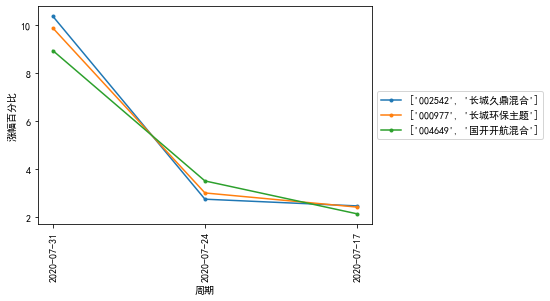

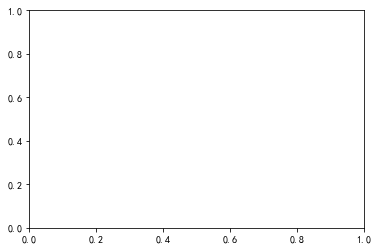

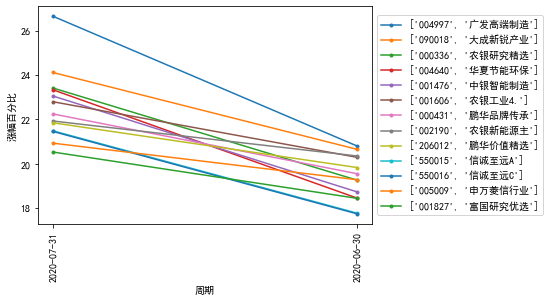

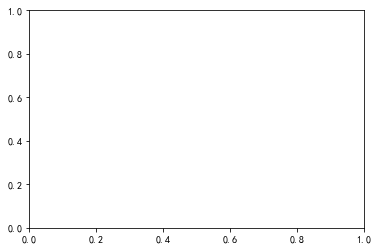

In [24]:
    #对所有基金明细交集的内容，画图
    pic_execl(all_week_sort_rate,"all_top500_3week",3,6)
    pic_execl(all_month_sort_rate,"all_top200_2month",3,5)

Empty DataFrame
Columns: [基金代码, 基金简称, 最新日期, 2020-07-31, 2020-07-24, 2020-07-17, 2020-07-10, 2020-07-03, 2020-06-24]
Index: []
['162605', '景顺长城鼎益', '2020-07-31', 8.17, -0.41, -0.12, 8.36, 9.07, 3.6]
['110011', '易方达中小盘', '2020-07-31', 5.51, 0.8, -2.68, 6.63, 5.84, 3.61]
['000083', '汇添富消费行', '2020-07-31', 6.75, -1.17, -0.59, 8.45, 6.06, 3.5]
['519674', '银河创新成长', '2020-07-31', 7.97, -2.18, -13.06, 17.7, 2.76, 11.55]
['000727', '融通健康产业', '2020-07-31', 5.16, -2.7, -1.86, 4.69, 4.05, 3.38]
['001679', '前海开源中国', '2020-07-31', 7.4, -1.59, 2.63, 10.11, 3.57, 4.95]
['270050', '广发新经济混', '2020-07-31', 4.04, -0.84, -3.47, 8.74, 3.3, 4.03]
['005275', '中欧创新成长', '2020-07-31', 5.27, -1.08, -2.35, 7.74, 2.56, 3.76]
['000977', '长城环保主题', '2020-07-31', 9.88, 3.01, 2.42, 6.95, 3.2, 3.45]
Empty DataFrame
Columns: [基金代码, 基金简称, 最新日期, 2020-07-31, 2020-06-30]
Index: []
['162605', '景顺长城鼎益', '2020-07-31', 24.0, 10.45]
['110011', '易方达中小盘', '2020-07-31', 15.41, 11.46]
['000083', '汇添富消费行', '2020-07-31', 17.48, 12.7]
['

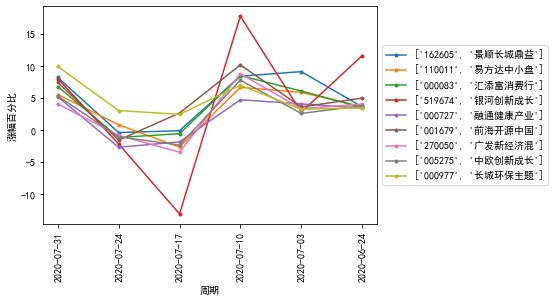

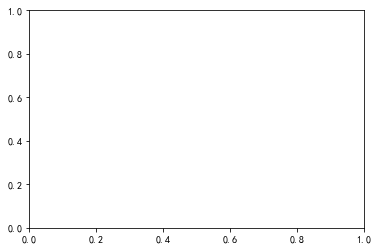

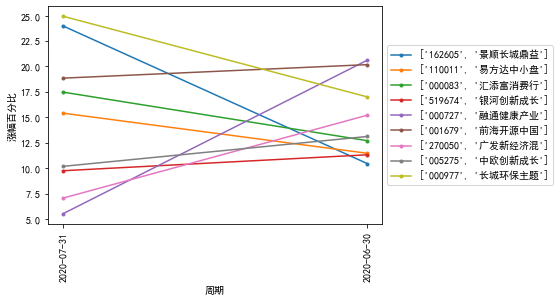

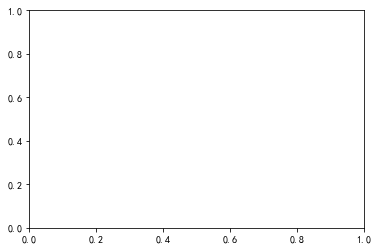

In [19]:
    #只调整这部分的代码，快速查看我关注基金的最近6周走势，以及最近2月走势
    lasttrans_day="2020-07-31"
    my_funds_list = [ "162605", "110011",  "000083", "519674", "000727","001679", "270050","005275","000977","161726"]
    myfund_pd=get_myfund_pd(my_funds_list)

    #将我关注基金的明细，按周计算增幅，每周5个工作日， 取最近6周每周的涨幅
    #调用fund_rate_mt函数时，确保这个函数中使用的过滤代码包含在我的基金列表中，目前使用的是000083
    my_w_rate1 = fund_rate_mt(myfund_pd,"week","WD",5,6)

    #将我关注基金的明细，按月计算增幅，每周23个工作日， 取最近2月每月的涨幅
    my_m_rate1 = fund_rate_mt(myfund_pd,"week","WD",23,2)

    #对我关注基金明细交集的内容，画图
    pic_execl(my_w_rate1,"my_6week",3,9)
    pic_execl(my_m_rate1,"my_2month",3,6)